# Fashion Recommendation using EfficientNet B7

## **1. Import Libraries**

In [49]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.models import Model
from numpy.linalg import norm
import os
from tqdm import tqdm
import pickle
from sklearn.neighbors import NearestNeighbors
import cv2
import matplotlib.pyplot as plt

## **2. EfficientNet B7 Model**

In [50]:
# Load EfficientNetB7 model pre-trained on ImageNet
base_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=(600, 600, 3))
x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
model = Model(inputs=base_model.input, outputs=x)

In [4]:
# The model will not be trained further, set its trainable attribute to False
model.trainable = False

## **3. Preprocessing Images**

In [5]:
image_dir = 'images'

def process_single_image(img_path, model):
    img = image.load_img(img_path, target_size=(600, 600))  # Resize image to match model's expected input
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_image = preprocess_input(expanded_img_array)  # Preprocess the image
    features = model.predict(preprocessed_image).flatten()  # Predict and flatten to create a 1D array
    normalized_features = features / norm(features)  # Normalize features
    return normalized_features

## **4. Saving Features of the dataset**

In [ ]:
# Process images in batches
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
all_features = []

for img in tqdm(image_paths):
    all_features.append(process_single_image(img,model))

  0%|                                                           | 0/44441 [00:00<?, ?it/s]2024-04-10 18:20:19.796806: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 6s 6s/step


  0%|                                                | 1/44441 [00:06<78:51:05,  6.39s/it]

1/1 [==============================] - 0s 346ms/step


  0%|                                                | 2/44441 [00:06<35:29:22,  2.88s/it]

1/1 [==============================] - 0s 112ms/step


  0%|                                                | 3/44441 [00:06<20:08:46,  1.63s/it]

1/1 [==============================] - 0s 106ms/step


  0%|                                                | 4/44441 [00:07<12:57:25,  1.05s/it]

1/1 [==============================] - 0s 86ms/step


  0%|                                                 | 5/44441 [00:07<9:01:06,  1.37it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                 | 6/44441 [00:07<6:33:01,  1.88it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                 | 7/44441 [00:07<5:02:50,  2.45it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                 | 8/44441 [00:07<4:00:37,  3.08it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                 | 9/44441 [00:07<3:20:45,  3.69it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 10/44441 [00:08<2:52:39,  4.29it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 11/44441 [00:08<2:33:58,  4.81it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 12/44441 [00:08<2:22:44,  5.19it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 13/44441 [00:08<2:11:41,  5.62it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 14/44441 [00:08<2:03:57,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 15/44441 [00:08<2:02:33,  6.04it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 16/44441 [00:08<1:59:33,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 17/44441 [00:09<1:56:06,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                                | 18/44441 [00:09<2:08:56,  5.74it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 19/44441 [00:09<2:03:12,  6.01it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                                | 20/44441 [00:09<1:58:44,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 21/44441 [00:09<1:58:06,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 22/44441 [00:09<1:58:24,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 23/44441 [00:10<1:54:29,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 24/44441 [00:10<1:59:39,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 25/44441 [00:10<1:55:46,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 26/44441 [00:10<1:52:44,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 27/44441 [00:10<1:53:52,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 28/44441 [00:10<1:50:41,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 29/44441 [00:10<1:52:06,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 30/44441 [00:11<1:50:37,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 31/44441 [00:11<1:51:52,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 32/44441 [00:11<1:51:02,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 33/44441 [00:11<1:53:52,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 34/44441 [00:11<1:50:51,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                                | 35/44441 [00:11<1:51:49,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 36/44441 [00:12<1:54:53,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                                | 37/44441 [00:12<1:57:20,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                                | 38/44441 [00:12<1:58:03,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 39/44441 [00:12<1:57:03,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 40/44441 [00:12<1:56:42,  6.34it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 41/44441 [00:12<1:52:45,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 42/44441 [00:12<1:54:57,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 43/44441 [00:13<1:55:43,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 44/44441 [00:13<1:53:00,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 45/44441 [00:13<2:02:12,  6.05it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 46/44441 [00:13<1:57:23,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 47/44441 [00:13<1:54:06,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 48/44441 [00:13<1:54:50,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 49/44441 [00:14<1:55:36,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 50/44441 [00:14<1:52:54,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 51/44441 [00:14<1:50:38,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 52/44441 [00:14<1:49:09,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 53/44441 [00:14<1:48:17,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 54/44441 [00:14<1:51:00,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 55/44441 [00:14<1:49:07,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 56/44441 [00:15<1:47:35,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 57/44441 [00:15<1:50:58,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 58/44441 [00:15<1:55:36,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 59/44441 [00:15<1:52:34,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 60/44441 [00:15<1:55:16,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 61/44441 [00:15<1:52:38,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 62/44441 [00:16<1:50:57,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                                | 63/44441 [00:16<1:50:45,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 64/44441 [00:16<1:49:15,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 65/44441 [00:16<1:48:22,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 66/44441 [00:16<1:51:11,  6.65it/s]

1/1 [==============================] - 0s 93ms/step


  0%|                                                | 67/44441 [00:16<1:52:59,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 68/44441 [00:16<1:54:44,  6.45it/s]

1/1 [==============================] - 0s 95ms/step


  0%|                                                | 69/44441 [00:17<1:54:31,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 70/44441 [00:17<1:52:31,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 71/44441 [00:17<1:56:22,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


  0%|                                                | 72/44441 [00:17<1:58:02,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 73/44441 [00:17<1:57:51,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 74/44441 [00:17<1:56:55,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 75/44441 [00:18<1:53:11,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


  0%|                                                | 76/44441 [00:18<1:53:31,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 77/44441 [00:18<1:55:52,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 78/44441 [00:18<1:56:20,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 79/44441 [00:18<1:54:35,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 80/44441 [00:18<1:55:05,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                                | 81/44441 [00:18<1:52:23,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 82/44441 [00:19<1:51:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 83/44441 [00:19<1:53:36,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 84/44441 [00:19<1:52:10,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 85/44441 [00:19<1:49:28,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 86/44441 [00:19<1:52:00,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 87/44441 [00:19<1:49:38,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                                | 88/44441 [00:19<1:48:16,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                                | 89/44441 [00:20<1:50:50,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 90/44441 [00:20<1:50:59,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 91/44441 [00:20<1:49:51,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                                | 92/44441 [00:20<1:50:54,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                                | 93/44441 [00:20<1:59:06,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 94/44441 [00:20<1:59:07,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


  0%|                                                | 95/44441 [00:21<1:57:28,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                                | 96/44441 [00:21<1:55:39,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                | 97/44441 [00:21<1:57:51,  6.27it/s]

1/1 [==============================] - 0s 96ms/step


  0%|                                                | 98/44441 [00:21<1:59:49,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                | 99/44441 [00:21<1:56:52,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                               | 100/44441 [00:21<1:56:34,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                               | 101/44441 [00:22<1:55:12,  6.41it/s]

1/1 [==============================] - 0s 103ms/step


  0%|                                               | 102/44441 [00:22<1:56:47,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                               | 103/44441 [00:22<1:58:15,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                               | 104/44441 [00:22<1:55:13,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                               | 105/44441 [00:22<1:56:12,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                               | 106/44441 [00:22<1:57:01,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  0%|                                               | 107/44441 [00:22<1:53:45,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


  0%|                                               | 108/44441 [00:23<1:51:36,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                               | 109/44441 [00:23<1:50:02,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                               | 110/44441 [00:23<1:48:32,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  0%|                                               | 111/44441 [00:23<1:50:01,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                               | 112/44441 [00:23<1:51:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                               | 113/44441 [00:23<1:53:39,  6.50it/s]

1/1 [==============================] - 0s 122ms/step


  0%|                                               | 114/44441 [00:24<1:59:08,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


  0%|                                               | 115/44441 [00:24<1:56:14,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


  0%|                                               | 116/44441 [00:24<1:54:39,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  0%|                                               | 117/44441 [00:24<1:52:04,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  0%|                                               | 118/44441 [00:24<1:50:40,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 119/44441 [00:24<1:51:55,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 120/44441 [00:24<1:50:46,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 121/44441 [00:25<1:51:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 122/44441 [00:25<1:54:29,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 123/44441 [00:25<1:56:12,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 124/44441 [00:25<1:57:00,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 125/44441 [00:25<1:54:42,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 126/44441 [00:25<1:54:53,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 127/44441 [00:26<1:52:38,  6.56it/s]

1/1 [==============================] - 1s 520ms/step


  0%|▏                                              | 128/44441 [00:26<3:27:40,  3.56it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                              | 129/44441 [00:26<3:00:36,  4.09it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 130/44441 [00:26<2:38:38,  4.66it/s]

1/1 [==============================] - 0s 95ms/step


  0%|▏                                              | 131/44441 [00:27<2:28:31,  4.97it/s]

1/1 [==============================] - 0s 97ms/step


  0%|▏                                              | 132/44441 [00:27<2:16:10,  5.42it/s]

1/1 [==============================] - 0s 94ms/step


  0%|▏                                              | 133/44441 [00:27<2:12:22,  5.58it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 134/44441 [00:27<2:08:53,  5.73it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 135/44441 [00:27<2:02:47,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 136/44441 [00:27<2:00:50,  6.11it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 137/44441 [00:28<2:00:41,  6.12it/s]

1/1 [==============================] - 0s 94ms/step


  0%|▏                                              | 138/44441 [00:28<1:57:57,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                              | 139/44441 [00:28<1:54:49,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 140/44441 [00:28<1:56:55,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 141/44441 [00:28<1:53:27,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 142/44441 [00:28<1:53:55,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 143/44441 [00:28<1:51:31,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 144/44441 [00:29<1:56:22,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 145/44441 [00:29<2:01:55,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                              | 146/44441 [00:29<2:01:09,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 147/44441 [00:29<1:56:36,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 148/44441 [00:29<1:58:26,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 149/44441 [00:29<1:58:44,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 150/44441 [00:30<1:55:16,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 151/44441 [00:30<1:55:05,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 152/44441 [00:30<1:58:02,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 153/44441 [00:30<1:56:48,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 154/44441 [00:30<1:53:37,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 155/44441 [00:30<1:51:45,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 156/44441 [00:30<1:51:13,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


  0%|▏                                              | 157/44441 [00:31<1:50:34,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 158/44441 [00:31<1:53:16,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 159/44441 [00:31<1:55:05,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 160/44441 [00:31<1:52:52,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 161/44441 [00:31<1:54:09,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 162/44441 [00:31<1:51:55,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


  0%|▏                                              | 163/44441 [00:32<1:50:40,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 164/44441 [00:32<1:52:24,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 165/44441 [00:32<1:50:22,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 166/44441 [00:32<1:49:03,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 167/44441 [00:32<1:52:38,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 168/44441 [00:32<1:50:52,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 169/44441 [00:32<1:49:23,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 170/44441 [00:33<1:48:31,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                              | 171/44441 [00:33<1:49:04,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 172/44441 [00:33<1:48:55,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 173/44441 [00:33<1:53:37,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 174/44441 [00:33<1:51:41,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 175/44441 [00:33<1:50:44,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 176/44441 [00:34<1:52:46,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 177/44441 [00:34<1:50:40,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 178/44441 [00:34<1:53:31,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 179/44441 [00:34<1:52:18,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 180/44441 [00:34<1:50:15,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 181/44441 [00:34<1:52:32,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 182/44441 [00:34<1:53:51,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


  0%|▏                                              | 183/44441 [00:35<1:54:44,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 184/44441 [00:35<1:52:16,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 185/44441 [00:35<1:53:28,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 186/44441 [00:35<1:51:09,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 187/44441 [00:35<1:56:26,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 188/44441 [00:35<1:53:45,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 189/44441 [00:36<1:53:30,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 190/44441 [00:36<1:52:25,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 191/44441 [00:36<1:53:42,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 192/44441 [00:36<1:54:07,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 193/44441 [00:36<1:55:17,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 194/44441 [00:36<1:52:45,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 195/44441 [00:36<1:54:01,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 196/44441 [00:37<1:55:12,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 197/44441 [00:37<1:53:43,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 198/44441 [00:37<1:54:51,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 199/44441 [00:37<1:57:18,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 200/44441 [00:37<1:54:34,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 201/44441 [00:37<1:53:10,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 202/44441 [00:38<1:53:52,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 203/44441 [00:38<1:51:37,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  0%|▏                                              | 204/44441 [00:38<1:53:11,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  0%|▏                                              | 205/44441 [00:38<1:54:43,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 206/44441 [00:38<1:54:33,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 207/44441 [00:38<1:51:43,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 208/44441 [00:38<1:49:04,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 209/44441 [00:39<1:51:29,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 210/44441 [00:39<1:58:21,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 211/44441 [00:39<1:54:55,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 212/44441 [00:39<1:52:07,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 213/44441 [00:39<1:53:25,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  0%|▏                                              | 214/44441 [00:39<1:51:17,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 215/44441 [00:40<1:51:59,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


  0%|▏                                              | 216/44441 [00:40<1:54:25,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 217/44441 [00:40<1:55:01,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 218/44441 [00:40<1:51:46,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 219/44441 [00:40<1:52:36,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  0%|▏                                              | 220/44441 [00:40<1:54:35,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 221/44441 [00:40<1:51:25,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▏                                              | 222/44441 [00:41<1:49:31,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▏                                              | 223/44441 [00:41<1:50:46,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▏                                              | 224/44441 [00:41<1:50:15,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▏                                              | 225/44441 [00:41<1:55:24,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▏                                              | 226/44441 [00:41<1:51:52,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▏                                              | 227/44441 [00:41<1:49:52,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▏                                              | 228/44441 [00:41<1:51:52,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▏                                              | 229/44441 [00:42<1:53:47,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▏                                              | 230/44441 [00:42<1:54:49,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▏                                              | 231/44441 [00:42<1:52:04,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▏                                              | 232/44441 [00:42<1:54:10,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


  1%|▏                                              | 233/44441 [00:42<1:53:19,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▏                                              | 234/44441 [00:42<1:54:02,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▏                                              | 235/44441 [00:43<1:52:05,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▏                                              | 236/44441 [00:43<1:54:01,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 237/44441 [00:43<1:53:48,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 238/44441 [00:43<1:55:24,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 239/44441 [00:43<1:58:33,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 240/44441 [00:43<1:57:43,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 241/44441 [00:44<1:59:18,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 242/44441 [00:44<1:55:28,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 243/44441 [00:44<1:55:15,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 244/44441 [00:44<1:55:36,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 245/44441 [00:44<1:55:08,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 246/44441 [00:44<1:52:32,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 247/44441 [00:44<1:53:53,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 248/44441 [00:45<1:55:08,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 249/44441 [00:45<1:56:34,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 250/44441 [00:45<1:56:21,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 251/44441 [00:45<1:52:37,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 252/44441 [00:45<1:53:50,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 253/44441 [00:45<1:53:55,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 254/44441 [00:46<1:55:27,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 255/44441 [00:46<1:52:44,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 256/44441 [00:46<1:55:27,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 257/44441 [00:46<1:56:29,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 258/44441 [00:46<1:56:11,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 259/44441 [00:46<1:52:32,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 260/44441 [00:46<1:52:09,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 261/44441 [00:47<1:52:44,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 262/44441 [00:47<1:49:34,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 263/44441 [00:47<1:48:50,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 264/44441 [00:47<1:50:28,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 265/44441 [00:47<1:49:17,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 266/44441 [00:47<1:50:40,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 267/44441 [00:48<1:51:41,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 268/44441 [00:48<1:51:48,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 269/44441 [00:48<1:53:48,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 270/44441 [00:48<1:52:01,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 271/44441 [00:48<1:49:59,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 272/44441 [00:48<1:51:48,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 273/44441 [00:48<1:53:07,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 274/44441 [00:49<1:50:27,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 275/44441 [00:49<1:59:56,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 276/44441 [00:49<1:58:23,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 277/44441 [00:49<1:57:39,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 278/44441 [00:49<1:53:48,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 279/44441 [00:49<1:54:17,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 280/44441 [00:50<1:54:38,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▎                                              | 281/44441 [00:50<1:54:05,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 282/44441 [00:50<1:55:23,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 283/44441 [00:50<1:54:50,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 284/44441 [00:50<1:51:50,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 285/44441 [00:50<1:49:33,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 286/44441 [00:50<1:49:36,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 287/44441 [00:51<1:47:50,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 288/44441 [00:51<1:47:04,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 289/44441 [00:51<1:46:15,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 290/44441 [00:51<1:50:13,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 291/44441 [00:51<1:48:02,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 292/44441 [00:51<1:47:25,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 293/44441 [00:52<1:53:47,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 294/44441 [00:52<1:51:32,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 295/44441 [00:52<1:52:11,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 296/44441 [00:52<1:57:30,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 297/44441 [00:52<1:53:20,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 298/44441 [00:52<1:53:33,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 299/44441 [00:52<1:53:30,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 300/44441 [00:53<1:51:18,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 301/44441 [00:53<1:54:29,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 302/44441 [00:53<1:54:29,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 303/44441 [00:53<1:54:19,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 304/44441 [00:53<1:51:48,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 305/44441 [00:53<1:49:36,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 306/44441 [00:53<1:48:16,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 307/44441 [00:54<1:47:15,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 308/44441 [00:54<1:49:22,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 309/44441 [00:54<1:47:58,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 310/44441 [00:54<1:50:22,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 311/44441 [00:54<1:52:09,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 312/44441 [00:54<1:49:06,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 313/44441 [00:55<1:49:11,  6.74it/s]

1/1 [==============================] - 0s 99ms/step


  1%|▎                                              | 314/44441 [00:55<1:51:52,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 315/44441 [00:55<1:50:16,  6.67it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▎                                              | 316/44441 [00:55<1:50:59,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 317/44441 [00:55<1:53:35,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 318/44441 [00:55<1:52:09,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 319/44441 [00:55<1:53:46,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                              | 320/44441 [00:56<1:52:18,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 321/44441 [00:56<1:53:02,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 322/44441 [00:56<1:51:49,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▎                                              | 323/44441 [00:56<1:51:05,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 324/44441 [00:56<1:51:06,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 325/44441 [00:56<1:50:19,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 326/44441 [00:56<1:49:14,  6.73it/s]

1/1 [==============================] - 0s 129ms/step


  1%|▎                                              | 327/44441 [00:57<1:55:02,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 328/44441 [00:57<1:55:52,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 329/44441 [00:57<1:52:51,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 330/44441 [00:57<1:53:47,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                              | 331/44441 [00:57<1:55:44,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 332/44441 [00:57<1:55:45,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▎                                              | 333/44441 [00:58<2:03:44,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 334/44441 [00:58<2:02:52,  5.98it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▎                                              | 335/44441 [00:58<2:00:39,  6.09it/s]

1/1 [==============================] - 0s 96ms/step


  1%|▎                                              | 336/44441 [00:58<1:58:01,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                              | 337/44441 [00:58<1:56:11,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                              | 338/44441 [00:58<1:55:02,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 339/44441 [00:59<1:53:16,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 340/44441 [00:59<1:59:20,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 341/44441 [00:59<1:56:06,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▎                                              | 342/44441 [00:59<1:53:20,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 343/44441 [00:59<1:54:09,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▎                                              | 344/44441 [00:59<1:52:39,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 345/44441 [00:59<1:50:57,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 346/44441 [01:00<1:51:30,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 347/44441 [01:00<1:51:42,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▎                                              | 348/44441 [01:00<1:50:29,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 349/44441 [01:00<1:50:30,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 350/44441 [01:00<1:52:11,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▎                                              | 351/44441 [01:00<1:49:39,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 352/44441 [01:01<1:48:13,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▎                                              | 353/44441 [01:01<1:47:00,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▎                                              | 354/44441 [01:01<1:49:21,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 355/44441 [01:01<1:50:46,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 356/44441 [01:01<1:48:35,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 357/44441 [01:01<1:51:19,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 358/44441 [01:01<1:49:21,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


  1%|▍                                              | 359/44441 [01:02<1:50:24,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 360/44441 [01:02<1:48:39,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 361/44441 [01:02<1:51:23,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


  1%|▍                                              | 362/44441 [01:02<1:54:41,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 363/44441 [01:02<1:54:44,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 364/44441 [01:02<1:54:12,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 365/44441 [01:03<1:54:28,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 366/44441 [01:03<1:51:19,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 367/44441 [01:03<1:49:28,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 368/44441 [01:03<1:50:41,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 369/44441 [01:03<1:51:11,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 370/44441 [01:03<1:52:16,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 371/44441 [01:03<1:49:44,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 372/44441 [01:04<1:47:57,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 373/44441 [01:04<1:51:29,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 374/44441 [01:04<1:49:12,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 375/44441 [01:04<1:47:39,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 376/44441 [01:04<1:46:48,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 377/44441 [01:04<1:45:54,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 378/44441 [01:04<1:45:16,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 379/44441 [01:05<1:52:23,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 380/44441 [01:05<1:53:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 381/44441 [01:05<1:51:39,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 382/44441 [01:05<1:49:50,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 383/44441 [01:05<1:48:21,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 384/44441 [01:05<1:49:37,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 385/44441 [01:06<1:50:50,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 386/44441 [01:06<1:51:42,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 387/44441 [01:06<1:49:38,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 388/44441 [01:06<1:48:24,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 389/44441 [01:06<1:47:09,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 390/44441 [01:06<1:46:46,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 391/44441 [01:06<1:51:43,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 392/44441 [01:07<1:53:05,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 393/44441 [01:07<1:50:39,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 394/44441 [01:07<1:51:42,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 395/44441 [01:07<1:49:59,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 396/44441 [01:07<1:47:58,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 397/44441 [01:07<1:49:43,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 398/44441 [01:07<1:51:04,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▍                                              | 399/44441 [01:08<1:49:31,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▍                                              | 400/44441 [01:08<1:51:02,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 401/44441 [01:08<1:53:04,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


  1%|▍                                              | 402/44441 [01:08<1:54:45,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 403/44441 [01:08<1:51:31,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 404/44441 [01:08<1:52:17,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 405/44441 [01:09<1:49:40,  6.69it/s]

1/1 [==============================] - 0s 130ms/step


  1%|▍                                              | 406/44441 [01:09<1:52:38,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 407/44441 [01:09<1:53:23,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 408/44441 [01:09<1:53:21,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 409/44441 [01:09<1:53:50,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 410/44441 [01:09<1:50:29,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 411/44441 [01:09<1:51:11,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▍                                              | 412/44441 [01:10<1:49:05,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 413/44441 [01:10<1:48:03,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 414/44441 [01:10<1:47:05,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 415/44441 [01:10<1:45:31,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 416/44441 [01:10<1:48:13,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 417/44441 [01:10<1:52:06,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 418/44441 [01:10<1:53:07,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 419/44441 [01:11<1:52:50,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 420/44441 [01:11<1:53:01,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 421/44441 [01:11<1:50:07,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 422/44441 [01:11<1:48:09,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 423/44441 [01:11<1:46:38,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 424/44441 [01:11<1:46:33,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 425/44441 [01:12<1:48:54,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 426/44441 [01:12<2:02:08,  6.01it/s]

1/1 [==============================] - 0s 94ms/step


  1%|▍                                              | 427/44441 [01:12<1:59:12,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 428/44441 [01:12<1:57:43,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 429/44441 [01:12<1:53:31,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 430/44441 [01:12<1:50:29,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 431/44441 [01:12<1:48:02,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 432/44441 [01:13<1:49:47,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 433/44441 [01:13<1:56:11,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 434/44441 [01:13<1:52:21,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 435/44441 [01:13<1:49:24,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 436/44441 [01:13<1:49:07,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 437/44441 [01:13<1:50:48,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 438/44441 [01:14<1:48:36,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 439/44441 [01:14<1:50:29,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 440/44441 [01:14<1:48:42,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 441/44441 [01:14<1:48:27,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 442/44441 [01:14<1:49:26,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 443/44441 [01:14<1:51:10,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 444/44441 [01:14<1:49:15,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 445/44441 [01:15<1:51:00,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 446/44441 [01:15<1:48:43,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 447/44441 [01:15<1:48:38,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 448/44441 [01:15<1:50:17,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 449/44441 [01:15<1:51:12,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 450/44441 [01:15<1:48:54,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 451/44441 [01:15<1:50:48,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▍                                              | 452/44441 [01:16<1:49:02,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 453/44441 [01:16<1:50:31,  6.63it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▍                                              | 454/44441 [01:16<1:54:06,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 455/44441 [01:16<1:51:07,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▍                                              | 456/44441 [01:16<1:54:15,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 457/44441 [01:16<1:51:16,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 458/44441 [01:17<1:53:27,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 459/44441 [01:17<1:56:45,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 460/44441 [01:17<1:55:56,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 461/44441 [01:17<1:55:39,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 462/44441 [01:17<1:52:32,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 463/44441 [01:17<1:49:55,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 464/44441 [01:17<1:48:06,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 465/44441 [01:18<1:49:37,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 466/44441 [01:18<1:50:23,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 467/44441 [01:18<1:49:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▍                                              | 468/44441 [01:18<1:50:41,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 469/44441 [01:18<1:49:36,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▍                                              | 470/44441 [01:18<1:52:21,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▍                                              | 471/44441 [01:19<1:50:08,  6.65it/s]

1/1 [==============================] - 0s 118ms/step


  1%|▍                                              | 472/44441 [01:19<1:57:04,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 473/44441 [01:19<1:55:32,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 474/44441 [01:19<1:52:48,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 475/44441 [01:19<1:49:59,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 476/44441 [01:19<1:47:58,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 477/44441 [01:19<1:46:39,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 478/44441 [01:20<1:48:24,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 479/44441 [01:20<1:50:23,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 480/44441 [01:20<1:50:59,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 481/44441 [01:20<1:51:45,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 482/44441 [01:20<1:49:37,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 483/44441 [01:20<1:47:48,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 484/44441 [01:20<1:49:18,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 485/44441 [01:21<1:50:54,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 486/44441 [01:21<1:54:01,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 487/44441 [01:21<1:51:15,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 488/44441 [01:21<1:51:54,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 489/44441 [01:21<1:49:36,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 490/44441 [01:21<1:47:55,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 491/44441 [01:22<1:47:44,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 492/44441 [01:22<1:49:59,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 493/44441 [01:22<1:48:36,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 494/44441 [01:22<1:50:03,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 495/44441 [01:22<1:48:17,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 496/44441 [01:22<1:46:57,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 497/44441 [01:22<1:45:43,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 498/44441 [01:23<1:45:52,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 499/44441 [01:23<1:45:31,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 500/44441 [01:23<1:45:26,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 501/44441 [01:23<1:45:06,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 502/44441 [01:23<1:48:47,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 503/44441 [01:23<1:51:29,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 504/44441 [01:23<1:49:36,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 505/44441 [01:24<1:48:11,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 506/44441 [01:24<1:50:01,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 507/44441 [01:24<1:48:13,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 508/44441 [01:24<1:47:26,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 509/44441 [01:24<1:49:33,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 510/44441 [01:24<1:51:20,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 511/44441 [01:24<1:49:21,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 512/44441 [01:25<1:52:28,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 513/44441 [01:25<1:50:56,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 514/44441 [01:25<1:48:52,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 515/44441 [01:25<1:47:33,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 516/44441 [01:25<1:50:33,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 517/44441 [01:25<1:49:45,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 518/44441 [01:26<1:48:19,  6.76it/s]

1/1 [==============================] - 1s 530ms/step


  1%|▌                                              | 519/44441 [01:26<3:26:51,  3.54it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▌                                              | 520/44441 [01:26<3:04:51,  3.96it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 521/44441 [01:26<2:43:44,  4.47it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▌                                              | 522/44441 [01:27<2:29:59,  4.88it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 523/44441 [01:27<2:16:04,  5.38it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 524/44441 [01:27<2:09:36,  5.65it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 525/44441 [01:27<2:02:57,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 526/44441 [01:27<2:05:03,  5.85it/s]

1/1 [==============================] - 0s 84ms/step


  1%|▌                                              | 527/44441 [01:27<2:02:07,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 528/44441 [01:28<1:56:44,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 529/44441 [01:28<1:54:20,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 530/44441 [01:28<1:51:35,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 531/44441 [01:28<1:48:56,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 532/44441 [01:28<1:47:40,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 533/44441 [01:28<1:46:20,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 534/44441 [01:28<1:47:33,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 535/44441 [01:29<1:46:20,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 536/44441 [01:29<1:53:15,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 537/44441 [01:29<1:50:16,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▌                                              | 538/44441 [01:29<1:48:37,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 539/44441 [01:29<1:49:48,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 540/44441 [01:29<1:48:39,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 541/44441 [01:29<1:49:55,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 542/44441 [01:30<1:47:51,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 543/44441 [01:30<1:46:30,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 544/44441 [01:30<1:48:56,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 545/44441 [01:30<1:50:07,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▌                                              | 546/44441 [01:30<1:49:08,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 547/44441 [01:30<1:48:33,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 548/44441 [01:31<1:49:39,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 549/44441 [01:31<1:51:11,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 550/44441 [01:31<1:51:10,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 551/44441 [01:31<1:50:05,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 552/44441 [01:31<1:48:16,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 553/44441 [01:31<1:50:44,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 554/44441 [01:31<1:50:18,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 555/44441 [01:32<1:50:04,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▌                                              | 556/44441 [01:32<1:53:32,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▌                                              | 557/44441 [01:32<1:52:25,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 558/44441 [01:32<1:52:06,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 559/44441 [01:32<1:50:58,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 560/44441 [01:32<1:50:15,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 561/44441 [01:33<1:54:00,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 562/44441 [01:33<1:51:57,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 563/44441 [01:33<2:00:09,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 564/44441 [01:33<1:59:59,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 565/44441 [01:33<1:59:40,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 566/44441 [01:33<1:55:41,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▌                                              | 567/44441 [01:33<1:53:12,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▌                                              | 568/44441 [01:34<1:54:29,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▌                                              | 569/44441 [01:34<1:51:40,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 570/44441 [01:34<1:54:27,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 571/44441 [01:34<1:55:01,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 572/44441 [01:34<1:51:41,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▌                                              | 573/44441 [01:34<1:52:23,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 574/44441 [01:35<1:50:32,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 575/44441 [01:35<1:52:01,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 576/44441 [01:35<1:50:39,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 577/44441 [01:35<1:52:48,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▌                                              | 578/44441 [01:35<1:50:50,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 579/44441 [01:35<1:52:17,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 580/44441 [01:35<1:49:57,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 581/44441 [01:36<1:49:18,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 582/44441 [01:36<1:51:47,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 583/44441 [01:36<1:50:06,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 584/44441 [01:36<1:48:21,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 585/44441 [01:36<1:47:10,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▌                                              | 586/44441 [01:36<1:46:21,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 587/44441 [01:36<1:49:22,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 588/44441 [01:37<1:52:14,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                              | 589/44441 [01:37<1:50:45,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                              | 590/44441 [01:37<1:49:04,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 591/44441 [01:37<1:47:53,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 592/44441 [01:37<1:50:21,  6.62it/s]

1/1 [==============================] - 0s 96ms/step


  1%|▋                                              | 593/44441 [01:38<2:43:05,  4.48it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 594/44441 [01:38<2:25:36,  5.02it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 595/44441 [01:38<2:15:49,  5.38it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 596/44441 [01:38<2:06:24,  5.78it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 597/44441 [01:38<2:00:12,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 598/44441 [01:38<1:55:13,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 599/44441 [01:39<1:52:23,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 600/44441 [01:39<1:50:14,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 601/44441 [01:39<1:52:19,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 602/44441 [01:39<1:54:19,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 603/44441 [01:39<1:51:22,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 604/44441 [01:39<1:49:26,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 605/44441 [01:39<1:48:57,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 606/44441 [01:40<1:55:20,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 607/44441 [01:40<1:52:33,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 608/44441 [01:40<1:53:49,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▋                                              | 609/44441 [01:40<1:54:08,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▋                                              | 610/44441 [01:40<1:51:06,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 611/44441 [01:40<1:49:40,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 612/44441 [01:40<1:50:33,  6.61it/s]

1/1 [==============================] - 0s 136ms/step


  1%|▋                                              | 613/44441 [01:41<1:59:00,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 614/44441 [01:41<1:55:01,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▋                                              | 615/44441 [01:41<1:52:16,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 616/44441 [01:41<1:49:46,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 617/44441 [01:41<1:51:46,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 618/44441 [01:41<1:52:37,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 619/44441 [01:42<1:50:28,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▋                                              | 620/44441 [01:42<1:51:51,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 621/44441 [01:42<1:49:40,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 622/44441 [01:42<1:48:04,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 623/44441 [01:42<1:47:59,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 624/44441 [01:42<1:47:21,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 625/44441 [01:42<1:49:33,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 626/44441 [01:43<1:48:01,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 627/44441 [01:43<1:49:52,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 628/44441 [01:43<1:48:27,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▋                                              | 629/44441 [01:43<1:47:45,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 630/44441 [01:43<1:46:48,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 631/44441 [01:43<1:46:33,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 632/44441 [01:44<1:48:40,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 633/44441 [01:44<1:47:54,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 634/44441 [01:44<1:53:04,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 635/44441 [01:44<1:51:13,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 636/44441 [01:44<1:52:15,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 637/44441 [01:44<1:49:55,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 638/44441 [01:44<1:55:32,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 639/44441 [01:45<1:54:59,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 640/44441 [01:45<1:56:05,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 641/44441 [01:45<1:52:55,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 642/44441 [01:45<1:53:25,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 643/44441 [01:45<1:51:44,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 644/44441 [01:45<1:53:54,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 645/44441 [01:46<1:55:11,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▋                                              | 646/44441 [01:46<1:52:29,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 647/44441 [01:46<1:53:49,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


  1%|▋                                              | 648/44441 [01:46<1:52:40,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 649/44441 [01:46<1:53:45,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 650/44441 [01:46<1:59:08,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 651/44441 [01:46<1:55:05,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▋                                              | 652/44441 [01:47<1:53:21,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 653/44441 [01:47<1:55:03,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▋                                              | 654/44441 [01:47<1:55:42,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▋                                              | 655/44441 [01:47<1:57:53,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▋                                              | 656/44441 [01:47<1:56:55,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 657/44441 [01:47<1:53:24,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 658/44441 [01:48<1:50:42,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 659/44441 [01:48<1:49:14,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                              | 660/44441 [01:48<1:51:49,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 661/44441 [01:48<1:50:02,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 662/44441 [01:48<1:51:41,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 663/44441 [01:48<1:49:10,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  1%|▋                                              | 664/44441 [01:48<1:48:00,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  1%|▋                                              | 665/44441 [01:49<1:54:38,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▋                                              | 666/44441 [01:49<1:53:13,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 667/44441 [01:49<1:53:54,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 668/44441 [01:49<1:54:13,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▋                                              | 669/44441 [01:49<1:51:44,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 670/44441 [01:49<1:52:37,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 671/44441 [01:50<1:50:34,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 672/44441 [01:50<1:49:05,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▋                                              | 673/44441 [01:50<1:55:01,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▋                                              | 674/44441 [01:50<1:54:09,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▋                                              | 675/44441 [01:50<1:58:15,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▋                                              | 676/44441 [01:50<1:54:50,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▋                                              | 677/44441 [01:51<1:55:46,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 678/44441 [01:51<1:54:05,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 679/44441 [01:51<1:53:58,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 680/44441 [01:51<1:54:45,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▋                                              | 681/44441 [01:51<1:53:08,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 682/44441 [01:51<1:53:37,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 683/44441 [01:51<1:51:04,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▋                                              | 684/44441 [01:52<1:48:16,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▋                                              | 685/44441 [01:52<1:51:29,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▋                                              | 686/44441 [01:52<1:50:21,  6.61it/s]

1/1 [==============================] - 0s 137ms/step


  2%|▋                                              | 687/44441 [01:52<1:57:01,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▋                                              | 688/44441 [01:52<2:03:20,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▋                                              | 689/44441 [01:52<2:02:07,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 690/44441 [01:53<2:00:49,  6.04it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▋                                              | 691/44441 [01:53<2:00:30,  6.05it/s]

1/1 [==============================] - 0s 116ms/step


  2%|▋                                              | 692/44441 [01:53<1:57:02,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▋                                              | 693/44441 [01:53<1:53:55,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 694/44441 [01:53<1:54:26,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 695/44441 [01:53<1:51:33,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 696/44441 [01:54<1:54:50,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▋                                              | 697/44441 [01:54<1:52:20,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▋                                              | 698/44441 [01:54<1:52:32,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 699/44441 [01:54<1:50:24,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 700/44441 [01:54<1:49:09,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 701/44441 [01:54<1:50:12,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 702/44441 [01:54<1:53:28,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 703/44441 [01:55<1:50:39,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 704/44441 [01:55<1:52:22,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 705/44441 [01:55<1:50:11,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 706/44441 [01:55<1:48:09,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▋                                              | 707/44441 [01:55<1:47:01,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▋                                              | 708/44441 [01:55<1:46:24,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▋                                              | 709/44441 [01:55<1:45:42,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 710/44441 [01:56<1:45:11,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 711/44441 [01:56<1:45:53,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 712/44441 [01:56<1:45:17,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 713/44441 [01:56<1:47:20,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 714/44441 [01:56<1:50:48,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 715/44441 [01:56<1:51:42,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 716/44441 [01:57<1:52:10,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 717/44441 [01:57<1:49:28,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 718/44441 [01:57<1:50:46,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 719/44441 [01:57<1:52:06,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 720/44441 [01:57<1:50:04,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 721/44441 [01:57<1:48:38,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 722/44441 [01:57<1:51:20,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 723/44441 [01:58<1:51:58,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 724/44441 [01:58<1:49:51,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 725/44441 [01:58<1:48:57,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 726/44441 [01:58<1:47:33,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 727/44441 [01:58<1:46:16,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 728/44441 [01:58<1:45:22,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 729/44441 [01:58<1:44:19,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 730/44441 [01:59<1:47:08,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 731/44441 [01:59<1:48:57,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 732/44441 [01:59<1:53:44,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 733/44441 [01:59<1:52:32,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 734/44441 [01:59<1:53:17,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 735/44441 [01:59<1:53:50,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 736/44441 [02:00<1:51:36,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 737/44441 [02:00<1:49:28,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 738/44441 [02:00<1:48:08,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 739/44441 [02:00<1:47:06,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 740/44441 [02:00<1:48:52,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 741/44441 [02:00<1:51:21,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▊                                              | 742/44441 [02:00<1:51:08,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▊                                              | 743/44441 [02:01<1:54:19,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▊                                              | 744/44441 [02:01<1:57:44,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▊                                              | 745/44441 [02:01<1:55:42,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 746/44441 [02:01<1:53:07,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 747/44441 [02:01<1:55:31,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 748/44441 [02:01<1:55:13,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 749/44441 [02:02<1:55:54,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 750/44441 [02:02<1:52:49,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 751/44441 [02:02<1:54:22,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 752/44441 [02:02<1:52:01,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 753/44441 [02:02<1:53:05,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 754/44441 [02:02<1:52:13,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▊                                              | 755/44441 [02:02<1:55:35,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 756/44441 [02:03<1:56:16,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 757/44441 [02:03<1:54:21,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 758/44441 [02:03<1:55:04,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 759/44441 [02:03<1:58:06,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 760/44441 [02:03<1:56:03,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 761/44441 [02:03<1:53:00,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 762/44441 [02:04<1:50:58,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 763/44441 [02:04<1:49:46,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 764/44441 [02:04<1:52:29,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 765/44441 [02:04<1:53:59,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 766/44441 [02:04<1:52:49,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 767/44441 [02:04<1:54:07,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 768/44441 [02:04<1:51:44,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 769/44441 [02:05<1:55:16,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 770/44441 [02:05<1:57:40,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▊                                              | 771/44441 [02:05<1:53:55,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 772/44441 [02:05<1:51:00,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 773/44441 [02:05<1:55:44,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 774/44441 [02:05<1:56:33,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 775/44441 [02:06<1:53:27,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 776/44441 [02:06<1:54:15,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 777/44441 [02:06<1:52:46,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 778/44441 [02:06<1:50:43,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 779/44441 [02:06<1:51:53,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 780/44441 [02:06<1:52:33,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 781/44441 [02:07<1:52:51,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 782/44441 [02:07<1:50:47,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 783/44441 [02:07<1:56:22,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 784/44441 [02:07<1:52:31,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 785/44441 [02:07<1:52:56,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 786/44441 [02:07<1:50:05,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 787/44441 [02:07<1:51:59,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 788/44441 [02:08<1:49:45,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 789/44441 [02:08<1:48:02,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                              | 790/44441 [02:08<1:51:34,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 791/44441 [02:08<1:49:54,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 792/44441 [02:08<1:48:54,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 793/44441 [02:08<1:47:57,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 794/44441 [02:08<1:47:32,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 795/44441 [02:09<1:47:23,  6.77it/s]

1/1 [==============================] - 0s 94ms/step


  2%|▊                                              | 796/44441 [02:09<1:50:58,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                              | 797/44441 [02:09<1:49:23,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 798/44441 [02:09<1:48:14,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 799/44441 [02:09<1:50:53,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 800/44441 [02:09<1:53:00,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 801/44441 [02:10<1:50:19,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 802/44441 [02:10<1:49:49,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 803/44441 [02:10<1:51:35,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 804/44441 [02:10<1:52:45,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 805/44441 [02:10<1:53:14,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 806/44441 [02:10<1:50:37,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 807/44441 [02:10<1:48:05,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 808/44441 [02:11<1:47:02,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 809/44441 [02:11<1:45:42,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 810/44441 [02:11<1:48:03,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 811/44441 [02:11<1:49:48,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                              | 812/44441 [02:11<1:46:53,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 813/44441 [02:11<1:46:00,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 814/44441 [02:11<1:45:32,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 815/44441 [02:12<1:45:11,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 816/44441 [02:12<1:47:44,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 817/44441 [02:12<1:46:48,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 818/44441 [02:12<1:49:04,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 819/44441 [02:12<1:50:25,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 820/44441 [02:12<1:48:13,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 821/44441 [02:13<1:46:40,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▊                                              | 822/44441 [02:13<1:46:42,  6.81it/s]

1/1 [==============================] - 0s 95ms/step


  2%|▊                                              | 823/44441 [02:13<1:52:46,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 824/44441 [02:13<1:50:03,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 825/44441 [02:13<1:50:34,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▊                                              | 826/44441 [02:13<1:51:36,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▊                                              | 827/44441 [02:13<1:51:27,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 828/44441 [02:14<1:52:24,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 829/44441 [02:14<1:50:17,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 830/44441 [02:14<1:48:57,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 831/44441 [02:14<1:46:56,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 832/44441 [02:14<1:46:05,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 833/44441 [02:14<1:45:49,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 834/44441 [02:14<1:48:42,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 835/44441 [02:15<1:50:01,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 836/44441 [02:15<1:48:51,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▉                                              | 837/44441 [02:15<1:47:17,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 838/44441 [02:15<1:48:57,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 839/44441 [02:15<1:47:35,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 840/44441 [02:15<1:49:46,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 841/44441 [02:16<1:47:51,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 842/44441 [02:16<1:46:19,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 843/44441 [02:16<1:48:47,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 844/44441 [02:16<1:48:20,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 845/44441 [02:16<1:47:10,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▉                                              | 846/44441 [02:16<1:46:26,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 847/44441 [02:16<1:49:06,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 848/44441 [02:17<1:50:28,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 849/44441 [02:17<1:48:54,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 850/44441 [02:17<1:47:10,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 851/44441 [02:17<1:46:47,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 852/44441 [02:17<1:48:45,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 853/44441 [02:17<1:50:17,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 854/44441 [02:17<1:48:42,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 855/44441 [02:18<1:52:57,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 856/44441 [02:18<1:53:50,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 857/44441 [02:18<1:53:48,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 858/44441 [02:18<1:50:35,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 859/44441 [02:18<1:52:15,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 860/44441 [02:18<1:52:27,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 861/44441 [02:19<1:49:49,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 862/44441 [02:19<1:47:36,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 863/44441 [02:19<1:50:45,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 864/44441 [02:19<1:48:09,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 865/44441 [02:19<1:46:36,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 866/44441 [02:19<1:49:25,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 867/44441 [02:19<1:47:35,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 868/44441 [02:20<1:46:41,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 869/44441 [02:20<1:46:19,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 870/44441 [02:20<1:48:35,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 871/44441 [02:20<1:50:57,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 872/44441 [02:20<1:51:05,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 873/44441 [02:20<1:51:46,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 874/44441 [02:21<1:49:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 875/44441 [02:21<1:48:27,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 876/44441 [02:21<1:49:49,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 877/44441 [02:21<1:58:50,  6.11it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 878/44441 [02:21<1:57:19,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 879/44441 [02:21<1:56:51,  6.21it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 880/44441 [02:21<1:52:53,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 881/44441 [02:22<1:53:07,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 882/44441 [02:22<1:50:19,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 883/44441 [02:22<1:48:10,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 884/44441 [02:22<1:46:47,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 885/44441 [02:22<1:45:43,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 886/44441 [02:22<1:48:16,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 887/44441 [02:23<1:51:29,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 888/44441 [02:23<1:50:35,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 889/44441 [02:23<1:51:59,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 890/44441 [02:23<1:49:40,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 891/44441 [02:23<1:50:32,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 892/44441 [02:23<1:52:21,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 893/44441 [02:23<1:49:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 894/44441 [02:24<1:50:38,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 895/44441 [02:24<1:49:14,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 896/44441 [02:24<1:50:10,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 897/44441 [02:24<1:50:48,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 898/44441 [02:24<1:52:52,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 899/44441 [02:24<1:54:15,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


  2%|▉                                              | 900/44441 [02:25<1:52:45,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▉                                              | 901/44441 [02:25<1:50:33,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 902/44441 [02:25<1:51:45,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 903/44441 [02:25<1:52:23,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 904/44441 [02:25<1:52:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 905/44441 [02:25<1:50:09,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 906/44441 [02:25<1:48:26,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 907/44441 [02:26<1:50:44,  6.55it/s]

1/1 [==============================] - 0s 352ms/step


  2%|▉                                              | 908/44441 [02:26<3:52:09,  3.13it/s]

1/1 [==============================] - 0s 104ms/step


  2%|▉                                              | 909/44441 [02:26<3:22:56,  3.58it/s]

1/1 [==============================] - 0s 107ms/step


  2%|▉                                              | 910/44441 [02:27<2:55:07,  4.14it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 911/44441 [02:27<2:39:28,  4.55it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▉                                              | 912/44441 [02:27<2:24:49,  5.01it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▉                                              | 913/44441 [02:27<2:11:08,  5.53it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 914/44441 [02:27<2:04:16,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▉                                              | 915/44441 [02:27<1:59:23,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 916/44441 [02:28<1:55:22,  6.29it/s]

1/1 [==============================] - 0s 157ms/step


  2%|▉                                              | 917/44441 [02:28<2:04:03,  5.85it/s]

1/1 [==============================] - 0s 106ms/step


  2%|▉                                              | 918/44441 [02:28<2:02:11,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 919/44441 [02:28<2:00:13,  6.03it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▉                                              | 920/44441 [02:28<1:56:26,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 921/44441 [02:28<1:57:34,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 922/44441 [02:29<1:54:35,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 923/44441 [02:29<1:54:22,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 924/44441 [02:29<1:52:00,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 925/44441 [02:29<1:53:07,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 926/44441 [02:29<1:53:20,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 927/44441 [02:29<1:51:01,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 928/44441 [02:29<1:49:42,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 929/44441 [02:30<1:52:51,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 930/44441 [02:30<1:52:24,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 931/44441 [02:30<1:53:42,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 932/44441 [02:30<1:53:27,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 933/44441 [02:30<1:54:38,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 934/44441 [02:30<1:54:33,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 935/44441 [02:31<1:54:06,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▉                                              | 936/44441 [02:31<1:54:52,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 937/44441 [02:31<1:55:40,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                              | 938/44441 [02:31<1:55:07,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 939/44441 [02:31<1:51:36,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 940/44441 [02:31<1:49:23,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 941/44441 [02:31<1:50:41,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                              | 942/44441 [02:32<1:51:37,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 943/44441 [02:32<1:52:40,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  2%|▉                                              | 944/44441 [02:32<1:57:11,  6.19it/s]

1/1 [==============================] - 0s 85ms/step


  2%|▉                                              | 945/44441 [02:32<1:56:06,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 946/44441 [02:32<1:55:16,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 947/44441 [02:32<1:51:38,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 948/44441 [02:33<1:52:20,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 949/44441 [02:33<1:50:28,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 950/44441 [02:33<1:51:47,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  2%|█                                              | 951/44441 [02:33<1:50:11,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 952/44441 [02:33<1:47:52,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 953/44441 [02:33<1:49:36,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 954/44441 [02:33<1:48:02,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 955/44441 [02:34<1:50:41,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 956/44441 [02:34<1:49:26,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 957/44441 [02:34<1:47:55,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 958/44441 [02:34<1:49:38,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 959/44441 [02:34<1:51:27,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 960/44441 [02:34<1:49:19,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 961/44441 [02:35<1:50:39,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 962/44441 [02:35<1:48:41,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█                                              | 963/44441 [02:35<1:47:32,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 964/44441 [02:35<1:49:09,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 965/44441 [02:35<1:50:51,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 966/44441 [02:35<1:50:24,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 967/44441 [02:35<1:52:50,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 968/44441 [02:36<1:50:28,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 969/44441 [02:36<1:50:49,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 970/44441 [02:36<1:48:58,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 971/44441 [02:36<1:50:42,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 972/44441 [02:36<1:49:00,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 973/44441 [02:36<1:47:30,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 974/44441 [02:36<1:46:14,  6.82it/s]

1/1 [==============================] - 0s 104ms/step


  2%|█                                              | 975/44441 [02:37<1:45:35,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 976/44441 [02:37<1:51:35,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 977/44441 [02:37<1:50:09,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 978/44441 [02:37<1:48:53,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 979/44441 [02:37<1:51:04,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 980/44441 [02:37<1:48:53,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 981/44441 [02:38<1:47:36,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 982/44441 [02:38<1:51:29,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 983/44441 [02:38<1:49:28,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 984/44441 [02:38<1:48:05,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 985/44441 [02:38<1:50:13,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 986/44441 [02:38<1:49:07,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 987/44441 [02:38<1:49:15,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 988/44441 [02:39<1:49:02,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 989/44441 [02:39<1:45:31,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 990/44441 [02:39<1:45:25,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 991/44441 [02:39<1:45:07,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 992/44441 [02:39<1:44:52,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                              | 993/44441 [02:39<1:44:57,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 994/44441 [02:39<1:47:09,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 995/44441 [02:40<1:46:12,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                              | 996/44441 [02:40<1:49:47,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                              | 997/44441 [02:40<1:51:05,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 998/44441 [02:40<1:51:54,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                              | 999/44441 [02:40<1:53:48,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1000/44441 [02:40<1:51:06,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1001/44441 [02:41<1:51:41,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1002/44441 [02:41<1:49:40,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1003/44441 [02:41<1:49:44,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  2%|█                                             | 1004/44441 [02:41<1:51:27,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█                                             | 1005/44441 [02:41<1:52:59,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1006/44441 [02:41<1:50:54,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1007/44441 [02:41<1:48:36,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1008/44441 [02:42<1:49:50,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1009/44441 [02:42<1:48:02,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1010/44441 [02:42<1:50:33,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1011/44441 [02:42<1:48:45,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1012/44441 [02:42<1:49:50,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                             | 1013/44441 [02:42<1:48:14,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1014/44441 [02:43<1:46:53,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1015/44441 [02:43<1:49:33,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1016/44441 [02:43<1:48:09,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1017/44441 [02:43<1:49:57,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1018/44441 [02:43<1:48:48,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                             | 1019/44441 [02:43<1:52:02,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1020/44441 [02:43<1:52:12,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1021/44441 [02:44<1:53:32,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1022/44441 [02:44<1:53:34,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1023/44441 [02:44<1:51:05,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1024/44441 [02:44<1:52:41,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1025/44441 [02:44<1:53:21,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1026/44441 [02:44<1:50:31,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1027/44441 [02:45<1:52:08,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1028/44441 [02:45<1:49:38,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1029/44441 [02:45<1:51:24,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1030/44441 [02:45<1:53:48,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1031/44441 [02:45<1:54:18,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1032/44441 [02:45<1:55:28,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1033/44441 [02:45<1:51:55,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1034/44441 [02:46<1:52:08,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1035/44441 [02:46<1:49:08,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1036/44441 [02:46<1:47:37,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1037/44441 [02:46<1:46:16,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1038/44441 [02:46<1:45:19,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1039/44441 [02:46<1:47:39,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                             | 1040/44441 [02:46<1:49:31,  6.60it/s]

1/1 [==============================] - 0s 130ms/step


  2%|█                                             | 1041/44441 [02:47<1:54:27,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1042/44441 [02:47<1:51:49,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1043/44441 [02:47<1:48:58,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1044/44441 [02:47<1:50:34,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1045/44441 [02:47<1:48:02,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1046/44441 [02:47<1:49:51,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1047/44441 [02:48<1:47:58,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1048/44441 [02:48<1:47:06,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                             | 1049/44441 [02:48<1:49:40,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1050/44441 [02:48<1:47:40,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1051/44441 [02:48<1:46:28,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1052/44441 [02:48<1:45:32,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1053/44441 [02:48<1:47:10,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


  2%|█                                             | 1054/44441 [02:49<1:46:52,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1055/44441 [02:49<1:45:47,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1056/44441 [02:49<1:45:51,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1057/44441 [02:49<1:45:28,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1058/44441 [02:49<1:47:47,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1059/44441 [02:49<1:47:03,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1060/44441 [02:49<1:46:05,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1061/44441 [02:50<1:48:31,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1062/44441 [02:50<1:50:31,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█                                             | 1063/44441 [02:50<1:49:31,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1064/44441 [02:50<1:50:58,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1065/44441 [02:50<1:49:42,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1066/44441 [02:50<1:48:11,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1067/44441 [02:51<1:49:57,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                             | 1068/44441 [02:51<1:46:37,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1069/44441 [02:51<1:46:34,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1070/44441 [02:51<1:45:55,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1071/44441 [02:51<1:48:05,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1072/44441 [02:51<1:50:07,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1073/44441 [02:51<1:49:17,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1074/44441 [02:52<1:52:31,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1075/44441 [02:52<1:49:24,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1076/44441 [02:52<1:52:01,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1077/44441 [02:52<1:52:28,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1078/44441 [02:52<1:52:56,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1079/44441 [02:52<1:50:01,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1080/44441 [02:53<1:47:52,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1081/44441 [02:53<1:46:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1082/44441 [02:53<1:45:31,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█                                             | 1083/44441 [02:53<1:47:28,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1084/44441 [02:53<1:46:31,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                             | 1085/44441 [02:53<1:45:16,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                             | 1086/44441 [02:53<1:44:30,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█▏                                            | 1087/44441 [02:54<1:44:48,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█▏                                            | 1088/44441 [02:54<1:46:40,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1089/44441 [02:54<1:50:01,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█▏                                            | 1090/44441 [02:54<1:47:57,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1091/44441 [02:54<1:47:00,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1092/44441 [02:54<1:46:14,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█▏                                            | 1093/44441 [02:54<1:49:27,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                            | 1094/44441 [02:55<1:51:22,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█▏                                            | 1095/44441 [02:55<1:51:56,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1096/44441 [02:55<1:49:20,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1097/44441 [02:55<1:49:58,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1098/44441 [02:55<1:52:01,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  2%|█▏                                            | 1099/44441 [02:55<1:50:23,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                            | 1100/44441 [02:56<1:48:24,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


  2%|█▏                                            | 1101/44441 [02:56<1:47:38,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█▏                                            | 1102/44441 [02:56<1:50:00,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█▏                                            | 1103/44441 [02:56<1:48:14,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1104/44441 [02:56<1:46:57,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1105/44441 [02:56<1:46:10,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                            | 1106/44441 [02:56<1:48:06,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1107/44441 [02:57<1:49:58,  6.57it/s]

1/1 [==============================] - 0s 102ms/step


  2%|█▏                                            | 1108/44441 [02:57<2:01:35,  5.94it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█▏                                            | 1109/44441 [02:57<1:58:42,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                            | 1110/44441 [02:57<1:58:20,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█▏                                            | 1111/44441 [02:57<1:54:39,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1112/44441 [02:57<1:50:41,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1113/44441 [02:58<1:48:06,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1114/44441 [02:58<1:46:42,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1115/44441 [02:58<1:51:50,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1116/44441 [02:58<1:52:05,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1117/44441 [02:58<1:52:33,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1118/44441 [02:58<1:49:11,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1119/44441 [02:58<1:50:00,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1120/44441 [02:59<1:48:01,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1121/44441 [02:59<1:51:20,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1122/44441 [02:59<1:58:52,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1123/44441 [02:59<1:57:07,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1124/44441 [02:59<1:52:47,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1125/44441 [02:59<1:51:51,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1126/44441 [03:00<1:50:34,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


  3%|█▏                                            | 1127/44441 [03:00<1:48:13,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1128/44441 [03:00<1:47:26,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1129/44441 [03:00<1:49:04,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1130/44441 [03:00<1:47:02,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1131/44441 [03:00<1:49:49,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1132/44441 [03:00<1:51:35,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1133/44441 [03:01<1:49:19,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1134/44441 [03:01<1:51:02,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1135/44441 [03:01<1:51:27,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1136/44441 [03:01<1:49:42,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1137/44441 [03:01<1:50:21,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1138/44441 [03:01<1:50:53,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1139/44441 [03:01<1:48:15,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1140/44441 [03:02<1:47:27,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1141/44441 [03:02<1:48:58,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▏                                            | 1142/44441 [03:02<1:48:11,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1143/44441 [03:02<1:47:22,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▏                                            | 1144/44441 [03:02<1:49:19,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1145/44441 [03:02<1:50:25,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1146/44441 [03:03<1:51:35,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1147/44441 [03:03<1:51:55,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1148/44441 [03:03<1:49:15,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1149/44441 [03:03<1:46:56,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1150/44441 [03:03<1:48:53,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1151/44441 [03:03<1:46:56,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1152/44441 [03:03<1:48:40,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1153/44441 [03:04<1:50:10,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1154/44441 [03:04<1:48:55,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1155/44441 [03:04<1:47:23,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1156/44441 [03:04<1:46:33,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1157/44441 [03:04<1:48:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1158/44441 [03:04<1:46:56,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1159/44441 [03:04<1:45:38,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1160/44441 [03:05<1:50:43,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1161/44441 [03:05<1:48:24,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1162/44441 [03:05<1:46:47,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1163/44441 [03:05<1:48:24,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1164/44441 [03:05<1:49:06,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1165/44441 [03:05<1:46:53,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1166/44441 [03:06<1:49:36,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1167/44441 [03:06<1:48:45,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1168/44441 [03:06<1:48:30,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1169/44441 [03:06<1:46:44,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1170/44441 [03:06<1:48:57,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1171/44441 [03:06<1:47:11,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1172/44441 [03:06<1:49:09,  6.61it/s]

1/1 [==============================] - 0s 135ms/step


  3%|█▏                                            | 1173/44441 [03:07<1:56:09,  6.21it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▏                                            | 1174/44441 [03:07<1:53:51,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1175/44441 [03:07<1:51:08,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1176/44441 [03:07<1:49:01,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▏                                            | 1177/44441 [03:07<1:52:14,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


  3%|█▏                                            | 1178/44441 [03:07<1:51:18,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1179/44441 [03:08<1:52:58,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1180/44441 [03:08<1:51:56,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1181/44441 [03:08<1:58:07,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1182/44441 [03:08<1:54:00,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1183/44441 [03:08<1:53:33,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1184/44441 [03:08<1:54:18,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1185/44441 [03:09<1:55:01,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1186/44441 [03:09<1:51:55,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1187/44441 [03:09<1:49:44,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1188/44441 [03:09<1:54:43,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1189/44441 [03:09<1:51:23,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1190/44441 [03:09<1:49:34,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1191/44441 [03:09<1:49:20,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1192/44441 [03:10<1:47:59,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1193/44441 [03:10<1:50:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▏                                            | 1194/44441 [03:10<1:48:09,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▏                                            | 1195/44441 [03:10<1:48:39,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▏                                            | 1196/44441 [03:10<1:48:10,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▏                                            | 1197/44441 [03:10<1:47:45,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1198/44441 [03:10<1:50:40,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▏                                            | 1199/44441 [03:11<1:53:44,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▏                                            | 1200/44441 [03:11<1:52:18,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1201/44441 [03:11<1:51:01,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1202/44441 [03:11<1:50:14,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▏                                            | 1203/44441 [03:11<1:52:17,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1204/44441 [03:11<1:50:08,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1205/44441 [03:12<1:51:17,  6.47it/s]

1/1 [==============================] - 0s 95ms/step


  3%|█▏                                            | 1206/44441 [03:12<1:49:12,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▏                                            | 1207/44441 [03:12<1:48:16,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1208/44441 [03:12<1:46:49,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1209/44441 [03:12<1:48:25,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1210/44441 [03:12<1:48:16,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1211/44441 [03:12<1:49:41,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1212/44441 [03:13<1:49:54,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1213/44441 [03:13<1:48:06,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1214/44441 [03:13<1:46:34,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1215/44441 [03:13<1:49:27,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▎                                            | 1216/44441 [03:13<1:48:54,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1217/44441 [03:13<1:50:38,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1218/44441 [03:14<1:52:35,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1219/44441 [03:14<1:54:28,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1220/44441 [03:14<1:54:35,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1221/44441 [03:14<1:55:52,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1222/44441 [03:14<1:52:44,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1223/44441 [03:14<1:49:58,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1224/44441 [03:14<1:50:37,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1225/44441 [03:15<1:48:14,  6.65it/s]

1/1 [==============================] - 0s 93ms/step


  3%|█▎                                            | 1226/44441 [03:15<1:47:29,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1227/44441 [03:15<1:50:14,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1228/44441 [03:15<1:52:14,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1229/44441 [03:15<1:56:09,  6.20it/s]

1/1 [==============================] - 0s 96ms/step


  3%|█▎                                            | 1230/44441 [03:15<1:54:15,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▎                                            | 1231/44441 [03:16<1:59:09,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▎                                            | 1232/44441 [03:16<1:54:41,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1233/44441 [03:16<1:56:24,  6.19it/s]

1/1 [==============================] - 0s 95ms/step


  3%|█▎                                            | 1234/44441 [03:16<1:53:42,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1235/44441 [03:16<1:50:27,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1236/44441 [03:16<1:51:28,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1237/44441 [03:17<1:49:23,  6.58it/s]

1/1 [==============================] - 0s 146ms/step


  3%|█▎                                            | 1238/44441 [03:17<1:54:34,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1239/44441 [03:17<1:51:20,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1240/44441 [03:17<1:51:44,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1241/44441 [03:17<1:52:26,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1242/44441 [03:17<1:55:20,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1243/44441 [03:17<1:55:25,  6.24it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▎                                            | 1244/44441 [03:18<1:52:46,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1245/44441 [03:18<1:49:53,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1246/44441 [03:18<1:48:25,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1247/44441 [03:18<1:52:03,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1248/44441 [03:18<1:49:13,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1249/44441 [03:18<1:50:06,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1250/44441 [03:19<1:50:08,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1251/44441 [03:19<1:51:11,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1252/44441 [03:19<1:52:49,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1253/44441 [03:19<1:52:24,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1254/44441 [03:19<1:51:51,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1255/44441 [03:19<1:52:54,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1256/44441 [03:19<1:53:12,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1257/44441 [03:20<1:53:12,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1258/44441 [03:20<1:49:52,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1259/44441 [03:20<1:50:49,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1260/44441 [03:20<1:48:28,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1261/44441 [03:20<1:46:43,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1262/44441 [03:20<1:48:35,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1263/44441 [03:21<1:46:56,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1264/44441 [03:21<1:49:06,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1265/44441 [03:21<1:49:29,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1266/44441 [03:21<1:52:50,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1267/44441 [03:21<1:50:50,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1268/44441 [03:21<1:52:01,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1269/44441 [03:21<1:48:47,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                            | 1270/44441 [03:22<1:49:56,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1271/44441 [03:22<1:47:34,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1272/44441 [03:22<1:47:10,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1273/44441 [03:22<1:49:00,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1274/44441 [03:22<1:48:19,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1275/44441 [03:22<1:49:37,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1276/44441 [03:23<1:47:56,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1277/44441 [03:23<1:47:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1278/44441 [03:23<1:46:19,  6.77it/s]

1/1 [==============================] - 0s 100ms/step


  3%|█▎                                            | 1279/44441 [03:23<2:15:06,  5.32it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1280/44441 [03:23<2:07:55,  5.62it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1281/44441 [03:23<2:03:23,  5.83it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▎                                            | 1282/44441 [03:24<1:59:49,  6.00it/s]

1/1 [==============================] - 0s 195ms/step


  3%|█▎                                            | 1283/44441 [03:24<2:24:12,  4.99it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▎                                            | 1284/44441 [03:24<2:12:31,  5.43it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1285/44441 [03:24<2:06:19,  5.69it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▎                                            | 1286/44441 [03:24<2:05:14,  5.74it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1287/44441 [03:24<1:58:35,  6.06it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1288/44441 [03:25<1:58:02,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1289/44441 [03:25<1:54:13,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1290/44441 [03:25<1:51:03,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1291/44441 [03:25<1:49:55,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1292/44441 [03:25<1:54:02,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1293/44441 [03:25<1:58:38,  6.06it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1294/44441 [03:26<1:57:45,  6.11it/s]

1/1 [==============================] - 0s 106ms/step


  3%|█▎                                            | 1295/44441 [03:26<2:55:23,  4.10it/s]

1/1 [==============================] - 0s 114ms/step


  3%|█▎                                            | 1296/44441 [03:26<2:36:48,  4.59it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1297/44441 [03:26<2:24:11,  4.99it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1298/44441 [03:26<2:11:58,  5.45it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                            | 1299/44441 [03:27<2:08:58,  5.57it/s]

1/1 [==============================] - 0s 95ms/step


  3%|█▎                                            | 1300/44441 [03:27<2:14:59,  5.33it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1301/44441 [03:27<2:09:13,  5.56it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1302/44441 [03:27<2:01:08,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1303/44441 [03:27<1:58:56,  6.04it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1304/44441 [03:27<1:57:17,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1305/44441 [03:28<1:56:25,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1306/44441 [03:28<1:56:06,  6.19it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1307/44441 [03:28<1:54:18,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1308/44441 [03:28<1:54:16,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1309/44441 [03:28<1:50:42,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▎                                            | 1310/44441 [03:28<1:49:31,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1311/44441 [03:29<1:48:56,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1312/44441 [03:29<1:51:23,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1313/44441 [03:29<1:51:59,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1314/44441 [03:29<1:51:37,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1315/44441 [03:29<1:48:44,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1316/44441 [03:29<1:50:47,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1317/44441 [03:29<1:48:21,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1318/44441 [03:30<1:49:43,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1319/44441 [03:30<1:50:08,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1320/44441 [03:30<1:48:14,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1321/44441 [03:30<1:47:07,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1322/44441 [03:30<1:46:33,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1323/44441 [03:30<1:48:18,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1324/44441 [03:30<1:46:46,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                            | 1325/44441 [03:31<1:45:45,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1326/44441 [03:31<1:44:51,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                            | 1327/44441 [03:31<1:46:48,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                            | 1328/44441 [03:31<1:45:44,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1329/44441 [03:31<1:45:52,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1330/44441 [03:31<1:47:34,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1331/44441 [03:32<1:46:17,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1332/44441 [03:32<1:48:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1333/44441 [03:32<1:48:11,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1334/44441 [03:32<1:46:53,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1335/44441 [03:32<1:48:31,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1336/44441 [03:32<1:49:52,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


  3%|█▍                                            | 1337/44441 [03:32<1:50:11,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1338/44441 [03:33<1:47:12,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1339/44441 [03:33<1:45:41,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▍                                            | 1340/44441 [03:33<1:45:04,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1341/44441 [03:33<1:44:03,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1342/44441 [03:33<1:46:39,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1343/44441 [03:33<1:44:54,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1344/44441 [03:33<1:45:09,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1345/44441 [03:34<1:52:01,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1346/44441 [03:34<1:49:13,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1347/44441 [03:34<1:50:34,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1348/44441 [03:34<1:50:33,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1349/44441 [03:34<1:48:00,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1350/44441 [03:34<1:46:15,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1351/44441 [03:35<1:45:11,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1352/44441 [03:35<1:47:39,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1353/44441 [03:35<1:47:46,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1354/44441 [03:35<1:53:22,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1355/44441 [03:35<1:51:02,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1356/44441 [03:35<1:48:31,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1357/44441 [03:35<1:46:57,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1358/44441 [03:36<1:45:11,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1359/44441 [03:36<1:47:34,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1360/44441 [03:36<1:49:29,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1361/44441 [03:36<1:50:21,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1362/44441 [03:36<1:47:46,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1363/44441 [03:36<1:45:52,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1364/44441 [03:36<1:44:29,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1365/44441 [03:37<1:44:18,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1366/44441 [03:37<1:48:35,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1367/44441 [03:37<1:47:23,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1368/44441 [03:37<1:48:49,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1369/44441 [03:37<1:49:24,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1370/44441 [03:37<1:50:22,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1371/44441 [03:38<1:47:41,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1372/44441 [03:38<1:46:56,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1373/44441 [03:38<1:48:52,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1374/44441 [03:38<1:46:57,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1375/44441 [03:38<1:45:35,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1376/44441 [03:38<1:48:18,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1377/44441 [03:38<1:50:20,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1378/44441 [03:39<1:51:52,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1379/44441 [03:39<1:52:09,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1380/44441 [03:39<1:49:08,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1381/44441 [03:39<1:47:24,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1382/44441 [03:39<1:45:36,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1383/44441 [03:39<1:48:25,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1384/44441 [03:39<1:46:33,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1385/44441 [03:40<1:45:40,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1386/44441 [03:40<1:48:25,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1387/44441 [03:40<1:50:54,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1388/44441 [03:40<1:49:12,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1389/44441 [03:40<1:46:53,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1390/44441 [03:40<1:48:21,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1391/44441 [03:41<1:47:06,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1392/44441 [03:41<1:45:51,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1393/44441 [03:41<1:44:52,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1394/44441 [03:41<1:47:22,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1395/44441 [03:41<1:45:50,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1396/44441 [03:41<1:44:48,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1397/44441 [03:41<1:43:56,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1398/44441 [03:42<1:46:40,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1399/44441 [03:42<1:46:19,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1400/44441 [03:42<1:45:38,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1401/44441 [03:42<1:47:26,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1402/44441 [03:42<1:45:48,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1403/44441 [03:42<1:47:19,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1404/44441 [03:42<1:48:24,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1405/44441 [03:43<1:49:51,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1406/44441 [03:43<1:50:31,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1407/44441 [03:43<1:50:22,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1408/44441 [03:43<1:48:53,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1409/44441 [03:43<1:50:39,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1410/44441 [03:43<1:51:56,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1411/44441 [03:44<1:49:24,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1412/44441 [03:44<1:47:29,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1413/44441 [03:44<1:45:48,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1414/44441 [03:44<1:47:39,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1415/44441 [03:44<1:46:08,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1416/44441 [03:44<1:47:58,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1417/44441 [03:44<1:46:47,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1418/44441 [03:45<1:45:37,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1419/44441 [03:45<1:47:43,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1420/44441 [03:45<1:52:55,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1421/44441 [03:45<1:50:19,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1422/44441 [03:45<1:48:35,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1423/44441 [03:45<1:46:48,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


  3%|█▍                                            | 1424/44441 [03:45<1:45:54,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1425/44441 [03:46<1:47:58,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1426/44441 [03:46<1:46:17,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1427/44441 [03:46<1:45:04,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1428/44441 [03:46<1:44:22,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1429/44441 [03:46<1:46:37,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1430/44441 [03:46<1:48:52,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1431/44441 [03:47<1:46:32,  6.73it/s]

1/1 [==============================] - 0s 133ms/step


  3%|█▍                                            | 1432/44441 [03:47<1:52:31,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1433/44441 [03:47<1:51:12,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1434/44441 [03:47<1:51:33,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1435/44441 [03:47<1:51:39,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1436/44441 [03:47<1:52:56,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1437/44441 [03:47<1:49:38,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1438/44441 [03:48<1:50:29,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1439/44441 [03:48<1:50:38,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1440/44441 [03:48<1:48:31,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1441/44441 [03:48<1:49:17,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1442/44441 [03:48<1:46:58,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                            | 1443/44441 [03:48<1:48:30,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1444/44441 [03:49<1:48:02,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1445/44441 [03:49<1:46:32,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1446/44441 [03:49<1:48:18,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1447/44441 [03:49<1:46:35,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                            | 1448/44441 [03:49<1:46:24,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                            | 1449/44441 [03:49<1:44:57,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1450/44441 [03:49<1:44:24,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1451/44441 [03:50<1:44:46,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1452/44441 [03:50<1:46:15,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1453/44441 [03:50<1:47:54,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▌                                            | 1454/44441 [03:50<1:46:30,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1455/44441 [03:50<1:46:38,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1456/44441 [03:50<1:45:34,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1457/44441 [03:50<1:46:49,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1458/44441 [03:51<1:45:24,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1459/44441 [03:51<1:44:20,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1460/44441 [03:51<1:44:03,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1461/44441 [03:51<1:46:12,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1462/44441 [03:51<1:45:11,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1463/44441 [03:51<1:45:13,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▌                                            | 1464/44441 [03:51<1:47:24,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1465/44441 [03:52<1:45:49,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1466/44441 [03:52<1:45:37,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


  3%|█▌                                            | 1467/44441 [03:52<1:49:26,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1468/44441 [03:52<1:50:29,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1469/44441 [03:52<1:47:54,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1470/44441 [03:52<1:46:10,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1471/44441 [03:53<1:47:51,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1472/44441 [03:53<1:46:09,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1473/44441 [03:53<1:47:54,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1474/44441 [03:53<1:46:44,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1475/44441 [03:53<1:44:55,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1476/44441 [03:53<1:47:38,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1477/44441 [03:53<1:46:42,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1478/44441 [03:54<1:48:42,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1479/44441 [03:54<1:46:31,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1480/44441 [03:54<1:49:27,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1481/44441 [03:54<1:50:11,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1482/44441 [03:54<1:52:55,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1483/44441 [03:54<1:49:46,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1484/44441 [03:55<1:47:08,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1485/44441 [03:55<1:48:32,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1486/44441 [03:55<1:46:36,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1487/44441 [03:55<1:49:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1488/44441 [03:55<1:47:49,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1489/44441 [03:55<1:46:51,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1490/44441 [03:55<1:48:00,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


  3%|█▌                                            | 1491/44441 [03:56<1:48:17,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1492/44441 [03:56<1:49:45,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1493/44441 [03:56<1:51:18,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1494/44441 [03:56<1:47:56,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1495/44441 [03:56<1:45:53,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1496/44441 [03:56<1:47:34,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1497/44441 [03:56<1:48:55,  6.57it/s]

1/1 [==============================] - 0s 131ms/step


  3%|█▌                                            | 1498/44441 [03:57<1:51:20,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1499/44441 [03:57<1:49:41,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▌                                            | 1500/44441 [03:57<1:51:01,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1501/44441 [03:57<1:48:05,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1502/44441 [03:57<1:48:58,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1503/44441 [03:57<1:46:44,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1504/44441 [03:58<1:47:55,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▌                                            | 1505/44441 [03:58<1:52:08,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1506/44441 [03:58<1:52:00,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1507/44441 [03:58<1:52:03,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1508/44441 [03:58<1:51:27,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1509/44441 [03:58<1:51:25,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1510/44441 [03:58<1:52:18,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1511/44441 [03:59<1:49:22,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1512/44441 [03:59<1:46:40,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1513/44441 [03:59<1:48:07,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1514/44441 [03:59<1:49:02,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1515/44441 [03:59<1:50:23,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1516/44441 [03:59<1:50:16,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


  3%|█▌                                            | 1517/44441 [04:00<1:51:52,  6.39it/s]

1/1 [==============================] - 0s 84ms/step


  3%|█▌                                            | 1518/44441 [04:00<2:01:59,  5.86it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1519/44441 [04:00<1:58:34,  6.03it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1520/44441 [04:00<1:56:27,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1521/44441 [04:00<1:54:46,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1522/44441 [04:00<1:54:37,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1523/44441 [04:01<1:50:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1524/44441 [04:01<1:48:40,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1525/44441 [04:01<1:53:22,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1526/44441 [04:01<1:50:41,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1527/44441 [04:01<1:51:29,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1528/44441 [04:01<1:49:01,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1529/44441 [04:01<1:49:38,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▌                                            | 1530/44441 [04:02<1:50:49,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1531/44441 [04:02<1:48:33,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1532/44441 [04:02<1:49:19,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1533/44441 [04:02<1:50:36,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1534/44441 [04:02<1:51:18,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1535/44441 [04:02<1:51:20,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1536/44441 [04:03<1:48:41,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1537/44441 [04:03<1:46:48,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1538/44441 [04:03<1:45:32,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1539/44441 [04:03<1:44:31,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▌                                            | 1540/44441 [04:03<1:46:20,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1541/44441 [04:03<1:44:42,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1542/44441 [04:03<1:43:34,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1543/44441 [04:04<1:45:50,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▌                                            | 1544/44441 [04:04<1:49:59,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1545/44441 [04:04<1:48:04,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1546/44441 [04:04<1:46:11,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1547/44441 [04:04<1:48:26,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1548/44441 [04:04<1:49:48,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1549/44441 [04:04<1:48:30,  6.59it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▌                                            | 1550/44441 [04:05<2:06:02,  5.67it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1551/44441 [04:05<1:59:02,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                            | 1552/44441 [04:05<1:53:59,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1553/44441 [04:05<1:50:20,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▌                                            | 1554/44441 [04:05<1:51:02,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▌                                            | 1555/44441 [04:05<1:51:27,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1556/44441 [04:06<1:48:43,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1557/44441 [04:06<1:46:53,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▌                                            | 1558/44441 [04:06<1:48:22,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1559/44441 [04:06<1:46:31,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1560/44441 [04:06<1:48:10,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▌                                            | 1561/44441 [04:06<1:48:41,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▌                                            | 1562/44441 [04:06<1:46:29,  6.71it/s]

1/1 [==============================] - 0s 124ms/step


  4%|█▌                                            | 1563/44441 [04:07<1:47:53,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1564/44441 [04:07<1:47:00,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▌                                            | 1565/44441 [04:07<1:48:36,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▌                                            | 1566/44441 [04:07<1:47:36,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▌                                            | 1567/44441 [04:07<1:45:23,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▌                                            | 1568/44441 [04:07<1:44:41,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▌                                            | 1569/44441 [04:08<1:46:37,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


  4%|█▋                                            | 1570/44441 [04:08<1:50:25,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1571/44441 [04:08<1:48:29,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1572/44441 [04:08<1:49:22,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1573/44441 [04:08<1:46:55,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1574/44441 [04:08<1:44:45,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1575/44441 [04:08<1:46:20,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1576/44441 [04:09<1:44:49,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1577/44441 [04:09<1:45:44,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1578/44441 [04:09<1:44:39,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1579/44441 [04:09<1:43:53,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1580/44441 [04:09<1:46:02,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1581/44441 [04:09<1:48:03,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1582/44441 [04:09<1:45:47,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1583/44441 [04:10<1:44:20,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1584/44441 [04:10<1:46:03,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1585/44441 [04:10<1:51:25,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1586/44441 [04:10<1:48:28,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1587/44441 [04:10<1:49:40,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1588/44441 [04:10<1:49:52,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1589/44441 [04:11<1:51:09,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1590/44441 [04:11<1:48:25,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1591/44441 [04:11<1:49:12,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1592/44441 [04:11<1:47:41,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1593/44441 [04:11<1:46:09,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1594/44441 [04:11<1:44:33,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1595/44441 [04:11<1:46:27,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1596/44441 [04:12<1:45:07,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1597/44441 [04:12<1:44:59,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1598/44441 [04:12<1:47:11,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1599/44441 [04:12<1:45:36,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1600/44441 [04:12<1:48:19,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1601/44441 [04:12<1:46:36,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1602/44441 [04:12<1:44:41,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1603/44441 [04:13<1:46:48,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1604/44441 [04:13<1:45:15,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1605/44441 [04:13<1:47:54,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1606/44441 [04:13<1:50:21,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1607/44441 [04:13<1:50:55,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1608/44441 [04:13<1:48:08,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1609/44441 [04:14<1:46:12,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1610/44441 [04:14<1:48:58,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1611/44441 [04:14<1:50:20,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1612/44441 [04:14<1:48:00,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1613/44441 [04:14<1:46:25,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1614/44441 [04:14<1:45:18,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1615/44441 [04:14<1:47:54,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1616/44441 [04:15<1:48:39,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1617/44441 [04:15<1:49:48,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1618/44441 [04:15<1:51:05,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1619/44441 [04:15<1:48:39,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1620/44441 [04:15<1:47:15,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1621/44441 [04:15<1:50:02,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1622/44441 [04:16<1:52:46,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1623/44441 [04:16<1:58:26,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1624/44441 [04:16<1:58:13,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1625/44441 [04:16<1:54:56,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1626/44441 [04:16<1:53:35,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1627/44441 [04:16<1:50:59,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1628/44441 [04:17<1:51:46,  6.38it/s]

1/1 [==============================] - 0s 148ms/step


  4%|█▋                                            | 1629/44441 [04:17<1:56:04,  6.15it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▋                                            | 1630/44441 [04:17<1:52:58,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▋                                            | 1631/44441 [04:17<1:54:18,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1632/44441 [04:17<1:54:39,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1633/44441 [04:17<1:51:56,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1634/44441 [04:17<1:52:06,  6.36it/s]

1/1 [==============================] - 0s 104ms/step


  4%|█▋                                            | 1635/44441 [04:18<1:57:45,  6.06it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1636/44441 [04:18<1:57:48,  6.06it/s]

1/1 [==============================] - 0s 99ms/step


  4%|█▋                                            | 1637/44441 [04:18<1:58:50,  6.00it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▋                                            | 1638/44441 [04:18<1:54:57,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1639/44441 [04:18<1:55:12,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1640/44441 [04:18<1:51:49,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1641/44441 [04:19<1:50:04,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1642/44441 [04:19<1:52:24,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1643/44441 [04:19<1:50:44,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1644/44441 [04:19<1:48:52,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1645/44441 [04:19<1:47:08,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1646/44441 [04:19<1:50:07,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1647/44441 [04:20<1:49:19,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▋                                            | 1648/44441 [04:20<1:51:29,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1649/44441 [04:20<1:49:36,  6.51it/s]

1/1 [==============================] - 0s 112ms/step


  4%|█▋                                            | 1650/44441 [04:20<1:50:59,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1651/44441 [04:20<1:54:30,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1652/44441 [04:20<1:51:50,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1653/44441 [04:20<1:50:08,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▋                                            | 1654/44441 [04:21<1:51:58,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1655/44441 [04:21<1:51:16,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1656/44441 [04:21<1:51:28,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1657/44441 [04:21<1:49:11,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1658/44441 [04:21<1:50:25,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1659/44441 [04:21<1:51:38,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1660/44441 [04:22<1:49:26,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1661/44441 [04:22<1:51:50,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1662/44441 [04:22<1:53:29,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1663/44441 [04:22<1:53:03,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▋                                            | 1664/44441 [04:22<1:50:12,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1665/44441 [04:22<1:48:52,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▋                                            | 1666/44441 [04:22<1:49:14,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1667/44441 [04:23<1:50:33,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1668/44441 [04:23<1:50:42,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1669/44441 [04:23<1:49:33,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▋                                            | 1670/44441 [04:23<1:52:01,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▋                                            | 1671/44441 [04:23<1:53:36,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1672/44441 [04:23<1:50:46,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▋                                            | 1673/44441 [04:24<1:50:57,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▋                                            | 1674/44441 [04:24<1:49:27,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▋                                            | 1675/44441 [04:24<1:48:03,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▋                                            | 1676/44441 [04:24<1:48:06,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▋                                            | 1677/44441 [04:24<1:48:40,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▋                                            | 1678/44441 [04:24<1:53:03,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▋                                            | 1679/44441 [04:25<1:55:08,  6.19it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▋                                            | 1680/44441 [04:25<1:55:42,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1681/44441 [04:25<1:54:37,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▋                                            | 1682/44441 [04:25<1:56:22,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1683/44441 [04:25<1:52:02,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1684/44441 [04:25<1:51:57,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▋                                            | 1685/44441 [04:25<1:49:22,  6.51it/s]

1/1 [==============================] - 0s 100ms/step


  4%|█▋                                            | 1686/44441 [04:26<2:01:35,  5.86it/s]

1/1 [==============================] - 0s 265ms/step


  4%|█▋                                            | 1687/44441 [04:26<3:18:27,  3.59it/s]

1/1 [==============================] - 0s 97ms/step


  4%|█▋                                            | 1688/44441 [04:26<2:58:00,  4.00it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▋                                            | 1689/44441 [04:27<2:37:56,  4.51it/s]

1/1 [==============================] - 0s 290ms/step


  4%|█▋                                            | 1690/44441 [04:27<2:59:52,  3.96it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▊                                            | 1691/44441 [04:27<2:39:58,  4.45it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1692/44441 [04:27<2:22:45,  4.99it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1693/44441 [04:27<2:14:26,  5.30it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1694/44441 [04:27<2:04:35,  5.72it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1695/44441 [04:28<2:00:45,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1696/44441 [04:28<1:55:14,  6.18it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1697/44441 [04:28<1:54:45,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1698/44441 [04:28<1:51:33,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1699/44441 [04:28<1:52:32,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1700/44441 [04:28<1:52:56,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1701/44441 [04:29<1:52:14,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1702/44441 [04:29<1:49:50,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1703/44441 [04:29<1:47:40,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1704/44441 [04:29<1:46:16,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1705/44441 [04:29<1:47:51,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1706/44441 [04:29<1:45:50,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1707/44441 [04:29<1:44:29,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1708/44441 [04:30<1:45:16,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1709/44441 [04:30<1:45:37,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▊                                            | 1710/44441 [04:30<1:45:56,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1711/44441 [04:30<1:47:42,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1712/44441 [04:30<1:48:30,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1713/44441 [04:30<1:46:59,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1714/44441 [04:30<1:48:21,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1715/44441 [04:31<1:46:14,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1716/44441 [04:31<1:49:31,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1717/44441 [04:31<1:50:19,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1718/44441 [04:31<1:47:31,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1719/44441 [04:31<1:48:14,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1720/44441 [04:31<1:45:31,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1721/44441 [04:32<1:47:28,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1722/44441 [04:32<1:50:09,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1723/44441 [04:32<1:48:15,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▊                                            | 1724/44441 [04:32<1:46:11,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1725/44441 [04:32<1:48:14,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1726/44441 [04:32<1:49:07,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1727/44441 [04:32<1:50:50,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1728/44441 [04:33<1:47:55,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1729/44441 [04:33<1:46:09,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1730/44441 [04:33<1:44:54,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1731/44441 [04:33<1:43:47,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1732/44441 [04:33<1:43:48,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1733/44441 [04:33<1:43:02,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1734/44441 [04:33<1:42:42,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1735/44441 [04:34<1:45:32,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1736/44441 [04:34<1:47:13,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1737/44441 [04:34<1:48:39,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1738/44441 [04:34<1:46:32,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▊                                            | 1739/44441 [04:34<1:45:07,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1740/44441 [04:34<1:46:35,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1741/44441 [04:35<1:47:43,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1742/44441 [04:35<1:46:20,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1743/44441 [04:35<1:48:24,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1744/44441 [04:35<1:48:45,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1745/44441 [04:35<1:49:53,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1746/44441 [04:35<1:47:24,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1747/44441 [04:35<1:48:09,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


  4%|█▊                                            | 1748/44441 [04:36<1:57:58,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1749/44441 [04:36<1:54:04,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1750/44441 [04:36<1:53:27,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1751/44441 [04:36<1:50:03,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1752/44441 [04:36<1:50:21,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1753/44441 [04:36<1:48:12,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1754/44441 [04:37<1:46:48,  6.66it/s]

1/1 [==============================] - 0s 121ms/step


  4%|█▊                                            | 1755/44441 [04:37<1:52:27,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1756/44441 [04:37<1:49:36,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1757/44441 [04:37<1:47:10,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1758/44441 [04:37<1:47:58,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1759/44441 [04:37<1:46:25,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1760/44441 [04:37<1:45:21,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1761/44441 [04:38<1:47:26,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1762/44441 [04:38<1:46:04,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1763/44441 [04:38<1:48:20,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1764/44441 [04:38<1:46:43,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1765/44441 [04:38<1:46:11,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1766/44441 [04:38<1:47:12,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1767/44441 [04:39<1:48:08,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1768/44441 [04:39<1:46:20,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1769/44441 [04:39<1:44:52,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1770/44441 [04:39<1:44:01,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1771/44441 [04:39<1:43:06,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1772/44441 [04:39<1:42:54,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1773/44441 [04:39<1:46:10,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1774/44441 [04:40<1:47:36,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▊                                            | 1775/44441 [04:40<1:46:54,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1776/44441 [04:40<1:47:31,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▊                                            | 1777/44441 [04:40<1:48:47,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1778/44441 [04:40<1:46:26,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1779/44441 [04:40<1:44:52,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1780/44441 [04:40<1:43:55,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1781/44441 [04:41<1:41:22,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1782/44441 [04:41<1:42:13,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1783/44441 [04:41<1:42:36,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1784/44441 [04:41<1:42:18,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1785/44441 [04:41<1:42:05,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1786/44441 [04:41<1:41:26,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1787/44441 [04:41<1:43:02,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1788/44441 [04:42<1:45:50,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1789/44441 [04:42<1:44:30,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▊                                            | 1790/44441 [04:42<1:44:16,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1791/44441 [04:42<1:43:06,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1792/44441 [04:42<1:42:42,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1793/44441 [04:42<1:44:27,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1794/44441 [04:42<1:45:40,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1795/44441 [04:43<1:43:59,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1796/44441 [04:43<1:46:48,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1797/44441 [04:43<1:47:48,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1798/44441 [04:43<1:49:57,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▊                                            | 1799/44441 [04:43<1:48:17,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1800/44441 [04:43<1:49:29,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1801/44441 [04:44<1:49:08,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▊                                            | 1802/44441 [04:44<1:47:23,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                            | 1803/44441 [04:44<1:48:45,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1804/44441 [04:44<1:46:47,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1805/44441 [04:44<1:48:51,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1806/44441 [04:44<1:49:36,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1807/44441 [04:44<1:50:22,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1808/44441 [04:45<1:50:38,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1809/44441 [04:45<1:51:38,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                            | 1810/44441 [04:45<1:49:46,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                            | 1811/44441 [04:45<1:50:17,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1812/44441 [04:45<1:50:21,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1813/44441 [04:45<1:47:45,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1814/44441 [04:46<1:45:47,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1815/44441 [04:46<1:47:51,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1816/44441 [04:46<1:46:30,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1817/44441 [04:46<1:44:58,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1818/44441 [04:46<1:46:46,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1819/44441 [04:46<1:47:13,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1820/44441 [04:46<1:48:28,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1821/44441 [04:47<1:53:37,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▉                                            | 1822/44441 [04:47<1:58:55,  5.97it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1823/44441 [04:47<1:56:38,  6.09it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1824/44441 [04:47<1:52:06,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1825/44441 [04:47<1:48:50,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1826/44441 [04:47<1:46:11,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1827/44441 [04:48<1:44:49,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▉                                            | 1828/44441 [04:48<1:44:26,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1829/44441 [04:48<1:47:19,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1830/44441 [04:48<1:45:43,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1831/44441 [04:48<1:44:38,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1832/44441 [04:48<1:44:35,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1833/44441 [04:48<1:46:16,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1834/44441 [04:49<1:48:12,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1835/44441 [04:49<1:49:52,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1836/44441 [04:49<1:47:43,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1837/44441 [04:49<1:50:07,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1838/44441 [04:49<1:48:12,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1839/44441 [04:49<1:49:04,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1840/44441 [04:50<1:49:21,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1841/44441 [04:50<1:47:34,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1842/44441 [04:50<1:45:29,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1843/44441 [04:50<1:47:31,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1844/44441 [04:50<1:44:08,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▉                                            | 1845/44441 [04:50<1:47:37,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1846/44441 [04:50<1:48:57,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1847/44441 [04:51<1:46:25,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1848/44441 [04:51<1:48:15,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1849/44441 [04:51<1:49:19,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1850/44441 [04:51<1:49:42,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1851/44441 [04:51<1:47:40,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1852/44441 [04:51<1:44:01,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1853/44441 [04:51<1:43:35,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1854/44441 [04:52<1:44:14,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1855/44441 [04:52<1:43:26,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1856/44441 [04:52<1:43:15,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1857/44441 [04:52<1:41:59,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1858/44441 [04:52<1:44:04,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1859/44441 [04:52<1:43:20,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1860/44441 [04:52<1:45:12,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▉                                            | 1861/44441 [04:53<1:57:04,  6.06it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1862/44441 [04:53<1:55:35,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1863/44441 [04:53<1:55:22,  6.15it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1864/44441 [04:53<1:54:12,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1865/44441 [04:53<1:55:13,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1866/44441 [04:53<1:54:14,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1867/44441 [04:54<1:53:09,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1868/44441 [04:54<1:50:00,  6.45it/s]

1/1 [==============================] - 0s 95ms/step


  4%|█▉                                            | 1869/44441 [04:54<1:52:54,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1870/44441 [04:54<1:51:43,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


  4%|█▉                                            | 1871/44441 [04:54<1:51:40,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1872/44441 [04:54<1:49:18,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1873/44441 [04:55<1:49:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1874/44441 [04:55<1:49:48,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1875/44441 [04:55<1:50:26,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1876/44441 [04:55<1:48:46,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1877/44441 [04:55<1:46:36,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1878/44441 [04:55<1:47:53,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1879/44441 [04:55<1:48:40,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1880/44441 [04:56<1:49:02,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1881/44441 [04:56<1:51:04,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1882/44441 [04:56<1:48:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1883/44441 [04:56<1:45:59,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1884/44441 [04:56<1:44:59,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1885/44441 [04:56<1:46:29,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1886/44441 [04:57<1:45:14,  6.74it/s]

1/1 [==============================] - 0s 141ms/step


  4%|█▉                                            | 1887/44441 [04:57<1:51:25,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1888/44441 [04:57<1:49:11,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1889/44441 [04:57<1:49:26,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1890/44441 [04:57<1:46:57,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1891/44441 [04:57<1:47:25,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1892/44441 [04:57<1:45:22,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1893/44441 [04:58<1:43:32,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1894/44441 [04:58<1:45:07,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1895/44441 [04:58<1:43:57,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1896/44441 [04:58<1:45:29,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1897/44441 [04:58<1:43:52,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1898/44441 [04:58<1:43:58,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1899/44441 [04:58<1:42:46,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1900/44441 [04:59<1:42:59,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1901/44441 [04:59<1:45:21,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


  4%|█▉                                            | 1902/44441 [04:59<1:48:11,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1903/44441 [04:59<1:45:53,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1904/44441 [04:59<1:44:19,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1905/44441 [04:59<1:46:05,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1906/44441 [05:00<1:47:05,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▉                                            | 1907/44441 [05:00<1:45:43,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1908/44441 [05:00<1:47:13,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                            | 1909/44441 [05:00<1:46:00,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1910/44441 [05:00<1:47:49,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1911/44441 [05:00<1:45:46,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1912/44441 [05:00<1:47:09,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1913/44441 [05:01<1:45:38,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1914/44441 [05:01<1:48:06,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1915/44441 [05:01<1:49:28,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1916/44441 [05:01<1:50:32,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1917/44441 [05:01<1:47:45,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1918/44441 [05:01<1:45:58,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1919/44441 [05:01<1:44:39,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1920/44441 [05:02<1:46:57,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1921/44441 [05:02<1:46:11,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1922/44441 [05:02<1:44:52,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1923/44441 [05:02<1:44:05,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1924/44441 [05:02<1:46:58,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1925/44441 [05:02<1:45:39,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1926/44441 [05:03<1:43:56,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1927/44441 [05:03<1:43:16,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▉                                            | 1928/44441 [05:03<1:42:00,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


  4%|█▉                                            | 1929/44441 [05:03<1:41:36,  6.97it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▉                                            | 1930/44441 [05:03<1:43:06,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1931/44441 [05:03<1:45:34,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                            | 1932/44441 [05:03<1:44:36,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1933/44441 [05:04<1:47:15,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


  4%|██                                            | 1934/44441 [05:04<1:47:31,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1935/44441 [05:04<1:48:30,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1936/44441 [05:04<1:49:22,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1937/44441 [05:04<1:49:33,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1938/44441 [05:04<1:46:52,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1939/44441 [05:04<1:45:39,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1940/44441 [05:05<1:46:30,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1941/44441 [05:05<1:45:21,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1942/44441 [05:05<1:43:56,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1943/44441 [05:05<1:46:30,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1944/44441 [05:05<1:44:38,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1945/44441 [05:05<1:46:25,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1946/44441 [05:05<1:45:01,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██                                            | 1947/44441 [05:06<1:47:06,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1948/44441 [05:06<1:45:13,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1949/44441 [05:06<1:46:59,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1950/44441 [05:06<1:44:41,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1951/44441 [05:06<1:43:14,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1952/44441 [05:06<1:42:25,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1953/44441 [05:07<1:45:23,  6.72it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██                                            | 1954/44441 [05:07<1:52:17,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1955/44441 [05:07<1:52:27,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1956/44441 [05:07<1:48:37,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1957/44441 [05:07<1:49:26,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1958/44441 [05:07<1:47:17,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1959/44441 [05:07<1:45:19,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


  4%|██                                            | 1960/44441 [05:08<1:46:09,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1961/44441 [05:08<1:44:52,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1962/44441 [05:08<1:43:40,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1963/44441 [05:08<1:42:46,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1964/44441 [05:08<1:48:12,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1965/44441 [05:08<1:47:48,  6.57it/s]

1/1 [==============================] - 0s 126ms/step


  4%|██                                            | 1966/44441 [05:09<1:55:34,  6.13it/s]

1/1 [==============================] - 0s 94ms/step


  4%|██                                            | 1967/44441 [05:09<2:01:16,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1968/44441 [05:09<1:57:07,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                            | 1969/44441 [05:09<1:56:20,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1970/44441 [05:09<1:52:31,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1971/44441 [05:09<1:51:58,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1972/44441 [05:10<1:49:39,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


  4%|██                                            | 1973/44441 [05:10<2:07:54,  5.53it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                            | 1974/44441 [05:10<2:00:29,  5.87it/s]

1/1 [==============================] - 0s 91ms/step


  4%|██                                            | 1975/44441 [05:10<1:55:02,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1976/44441 [05:10<2:01:45,  5.81it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1977/44441 [05:10<1:58:12,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1978/44441 [05:11<1:53:05,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1979/44441 [05:11<1:53:20,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                            | 1980/44441 [05:11<1:52:41,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1981/44441 [05:11<1:49:34,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██                                            | 1982/44441 [05:11<1:50:24,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


  4%|██                                            | 1983/44441 [05:11<1:52:18,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  4%|██                                            | 1984/44441 [05:11<1:49:39,  6.45it/s]

1/1 [==============================] - 0s 103ms/step


  4%|██                                            | 1985/44441 [05:12<1:47:37,  6.57it/s]

1/1 [==============================] - 0s 110ms/step


  4%|██                                            | 1986/44441 [05:12<1:45:27,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1987/44441 [05:12<1:47:48,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1988/44441 [05:12<1:49:02,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


  4%|██                                            | 1989/44441 [05:12<1:48:34,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                            | 1990/44441 [05:12<1:49:59,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1991/44441 [05:13<1:48:07,  6.54it/s]

1/1 [==============================] - 0s 98ms/step


  4%|██                                            | 1992/44441 [05:13<1:50:27,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


  4%|██                                            | 1993/44441 [05:13<1:48:41,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


  4%|██                                            | 1994/44441 [05:13<1:46:57,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                            | 1995/44441 [05:13<1:49:11,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██                                            | 1996/44441 [05:13<1:51:09,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


  4%|██                                            | 1997/44441 [05:13<1:51:14,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


  4%|██                                            | 1998/44441 [05:14<1:48:57,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██                                            | 1999/44441 [05:14<1:51:52,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██                                            | 2000/44441 [05:14<1:49:57,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2001/44441 [05:14<1:51:04,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██                                            | 2002/44441 [05:14<1:52:17,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██                                            | 2003/44441 [05:14<1:50:32,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2004/44441 [05:15<1:47:57,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2005/44441 [05:15<1:47:30,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2006/44441 [05:15<1:46:46,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2007/44441 [05:15<1:46:07,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██                                            | 2008/44441 [05:15<1:46:18,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2009/44441 [05:15<1:48:44,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2010/44441 [05:15<1:50:51,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2011/44441 [05:16<1:48:28,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2012/44441 [05:16<1:49:06,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██                                            | 2013/44441 [05:16<1:48:43,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██                                            | 2014/44441 [05:16<1:51:14,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██                                            | 2015/44441 [05:16<1:49:40,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██                                            | 2016/44441 [05:16<1:51:59,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2017/44441 [05:17<1:52:02,  6.31it/s]

1/1 [==============================] - 0s 96ms/step


  5%|██                                            | 2018/44441 [05:17<2:06:19,  5.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2019/44441 [05:17<2:00:56,  5.85it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2020/44441 [05:17<1:55:30,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2021/44441 [05:17<1:53:20,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2022/44441 [05:17<1:50:22,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██                                            | 2023/44441 [05:18<1:51:51,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2024/44441 [05:18<1:53:37,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██                                            | 2025/44441 [05:18<1:50:43,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2026/44441 [05:18<1:50:48,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2027/44441 [05:18<1:46:23,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2028/44441 [05:18<1:47:42,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2029/44441 [05:18<1:48:28,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2030/44441 [05:19<1:49:12,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██                                            | 2031/44441 [05:19<1:47:15,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2032/44441 [05:19<1:49:09,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2033/44441 [05:19<1:47:38,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██                                            | 2034/44441 [05:19<1:48:30,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2035/44441 [05:19<1:46:16,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2036/44441 [05:20<1:47:53,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2037/44441 [05:20<1:46:30,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2038/44441 [05:20<1:44:28,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2039/44441 [05:20<1:48:29,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2040/44441 [05:20<1:47:04,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2041/44441 [05:20<1:45:45,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2042/44441 [05:20<1:47:06,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2043/44441 [05:21<1:48:44,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2044/44441 [05:21<1:46:34,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██                                            | 2045/44441 [05:21<1:48:10,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2046/44441 [05:21<1:45:56,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2047/44441 [05:21<1:47:23,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██                                            | 2048/44441 [05:21<1:47:58,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2049/44441 [05:22<1:46:04,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2050/44441 [05:22<1:47:49,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██                                            | 2051/44441 [05:22<1:47:25,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██                                            | 2052/44441 [05:22<1:45:44,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2053/44441 [05:22<1:47:41,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2054/44441 [05:22<1:48:51,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2055/44441 [05:22<1:46:40,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2056/44441 [05:23<1:44:51,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▏                                           | 2057/44441 [05:23<1:49:50,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2058/44441 [05:23<1:47:45,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2059/44441 [05:23<1:45:02,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2060/44441 [05:23<1:46:54,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2061/44441 [05:23<1:45:10,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2062/44441 [05:23<1:44:43,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▏                                           | 2063/44441 [05:24<1:43:52,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2064/44441 [05:24<1:46:12,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2065/44441 [05:24<1:45:31,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2066/44441 [05:24<1:47:28,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2067/44441 [05:24<1:48:15,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2068/44441 [05:24<1:48:43,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2069/44441 [05:25<1:48:42,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2070/44441 [05:25<1:46:33,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2071/44441 [05:25<1:47:25,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2072/44441 [05:25<1:46:07,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2073/44441 [05:25<1:44:08,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2074/44441 [05:25<1:43:00,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2075/44441 [05:25<1:44:47,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2076/44441 [05:26<2:10:39,  5.40it/s]

1/1 [==============================] - 0s 101ms/step


  5%|██▏                                           | 2077/44441 [05:26<2:36:24,  4.51it/s]

1/1 [==============================] - 0s 98ms/step


  5%|██▏                                           | 2078/44441 [05:26<2:26:57,  4.80it/s]

1/1 [==============================] - 0s 167ms/step


  5%|██▏                                           | 2079/44441 [05:26<2:29:53,  4.71it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2080/44441 [05:27<2:15:37,  5.21it/s]

1/1 [==============================] - 0s 153ms/step


  5%|██▏                                           | 2081/44441 [05:27<2:15:50,  5.20it/s]

1/1 [==============================] - 0s 107ms/step


  5%|██▏                                           | 2082/44441 [05:27<2:17:36,  5.13it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2083/44441 [05:27<2:07:59,  5.52it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2084/44441 [05:27<2:00:06,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2085/44441 [05:27<1:55:24,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2086/44441 [05:28<1:51:38,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2087/44441 [05:28<1:49:58,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2088/44441 [05:28<1:50:23,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2089/44441 [05:28<1:47:35,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2090/44441 [05:28<1:45:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2091/44441 [05:28<1:44:18,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2092/44441 [05:28<1:46:29,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2093/44441 [05:29<1:45:14,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▏                                           | 2094/44441 [05:29<1:44:58,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2095/44441 [05:29<1:46:14,  6.64it/s]

1/1 [==============================] - 0s 245ms/step


  5%|██▏                                           | 2096/44441 [05:29<2:23:44,  4.91it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▏                                           | 2097/44441 [05:29<2:16:04,  5.19it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2098/44441 [05:30<2:10:22,  5.41it/s]

1/1 [==============================] - 0s 170ms/step


  5%|██▏                                           | 2099/44441 [05:30<2:28:19,  4.76it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▏                                           | 2100/44441 [05:30<2:16:58,  5.15it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2101/44441 [05:30<2:09:25,  5.45it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2102/44441 [05:30<2:04:23,  5.67it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2103/44441 [05:30<1:57:50,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2104/44441 [05:31<1:53:39,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2105/44441 [05:31<1:55:43,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2106/44441 [05:31<1:54:18,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2107/44441 [05:31<1:53:52,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2108/44441 [05:31<1:53:14,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2109/44441 [05:31<1:49:41,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▏                                           | 2110/44441 [05:32<1:48:23,  6.51it/s]

1/1 [==============================] - 0s 101ms/step


  5%|██▏                                           | 2111/44441 [05:32<1:50:42,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2112/44441 [05:32<1:51:33,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2113/44441 [05:32<1:48:56,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2114/44441 [05:32<1:52:24,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2115/44441 [05:32<1:52:27,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2116/44441 [05:32<1:52:03,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2117/44441 [05:33<1:53:25,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2118/44441 [05:33<1:49:51,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2119/44441 [05:33<1:49:47,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2120/44441 [05:33<1:50:12,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2121/44441 [05:33<1:48:38,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2122/44441 [05:33<1:46:37,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2123/44441 [05:34<1:47:22,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▏                                           | 2124/44441 [05:34<1:46:11,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2125/44441 [05:34<1:47:52,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2126/44441 [05:34<1:46:21,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2127/44441 [05:34<1:47:39,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2128/44441 [05:34<1:52:26,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2129/44441 [05:34<1:50:57,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2130/44441 [05:35<1:47:55,  6.53it/s]

1/1 [==============================] - 0s 104ms/step


  5%|██▏                                           | 2131/44441 [05:35<1:48:48,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2132/44441 [05:35<1:47:48,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2133/44441 [05:35<1:50:13,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2134/44441 [05:35<1:48:06,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2135/44441 [05:35<1:49:12,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2136/44441 [05:36<1:46:43,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▏                                           | 2137/44441 [05:36<1:46:54,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2138/44441 [05:36<1:48:30,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2139/44441 [05:36<1:46:00,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2140/44441 [05:36<1:44:36,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2141/44441 [05:36<1:46:05,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2142/44441 [05:36<1:46:41,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2143/44441 [05:37<1:48:32,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2144/44441 [05:37<1:58:36,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2145/44441 [05:37<1:53:26,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2146/44441 [05:37<1:50:08,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2147/44441 [05:37<1:50:02,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2148/44441 [05:37<1:47:40,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2149/44441 [05:38<1:48:36,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2150/44441 [05:38<1:48:44,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▏                                           | 2151/44441 [05:38<1:47:20,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▏                                           | 2152/44441 [05:38<1:45:32,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2153/44441 [05:38<1:43:52,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2154/44441 [05:38<1:44:36,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▏                                           | 2155/44441 [05:38<1:46:11,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2156/44441 [05:39<1:47:14,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2157/44441 [05:39<1:45:32,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2158/44441 [05:39<1:44:50,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2159/44441 [05:39<1:46:47,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2160/44441 [05:39<1:45:22,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2161/44441 [05:39<1:44:10,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2162/44441 [05:39<1:43:19,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2163/44441 [05:40<1:45:34,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2164/44441 [05:40<1:43:56,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2165/44441 [05:40<1:46:55,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2166/44441 [05:40<1:48:36,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2167/44441 [05:40<1:49:29,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2168/44441 [05:40<1:47:15,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2169/44441 [05:41<1:45:16,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2170/44441 [05:41<1:44:15,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▏                                           | 2171/44441 [05:41<1:43:14,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▏                                           | 2172/44441 [05:41<1:45:45,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▏                                           | 2173/44441 [05:41<1:44:29,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2174/44441 [05:41<1:46:22,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2175/44441 [05:41<1:47:33,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▎                                           | 2176/44441 [05:42<1:48:57,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2177/44441 [05:42<1:45:47,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2178/44441 [05:42<1:45:33,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2179/44441 [05:42<1:44:45,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2180/44441 [05:42<1:44:06,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2181/44441 [05:42<1:46:09,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2182/44441 [05:43<1:49:29,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2183/44441 [05:43<1:50:01,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2184/44441 [05:43<1:47:17,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2185/44441 [05:43<1:45:22,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2186/44441 [05:43<1:44:09,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2187/44441 [05:43<1:43:56,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2188/44441 [05:43<1:45:53,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2189/44441 [05:44<1:47:21,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2190/44441 [05:44<1:49:08,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


  5%|██▎                                           | 2191/44441 [05:44<2:02:27,  5.75it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2192/44441 [05:44<1:56:02,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2193/44441 [05:44<1:51:41,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2194/44441 [05:44<1:53:54,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2195/44441 [05:45<1:49:36,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2196/44441 [05:45<1:47:38,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2197/44441 [05:45<1:45:57,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2198/44441 [05:45<1:48:53,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2199/44441 [05:45<1:46:32,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2200/44441 [05:45<1:44:50,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2201/44441 [05:45<1:44:34,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2202/44441 [05:46<1:44:15,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2203/44441 [05:46<1:46:43,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2204/44441 [05:46<1:48:00,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2205/44441 [05:46<1:45:37,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2206/44441 [05:46<1:44:48,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2207/44441 [05:46<1:43:30,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2208/44441 [05:46<1:42:38,  6.86it/s]

1/1 [==============================] - 0s 128ms/step


  5%|██▎                                           | 2209/44441 [05:47<1:45:58,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2210/44441 [05:47<1:47:38,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2211/44441 [05:47<1:46:40,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2212/44441 [05:47<1:45:08,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2213/44441 [05:47<1:47:06,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2214/44441 [05:47<1:45:54,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2215/44441 [05:48<1:47:08,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2216/44441 [05:48<1:48:35,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2217/44441 [05:48<1:47:29,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2218/44441 [05:48<1:44:53,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                           | 2219/44441 [05:48<1:46:28,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2220/44441 [05:48<1:44:45,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2221/44441 [05:48<1:44:58,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2222/44441 [05:49<1:44:08,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2223/44441 [05:49<1:42:49,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2224/44441 [05:49<1:47:17,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2225/44441 [05:49<1:45:26,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2226/44441 [05:49<1:47:22,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2227/44441 [05:49<1:45:15,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2228/44441 [05:50<1:47:45,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2229/44441 [05:50<1:48:43,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2230/44441 [05:50<1:46:23,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2231/44441 [05:50<1:44:46,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2232/44441 [05:50<1:46:57,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▎                                           | 2233/44441 [05:51<3:10:03,  3.70it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2234/44441 [05:51<2:47:23,  4.20it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2235/44441 [05:51<2:28:15,  4.74it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2236/44441 [05:51<2:14:15,  5.24it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2237/44441 [05:51<2:07:09,  5.53it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2238/44441 [05:51<2:00:05,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▎                                           | 2239/44441 [05:52<1:59:51,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2240/44441 [05:52<1:57:24,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2241/44441 [05:52<1:53:53,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2242/44441 [05:52<1:53:14,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2243/44441 [05:52<1:49:57,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2244/44441 [05:52<1:50:13,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2245/44441 [05:52<1:47:55,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2246/44441 [05:53<1:49:05,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2247/44441 [05:53<1:46:43,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2248/44441 [05:53<1:48:00,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2249/44441 [05:53<1:49:47,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2250/44441 [05:53<1:47:30,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2251/44441 [05:53<1:46:11,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2252/44441 [05:54<1:47:08,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2253/44441 [05:54<1:46:22,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2254/44441 [05:54<1:48:36,  6.47it/s]

1/1 [==============================] - 0s 96ms/step


  5%|██▎                                           | 2255/44441 [05:54<1:47:51,  6.52it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2256/44441 [05:54<1:46:04,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2257/44441 [05:54<1:47:52,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2258/44441 [05:54<1:46:52,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2259/44441 [05:55<1:45:07,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2260/44441 [05:55<1:46:33,  6.60it/s]

1/1 [==============================] - 0s 102ms/step


  5%|██▎                                           | 2261/44441 [05:55<1:48:54,  6.46it/s]

1/1 [==============================] - 0s 98ms/step


  5%|██▎                                           | 2262/44441 [05:55<1:50:55,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2263/44441 [05:55<1:48:30,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▎                                           | 2264/44441 [05:55<1:47:02,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2265/44441 [05:56<1:48:41,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▎                                           | 2266/44441 [05:56<1:47:37,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2267/44441 [05:56<1:46:29,  6.60it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▎                                           | 2268/44441 [05:56<1:45:03,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2269/44441 [05:56<1:43:52,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2270/44441 [05:56<1:45:49,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2271/44441 [05:56<1:48:51,  6.46it/s]

1/1 [==============================] - 0s 134ms/step


  5%|██▎                                           | 2272/44441 [05:57<1:51:30,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2273/44441 [05:57<1:53:01,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2274/44441 [05:57<1:50:42,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2275/44441 [05:57<1:47:53,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2276/44441 [05:57<1:49:39,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2277/44441 [05:57<1:47:49,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▎                                           | 2278/44441 [05:58<1:46:32,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2279/44441 [05:58<1:48:48,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2280/44441 [05:58<1:46:53,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2281/44441 [05:58<1:45:40,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2282/44441 [05:58<1:47:22,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▎                                           | 2283/44441 [05:58<1:46:24,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▎                                           | 2284/44441 [05:58<1:48:50,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▎                                           | 2285/44441 [05:59<1:47:00,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2286/44441 [05:59<1:48:25,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                           | 2287/44441 [05:59<1:49:41,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2288/44441 [05:59<1:47:42,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2289/44441 [05:59<1:48:46,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2290/44441 [05:59<1:50:44,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                           | 2291/44441 [06:00<1:50:58,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2292/44441 [06:00<1:48:38,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                           | 2293/44441 [06:00<1:49:46,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▎                                           | 2294/44441 [06:00<1:49:23,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2295/44441 [06:00<1:48:05,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2296/44441 [06:00<1:46:29,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2297/44441 [06:00<1:45:08,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2298/44441 [06:01<1:44:38,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2299/44441 [06:01<1:49:21,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▍                                           | 2300/44441 [06:01<1:59:47,  5.86it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2301/44441 [06:01<1:54:09,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2302/44441 [06:01<1:50:16,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2303/44441 [06:01<1:50:46,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2304/44441 [06:02<1:48:06,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▍                                           | 2305/44441 [06:02<1:50:24,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▍                                           | 2306/44441 [06:02<1:48:46,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2307/44441 [06:02<1:48:09,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2308/44441 [06:02<1:49:20,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2309/44441 [06:02<1:49:38,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2310/44441 [06:03<1:48:06,  6.49it/s]

1/1 [==============================] - 0s 102ms/step


  5%|██▍                                           | 2311/44441 [06:03<1:46:40,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2312/44441 [06:03<1:48:51,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2313/44441 [06:03<1:53:42,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▍                                           | 2314/44441 [06:03<1:51:45,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2315/44441 [06:03<1:51:30,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2316/44441 [06:03<1:49:29,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


  5%|██▍                                           | 2317/44441 [06:04<1:51:01,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2318/44441 [06:04<1:48:10,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2319/44441 [06:04<1:49:07,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2320/44441 [06:04<1:50:34,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2321/44441 [06:04<1:51:48,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2322/44441 [06:04<1:49:01,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2323/44441 [06:05<1:49:39,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2324/44441 [06:05<1:47:32,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2325/44441 [06:05<1:46:57,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2326/44441 [06:05<1:48:41,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2327/44441 [06:05<1:47:33,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2328/44441 [06:05<1:48:38,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2329/44441 [06:06<1:51:26,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2330/44441 [06:06<1:52:09,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2331/44441 [06:06<1:52:12,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2332/44441 [06:06<1:49:20,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2333/44441 [06:06<1:49:41,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2334/44441 [06:06<1:50:43,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2335/44441 [06:06<1:50:30,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2336/44441 [06:07<1:48:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2337/44441 [06:07<1:57:02,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2338/44441 [06:07<1:53:15,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2339/44441 [06:07<1:54:29,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2340/44441 [06:07<1:51:17,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2341/44441 [06:07<1:52:25,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▍                                           | 2342/44441 [06:08<1:53:10,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2343/44441 [06:08<1:50:47,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2344/44441 [06:08<1:51:00,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2345/44441 [06:08<1:51:08,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2346/44441 [06:08<1:51:06,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2347/44441 [06:08<1:48:04,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2348/44441 [06:09<1:49:09,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2349/44441 [06:09<1:51:22,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2350/44441 [06:09<1:48:20,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▍                                           | 2351/44441 [06:09<1:49:24,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2352/44441 [06:09<1:50:21,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2353/44441 [06:09<1:47:58,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2354/44441 [06:09<1:46:55,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2355/44441 [06:10<1:45:22,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2356/44441 [06:10<1:46:54,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2357/44441 [06:10<1:48:49,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2358/44441 [06:10<1:47:22,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▍                                           | 2359/44441 [06:10<1:48:33,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2360/44441 [06:10<1:46:55,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2361/44441 [06:11<1:48:41,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2362/44441 [06:11<1:49:45,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2363/44441 [06:11<1:48:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2364/44441 [06:11<1:46:40,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2365/44441 [06:11<1:45:35,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                           | 2366/44441 [06:11<1:48:05,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▍                                           | 2367/44441 [06:11<1:49:03,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


  5%|██▍                                           | 2368/44441 [06:12<1:50:24,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2369/44441 [06:12<1:54:22,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▍                                           | 2370/44441 [06:12<1:53:20,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2371/44441 [06:12<1:49:43,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2372/44441 [06:12<1:49:05,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2373/44441 [06:12<1:49:44,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2374/44441 [06:13<1:47:10,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2375/44441 [06:13<1:49:28,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▍                                           | 2376/44441 [06:13<1:50:18,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2377/44441 [06:13<1:51:21,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2378/44441 [06:13<1:47:59,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2379/44441 [06:13<1:49:59,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2380/44441 [06:13<1:50:34,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2381/44441 [06:14<1:52:00,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2382/44441 [06:14<1:53:00,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2383/44441 [06:14<1:51:31,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▍                                           | 2384/44441 [06:14<1:49:23,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2385/44441 [06:14<1:50:03,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2386/44441 [06:14<1:50:49,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2387/44441 [06:15<1:48:36,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2388/44441 [06:15<1:46:51,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2389/44441 [06:15<1:45:46,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2390/44441 [06:15<1:47:40,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2391/44441 [06:15<1:48:19,  6.47it/s]

1/1 [==============================] - 0s 108ms/step


  5%|██▍                                           | 2392/44441 [06:15<1:47:40,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▍                                           | 2393/44441 [06:16<1:46:26,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2394/44441 [06:16<1:50:15,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2395/44441 [06:16<1:51:02,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2396/44441 [06:16<1:52:43,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2397/44441 [06:16<1:52:34,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2398/44441 [06:16<1:49:27,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2399/44441 [06:16<1:50:22,  6.35it/s]

1/1 [==============================] - 0s 105ms/step


  5%|██▍                                           | 2400/44441 [06:17<1:54:15,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2401/44441 [06:17<1:56:45,  6.00it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2402/44441 [06:17<1:52:49,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2403/44441 [06:17<1:50:11,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2404/44441 [06:17<1:48:14,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2405/44441 [06:17<1:50:37,  6.33it/s]

1/1 [==============================] - 0s 98ms/step


  5%|██▍                                           | 2406/44441 [06:18<1:49:08,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                           | 2407/44441 [06:18<1:51:58,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2408/44441 [06:18<1:48:47,  6.44it/s]

1/1 [==============================] - 0s 109ms/step


  5%|██▍                                           | 2409/44441 [06:18<2:00:59,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2410/44441 [06:18<1:58:43,  5.90it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2411/44441 [06:18<1:53:17,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2412/44441 [06:19<1:52:18,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                           | 2413/44441 [06:19<1:50:03,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                           | 2414/44441 [06:19<1:47:46,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▍                                           | 2415/44441 [06:19<1:48:30,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▌                                           | 2416/44441 [06:19<1:47:34,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                           | 2417/44441 [06:19<1:49:06,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2418/44441 [06:19<1:46:42,  6.56it/s]

1/1 [==============================] - 0s 104ms/step


  5%|██▌                                           | 2419/44441 [06:20<1:46:08,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                           | 2420/44441 [06:20<1:47:52,  6.49it/s]

1/1 [==============================] - 0s 114ms/step


  5%|██▌                                           | 2421/44441 [06:20<1:46:57,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2422/44441 [06:20<1:48:22,  6.46it/s]

1/1 [==============================] - 0s 103ms/step


  5%|██▌                                           | 2423/44441 [06:20<1:50:55,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2424/44441 [06:20<1:49:31,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2425/44441 [06:21<1:48:58,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2426/44441 [06:21<1:47:00,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


  5%|██▌                                           | 2427/44441 [06:21<1:48:52,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2428/44441 [06:21<1:50:06,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▌                                           | 2429/44441 [06:21<1:50:48,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▌                                           | 2430/44441 [06:21<1:52:44,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2431/44441 [06:22<1:53:11,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


  5%|██▌                                           | 2432/44441 [06:22<1:56:11,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▌                                           | 2433/44441 [06:22<1:52:03,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▌                                           | 2434/44441 [06:22<1:49:39,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                           | 2435/44441 [06:22<1:49:48,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2436/44441 [06:22<1:47:42,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2437/44441 [06:22<1:46:11,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                           | 2438/44441 [06:23<1:45:44,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▌                                           | 2439/44441 [06:23<1:45:59,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▌                                           | 2440/44441 [06:23<1:47:28,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▌                                           | 2441/44441 [06:23<1:47:36,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


  5%|██▌                                           | 2442/44441 [06:23<1:46:58,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                           | 2443/44441 [06:23<1:45:28,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▌                                           | 2444/44441 [06:24<1:49:18,  6.40it/s]

1/1 [==============================] - 0s 131ms/step


  6%|██▌                                           | 2445/44441 [06:24<2:11:08,  5.34it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2446/44441 [06:24<2:06:02,  5.55it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2447/44441 [06:24<2:02:43,  5.70it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▌                                           | 2448/44441 [06:24<2:01:43,  5.75it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2449/44441 [06:24<1:57:24,  5.96it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2450/44441 [06:25<1:52:21,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2451/44441 [06:25<1:53:30,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2452/44441 [06:25<1:50:00,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2453/44441 [06:25<1:47:02,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2454/44441 [06:25<1:46:18,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2455/44441 [06:25<1:45:19,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2456/44441 [06:25<1:44:29,  6.70it/s]

1/1 [==============================] - 0s 386ms/step


  6%|██▌                                           | 2457/44441 [06:26<2:41:38,  4.33it/s]

1/1 [==============================] - 0s 257ms/step


  6%|██▌                                           | 2458/44441 [06:26<3:00:29,  3.88it/s]

1/1 [==============================] - 0s 100ms/step


  6%|██▌                                           | 2459/44441 [06:26<2:38:58,  4.40it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2460/44441 [06:27<2:29:40,  4.67it/s]

1/1 [==============================] - 0s 156ms/step


  6%|██▌                                           | 2461/44441 [06:27<2:32:21,  4.59it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2462/44441 [06:27<2:21:02,  4.96it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2463/44441 [06:27<2:12:59,  5.26it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2464/44441 [06:27<2:04:46,  5.61it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▌                                           | 2465/44441 [06:27<2:00:55,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2466/44441 [06:28<1:59:42,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2467/44441 [06:28<1:54:13,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2468/44441 [06:28<1:53:30,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2469/44441 [06:28<1:50:14,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2470/44441 [06:28<1:51:03,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2471/44441 [06:28<1:49:31,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2472/44441 [06:29<1:50:26,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2473/44441 [06:29<1:48:11,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2474/44441 [06:29<1:50:44,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2475/44441 [06:29<1:51:37,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2476/44441 [06:29<1:53:37,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2477/44441 [06:29<1:50:20,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▌                                           | 2478/44441 [06:29<1:47:49,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▌                                           | 2479/44441 [06:30<1:49:02,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2480/44441 [06:30<1:50:02,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2481/44441 [06:30<1:47:18,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2482/44441 [06:30<1:49:31,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2483/44441 [06:30<1:50:16,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2484/44441 [06:30<1:50:14,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2485/44441 [06:31<1:50:54,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2486/44441 [06:31<1:51:07,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2487/44441 [06:31<1:51:20,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2488/44441 [06:31<1:48:21,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2489/44441 [06:31<1:45:32,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2490/44441 [06:31<1:44:06,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2491/44441 [06:31<1:46:44,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▌                                           | 2492/44441 [06:32<1:45:25,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2493/44441 [06:32<1:48:17,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2494/44441 [06:32<1:49:25,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▌                                           | 2495/44441 [06:32<1:47:07,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2496/44441 [06:32<1:45:23,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2497/44441 [06:32<1:46:38,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2498/44441 [06:33<1:45:01,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▌                                           | 2499/44441 [06:33<1:48:02,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2500/44441 [06:33<1:49:20,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2501/44441 [06:33<1:49:18,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2502/44441 [06:33<1:46:52,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2503/44441 [06:33<1:48:12,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2504/44441 [06:33<1:47:23,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▌                                           | 2505/44441 [06:34<1:49:21,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2506/44441 [06:34<1:47:04,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▌                                           | 2507/44441 [06:34<1:46:08,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2508/44441 [06:34<1:48:15,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2509/44441 [06:34<1:49:03,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2510/44441 [06:34<1:49:33,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2511/44441 [06:35<1:46:36,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2512/44441 [06:35<1:48:45,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2513/44441 [06:35<1:48:48,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2514/44441 [06:35<1:47:08,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▌                                           | 2515/44441 [06:35<1:48:25,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2516/44441 [06:35<1:51:27,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2517/44441 [06:36<1:52:44,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▌                                           | 2518/44441 [06:36<2:04:49,  5.60it/s]

1/1 [==============================] - 0s 110ms/step


  6%|██▌                                           | 2519/44441 [06:36<2:12:19,  5.28it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▌                                           | 2520/44441 [06:36<2:04:55,  5.59it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2521/44441 [06:36<2:01:26,  5.75it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2522/44441 [06:36<1:55:37,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▌                                           | 2523/44441 [06:37<1:55:17,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2524/44441 [06:37<2:06:17,  5.53it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2525/44441 [06:37<1:59:09,  5.86it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2526/44441 [06:37<1:59:11,  5.86it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2527/44441 [06:37<1:57:03,  5.97it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▌                                           | 2528/44441 [06:37<1:57:59,  5.92it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2529/44441 [06:38<1:53:46,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2530/44441 [06:38<1:53:23,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2531/44441 [06:38<1:56:30,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▌                                           | 2532/44441 [06:38<1:54:35,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2533/44441 [06:38<1:50:47,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2534/44441 [06:38<1:51:42,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▌                                           | 2535/44441 [06:39<1:51:24,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▌                                           | 2536/44441 [06:39<1:51:43,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2537/44441 [06:39<1:52:43,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2538/44441 [06:39<1:48:31,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2539/44441 [06:39<1:49:39,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2540/44441 [06:39<1:47:14,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2541/44441 [06:39<1:46:35,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▋                                           | 2542/44441 [06:40<1:47:40,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2543/44441 [06:40<1:48:45,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▋                                           | 2544/44441 [06:40<1:47:36,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2545/44441 [06:40<1:49:27,  6.38it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▋                                           | 2546/44441 [06:40<1:47:16,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2547/44441 [06:40<1:45:31,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2548/44441 [06:41<1:49:46,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2549/44441 [06:41<1:50:45,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▋                                           | 2550/44441 [06:41<1:48:50,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2551/44441 [06:41<1:49:08,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2552/44441 [06:41<1:47:48,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2553/44441 [06:41<1:46:35,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2554/44441 [06:42<1:47:28,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▋                                           | 2555/44441 [06:42<1:45:57,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2556/44441 [06:42<1:44:53,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2557/44441 [06:42<1:46:23,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2558/44441 [06:42<1:47:34,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2559/44441 [06:42<1:50:13,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2560/44441 [06:42<1:47:34,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2561/44441 [06:43<1:45:45,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2562/44441 [06:43<1:44:26,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▋                                           | 2563/44441 [06:43<1:44:03,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2564/44441 [06:43<1:43:44,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2565/44441 [06:43<1:46:24,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2566/44441 [06:43<1:46:32,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2567/44441 [06:43<1:48:39,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2568/44441 [06:44<1:49:24,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2569/44441 [06:44<1:49:54,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2570/44441 [06:44<1:49:51,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2571/44441 [06:44<1:46:40,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2572/44441 [06:44<1:48:02,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2573/44441 [06:44<1:46:27,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2574/44441 [06:45<1:44:43,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2575/44441 [06:45<1:47:38,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2576/44441 [06:45<1:45:34,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2577/44441 [06:45<1:47:43,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2578/44441 [06:45<1:45:36,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2579/44441 [06:45<1:44:23,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2580/44441 [06:45<1:46:02,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2581/44441 [06:46<1:49:22,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2582/44441 [06:46<1:47:27,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2583/44441 [06:46<1:48:33,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▋                                           | 2584/44441 [06:46<1:46:13,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2585/44441 [06:46<1:47:34,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2586/44441 [06:46<1:46:11,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2587/44441 [06:47<1:44:50,  6.65it/s]

1/1 [==============================] - 0s 159ms/step


  6%|██▋                                           | 2588/44441 [06:47<1:55:28,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2589/44441 [06:47<1:54:42,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2590/44441 [06:47<1:50:38,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2591/44441 [06:47<1:52:32,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2592/44441 [06:47<1:53:28,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2593/44441 [06:48<1:50:21,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▋                                           | 2594/44441 [06:48<1:49:42,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2595/44441 [06:48<1:50:31,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2596/44441 [06:48<1:51:26,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2597/44441 [06:48<1:52:07,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2598/44441 [06:48<1:49:15,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2599/44441 [06:48<1:49:29,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2600/44441 [06:49<1:49:43,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2601/44441 [06:49<1:51:48,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2602/44441 [06:49<1:48:40,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2603/44441 [06:49<1:48:01,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▋                                           | 2604/44441 [06:49<1:49:02,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2605/44441 [06:49<1:47:16,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2606/44441 [06:50<1:48:13,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2607/44441 [06:50<1:50:28,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2608/44441 [06:50<1:49:19,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2609/44441 [06:50<1:49:27,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2610/44441 [06:50<1:46:30,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2611/44441 [06:50<1:44:47,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2612/44441 [06:50<1:44:41,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2613/44441 [06:51<1:46:54,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2614/44441 [06:51<1:48:43,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2615/44441 [06:51<1:49:25,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2616/44441 [06:51<1:47:08,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2617/44441 [06:51<1:47:43,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2618/44441 [06:51<1:52:09,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2619/44441 [06:52<1:48:35,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2620/44441 [06:52<1:46:26,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2621/44441 [06:52<1:44:31,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2622/44441 [06:52<1:43:15,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2623/44441 [06:52<1:45:44,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2624/44441 [06:52<1:46:54,  6.52it/s]

1/1 [==============================] - 0s 160ms/step


  6%|██▋                                           | 2625/44441 [06:53<1:58:19,  5.89it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2626/44441 [06:53<1:56:33,  5.98it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2627/44441 [06:53<1:52:32,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2628/44441 [06:53<1:49:00,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2629/44441 [06:53<1:49:31,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2630/44441 [06:53<1:46:14,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▋                                           | 2631/44441 [06:53<1:47:23,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▋                                           | 2632/44441 [06:54<1:49:33,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2633/44441 [06:54<1:51:25,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2634/44441 [06:54<1:49:32,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2635/44441 [06:54<1:55:24,  6.04it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2636/44441 [06:54<1:52:31,  6.19it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▋                                           | 2637/44441 [06:54<1:49:30,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2638/44441 [06:55<1:47:15,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▋                                           | 2639/44441 [06:55<1:48:08,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2640/44441 [06:55<1:46:26,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2641/44441 [06:55<1:48:00,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2642/44441 [06:55<1:48:09,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2643/44441 [06:55<1:46:02,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2644/44441 [06:55<1:44:30,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▋                                           | 2645/44441 [06:56<1:43:12,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2646/44441 [06:56<1:43:20,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2647/44441 [06:56<1:46:43,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2648/44441 [06:56<1:45:10,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2649/44441 [06:56<1:47:23,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2650/44441 [06:56<1:48:57,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2651/44441 [06:57<1:46:06,  6.56it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▋                                           | 2652/44441 [06:57<2:01:17,  5.74it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2653/44441 [06:57<1:54:43,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▋                                           | 2654/44441 [06:57<1:53:12,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▋                                           | 2655/44441 [06:57<1:49:35,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▋                                           | 2656/44441 [06:57<1:46:45,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▊                                           | 2657/44441 [06:58<1:45:40,  6.59it/s]

1/1 [==============================] - 0s 110ms/step


  6%|██▊                                           | 2658/44441 [06:58<1:45:24,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2659/44441 [06:58<1:45:06,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2660/44441 [06:58<1:43:59,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2661/44441 [06:58<1:46:02,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▊                                           | 2662/44441 [06:58<1:47:05,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▊                                           | 2663/44441 [06:58<1:48:20,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


  6%|██▊                                           | 2664/44441 [06:59<1:50:37,  6.29it/s]

1/1 [==============================] - 0s 108ms/step


  6%|██▊                                           | 2665/44441 [06:59<1:50:41,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▊                                           | 2666/44441 [06:59<1:52:27,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2667/44441 [06:59<1:52:45,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2668/44441 [06:59<1:52:14,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2669/44441 [06:59<1:53:58,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2670/44441 [07:00<1:50:36,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2671/44441 [07:00<1:53:17,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2672/44441 [07:00<1:53:17,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2673/44441 [07:00<1:49:52,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2674/44441 [07:00<1:47:22,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2675/44441 [07:00<1:48:05,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2676/44441 [07:00<1:46:23,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2677/44441 [07:01<1:45:56,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2678/44441 [07:01<1:45:13,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2679/44441 [07:01<1:48:04,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2680/44441 [07:01<1:48:22,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2681/44441 [07:01<1:46:41,  6.52it/s]

1/1 [==============================] - 0s 149ms/step


  6%|██▊                                           | 2682/44441 [07:01<1:53:01,  6.16it/s]

1/1 [==============================] - 0s 97ms/step


  6%|██▊                                           | 2683/44441 [07:02<1:54:20,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2684/44441 [07:02<1:54:22,  6.08it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2685/44441 [07:02<1:51:07,  6.26it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▊                                           | 2686/44441 [07:02<1:49:38,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2687/44441 [07:02<1:51:25,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2688/44441 [07:02<1:48:26,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2689/44441 [07:03<1:49:32,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2690/44441 [07:03<1:46:55,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2691/44441 [07:03<1:47:05,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2692/44441 [07:03<1:45:33,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2693/44441 [07:03<1:48:03,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2694/44441 [07:03<1:48:43,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2695/44441 [07:03<1:50:20,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2696/44441 [07:04<1:47:31,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2697/44441 [07:04<1:48:03,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2698/44441 [07:04<1:49:38,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2699/44441 [07:04<1:46:42,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2700/44441 [07:04<1:47:25,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2701/44441 [07:04<1:44:40,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2702/44441 [07:05<1:43:30,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2703/44441 [07:05<1:43:58,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2704/44441 [07:05<1:46:58,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2705/44441 [07:05<1:47:34,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2706/44441 [07:05<1:46:30,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2707/44441 [07:05<1:44:14,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▊                                           | 2708/44441 [07:05<1:43:40,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2709/44441 [07:06<1:48:17,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2710/44441 [07:06<1:49:28,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2711/44441 [07:06<1:51:37,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2712/44441 [07:06<1:51:59,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2713/44441 [07:06<1:49:15,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2714/44441 [07:06<1:52:29,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2715/44441 [07:07<1:55:01,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2716/44441 [07:07<2:01:55,  5.70it/s]

1/1 [==============================] - 0s 97ms/step


  6%|██▊                                           | 2717/44441 [07:07<1:54:58,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2718/44441 [07:07<1:50:53,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2719/44441 [07:07<1:50:17,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2720/44441 [07:07<1:47:16,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2721/44441 [07:08<1:48:04,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2722/44441 [07:08<1:48:21,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▊                                           | 2723/44441 [07:08<1:46:42,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2724/44441 [07:08<1:49:39,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2725/44441 [07:08<1:47:07,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2726/44441 [07:08<1:49:27,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2727/44441 [07:08<1:46:47,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▊                                           | 2728/44441 [07:09<1:48:04,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2729/44441 [07:09<1:46:23,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2730/44441 [07:09<1:44:39,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2731/44441 [07:09<1:44:39,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2732/44441 [07:09<1:46:50,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▊                                           | 2733/44441 [07:09<2:06:07,  5.51it/s]

1/1 [==============================] - 0s 111ms/step


  6%|██▊                                           | 2734/44441 [07:10<1:59:27,  5.82it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▊                                           | 2735/44441 [07:10<1:53:57,  6.10it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2736/44441 [07:10<1:54:45,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2737/44441 [07:10<1:57:18,  5.93it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2738/44441 [07:10<1:56:47,  5.95it/s]

1/1 [==============================] - 0s 96ms/step


  6%|██▊                                           | 2739/44441 [07:10<1:56:44,  5.95it/s]

1/1 [==============================] - 0s 96ms/step


  6%|██▊                                           | 2740/44441 [07:11<1:52:05,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2741/44441 [07:11<1:48:48,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2742/44441 [07:11<1:50:06,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2743/44441 [07:11<1:49:42,  6.33it/s]

1/1 [==============================] - 0s 96ms/step


  6%|██▊                                           | 2744/44441 [07:11<1:47:49,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2745/44441 [07:11<1:49:07,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2746/44441 [07:12<1:46:56,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▊                                           | 2747/44441 [07:12<1:45:40,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2748/44441 [07:12<1:44:57,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2749/44441 [07:12<1:44:07,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▊                                           | 2750/44441 [07:12<1:45:34,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2751/44441 [07:12<1:47:13,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2752/44441 [07:12<1:48:32,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                           | 2753/44441 [07:13<1:49:45,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2754/44441 [07:13<1:52:09,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2755/44441 [07:13<1:53:02,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2756/44441 [07:13<1:52:41,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2757/44441 [07:13<1:48:59,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2758/44441 [07:13<1:46:05,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2759/44441 [07:14<1:47:55,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2760/44441 [07:14<1:52:45,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2761/44441 [07:14<1:52:18,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▊                                           | 2762/44441 [07:14<1:49:49,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2763/44441 [07:14<1:47:08,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2764/44441 [07:14<1:46:20,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2765/44441 [07:15<1:47:22,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                           | 2766/44441 [07:15<1:45:14,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2767/44441 [07:15<1:46:44,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2768/44441 [07:15<1:48:15,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▊                                           | 2769/44441 [07:15<1:48:56,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                           | 2770/44441 [07:15<1:47:06,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▊                                           | 2771/44441 [07:15<1:45:38,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2772/44441 [07:16<1:47:15,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2773/44441 [07:16<1:45:54,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▊                                           | 2774/44441 [07:16<1:44:40,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▊                                           | 2775/44441 [07:16<1:43:59,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                           | 2776/44441 [07:16<1:46:58,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                           | 2777/44441 [07:16<1:45:14,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2778/44441 [07:16<1:42:06,  6.80it/s]

1/1 [==============================] - 0s 143ms/step


  6%|██▉                                           | 2779/44441 [07:17<1:51:59,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▉                                           | 2780/44441 [07:17<1:48:46,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2781/44441 [07:17<1:46:39,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2782/44441 [07:17<1:45:59,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▉                                           | 2783/44441 [07:17<1:49:53,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2784/44441 [07:17<1:50:13,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2785/44441 [07:18<1:48:52,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2786/44441 [07:18<1:47:40,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2787/44441 [07:18<1:48:03,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2788/44441 [07:18<1:46:37,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▉                                           | 2789/44441 [07:18<1:45:21,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2790/44441 [07:18<1:43:45,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2791/44441 [07:19<1:46:10,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▉                                           | 2792/44441 [07:19<1:44:35,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2793/44441 [07:19<1:47:26,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2794/44441 [07:19<1:48:33,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2795/44441 [07:19<1:49:24,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2796/44441 [07:19<1:51:26,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                           | 2797/44441 [07:19<1:47:46,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▉                                           | 2798/44441 [07:20<1:50:53,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2799/44441 [07:20<1:50:03,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2800/44441 [07:20<1:47:03,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2801/44441 [07:20<1:48:01,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2802/44441 [07:20<1:49:01,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2803/44441 [07:20<1:46:15,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2804/44441 [07:21<1:45:32,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2805/44441 [07:21<1:44:15,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2806/44441 [07:21<1:43:30,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2807/44441 [07:21<1:47:45,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2808/44441 [07:21<1:45:43,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2809/44441 [07:21<1:47:07,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2810/44441 [07:21<1:49:25,  6.34it/s]

1/1 [==============================] - 0s 95ms/step


  6%|██▉                                           | 2811/44441 [07:22<1:50:24,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2812/44441 [07:22<1:48:17,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2813/44441 [07:22<1:49:43,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2814/44441 [07:22<1:51:33,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2815/44441 [07:22<1:52:35,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2816/44441 [07:22<1:52:19,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2817/44441 [07:23<1:49:52,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2818/44441 [07:23<1:47:07,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▉                                           | 2819/44441 [07:23<1:46:12,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2820/44441 [07:23<1:44:47,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2821/44441 [07:23<1:43:56,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2822/44441 [07:23<1:45:39,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2823/44441 [07:23<1:47:29,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2824/44441 [07:24<1:48:59,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2825/44441 [07:24<1:46:52,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2826/44441 [07:24<1:45:49,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2827/44441 [07:24<1:47:55,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2828/44441 [07:24<1:48:14,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                           | 2829/44441 [07:24<1:48:55,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                           | 2830/44441 [07:25<1:51:14,  6.23it/s]

1/1 [==============================] - 0s 157ms/step


  6%|██▉                                           | 2831/44441 [07:25<2:11:56,  5.26it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2832/44441 [07:25<2:02:40,  5.65it/s]

1/1 [==============================] - 0s 108ms/step


  6%|██▉                                           | 2833/44441 [07:25<2:15:38,  5.11it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2834/44441 [07:25<2:05:26,  5.53it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2835/44441 [07:26<2:01:18,  5.72it/s]

1/1 [==============================] - 0s 110ms/step


  6%|██▉                                           | 2836/44441 [07:26<3:32:58,  3.26it/s]

1/1 [==============================] - 0s 106ms/step


  6%|██▉                                           | 2837/44441 [07:26<3:06:44,  3.71it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2838/44441 [07:26<2:41:37,  4.29it/s]

1/1 [==============================] - 0s 97ms/step


  6%|██▉                                           | 2839/44441 [07:27<2:23:54,  4.82it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2840/44441 [07:27<2:15:03,  5.13it/s]

1/1 [==============================] - 0s 103ms/step


  6%|██▉                                           | 2841/44441 [07:27<2:08:49,  5.38it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2842/44441 [07:27<2:04:13,  5.58it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2843/44441 [07:27<2:01:31,  5.71it/s]

1/1 [==============================] - 0s 92ms/step


  6%|██▉                                           | 2844/44441 [07:27<1:56:48,  5.94it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2845/44441 [07:28<1:54:44,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2846/44441 [07:28<1:53:06,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2847/44441 [07:28<1:49:16,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2848/44441 [07:28<1:50:44,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2849/44441 [07:28<1:48:10,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2850/44441 [07:28<1:45:31,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2851/44441 [07:29<1:45:35,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2852/44441 [07:29<1:44:36,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2853/44441 [07:29<1:45:43,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                           | 2854/44441 [07:29<1:46:32,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2855/44441 [07:29<1:45:43,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2856/44441 [07:29<1:45:32,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2857/44441 [07:29<1:44:19,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2858/44441 [07:30<1:43:08,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2859/44441 [07:30<1:44:11,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2860/44441 [07:30<1:41:04,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2861/44441 [07:30<1:41:14,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2862/44441 [07:30<1:40:51,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2863/44441 [07:30<1:40:37,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                           | 2864/44441 [07:30<1:43:33,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2865/44441 [07:31<1:42:52,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2866/44441 [07:31<1:41:53,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▉                                           | 2867/44441 [07:31<1:42:03,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2868/44441 [07:31<1:43:56,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2869/44441 [07:31<1:42:47,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2870/44441 [07:31<1:42:06,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2871/44441 [07:31<1:42:01,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▉                                           | 2872/44441 [07:32<1:41:35,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2873/44441 [07:32<1:46:34,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▉                                           | 2874/44441 [07:32<1:45:09,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2875/44441 [07:32<1:47:04,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2876/44441 [07:32<1:48:53,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2877/44441 [07:32<1:49:28,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2878/44441 [07:33<1:47:10,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2879/44441 [07:33<1:47:53,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2880/44441 [07:33<1:45:47,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                           | 2881/44441 [07:33<1:50:47,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2882/44441 [07:33<1:51:43,  6.20it/s]

1/1 [==============================] - 0s 93ms/step


  6%|██▉                                           | 2883/44441 [07:33<1:49:33,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2884/44441 [07:34<1:50:09,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2885/44441 [07:34<1:50:05,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▉                                           | 2886/44441 [07:34<1:47:45,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                           | 2887/44441 [07:34<1:48:20,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                           | 2888/44441 [07:34<1:46:51,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  7%|██▉                                           | 2889/44441 [07:34<1:45:20,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  7%|██▉                                           | 2890/44441 [07:34<1:46:50,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  7%|██▉                                           | 2891/44441 [07:35<1:49:01,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  7%|██▉                                           | 2892/44441 [07:35<1:46:38,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  7%|██▉                                           | 2893/44441 [07:35<1:45:57,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  7%|██▉                                           | 2894/44441 [07:35<1:48:41,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


  7%|██▉                                           | 2895/44441 [07:35<1:46:10,  6.52it/s]

1/1 [==============================] - 0s 94ms/step


  7%|██▉                                           | 2896/44441 [07:35<1:46:03,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  7%|██▉                                           | 2897/44441 [07:36<1:47:10,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


  7%|██▉                                           | 2898/44441 [07:36<1:45:16,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███                                           | 2899/44441 [07:36<1:46:48,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2900/44441 [07:36<1:47:25,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███                                           | 2901/44441 [07:36<1:45:30,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2902/44441 [07:36<1:43:56,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2903/44441 [07:36<1:43:14,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2904/44441 [07:37<1:45:59,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2905/44441 [07:37<1:48:07,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███                                           | 2906/44441 [07:37<1:46:34,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 2907/44441 [07:37<1:47:20,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2908/44441 [07:37<1:45:11,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2909/44441 [07:37<1:44:30,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███                                           | 2910/44441 [07:38<1:46:23,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2911/44441 [07:38<1:44:53,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2912/44441 [07:38<1:46:37,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2913/44441 [07:38<1:44:45,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2914/44441 [07:38<1:43:02,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2915/44441 [07:38<1:44:14,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2916/44441 [07:38<1:44:15,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2917/44441 [07:39<1:43:16,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███                                           | 2918/44441 [07:39<1:42:48,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2919/44441 [07:39<1:41:17,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2920/44441 [07:39<1:41:20,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2921/44441 [07:39<1:41:36,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2922/44441 [07:39<1:44:02,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2923/44441 [07:39<1:44:41,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2924/44441 [07:40<1:43:27,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2925/44441 [07:40<1:45:36,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2926/44441 [07:40<1:47:32,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2927/44441 [07:40<1:49:30,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2928/44441 [07:40<1:46:39,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2929/44441 [07:40<1:47:19,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2930/44441 [07:41<1:45:49,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2931/44441 [07:41<1:44:08,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2932/44441 [07:41<1:45:52,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2933/44441 [07:41<1:47:26,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2934/44441 [07:41<1:45:11,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2935/44441 [07:41<1:44:29,  6.62it/s]

1/1 [==============================] - 0s 145ms/step


  7%|███                                           | 2936/44441 [07:42<1:58:17,  5.85it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███                                           | 2937/44441 [07:42<1:55:54,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2938/44441 [07:42<1:52:22,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███                                           | 2939/44441 [07:42<1:51:24,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███                                           | 2940/44441 [07:42<1:48:28,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2941/44441 [07:42<1:43:54,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2942/44441 [07:42<1:42:51,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2943/44441 [07:43<1:41:39,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2944/44441 [07:43<1:41:50,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2945/44441 [07:43<1:42:07,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2946/44441 [07:43<1:41:24,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 2947/44441 [07:43<1:45:01,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2948/44441 [07:43<1:47:27,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2949/44441 [07:43<1:49:27,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2950/44441 [07:44<1:49:35,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2951/44441 [07:44<1:51:15,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2952/44441 [07:44<1:48:16,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2953/44441 [07:44<1:45:21,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2954/44441 [07:44<1:47:06,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2955/44441 [07:44<1:45:05,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2956/44441 [07:45<1:43:37,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2957/44441 [07:45<1:42:54,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2958/44441 [07:45<1:45:15,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2959/44441 [07:45<1:46:39,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2960/44441 [07:45<1:48:17,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2961/44441 [07:45<1:48:53,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2962/44441 [07:46<1:49:23,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2963/44441 [07:46<1:50:09,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2964/44441 [07:46<1:46:14,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2965/44441 [07:46<1:47:38,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2966/44441 [07:46<1:48:43,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2967/44441 [07:46<1:46:13,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2968/44441 [07:46<1:44:44,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2969/44441 [07:47<1:48:31,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2970/44441 [07:47<1:48:38,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2971/44441 [07:47<1:48:57,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2972/44441 [07:47<1:50:45,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2973/44441 [07:47<1:50:42,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2974/44441 [07:47<1:48:18,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2975/44441 [07:48<1:46:13,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2976/44441 [07:48<1:44:40,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2977/44441 [07:48<1:42:53,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2978/44441 [07:48<1:42:24,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2979/44441 [07:48<1:41:40,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2980/44441 [07:48<1:43:50,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2981/44441 [07:48<1:43:28,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2982/44441 [07:49<1:44:28,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2983/44441 [07:49<1:44:03,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2984/44441 [07:49<1:45:59,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2985/44441 [07:49<1:47:44,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2986/44441 [07:49<1:49:00,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2987/44441 [07:49<1:48:56,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2988/44441 [07:50<1:46:41,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2989/44441 [07:50<1:44:39,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2990/44441 [07:50<1:42:58,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2991/44441 [07:50<1:45:05,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 2992/44441 [07:50<1:46:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2993/44441 [07:50<1:47:36,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2994/44441 [07:50<1:45:58,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2995/44441 [07:51<1:47:36,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 2996/44441 [07:51<1:45:04,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 2997/44441 [07:51<1:46:30,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2998/44441 [07:51<1:47:13,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 2999/44441 [07:51<1:48:41,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3000/44441 [07:51<1:48:35,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3001/44441 [07:52<1:48:41,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███                                           | 3002/44441 [07:52<1:46:30,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3003/44441 [07:52<1:43:32,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3004/44441 [07:52<1:42:15,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 3005/44441 [07:52<1:44:28,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3006/44441 [07:52<1:46:02,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3007/44441 [07:52<1:44:44,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3008/44441 [07:53<1:43:28,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 3009/44441 [07:53<1:49:15,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███                                           | 3010/44441 [07:53<1:46:55,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 3011/44441 [07:53<1:44:56,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3012/44441 [07:53<1:46:16,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3013/44441 [07:53<1:43:53,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3014/44441 [07:53<1:42:24,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3015/44441 [07:54<1:44:30,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 3016/44441 [07:54<1:47:11,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███                                           | 3017/44441 [07:54<1:47:41,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███                                           | 3018/44441 [07:54<1:47:56,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███                                           | 3019/44441 [07:54<1:46:05,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3020/44441 [07:54<1:47:38,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3021/44441 [07:55<1:49:59,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3022/44441 [07:55<1:46:21,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3023/44441 [07:55<1:44:36,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3024/44441 [07:55<1:43:36,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3025/44441 [07:55<1:45:17,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3026/44441 [07:55<1:46:26,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3027/44441 [07:56<1:48:30,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3028/44441 [07:56<1:46:15,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3029/44441 [07:56<1:44:11,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3030/44441 [07:56<1:46:08,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3031/44441 [07:56<1:47:09,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3032/44441 [07:56<1:47:57,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3033/44441 [07:56<1:48:12,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3034/44441 [07:57<1:45:14,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3035/44441 [07:57<1:46:29,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3036/44441 [07:57<1:47:38,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3037/44441 [07:57<1:45:12,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3038/44441 [07:57<1:46:04,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3039/44441 [07:57<1:52:11,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3040/44441 [07:58<1:49:00,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3041/44441 [07:58<1:49:35,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3042/44441 [07:58<1:46:24,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3043/44441 [07:58<1:45:14,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3044/44441 [07:58<1:43:21,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3045/44441 [07:58<1:44:55,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3046/44441 [07:58<1:47:12,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3047/44441 [07:59<1:45:05,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3048/44441 [07:59<1:43:17,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3049/44441 [07:59<1:45:32,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▏                                          | 3050/44441 [07:59<1:45:29,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3051/44441 [07:59<1:46:34,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3052/44441 [07:59<1:50:18,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3053/44441 [08:00<1:48:15,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3054/44441 [08:00<1:49:03,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3055/44441 [08:00<1:45:53,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3056/44441 [08:00<1:43:51,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3057/44441 [08:00<1:42:49,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3058/44441 [08:00<1:41:30,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3059/44441 [08:00<1:40:47,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3060/44441 [08:01<1:41:01,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3061/44441 [08:01<1:41:07,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3062/44441 [08:01<1:43:56,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3063/44441 [08:01<1:42:41,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3064/44441 [08:01<1:42:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3065/44441 [08:01<1:44:43,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3066/44441 [08:01<1:44:06,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3067/44441 [08:02<1:43:02,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3068/44441 [08:02<1:44:35,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3069/44441 [08:02<1:43:47,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3070/44441 [08:02<1:45:41,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▏                                          | 3071/44441 [08:02<1:44:26,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3072/44441 [08:02<1:44:13,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3073/44441 [08:03<1:42:59,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3074/44441 [08:03<1:41:53,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3075/44441 [08:03<1:44:15,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3076/44441 [08:03<1:43:06,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3077/44441 [08:03<1:43:41,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3078/44441 [08:03<1:43:41,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3079/44441 [08:03<1:42:01,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3080/44441 [08:04<1:43:49,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3081/44441 [08:04<1:43:08,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3082/44441 [08:04<1:45:18,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3083/44441 [08:04<1:44:14,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3084/44441 [08:04<1:43:46,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3085/44441 [08:04<1:45:33,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3086/44441 [08:04<1:46:46,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3087/44441 [08:05<1:44:27,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3088/44441 [08:05<1:42:29,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3089/44441 [08:05<1:45:23,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3090/44441 [08:05<1:46:45,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3091/44441 [08:05<1:44:10,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3092/44441 [08:05<1:42:55,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3093/44441 [08:06<1:45:23,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3094/44441 [08:06<1:48:39,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3095/44441 [08:06<1:45:32,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3096/44441 [08:06<1:46:37,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3097/44441 [08:06<1:47:13,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3098/44441 [08:06<1:46:13,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▏                                          | 3099/44441 [08:06<1:46:54,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3100/44441 [08:07<1:44:49,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3101/44441 [08:07<1:43:11,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3102/44441 [08:07<1:45:07,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3103/44441 [08:07<1:43:05,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3104/44441 [08:07<1:43:45,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3105/44441 [08:07<1:43:03,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3106/44441 [08:08<1:42:01,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3107/44441 [08:08<1:41:39,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3108/44441 [08:08<1:43:55,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3109/44441 [08:08<1:42:31,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3110/44441 [08:08<1:44:00,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3111/44441 [08:08<1:42:24,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3112/44441 [08:08<1:42:14,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3113/44441 [08:09<1:45:22,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3114/44441 [08:09<1:44:59,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3115/44441 [08:09<1:46:23,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


  7%|███▏                                          | 3116/44441 [08:09<1:45:41,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3117/44441 [08:09<1:44:14,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3118/44441 [08:09<1:46:20,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3119/44441 [08:10<1:48:46,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3120/44441 [08:10<1:46:37,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3121/44441 [08:10<1:47:41,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3122/44441 [08:10<1:46:03,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3123/44441 [08:10<1:44:18,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3124/44441 [08:10<1:45:33,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3125/44441 [08:10<1:44:05,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


  7%|███▏                                          | 3126/44441 [08:11<1:43:10,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3127/44441 [08:11<1:46:02,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3128/44441 [08:11<1:47:12,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3129/44441 [08:11<1:44:23,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3130/44441 [08:11<1:43:28,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▏                                          | 3131/44441 [08:11<1:42:20,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3132/44441 [08:11<1:42:06,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3133/44441 [08:12<1:44:22,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3134/44441 [08:12<1:42:34,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▏                                          | 3135/44441 [08:12<1:42:25,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3136/44441 [08:12<1:44:03,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3137/44441 [08:12<1:46:03,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▏                                          | 3138/44441 [08:12<1:45:00,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▏                                          | 3139/44441 [08:13<1:44:23,  6.59it/s]

1/1 [==============================] - 0s 118ms/step


  7%|███▎                                          | 3140/44441 [08:13<1:45:16,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3141/44441 [08:13<1:47:31,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3142/44441 [08:13<1:47:51,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3143/44441 [08:13<1:45:57,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3144/44441 [08:13<1:43:28,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3145/44441 [08:13<1:44:56,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3146/44441 [08:14<1:44:05,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3147/44441 [08:14<1:46:56,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3148/44441 [08:14<1:44:23,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3149/44441 [08:14<1:47:24,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3150/44441 [08:14<1:45:04,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3151/44441 [08:14<1:43:56,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3152/44441 [08:15<1:42:41,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3153/44441 [08:15<1:41:59,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3154/44441 [08:15<1:41:02,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3155/44441 [08:15<1:43:45,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3156/44441 [08:15<1:45:27,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3157/44441 [08:15<1:43:53,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3158/44441 [08:15<1:45:47,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3159/44441 [08:16<1:46:02,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3160/44441 [08:16<1:44:00,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3161/44441 [08:16<1:43:32,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3162/44441 [08:16<1:45:07,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3163/44441 [08:16<1:43:37,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3164/44441 [08:16<1:45:17,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3165/44441 [08:17<1:46:50,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3166/44441 [08:17<1:45:09,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3167/44441 [08:17<1:43:47,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3168/44441 [08:17<1:42:49,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3169/44441 [08:17<1:45:01,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3170/44441 [08:17<1:43:52,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3171/44441 [08:17<1:45:28,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3172/44441 [08:18<1:45:19,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3173/44441 [08:18<1:44:04,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3174/44441 [08:18<1:43:06,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3175/44441 [08:18<1:41:55,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3176/44441 [08:18<1:44:14,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3177/44441 [08:18<1:47:20,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3178/44441 [08:18<1:47:25,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3179/44441 [08:19<1:46:46,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3180/44441 [08:19<1:47:30,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3181/44441 [08:19<1:47:49,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3182/44441 [08:19<1:45:38,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3183/44441 [08:19<1:44:40,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3184/44441 [08:19<1:45:56,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3185/44441 [08:20<1:43:55,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3186/44441 [08:20<1:43:08,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3187/44441 [08:20<1:54:31,  6.00it/s]

1/1 [==============================] - 0s 108ms/step


  7%|███▎                                          | 3188/44441 [08:20<2:03:50,  5.55it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3189/44441 [08:20<2:00:03,  5.73it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3190/44441 [08:20<1:59:13,  5.77it/s]

1/1 [==============================] - 0s 119ms/step


  7%|███▎                                          | 3191/44441 [08:21<1:58:16,  5.81it/s]

1/1 [==============================] - 0s 121ms/step


  7%|███▎                                          | 3192/44441 [08:21<2:16:06,  5.05it/s]

1/1 [==============================] - 0s 94ms/step


  7%|███▎                                          | 3193/44441 [08:21<2:06:00,  5.46it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3194/44441 [08:21<2:02:55,  5.59it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3195/44441 [08:21<1:58:49,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3196/44441 [08:22<1:55:58,  5.93it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3197/44441 [08:22<1:54:11,  6.02it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3198/44441 [08:22<1:54:15,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3199/44441 [08:22<1:50:42,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3200/44441 [08:22<1:47:05,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3201/44441 [08:22<1:44:26,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3202/44441 [08:22<1:43:03,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3203/44441 [08:23<1:42:21,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3204/44441 [08:23<1:44:22,  6.59it/s]

1/1 [==============================] - 0s 129ms/step


  7%|███▎                                          | 3205/44441 [08:23<1:51:43,  6.15it/s]

1/1 [==============================] - 0s 100ms/step


  7%|███▎                                          | 3206/44441 [08:23<1:50:09,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3207/44441 [08:23<1:47:05,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3208/44441 [08:23<1:44:44,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3209/44441 [08:24<1:45:50,  6.49it/s]

1/1 [==============================] - 0s 160ms/step


  7%|███▎                                          | 3210/44441 [08:24<1:56:40,  5.89it/s]

1/1 [==============================] - 0s 93ms/step


  7%|███▎                                          | 3211/44441 [08:24<1:56:09,  5.92it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▎                                          | 3212/44441 [08:24<1:52:24,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3213/44441 [08:24<1:49:17,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3214/44441 [08:24<1:48:58,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3215/44441 [08:24<1:46:11,  6.47it/s]

1/1 [==============================] - 0s 95ms/step


  7%|███▎                                          | 3216/44441 [08:25<1:45:16,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3217/44441 [08:25<1:46:42,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3218/44441 [08:25<1:47:48,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3219/44441 [08:25<1:45:00,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3220/44441 [08:25<1:46:43,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3221/44441 [08:25<1:45:04,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3222/44441 [08:26<1:46:10,  6.47it/s]

1/1 [==============================] - 0s 271ms/step


  7%|███▎                                          | 3223/44441 [08:26<3:06:28,  3.68it/s]

1/1 [==============================] - 0s 100ms/step


  7%|███▎                                          | 3224/44441 [08:26<2:40:55,  4.27it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3225/44441 [08:26<2:25:11,  4.73it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3226/44441 [08:27<2:14:50,  5.09it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3227/44441 [08:27<2:19:29,  4.92it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3228/44441 [08:27<2:11:13,  5.23it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3229/44441 [08:27<2:02:04,  5.63it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3230/44441 [08:27<1:58:34,  5.79it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3231/44441 [08:27<1:53:41,  6.04it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▎                                          | 3232/44441 [08:28<1:53:07,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3233/44441 [08:28<1:54:26,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3234/44441 [08:28<1:49:42,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3235/44441 [08:28<1:47:50,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3236/44441 [08:28<1:45:16,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3237/44441 [08:28<1:47:06,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3238/44441 [08:29<1:45:37,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3239/44441 [08:29<1:48:00,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3240/44441 [08:29<1:45:52,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3241/44441 [08:29<1:47:38,  6.38it/s]

1/1 [==============================] - 0s 136ms/step


  7%|███▎                                          | 3242/44441 [08:29<2:05:09,  5.49it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3243/44441 [08:29<2:00:12,  5.71it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3244/44441 [08:30<1:59:11,  5.76it/s]

1/1 [==============================] - 0s 93ms/step


  7%|███▎                                          | 3245/44441 [08:30<1:53:43,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3246/44441 [08:30<1:52:24,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3247/44441 [08:30<1:52:11,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3248/44441 [08:30<1:48:35,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3249/44441 [08:30<1:46:43,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3250/44441 [08:30<1:47:14,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3251/44441 [08:31<1:44:40,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3252/44441 [08:31<1:45:56,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3253/44441 [08:31<1:47:40,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▎                                          | 3254/44441 [08:31<1:46:08,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3255/44441 [08:31<1:45:38,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3256/44441 [08:31<1:46:38,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                          | 3257/44441 [08:32<1:48:11,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                          | 3258/44441 [08:32<1:49:05,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                          | 3259/44441 [08:32<1:47:14,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                          | 3260/44441 [08:32<1:48:10,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3261/44441 [08:32<1:48:39,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3262/44441 [08:32<1:49:03,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▍                                          | 3263/44441 [08:32<1:46:02,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3264/44441 [08:33<1:44:43,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3265/44441 [08:33<1:46:03,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3266/44441 [08:33<1:44:40,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3267/44441 [08:33<1:43:31,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3268/44441 [08:33<1:42:36,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3269/44441 [08:33<1:41:55,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3270/44441 [08:34<1:44:21,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▍                                          | 3271/44441 [08:34<1:47:09,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3272/44441 [08:34<1:44:51,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3273/44441 [08:34<1:43:46,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3274/44441 [08:34<1:42:23,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3275/44441 [08:34<1:45:24,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3276/44441 [08:34<1:43:41,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3277/44441 [08:35<1:42:43,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3278/44441 [08:35<1:41:55,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3279/44441 [08:35<1:41:34,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3280/44441 [08:35<1:44:06,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3281/44441 [08:35<1:45:47,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3282/44441 [08:35<1:44:32,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3283/44441 [08:36<1:47:24,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3284/44441 [08:36<1:49:43,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3285/44441 [08:36<1:47:25,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3286/44441 [08:36<1:45:29,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3287/44441 [08:36<1:50:30,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3288/44441 [08:36<1:50:21,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3289/44441 [08:36<1:47:13,  6.40it/s]

1/1 [==============================] - 0s 133ms/step


  7%|███▍                                          | 3290/44441 [08:37<1:49:24,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▍                                          | 3291/44441 [08:37<1:47:18,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3292/44441 [08:37<1:45:56,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3293/44441 [08:37<1:47:00,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3294/44441 [08:37<1:45:48,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3295/44441 [08:37<1:47:53,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3296/44441 [08:38<1:45:01,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3297/44441 [08:38<1:45:38,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▍                                          | 3298/44441 [08:38<1:44:05,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3299/44441 [08:38<1:45:12,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3300/44441 [08:38<1:46:44,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3301/44441 [08:38<1:48:19,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3302/44441 [08:38<1:44:57,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3303/44441 [08:39<1:46:58,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3304/44441 [08:39<1:44:48,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3305/44441 [08:39<1:44:54,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3306/44441 [08:39<1:43:44,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3307/44441 [08:39<1:45:37,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▍                                          | 3308/44441 [08:39<1:47:14,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3309/44441 [08:40<1:44:52,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3310/44441 [08:40<1:43:41,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▍                                          | 3311/44441 [08:40<1:45:55,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3312/44441 [08:40<1:44:14,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3313/44441 [08:40<1:45:58,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3314/44441 [08:40<1:44:14,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3315/44441 [08:40<1:43:14,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


  7%|███▍                                          | 3316/44441 [08:41<1:46:49,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3317/44441 [08:41<1:46:20,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3318/44441 [08:41<1:44:42,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3319/44441 [08:41<1:46:38,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3320/44441 [08:41<1:45:12,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3321/44441 [08:41<1:44:03,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3322/44441 [08:42<1:44:53,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3323/44441 [08:42<1:43:06,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                          | 3324/44441 [08:42<1:46:00,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3325/44441 [08:42<1:46:12,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3326/44441 [08:42<1:44:01,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                          | 3327/44441 [08:42<1:44:03,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3328/44441 [08:42<1:45:56,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3329/44441 [08:43<1:43:26,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                          | 3330/44441 [08:43<1:45:13,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3331/44441 [08:43<1:47:52,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                          | 3332/44441 [08:43<1:45:33,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▍                                          | 3333/44441 [08:43<1:44:07,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3334/44441 [08:43<1:45:03,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3335/44441 [08:44<1:43:44,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3336/44441 [08:44<1:43:31,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3337/44441 [08:44<1:47:58,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3338/44441 [08:44<1:49:06,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3339/44441 [08:44<1:49:32,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3340/44441 [08:44<1:50:03,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3341/44441 [08:45<1:50:43,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3342/44441 [08:45<1:47:41,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3343/44441 [08:45<1:54:32,  5.98it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3344/44441 [08:45<1:50:15,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▍                                          | 3345/44441 [08:45<1:50:35,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3346/44441 [08:45<1:47:33,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3347/44441 [08:45<1:48:22,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3348/44441 [08:46<1:46:22,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


  8%|███▍                                          | 3349/44441 [08:46<1:45:29,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3350/44441 [08:46<1:47:30,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3351/44441 [08:46<1:45:24,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3352/44441 [08:46<1:44:01,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3353/44441 [08:46<1:42:59,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3354/44441 [08:47<1:45:16,  6.51it/s]

1/1 [==============================] - 0s 146ms/step


  8%|███▍                                          | 3355/44441 [08:47<1:56:13,  5.89it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3356/44441 [08:47<1:51:35,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3357/44441 [08:47<1:51:04,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3358/44441 [08:47<1:50:32,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3359/44441 [08:47<1:47:20,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3360/44441 [08:48<1:48:53,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3361/44441 [08:48<1:49:53,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3362/44441 [08:48<1:47:12,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3363/44441 [08:48<1:48:01,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3364/44441 [08:48<1:45:59,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3365/44441 [08:48<1:47:02,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3366/44441 [08:48<1:44:32,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3367/44441 [08:49<1:45:42,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3368/44441 [08:49<1:44:17,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3369/44441 [08:49<1:45:49,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3370/44441 [08:49<1:44:24,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3371/44441 [08:49<1:44:25,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▍                                          | 3372/44441 [08:49<1:41:30,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▍                                          | 3373/44441 [08:50<1:41:02,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3374/44441 [08:50<1:41:12,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3375/44441 [08:50<1:41:21,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3376/44441 [08:50<1:40:21,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▍                                          | 3377/44441 [08:50<1:42:32,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▍                                          | 3378/44441 [08:50<1:42:46,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3379/44441 [08:50<1:42:17,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3380/44441 [08:51<1:42:11,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▍                                          | 3381/44441 [08:51<1:42:38,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3382/44441 [08:51<1:41:45,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3383/44441 [08:51<1:42:24,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3384/44441 [08:51<1:43:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3385/44441 [08:51<1:45:40,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3386/44441 [08:51<1:45:57,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3387/44441 [08:52<1:44:20,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3388/44441 [08:52<1:42:48,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3389/44441 [08:52<1:44:37,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3390/44441 [08:52<1:42:38,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3391/44441 [08:52<1:41:49,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3392/44441 [08:52<1:41:33,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3393/44441 [08:53<1:41:08,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3394/44441 [08:53<1:46:19,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3395/44441 [08:53<1:47:25,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3396/44441 [08:53<1:45:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3397/44441 [08:53<1:43:35,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3398/44441 [08:53<1:43:33,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3399/44441 [08:53<1:45:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3400/44441 [08:54<1:47:36,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3401/44441 [08:54<1:45:28,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3402/44441 [08:54<1:43:37,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3403/44441 [08:54<1:42:25,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3404/44441 [08:54<1:44:28,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3405/44441 [08:54<1:46:36,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3406/44441 [08:55<1:44:10,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3407/44441 [08:55<1:46:45,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3408/44441 [08:55<1:47:47,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3409/44441 [08:55<1:45:29,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3410/44441 [08:55<1:51:00,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3411/44441 [08:55<1:50:16,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3412/44441 [08:55<1:50:09,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3413/44441 [08:56<1:47:03,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3414/44441 [08:56<1:45:11,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3415/44441 [08:56<1:46:02,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3416/44441 [08:56<1:44:46,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3417/44441 [08:56<1:42:36,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3418/44441 [08:56<1:45:19,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3419/44441 [08:57<1:43:24,  6.61it/s]

1/1 [==============================] - 0s 138ms/step


  8%|███▌                                          | 3420/44441 [08:57<1:49:07,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3421/44441 [08:57<1:46:35,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3422/44441 [08:57<1:44:04,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3423/44441 [08:57<1:42:33,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3424/44441 [08:57<1:41:52,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3425/44441 [08:57<1:43:05,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3426/44441 [08:58<1:45:07,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3427/44441 [08:58<1:49:38,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3428/44441 [08:58<1:46:15,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3429/44441 [08:58<1:44:05,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3430/44441 [08:58<1:45:52,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3431/44441 [08:58<1:43:59,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3432/44441 [08:59<1:42:00,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▌                                          | 3433/44441 [08:59<1:44:54,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3434/44441 [08:59<1:43:36,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3435/44441 [08:59<1:44:56,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3436/44441 [08:59<1:45:28,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3437/44441 [08:59<1:44:33,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3438/44441 [08:59<1:43:25,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3439/44441 [09:00<1:45:44,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3440/44441 [09:00<1:44:21,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3441/44441 [09:00<1:46:33,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3442/44441 [09:00<1:47:51,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3443/44441 [09:00<1:51:57,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3444/44441 [09:00<1:48:29,  6.30it/s]

1/1 [==============================] - 0s 177ms/step


  8%|███▌                                          | 3445/44441 [09:01<2:01:57,  5.60it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3446/44441 [09:01<1:58:14,  5.78it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3447/44441 [09:01<1:53:17,  6.03it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3448/44441 [09:01<1:51:55,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3449/44441 [09:01<1:48:27,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3450/44441 [09:01<1:48:41,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3451/44441 [09:02<1:49:23,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3452/44441 [09:02<1:49:54,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3453/44441 [09:02<1:47:28,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3454/44441 [09:02<1:45:22,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3455/44441 [09:02<1:43:41,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3456/44441 [09:02<1:45:04,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▌                                          | 3457/44441 [09:02<1:45:49,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3458/44441 [09:03<1:44:06,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3459/44441 [09:03<1:42:18,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3460/44441 [09:03<1:41:08,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3461/44441 [09:03<1:43:54,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3462/44441 [09:03<1:42:45,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3463/44441 [09:03<1:44:24,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3464/44441 [09:04<1:42:51,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▌                                          | 3465/44441 [09:04<1:42:35,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3466/44441 [09:04<1:41:41,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3467/44441 [09:04<1:41:01,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3468/44441 [09:04<1:48:25,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3469/44441 [09:04<1:46:03,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3470/44441 [09:04<1:44:37,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3471/44441 [09:05<1:45:32,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3472/44441 [09:05<1:47:56,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3473/44441 [09:05<1:45:34,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3474/44441 [09:05<1:44:08,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3475/44441 [09:05<1:42:35,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3476/44441 [09:05<1:41:17,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3477/44441 [09:06<1:40:46,  6.77it/s]

1/1 [==============================] - 0s 104ms/step


  8%|███▌                                          | 3478/44441 [09:06<1:43:31,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3479/44441 [09:06<1:45:23,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3480/44441 [09:06<1:47:44,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3481/44441 [09:06<1:45:16,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▌                                          | 3482/44441 [09:06<1:46:44,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3483/44441 [09:06<1:45:20,  6.48it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▌                                          | 3484/44441 [09:07<1:44:50,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3485/44441 [09:07<1:49:18,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▌                                          | 3486/44441 [09:07<1:49:12,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3487/44441 [09:07<1:46:50,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3488/44441 [09:07<1:44:41,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3489/44441 [09:07<1:43:21,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3490/44441 [09:08<1:45:06,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3491/44441 [09:08<1:49:42,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3492/44441 [09:08<1:50:00,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3493/44441 [09:08<1:46:36,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3494/44441 [09:08<1:48:14,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3495/44441 [09:08<1:45:44,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▌                                          | 3496/44441 [09:08<1:43:58,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3497/44441 [09:09<1:43:27,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▌                                          | 3498/44441 [09:09<1:43:18,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3499/44441 [09:09<1:45:58,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▌                                          | 3500/44441 [09:09<1:44:41,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▌                                          | 3501/44441 [09:09<1:43:35,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▌                                          | 3502/44441 [09:09<1:45:40,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3503/44441 [09:10<1:43:56,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3504/44441 [09:10<1:45:59,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3505/44441 [09:10<1:48:11,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3506/44441 [09:10<1:45:21,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3507/44441 [09:10<1:43:21,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▋                                          | 3508/44441 [09:10<1:45:20,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3509/44441 [09:10<1:44:29,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3510/44441 [09:11<1:42:42,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3511/44441 [09:11<1:45:53,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3512/44441 [09:11<1:43:54,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3513/44441 [09:11<1:42:10,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3514/44441 [09:11<1:45:35,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3515/44441 [09:11<1:45:49,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3516/44441 [09:12<1:44:53,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3517/44441 [09:12<1:43:45,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3518/44441 [09:12<1:45:45,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3519/44441 [09:12<1:46:56,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3520/44441 [09:12<1:47:29,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3521/44441 [09:12<1:48:02,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3522/44441 [09:12<1:45:26,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3523/44441 [09:13<1:43:51,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3524/44441 [09:13<1:42:57,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3525/44441 [09:13<1:44:48,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3526/44441 [09:13<1:46:20,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3527/44441 [09:13<1:44:36,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3528/44441 [09:13<1:44:47,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3529/44441 [09:14<1:46:08,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3530/44441 [09:14<1:47:14,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


  8%|███▋                                          | 3531/44441 [09:14<1:45:13,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3532/44441 [09:14<1:48:54,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3533/44441 [09:14<1:46:19,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3534/44441 [09:14<1:44:22,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3535/44441 [09:15<1:45:36,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3536/44441 [09:15<1:44:13,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3537/44441 [09:15<1:45:41,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3538/44441 [09:15<1:44:00,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3539/44441 [09:15<1:43:36,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3540/44441 [09:15<1:45:49,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3541/44441 [09:15<1:43:43,  6.57it/s]

1/1 [==============================] - 0s 109ms/step


  8%|███▋                                          | 3542/44441 [09:16<1:54:42,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3543/44441 [09:16<1:53:15,  6.02it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3544/44441 [09:16<1:48:26,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3545/44441 [09:16<1:45:18,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3546/44441 [09:16<1:43:07,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▋                                          | 3547/44441 [09:16<1:45:59,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3548/44441 [09:17<1:43:58,  6.55it/s]

1/1 [==============================] - 0s 143ms/step


  8%|███▋                                          | 3549/44441 [09:17<1:56:03,  5.87it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3550/44441 [09:17<1:55:07,  5.92it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3551/44441 [09:17<1:49:27,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3552/44441 [09:17<1:46:39,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3553/44441 [09:17<1:44:45,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3554/44441 [09:18<1:46:41,  6.39it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▋                                          | 3555/44441 [09:18<1:45:03,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3556/44441 [09:18<1:46:15,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3557/44441 [09:18<1:47:43,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3558/44441 [09:18<1:48:06,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3559/44441 [09:18<1:45:53,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3560/44441 [09:18<1:43:41,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3561/44441 [09:19<1:46:54,  6.37it/s]

1/1 [==============================] - 0s 97ms/step


  8%|███▋                                          | 3562/44441 [09:19<2:05:02,  5.45it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▋                                          | 3563/44441 [09:19<1:57:24,  5.80it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3564/44441 [09:19<1:51:49,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▋                                          | 3565/44441 [09:19<1:50:43,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3566/44441 [09:19<1:50:35,  6.16it/s]

1/1 [==============================] - 0s 101ms/step


  8%|███▋                                          | 3567/44441 [09:20<1:50:21,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▋                                          | 3568/44441 [09:20<1:47:15,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3569/44441 [09:20<1:45:11,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3570/44441 [09:20<1:42:47,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3571/44441 [09:20<1:49:43,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3572/44441 [09:20<1:48:38,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3573/44441 [09:21<1:51:07,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3574/44441 [09:21<1:51:58,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3575/44441 [09:21<1:52:01,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3576/44441 [09:21<1:48:39,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3577/44441 [09:21<1:46:26,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3578/44441 [09:21<1:44:33,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3579/44441 [09:21<1:43:04,  6.61it/s]

1/1 [==============================] - 0s 97ms/step


  8%|███▋                                          | 3580/44441 [09:22<1:46:02,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3581/44441 [09:22<1:43:26,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▋                                          | 3582/44441 [09:22<1:46:00,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3583/44441 [09:22<1:44:20,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3584/44441 [09:22<1:45:34,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3585/44441 [09:22<1:44:37,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3586/44441 [09:23<1:43:13,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3587/44441 [09:23<1:42:26,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3588/44441 [09:23<1:42:10,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3589/44441 [09:23<1:40:58,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3590/44441 [09:23<1:41:06,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3591/44441 [09:23<1:40:36,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3592/44441 [09:23<1:43:02,  6.61it/s]

1/1 [==============================] - 0s 130ms/step


  8%|███▋                                          | 3593/44441 [09:24<1:52:21,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▋                                          | 3594/44441 [09:24<1:49:41,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3595/44441 [09:24<1:46:53,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3596/44441 [09:24<1:48:34,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3597/44441 [09:24<1:48:44,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3598/44441 [09:24<1:46:03,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3599/44441 [09:25<1:43:04,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3600/44441 [09:25<1:41:57,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3601/44441 [09:25<1:44:10,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3602/44441 [09:25<1:42:56,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▋                                          | 3603/44441 [09:25<1:45:25,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3604/44441 [09:25<1:42:47,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▋                                          | 3605/44441 [09:25<1:44:55,  6.49it/s]

1/1 [==============================] - 0s 454ms/step


  8%|███▋                                          | 3606/44441 [09:26<2:52:39,  3.94it/s]

1/1 [==============================] - 0s 137ms/step


  8%|███▋                                          | 3607/44441 [09:26<2:37:57,  4.31it/s]

1/1 [==============================] - 0s 102ms/step


  8%|███▋                                          | 3608/44441 [09:26<2:23:00,  4.76it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▋                                          | 3609/44441 [09:26<2:09:56,  5.24it/s]

1/1 [==============================] - 0s 106ms/step


  8%|███▋                                          | 3610/44441 [09:27<2:01:36,  5.60it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▋                                          | 3611/44441 [09:27<2:22:36,  4.77it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▋                                          | 3612/44441 [09:27<2:13:13,  5.11it/s]

1/1 [==============================] - 0s 212ms/step


  8%|███▋                                          | 3613/44441 [09:27<2:23:42,  4.73it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▋                                          | 3614/44441 [09:27<2:11:20,  5.18it/s]

1/1 [==============================] - 0s 113ms/step


  8%|███▋                                          | 3615/44441 [09:28<2:03:09,  5.52it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3616/44441 [09:28<2:03:29,  5.51it/s]

1/1 [==============================] - 0s 99ms/step


  8%|███▋                                          | 3617/44441 [09:28<1:57:12,  5.81it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▋                                          | 3618/44441 [09:28<1:55:05,  5.91it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▋                                          | 3619/44441 [09:28<1:50:13,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3620/44441 [09:28<1:46:48,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▋                                          | 3621/44441 [09:29<1:50:06,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▋                                          | 3622/44441 [09:29<2:05:55,  5.40it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3623/44441 [09:29<1:58:15,  5.75it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3624/44441 [09:29<1:55:31,  5.89it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3625/44441 [09:29<1:49:47,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3626/44441 [09:29<1:46:29,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3627/44441 [09:30<1:44:17,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3628/44441 [09:30<1:45:59,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3629/44441 [09:30<1:43:59,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▊                                          | 3630/44441 [09:30<1:45:07,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3631/44441 [09:30<1:43:41,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3632/44441 [09:30<1:45:12,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3633/44441 [09:30<1:43:16,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3634/44441 [09:31<1:42:02,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3635/44441 [09:31<1:44:23,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3636/44441 [09:31<1:42:53,  6.61it/s]

1/1 [==============================] - 0s 98ms/step


  8%|███▊                                          | 3637/44441 [09:31<2:07:24,  5.34it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                          | 3638/44441 [09:31<2:02:21,  5.56it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3639/44441 [09:32<1:57:05,  5.81it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▊                                          | 3640/44441 [09:32<1:51:33,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3641/44441 [09:32<1:47:57,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3642/44441 [09:32<1:48:52,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3643/44441 [09:32<1:45:57,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3644/44441 [09:32<1:46:43,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3645/44441 [09:32<1:47:29,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3646/44441 [09:33<1:45:57,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3647/44441 [09:33<1:45:46,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3648/44441 [09:33<1:43:14,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3649/44441 [09:33<1:45:34,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3650/44441 [09:33<1:43:56,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3651/44441 [09:33<1:45:30,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                          | 3652/44441 [09:34<1:46:06,  6.41it/s]

1/1 [==============================] - 0s 100ms/step


  8%|███▊                                          | 3653/44441 [09:34<1:47:13,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3654/44441 [09:34<1:44:44,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3655/44441 [09:34<1:43:11,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3656/44441 [09:34<1:44:41,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3657/44441 [09:34<1:42:15,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3658/44441 [09:34<1:41:05,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3659/44441 [09:35<1:42:53,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3660/44441 [09:35<1:44:51,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3661/44441 [09:35<1:44:05,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3662/44441 [09:35<1:42:50,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3663/44441 [09:35<1:44:30,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3664/44441 [09:35<1:45:47,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3665/44441 [09:36<1:46:55,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3666/44441 [09:36<1:44:36,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3667/44441 [09:36<1:42:49,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3668/44441 [09:36<1:41:17,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3669/44441 [09:36<1:43:35,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3670/44441 [09:36<1:42:31,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3671/44441 [09:36<1:41:34,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3672/44441 [09:37<1:44:50,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3673/44441 [09:37<2:01:23,  5.60it/s]

1/1 [==============================] - 0s 95ms/step


  8%|███▊                                          | 3674/44441 [09:37<1:57:57,  5.76it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3675/44441 [09:37<1:52:30,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3676/44441 [09:37<1:48:44,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3677/44441 [09:37<1:48:54,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3678/44441 [09:38<1:50:05,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3679/44441 [09:38<1:52:00,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3680/44441 [09:38<1:50:21,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3681/44441 [09:38<1:47:35,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3682/44441 [09:38<1:44:59,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3683/44441 [09:38<1:43:03,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3684/44441 [09:39<1:44:23,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3685/44441 [09:39<1:45:56,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3686/44441 [09:39<1:47:06,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3687/44441 [09:39<1:47:09,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3688/44441 [09:39<1:44:59,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3689/44441 [09:39<1:43:03,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                          | 3690/44441 [09:39<1:44:10,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3691/44441 [09:40<1:46:05,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3692/44441 [09:40<1:44:04,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3693/44441 [09:40<1:42:22,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3694/44441 [09:40<1:44:44,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3695/44441 [09:40<1:43:16,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3696/44441 [09:40<1:45:06,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3697/44441 [09:41<1:43:22,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                          | 3698/44441 [09:41<1:45:14,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3699/44441 [09:41<1:47:51,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3700/44441 [09:41<1:49:02,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3701/44441 [09:41<1:48:54,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3702/44441 [09:41<1:45:29,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3703/44441 [09:41<1:43:12,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3704/44441 [09:42<1:41:32,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3705/44441 [09:42<1:43:32,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3706/44441 [09:42<1:46:58,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3707/44441 [09:42<1:44:40,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3708/44441 [09:42<1:43:12,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3709/44441 [09:42<1:41:16,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3710/44441 [09:43<1:40:27,  6.76it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▊                                          | 3711/44441 [09:43<1:43:30,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3712/44441 [09:43<1:45:24,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                          | 3713/44441 [09:43<1:45:56,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3714/44441 [09:43<1:46:40,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3715/44441 [09:43<1:47:14,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3716/44441 [09:43<1:47:14,  6.33it/s]

1/1 [==============================] - 0s 97ms/step


  8%|███▊                                          | 3717/44441 [09:44<1:45:55,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3718/44441 [09:44<1:47:09,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3719/44441 [09:44<1:44:35,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3720/44441 [09:44<1:42:42,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3721/44441 [09:44<1:44:46,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3722/44441 [09:44<1:43:17,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3723/44441 [09:45<1:45:18,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3724/44441 [09:45<1:43:19,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3725/44441 [09:45<1:45:14,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3726/44441 [09:45<1:46:12,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3727/44441 [09:45<1:44:16,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3728/44441 [09:45<1:45:25,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3729/44441 [09:45<1:43:44,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3730/44441 [09:46<1:40:43,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3731/44441 [09:46<1:43:37,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3732/44441 [09:46<1:42:24,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                          | 3733/44441 [09:46<1:44:49,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3734/44441 [09:46<1:43:33,  6.55it/s]

1/1 [==============================] - 0s 181ms/step


  8%|███▊                                          | 3735/44441 [09:46<1:56:27,  5.83it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▊                                          | 3736/44441 [09:47<1:59:02,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3737/44441 [09:47<1:57:55,  5.75it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3738/44441 [09:47<1:56:21,  5.83it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3739/44441 [09:47<1:55:20,  5.88it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                          | 3740/44441 [09:47<1:53:20,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                          | 3741/44441 [09:47<1:52:10,  6.05it/s]

1/1 [==============================] - 0s 100ms/step


  8%|███▊                                          | 3742/44441 [09:48<1:49:58,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▊                                          | 3743/44441 [09:48<1:50:03,  6.16it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▉                                          | 3744/44441 [09:48<1:50:06,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3745/44441 [09:48<1:51:01,  6.11it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▉                                          | 3746/44441 [09:48<1:47:30,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3747/44441 [09:48<1:44:35,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▉                                          | 3748/44441 [09:49<1:41:02,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3749/44441 [09:49<1:44:25,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3750/44441 [09:49<1:47:06,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3751/44441 [09:49<1:47:53,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▉                                          | 3752/44441 [09:49<1:47:31,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3753/44441 [09:49<1:48:28,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▉                                          | 3754/44441 [09:49<1:46:21,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▉                                          | 3755/44441 [09:50<1:44:16,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▉                                          | 3756/44441 [09:50<1:46:07,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


  8%|███▉                                          | 3757/44441 [09:50<1:46:51,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3758/44441 [09:50<1:44:13,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3759/44441 [09:50<1:42:27,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3760/44441 [09:50<1:40:33,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▉                                          | 3761/44441 [09:51<1:38:15,  6.90it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▉                                          | 3762/44441 [09:51<1:39:04,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3763/44441 [09:51<1:44:13,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▉                                          | 3764/44441 [09:51<1:42:56,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▉                                          | 3765/44441 [09:51<1:41:36,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▉                                          | 3766/44441 [09:51<1:40:25,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3767/44441 [09:51<1:42:50,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3768/44441 [09:52<1:44:31,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                          | 3769/44441 [09:52<1:42:36,  6.61it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▉                                          | 3770/44441 [09:52<1:42:32,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▉                                          | 3771/44441 [09:52<1:41:28,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


  8%|███▉                                          | 3772/44441 [09:52<1:41:43,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▉                                          | 3773/44441 [09:52<1:42:10,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▉                                          | 3774/44441 [09:52<1:41:57,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


  8%|███▉                                          | 3775/44441 [09:53<1:40:36,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                          | 3776/44441 [09:53<1:42:50,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▉                                          | 3777/44441 [09:53<1:42:24,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3778/44441 [09:53<1:44:53,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3779/44441 [09:53<1:45:40,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


  9%|███▉                                          | 3780/44441 [09:53<1:44:26,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3781/44441 [09:54<1:46:16,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3782/44441 [09:54<1:43:56,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  9%|███▉                                          | 3783/44441 [09:54<1:47:26,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3784/44441 [09:54<1:48:32,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3785/44441 [09:54<1:45:32,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3786/44441 [09:54<1:43:34,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3787/44441 [09:54<1:42:38,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3788/44441 [09:55<1:44:19,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3789/44441 [09:55<1:43:16,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3790/44441 [09:55<1:45:49,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3791/44441 [09:55<1:47:16,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3792/44441 [09:55<1:44:38,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3793/44441 [09:55<1:42:31,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3794/44441 [09:56<1:44:14,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3795/44441 [09:56<1:46:46,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3796/44441 [09:56<1:46:51,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3797/44441 [09:56<1:47:29,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3798/44441 [09:56<1:45:00,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3799/44441 [09:56<1:46:36,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3800/44441 [09:57<1:47:18,  6.31it/s]

1/1 [==============================] - 0s 141ms/step


  9%|███▉                                          | 3801/44441 [09:57<1:51:59,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3802/44441 [09:57<1:51:27,  6.08it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3803/44441 [09:57<1:50:57,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3804/44441 [09:57<1:47:31,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


  9%|███▉                                          | 3805/44441 [09:57<1:47:21,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3806/44441 [09:58<1:48:58,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3807/44441 [09:58<1:49:34,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3808/44441 [09:58<1:49:10,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


  9%|███▉                                          | 3809/44441 [09:58<1:49:27,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3810/44441 [09:58<1:50:30,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3811/44441 [09:58<1:46:28,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3812/44441 [09:58<1:47:16,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3813/44441 [09:59<1:47:59,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3814/44441 [09:59<1:45:24,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3815/44441 [09:59<1:43:32,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3816/44441 [09:59<1:45:40,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3817/44441 [09:59<1:44:11,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3818/44441 [09:59<1:45:34,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3819/44441 [10:00<1:44:29,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3820/44441 [10:00<1:46:21,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3821/44441 [10:00<1:43:59,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3822/44441 [10:00<1:45:09,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3823/44441 [10:00<1:42:42,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3824/44441 [10:00<1:41:44,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3825/44441 [10:00<1:41:03,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3826/44441 [10:01<1:40:29,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3827/44441 [10:01<1:42:58,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3828/44441 [10:01<1:42:40,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3829/44441 [10:01<1:44:42,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3830/44441 [10:01<1:42:59,  6.57it/s]

1/1 [==============================] - 0s 163ms/step


  9%|███▉                                          | 3831/44441 [10:01<1:58:46,  5.70it/s]

1/1 [==============================] - 0s 94ms/step


  9%|███▉                                          | 3832/44441 [10:02<1:56:30,  5.81it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3833/44441 [10:02<1:51:18,  6.08it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3834/44441 [10:02<1:47:14,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


  9%|███▉                                          | 3835/44441 [10:02<1:45:04,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3836/44441 [10:02<1:46:21,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3837/44441 [10:02<1:43:35,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3838/44441 [10:03<1:44:21,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3839/44441 [10:03<1:47:06,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3840/44441 [10:03<1:44:50,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


  9%|███▉                                          | 3841/44441 [10:03<1:42:54,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3842/44441 [10:03<1:44:37,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3843/44441 [10:03<1:43:32,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  9%|███▉                                          | 3844/44441 [10:03<1:49:41,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3845/44441 [10:04<1:46:28,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3846/44441 [10:04<1:42:42,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3847/44441 [10:04<1:41:39,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3848/44441 [10:04<1:41:07,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3849/44441 [10:04<1:40:09,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3850/44441 [10:04<1:42:59,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


  9%|███▉                                          | 3851/44441 [10:05<1:41:46,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3852/44441 [10:05<1:40:45,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3853/44441 [10:05<1:43:20,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3854/44441 [10:05<1:43:07,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3855/44441 [10:05<1:44:15,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3856/44441 [10:05<1:45:46,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  9%|███▉                                          | 3857/44441 [10:05<1:46:47,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3858/44441 [10:06<1:44:10,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3859/44441 [10:06<1:45:17,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


  9%|███▉                                          | 3860/44441 [10:06<1:44:46,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  9%|███▉                                          | 3861/44441 [10:06<1:45:53,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  9%|███▉                                          | 3862/44441 [10:06<1:44:19,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3863/44441 [10:06<1:42:54,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


  9%|███▉                                          | 3864/44441 [10:07<1:41:57,  6.63it/s]

1/1 [==============================] - 0s 137ms/step


  9%|████                                          | 3865/44441 [10:07<1:45:16,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3866/44441 [10:07<1:43:29,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3867/44441 [10:07<1:45:23,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3868/44441 [10:07<1:46:37,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3869/44441 [10:07<1:43:37,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3870/44441 [10:07<1:42:11,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3871/44441 [10:08<1:41:02,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3872/44441 [10:08<1:45:28,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3873/44441 [10:08<1:47:44,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3874/44441 [10:08<1:44:53,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████                                          | 3875/44441 [10:08<1:50:56,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3876/44441 [10:08<1:47:20,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3877/44441 [10:09<1:45:33,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3878/44441 [10:09<1:43:38,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3879/44441 [10:09<1:45:53,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3880/44441 [10:09<1:47:01,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3881/44441 [10:09<1:44:32,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3882/44441 [10:09<1:43:21,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3883/44441 [10:09<1:42:03,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3884/44441 [10:10<1:45:36,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3885/44441 [10:10<3:09:51,  3.56it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3886/44441 [10:10<2:42:57,  4.15it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3887/44441 [10:10<2:24:00,  4.69it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3888/44441 [10:11<2:11:20,  5.15it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3889/44441 [10:11<2:01:48,  5.55it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3890/44441 [10:11<1:56:11,  5.82it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████                                          | 3891/44441 [10:11<1:54:28,  5.90it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3892/44441 [10:11<1:53:13,  5.97it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3893/44441 [10:11<1:52:29,  6.01it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3894/44441 [10:12<1:53:30,  5.95it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3895/44441 [10:12<1:49:29,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3896/44441 [10:12<1:46:18,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3897/44441 [10:12<1:44:08,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3898/44441 [10:12<1:42:40,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3899/44441 [10:12<1:42:25,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3900/44441 [10:12<1:41:20,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3901/44441 [10:13<1:40:46,  6.71it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3902/44441 [10:13<1:43:40,  6.52it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3903/44441 [10:13<1:43:28,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3904/44441 [10:13<1:45:59,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3905/44441 [10:13<1:45:44,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3906/44441 [10:13<1:47:50,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3907/44441 [10:14<1:48:51,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3908/44441 [10:14<1:48:35,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3909/44441 [10:14<1:46:27,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3910/44441 [10:14<1:48:19,  6.24it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3911/44441 [10:14<1:45:58,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3912/44441 [10:14<1:44:52,  6.44it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3913/44441 [10:15<1:47:54,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3914/44441 [10:15<1:49:25,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████                                          | 3915/44441 [10:15<1:50:21,  6.12it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3916/44441 [10:15<1:50:38,  6.10it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3917/44441 [10:15<1:47:37,  6.28it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3918/44441 [10:15<1:45:01,  6.43it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████                                          | 3919/44441 [10:15<1:43:48,  6.51it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████                                          | 3920/44441 [10:16<1:46:25,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3921/44441 [10:16<1:47:35,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3922/44441 [10:16<1:48:37,  6.22it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3923/44441 [10:16<1:46:36,  6.33it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3924/44441 [10:16<1:45:39,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3925/44441 [10:16<1:45:15,  6.42it/s]

1/1 [==============================] - 0s 140ms/step


  9%|████                                          | 3926/44441 [10:17<1:49:57,  6.14it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3927/44441 [10:17<1:50:41,  6.10it/s]

1/1 [==============================] - 0s 195ms/step


  9%|████                                          | 3928/44441 [10:17<2:09:00,  5.23it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████                                          | 3929/44441 [10:17<2:03:36,  5.46it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3930/44441 [10:17<1:54:59,  5.87it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3931/44441 [10:18<1:51:01,  6.08it/s]

1/1 [==============================] - 0s 108ms/step


  9%|████                                          | 3932/44441 [10:18<1:51:34,  6.05it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████                                          | 3933/44441 [10:18<1:48:03,  6.25it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████                                          | 3934/44441 [10:18<1:46:45,  6.32it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████                                          | 3935/44441 [10:18<1:49:25,  6.17it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3936/44441 [10:18<1:51:14,  6.07it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████                                          | 3937/44441 [10:18<1:49:18,  6.18it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3938/44441 [10:19<1:49:41,  6.15it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3939/44441 [10:19<1:50:42,  6.10it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████                                          | 3940/44441 [10:19<1:51:15,  6.07it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████                                          | 3941/44441 [10:19<1:51:09,  6.07it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3942/44441 [10:19<1:51:26,  6.06it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████                                          | 3943/44441 [10:19<1:48:36,  6.21it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████                                          | 3944/44441 [10:20<1:49:24,  6.17it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3945/44441 [10:20<1:49:29,  6.16it/s]

1/1 [==============================] - 0s 120ms/step


  9%|████                                          | 3946/44441 [10:20<1:50:58,  6.08it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3947/44441 [10:20<1:49:21,  6.17it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3948/44441 [10:20<1:46:59,  6.31it/s]

1/1 [==============================] - 0s 105ms/step


  9%|████                                          | 3949/44441 [10:20<1:49:08,  6.18it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████                                          | 3950/44441 [10:21<1:53:26,  5.95it/s]

1/1 [==============================] - 0s 106ms/step


  9%|████                                          | 3951/44441 [10:21<1:50:29,  6.11it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3952/44441 [10:21<1:50:17,  6.12it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████                                          | 3953/44441 [10:21<1:47:27,  6.28it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████                                          | 3954/44441 [10:21<1:45:31,  6.39it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████                                          | 3955/44441 [10:21<1:47:20,  6.29it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████                                          | 3956/44441 [10:22<1:45:50,  6.37it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████                                          | 3957/44441 [10:22<1:45:27,  6.40it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████                                          | 3958/44441 [10:22<1:49:04,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████                                          | 3959/44441 [10:22<1:46:26,  6.34it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████                                          | 3960/44441 [10:22<1:47:30,  6.28it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3961/44441 [10:22<1:47:24,  6.28it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3962/44441 [10:23<1:48:45,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████                                          | 3963/44441 [10:23<1:46:25,  6.34it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3964/44441 [10:23<1:44:15,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3965/44441 [10:23<1:43:27,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3966/44441 [10:23<1:45:25,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3967/44441 [10:23<1:43:49,  6.50it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3968/44441 [10:23<1:43:21,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3969/44441 [10:24<1:45:03,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3970/44441 [10:24<1:44:23,  6.46it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3971/44441 [10:24<1:46:37,  6.33it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████                                          | 3972/44441 [10:24<1:45:05,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3973/44441 [10:24<1:44:21,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████                                          | 3974/44441 [10:24<1:43:05,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3975/44441 [10:25<1:46:00,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████                                          | 3976/44441 [10:25<1:44:25,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████                                          | 3977/44441 [10:25<1:46:27,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3978/44441 [10:25<1:44:20,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3979/44441 [10:25<1:45:39,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████                                          | 3980/44441 [10:25<1:44:38,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3981/44441 [10:25<1:42:37,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████                                          | 3982/44441 [10:26<1:47:44,  6.26it/s]

1/1 [==============================] - 0s 189ms/step


  9%|████                                          | 3983/44441 [10:26<3:28:37,  3.23it/s]

1/1 [==============================] - 0s 106ms/step


  9%|████                                          | 3984/44441 [10:26<2:56:12,  3.83it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████                                          | 3985/44441 [10:27<2:33:16,  4.40it/s]

1/1 [==============================] - 0s 120ms/step


  9%|████▏                                         | 3986/44441 [10:27<2:33:56,  4.38it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 3987/44441 [10:27<2:18:14,  4.88it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 3988/44441 [10:27<2:11:36,  5.12it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 3989/44441 [10:27<2:05:24,  5.38it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 3990/44441 [10:27<1:57:01,  5.76it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 3991/44441 [10:28<1:55:07,  5.86it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 3992/44441 [10:28<1:52:26,  6.00it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████▏                                         | 3993/44441 [10:28<1:48:45,  6.20it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 3994/44441 [10:28<1:49:49,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 3995/44441 [10:28<1:48:32,  6.21it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▏                                         | 3996/44441 [10:28<1:46:04,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 3997/44441 [10:29<1:46:48,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 3998/44441 [10:29<1:48:15,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 3999/44441 [10:29<1:45:42,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4000/44441 [10:29<1:42:59,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4001/44441 [10:29<1:41:45,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4002/44441 [10:29<1:44:35,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4003/44441 [10:29<1:46:47,  6.31it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████▏                                         | 4004/44441 [10:30<1:48:48,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4005/44441 [10:30<1:49:11,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4006/44441 [10:30<1:49:35,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4007/44441 [10:30<1:46:27,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4008/44441 [10:30<1:47:37,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4009/44441 [10:30<1:45:33,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4010/44441 [10:31<1:43:26,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4011/44441 [10:31<1:42:40,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4012/44441 [10:31<1:42:21,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4013/44441 [10:31<1:45:04,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4014/44441 [10:31<1:48:12,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4015/44441 [10:31<1:45:28,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████▏                                         | 4016/44441 [10:32<1:43:51,  6.49it/s]

1/1 [==============================] - 0s 104ms/step


  9%|████▏                                         | 4017/44441 [10:32<1:46:52,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4018/44441 [10:32<1:47:59,  6.24it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4019/44441 [10:32<1:48:49,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4020/44441 [10:32<1:46:44,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████▏                                         | 4021/44441 [10:32<1:44:56,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▏                                         | 4022/44441 [10:32<1:46:30,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 4023/44441 [10:33<1:48:20,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4024/44441 [10:33<1:45:52,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4025/44441 [10:33<1:45:29,  6.39it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▏                                         | 4026/44441 [10:33<1:47:37,  6.26it/s]

1/1 [==============================] - 0s 197ms/step


  9%|████▏                                         | 4027/44441 [10:33<2:04:24,  5.41it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4028/44441 [10:34<2:04:35,  5.41it/s]

1/1 [==============================] - 0s 134ms/step


  9%|████▏                                         | 4029/44441 [10:34<2:04:19,  5.42it/s]

1/1 [==============================] - 0s 133ms/step


  9%|████▏                                         | 4030/44441 [10:34<2:00:15,  5.60it/s]

1/1 [==============================] - 0s 120ms/step


  9%|████▏                                         | 4031/44441 [10:34<2:00:16,  5.60it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▏                                         | 4032/44441 [10:34<1:58:38,  5.68it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████▏                                         | 4033/44441 [10:34<1:58:56,  5.66it/s]

1/1 [==============================] - 0s 112ms/step


  9%|████▏                                         | 4034/44441 [10:35<1:55:23,  5.84it/s]

1/1 [==============================] - 0s 108ms/step


  9%|████▏                                         | 4035/44441 [10:35<1:52:57,  5.96it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████▏                                         | 4036/44441 [10:35<1:52:21,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▏                                         | 4037/44441 [10:35<1:51:34,  6.04it/s]

1/1 [==============================] - 0s 109ms/step


  9%|████▏                                         | 4038/44441 [10:35<1:50:40,  6.08it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▏                                         | 4039/44441 [10:35<1:55:48,  5.81it/s]

1/1 [==============================] - 0s 106ms/step


  9%|████▏                                         | 4040/44441 [10:36<1:56:56,  5.76it/s]

1/1 [==============================] - 0s 126ms/step


  9%|████▏                                         | 4041/44441 [10:36<2:02:36,  5.49it/s]

1/1 [==============================] - 0s 122ms/step


  9%|████▏                                         | 4042/44441 [10:36<2:05:50,  5.35it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████▏                                         | 4043/44441 [10:36<1:58:40,  5.67it/s]

1/1 [==============================] - 0s 111ms/step


  9%|████▏                                         | 4044/44441 [10:36<1:57:48,  5.71it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 4045/44441 [10:36<1:53:19,  5.94it/s]

1/1 [==============================] - 0s 181ms/step


  9%|████▏                                         | 4046/44441 [10:37<2:04:03,  5.43it/s]

1/1 [==============================] - 0s 162ms/step


  9%|████▏                                         | 4047/44441 [10:37<2:09:40,  5.19it/s]

1/1 [==============================] - 0s 135ms/step


  9%|████▏                                         | 4048/44441 [10:37<2:39:19,  4.23it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████▏                                         | 4049/44441 [10:37<2:23:37,  4.69it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▏                                         | 4050/44441 [10:38<2:19:29,  4.83it/s]

1/1 [==============================] - 0s 113ms/step


  9%|████▏                                         | 4051/44441 [10:38<2:17:08,  4.91it/s]

1/1 [==============================] - 0s 110ms/step


  9%|████▏                                         | 4052/44441 [10:38<2:13:48,  5.03it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████▏                                         | 4053/44441 [10:38<2:19:29,  4.83it/s]

1/1 [==============================] - 0s 110ms/step


  9%|████▏                                         | 4054/44441 [10:38<2:12:06,  5.10it/s]

1/1 [==============================] - 0s 106ms/step


  9%|████▏                                         | 4055/44441 [10:39<2:07:55,  5.26it/s]

1/1 [==============================] - 0s 107ms/step


  9%|████▏                                         | 4056/44441 [10:39<2:03:02,  5.47it/s]

1/1 [==============================] - 0s 109ms/step


  9%|████▏                                         | 4057/44441 [10:39<1:58:02,  5.70it/s]

1/1 [==============================] - 0s 115ms/step


  9%|████▏                                         | 4058/44441 [10:39<1:54:04,  5.90it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4059/44441 [10:39<1:57:53,  5.71it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4060/44441 [10:39<1:52:29,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4061/44441 [10:40<1:52:32,  5.98it/s]

1/1 [==============================] - 0s 115ms/step


  9%|████▏                                         | 4062/44441 [10:40<1:49:02,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4063/44441 [10:40<1:47:08,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 4064/44441 [10:40<1:48:58,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4065/44441 [10:40<1:48:55,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4066/44441 [10:40<1:47:42,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4067/44441 [10:40<1:45:15,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4068/44441 [10:41<1:43:39,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4069/44441 [10:41<1:45:02,  6.41it/s]

1/1 [==============================] - 0s 130ms/step


  9%|████▏                                         | 4070/44441 [10:41<1:52:43,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4071/44441 [10:41<1:48:51,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4072/44441 [10:41<1:49:04,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▏                                         | 4073/44441 [10:41<1:49:12,  6.16it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4074/44441 [10:42<1:50:21,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4075/44441 [10:42<1:47:27,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▏                                         | 4076/44441 [10:42<1:44:03,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4077/44441 [10:42<1:45:22,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4078/44441 [10:42<1:43:12,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4079/44441 [10:42<1:42:37,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4080/44441 [10:43<1:44:53,  6.41it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▏                                         | 4081/44441 [10:43<1:44:39,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4082/44441 [10:43<1:46:16,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4083/44441 [10:43<1:44:23,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4084/44441 [10:43<1:43:21,  6.51it/s]

1/1 [==============================] - 0s 119ms/step


  9%|████▏                                         | 4085/44441 [10:43<1:46:24,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▏                                         | 4086/44441 [10:43<1:47:29,  6.26it/s]

1/1 [==============================] - 0s 114ms/step


  9%|████▏                                         | 4087/44441 [10:44<1:46:51,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4088/44441 [10:44<1:47:14,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4089/44441 [10:44<1:45:41,  6.36it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▏                                         | 4090/44441 [10:44<1:44:19,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4091/44441 [10:44<1:46:00,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4092/44441 [10:44<1:48:30,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4093/44441 [10:45<1:53:20,  5.93it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▏                                         | 4094/44441 [10:45<1:52:39,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4095/44441 [10:45<1:48:44,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4096/44441 [10:45<1:49:07,  6.16it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▏                                         | 4097/44441 [10:45<1:49:13,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4098/44441 [10:45<1:46:30,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▏                                         | 4099/44441 [10:46<1:47:47,  6.24it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4100/44441 [10:46<1:49:06,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▏                                         | 4101/44441 [10:46<1:48:58,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4102/44441 [10:46<1:46:11,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▏                                         | 4103/44441 [10:46<1:49:49,  6.12it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▏                                         | 4104/44441 [10:46<1:47:07,  6.28it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████▏                                         | 4105/44441 [10:47<1:46:00,  6.34it/s]

1/1 [==============================] - 0s 158ms/step


  9%|████▎                                         | 4106/44441 [10:47<1:52:54,  5.95it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4107/44441 [10:47<1:53:10,  5.94it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4108/44441 [10:47<1:52:12,  5.99it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4109/44441 [10:47<1:48:20,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4110/44441 [10:47<1:45:02,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4111/44441 [10:47<1:43:41,  6.48it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████▎                                         | 4112/44441 [10:48<1:42:50,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4113/44441 [10:48<1:41:57,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4114/44441 [10:48<1:41:46,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4115/44441 [10:48<1:46:25,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4116/44441 [10:48<1:44:07,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4117/44441 [10:48<1:46:20,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4118/44441 [10:49<1:43:46,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4119/44441 [10:49<1:46:21,  6.32it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▎                                         | 4120/44441 [10:49<1:47:25,  6.26it/s]

1/1 [==============================] - 0s 104ms/step


  9%|████▎                                         | 4121/44441 [10:49<1:45:58,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4122/44441 [10:49<1:47:18,  6.26it/s]

1/1 [==============================] - 0s 103ms/step


  9%|████▎                                         | 4123/44441 [10:49<1:45:36,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4124/44441 [10:50<1:43:08,  6.52it/s]

1/1 [==============================] - 0s 343ms/step


  9%|████▎                                         | 4125/44441 [10:50<2:33:00,  4.39it/s]

1/1 [==============================] - 0s 124ms/step


  9%|████▎                                         | 4126/44441 [10:50<2:26:15,  4.59it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4127/44441 [10:50<2:18:02,  4.87it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4128/44441 [10:50<2:10:09,  5.16it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████▎                                         | 4129/44441 [10:51<2:05:49,  5.34it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████▎                                         | 4130/44441 [10:51<2:10:29,  5.15it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▎                                         | 4131/44441 [10:51<2:03:44,  5.43it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4132/44441 [10:51<1:56:10,  5.78it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4133/44441 [10:51<1:55:48,  5.80it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4134/44441 [10:51<1:54:28,  5.87it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████▎                                         | 4135/44441 [10:52<2:00:18,  5.58it/s]

1/1 [==============================] - 0s 101ms/step


  9%|████▎                                         | 4136/44441 [10:52<1:58:40,  5.66it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4137/44441 [10:52<1:52:33,  5.97it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▎                                         | 4138/44441 [10:52<1:48:33,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4139/44441 [10:52<1:48:44,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4140/44441 [10:52<1:46:17,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4141/44441 [10:53<1:47:29,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4142/44441 [10:53<1:46:04,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4143/44441 [10:53<1:47:32,  6.25it/s]

1/1 [==============================] - 0s 100ms/step


  9%|████▎                                         | 4144/44441 [10:53<1:46:45,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4145/44441 [10:53<1:47:38,  6.24it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4146/44441 [10:53<1:45:04,  6.39it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████▎                                         | 4147/44441 [10:54<1:47:12,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4148/44441 [10:54<1:45:55,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4149/44441 [10:54<1:48:06,  6.21it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4150/44441 [10:54<1:48:07,  6.21it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4151/44441 [10:54<1:46:14,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4152/44441 [10:54<1:43:48,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4153/44441 [10:54<1:42:18,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4154/44441 [10:55<1:44:30,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4155/44441 [10:55<1:44:46,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4156/44441 [10:55<1:46:16,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4157/44441 [10:55<1:46:49,  6.28it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4158/44441 [10:55<1:45:54,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4159/44441 [10:55<1:43:24,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4160/44441 [10:56<1:41:59,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████▎                                         | 4161/44441 [10:56<1:42:08,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4162/44441 [10:56<1:44:46,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4163/44441 [10:56<1:47:00,  6.27it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████▎                                         | 4164/44441 [10:56<1:45:45,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4165/44441 [10:56<1:43:28,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4166/44441 [10:57<1:44:36,  6.42it/s]

1/1 [==============================] - 0s 166ms/step


  9%|████▎                                         | 4167/44441 [10:57<1:57:43,  5.70it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4168/44441 [10:57<1:55:25,  5.82it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4169/44441 [10:57<1:51:51,  6.00it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4170/44441 [10:57<1:51:26,  6.02it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4171/44441 [10:57<1:54:11,  5.88it/s]

1/1 [==============================] - 0s 110ms/step


  9%|████▎                                         | 4172/44441 [10:58<1:54:12,  5.88it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████▎                                         | 4173/44441 [10:58<1:52:09,  5.98it/s]

1/1 [==============================] - 0s 108ms/step


  9%|████▎                                         | 4174/44441 [10:58<1:50:40,  6.06it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4175/44441 [10:58<1:48:22,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4176/44441 [10:58<1:46:16,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4177/44441 [10:58<1:44:23,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4178/44441 [10:59<1:46:53,  6.28it/s]

1/1 [==============================] - 0s 110ms/step


  9%|████▎                                         | 4179/44441 [10:59<1:51:16,  6.03it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4180/44441 [10:59<1:52:20,  5.97it/s]

1/1 [==============================] - 0s 105ms/step


  9%|████▎                                         | 4181/44441 [10:59<1:56:43,  5.75it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4182/44441 [10:59<1:52:44,  5.95it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▎                                         | 4183/44441 [10:59<1:49:54,  6.10it/s]

1/1 [==============================] - 0s 108ms/step


  9%|████▎                                         | 4184/44441 [11:00<1:47:12,  6.26it/s]

1/1 [==============================] - 0s 152ms/step


  9%|████▎                                         | 4185/44441 [11:00<1:55:54,  5.79it/s]

1/1 [==============================] - 0s 124ms/step


  9%|████▎                                         | 4186/44441 [11:00<1:52:34,  5.96it/s]

1/1 [==============================] - 0s 97ms/step


  9%|████▎                                         | 4187/44441 [11:00<1:51:42,  6.01it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████▎                                         | 4188/44441 [11:00<1:51:42,  6.01it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▎                                         | 4189/44441 [11:00<1:48:26,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4190/44441 [11:01<1:46:48,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4191/44441 [11:01<1:49:40,  6.12it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████▎                                         | 4192/44441 [11:01<1:46:22,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4193/44441 [11:01<1:48:26,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4194/44441 [11:01<1:45:04,  6.38it/s]

1/1 [==============================] - 0s 99ms/step


  9%|████▎                                         | 4195/44441 [11:01<1:51:34,  6.01it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4196/44441 [11:01<1:48:19,  6.19it/s]

1/1 [==============================] - 0s 115ms/step


  9%|████▎                                         | 4197/44441 [11:02<1:49:03,  6.15it/s]

1/1 [==============================] - 0s 98ms/step


  9%|████▎                                         | 4198/44441 [11:02<1:48:56,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4199/44441 [11:02<1:45:25,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4200/44441 [11:02<1:47:24,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4201/44441 [11:02<1:48:03,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4202/44441 [11:02<1:47:19,  6.25it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4203/44441 [11:03<1:44:55,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4204/44441 [11:03<1:42:58,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4205/44441 [11:03<1:46:23,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4206/44441 [11:03<1:46:32,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4207/44441 [11:03<1:51:57,  5.99it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4208/44441 [11:03<1:51:07,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4209/44441 [11:04<1:47:02,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4210/44441 [11:04<1:48:22,  6.19it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▎                                         | 4211/44441 [11:04<1:46:02,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4212/44441 [11:04<1:44:05,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4213/44441 [11:04<1:45:50,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4214/44441 [11:04<1:48:28,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                         | 4215/44441 [11:05<1:46:16,  6.31it/s]

1/1 [==============================] - 0s 124ms/step


  9%|████▎                                         | 4216/44441 [11:05<1:51:05,  6.03it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                         | 4217/44441 [11:05<1:47:59,  6.21it/s]

1/1 [==============================] - 0s 94ms/step


  9%|████▎                                         | 4218/44441 [11:05<1:46:16,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                         | 4219/44441 [11:05<1:44:25,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▎                                         | 4220/44441 [11:05<1:42:13,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                         | 4221/44441 [11:05<1:41:51,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▎                                         | 4222/44441 [11:06<1:44:54,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▎                                         | 4223/44441 [11:06<1:42:46,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▎                                         | 4224/44441 [11:06<1:40:49,  6.65it/s]

1/1 [==============================] - 0s 109ms/step


 10%|████▎                                         | 4225/44441 [11:06<2:10:00,  5.16it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▎                                         | 4226/44441 [11:06<2:01:27,  5.52it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4227/44441 [11:07<1:56:10,  5.77it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4228/44441 [11:07<1:52:19,  5.97it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4229/44441 [11:07<1:48:11,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4230/44441 [11:07<1:45:13,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4231/44441 [11:07<1:43:17,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4232/44441 [11:07<1:45:08,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4233/44441 [11:07<1:47:30,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4234/44441 [11:08<1:46:22,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4235/44441 [11:08<1:45:33,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4236/44441 [11:08<1:44:41,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4237/44441 [11:08<1:43:30,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4238/44441 [11:08<1:46:30,  6.29it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4239/44441 [11:08<1:44:20,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4240/44441 [11:09<1:42:37,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▍                                         | 4241/44441 [11:09<1:45:52,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4242/44441 [11:09<1:48:11,  6.19it/s]

1/1 [==============================] - 0s 97ms/step


 10%|████▍                                         | 4243/44441 [11:09<1:49:19,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4244/44441 [11:09<1:45:52,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4245/44441 [11:09<1:48:29,  6.17it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4246/44441 [11:10<1:47:25,  6.24it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4247/44441 [11:10<1:49:01,  6.14it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▍                                         | 4248/44441 [11:10<1:51:10,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4249/44441 [11:10<1:48:47,  6.16it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4250/44441 [11:10<1:48:46,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4251/44441 [11:10<1:45:08,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4252/44441 [11:10<1:42:31,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4253/44441 [11:11<1:42:31,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4254/44441 [11:11<1:45:07,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4255/44441 [11:11<1:42:18,  6.55it/s]

1/1 [==============================] - 0s 100ms/step


 10%|████▍                                         | 4256/44441 [11:11<1:46:53,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4257/44441 [11:11<1:45:35,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4258/44441 [11:11<1:44:01,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4259/44441 [11:12<1:42:45,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4260/44441 [11:12<1:41:17,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4261/44441 [11:12<1:41:03,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4262/44441 [11:12<1:43:18,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4263/44441 [11:12<1:44:13,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4264/44441 [11:12<1:42:14,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▍                                         | 4265/44441 [11:12<1:44:32,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4266/44441 [11:13<1:50:46,  6.04it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4267/44441 [11:13<1:47:07,  6.25it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4268/44441 [11:13<1:47:59,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4269/44441 [11:13<1:45:31,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4270/44441 [11:13<1:44:46,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4271/44441 [11:13<1:43:01,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4272/44441 [11:14<1:45:02,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4273/44441 [11:14<1:43:51,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4274/44441 [11:14<1:41:56,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4275/44441 [11:14<1:45:49,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4276/44441 [11:14<1:43:51,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4277/44441 [11:14<1:45:01,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4278/44441 [11:15<1:43:00,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4279/44441 [11:15<1:45:40,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4280/44441 [11:15<1:47:09,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▍                                         | 4281/44441 [11:15<1:47:59,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4282/44441 [11:15<1:45:44,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4283/44441 [11:15<1:43:33,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4284/44441 [11:15<1:46:09,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4285/44441 [11:16<1:46:38,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4286/44441 [11:16<1:47:08,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4287/44441 [11:16<1:47:44,  6.21it/s]

1/1 [==============================] - 0s 103ms/step


 10%|████▍                                         | 4288/44441 [11:16<1:50:00,  6.08it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4289/44441 [11:16<1:46:42,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4290/44441 [11:16<1:44:52,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4291/44441 [11:17<1:46:08,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4292/44441 [11:17<1:50:26,  6.06it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4293/44441 [11:17<1:50:21,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4294/44441 [11:17<1:53:42,  5.88it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4295/44441 [11:17<1:50:35,  6.05it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4296/44441 [11:17<1:50:48,  6.04it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4297/44441 [11:18<1:47:22,  6.23it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▍                                         | 4298/44441 [11:18<1:48:08,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4299/44441 [11:18<1:48:01,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4300/44441 [11:18<1:52:42,  5.94it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4301/44441 [11:18<1:48:52,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 10%|████▍                                         | 4302/44441 [11:18<1:48:21,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▍                                         | 4303/44441 [11:19<1:50:14,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4304/44441 [11:19<1:47:45,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4305/44441 [11:19<1:47:21,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4306/44441 [11:19<1:49:07,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4307/44441 [11:19<1:45:45,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4308/44441 [11:19<1:46:51,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4309/44441 [11:20<1:43:47,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4310/44441 [11:20<1:42:58,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4311/44441 [11:20<1:44:48,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4312/44441 [11:20<1:46:20,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4313/44441 [11:20<1:43:45,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4314/44441 [11:20<1:46:25,  6.28it/s]

1/1 [==============================] - 0s 167ms/step


 10%|████▍                                         | 4315/44441 [11:21<1:57:26,  5.69it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▍                                         | 4316/44441 [11:21<1:53:09,  5.91it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4317/44441 [11:21<1:48:36,  6.16it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4318/44441 [11:21<1:49:21,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4319/44441 [11:21<1:48:31,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▍                                         | 4320/44441 [11:21<1:49:25,  6.11it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4321/44441 [11:21<1:45:50,  6.32it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▍                                         | 4322/44441 [11:22<1:44:18,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4323/44441 [11:22<1:45:25,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4324/44441 [11:22<1:46:55,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4325/44441 [11:22<1:47:55,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4326/44441 [11:22<1:48:19,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4327/44441 [11:22<1:49:20,  6.11it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4328/44441 [11:23<1:45:45,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▍                                         | 4329/44441 [11:23<1:43:22,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4330/44441 [11:23<1:45:27,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4331/44441 [11:23<1:43:53,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4332/44441 [11:23<1:43:25,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4333/44441 [11:23<1:44:09,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4334/44441 [11:24<1:46:21,  6.28it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▍                                         | 4335/44441 [11:24<1:43:36,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4336/44441 [11:24<1:46:26,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4337/44441 [11:24<1:47:37,  6.21it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▍                                         | 4338/44441 [11:24<1:48:20,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4339/44441 [11:24<1:45:24,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4340/44441 [11:24<1:46:07,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▍                                         | 4341/44441 [11:25<1:43:56,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4342/44441 [11:25<1:45:18,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4343/44441 [11:25<1:42:59,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4344/44441 [11:25<1:41:09,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▍                                         | 4345/44441 [11:25<1:40:28,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▍                                         | 4346/44441 [11:25<1:40:00,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▍                                         | 4347/44441 [11:26<1:43:25,  6.46it/s]

1/1 [==============================] - 0s 483ms/step


 10%|████▌                                         | 4348/44441 [11:26<2:58:44,  3.74it/s]

1/1 [==============================] - 0s 164ms/step


 10%|████▌                                         | 4349/44441 [11:26<2:49:56,  3.93it/s]

1/1 [==============================] - 0s 98ms/step


 10%|████▌                                         | 4350/44441 [11:26<2:31:51,  4.40it/s]

1/1 [==============================] - 0s 97ms/step


 10%|████▌                                         | 4351/44441 [11:27<2:35:41,  4.29it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4352/44441 [11:27<2:21:28,  4.72it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4353/44441 [11:27<2:08:03,  5.22it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4354/44441 [11:27<2:01:44,  5.49it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4355/44441 [11:27<1:54:39,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4356/44441 [11:27<1:53:33,  5.88it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4357/44441 [11:28<1:49:06,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4358/44441 [11:28<1:50:46,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4359/44441 [11:28<1:48:06,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4360/44441 [11:28<1:48:12,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4361/44441 [11:28<1:46:03,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4362/44441 [11:28<1:43:59,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4363/44441 [11:29<1:45:09,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4364/44441 [11:29<1:43:41,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4365/44441 [11:29<1:41:05,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4366/44441 [11:29<1:42:54,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4367/44441 [11:29<1:42:56,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4368/44441 [11:29<1:44:30,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4369/44441 [11:30<1:46:07,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4370/44441 [11:30<1:46:57,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4371/44441 [11:30<1:44:22,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4372/44441 [11:30<1:45:52,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4373/44441 [11:30<1:47:07,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4374/44441 [11:30<1:46:57,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4375/44441 [11:30<1:44:18,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4376/44441 [11:31<1:47:41,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4377/44441 [11:31<1:54:26,  5.83it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4378/44441 [11:31<1:49:28,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4379/44441 [11:31<1:49:17,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4380/44441 [11:31<1:46:38,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4381/44441 [11:31<1:44:33,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4382/44441 [11:32<1:43:22,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4383/44441 [11:32<1:44:23,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4384/44441 [11:32<1:45:01,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4385/44441 [11:32<1:45:56,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4386/44441 [11:32<1:46:46,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4387/44441 [11:32<1:44:20,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4388/44441 [11:33<1:42:26,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 10%|████▌                                         | 4389/44441 [11:33<1:40:26,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4390/44441 [11:33<1:39:21,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4391/44441 [11:33<1:43:34,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4392/44441 [11:33<1:42:12,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4393/44441 [11:33<1:44:29,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4394/44441 [11:33<1:42:46,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4395/44441 [11:34<1:39:41,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4396/44441 [11:34<1:46:45,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4397/44441 [11:34<1:44:12,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4398/44441 [11:34<1:42:34,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4399/44441 [11:34<1:44:20,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4400/44441 [11:34<1:45:04,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4401/44441 [11:35<1:42:56,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4402/44441 [11:35<1:44:18,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4403/44441 [11:35<1:47:13,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4404/44441 [11:35<1:44:12,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4405/44441 [11:35<1:45:55,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4406/44441 [11:35<1:47:31,  6.21it/s]

1/1 [==============================] - 0s 117ms/step


 10%|████▌                                         | 4407/44441 [11:36<2:01:56,  5.47it/s]

1/1 [==============================] - 0s 105ms/step


 10%|████▌                                         | 4408/44441 [11:36<1:58:38,  5.62it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4409/44441 [11:36<1:55:22,  5.78it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4410/44441 [11:36<1:52:50,  5.91it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▌                                         | 4411/44441 [11:36<1:49:59,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4412/44441 [11:36<1:46:42,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4413/44441 [11:37<1:47:07,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4414/44441 [11:37<1:49:58,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4415/44441 [11:37<1:46:51,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4416/44441 [11:37<1:44:51,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4417/44441 [11:37<1:42:26,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4418/44441 [11:37<1:45:06,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4419/44441 [11:37<1:43:00,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4420/44441 [11:38<1:41:31,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4421/44441 [11:38<1:40:19,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4422/44441 [11:38<1:40:01,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4423/44441 [11:38<1:42:24,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▌                                         | 4424/44441 [11:38<1:42:23,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4425/44441 [11:38<1:43:16,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4426/44441 [11:39<1:41:58,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▌                                         | 4427/44441 [11:39<1:42:36,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4428/44441 [11:39<1:41:22,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4429/44441 [11:39<1:40:22,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4430/44441 [11:39<1:42:40,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4431/44441 [11:39<1:41:37,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4432/44441 [11:39<1:40:19,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4433/44441 [11:40<1:46:49,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4434/44441 [11:40<1:48:59,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4435/44441 [11:40<1:45:12,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4436/44441 [11:40<1:43:50,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4437/44441 [11:40<1:45:57,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4438/44441 [11:40<1:44:20,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4439/44441 [11:41<1:45:18,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4440/44441 [11:41<1:46:27,  6.26it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▌                                         | 4441/44441 [11:41<1:46:56,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4442/44441 [11:41<1:47:59,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4443/44441 [11:41<1:47:45,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4444/44441 [11:41<1:44:49,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4445/44441 [11:41<1:42:30,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4446/44441 [11:42<1:41:46,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4447/44441 [11:42<1:42:14,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4448/44441 [11:42<1:41:20,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4449/44441 [11:42<1:44:01,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4450/44441 [11:42<1:42:09,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4451/44441 [11:42<1:40:50,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4452/44441 [11:43<1:43:28,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4453/44441 [11:43<1:44:42,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4454/44441 [11:43<1:42:43,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4455/44441 [11:43<1:45:00,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4456/44441 [11:43<1:46:03,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▌                                         | 4457/44441 [11:43<1:46:32,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4458/44441 [11:44<1:48:17,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4459/44441 [11:44<1:48:37,  6.13it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▌                                         | 4460/44441 [11:44<1:49:10,  6.10it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4461/44441 [11:44<1:46:17,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4462/44441 [11:44<1:43:45,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▌                                         | 4463/44441 [11:44<1:42:31,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4464/44441 [11:44<1:44:16,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▌                                         | 4465/44441 [11:45<1:42:02,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▌                                         | 4466/44441 [11:45<1:43:17,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▌                                         | 4467/44441 [11:45<1:42:04,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▌                                         | 4468/44441 [11:45<1:39:30,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4469/44441 [11:45<1:40:33,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4470/44441 [11:45<1:40:23,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4471/44441 [11:46<1:42:42,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4472/44441 [11:46<1:41:39,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4473/44441 [11:46<1:45:19,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4474/44441 [11:46<1:46:06,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4475/44441 [11:46<1:44:11,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4476/44441 [11:46<1:42:23,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4477/44441 [11:46<1:40:53,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4478/44441 [11:47<1:40:11,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4479/44441 [11:47<1:39:44,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4480/44441 [11:47<1:43:22,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4481/44441 [11:47<1:44:32,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4482/44441 [11:47<1:45:48,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4483/44441 [11:47<1:47:04,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4484/44441 [11:48<1:44:29,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4485/44441 [11:48<1:42:42,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4486/44441 [11:48<1:44:01,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4487/44441 [11:48<1:45:07,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4488/44441 [11:48<1:43:34,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4489/44441 [11:48<1:43:58,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4490/44441 [11:48<1:42:29,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4491/44441 [11:49<1:42:04,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4492/44441 [11:49<1:43:50,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4493/44441 [11:49<1:45:15,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4494/44441 [11:49<1:46:02,  6.28it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▋                                         | 4495/44441 [11:49<1:44:01,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4496/44441 [11:49<1:45:17,  6.32it/s]

1/1 [==============================] - 0s 117ms/step


 10%|████▋                                         | 4497/44441 [11:50<2:05:58,  5.28it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4498/44441 [11:50<1:59:55,  5.55it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▋                                         | 4499/44441 [11:50<1:57:52,  5.65it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4500/44441 [11:50<1:54:19,  5.82it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4501/44441 [11:50<1:52:00,  5.94it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▋                                         | 4502/44441 [11:51<1:49:00,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4503/44441 [11:51<1:44:46,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4504/44441 [11:51<1:47:09,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4505/44441 [11:51<1:43:09,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4506/44441 [11:51<1:43:07,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4507/44441 [11:51<1:46:14,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4508/44441 [11:51<1:47:03,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4509/44441 [11:52<1:44:09,  6.39it/s]

1/1 [==============================] - 0s 99ms/step


 10%|████▋                                         | 4510/44441 [11:52<1:42:55,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4511/44441 [11:52<1:43:56,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4512/44441 [11:52<1:42:02,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4513/44441 [11:52<1:40:32,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4514/44441 [11:52<1:43:56,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4515/44441 [11:53<1:48:11,  6.15it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4516/44441 [11:53<1:45:32,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4517/44441 [11:53<1:43:22,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4518/44441 [11:53<1:41:34,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4519/44441 [11:53<1:43:00,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4520/44441 [11:53<1:45:37,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4521/44441 [11:53<1:47:09,  6.21it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▋                                         | 4522/44441 [11:54<1:45:26,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4523/44441 [11:54<1:44:28,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4524/44441 [11:54<1:42:22,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4525/44441 [11:54<1:45:30,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4526/44441 [11:54<1:43:34,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4527/44441 [11:54<1:43:52,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4528/44441 [11:55<1:46:20,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4529/44441 [11:55<1:43:21,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4530/44441 [11:55<1:41:05,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▋                                         | 4531/44441 [11:55<1:41:22,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4532/44441 [11:55<1:43:21,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4533/44441 [11:55<1:42:49,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4534/44441 [11:56<1:45:20,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4535/44441 [11:56<1:43:42,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4536/44441 [11:56<1:46:04,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4537/44441 [11:56<1:43:24,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4538/44441 [11:56<1:44:49,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4539/44441 [11:56<1:46:25,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4540/44441 [11:56<1:46:47,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4541/44441 [11:57<1:44:16,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4542/44441 [11:57<1:46:04,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4543/44441 [11:57<1:45:50,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4544/44441 [11:57<1:44:01,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4545/44441 [11:57<1:45:33,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4546/44441 [11:57<1:46:09,  6.26it/s]

1/1 [==============================] - 0s 100ms/step


 10%|████▋                                         | 4547/44441 [11:58<1:50:06,  6.04it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▋                                         | 4548/44441 [11:58<1:49:56,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4549/44441 [11:58<1:46:51,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4550/44441 [11:58<1:44:30,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4551/44441 [11:58<1:43:22,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▋                                         | 4552/44441 [11:58<1:41:47,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4553/44441 [11:59<1:43:04,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4554/44441 [11:59<1:41:27,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4555/44441 [11:59<1:39:50,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4556/44441 [11:59<1:39:14,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4557/44441 [11:59<1:39:00,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4558/44441 [11:59<1:42:27,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4559/44441 [11:59<1:41:26,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4560/44441 [12:00<1:40:22,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4561/44441 [12:00<1:42:14,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4562/44441 [12:00<1:40:53,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4563/44441 [12:00<1:42:41,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4564/44441 [12:00<1:40:59,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4565/44441 [12:00<1:40:02,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4566/44441 [12:00<1:38:54,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4567/44441 [12:01<1:38:02,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4568/44441 [12:01<1:37:38,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4569/44441 [12:01<1:39:17,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4570/44441 [12:01<1:39:11,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4571/44441 [12:01<1:38:28,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4572/44441 [12:01<1:40:51,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4573/44441 [12:02<1:39:49,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4574/44441 [12:02<1:41:40,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4575/44441 [12:02<1:41:05,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4576/44441 [12:02<1:43:17,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4577/44441 [12:02<1:41:18,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4578/44441 [12:02<1:43:30,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▋                                         | 4579/44441 [12:02<1:45:06,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4580/44441 [12:03<1:44:23,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4581/44441 [12:03<1:45:30,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▋                                         | 4582/44441 [12:03<1:42:56,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▋                                         | 4583/44441 [12:03<1:42:15,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4584/44441 [12:03<1:40:26,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4585/44441 [12:03<1:39:23,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▋                                         | 4586/44441 [12:04<1:42:00,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4587/44441 [12:04<1:40:05,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▋                                         | 4588/44441 [12:04<1:38:48,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▋                                         | 4589/44441 [12:04<1:37:59,  6.78it/s]

1/1 [==============================] - 0s 191ms/step


 10%|████▊                                         | 4590/44441 [12:04<1:53:52,  5.83it/s]

1/1 [==============================] - 0s 98ms/step


 10%|████▊                                         | 4591/44441 [12:04<1:54:51,  5.78it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▊                                         | 4592/44441 [12:05<1:54:21,  5.81it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4593/44441 [12:05<1:49:14,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4594/44441 [12:05<1:48:34,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4595/44441 [12:05<1:50:23,  6.02it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4596/44441 [12:05<1:49:15,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4597/44441 [12:05<1:46:34,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4598/44441 [12:05<1:47:01,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4599/44441 [12:06<1:45:06,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4600/44441 [12:06<1:45:58,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▊                                         | 4601/44441 [12:06<1:46:41,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4602/44441 [12:06<1:47:21,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▊                                         | 4603/44441 [12:06<1:47:47,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4604/44441 [12:06<1:47:56,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4605/44441 [12:07<1:45:18,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4606/44441 [12:07<1:42:38,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4607/44441 [12:07<1:45:45,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▊                                         | 4608/44441 [12:07<1:42:50,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4609/44441 [12:07<1:42:05,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4610/44441 [12:07<1:43:29,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▊                                         | 4611/44441 [12:08<1:42:15,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4612/44441 [12:08<1:43:38,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4613/44441 [12:08<1:46:08,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4614/44441 [12:08<1:47:39,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4615/44441 [12:08<1:47:55,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4616/44441 [12:08<1:44:37,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4617/44441 [12:08<1:45:10,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4618/44441 [12:09<1:45:38,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4619/44441 [12:09<1:43:51,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4620/44441 [12:09<1:45:13,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4621/44441 [12:09<1:48:13,  6.13it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▊                                         | 4622/44441 [12:09<1:48:34,  6.11it/s]

1/1 [==============================] - 0s 101ms/step


 10%|████▊                                         | 4623/44441 [12:09<1:47:18,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4624/44441 [12:10<1:45:13,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4625/44441 [12:10<1:44:08,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4626/44441 [12:10<1:45:59,  6.26it/s]

1/1 [==============================] - 0s 99ms/step


 10%|████▊                                         | 4627/44441 [12:10<1:45:40,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4628/44441 [12:10<1:44:05,  6.38it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▊                                         | 4629/44441 [12:10<1:42:59,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4630/44441 [12:11<1:41:10,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4631/44441 [12:11<1:43:51,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4632/44441 [12:11<1:44:40,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4633/44441 [12:11<1:42:15,  6.49it/s]

1/1 [==============================] - 0s 101ms/step


 10%|████▊                                         | 4634/44441 [12:11<1:40:40,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4635/44441 [12:11<1:40:18,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4636/44441 [12:11<1:43:01,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4637/44441 [12:12<1:41:41,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4638/44441 [12:12<1:40:37,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 10%|████▊                                         | 4639/44441 [12:12<1:40:03,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4640/44441 [12:12<1:37:42,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4641/44441 [12:12<1:37:13,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4642/44441 [12:12<1:40:02,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4643/44441 [12:13<1:38:42,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▊                                         | 4644/44441 [12:13<1:38:08,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4645/44441 [12:13<1:40:56,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4646/44441 [12:13<1:42:27,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4647/44441 [12:13<1:41:25,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4648/44441 [12:13<1:40:28,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                         | 4649/44441 [12:13<1:39:50,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▊                                         | 4650/44441 [12:14<1:39:24,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 10%|████▊                                         | 4651/44441 [12:14<1:42:16,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4652/44441 [12:14<1:41:03,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4653/44441 [12:14<1:39:23,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4654/44441 [12:14<1:38:19,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4655/44441 [12:14<1:40:38,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▊                                         | 4656/44441 [12:14<1:42:12,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4657/44441 [12:15<1:43:31,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4658/44441 [12:15<1:45:28,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4659/44441 [12:15<1:46:20,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4660/44441 [12:15<1:43:17,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▊                                         | 4661/44441 [12:15<1:42:21,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▊                                         | 4662/44441 [12:15<1:43:42,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                         | 4663/44441 [12:16<1:44:24,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4664/44441 [12:16<1:42:00,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4665/44441 [12:16<1:40:32,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                         | 4666/44441 [12:16<1:42:34,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4667/44441 [12:16<1:40:56,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 11%|████▊                                         | 4668/44441 [12:16<1:42:22,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4669/44441 [12:17<1:45:12,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4670/44441 [12:17<1:45:37,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4671/44441 [12:17<1:42:47,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4672/44441 [12:17<1:41:38,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4673/44441 [12:17<1:43:30,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4674/44441 [12:17<1:44:32,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4675/44441 [12:17<1:41:31,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4676/44441 [12:18<1:42:46,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4677/44441 [12:18<1:40:19,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4678/44441 [12:18<1:39:19,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4679/44441 [12:18<1:45:15,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4680/44441 [12:18<1:47:00,  6.19it/s]

1/1 [==============================] - 0s 95ms/step


 11%|████▊                                         | 4681/44441 [12:18<1:47:58,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4682/44441 [12:19<1:47:59,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4683/44441 [12:19<1:47:27,  6.17it/s]

1/1 [==============================] - 0s 193ms/step


 11%|████▊                                         | 4684/44441 [12:19<2:02:47,  5.40it/s]

1/1 [==============================] - 0s 96ms/step


 11%|████▊                                         | 4685/44441 [12:19<2:01:38,  5.45it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4686/44441 [12:19<1:57:17,  5.65it/s]

1/1 [==============================] - 0s 95ms/step


 11%|████▊                                         | 4687/44441 [12:19<1:52:02,  5.91it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▊                                         | 4688/44441 [12:20<1:47:31,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4689/44441 [12:20<1:47:26,  6.17it/s]

1/1 [==============================] - 0s 106ms/step


 11%|████▊                                         | 4690/44441 [12:20<1:47:54,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4691/44441 [12:20<1:46:40,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4692/44441 [12:20<1:44:18,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4693/44441 [12:20<1:45:06,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4694/44441 [12:21<1:43:34,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4695/44441 [12:21<1:41:19,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4696/44441 [12:21<1:44:09,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4697/44441 [12:21<1:45:20,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▊                                         | 4698/44441 [12:21<1:45:32,  6.28it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▊                                         | 4699/44441 [12:21<1:44:15,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4700/44441 [12:21<1:41:55,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▊                                         | 4701/44441 [12:22<1:41:03,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4702/44441 [12:22<1:41:19,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4703/44441 [12:22<1:45:08,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4704/44441 [12:22<1:42:35,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4705/44441 [12:22<1:45:09,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4706/44441 [12:22<1:42:26,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▊                                         | 4707/44441 [12:23<1:43:06,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▊                                         | 4708/44441 [12:23<1:45:15,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▊                                         | 4709/44441 [12:23<1:42:28,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4710/44441 [12:23<1:44:52,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4711/44441 [12:23<1:42:18,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4712/44441 [12:23<1:41:00,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4713/44441 [12:24<1:43:40,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4714/44441 [12:24<1:52:43,  5.87it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4715/44441 [12:24<1:51:55,  5.92it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4716/44441 [12:24<1:47:38,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4717/44441 [12:24<1:47:35,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4718/44441 [12:24<1:47:49,  6.14it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4719/44441 [12:25<1:44:43,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4720/44441 [12:25<1:44:31,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4721/44441 [12:25<1:42:21,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4722/44441 [12:25<1:41:06,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4723/44441 [12:25<1:43:48,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4724/44441 [12:25<1:44:43,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4725/44441 [12:25<1:46:40,  6.21it/s]

1/1 [==============================] - 0s 187ms/step


 11%|████▉                                         | 4726/44441 [12:26<2:20:42,  4.70it/s]

1/1 [==============================] - 0s 254ms/step


 11%|████▉                                         | 4727/44441 [12:26<3:21:15,  3.29it/s]

1/1 [==============================] - 0s 112ms/step


 11%|████▉                                         | 4728/44441 [12:26<2:55:42,  3.77it/s]

1/1 [==============================] - 0s 101ms/step


 11%|████▉                                         | 4729/44441 [12:27<2:34:29,  4.28it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4730/44441 [12:27<2:18:37,  4.77it/s]

1/1 [==============================] - 0s 96ms/step


 11%|████▉                                         | 4731/44441 [12:27<2:09:41,  5.10it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4732/44441 [12:27<2:03:26,  5.36it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4733/44441 [12:27<1:58:44,  5.57it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4734/44441 [12:27<1:52:47,  5.87it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4735/44441 [12:28<1:50:26,  5.99it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4736/44441 [12:28<1:49:52,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4737/44441 [12:28<1:48:20,  6.11it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4738/44441 [12:28<1:45:21,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4739/44441 [12:28<1:42:37,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4740/44441 [12:28<1:43:23,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4741/44441 [12:29<1:45:15,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4742/44441 [12:29<1:46:11,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4743/44441 [12:29<1:43:41,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4744/44441 [12:29<1:41:44,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4745/44441 [12:29<1:40:03,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4746/44441 [12:29<1:39:59,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4747/44441 [12:29<1:38:38,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 11%|████▉                                         | 4748/44441 [12:30<1:42:22,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4749/44441 [12:30<1:40:44,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4750/44441 [12:30<1:39:46,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4751/44441 [12:30<1:39:26,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4752/44441 [12:30<1:38:26,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4753/44441 [12:30<1:40:41,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4754/44441 [12:30<1:39:38,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4755/44441 [12:31<1:39:22,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4756/44441 [12:31<1:41:48,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4757/44441 [12:31<1:40:26,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4758/44441 [12:31<1:42:49,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4759/44441 [12:31<1:40:58,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4760/44441 [12:31<1:42:56,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4761/44441 [12:32<1:44:15,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4762/44441 [12:32<1:45:13,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4763/44441 [12:32<1:42:02,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4764/44441 [12:32<1:43:40,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4765/44441 [12:32<1:41:52,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4766/44441 [12:32<1:40:41,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4767/44441 [12:33<1:42:23,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4768/44441 [12:33<1:41:06,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4769/44441 [12:33<1:43:16,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4770/44441 [12:33<1:44:35,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 11%|████▉                                         | 4771/44441 [12:33<1:42:27,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4772/44441 [12:33<1:40:42,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4773/44441 [12:33<1:40:23,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4774/44441 [12:34<1:39:14,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4775/44441 [12:34<1:38:44,  6.70it/s]

1/1 [==============================] - 0s 184ms/step


 11%|████▉                                         | 4776/44441 [12:34<1:55:13,  5.74it/s]

1/1 [==============================] - 0s 129ms/step


 11%|████▉                                         | 4777/44441 [12:34<1:58:58,  5.56it/s]

1/1 [==============================] - 0s 98ms/step


 11%|████▉                                         | 4778/44441 [12:34<1:54:15,  5.79it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4779/44441 [12:34<1:49:30,  6.04it/s]

1/1 [==============================] - 0s 95ms/step


 11%|████▉                                         | 4780/44441 [12:35<1:49:34,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4781/44441 [12:35<1:50:53,  5.96it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4782/44441 [12:35<1:48:12,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4783/44441 [12:35<1:44:57,  6.30it/s]

1/1 [==============================] - 0s 112ms/step


 11%|████▉                                         | 4784/44441 [12:35<1:47:16,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4785/44441 [12:35<1:45:25,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4786/44441 [12:36<1:47:04,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4787/44441 [12:36<1:46:30,  6.21it/s]

1/1 [==============================] - 0s 98ms/step


 11%|████▉                                         | 4788/44441 [12:36<1:53:40,  5.81it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4789/44441 [12:36<1:52:11,  5.89it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4790/44441 [12:36<1:47:20,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4791/44441 [12:36<1:48:32,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4792/44441 [12:37<1:45:14,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4793/44441 [12:37<1:42:37,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4794/44441 [12:37<1:44:19,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4795/44441 [12:37<1:45:16,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4796/44441 [12:37<1:42:59,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4797/44441 [12:37<1:44:26,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4798/44441 [12:38<1:42:32,  6.44it/s]

1/1 [==============================] - 0s 100ms/step


 11%|████▉                                         | 4799/44441 [12:38<1:40:50,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4800/44441 [12:38<1:40:09,  6.60it/s]

1/1 [==============================] - 0s 96ms/step


 11%|████▉                                         | 4801/44441 [12:38<1:38:44,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4802/44441 [12:38<1:38:54,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4803/44441 [12:38<1:41:48,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4804/44441 [12:38<1:43:15,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4805/44441 [12:39<1:41:26,  6.51it/s]

1/1 [==============================] - 0s 98ms/step


 11%|████▉                                         | 4806/44441 [12:39<1:40:50,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4807/44441 [12:39<1:39:53,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4808/44441 [12:39<1:38:54,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 11%|████▉                                         | 4809/44441 [12:39<1:40:53,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4810/44441 [12:39<1:40:49,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4811/44441 [12:39<1:39:44,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 11%|████▉                                         | 4812/44441 [12:40<1:42:24,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4813/44441 [12:40<1:44:44,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4814/44441 [12:40<1:41:44,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4815/44441 [12:40<1:43:25,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4816/44441 [12:40<1:41:19,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4817/44441 [12:40<1:42:58,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4818/44441 [12:41<1:41:20,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4819/44441 [12:41<1:40:52,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4820/44441 [12:41<1:40:21,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4821/44441 [12:41<1:39:10,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 11%|████▉                                         | 4822/44441 [12:41<1:41:00,  6.54it/s]

1/1 [==============================] - 0s 105ms/step


 11%|████▉                                         | 4823/44441 [12:41<1:42:31,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4824/44441 [12:41<1:42:15,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 11%|████▉                                         | 4825/44441 [12:42<1:43:37,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 11%|████▉                                         | 4826/44441 [12:42<1:45:54,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4827/44441 [12:42<1:47:20,  6.15it/s]

1/1 [==============================] - 0s 93ms/step


 11%|████▉                                         | 4828/44441 [12:42<1:48:21,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 11%|████▉                                         | 4829/44441 [12:42<1:44:45,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 11%|████▉                                         | 4830/44441 [12:42<1:42:31,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████                                         | 4831/44441 [12:43<1:41:59,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4832/44441 [12:43<1:43:41,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4833/44441 [12:43<1:43:18,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4834/44441 [12:43<1:41:44,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 11%|█████                                         | 4835/44441 [12:43<1:43:53,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4836/44441 [12:43<1:48:47,  6.07it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4837/44441 [12:44<1:45:48,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4838/44441 [12:44<1:43:23,  6.38it/s]

1/1 [==============================] - 0s 97ms/step


 11%|█████                                         | 4839/44441 [12:44<1:44:33,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4840/44441 [12:44<1:44:58,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4841/44441 [12:44<1:42:33,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4842/44441 [12:44<1:40:56,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4843/44441 [12:44<1:42:11,  6.46it/s]

1/1 [==============================] - 0s 151ms/step


 11%|█████                                         | 4844/44441 [12:45<1:47:36,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4845/44441 [12:45<1:45:53,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4846/44441 [12:45<1:43:46,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4847/44441 [12:45<1:47:00,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4848/44441 [12:45<1:44:25,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4849/44441 [12:45<1:45:26,  6.26it/s]

1/1 [==============================] - 0s 120ms/step


 11%|█████                                         | 4850/44441 [12:46<1:46:51,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4851/44441 [12:46<1:44:28,  6.32it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████                                         | 4852/44441 [12:46<1:45:34,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████                                         | 4853/44441 [12:46<1:46:56,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4854/44441 [12:46<1:44:08,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4855/44441 [12:46<1:42:41,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4856/44441 [12:47<1:41:31,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4857/44441 [12:47<1:43:50,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4858/44441 [12:47<1:44:23,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████                                         | 4859/44441 [12:47<1:45:34,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4860/44441 [12:47<1:42:18,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4861/44441 [12:47<1:40:47,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4862/44441 [12:48<1:42:28,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4863/44441 [12:48<1:40:50,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4864/44441 [12:48<1:42:02,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████                                         | 4865/44441 [12:48<1:39:53,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4866/44441 [12:48<1:39:05,  6.66it/s]

1/1 [==============================] - 0s 160ms/step


 11%|█████                                         | 4867/44441 [12:48<2:00:59,  5.45it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4868/44441 [12:49<1:54:10,  5.78it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████                                         | 4869/44441 [12:49<1:53:02,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████                                         | 4870/44441 [12:49<1:48:51,  6.06it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4871/44441 [12:49<1:45:22,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4872/44441 [12:49<1:46:16,  6.21it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████                                         | 4873/44441 [12:49<1:44:07,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4874/44441 [12:49<1:44:36,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4875/44441 [12:50<1:43:15,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4876/44441 [12:50<1:48:10,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4877/44441 [12:50<1:44:42,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4878/44441 [12:50<1:42:32,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4879/44441 [12:50<1:44:56,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4880/44441 [12:50<1:43:56,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████                                         | 4881/44441 [12:51<1:44:04,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4882/44441 [12:51<1:46:19,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4883/44441 [12:51<1:46:55,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4884/44441 [12:51<1:48:40,  6.07it/s]

1/1 [==============================] - 0s 97ms/step


 11%|█████                                         | 4885/44441 [12:51<1:47:10,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4886/44441 [12:51<1:47:16,  6.15it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████                                         | 4887/44441 [12:52<1:45:04,  6.27it/s]

1/1 [==============================] - 0s 106ms/step


 11%|█████                                         | 4888/44441 [12:52<1:43:02,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4889/44441 [12:52<1:44:03,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4890/44441 [12:52<1:42:01,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4891/44441 [12:52<1:41:49,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4892/44441 [12:52<1:40:18,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4893/44441 [12:52<1:39:22,  6.63it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████                                         | 4894/44441 [12:53<1:42:25,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4895/44441 [12:53<1:40:58,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████                                         | 4896/44441 [12:53<1:43:24,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4897/44441 [12:53<1:44:27,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4898/44441 [12:53<1:43:25,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4899/44441 [12:53<1:41:29,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████                                         | 4900/44441 [12:54<1:45:37,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4901/44441 [12:54<1:47:33,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4902/44441 [12:54<1:48:13,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4903/44441 [12:54<1:47:11,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4904/44441 [12:54<1:47:29,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4905/44441 [12:54<1:47:07,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4906/44441 [12:55<1:47:19,  6.14it/s]

1/1 [==============================] - 0s 212ms/step


 11%|█████                                         | 4907/44441 [12:55<2:05:51,  5.24it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4908/44441 [12:55<2:00:09,  5.48it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4909/44441 [12:55<1:53:10,  5.82it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4910/44441 [12:55<1:49:01,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4911/44441 [12:55<1:49:03,  6.04it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████                                         | 4912/44441 [12:56<1:45:15,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4913/44441 [12:56<1:43:06,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4914/44441 [12:56<1:42:31,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4915/44441 [12:56<1:41:37,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████                                         | 4916/44441 [12:56<1:43:05,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4917/44441 [12:56<1:41:46,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4918/44441 [12:57<1:45:53,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4919/44441 [12:57<1:43:13,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4920/44441 [12:57<1:43:56,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4921/44441 [12:57<1:46:59,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4922/44441 [12:57<1:43:54,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4923/44441 [12:57<1:44:50,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4924/44441 [12:57<1:42:16,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4925/44441 [12:58<1:41:38,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4926/44441 [12:58<1:40:24,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4927/44441 [12:58<1:43:26,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4928/44441 [12:58<1:41:46,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4929/44441 [12:58<1:40:14,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4930/44441 [12:58<1:41:51,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4931/44441 [12:59<1:44:24,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████                                         | 4932/44441 [12:59<1:45:48,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4933/44441 [12:59<1:43:14,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4934/44441 [12:59<1:42:13,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4935/44441 [12:59<1:41:11,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4936/44441 [12:59<1:41:15,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4937/44441 [12:59<1:40:06,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4938/44441 [13:00<1:39:03,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4939/44441 [13:00<1:38:23,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 11%|█████                                         | 4940/44441 [13:00<1:41:08,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4941/44441 [13:00<1:42:48,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4942/44441 [13:00<1:40:48,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4943/44441 [13:00<1:42:26,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 11%|█████                                         | 4944/44441 [13:01<1:42:06,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████                                         | 4945/44441 [13:01<1:41:30,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████                                         | 4946/44441 [13:01<1:39:40,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4947/44441 [13:01<1:42:04,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████                                         | 4948/44441 [13:01<1:40:15,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████                                         | 4949/44441 [13:01<1:42:19,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4950/44441 [13:01<1:40:51,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████                                         | 4951/44441 [13:02<1:44:32,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4952/44441 [13:02<1:41:39,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4953/44441 [13:02<1:40:49,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4954/44441 [13:02<1:39:42,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4955/44441 [13:02<1:39:16,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▏                                        | 4956/44441 [13:02<1:37:47,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 4957/44441 [13:03<1:40:08,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4958/44441 [13:03<1:43:26,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4959/44441 [13:03<1:40:59,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4960/44441 [13:03<1:39:37,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 4961/44441 [13:03<1:41:34,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4962/44441 [13:03<1:39:59,  6.58it/s]

1/1 [==============================] - 0s 107ms/step


 11%|█████▏                                        | 4963/44441 [13:04<2:04:50,  5.27it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4964/44441 [13:04<2:00:31,  5.46it/s]

1/1 [==============================] - 0s 98ms/step


 11%|█████▏                                        | 4965/44441 [13:04<1:57:12,  5.61it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 4966/44441 [13:04<1:53:32,  5.79it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 4967/44441 [13:04<1:49:06,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4968/44441 [13:04<1:47:57,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 4969/44441 [13:05<1:46:48,  6.16it/s]

1/1 [==============================] - 0s 182ms/step


 11%|█████▏                                        | 4970/44441 [13:05<2:01:45,  5.40it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████▏                                        | 4971/44441 [13:05<1:58:41,  5.54it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 4972/44441 [13:05<1:51:50,  5.88it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▏                                        | 4973/44441 [13:05<1:48:14,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4974/44441 [13:05<1:45:02,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4975/44441 [13:06<1:42:14,  6.43it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████▏                                        | 4976/44441 [13:06<1:42:38,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4977/44441 [13:06<1:43:01,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4978/44441 [13:06<1:42:13,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4979/44441 [13:06<1:43:37,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4980/44441 [13:06<1:46:33,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4981/44441 [13:06<1:43:53,  6.33it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████▏                                        | 4982/44441 [13:07<1:42:28,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4983/44441 [13:07<1:40:55,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4984/44441 [13:07<1:40:12,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4985/44441 [13:07<1:41:56,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4986/44441 [13:07<1:40:41,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4987/44441 [13:07<1:39:00,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4988/44441 [13:08<1:39:23,  6.62it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████▏                                        | 4989/44441 [13:08<1:39:10,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4990/44441 [13:08<1:39:38,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4991/44441 [13:08<1:40:44,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4992/44441 [13:08<1:39:43,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 4993/44441 [13:08<1:38:43,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4994/44441 [13:08<1:38:09,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 4995/44441 [13:09<1:41:57,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4996/44441 [13:09<1:43:35,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4997/44441 [13:09<1:44:23,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 4998/44441 [13:09<1:43:06,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 4999/44441 [13:09<1:43:48,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5000/44441 [13:09<1:41:31,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5001/44441 [13:10<1:41:12,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5002/44441 [13:10<1:44:02,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5003/44441 [13:10<1:42:44,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████▏                                        | 5004/44441 [13:10<1:41:26,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5005/44441 [13:10<1:42:54,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5006/44441 [13:10<1:45:13,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5007/44441 [13:10<1:42:52,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 5008/44441 [13:11<1:41:02,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5009/44441 [13:11<1:39:35,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5010/44441 [13:11<1:39:09,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5011/44441 [13:11<1:41:41,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5012/44441 [13:11<1:43:22,  6.36it/s]

1/1 [==============================] - 0s 100ms/step


 11%|█████▏                                        | 5013/44441 [13:11<1:46:25,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 5014/44441 [13:12<1:43:31,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5015/44441 [13:12<1:44:57,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5016/44441 [13:12<1:43:05,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5017/44441 [13:12<1:43:54,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5018/44441 [13:12<1:45:22,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5019/44441 [13:12<1:42:42,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5020/44441 [13:13<1:43:53,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5021/44441 [13:13<1:45:09,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5022/44441 [13:13<1:45:13,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5023/44441 [13:13<1:48:06,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5024/44441 [13:13<1:50:14,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5025/44441 [13:13<1:49:34,  6.00it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5026/44441 [13:14<1:48:48,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 5027/44441 [13:14<1:45:18,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5028/44441 [13:14<1:45:29,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5029/44441 [13:14<1:42:36,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5030/44441 [13:14<1:40:41,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5031/44441 [13:14<1:43:40,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5032/44441 [13:14<1:44:48,  6.27it/s]

1/1 [==============================] - 0s 152ms/step


 11%|█████▏                                        | 5033/44441 [13:15<1:54:36,  5.73it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5034/44441 [13:15<1:49:31,  6.00it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5035/44441 [13:15<1:49:48,  5.98it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5036/44441 [13:15<1:46:04,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5037/44441 [13:15<1:46:44,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▏                                        | 5038/44441 [13:15<1:43:46,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▏                                        | 5039/44441 [13:16<1:44:42,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5040/44441 [13:16<1:46:08,  6.19it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████▏                                        | 5041/44441 [13:16<1:43:11,  6.36it/s]

1/1 [==============================] - 0s 103ms/step


 11%|█████▏                                        | 5042/44441 [13:16<1:45:03,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5043/44441 [13:16<1:42:37,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▏                                        | 5044/44441 [13:16<1:39:50,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5045/44441 [13:17<1:39:50,  6.58it/s]

1/1 [==============================] - 0s 102ms/step


 11%|█████▏                                        | 5046/44441 [13:17<1:41:22,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 11%|█████▏                                        | 5047/44441 [13:17<1:40:34,  6.53it/s]

1/1 [==============================] - 0s 102ms/step


 11%|█████▏                                        | 5048/44441 [13:17<1:44:00,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5049/44441 [13:17<1:41:45,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5050/44441 [13:17<1:40:15,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▏                                        | 5051/44441 [13:17<1:38:45,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5052/44441 [13:18<1:37:52,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5053/44441 [13:18<1:37:32,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5054/44441 [13:18<1:39:58,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5055/44441 [13:18<1:42:24,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5056/44441 [13:18<1:41:18,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5057/44441 [13:18<1:44:14,  6.30it/s]

1/1 [==============================] - 0s 203ms/step


 11%|█████▏                                        | 5058/44441 [13:19<1:59:49,  5.48it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 5059/44441 [13:19<1:54:39,  5.72it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5060/44441 [13:19<1:49:45,  5.98it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▏                                        | 5061/44441 [13:19<1:48:22,  6.06it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▏                                        | 5062/44441 [13:19<1:44:43,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▏                                        | 5063/44441 [13:19<1:42:44,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5064/44441 [13:20<1:40:58,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▏                                        | 5065/44441 [13:20<1:48:28,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▏                                        | 5066/44441 [13:20<1:45:42,  6.21it/s]

1/1 [==============================] - 0s 107ms/step


 11%|█████▏                                        | 5067/44441 [13:20<1:43:19,  6.35it/s]

1/1 [==============================] - 0s 314ms/step


 11%|█████▏                                        | 5068/44441 [13:20<2:20:45,  4.66it/s]

1/1 [==============================] - 0s 230ms/step


 11%|█████▏                                        | 5069/44441 [13:21<2:40:01,  4.10it/s]

1/1 [==============================] - 0s 100ms/step


 11%|█████▏                                        | 5070/44441 [13:21<2:36:04,  4.20it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▏                                        | 5071/44441 [13:21<2:26:26,  4.48it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████▏                                        | 5072/44441 [13:21<2:11:41,  4.98it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▎                                        | 5073/44441 [13:21<2:02:02,  5.38it/s]

1/1 [==============================] - 0s 98ms/step


 11%|█████▎                                        | 5074/44441 [13:22<1:57:30,  5.58it/s]

1/1 [==============================] - 0s 105ms/step


 11%|█████▎                                        | 5075/44441 [13:22<2:22:31,  4.60it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5076/44441 [13:22<2:12:39,  4.95it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▎                                        | 5077/44441 [13:22<2:01:55,  5.38it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████▎                                        | 5078/44441 [13:22<1:54:35,  5.73it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▎                                        | 5079/44441 [13:23<1:52:17,  5.84it/s]

1/1 [==============================] - 0s 111ms/step


 11%|█████▎                                        | 5080/44441 [13:23<1:51:16,  5.90it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5081/44441 [13:23<1:47:07,  6.12it/s]

1/1 [==============================] - 0s 221ms/step


 11%|█████▎                                        | 5082/44441 [13:23<2:17:07,  4.78it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5083/44441 [13:23<2:08:22,  5.11it/s]

1/1 [==============================] - 0s 107ms/step


 11%|█████▎                                        | 5084/44441 [13:23<2:04:45,  5.26it/s]

1/1 [==============================] - 0s 259ms/step


 11%|█████▎                                        | 5085/44441 [13:24<2:28:31,  4.42it/s]

1/1 [==============================] - 0s 102ms/step


 11%|█████▎                                        | 5086/44441 [13:24<2:17:51,  4.76it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████▎                                        | 5087/44441 [13:24<2:05:33,  5.22it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████▎                                        | 5088/44441 [13:24<1:58:49,  5.52it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5089/44441 [13:24<1:55:29,  5.68it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5090/44441 [13:25<1:53:55,  5.76it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▎                                        | 5091/44441 [13:25<1:53:32,  5.78it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5092/44441 [13:25<1:51:29,  5.88it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▎                                        | 5093/44441 [13:25<1:50:04,  5.96it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▎                                        | 5094/44441 [13:25<1:47:14,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▎                                        | 5095/44441 [13:25<1:47:01,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5096/44441 [13:26<1:46:36,  6.15it/s]

1/1 [==============================] - 0s 151ms/step


 11%|█████▎                                        | 5097/44441 [13:26<2:58:52,  3.67it/s]

1/1 [==============================] - 0s 127ms/step


 11%|█████▎                                        | 5098/44441 [13:26<2:41:41,  4.06it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████▎                                        | 5099/44441 [13:26<2:22:19,  4.61it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▎                                        | 5100/44441 [13:27<2:11:25,  4.99it/s]

1/1 [==============================] - 0s 202ms/step


 11%|█████▎                                        | 5101/44441 [13:27<2:25:55,  4.49it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▎                                        | 5102/44441 [13:27<2:17:19,  4.77it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▎                                        | 5103/44441 [13:27<2:05:01,  5.24it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▎                                        | 5104/44441 [13:27<1:56:30,  5.63it/s]

1/1 [==============================] - 0s 96ms/step


 11%|█████▎                                        | 5105/44441 [13:28<1:53:16,  5.79it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▎                                        | 5106/44441 [13:28<1:48:10,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▎                                        | 5107/44441 [13:28<1:44:00,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 11%|█████▎                                        | 5108/44441 [13:28<1:45:28,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▎                                        | 5109/44441 [13:28<1:42:32,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                        | 5110/44441 [13:28<1:43:15,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5111/44441 [13:28<1:45:02,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5112/44441 [13:29<1:43:58,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5113/44441 [13:29<1:46:21,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5114/44441 [13:29<1:47:12,  6.11it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5115/44441 [13:29<1:44:13,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5116/44441 [13:29<1:41:38,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5117/44441 [13:29<1:42:43,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5118/44441 [13:30<1:40:49,  6.50it/s]

1/1 [==============================] - 0s 163ms/step


 12%|█████▎                                        | 5119/44441 [13:30<1:55:53,  5.65it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5120/44441 [13:30<1:52:58,  5.80it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5121/44441 [13:30<1:49:48,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5122/44441 [13:30<1:47:09,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5123/44441 [13:30<1:45:44,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5124/44441 [13:31<1:44:34,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5125/44441 [13:31<1:42:21,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5126/44441 [13:31<1:43:59,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▎                                        | 5127/44441 [13:31<1:42:09,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5128/44441 [13:31<1:43:04,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5129/44441 [13:31<1:41:21,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5130/44441 [13:31<1:44:34,  6.27it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▎                                        | 5131/44441 [13:32<1:42:27,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5132/44441 [13:32<1:40:53,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5133/44441 [13:32<1:39:13,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5134/44441 [13:32<1:41:11,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5135/44441 [13:32<1:41:43,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5136/44441 [13:32<1:40:14,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5137/44441 [13:33<1:41:40,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5138/44441 [13:33<1:40:07,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▎                                        | 5139/44441 [13:33<1:39:08,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5140/44441 [13:33<1:41:14,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▎                                        | 5141/44441 [13:33<1:40:07,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5142/44441 [13:33<1:38:38,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5143/44441 [13:33<1:41:33,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▎                                        | 5144/44441 [13:34<1:40:21,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5145/44441 [13:34<1:41:51,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5146/44441 [13:34<1:43:45,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5147/44441 [13:34<1:44:35,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5148/44441 [13:34<1:45:02,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5149/44441 [13:34<1:44:15,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5150/44441 [13:35<1:42:16,  6.40it/s]

1/1 [==============================] - 0s 110ms/step


 12%|█████▎                                        | 5151/44441 [13:35<1:44:06,  6.29it/s]

1/1 [==============================] - 0s 166ms/step


 12%|█████▎                                        | 5152/44441 [13:35<2:09:26,  5.06it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▎                                        | 5153/44441 [13:35<1:59:45,  5.47it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5154/44441 [13:35<1:56:33,  5.62it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5155/44441 [13:36<1:53:41,  5.76it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5156/44441 [13:36<1:52:28,  5.82it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5157/44441 [13:36<1:51:44,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5158/44441 [13:36<1:47:05,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5159/44441 [13:36<1:47:18,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▎                                        | 5160/44441 [13:36<1:52:06,  5.84it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5161/44441 [13:37<1:50:53,  5.90it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5162/44441 [13:37<1:45:59,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5163/44441 [13:37<1:43:38,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5164/44441 [13:37<1:44:35,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5165/44441 [13:37<1:44:52,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5166/44441 [13:37<1:42:27,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5167/44441 [13:37<1:41:10,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5168/44441 [13:38<1:40:52,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5169/44441 [13:38<1:42:43,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5170/44441 [13:38<1:40:58,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5171/44441 [13:38<1:43:08,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5172/44441 [13:38<1:45:15,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▎                                        | 5173/44441 [13:38<1:42:51,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5174/44441 [13:39<1:43:49,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5175/44441 [13:39<1:44:20,  6.27it/s]

1/1 [==============================] - 0s 98ms/step


 12%|█████▎                                        | 5176/44441 [13:39<1:43:16,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5177/44441 [13:39<1:46:44,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5178/44441 [13:39<1:42:58,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5179/44441 [13:39<1:42:00,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5180/44441 [13:39<1:40:58,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5181/44441 [13:40<1:39:43,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5182/44441 [13:40<1:39:38,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▎                                        | 5183/44441 [13:40<1:41:26,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5184/44441 [13:40<1:39:19,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5185/44441 [13:40<1:42:25,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5186/44441 [13:40<1:40:24,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5187/44441 [13:41<1:39:18,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▎                                        | 5188/44441 [13:41<1:41:23,  6.45it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▎                                        | 5189/44441 [13:41<1:43:01,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▎                                        | 5190/44441 [13:41<1:43:19,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▎                                        | 5191/44441 [13:41<1:41:30,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▎                                        | 5192/44441 [13:41<1:40:31,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5193/44441 [13:41<1:39:24,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5194/44441 [13:42<1:41:23,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5195/44441 [13:42<1:42:34,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5196/44441 [13:42<1:44:02,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▍                                        | 5197/44441 [13:42<1:44:55,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5198/44441 [13:42<1:41:31,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5199/44441 [13:42<1:40:37,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5200/44441 [13:43<1:39:57,  6.54it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5201/44441 [13:43<1:39:07,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5202/44441 [13:43<1:41:41,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5203/44441 [13:43<1:42:45,  6.36it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▍                                        | 5204/44441 [13:43<1:41:00,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5205/44441 [13:43<1:39:20,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5206/44441 [13:43<1:38:07,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5207/44441 [13:44<1:37:25,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5208/44441 [13:44<1:36:46,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5209/44441 [13:44<1:39:24,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5210/44441 [13:44<1:41:32,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5211/44441 [13:44<1:41:08,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5212/44441 [13:44<1:39:26,  6.58it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▍                                        | 5213/44441 [13:45<1:42:11,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5214/44441 [13:45<1:46:46,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5215/44441 [13:45<1:46:08,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5216/44441 [13:45<1:43:03,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5217/44441 [13:45<1:41:55,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5218/44441 [13:45<1:43:52,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5219/44441 [13:46<1:44:14,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5220/44441 [13:46<1:42:41,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5221/44441 [13:46<1:43:59,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5222/44441 [13:46<1:41:30,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5223/44441 [13:46<1:39:31,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5224/44441 [13:46<1:42:28,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5225/44441 [13:46<1:41:32,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5226/44441 [13:47<1:42:44,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5227/44441 [13:47<1:40:23,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5228/44441 [13:47<1:39:06,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5229/44441 [13:47<1:38:21,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5230/44441 [13:47<1:40:00,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5231/44441 [13:47<1:38:48,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5232/44441 [13:48<1:37:59,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▍                                        | 5233/44441 [13:48<1:37:30,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5234/44441 [13:48<1:39:48,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5235/44441 [13:48<1:42:42,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5236/44441 [13:48<1:40:33,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5237/44441 [13:48<1:42:11,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5238/44441 [13:48<1:43:16,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5239/44441 [13:49<1:40:59,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5240/44441 [13:49<1:39:20,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5241/44441 [13:49<1:38:41,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▍                                        | 5242/44441 [13:49<1:40:44,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5243/44441 [13:49<1:42:20,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5244/44441 [13:49<1:40:20,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5245/44441 [13:50<1:38:29,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▍                                        | 5246/44441 [13:50<1:41:23,  6.44it/s]

1/1 [==============================] - 0s 169ms/step


 12%|█████▍                                        | 5247/44441 [13:50<1:59:59,  5.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5248/44441 [13:50<1:56:04,  5.63it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5249/44441 [13:50<1:52:35,  5.80it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▍                                        | 5250/44441 [13:50<1:48:30,  6.02it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5251/44441 [13:51<1:44:39,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5252/44441 [13:51<1:44:57,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5253/44441 [13:51<1:45:15,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5254/44441 [13:51<1:45:22,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5255/44441 [13:51<1:43:45,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5256/44441 [13:51<1:42:19,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5257/44441 [13:52<1:45:40,  6.18it/s]

1/1 [==============================] - 0s 103ms/step


 12%|█████▍                                        | 5258/44441 [13:52<1:43:51,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5259/44441 [13:52<1:41:13,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▍                                        | 5260/44441 [13:52<1:43:47,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5261/44441 [13:52<1:44:32,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5262/44441 [13:52<1:44:40,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5263/44441 [13:52<1:41:40,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5264/44441 [13:53<1:39:54,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5265/44441 [13:53<1:38:44,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5266/44441 [13:53<1:38:02,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5267/44441 [13:53<1:41:02,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5268/44441 [13:53<1:39:52,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5269/44441 [13:53<1:38:55,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5270/44441 [13:54<1:41:04,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5271/44441 [13:54<1:40:44,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5272/44441 [13:54<1:39:33,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5273/44441 [13:54<1:45:01,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5274/44441 [13:54<1:42:08,  6.39it/s]

1/1 [==============================] - 0s 96ms/step


 12%|█████▍                                        | 5275/44441 [13:54<1:40:24,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5276/44441 [13:54<1:38:54,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5277/44441 [13:55<1:38:40,  6.61it/s]

1/1 [==============================] - 0s 103ms/step


 12%|█████▍                                        | 5278/44441 [13:55<1:41:28,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5279/44441 [13:55<1:41:38,  6.42it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▍                                        | 5280/44441 [13:55<1:40:42,  6.48it/s]

1/1 [==============================] - 0s 96ms/step


 12%|█████▍                                        | 5281/44441 [13:55<1:39:38,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5282/44441 [13:55<1:40:57,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5283/44441 [13:56<1:42:36,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5284/44441 [13:56<1:40:26,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▍                                        | 5285/44441 [13:56<1:43:50,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5286/44441 [13:56<1:42:11,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5287/44441 [13:56<1:40:35,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 12%|█████▍                                        | 5288/44441 [13:56<1:43:42,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5289/44441 [13:56<1:43:21,  6.31it/s]

1/1 [==============================] - 0s 158ms/step


 12%|█████▍                                        | 5290/44441 [13:57<1:52:27,  5.80it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5291/44441 [13:57<1:51:32,  5.85it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5292/44441 [13:57<1:47:15,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5293/44441 [13:57<1:43:59,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5294/44441 [13:57<1:41:05,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5295/44441 [13:57<1:39:19,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5296/44441 [13:58<1:41:12,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5297/44441 [13:58<1:39:03,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5298/44441 [13:58<1:37:25,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5299/44441 [13:58<1:37:14,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5300/44441 [13:58<1:36:57,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▍                                        | 5301/44441 [13:58<1:39:16,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5302/44441 [13:58<1:39:36,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5303/44441 [13:59<1:37:58,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5304/44441 [13:59<1:37:24,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5305/44441 [13:59<1:37:10,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5306/44441 [13:59<1:39:31,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5307/44441 [13:59<1:41:10,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▍                                        | 5308/44441 [13:59<1:42:48,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▍                                        | 5309/44441 [14:00<1:40:20,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5310/44441 [14:00<1:39:12,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▍                                        | 5311/44441 [14:00<1:42:12,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5312/44441 [14:00<1:41:21,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▍                                        | 5313/44441 [14:00<1:43:19,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▌                                        | 5314/44441 [14:00<1:40:44,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5315/44441 [14:00<1:39:30,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5316/44441 [14:01<1:38:43,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5317/44441 [14:01<1:41:34,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▌                                        | 5318/44441 [14:01<1:45:13,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5319/44441 [14:01<1:42:25,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5320/44441 [14:01<1:40:46,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5321/44441 [14:01<1:38:45,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5322/44441 [14:02<1:37:53,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5323/44441 [14:02<1:36:20,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5324/44441 [14:02<1:40:05,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5325/44441 [14:02<1:38:48,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5326/44441 [14:02<1:38:10,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5327/44441 [14:02<1:40:05,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5328/44441 [14:02<1:38:44,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5329/44441 [14:03<1:40:22,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5330/44441 [14:03<1:38:52,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5331/44441 [14:03<1:40:54,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5332/44441 [14:03<1:38:26,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5333/44441 [14:03<1:37:43,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5334/44441 [14:03<1:37:36,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5335/44441 [14:04<1:36:46,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5336/44441 [14:04<1:40:01,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5337/44441 [14:04<1:39:32,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▌                                        | 5338/44441 [14:04<1:38:45,  6.60it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▌                                        | 5339/44441 [14:04<1:38:02,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5340/44441 [14:04<1:36:42,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 12%|█████▌                                        | 5341/44441 [14:04<1:38:38,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5342/44441 [14:05<1:40:34,  6.48it/s]

1/1 [==============================] - 0s 162ms/step


 12%|█████▌                                        | 5343/44441 [14:05<1:50:06,  5.92it/s]

1/1 [==============================] - 0s 98ms/step


 12%|█████▌                                        | 5344/44441 [14:05<1:49:10,  5.97it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5345/44441 [14:05<1:49:15,  5.96it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5346/44441 [14:05<1:48:24,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5347/44441 [14:05<1:46:11,  6.14it/s]

1/1 [==============================] - 0s 100ms/step


 12%|█████▌                                        | 5348/44441 [14:06<1:47:06,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5349/44441 [14:06<1:43:14,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▌                                        | 5350/44441 [14:06<1:41:26,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5351/44441 [14:06<1:42:29,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5352/44441 [14:06<1:40:09,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5353/44441 [14:06<1:39:37,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5354/44441 [14:07<1:38:45,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5355/44441 [14:07<1:37:27,  6.68it/s]

1/1 [==============================] - 0s 101ms/step


 12%|█████▌                                        | 5356/44441 [14:07<1:40:09,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▌                                        | 5357/44441 [14:07<1:41:23,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▌                                        | 5358/44441 [14:07<1:44:03,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5359/44441 [14:07<1:46:41,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5360/44441 [14:07<1:43:36,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5361/44441 [14:08<1:44:32,  6.23it/s]

1/1 [==============================] - 0s 96ms/step


 12%|█████▌                                        | 5362/44441 [14:08<1:45:38,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5363/44441 [14:08<1:45:01,  6.20it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▌                                        | 5364/44441 [14:08<1:46:20,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5365/44441 [14:08<1:42:30,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5366/44441 [14:08<1:40:24,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5367/44441 [14:09<1:42:00,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5368/44441 [14:09<1:42:46,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5369/44441 [14:09<1:44:25,  6.24it/s]

1/1 [==============================] - 0s 98ms/step


 12%|█████▌                                        | 5370/44441 [14:09<1:41:56,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5371/44441 [14:09<1:39:58,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5372/44441 [14:09<1:38:35,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5373/44441 [14:10<1:40:41,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5374/44441 [14:10<1:38:56,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5375/44441 [14:10<1:40:32,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▌                                        | 5376/44441 [14:10<1:40:17,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5377/44441 [14:10<1:41:17,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5378/44441 [14:10<1:40:20,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5379/44441 [14:10<1:39:34,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5380/44441 [14:11<1:39:14,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5381/44441 [14:11<1:38:05,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5382/44441 [14:11<1:40:51,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5383/44441 [14:11<1:41:54,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5384/44441 [14:11<1:43:14,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5385/44441 [14:11<1:43:53,  6.27it/s]

1/1 [==============================] - 0s 99ms/step


 12%|█████▌                                        | 5386/44441 [14:12<1:44:06,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5387/44441 [14:12<1:40:36,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5388/44441 [14:12<1:39:22,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5389/44441 [14:12<1:38:18,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5390/44441 [14:12<1:40:10,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5391/44441 [14:12<1:41:55,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5392/44441 [14:12<1:43:02,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5393/44441 [14:13<1:40:10,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5394/44441 [14:13<1:38:30,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5395/44441 [14:13<1:37:03,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5396/44441 [14:13<1:36:46,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5397/44441 [14:13<1:39:39,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5398/44441 [14:13<1:41:12,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5399/44441 [14:14<1:42:16,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5400/44441 [14:14<1:39:23,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5401/44441 [14:14<1:41:17,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▌                                        | 5402/44441 [14:14<1:41:05,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5403/44441 [14:14<1:39:55,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5404/44441 [14:14<1:41:31,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5405/44441 [14:14<1:43:02,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5406/44441 [14:15<1:40:51,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5407/44441 [14:15<1:39:15,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5408/44441 [14:15<1:41:27,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5409/44441 [14:15<1:39:15,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5410/44441 [14:15<1:38:04,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5411/44441 [14:15<1:37:23,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5412/44441 [14:16<1:35:56,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5413/44441 [14:16<1:36:28,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5414/44441 [14:16<1:38:53,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5415/44441 [14:16<1:40:46,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5416/44441 [14:16<1:38:51,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5417/44441 [14:16<1:37:47,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5418/44441 [14:16<1:40:08,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5419/44441 [14:17<1:40:58,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5420/44441 [14:17<1:39:04,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5421/44441 [14:17<1:38:52,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5422/44441 [14:17<1:42:48,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5423/44441 [14:17<1:40:13,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▌                                        | 5424/44441 [14:17<1:39:27,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5425/44441 [14:18<1:38:08,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▌                                        | 5426/44441 [14:18<1:37:20,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5427/44441 [14:18<1:39:29,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5428/44441 [14:18<1:40:46,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5429/44441 [14:18<1:41:32,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▌                                        | 5430/44441 [14:18<1:39:50,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▌                                        | 5431/44441 [14:18<1:41:10,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5432/44441 [14:19<1:42:01,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▌                                        | 5433/44441 [14:19<1:42:34,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▌                                        | 5434/44441 [14:19<1:44:08,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5435/44441 [14:19<1:41:32,  6.40it/s]

1/1 [==============================] - 0s 170ms/step


 12%|█████▋                                        | 5436/44441 [14:19<1:51:32,  5.83it/s]

1/1 [==============================] - 0s 101ms/step


 12%|█████▋                                        | 5437/44441 [14:19<1:50:15,  5.90it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▋                                        | 5438/44441 [14:20<1:46:16,  6.12it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5439/44441 [14:20<1:45:58,  6.13it/s]

1/1 [==============================] - 0s 102ms/step


 12%|█████▋                                        | 5440/44441 [14:20<1:47:30,  6.05it/s]

1/1 [==============================] - 0s 102ms/step


 12%|█████▋                                        | 5441/44441 [14:20<1:46:24,  6.11it/s]

1/1 [==============================] - 0s 96ms/step


 12%|█████▋                                        | 5442/44441 [14:20<1:46:11,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5443/44441 [14:20<1:46:45,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5444/44441 [14:21<1:43:23,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5445/44441 [14:21<1:41:22,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5446/44441 [14:21<1:39:21,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5447/44441 [14:21<1:42:48,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5448/44441 [14:21<1:40:54,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5449/44441 [14:21<1:42:21,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5450/44441 [14:21<1:40:25,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5451/44441 [14:22<1:41:59,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5452/44441 [14:22<1:40:02,  6.49it/s]

1/1 [==============================] - 0s 106ms/step


 12%|█████▋                                        | 5453/44441 [14:22<1:39:07,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5454/44441 [14:22<1:41:10,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5455/44441 [14:22<1:39:04,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5456/44441 [14:22<1:37:55,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5457/44441 [14:23<1:39:12,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5458/44441 [14:23<1:38:12,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5459/44441 [14:23<1:40:28,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5460/44441 [14:23<1:42:17,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5461/44441 [14:23<1:40:35,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5462/44441 [14:23<1:41:44,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5463/44441 [14:24<1:43:03,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5464/44441 [14:24<1:40:30,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5465/44441 [14:24<1:42:04,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5466/44441 [14:24<1:41:17,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5467/44441 [14:24<1:39:36,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5468/44441 [14:24<1:41:22,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5469/44441 [14:24<1:39:55,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5470/44441 [14:25<1:42:28,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5471/44441 [14:25<1:40:55,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5472/44441 [14:25<1:43:09,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5473/44441 [14:25<1:43:32,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5474/44441 [14:25<1:41:11,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5475/44441 [14:25<1:39:59,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5476/44441 [14:26<1:38:19,  6.61it/s]

1/1 [==============================] - 0s 441ms/step


 12%|█████▋                                        | 5477/44441 [14:26<2:45:02,  3.93it/s]

1/1 [==============================] - 0s 172ms/step


 12%|█████▋                                        | 5478/44441 [14:26<2:50:44,  3.80it/s]

1/1 [==============================] - 0s 97ms/step


 12%|█████▋                                        | 5479/44441 [14:26<2:31:27,  4.29it/s]

1/1 [==============================] - 0s 104ms/step


 12%|█████▋                                        | 5480/44441 [14:27<2:19:48,  4.64it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5481/44441 [14:27<2:06:59,  5.11it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▋                                        | 5482/44441 [14:27<1:58:47,  5.47it/s]

1/1 [==============================] - 0s 113ms/step


 12%|█████▋                                        | 5483/44441 [14:27<1:51:09,  5.84it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5484/44441 [14:27<1:50:08,  5.89it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5485/44441 [14:27<1:45:22,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5486/44441 [14:28<1:42:35,  6.33it/s]

1/1 [==============================] - 0s 109ms/step


 12%|█████▋                                        | 5487/44441 [14:28<1:46:29,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5488/44441 [14:28<1:43:10,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5489/44441 [14:28<1:45:02,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5490/44441 [14:28<1:44:38,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5491/44441 [14:28<1:42:27,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5492/44441 [14:28<1:40:04,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5493/44441 [14:29<1:41:32,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5494/44441 [14:29<1:40:18,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5495/44441 [14:29<1:41:06,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5496/44441 [14:29<1:41:38,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5497/44441 [14:29<1:39:59,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5498/44441 [14:29<1:37:19,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5499/44441 [14:30<1:36:22,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5500/44441 [14:30<1:39:18,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5501/44441 [14:30<1:40:39,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5502/44441 [14:30<1:40:00,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5503/44441 [14:30<1:38:41,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5504/44441 [14:30<1:40:50,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5505/44441 [14:31<1:41:54,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5506/44441 [14:31<1:39:35,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5507/44441 [14:31<1:37:49,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5508/44441 [14:31<1:36:58,  6.69it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5509/44441 [14:31<1:39:09,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▋                                        | 5510/44441 [14:31<1:41:42,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5511/44441 [14:31<1:43:26,  6.27it/s]

1/1 [==============================] - 0s 103ms/step


 12%|█████▋                                        | 5512/44441 [14:32<1:45:53,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5513/44441 [14:32<1:43:53,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5514/44441 [14:32<1:44:25,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5515/44441 [14:32<1:45:39,  6.14it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5516/44441 [14:32<1:45:57,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5517/44441 [14:32<1:42:59,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▋                                        | 5518/44441 [14:33<1:44:10,  6.23it/s]

1/1 [==============================] - 0s 96ms/step


 12%|█████▋                                        | 5519/44441 [14:33<1:44:44,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5520/44441 [14:33<1:41:30,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5521/44441 [14:33<1:40:13,  6.47it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5522/44441 [14:33<1:37:55,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 12%|█████▋                                        | 5523/44441 [14:33<1:36:40,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5524/44441 [14:33<1:36:33,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5525/44441 [14:34<1:36:00,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5526/44441 [14:34<1:35:23,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5527/44441 [14:34<1:38:41,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5528/44441 [14:34<1:42:07,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5529/44441 [14:34<1:40:05,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5530/44441 [14:34<1:38:27,  6.59it/s]

1/1 [==============================] - 0s 268ms/step


 12%|█████▋                                        | 5531/44441 [14:35<2:19:42,  4.64it/s]

1/1 [==============================] - 0s 102ms/step


 12%|█████▋                                        | 5532/44441 [14:35<2:09:23,  5.01it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▋                                        | 5533/44441 [14:35<1:59:23,  5.43it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5534/44441 [14:35<1:53:00,  5.74it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5535/44441 [14:35<1:49:43,  5.91it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▋                                        | 5536/44441 [14:36<1:48:37,  5.97it/s]

1/1 [==============================] - 0s 106ms/step


 12%|█████▋                                        | 5537/44441 [14:36<1:48:52,  5.96it/s]

1/1 [==============================] - 0s 95ms/step


 12%|█████▋                                        | 5538/44441 [14:36<1:45:56,  6.12it/s]

1/1 [==============================] - 0s 115ms/step


 12%|█████▋                                        | 5539/44441 [14:36<1:43:27,  6.27it/s]

1/1 [==============================] - 0s 99ms/step


 12%|█████▋                                        | 5540/44441 [14:36<1:41:40,  6.38it/s]

1/1 [==============================] - 0s 102ms/step


 12%|█████▋                                        | 5541/44441 [14:36<1:40:33,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5542/44441 [14:36<1:38:26,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5543/44441 [14:37<1:40:34,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5544/44441 [14:37<1:38:34,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5545/44441 [14:37<1:41:33,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5546/44441 [14:37<1:42:09,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5547/44441 [14:37<1:42:32,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5548/44441 [14:37<1:40:45,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▋                                        | 5549/44441 [14:38<1:42:22,  6.33it/s]

1/1 [==============================] - 0s 100ms/step


 12%|█████▋                                        | 5550/44441 [14:38<1:42:07,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▋                                        | 5551/44441 [14:38<1:40:20,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5552/44441 [14:38<1:41:12,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5553/44441 [14:38<1:39:16,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▋                                        | 5554/44441 [14:38<1:40:31,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▋                                        | 5555/44441 [14:38<1:39:13,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▊                                        | 5556/44441 [14:39<1:38:34,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▊                                        | 5557/44441 [14:39<1:40:36,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5558/44441 [14:39<3:09:45,  3.42it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▊                                        | 5559/44441 [14:40<2:46:09,  3.90it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▊                                        | 5560/44441 [14:40<2:27:14,  4.40it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▊                                        | 5561/44441 [14:40<2:12:11,  4.90it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5562/44441 [14:40<2:01:02,  5.35it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▊                                        | 5563/44441 [14:40<1:53:33,  5.71it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▊                                        | 5564/44441 [14:40<1:46:16,  6.10it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5565/44441 [14:40<1:42:42,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5566/44441 [14:41<1:40:59,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▊                                        | 5567/44441 [14:41<1:43:02,  6.29it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5568/44441 [14:41<1:41:29,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▊                                        | 5569/44441 [14:41<1:43:53,  6.24it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5570/44441 [14:41<1:44:41,  6.19it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5571/44441 [14:41<1:45:58,  6.11it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5572/44441 [14:42<1:43:38,  6.25it/s]

1/1 [==============================] - 0s 108ms/step


 13%|█████▊                                        | 5573/44441 [14:42<1:45:25,  6.14it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5574/44441 [14:42<1:45:13,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▊                                        | 5575/44441 [14:42<1:42:22,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5576/44441 [14:42<1:43:34,  6.25it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▊                                        | 5577/44441 [14:42<1:44:39,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5578/44441 [14:43<1:46:00,  6.11it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5579/44441 [14:43<1:49:14,  5.93it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5580/44441 [14:43<1:48:33,  5.97it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5581/44441 [14:43<1:44:12,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5582/44441 [14:43<1:44:33,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5583/44441 [14:43<1:45:54,  6.11it/s]

1/1 [==============================] - 0s 127ms/step


 13%|█████▊                                        | 5584/44441 [14:44<1:46:01,  6.11it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5585/44441 [14:44<1:43:29,  6.26it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5586/44441 [14:44<1:46:45,  6.07it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5587/44441 [14:44<1:44:03,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5588/44441 [14:44<1:42:28,  6.32it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5589/44441 [14:44<1:44:34,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▊                                        | 5590/44441 [14:44<1:44:54,  6.17it/s]

1/1 [==============================] - 0s 154ms/step


 13%|█████▊                                        | 5591/44441 [14:45<1:49:45,  5.90it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5592/44441 [14:45<1:48:52,  5.95it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▊                                        | 5593/44441 [14:45<1:45:19,  6.15it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5594/44441 [14:45<1:49:10,  5.93it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5595/44441 [14:45<1:50:47,  5.84it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5596/44441 [14:46<1:49:27,  5.91it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▊                                        | 5597/44441 [14:46<1:50:06,  5.88it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5598/44441 [14:46<1:49:25,  5.92it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5599/44441 [14:46<1:46:44,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5600/44441 [14:46<1:46:39,  6.07it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5601/44441 [14:46<1:43:43,  6.24it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5602/44441 [14:47<1:45:24,  6.14it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5603/44441 [14:47<1:42:28,  6.32it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5604/44441 [14:47<1:43:18,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5605/44441 [14:47<1:41:24,  6.38it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5606/44441 [14:47<1:39:44,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5607/44441 [14:47<1:41:45,  6.36it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▊                                        | 5608/44441 [14:47<1:42:52,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5609/44441 [14:48<1:41:07,  6.40it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5610/44441 [14:48<1:42:38,  6.30it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5611/44441 [14:48<1:40:40,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5612/44441 [14:48<1:39:01,  6.54it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5613/44441 [14:48<1:40:10,  6.46it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▊                                        | 5614/44441 [14:48<1:39:57,  6.47it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▊                                        | 5615/44441 [14:49<1:38:25,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5616/44441 [14:49<1:41:01,  6.41it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5617/44441 [14:49<1:42:07,  6.34it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5618/44441 [14:49<1:40:16,  6.45it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5619/44441 [14:49<1:43:23,  6.26it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▊                                        | 5620/44441 [14:49<1:44:31,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5621/44441 [14:49<1:42:44,  6.30it/s]

1/1 [==============================] - 0s 167ms/step


 13%|█████▊                                        | 5622/44441 [14:50<1:54:56,  5.63it/s]

1/1 [==============================] - 0s 136ms/step


 13%|█████▊                                        | 5623/44441 [14:50<2:07:40,  5.07it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5624/44441 [14:50<1:57:59,  5.48it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5625/44441 [14:50<1:51:59,  5.78it/s]

1/1 [==============================] - 0s 110ms/step


 13%|█████▊                                        | 5626/44441 [14:50<1:49:01,  5.93it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5627/44441 [14:51<1:44:45,  6.18it/s]

1/1 [==============================] - 0s 104ms/step


 13%|█████▊                                        | 5628/44441 [14:51<1:41:52,  6.35it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5629/44441 [14:51<1:44:27,  6.19it/s]

1/1 [==============================] - 0s 105ms/step


 13%|█████▊                                        | 5630/44441 [14:51<1:42:36,  6.30it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5631/44441 [14:51<1:45:11,  6.15it/s]

1/1 [==============================] - 0s 115ms/step


 13%|█████▊                                        | 5632/44441 [14:51<1:46:30,  6.07it/s]

1/1 [==============================] - 0s 104ms/step


 13%|█████▊                                        | 5633/44441 [14:52<1:47:01,  6.04it/s]

1/1 [==============================] - 0s 115ms/step


 13%|█████▊                                        | 5634/44441 [14:52<1:47:59,  5.99it/s]

1/1 [==============================] - 0s 108ms/step


 13%|█████▊                                        | 5635/44441 [14:52<1:48:34,  5.96it/s]

1/1 [==============================] - 0s 105ms/step


 13%|█████▊                                        | 5636/44441 [14:52<1:45:28,  6.13it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5637/44441 [14:52<1:42:42,  6.30it/s]

1/1 [==============================] - 0s 112ms/step


 13%|█████▊                                        | 5638/44441 [14:52<1:44:39,  6.18it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▊                                        | 5639/44441 [14:52<1:41:55,  6.35it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5640/44441 [14:53<1:42:59,  6.28it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5641/44441 [14:53<1:41:24,  6.38it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5642/44441 [14:53<1:43:25,  6.25it/s]

1/1 [==============================] - 0s 107ms/step


 13%|█████▊                                        | 5643/44441 [14:53<1:41:32,  6.37it/s]

1/1 [==============================] - 0s 103ms/step


 13%|█████▊                                        | 5644/44441 [14:53<1:40:18,  6.45it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▊                                        | 5645/44441 [14:53<1:41:52,  6.35it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▊                                        | 5646/44441 [14:54<1:43:40,  6.24it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5647/44441 [14:54<1:45:57,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5648/44441 [14:54<1:42:45,  6.29it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▊                                        | 5649/44441 [14:54<1:40:35,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5650/44441 [14:54<1:38:53,  6.54it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5651/44441 [14:54<1:41:32,  6.37it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5652/44441 [14:55<1:42:43,  6.29it/s]

1/1 [==============================] - 0s 160ms/step


 13%|█████▊                                        | 5653/44441 [14:55<1:52:38,  5.74it/s]

1/1 [==============================] - 0s 109ms/step


 13%|█████▊                                        | 5654/44441 [14:55<1:48:03,  5.98it/s]

1/1 [==============================] - 0s 103ms/step


 13%|█████▊                                        | 5655/44441 [14:55<1:44:51,  6.16it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▊                                        | 5656/44441 [14:55<1:45:29,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5657/44441 [14:55<1:45:41,  6.12it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5658/44441 [14:56<1:45:51,  6.11it/s]

1/1 [==============================] - 0s 101ms/step


 13%|█████▊                                        | 5659/44441 [14:56<1:43:13,  6.26it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▊                                        | 5660/44441 [14:56<1:41:13,  6.39it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5661/44441 [14:56<1:44:51,  6.16it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5662/44441 [14:56<1:45:28,  6.13it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5663/44441 [14:56<1:45:35,  6.12it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5664/44441 [14:56<1:44:09,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5665/44441 [14:57<1:41:23,  6.37it/s]

1/1 [==============================] - 0s 99ms/step


 13%|█████▊                                        | 5666/44441 [14:57<1:40:09,  6.45it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5667/44441 [14:57<1:39:33,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▊                                        | 5668/44441 [14:57<1:38:32,  6.56it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▊                                        | 5669/44441 [14:57<1:38:48,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5670/44441 [14:57<1:41:07,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▊                                        | 5671/44441 [14:58<1:39:35,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▊                                        | 5672/44441 [14:58<1:39:09,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▊                                        | 5673/44441 [14:58<1:40:59,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▊                                        | 5674/44441 [14:58<1:42:04,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▊                                        | 5675/44441 [14:58<1:43:54,  6.22it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▉                                        | 5676/44441 [14:58<1:42:10,  6.32it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▉                                        | 5677/44441 [14:59<1:40:44,  6.41it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▉                                        | 5678/44441 [14:59<1:39:28,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5679/44441 [14:59<1:41:24,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▉                                        | 5680/44441 [14:59<1:43:07,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5681/44441 [14:59<1:40:46,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5682/44441 [14:59<1:39:33,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5683/44441 [14:59<1:38:00,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5684/44441 [15:00<1:39:27,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5685/44441 [15:00<1:37:58,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5686/44441 [15:00<1:38:46,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5687/44441 [15:00<1:37:50,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5688/44441 [15:00<1:40:14,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5689/44441 [15:00<1:39:18,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5690/44441 [15:01<1:40:38,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5691/44441 [15:01<1:39:05,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5692/44441 [15:01<1:37:24,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5693/44441 [15:01<1:36:40,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5694/44441 [15:01<1:39:11,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5695/44441 [15:01<1:38:25,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5696/44441 [15:01<1:37:11,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5697/44441 [15:02<1:40:47,  6.41it/s]

1/1 [==============================] - 0s 143ms/step


 13%|█████▉                                        | 5698/44441 [15:02<1:48:10,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5699/44441 [15:02<1:45:28,  6.12it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5700/44441 [15:02<1:45:51,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5701/44441 [15:02<1:42:14,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5702/44441 [15:02<1:42:49,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5703/44441 [15:03<1:42:48,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5704/44441 [15:03<1:42:51,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5705/44441 [15:03<1:44:05,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▉                                        | 5706/44441 [15:03<1:44:13,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5707/44441 [15:03<1:41:25,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5708/44441 [15:03<1:43:49,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5709/44441 [15:04<1:41:20,  6.37it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▉                                        | 5710/44441 [15:04<1:39:58,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5711/44441 [15:04<1:43:28,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5712/44441 [15:04<1:43:34,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5713/44441 [15:04<1:40:41,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5714/44441 [15:04<1:42:29,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5715/44441 [15:04<1:43:31,  6.23it/s]

1/1 [==============================] - 0s 272ms/step


 13%|█████▉                                        | 5716/44441 [15:05<2:16:10,  4.74it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▉                                        | 5717/44441 [15:05<2:10:10,  4.96it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▉                                        | 5718/44441 [15:05<2:07:42,  5.05it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5719/44441 [15:05<1:59:56,  5.38it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5720/44441 [15:05<1:52:37,  5.73it/s]

1/1 [==============================] - 0s 133ms/step


 13%|█████▉                                        | 5721/44441 [15:06<1:51:33,  5.78it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▉                                        | 5722/44441 [15:06<1:47:30,  6.00it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5723/44441 [15:06<1:47:37,  6.00it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5724/44441 [15:06<1:44:31,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5725/44441 [15:06<1:45:12,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5726/44441 [15:06<1:45:10,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5727/44441 [15:07<1:43:15,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 13%|█████▉                                        | 5728/44441 [15:07<1:41:12,  6.37it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▉                                        | 5729/44441 [15:07<1:39:46,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 13%|█████▉                                        | 5730/44441 [15:07<1:41:11,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5731/44441 [15:07<1:39:25,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5732/44441 [15:07<1:42:25,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5733/44441 [15:08<1:40:02,  6.45it/s]

1/1 [==============================] - 0s 122ms/step


 13%|█████▉                                        | 5734/44441 [15:08<1:40:44,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5735/44441 [15:08<1:40:33,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5736/44441 [15:08<1:41:46,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5737/44441 [15:08<1:39:41,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 13%|█████▉                                        | 5738/44441 [15:08<1:40:28,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5739/44441 [15:08<1:39:40,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5740/44441 [15:09<1:38:26,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5741/44441 [15:09<1:38:54,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5742/44441 [15:09<1:38:10,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5743/44441 [15:09<1:37:23,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5744/44441 [15:09<1:36:56,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5745/44441 [15:09<1:40:31,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5746/44441 [15:10<1:42:10,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5747/44441 [15:10<1:43:32,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5748/44441 [15:10<1:41:17,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5749/44441 [15:10<1:39:49,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5750/44441 [15:10<1:40:50,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5751/44441 [15:10<1:38:30,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5752/44441 [15:10<1:38:06,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5753/44441 [15:11<1:37:33,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5754/44441 [15:11<1:36:30,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5755/44441 [15:11<1:40:57,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 13%|█████▉                                        | 5756/44441 [15:11<1:42:02,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5757/44441 [15:11<1:39:46,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5758/44441 [15:11<1:38:54,  6.52it/s]

1/1 [==============================] - 0s 98ms/step


 13%|█████▉                                        | 5759/44441 [15:12<1:43:30,  6.23it/s]

1/1 [==============================] - 0s 121ms/step


 13%|█████▉                                        | 5760/44441 [15:12<1:45:28,  6.11it/s]

1/1 [==============================] - 0s 109ms/step


 13%|█████▉                                        | 5761/44441 [15:12<1:49:37,  5.88it/s]

1/1 [==============================] - 0s 132ms/step


 13%|█████▉                                        | 5762/44441 [15:12<2:00:14,  5.36it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▉                                        | 5763/44441 [15:12<2:00:03,  5.37it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5764/44441 [15:12<1:55:31,  5.58it/s]

1/1 [==============================] - 0s 481ms/step


 13%|█████▉                                        | 5765/44441 [15:13<3:00:16,  3.58it/s]

1/1 [==============================] - 1s 1s/step


 13%|█████▊                                       | 5766/44441 [15:16<13:05:36,  1.22s/it]

1/1 [==============================] - 0s 230ms/step


 13%|█████▊                                       | 5767/44441 [15:17<10:08:21,  1.06it/s]

1/1 [==============================] - 0s 107ms/step


 13%|█████▉                                        | 5768/44441 [15:17<7:49:41,  1.37it/s]

1/1 [==============================] - 0s 131ms/step


 13%|█████▉                                        | 5769/44441 [15:17<6:00:12,  1.79it/s]

1/1 [==============================] - 0s 104ms/step


 13%|█████▉                                        | 5770/44441 [15:17<4:44:06,  2.27it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▉                                        | 5771/44441 [15:17<3:49:31,  2.81it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5772/44441 [15:18<3:09:55,  3.39it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5773/44441 [15:18<2:42:20,  3.97it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5774/44441 [15:18<2:24:17,  4.47it/s]

1/1 [==============================] - 0s 87ms/step


 13%|█████▉                                        | 5775/44441 [15:18<2:13:51,  4.81it/s]

1/1 [==============================] - 0s 86ms/step


 13%|█████▉                                        | 5776/44441 [15:18<2:04:12,  5.19it/s]

1/1 [==============================] - 0s 85ms/step


 13%|█████▉                                        | 5777/44441 [15:18<1:56:48,  5.52it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▉                                        | 5778/44441 [15:19<1:49:29,  5.89it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5779/44441 [15:19<1:46:51,  6.03it/s]

1/1 [==============================] - 0s 85ms/step


 13%|█████▉                                        | 5780/44441 [15:19<1:42:13,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 13%|█████▉                                        | 5781/44441 [15:19<1:42:54,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 13%|█████▉                                        | 5782/44441 [15:19<1:40:53,  6.39it/s]

1/1 [==============================] - 0s 149ms/step


 13%|█████▉                                        | 5783/44441 [15:19<1:48:53,  5.92it/s]

1/1 [==============================] - 0s 88ms/step


 13%|█████▉                                        | 5784/44441 [15:19<1:47:26,  6.00it/s]

1/1 [==============================] - 0s 106ms/step


 13%|█████▉                                        | 5785/44441 [15:20<1:46:59,  6.02it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5786/44441 [15:20<1:45:48,  6.09it/s]

1/1 [==============================] - 0s 93ms/step


 13%|█████▉                                        | 5787/44441 [15:20<1:46:16,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


 13%|█████▉                                        | 5788/44441 [15:20<1:45:02,  6.13it/s]

1/1 [==============================] - 0s 95ms/step


 13%|█████▉                                        | 5789/44441 [15:20<1:43:44,  6.21it/s]

1/1 [==============================] - 0s 272ms/step


 13%|█████▉                                        | 5790/44441 [15:21<2:29:18,  4.31it/s]

1/1 [==============================] - 0s 122ms/step


 13%|█████▉                                        | 5791/44441 [15:21<2:24:17,  4.46it/s]

1/1 [==============================] - 0s 102ms/step


 13%|█████▉                                        | 5792/44441 [15:21<2:14:25,  4.79it/s]

1/1 [==============================] - 0s 132ms/step


 13%|█████▉                                        | 5793/44441 [15:21<2:05:32,  5.13it/s]

1/1 [==============================] - 0s 100ms/step


 13%|█████▉                                        | 5794/44441 [15:21<1:58:43,  5.43it/s]

1/1 [==============================] - 0s 96ms/step


 13%|█████▉                                        | 5795/44441 [15:22<1:55:05,  5.60it/s]

1/1 [==============================] - 0s 341ms/step


 13%|█████▉                                        | 5796/44441 [15:22<2:44:48,  3.91it/s]

1/1 [==============================] - 0s 163ms/step


 13%|██████                                        | 5797/44441 [15:22<2:38:39,  4.06it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5798/44441 [15:22<2:21:55,  4.54it/s]

1/1 [==============================] - 0s 106ms/step


 13%|██████                                        | 5799/44441 [15:23<2:11:24,  4.90it/s]

1/1 [==============================] - 0s 211ms/step


 13%|██████                                        | 5800/44441 [15:23<2:28:54,  4.33it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5801/44441 [15:23<2:15:22,  4.76it/s]

1/1 [==============================] - 0s 96ms/step


 13%|██████                                        | 5802/44441 [15:23<2:06:32,  5.09it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5803/44441 [15:23<1:58:45,  5.42it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████                                        | 5804/44441 [15:23<1:51:51,  5.76it/s]

1/1 [==============================] - 0s 143ms/step


 13%|██████                                        | 5805/44441 [15:24<1:52:40,  5.72it/s]

1/1 [==============================] - 0s 92ms/step


 13%|██████                                        | 5806/44441 [15:24<1:48:30,  5.93it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5807/44441 [15:24<1:51:31,  5.77it/s]

1/1 [==============================] - 0s 109ms/step


 13%|██████                                        | 5808/44441 [15:24<1:55:30,  5.57it/s]

1/1 [==============================] - 0s 316ms/step


 13%|██████                                        | 5809/44441 [15:25<2:29:53,  4.30it/s]

1/1 [==============================] - 0s 112ms/step


 13%|██████                                        | 5810/44441 [15:25<2:26:49,  4.39it/s]

1/1 [==============================] - 0s 104ms/step


 13%|██████                                        | 5811/44441 [15:25<2:16:18,  4.72it/s]

1/1 [==============================] - 0s 97ms/step


 13%|██████                                        | 5812/44441 [15:25<2:05:26,  5.13it/s]

1/1 [==============================] - 0s 108ms/step


 13%|██████                                        | 5813/44441 [15:25<2:01:16,  5.31it/s]

1/1 [==============================] - 0s 92ms/step


 13%|██████                                        | 5814/44441 [15:25<1:54:06,  5.64it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5815/44441 [15:26<1:51:35,  5.77it/s]

1/1 [==============================] - 1s 589ms/step


 13%|██████                                        | 5816/44441 [15:26<3:50:04,  2.80it/s]

1/1 [==============================] - 0s 102ms/step


 13%|██████                                        | 5817/44441 [15:27<3:17:42,  3.26it/s]

1/1 [==============================] - 0s 112ms/step


 13%|██████                                        | 5818/44441 [15:27<2:53:19,  3.71it/s]

1/1 [==============================] - 0s 95ms/step


 13%|██████                                        | 5819/44441 [15:27<2:40:05,  4.02it/s]

1/1 [==============================] - 0s 210ms/step


 13%|██████                                        | 5820/44441 [15:27<2:40:11,  4.02it/s]

1/1 [==============================] - 0s 98ms/step


 13%|██████                                        | 5821/44441 [15:27<2:28:00,  4.35it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5822/44441 [15:28<2:12:19,  4.86it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5823/44441 [15:28<2:00:50,  5.33it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5824/44441 [15:28<1:55:39,  5.57it/s]

1/1 [==============================] - 0s 139ms/step


 13%|██████                                        | 5825/44441 [15:28<1:57:09,  5.49it/s]

1/1 [==============================] - 0s 488ms/step


 13%|██████                                        | 5826/44441 [15:29<3:19:35,  3.22it/s]

1/1 [==============================] - 0s 203ms/step


 13%|██████                                        | 5827/44441 [15:29<4:01:36,  2.66it/s]

1/1 [==============================] - 0s 103ms/step


 13%|██████                                        | 5828/44441 [15:29<3:19:19,  3.23it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5829/44441 [15:29<2:49:05,  3.81it/s]

1/1 [==============================] - 0s 152ms/step


 13%|██████                                        | 5830/44441 [15:30<2:40:00,  4.02it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5831/44441 [15:30<2:23:49,  4.47it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5832/44441 [15:30<2:08:36,  5.00it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5833/44441 [15:30<2:00:16,  5.35it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5834/44441 [15:30<1:51:34,  5.77it/s]

1/1 [==============================] - 0s 101ms/step


 13%|██████                                        | 5835/44441 [15:30<1:47:41,  5.98it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5836/44441 [15:31<1:45:36,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 13%|██████                                        | 5837/44441 [15:31<1:43:28,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5838/44441 [15:31<1:39:43,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5839/44441 [15:31<1:37:07,  6.62it/s]

1/1 [==============================] - 0s 104ms/step


 13%|██████                                        | 5840/44441 [15:31<1:59:49,  5.37it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5841/44441 [15:31<1:52:25,  5.72it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████                                        | 5842/44441 [15:32<1:46:10,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5843/44441 [15:32<1:46:40,  6.03it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5844/44441 [15:32<1:56:28,  5.52it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████                                        | 5845/44441 [15:32<1:50:44,  5.81it/s]

1/1 [==============================] - 0s 101ms/step


 13%|██████                                        | 5846/44441 [15:32<1:46:08,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5847/44441 [15:32<1:41:52,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5848/44441 [15:33<1:38:35,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5849/44441 [15:33<1:37:12,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5850/44441 [15:33<1:38:07,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5851/44441 [15:33<1:35:35,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5852/44441 [15:33<1:39:40,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5853/44441 [15:33<1:40:30,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5854/44441 [15:33<1:38:47,  6.51it/s]

1/1 [==============================] - 0s 97ms/step


 13%|██████                                        | 5855/44441 [15:34<1:45:57,  6.07it/s]

1/1 [==============================] - 0s 92ms/step


 13%|██████                                        | 5856/44441 [15:34<1:42:53,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5857/44441 [15:34<1:40:08,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5858/44441 [15:34<1:37:46,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5859/44441 [15:34<1:39:42,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5860/44441 [15:34<1:36:52,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5861/44441 [15:35<1:35:40,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████                                        | 5862/44441 [15:35<1:35:23,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5863/44441 [15:35<1:39:11,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5864/44441 [15:35<1:40:32,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5865/44441 [15:35<1:38:00,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5866/44441 [15:35<1:36:15,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5867/44441 [15:35<1:35:36,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5868/44441 [15:36<1:37:55,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5869/44441 [15:36<1:37:15,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5870/44441 [15:36<1:38:52,  6.50it/s]

1/1 [==============================] - 0s 120ms/step


 13%|██████                                        | 5871/44441 [15:36<1:38:44,  6.51it/s]

1/1 [==============================] - 0s 98ms/step


 13%|██████                                        | 5872/44441 [15:36<1:42:53,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5873/44441 [15:36<1:42:43,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5874/44441 [15:37<1:40:27,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


 13%|██████                                        | 5875/44441 [15:37<1:41:48,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5876/44441 [15:37<1:42:28,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5877/44441 [15:37<1:42:53,  6.25it/s]

1/1 [==============================] - 0s 103ms/step


 13%|██████                                        | 5878/44441 [15:37<2:03:34,  5.20it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5879/44441 [15:37<1:54:55,  5.59it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5880/44441 [15:38<1:47:29,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5881/44441 [15:38<1:42:55,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5882/44441 [15:38<1:43:57,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5883/44441 [15:38<1:40:27,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5884/44441 [15:38<1:40:22,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5885/44441 [15:38<1:43:32,  6.21it/s]

1/1 [==============================] - 0s 96ms/step


 13%|██████                                        | 5886/44441 [15:39<1:44:37,  6.14it/s]

1/1 [==============================] - 0s 104ms/step


 13%|██████                                        | 5887/44441 [15:39<1:43:34,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5888/44441 [15:39<1:43:04,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5889/44441 [15:39<1:42:42,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5890/44441 [15:39<1:43:07,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5891/44441 [15:39<1:40:50,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5892/44441 [15:39<1:40:45,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5893/44441 [15:40<1:41:27,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5894/44441 [15:40<1:39:03,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5895/44441 [15:40<1:39:12,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5896/44441 [15:40<1:40:17,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5897/44441 [15:40<1:37:17,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5898/44441 [15:40<1:37:44,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5899/44441 [15:41<1:35:44,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5900/44441 [15:41<1:35:07,  6.75it/s]

1/1 [==============================] - 0s 118ms/step


 13%|██████                                        | 5901/44441 [15:41<1:40:16,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5902/44441 [15:41<1:38:55,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5903/44441 [15:41<1:37:26,  6.59it/s]

1/1 [==============================] - 0s 94ms/step


 13%|██████                                        | 5904/44441 [15:41<1:39:23,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████                                        | 5905/44441 [15:41<1:41:49,  6.31it/s]

1/1 [==============================] - 0s 98ms/step


 13%|██████                                        | 5906/44441 [15:42<1:39:18,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████                                        | 5907/44441 [15:42<1:41:33,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5908/44441 [15:42<1:42:29,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5909/44441 [15:42<1:41:18,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████                                        | 5910/44441 [15:42<1:43:20,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████                                        | 5911/44441 [15:42<1:41:37,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████                                        | 5912/44441 [15:43<1:38:59,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████                                        | 5913/44441 [15:43<1:50:49,  5.79it/s]

1/1 [==============================] - 0s 98ms/step


 13%|██████                                        | 5914/44441 [15:43<1:50:17,  5.82it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████                                        | 5915/44441 [15:43<1:51:20,  5.77it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████                                        | 5916/44441 [15:43<1:45:01,  6.11it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████                                        | 5917/44441 [15:43<1:43:02,  6.23it/s]

1/1 [==============================] - 0s 117ms/step


 13%|██████▏                                       | 5918/44441 [15:44<1:42:24,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5919/44441 [15:44<1:42:01,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5920/44441 [15:44<1:41:25,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5921/44441 [15:44<1:40:47,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5922/44441 [15:44<1:40:41,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5923/44441 [15:44<1:40:43,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████▏                                       | 5924/44441 [15:45<1:37:49,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5925/44441 [15:45<1:38:38,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5926/44441 [15:45<1:39:46,  6.43it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5927/44441 [15:45<1:36:26,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5928/44441 [15:45<1:34:29,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5929/44441 [15:45<1:36:35,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5930/44441 [15:45<1:34:48,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████▏                                       | 5931/44441 [15:46<1:33:49,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5932/44441 [15:46<1:36:46,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5933/44441 [15:46<1:37:43,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5934/44441 [15:46<1:39:58,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5935/44441 [15:46<1:39:58,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5936/44441 [15:46<1:40:36,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▏                                       | 5937/44441 [15:47<1:41:22,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5938/44441 [15:47<1:41:38,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5939/44441 [15:47<1:38:40,  6.50it/s]

1/1 [==============================] - 0s 101ms/step


 13%|██████▏                                       | 5940/44441 [15:47<2:07:34,  5.03it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5941/44441 [15:47<1:56:51,  5.49it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5942/44441 [15:47<1:52:35,  5.70it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5943/44441 [15:48<1:48:45,  5.90it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5944/44441 [15:48<1:43:37,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5945/44441 [15:48<1:39:24,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5946/44441 [15:48<1:37:13,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5947/44441 [15:48<1:37:27,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5948/44441 [15:48<1:37:26,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5949/44441 [15:48<1:34:31,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5950/44441 [15:49<1:32:54,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5951/44441 [15:49<1:34:16,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5952/44441 [15:49<1:42:05,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5953/44441 [15:49<1:39:17,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5954/44441 [15:49<1:38:08,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5955/44441 [15:49<1:39:29,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5956/44441 [15:50<1:36:34,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5957/44441 [15:50<1:37:40,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5958/44441 [15:50<1:35:47,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5959/44441 [15:50<1:36:34,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5960/44441 [15:50<1:34:12,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5961/44441 [15:50<1:32:52,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5962/44441 [15:50<1:32:41,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5963/44441 [15:51<1:37:20,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5964/44441 [15:51<1:39:09,  6.47it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5965/44441 [15:51<1:35:48,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5966/44441 [15:51<1:36:28,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████▏                                       | 5967/44441 [15:51<1:35:31,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5968/44441 [15:51<1:33:36,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5969/44441 [15:51<1:32:44,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5970/44441 [15:52<1:32:34,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5971/44441 [15:52<1:32:59,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5972/44441 [15:52<1:36:01,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5973/44441 [15:52<1:38:06,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5974/44441 [15:52<1:37:31,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5975/44441 [15:52<1:35:11,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5976/44441 [15:52<1:33:19,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5977/44441 [15:53<1:35:00,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5978/44441 [15:53<1:34:20,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5979/44441 [15:53<1:38:02,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5980/44441 [15:53<1:35:29,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5981/44441 [15:53<1:36:21,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5982/44441 [15:53<1:37:10,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5983/44441 [15:54<1:39:28,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5984/44441 [15:54<1:40:16,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5985/44441 [15:54<1:37:44,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▏                                       | 5986/44441 [15:54<1:39:53,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5987/44441 [15:54<1:44:30,  6.13it/s]

1/1 [==============================] - 0s 93ms/step


 13%|██████▏                                       | 5988/44441 [15:54<1:51:57,  5.72it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5989/44441 [15:55<1:45:33,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████▏                                       | 5990/44441 [15:55<1:45:28,  6.08it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5991/44441 [15:55<1:40:53,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5992/44441 [15:55<1:37:28,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 13%|██████▏                                       | 5993/44441 [15:55<1:36:58,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▏                                       | 5994/44441 [15:55<1:34:28,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▏                                       | 5995/44441 [15:55<1:35:20,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▏                                       | 5996/44441 [15:56<1:37:41,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5997/44441 [15:56<1:36:24,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▏                                       | 5998/44441 [15:56<1:39:02,  6.47it/s]

1/1 [==============================] - 0s 98ms/step


 13%|██████▏                                       | 5999/44441 [15:56<1:36:53,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▏                                       | 6000/44441 [15:56<1:38:01,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6001/44441 [15:56<1:37:40,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6002/44441 [15:56<1:35:04,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6003/44441 [15:57<1:33:56,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▏                                       | 6004/44441 [15:57<1:35:40,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▏                                       | 6005/44441 [15:57<1:34:42,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6006/44441 [15:57<1:33:06,  6.88it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▏                                       | 6007/44441 [15:57<1:32:42,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6008/44441 [15:57<1:32:12,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6009/44441 [15:58<1:34:31,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6010/44441 [15:58<1:33:08,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▏                                       | 6011/44441 [15:58<1:31:45,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6012/44441 [15:58<1:33:41,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6013/44441 [15:58<1:35:12,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 14%|██████▏                                       | 6014/44441 [15:58<1:35:30,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6015/44441 [15:58<1:34:41,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6016/44441 [15:59<1:34:14,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▏                                       | 6017/44441 [15:59<1:32:41,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▏                                       | 6018/44441 [15:59<1:32:49,  6.90it/s]

1/1 [==============================] - 0s 93ms/step


 14%|██████▏                                       | 6019/44441 [15:59<1:37:07,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6020/44441 [15:59<1:35:59,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▏                                       | 6021/44441 [15:59<1:34:12,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6022/44441 [15:59<1:32:20,  6.93it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6023/44441 [16:00<1:33:58,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▏                                       | 6024/44441 [16:00<1:35:17,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6025/44441 [16:00<1:36:54,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▏                                       | 6026/44441 [16:00<1:40:39,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6027/44441 [16:00<1:37:44,  6.55it/s]

1/1 [==============================] - 0s 83ms/step


 14%|██████▏                                       | 6028/44441 [16:00<1:37:18,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6029/44441 [16:00<1:37:42,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6030/44441 [16:01<1:35:37,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6031/44441 [16:01<1:36:45,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6032/44441 [16:01<1:34:17,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6033/44441 [16:01<1:35:02,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6034/44441 [16:01<1:37:21,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6035/44441 [16:01<1:35:13,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▏                                       | 6036/44441 [16:02<1:36:31,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▏                                       | 6037/44441 [16:02<1:35:19,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▏                                       | 6038/44441 [16:02<1:33:43,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6039/44441 [16:02<1:32:37,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6040/44441 [16:02<1:35:17,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6041/44441 [16:02<1:36:51,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6042/44441 [16:02<1:37:26,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6043/44441 [16:03<1:35:12,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6044/44441 [16:03<1:37:19,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6045/44441 [16:03<1:41:50,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6046/44441 [16:03<1:41:06,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6047/44441 [16:03<1:37:34,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6048/44441 [16:03<1:35:11,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6049/44441 [16:03<1:33:18,  6.86it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▎                                       | 6050/44441 [16:04<1:35:25,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6051/44441 [16:04<1:34:28,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▎                                       | 6052/44441 [16:04<1:36:21,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6053/44441 [16:04<1:34:36,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6054/44441 [16:04<1:32:59,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6055/44441 [16:04<1:34:35,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6056/44441 [16:05<1:35:47,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6057/44441 [16:05<1:33:52,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6058/44441 [16:05<1:35:52,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6059/44441 [16:05<1:38:06,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6060/44441 [16:05<1:35:28,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6061/44441 [16:05<1:36:10,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6062/44441 [16:05<1:37:50,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6063/44441 [16:06<1:35:33,  6.69it/s]

1/1 [==============================] - 0s 94ms/step


 14%|██████▎                                       | 6064/44441 [16:06<1:44:01,  6.15it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6065/44441 [16:06<1:43:32,  6.18it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6066/44441 [16:06<1:42:04,  6.27it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6067/44441 [16:06<1:41:00,  6.33it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6068/44441 [16:06<1:37:07,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6069/44441 [16:07<1:34:59,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6070/44441 [16:07<1:35:57,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6071/44441 [16:07<1:33:34,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6072/44441 [16:07<1:34:47,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6073/44441 [16:07<1:33:36,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6074/44441 [16:07<1:31:58,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6075/44441 [16:07<1:34:00,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6076/44441 [16:08<1:32:20,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▎                                       | 6077/44441 [16:08<1:32:05,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6078/44441 [16:08<1:31:44,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6079/44441 [16:08<1:34:43,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6080/44441 [16:08<1:35:46,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6081/44441 [16:08<1:33:42,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6082/44441 [16:08<1:32:42,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▎                                       | 6083/44441 [16:09<1:32:38,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6084/44441 [16:09<1:33:37,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6085/44441 [16:09<1:32:51,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6086/44441 [16:09<1:32:39,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6087/44441 [16:09<1:36:05,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6088/44441 [16:09<1:36:36,  6.62it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6089/44441 [16:09<1:34:04,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6090/44441 [16:10<1:35:32,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6091/44441 [16:10<1:36:09,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6092/44441 [16:10<1:34:14,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6093/44441 [16:10<1:32:46,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6094/44441 [16:10<1:34:36,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6095/44441 [16:10<1:36:49,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6096/44441 [16:11<1:37:05,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6097/44441 [16:11<1:34:59,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6098/44441 [16:11<1:33:28,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▎                                       | 6099/44441 [16:11<1:42:40,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6100/44441 [16:11<1:38:28,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6101/44441 [16:11<1:38:26,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6102/44441 [16:11<1:38:28,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6103/44441 [16:12<1:35:58,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▎                                       | 6104/44441 [16:12<1:34:31,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6105/44441 [16:12<1:35:39,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6106/44441 [16:12<1:37:24,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6107/44441 [16:12<1:39:10,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▎                                       | 6108/44441 [16:12<1:38:31,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6109/44441 [16:13<1:38:42,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6110/44441 [16:13<1:35:46,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6111/44441 [16:13<1:33:50,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6112/44441 [16:13<1:35:18,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6113/44441 [16:13<1:33:36,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6114/44441 [16:13<1:32:46,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6115/44441 [16:13<1:31:41,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6116/44441 [16:14<1:34:10,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6117/44441 [16:14<1:36:48,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6118/44441 [16:14<1:34:45,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6119/44441 [16:14<1:32:39,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6120/44441 [16:14<1:32:14,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6121/44441 [16:14<1:31:20,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6122/44441 [16:14<1:33:36,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6123/44441 [16:15<1:32:26,  6.91it/s]

1/1 [==============================] - 0s 188ms/step


 14%|██████▎                                       | 6124/44441 [16:15<1:49:33,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 14%|██████▎                                       | 6125/44441 [16:15<1:48:26,  5.89it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6126/44441 [16:15<1:46:08,  6.02it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6127/44441 [16:15<1:41:18,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6128/44441 [16:15<1:38:37,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6129/44441 [16:16<1:37:11,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▎                                       | 6130/44441 [16:16<1:39:01,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6131/44441 [16:16<1:39:09,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6132/44441 [16:16<1:36:20,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6133/44441 [16:16<1:34:49,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6134/44441 [16:16<1:33:32,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6135/44441 [16:16<1:32:49,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6136/44441 [16:17<1:32:58,  6.87it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▎                                       | 6137/44441 [16:17<1:43:54,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6138/44441 [16:17<1:44:00,  6.14it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6139/44441 [16:17<1:42:09,  6.25it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▎                                       | 6140/44441 [16:17<1:39:19,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▎                                       | 6141/44441 [16:17<1:37:43,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6142/44441 [16:18<1:35:15,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6143/44441 [16:18<1:34:18,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6144/44441 [16:18<1:33:21,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6145/44441 [16:18<1:32:22,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6146/44441 [16:18<1:32:14,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6147/44441 [16:18<1:32:11,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6148/44441 [16:18<1:33:50,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6149/44441 [16:19<1:32:38,  6.89it/s]

1/1 [==============================] - 0s 113ms/step


 14%|██████▎                                       | 6150/44441 [16:19<1:36:39,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▎                                       | 6151/44441 [16:19<1:36:26,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6152/44441 [16:19<1:37:34,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▎                                       | 6153/44441 [16:19<1:35:53,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▎                                       | 6154/44441 [16:19<1:34:24,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6155/44441 [16:19<1:35:45,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▎                                       | 6156/44441 [16:20<1:37:56,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6157/44441 [16:20<1:39:09,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▎                                       | 6158/44441 [16:20<1:39:38,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6159/44441 [16:20<1:37:51,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6160/44441 [16:20<1:39:09,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6161/44441 [16:20<1:37:01,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6162/44441 [16:21<1:37:55,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6163/44441 [16:21<1:35:40,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6164/44441 [16:21<1:37:32,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6165/44441 [16:21<1:35:51,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▍                                       | 6166/44441 [16:21<1:36:49,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6167/44441 [16:21<1:34:52,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6168/44441 [16:21<1:33:08,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6169/44441 [16:22<1:34:50,  6.73it/s]

1/1 [==============================] - 0s 134ms/step


 14%|██████▍                                       | 6170/44441 [16:22<1:43:33,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6171/44441 [16:22<1:39:37,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6172/44441 [16:22<1:39:46,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6173/44441 [16:22<1:39:30,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6174/44441 [16:22<1:39:55,  6.38it/s]

1/1 [==============================] - 0s 106ms/step


 14%|██████▍                                       | 6175/44441 [16:23<1:51:42,  5.71it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▍                                       | 6176/44441 [16:23<1:47:24,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6177/44441 [16:23<1:42:25,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6178/44441 [16:23<1:39:05,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6179/44441 [16:23<1:39:22,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6180/44441 [16:23<1:36:02,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6181/44441 [16:23<1:39:06,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6182/44441 [16:24<1:36:21,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6183/44441 [16:24<1:36:46,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6184/44441 [16:24<1:38:33,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6185/44441 [16:24<1:36:24,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6186/44441 [16:24<1:34:40,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▍                                       | 6187/44441 [16:24<1:32:57,  6.86it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▍                                       | 6188/44441 [16:25<1:31:39,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6189/44441 [16:25<1:31:13,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6190/44441 [16:25<1:30:42,  7.03it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6191/44441 [16:25<1:34:33,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6192/44441 [16:25<1:37:37,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6193/44441 [16:25<1:37:57,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▍                                       | 6194/44441 [16:25<1:36:03,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6195/44441 [16:26<1:38:48,  6.45it/s]

1/1 [==============================] - 0s 163ms/step


 14%|██████▍                                       | 6196/44441 [16:26<2:40:25,  3.97it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6197/44441 [16:26<2:20:33,  4.53it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▍                                       | 6198/44441 [16:26<2:05:09,  5.09it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6199/44441 [16:26<1:57:51,  5.41it/s]

1/1 [==============================] - 0s 105ms/step


 14%|██████▍                                       | 6200/44441 [16:27<1:49:35,  5.82it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6201/44441 [16:27<1:43:58,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6202/44441 [16:27<1:39:38,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6203/44441 [16:27<1:39:44,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6204/44441 [16:27<1:39:44,  6.39it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▍                                       | 6205/44441 [16:27<1:37:18,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6206/44441 [16:28<1:36:20,  6.61it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▍                                       | 6207/44441 [16:28<1:40:43,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6208/44441 [16:28<1:37:48,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6209/44441 [16:28<1:38:02,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 14%|██████▍                                       | 6210/44441 [16:28<1:37:58,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6211/44441 [16:28<1:35:36,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6212/44441 [16:28<1:37:49,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6213/44441 [16:29<1:58:19,  5.38it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▍                                       | 6214/44441 [16:29<1:53:31,  5.61it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6215/44441 [16:29<1:46:09,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6216/44441 [16:29<1:41:23,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6217/44441 [16:29<1:42:11,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6218/44441 [16:29<1:38:06,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6219/44441 [16:30<1:41:07,  6.30it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▍                                       | 6220/44441 [16:30<1:37:12,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6221/44441 [16:30<1:35:10,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6222/44441 [16:30<1:33:08,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6223/44441 [16:30<1:31:40,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6224/44441 [16:30<1:33:25,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6225/44441 [16:30<1:34:44,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 14%|██████▍                                       | 6226/44441 [16:31<1:33:16,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6227/44441 [16:31<1:32:20,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6228/44441 [16:31<1:32:13,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6229/44441 [16:31<1:31:33,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6230/44441 [16:31<1:31:51,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6231/44441 [16:31<1:34:06,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6232/44441 [16:32<1:35:51,  6.64it/s]

1/1 [==============================] - 0s 133ms/step


 14%|██████▍                                       | 6233/44441 [16:32<1:38:13,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6234/44441 [16:32<1:39:06,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6235/44441 [16:32<1:39:07,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6236/44441 [16:32<1:36:19,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6237/44441 [16:32<1:33:54,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6238/44441 [16:32<1:35:19,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6239/44441 [16:33<1:36:56,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6240/44441 [16:33<1:35:16,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6241/44441 [16:33<1:33:33,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6242/44441 [16:33<1:32:26,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6243/44441 [16:33<1:34:58,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6244/44441 [16:33<1:33:09,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▍                                       | 6245/44441 [16:33<1:33:10,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6246/44441 [16:34<1:31:37,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6247/44441 [16:34<1:31:01,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6248/44441 [16:34<1:33:35,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6249/44441 [16:34<1:35:23,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6250/44441 [16:34<1:37:56,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6251/44441 [16:34<1:39:50,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6252/44441 [16:35<1:39:42,  6.38it/s]

1/1 [==============================] - 0s 99ms/step


 14%|██████▍                                       | 6253/44441 [16:35<1:39:53,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6254/44441 [16:35<1:37:12,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6255/44441 [16:35<1:37:58,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6256/44441 [16:35<1:35:48,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6257/44441 [16:35<1:34:09,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▍                                       | 6258/44441 [16:35<1:35:29,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▍                                       | 6259/44441 [16:36<1:35:06,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6260/44441 [16:36<1:35:58,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▍                                       | 6261/44441 [16:36<1:35:09,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▍                                       | 6262/44441 [16:36<1:35:07,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6263/44441 [16:36<1:34:02,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6264/44441 [16:36<1:35:21,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6265/44441 [16:36<1:33:51,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▍                                       | 6266/44441 [16:37<1:32:41,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6267/44441 [16:37<1:31:24,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6268/44441 [16:37<1:30:32,  7.03it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6269/44441 [16:37<1:30:34,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6270/44441 [16:37<1:29:56,  7.07it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6271/44441 [16:37<1:32:57,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6272/44441 [16:37<1:35:26,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▍                                       | 6273/44441 [16:38<1:36:37,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6274/44441 [16:38<1:37:37,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6275/44441 [16:38<1:37:41,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▍                                       | 6276/44441 [16:38<1:35:02,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6277/44441 [16:38<1:32:53,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6278/44441 [16:38<1:31:25,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▍                                       | 6279/44441 [16:39<1:30:49,  7.00it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▌                                       | 6280/44441 [16:39<1:32:14,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6281/44441 [16:39<1:31:33,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6282/44441 [16:39<1:33:41,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6283/44441 [16:39<1:36:44,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6284/44441 [16:39<1:38:46,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▌                                       | 6285/44441 [16:39<1:39:34,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6286/44441 [16:40<1:41:07,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6287/44441 [16:40<1:37:14,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 14%|██████▌                                       | 6288/44441 [16:40<1:57:04,  5.43it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6289/44441 [16:40<1:54:46,  5.54it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▌                                       | 6290/44441 [16:40<1:46:44,  5.96it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6291/44441 [16:40<1:43:44,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6292/44441 [16:41<1:40:01,  6.36it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▌                                       | 6293/44441 [16:41<1:36:22,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6294/44441 [16:41<1:36:57,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6295/44441 [16:41<1:38:33,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6296/44441 [16:41<1:35:47,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6297/44441 [16:41<1:33:16,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6298/44441 [16:41<1:32:20,  6.88it/s]

1/1 [==============================] - 0s 160ms/step


 14%|██████▌                                       | 6299/44441 [16:42<1:44:17,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▌                                       | 6300/44441 [16:42<1:41:26,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6301/44441 [16:42<1:38:59,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▌                                       | 6302/44441 [16:42<1:37:18,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6303/44441 [16:42<1:38:35,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6304/44441 [16:42<1:38:31,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6305/44441 [16:43<1:35:33,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▌                                       | 6306/44441 [16:43<1:38:55,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▌                                       | 6307/44441 [16:43<1:36:30,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6308/44441 [16:43<1:36:52,  6.56it/s]

1/1 [==============================] - 0s 100ms/step


 14%|██████▌                                       | 6309/44441 [16:43<1:36:58,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6310/44441 [16:43<1:34:27,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6311/44441 [16:44<1:38:38,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6312/44441 [16:44<1:36:14,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6313/44441 [16:44<1:37:06,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6314/44441 [16:44<1:35:51,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6315/44441 [16:44<1:33:30,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6316/44441 [16:44<1:31:53,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6317/44441 [16:44<1:33:58,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6318/44441 [16:45<1:33:17,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▌                                       | 6319/44441 [16:45<1:32:38,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6320/44441 [16:45<1:32:43,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6321/44441 [16:45<1:31:51,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6322/44441 [16:45<1:31:10,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6323/44441 [16:45<1:30:19,  7.03it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6324/44441 [16:45<1:32:44,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▌                                       | 6325/44441 [16:46<1:42:09,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6326/44441 [16:46<1:41:25,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6327/44441 [16:46<1:37:58,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6328/44441 [16:46<1:38:25,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6329/44441 [16:46<1:36:38,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6330/44441 [16:46<1:37:22,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6331/44441 [16:46<1:34:52,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6332/44441 [16:47<1:36:17,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6333/44441 [16:47<1:37:22,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6334/44441 [16:47<1:34:40,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6335/44441 [16:47<1:35:39,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6336/44441 [16:47<1:36:31,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6337/44441 [16:47<1:34:17,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6338/44441 [16:48<1:32:36,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6339/44441 [16:48<1:31:31,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6340/44441 [16:48<1:31:42,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6341/44441 [16:48<1:30:56,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6342/44441 [16:48<1:31:27,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6343/44441 [16:48<1:33:57,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6344/44441 [16:48<1:32:52,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6345/44441 [16:49<1:31:16,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6346/44441 [16:49<1:35:08,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6347/44441 [16:49<1:36:22,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6348/44441 [16:49<1:37:16,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6349/44441 [16:49<1:35:04,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6350/44441 [16:49<1:34:33,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6351/44441 [16:49<1:33:42,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6352/44441 [16:50<1:35:55,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6353/44441 [16:50<1:37:23,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6354/44441 [16:50<1:39:47,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6355/44441 [16:50<1:36:23,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6356/44441 [16:50<1:34:08,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6357/44441 [16:50<1:34:51,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6358/44441 [16:51<1:32:52,  6.83it/s]

1/1 [==============================] - 0s 102ms/step


 14%|██████▌                                       | 6359/44441 [16:51<1:35:26,  6.65it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▌                                       | 6360/44441 [16:51<1:51:22,  5.70it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▌                                       | 6361/44441 [16:51<1:47:09,  5.92it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6362/44441 [16:51<1:42:42,  6.18it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6363/44441 [16:51<1:38:50,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6364/44441 [16:51<1:36:11,  6.60it/s]

1/1 [==============================] - 0s 155ms/step


 14%|██████▌                                       | 6365/44441 [16:52<1:43:25,  6.14it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▌                                       | 6366/44441 [16:52<1:44:28,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6367/44441 [16:52<1:40:17,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6368/44441 [16:52<1:39:33,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6369/44441 [16:52<1:35:52,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6370/44441 [16:52<1:36:14,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6371/44441 [16:53<1:33:38,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6372/44441 [16:53<1:37:31,  6.51it/s]

1/1 [==============================] - 0s 97ms/step


 14%|██████▌                                       | 6373/44441 [16:53<1:41:07,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6374/44441 [16:53<1:37:26,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6375/44441 [16:53<1:37:40,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6376/44441 [16:53<1:38:05,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6377/44441 [16:54<1:39:20,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 14%|██████▌                                       | 6378/44441 [16:54<1:36:17,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6379/44441 [16:54<1:36:46,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6380/44441 [16:54<1:34:06,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6381/44441 [16:54<1:35:40,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6382/44441 [16:54<1:33:43,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6383/44441 [16:54<1:34:20,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6384/44441 [16:55<1:32:55,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▌                                       | 6385/44441 [16:55<1:36:52,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6386/44441 [16:55<1:34:22,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6387/44441 [16:55<1:32:59,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▌                                       | 6388/44441 [16:55<1:31:44,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6389/44441 [16:55<1:30:35,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6390/44441 [16:55<1:32:37,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▌                                       | 6391/44441 [16:56<1:34:52,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6392/44441 [16:56<1:33:13,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 14%|██████▌                                       | 6393/44441 [16:56<1:31:26,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6394/44441 [16:56<1:33:24,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6395/44441 [16:56<1:35:51,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6396/44441 [16:56<1:34:02,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6397/44441 [16:56<1:32:16,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▌                                       | 6398/44441 [16:57<1:34:23,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▌                                       | 6399/44441 [16:57<1:33:19,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▌                                       | 6400/44441 [16:57<1:45:17,  6.02it/s]

1/1 [==============================] - 0s 94ms/step


 14%|██████▋                                       | 6401/44441 [16:57<1:41:45,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6402/44441 [16:57<1:38:19,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▋                                       | 6403/44441 [16:57<1:43:37,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6404/44441 [16:58<1:39:04,  6.40it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▋                                       | 6405/44441 [16:58<1:40:56,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6406/44441 [16:58<1:42:15,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6407/44441 [16:58<1:41:56,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6408/44441 [16:58<1:41:58,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▋                                       | 6409/44441 [16:58<1:38:21,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6410/44441 [16:59<1:37:50,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 14%|██████▋                                       | 6411/44441 [16:59<1:39:51,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6412/44441 [16:59<1:36:52,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6413/44441 [16:59<1:37:12,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6414/44441 [16:59<1:34:11,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▋                                       | 6415/44441 [16:59<1:36:31,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6416/44441 [16:59<1:33:44,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6417/44441 [17:00<1:35:05,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6418/44441 [17:00<1:37:02,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6419/44441 [17:00<1:34:46,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6420/44441 [17:00<1:35:55,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▋                                       | 6421/44441 [17:00<1:37:27,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6422/44441 [17:00<1:34:46,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6423/44441 [17:00<1:33:33,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 14%|██████▋                                       | 6424/44441 [17:01<1:31:50,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▋                                       | 6425/44441 [17:01<1:31:02,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6426/44441 [17:01<1:33:17,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6427/44441 [17:01<1:34:43,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6428/44441 [17:01<1:32:42,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▋                                       | 6429/44441 [17:01<1:31:56,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6430/44441 [17:01<1:31:14,  6.94it/s]

1/1 [==============================] - 0s 138ms/step


 14%|██████▋                                       | 6431/44441 [17:02<1:35:29,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6432/44441 [17:02<1:32:57,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6433/44441 [17:02<1:31:47,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▋                                       | 6434/44441 [17:02<1:31:09,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▋                                       | 6435/44441 [17:02<1:33:38,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6436/44441 [17:02<1:32:11,  6.87it/s]

1/1 [==============================] - 0s 110ms/step


 14%|██████▋                                       | 6437/44441 [17:03<1:47:55,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▋                                       | 6438/44441 [17:03<1:45:32,  6.00it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▋                                       | 6439/44441 [17:03<1:41:12,  6.26it/s]

1/1 [==============================] - 0s 84ms/step


 14%|██████▋                                       | 6440/44441 [17:03<1:41:21,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6441/44441 [17:03<1:41:10,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6442/44441 [17:03<1:37:23,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▋                                       | 6443/44441 [17:04<1:37:30,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6444/44441 [17:04<1:34:52,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6445/44441 [17:04<1:33:09,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6446/44441 [17:04<1:31:36,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6447/44441 [17:04<1:33:22,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6448/44441 [17:04<1:31:51,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6449/44441 [17:04<1:31:24,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6450/44441 [17:05<1:30:18,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6451/44441 [17:05<1:30:28,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6452/44441 [17:05<1:34:17,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6453/44441 [17:05<1:35:43,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6454/44441 [17:05<1:33:42,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6455/44441 [17:05<1:35:26,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6456/44441 [17:05<1:33:49,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6457/44441 [17:06<1:32:17,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6458/44441 [17:06<1:33:48,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6459/44441 [17:06<1:32:24,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6460/44441 [17:06<1:34:10,  6.72it/s]

1/1 [==============================] - 0s 96ms/step


 15%|██████▋                                       | 6461/44441 [17:06<1:32:25,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▋                                       | 6462/44441 [17:06<1:35:52,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6463/44441 [17:06<1:33:30,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6464/44441 [17:07<1:32:38,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6465/44441 [17:07<1:34:41,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6466/44441 [17:07<1:40:54,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6467/44441 [17:07<1:40:02,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6468/44441 [17:07<1:36:41,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6469/44441 [17:07<1:37:59,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6470/44441 [17:08<1:38:29,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 15%|██████▋                                       | 6471/44441 [17:08<1:36:43,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6472/44441 [17:08<1:37:11,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6473/44441 [17:08<1:37:56,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 15%|██████▋                                       | 6474/44441 [17:08<1:52:12,  5.64it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6475/44441 [17:08<1:48:23,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6476/44441 [17:09<1:45:37,  5.99it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▋                                       | 6477/44441 [17:09<1:41:43,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▋                                       | 6478/44441 [17:09<1:37:45,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6479/44441 [17:09<1:36:24,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6480/44441 [17:09<1:34:35,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6481/44441 [17:09<1:32:39,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6482/44441 [17:09<1:31:28,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6483/44441 [17:10<1:31:23,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6484/44441 [17:10<1:34:23,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6485/44441 [17:10<1:33:39,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6486/44441 [17:10<1:37:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6487/44441 [17:10<1:41:53,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6488/44441 [17:10<1:38:54,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6489/44441 [17:10<1:36:38,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6490/44441 [17:11<1:34:45,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6491/44441 [17:11<1:32:50,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▋                                       | 6492/44441 [17:11<1:31:55,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6493/44441 [17:11<1:33:39,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6494/44441 [17:11<1:34:25,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▋                                       | 6495/44441 [17:11<1:35:41,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6496/44441 [17:12<1:34:44,  6.68it/s]

1/1 [==============================] - 0s 136ms/step


 15%|██████▋                                       | 6497/44441 [17:12<1:41:11,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6498/44441 [17:12<1:38:01,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▋                                       | 6499/44441 [17:12<1:40:17,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 15%|██████▋                                       | 6500/44441 [17:12<1:51:12,  5.69it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6501/44441 [17:12<1:47:45,  5.87it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6502/44441 [17:13<1:41:56,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▋                                       | 6503/44441 [17:13<1:38:12,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6504/44441 [17:13<1:38:07,  6.44it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6505/44441 [17:13<1:34:58,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6506/44441 [17:13<1:32:42,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6507/44441 [17:13<1:31:40,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▋                                       | 6508/44441 [17:13<1:30:31,  6.98it/s]

1/1 [==============================] - 0s 96ms/step


 15%|██████▋                                       | 6509/44441 [17:14<1:43:09,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6510/44441 [17:14<1:42:54,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6511/44441 [17:14<1:41:46,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6512/44441 [17:14<1:39:12,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6513/44441 [17:14<1:36:24,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6514/44441 [17:14<1:36:47,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▋                                       | 6515/44441 [17:14<1:33:45,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▋                                       | 6516/44441 [17:15<1:32:20,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▋                                       | 6517/44441 [17:15<1:34:42,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6518/44441 [17:15<1:33:53,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▋                                       | 6519/44441 [17:15<1:32:13,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6520/44441 [17:15<1:31:36,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▋                                       | 6521/44441 [17:15<1:30:50,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6522/44441 [17:16<1:29:51,  7.03it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6523/44441 [17:16<1:29:47,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6524/44441 [17:16<1:32:09,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6525/44441 [17:16<1:31:05,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6526/44441 [17:16<1:34:26,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6527/44441 [17:16<1:36:04,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6528/44441 [17:16<1:33:38,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6529/44441 [17:17<1:32:46,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6530/44441 [17:17<1:31:34,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6531/44441 [17:17<1:30:31,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6532/44441 [17:17<1:29:47,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6533/44441 [17:17<1:29:16,  7.08it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6534/44441 [17:17<1:29:13,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6535/44441 [17:17<1:29:16,  7.08it/s]

1/1 [==============================] - 0s 257ms/step


 15%|██████▊                                       | 6536/44441 [17:18<1:55:04,  5.49it/s]

1/1 [==============================] - 0s 217ms/step


 15%|██████▊                                       | 6537/44441 [17:18<2:14:18,  4.70it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▊                                       | 6538/44441 [17:18<2:02:42,  5.15it/s]

1/1 [==============================] - 0s 100ms/step


 15%|██████▊                                       | 6539/44441 [17:18<1:52:26,  5.62it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6540/44441 [17:18<1:49:11,  5.78it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6541/44441 [17:19<1:46:11,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6542/44441 [17:19<1:41:33,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6543/44441 [17:19<1:38:39,  6.40it/s]

1/1 [==============================] - 0s 101ms/step


 15%|██████▊                                       | 6544/44441 [17:19<1:54:56,  5.50it/s]

1/1 [==============================] - 0s 105ms/step


 15%|██████▊                                       | 6545/44441 [17:19<1:53:17,  5.57it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▊                                       | 6546/44441 [17:19<1:47:31,  5.87it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▊                                       | 6547/44441 [17:20<1:42:55,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6548/44441 [17:20<1:40:55,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6549/44441 [17:20<1:37:58,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6550/44441 [17:20<1:38:22,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6551/44441 [17:20<1:38:52,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6552/44441 [17:20<1:38:29,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6553/44441 [17:20<1:38:38,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6554/44441 [17:21<1:40:12,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▊                                       | 6555/44441 [17:21<1:40:52,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6556/44441 [17:21<1:40:53,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▊                                       | 6557/44441 [17:21<1:38:16,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6558/44441 [17:21<1:39:58,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6559/44441 [17:21<1:36:25,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6560/44441 [17:22<1:34:10,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▊                                       | 6561/44441 [17:22<1:34:19,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6562/44441 [17:22<1:34:10,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▊                                       | 6563/44441 [17:22<1:36:24,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6564/44441 [17:22<1:38:05,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6565/44441 [17:22<1:38:25,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6566/44441 [17:22<1:36:26,  6.55it/s]

1/1 [==============================] - 0s 95ms/step


 15%|██████▊                                       | 6567/44441 [17:23<1:35:14,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▊                                       | 6568/44441 [17:23<1:37:31,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6569/44441 [17:23<1:38:49,  6.39it/s]

1/1 [==============================] - 0s 133ms/step


 15%|██████▊                                       | 6570/44441 [17:23<1:51:52,  5.64it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▊                                       | 6571/44441 [17:23<1:46:58,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6572/44441 [17:23<1:43:48,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6573/44441 [17:24<1:43:04,  6.12it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6574/44441 [17:24<1:38:43,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6575/44441 [17:24<1:38:40,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6576/44441 [17:24<1:38:35,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6577/44441 [17:24<1:36:43,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6578/44441 [17:24<1:34:28,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6579/44441 [17:25<1:35:39,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6580/44441 [17:25<1:34:09,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6581/44441 [17:25<1:35:37,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6582/44441 [17:25<1:33:48,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6583/44441 [17:25<1:35:16,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6584/44441 [17:25<1:33:56,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6585/44441 [17:25<1:35:17,  6.62it/s]

1/1 [==============================] - 0s 135ms/step


 15%|██████▊                                       | 6586/44441 [17:26<2:19:23,  4.53it/s]

1/1 [==============================] - 0s 222ms/step


 15%|██████▊                                       | 6587/44441 [17:26<2:44:28,  3.84it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▊                                       | 6588/44441 [17:26<2:27:51,  4.27it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▊                                       | 6589/44441 [17:26<2:10:19,  4.84it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6590/44441 [17:27<2:01:26,  5.19it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6591/44441 [17:27<1:55:09,  5.48it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6592/44441 [17:27<1:50:52,  5.69it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▊                                       | 6593/44441 [17:27<1:47:11,  5.89it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6594/44441 [17:27<1:44:41,  6.03it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6595/44441 [17:27<1:40:46,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6596/44441 [17:28<1:40:59,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6597/44441 [17:28<1:40:15,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6598/44441 [17:28<1:36:52,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6599/44441 [17:28<1:37:08,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6600/44441 [17:28<1:34:25,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6601/44441 [17:28<1:32:49,  6.79it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▊                                       | 6602/44441 [17:28<1:32:27,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6603/44441 [17:29<1:31:12,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▊                                       | 6604/44441 [17:29<1:30:07,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6605/44441 [17:29<1:29:44,  7.03it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6606/44441 [17:29<1:32:55,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6607/44441 [17:29<1:34:23,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▊                                       | 6608/44441 [17:29<1:35:05,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▊                                       | 6609/44441 [17:30<1:51:07,  5.67it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▊                                       | 6610/44441 [17:30<1:44:18,  6.04it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6611/44441 [17:30<1:39:16,  6.35it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6612/44441 [17:30<1:38:17,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6613/44441 [17:30<1:39:38,  6.33it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6614/44441 [17:30<1:35:40,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6615/44441 [17:30<1:33:06,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6616/44441 [17:31<1:29:34,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6617/44441 [17:31<1:30:09,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6618/44441 [17:31<1:29:24,  7.05it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6619/44441 [17:31<1:28:36,  7.11it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6620/44441 [17:31<1:31:09,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6621/44441 [17:31<1:32:43,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6622/44441 [17:31<1:34:21,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6623/44441 [17:32<1:32:52,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6624/44441 [17:32<1:31:20,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6625/44441 [17:32<1:29:56,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6626/44441 [17:32<1:32:17,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6627/44441 [17:32<1:34:04,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6628/44441 [17:32<1:35:43,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6629/44441 [17:33<1:36:13,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▊                                       | 6630/44441 [17:33<1:37:12,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6631/44441 [17:33<1:34:15,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6632/44441 [17:33<1:35:15,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6633/44441 [17:33<1:35:36,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6634/44441 [17:33<1:36:04,  6.56it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6635/44441 [17:33<1:36:08,  6.55it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6636/44441 [17:34<1:33:35,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6637/44441 [17:34<1:35:20,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6638/44441 [17:34<1:33:06,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6639/44441 [17:34<1:31:56,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▊                                       | 6640/44441 [17:34<1:33:34,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▊                                       | 6641/44441 [17:34<1:34:29,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6642/44441 [17:34<1:32:29,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6643/44441 [17:35<1:30:50,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6644/44441 [17:35<1:32:48,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6645/44441 [17:35<1:33:29,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6646/44441 [17:35<1:40:48,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6647/44441 [17:35<1:37:20,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6648/44441 [17:35<1:34:31,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6649/44441 [17:36<1:31:52,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6650/44441 [17:36<1:31:18,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6651/44441 [17:36<1:30:41,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6652/44441 [17:36<1:32:47,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6653/44441 [17:36<1:33:54,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6654/44441 [17:36<1:31:52,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6655/44441 [17:36<1:33:12,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6656/44441 [17:37<1:32:22,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6657/44441 [17:37<1:31:04,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6658/44441 [17:37<1:33:21,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▉                                       | 6659/44441 [17:37<1:35:51,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6660/44441 [17:37<1:36:57,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6661/44441 [17:37<1:35:02,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6662/44441 [17:37<1:36:48,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 15%|██████▉                                       | 6663/44441 [17:38<1:36:53,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 15%|██████▉                                       | 6664/44441 [17:38<1:37:01,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 15%|██████▉                                       | 6665/44441 [17:38<1:37:36,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6666/44441 [17:38<1:35:34,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6667/44441 [17:38<1:33:42,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6668/44441 [17:38<1:34:41,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6669/44441 [17:38<1:32:45,  6.79it/s]

1/1 [==============================] - 0s 92ms/step


 15%|██████▉                                       | 6670/44441 [17:39<1:39:25,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6671/44441 [17:39<1:38:39,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▉                                       | 6672/44441 [17:39<1:38:55,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▉                                       | 6673/44441 [17:39<1:36:28,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6674/44441 [17:39<1:34:01,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6675/44441 [17:39<1:35:07,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 15%|██████▉                                       | 6676/44441 [17:40<1:36:21,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6677/44441 [17:40<1:34:56,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6678/44441 [17:40<1:32:56,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6679/44441 [17:40<1:31:33,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6680/44441 [17:40<1:33:53,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6681/44441 [17:40<1:34:33,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6682/44441 [17:40<1:32:01,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6683/44441 [17:41<1:36:44,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▉                                       | 6684/44441 [17:41<1:36:00,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6685/44441 [17:41<1:33:58,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6686/44441 [17:41<1:34:54,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 15%|██████▉                                       | 6687/44441 [17:41<1:35:36,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6688/44441 [17:41<1:33:38,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6689/44441 [17:42<1:34:11,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6690/44441 [17:42<1:35:31,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6691/44441 [17:42<1:33:36,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6692/44441 [17:42<1:34:57,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6693/44441 [17:42<1:33:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 15%|██████▉                                       | 6694/44441 [17:42<1:31:27,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6695/44441 [17:42<1:33:59,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6696/44441 [17:43<1:35:19,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6697/44441 [17:43<1:36:35,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6698/44441 [17:43<1:34:06,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6699/44441 [17:43<1:34:35,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6700/44441 [17:43<1:32:22,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6701/44441 [17:43<1:31:16,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6702/44441 [17:43<1:34:00,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6703/44441 [17:44<1:34:47,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6704/44441 [17:44<1:35:25,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6705/44441 [17:44<1:33:33,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6706/44441 [17:44<1:35:04,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6707/44441 [17:44<1:36:06,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6708/44441 [17:44<1:36:00,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6709/44441 [17:45<1:33:31,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 15%|██████▉                                       | 6710/44441 [17:45<1:34:31,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6711/44441 [17:45<1:32:25,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6712/44441 [17:45<1:30:44,  6.93it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6713/44441 [17:45<1:29:39,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6714/44441 [17:45<1:32:10,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6715/44441 [17:45<1:33:40,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6716/44441 [17:46<1:31:50,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6717/44441 [17:46<1:31:03,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6718/44441 [17:46<1:29:47,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6719/44441 [17:46<1:31:48,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6720/44441 [17:46<1:39:20,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6721/44441 [17:46<1:38:54,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6722/44441 [17:46<1:35:09,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6723/44441 [17:47<1:32:58,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6724/44441 [17:47<1:31:04,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6725/44441 [17:47<1:33:04,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6726/44441 [17:47<1:31:14,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6727/44441 [17:47<1:32:41,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6728/44441 [17:47<1:33:46,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6729/44441 [17:47<1:31:34,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6730/44441 [17:48<1:33:09,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6731/44441 [17:48<1:34:51,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6732/44441 [17:48<1:35:11,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6733/44441 [17:48<1:35:45,  6.56it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6734/44441 [17:48<1:33:00,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6735/44441 [17:48<1:33:59,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6736/44441 [17:49<1:34:37,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6737/44441 [17:49<1:32:38,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6738/44441 [17:49<1:31:10,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6739/44441 [17:49<1:30:42,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6740/44441 [17:49<1:29:43,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6741/44441 [17:49<1:31:11,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6742/44441 [17:49<1:33:13,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6743/44441 [17:50<1:31:23,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6744/44441 [17:50<1:32:30,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6745/44441 [17:50<1:33:50,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6746/44441 [17:50<1:30:07,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6747/44441 [17:50<1:31:55,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6748/44441 [17:50<1:33:12,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6749/44441 [17:50<1:31:33,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6750/44441 [17:51<1:32:55,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6751/44441 [17:51<1:31:47,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6752/44441 [17:51<1:33:12,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6753/44441 [17:51<1:31:56,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6754/44441 [17:51<1:30:25,  6.95it/s]

1/1 [==============================] - 0s 91ms/step


 15%|██████▉                                       | 6755/44441 [17:51<1:41:05,  6.21it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6756/44441 [17:52<1:39:34,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 15%|██████▉                                       | 6757/44441 [17:52<1:36:06,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6758/44441 [17:52<1:36:01,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6759/44441 [17:52<1:31:41,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6760/44441 [17:52<1:31:01,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 15%|██████▉                                       | 6761/44441 [17:52<1:33:06,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 15%|██████▉                                       | 6762/44441 [17:52<1:31:27,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6763/44441 [17:53<1:33:04,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6764/44441 [17:53<1:31:26,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6765/44441 [17:53<1:33:00,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6766/44441 [17:53<1:34:14,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6767/44441 [17:53<1:31:53,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6768/44441 [17:53<1:33:18,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6769/44441 [17:53<1:34:46,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6770/44441 [17:54<1:32:57,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 15%|███████                                       | 6771/44441 [17:54<1:33:19,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6772/44441 [17:54<1:33:44,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6773/44441 [17:54<1:32:32,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6774/44441 [17:54<1:31:01,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6775/44441 [17:54<1:30:22,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 15%|███████                                       | 6776/44441 [17:54<1:32:21,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 15%|███████                                       | 6777/44441 [17:55<1:30:44,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6778/44441 [17:55<1:33:08,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6779/44441 [17:55<1:34:28,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 15%|███████                                       | 6780/44441 [17:55<1:37:07,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████                                       | 6781/44441 [17:55<1:33:59,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6782/44441 [17:55<1:35:34,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6783/44441 [17:56<1:36:19,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 15%|███████                                       | 6784/44441 [17:56<1:35:34,  6.57it/s]

1/1 [==============================] - 0s 103ms/step


 15%|███████                                       | 6785/44441 [17:56<1:34:00,  6.68it/s]

1/1 [==============================] - 0s 168ms/step


 15%|███████                                       | 6786/44441 [17:56<1:47:16,  5.85it/s]

1/1 [==============================] - 0s 95ms/step


 15%|███████                                       | 6787/44441 [17:56<1:42:22,  6.13it/s]

1/1 [==============================] - 0s 93ms/step


 15%|███████                                       | 6788/44441 [17:56<1:45:12,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6789/44441 [17:56<1:42:15,  6.14it/s]

1/1 [==============================] - 0s 103ms/step


 15%|███████                                       | 6790/44441 [17:57<1:40:24,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6791/44441 [17:57<1:37:11,  6.46it/s]

1/1 [==============================] - 0s 96ms/step


 15%|███████                                       | 6792/44441 [17:57<1:35:40,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████                                       | 6793/44441 [17:57<1:43:09,  6.08it/s]

1/1 [==============================] - 0s 99ms/step


 15%|███████                                       | 6794/44441 [17:57<1:53:09,  5.54it/s]

1/1 [==============================] - 0s 96ms/step


 15%|███████                                       | 6795/44441 [17:58<1:50:50,  5.66it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6796/44441 [17:58<1:48:28,  5.78it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6797/44441 [17:58<1:43:54,  6.04it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6798/44441 [17:58<1:39:37,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6799/44441 [17:58<1:34:53,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6800/44441 [17:58<1:34:38,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6801/44441 [17:58<1:32:02,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6802/44441 [17:59<1:33:46,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6803/44441 [17:59<1:32:53,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6804/44441 [17:59<1:34:34,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6805/44441 [17:59<1:32:36,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6806/44441 [17:59<1:33:42,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6807/44441 [17:59<1:32:31,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6808/44441 [17:59<1:33:59,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6809/44441 [18:00<1:34:45,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 15%|███████                                       | 6810/44441 [18:00<1:34:14,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6811/44441 [18:00<1:33:10,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6812/44441 [18:00<1:32:41,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6813/44441 [18:00<1:34:16,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6814/44441 [18:00<1:35:00,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6815/44441 [18:00<1:32:55,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6816/44441 [18:01<1:34:35,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6817/44441 [18:01<1:35:13,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6818/44441 [18:01<1:33:35,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6819/44441 [18:01<1:34:54,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6820/44441 [18:01<1:32:58,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6821/44441 [18:01<1:31:29,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6822/44441 [18:02<1:30:15,  6.95it/s]

1/1 [==============================] - 0s 94ms/step


 15%|███████                                       | 6823/44441 [18:02<1:30:01,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6824/44441 [18:02<1:29:03,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6825/44441 [18:02<1:28:48,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6826/44441 [18:02<1:28:59,  7.04it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6827/44441 [18:02<1:28:33,  7.08it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6828/44441 [18:02<1:31:39,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6829/44441 [18:03<1:31:10,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 15%|███████                                       | 6830/44441 [18:03<1:40:59,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6831/44441 [18:03<1:40:18,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6832/44441 [18:03<1:36:44,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6833/44441 [18:03<1:36:58,  6.46it/s]

1/1 [==============================] - 0s 84ms/step


 15%|███████                                       | 6834/44441 [18:03<1:34:09,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 15%|███████                                       | 6835/44441 [18:03<1:35:18,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6836/44441 [18:04<1:32:53,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6837/44441 [18:04<1:31:20,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6838/44441 [18:04<1:32:40,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 15%|███████                                       | 6839/44441 [18:04<1:31:26,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████                                       | 6840/44441 [18:04<1:34:44,  6.61it/s]

1/1 [==============================] - 0s 325ms/step


 15%|███████                                       | 6841/44441 [18:05<2:25:40,  4.30it/s]

1/1 [==============================] - 0s 93ms/step


 15%|███████                                       | 6842/44441 [18:05<2:10:12,  4.81it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6843/44441 [18:05<2:00:50,  5.19it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6844/44441 [18:05<1:51:28,  5.62it/s]

1/1 [==============================] - 0s 113ms/step


 15%|███████                                       | 6845/44441 [18:05<1:52:22,  5.58it/s]

1/1 [==============================] - 0s 102ms/step


 15%|███████                                       | 6846/44441 [18:05<1:50:50,  5.65it/s]

1/1 [==============================] - 0s 92ms/step


 15%|███████                                       | 6847/44441 [18:06<1:50:53,  5.65it/s]

1/1 [==============================] - 0s 197ms/step


 15%|███████                                       | 6848/44441 [18:06<2:22:45,  4.39it/s]

1/1 [==============================] - 0s 135ms/step


 15%|███████                                       | 6849/44441 [18:06<2:12:27,  4.73it/s]

1/1 [==============================] - 0s 234ms/step


 15%|███████                                       | 6850/44441 [18:06<2:26:43,  4.27it/s]

1/1 [==============================] - 0s 120ms/step


 15%|███████                                       | 6851/44441 [18:07<2:25:48,  4.30it/s]

1/1 [==============================] - 0s 108ms/step


 15%|███████                                       | 6852/44441 [18:07<2:13:41,  4.69it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6853/44441 [18:07<2:04:10,  5.04it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6854/44441 [18:07<1:55:03,  5.44it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6855/44441 [18:07<1:47:26,  5.83it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6856/44441 [18:07<1:41:58,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6857/44441 [18:08<1:37:28,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6858/44441 [18:08<1:38:21,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 15%|███████                                       | 6859/44441 [18:08<1:40:27,  6.24it/s]

1/1 [==============================] - 0s 94ms/step


 15%|███████                                       | 6860/44441 [18:08<1:38:23,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6861/44441 [18:08<1:35:35,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████                                       | 6862/44441 [18:08<1:36:15,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 15%|███████                                       | 6863/44441 [18:08<1:39:19,  6.31it/s]

1/1 [==============================] - 0s 157ms/step


 15%|███████                                       | 6864/44441 [18:09<2:19:57,  4.47it/s]

1/1 [==============================] - 0s 108ms/step


 15%|███████                                       | 6865/44441 [18:09<2:09:01,  4.85it/s]

1/1 [==============================] - 0s 97ms/step


 15%|███████                                       | 6866/44441 [18:09<1:59:01,  5.26it/s]

1/1 [==============================] - 0s 250ms/step


 15%|███████                                       | 6867/44441 [18:10<2:22:15,  4.40it/s]

1/1 [==============================] - 0s 198ms/step


 15%|███████                                       | 6868/44441 [18:10<2:29:55,  4.18it/s]

1/1 [==============================] - 0s 102ms/step


 15%|███████                                       | 6869/44441 [18:10<2:13:16,  4.70it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████                                       | 6870/44441 [18:10<2:03:34,  5.07it/s]

1/1 [==============================] - 0s 93ms/step


 15%|███████                                       | 6871/44441 [18:10<1:56:23,  5.38it/s]

1/1 [==============================] - 0s 94ms/step


 15%|███████                                       | 6872/44441 [18:10<1:49:39,  5.71it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████                                       | 6873/44441 [18:11<1:47:56,  5.80it/s]

1/1 [==============================] - 0s 142ms/step


 15%|███████                                       | 6874/44441 [18:11<1:52:30,  5.57it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6875/44441 [18:11<1:45:56,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████                                       | 6876/44441 [18:11<1:44:06,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████                                       | 6877/44441 [18:11<1:39:46,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6878/44441 [18:11<1:37:41,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████                                       | 6879/44441 [18:11<1:34:25,  6.63it/s]

1/1 [==============================] - 0s 104ms/step


 15%|███████                                       | 6880/44441 [18:12<1:36:28,  6.49it/s]

1/1 [==============================] - 0s 122ms/step


 15%|███████                                       | 6881/44441 [18:12<1:45:02,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6882/44441 [18:12<1:49:12,  5.73it/s]

1/1 [==============================] - 0s 91ms/step


 15%|███████                                       | 6883/44441 [18:12<1:47:16,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▏                                      | 6884/44441 [18:12<1:45:01,  5.96it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▏                                      | 6885/44441 [18:13<1:40:34,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▏                                      | 6886/44441 [18:13<1:39:43,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▏                                      | 6887/44441 [18:13<1:39:52,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▏                                      | 6888/44441 [18:13<1:37:22,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6889/44441 [18:13<1:37:35,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▏                                      | 6890/44441 [18:13<1:37:31,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 6891/44441 [18:13<1:35:54,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6892/44441 [18:14<1:33:36,  6.69it/s]

1/1 [==============================] - 0s 163ms/step


 16%|███████▏                                      | 6893/44441 [18:14<1:42:32,  6.10it/s]

1/1 [==============================] - 0s 106ms/step


 16%|███████▏                                      | 6894/44441 [18:14<1:46:26,  5.88it/s]

1/1 [==============================] - 0s 102ms/step


 16%|███████▏                                      | 6895/44441 [18:14<1:42:19,  6.12it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▏                                      | 6896/44441 [18:14<1:40:45,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6897/44441 [18:14<1:37:39,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6898/44441 [18:15<1:41:11,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▏                                      | 6899/44441 [18:15<1:38:46,  6.33it/s]

1/1 [==============================] - 0s 131ms/step


 16%|███████▏                                      | 6900/44441 [18:15<1:59:49,  5.22it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6901/44441 [18:15<1:50:33,  5.66it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▏                                      | 6902/44441 [18:15<1:47:18,  5.83it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6903/44441 [18:15<1:45:45,  5.92it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6904/44441 [18:16<1:40:17,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6905/44441 [18:16<1:37:25,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▏                                      | 6906/44441 [18:16<1:40:23,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6907/44441 [18:16<1:40:28,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6908/44441 [18:16<1:37:09,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6909/44441 [18:16<1:34:21,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6910/44441 [18:17<1:33:02,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 6911/44441 [18:17<1:34:42,  6.60it/s]

1/1 [==============================] - 0s 273ms/step


 16%|███████▏                                      | 6912/44441 [18:17<2:10:55,  4.78it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▏                                      | 6913/44441 [18:17<1:58:46,  5.27it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▏                                      | 6914/44441 [18:17<1:50:58,  5.64it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6915/44441 [18:17<1:43:49,  6.02it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▏                                      | 6916/44441 [18:18<1:41:25,  6.17it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6917/44441 [18:18<1:40:22,  6.23it/s]

1/1 [==============================] - 0s 111ms/step


 16%|███████▏                                      | 6918/44441 [18:18<1:38:54,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 6919/44441 [18:18<1:38:17,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6920/44441 [18:18<1:34:53,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 16%|███████▏                                      | 6921/44441 [18:18<1:32:24,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6922/44441 [18:18<1:34:23,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6923/44441 [18:19<1:35:39,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6924/44441 [18:19<1:33:19,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▏                                      | 6925/44441 [18:19<1:32:56,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 6926/44441 [18:19<1:36:47,  6.46it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▏                                      | 6927/44441 [18:19<1:36:38,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6928/44441 [18:19<1:35:22,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6929/44441 [18:20<1:34:35,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6930/44441 [18:20<1:36:32,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6931/44441 [18:20<1:33:55,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6932/44441 [18:20<1:32:48,  6.74it/s]

1/1 [==============================] - 0s 143ms/step


 16%|███████▏                                      | 6933/44441 [18:20<2:04:29,  5.02it/s]

1/1 [==============================] - 0s 331ms/step


 16%|███████▏                                      | 6934/44441 [18:21<2:39:12,  3.93it/s]

1/1 [==============================] - 0s 110ms/step


 16%|███████▏                                      | 6935/44441 [18:21<2:31:36,  4.12it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6936/44441 [18:21<2:12:31,  4.72it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6937/44441 [18:21<2:01:38,  5.14it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6938/44441 [18:21<1:54:50,  5.44it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▏                                      | 6939/44441 [18:22<1:47:52,  5.79it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▏                                      | 6940/44441 [18:22<1:46:43,  5.86it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6941/44441 [18:22<1:43:28,  6.04it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6942/44441 [18:22<1:42:15,  6.11it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6943/44441 [18:22<1:40:08,  6.24it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▏                                      | 6944/44441 [18:22<1:41:53,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6945/44441 [18:22<1:40:46,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▏                                      | 6946/44441 [18:23<1:37:22,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6947/44441 [18:23<1:38:02,  6.37it/s]

1/1 [==============================] - 0s 151ms/step


 16%|███████▏                                      | 6948/44441 [18:23<1:45:50,  5.90it/s]

1/1 [==============================] - 0s 97ms/step


 16%|███████▏                                      | 6949/44441 [18:23<1:44:43,  5.97it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▏                                      | 6950/44441 [18:23<1:39:52,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6951/44441 [18:23<1:37:17,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 6952/44441 [18:24<1:37:10,  6.43it/s]

1/1 [==============================] - 0s 173ms/step


 16%|███████▏                                      | 6953/44441 [18:24<1:58:46,  5.26it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6954/44441 [18:24<1:49:34,  5.70it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6955/44441 [18:24<1:43:32,  6.03it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6956/44441 [18:24<1:39:16,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6957/44441 [18:24<1:38:08,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6958/44441 [18:25<1:37:56,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6959/44441 [18:25<1:37:41,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6960/44441 [18:25<1:37:20,  6.42it/s]

1/1 [==============================] - 0s 84ms/step


 16%|███████▏                                      | 6961/44441 [18:25<1:36:29,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6962/44441 [18:25<1:38:53,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▏                                      | 6963/44441 [18:25<1:39:11,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6964/44441 [18:26<1:38:20,  6.35it/s]

1/1 [==============================] - 0s 317ms/step


 16%|███████▏                                      | 6965/44441 [18:26<2:16:43,  4.57it/s]

1/1 [==============================] - 0s 121ms/step


 16%|███████▏                                      | 6966/44441 [18:26<2:08:38,  4.85it/s]

1/1 [==============================] - 0s 101ms/step


 16%|███████▏                                      | 6967/44441 [18:26<1:59:42,  5.22it/s]

1/1 [==============================] - 0s 112ms/step


 16%|███████▏                                      | 6968/44441 [18:27<2:20:10,  4.46it/s]

1/1 [==============================] - 0s 201ms/step


 16%|███████▏                                      | 6969/44441 [18:27<2:24:17,  4.33it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▏                                      | 6970/44441 [18:27<2:08:24,  4.86it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6971/44441 [18:27<1:59:26,  5.23it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▏                                      | 6972/44441 [18:27<1:50:14,  5.66it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6973/44441 [18:27<1:47:50,  5.79it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6974/44441 [18:28<1:44:45,  5.96it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▏                                      | 6975/44441 [18:28<1:52:07,  5.57it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▏                                      | 6976/44441 [18:28<1:47:56,  5.78it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6977/44441 [18:28<1:45:12,  5.93it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▏                                      | 6978/44441 [18:28<1:41:17,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6979/44441 [18:28<1:37:26,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6980/44441 [18:29<1:38:05,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▏                                      | 6981/44441 [18:29<1:39:03,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6982/44441 [18:29<1:38:41,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6983/44441 [18:29<1:38:02,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6984/44441 [18:29<1:35:33,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6985/44441 [18:29<1:33:11,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6986/44441 [18:29<1:34:24,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6987/44441 [18:30<1:32:28,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▏                                      | 6988/44441 [18:30<1:34:55,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6989/44441 [18:30<1:33:09,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6990/44441 [18:30<1:34:16,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6991/44441 [18:30<1:35:00,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6992/44441 [18:30<1:34:59,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6993/44441 [18:30<1:36:44,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 6994/44441 [18:31<1:37:45,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6995/44441 [18:31<1:35:04,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▏                                      | 6996/44441 [18:31<1:35:12,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▏                                      | 6997/44441 [18:31<1:37:07,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6998/44441 [18:31<1:34:08,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▏                                      | 6999/44441 [18:31<1:35:09,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 7000/44441 [18:32<1:35:35,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▏                                      | 7001/44441 [18:32<1:35:39,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 7002/44441 [18:32<1:36:13,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▏                                      | 7003/44441 [18:32<1:36:51,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▏                                      | 7004/44441 [18:32<1:46:34,  5.85it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7005/44441 [18:32<1:43:43,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7006/44441 [18:33<1:41:06,  6.17it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7007/44441 [18:33<1:39:46,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7008/44441 [18:33<1:38:32,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▎                                      | 7009/44441 [18:33<1:39:03,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7010/44441 [18:33<1:36:14,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7011/44441 [18:33<1:33:23,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▎                                      | 7012/44441 [18:33<1:35:27,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7013/44441 [18:34<1:32:50,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7014/44441 [18:34<1:35:10,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7015/44441 [18:34<1:33:42,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7016/44441 [18:34<1:35:35,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7017/44441 [18:34<1:34:51,  6.58it/s]

1/1 [==============================] - 0s 118ms/step


 16%|███████▎                                      | 7018/44441 [18:34<1:35:38,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▎                                      | 7019/44441 [18:35<1:33:40,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▎                                      | 7020/44441 [18:35<1:35:48,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7021/44441 [18:35<1:33:06,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7022/44441 [18:35<1:36:43,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7023/44441 [18:35<1:36:33,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7024/44441 [18:35<1:34:38,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7025/44441 [18:35<1:34:48,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▎                                      | 7026/44441 [18:36<1:38:07,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7027/44441 [18:36<1:37:40,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▎                                      | 7028/44441 [18:36<1:38:55,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7029/44441 [18:36<1:40:48,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7030/44441 [18:36<1:36:41,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7031/44441 [18:36<1:36:55,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7032/44441 [18:37<1:36:41,  6.45it/s]

1/1 [==============================] - 0s 147ms/step


 16%|███████▎                                      | 7033/44441 [18:37<1:45:15,  5.92it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7034/44441 [18:37<1:43:54,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7035/44441 [18:37<1:40:30,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7036/44441 [18:37<1:36:44,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7037/44441 [18:37<1:37:40,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7038/44441 [18:38<1:37:03,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▎                                      | 7039/44441 [18:38<1:34:47,  6.58it/s]

1/1 [==============================] - 0s 103ms/step


 16%|███████▎                                      | 7040/44441 [18:38<1:44:44,  5.95it/s]

1/1 [==============================] - 0s 105ms/step


 16%|███████▎                                      | 7041/44441 [18:38<2:09:00,  4.83it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7042/44441 [18:38<1:55:58,  5.37it/s]

1/1 [==============================] - 0s 84ms/step


 16%|███████▎                                      | 7043/44441 [18:38<1:50:22,  5.65it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7044/44441 [18:39<1:46:00,  5.88it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▎                                      | 7045/44441 [18:39<1:40:09,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7046/44441 [18:39<1:36:44,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7047/44441 [18:39<1:38:13,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▎                                      | 7048/44441 [18:39<1:35:28,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▎                                      | 7049/44441 [18:39<1:33:21,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7050/44441 [18:39<1:32:32,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7051/44441 [18:40<1:34:50,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7052/44441 [18:40<1:33:56,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7053/44441 [18:40<1:35:43,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7054/44441 [18:40<1:33:31,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7055/44441 [18:40<1:31:29,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7056/44441 [18:40<1:33:15,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7057/44441 [18:41<1:31:21,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7058/44441 [18:41<1:30:58,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7059/44441 [18:41<1:33:14,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7060/44441 [18:41<1:34:32,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7061/44441 [18:41<1:32:13,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7062/44441 [18:41<1:32:49,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7063/44441 [18:41<1:34:22,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7064/44441 [18:42<1:34:59,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7065/44441 [18:42<1:33:19,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▎                                      | 7066/44441 [18:42<1:34:21,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▎                                      | 7067/44441 [18:42<1:37:29,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7068/44441 [18:42<1:34:26,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7069/44441 [18:42<1:35:27,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7070/44441 [18:43<1:35:29,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▎                                      | 7071/44441 [18:43<1:37:03,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▎                                      | 7072/44441 [18:43<1:37:48,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7073/44441 [18:43<1:36:09,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▎                                      | 7074/44441 [18:43<1:36:05,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▎                                      | 7075/44441 [18:43<1:41:46,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7076/44441 [18:43<1:41:15,  6.15it/s]

1/1 [==============================] - 0s 126ms/step


 16%|███████▎                                      | 7077/44441 [18:44<1:42:14,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▎                                      | 7078/44441 [18:44<1:39:11,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7079/44441 [18:44<1:39:36,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7080/44441 [18:44<1:36:17,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7081/44441 [18:44<1:34:30,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7082/44441 [18:44<1:34:53,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7083/44441 [18:45<1:32:49,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7084/44441 [18:45<1:32:28,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7085/44441 [18:45<1:34:16,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7086/44441 [18:45<1:32:20,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7087/44441 [18:45<1:30:52,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7088/44441 [18:45<1:30:26,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7089/44441 [18:45<1:29:20,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7090/44441 [18:46<1:31:42,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7091/44441 [18:46<1:31:22,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7092/44441 [18:46<1:30:10,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7093/44441 [18:46<1:34:20,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▎                                      | 7094/44441 [18:46<1:32:45,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7095/44441 [18:46<1:31:18,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7096/44441 [18:46<1:33:04,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7097/44441 [18:47<1:32:12,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▎                                      | 7098/44441 [18:47<1:48:22,  5.74it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7099/44441 [18:47<1:42:49,  6.05it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7100/44441 [18:47<1:37:58,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7101/44441 [18:47<1:37:49,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7102/44441 [18:47<1:34:22,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7103/44441 [18:48<1:32:06,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▎                                      | 7104/44441 [18:48<1:31:36,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7105/44441 [18:48<1:33:23,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7106/44441 [18:48<1:31:39,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7107/44441 [18:48<1:33:38,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7108/44441 [18:48<1:34:52,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7109/44441 [18:48<1:35:17,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7110/44441 [18:49<1:32:58,  6.69it/s]

1/1 [==============================] - 0s 114ms/step


 16%|███████▎                                      | 7111/44441 [18:49<1:44:21,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7112/44441 [18:49<1:42:38,  6.06it/s]

1/1 [==============================] - 0s 84ms/step


 16%|███████▎                                      | 7113/44441 [18:49<1:37:43,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7114/44441 [18:49<1:37:15,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7115/44441 [18:49<1:36:57,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7116/44441 [18:50<1:36:50,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7117/44441 [18:50<1:36:12,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7118/44441 [18:50<1:34:17,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▎                                      | 7119/44441 [18:50<1:33:00,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7120/44441 [18:50<1:31:36,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▎                                      | 7121/44441 [18:50<1:30:34,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▎                                      | 7122/44441 [18:50<1:32:46,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▎                                      | 7123/44441 [18:51<1:33:41,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▎                                      | 7124/44441 [18:51<1:32:33,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▎                                      | 7125/44441 [18:51<1:32:14,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7126/44441 [18:51<1:33:35,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7127/44441 [18:51<1:32:25,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▍                                      | 7128/44441 [18:51<1:35:31,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7129/44441 [18:52<1:35:04,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7130/44441 [18:52<1:36:31,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▍                                      | 7131/44441 [18:52<1:44:43,  5.94it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7132/44441 [18:52<1:40:21,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7133/44441 [18:52<1:36:34,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7134/44441 [18:52<1:33:54,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7135/44441 [18:52<1:32:40,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7136/44441 [18:53<1:34:08,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7137/44441 [18:53<1:31:58,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7138/44441 [18:53<1:32:21,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7139/44441 [18:53<1:34:25,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7140/44441 [18:53<1:33:54,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7141/44441 [18:53<1:32:34,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7142/44441 [18:54<1:33:48,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7143/44441 [18:54<1:34:52,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7144/44441 [18:54<1:32:56,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7145/44441 [18:54<1:35:44,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7146/44441 [18:54<1:32:51,  6.69it/s]

1/1 [==============================] - 0s 141ms/step


 16%|███████▍                                      | 7147/44441 [18:54<1:48:47,  5.71it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7148/44441 [18:55<1:45:12,  5.91it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7149/44441 [18:55<1:42:22,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7150/44441 [18:55<1:37:47,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7151/44441 [18:55<1:35:39,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7152/44441 [18:55<1:36:04,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7153/44441 [18:55<1:33:33,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7154/44441 [18:55<1:34:35,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7155/44441 [18:56<1:33:34,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7156/44441 [18:56<1:32:35,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7157/44441 [18:56<1:31:30,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7158/44441 [18:56<1:32:53,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7159/44441 [18:56<1:29:40,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7160/44441 [18:56<1:29:06,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7161/44441 [18:56<1:29:01,  6.98it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7162/44441 [18:57<1:29:43,  6.93it/s]

1/1 [==============================] - 0s 134ms/step


 16%|███████▍                                      | 7163/44441 [18:57<1:34:10,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7164/44441 [18:57<1:32:02,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7165/44441 [18:57<1:34:16,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7166/44441 [18:57<1:32:46,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7167/44441 [18:57<1:34:05,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7168/44441 [18:57<1:36:08,  6.46it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▍                                      | 7169/44441 [18:58<1:34:05,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7170/44441 [18:58<1:32:20,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7171/44441 [18:58<1:34:22,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7172/44441 [18:58<1:35:04,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7173/44441 [18:58<1:33:39,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7174/44441 [18:58<1:34:45,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7175/44441 [18:59<1:32:33,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7176/44441 [18:59<1:34:32,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7177/44441 [18:59<1:37:01,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7178/44441 [18:59<1:35:01,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7179/44441 [18:59<1:32:59,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7180/44441 [18:59<1:31:41,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7181/44441 [18:59<1:30:45,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7182/44441 [19:00<1:38:28,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▍                                      | 7183/44441 [19:00<1:35:29,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7184/44441 [19:00<1:33:16,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▍                                      | 7185/44441 [19:00<1:37:16,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▍                                      | 7186/44441 [19:00<1:36:07,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7187/44441 [19:00<1:35:06,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7188/44441 [19:01<1:35:21,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7189/44441 [19:01<1:36:13,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7190/44441 [19:01<1:33:58,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7191/44441 [19:01<1:35:08,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7192/44441 [19:01<1:38:50,  6.28it/s]

1/1 [==============================] - 0s 263ms/step


 16%|███████▍                                      | 7193/44441 [19:01<2:10:31,  4.76it/s]

1/1 [==============================] - 0s 163ms/step


 16%|███████▍                                      | 7194/44441 [19:02<2:08:18,  4.84it/s]

1/1 [==============================] - 0s 164ms/step


 16%|███████▍                                      | 7195/44441 [19:02<2:12:26,  4.69it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7196/44441 [19:02<1:59:44,  5.18it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7197/44441 [19:02<1:49:49,  5.65it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7198/44441 [19:02<1:47:39,  5.77it/s]

1/1 [==============================] - 0s 100ms/step


 16%|███████▍                                      | 7199/44441 [19:03<1:47:03,  5.80it/s]

1/1 [==============================] - 0s 299ms/step


 16%|███████▍                                      | 7200/44441 [19:03<2:17:09,  4.53it/s]

1/1 [==============================] - 0s 147ms/step


 16%|███████▍                                      | 7201/44441 [19:03<2:23:36,  4.32it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7202/44441 [19:03<2:08:29,  4.83it/s]

1/1 [==============================] - 0s 99ms/step


 16%|███████▍                                      | 7203/44441 [19:03<2:01:38,  5.10it/s]

1/1 [==============================] - 0s 104ms/step


 16%|███████▍                                      | 7204/44441 [19:04<1:59:41,  5.19it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7205/44441 [19:04<1:54:35,  5.42it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7206/44441 [19:04<1:50:25,  5.62it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7207/44441 [19:04<1:43:49,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7208/44441 [19:04<1:42:28,  6.06it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7209/44441 [19:04<1:38:09,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7210/44441 [19:05<1:35:09,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7211/44441 [19:05<1:37:40,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7212/44441 [19:05<1:34:35,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7213/44441 [19:05<1:32:33,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7214/44441 [19:05<1:33:37,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▍                                      | 7215/44441 [19:05<1:31:27,  6.78it/s]

1/1 [==============================] - 0s 100ms/step


 16%|███████▍                                      | 7216/44441 [19:06<1:52:52,  5.50it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▍                                      | 7217/44441 [19:06<1:51:52,  5.55it/s]

1/1 [==============================] - 0s 113ms/step


 16%|███████▍                                      | 7218/44441 [19:07<3:46:26,  2.74it/s]

1/1 [==============================] - 0s 162ms/step


 16%|███████▍                                      | 7219/44441 [19:07<3:28:58,  2.97it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7220/44441 [19:07<2:53:28,  3.58it/s]

1/1 [==============================] - 0s 94ms/step


 16%|███████▍                                      | 7221/44441 [19:07<2:31:06,  4.11it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7222/44441 [19:07<2:14:46,  4.60it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7223/44441 [19:07<2:04:06,  5.00it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▍                                      | 7224/44441 [19:08<1:56:18,  5.33it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7225/44441 [19:08<1:53:14,  5.48it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7226/44441 [19:08<1:48:37,  5.71it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▍                                      | 7227/44441 [19:08<1:43:30,  5.99it/s]

1/1 [==============================] - 0s 106ms/step


 16%|███████▍                                      | 7228/44441 [19:08<1:41:57,  6.08it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▍                                      | 7229/44441 [19:08<1:39:37,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7230/44441 [19:09<1:39:38,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7231/44441 [19:09<1:38:31,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7232/44441 [19:09<1:39:08,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7233/44441 [19:09<1:36:17,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7234/44441 [19:09<1:34:37,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7235/44441 [19:09<1:33:02,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7236/44441 [19:09<1:32:31,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▍                                      | 7237/44441 [19:10<1:33:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▍                                      | 7238/44441 [19:10<1:36:49,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▍                                      | 7239/44441 [19:10<1:33:51,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▍                                      | 7240/44441 [19:10<1:32:27,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7241/44441 [19:10<1:31:18,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▍                                      | 7242/44441 [19:10<1:29:19,  6.94it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▍                                      | 7243/44441 [19:10<1:32:58,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▍                                      | 7244/44441 [19:11<1:34:53,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▍                                      | 7245/44441 [19:11<1:34:41,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▌                                      | 7246/44441 [19:11<1:36:12,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7247/44441 [19:11<1:37:06,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7248/44441 [19:11<1:38:15,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7249/44441 [19:11<1:38:24,  6.30it/s]

1/1 [==============================] - 0s 185ms/step


 16%|███████▌                                      | 7250/44441 [19:12<1:57:48,  5.26it/s]

1/1 [==============================] - 0s 109ms/step


 16%|███████▌                                      | 7251/44441 [19:12<1:51:48,  5.54it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7252/44441 [19:12<1:45:59,  5.85it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▌                                      | 7253/44441 [19:12<1:44:55,  5.91it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7254/44441 [19:12<1:40:19,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7255/44441 [19:12<1:42:01,  6.08it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▌                                      | 7256/44441 [19:13<1:40:52,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7257/44441 [19:13<1:37:57,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7258/44441 [19:13<1:38:14,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7259/44441 [19:13<1:36:26,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▌                                      | 7260/44441 [19:13<1:38:23,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7261/44441 [19:13<1:35:22,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7262/44441 [19:14<1:36:07,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7263/44441 [19:14<1:38:14,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7264/44441 [19:14<1:38:12,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7265/44441 [19:14<1:36:41,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7266/44441 [19:14<1:37:10,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▌                                      | 7267/44441 [19:14<1:36:18,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7268/44441 [19:14<1:34:49,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▌                                      | 7269/44441 [19:15<1:37:48,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7270/44441 [19:15<1:38:36,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7271/44441 [19:15<1:41:57,  6.08it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7272/44441 [19:15<1:37:33,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7273/44441 [19:15<1:38:01,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▌                                      | 7274/44441 [19:15<1:40:09,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7275/44441 [19:16<1:36:57,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7276/44441 [19:16<1:37:22,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7277/44441 [19:16<1:35:03,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7278/44441 [19:16<1:33:18,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7279/44441 [19:16<1:34:32,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7280/44441 [19:16<1:36:40,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7281/44441 [19:17<1:35:01,  6.52it/s]

1/1 [==============================] - 0s 176ms/step


 16%|███████▌                                      | 7282/44441 [19:17<1:44:30,  5.93it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▌                                      | 7283/44441 [19:17<1:40:18,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7284/44441 [19:17<1:39:59,  6.19it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▌                                      | 7285/44441 [19:17<1:37:09,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7286/44441 [19:17<1:43:55,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▌                                      | 7287/44441 [19:18<1:42:44,  6.03it/s]

1/1 [==============================] - 0s 96ms/step


 16%|███████▌                                      | 7288/44441 [19:18<1:44:07,  5.95it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▌                                      | 7289/44441 [19:18<1:40:48,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


 16%|███████▌                                      | 7290/44441 [19:18<1:38:09,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7291/44441 [19:18<1:35:03,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7292/44441 [19:18<1:34:10,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7293/44441 [19:18<1:35:18,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7294/44441 [19:19<1:33:34,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7295/44441 [19:19<1:32:42,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7296/44441 [19:19<1:35:34,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▌                                      | 7297/44441 [19:19<1:35:37,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7298/44441 [19:19<1:36:32,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7299/44441 [19:19<1:36:52,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7300/44441 [19:20<1:34:48,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7301/44441 [19:20<1:33:53,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7302/44441 [19:20<1:34:56,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7303/44441 [19:20<1:36:44,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7304/44441 [19:20<1:34:27,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7305/44441 [19:20<1:35:06,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7306/44441 [19:20<1:33:15,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7307/44441 [19:21<1:31:14,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7308/44441 [19:21<1:31:17,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7309/44441 [19:21<1:29:58,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7310/44441 [19:21<1:29:27,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7311/44441 [19:21<1:31:26,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7312/44441 [19:21<1:33:01,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7313/44441 [19:21<1:35:13,  6.50it/s]

1/1 [==============================] - 0s 105ms/step


 16%|███████▌                                      | 7314/44441 [19:22<1:37:29,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7315/44441 [19:22<1:36:08,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7316/44441 [19:22<1:33:53,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7317/44441 [19:22<1:35:29,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7318/44441 [19:22<1:36:06,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▌                                      | 7319/44441 [19:22<1:33:16,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7320/44441 [19:23<1:31:45,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▌                                      | 7321/44441 [19:23<1:33:38,  6.61it/s]

1/1 [==============================] - 0s 159ms/step


 16%|███████▌                                      | 7322/44441 [19:23<1:52:49,  5.48it/s]

1/1 [==============================] - 0s 93ms/step


 16%|███████▌                                      | 7323/44441 [19:23<1:46:39,  5.80it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7324/44441 [19:23<1:44:55,  5.90it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▌                                      | 7325/44441 [19:23<1:45:03,  5.89it/s]

1/1 [==============================] - 0s 95ms/step


 16%|███████▌                                      | 7326/44441 [19:24<1:44:18,  5.93it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▌                                      | 7327/44441 [19:24<1:43:20,  5.99it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▌                                      | 7328/44441 [19:24<1:45:34,  5.86it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▌                                      | 7329/44441 [19:24<1:46:49,  5.79it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▌                                      | 7330/44441 [19:24<1:41:31,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▌                                      | 7331/44441 [19:24<1:37:53,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▌                                      | 7332/44441 [19:25<1:35:31,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▌                                      | 7333/44441 [19:25<1:38:20,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7334/44441 [19:25<1:35:09,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7335/44441 [19:25<1:35:06,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▌                                      | 7336/44441 [19:25<1:36:33,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 17%|███████▌                                      | 7337/44441 [19:25<1:36:41,  6.40it/s]

1/1 [==============================] - 0s 97ms/step


 17%|███████▌                                      | 7338/44441 [19:26<1:38:09,  6.30it/s]

1/1 [==============================] - 0s 253ms/step


 17%|███████▌                                      | 7339/44441 [19:26<3:50:14,  2.69it/s]

1/1 [==============================] - 0s 103ms/step


 17%|███████▌                                      | 7340/44441 [19:27<3:11:26,  3.23it/s]

1/1 [==============================] - 1s 580ms/step


 17%|███████▌                                      | 7341/44441 [19:27<4:07:15,  2.50it/s]

1/1 [==============================] - 0s 105ms/step


 17%|███████▌                                      | 7342/44441 [19:27<3:23:00,  3.05it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7343/44441 [19:27<2:48:23,  3.67it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▌                                      | 7344/44441 [19:28<2:25:51,  4.24it/s]

1/1 [==============================] - 0s 101ms/step


 17%|███████▌                                      | 7345/44441 [19:28<2:14:47,  4.59it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7346/44441 [19:28<2:00:22,  5.14it/s]

1/1 [==============================] - 0s 93ms/step


 17%|███████▌                                      | 7347/44441 [19:28<1:52:24,  5.50it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▌                                      | 7348/44441 [19:28<1:47:47,  5.74it/s]

1/1 [==============================] - 0s 92ms/step


 17%|███████▌                                      | 7349/44441 [19:28<1:43:26,  5.98it/s]

1/1 [==============================] - 0s 133ms/step


 17%|███████▌                                      | 7350/44441 [19:29<1:53:57,  5.42it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▌                                      | 7351/44441 [19:29<1:46:53,  5.78it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▌                                      | 7352/44441 [19:29<1:41:36,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▌                                      | 7353/44441 [19:29<1:38:06,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▌                                      | 7354/44441 [19:29<1:38:51,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▌                                      | 7355/44441 [19:29<1:38:13,  6.29it/s]

1/1 [==============================] - 0s 99ms/step


 17%|███████▌                                      | 7356/44441 [19:30<2:01:58,  5.07it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▌                                      | 7357/44441 [19:30<1:51:46,  5.53it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▌                                      | 7358/44441 [19:30<1:49:40,  5.64it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▌                                      | 7359/44441 [19:30<1:47:23,  5.76it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▌                                      | 7360/44441 [19:30<1:44:49,  5.90it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▌                                      | 7361/44441 [19:30<1:40:13,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7362/44441 [19:31<1:39:31,  6.21it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▌                                      | 7363/44441 [19:31<1:38:28,  6.28it/s]

1/1 [==============================] - 0s 93ms/step


 17%|███████▌                                      | 7364/44441 [19:31<1:37:56,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▌                                      | 7365/44441 [19:31<1:37:50,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▌                                      | 7366/44441 [19:31<1:35:53,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▋                                      | 7367/44441 [19:31<1:34:00,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7368/44441 [19:32<1:32:29,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7369/44441 [19:32<1:33:43,  6.59it/s]

1/1 [==============================] - 0s 97ms/step


 17%|███████▋                                      | 7370/44441 [19:32<1:37:34,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▋                                      | 7371/44441 [19:32<1:36:11,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▋                                      | 7372/44441 [19:32<1:36:45,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7373/44441 [19:32<1:34:01,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7374/44441 [19:32<1:32:06,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7375/44441 [19:33<1:33:28,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7376/44441 [19:33<1:33:28,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7377/44441 [19:33<1:34:45,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▋                                      | 7378/44441 [19:33<1:36:43,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7379/44441 [19:33<1:37:14,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7380/44441 [19:33<1:36:59,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7381/44441 [19:34<1:35:43,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▋                                      | 7382/44441 [19:34<1:38:26,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7383/44441 [19:34<1:37:55,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7384/44441 [19:34<1:37:26,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7385/44441 [19:34<1:37:20,  6.34it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7386/44441 [19:34<1:37:04,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▋                                      | 7387/44441 [19:34<1:34:31,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▋                                      | 7388/44441 [19:35<1:33:20,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7389/44441 [19:35<1:34:12,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▋                                      | 7390/44441 [19:35<1:34:20,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▋                                      | 7391/44441 [19:35<1:40:12,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▋                                      | 7392/44441 [19:35<1:37:19,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7393/44441 [19:35<1:37:06,  6.36it/s]

1/1 [==============================] - 0s 126ms/step


 17%|███████▋                                      | 7394/44441 [19:36<1:39:47,  6.19it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7395/44441 [19:36<1:39:19,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7396/44441 [19:36<1:35:36,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7397/44441 [19:36<1:36:50,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7398/44441 [19:36<1:36:50,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7399/44441 [19:36<1:34:10,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7400/44441 [19:36<1:35:27,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7401/44441 [19:37<1:34:54,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7402/44441 [19:37<1:32:55,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7403/44441 [19:37<1:31:47,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7404/44441 [19:37<1:33:05,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7405/44441 [19:37<1:34:26,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7406/44441 [19:37<1:32:14,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7407/44441 [19:38<1:30:49,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▋                                      | 7408/44441 [19:38<1:30:02,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7409/44441 [19:38<1:29:13,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7410/44441 [19:38<1:28:33,  6.97it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▋                                      | 7411/44441 [19:38<1:28:27,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7412/44441 [19:38<1:27:43,  7.03it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▋                                      | 7413/44441 [19:38<1:27:41,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7414/44441 [19:39<1:28:11,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7415/44441 [19:39<1:28:02,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7416/44441 [19:39<1:26:01,  7.17it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7417/44441 [19:39<1:26:21,  7.15it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7418/44441 [19:39<1:29:05,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7419/44441 [19:39<1:28:13,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7420/44441 [19:39<1:31:10,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7421/44441 [19:40<1:30:03,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7422/44441 [19:40<1:31:55,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7423/44441 [19:40<1:30:33,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7424/44441 [19:40<1:32:03,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7425/44441 [19:40<1:31:18,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7426/44441 [19:40<1:30:19,  6.83it/s]

1/1 [==============================] - 0s 94ms/step


 17%|███████▋                                      | 7427/44441 [19:41<1:45:34,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7428/44441 [19:41<1:40:06,  6.16it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7429/44441 [19:41<1:39:03,  6.23it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7430/44441 [19:41<1:37:47,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▋                                      | 7431/44441 [19:41<1:34:39,  6.52it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7432/44441 [19:41<1:34:21,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7433/44441 [19:41<1:34:48,  6.51it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7434/44441 [19:42<1:31:58,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7435/44441 [19:42<1:30:22,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7436/44441 [19:42<1:33:36,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7437/44441 [19:42<1:31:52,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7438/44441 [19:42<1:32:49,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7439/44441 [19:42<1:33:02,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7440/44441 [19:42<1:32:18,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7441/44441 [19:43<1:30:48,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7442/44441 [19:43<1:31:59,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7443/44441 [19:43<1:33:34,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7444/44441 [19:43<1:33:58,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7445/44441 [19:43<1:31:55,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7446/44441 [19:43<1:32:56,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7447/44441 [19:43<1:31:49,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7448/44441 [19:44<1:33:13,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7449/44441 [19:44<1:31:32,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7450/44441 [19:44<1:32:40,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7451/44441 [19:44<1:33:18,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7452/44441 [19:44<1:31:09,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7453/44441 [19:44<1:32:35,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7454/44441 [19:45<1:31:09,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7455/44441 [19:45<1:32:39,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7456/44441 [19:45<1:30:57,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7457/44441 [19:45<1:29:43,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7458/44441 [19:45<1:30:19,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7459/44441 [19:45<1:29:13,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7460/44441 [19:45<1:31:40,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 17%|███████▋                                      | 7461/44441 [19:46<1:38:06,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▋                                      | 7462/44441 [19:46<1:34:41,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7463/44441 [19:46<1:34:44,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7464/44441 [19:46<1:32:21,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7465/44441 [19:46<1:31:09,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7466/44441 [19:46<1:32:23,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7467/44441 [19:46<1:33:33,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7468/44441 [19:47<1:31:25,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7469/44441 [19:47<1:30:25,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7470/44441 [19:47<1:29:21,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7471/44441 [19:47<1:28:26,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7472/44441 [19:47<1:27:49,  7.02it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7473/44441 [19:47<1:30:03,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7474/44441 [19:47<1:28:48,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7475/44441 [19:48<1:30:50,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7476/44441 [19:48<1:29:59,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7477/44441 [19:48<1:28:45,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7478/44441 [19:48<1:30:51,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7479/44441 [19:48<1:29:16,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7480/44441 [19:48<1:30:21,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▋                                      | 7481/44441 [19:49<1:29:31,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▋                                      | 7482/44441 [19:49<1:31:22,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▋                                      | 7483/44441 [19:49<1:30:29,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7484/44441 [19:49<1:32:03,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7485/44441 [19:49<1:33:22,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▋                                      | 7486/44441 [19:49<1:32:08,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▋                                      | 7487/44441 [19:49<1:32:21,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7488/44441 [19:50<1:30:38,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7489/44441 [19:50<1:29:52,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▊                                      | 7490/44441 [19:50<1:31:34,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7491/44441 [19:50<1:30:41,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7492/44441 [19:50<1:29:25,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7493/44441 [19:50<1:29:29,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7494/44441 [19:50<1:28:42,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7495/44441 [19:51<1:27:45,  7.02it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▊                                      | 7496/44441 [19:51<1:28:28,  6.96it/s]

1/1 [==============================] - 0s 94ms/step


 17%|███████▊                                      | 7497/44441 [19:51<1:38:42,  6.24it/s]

1/1 [==============================] - 0s 94ms/step


 17%|███████▊                                      | 7498/44441 [19:51<1:35:01,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7499/44441 [19:51<1:31:56,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▊                                      | 7500/44441 [19:51<1:32:49,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7501/44441 [19:52<1:33:15,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7502/44441 [19:52<1:34:30,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7503/44441 [19:52<1:35:10,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▊                                      | 7504/44441 [19:52<1:36:38,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7505/44441 [19:52<1:33:27,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7506/44441 [19:52<1:30:56,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7507/44441 [19:52<1:32:49,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7508/44441 [19:53<1:33:56,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7509/44441 [19:53<1:32:06,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7510/44441 [19:53<1:30:17,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7511/44441 [19:53<1:31:38,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 17%|███████▊                                      | 7512/44441 [19:53<1:29:56,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7513/44441 [19:53<1:29:44,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7514/44441 [19:53<1:31:24,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7515/44441 [19:54<1:30:15,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7516/44441 [19:54<1:32:05,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7517/44441 [19:54<1:33:06,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7518/44441 [19:54<1:31:09,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7519/44441 [19:54<1:32:06,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 17%|███████▊                                      | 7520/44441 [19:54<1:39:05,  6.21it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7521/44441 [19:55<1:35:10,  6.47it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7522/44441 [19:55<1:34:48,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7523/44441 [19:55<1:31:33,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7524/44441 [19:55<1:32:49,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7525/44441 [19:55<1:31:38,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7526/44441 [19:55<1:32:30,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7527/44441 [19:55<1:33:34,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7528/44441 [19:56<1:34:07,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 17%|███████▊                                      | 7529/44441 [19:56<1:33:57,  6.55it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7530/44441 [19:56<1:34:02,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7531/44441 [19:56<1:31:28,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7532/44441 [19:56<1:33:07,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▊                                      | 7533/44441 [19:56<1:39:54,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7534/44441 [19:57<1:35:55,  6.41it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7535/44441 [19:57<1:37:52,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7536/44441 [19:57<1:38:10,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7537/44441 [19:57<1:34:51,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7538/44441 [19:57<1:34:51,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7539/44441 [19:57<1:31:56,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7540/44441 [19:57<1:32:49,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7541/44441 [19:58<1:33:34,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7542/44441 [19:58<1:31:30,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7543/44441 [19:58<1:32:19,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7544/44441 [19:58<1:30:08,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7545/44441 [19:58<1:31:54,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7546/44441 [19:58<1:32:26,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7547/44441 [19:58<1:34:51,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7548/44441 [19:59<1:32:34,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7549/44441 [19:59<1:30:50,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7550/44441 [19:59<1:29:22,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7551/44441 [19:59<1:31:21,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7552/44441 [19:59<1:32:02,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7553/44441 [19:59<1:30:10,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7554/44441 [19:59<1:29:14,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7555/44441 [20:00<1:31:05,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▊                                      | 7556/44441 [20:00<1:31:52,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7557/44441 [20:00<1:29:38,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7558/44441 [20:00<1:29:18,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7559/44441 [20:00<1:31:26,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7560/44441 [20:00<1:29:37,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7561/44441 [20:01<1:28:29,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7562/44441 [20:01<1:27:38,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7563/44441 [20:01<1:29:49,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7564/44441 [20:01<1:28:36,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 17%|███████▊                                      | 7565/44441 [20:01<1:28:00,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7566/44441 [20:01<1:27:24,  7.03it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7567/44441 [20:01<1:27:18,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7568/44441 [20:02<1:26:26,  7.11it/s]

1/1 [==============================] - 0s 93ms/step


 17%|███████▊                                      | 7569/44441 [20:02<1:37:44,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▊                                      | 7570/44441 [20:02<1:34:36,  6.50it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7571/44441 [20:02<1:34:19,  6.51it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7572/44441 [20:02<1:31:17,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7573/44441 [20:02<1:31:55,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7574/44441 [20:02<1:30:03,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7575/44441 [20:03<1:28:48,  6.92it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7576/44441 [20:03<1:27:51,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7577/44441 [20:03<1:26:58,  7.06it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7578/44441 [20:03<1:29:17,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7579/44441 [20:03<1:28:08,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7580/44441 [20:03<1:27:55,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7581/44441 [20:03<1:27:16,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7582/44441 [20:04<1:29:20,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7583/44441 [20:04<1:28:35,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7584/44441 [20:04<1:29:53,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7585/44441 [20:04<1:28:38,  6.93it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7586/44441 [20:04<1:27:15,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7587/44441 [20:04<1:33:06,  6.60it/s]

1/1 [==============================] - 0s 83ms/step


 17%|███████▊                                      | 7588/44441 [20:04<1:33:53,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7589/44441 [20:05<1:31:25,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▊                                      | 7590/44441 [20:05<1:32:42,  6.62it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7591/44441 [20:05<1:37:37,  6.29it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7592/44441 [20:05<1:33:45,  6.55it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7593/44441 [20:05<1:30:47,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▊                                      | 7594/44441 [20:05<1:29:18,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7595/44441 [20:06<1:32:05,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 17%|███████▊                                      | 7596/44441 [20:06<1:30:31,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7597/44441 [20:06<1:32:00,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7598/44441 [20:06<1:29:51,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7599/44441 [20:06<1:28:29,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7600/44441 [20:06<1:27:25,  7.02it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▊                                      | 7601/44441 [20:06<1:27:16,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7602/44441 [20:07<1:27:06,  7.05it/s]

1/1 [==============================] - 0s 94ms/step


 17%|███████▊                                      | 7603/44441 [20:07<1:38:35,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▊                                      | 7604/44441 [20:07<1:34:45,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7605/44441 [20:07<1:35:14,  6.45it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7606/44441 [20:07<1:32:16,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7607/44441 [20:07<1:30:07,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▊                                      | 7608/44441 [20:07<1:32:33,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7609/44441 [20:08<1:30:19,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7610/44441 [20:08<1:31:21,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7611/44441 [20:08<1:32:07,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7612/44441 [20:08<1:32:54,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7613/44441 [20:08<1:31:56,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7614/44441 [20:08<1:30:05,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7615/44441 [20:09<1:31:34,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▉                                      | 7616/44441 [20:09<1:29:55,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7617/44441 [20:09<1:31:48,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7618/44441 [20:09<1:33:16,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7619/44441 [20:09<1:33:47,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7620/44441 [20:09<1:32:02,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7621/44441 [20:09<1:29:44,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7622/44441 [20:10<1:31:30,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7623/44441 [20:10<1:30:04,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7624/44441 [20:10<1:32:12,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7625/44441 [20:10<1:32:51,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7626/44441 [20:10<1:30:53,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7627/44441 [20:10<1:29:41,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7628/44441 [20:10<1:30:34,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7629/44441 [20:11<1:28:59,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▉                                      | 7630/44441 [20:11<1:31:11,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7631/44441 [20:11<1:32:48,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7632/44441 [20:11<1:30:36,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7633/44441 [20:11<1:31:51,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7634/44441 [20:11<1:29:20,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7635/44441 [20:11<1:29:05,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7636/44441 [20:12<1:28:09,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▉                                      | 7637/44441 [20:12<1:35:35,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▉                                      | 7638/44441 [20:12<1:35:12,  6.44it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7639/44441 [20:12<1:34:42,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7640/44441 [20:12<1:38:12,  6.25it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7641/44441 [20:12<1:37:08,  6.31it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7642/44441 [20:13<1:33:07,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7643/44441 [20:13<1:30:35,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7644/44441 [20:13<1:28:52,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7645/44441 [20:13<1:30:36,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7646/44441 [20:13<1:30:23,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7647/44441 [20:13<1:31:22,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7648/44441 [20:13<1:29:34,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7649/44441 [20:14<1:28:31,  6.93it/s]

1/1 [==============================] - 0s 93ms/step


 17%|███████▉                                      | 7650/44441 [20:14<1:29:17,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7651/44441 [20:14<1:30:55,  6.74it/s]

1/1 [==============================] - 0s 95ms/step


 17%|███████▉                                      | 7652/44441 [20:14<1:29:26,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7653/44441 [20:14<1:27:59,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7654/44441 [20:14<1:29:47,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7655/44441 [20:14<1:28:17,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7656/44441 [20:15<1:30:09,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7657/44441 [20:15<1:32:06,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7658/44441 [20:15<1:32:53,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7659/44441 [20:15<1:30:34,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7660/44441 [20:15<1:31:36,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7661/44441 [20:15<1:29:45,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7662/44441 [20:15<1:28:51,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7663/44441 [20:16<1:30:28,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7664/44441 [20:16<1:28:13,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7665/44441 [20:16<1:29:59,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7666/44441 [20:16<1:30:30,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7667/44441 [20:16<1:32:15,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7668/44441 [20:16<1:35:50,  6.39it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7669/44441 [20:17<1:35:45,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7670/44441 [20:17<1:32:58,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7671/44441 [20:17<1:30:28,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▉                                      | 7672/44441 [20:17<1:29:27,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7673/44441 [20:17<1:28:26,  6.93it/s]

1/1 [==============================] - 0s 92ms/step


 17%|███████▉                                      | 7674/44441 [20:17<1:38:00,  6.25it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7675/44441 [20:17<1:36:57,  6.32it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7676/44441 [20:18<1:36:15,  6.37it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7677/44441 [20:18<1:35:30,  6.42it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7678/44441 [20:18<1:32:25,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7679/44441 [20:18<1:30:20,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7680/44441 [20:18<1:32:30,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7681/44441 [20:18<1:33:02,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7682/44441 [20:19<1:32:56,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 17%|███████▉                                      | 7683/44441 [20:19<1:30:52,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7684/44441 [20:19<1:29:34,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7685/44441 [20:19<1:31:17,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7686/44441 [20:19<1:29:33,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▉                                      | 7687/44441 [20:19<1:29:08,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7688/44441 [20:19<1:28:23,  6.93it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7689/44441 [20:20<1:27:26,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7690/44441 [20:20<1:29:55,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7691/44441 [20:20<1:31:50,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 17%|███████▉                                      | 7692/44441 [20:20<1:30:07,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7693/44441 [20:20<1:28:54,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7694/44441 [20:20<1:28:17,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7695/44441 [20:20<1:27:37,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7696/44441 [20:21<1:27:12,  7.02it/s]

1/1 [==============================] - 0s 196ms/step


 17%|███████▉                                      | 7697/44441 [20:21<1:45:18,  5.82it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7698/44441 [20:21<1:43:20,  5.93it/s]

1/1 [==============================] - 0s 90ms/step


 17%|███████▉                                      | 7699/44441 [20:21<1:45:34,  5.80it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7700/44441 [20:21<1:40:21,  6.10it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7701/44441 [20:21<1:38:18,  6.23it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7702/44441 [20:22<1:37:29,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7703/44441 [20:22<1:35:49,  6.39it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7704/44441 [20:22<1:32:44,  6.60it/s]

1/1 [==============================] - 0s 83ms/step


 17%|███████▉                                      | 7705/44441 [20:22<1:30:52,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7706/44441 [20:22<1:29:29,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7707/44441 [20:22<1:31:25,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7708/44441 [20:22<1:29:20,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7709/44441 [20:23<1:29:31,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7710/44441 [20:23<1:40:07,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


 17%|███████▉                                      | 7711/44441 [20:23<1:37:45,  6.26it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7712/44441 [20:23<1:34:15,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7713/44441 [20:23<1:35:00,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7714/44441 [20:23<1:34:53,  6.45it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7715/44441 [20:24<1:31:43,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7716/44441 [20:24<1:33:40,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7717/44441 [20:24<1:34:07,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 17%|███████▉                                      | 7718/44441 [20:24<1:32:06,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7719/44441 [20:24<1:30:41,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7720/44441 [20:24<1:29:33,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7721/44441 [20:24<1:29:33,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7722/44441 [20:25<1:28:15,  6.93it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7723/44441 [20:25<1:27:26,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7724/44441 [20:25<1:27:48,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7725/44441 [20:25<1:28:59,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7726/44441 [20:25<1:27:55,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 17%|███████▉                                      | 7727/44441 [20:25<1:29:54,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 17%|███████▉                                      | 7728/44441 [20:25<1:28:48,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7729/44441 [20:26<1:27:57,  6.96it/s]

1/1 [==============================] - 0s 401ms/step


 17%|████████                                      | 7730/44441 [20:26<3:17:43,  3.09it/s]

1/1 [==============================] - 0s 95ms/step


 17%|████████                                      | 7731/44441 [20:26<2:48:47,  3.62it/s]

1/1 [==============================] - 0s 109ms/step


 17%|████████                                      | 7732/44441 [20:27<2:24:34,  4.23it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████                                      | 7733/44441 [20:27<2:09:25,  4.73it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7734/44441 [20:27<1:59:14,  5.13it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7735/44441 [20:27<1:53:21,  5.40it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████                                      | 7736/44441 [20:27<1:49:31,  5.59it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7737/44441 [20:27<1:45:31,  5.80it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7738/44441 [20:28<1:39:40,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7739/44441 [20:28<1:44:06,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7740/44441 [20:28<1:41:14,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████                                      | 7741/44441 [20:28<1:37:50,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7742/44441 [20:28<1:37:08,  6.30it/s]

1/1 [==============================] - 0s 84ms/step


 17%|████████                                      | 7743/44441 [20:28<1:33:57,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 17%|████████                                      | 7744/44441 [20:29<1:56:32,  5.25it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7745/44441 [20:29<1:50:54,  5.51it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████                                      | 7746/44441 [20:29<1:44:41,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7747/44441 [20:29<1:45:20,  5.81it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7748/44441 [20:29<1:43:50,  5.89it/s]

1/1 [==============================] - 0s 84ms/step


 17%|████████                                      | 7749/44441 [20:29<1:38:08,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7750/44441 [20:30<1:34:34,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████                                      | 7751/44441 [20:30<1:37:57,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████                                      | 7752/44441 [20:30<1:38:12,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7753/44441 [20:30<1:37:11,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7754/44441 [20:30<1:36:40,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7755/44441 [20:30<1:33:12,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7756/44441 [20:30<1:31:06,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7757/44441 [20:31<1:32:28,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7758/44441 [20:31<1:33:48,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████                                      | 7759/44441 [20:31<1:31:56,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7760/44441 [20:31<1:30:32,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7761/44441 [20:31<1:28:41,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 17%|████████                                      | 7762/44441 [20:31<1:32:52,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7763/44441 [20:32<1:30:49,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████                                      | 7764/44441 [20:32<1:29:20,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 17%|████████                                      | 7765/44441 [20:32<1:30:15,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7766/44441 [20:32<1:31:24,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7767/44441 [20:32<1:32:13,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████                                      | 7768/44441 [20:32<1:30:20,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7769/44441 [20:32<1:29:52,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7770/44441 [20:33<1:31:16,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████                                      | 7771/44441 [20:33<1:30:21,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7772/44441 [20:33<1:29:14,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7773/44441 [20:33<1:31:06,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7774/44441 [20:33<1:29:58,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████                                      | 7775/44441 [20:33<1:32:36,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████                                      | 7776/44441 [20:33<1:30:36,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████                                      | 7777/44441 [20:34<1:39:33,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7778/44441 [20:34<1:35:42,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7779/44441 [20:34<1:34:42,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7780/44441 [20:34<1:36:14,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7781/44441 [20:34<1:33:17,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7782/44441 [20:34<1:31:25,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7783/44441 [20:35<1:32:17,  6.62it/s]

1/1 [==============================] - 0s 141ms/step


 18%|████████                                      | 7784/44441 [20:35<1:36:18,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7785/44441 [20:35<1:36:04,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7786/44441 [20:35<1:35:20,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7787/44441 [20:35<1:34:59,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7788/44441 [20:35<1:32:21,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7789/44441 [20:35<1:32:54,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████                                      | 7790/44441 [20:36<1:30:38,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7791/44441 [20:36<1:33:34,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7792/44441 [20:36<1:32:00,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████                                      | 7793/44441 [20:36<1:32:23,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7794/44441 [20:36<1:31:04,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7795/44441 [20:36<1:29:56,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7796/44441 [20:37<1:30:43,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7797/44441 [20:37<1:29:44,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7798/44441 [20:37<1:28:22,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7799/44441 [20:37<1:31:29,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7800/44441 [20:37<1:29:38,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7801/44441 [20:37<1:28:41,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7802/44441 [20:37<1:31:20,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7803/44441 [20:38<1:29:29,  6.82it/s]

1/1 [==============================] - 0s 102ms/step


 18%|████████                                      | 7804/44441 [20:38<1:31:51,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7805/44441 [20:38<1:34:08,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7806/44441 [20:38<1:31:27,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7807/44441 [20:38<1:32:58,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7808/44441 [20:38<1:31:34,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7809/44441 [20:38<1:29:55,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7810/44441 [20:39<1:28:56,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7811/44441 [20:39<1:29:05,  6.85it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████                                      | 7812/44441 [20:39<1:50:10,  5.54it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████                                      | 7813/44441 [20:39<1:45:38,  5.78it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7814/44441 [20:39<1:40:26,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7815/44441 [20:39<1:36:34,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████                                      | 7816/44441 [20:40<1:37:15,  6.28it/s]

1/1 [==============================] - 0s 119ms/step


 18%|████████                                      | 7817/44441 [20:40<1:41:23,  6.02it/s]

1/1 [==============================] - 0s 180ms/step


 18%|████████                                      | 7818/44441 [20:40<2:07:11,  4.80it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████                                      | 7819/44441 [20:40<1:57:57,  5.17it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████                                      | 7820/44441 [20:40<1:48:54,  5.60it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████                                      | 7821/44441 [20:41<1:44:57,  5.82it/s]

1/1 [==============================] - 0s 105ms/step


 18%|████████                                      | 7822/44441 [20:41<1:43:18,  5.91it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7823/44441 [20:41<1:42:21,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████                                      | 7824/44441 [20:41<1:38:32,  6.19it/s]

1/1 [==============================] - 0s 113ms/step


 18%|████████                                      | 7825/44441 [20:41<1:41:15,  6.03it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7826/44441 [20:41<1:39:30,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7827/44441 [20:41<1:35:12,  6.41it/s]

1/1 [==============================] - 0s 104ms/step


 18%|████████                                      | 7828/44441 [20:42<1:32:59,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████                                      | 7829/44441 [20:42<1:32:22,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████                                      | 7830/44441 [20:42<1:33:21,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7831/44441 [20:42<1:32:13,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7832/44441 [20:42<1:33:44,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████                                      | 7833/44441 [20:42<1:31:16,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7834/44441 [20:43<1:32:39,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7835/44441 [20:43<1:33:47,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████                                      | 7836/44441 [20:43<1:34:42,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7837/44441 [20:43<1:31:59,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7838/44441 [20:43<1:30:33,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7839/44441 [20:43<1:29:13,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████                                      | 7840/44441 [20:43<1:30:53,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7841/44441 [20:44<1:34:10,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████                                      | 7842/44441 [20:44<1:33:13,  6.54it/s]

1/1 [==============================] - 0s 99ms/step


 18%|████████                                      | 7843/44441 [20:44<1:32:39,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7844/44441 [20:44<1:30:26,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7845/44441 [20:44<1:29:21,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████                                      | 7846/44441 [20:44<1:31:02,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████                                      | 7847/44441 [20:45<1:33:23,  6.53it/s]

1/1 [==============================] - 0s 149ms/step


 18%|████████                                      | 7848/44441 [20:45<1:38:12,  6.21it/s]

1/1 [==============================] - 0s 198ms/step


 18%|████████                                      | 7849/44441 [20:45<2:01:45,  5.01it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▏                                     | 7850/44441 [20:45<1:52:00,  5.44it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▏                                     | 7851/44441 [20:45<1:45:36,  5.77it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7852/44441 [20:45<1:42:46,  5.93it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▏                                     | 7853/44441 [20:46<1:40:39,  6.06it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▏                                     | 7854/44441 [20:46<1:40:03,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7855/44441 [20:46<1:40:15,  6.08it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7856/44441 [20:46<1:39:03,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7857/44441 [20:46<1:36:46,  6.30it/s]

1/1 [==============================] - 0s 126ms/step


 18%|████████▏                                     | 7858/44441 [20:46<1:37:37,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▏                                     | 7859/44441 [20:47<1:38:30,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▏                                     | 7860/44441 [20:47<1:38:36,  6.18it/s]

1/1 [==============================] - 0s 116ms/step


 18%|████████▏                                     | 7861/44441 [20:47<1:41:53,  5.98it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7862/44441 [20:47<1:38:24,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▏                                     | 7863/44441 [20:47<1:38:22,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7864/44441 [20:47<1:35:01,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▏                                     | 7865/44441 [20:47<1:32:37,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▏                                     | 7866/44441 [20:48<1:33:17,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7867/44441 [20:48<1:33:51,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 18%|████████▏                                     | 7868/44441 [20:48<1:33:59,  6.48it/s]

1/1 [==============================] - 0s 99ms/step


 18%|████████▏                                     | 7869/44441 [20:48<1:38:06,  6.21it/s]

1/1 [==============================] - 0s 110ms/step


 18%|████████▏                                     | 7870/44441 [20:48<1:37:04,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7871/44441 [20:48<1:35:54,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▏                                     | 7872/44441 [20:49<1:38:28,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7873/44441 [20:49<1:41:34,  6.00it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7874/44441 [20:49<1:40:32,  6.06it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7875/44441 [20:49<1:36:32,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7876/44441 [20:49<1:36:29,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7877/44441 [20:49<1:36:25,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7878/44441 [20:50<1:34:46,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▏                                     | 7879/44441 [20:50<1:36:27,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7880/44441 [20:50<1:33:51,  6.49it/s]

1/1 [==============================] - 0s 184ms/step


 18%|████████▏                                     | 7881/44441 [20:50<1:57:45,  5.17it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7882/44441 [20:50<1:48:38,  5.61it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7883/44441 [20:50<1:42:34,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7884/44441 [20:51<1:38:33,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7885/44441 [20:51<1:36:00,  6.35it/s]

1/1 [==============================] - 0s 114ms/step


 18%|████████▏                                     | 7886/44441 [20:51<1:35:42,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7887/44441 [20:51<1:33:18,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7888/44441 [20:51<1:31:32,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7889/44441 [20:51<1:36:27,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7890/44441 [20:52<1:33:12,  6.54it/s]

1/1 [==============================] - 0s 126ms/step


 18%|████████▏                                     | 7891/44441 [20:52<1:36:06,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▏                                     | 7892/44441 [20:52<1:37:33,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7893/44441 [20:52<1:36:42,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▏                                     | 7894/44441 [20:52<1:34:29,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7895/44441 [20:52<1:31:57,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7896/44441 [20:52<1:30:51,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7897/44441 [20:53<1:31:56,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7898/44441 [20:53<1:33:27,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7899/44441 [20:53<1:33:52,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7900/44441 [20:53<1:33:52,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7901/44441 [20:53<1:31:31,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7902/44441 [20:53<1:30:13,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7903/44441 [20:53<1:32:58,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7904/44441 [20:54<1:30:32,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7905/44441 [20:54<1:29:19,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7906/44441 [20:54<1:31:04,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7907/44441 [20:54<1:29:39,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7908/44441 [20:54<1:29:29,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7909/44441 [20:54<1:28:21,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7910/44441 [20:55<1:31:45,  6.64it/s]

1/1 [==============================] - 0s 137ms/step


 18%|████████▏                                     | 7911/44441 [20:55<1:38:37,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7912/44441 [20:55<1:34:44,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7913/44441 [20:55<1:34:42,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7914/44441 [20:55<1:33:22,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▏                                     | 7915/44441 [20:55<1:39:46,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7916/44441 [20:56<1:40:54,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▏                                     | 7917/44441 [20:56<1:38:41,  6.17it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7918/44441 [20:56<1:36:55,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7919/44441 [20:56<1:33:03,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▏                                     | 7920/44441 [20:56<1:31:49,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▏                                     | 7921/44441 [20:56<1:33:30,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7922/44441 [20:56<1:31:09,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▏                                     | 7923/44441 [20:57<1:29:12,  6.82it/s]

1/1 [==============================] - 0s 95ms/step


 18%|████████▏                                     | 7924/44441 [20:57<1:32:39,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7925/44441 [20:57<1:32:12,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7926/44441 [20:57<1:33:47,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7927/44441 [20:57<1:34:25,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7928/44441 [20:57<1:34:42,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7929/44441 [20:57<1:32:14,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▏                                     | 7930/44441 [20:58<1:32:14,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7931/44441 [20:58<1:32:48,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▏                                     | 7932/44441 [20:58<1:33:22,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7933/44441 [20:58<1:30:27,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7934/44441 [20:58<1:29:06,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7935/44441 [20:58<1:28:00,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7936/44441 [20:59<1:31:19,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7937/44441 [20:59<1:29:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7938/44441 [20:59<1:31:44,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7939/44441 [20:59<1:29:46,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7940/44441 [20:59<1:28:07,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7941/44441 [20:59<1:29:43,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▏                                     | 7942/44441 [20:59<1:36:05,  6.33it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▏                                     | 7943/44441 [21:00<1:32:13,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7944/44441 [21:00<1:34:47,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7945/44441 [21:00<1:31:42,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7946/44441 [21:00<1:33:15,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7947/44441 [21:00<1:31:37,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7948/44441 [21:00<1:29:43,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7949/44441 [21:00<1:28:33,  6.87it/s]

1/1 [==============================] - 0s 96ms/step


 18%|████████▏                                     | 7950/44441 [21:01<1:38:51,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▏                                     | 7951/44441 [21:01<1:35:04,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7952/44441 [21:01<1:34:49,  6.41it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▏                                     | 7953/44441 [21:01<1:31:22,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7954/44441 [21:01<1:29:54,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7955/44441 [21:01<1:31:52,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7956/44441 [21:02<1:29:52,  6.77it/s]

1/1 [==============================] - 0s 95ms/step


 18%|████████▏                                     | 7957/44441 [21:02<1:28:27,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7958/44441 [21:02<1:31:19,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▏                                     | 7959/44441 [21:02<1:30:18,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7960/44441 [21:02<1:29:21,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7961/44441 [21:02<1:30:33,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▏                                     | 7962/44441 [21:02<1:31:35,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7963/44441 [21:03<1:32:27,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7964/44441 [21:03<1:31:18,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7965/44441 [21:03<1:29:23,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7966/44441 [21:03<1:30:38,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7967/44441 [21:03<1:32:57,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▏                                     | 7968/44441 [21:03<1:31:16,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▏                                     | 7969/44441 [21:03<1:30:22,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▏                                     | 7970/44441 [21:04<1:31:39,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7971/44441 [21:04<1:34:51,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7972/44441 [21:04<1:31:41,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7973/44441 [21:04<1:29:48,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▎                                     | 7974/44441 [21:04<1:29:50,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7975/44441 [21:04<1:27:20,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7976/44441 [21:05<1:26:23,  7.03it/s]

1/1 [==============================] - 0s 153ms/step


 18%|████████▎                                     | 7977/44441 [21:05<1:35:53,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 7978/44441 [21:05<1:34:13,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7979/44441 [21:05<1:31:25,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7980/44441 [21:05<1:30:00,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 7981/44441 [21:05<1:31:46,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7982/44441 [21:05<1:30:21,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7983/44441 [21:06<1:31:39,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7984/44441 [21:06<1:30:14,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▎                                     | 7985/44441 [21:06<1:47:20,  5.66it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▎                                     | 7986/44441 [21:06<1:41:18,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 7987/44441 [21:06<1:36:34,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 7988/44441 [21:06<1:36:04,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 7989/44441 [21:07<1:36:22,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7990/44441 [21:07<1:35:26,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7991/44441 [21:07<1:32:12,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 7992/44441 [21:07<1:31:06,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7993/44441 [21:07<1:29:32,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 7994/44441 [21:07<1:32:13,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7995/44441 [21:07<1:30:19,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 7996/44441 [21:08<1:29:08,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 7997/44441 [21:08<1:32:53,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▎                                     | 7998/44441 [21:08<1:30:55,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 7999/44441 [21:08<1:29:34,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8000/44441 [21:08<1:30:58,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8001/44441 [21:08<1:33:55,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8002/44441 [21:09<1:30:42,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8003/44441 [21:09<1:30:04,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8004/44441 [21:09<1:30:58,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8005/44441 [21:09<1:30:10,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8006/44441 [21:09<1:28:31,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8007/44441 [21:09<1:26:54,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8008/44441 [21:09<1:30:44,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8009/44441 [21:10<1:32:34,  6.56it/s]

1/1 [==============================] - 0s 100ms/step


 18%|████████▎                                     | 8010/44441 [21:10<1:30:40,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8011/44441 [21:10<1:31:52,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8012/44441 [21:10<1:32:51,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8013/44441 [21:10<1:30:35,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8014/44441 [21:10<1:31:53,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8015/44441 [21:10<1:33:11,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8016/44441 [21:11<1:30:49,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8017/44441 [21:11<1:29:06,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 8018/44441 [21:11<1:27:52,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8019/44441 [21:11<1:29:57,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▎                                     | 8020/44441 [21:11<1:40:21,  6.05it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8021/44441 [21:11<1:35:35,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8022/44441 [21:12<1:32:10,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 8023/44441 [21:12<1:31:56,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▎                                     | 8024/44441 [21:12<1:29:50,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8025/44441 [21:12<1:29:48,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8026/44441 [21:12<1:31:08,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8027/44441 [21:12<1:29:15,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8028/44441 [21:12<1:28:14,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8029/44441 [21:13<1:27:56,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8030/44441 [21:13<1:27:24,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8031/44441 [21:13<1:26:41,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8032/44441 [21:13<1:28:11,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8033/44441 [21:13<1:29:50,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8034/44441 [21:13<1:30:48,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8035/44441 [21:13<1:32:24,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8036/44441 [21:14<1:33:26,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8037/44441 [21:14<1:31:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8038/44441 [21:14<1:30:11,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8039/44441 [21:14<1:28:35,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8040/44441 [21:14<1:28:14,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8041/44441 [21:14<1:32:28,  6.56it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▎                                     | 8042/44441 [21:15<1:32:50,  6.53it/s]

1/1 [==============================] - 0s 103ms/step


 18%|████████▎                                     | 8043/44441 [21:15<1:37:04,  6.25it/s]

1/1 [==============================] - 0s 95ms/step


 18%|████████▎                                     | 8044/44441 [21:15<1:43:21,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8045/44441 [21:15<1:37:44,  6.21it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▎                                     | 8046/44441 [21:15<1:33:41,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8047/44441 [21:15<1:31:43,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8048/44441 [21:15<1:29:57,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8049/44441 [21:16<1:28:26,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8050/44441 [21:16<1:27:20,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8051/44441 [21:16<1:29:06,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8052/44441 [21:16<1:30:18,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8053/44441 [21:16<1:28:14,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8054/44441 [21:16<1:27:14,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▎                                     | 8055/44441 [21:16<1:29:10,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 18%|████████▎                                     | 8056/44441 [21:17<1:44:54,  5.78it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8057/44441 [21:17<1:41:39,  5.97it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8058/44441 [21:17<1:37:04,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8059/44441 [21:17<1:36:17,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8060/44441 [21:17<1:36:03,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8061/44441 [21:17<1:35:15,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8062/44441 [21:18<1:34:31,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8063/44441 [21:18<1:32:15,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8064/44441 [21:18<1:30:15,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▎                                     | 8065/44441 [21:18<1:29:49,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8066/44441 [21:18<1:28:11,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8067/44441 [21:18<1:26:56,  6.97it/s]

1/1 [==============================] - 0s 93ms/step


 18%|████████▎                                     | 8068/44441 [21:18<1:28:57,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8069/44441 [21:19<1:30:38,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8070/44441 [21:19<1:29:21,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8071/44441 [21:19<1:31:06,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8072/44441 [21:19<1:31:46,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8073/44441 [21:19<1:29:41,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8074/44441 [21:19<1:27:39,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8075/44441 [21:19<1:26:37,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8076/44441 [21:20<1:25:55,  7.05it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8077/44441 [21:20<1:26:15,  7.03it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8078/44441 [21:20<1:28:43,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8079/44441 [21:20<1:27:45,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8080/44441 [21:20<1:27:13,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8081/44441 [21:20<1:27:20,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8082/44441 [21:21<1:29:23,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▎                                     | 8083/44441 [21:21<1:28:37,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8084/44441 [21:21<1:27:35,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▎                                     | 8085/44441 [21:21<1:30:16,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8086/44441 [21:21<1:31:32,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8087/44441 [21:21<1:32:28,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▎                                     | 8088/44441 [21:21<1:30:38,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▎                                     | 8089/44441 [21:22<1:31:52,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▎                                     | 8090/44441 [21:22<1:30:08,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▎                                     | 8091/44441 [21:22<1:36:47,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8092/44441 [21:22<1:37:09,  6.23it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8093/44441 [21:22<1:33:37,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8094/44441 [21:22<1:31:11,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8095/44441 [21:22<1:28:58,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8096/44441 [21:23<1:27:52,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8097/44441 [21:23<1:29:58,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8098/44441 [21:23<1:28:59,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8099/44441 [21:23<1:27:56,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8100/44441 [21:23<1:27:12,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8101/44441 [21:23<1:28:58,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8102/44441 [21:24<1:30:11,  6.72it/s]

1/1 [==============================] - 0s 120ms/step


 18%|████████▍                                     | 8103/44441 [21:24<1:34:26,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▍                                     | 8104/44441 [21:24<1:33:21,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▍                                     | 8105/44441 [21:24<1:33:48,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8106/44441 [21:24<1:31:08,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8107/44441 [21:24<1:32:16,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▍                                     | 8108/44441 [21:24<1:33:09,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8109/44441 [21:25<1:30:28,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 18%|████████▍                                     | 8110/44441 [21:25<1:34:56,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▍                                     | 8111/44441 [21:25<1:32:09,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8112/44441 [21:25<1:30:06,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8113/44441 [21:25<1:29:01,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8114/44441 [21:25<1:28:47,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8115/44441 [21:25<1:27:35,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8116/44441 [21:26<1:26:37,  6.99it/s]

1/1 [==============================] - 0s 257ms/step


 18%|████████▍                                     | 8117/44441 [21:26<3:07:03,  3.24it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▍                                     | 8118/44441 [21:26<2:44:45,  3.67it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▍                                     | 8119/44441 [21:27<2:23:35,  4.22it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8120/44441 [21:27<2:06:07,  4.80it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8121/44441 [21:27<1:54:24,  5.29it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8122/44441 [21:27<1:51:38,  5.42it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8123/44441 [21:27<1:46:14,  5.70it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8124/44441 [21:27<1:39:26,  6.09it/s]

1/1 [==============================] - 0s 102ms/step


 18%|████████▍                                     | 8125/44441 [21:28<1:39:08,  6.11it/s]

1/1 [==============================] - 0s 134ms/step


 18%|████████▍                                     | 8126/44441 [21:28<2:03:12,  4.91it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8127/44441 [21:28<1:51:25,  5.43it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8128/44441 [21:28<1:48:11,  5.59it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8129/44441 [21:28<1:40:41,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8130/44441 [21:28<1:36:32,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8131/44441 [21:29<1:34:25,  6.41it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8132/44441 [21:29<1:31:28,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▍                                     | 8133/44441 [21:29<1:29:02,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8134/44441 [21:29<1:30:19,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8135/44441 [21:29<1:28:11,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8136/44441 [21:29<1:27:49,  6.89it/s]

1/1 [==============================] - 0s 94ms/step


 18%|████████▍                                     | 8137/44441 [21:29<1:35:12,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8138/44441 [21:30<1:31:57,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8139/44441 [21:30<1:32:09,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8140/44441 [21:30<1:29:51,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8141/44441 [21:30<1:28:01,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8142/44441 [21:30<1:26:50,  6.97it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▍                                     | 8143/44441 [21:30<1:28:35,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8144/44441 [21:30<1:26:46,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8145/44441 [21:31<1:25:48,  7.05it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8146/44441 [21:31<1:25:39,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8147/44441 [21:31<1:26:32,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8148/44441 [21:31<1:26:21,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8149/44441 [21:31<1:26:22,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8150/44441 [21:31<1:25:38,  7.06it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8151/44441 [21:32<1:31:39,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8152/44441 [21:32<1:29:38,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8153/44441 [21:32<1:31:59,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8154/44441 [21:32<1:30:22,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████▍                                     | 8155/44441 [21:32<1:38:14,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▍                                     | 8156/44441 [21:32<1:36:33,  6.26it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8157/44441 [21:32<1:32:32,  6.53it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8158/44441 [21:33<1:30:24,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8159/44441 [21:33<1:28:41,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8160/44441 [21:33<1:30:29,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8161/44441 [21:33<1:28:28,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8162/44441 [21:33<1:27:19,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8163/44441 [21:33<1:29:18,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8164/44441 [21:33<1:27:41,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8165/44441 [21:34<1:26:19,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8166/44441 [21:34<1:28:49,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8167/44441 [21:34<1:30:17,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8168/44441 [21:34<1:28:13,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8169/44441 [21:34<1:28:01,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▍                                     | 8170/44441 [21:34<1:27:36,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8171/44441 [21:34<1:29:05,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8172/44441 [21:35<1:27:36,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8173/44441 [21:35<1:26:23,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8174/44441 [21:35<1:29:03,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8175/44441 [21:35<1:30:10,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8176/44441 [21:35<1:28:59,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8177/44441 [21:35<1:27:20,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8178/44441 [21:36<1:28:35,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8179/44441 [21:36<1:27:27,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8180/44441 [21:36<1:31:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8181/44441 [21:36<1:29:40,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8182/44441 [21:36<1:28:30,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8183/44441 [21:36<1:28:58,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▍                                     | 8184/44441 [21:36<1:27:42,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8185/44441 [21:37<1:28:44,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8186/44441 [21:37<1:31:50,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8187/44441 [21:37<1:32:20,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8188/44441 [21:37<1:29:31,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8189/44441 [21:37<1:30:36,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8190/44441 [21:37<1:30:32,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8191/44441 [21:37<1:32:35,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▍                                     | 8192/44441 [21:38<1:34:01,  6.43it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8193/44441 [21:38<1:31:29,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8194/44441 [21:38<1:31:23,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8195/44441 [21:38<1:30:07,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8196/44441 [21:38<1:28:15,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8197/44441 [21:38<1:31:32,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8198/44441 [21:39<1:32:08,  6.56it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8199/44441 [21:39<1:29:51,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8200/44441 [21:39<1:28:02,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8201/44441 [21:39<1:29:44,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8202/44441 [21:39<1:28:52,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8203/44441 [21:39<1:28:12,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▍                                     | 8204/44441 [21:39<1:29:48,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8205/44441 [21:40<1:30:51,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8206/44441 [21:40<1:29:18,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8207/44441 [21:40<1:27:42,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8208/44441 [21:40<1:29:03,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▍                                     | 8209/44441 [21:40<1:27:18,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8210/44441 [21:40<1:29:46,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▍                                     | 8211/44441 [21:40<1:30:31,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▌                                     | 8212/44441 [21:41<1:28:12,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▌                                     | 8213/44441 [21:41<1:26:47,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▌                                     | 8214/44441 [21:41<1:29:12,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▌                                     | 8215/44441 [21:41<1:27:41,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▌                                     | 8216/44441 [21:41<1:26:31,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▌                                     | 8217/44441 [21:41<1:28:44,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▌                                     | 8218/44441 [21:41<1:27:57,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▌                                     | 8219/44441 [21:42<1:29:04,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▌                                     | 8220/44441 [21:42<1:30:12,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▌                                     | 8221/44441 [21:42<1:29:04,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8222/44441 [21:42<1:30:16,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8223/44441 [21:42<1:31:09,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8224/44441 [21:42<1:31:28,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8225/44441 [21:42<1:30:15,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8226/44441 [21:43<1:28:46,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8227/44441 [21:43<1:30:20,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▌                                     | 8228/44441 [21:43<1:36:40,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8229/44441 [21:43<1:33:07,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8230/44441 [21:43<1:33:05,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8231/44441 [21:43<1:30:30,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8232/44441 [21:44<1:28:38,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8233/44441 [21:44<1:30:07,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8234/44441 [21:44<1:31:03,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8235/44441 [21:44<1:30:50,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8236/44441 [21:44<1:29:24,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8237/44441 [21:44<1:30:38,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8238/44441 [21:44<1:31:48,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8239/44441 [21:45<1:33:28,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8240/44441 [21:45<1:30:32,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8241/44441 [21:45<1:31:27,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8242/44441 [21:45<1:29:01,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8243/44441 [21:45<1:28:01,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8244/44441 [21:45<1:29:30,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▌                                     | 8245/44441 [21:45<1:30:35,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8246/44441 [21:46<1:31:16,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8247/44441 [21:46<1:29:58,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8248/44441 [21:46<1:28:48,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8249/44441 [21:46<1:30:03,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8250/44441 [21:46<1:30:48,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8251/44441 [21:46<1:31:28,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8252/44441 [21:47<1:32:07,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8253/44441 [21:47<1:29:35,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8254/44441 [21:47<1:27:49,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8255/44441 [21:47<1:26:21,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8256/44441 [21:47<1:25:47,  7.03it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▌                                     | 8257/44441 [21:47<1:28:05,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8258/44441 [21:47<1:28:11,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8259/44441 [21:48<1:26:23,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8260/44441 [21:48<1:26:06,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8261/44441 [21:48<1:29:28,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▌                                     | 8262/44441 [21:48<1:36:38,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▌                                     | 8263/44441 [21:48<1:35:30,  6.31it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8264/44441 [21:48<1:31:30,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8265/44441 [21:48<1:31:28,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8266/44441 [21:49<1:32:10,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8267/44441 [21:49<1:29:42,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8268/44441 [21:49<1:27:36,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8269/44441 [21:49<1:27:34,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8270/44441 [21:49<1:26:49,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8271/44441 [21:49<1:26:19,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8272/44441 [21:49<1:25:54,  7.02it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8273/44441 [21:50<1:25:39,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8274/44441 [21:50<1:27:27,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8275/44441 [21:50<1:29:12,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8276/44441 [21:50<1:27:13,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8277/44441 [21:50<1:29:25,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8278/44441 [21:50<1:27:56,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8279/44441 [21:51<1:26:29,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8280/44441 [21:51<1:26:29,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8281/44441 [21:51<1:26:03,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8282/44441 [21:51<1:25:33,  7.04it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▌                                     | 8283/44441 [21:51<1:25:24,  7.06it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8284/44441 [21:51<1:27:55,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8285/44441 [21:51<1:29:43,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8286/44441 [21:52<1:28:08,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8287/44441 [21:52<1:26:54,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8288/44441 [21:52<1:25:53,  7.01it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8289/44441 [21:52<1:25:23,  7.06it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8290/44441 [21:52<1:27:22,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8291/44441 [21:52<1:27:33,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8292/44441 [21:52<1:26:25,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8293/44441 [21:53<1:28:32,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8294/44441 [21:53<1:29:51,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8295/44441 [21:53<1:31:32,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8296/44441 [21:53<1:33:57,  6.41it/s]

1/1 [==============================] - 0s 98ms/step


 19%|████████▌                                     | 8297/44441 [21:53<1:41:22,  5.94it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8298/44441 [21:53<1:36:06,  6.27it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8299/44441 [21:53<1:34:09,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8300/44441 [21:54<1:31:07,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8301/44441 [21:54<1:31:31,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8302/44441 [21:54<1:29:51,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8303/44441 [21:54<1:31:01,  6.62it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8304/44441 [21:54<1:30:55,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8305/44441 [21:54<1:28:44,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8306/44441 [21:55<1:29:41,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8307/44441 [21:55<1:27:33,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8308/44441 [21:55<1:26:03,  7.00it/s]

1/1 [==============================] - 0s 83ms/step


 19%|████████▌                                     | 8309/44441 [21:55<1:25:01,  7.08it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8310/44441 [21:55<1:24:02,  7.17it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8311/44441 [21:55<1:26:19,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8312/44441 [21:55<1:28:04,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8313/44441 [21:56<1:27:13,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8314/44441 [21:56<1:28:50,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8315/44441 [21:56<1:28:01,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8316/44441 [21:56<1:26:17,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8317/44441 [21:56<1:24:09,  7.15it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8318/44441 [21:56<1:27:04,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8319/44441 [21:56<1:28:47,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8320/44441 [21:57<1:27:23,  6.89it/s]

1/1 [==============================] - 0s 94ms/step


 19%|████████▌                                     | 8321/44441 [21:57<1:34:50,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8322/44441 [21:57<1:31:07,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8323/44441 [21:57<1:28:28,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8324/44441 [21:57<1:26:53,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8325/44441 [21:57<1:26:22,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8326/44441 [21:57<1:25:27,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8327/44441 [21:58<1:27:09,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▌                                     | 8328/44441 [21:58<1:29:05,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8329/44441 [21:58<1:29:50,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▌                                     | 8330/44441 [21:58<1:27:57,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8331/44441 [21:58<1:26:28,  6.96it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▌                                     | 8332/44441 [21:58<1:25:45,  7.02it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▋                                     | 8333/44441 [21:58<1:36:12,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8334/44441 [21:59<1:35:52,  6.28it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8335/44441 [21:59<1:32:02,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8336/44441 [21:59<1:32:34,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8337/44441 [21:59<1:29:50,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8338/44441 [21:59<1:30:24,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8339/44441 [21:59<1:28:27,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8340/44441 [22:00<1:29:13,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8341/44441 [22:00<1:27:27,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8342/44441 [22:00<1:28:35,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8343/44441 [22:00<1:27:00,  6.92it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8344/44441 [22:00<1:28:39,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8345/44441 [22:00<1:29:46,  6.70it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8346/44441 [22:00<1:27:37,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8347/44441 [22:01<1:27:14,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8348/44441 [22:01<1:28:57,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8349/44441 [22:01<1:30:18,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8350/44441 [22:01<1:30:51,  6.62it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8351/44441 [22:01<1:28:43,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8352/44441 [22:01<1:29:58,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8353/44441 [22:01<1:30:42,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8354/44441 [22:02<1:30:57,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▋                                     | 8355/44441 [22:02<1:30:34,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8356/44441 [22:02<1:28:02,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8357/44441 [22:02<1:29:10,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8358/44441 [22:02<1:28:33,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8359/44441 [22:02<1:29:11,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8360/44441 [22:02<1:27:25,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8361/44441 [22:03<1:29:05,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8362/44441 [22:03<1:27:15,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8363/44441 [22:03<1:25:53,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8364/44441 [22:03<1:28:11,  6.82it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▋                                     | 8365/44441 [22:03<1:34:53,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8366/44441 [22:03<1:41:03,  5.95it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8367/44441 [22:04<1:35:36,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8368/44441 [22:04<1:35:22,  6.30it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8369/44441 [22:04<1:32:17,  6.51it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8370/44441 [22:04<1:30:05,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▋                                     | 8371/44441 [22:04<1:31:01,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8372/44441 [22:04<1:31:36,  6.56it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8373/44441 [22:04<1:28:46,  6.77it/s]

1/1 [==============================] - 0s 83ms/step


 19%|████████▋                                     | 8374/44441 [22:05<1:27:06,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8375/44441 [22:05<1:25:59,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8376/44441 [22:05<1:25:03,  7.07it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8377/44441 [22:05<1:27:00,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8378/44441 [22:05<1:27:54,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8379/44441 [22:05<1:28:39,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8380/44441 [22:05<1:27:39,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8381/44441 [22:06<1:26:04,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8382/44441 [22:06<1:28:05,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8383/44441 [22:06<1:26:35,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8384/44441 [22:06<1:25:22,  7.04it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8385/44441 [22:06<1:29:18,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8386/44441 [22:06<1:27:46,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8387/44441 [22:06<1:28:18,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8388/44441 [22:07<1:26:36,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8389/44441 [22:07<1:28:17,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▋                                     | 8390/44441 [22:07<1:27:21,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8391/44441 [22:07<1:26:17,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8392/44441 [22:07<1:27:43,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8393/44441 [22:07<1:26:27,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8394/44441 [22:08<1:27:39,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8395/44441 [22:08<1:26:16,  6.96it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8396/44441 [22:08<1:27:58,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8397/44441 [22:08<1:36:05,  6.25it/s]

1/1 [==============================] - 0s 98ms/step


 19%|████████▋                                     | 8398/44441 [22:08<1:32:11,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8399/44441 [22:08<1:29:19,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▋                                     | 8400/44441 [22:08<1:29:55,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8401/44441 [22:09<1:27:58,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8402/44441 [22:09<1:29:36,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8403/44441 [22:09<1:28:08,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8404/44441 [22:09<1:29:39,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8405/44441 [22:09<1:30:27,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8406/44441 [22:09<1:30:48,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8407/44441 [22:09<1:28:38,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8408/44441 [22:10<1:29:29,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8409/44441 [22:10<1:30:26,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8410/44441 [22:10<1:28:00,  6.82it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8411/44441 [22:10<1:26:38,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8412/44441 [22:10<1:25:23,  7.03it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8413/44441 [22:10<1:24:43,  7.09it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8414/44441 [22:10<1:24:41,  7.09it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8415/44441 [22:11<1:26:53,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▋                                     | 8416/44441 [22:11<1:28:12,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8417/44441 [22:11<1:29:18,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8418/44441 [22:11<1:27:12,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8419/44441 [22:11<1:25:41,  7.01it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8420/44441 [22:11<1:27:27,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8421/44441 [22:11<1:26:08,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8422/44441 [22:12<1:25:00,  7.06it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▋                                     | 8423/44441 [22:12<1:28:23,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8424/44441 [22:12<1:29:51,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8425/44441 [22:12<1:31:47,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▋                                     | 8426/44441 [22:12<1:32:29,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8427/44441 [22:12<1:32:21,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▋                                     | 8428/44441 [22:13<1:37:54,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▋                                     | 8429/44441 [22:13<1:36:29,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8430/44441 [22:13<1:32:24,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▋                                     | 8431/44441 [22:13<1:30:49,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8432/44441 [22:13<1:28:14,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8433/44441 [22:13<1:27:57,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8434/44441 [22:13<1:27:05,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8435/44441 [22:14<1:28:17,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8436/44441 [22:14<1:30:33,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8437/44441 [22:14<1:31:12,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8438/44441 [22:14<1:31:38,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8439/44441 [22:14<1:31:47,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▋                                     | 8440/44441 [22:14<1:31:46,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▋                                     | 8441/44441 [22:15<1:29:56,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8442/44441 [22:15<1:28:19,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8443/44441 [22:15<1:26:13,  6.96it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▋                                     | 8444/44441 [22:15<1:25:47,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8445/44441 [22:15<1:27:27,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8446/44441 [22:15<1:29:30,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8447/44441 [22:15<1:27:50,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▋                                     | 8448/44441 [22:16<1:26:33,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8449/44441 [22:16<1:28:21,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8450/44441 [22:16<1:27:31,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8451/44441 [22:16<1:29:03,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8452/44441 [22:16<1:27:22,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▋                                     | 8453/44441 [22:16<1:26:11,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8454/44441 [22:16<1:25:12,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8455/44441 [22:17<1:27:12,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8456/44441 [22:17<1:28:52,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8457/44441 [22:17<1:27:50,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8458/44441 [22:17<1:29:23,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8459/44441 [22:17<1:30:58,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8460/44441 [22:17<1:28:40,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8461/44441 [22:17<1:32:11,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 19%|████████▊                                     | 8462/44441 [22:18<1:45:38,  5.68it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8463/44441 [22:18<1:38:55,  6.06it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8464/44441 [22:18<1:34:06,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8465/44441 [22:18<1:30:55,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8466/44441 [22:18<1:31:23,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▊                                     | 8467/44441 [22:18<1:31:35,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8468/44441 [22:19<1:31:59,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8469/44441 [22:19<1:30:14,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8470/44441 [22:19<1:28:01,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8471/44441 [22:19<1:26:34,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8472/44441 [22:19<1:25:26,  7.02it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8473/44441 [22:19<1:24:45,  7.07it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8474/44441 [22:19<1:27:07,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8475/44441 [22:20<1:28:27,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8476/44441 [22:20<1:26:59,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8477/44441 [22:20<1:28:52,  6.74it/s]

1/1 [==============================] - 0s 104ms/step


 19%|████████▊                                     | 8478/44441 [22:20<1:27:08,  6.88it/s]

1/1 [==============================] - 0s 93ms/step


 19%|████████▊                                     | 8479/44441 [22:20<1:26:19,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8480/44441 [22:20<1:25:37,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8481/44441 [22:20<1:26:34,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8482/44441 [22:21<1:28:26,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 19%|████████▊                                     | 8483/44441 [22:21<1:41:37,  5.90it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▊                                     | 8484/44441 [22:21<1:48:20,  5.53it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8485/44441 [22:21<1:44:42,  5.72it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8486/44441 [22:21<1:40:26,  5.97it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8487/44441 [22:21<1:38:03,  6.11it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8488/44441 [22:22<1:33:05,  6.44it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8489/44441 [22:22<1:30:02,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8490/44441 [22:22<1:27:54,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8491/44441 [22:22<1:29:02,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8492/44441 [22:22<1:30:14,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8493/44441 [22:22<1:38:12,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8494/44441 [22:23<1:33:47,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8495/44441 [22:23<1:30:37,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8496/44441 [22:23<1:28:09,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8497/44441 [22:23<1:29:04,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8498/44441 [22:23<1:27:13,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8499/44441 [22:23<1:29:15,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8500/44441 [22:23<1:27:35,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8501/44441 [22:24<1:28:51,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8502/44441 [22:24<1:27:12,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8503/44441 [22:24<1:29:43,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8504/44441 [22:24<1:27:39,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8505/44441 [22:24<1:29:23,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8506/44441 [22:24<1:27:59,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8507/44441 [22:24<1:28:45,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8508/44441 [22:25<1:29:56,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8509/44441 [22:25<1:26:07,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8510/44441 [22:25<1:24:47,  7.06it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8511/44441 [22:25<1:24:07,  7.12it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8512/44441 [22:25<1:23:51,  7.14it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8513/44441 [22:25<1:26:33,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8514/44441 [22:25<1:26:37,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8515/44441 [22:26<1:28:11,  6.79it/s]

1/1 [==============================] - 0s 220ms/step


 19%|████████▊                                     | 8516/44441 [22:26<2:38:19,  3.78it/s]

1/1 [==============================] - 0s 114ms/step


 19%|████████▊                                     | 8517/44441 [22:26<2:27:43,  4.05it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8518/44441 [22:26<2:11:44,  4.54it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8519/44441 [22:27<2:00:56,  4.95it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8520/44441 [22:27<1:49:29,  5.47it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8521/44441 [22:27<1:42:04,  5.86it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8522/44441 [22:27<1:39:19,  6.03it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8523/44441 [22:27<1:34:15,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8524/44441 [22:27<1:34:45,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8525/44441 [22:28<1:32:20,  6.48it/s]

1/1 [==============================] - 0s 157ms/step


 19%|████████▊                                     | 8526/44441 [22:28<2:03:19,  4.85it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▊                                     | 8527/44441 [22:28<1:56:06,  5.16it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8528/44441 [22:28<1:49:51,  5.45it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8529/44441 [22:28<1:44:32,  5.73it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8530/44441 [22:28<1:41:15,  5.91it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8531/44441 [22:29<1:38:35,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8532/44441 [22:29<1:33:46,  6.38it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8533/44441 [22:29<1:32:53,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8534/44441 [22:29<1:32:48,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8535/44441 [22:29<1:30:10,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8536/44441 [22:29<1:29:45,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8537/44441 [22:30<1:27:57,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 19%|████████▊                                     | 8538/44441 [22:30<1:27:18,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8539/44441 [22:30<1:26:11,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8540/44441 [22:30<1:29:33,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8541/44441 [22:30<1:30:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8542/44441 [22:30<1:29:28,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8543/44441 [22:30<1:31:15,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8544/44441 [22:31<1:31:26,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8545/44441 [22:31<1:33:07,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8546/44441 [22:31<1:29:59,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8547/44441 [22:31<1:27:59,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8548/44441 [22:31<1:27:15,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8549/44441 [22:31<1:26:33,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8550/44441 [22:31<1:28:43,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8551/44441 [22:32<1:26:50,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8552/44441 [22:32<1:27:27,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8553/44441 [22:32<1:28:51,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8554/44441 [22:32<1:30:13,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8555/44441 [22:32<1:30:39,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8556/44441 [22:32<1:28:40,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8557/44441 [22:33<1:31:36,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8558/44441 [22:33<1:29:15,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 19%|████████▊                                     | 8559/44441 [22:33<1:36:39,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 19%|████████▊                                     | 8560/44441 [22:33<1:35:14,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8561/44441 [22:33<1:35:58,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8562/44441 [22:33<1:35:01,  6.29it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8563/44441 [22:33<1:35:46,  6.24it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▊                                     | 8564/44441 [22:34<1:31:32,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8565/44441 [22:34<1:29:08,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8566/44441 [22:34<1:30:09,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8567/44441 [22:34<1:28:14,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▊                                     | 8568/44441 [22:34<1:28:07,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8569/44441 [22:34<1:26:50,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8570/44441 [22:35<1:29:00,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▊                                     | 8571/44441 [22:35<1:31:08,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


 19%|████████▊                                     | 8572/44441 [22:35<1:37:08,  6.15it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▊                                     | 8573/44441 [22:35<1:33:14,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▊                                     | 8574/44441 [22:35<1:33:42,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8575/44441 [22:35<1:30:35,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8576/44441 [22:35<1:30:43,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▉                                     | 8577/44441 [22:36<1:31:04,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▉                                     | 8578/44441 [22:36<1:32:56,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▉                                     | 8579/44441 [22:36<1:30:44,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8580/44441 [22:36<1:29:49,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8581/44441 [22:36<1:32:10,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 19%|████████▉                                     | 8582/44441 [22:36<1:31:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▉                                     | 8583/44441 [22:37<1:29:15,  6.70it/s]

1/1 [==============================] - 0s 182ms/step


 19%|████████▉                                     | 8584/44441 [22:37<1:40:26,  5.95it/s]

1/1 [==============================] - 0s 92ms/step


 19%|████████▉                                     | 8585/44441 [22:37<1:37:50,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▉                                     | 8586/44441 [22:37<1:36:56,  6.16it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8587/44441 [22:37<1:32:23,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8588/44441 [22:37<1:29:34,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8589/44441 [22:37<1:30:25,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8590/44441 [22:38<1:28:17,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8591/44441 [22:38<1:31:54,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▉                                     | 8592/44441 [22:38<1:30:24,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 19%|████████▉                                     | 8593/44441 [22:38<1:29:02,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8594/44441 [22:38<1:30:02,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8595/44441 [22:38<1:30:34,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8596/44441 [22:39<1:29:26,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8597/44441 [22:39<1:27:15,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▉                                     | 8598/44441 [22:39<1:26:35,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▉                                     | 8599/44441 [22:39<1:25:19,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8600/44441 [22:39<1:30:58,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▉                                     | 8601/44441 [22:39<1:32:55,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8602/44441 [22:39<1:29:54,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8603/44441 [22:40<1:30:47,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▉                                     | 8604/44441 [22:40<1:28:52,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8605/44441 [22:40<1:30:17,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8606/44441 [22:40<1:30:57,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8607/44441 [22:40<1:32:03,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8608/44441 [22:40<1:29:31,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8609/44441 [22:40<1:31:03,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8610/44441 [22:41<1:28:36,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8611/44441 [22:41<1:29:23,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 19%|████████▉                                     | 8612/44441 [22:41<1:30:04,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8613/44441 [22:41<1:30:50,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8614/44441 [22:41<1:29:03,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8615/44441 [22:41<1:30:05,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8616/44441 [22:42<1:31:33,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8617/44441 [22:42<1:31:37,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8618/44441 [22:42<1:30:20,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 19%|████████▉                                     | 8619/44441 [22:42<1:35:14,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▉                                     | 8620/44441 [22:42<1:38:01,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8621/44441 [22:42<1:33:28,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8622/44441 [22:42<1:34:42,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8623/44441 [22:43<1:30:58,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8624/44441 [22:43<1:31:14,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8625/44441 [22:43<1:32:02,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8626/44441 [22:43<1:32:34,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8627/44441 [22:43<1:29:47,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8628/44441 [22:43<1:27:40,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8629/44441 [22:44<1:26:05,  6.93it/s]

1/1 [==============================] - 0s 93ms/step


 19%|████████▉                                     | 8630/44441 [22:44<1:30:57,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8631/44441 [22:44<1:32:50,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8632/44441 [22:44<1:29:36,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8633/44441 [22:44<1:28:16,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8634/44441 [22:44<1:28:26,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8635/44441 [22:44<1:26:51,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8636/44441 [22:45<1:26:38,  6.89it/s]

1/1 [==============================] - 0s 141ms/step


 19%|████████▉                                     | 8637/44441 [22:45<1:34:57,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8638/44441 [22:45<1:31:32,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8639/44441 [22:45<1:31:46,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8640/44441 [22:45<1:29:21,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8641/44441 [22:45<1:27:06,  6.85it/s]

1/1 [==============================] - 0s 84ms/step


 19%|████████▉                                     | 8642/44441 [22:45<1:28:33,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8643/44441 [22:46<1:27:45,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▉                                     | 8644/44441 [22:46<1:27:08,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8645/44441 [22:46<1:25:59,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8646/44441 [22:46<1:27:59,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8647/44441 [22:46<1:26:50,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8648/44441 [22:46<1:26:01,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8649/44441 [22:46<1:29:08,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8650/44441 [22:47<1:30:31,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8651/44441 [22:47<1:32:27,  6.45it/s]

1/1 [==============================] - 0s 99ms/step


 19%|████████▉                                     | 8652/44441 [22:47<1:48:56,  5.48it/s]

1/1 [==============================] - 0s 87ms/step


 19%|████████▉                                     | 8653/44441 [22:47<1:44:41,  5.70it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8654/44441 [22:47<1:38:34,  6.05it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8655/44441 [22:47<1:33:58,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8656/44441 [22:48<1:33:07,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8657/44441 [22:48<1:29:40,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8658/44441 [22:48<1:31:15,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8659/44441 [22:48<1:31:24,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 19%|████████▉                                     | 8660/44441 [22:48<1:32:10,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8661/44441 [22:48<1:29:25,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8662/44441 [22:49<1:30:14,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8663/44441 [22:49<1:28:00,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 19%|████████▉                                     | 8664/44441 [22:49<1:30:04,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 19%|████████▉                                     | 8665/44441 [22:49<1:31:23,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8666/44441 [22:49<1:29:02,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8667/44441 [22:49<1:27:14,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8668/44441 [22:49<1:25:53,  6.94it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8669/44441 [22:50<1:25:27,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 20%|████████▉                                     | 8670/44441 [22:50<1:28:04,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8671/44441 [22:50<1:27:47,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8672/44441 [22:50<1:26:54,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 20%|████████▉                                     | 8673/44441 [22:50<1:25:58,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8674/44441 [22:50<1:28:14,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8675/44441 [22:50<1:26:40,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 20%|████████▉                                     | 8676/44441 [22:51<1:25:04,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8677/44441 [22:51<1:27:53,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8678/44441 [22:51<1:28:52,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 20%|████████▉                                     | 8679/44441 [22:51<1:29:42,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8680/44441 [22:51<1:30:16,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8681/44441 [22:51<1:28:55,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8682/44441 [22:52<1:30:22,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8683/44441 [22:52<1:31:32,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8684/44441 [22:52<1:31:59,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 20%|████████▉                                     | 8685/44441 [22:52<1:29:31,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8686/44441 [22:52<1:30:19,  6.60it/s]

1/1 [==============================] - 0s 102ms/step


 20%|████████▉                                     | 8687/44441 [22:52<1:42:26,  5.82it/s]

1/1 [==============================] - 0s 87ms/step


 20%|████████▉                                     | 8688/44441 [22:52<1:37:11,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8689/44441 [22:53<1:32:58,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 20%|████████▉                                     | 8690/44441 [22:53<1:33:45,  6.36it/s]

1/1 [==============================] - 0s 84ms/step


 20%|████████▉                                     | 8691/44441 [22:53<1:30:02,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 20%|████████▉                                     | 8692/44441 [22:53<1:28:39,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8693/44441 [22:53<1:27:03,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 20%|████████▉                                     | 8694/44441 [22:53<1:26:00,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8695/44441 [22:53<1:27:01,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8696/44441 [22:54<1:25:30,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8697/44441 [22:54<1:27:26,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8698/44441 [22:54<1:26:25,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8699/44441 [22:54<1:25:17,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8700/44441 [22:54<1:27:47,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8701/44441 [22:54<1:29:16,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8702/44441 [22:55<1:30:11,  6.60it/s]

1/1 [==============================] - 0s 133ms/step


 20%|█████████                                     | 8703/44441 [22:55<1:35:07,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8704/44441 [22:55<1:31:25,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8705/44441 [22:55<1:29:01,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8706/44441 [22:55<1:27:35,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████                                     | 8707/44441 [22:55<1:25:52,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8708/44441 [22:55<1:28:25,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8709/44441 [22:56<1:27:18,  6.82it/s]

1/1 [==============================] - 0s 96ms/step


 20%|█████████                                     | 8710/44441 [22:56<1:30:25,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8711/44441 [22:56<1:31:10,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8712/44441 [22:56<1:31:24,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8713/44441 [22:56<1:31:36,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8714/44441 [22:56<1:29:36,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8715/44441 [22:56<1:28:52,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8716/44441 [22:57<1:31:52,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8717/44441 [22:57<1:29:00,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8718/44441 [22:57<1:30:02,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8719/44441 [22:57<1:30:18,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8720/44441 [22:57<1:28:27,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8721/44441 [22:57<1:27:34,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████                                     | 8722/44441 [22:58<1:36:46,  6.15it/s]

1/1 [==============================] - 0s 111ms/step


 20%|█████████                                     | 8723/44441 [22:58<1:35:41,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████                                     | 8724/44441 [22:58<1:32:09,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8725/44441 [22:58<1:34:34,  6.29it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████                                     | 8726/44441 [22:58<1:33:43,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8727/44441 [22:58<1:30:33,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████                                     | 8728/44441 [22:58<1:30:43,  6.56it/s]

1/1 [==============================] - 0s 113ms/step


 20%|█████████                                     | 8729/44441 [22:59<1:34:55,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8730/44441 [22:59<1:33:09,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8731/44441 [22:59<1:30:54,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8732/44441 [22:59<1:31:03,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8733/44441 [22:59<1:29:02,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8734/44441 [22:59<1:29:55,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8735/44441 [23:00<1:28:21,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████                                     | 8736/44441 [23:00<1:27:58,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8737/44441 [23:00<1:27:36,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8738/44441 [23:00<1:30:42,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8739/44441 [23:00<1:31:06,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8740/44441 [23:00<1:28:13,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8741/44441 [23:00<1:29:39,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8742/44441 [23:01<1:30:52,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8743/44441 [23:01<1:28:30,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8744/44441 [23:01<1:26:52,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8745/44441 [23:01<1:28:32,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8746/44441 [23:01<1:29:15,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8747/44441 [23:01<1:28:16,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8748/44441 [23:01<1:26:39,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8749/44441 [23:02<1:28:22,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8750/44441 [23:02<1:31:42,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 20%|█████████                                     | 8751/44441 [23:02<1:29:30,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8752/44441 [23:02<1:30:31,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8753/44441 [23:02<1:28:06,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8754/44441 [23:02<1:27:51,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8755/44441 [23:03<1:32:31,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████                                     | 8756/44441 [23:03<1:32:42,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8757/44441 [23:03<1:29:59,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8758/44441 [23:03<1:30:27,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8759/44441 [23:03<1:29:00,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8760/44441 [23:03<1:29:20,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8761/44441 [23:03<1:27:21,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8762/44441 [23:04<1:25:34,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8763/44441 [23:04<1:27:24,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8764/44441 [23:04<1:29:55,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8765/44441 [23:04<1:31:38,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8766/44441 [23:04<1:29:01,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8767/44441 [23:04<1:27:03,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8768/44441 [23:04<1:25:31,  6.95it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████                                     | 8769/44441 [23:05<1:25:04,  6.99it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████                                     | 8770/44441 [23:05<1:32:37,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8771/44441 [23:05<1:31:28,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8772/44441 [23:05<1:31:36,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████                                     | 8773/44441 [23:05<1:28:50,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8774/44441 [23:05<1:26:53,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8775/44441 [23:06<1:28:29,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 20%|█████████                                     | 8776/44441 [23:06<1:27:20,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8777/44441 [23:06<1:28:50,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8778/44441 [23:06<1:29:41,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8779/44441 [23:06<1:30:30,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8780/44441 [23:06<1:28:34,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8781/44441 [23:06<1:30:24,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8782/44441 [23:07<1:31:15,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8783/44441 [23:07<1:29:17,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8784/44441 [23:07<1:27:23,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8785/44441 [23:07<1:26:08,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8786/44441 [23:07<1:27:24,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8787/44441 [23:07<1:26:14,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8788/44441 [23:07<1:27:47,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8789/44441 [23:08<1:26:50,  6.84it/s]

1/1 [==============================] - 0s 94ms/step


 20%|█████████                                     | 8790/44441 [23:08<1:37:19,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████                                     | 8791/44441 [23:08<1:34:28,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8792/44441 [23:08<1:32:30,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8793/44441 [23:08<1:29:37,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████                                     | 8794/44441 [23:08<1:28:27,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8795/44441 [23:09<1:26:37,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8796/44441 [23:09<1:28:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8797/44441 [23:09<1:26:59,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8798/44441 [23:09<1:29:27,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8799/44441 [23:09<1:27:54,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8800/44441 [23:09<1:26:34,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8801/44441 [23:09<1:25:27,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8802/44441 [23:10<1:27:01,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████                                     | 8803/44441 [23:10<1:30:31,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8804/44441 [23:10<1:28:42,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8805/44441 [23:10<1:29:42,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████                                     | 8806/44441 [23:10<1:30:51,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8807/44441 [23:10<1:28:34,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8808/44441 [23:10<1:29:36,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████                                     | 8809/44441 [23:11<1:33:20,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8810/44441 [23:11<1:30:08,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████                                     | 8811/44441 [23:11<1:30:25,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████                                     | 8812/44441 [23:11<1:28:20,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8813/44441 [23:11<1:29:37,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8814/44441 [23:11<1:28:25,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████                                     | 8815/44441 [23:12<1:26:52,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8816/44441 [23:12<1:28:11,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8817/44441 [23:12<1:27:02,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8818/44441 [23:12<1:28:31,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8819/44441 [23:12<1:27:41,  6.77it/s]

1/1 [==============================] - 0s 95ms/step


 20%|█████████▏                                    | 8820/44441 [23:12<1:33:31,  6.35it/s]

1/1 [==============================] - 0s 202ms/step


 20%|█████████▏                                    | 8821/44441 [23:13<2:25:39,  4.08it/s]

1/1 [==============================] - 0s 98ms/step


 20%|█████████▏                                    | 8822/44441 [23:13<2:13:41,  4.44it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8823/44441 [23:13<2:01:06,  4.90it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8824/44441 [23:13<1:52:25,  5.28it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8825/44441 [23:13<1:45:03,  5.65it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8826/44441 [23:14<1:38:10,  6.05it/s]

1/1 [==============================] - 0s 96ms/step


 20%|█████████▏                                    | 8827/44441 [23:14<1:36:38,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8828/44441 [23:14<1:32:45,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8829/44441 [23:14<1:32:03,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8830/44441 [23:14<1:29:01,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8831/44441 [23:14<1:29:45,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8832/44441 [23:14<1:30:47,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8833/44441 [23:15<1:31:06,  6.51it/s]

1/1 [==============================] - 0s 147ms/step


 20%|█████████▏                                    | 8834/44441 [23:15<1:40:13,  5.92it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8835/44441 [23:15<1:38:51,  6.00it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8836/44441 [23:15<1:34:17,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8837/44441 [23:15<1:37:48,  6.07it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▏                                    | 8838/44441 [23:15<1:33:16,  6.36it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▏                                    | 8839/44441 [23:16<1:30:24,  6.56it/s]

1/1 [==============================] - 0s 99ms/step


 20%|█████████▏                                    | 8840/44441 [23:16<1:29:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8841/44441 [23:16<1:27:54,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8842/44441 [23:16<1:29:24,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8843/44441 [23:16<1:29:43,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8844/44441 [23:16<1:27:55,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8845/44441 [23:16<1:26:12,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8846/44441 [23:17<1:25:08,  6.97it/s]

1/1 [==============================] - 0s 93ms/step


 20%|█████████▏                                    | 8847/44441 [23:17<1:27:39,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8848/44441 [23:17<1:29:39,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8849/44441 [23:17<1:29:04,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8850/44441 [23:17<1:30:00,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8851/44441 [23:17<1:31:06,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8852/44441 [23:18<1:30:08,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8853/44441 [23:18<1:47:42,  5.51it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▏                                    | 8854/44441 [23:18<1:43:26,  5.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8855/44441 [23:18<1:40:05,  5.93it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8856/44441 [23:18<1:38:28,  6.02it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8857/44441 [23:18<1:34:09,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8858/44441 [23:19<1:30:28,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8859/44441 [23:19<1:29:21,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8860/44441 [23:19<1:29:52,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8861/44441 [23:19<1:27:29,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8862/44441 [23:19<1:28:33,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8863/44441 [23:19<1:29:28,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8864/44441 [23:19<1:30:58,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8865/44441 [23:20<1:28:44,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8866/44441 [23:20<1:26:52,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8867/44441 [23:20<1:28:29,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8868/44441 [23:20<1:29:45,  6.61it/s]

1/1 [==============================] - 0s 215ms/step


 20%|█████████▏                                    | 8869/44441 [23:20<1:46:08,  5.59it/s]

1/1 [==============================] - 0s 97ms/step


 20%|█████████▏                                    | 8870/44441 [23:20<1:43:35,  5.72it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8871/44441 [23:21<1:38:24,  6.02it/s]

1/1 [==============================] - 0s 197ms/step


 20%|█████████▏                                    | 8872/44441 [23:21<1:51:31,  5.32it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▏                                    | 8873/44441 [23:21<1:50:37,  5.36it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8874/44441 [23:21<1:42:16,  5.80it/s]

1/1 [==============================] - 0s 102ms/step


 20%|█████████▏                                    | 8875/44441 [23:21<1:49:42,  5.40it/s]

1/1 [==============================] - 0s 96ms/step


 20%|█████████▏                                    | 8876/44441 [23:22<1:57:33,  5.04it/s]

1/1 [==============================] - 0s 107ms/step


 20%|█████████▏                                    | 8877/44441 [23:22<1:47:23,  5.52it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8878/44441 [23:22<1:43:15,  5.74it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8879/44441 [23:22<1:38:15,  6.03it/s]

1/1 [==============================] - 0s 98ms/step


 20%|█████████▏                                    | 8880/44441 [23:22<1:33:21,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8881/44441 [23:22<1:33:18,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8882/44441 [23:22<1:31:52,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8883/44441 [23:23<1:36:16,  6.16it/s]

1/1 [==============================] - 0s 274ms/step


 20%|█████████▏                                    | 8884/44441 [23:23<2:25:49,  4.06it/s]

1/1 [==============================] - 0s 169ms/step


 20%|█████████▏                                    | 8885/44441 [23:23<2:19:53,  4.24it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8886/44441 [23:23<2:03:51,  4.78it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8887/44441 [23:24<1:52:21,  5.27it/s]

1/1 [==============================] - 0s 284ms/step


 20%|█████████▏                                    | 8888/44441 [23:24<2:26:20,  4.05it/s]

1/1 [==============================] - 0s 97ms/step


 20%|█████████▏                                    | 8889/44441 [23:24<2:14:16,  4.41it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8890/44441 [23:24<1:59:13,  4.97it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8891/44441 [23:24<1:52:58,  5.24it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▏                                    | 8892/44441 [23:25<1:43:32,  5.72it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████▏                                    | 8893/44441 [23:25<1:40:04,  5.92it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████▏                                    | 8894/44441 [23:25<2:54:45,  3.39it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8895/44441 [23:25<2:26:59,  4.03it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▏                                    | 8896/44441 [23:26<2:14:17,  4.41it/s]

1/1 [==============================] - 0s 138ms/step


 20%|█████████▏                                    | 8897/44441 [23:26<2:41:59,  3.66it/s]

1/1 [==============================] - 0s 114ms/step


 20%|█████████▏                                    | 8898/44441 [23:26<2:24:51,  4.09it/s]

1/1 [==============================] - 0s 95ms/step


 20%|█████████▏                                    | 8899/44441 [23:26<2:07:14,  4.66it/s]

1/1 [==============================] - 0s 104ms/step


 20%|█████████▏                                    | 8900/44441 [23:26<1:54:40,  5.17it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8901/44441 [23:27<1:44:52,  5.65it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▏                                    | 8902/44441 [23:27<1:38:39,  6.00it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8903/44441 [23:27<1:35:28,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8904/44441 [23:27<1:31:57,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8905/44441 [23:27<1:32:55,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8906/44441 [23:27<1:30:09,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8907/44441 [23:28<1:28:56,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8908/44441 [23:28<1:26:59,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8909/44441 [23:28<1:26:18,  6.86it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████▏                                    | 8910/44441 [23:28<1:27:58,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8911/44441 [23:28<1:29:25,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


 20%|█████████▏                                    | 8912/44441 [23:28<1:34:42,  6.25it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▏                                    | 8913/44441 [23:28<1:32:14,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8914/44441 [23:29<1:31:41,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8915/44441 [23:29<1:31:29,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████▏                                    | 8916/44441 [23:29<1:28:43,  6.67it/s]

1/1 [==============================] - 0s 181ms/step


 20%|█████████▏                                    | 8917/44441 [23:29<1:53:22,  5.22it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8918/44441 [23:29<1:48:34,  5.45it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▏                                    | 8919/44441 [23:29<1:41:16,  5.85it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▏                                    | 8920/44441 [23:30<1:40:40,  5.88it/s]

1/1 [==============================] - 0s 97ms/step


 20%|█████████▏                                    | 8921/44441 [23:30<1:50:35,  5.35it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8922/44441 [23:30<1:45:20,  5.62it/s]

1/1 [==============================] - 0s 93ms/step


 20%|█████████▏                                    | 8923/44441 [23:30<1:40:17,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8924/44441 [23:30<1:35:17,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8925/44441 [23:30<1:34:03,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8926/44441 [23:31<1:30:32,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▏                                    | 8927/44441 [23:31<1:29:13,  6.63it/s]

1/1 [==============================] - 0s 97ms/step


 20%|█████████▏                                    | 8928/44441 [23:31<1:35:24,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▏                                    | 8929/44441 [23:31<1:32:30,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8930/44441 [23:31<1:29:03,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8931/44441 [23:31<1:27:10,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8932/44441 [23:32<1:28:54,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▏                                    | 8933/44441 [23:32<1:30:53,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▏                                    | 8934/44441 [23:32<1:28:54,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▏                                    | 8935/44441 [23:32<1:27:07,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▏                                    | 8936/44441 [23:32<1:28:33,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8937/44441 [23:32<1:29:45,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▎                                    | 8938/44441 [23:32<1:31:45,  6.45it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8939/44441 [23:33<1:31:36,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 20%|█████████▎                                    | 8940/44441 [23:33<1:34:08,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8941/44441 [23:33<1:33:51,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▎                                    | 8942/44441 [23:33<1:30:31,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8943/44441 [23:33<1:27:59,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8944/44441 [23:33<1:30:16,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 20%|█████████▎                                    | 8945/44441 [23:34<1:36:20,  6.14it/s]

1/1 [==============================] - 0s 112ms/step


 20%|█████████▎                                    | 8946/44441 [23:34<1:42:21,  5.78it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▎                                    | 8947/44441 [23:34<1:41:02,  5.85it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 8948/44441 [23:34<1:38:28,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8949/44441 [23:34<1:36:33,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8950/44441 [23:34<1:35:07,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8951/44441 [23:35<1:31:45,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8952/44441 [23:35<1:32:25,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8953/44441 [23:35<1:29:46,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8954/44441 [23:35<1:27:16,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▎                                    | 8955/44441 [23:35<1:34:28,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8956/44441 [23:35<1:33:42,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8957/44441 [23:35<1:30:26,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▎                                    | 8958/44441 [23:36<1:30:49,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 20%|█████████▎                                    | 8959/44441 [23:36<1:35:36,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▎                                    | 8960/44441 [23:36<1:34:10,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8961/44441 [23:36<1:30:45,  6.51it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8962/44441 [23:36<1:28:28,  6.68it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8963/44441 [23:36<1:26:10,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 8964/44441 [23:36<1:25:45,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8965/44441 [23:37<1:27:19,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 8966/44441 [23:37<1:30:44,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8967/44441 [23:37<1:31:46,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8968/44441 [23:37<1:29:07,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8969/44441 [23:37<1:30:09,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8970/44441 [23:37<1:28:34,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8971/44441 [23:38<1:26:28,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▎                                    | 8972/44441 [23:38<1:28:34,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8973/44441 [23:38<1:26:54,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▎                                    | 8974/44441 [23:38<1:28:25,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8975/44441 [23:38<1:26:57,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8976/44441 [23:38<1:25:30,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 8977/44441 [23:38<1:26:10,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8978/44441 [23:39<1:27:28,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▎                                    | 8979/44441 [23:39<1:26:53,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8980/44441 [23:39<1:28:23,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▎                                    | 8981/44441 [23:39<1:35:21,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▎                                    | 8982/44441 [23:39<1:34:37,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8983/44441 [23:39<1:30:46,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8984/44441 [23:40<1:28:06,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8985/44441 [23:40<1:27:10,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8986/44441 [23:40<1:26:01,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▎                                    | 8987/44441 [23:40<1:28:20,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8988/44441 [23:40<1:30:05,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8989/44441 [23:40<1:27:50,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8990/44441 [23:40<1:26:22,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 8991/44441 [23:41<1:27:47,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8992/44441 [23:41<1:28:50,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8993/44441 [23:41<1:29:41,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 8994/44441 [23:41<1:27:46,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8995/44441 [23:41<1:27:07,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8996/44441 [23:41<1:28:15,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8997/44441 [23:41<1:28:44,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8998/44441 [23:42<1:26:42,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 8999/44441 [23:42<1:26:35,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9000/44441 [23:42<1:28:20,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9001/44441 [23:42<1:27:00,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9002/44441 [23:42<1:25:21,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9003/44441 [23:42<1:24:23,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9004/44441 [23:42<1:23:48,  7.05it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9005/44441 [23:43<1:23:14,  7.09it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9006/44441 [23:43<1:22:49,  7.13it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9007/44441 [23:43<1:25:17,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9008/44441 [23:43<1:27:07,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9009/44441 [23:43<1:25:24,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9010/44441 [23:43<1:25:14,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▎                                    | 9011/44441 [23:43<1:27:18,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9012/44441 [23:44<1:26:27,  6.83it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9013/44441 [23:44<1:28:22,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 20%|█████████▎                                    | 9014/44441 [23:44<1:37:05,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9015/44441 [23:44<1:32:35,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9016/44441 [23:44<1:29:49,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9017/44441 [23:44<1:27:15,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9018/44441 [23:45<1:28:08,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9019/44441 [23:45<1:29:42,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9020/44441 [23:45<1:30:13,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9021/44441 [23:45<1:33:13,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9022/44441 [23:45<1:30:12,  6.54it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9023/44441 [23:45<1:31:01,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▎                                    | 9024/44441 [23:46<1:36:07,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9025/44441 [23:46<1:32:15,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9026/44441 [23:46<1:31:58,  6.42it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9027/44441 [23:46<1:28:48,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9028/44441 [23:46<1:29:29,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9029/44441 [23:46<1:30:08,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9030/44441 [23:46<1:30:10,  6.55it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9031/44441 [23:47<1:27:59,  6.71it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9032/44441 [23:47<1:28:56,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9033/44441 [23:47<1:27:23,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9034/44441 [23:47<1:25:51,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9035/44441 [23:47<1:24:23,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9036/44441 [23:47<1:24:09,  7.01it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9037/44441 [23:47<1:23:22,  7.08it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9038/44441 [23:48<1:25:42,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9039/44441 [23:48<1:27:20,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9040/44441 [23:48<1:25:50,  6.87it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9041/44441 [23:48<1:24:39,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9042/44441 [23:48<1:23:42,  7.05it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9043/44441 [23:48<1:23:04,  7.10it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9044/44441 [23:48<1:24:43,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 9045/44441 [23:49<1:29:25,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9046/44441 [23:49<1:27:04,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▎                                    | 9047/44441 [23:49<1:25:52,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9048/44441 [23:49<1:27:48,  6.72it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9049/44441 [23:49<1:26:01,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9050/44441 [23:49<1:24:27,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▎                                    | 9051/44441 [23:49<1:26:53,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9052/44441 [23:50<1:27:59,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9053/44441 [23:50<1:26:10,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9054/44441 [23:50<1:25:56,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▎                                    | 9055/44441 [23:50<1:25:46,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9056/44441 [23:50<1:27:34,  6.73it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▎                                    | 9057/44441 [23:50<1:25:45,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9058/44441 [23:50<1:27:08,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9059/44441 [23:51<1:25:56,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9060/44441 [23:51<1:27:16,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9061/44441 [23:51<1:28:36,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9062/44441 [23:51<1:26:22,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9063/44441 [23:51<1:28:08,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9064/44441 [23:51<1:26:04,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9065/44441 [23:51<1:24:51,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9066/44441 [23:52<1:27:11,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9067/44441 [23:52<1:28:14,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9068/44441 [23:52<1:26:30,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9069/44441 [23:52<1:25:09,  6.92it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9070/44441 [23:52<1:23:57,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▍                                    | 9071/44441 [23:52<1:27:47,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▍                                    | 9072/44441 [23:53<1:33:50,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▍                                    | 9073/44441 [23:53<1:32:56,  6.34it/s]

1/1 [==============================] - 0s 155ms/step


 20%|█████████▍                                    | 9074/44441 [23:53<1:42:10,  5.77it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9075/44441 [23:53<1:36:17,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9076/44441 [23:53<1:32:25,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9077/44441 [23:53<1:30:38,  6.50it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9078/44441 [23:54<1:30:39,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▍                                    | 9079/44441 [23:54<1:28:14,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9080/44441 [23:54<1:29:23,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9081/44441 [23:54<1:30:27,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9082/44441 [23:54<1:30:44,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9083/44441 [23:54<1:28:01,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9084/44441 [23:54<1:26:05,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9085/44441 [23:55<1:24:34,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9086/44441 [23:55<1:26:25,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9087/44441 [23:55<1:24:52,  6.94it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9088/44441 [23:55<1:24:33,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9089/44441 [23:55<1:26:20,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9090/44441 [23:55<1:28:07,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9091/44441 [23:55<1:28:48,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9092/44441 [23:56<1:26:41,  6.80it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9093/44441 [23:56<1:25:08,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9094/44441 [23:56<1:24:08,  7.00it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▍                                    | 9095/44441 [23:56<1:26:51,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9096/44441 [23:56<1:25:07,  6.92it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9097/44441 [23:56<1:26:32,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9098/44441 [23:56<1:25:04,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9099/44441 [23:57<1:27:02,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▍                                    | 9100/44441 [23:57<1:26:00,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9101/44441 [23:57<1:25:08,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9102/44441 [23:57<1:26:56,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 20%|█████████▍                                    | 9103/44441 [23:57<1:28:18,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9104/44441 [23:57<1:36:30,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9105/44441 [23:58<1:32:09,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9106/44441 [23:58<1:29:12,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9107/44441 [23:58<1:27:32,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9108/44441 [23:58<1:25:46,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▍                                    | 9109/44441 [23:58<1:25:36,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▍                                    | 9110/44441 [23:58<1:25:00,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9111/44441 [23:58<1:24:40,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9112/44441 [23:59<1:24:33,  6.96it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9113/44441 [23:59<1:23:33,  7.05it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9114/44441 [23:59<1:25:27,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9115/44441 [23:59<1:24:30,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9116/44441 [23:59<1:23:43,  7.03it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9117/44441 [23:59<1:25:46,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9118/44441 [23:59<1:24:14,  6.99it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9119/44441 [24:00<1:23:05,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9120/44441 [24:00<1:22:23,  7.15it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9121/44441 [24:00<1:26:04,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9122/44441 [24:00<1:24:29,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9123/44441 [24:00<1:23:34,  7.04it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9124/44441 [24:00<1:22:43,  7.11it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9125/44441 [24:00<1:22:05,  7.17it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9126/44441 [24:01<1:21:55,  7.18it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9127/44441 [24:01<1:21:32,  7.22it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9128/44441 [24:01<1:24:11,  6.99it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9129/44441 [24:01<1:25:26,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9130/44441 [24:01<1:24:01,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9131/44441 [24:01<1:23:15,  7.07it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9132/44441 [24:01<1:25:56,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9133/44441 [24:02<1:25:51,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9134/44441 [24:02<1:27:46,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9135/44441 [24:02<1:25:47,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9136/44441 [24:02<1:24:21,  6.98it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9137/44441 [24:02<1:23:16,  7.07it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9138/44441 [24:02<1:25:59,  6.84it/s]

1/1 [==============================] - 0s 94ms/step


 21%|█████████▍                                    | 9139/44441 [24:02<1:37:00,  6.06it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▍                                    | 9140/44441 [24:03<1:32:30,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9141/44441 [24:03<1:29:27,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9142/44441 [24:03<1:26:36,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9143/44441 [24:03<1:28:33,  6.64it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9144/44441 [24:03<1:26:41,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9145/44441 [24:03<1:28:24,  6.65it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9146/44441 [24:03<1:29:13,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9147/44441 [24:04<1:30:44,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9148/44441 [24:04<1:28:09,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▍                                    | 9149/44441 [24:04<1:29:08,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9150/44441 [24:04<1:26:52,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9151/44441 [24:04<1:25:09,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9152/44441 [24:04<1:24:04,  7.00it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9153/44441 [24:05<1:25:51,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9154/44441 [24:05<1:25:43,  6.86it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9155/44441 [24:05<1:27:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▍                                    | 9156/44441 [24:05<1:27:06,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9157/44441 [24:05<1:25:29,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9158/44441 [24:05<1:26:57,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9159/44441 [24:05<1:25:14,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9160/44441 [24:06<1:26:51,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9161/44441 [24:06<1:27:46,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9162/44441 [24:06<1:25:26,  6.88it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9163/44441 [24:06<1:27:06,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9164/44441 [24:06<1:25:12,  6.90it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9165/44441 [24:06<1:25:01,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9166/44441 [24:06<1:26:50,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9167/44441 [24:07<1:25:34,  6.87it/s]

1/1 [==============================] - 0s 95ms/step


 21%|█████████▍                                    | 9168/44441 [24:07<1:33:00,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 21%|█████████▍                                    | 9169/44441 [24:07<1:38:11,  5.99it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▍                                    | 9170/44441 [24:07<1:40:37,  5.84it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9171/44441 [24:07<1:34:09,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9172/44441 [24:07<1:32:55,  6.33it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▍                                    | 9173/44441 [24:08<1:29:25,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9174/44441 [24:08<1:27:23,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9175/44441 [24:08<1:27:49,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▍                                    | 9176/44441 [24:08<1:29:32,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▍                                    | 9177/44441 [24:08<1:26:51,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▍                                    | 9178/44441 [24:08<1:29:15,  6.58it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9179/44441 [24:08<1:26:54,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9180/44441 [24:09<1:28:03,  6.67it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9181/44441 [24:09<1:28:38,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9182/44441 [24:09<1:26:41,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9183/44441 [24:09<1:28:20,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▌                                    | 9184/44441 [24:09<1:28:47,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9185/44441 [24:09<1:26:18,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9186/44441 [24:09<1:25:13,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9187/44441 [24:10<1:28:02,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▌                                    | 9188/44441 [24:10<1:26:57,  6.76it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9189/44441 [24:10<1:25:03,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9190/44441 [24:10<1:27:00,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▌                                    | 9191/44441 [24:10<1:26:57,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9192/44441 [24:10<1:28:04,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9193/44441 [24:11<1:26:15,  6.81it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9194/44441 [24:11<1:24:50,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9195/44441 [24:11<1:26:22,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9196/44441 [24:11<1:25:03,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9197/44441 [24:11<1:26:48,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9198/44441 [24:11<1:25:35,  6.86it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9199/44441 [24:11<1:27:22,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9200/44441 [24:12<1:25:39,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▌                                    | 9201/44441 [24:12<1:34:21,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▌                                    | 9202/44441 [24:12<1:31:07,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▌                                    | 9203/44441 [24:12<1:28:50,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9204/44441 [24:12<1:29:16,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9205/44441 [24:12<1:26:47,  6.77it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9206/44441 [24:12<1:28:05,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9207/44441 [24:13<1:29:08,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9208/44441 [24:13<1:27:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9209/44441 [24:13<1:29:18,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9210/44441 [24:13<1:29:40,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9211/44441 [24:13<1:27:02,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9212/44441 [24:13<1:25:15,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9213/44441 [24:13<1:24:05,  6.98it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▌                                    | 9214/44441 [24:14<1:26:30,  6.79it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▌                                    | 9215/44441 [24:14<1:50:11,  5.33it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9216/44441 [24:14<1:44:28,  5.62it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9217/44441 [24:14<1:40:18,  5.85it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9218/44441 [24:14<1:34:42,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9219/44441 [24:15<1:30:31,  6.48it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9220/44441 [24:15<1:28:10,  6.66it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9221/44441 [24:15<1:25:46,  6.84it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9222/44441 [24:15<1:27:20,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9223/44441 [24:15<1:25:10,  6.89it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9224/44441 [24:15<1:26:28,  6.79it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9225/44441 [24:15<1:27:00,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9226/44441 [24:16<1:24:55,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▌                                    | 9227/44441 [24:16<1:26:36,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9228/44441 [24:16<1:28:04,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9229/44441 [24:16<1:25:51,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9230/44441 [24:16<1:27:11,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9231/44441 [24:16<1:26:46,  6.76it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▌                                    | 9232/44441 [24:16<1:35:16,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9233/44441 [24:17<1:35:31,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9234/44441 [24:17<1:31:15,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9235/44441 [24:17<1:28:04,  6.66it/s]

1/1 [==============================] - 0s 129ms/step


 21%|█████████▌                                    | 9236/44441 [24:17<1:29:37,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 21%|█████████▌                                    | 9237/44441 [24:17<1:33:26,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9238/44441 [24:17<1:34:39,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9239/44441 [24:18<1:33:09,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9240/44441 [24:18<1:32:16,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9241/44441 [24:18<1:29:11,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9242/44441 [24:18<1:28:02,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9243/44441 [24:18<1:25:59,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9244/44441 [24:18<1:27:03,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9245/44441 [24:18<1:29:53,  6.53it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9246/44441 [24:19<1:26:59,  6.74it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9247/44441 [24:19<1:27:59,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9248/44441 [24:19<1:28:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9249/44441 [24:19<1:26:26,  6.78it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9250/44441 [24:19<1:24:47,  6.92it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9251/44441 [24:19<1:26:56,  6.75it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9252/44441 [24:19<1:25:18,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9253/44441 [24:20<1:28:40,  6.61it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9254/44441 [24:20<1:29:02,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9255/44441 [24:20<1:29:24,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9256/44441 [24:20<1:31:57,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9257/44441 [24:20<1:29:08,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9258/44441 [24:20<1:29:37,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9259/44441 [24:21<1:27:10,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9260/44441 [24:21<1:28:07,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9261/44441 [24:21<1:25:47,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9262/44441 [24:21<1:24:49,  6.91it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9263/44441 [24:21<1:23:27,  7.03it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9264/44441 [24:21<1:26:10,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9265/44441 [24:21<1:27:30,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9266/44441 [24:22<1:28:45,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▌                                    | 9267/44441 [24:22<1:37:19,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▌                                    | 9268/44441 [24:22<1:36:18,  6.09it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9269/44441 [24:22<1:31:56,  6.38it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9270/44441 [24:22<1:31:57,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9271/44441 [24:22<1:28:26,  6.63it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9272/44441 [24:23<1:25:44,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9273/44441 [24:23<1:24:17,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9274/44441 [24:23<1:23:26,  7.02it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▌                                    | 9275/44441 [24:23<1:25:10,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9276/44441 [24:23<1:24:07,  6.97it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9277/44441 [24:23<1:25:44,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9278/44441 [24:23<1:24:18,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9279/44441 [24:24<1:26:23,  6.78it/s]

1/1 [==============================] - 0s 118ms/step


 21%|█████████▌                                    | 9280/44441 [24:24<1:26:06,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9281/44441 [24:24<1:23:32,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9282/44441 [24:24<1:23:27,  7.02it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9283/44441 [24:24<1:22:47,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9284/44441 [24:24<1:25:36,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▌                                    | 9285/44441 [24:24<1:24:15,  6.95it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9286/44441 [24:25<1:24:36,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9287/44441 [24:25<1:23:29,  7.02it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9288/44441 [24:25<1:22:24,  7.11it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▌                                    | 9289/44441 [24:25<1:22:10,  7.13it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9290/44441 [24:25<1:21:47,  7.16it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▌                                    | 9291/44441 [24:25<1:19:58,  7.33it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9292/44441 [24:25<1:18:59,  7.42it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▌                                    | 9293/44441 [24:25<1:22:24,  7.11it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▌                                    | 9294/44441 [24:26<1:56:56,  5.01it/s]

1/1 [==============================] - 0s 254ms/step


 21%|█████████▌                                    | 9295/44441 [24:26<2:32:14,  3.85it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▌                                    | 9296/44441 [24:26<2:16:04,  4.30it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▌                                    | 9297/44441 [24:27<2:01:48,  4.81it/s]

1/1 [==============================] - 0s 119ms/step


 21%|█████████▌                                    | 9298/44441 [24:27<1:51:45,  5.24it/s]

1/1 [==============================] - 0s 293ms/step


 21%|█████████▋                                    | 9299/44441 [24:27<2:17:50,  4.25it/s]

1/1 [==============================] - 0s 96ms/step


 21%|█████████▋                                    | 9300/44441 [24:27<2:02:29,  4.78it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9301/44441 [24:27<1:55:05,  5.09it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▋                                    | 9302/44441 [24:27<1:45:23,  5.56it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9303/44441 [24:28<1:41:36,  5.76it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9304/44441 [24:28<1:36:14,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9305/44441 [24:28<1:36:34,  6.06it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9306/44441 [24:28<1:32:47,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9307/44441 [24:28<1:31:58,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9308/44441 [24:28<1:29:28,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9309/44441 [24:29<1:27:34,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9310/44441 [24:29<1:25:58,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9311/44441 [24:29<1:24:44,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9312/44441 [24:29<1:26:34,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9313/44441 [24:29<1:29:35,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9314/44441 [24:29<1:27:31,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9315/44441 [24:29<1:28:26,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9316/44441 [24:30<1:28:43,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9317/44441 [24:30<1:27:15,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9318/44441 [24:30<1:25:38,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9319/44441 [24:30<1:26:58,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▋                                    | 9320/44441 [24:30<1:28:43,  6.60it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▋                                    | 9321/44441 [24:30<1:26:54,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9322/44441 [24:30<1:27:51,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9323/44441 [24:31<1:28:13,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9324/44441 [24:31<1:30:53,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9325/44441 [24:31<1:28:56,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▋                                    | 9326/44441 [24:31<1:35:16,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9327/44441 [24:31<1:31:37,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9328/44441 [24:31<1:28:34,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9329/44441 [24:32<1:26:27,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9330/44441 [24:32<1:27:38,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9331/44441 [24:32<1:26:53,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9332/44441 [24:32<1:28:13,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9333/44441 [24:32<1:29:04,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▋                                    | 9334/44441 [24:32<1:29:15,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9335/44441 [24:32<1:29:36,  6.53it/s]

1/1 [==============================] - 0s 112ms/step


 21%|█████████▋                                    | 9336/44441 [24:33<1:44:02,  5.62it/s]

1/1 [==============================] - 0s 92ms/step


 21%|█████████▋                                    | 9337/44441 [24:33<1:37:21,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9338/44441 [24:33<1:35:49,  6.11it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9339/44441 [24:33<1:31:21,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9340/44441 [24:33<1:28:46,  6.59it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▋                                    | 9341/44441 [24:33<1:29:15,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9342/44441 [24:34<1:28:26,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9343/44441 [24:34<1:30:34,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▋                                    | 9344/44441 [24:34<1:31:17,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9345/44441 [24:34<1:28:22,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9346/44441 [24:34<1:26:35,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9347/44441 [24:34<1:24:58,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9348/44441 [24:34<1:24:22,  6.93it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9349/44441 [24:35<1:21:50,  7.15it/s]

1/1 [==============================] - 0s 135ms/step


 21%|█████████▋                                    | 9350/44441 [24:35<1:31:59,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9351/44441 [24:35<1:31:42,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9352/44441 [24:35<1:28:34,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9353/44441 [24:35<1:28:12,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9354/44441 [24:35<1:28:53,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9355/44441 [24:36<1:29:24,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9356/44441 [24:36<1:30:21,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9357/44441 [24:36<1:27:56,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9358/44441 [24:36<1:26:15,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9359/44441 [24:36<1:29:17,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9360/44441 [24:36<1:27:15,  6.70it/s]

1/1 [==============================] - 0s 134ms/step


 21%|█████████▋                                    | 9361/44441 [24:37<1:48:00,  5.41it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9362/44441 [24:37<1:40:12,  5.83it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9363/44441 [24:37<1:34:38,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9364/44441 [24:37<1:32:03,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9365/44441 [24:37<1:28:56,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9366/44441 [24:37<1:26:39,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9367/44441 [24:37<1:25:08,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9368/44441 [24:38<1:24:06,  6.95it/s]

1/1 [==============================] - 0s 104ms/step


 21%|█████████▋                                    | 9369/44441 [24:38<1:26:28,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9370/44441 [24:38<1:27:31,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9371/44441 [24:38<1:29:13,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9372/44441 [24:38<1:29:14,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9373/44441 [24:38<1:29:39,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9374/44441 [24:38<1:28:05,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▋                                    | 9375/44441 [24:39<1:29:53,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9376/44441 [24:39<1:30:47,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▋                                    | 9377/44441 [24:39<1:30:53,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9378/44441 [24:39<1:29:17,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9379/44441 [24:39<1:29:55,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9380/44441 [24:39<1:27:23,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▋                                    | 9381/44441 [24:40<1:28:02,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 21%|█████████▋                                    | 9382/44441 [24:40<1:26:33,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9383/44441 [24:40<1:27:32,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9384/44441 [24:40<1:27:14,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9385/44441 [24:40<1:27:59,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9386/44441 [24:40<1:27:01,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9387/44441 [24:40<1:28:22,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9388/44441 [24:41<1:29:00,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9389/44441 [24:41<1:27:35,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9390/44441 [24:41<1:28:51,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▋                                    | 9391/44441 [24:41<1:26:55,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9392/44441 [24:41<1:25:39,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9393/44441 [24:41<1:27:29,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9394/44441 [24:41<1:26:55,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9395/44441 [24:42<1:29:01,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9396/44441 [24:42<1:34:55,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9397/44441 [24:42<1:34:56,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9398/44441 [24:42<1:31:40,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9399/44441 [24:42<1:28:33,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9400/44441 [24:42<1:29:17,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9401/44441 [24:43<1:26:54,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9402/44441 [24:43<1:28:06,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 21%|█████████▋                                    | 9403/44441 [24:43<1:33:44,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9404/44441 [24:43<1:34:00,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9405/44441 [24:43<1:33:09,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9406/44441 [24:43<1:29:30,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9407/44441 [24:44<1:26:49,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9408/44441 [24:44<1:26:20,  6.76it/s]

1/1 [==============================] - 0s 105ms/step


 21%|█████████▋                                    | 9409/44441 [24:44<1:28:13,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9410/44441 [24:44<1:29:00,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9411/44441 [24:44<1:26:59,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9412/44441 [24:44<1:25:15,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9413/44441 [24:44<1:24:01,  6.95it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▋                                    | 9414/44441 [24:45<1:25:46,  6.81it/s]

1/1 [==============================] - 0s 142ms/step


 21%|█████████▋                                    | 9415/44441 [24:45<1:32:43,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9416/44441 [24:45<1:32:24,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▋                                    | 9417/44441 [24:45<1:29:28,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▋                                    | 9418/44441 [24:45<1:27:12,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▋                                    | 9419/44441 [24:45<1:27:23,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9420/44441 [24:45<1:25:27,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9421/44441 [24:46<1:24:47,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9422/44441 [24:46<1:27:16,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9423/44441 [24:46<1:25:54,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9424/44441 [24:46<1:27:27,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9425/44441 [24:46<1:28:10,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9426/44441 [24:46<1:28:47,  6.57it/s]

1/1 [==============================] - 0s 149ms/step


 21%|█████████▊                                    | 9427/44441 [24:47<1:48:43,  5.37it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9428/44441 [24:47<1:43:01,  5.66it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9429/44441 [24:47<1:39:33,  5.86it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9430/44441 [24:47<1:38:24,  5.93it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9431/44441 [24:47<1:35:44,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▊                                    | 9432/44441 [24:47<1:32:04,  6.34it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9433/44441 [24:48<1:29:27,  6.52it/s]

1/1 [==============================] - 0s 94ms/step


 21%|█████████▊                                    | 9434/44441 [24:48<1:29:57,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9435/44441 [24:48<1:29:12,  6.54it/s]

1/1 [==============================] - 0s 95ms/step


 21%|█████████▊                                    | 9436/44441 [24:48<1:28:02,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9437/44441 [24:48<1:31:17,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9438/44441 [24:48<1:30:56,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9439/44441 [24:48<1:27:58,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9440/44441 [24:49<1:28:08,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9441/44441 [24:49<1:30:27,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9442/44441 [24:49<1:28:07,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9443/44441 [24:49<1:29:46,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9444/44441 [24:49<1:29:52,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9445/44441 [24:49<1:27:43,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 21%|█████████▊                                    | 9446/44441 [24:50<1:25:36,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9447/44441 [24:50<1:27:09,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9448/44441 [24:50<1:27:57,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9449/44441 [24:50<1:26:18,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9450/44441 [24:50<1:25:10,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9451/44441 [24:50<1:26:43,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9452/44441 [24:50<1:29:15,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9453/44441 [24:51<1:27:21,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9454/44441 [24:51<1:25:19,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9455/44441 [24:51<1:26:39,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9456/44441 [24:51<1:28:18,  6.60it/s]

1/1 [==============================] - 0s 134ms/step


 21%|█████████▊                                    | 9457/44441 [24:51<1:35:30,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9458/44441 [24:51<1:34:04,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9459/44441 [24:52<1:30:26,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9460/44441 [24:52<1:27:10,  6.69it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▊                                    | 9461/44441 [24:52<1:30:10,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9462/44441 [24:52<1:28:21,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9463/44441 [24:52<1:26:55,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9464/44441 [24:52<1:25:22,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9465/44441 [24:52<1:26:41,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▊                                    | 9466/44441 [24:53<1:26:20,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9467/44441 [24:53<1:28:18,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9468/44441 [24:53<1:26:58,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9469/44441 [24:53<1:27:59,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9470/44441 [24:53<1:28:28,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9471/44441 [24:53<1:26:12,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9472/44441 [24:53<1:27:53,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9473/44441 [24:54<1:25:52,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9474/44441 [24:54<1:28:06,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9475/44441 [24:54<1:29:19,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9476/44441 [24:54<1:26:57,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9477/44441 [24:54<1:28:24,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9478/44441 [24:54<1:26:05,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9479/44441 [24:54<1:27:22,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9480/44441 [24:55<1:28:03,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▊                                    | 9481/44441 [24:55<1:37:21,  5.98it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9482/44441 [24:55<1:35:19,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▊                                    | 9483/44441 [24:55<1:31:30,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9484/44441 [24:55<1:30:59,  6.40it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████▊                                    | 9485/44441 [24:55<1:27:27,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9486/44441 [24:56<1:26:09,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9487/44441 [24:56<1:25:05,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9488/44441 [24:56<1:26:55,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▊                                    | 9489/44441 [24:56<1:25:06,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9490/44441 [24:56<1:27:56,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9491/44441 [24:56<1:26:20,  6.75it/s]

1/1 [==============================] - 0s 105ms/step


 21%|█████████▊                                    | 9492/44441 [24:57<1:39:08,  5.88it/s]

1/1 [==============================] - 0s 95ms/step


 21%|█████████▊                                    | 9493/44441 [24:57<1:33:58,  6.20it/s]

1/1 [==============================] - 0s 104ms/step


 21%|█████████▊                                    | 9494/44441 [24:57<1:31:49,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9495/44441 [24:57<1:31:40,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9496/44441 [24:57<1:29:09,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9497/44441 [24:57<1:31:16,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9498/44441 [24:57<1:31:42,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9499/44441 [24:58<1:31:21,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9500/44441 [24:58<1:32:34,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9501/44441 [24:58<1:32:07,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9502/44441 [24:58<1:29:58,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9503/44441 [24:58<1:30:08,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9504/44441 [24:58<1:30:24,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9505/44441 [24:59<1:28:33,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9506/44441 [24:59<1:30:24,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9507/44441 [24:59<1:30:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9508/44441 [24:59<1:32:18,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9509/44441 [24:59<1:29:19,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9510/44441 [24:59<1:26:49,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9511/44441 [24:59<1:25:11,  6.83it/s]

1/1 [==============================] - 0s 91ms/step


 21%|█████████▊                                    | 9512/44441 [25:00<1:27:17,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9513/44441 [25:00<1:28:56,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9514/44441 [25:00<1:25:18,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9515/44441 [25:00<1:24:44,  6.87it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9516/44441 [25:00<1:23:30,  6.97it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9517/44441 [25:00<1:21:28,  7.14it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▊                                    | 9518/44441 [25:00<1:21:43,  7.12it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9519/44441 [25:01<1:20:56,  7.19it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9520/44441 [25:01<1:25:45,  6.79it/s]

1/1 [==============================] - 0s 155ms/step


 21%|█████████▊                                    | 9521/44441 [25:01<1:34:09,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9522/44441 [25:01<1:30:16,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▊                                    | 9523/44441 [25:01<1:30:38,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9524/44441 [25:01<1:28:10,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9525/44441 [25:02<1:28:30,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9526/44441 [25:02<1:27:03,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▊                                    | 9527/44441 [25:02<1:25:04,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 21%|█████████▊                                    | 9528/44441 [25:02<1:26:51,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9529/44441 [25:02<1:25:21,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 21%|█████████▊                                    | 9530/44441 [25:02<1:24:41,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9531/44441 [25:02<1:26:10,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9532/44441 [25:03<1:24:47,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9533/44441 [25:03<1:24:06,  6.92it/s]

1/1 [==============================] - 0s 98ms/step


 21%|█████████▊                                    | 9534/44441 [25:03<1:25:28,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9535/44441 [25:03<1:24:23,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9536/44441 [25:03<1:26:08,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9537/44441 [25:03<1:24:37,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 21%|█████████▊                                    | 9538/44441 [25:03<1:28:07,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▊                                    | 9539/44441 [25:04<1:26:04,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 21%|█████████▊                                    | 9540/44441 [25:04<1:25:45,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9541/44441 [25:04<1:28:02,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9542/44441 [25:04<1:29:11,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9543/44441 [25:04<1:27:02,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9544/44441 [25:04<1:25:26,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9545/44441 [25:04<1:24:13,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9546/44441 [25:05<1:25:38,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9547/44441 [25:05<1:35:53,  6.06it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9548/44441 [25:05<1:31:18,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9549/44441 [25:05<1:30:48,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9550/44441 [25:05<1:27:34,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9551/44441 [25:05<1:25:58,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 21%|█████████▉                                    | 9552/44441 [25:06<1:28:00,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 21%|█████████▉                                    | 9553/44441 [25:06<1:28:49,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 21%|█████████▉                                    | 9554/44441 [25:06<1:29:53,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9555/44441 [25:06<1:28:28,  6.57it/s]

1/1 [==============================] - 0s 96ms/step


 22%|█████████▉                                    | 9556/44441 [25:06<1:42:37,  5.67it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9557/44441 [25:06<1:36:00,  6.06it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9558/44441 [25:07<1:35:53,  6.06it/s]

1/1 [==============================] - 0s 84ms/step


 22%|█████████▉                                    | 9559/44441 [25:07<1:31:23,  6.36it/s]

1/1 [==============================] - 0s 84ms/step


 22%|█████████▉                                    | 9560/44441 [25:07<1:28:23,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9561/44441 [25:07<1:25:44,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9562/44441 [25:07<1:27:03,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9563/44441 [25:07<1:25:52,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9564/44441 [25:07<1:27:38,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 22%|█████████▉                                    | 9565/44441 [25:08<1:25:46,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 22%|█████████▉                                    | 9566/44441 [25:08<1:27:42,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 22%|█████████▉                                    | 9567/44441 [25:08<1:25:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9568/44441 [25:08<1:24:21,  6.89it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9569/44441 [25:08<1:27:02,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9570/44441 [25:08<1:25:21,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9571/44441 [25:08<1:27:31,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9572/44441 [25:09<1:28:29,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9573/44441 [25:09<1:27:03,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9574/44441 [25:09<1:26:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9575/44441 [25:09<1:28:16,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9576/44441 [25:09<1:28:54,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9577/44441 [25:09<1:26:06,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9578/44441 [25:10<1:27:33,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


 22%|█████████▉                                    | 9579/44441 [25:10<1:29:14,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9580/44441 [25:10<1:29:13,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9581/44441 [25:10<1:28:20,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9582/44441 [25:10<1:25:57,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9583/44441 [25:10<1:24:39,  6.86it/s]

1/1 [==============================] - 0s 90ms/step


 22%|█████████▉                                    | 9584/44441 [25:10<1:25:42,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9585/44441 [25:11<1:26:16,  6.73it/s]

1/1 [==============================] - 0s 173ms/step


 22%|█████████▉                                    | 9586/44441 [25:11<1:43:25,  5.62it/s]

1/1 [==============================] - 0s 90ms/step


 22%|█████████▉                                    | 9587/44441 [25:11<1:37:08,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9588/44441 [25:11<1:35:35,  6.08it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9589/44441 [25:11<1:31:04,  6.38it/s]

1/1 [==============================] - 0s 84ms/step


 22%|█████████▉                                    | 9590/44441 [25:11<1:27:40,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9591/44441 [25:12<1:31:33,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9592/44441 [25:12<1:29:14,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9593/44441 [25:12<1:26:39,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9594/44441 [25:12<1:29:58,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9595/44441 [25:12<1:30:19,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9596/44441 [25:12<1:31:30,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9597/44441 [25:12<1:28:10,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 22%|█████████▉                                    | 9598/44441 [25:13<1:27:12,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9599/44441 [25:13<1:28:15,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9600/44441 [25:13<1:26:17,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9601/44441 [25:13<1:27:47,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9602/44441 [25:13<1:26:16,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9603/44441 [25:13<1:27:21,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9604/44441 [25:14<1:25:25,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 22%|█████████▉                                    | 9605/44441 [25:14<1:26:48,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9606/44441 [25:14<1:25:05,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9607/44441 [25:14<1:27:31,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9608/44441 [25:14<1:25:44,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9609/44441 [25:14<1:24:46,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9610/44441 [25:14<1:26:40,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9611/44441 [25:15<1:27:57,  6.60it/s]

1/1 [==============================] - 0s 139ms/step


 22%|█████████▉                                    | 9612/44441 [25:15<1:30:43,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 22%|█████████▉                                    | 9613/44441 [25:15<1:28:27,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9614/44441 [25:15<1:25:58,  6.75it/s]

1/1 [==============================] - 0s 103ms/step


 22%|█████████▉                                    | 9615/44441 [25:15<1:38:39,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9616/44441 [25:15<1:36:11,  6.03it/s]

1/1 [==============================] - 0s 110ms/step


 22%|█████████▉                                    | 9617/44441 [25:16<1:32:58,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 22%|█████████▉                                    | 9618/44441 [25:16<1:34:44,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9619/44441 [25:16<1:31:48,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9620/44441 [25:16<1:31:46,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 22%|█████████▉                                    | 9621/44441 [25:16<1:32:39,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9622/44441 [25:16<1:28:46,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9623/44441 [25:16<1:27:14,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9624/44441 [25:17<1:28:18,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 22%|█████████▉                                    | 9625/44441 [25:17<1:26:19,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9626/44441 [25:17<1:24:30,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9627/44441 [25:17<1:27:05,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9628/44441 [25:17<1:25:21,  6.80it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9629/44441 [25:17<1:27:07,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9630/44441 [25:17<1:25:26,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9631/44441 [25:18<1:24:06,  6.90it/s]

1/1 [==============================] - 0s 90ms/step


 22%|█████████▉                                    | 9632/44441 [25:18<1:24:00,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 22%|█████████▉                                    | 9633/44441 [25:18<1:27:25,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9634/44441 [25:18<1:26:07,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 22%|█████████▉                                    | 9635/44441 [25:18<1:28:06,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9636/44441 [25:18<1:26:11,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 22%|█████████▉                                    | 9637/44441 [25:19<1:25:05,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9638/44441 [25:19<1:26:30,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9639/44441 [25:19<1:24:57,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9640/44441 [25:19<1:27:11,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9641/44441 [25:19<1:26:01,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9642/44441 [25:19<1:24:57,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 22%|█████████▉                                    | 9643/44441 [25:19<1:26:26,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9644/44441 [25:20<1:27:22,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9645/44441 [25:20<1:25:07,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9646/44441 [25:20<1:24:01,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9647/44441 [25:20<1:25:27,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9648/44441 [25:20<1:24:50,  6.83it/s]

1/1 [==============================] - 0s 178ms/step


 22%|█████████▉                                    | 9649/44441 [25:20<1:39:21,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9650/44441 [25:21<1:36:04,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 22%|█████████▉                                    | 9651/44441 [25:21<1:31:19,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 22%|█████████▉                                    | 9652/44441 [25:21<1:28:54,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9653/44441 [25:21<1:26:26,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9654/44441 [25:21<1:28:07,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9655/44441 [25:21<1:28:48,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 22%|█████████▉                                    | 9656/44441 [25:21<1:29:07,  6.50it/s]

1/1 [==============================] - 0s 84ms/step


 22%|█████████▉                                    | 9657/44441 [25:22<1:26:55,  6.67it/s]

1/1 [==============================] - 0s 97ms/step


 22%|█████████▉                                    | 9658/44441 [25:22<1:28:52,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9659/44441 [25:22<1:26:18,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9660/44441 [25:22<1:33:02,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 22%|█████████▉                                    | 9661/44441 [25:22<1:31:45,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████                                    | 9662/44441 [25:22<1:28:12,  6.57it/s]

1/1 [==============================] - 0s 84ms/step


 22%|██████████                                    | 9663/44441 [25:22<1:26:31,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████                                    | 9664/44441 [25:23<1:27:18,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████                                    | 9665/44441 [25:23<1:28:29,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████                                    | 9666/44441 [25:23<1:25:56,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████                                    | 9667/44441 [25:23<1:24:33,  6.85it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9668/44441 [25:23<1:27:05,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9669/44441 [25:23<1:28:20,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9670/44441 [25:24<1:26:51,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9671/44441 [25:24<1:28:07,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9672/44441 [25:24<1:29:28,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9673/44441 [25:24<1:31:43,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9674/44441 [25:24<1:30:34,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9675/44441 [25:24<1:28:04,  6.58it/s]

1/1 [==============================] - 0s 106ms/step


 22%|██████████                                    | 9676/44441 [25:24<1:30:42,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████                                    | 9677/44441 [25:25<1:32:23,  6.27it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████                                    | 9678/44441 [25:25<1:39:52,  5.80it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9679/44441 [25:25<1:37:05,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9680/44441 [25:25<1:35:24,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9681/44441 [25:25<1:33:53,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9682/44441 [25:25<1:33:02,  6.23it/s]

1/1 [==============================] - 0s 336ms/step


 22%|██████████                                    | 9683/44441 [25:26<2:16:19,  4.25it/s]

1/1 [==============================] - 0s 251ms/step


 22%|██████████                                    | 9684/44441 [25:26<3:06:00,  3.11it/s]

1/1 [==============================] - 0s 98ms/step


 22%|██████████                                    | 9685/44441 [25:27<2:43:24,  3.54it/s]

1/1 [==============================] - 0s 101ms/step


 22%|██████████                                    | 9686/44441 [25:27<2:26:23,  3.96it/s]

1/1 [==============================] - 0s 130ms/step


 22%|██████████                                    | 9687/44441 [25:27<2:18:27,  4.18it/s]

1/1 [==============================] - 0s 106ms/step


 22%|██████████                                    | 9688/44441 [25:27<2:05:34,  4.61it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9689/44441 [25:27<1:53:56,  5.08it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9690/44441 [25:27<1:47:34,  5.38it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9691/44441 [25:28<1:43:46,  5.58it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9692/44441 [25:28<1:40:06,  5.79it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9693/44441 [25:28<1:37:47,  5.92it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9694/44441 [25:28<1:36:44,  5.99it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9695/44441 [25:28<1:35:00,  6.09it/s]

1/1 [==============================] - 0s 99ms/step


 22%|██████████                                    | 9696/44441 [25:28<1:35:27,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9697/44441 [25:29<1:33:41,  6.18it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9698/44441 [25:29<1:34:02,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9699/44441 [25:29<1:33:15,  6.21it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9700/44441 [25:29<1:29:53,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████                                    | 9701/44441 [25:29<1:31:13,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9702/44441 [25:29<1:28:35,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9703/44441 [25:30<1:29:13,  6.49it/s]

1/1 [==============================] - 1s 633ms/step


 22%|██████████                                    | 9704/44441 [25:30<3:07:42,  3.08it/s]

1/1 [==============================] - 0s 147ms/step


 22%|██████████                                    | 9705/44441 [25:30<2:50:38,  3.39it/s]

1/1 [==============================] - 1s 684ms/step


 22%|██████████                                    | 9706/44441 [25:31<4:07:26,  2.34it/s]

1/1 [==============================] - 0s 249ms/step


 22%|██████████                                    | 9707/44441 [25:32<3:57:17,  2.44it/s]

1/1 [==============================] - 0s 124ms/step


 22%|██████████                                    | 9708/44441 [25:32<3:31:08,  2.74it/s]

1/1 [==============================] - 0s 104ms/step


 22%|██████████                                    | 9709/44441 [25:32<2:58:47,  3.24it/s]

1/1 [==============================] - 0s 106ms/step


 22%|██████████                                    | 9710/44441 [25:32<2:34:47,  3.74it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████                                    | 9711/44441 [25:32<2:16:10,  4.25it/s]

1/1 [==============================] - 0s 100ms/step


 22%|██████████                                    | 9712/44441 [25:32<2:02:19,  4.73it/s]

1/1 [==============================] - 0s 97ms/step


 22%|██████████                                    | 9713/44441 [25:33<1:54:47,  5.04it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████                                    | 9714/44441 [25:33<1:47:00,  5.41it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████                                    | 9715/44441 [25:33<1:44:15,  5.55it/s]

1/1 [==============================] - 0s 102ms/step


 22%|██████████                                    | 9716/44441 [25:33<1:39:31,  5.82it/s]

1/1 [==============================] - 0s 99ms/step


 22%|██████████                                    | 9717/44441 [25:33<1:35:51,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9718/44441 [25:33<1:37:07,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9719/44441 [25:34<1:34:52,  6.10it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████                                    | 9720/44441 [25:34<1:35:54,  6.03it/s]

1/1 [==============================] - 0s 111ms/step


 22%|██████████                                    | 9721/44441 [25:34<1:36:52,  5.97it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9722/44441 [25:34<1:36:16,  6.01it/s]

1/1 [==============================] - 0s 108ms/step


 22%|██████████                                    | 9723/44441 [25:34<1:35:10,  6.08it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████                                    | 9724/44441 [25:34<1:32:09,  6.28it/s]

1/1 [==============================] - 0s 120ms/step


 22%|██████████                                    | 9725/44441 [25:35<1:48:53,  5.31it/s]

1/1 [==============================] - 0s 103ms/step


 22%|██████████                                    | 9726/44441 [25:35<1:43:34,  5.59it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████                                    | 9727/44441 [25:35<1:38:23,  5.88it/s]

1/1 [==============================] - 0s 96ms/step


 22%|██████████                                    | 9728/44441 [25:35<1:38:39,  5.86it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9729/44441 [25:35<1:38:01,  5.90it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9730/44441 [25:35<1:37:19,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9731/44441 [25:36<1:33:16,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9732/44441 [25:36<1:30:12,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9733/44441 [25:36<1:28:20,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9734/44441 [25:36<1:29:36,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9735/44441 [25:36<1:29:33,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9736/44441 [25:36<1:28:00,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████                                    | 9737/44441 [25:37<1:28:59,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████                                    | 9738/44441 [25:37<1:27:54,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9739/44441 [25:37<1:28:26,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9740/44441 [25:37<1:27:30,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9741/44441 [25:37<1:31:02,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9742/44441 [25:37<1:28:22,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9743/44441 [25:37<1:25:42,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9744/44441 [25:38<1:27:03,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9745/44441 [25:38<1:28:13,  6.55it/s]

1/1 [==============================] - 0s 97ms/step


 22%|██████████                                    | 9746/44441 [25:38<1:27:24,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9747/44441 [25:38<1:28:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9748/44441 [25:38<1:28:51,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9749/44441 [25:38<1:29:42,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████                                    | 9750/44441 [25:39<1:30:38,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9751/44441 [25:39<1:29:22,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████                                    | 9752/44441 [25:39<1:32:43,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9753/44441 [25:39<1:29:29,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9754/44441 [25:39<1:27:32,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9755/44441 [25:39<1:30:52,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9756/44441 [25:39<1:28:40,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9757/44441 [25:40<1:26:56,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9758/44441 [25:40<1:26:56,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9759/44441 [25:40<1:27:47,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9760/44441 [25:40<1:29:12,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9761/44441 [25:40<1:29:16,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9762/44441 [25:40<1:26:48,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9763/44441 [25:41<1:26:22,  6.69it/s]

1/1 [==============================] - 0s 98ms/step


 22%|██████████                                    | 9764/44441 [25:41<1:27:27,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9765/44441 [25:41<1:25:57,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9766/44441 [25:41<1:24:34,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9767/44441 [25:41<1:24:08,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9768/44441 [25:41<1:25:46,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████                                    | 9769/44441 [25:41<1:26:58,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9770/44441 [25:42<1:29:23,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████                                    | 9771/44441 [25:42<1:30:42,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9772/44441 [25:42<1:29:05,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████                                    | 9773/44441 [25:42<1:27:53,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9774/44441 [25:42<1:28:58,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9775/44441 [25:42<1:29:11,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9776/44441 [25:42<1:27:12,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9777/44441 [25:43<1:25:21,  6.77it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████                                    | 9778/44441 [25:43<1:28:51,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████                                    | 9779/44441 [25:43<1:26:41,  6.66it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████                                    | 9780/44441 [25:43<1:27:37,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████                                    | 9781/44441 [25:43<1:25:40,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9782/44441 [25:43<1:27:55,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9783/44441 [25:44<1:26:08,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▏                                   | 9784/44441 [25:44<1:27:42,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9785/44441 [25:44<1:30:10,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9786/44441 [25:44<1:27:53,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9787/44441 [25:44<1:28:33,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9788/44441 [25:44<1:28:57,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9789/44441 [25:44<1:26:36,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9790/44441 [25:45<1:26:05,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9791/44441 [25:45<1:27:24,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9792/44441 [25:45<1:28:47,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9793/44441 [25:45<1:28:50,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████▏                                   | 9794/44441 [25:45<1:34:28,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9795/44441 [25:45<1:33:31,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9796/44441 [25:46<1:33:48,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9797/44441 [25:46<1:33:03,  6.21it/s]

1/1 [==============================] - 0s 96ms/step


 22%|██████████▏                                   | 9798/44441 [25:46<1:29:39,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9799/44441 [25:46<1:27:19,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9800/44441 [25:46<1:28:12,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9801/44441 [25:46<1:28:18,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9802/44441 [25:46<1:28:59,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9803/44441 [25:47<1:31:10,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████▏                                   | 9804/44441 [25:47<1:33:21,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9805/44441 [25:47<1:30:09,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9806/44441 [25:47<1:30:36,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9807/44441 [25:47<1:32:33,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9808/44441 [25:47<1:30:32,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9809/44441 [25:48<1:28:07,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9810/44441 [25:48<1:26:05,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9811/44441 [25:48<1:24:51,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9812/44441 [25:48<1:26:16,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9813/44441 [25:48<1:25:06,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9814/44441 [25:48<1:27:55,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9815/44441 [25:48<1:28:24,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9816/44441 [25:49<1:26:26,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9817/44441 [25:49<1:26:54,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9818/44441 [25:49<1:29:17,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████▏                                   | 9819/44441 [25:49<1:29:26,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9820/44441 [25:49<1:27:12,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▏                                   | 9821/44441 [25:49<1:25:39,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9822/44441 [25:50<1:28:05,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9823/44441 [25:50<1:26:20,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▏                                   | 9824/44441 [25:50<1:29:08,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9825/44441 [25:50<1:27:07,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9826/44441 [25:50<1:27:57,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9827/44441 [25:50<1:27:01,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9828/44441 [25:50<1:27:59,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9829/44441 [25:51<1:29:21,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9830/44441 [25:51<1:28:02,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9831/44441 [25:51<1:28:20,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9832/44441 [25:51<1:26:35,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9833/44441 [25:51<1:24:58,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9834/44441 [25:51<1:26:13,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9835/44441 [25:52<1:27:35,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9836/44441 [25:52<1:28:05,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9837/44441 [25:52<1:26:15,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9838/44441 [25:52<1:26:16,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9839/44441 [25:52<1:25:14,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9840/44441 [25:52<1:24:44,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9841/44441 [25:52<1:23:53,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9842/44441 [25:53<1:23:11,  6.93it/s]

1/1 [==============================] - 0s 104ms/step


 22%|██████████▏                                   | 9843/44441 [25:53<1:30:58,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9844/44441 [25:53<1:27:30,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▏                                   | 9845/44441 [25:53<1:25:24,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9846/44441 [25:53<1:26:46,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9847/44441 [25:53<1:25:33,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9848/44441 [25:53<1:24:04,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9849/44441 [25:54<1:23:11,  6.93it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9850/44441 [25:54<1:25:23,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9851/44441 [25:54<1:25:09,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9852/44441 [25:54<1:26:25,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9853/44441 [25:54<1:27:55,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9854/44441 [25:54<1:26:00,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9855/44441 [25:54<1:26:44,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9856/44441 [25:55<1:27:53,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9857/44441 [25:55<1:28:36,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9858/44441 [25:55<1:26:43,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9859/44441 [25:55<1:27:29,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9860/44441 [25:55<1:28:14,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9861/44441 [25:55<1:26:05,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9862/44441 [25:56<1:26:10,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9863/44441 [25:56<1:25:01,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9864/44441 [25:56<1:23:54,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▏                                   | 9865/44441 [25:56<1:23:22,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9866/44441 [25:56<1:22:41,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9867/44441 [25:56<1:25:30,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9868/44441 [25:56<1:26:41,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9869/44441 [25:57<1:25:25,  6.75it/s]

1/1 [==============================] - 0s 106ms/step


 22%|██████████▏                                   | 9870/44441 [25:57<1:25:16,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9871/44441 [25:57<1:27:00,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9872/44441 [25:57<1:28:52,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▏                                   | 9873/44441 [25:57<1:26:58,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9874/44441 [25:57<1:28:04,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9875/44441 [25:57<1:26:19,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▏                                   | 9876/44441 [25:58<1:24:53,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9877/44441 [25:58<1:26:29,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9878/44441 [25:58<1:27:45,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9879/44441 [25:58<1:26:30,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▏                                   | 9880/44441 [25:58<1:25:08,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9881/44441 [25:58<1:23:55,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9882/44441 [25:59<1:23:20,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9883/44441 [25:59<1:22:23,  6.99it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▏                                   | 9884/44441 [25:59<1:25:50,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9885/44441 [25:59<1:28:23,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9886/44441 [25:59<1:28:32,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9887/44441 [25:59<1:26:15,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9888/44441 [25:59<1:27:13,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9889/44441 [26:00<1:25:32,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▏                                   | 9890/44441 [26:00<1:27:16,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9891/44441 [26:00<1:25:31,  6.73it/s]

1/1 [==============================] - 0s 163ms/step


 22%|██████████▏                                   | 9892/44441 [26:00<1:37:29,  5.91it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▏                                   | 9893/44441 [26:00<1:33:06,  6.18it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████▏                                   | 9894/44441 [26:00<1:29:22,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9895/44441 [26:01<1:27:01,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▏                                   | 9896/44441 [26:01<1:28:27,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▏                                   | 9897/44441 [26:01<1:26:45,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9898/44441 [26:01<1:27:49,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▏                                   | 9899/44441 [26:01<1:27:51,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9900/44441 [26:01<1:25:36,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9901/44441 [26:01<1:27:31,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▏                                   | 9902/44441 [26:02<1:25:47,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9903/44441 [26:02<1:24:46,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9904/44441 [26:02<1:24:24,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9905/44441 [26:02<1:23:22,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9906/44441 [26:02<1:22:41,  6.96it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████▎                                   | 9907/44441 [26:02<1:26:40,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9908/44441 [26:02<1:28:04,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9909/44441 [26:03<1:25:58,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 22%|██████████▎                                   | 9910/44441 [26:03<1:25:58,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▎                                   | 9911/44441 [26:03<1:24:25,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9912/44441 [26:03<1:22:56,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9913/44441 [26:03<1:25:44,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9914/44441 [26:03<1:24:21,  6.82it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▎                                   | 9915/44441 [26:03<1:26:14,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9916/44441 [26:04<1:24:52,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9917/44441 [26:04<1:26:31,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9918/44441 [26:04<1:25:42,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9919/44441 [26:04<1:27:14,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9920/44441 [26:04<1:26:37,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9921/44441 [26:04<1:27:16,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9922/44441 [26:05<1:24:52,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9923/44441 [26:05<1:24:02,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9924/44441 [26:05<1:23:14,  6.91it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▎                                   | 9925/44441 [26:05<1:25:34,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▎                                   | 9926/44441 [26:05<1:28:19,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▎                                   | 9927/44441 [26:05<1:29:20,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9928/44441 [26:05<1:30:04,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9929/44441 [26:06<1:28:20,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9930/44441 [26:06<1:29:24,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9931/44441 [26:06<1:27:04,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▎                                   | 9932/44441 [26:06<1:29:40,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9933/44441 [26:06<1:27:40,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9934/44441 [26:06<1:27:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9935/44441 [26:07<1:25:37,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▎                                   | 9936/44441 [26:07<1:25:15,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9937/44441 [26:07<1:27:35,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▎                                   | 9938/44441 [26:07<1:28:55,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9939/44441 [26:07<1:26:55,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9940/44441 [26:07<1:25:46,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9941/44441 [26:07<1:24:40,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9942/44441 [26:08<1:26:52,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9943/44441 [26:08<1:24:59,  6.76it/s]

1/1 [==============================] - 0s 99ms/step


 22%|██████████▎                                   | 9944/44441 [26:08<1:26:38,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9945/44441 [26:08<1:27:39,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9946/44441 [26:08<1:28:06,  6.52it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▎                                   | 9947/44441 [26:08<1:26:39,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9948/44441 [26:08<1:27:52,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9949/44441 [26:09<1:26:16,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9950/44441 [26:09<1:28:53,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9951/44441 [26:09<1:27:39,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9952/44441 [26:09<1:29:26,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9953/44441 [26:09<1:27:13,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9954/44441 [26:09<1:25:27,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9955/44441 [26:10<1:24:37,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9956/44441 [26:10<1:23:57,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9957/44441 [26:10<1:26:26,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9958/44441 [26:10<1:27:16,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9959/44441 [26:10<1:25:20,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9960/44441 [26:10<1:24:01,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9961/44441 [26:10<1:23:03,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▎                                   | 9962/44441 [26:11<1:26:31,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9963/44441 [26:11<1:23:49,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9964/44441 [26:11<1:23:17,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9965/44441 [26:11<1:25:21,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9966/44441 [26:11<1:26:38,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9967/44441 [26:11<1:25:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9968/44441 [26:11<1:24:45,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9969/44441 [26:12<1:26:31,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9970/44441 [26:12<1:27:53,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9971/44441 [26:12<1:25:48,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9972/44441 [26:12<1:24:34,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9973/44441 [26:12<1:26:05,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9974/44441 [26:12<1:27:52,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9975/44441 [26:13<1:28:14,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9976/44441 [26:13<1:28:37,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▎                                   | 9977/44441 [26:13<1:26:48,  6.62it/s]

1/1 [==============================] - 0s 157ms/step


 22%|██████████▎                                   | 9978/44441 [26:13<1:35:33,  6.01it/s]

1/1 [==============================] - 0s 95ms/step


 22%|██████████▎                                   | 9979/44441 [26:13<1:31:21,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▎                                   | 9980/44441 [26:13<1:28:24,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9981/44441 [26:13<1:28:20,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9982/44441 [26:14<1:26:26,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9983/44441 [26:14<1:28:10,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9984/44441 [26:14<1:28:47,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9985/44441 [26:14<1:30:01,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▎                                   | 9986/44441 [26:14<1:30:58,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9987/44441 [26:14<1:30:55,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9988/44441 [26:15<1:27:48,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9989/44441 [26:15<1:28:16,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▎                                   | 9990/44441 [26:15<1:33:26,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9991/44441 [26:15<1:29:52,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9992/44441 [26:15<1:29:46,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████▎                                   | 9993/44441 [26:15<1:27:07,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████▎                                   | 9994/44441 [26:15<1:25:26,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9995/44441 [26:16<1:26:37,  6.63it/s]

1/1 [==============================] - 0s 193ms/step


 22%|██████████▎                                   | 9996/44441 [26:16<1:40:54,  5.69it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9997/44441 [26:16<1:37:10,  5.91it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▎                                   | 9998/44441 [26:16<1:32:10,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▎                                   | 9999/44441 [26:16<1:29:01,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10000/44441 [26:16<1:28:49,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10001/44441 [26:17<1:26:09,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10002/44441 [26:17<1:28:53,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10003/44441 [26:17<1:30:18,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10004/44441 [26:17<1:28:47,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▏                                  | 10005/44441 [26:17<1:28:46,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10006/44441 [26:17<1:28:45,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10007/44441 [26:18<1:27:00,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▏                                  | 10008/44441 [26:18<1:30:54,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10009/44441 [26:18<1:28:09,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10010/44441 [26:18<1:25:45,  6.69it/s]

1/1 [==============================] - 0s 100ms/step


 23%|██████████▏                                  | 10011/44441 [26:18<1:24:55,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10012/44441 [26:18<1:23:19,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10013/44441 [26:18<1:22:46,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10014/44441 [26:19<1:22:05,  6.99it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10015/44441 [26:19<1:26:01,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10016/44441 [26:19<1:24:55,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10017/44441 [26:19<1:26:53,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10018/44441 [26:19<1:25:33,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10019/44441 [26:19<1:26:48,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10020/44441 [26:19<1:25:05,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10021/44441 [26:20<1:26:32,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10022/44441 [26:20<1:24:53,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10023/44441 [26:20<1:24:15,  6.81it/s]

1/1 [==============================] - 0s 113ms/step


 23%|██████████▏                                  | 10024/44441 [26:20<1:23:22,  6.88it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10025/44441 [26:20<1:25:16,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10026/44441 [26:20<1:24:50,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10027/44441 [26:20<1:23:59,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10028/44441 [26:21<1:23:01,  6.91it/s]

1/1 [==============================] - 0s 94ms/step


 23%|██████████▏                                  | 10029/44441 [26:21<1:25:19,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10030/44441 [26:21<1:24:14,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10031/44441 [26:21<1:25:44,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10032/44441 [26:21<1:24:02,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10033/44441 [26:21<1:25:55,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10034/44441 [26:22<1:24:28,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10035/44441 [26:22<1:23:42,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10036/44441 [26:22<1:23:08,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10037/44441 [26:22<1:25:09,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10038/44441 [26:22<1:24:07,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10039/44441 [26:22<1:22:57,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10040/44441 [26:22<1:25:53,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10041/44441 [26:23<1:26:44,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10042/44441 [26:23<1:25:08,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10043/44441 [26:23<1:24:16,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10044/44441 [26:23<1:23:30,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10045/44441 [26:23<1:25:33,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▏                                  | 10046/44441 [26:23<1:26:59,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10047/44441 [26:23<1:25:13,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10048/44441 [26:24<1:23:40,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10049/44441 [26:24<1:25:51,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10050/44441 [26:24<1:24:40,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10051/44441 [26:24<1:26:01,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10052/44441 [26:24<1:24:24,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10053/44441 [26:24<1:26:57,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10054/44441 [26:25<1:27:53,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10055/44441 [26:25<1:28:35,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10056/44441 [26:25<1:29:29,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10057/44441 [26:25<1:29:15,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10058/44441 [26:25<1:27:35,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10059/44441 [26:25<1:25:59,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10060/44441 [26:25<1:27:10,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10061/44441 [26:26<1:28:07,  6.50it/s]

1/1 [==============================] - 1s 940ms/step


 23%|██████████▏                                  | 10062/44441 [26:27<3:48:57,  2.50it/s]

1/1 [==============================] - 0s 363ms/step


 23%|██████████▏                                  | 10063/44441 [26:27<4:07:38,  2.31it/s]

1/1 [==============================] - 0s 102ms/step


 23%|██████████▏                                  | 10064/44441 [26:27<3:18:38,  2.88it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▏                                  | 10065/44441 [26:27<2:45:13,  3.47it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10066/44441 [26:28<2:22:39,  4.02it/s]

1/1 [==============================] - 0s 116ms/step


 23%|██████████▏                                  | 10067/44441 [26:28<2:07:26,  4.50it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10068/44441 [26:28<1:56:23,  4.92it/s]

1/1 [==============================] - 0s 113ms/step


 23%|██████████▏                                  | 10069/44441 [26:28<1:48:31,  5.28it/s]

1/1 [==============================] - 0s 94ms/step


 23%|██████████▏                                  | 10070/44441 [26:28<1:44:01,  5.51it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10071/44441 [26:28<1:36:59,  5.91it/s]

1/1 [==============================] - 0s 101ms/step


 23%|██████████▏                                  | 10072/44441 [26:28<1:33:28,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10073/44441 [26:29<1:29:39,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10074/44441 [26:29<1:33:53,  6.10it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▏                                  | 10075/44441 [26:29<1:30:40,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10076/44441 [26:29<1:28:05,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10077/44441 [26:29<1:26:23,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10078/44441 [26:29<1:24:51,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10079/44441 [26:29<1:24:24,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10080/44441 [26:30<1:23:01,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10081/44441 [26:30<1:23:13,  6.88it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▏                                  | 10082/44441 [26:30<1:26:08,  6.65it/s]

1/1 [==============================] - 0s 111ms/step


 23%|██████████▏                                  | 10083/44441 [26:30<1:29:49,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10084/44441 [26:30<1:30:09,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10085/44441 [26:30<1:28:17,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10086/44441 [26:31<1:28:41,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10087/44441 [26:31<1:26:37,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10088/44441 [26:31<1:25:03,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10089/44441 [26:31<1:26:51,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10090/44441 [26:31<1:27:22,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10091/44441 [26:31<1:25:22,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10092/44441 [26:31<1:24:23,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10093/44441 [26:32<1:26:15,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10094/44441 [26:32<1:28:25,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10095/44441 [26:32<1:28:48,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10096/44441 [26:32<1:26:56,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10097/44441 [26:32<1:24:56,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10098/44441 [26:32<1:26:41,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10099/44441 [26:33<1:27:52,  6.51it/s]

1/1 [==============================] - 0s 100ms/step


 23%|██████████▏                                  | 10100/44441 [26:33<1:28:41,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10101/44441 [26:33<1:26:34,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10102/44441 [26:33<1:27:31,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10103/44441 [26:33<1:29:37,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10104/44441 [26:33<1:26:59,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10105/44441 [26:33<1:27:02,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10106/44441 [26:34<1:28:13,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10107/44441 [26:34<1:28:21,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▏                                  | 10108/44441 [26:34<1:29:11,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10109/44441 [26:34<1:29:28,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10110/44441 [26:34<1:29:49,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10111/44441 [26:34<1:29:26,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10112/44441 [26:35<1:29:41,  6.38it/s]

1/1 [==============================] - 0s 152ms/step


 23%|██████████▏                                  | 10113/44441 [26:35<1:33:50,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▏                                  | 10114/44441 [26:35<1:32:51,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▏                                  | 10115/44441 [26:35<1:33:10,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10116/44441 [26:35<1:31:49,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10117/44441 [26:35<1:28:39,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▏                                  | 10118/44441 [26:36<1:28:45,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▏                                  | 10119/44441 [26:36<1:29:40,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▏                                  | 10120/44441 [26:36<1:26:57,  6.58it/s]

1/1 [==============================] - 0s 99ms/step


 23%|██████████▏                                  | 10121/44441 [26:36<1:25:52,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▏                                  | 10122/44441 [26:36<1:27:45,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10123/44441 [26:36<1:28:25,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10124/44441 [26:36<1:28:26,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10125/44441 [26:37<1:26:21,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10126/44441 [26:37<1:24:33,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10127/44441 [26:37<1:26:16,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10128/44441 [26:37<1:25:00,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10129/44441 [26:37<1:26:11,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10130/44441 [26:37<1:29:07,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10131/44441 [26:37<1:27:19,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10132/44441 [26:38<1:25:20,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10133/44441 [26:38<1:23:23,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10134/44441 [26:38<1:22:54,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10135/44441 [26:38<1:22:20,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10136/44441 [26:38<1:23:07,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10137/44441 [26:38<1:24:36,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▎                                  | 10138/44441 [26:38<1:24:38,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10139/44441 [26:39<1:25:51,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▎                                  | 10140/44441 [26:39<1:24:54,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10141/44441 [26:39<1:26:53,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10142/44441 [26:39<1:25:28,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10143/44441 [26:39<1:26:52,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10144/44441 [26:39<1:24:52,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10145/44441 [26:40<1:27:35,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 23%|██████████▎                                  | 10146/44441 [26:40<1:25:45,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10147/44441 [26:40<1:24:06,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10148/44441 [26:40<1:25:35,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10149/44441 [26:40<1:24:19,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10150/44441 [26:40<1:26:31,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10151/44441 [26:40<1:24:27,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10152/44441 [26:41<1:24:56,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10153/44441 [26:41<1:26:45,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10154/44441 [26:41<1:24:58,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10155/44441 [26:41<1:25:12,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10156/44441 [26:41<1:26:32,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10157/44441 [26:41<1:24:52,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10158/44441 [26:41<1:26:28,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10159/44441 [26:42<1:24:38,  6.75it/s]

1/1 [==============================] - 0s 99ms/step


 23%|██████████▎                                  | 10160/44441 [26:42<1:21:56,  6.97it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10161/44441 [26:42<1:21:34,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10162/44441 [26:42<1:21:18,  7.03it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10163/44441 [26:42<1:22:05,  6.96it/s]

1/1 [==============================] - 0s 109ms/step


 23%|██████████▎                                  | 10164/44441 [26:42<1:47:17,  5.32it/s]

1/1 [==============================] - 0s 126ms/step


 23%|██████████▎                                  | 10165/44441 [26:43<1:44:49,  5.45it/s]

1/1 [==============================] - 0s 241ms/step


 23%|██████████▎                                  | 10166/44441 [26:43<2:00:44,  4.73it/s]

1/1 [==============================] - 0s 104ms/step


 23%|██████████▎                                  | 10167/44441 [26:43<2:00:42,  4.73it/s]

1/1 [==============================] - 0s 104ms/step


 23%|██████████▎                                  | 10168/44441 [26:43<1:50:56,  5.15it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▎                                  | 10169/44441 [26:43<1:42:33,  5.57it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10170/44441 [26:44<1:37:20,  5.87it/s]

1/1 [==============================] - 0s 118ms/step


 23%|██████████▎                                  | 10171/44441 [26:44<1:37:54,  5.83it/s]

1/1 [==============================] - 0s 96ms/step


 23%|██████████▎                                  | 10172/44441 [26:44<1:37:00,  5.89it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10173/44441 [26:44<1:35:54,  5.95it/s]

1/1 [==============================] - 0s 110ms/step


 23%|██████████▎                                  | 10174/44441 [26:44<1:36:19,  5.93it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10175/44441 [26:44<1:32:45,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10176/44441 [26:45<1:30:32,  6.31it/s]

1/1 [==============================] - 0s 159ms/step


 23%|██████████▎                                  | 10177/44441 [26:45<1:35:58,  5.95it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10178/44441 [26:45<1:35:00,  6.01it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10179/44441 [26:45<1:32:17,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▎                                  | 10180/44441 [26:45<1:30:38,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10181/44441 [26:45<1:30:45,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▎                                  | 10182/44441 [26:46<1:28:15,  6.47it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▎                                  | 10183/44441 [26:46<1:26:30,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10184/44441 [26:46<1:28:06,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10185/44441 [26:46<1:29:20,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10186/44441 [26:46<1:29:34,  6.37it/s]

1/1 [==============================] - 0s 100ms/step


 23%|██████████▎                                  | 10187/44441 [26:46<1:27:44,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10188/44441 [26:46<1:25:50,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10189/44441 [26:47<1:27:20,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10190/44441 [26:47<1:25:56,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10191/44441 [26:47<1:27:21,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10192/44441 [26:47<1:26:29,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10193/44441 [26:47<1:25:10,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10194/44441 [26:47<1:26:20,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10195/44441 [26:48<1:27:00,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▎                                  | 10196/44441 [26:48<1:25:58,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10197/44441 [26:48<1:27:47,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10198/44441 [26:48<1:26:17,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10199/44441 [26:48<1:24:57,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▎                                  | 10200/44441 [26:48<1:24:04,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10201/44441 [26:48<1:22:49,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10202/44441 [26:49<1:20:28,  7.09it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10203/44441 [26:49<1:20:45,  7.07it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10204/44441 [26:49<1:21:45,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10205/44441 [26:49<1:23:55,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10206/44441 [26:49<1:22:40,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10207/44441 [26:49<1:22:50,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10208/44441 [26:49<1:25:32,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10209/44441 [26:50<1:24:10,  6.78it/s]

1/1 [==============================] - 0s 100ms/step


 23%|██████████▎                                  | 10210/44441 [26:50<1:23:15,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10211/44441 [26:50<1:22:34,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10212/44441 [26:50<1:22:14,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10213/44441 [26:50<1:22:20,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10214/44441 [26:50<1:25:14,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10215/44441 [26:50<1:23:45,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10216/44441 [26:51<1:24:59,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10217/44441 [26:51<1:24:00,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10218/44441 [26:51<1:26:12,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10219/44441 [26:51<1:24:49,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10220/44441 [26:51<1:26:35,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▎                                  | 10221/44441 [26:51<1:27:36,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10222/44441 [26:51<1:26:15,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10223/44441 [26:52<1:24:20,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10224/44441 [26:52<1:23:38,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10225/44441 [26:52<1:25:37,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10226/44441 [26:52<1:23:59,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10227/44441 [26:52<1:25:32,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10228/44441 [26:52<1:24:06,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10229/44441 [26:53<1:25:32,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10230/44441 [26:53<1:24:51,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10231/44441 [26:53<1:27:34,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10232/44441 [26:53<1:28:19,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▎                                  | 10233/44441 [26:53<1:26:42,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10234/44441 [26:53<1:25:08,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10235/44441 [26:53<1:23:42,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10236/44441 [26:54<1:23:27,  6.83it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▎                                  | 10237/44441 [26:54<1:23:15,  6.85it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▎                                  | 10238/44441 [26:54<1:25:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▎                                  | 10239/44441 [26:54<1:26:38,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10240/44441 [26:54<1:25:14,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10241/44441 [26:54<1:27:14,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10242/44441 [26:54<1:25:02,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▎                                  | 10243/44441 [26:55<1:23:41,  6.81it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▎                                  | 10244/44441 [26:55<1:36:34,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▎                                  | 10245/44441 [26:55<1:31:09,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 23%|██████████▎                                  | 10246/44441 [26:55<1:27:44,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10247/44441 [26:55<1:28:03,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10248/44441 [26:55<1:29:26,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10249/44441 [26:56<1:29:20,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10250/44441 [26:56<1:28:29,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 23%|██████████▍                                  | 10251/44441 [26:56<1:41:04,  5.64it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10252/44441 [26:56<1:40:24,  5.68it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10253/44441 [26:56<1:39:16,  5.74it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10254/44441 [26:56<1:34:36,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10255/44441 [26:57<1:36:39,  5.89it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10256/44441 [26:57<1:31:59,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10257/44441 [26:57<1:29:06,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▍                                  | 10258/44441 [26:57<1:26:32,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▍                                  | 10259/44441 [26:57<1:27:59,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10260/44441 [26:57<1:28:00,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10261/44441 [26:58<1:25:40,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10262/44441 [26:58<1:26:54,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10263/44441 [26:58<1:26:24,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10264/44441 [26:58<1:28:04,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10265/44441 [26:58<1:29:32,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10266/44441 [26:58<1:26:25,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▍                                  | 10267/44441 [26:58<1:31:49,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10268/44441 [26:59<1:28:41,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10269/44441 [26:59<1:28:35,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10270/44441 [26:59<1:25:46,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10271/44441 [26:59<1:26:29,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10272/44441 [26:59<1:25:02,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10273/44441 [26:59<1:26:32,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 23%|██████████▍                                  | 10274/44441 [27:00<1:24:21,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10275/44441 [27:00<1:23:39,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10276/44441 [27:00<1:25:31,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10277/44441 [27:00<1:24:23,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10278/44441 [27:00<1:23:23,  6.83it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▍                                  | 10279/44441 [27:00<1:26:46,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10280/44441 [27:00<1:24:36,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10281/44441 [27:01<1:26:21,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10282/44441 [27:01<1:24:23,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10283/44441 [27:01<1:23:37,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10284/44441 [27:01<1:22:42,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10285/44441 [27:01<1:24:31,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10286/44441 [27:01<1:24:06,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10287/44441 [27:01<1:25:27,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10288/44441 [27:02<1:24:19,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10289/44441 [27:02<1:27:11,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10290/44441 [27:02<1:25:34,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10291/44441 [27:02<1:27:02,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10292/44441 [27:02<1:24:58,  6.70it/s]

1/1 [==============================] - 0s 97ms/step


 23%|██████████▍                                  | 10293/44441 [27:02<1:23:34,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10294/44441 [27:02<1:22:18,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10295/44441 [27:03<1:24:31,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10296/44441 [27:03<1:25:33,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10297/44441 [27:03<1:27:37,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10298/44441 [27:03<1:25:39,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10299/44441 [27:03<1:25:41,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10300/44441 [27:03<1:26:08,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10301/44441 [27:04<1:26:30,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10302/44441 [27:04<1:27:39,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10303/44441 [27:04<1:26:00,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10304/44441 [27:04<1:28:16,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10305/44441 [27:04<1:25:31,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10306/44441 [27:04<1:23:24,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10307/44441 [27:04<1:22:36,  6.89it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▍                                  | 10308/44441 [27:05<1:25:37,  6.64it/s]

1/1 [==============================] - 0s 100ms/step


 23%|██████████▍                                  | 10309/44441 [27:05<1:37:22,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10310/44441 [27:05<1:32:04,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10311/44441 [27:05<1:28:24,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10312/44441 [27:05<1:29:58,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10313/44441 [27:05<1:28:38,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10314/44441 [27:06<1:27:41,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10315/44441 [27:06<1:25:22,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10316/44441 [27:06<1:23:55,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10317/44441 [27:06<1:22:41,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10318/44441 [27:06<1:21:58,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10319/44441 [27:06<1:22:00,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10320/44441 [27:06<1:21:20,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10321/44441 [27:07<1:23:06,  6.84it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▍                                  | 10322/44441 [27:07<1:22:36,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10323/44441 [27:07<1:21:41,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10324/44441 [27:07<1:20:56,  7.03it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10325/44441 [27:07<1:20:43,  7.04it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10326/44441 [27:07<1:23:59,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10327/44441 [27:07<1:24:58,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10328/44441 [27:08<1:23:33,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10329/44441 [27:08<1:26:09,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10330/44441 [27:08<1:28:16,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10331/44441 [27:08<1:26:33,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▍                                  | 10332/44441 [27:08<1:28:15,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10333/44441 [27:08<1:25:53,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10334/44441 [27:09<1:24:07,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10335/44441 [27:09<1:26:40,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10336/44441 [27:09<1:27:18,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▍                                  | 10337/44441 [27:09<1:29:15,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10338/44441 [27:09<1:28:15,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10339/44441 [27:09<1:29:48,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▍                                  | 10340/44441 [27:10<1:36:00,  5.92it/s]

1/1 [==============================] - 0s 97ms/step


 23%|██████████▍                                  | 10341/44441 [27:10<1:34:12,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10342/44441 [27:10<1:30:09,  6.30it/s]

1/1 [==============================] - 0s 103ms/step


 23%|██████████▍                                  | 10343/44441 [27:10<1:28:05,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10344/44441 [27:10<1:29:20,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10345/44441 [27:10<1:29:14,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10346/44441 [27:10<1:26:41,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10347/44441 [27:11<1:24:50,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▍                                  | 10348/44441 [27:11<1:24:15,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10349/44441 [27:11<1:26:04,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10350/44441 [27:11<1:26:46,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10351/44441 [27:11<1:24:52,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10352/44441 [27:11<1:23:45,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10353/44441 [27:11<1:23:34,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10354/44441 [27:12<1:22:45,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▍                                  | 10355/44441 [27:12<1:26:06,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10356/44441 [27:12<1:27:05,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10357/44441 [27:12<1:25:21,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10358/44441 [27:12<1:26:37,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10359/44441 [27:12<1:24:26,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10360/44441 [27:13<1:25:27,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▍                                  | 10361/44441 [27:13<1:24:03,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10362/44441 [27:13<1:22:37,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▍                                  | 10363/44441 [27:13<1:24:16,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10364/44441 [27:13<1:25:07,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▍                                  | 10365/44441 [27:13<1:25:57,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▍                                  | 10366/44441 [27:13<1:24:27,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10367/44441 [27:14<1:28:05,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▍                                  | 10368/44441 [27:14<1:36:01,  5.91it/s]

1/1 [==============================] - 0s 95ms/step


 23%|██████████▍                                  | 10369/44441 [27:14<1:34:49,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10370/44441 [27:14<1:33:14,  6.09it/s]

1/1 [==============================] - 0s 93ms/step


 23%|██████████▌                                  | 10371/44441 [27:14<1:33:03,  6.10it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▌                                  | 10372/44441 [27:14<1:29:03,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10373/44441 [27:15<1:26:08,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██████████▌                                  | 10374/44441 [27:15<1:27:01,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10375/44441 [27:15<1:25:35,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10376/44441 [27:15<1:24:20,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10377/44441 [27:15<1:23:12,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10378/44441 [27:15<1:22:30,  6.88it/s]

1/1 [==============================] - 0s 131ms/step


 23%|██████████▌                                  | 10379/44441 [27:15<1:27:00,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10380/44441 [27:16<1:29:20,  6.35it/s]

1/1 [==============================] - 0s 185ms/step


 23%|██████████▌                                  | 10381/44441 [27:16<1:42:12,  5.55it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▌                                  | 10382/44441 [27:16<1:36:39,  5.87it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10383/44441 [27:16<1:31:55,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10384/44441 [27:16<1:28:57,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10385/44441 [27:16<1:28:37,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10386/44441 [27:17<1:29:17,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▌                                  | 10387/44441 [27:17<1:29:03,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10388/44441 [27:17<1:26:06,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10389/44441 [27:17<1:26:44,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 23%|██████████▌                                  | 10390/44441 [27:17<1:25:29,  6.64it/s]

1/1 [==============================] - 0s 101ms/step


 23%|██████████▌                                  | 10391/44441 [27:17<1:25:22,  6.65it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▌                                  | 10392/44441 [27:17<1:28:29,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 23%|██████████▌                                  | 10393/44441 [27:18<1:28:56,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▌                                  | 10394/44441 [27:18<1:30:24,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10395/44441 [27:18<1:27:18,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10396/44441 [27:18<1:25:16,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10397/44441 [27:18<1:24:54,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10398/44441 [27:18<1:26:15,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10399/44441 [27:19<1:25:35,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10400/44441 [27:19<1:23:45,  6.77it/s]

1/1 [==============================] - 0s 117ms/step


 23%|██████████▌                                  | 10401/44441 [27:19<1:36:14,  5.89it/s]

1/1 [==============================] - 0s 97ms/step


 23%|██████████▌                                  | 10402/44441 [27:19<1:36:00,  5.91it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▌                                  | 10403/44441 [27:19<1:34:50,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10404/44441 [27:19<1:32:41,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▌                                  | 10405/44441 [27:20<1:28:25,  6.42it/s]

1/1 [==============================] - 0s 98ms/step


 23%|██████████▌                                  | 10406/44441 [27:20<1:25:46,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10407/44441 [27:20<1:24:06,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10408/44441 [27:20<1:26:27,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10409/44441 [27:20<1:25:00,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10410/44441 [27:20<1:27:04,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10411/44441 [27:20<1:24:59,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10412/44441 [27:21<1:23:18,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10413/44441 [27:21<1:22:24,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10414/44441 [27:21<1:23:52,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10415/44441 [27:21<1:25:27,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10416/44441 [27:21<1:23:28,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10417/44441 [27:21<1:24:50,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10418/44441 [27:21<1:23:35,  6.78it/s]

1/1 [==============================] - 0s 97ms/step


 23%|██████████▌                                  | 10419/44441 [27:22<1:30:51,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10420/44441 [27:22<1:30:02,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10421/44441 [27:22<1:29:54,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10422/44441 [27:22<1:26:28,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10423/44441 [27:22<1:25:07,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 23%|██████████▌                                  | 10424/44441 [27:22<1:23:33,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10425/44441 [27:23<1:22:20,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10426/44441 [27:23<1:24:29,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 23%|██████████▌                                  | 10427/44441 [27:23<1:23:06,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 23%|██████████▌                                  | 10428/44441 [27:23<1:24:20,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10429/44441 [27:23<1:23:10,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10430/44441 [27:23<1:25:39,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10431/44441 [27:23<1:27:40,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10432/44441 [27:24<1:25:17,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10433/44441 [27:24<1:35:12,  5.95it/s]

1/1 [==============================] - 0s 85ms/step


 23%|██████████▌                                  | 10434/44441 [27:24<1:30:29,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10435/44441 [27:24<1:27:14,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10436/44441 [27:24<1:24:47,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10437/44441 [27:24<1:25:28,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10438/44441 [27:25<1:25:47,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10439/44441 [27:25<1:23:39,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 23%|██████████▌                                  | 10440/44441 [27:25<1:24:25,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 23%|██████████▌                                  | 10441/44441 [27:25<1:24:10,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10442/44441 [27:25<1:22:45,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 23%|██████████▌                                  | 10443/44441 [27:25<1:21:46,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10444/44441 [27:25<1:24:20,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10445/44441 [27:26<1:25:26,  6.63it/s]

1/1 [==============================] - 1s 701ms/step


 24%|██████████▌                                  | 10446/44441 [27:26<3:05:04,  3.06it/s]

1/1 [==============================] - 0s 201ms/step


 24%|██████████▌                                  | 10447/44441 [27:27<2:52:41,  3.28it/s]

1/1 [==============================] - 0s 107ms/step


 24%|██████████▌                                  | 10448/44441 [27:27<2:26:54,  3.86it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▌                                  | 10449/44441 [27:27<2:08:25,  4.41it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10450/44441 [27:27<1:57:14,  4.83it/s]

1/1 [==============================] - 0s 110ms/step


 24%|██████████▌                                  | 10451/44441 [27:27<1:48:53,  5.20it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10452/44441 [27:27<1:41:26,  5.58it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10453/44441 [27:27<1:34:57,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10454/44441 [27:28<1:34:47,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10455/44441 [27:28<1:30:33,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10456/44441 [27:28<1:30:11,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10457/44441 [27:28<1:27:11,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10458/44441 [27:28<1:24:49,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10459/44441 [27:28<1:25:58,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10460/44441 [27:29<1:26:34,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10461/44441 [27:29<1:24:24,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10462/44441 [27:29<1:25:06,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10463/44441 [27:29<1:23:53,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10464/44441 [27:29<1:26:51,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10465/44441 [27:29<1:27:35,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10466/44441 [27:29<1:25:01,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10467/44441 [27:30<1:26:54,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10468/44441 [27:30<1:27:07,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▌                                  | 10469/44441 [27:30<1:24:48,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10470/44441 [27:30<1:23:20,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10471/44441 [27:30<1:22:27,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▌                                  | 10472/44441 [27:30<1:24:15,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10473/44441 [27:30<1:24:57,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10474/44441 [27:31<1:23:42,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10475/44441 [27:31<1:25:53,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10476/44441 [27:31<1:23:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10477/44441 [27:31<1:22:41,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10478/44441 [27:31<1:21:54,  6.91it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▌                                  | 10479/44441 [27:31<1:24:04,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10480/44441 [27:32<1:26:26,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10481/44441 [27:32<1:26:59,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10482/44441 [27:32<1:25:04,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10483/44441 [27:32<1:23:36,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10484/44441 [27:32<1:22:22,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10485/44441 [27:32<1:21:43,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10486/44441 [27:32<1:24:35,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10487/44441 [27:33<1:25:59,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▌                                  | 10488/44441 [27:33<1:24:10,  6.72it/s]

1/1 [==============================] - 0s 156ms/step


 24%|██████████▌                                  | 10489/44441 [27:33<1:30:17,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▌                                  | 10490/44441 [27:33<1:28:11,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▌                                  | 10491/44441 [27:33<1:30:20,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▌                                  | 10492/44441 [27:33<1:27:19,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▌                                  | 10493/44441 [27:33<1:27:22,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10494/44441 [27:34<1:27:34,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10495/44441 [27:34<1:25:21,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10496/44441 [27:34<1:25:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10497/44441 [27:34<1:27:20,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10498/44441 [27:34<1:30:43,  6.24it/s]

1/1 [==============================] - 0s 85ms/step


 24%|██████████▋                                  | 10499/44441 [27:34<1:30:01,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 24%|██████████▋                                  | 10500/44441 [27:35<1:28:54,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10501/44441 [27:35<1:26:14,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10502/44441 [27:35<1:24:06,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10503/44441 [27:35<1:22:57,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10504/44441 [27:35<1:24:58,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10505/44441 [27:35<1:25:57,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10506/44441 [27:35<1:26:04,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10507/44441 [27:36<1:24:08,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10508/44441 [27:36<1:25:23,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10509/44441 [27:36<1:26:19,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10510/44441 [27:36<1:25:11,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10511/44441 [27:36<1:26:27,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10512/44441 [27:36<1:24:37,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▋                                  | 10513/44441 [27:37<1:28:32,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10514/44441 [27:37<1:27:07,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10515/44441 [27:37<1:27:51,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10516/44441 [27:37<1:28:18,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10517/44441 [27:37<1:26:22,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10518/44441 [27:37<1:24:22,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10519/44441 [27:37<1:26:57,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10520/44441 [27:38<1:24:52,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10521/44441 [27:38<1:23:28,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10522/44441 [27:38<1:24:08,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10523/44441 [27:38<1:27:28,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10524/44441 [27:38<1:25:05,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10525/44441 [27:38<1:23:29,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10526/44441 [27:39<1:24:45,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10527/44441 [27:39<1:23:10,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10528/44441 [27:39<1:26:20,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10529/44441 [27:39<1:24:44,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10530/44441 [27:39<1:25:53,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10531/44441 [27:39<1:26:12,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▋                                  | 10532/44441 [27:39<1:25:53,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10533/44441 [27:40<1:28:49,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10534/44441 [27:40<1:28:23,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▋                                  | 10535/44441 [27:40<1:27:39,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10536/44441 [27:40<1:27:22,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10537/44441 [27:40<1:25:49,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▋                                  | 10538/44441 [27:40<1:29:04,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10539/44441 [27:41<1:28:50,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10540/44441 [27:41<1:27:13,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10541/44441 [27:41<1:25:46,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10542/44441 [27:41<1:30:41,  6.23it/s]

1/1 [==============================] - 0s 111ms/step


 24%|██████████▋                                  | 10543/44441 [27:41<1:29:27,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10544/44441 [27:41<1:27:27,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10545/44441 [27:41<1:25:03,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▋                                  | 10546/44441 [27:42<1:24:11,  6.71it/s]

1/1 [==============================] - 0s 220ms/step


 24%|██████████▋                                  | 10547/44441 [27:42<1:41:18,  5.58it/s]

1/1 [==============================] - 0s 103ms/step


 24%|██████████▋                                  | 10548/44441 [27:42<1:44:14,  5.42it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▋                                  | 10549/44441 [27:42<1:44:19,  5.41it/s]

1/1 [==============================] - 0s 97ms/step


 24%|██████████▋                                  | 10550/44441 [27:42<1:39:00,  5.70it/s]

1/1 [==============================] - 0s 97ms/step


 24%|██████████▋                                  | 10551/44441 [27:43<1:40:37,  5.61it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10552/44441 [27:43<1:38:05,  5.76it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▋                                  | 10553/44441 [27:43<1:38:14,  5.75it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10554/44441 [27:44<3:08:28,  3.00it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10555/44441 [27:44<2:39:19,  3.54it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10556/44441 [27:44<2:16:49,  4.13it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10557/44441 [27:44<1:59:52,  4.71it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▋                                  | 10558/44441 [27:44<1:48:09,  5.22it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10559/44441 [27:44<1:43:29,  5.46it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10560/44441 [27:44<1:36:09,  5.87it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▋                                  | 10561/44441 [27:45<1:34:25,  5.98it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▋                                  | 10562/44441 [27:45<1:45:17,  5.36it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10563/44441 [27:45<1:39:27,  5.68it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▋                                  | 10564/44441 [27:45<1:34:39,  5.96it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▋                                  | 10565/44441 [27:45<1:30:39,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▋                                  | 10566/44441 [27:45<1:27:44,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10567/44441 [27:46<1:28:15,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10568/44441 [27:46<1:27:40,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10569/44441 [27:46<1:25:46,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10570/44441 [27:46<1:24:45,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10571/44441 [27:46<1:23:47,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10572/44441 [27:46<1:22:36,  6.83it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▋                                  | 10573/44441 [27:47<1:26:39,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10574/44441 [27:47<1:27:45,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10575/44441 [27:47<1:28:36,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10576/44441 [27:47<1:27:18,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10577/44441 [27:47<1:25:24,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10578/44441 [27:47<1:25:59,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10579/44441 [27:47<1:24:30,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10580/44441 [27:48<1:25:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10581/44441 [27:48<1:24:19,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▋                                  | 10582/44441 [27:48<1:26:20,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10583/44441 [27:48<1:28:22,  6.39it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▋                                  | 10584/44441 [27:48<1:29:30,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10585/44441 [27:48<1:29:12,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10586/44441 [27:49<1:26:34,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▋                                  | 10587/44441 [27:49<1:27:39,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10588/44441 [27:49<1:28:04,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10589/44441 [27:49<1:26:17,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10590/44441 [27:49<1:25:18,  6.61it/s]

1/1 [==============================] - 0s 97ms/step


 24%|██████████▋                                  | 10591/44441 [27:49<1:26:29,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10592/44441 [27:49<1:24:47,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10593/44441 [27:50<1:23:28,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10594/44441 [27:50<1:25:46,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▋                                  | 10595/44441 [27:50<1:26:56,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▋                                  | 10596/44441 [27:50<1:24:54,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10597/44441 [27:50<1:23:50,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10598/44441 [27:50<1:22:53,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▋                                  | 10599/44441 [27:50<1:25:10,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▋                                  | 10600/44441 [27:51<1:23:54,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10601/44441 [27:51<1:26:31,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10602/44441 [27:51<1:24:44,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▋                                  | 10603/44441 [27:51<1:24:15,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10604/44441 [27:51<1:23:47,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10605/44441 [27:51<1:26:38,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10606/44441 [27:52<1:25:03,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10607/44441 [27:52<1:26:35,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10608/44441 [27:52<1:27:44,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10609/44441 [27:52<1:25:41,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10610/44441 [27:52<1:24:10,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▋                                  | 10611/44441 [27:52<1:25:09,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10612/44441 [27:52<1:25:58,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10613/44441 [27:53<1:24:21,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▋                                  | 10614/44441 [27:53<1:25:21,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▋                                  | 10615/44441 [27:53<1:24:21,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▋                                  | 10616/44441 [27:53<1:26:36,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10617/44441 [27:53<1:27:32,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10618/44441 [27:53<1:28:27,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10619/44441 [27:54<1:28:34,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10620/44441 [27:54<1:26:25,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▊                                  | 10621/44441 [27:54<1:24:33,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10622/44441 [27:54<1:25:49,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10623/44441 [27:54<1:26:42,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10624/44441 [27:54<1:26:10,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10625/44441 [27:54<1:24:11,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10626/44441 [27:55<1:23:05,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10627/44441 [27:55<1:22:47,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10628/44441 [27:55<1:21:45,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10629/44441 [27:55<1:23:50,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10630/44441 [27:55<1:22:37,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10631/44441 [27:55<1:21:47,  6.89it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▊                                  | 10632/44441 [27:55<1:24:03,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10633/44441 [27:56<1:22:46,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10634/44441 [27:56<1:21:44,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10635/44441 [27:56<1:21:36,  6.90it/s]

1/1 [==============================] - 0s 97ms/step


 24%|██████████▊                                  | 10636/44441 [27:56<1:24:27,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10637/44441 [27:56<1:23:13,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10638/44441 [27:56<1:25:56,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10639/44441 [27:57<1:24:22,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10640/44441 [27:57<1:25:13,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10641/44441 [27:57<1:23:41,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10642/44441 [27:57<1:26:39,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10643/44441 [27:57<1:27:24,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10644/44441 [27:57<1:27:52,  6.41it/s]

1/1 [==============================] - 0s 163ms/step


 24%|██████████▊                                  | 10645/44441 [27:58<1:37:43,  5.76it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10646/44441 [27:58<1:32:57,  6.06it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▊                                  | 10647/44441 [27:58<1:32:04,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10648/44441 [27:58<1:31:10,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10649/44441 [27:58<1:29:12,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10650/44441 [27:58<1:27:12,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10651/44441 [27:58<1:27:58,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10652/44441 [27:59<1:25:32,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10653/44441 [27:59<1:26:25,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10654/44441 [27:59<1:25:33,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10655/44441 [27:59<1:24:06,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10656/44441 [27:59<1:23:52,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10657/44441 [27:59<1:22:57,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10658/44441 [27:59<1:21:50,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10659/44441 [28:00<1:27:40,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▊                                  | 10660/44441 [28:00<1:30:10,  6.24it/s]

1/1 [==============================] - 0s 98ms/step


 24%|██████████▊                                  | 10661/44441 [28:00<1:30:51,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▊                                  | 10662/44441 [28:00<1:31:10,  6.17it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▊                                  | 10663/44441 [28:00<1:29:25,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10664/44441 [28:00<1:30:11,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10665/44441 [28:01<1:29:49,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10666/44441 [28:01<1:27:37,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10667/44441 [28:01<1:28:17,  6.38it/s]

1/1 [==============================] - 0s 97ms/step


 24%|██████████▊                                  | 10668/44441 [28:01<1:26:32,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10669/44441 [28:01<1:26:57,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▊                                  | 10670/44441 [28:01<1:28:30,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▊                                  | 10671/44441 [28:02<1:27:33,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▊                                  | 10672/44441 [28:02<1:28:40,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10673/44441 [28:02<1:26:32,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10674/44441 [28:02<1:25:04,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▊                                  | 10675/44441 [28:02<1:26:46,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▊                                  | 10676/44441 [28:02<1:27:47,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10677/44441 [28:02<1:28:45,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10678/44441 [28:03<1:26:59,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10679/44441 [28:03<1:25:34,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10680/44441 [28:03<1:26:20,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10681/44441 [28:03<1:27:36,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10682/44441 [28:03<1:29:09,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10683/44441 [28:03<1:27:49,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10684/44441 [28:04<1:28:10,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10685/44441 [28:04<1:26:06,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10686/44441 [28:04<1:28:44,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10687/44441 [28:04<1:29:12,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10688/44441 [28:04<1:27:20,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10689/44441 [28:04<1:24:52,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10690/44441 [28:04<1:25:59,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▊                                  | 10691/44441 [28:05<1:26:42,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10692/44441 [28:05<1:27:48,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10693/44441 [28:05<1:28:51,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10694/44441 [28:05<1:27:10,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10695/44441 [28:05<1:27:41,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10696/44441 [28:05<1:25:09,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10697/44441 [28:06<1:23:28,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10698/44441 [28:06<1:26:19,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10699/44441 [28:06<1:24:13,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10700/44441 [28:06<1:25:48,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10701/44441 [28:06<1:23:55,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10702/44441 [28:06<1:22:39,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10703/44441 [28:06<1:22:19,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10704/44441 [28:07<1:21:45,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10705/44441 [28:07<1:23:24,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10706/44441 [28:07<1:22:29,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10707/44441 [28:07<1:22:35,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10708/44441 [28:07<1:24:29,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10709/44441 [28:07<1:26:12,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10710/44441 [28:07<1:24:23,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10711/44441 [28:08<1:22:47,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10712/44441 [28:08<1:24:19,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10713/44441 [28:08<1:25:38,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▊                                  | 10714/44441 [28:08<1:23:20,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▊                                  | 10715/44441 [28:08<1:24:56,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10716/44441 [28:08<1:24:41,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10717/44441 [28:09<1:23:26,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10718/44441 [28:09<1:22:36,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▊                                  | 10719/44441 [28:09<1:24:28,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▊                                  | 10720/44441 [28:09<1:24:48,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10721/44441 [28:09<1:26:50,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10722/44441 [28:09<1:25:33,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10723/44441 [28:09<1:26:03,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▊                                  | 10724/44441 [28:10<1:27:43,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10725/44441 [28:10<1:29:08,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10726/44441 [28:10<1:26:18,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10727/44441 [28:10<1:28:58,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10728/44441 [28:10<1:26:27,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10729/44441 [28:10<1:24:43,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10730/44441 [28:11<1:24:15,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▊                                  | 10731/44441 [28:11<1:25:12,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10732/44441 [28:11<1:23:55,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▊                                  | 10733/44441 [28:11<1:25:45,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10734/44441 [28:11<1:24:12,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▊                                  | 10735/44441 [28:11<1:25:18,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10736/44441 [28:11<1:28:04,  6.38it/s]

1/1 [==============================] - 0s 129ms/step


 24%|██████████▊                                  | 10737/44441 [28:12<1:28:11,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▊                                  | 10738/44441 [28:12<1:31:28,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▊                                  | 10739/44441 [28:12<1:30:14,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10740/44441 [28:12<1:29:14,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10741/44441 [28:12<1:26:19,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10742/44441 [28:12<1:24:42,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10743/44441 [28:13<1:25:16,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10744/44441 [28:13<1:23:12,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10745/44441 [28:13<1:21:46,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10746/44441 [28:13<1:23:03,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10747/44441 [28:13<1:24:07,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10748/44441 [28:13<1:22:28,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10749/44441 [28:13<1:21:53,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10750/44441 [28:14<1:21:11,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10751/44441 [28:14<1:20:28,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10752/44441 [28:14<1:22:24,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10753/44441 [28:14<1:24:26,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10754/44441 [28:14<1:23:16,  6.74it/s]

1/1 [==============================] - 0s 98ms/step


 24%|██████████▉                                  | 10755/44441 [28:14<1:24:41,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10756/44441 [28:14<1:23:31,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10757/44441 [28:15<1:22:31,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10758/44441 [28:15<1:24:37,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10759/44441 [28:15<1:25:38,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10760/44441 [28:15<1:24:36,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10761/44441 [28:15<1:24:59,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10762/44441 [28:15<1:24:16,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10763/44441 [28:15<1:24:06,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10764/44441 [28:16<1:23:10,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10765/44441 [28:16<1:22:25,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10766/44441 [28:16<1:23:48,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10767/44441 [28:16<1:22:17,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10768/44441 [28:16<1:21:08,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10769/44441 [28:16<1:22:51,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10770/44441 [28:17<1:25:19,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10771/44441 [28:17<1:28:04,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10772/44441 [28:17<1:25:51,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▉                                  | 10773/44441 [28:17<1:27:33,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10774/44441 [28:17<1:28:25,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10775/44441 [28:17<1:29:14,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10776/44441 [28:17<1:29:19,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10777/44441 [28:18<1:26:38,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10778/44441 [28:18<1:27:10,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10779/44441 [28:18<1:27:52,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10780/44441 [28:18<1:25:53,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10781/44441 [28:18<1:24:05,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▉                                  | 10782/44441 [28:18<1:26:34,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10783/44441 [28:19<1:25:33,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10784/44441 [28:19<1:24:10,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10785/44441 [28:19<1:22:46,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10786/44441 [28:19<1:24:59,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10787/44441 [28:19<1:25:48,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10788/44441 [28:19<1:23:36,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10789/44441 [28:19<1:25:39,  6.55it/s]

1/1 [==============================] - 0s 111ms/step


 24%|██████████▉                                  | 10790/44441 [28:20<1:30:24,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10791/44441 [28:20<1:27:22,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10792/44441 [28:20<1:27:50,  6.38it/s]

1/1 [==============================] - 0s 99ms/step


 24%|██████████▉                                  | 10793/44441 [28:20<1:30:12,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10794/44441 [28:20<1:26:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10795/44441 [28:20<1:27:15,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10796/44441 [28:21<1:26:12,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10797/44441 [28:21<1:26:59,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▉                                  | 10798/44441 [28:21<1:26:22,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10799/44441 [28:21<1:27:06,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10800/44441 [28:21<1:27:32,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10801/44441 [28:21<1:26:19,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10802/44441 [28:21<1:24:45,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▉                                  | 10803/44441 [28:22<1:24:47,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10804/44441 [28:22<1:26:21,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10805/44441 [28:22<1:27:47,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10806/44441 [28:22<1:28:02,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10807/44441 [28:22<1:25:50,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10808/44441 [28:22<1:26:18,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████▉                                  | 10809/44441 [28:23<1:27:39,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10810/44441 [28:23<1:26:29,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10811/44441 [28:23<1:23:18,  6.73it/s]

1/1 [==============================] - 0s 220ms/step


 24%|██████████▉                                  | 10812/44441 [28:23<1:39:51,  5.61it/s]

1/1 [==============================] - 0s 116ms/step


 24%|██████████▉                                  | 10813/44441 [28:23<1:39:26,  5.64it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10814/44441 [28:23<1:34:13,  5.95it/s]

1/1 [==============================] - 0s 107ms/step


 24%|██████████▉                                  | 10815/44441 [28:24<1:33:39,  5.98it/s]

1/1 [==============================] - 0s 248ms/step


 24%|██████████▉                                  | 10816/44441 [28:24<1:57:25,  4.77it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10817/44441 [28:24<1:49:43,  5.11it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▉                                  | 10818/44441 [28:24<1:44:37,  5.36it/s]

1/1 [==============================] - 0s 166ms/step


 24%|██████████▉                                  | 10819/44441 [28:24<1:46:21,  5.27it/s]

1/1 [==============================] - 0s 105ms/step


 24%|██████████▉                                  | 10820/44441 [28:25<1:40:19,  5.59it/s]

1/1 [==============================] - 0s 211ms/step


 24%|██████████▉                                  | 10821/44441 [28:25<1:52:06,  5.00it/s]

1/1 [==============================] - 0s 105ms/step


 24%|██████████▉                                  | 10822/44441 [28:25<1:42:59,  5.44it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▉                                  | 10823/44441 [28:25<1:39:12,  5.65it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▉                                  | 10824/44441 [28:25<1:36:15,  5.82it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10825/44441 [28:25<1:32:01,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10826/44441 [28:26<1:29:02,  6.29it/s]

1/1 [==============================] - 1s 660ms/step


 24%|██████████▉                                  | 10827/44441 [28:26<3:01:32,  3.09it/s]

1/1 [==============================] - 0s 100ms/step


 24%|██████████▉                                  | 10828/44441 [28:26<2:36:47,  3.57it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10829/44441 [28:27<2:16:34,  4.10it/s]

1/1 [==============================] - 0s 95ms/step


 24%|██████████▉                                  | 10830/44441 [28:27<2:06:27,  4.43it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10831/44441 [28:27<1:52:24,  4.98it/s]

1/1 [==============================] - 0s 90ms/step


 24%|██████████▉                                  | 10832/44441 [28:27<1:45:19,  5.32it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10833/44441 [28:27<1:38:00,  5.72it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10834/44441 [28:27<1:32:14,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 24%|██████████▉                                  | 10835/44441 [28:28<1:28:54,  6.30it/s]

1/1 [==============================] - 0s 109ms/step


 24%|██████████▉                                  | 10836/44441 [28:28<1:28:52,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10837/44441 [28:28<1:27:09,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10838/44441 [28:28<1:25:20,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10839/44441 [28:28<1:26:30,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10840/44441 [28:28<1:27:14,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10841/44441 [28:28<1:25:16,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10842/44441 [28:29<1:25:51,  6.52it/s]

1/1 [==============================] - 0s 98ms/step


 24%|██████████▉                                  | 10843/44441 [28:29<1:44:51,  5.34it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10844/44441 [28:29<1:40:47,  5.56it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10845/44441 [28:29<1:35:53,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10846/44441 [28:29<1:33:30,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10847/44441 [28:30<1:29:18,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10848/44441 [28:30<1:27:12,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 24%|██████████▉                                  | 10849/44441 [28:30<1:26:41,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10850/44441 [28:30<1:25:11,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10851/44441 [28:30<1:28:08,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10852/44441 [28:30<1:25:56,  6.51it/s]

1/1 [==============================] - 0s 115ms/step


 24%|██████████▉                                  | 10853/44441 [28:30<1:25:05,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▉                                  | 10854/44441 [28:31<1:24:38,  6.61it/s]

1/1 [==============================] - 0s 96ms/step


 24%|██████████▉                                  | 10855/44441 [28:31<1:24:20,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 24%|██████████▉                                  | 10856/44441 [28:31<1:25:52,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 24%|██████████▉                                  | 10857/44441 [28:31<1:28:41,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10858/44441 [28:31<1:27:14,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10859/44441 [28:31<1:24:43,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 24%|██████████▉                                  | 10860/44441 [28:31<1:24:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 24%|██████████▉                                  | 10861/44441 [28:32<1:24:03,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 24%|██████████▉                                  | 10862/44441 [28:32<1:25:28,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 24%|██████████▉                                  | 10863/44441 [28:32<1:25:21,  6.56it/s]

1/1 [==============================] - 0s 107ms/step


 24%|███████████                                  | 10864/44441 [28:32<1:28:20,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████                                  | 10865/44441 [28:32<1:26:25,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████                                  | 10866/44441 [28:32<1:24:23,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████                                  | 10867/44441 [28:33<1:26:21,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 24%|███████████                                  | 10868/44441 [28:33<1:24:39,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████                                  | 10869/44441 [28:33<1:26:45,  6.45it/s]

1/1 [==============================] - 0s 136ms/step


 24%|███████████                                  | 10870/44441 [28:33<1:28:36,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 24%|███████████                                  | 10871/44441 [28:33<1:29:41,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████                                  | 10872/44441 [28:33<1:29:58,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 24%|███████████                                  | 10873/44441 [28:34<1:27:08,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


 24%|███████████                                  | 10874/44441 [28:34<1:28:28,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████                                  | 10875/44441 [28:34<1:29:35,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████                                  | 10876/44441 [28:34<1:30:00,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 24%|███████████                                  | 10877/44441 [28:34<1:27:01,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████                                  | 10878/44441 [28:34<1:25:46,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████                                  | 10879/44441 [28:34<1:26:28,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████                                  | 10880/44441 [28:35<1:24:18,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 24%|███████████                                  | 10881/44441 [28:35<1:28:25,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████                                  | 10882/44441 [28:35<1:29:03,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████                                  | 10883/44441 [28:35<1:26:30,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████                                  | 10884/44441 [28:35<1:24:32,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████                                  | 10885/44441 [28:35<1:24:08,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████                                  | 10886/44441 [28:35<1:22:32,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 24%|███████████                                  | 10887/44441 [28:36<1:23:56,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████                                  | 10888/44441 [28:36<1:23:18,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10889/44441 [28:36<1:25:28,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████                                  | 10890/44441 [28:36<1:27:56,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10891/44441 [28:36<1:25:06,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10892/44441 [28:36<1:23:26,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████                                  | 10893/44441 [28:37<1:25:15,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10894/44441 [28:37<1:23:24,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10895/44441 [28:37<1:24:23,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10896/44441 [28:37<1:24:55,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10897/44441 [28:37<1:23:18,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10898/44441 [28:37<1:26:47,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10899/44441 [28:38<1:28:45,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████                                  | 10900/44441 [28:38<1:33:00,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10901/44441 [28:38<1:28:44,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10902/44441 [28:38<1:25:20,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10903/44441 [28:38<1:25:49,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10904/44441 [28:38<1:25:11,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10905/44441 [28:38<1:25:36,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10906/44441 [28:39<1:24:20,  6.63it/s]

1/1 [==============================] - 0s 149ms/step


 25%|███████████                                  | 10907/44441 [28:39<1:29:28,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10908/44441 [28:39<1:27:07,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10909/44441 [28:39<1:28:08,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10910/44441 [28:39<1:25:55,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10911/44441 [28:39<1:23:52,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10912/44441 [28:39<1:23:19,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10913/44441 [28:40<1:24:45,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10914/44441 [28:40<1:26:03,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10915/44441 [28:40<1:27:20,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10916/44441 [28:40<1:27:11,  6.41it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████                                  | 10917/44441 [28:40<1:26:20,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10918/44441 [28:40<1:26:48,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10919/44441 [28:41<1:26:57,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10920/44441 [28:41<1:25:12,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10921/44441 [28:41<1:25:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10922/44441 [28:41<1:23:19,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10923/44441 [28:41<1:23:06,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10924/44441 [28:41<1:25:00,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10925/44441 [28:42<1:26:02,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████                                  | 10926/44441 [28:42<1:27:48,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10927/44441 [28:42<1:25:39,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10928/44441 [28:42<1:26:31,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10929/44441 [28:42<1:27:07,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10930/44441 [28:42<1:24:47,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10931/44441 [28:42<1:25:28,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10932/44441 [28:43<1:24:08,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10933/44441 [28:43<1:23:46,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10934/44441 [28:43<1:23:23,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10935/44441 [28:43<1:23:18,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10936/44441 [28:43<1:27:24,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10937/44441 [28:43<1:28:37,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10938/44441 [28:44<1:29:14,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████                                  | 10939/44441 [28:44<1:29:00,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████                                  | 10940/44441 [28:44<1:26:33,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████                                  | 10941/44441 [28:44<1:24:15,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10942/44441 [28:44<1:30:41,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10943/44441 [28:44<1:27:39,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10944/44441 [28:44<1:27:35,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10945/44441 [28:45<1:27:38,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10946/44441 [28:45<1:28:09,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10947/44441 [28:45<1:28:51,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10948/44441 [28:45<1:29:52,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10949/44441 [28:45<1:27:22,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████                                  | 10950/44441 [28:45<1:25:22,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10951/44441 [28:46<1:28:12,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10952/44441 [28:46<1:27:48,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10953/44441 [28:46<1:25:06,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10954/44441 [28:46<1:23:26,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10955/44441 [28:46<1:24:35,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10956/44441 [28:46<1:22:53,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10957/44441 [28:46<1:22:03,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10958/44441 [28:47<1:20:57,  6.89it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████                                  | 10959/44441 [28:47<1:24:19,  6.62it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████                                  | 10960/44441 [28:47<1:24:01,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10961/44441 [28:47<1:25:13,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10962/44441 [28:47<1:25:31,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10963/44441 [28:47<1:23:22,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10964/44441 [28:48<1:24:44,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████                                  | 10965/44441 [28:48<1:25:09,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10966/44441 [28:48<1:23:35,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████                                  | 10967/44441 [28:48<1:22:31,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10968/44441 [28:48<1:24:06,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10969/44441 [28:48<1:24:49,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████                                  | 10970/44441 [28:48<1:26:06,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10971/44441 [28:49<1:24:44,  6.58it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████                                  | 10972/44441 [28:49<1:30:25,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████                                  | 10973/44441 [28:49<1:37:00,  5.75it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████                                  | 10974/44441 [28:49<1:35:36,  5.83it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10975/44441 [28:49<1:30:36,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10976/44441 [28:49<1:30:26,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████                                  | 10977/44441 [28:50<1:29:35,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████                                  | 10978/44441 [28:50<1:26:41,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████                                  | 10979/44441 [28:50<1:24:42,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10980/44441 [28:50<1:26:00,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10981/44441 [28:50<1:22:23,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10982/44441 [28:50<1:22:41,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████                                  | 10983/44441 [28:50<1:27:46,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████                                  | 10984/44441 [28:51<1:29:34,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 25%|███████████                                  | 10985/44441 [28:51<1:25:59,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████                                  | 10986/44441 [28:51<1:26:34,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▏                                 | 10987/44441 [28:51<1:24:41,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▏                                 | 10988/44441 [28:51<1:25:56,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10989/44441 [28:51<1:26:53,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 10990/44441 [28:52<1:26:41,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10991/44441 [28:52<1:25:05,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 10992/44441 [28:52<1:23:19,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▏                                 | 10993/44441 [28:52<1:25:09,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10994/44441 [28:52<1:24:46,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10995/44441 [28:52<1:26:52,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10996/44441 [28:52<1:25:00,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 10997/44441 [28:53<1:23:16,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10998/44441 [28:53<1:25:10,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 10999/44441 [28:53<1:37:41,  5.71it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11000/44441 [28:53<1:36:42,  5.76it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 11001/44441 [28:53<1:31:58,  6.06it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11002/44441 [28:53<1:28:57,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▏                                 | 11003/44441 [28:54<1:29:28,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11004/44441 [28:54<1:31:49,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11005/44441 [28:54<1:31:09,  6.11it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▏                                 | 11006/44441 [28:54<1:27:53,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11007/44441 [28:54<1:25:22,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11008/44441 [28:54<1:23:35,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11009/44441 [28:55<1:24:09,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11010/44441 [28:55<1:23:19,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11011/44441 [28:55<1:22:15,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11012/44441 [28:55<1:21:12,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11013/44441 [28:55<1:20:39,  6.91it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▏                                 | 11014/44441 [28:55<1:20:09,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▏                                 | 11015/44441 [28:55<1:23:12,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11016/44441 [28:56<1:24:56,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11017/44441 [28:56<1:23:56,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████▏                                 | 11018/44441 [28:56<1:24:33,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11019/44441 [28:56<1:28:36,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▏                                 | 11020/44441 [28:56<1:23:58,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11021/44441 [28:56<1:26:13,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▏                                 | 11022/44441 [28:57<1:26:25,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11023/44441 [28:57<1:24:17,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▏                                 | 11024/44441 [28:57<1:23:25,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▏                                 | 11025/44441 [28:57<1:22:14,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 11026/44441 [28:57<1:22:53,  6.72it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11027/44441 [28:57<1:22:48,  6.72it/s]

1/1 [==============================] - 0s 141ms/step


 25%|███████████▏                                 | 11028/44441 [28:57<1:32:27,  6.02it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▏                                 | 11029/44441 [28:58<1:31:00,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11030/44441 [28:58<1:28:23,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11031/44441 [28:58<1:25:42,  6.50it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████▏                                 | 11032/44441 [28:58<1:25:34,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11033/44441 [28:58<1:27:17,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11034/44441 [28:58<1:29:37,  6.21it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 11035/44441 [28:59<1:29:49,  6.20it/s]

1/1 [==============================] - 0s 163ms/step


 25%|███████████▏                                 | 11036/44441 [28:59<1:34:37,  5.88it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11037/44441 [28:59<1:31:17,  6.10it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11038/44441 [28:59<1:27:48,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11039/44441 [28:59<1:25:02,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▏                                 | 11040/44441 [28:59<1:28:21,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11041/44441 [28:59<1:27:49,  6.34it/s]

1/1 [==============================] - 0s 106ms/step


 25%|███████████▏                                 | 11042/44441 [29:00<1:28:21,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11043/44441 [29:00<1:25:35,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11044/44441 [29:00<1:23:45,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11045/44441 [29:00<1:22:18,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▏                                 | 11046/44441 [29:00<1:24:09,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11047/44441 [29:00<1:26:29,  6.43it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▏                                 | 11048/44441 [29:01<1:26:54,  6.40it/s]

1/1 [==============================] - 0s 101ms/step


 25%|███████████▏                                 | 11049/44441 [29:01<1:27:47,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11050/44441 [29:01<1:27:39,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11051/44441 [29:01<1:24:51,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11052/44441 [29:01<1:22:37,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11053/44441 [29:01<1:23:46,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11054/44441 [29:01<1:24:46,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11055/44441 [29:02<1:23:37,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11056/44441 [29:02<1:26:46,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11057/44441 [29:02<1:25:09,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11058/44441 [29:02<1:22:58,  6.71it/s]

1/1 [==============================] - 0s 103ms/step


 25%|███████████▏                                 | 11059/44441 [29:02<1:37:08,  5.73it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11060/44441 [29:02<1:32:46,  6.00it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11061/44441 [29:03<1:30:40,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11062/44441 [29:03<1:30:21,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11063/44441 [29:03<1:29:16,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 11064/44441 [29:03<1:26:52,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11065/44441 [29:03<1:26:42,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11066/44441 [29:03<1:27:44,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11067/44441 [29:04<1:25:28,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▏                                 | 11068/44441 [29:04<1:23:30,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11069/44441 [29:04<1:22:31,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11070/44441 [29:04<1:21:40,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11071/44441 [29:04<1:21:18,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11072/44441 [29:04<1:20:40,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11073/44441 [29:04<1:22:27,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11074/44441 [29:05<1:21:22,  6.83it/s]

1/1 [==============================] - 0s 111ms/step


 25%|███████████▏                                 | 11075/44441 [29:05<1:22:13,  6.76it/s]

1/1 [==============================] - 0s 105ms/step


 25%|███████████▏                                 | 11076/44441 [29:05<1:43:08,  5.39it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11077/44441 [29:05<1:38:55,  5.62it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████▏                                 | 11078/44441 [29:05<1:37:05,  5.73it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11079/44441 [29:05<1:34:39,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11080/44441 [29:06<1:29:55,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11081/44441 [29:06<1:26:54,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11082/44441 [29:06<1:29:00,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11083/44441 [29:06<1:25:57,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▏                                 | 11084/44441 [29:06<1:23:59,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11085/44441 [29:06<1:25:39,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11086/44441 [29:07<1:23:44,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▏                                 | 11087/44441 [29:07<1:24:36,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11088/44441 [29:07<1:25:04,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11089/44441 [29:07<1:23:40,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11090/44441 [29:07<1:24:20,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11091/44441 [29:07<1:25:31,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11092/44441 [29:07<1:25:21,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11093/44441 [29:08<1:24:45,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11094/44441 [29:08<1:27:10,  6.38it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11095/44441 [29:08<1:28:24,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▏                                 | 11096/44441 [29:08<1:26:10,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11097/44441 [29:08<1:23:58,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11098/44441 [29:08<1:22:22,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▏                                 | 11099/44441 [29:09<1:25:01,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11100/44441 [29:09<1:23:17,  6.67it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11101/44441 [29:09<1:35:12,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11102/44441 [29:09<1:31:14,  6.09it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11103/44441 [29:09<1:30:21,  6.15it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11104/44441 [29:09<1:32:21,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11105/44441 [29:09<1:28:29,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▏                                 | 11106/44441 [29:10<1:26:38,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▏                                 | 11107/44441 [29:10<1:28:36,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▏                                 | 11108/44441 [29:10<1:28:09,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▏                                 | 11109/44441 [29:10<1:25:35,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▏                                 | 11110/44441 [29:10<1:26:02,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11111/44441 [29:10<1:25:57,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11112/44441 [29:11<1:23:59,  6.61it/s]

1/1 [==============================] - 0s 265ms/step


 25%|███████████▎                                 | 11113/44441 [29:11<1:50:58,  5.00it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▎                                 | 11114/44441 [29:11<1:46:11,  5.23it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▎                                 | 11115/44441 [29:11<1:42:22,  5.43it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▎                                 | 11116/44441 [29:11<1:36:17,  5.77it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▎                                 | 11117/44441 [29:12<1:35:09,  5.84it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11118/44441 [29:12<1:31:01,  6.10it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▎                                 | 11119/44441 [29:12<1:31:18,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11120/44441 [29:12<1:29:52,  6.18it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▎                                 | 11121/44441 [29:12<1:27:19,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11122/44441 [29:12<1:27:48,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11123/44441 [29:12<1:26:33,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11124/44441 [29:13<1:27:06,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11125/44441 [29:13<1:25:09,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11126/44441 [29:13<1:24:33,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11127/44441 [29:13<1:22:28,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11128/44441 [29:13<1:23:44,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11129/44441 [29:13<1:22:09,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11130/44441 [29:13<1:21:23,  6.82it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11131/44441 [29:14<1:23:14,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11132/44441 [29:14<1:22:13,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11133/44441 [29:14<1:21:38,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11134/44441 [29:14<1:23:54,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11135/44441 [29:14<1:25:31,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11136/44441 [29:14<1:23:25,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11137/44441 [29:15<1:23:49,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11138/44441 [29:15<1:24:43,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11139/44441 [29:15<1:23:10,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11140/44441 [29:15<1:21:58,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11141/44441 [29:15<1:23:50,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11142/44441 [29:15<1:26:09,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11143/44441 [29:15<1:26:34,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11144/44441 [29:16<1:30:20,  6.14it/s]

1/1 [==============================] - 0s 100ms/step


 25%|███████████▎                                 | 11145/44441 [29:16<1:35:31,  5.81it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▎                                 | 11146/44441 [29:16<1:34:35,  5.87it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11147/44441 [29:16<1:31:13,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11148/44441 [29:16<1:35:46,  5.79it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▎                                 | 11149/44441 [29:17<1:33:58,  5.90it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11150/44441 [29:17<1:29:24,  6.21it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11151/44441 [29:17<1:28:35,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11152/44441 [29:17<1:26:22,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11153/44441 [29:17<1:27:45,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11154/44441 [29:17<1:25:31,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11155/44441 [29:17<1:26:06,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11156/44441 [29:18<1:26:21,  6.42it/s]

1/1 [==============================] - 0s 103ms/step


 25%|███████████▎                                 | 11157/44441 [29:18<1:26:53,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11158/44441 [29:18<1:25:30,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11159/44441 [29:18<1:25:13,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11160/44441 [29:18<1:26:26,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11161/44441 [29:18<1:24:32,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11162/44441 [29:19<1:23:29,  6.64it/s]

1/1 [==============================] - 0s 105ms/step


 25%|███████████▎                                 | 11163/44441 [29:19<1:26:25,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11164/44441 [29:19<1:33:05,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11165/44441 [29:19<1:28:59,  6.23it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11166/44441 [29:19<1:28:50,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11167/44441 [29:19<1:25:50,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11168/44441 [29:19<1:24:10,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11169/44441 [29:20<1:25:34,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11170/44441 [29:20<1:24:47,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11171/44441 [29:20<1:25:30,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11172/44441 [29:20<1:23:04,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11173/44441 [29:20<1:22:02,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11174/44441 [29:20<1:20:56,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11175/44441 [29:20<1:20:48,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11176/44441 [29:21<1:20:49,  6.86it/s]

1/1 [==============================] - 0s 153ms/step


 25%|███████████▎                                 | 11177/44441 [29:21<1:33:51,  5.91it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▎                                 | 11178/44441 [29:21<1:33:05,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11179/44441 [29:21<1:31:26,  6.06it/s]

1/1 [==============================] - 0s 100ms/step


 25%|███████████▎                                 | 11180/44441 [29:21<1:28:24,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11181/44441 [29:21<1:29:33,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11182/44441 [29:22<1:28:16,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11183/44441 [29:22<1:28:33,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11184/44441 [29:22<1:28:29,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11185/44441 [29:22<1:26:48,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11186/44441 [29:22<1:26:47,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11187/44441 [29:22<1:26:19,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11188/44441 [29:23<1:27:01,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11189/44441 [29:23<1:24:51,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11190/44441 [29:23<1:25:27,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11191/44441 [29:23<1:23:41,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11192/44441 [29:23<1:22:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11193/44441 [29:23<1:23:50,  6.61it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▎                                 | 11194/44441 [29:23<1:23:21,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11195/44441 [29:24<1:22:22,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11196/44441 [29:24<1:24:05,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11197/44441 [29:24<1:24:51,  6.53it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▎                                 | 11198/44441 [29:24<1:23:13,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11199/44441 [29:24<1:24:51,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11200/44441 [29:24<1:25:45,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11201/44441 [29:25<1:23:16,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11202/44441 [29:25<1:23:57,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11203/44441 [29:25<1:25:43,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11204/44441 [29:25<1:24:41,  6.54it/s]

1/1 [==============================] - 0s 133ms/step


 25%|███████████▎                                 | 11205/44441 [29:25<1:27:39,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11206/44441 [29:25<1:27:50,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▎                                 | 11207/44441 [29:25<1:27:44,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▎                                 | 11208/44441 [29:26<1:30:21,  6.13it/s]

1/1 [==============================] - 0s 289ms/step


 25%|███████████▎                                 | 11209/44441 [29:26<2:46:35,  3.32it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████▎                                 | 11210/44441 [29:26<2:26:51,  3.77it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▎                                 | 11211/44441 [29:27<2:10:47,  4.23it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████▎                                 | 11212/44441 [29:27<1:59:59,  4.62it/s]

1/1 [==============================] - 0s 98ms/step


 25%|███████████▎                                 | 11213/44441 [29:27<1:52:29,  4.92it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11214/44441 [29:27<1:42:36,  5.40it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11215/44441 [29:27<1:39:52,  5.54it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11216/44441 [29:27<1:40:50,  5.49it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████▎                                 | 11217/44441 [29:28<1:39:06,  5.59it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▎                                 | 11218/44441 [29:28<1:37:11,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▎                                 | 11219/44441 [29:28<1:34:36,  5.85it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████▎                                 | 11220/44441 [29:28<1:31:58,  6.02it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▎                                 | 11221/44441 [29:28<1:28:05,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11222/44441 [29:28<1:28:11,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▎                                 | 11223/44441 [29:29<1:26:33,  6.40it/s]

1/1 [==============================] - 0s 212ms/step


 25%|███████████▎                                 | 11224/44441 [29:29<1:41:03,  5.48it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▎                                 | 11225/44441 [29:29<1:37:29,  5.68it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▎                                 | 11226/44441 [29:29<1:33:30,  5.92it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▎                                 | 11227/44441 [29:29<1:32:14,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11228/44441 [29:29<1:28:10,  6.28it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▎                                 | 11229/44441 [29:30<1:26:33,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▎                                 | 11230/44441 [29:30<1:24:51,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▎                                 | 11231/44441 [29:30<1:25:04,  6.51it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████▎                                 | 11232/44441 [29:30<1:40:14,  5.52it/s]

1/1 [==============================] - 0s 103ms/step


 25%|███████████▎                                 | 11233/44441 [29:30<1:36:43,  5.72it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11234/44441 [29:30<1:31:04,  6.08it/s]

1/1 [==============================] - 0s 97ms/step


 25%|███████████▍                                 | 11235/44441 [29:31<1:29:53,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▍                                 | 11236/44441 [29:31<1:27:12,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11237/44441 [29:31<1:26:07,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▍                                 | 11238/44441 [29:31<1:23:50,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11239/44441 [29:31<1:25:42,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▍                                 | 11240/44441 [29:31<1:26:02,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11241/44441 [29:32<1:25:12,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▍                                 | 11242/44441 [29:32<1:23:16,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▍                                 | 11243/44441 [29:32<1:22:04,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▍                                 | 11244/44441 [29:32<1:23:58,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11245/44441 [29:32<1:24:42,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11246/44441 [29:32<1:23:06,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11247/44441 [29:32<1:21:21,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11248/44441 [29:33<1:24:42,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11249/44441 [29:33<1:25:26,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11250/44441 [29:33<1:23:34,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▍                                 | 11251/44441 [29:33<1:23:08,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11252/44441 [29:33<1:21:28,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11253/44441 [29:33<1:20:40,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11254/44441 [29:33<1:19:46,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11255/44441 [29:34<1:22:07,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11256/44441 [29:34<1:23:49,  6.60it/s]

1/1 [==============================] - 0s 107ms/step


 25%|███████████▍                                 | 11257/44441 [29:34<1:30:56,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11258/44441 [29:34<1:29:26,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▍                                 | 11259/44441 [29:34<1:27:27,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11260/44441 [29:34<1:27:01,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11261/44441 [29:35<1:24:14,  6.56it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▍                                 | 11262/44441 [29:35<1:24:56,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▍                                 | 11263/44441 [29:35<1:24:21,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11264/44441 [29:35<1:26:29,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▍                                 | 11265/44441 [29:35<1:24:43,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11266/44441 [29:35<1:23:44,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11267/44441 [29:35<1:22:45,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11268/44441 [29:36<1:21:45,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11269/44441 [29:36<1:20:42,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▍                                 | 11270/44441 [29:36<1:22:09,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11271/44441 [29:36<1:23:53,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11272/44441 [29:36<1:24:21,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11273/44441 [29:36<1:22:50,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11274/44441 [29:37<1:21:21,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11275/44441 [29:37<1:20:02,  6.91it/s]

1/1 [==============================] - 0s 93ms/step


 25%|███████████▍                                 | 11276/44441 [29:37<1:19:49,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11277/44441 [29:37<1:21:50,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11278/44441 [29:37<1:22:56,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▍                                 | 11279/44441 [29:37<1:22:52,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11280/44441 [29:37<1:23:47,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11281/44441 [29:38<1:23:04,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11282/44441 [29:38<1:21:46,  6.76it/s]

1/1 [==============================] - 0s 148ms/step


 25%|███████████▍                                 | 11283/44441 [29:38<1:33:01,  5.94it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▍                                 | 11284/44441 [29:38<1:30:34,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11285/44441 [29:38<1:26:46,  6.37it/s]

1/1 [==============================] - 0s 96ms/step


 25%|███████████▍                                 | 11286/44441 [29:38<1:24:26,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11287/44441 [29:38<1:22:13,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11288/44441 [29:39<1:21:13,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11289/44441 [29:39<1:20:40,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11290/44441 [29:39<1:21:30,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11291/44441 [29:39<1:20:11,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11292/44441 [29:39<1:20:08,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11293/44441 [29:39<1:19:56,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11294/44441 [29:40<1:22:55,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11295/44441 [29:40<1:21:55,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11296/44441 [29:40<1:21:07,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 25%|███████████▍                                 | 11297/44441 [29:40<1:21:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11298/44441 [29:40<1:23:08,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11299/44441 [29:40<1:24:51,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11300/44441 [29:40<1:22:30,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11301/44441 [29:41<1:23:11,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11302/44441 [29:41<1:22:24,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 25%|███████████▍                                 | 11303/44441 [29:41<1:25:55,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11304/44441 [29:41<1:26:17,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11305/44441 [29:41<1:26:21,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11306/44441 [29:41<1:24:03,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11307/44441 [29:41<1:24:33,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11308/44441 [29:42<1:25:01,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 25%|███████████▍                                 | 11309/44441 [29:42<1:35:44,  5.77it/s]

1/1 [==============================] - 0s 94ms/step


 25%|███████████▍                                 | 11310/44441 [29:42<1:35:33,  5.78it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11311/44441 [29:42<1:32:35,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11312/44441 [29:42<1:28:22,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 25%|███████████▍                                 | 11313/44441 [29:42<1:27:32,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11314/44441 [29:43<1:27:44,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11315/44441 [29:43<1:24:41,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11316/44441 [29:43<1:22:46,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11317/44441 [29:43<1:21:54,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 25%|███████████▍                                 | 11318/44441 [29:43<1:21:10,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 25%|███████████▍                                 | 11319/44441 [29:43<1:24:29,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11320/44441 [29:44<1:22:13,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11321/44441 [29:44<1:21:07,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11322/44441 [29:44<1:20:25,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11323/44441 [29:44<1:22:16,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 25%|███████████▍                                 | 11324/44441 [29:44<1:23:33,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11325/44441 [29:44<1:23:06,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11326/44441 [29:44<1:24:18,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11327/44441 [29:45<1:22:53,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11328/44441 [29:45<1:21:16,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11329/44441 [29:45<1:20:27,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 25%|███████████▍                                 | 11330/44441 [29:45<1:20:56,  6.82it/s]

1/1 [==============================] - 0s 99ms/step


 25%|███████████▍                                 | 11331/44441 [29:45<1:21:09,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 25%|███████████▍                                 | 11332/44441 [29:45<1:22:24,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▍                                 | 11333/44441 [29:45<1:26:22,  6.39it/s]

1/1 [==============================] - 0s 128ms/step


 26%|███████████▍                                 | 11334/44441 [29:46<1:28:49,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▍                                 | 11335/44441 [29:46<1:30:03,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▍                                 | 11336/44441 [29:46<1:27:21,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▍                                 | 11337/44441 [29:46<1:26:55,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▍                                 | 11338/44441 [29:46<1:26:23,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▍                                 | 11339/44441 [29:46<1:27:23,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▍                                 | 11340/44441 [29:47<1:27:21,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▍                                 | 11341/44441 [29:47<1:24:19,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▍                                 | 11342/44441 [29:47<1:24:31,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▍                                 | 11343/44441 [29:47<1:22:45,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▍                                 | 11344/44441 [29:47<1:23:55,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▍                                 | 11345/44441 [29:47<1:27:02,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▍                                 | 11346/44441 [29:48<1:24:58,  6.49it/s]

1/1 [==============================] - 0s 99ms/step


 26%|███████████▍                                 | 11347/44441 [29:48<1:24:10,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▍                                 | 11348/44441 [29:48<1:23:16,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▍                                 | 11349/44441 [29:48<1:22:41,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▍                                 | 11350/44441 [29:48<1:23:23,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▍                                 | 11351/44441 [29:48<1:23:44,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▍                                 | 11352/44441 [29:48<1:21:32,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▍                                 | 11353/44441 [29:49<1:20:18,  6.87it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▍                                 | 11354/44441 [29:49<1:19:25,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▍                                 | 11355/44441 [29:49<1:19:14,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▍                                 | 11356/44441 [29:49<1:21:19,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▍                                 | 11357/44441 [29:49<1:21:14,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11358/44441 [29:49<1:23:25,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11359/44441 [29:49<1:23:46,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▌                                 | 11360/44441 [29:50<1:22:47,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▌                                 | 11361/44441 [29:50<1:24:11,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▌                                 | 11362/44441 [29:50<1:22:44,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11363/44441 [29:50<1:24:42,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11364/44441 [29:50<1:22:56,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11365/44441 [29:50<1:24:04,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11366/44441 [29:50<1:21:48,  6.74it/s]

1/1 [==============================] - 0s 96ms/step


 26%|███████████▌                                 | 11367/44441 [29:51<1:21:37,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▌                                 | 11368/44441 [29:51<1:23:47,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▌                                 | 11369/44441 [29:51<1:22:33,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11370/44441 [29:51<1:23:27,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11371/44441 [29:51<1:21:33,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▌                                 | 11372/44441 [29:51<1:20:34,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11373/44441 [29:52<1:19:41,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11374/44441 [29:52<1:19:24,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11375/44441 [29:52<1:18:54,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11376/44441 [29:52<1:21:51,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11377/44441 [29:52<1:24:22,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11378/44441 [29:52<1:22:25,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11379/44441 [29:52<1:21:13,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11380/44441 [29:53<1:23:07,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11381/44441 [29:53<1:25:34,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11382/44441 [29:53<1:23:15,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11383/44441 [29:53<1:22:07,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▌                                 | 11384/44441 [29:53<1:21:03,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11385/44441 [29:53<1:20:19,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11386/44441 [29:53<1:21:45,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11387/44441 [29:54<1:22:29,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11388/44441 [29:54<1:23:21,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11389/44441 [29:54<1:25:49,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11390/44441 [29:54<1:27:27,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11391/44441 [29:54<1:25:15,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11392/44441 [29:54<1:22:48,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11393/44441 [29:55<1:21:04,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11394/44441 [29:55<1:21:55,  6.72it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▌                                 | 11395/44441 [29:55<1:21:19,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11396/44441 [29:55<1:23:44,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11397/44441 [29:55<1:21:42,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▌                                 | 11398/44441 [29:55<1:23:07,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11399/44441 [29:55<1:23:45,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11400/44441 [29:56<1:22:55,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11401/44441 [29:56<1:24:16,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11402/44441 [29:56<1:24:52,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11403/44441 [29:56<1:24:08,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11404/44441 [29:56<1:24:47,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11405/44441 [29:56<1:22:28,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11406/44441 [29:56<1:21:05,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11407/44441 [29:57<1:20:12,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11408/44441 [29:57<1:19:18,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11409/44441 [29:57<1:18:55,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11410/44441 [29:57<1:20:54,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11411/44441 [29:57<1:20:06,  6.87it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▌                                 | 11412/44441 [29:57<1:23:05,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11413/44441 [29:58<1:24:42,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▌                                 | 11414/44441 [29:58<1:23:16,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11415/44441 [29:58<1:25:28,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▌                                 | 11416/44441 [29:58<1:26:06,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11417/44441 [29:58<1:23:12,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11418/44441 [29:58<1:25:02,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11419/44441 [29:58<1:22:27,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11420/44441 [29:59<1:20:48,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11421/44441 [29:59<1:22:02,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11422/44441 [29:59<1:20:31,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11423/44441 [29:59<1:19:45,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11424/44441 [29:59<1:21:08,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11425/44441 [29:59<1:23:01,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11426/44441 [29:59<1:21:31,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11427/44441 [30:00<1:20:56,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11428/44441 [30:00<1:20:38,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11429/44441 [30:00<1:22:13,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▌                                 | 11430/44441 [30:00<1:23:09,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11431/44441 [30:00<1:21:40,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11432/44441 [30:00<1:23:01,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11433/44441 [30:01<1:21:09,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11434/44441 [30:01<1:20:33,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11435/44441 [30:01<1:19:13,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11436/44441 [30:01<1:20:03,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11437/44441 [30:01<1:21:38,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11438/44441 [30:01<1:20:54,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11439/44441 [30:01<1:22:19,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11440/44441 [30:02<1:24:17,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11441/44441 [30:02<1:24:32,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11442/44441 [30:02<1:22:08,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▌                                 | 11443/44441 [30:02<1:30:18,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11444/44441 [30:02<1:28:59,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11445/44441 [30:02<1:27:27,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11446/44441 [30:03<1:30:14,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11447/44441 [30:03<1:29:50,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11448/44441 [30:03<1:28:24,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11449/44441 [30:03<1:25:19,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11450/44441 [30:03<1:21:24,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11451/44441 [30:03<1:20:07,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11452/44441 [30:03<1:18:48,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11453/44441 [30:04<1:17:39,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11454/44441 [30:04<1:17:25,  7.10it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11455/44441 [30:04<1:19:42,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11456/44441 [30:04<1:18:59,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11457/44441 [30:04<1:18:10,  7.03it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▌                                 | 11458/44441 [30:04<1:18:56,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11459/44441 [30:04<1:18:24,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11460/44441 [30:05<1:18:07,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11461/44441 [30:05<1:17:40,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11462/44441 [30:05<1:22:00,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11463/44441 [30:05<1:23:30,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11464/44441 [30:05<1:23:41,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11465/44441 [30:05<1:21:50,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11466/44441 [30:05<1:22:52,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11467/44441 [30:06<1:21:11,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11468/44441 [30:06<1:23:14,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11469/44441 [30:06<1:21:56,  6.71it/s]

1/1 [==============================] - 0s 135ms/step


 26%|███████████▌                                 | 11470/44441 [30:06<1:26:53,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▌                                 | 11471/44441 [30:06<1:24:04,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11472/44441 [30:06<1:24:14,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11473/44441 [30:07<1:23:16,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▌                                 | 11474/44441 [30:07<1:24:04,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11475/44441 [30:07<1:22:05,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11476/44441 [30:07<1:20:35,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11477/44441 [30:07<1:19:28,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▌                                 | 11478/44441 [30:07<1:18:21,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▌                                 | 11479/44441 [30:07<1:17:52,  7.06it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▌                                 | 11480/44441 [30:08<1:23:07,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11481/44441 [30:08<1:23:00,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11482/44441 [30:08<1:21:01,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11483/44441 [30:08<1:19:28,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11484/44441 [30:08<1:18:32,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11485/44441 [30:08<1:18:43,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11486/44441 [30:08<1:19:00,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11487/44441 [30:09<1:18:07,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11488/44441 [30:09<1:17:31,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11489/44441 [30:09<1:19:40,  6.89it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▋                                 | 11490/44441 [30:09<1:21:55,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11491/44441 [30:09<1:21:25,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11492/44441 [30:09<1:22:54,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11493/44441 [30:09<1:21:08,  6.77it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▋                                 | 11494/44441 [30:10<1:22:06,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11495/44441 [30:10<1:20:30,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11496/44441 [30:10<1:19:39,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11497/44441 [30:10<1:21:03,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11498/44441 [30:10<1:22:16,  6.67it/s]

1/1 [==============================] - 0s 131ms/step


 26%|███████████▋                                 | 11499/44441 [30:10<1:24:30,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11500/44441 [30:11<1:23:25,  6.58it/s]

1/1 [==============================] - 0s 99ms/step


 26%|███████████▋                                 | 11501/44441 [30:11<1:25:20,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11502/44441 [30:11<1:23:21,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11503/44441 [30:11<1:24:03,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11504/44441 [30:11<1:21:46,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11505/44441 [30:11<1:22:51,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11506/44441 [30:11<1:23:35,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11507/44441 [30:12<1:25:05,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11508/44441 [30:12<1:22:41,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11509/44441 [30:12<1:20:47,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11510/44441 [30:12<1:19:29,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11511/44441 [30:12<1:21:09,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11512/44441 [30:12<1:19:41,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11513/44441 [30:12<1:21:27,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11514/44441 [30:13<1:19:59,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11515/44441 [30:13<1:18:49,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11516/44441 [30:13<1:17:44,  7.06it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11517/44441 [30:13<1:17:30,  7.08it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11518/44441 [30:13<1:17:22,  7.09it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11519/44441 [30:13<1:20:30,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11520/44441 [30:13<1:19:23,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11521/44441 [30:14<1:19:15,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11522/44441 [30:14<1:19:21,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11523/44441 [30:14<1:18:23,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11524/44441 [30:14<1:19:56,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11525/44441 [30:14<1:19:36,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11526/44441 [30:14<1:21:41,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11527/44441 [30:14<1:20:10,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11528/44441 [30:15<1:21:27,  6.73it/s]

1/1 [==============================] - 0s 107ms/step


 26%|███████████▋                                 | 11529/44441 [30:15<1:28:26,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11530/44441 [30:15<1:24:57,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11531/44441 [30:15<1:22:19,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11532/44441 [30:15<1:23:35,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11533/44441 [30:15<1:24:08,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11534/44441 [30:16<1:24:30,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11535/44441 [30:16<1:22:50,  6.62it/s]

1/1 [==============================] - 0s 115ms/step


 26%|███████████▋                                 | 11536/44441 [30:16<1:30:39,  6.05it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████▋                                 | 11537/44441 [30:16<1:34:11,  5.82it/s]

1/1 [==============================] - 0s 133ms/step


 26%|███████████▋                                 | 11538/44441 [30:16<1:43:06,  5.32it/s]

1/1 [==============================] - 0s 222ms/step


 26%|███████████▋                                 | 11539/44441 [30:17<2:03:42,  4.43it/s]

1/1 [==============================] - 0s 179ms/step


 26%|███████████▋                                 | 11540/44441 [30:17<2:10:00,  4.22it/s]

1/1 [==============================] - 0s 150ms/step


 26%|███████████▋                                 | 11541/44441 [30:17<2:11:07,  4.18it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11542/44441 [30:17<2:00:24,  4.55it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▋                                 | 11543/44441 [30:17<1:51:11,  4.93it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11544/44441 [30:18<1:41:01,  5.43it/s]

1/1 [==============================] - 0s 97ms/step


 26%|███████████▋                                 | 11545/44441 [30:18<1:36:02,  5.71it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11546/44441 [30:18<1:31:09,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11547/44441 [30:18<1:28:11,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11548/44441 [30:18<1:27:29,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11549/44441 [30:18<1:27:42,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11550/44441 [30:19<1:26:56,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11551/44441 [30:19<1:24:03,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▋                                 | 11552/44441 [30:19<1:23:39,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11553/44441 [30:19<1:21:51,  6.70it/s]

1/1 [==============================] - 0s 142ms/step


 26%|███████████▋                                 | 11554/44441 [30:19<1:30:11,  6.08it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11555/44441 [30:19<1:28:10,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11556/44441 [30:19<1:28:16,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11557/44441 [30:20<1:24:37,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11558/44441 [30:20<1:25:02,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11559/44441 [30:20<1:23:32,  6.56it/s]

1/1 [==============================] - 0s 131ms/step


 26%|███████████▋                                 | 11560/44441 [30:20<1:29:57,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11561/44441 [30:20<1:30:25,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11562/44441 [30:20<1:26:44,  6.32it/s]

1/1 [==============================] - 0s 115ms/step


 26%|███████████▋                                 | 11563/44441 [30:21<1:31:02,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11564/44441 [30:21<1:26:58,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11565/44441 [30:21<1:26:38,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11566/44441 [30:21<1:24:14,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11567/44441 [30:21<1:24:48,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11568/44441 [30:21<1:26:34,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11569/44441 [30:22<1:24:43,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11570/44441 [30:22<1:22:01,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11571/44441 [30:22<1:23:51,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11572/44441 [30:22<1:26:21,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11573/44441 [30:22<1:24:23,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11574/44441 [30:22<1:22:09,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11575/44441 [30:22<1:24:14,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11576/44441 [30:23<1:22:32,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11577/44441 [30:23<1:22:12,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11578/44441 [30:23<1:21:06,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11579/44441 [30:23<1:21:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11580/44441 [30:23<1:22:27,  6.64it/s]

1/1 [==============================] - 0s 123ms/step


 26%|███████████▋                                 | 11581/44441 [30:23<1:24:27,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▋                                 | 11582/44441 [30:24<1:26:10,  6.35it/s]

1/1 [==============================] - 0s 147ms/step


 26%|███████████▋                                 | 11583/44441 [30:24<1:29:58,  6.09it/s]

1/1 [==============================] - 0s 95ms/step


 26%|███████████▋                                 | 11584/44441 [30:24<1:26:58,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11585/44441 [30:24<1:24:13,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11586/44441 [30:24<1:22:17,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▋                                 | 11587/44441 [30:24<1:20:59,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11588/44441 [30:24<1:22:29,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▋                                 | 11589/44441 [30:25<1:23:31,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▋                                 | 11590/44441 [30:25<1:21:52,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11591/44441 [30:25<1:22:33,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11592/44441 [30:25<1:24:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11593/44441 [30:25<1:22:11,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11594/44441 [30:25<1:23:37,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▋                                 | 11595/44441 [30:25<1:21:09,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11596/44441 [30:26<1:21:02,  6.76it/s]

1/1 [==============================] - 0s 402ms/step


 26%|███████████▋                                 | 11597/44441 [30:27<4:04:00,  2.24it/s]

1/1 [==============================] - 0s 98ms/step


 26%|███████████▋                                 | 11598/44441 [30:27<3:21:01,  2.72it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▋                                 | 11599/44441 [30:27<2:44:47,  3.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11600/44441 [30:27<2:21:36,  3.87it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▋                                 | 11601/44441 [30:27<2:04:59,  4.38it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▋                                 | 11602/44441 [30:28<1:53:07,  4.84it/s]

1/1 [==============================] - 0s 117ms/step


 26%|███████████▋                                 | 11603/44441 [30:28<1:48:39,  5.04it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▋                                 | 11604/44441 [30:28<1:40:22,  5.45it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11605/44441 [30:28<1:37:09,  5.63it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11606/44441 [30:28<1:31:34,  5.98it/s]

1/1 [==============================] - 0s 133ms/step


 26%|███████████▊                                 | 11607/44441 [30:28<1:41:41,  5.38it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11608/44441 [30:29<1:34:29,  5.79it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11609/44441 [30:29<1:32:48,  5.90it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11610/44441 [30:29<1:30:38,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11611/44441 [30:29<1:26:18,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11612/44441 [30:29<1:26:00,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 26%|███████████▊                                 | 11613/44441 [30:29<1:23:37,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11614/44441 [30:29<1:22:23,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11615/44441 [30:30<1:21:25,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11616/44441 [30:30<1:25:01,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11617/44441 [30:30<1:22:43,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11618/44441 [30:30<1:23:01,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11619/44441 [30:30<1:21:19,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11620/44441 [30:30<1:22:16,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11621/44441 [30:31<1:20:50,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11622/44441 [30:31<1:23:15,  6.57it/s]

1/1 [==============================] - 0s 100ms/step


 26%|███████████▊                                 | 11623/44441 [30:31<1:27:44,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11624/44441 [30:31<1:24:59,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11625/44441 [30:31<1:25:43,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11626/44441 [30:31<1:25:45,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11627/44441 [30:31<1:23:18,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11628/44441 [30:32<1:24:28,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11629/44441 [30:32<1:24:31,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11630/44441 [30:32<1:25:18,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11631/44441 [30:32<1:23:46,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11632/44441 [30:32<1:21:31,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11633/44441 [30:32<1:25:30,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11634/44441 [30:33<1:25:22,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11635/44441 [30:33<1:25:45,  6.38it/s]

1/1 [==============================] - 0s 133ms/step


 26%|███████████▊                                 | 11636/44441 [30:33<1:27:19,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


 26%|███████████▊                                 | 11637/44441 [30:33<1:24:53,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11638/44441 [30:33<1:25:49,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11639/44441 [30:33<1:23:24,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11640/44441 [30:33<1:26:14,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11641/44441 [30:34<1:24:06,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▊                                 | 11642/44441 [30:34<1:24:38,  6.46it/s]

1/1 [==============================] - 0s 102ms/step


 26%|███████████▊                                 | 11643/44441 [30:34<1:23:25,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11644/44441 [30:34<1:22:41,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11645/44441 [30:34<1:20:56,  6.75it/s]

1/1 [==============================] - 0s 98ms/step


 26%|███████████▊                                 | 11646/44441 [30:34<1:19:56,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11647/44441 [30:35<1:22:55,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11648/44441 [30:35<1:23:35,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11649/44441 [30:35<1:22:18,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11650/44441 [30:35<1:23:15,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11651/44441 [30:35<1:26:06,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11652/44441 [30:35<1:23:28,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11653/44441 [30:35<1:21:37,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11654/44441 [30:36<1:22:48,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11655/44441 [30:36<1:21:43,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▊                                 | 11656/44441 [30:36<1:23:04,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11657/44441 [30:36<1:23:43,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11658/44441 [30:36<1:26:17,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11659/44441 [30:36<1:23:40,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11660/44441 [30:37<1:22:14,  6.64it/s]

1/1 [==============================] - 0s 140ms/step


 26%|███████████▊                                 | 11661/44441 [30:37<1:30:22,  6.05it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11662/44441 [30:37<1:32:01,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11663/44441 [30:37<1:27:58,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11664/44441 [30:37<1:27:25,  6.25it/s]

1/1 [==============================] - 0s 95ms/step


 26%|███████████▊                                 | 11665/44441 [30:37<1:28:53,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11666/44441 [30:38<1:25:23,  6.40it/s]

1/1 [==============================] - 0s 98ms/step


 26%|███████████▊                                 | 11667/44441 [30:38<1:27:24,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11668/44441 [30:38<1:26:30,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11669/44441 [30:38<1:25:12,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11670/44441 [30:38<1:26:01,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11671/44441 [30:38<1:23:38,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11672/44441 [30:38<1:24:36,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11673/44441 [30:39<1:22:07,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11674/44441 [30:39<1:20:33,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11675/44441 [30:39<1:19:36,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11676/44441 [30:39<1:18:52,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11677/44441 [30:39<1:18:03,  7.00it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11678/44441 [30:39<1:22:33,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11679/44441 [30:39<1:21:26,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11680/44441 [30:40<1:20:47,  6.76it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▊                                 | 11681/44441 [30:40<1:22:57,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▊                                 | 11682/44441 [30:40<1:21:28,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11683/44441 [30:40<1:20:56,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11684/44441 [30:40<1:22:54,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11685/44441 [30:40<1:23:51,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11686/44441 [30:41<1:21:32,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11687/44441 [30:41<1:20:00,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11688/44441 [30:41<1:19:32,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11689/44441 [30:41<1:18:58,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11690/44441 [30:41<1:18:14,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11691/44441 [30:41<1:18:56,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11692/44441 [30:41<1:17:56,  7.00it/s]

1/1 [==============================] - 0s 101ms/step


 26%|███████████▊                                 | 11693/44441 [30:42<1:21:11,  6.72it/s]

1/1 [==============================] - 0s 111ms/step


 26%|███████████▊                                 | 11694/44441 [30:42<1:21:24,  6.70it/s]

1/1 [==============================] - 0s 100ms/step


 26%|███████████▊                                 | 11695/44441 [30:42<1:36:11,  5.67it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11696/44441 [30:42<1:30:22,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▊                                 | 11697/44441 [30:42<1:30:56,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11698/44441 [30:42<1:26:39,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11699/44441 [30:43<1:24:06,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 26%|███████████▊                                 | 11700/44441 [30:43<1:22:59,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11701/44441 [30:43<1:21:47,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11702/44441 [30:43<1:21:54,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11703/44441 [30:43<1:24:27,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11704/44441 [30:43<1:25:11,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11705/44441 [30:43<1:23:00,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▊                                 | 11706/44441 [30:44<1:23:57,  6.50it/s]

1/1 [==============================] - 0s 103ms/step


 26%|███████████▊                                 | 11707/44441 [30:44<1:22:32,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11708/44441 [30:44<1:21:06,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11709/44441 [30:44<1:21:35,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11710/44441 [30:44<1:22:43,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▊                                 | 11711/44441 [30:44<1:23:47,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11712/44441 [30:44<1:21:53,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11713/44441 [30:45<1:21:24,  6.70it/s]

1/1 [==============================] - 0s 99ms/step


 26%|███████████▊                                 | 11714/44441 [30:45<1:24:05,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11715/44441 [30:45<1:24:17,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11716/44441 [30:45<1:22:10,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▊                                 | 11717/44441 [30:45<1:20:30,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▊                                 | 11718/44441 [30:45<1:22:37,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11719/44441 [30:46<1:23:00,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


 26%|███████████▊                                 | 11720/44441 [30:46<1:22:59,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11721/44441 [30:46<1:23:21,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 26%|███████████▊                                 | 11722/44441 [30:46<1:25:07,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11723/44441 [30:46<1:26:39,  6.29it/s]

1/1 [==============================] - 0s 128ms/step


 26%|███████████▊                                 | 11724/44441 [30:46<1:26:27,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▊                                 | 11725/44441 [30:46<1:27:55,  6.20it/s]

1/1 [==============================] - 0s 118ms/step


 26%|███████████▊                                 | 11726/44441 [30:47<1:32:40,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▊                                 | 11727/44441 [30:47<1:32:18,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11728/44441 [30:47<1:33:06,  5.86it/s]

1/1 [==============================] - 0s 96ms/step


 26%|███████████▉                                 | 11729/44441 [30:47<1:29:48,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11730/44441 [30:47<1:28:43,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11731/44441 [30:48<1:28:38,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11732/44441 [30:48<1:25:14,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11733/44441 [30:48<1:27:08,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▉                                 | 11734/44441 [30:48<1:24:59,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11735/44441 [30:48<1:22:20,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11736/44441 [30:48<1:24:05,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11737/44441 [30:48<1:24:08,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▉                                 | 11738/44441 [30:49<1:29:07,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 26%|███████████▉                                 | 11739/44441 [30:49<1:28:49,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11740/44441 [30:49<1:25:04,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11741/44441 [30:49<1:22:30,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11742/44441 [30:49<1:21:02,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 26%|███████████▉                                 | 11743/44441 [30:49<1:19:37,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11744/44441 [30:49<1:18:42,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11745/44441 [30:50<1:21:34,  6.68it/s]

1/1 [==============================] - 0s 97ms/step


 26%|███████████▉                                 | 11746/44441 [30:50<1:22:29,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 26%|███████████▉                                 | 11747/44441 [30:50<1:21:30,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 26%|███████████▉                                 | 11748/44441 [30:50<1:22:47,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11749/44441 [30:50<1:20:57,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11750/44441 [30:50<1:19:42,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11751/44441 [30:51<1:18:43,  6.92it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▉                                 | 11752/44441 [30:51<1:20:35,  6.76it/s]

1/1 [==============================] - 0s 153ms/step


 26%|███████████▉                                 | 11753/44441 [30:51<1:26:14,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▉                                 | 11754/44441 [30:51<1:23:58,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▉                                 | 11755/44441 [30:51<1:31:13,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11756/44441 [30:51<1:26:34,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11757/44441 [30:51<1:26:14,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11758/44441 [30:52<1:22:36,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11759/44441 [30:52<1:23:55,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▉                                 | 11760/44441 [30:52<1:25:42,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▉                                 | 11761/44441 [30:52<1:24:18,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11762/44441 [30:52<1:22:06,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11763/44441 [30:52<1:20:29,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11764/44441 [30:53<1:19:23,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11765/44441 [30:53<1:18:50,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 26%|███████████▉                                 | 11766/44441 [30:53<1:19:15,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▉                                 | 11767/44441 [30:53<1:18:30,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11768/44441 [30:53<1:20:34,  6.76it/s]

1/1 [==============================] - 0s 97ms/step


 26%|███████████▉                                 | 11769/44441 [30:53<1:22:32,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11770/44441 [30:53<1:23:22,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 26%|███████████▉                                 | 11771/44441 [30:54<1:21:33,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 26%|███████████▉                                 | 11772/44441 [30:54<1:23:08,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 26%|███████████▉                                 | 11773/44441 [30:54<1:22:17,  6.62it/s]

1/1 [==============================] - 0s 116ms/step


 26%|███████████▉                                 | 11774/44441 [30:54<1:27:33,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 26%|███████████▉                                 | 11775/44441 [30:54<1:24:40,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 26%|███████████▉                                 | 11776/44441 [30:54<1:22:32,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11777/44441 [30:54<1:20:56,  6.73it/s]

1/1 [==============================] - 0s 94ms/step


 27%|███████████▉                                 | 11778/44441 [30:55<1:21:05,  6.71it/s]

1/1 [==============================] - 0s 97ms/step


 27%|███████████▉                                 | 11779/44441 [30:55<1:23:10,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11780/44441 [30:55<1:22:03,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11781/44441 [30:55<1:23:41,  6.50it/s]

1/1 [==============================] - 0s 137ms/step


 27%|███████████▉                                 | 11782/44441 [30:55<1:31:37,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11783/44441 [30:55<1:27:18,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 27%|███████████▉                                 | 11784/44441 [30:56<1:25:33,  6.36it/s]

1/1 [==============================] - 0s 100ms/step


 27%|███████████▉                                 | 11785/44441 [30:56<1:25:22,  6.38it/s]

1/1 [==============================] - 0s 95ms/step


 27%|███████████▉                                 | 11786/44441 [30:56<1:25:39,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 27%|███████████▉                                 | 11787/44441 [30:56<1:23:16,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11788/44441 [30:56<1:21:55,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11789/44441 [30:56<1:20:41,  6.74it/s]

1/1 [==============================] - 0s 95ms/step


 27%|███████████▉                                 | 11790/44441 [30:56<1:21:04,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11791/44441 [30:57<1:21:29,  6.68it/s]

1/1 [==============================] - 0s 100ms/step


 27%|███████████▉                                 | 11792/44441 [30:57<1:36:10,  5.66it/s]

1/1 [==============================] - 0s 92ms/step


 27%|███████████▉                                 | 11793/44441 [30:57<1:34:08,  5.78it/s]

1/1 [==============================] - 0s 94ms/step


 27%|███████████▉                                 | 11794/44441 [30:57<1:33:25,  5.82it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11795/44441 [30:57<1:30:47,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11796/44441 [30:58<1:29:21,  6.09it/s]

1/1 [==============================] - 0s 148ms/step


 27%|███████████▉                                 | 11797/44441 [30:58<1:34:22,  5.76it/s]

1/1 [==============================] - 0s 98ms/step


 27%|███████████▉                                 | 11798/44441 [30:58<1:30:45,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11799/44441 [30:58<1:30:34,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11800/44441 [30:58<1:26:55,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11801/44441 [30:58<1:26:18,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11802/44441 [30:59<1:27:10,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11803/44441 [30:59<1:26:13,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11804/44441 [30:59<1:23:37,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 27%|███████████▉                                 | 11805/44441 [30:59<1:25:09,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11806/44441 [30:59<1:22:16,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11807/44441 [30:59<1:20:27,  6.76it/s]

1/1 [==============================] - 0s 97ms/step


 27%|███████████▉                                 | 11808/44441 [30:59<1:23:21,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 27%|███████████▉                                 | 11809/44441 [31:00<1:24:30,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 27%|███████████▉                                 | 11810/44441 [31:00<1:22:46,  6.57it/s]

1/1 [==============================] - 0s 147ms/step


 27%|███████████▉                                 | 11811/44441 [31:00<1:32:32,  5.88it/s]

1/1 [==============================] - 0s 89ms/step


 27%|███████████▉                                 | 11812/44441 [31:00<1:28:06,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 27%|███████████▉                                 | 11813/44441 [31:00<1:26:35,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 27%|███████████▉                                 | 11814/44441 [31:00<1:26:30,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11815/44441 [31:01<1:23:12,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 27%|███████████▉                                 | 11816/44441 [31:01<1:21:14,  6.69it/s]

1/1 [==============================] - 0s 97ms/step


 27%|███████████▉                                 | 11817/44441 [31:01<1:19:59,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 27%|███████████▉                                 | 11818/44441 [31:01<1:21:00,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11819/44441 [31:01<1:22:29,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11820/44441 [31:01<1:21:21,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11821/44441 [31:01<1:22:51,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11822/44441 [31:02<1:23:29,  6.51it/s]

1/1 [==============================] - 0s 102ms/step


 27%|███████████▉                                 | 11823/44441 [31:02<1:21:38,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 27%|███████████▉                                 | 11824/44441 [31:02<1:23:55,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11825/44441 [31:02<1:21:46,  6.65it/s]

1/1 [==============================] - 0s 94ms/step


 27%|███████████▉                                 | 11826/44441 [31:02<1:26:47,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 27%|███████████▉                                 | 11827/44441 [31:02<1:26:11,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 27%|███████████▉                                 | 11828/44441 [31:03<1:24:27,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11829/44441 [31:03<1:22:04,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11830/44441 [31:03<1:21:42,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11831/44441 [31:03<1:20:03,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11832/44441 [31:03<1:22:54,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11833/44441 [31:03<1:21:11,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11834/44441 [31:03<1:22:16,  6.60it/s]

1/1 [==============================] - 0s 95ms/step


 27%|███████████▉                                 | 11835/44441 [31:04<1:20:43,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11836/44441 [31:04<1:22:45,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11837/44441 [31:04<1:23:10,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 27%|███████████▉                                 | 11838/44441 [31:04<1:21:24,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11839/44441 [31:04<1:19:33,  6.83it/s]

1/1 [==============================] - 0s 133ms/step


 27%|███████████▉                                 | 11840/44441 [31:04<1:24:17,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11841/44441 [31:04<1:22:08,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 27%|███████████▉                                 | 11842/44441 [31:05<1:22:01,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11843/44441 [31:05<1:23:11,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


 27%|███████████▉                                 | 11844/44441 [31:05<1:21:49,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11845/44441 [31:05<1:21:19,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11846/44441 [31:05<1:19:53,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11847/44441 [31:05<1:19:58,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11848/44441 [31:05<1:21:15,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 27%|███████████▉                                 | 11849/44441 [31:06<1:19:59,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 27%|███████████▉                                 | 11850/44441 [31:06<1:19:21,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11851/44441 [31:06<1:18:40,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11852/44441 [31:06<1:18:06,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11853/44441 [31:06<1:21:06,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11854/44441 [31:06<1:22:04,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11855/44441 [31:07<1:20:13,  6.77it/s]

1/1 [==============================] - 0s 151ms/step


 27%|████████████                                 | 11856/44441 [31:07<1:25:49,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11857/44441 [31:07<1:26:09,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11858/44441 [31:07<1:24:09,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11859/44441 [31:07<1:22:10,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11860/44441 [31:07<1:23:18,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11861/44441 [31:07<1:20:59,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11862/44441 [31:08<1:22:49,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11863/44441 [31:08<1:24:15,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11864/44441 [31:08<1:24:43,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████                                 | 11865/44441 [31:08<1:24:37,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11866/44441 [31:08<1:24:36,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11867/44441 [31:08<1:24:26,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11868/44441 [31:09<1:21:52,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11869/44441 [31:09<1:21:04,  6.70it/s]

1/1 [==============================] - 0s 161ms/step


 27%|████████████                                 | 11870/44441 [31:09<1:27:59,  6.17it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████                                 | 11871/44441 [31:09<1:27:21,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11872/44441 [31:09<1:25:28,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11873/44441 [31:09<1:26:29,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11874/44441 [31:10<1:26:17,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11875/44441 [31:10<1:24:24,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████                                 | 11876/44441 [31:10<1:24:39,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████                                 | 11877/44441 [31:10<1:23:41,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11878/44441 [31:10<1:27:02,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11879/44441 [31:10<1:23:54,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 27%|████████████                                 | 11880/44441 [31:10<1:24:25,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11881/44441 [31:11<1:22:25,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11882/44441 [31:11<1:21:14,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11883/44441 [31:11<1:20:21,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11884/44441 [31:11<1:23:18,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11885/44441 [31:11<1:20:59,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11886/44441 [31:11<1:19:43,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11887/44441 [31:11<1:21:08,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11888/44441 [31:12<1:21:25,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11889/44441 [31:12<1:23:03,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11890/44441 [31:12<1:23:46,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11891/44441 [31:12<1:27:10,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11892/44441 [31:12<1:26:47,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11893/44441 [31:12<1:26:46,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11894/44441 [31:13<1:23:54,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████                                 | 11895/44441 [31:13<1:22:40,  6.56it/s]

1/1 [==============================] - 0s 105ms/step


 27%|████████████                                 | 11896/44441 [31:13<1:27:38,  6.19it/s]

1/1 [==============================] - 0s 102ms/step


 27%|████████████                                 | 11897/44441 [31:13<1:26:28,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11898/44441 [31:13<1:23:25,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11899/44441 [31:13<1:24:12,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11900/44441 [31:14<1:22:23,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11901/44441 [31:14<1:20:56,  6.70it/s]

1/1 [==============================] - 0s 118ms/step


 27%|████████████                                 | 11902/44441 [31:14<1:33:45,  5.78it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11903/44441 [31:14<1:29:20,  6.07it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████                                 | 11904/44441 [31:14<1:29:38,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11905/44441 [31:14<1:26:03,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11906/44441 [31:14<1:23:28,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11907/44441 [31:15<1:22:37,  6.56it/s]

1/1 [==============================] - 0s 99ms/step


 27%|████████████                                 | 11908/44441 [31:15<1:23:24,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11909/44441 [31:15<1:22:01,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11910/44441 [31:15<1:23:03,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11911/44441 [31:15<1:23:45,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11912/44441 [31:15<1:24:51,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11913/44441 [31:16<1:27:47,  6.18it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████                                 | 11914/44441 [31:16<1:34:44,  5.72it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11915/44441 [31:16<1:42:11,  5.30it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11916/44441 [31:16<1:36:08,  5.64it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11917/44441 [31:16<1:30:42,  5.98it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11918/44441 [31:16<1:30:35,  5.98it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11919/44441 [31:17<1:24:58,  6.38it/s]

1/1 [==============================] - 0s 182ms/step


 27%|████████████                                 | 11920/44441 [31:17<1:41:49,  5.32it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11921/44441 [31:17<1:34:50,  5.72it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11922/44441 [31:17<1:30:49,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11923/44441 [31:17<1:27:47,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████                                 | 11924/44441 [31:17<1:27:03,  6.23it/s]

1/1 [==============================] - 0s 100ms/step


 27%|████████████                                 | 11925/44441 [31:18<1:28:07,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11926/44441 [31:18<1:27:48,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11927/44441 [31:18<1:27:59,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11928/44441 [31:18<1:25:04,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████                                 | 11929/44441 [31:18<1:25:48,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11930/44441 [31:18<1:23:24,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████                                 | 11931/44441 [31:19<1:21:19,  6.66it/s]

1/1 [==============================] - 0s 96ms/step


 27%|████████████                                 | 11932/44441 [31:19<1:22:42,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11933/44441 [31:19<1:25:02,  6.37it/s]

1/1 [==============================] - 0s 98ms/step


 27%|████████████                                 | 11934/44441 [31:19<1:33:24,  5.80it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11935/44441 [31:19<1:28:30,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11936/44441 [31:19<1:26:34,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11937/44441 [31:20<1:26:14,  6.28it/s]

1/1 [==============================] - 0s 139ms/step


 27%|████████████                                 | 11938/44441 [31:20<1:30:29,  5.99it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11939/44441 [31:20<1:28:58,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11940/44441 [31:20<1:25:21,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11941/44441 [31:20<1:25:18,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11942/44441 [31:20<1:25:22,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11943/44441 [31:20<1:22:37,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11944/44441 [31:21<1:20:45,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11945/44441 [31:21<1:22:29,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11946/44441 [31:21<1:22:57,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████                                 | 11947/44441 [31:21<1:22:08,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11948/44441 [31:21<1:21:18,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11949/44441 [31:21<1:22:45,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11950/44441 [31:22<1:22:59,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████                                 | 11951/44441 [31:22<1:20:59,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████                                 | 11952/44441 [31:22<1:20:14,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11953/44441 [31:22<1:19:56,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11954/44441 [31:22<1:22:10,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11955/44441 [31:22<1:20:29,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11956/44441 [31:22<1:21:57,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11957/44441 [31:23<1:20:21,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11958/44441 [31:23<1:19:51,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████                                 | 11959/44441 [31:23<1:21:29,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████                                 | 11960/44441 [31:23<1:26:40,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11961/44441 [31:23<1:25:41,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11962/44441 [31:23<1:23:03,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11963/44441 [31:23<1:21:17,  6.66it/s]

1/1 [==============================] - 0s 130ms/step


 27%|████████████                                 | 11964/44441 [31:24<1:26:44,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11965/44441 [31:24<1:24:52,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████                                 | 11966/44441 [31:24<1:23:37,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11967/44441 [31:24<1:21:09,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11968/44441 [31:24<1:22:20,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11969/44441 [31:24<1:20:58,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████                                 | 11970/44441 [31:25<1:20:54,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████                                 | 11971/44441 [31:25<1:23:06,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11972/44441 [31:25<1:23:50,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████                                 | 11973/44441 [31:25<1:21:38,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████                                 | 11974/44441 [31:25<1:20:06,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 11975/44441 [31:25<1:22:16,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11976/44441 [31:25<1:20:44,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11977/44441 [31:26<1:20:17,  6.74it/s]

1/1 [==============================] - 0s 298ms/step


 27%|████████████▏                                | 11978/44441 [31:26<3:00:26,  3.00it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████▏                                | 11979/44441 [31:27<2:35:27,  3.48it/s]

1/1 [==============================] - 0s 113ms/step


 27%|████████████▏                                | 11980/44441 [31:27<2:15:56,  3.98it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▏                                | 11981/44441 [31:27<1:58:15,  4.57it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████▏                                | 11982/44441 [31:27<1:48:38,  4.98it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████▏                                | 11983/44441 [31:27<1:41:25,  5.33it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11984/44441 [31:27<1:33:47,  5.77it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11985/44441 [31:27<1:28:12,  6.13it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 11986/44441 [31:28<1:24:26,  6.41it/s]

1/1 [==============================] - 0s 99ms/step


 27%|████████████▏                                | 11987/44441 [31:28<1:26:51,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 11988/44441 [31:28<1:24:04,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 11989/44441 [31:28<1:24:02,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11990/44441 [31:28<1:24:36,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11991/44441 [31:28<1:23:04,  6.51it/s]

1/1 [==============================] - 0s 157ms/step


 27%|████████████▏                                | 11992/44441 [31:29<1:28:57,  6.08it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11993/44441 [31:29<1:27:31,  6.18it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████▏                                | 11994/44441 [31:29<1:26:27,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11995/44441 [31:29<1:26:02,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 11996/44441 [31:29<1:23:09,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 11997/44441 [31:29<1:23:04,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 11998/44441 [31:29<1:21:09,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 11999/44441 [31:30<1:19:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12000/44441 [31:30<1:18:46,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12001/44441 [31:30<1:19:58,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12002/44441 [31:30<1:21:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12003/44441 [31:30<1:20:41,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12004/44441 [31:30<1:22:20,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12005/44441 [31:31<1:23:10,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12006/44441 [31:31<1:21:12,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12007/44441 [31:31<1:19:41,  6.78it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████▏                                | 12008/44441 [31:31<1:19:13,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12009/44441 [31:31<1:18:20,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12010/44441 [31:31<1:20:00,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 27%|████████████▏                                | 12011/44441 [31:31<1:21:57,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████▏                                | 12012/44441 [31:32<1:22:39,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 27%|████████████▏                                | 12013/44441 [31:32<1:24:48,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████▏                                | 12014/44441 [31:32<1:24:54,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12015/44441 [31:32<1:22:27,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12016/44441 [31:32<1:23:01,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12017/44441 [31:32<1:24:15,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12018/44441 [31:33<1:24:10,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12019/44441 [31:33<1:21:32,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12020/44441 [31:33<1:20:22,  6.72it/s]

1/1 [==============================] - 0s 140ms/step


 27%|████████████▏                                | 12021/44441 [31:33<1:29:02,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12022/44441 [31:33<1:25:32,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 12023/44441 [31:33<1:23:08,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12024/44441 [31:33<1:25:01,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▏                                | 12025/44441 [31:34<1:25:46,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12026/44441 [31:34<1:22:59,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12027/44441 [31:34<1:21:09,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12028/44441 [31:34<1:19:45,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12029/44441 [31:34<1:18:46,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12030/44441 [31:34<1:20:14,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████▏                                | 12031/44441 [31:35<1:25:36,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12032/44441 [31:35<1:22:53,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 27%|████████████▏                                | 12033/44441 [31:35<1:23:01,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 12034/44441 [31:35<1:20:41,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12035/44441 [31:35<1:22:18,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12036/44441 [31:35<1:22:49,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12037/44441 [31:35<1:22:52,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12038/44441 [31:36<1:23:30,  6.47it/s]

1/1 [==============================] - 0s 99ms/step


 27%|████████████▏                                | 12039/44441 [31:36<1:25:31,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12040/44441 [31:36<1:22:59,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12041/44441 [31:36<1:20:51,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12042/44441 [31:36<1:23:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12043/44441 [31:36<1:24:11,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12044/44441 [31:36<1:21:52,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12045/44441 [31:37<1:20:23,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12046/44441 [31:37<1:20:03,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12047/44441 [31:37<1:18:48,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12048/44441 [31:37<1:20:29,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12049/44441 [31:37<1:21:49,  6.60it/s]

1/1 [==============================] - 0s 128ms/step


 27%|████████████▏                                | 12050/44441 [31:37<1:23:32,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 12051/44441 [31:38<1:22:52,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▏                                | 12052/44441 [31:38<1:20:38,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12053/44441 [31:38<1:19:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12054/44441 [31:38<1:20:54,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12055/44441 [31:38<1:21:54,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12056/44441 [31:38<1:19:47,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12057/44441 [31:38<1:19:51,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12058/44441 [31:39<1:19:43,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12059/44441 [31:39<1:18:35,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12060/44441 [31:39<1:19:41,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12061/44441 [31:39<1:21:36,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12062/44441 [31:39<1:19:45,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 12063/44441 [31:39<1:18:52,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12064/44441 [31:39<1:20:17,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12065/44441 [31:40<1:19:27,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12066/44441 [31:40<1:20:43,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12067/44441 [31:40<1:21:56,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12068/44441 [31:40<1:23:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12069/44441 [31:40<1:24:38,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12070/44441 [31:40<1:22:11,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12071/44441 [31:41<1:20:50,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▏                                | 12072/44441 [31:41<1:19:31,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12073/44441 [31:41<1:21:01,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12074/44441 [31:41<1:19:23,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12075/44441 [31:41<1:18:11,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████▏                                | 12076/44441 [31:41<1:21:10,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12077/44441 [31:41<1:21:54,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12078/44441 [31:42<1:22:33,  6.53it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████▏                                | 12079/44441 [31:42<1:24:20,  6.40it/s]

1/1 [==============================] - 0s 127ms/step


 27%|████████████▏                                | 12080/44441 [31:42<1:27:47,  6.14it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████▏                                | 12081/44441 [31:42<1:27:22,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12082/44441 [31:42<1:26:23,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▏                                | 12083/44441 [31:42<1:25:02,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████▏                                | 12084/44441 [31:43<1:27:58,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 27%|████████████▏                                | 12085/44441 [31:43<1:26:50,  6.21it/s]

1/1 [==============================] - 0s 85ms/step


 27%|████████████▏                                | 12086/44441 [31:43<1:24:09,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12087/44441 [31:43<1:24:45,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▏                                | 12088/44441 [31:43<1:22:03,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12089/44441 [31:43<1:20:32,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12090/44441 [31:43<1:19:16,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12091/44441 [31:44<1:18:57,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12092/44441 [31:44<1:20:29,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12093/44441 [31:44<1:21:33,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▏                                | 12094/44441 [31:44<1:20:12,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12095/44441 [31:44<1:18:39,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▏                                | 12096/44441 [31:44<1:18:19,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▏                                | 12097/44441 [31:44<1:17:45,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12098/44441 [31:45<1:17:04,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12099/44441 [31:45<1:18:44,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12100/44441 [31:45<1:18:25,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12101/44441 [31:45<1:19:59,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12102/44441 [31:45<1:22:18,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12103/44441 [31:45<1:20:23,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12104/44441 [31:46<1:20:06,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12105/44441 [31:46<1:21:33,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12106/44441 [31:46<1:20:35,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12107/44441 [31:46<1:21:29,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12108/44441 [31:46<1:19:41,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12109/44441 [31:46<1:21:20,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12110/44441 [31:46<1:20:03,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12111/44441 [31:47<1:23:47,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████▎                                | 12112/44441 [31:47<1:27:22,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12113/44441 [31:47<1:25:05,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12114/44441 [31:47<1:22:07,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12115/44441 [31:47<1:21:59,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12116/44441 [31:47<1:20:04,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12117/44441 [31:47<1:18:47,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12118/44441 [31:48<1:20:06,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12119/44441 [31:48<1:18:48,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12120/44441 [31:48<1:17:39,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12121/44441 [31:48<1:20:24,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 27%|████████████▎                                | 12122/44441 [31:48<1:21:35,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12123/44441 [31:48<1:20:02,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12124/44441 [31:49<1:22:10,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12125/44441 [31:49<1:22:42,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12126/44441 [31:49<1:20:52,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12127/44441 [31:49<1:19:22,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12128/44441 [31:49<1:18:21,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12129/44441 [31:49<1:19:32,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12130/44441 [31:49<1:20:44,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12131/44441 [31:50<1:21:41,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12132/44441 [31:50<1:22:55,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12133/44441 [31:50<1:20:49,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12134/44441 [31:50<1:21:38,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12135/44441 [31:50<1:20:21,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12136/44441 [31:50<1:19:10,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12137/44441 [31:50<1:18:10,  6.89it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12138/44441 [31:51<1:18:30,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12139/44441 [31:51<1:17:40,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12140/44441 [31:51<1:16:51,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12141/44441 [31:51<1:16:16,  7.06it/s]

1/1 [==============================] - 0s 142ms/step


 27%|████████████▎                                | 12142/44441 [31:51<1:21:50,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12143/44441 [31:51<1:20:29,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12144/44441 [31:52<1:19:26,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12145/44441 [31:52<1:18:18,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12146/44441 [31:52<1:19:18,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12147/44441 [31:52<1:20:44,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12148/44441 [31:52<1:21:33,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12149/44441 [31:52<1:22:10,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12150/44441 [31:52<1:20:52,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12151/44441 [31:53<1:19:20,  6.78it/s]

1/1 [==============================] - 0s 95ms/step


 27%|████████████▎                                | 12152/44441 [31:53<1:18:21,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12153/44441 [31:53<1:17:33,  6.94it/s]

1/1 [==============================] - 0s 101ms/step


 27%|████████████▎                                | 12154/44441 [31:53<1:19:49,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12155/44441 [31:53<1:18:30,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12156/44441 [31:53<1:17:39,  6.93it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▎                                | 12157/44441 [31:53<1:21:25,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12158/44441 [31:54<1:22:25,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12159/44441 [31:54<1:24:01,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12160/44441 [31:54<1:22:06,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12161/44441 [31:54<1:21:28,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12162/44441 [31:54<1:22:04,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12163/44441 [31:54<1:25:58,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12164/44441 [31:55<1:22:52,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12165/44441 [31:55<1:20:41,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12166/44441 [31:55<1:19:11,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▎                                | 12167/44441 [31:55<1:20:47,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12168/44441 [31:55<1:22:54,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12169/44441 [31:55<1:24:15,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████▎                                | 12170/44441 [31:55<1:31:57,  5.85it/s]

1/1 [==============================] - 0s 134ms/step


 27%|████████████▎                                | 12171/44441 [31:56<1:30:13,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12172/44441 [31:56<1:27:43,  6.13it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12173/44441 [31:56<1:26:01,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


 27%|████████████▎                                | 12174/44441 [31:56<1:25:14,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12175/44441 [31:56<1:24:26,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12176/44441 [31:56<1:24:08,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12177/44441 [31:57<1:21:32,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12178/44441 [31:57<1:21:49,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12179/44441 [31:57<1:20:29,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12180/44441 [31:57<1:19:10,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12181/44441 [31:57<1:18:17,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12182/44441 [31:57<1:17:12,  6.96it/s]

1/1 [==============================] - 0s 89ms/step


 27%|████████████▎                                | 12183/44441 [31:57<1:17:08,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12184/44441 [31:58<1:16:54,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12185/44441 [31:58<1:16:45,  7.00it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12186/44441 [31:58<1:16:35,  7.02it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12187/44441 [31:58<1:16:58,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12188/44441 [31:58<1:20:49,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12189/44441 [31:58<1:21:50,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12190/44441 [31:58<1:19:43,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12191/44441 [31:59<1:20:14,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12192/44441 [31:59<1:21:11,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12193/44441 [31:59<1:19:27,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12194/44441 [31:59<1:18:48,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12195/44441 [31:59<1:20:20,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12196/44441 [31:59<1:21:40,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12197/44441 [32:00<1:23:43,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12198/44441 [32:00<1:21:25,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▎                                | 12199/44441 [32:00<1:22:08,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12200/44441 [32:00<1:22:16,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12201/44441 [32:00<1:19:52,  6.73it/s]

1/1 [==============================] - 0s 97ms/step


 27%|████████████▎                                | 12202/44441 [32:00<1:31:46,  5.85it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12203/44441 [32:00<1:29:59,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12204/44441 [32:01<1:25:18,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 27%|████████████▎                                | 12205/44441 [32:01<1:22:22,  6.52it/s]

1/1 [==============================] - 0s 98ms/step


 27%|████████████▎                                | 12206/44441 [32:01<1:24:59,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 27%|████████████▎                                | 12207/44441 [32:01<1:22:54,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12208/44441 [32:01<1:21:05,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12209/44441 [32:01<1:23:24,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12210/44441 [32:02<1:23:31,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 27%|████████████▎                                | 12211/44441 [32:02<1:21:16,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12212/44441 [32:02<1:21:49,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12213/44441 [32:02<1:20:31,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12214/44441 [32:02<1:19:44,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12215/44441 [32:02<1:18:37,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12216/44441 [32:02<1:19:55,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12217/44441 [32:03<1:20:58,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 27%|████████████▎                                | 12218/44441 [32:03<1:20:55,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 27%|████████████▎                                | 12219/44441 [32:03<1:21:46,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 27%|████████████▎                                | 12220/44441 [32:03<1:19:32,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▎                                | 12221/44441 [32:03<1:18:28,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12222/44441 [32:03<1:20:42,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12223/44441 [32:03<1:19:09,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12224/44441 [32:04<1:19:35,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▍                                | 12225/44441 [32:04<2:37:55,  3.40it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12226/44441 [32:04<2:15:58,  3.95it/s]

1/1 [==============================] - 0s 123ms/step


 28%|████████████▍                                | 12227/44441 [32:05<2:04:08,  4.32it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▍                                | 12228/44441 [32:05<1:50:36,  4.85it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12229/44441 [32:05<1:40:04,  5.36it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12230/44441 [32:05<1:34:57,  5.65it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▍                                | 12231/44441 [32:05<1:31:52,  5.84it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12232/44441 [32:05<1:29:16,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12233/44441 [32:06<1:27:37,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12234/44441 [32:06<1:26:37,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12235/44441 [32:06<1:25:57,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12236/44441 [32:06<1:25:33,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12237/44441 [32:06<1:25:08,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12238/44441 [32:06<1:24:58,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12239/44441 [32:06<1:22:23,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12240/44441 [32:07<1:20:41,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▍                                | 12241/44441 [32:07<1:21:57,  6.55it/s]

1/1 [==============================] - 0s 105ms/step


 28%|████████████▍                                | 12242/44441 [32:07<1:21:18,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12243/44441 [32:07<1:19:56,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12244/44441 [32:07<1:18:42,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12245/44441 [32:07<1:22:08,  6.53it/s]

1/1 [==============================] - 0s 97ms/step


 28%|████████████▍                                | 12246/44441 [32:07<1:20:59,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12247/44441 [32:08<1:19:39,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▍                                | 12248/44441 [32:08<1:21:27,  6.59it/s]

1/1 [==============================] - 0s 100ms/step


 28%|████████████▍                                | 12249/44441 [32:08<1:22:57,  6.47it/s]

1/1 [==============================] - 0s 103ms/step


 28%|████████████▍                                | 12250/44441 [32:08<1:22:15,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12251/44441 [32:08<1:21:07,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▍                                | 12252/44441 [32:08<1:20:41,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12253/44441 [32:09<1:20:50,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12254/44441 [32:09<1:19:31,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12255/44441 [32:09<1:21:46,  6.56it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▍                                | 12256/44441 [32:09<1:21:42,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12257/44441 [32:09<1:20:55,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12258/44441 [32:09<1:25:11,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12259/44441 [32:09<1:22:25,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▍                                | 12260/44441 [32:10<1:23:36,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12261/44441 [32:10<1:23:59,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12262/44441 [32:10<1:21:46,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12263/44441 [32:10<1:23:51,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12264/44441 [32:10<1:21:40,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12265/44441 [32:10<1:23:00,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12266/44441 [32:11<1:21:34,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12267/44441 [32:11<1:20:23,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12268/44441 [32:11<1:20:31,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12269/44441 [32:11<1:18:59,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12270/44441 [32:11<1:20:45,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12271/44441 [32:11<1:19:18,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12272/44441 [32:11<1:18:57,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12273/44441 [32:12<1:18:51,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12274/44441 [32:12<1:20:34,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12275/44441 [32:12<1:19:37,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12276/44441 [32:12<1:19:44,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12277/44441 [32:12<1:18:52,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12278/44441 [32:12<1:22:13,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12279/44441 [32:13<1:22:55,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12280/44441 [32:13<1:23:29,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▍                                | 12281/44441 [32:13<1:22:14,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12282/44441 [32:13<1:22:36,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12283/44441 [32:13<1:23:15,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12284/44441 [32:13<1:21:22,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12285/44441 [32:13<1:19:55,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12286/44441 [32:14<1:21:09,  6.60it/s]

1/1 [==============================] - 0s 100ms/step


 28%|████████████▍                                | 12287/44441 [32:14<1:25:06,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12288/44441 [32:14<1:22:08,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12289/44441 [32:14<1:30:03,  5.95it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▍                                | 12290/44441 [32:14<1:28:01,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12291/44441 [32:14<1:24:42,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12292/44441 [32:15<1:24:30,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12293/44441 [32:15<1:24:06,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12294/44441 [32:15<1:24:17,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▍                                | 12295/44441 [32:15<1:25:17,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12296/44441 [32:15<1:22:52,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12297/44441 [32:15<1:21:00,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12298/44441 [32:15<1:20:29,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12299/44441 [32:16<1:19:33,  6.73it/s]

1/1 [==============================] - 0s 99ms/step


 28%|████████████▍                                | 12300/44441 [32:16<1:19:20,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12301/44441 [32:16<1:21:14,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12302/44441 [32:16<1:19:38,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12303/44441 [32:16<1:24:21,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


 28%|████████████▍                                | 12304/44441 [32:16<1:25:01,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12305/44441 [32:17<1:25:11,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12306/44441 [32:17<1:24:20,  6.35it/s]

1/1 [==============================] - 0s 98ms/step


 28%|████████████▍                                | 12307/44441 [32:17<1:25:04,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12308/44441 [32:17<1:22:36,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12309/44441 [32:17<1:20:31,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12310/44441 [32:17<1:22:37,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12311/44441 [32:17<1:20:39,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12312/44441 [32:18<1:22:38,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12313/44441 [32:18<1:23:44,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12314/44441 [32:18<1:22:04,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12315/44441 [32:18<1:20:05,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12316/44441 [32:18<1:19:03,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▍                                | 12317/44441 [32:18<1:18:06,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▍                                | 12318/44441 [32:19<1:20:04,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12319/44441 [32:19<1:21:08,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12320/44441 [32:19<1:19:35,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12321/44441 [32:19<1:23:19,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12322/44441 [32:19<1:21:36,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12323/44441 [32:19<1:22:22,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12324/44441 [32:19<1:23:23,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12325/44441 [32:20<1:24:08,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12326/44441 [32:20<1:24:15,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12327/44441 [32:20<1:22:24,  6.49it/s]

1/1 [==============================] - 0s 122ms/step


 28%|████████████▍                                | 12328/44441 [32:20<1:25:12,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12329/44441 [32:20<1:24:50,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12330/44441 [32:20<1:22:10,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12331/44441 [32:21<1:20:08,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12332/44441 [32:21<1:22:25,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12333/44441 [32:21<1:20:19,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12334/44441 [32:21<1:19:16,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12335/44441 [32:21<1:18:33,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12336/44441 [32:21<1:17:53,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12337/44441 [32:21<1:20:54,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▍                                | 12338/44441 [32:22<1:19:32,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12339/44441 [32:22<1:18:45,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12340/44441 [32:22<1:17:59,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▍                                | 12341/44441 [32:22<1:17:37,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12342/44441 [32:22<1:20:12,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▍                                | 12343/44441 [32:22<1:23:54,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▍                                | 12344/44441 [32:22<1:21:27,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12345/44441 [32:23<1:22:52,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12346/44441 [32:23<1:21:14,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12347/44441 [32:23<1:19:36,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12348/44441 [32:23<1:21:13,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12349/44441 [32:23<1:21:55,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12350/44441 [32:23<1:19:51,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12351/44441 [32:24<1:18:12,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12352/44441 [32:24<1:18:01,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12353/44441 [32:24<1:18:07,  6.85it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12354/44441 [32:24<1:18:48,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12355/44441 [32:24<1:20:21,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12356/44441 [32:24<1:19:20,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12357/44441 [32:24<1:20:16,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12358/44441 [32:25<1:19:08,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12359/44441 [32:25<1:20:39,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12360/44441 [32:25<1:19:39,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12361/44441 [32:25<1:20:41,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12362/44441 [32:25<1:19:05,  6.76it/s]

1/1 [==============================] - 0s 99ms/step


 28%|████████████▌                                | 12363/44441 [32:25<1:29:01,  6.01it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12364/44441 [32:25<1:25:48,  6.23it/s]

1/1 [==============================] - 0s 391ms/step


 28%|████████████▌                                | 12365/44441 [32:26<2:33:00,  3.49it/s]

1/1 [==============================] - 0s 246ms/step


 28%|████████████▌                                | 12366/44441 [32:27<3:10:44,  2.80it/s]

1/1 [==============================] - 0s 103ms/step


 28%|████████████▌                                | 12367/44441 [32:27<2:40:18,  3.33it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12368/44441 [32:27<2:16:44,  3.91it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12369/44441 [32:27<2:07:50,  4.18it/s]

1/1 [==============================] - 0s 115ms/step


 28%|████████████▌                                | 12370/44441 [32:27<1:55:10,  4.64it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12371/44441 [32:27<1:43:18,  5.17it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▌                                | 12372/44441 [32:28<1:38:13,  5.44it/s]

1/1 [==============================] - 0s 106ms/step


 28%|████████████▌                                | 12373/44441 [32:28<1:36:03,  5.56it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12374/44441 [32:28<1:32:25,  5.78it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12375/44441 [32:28<1:31:40,  5.83it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12376/44441 [32:28<1:30:16,  5.92it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12377/44441 [32:28<1:29:56,  5.94it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▌                                | 12378/44441 [32:29<1:26:39,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12379/44441 [32:29<1:24:12,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▌                                | 12380/44441 [32:29<1:24:46,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12381/44441 [32:29<1:22:01,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12382/44441 [32:29<1:20:56,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12383/44441 [32:29<1:19:39,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12384/44441 [32:29<1:21:01,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12385/44441 [32:30<1:23:21,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▌                                | 12386/44441 [32:30<1:22:29,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▌                                | 12387/44441 [32:30<1:20:38,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12388/44441 [32:30<1:23:01,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12389/44441 [32:30<1:21:34,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12390/44441 [32:30<1:19:49,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▌                                | 12391/44441 [32:31<1:18:54,  6.77it/s]

1/1 [==============================] - 0s 181ms/step


 28%|████████████▌                                | 12392/44441 [32:31<1:39:51,  5.35it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12393/44441 [32:31<1:36:04,  5.56it/s]

1/1 [==============================] - 0s 106ms/step


 28%|████████████▌                                | 12394/44441 [32:31<1:31:32,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12395/44441 [32:31<1:29:36,  5.96it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▌                                | 12396/44441 [32:31<1:25:45,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12397/44441 [32:32<1:25:13,  6.27it/s]

1/1 [==============================] - 0s 122ms/step


 28%|████████████▌                                | 12398/44441 [32:32<1:26:28,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12399/44441 [32:32<1:26:01,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12400/44441 [32:32<1:26:30,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12401/44441 [32:32<1:25:58,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12402/44441 [32:32<1:22:40,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12403/44441 [32:33<1:23:05,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12404/44441 [32:33<1:23:44,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12405/44441 [32:33<1:24:07,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12406/44441 [32:33<1:23:51,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12407/44441 [32:33<1:21:27,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12408/44441 [32:33<1:19:44,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12409/44441 [32:33<1:21:47,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12410/44441 [32:34<1:20:38,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▌                                | 12411/44441 [32:34<1:19:32,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12412/44441 [32:34<1:18:18,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12413/44441 [32:34<1:17:39,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12414/44441 [32:34<1:17:27,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12415/44441 [32:34<1:19:41,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12416/44441 [32:34<1:20:54,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12417/44441 [32:35<1:19:18,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12418/44441 [32:35<1:18:37,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12419/44441 [32:35<1:21:11,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12420/44441 [32:35<1:19:47,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12421/44441 [32:35<1:21:47,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 28%|████████████▌                                | 12422/44441 [32:35<1:31:04,  5.86it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12423/44441 [32:36<1:26:44,  6.15it/s]

1/1 [==============================] - 0s 108ms/step


 28%|████████████▌                                | 12424/44441 [32:36<1:28:35,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12425/44441 [32:36<1:24:31,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12426/44441 [32:36<1:23:05,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12427/44441 [32:36<1:23:06,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


 28%|████████████▌                                | 12428/44441 [32:36<1:20:40,  6.61it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▌                                | 12429/44441 [32:37<1:26:05,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12430/44441 [32:37<1:22:47,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12431/44441 [32:37<1:20:22,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12432/44441 [32:37<1:22:16,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12433/44441 [32:37<1:20:44,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▌                                | 12434/44441 [32:37<1:19:52,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▌                                | 12435/44441 [32:37<1:21:19,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12436/44441 [32:38<1:20:10,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▌                                | 12437/44441 [32:38<1:19:25,  6.72it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▌                                | 12438/44441 [32:38<1:21:37,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12439/44441 [32:38<1:19:52,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12440/44441 [32:38<1:18:55,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12441/44441 [32:38<1:18:05,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12442/44441 [32:38<1:19:54,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12443/44441 [32:39<1:20:20,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12444/44441 [32:39<1:21:41,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12445/44441 [32:39<1:19:57,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12446/44441 [32:39<1:21:14,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12447/44441 [32:39<1:20:28,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12448/44441 [32:39<1:18:58,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12449/44441 [32:39<1:17:39,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12450/44441 [32:40<1:17:25,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12451/44441 [32:40<1:17:22,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12452/44441 [32:40<1:19:31,  6.70it/s]

1/1 [==============================] - 0s 139ms/step


 28%|████████████▌                                | 12453/44441 [32:40<1:22:55,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▌                                | 12454/44441 [32:40<1:24:32,  6.31it/s]

1/1 [==============================] - 0s 98ms/step


 28%|████████████▌                                | 12455/44441 [32:40<1:23:40,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12456/44441 [32:41<1:23:44,  6.37it/s]

1/1 [==============================] - 0s 164ms/step


 28%|████████████▌                                | 12457/44441 [32:41<1:30:14,  5.91it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▌                                | 12458/44441 [32:41<1:27:48,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▌                                | 12459/44441 [32:41<1:24:07,  6.34it/s]

1/1 [==============================] - 0s 102ms/step


 28%|████████████▌                                | 12460/44441 [32:41<1:23:52,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▌                                | 12461/44441 [32:41<1:22:08,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▌                                | 12462/44441 [32:42<1:20:14,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▌                                | 12463/44441 [32:42<1:21:30,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12464/44441 [32:42<1:20:21,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12465/44441 [32:42<1:20:21,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12466/44441 [32:42<1:19:04,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▌                                | 12467/44441 [32:42<1:18:00,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▌                                | 12468/44441 [32:42<1:17:36,  6.87it/s]

1/1 [==============================] - 0s 97ms/step


 28%|████████████▋                                | 12469/44441 [32:43<1:17:07,  6.91it/s]

1/1 [==============================] - 0s 99ms/step


 28%|████████████▋                                | 12470/44441 [32:43<1:17:01,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12471/44441 [32:43<1:16:56,  6.92it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▋                                | 12472/44441 [32:43<1:16:34,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12473/44441 [32:43<1:16:23,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12474/44441 [32:43<1:18:43,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12475/44441 [32:43<1:17:54,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12476/44441 [32:44<1:19:47,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▋                                | 12477/44441 [32:44<1:19:47,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12478/44441 [32:44<1:18:19,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12479/44441 [32:44<1:19:17,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12480/44441 [32:44<1:20:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12481/44441 [32:44<1:19:16,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12482/44441 [32:44<1:17:52,  6.84it/s]

1/1 [==============================] - 0s 136ms/step


 28%|████████████▋                                | 12483/44441 [32:45<1:22:52,  6.43it/s]

1/1 [==============================] - 0s 100ms/step


 28%|████████████▋                                | 12484/44441 [32:45<1:22:52,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12485/44441 [32:45<1:22:35,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▋                                | 12486/44441 [32:45<1:21:35,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12487/44441 [32:45<1:20:56,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12488/44441 [32:45<1:20:08,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12489/44441 [32:46<1:18:45,  6.76it/s]

1/1 [==============================] - 0s 103ms/step


 28%|████████████▋                                | 12490/44441 [32:46<1:18:55,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12491/44441 [32:46<1:19:08,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▋                                | 12492/44441 [32:46<1:18:32,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12493/44441 [32:46<1:17:23,  6.88it/s]

1/1 [==============================] - 0s 111ms/step


 28%|████████████▋                                | 12494/44441 [32:46<1:21:23,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12495/44441 [32:46<1:20:08,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12496/44441 [32:47<1:18:55,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▋                                | 12497/44441 [32:47<1:18:54,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12498/44441 [32:47<1:22:28,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12499/44441 [32:47<1:21:11,  6.56it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▋                                | 12500/44441 [32:47<1:25:02,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12501/44441 [32:47<1:22:19,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12502/44441 [32:48<1:20:25,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▋                                | 12503/44441 [32:48<1:21:10,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12504/44441 [32:48<1:19:33,  6.69it/s]

1/1 [==============================] - 0s 109ms/step


 28%|████████████▋                                | 12505/44441 [32:48<1:19:46,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12506/44441 [32:48<1:20:40,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12507/44441 [32:48<1:19:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12508/44441 [32:48<1:18:13,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12509/44441 [32:49<1:18:42,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12510/44441 [32:49<1:17:53,  6.83it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▋                                | 12511/44441 [32:49<1:19:11,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12512/44441 [32:49<1:20:19,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12513/44441 [32:49<1:20:53,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12514/44441 [32:49<1:19:05,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12515/44441 [32:49<1:18:33,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12516/44441 [32:50<1:23:19,  6.39it/s]

1/1 [==============================] - 0s 101ms/step


 28%|████████████▋                                | 12517/44441 [32:50<1:28:57,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12518/44441 [32:50<1:28:08,  6.04it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12519/44441 [32:50<1:26:12,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12520/44441 [32:50<1:24:18,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12521/44441 [32:50<1:21:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12522/44441 [32:51<1:19:36,  6.68it/s]

1/1 [==============================] - 0s 154ms/step


 28%|████████████▋                                | 12523/44441 [32:51<1:24:52,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12524/44441 [32:51<1:22:19,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▋                                | 12525/44441 [32:51<1:20:13,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12526/44441 [32:51<1:18:50,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12527/44441 [32:51<1:17:55,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12528/44441 [32:51<1:17:15,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12529/44441 [32:52<1:16:27,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12530/44441 [32:52<1:22:01,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12531/44441 [32:52<1:23:32,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12532/44441 [32:52<1:21:45,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12533/44441 [32:52<1:22:24,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12534/44441 [32:52<1:20:26,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12535/44441 [32:53<1:21:08,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12536/44441 [32:53<1:19:06,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12537/44441 [32:53<1:21:28,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12538/44441 [32:53<1:19:38,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12539/44441 [32:53<1:17:55,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12540/44441 [32:53<1:17:48,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12541/44441 [32:53<1:16:34,  6.94it/s]

1/1 [==============================] - 0s 130ms/step


 28%|████████████▋                                | 12542/44441 [32:54<1:22:11,  6.47it/s]

1/1 [==============================] - 0s 108ms/step


 28%|████████████▋                                | 12543/44441 [32:54<1:21:00,  6.56it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▋                                | 12544/44441 [32:54<1:21:42,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12545/44441 [32:54<1:23:19,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12546/44441 [32:54<1:20:51,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▋                                | 12547/44441 [32:54<1:19:15,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12548/44441 [32:55<1:20:27,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12549/44441 [32:55<1:19:17,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▋                                | 12550/44441 [32:55<1:18:50,  6.74it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▋                                | 12551/44441 [32:55<1:22:04,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12552/44441 [32:55<1:20:23,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12553/44441 [32:55<1:18:38,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12554/44441 [32:55<1:22:45,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▋                                | 12555/44441 [32:56<1:21:42,  6.50it/s]

1/1 [==============================] - 0s 108ms/step


 28%|████████████▋                                | 12556/44441 [32:56<1:20:00,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12557/44441 [32:56<1:18:43,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▋                                | 12558/44441 [32:56<1:26:04,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12559/44441 [32:56<1:25:13,  6.23it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▋                                | 12560/44441 [32:56<1:22:37,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 28%|████████████▋                                | 12561/44441 [32:57<1:22:35,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12562/44441 [32:57<1:22:45,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▋                                | 12563/44441 [32:57<1:20:53,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12564/44441 [32:57<1:19:19,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12565/44441 [32:57<1:19:05,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12566/44441 [32:57<1:18:23,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▋                                | 12567/44441 [32:57<1:18:41,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12568/44441 [32:58<1:18:59,  6.72it/s]

1/1 [==============================] - 0s 98ms/step


 28%|████████████▋                                | 12569/44441 [32:58<1:20:08,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12570/44441 [32:58<1:18:27,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12571/44441 [32:58<1:20:09,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12572/44441 [32:58<1:20:40,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12573/44441 [32:58<1:19:18,  6.70it/s]

1/1 [==============================] - 0s 100ms/step


 28%|████████████▋                                | 12574/44441 [32:58<1:18:16,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12575/44441 [32:59<1:17:12,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12576/44441 [32:59<1:17:53,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12577/44441 [32:59<1:18:11,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12578/44441 [32:59<1:19:29,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12579/44441 [32:59<1:18:30,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12580/44441 [32:59<1:17:41,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▋                                | 12581/44441 [32:59<1:17:14,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▋                                | 12582/44441 [33:00<1:19:06,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12583/44441 [33:00<1:20:28,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▋                                | 12584/44441 [33:00<1:19:23,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12585/44441 [33:00<1:18:11,  6.79it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▋                                | 12586/44441 [33:00<1:20:10,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▋                                | 12587/44441 [33:00<1:22:07,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▋                                | 12588/44441 [33:01<1:20:19,  6.61it/s]

1/1 [==============================] - 0s 101ms/step


 28%|████████████▋                                | 12589/44441 [33:01<1:20:45,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▋                                | 12590/44441 [33:01<1:28:58,  5.97it/s]

1/1 [==============================] - 0s 114ms/step


 28%|████████████▋                                | 12591/44441 [33:01<1:43:43,  5.12it/s]

1/1 [==============================] - 0s 98ms/step


 28%|████████████▊                                | 12592/44441 [33:01<1:37:57,  5.42it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12593/44441 [33:01<1:32:34,  5.73it/s]

1/1 [==============================] - 0s 126ms/step


 28%|████████████▊                                | 12594/44441 [33:02<1:34:20,  5.63it/s]

1/1 [==============================] - 0s 98ms/step


 28%|████████████▊                                | 12595/44441 [33:02<1:35:40,  5.55it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12596/44441 [33:02<1:33:15,  5.69it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12597/44441 [33:02<1:29:09,  5.95it/s]

1/1 [==============================] - 0s 108ms/step


 28%|████████████▊                                | 12598/44441 [33:02<1:28:42,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12599/44441 [33:02<1:24:47,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12600/44441 [33:03<1:22:21,  6.44it/s]

1/1 [==============================] - 0s 96ms/step


 28%|████████████▊                                | 12601/44441 [33:03<1:23:56,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12602/44441 [33:03<1:21:21,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12603/44441 [33:03<1:20:27,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12604/44441 [33:03<1:19:05,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12605/44441 [33:03<1:17:58,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▊                                | 12606/44441 [33:03<1:19:33,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12607/44441 [33:04<1:18:57,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12608/44441 [33:04<1:18:32,  6.76it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12609/44441 [33:04<1:18:48,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12610/44441 [33:04<1:21:40,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12611/44441 [33:04<1:22:08,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12612/44441 [33:04<1:19:50,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12613/44441 [33:05<1:18:23,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12614/44441 [33:05<1:17:11,  6.87it/s]

1/1 [==============================] - 0s 94ms/step


 28%|████████████▊                                | 12615/44441 [33:05<1:17:27,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12616/44441 [33:05<1:16:38,  6.92it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12617/44441 [33:05<1:22:52,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12618/44441 [33:05<1:20:31,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12619/44441 [33:05<1:21:15,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12620/44441 [33:06<1:19:59,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▊                                | 12621/44441 [33:06<1:19:11,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 28%|████████████▊                                | 12622/44441 [33:06<1:20:52,  6.56it/s]

1/1 [==============================] - 0s 115ms/step


 28%|████████████▊                                | 12623/44441 [33:06<1:25:41,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12624/44441 [33:06<1:26:07,  6.16it/s]

1/1 [==============================] - 0s 118ms/step


 28%|████████████▊                                | 12625/44441 [33:06<1:28:51,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12626/44441 [33:07<1:28:36,  5.98it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12627/44441 [33:07<1:27:38,  6.05it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▊                                | 12628/44441 [33:07<1:23:44,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12629/44441 [33:07<1:23:37,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12630/44441 [33:07<1:23:13,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12631/44441 [33:07<1:22:25,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▊                                | 12632/44441 [33:08<1:20:34,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12633/44441 [33:08<1:18:53,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▊                                | 12634/44441 [33:08<1:21:12,  6.53it/s]

1/1 [==============================] - 0s 95ms/step


 28%|████████████▊                                | 12635/44441 [33:08<1:19:34,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12636/44441 [33:08<1:18:41,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12637/44441 [33:08<1:19:59,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12638/44441 [33:08<1:18:27,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12639/44441 [33:09<1:17:16,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12640/44441 [33:09<1:18:49,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12641/44441 [33:09<1:19:31,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12642/44441 [33:09<1:26:39,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12643/44441 [33:09<1:25:46,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12644/44441 [33:09<1:23:01,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12645/44441 [33:09<1:20:22,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12646/44441 [33:10<1:22:26,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12647/44441 [33:10<1:23:04,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12648/44441 [33:10<1:20:39,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12649/44441 [33:10<1:21:51,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12650/44441 [33:10<1:20:09,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12651/44441 [33:10<1:21:11,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12652/44441 [33:11<1:21:45,  6.48it/s]

1/1 [==============================] - 0s 153ms/step


 28%|████████████▊                                | 12653/44441 [33:11<1:26:58,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 28%|████████████▊                                | 12654/44441 [33:11<1:28:26,  5.99it/s]

1/1 [==============================] - 0s 142ms/step


 28%|████████████▊                                | 12655/44441 [33:11<1:31:27,  5.79it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12656/44441 [33:11<1:26:59,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▊                                | 12657/44441 [33:11<1:27:37,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 28%|████████████▊                                | 12658/44441 [33:12<1:27:07,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 28%|████████████▊                                | 12659/44441 [33:12<1:26:07,  6.15it/s]

1/1 [==============================] - 0s 93ms/step


 28%|████████████▊                                | 12660/44441 [33:12<1:23:32,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12661/44441 [33:12<1:25:22,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 28%|████████████▊                                | 12662/44441 [33:12<1:24:32,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12663/44441 [33:12<1:21:58,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 28%|████████████▊                                | 12664/44441 [33:13<1:23:15,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 28%|████████████▊                                | 12665/44441 [33:13<1:22:05,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12666/44441 [33:13<1:19:50,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▊                                | 12667/44441 [33:13<1:18:48,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▊                                | 12668/44441 [33:13<1:24:54,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12669/44441 [33:13<1:24:16,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12670/44441 [33:13<1:21:16,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▊                                | 12671/44441 [33:14<1:19:38,  6.65it/s]

1/1 [==============================] - 0s 100ms/step


 29%|████████████▊                                | 12672/44441 [33:14<1:18:24,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12673/44441 [33:14<1:19:16,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12674/44441 [33:14<1:17:37,  6.82it/s]

1/1 [==============================] - 0s 96ms/step


 29%|████████████▊                                | 12675/44441 [33:14<1:20:53,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12676/44441 [33:14<1:21:13,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 29%|████████████▊                                | 12677/44441 [33:14<1:19:13,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12678/44441 [33:15<1:18:12,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 29%|████████████▊                                | 12679/44441 [33:15<1:19:19,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12680/44441 [33:15<1:21:38,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▊                                | 12681/44441 [33:15<1:22:07,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12682/44441 [33:15<1:21:40,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12683/44441 [33:15<1:19:45,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12684/44441 [33:16<1:18:29,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▊                                | 12685/44441 [33:16<1:19:34,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12686/44441 [33:16<1:24:42,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12687/44441 [33:16<1:22:22,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▊                                | 12688/44441 [33:16<1:21:47,  6.47it/s]

1/1 [==============================] - 0s 95ms/step


 29%|████████████▊                                | 12689/44441 [33:16<1:22:43,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12690/44441 [33:16<1:20:51,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12691/44441 [33:17<1:21:17,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12692/44441 [33:17<1:19:42,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12693/44441 [33:17<1:18:02,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12694/44441 [33:17<1:20:10,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▊                                | 12695/44441 [33:17<1:21:43,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12696/44441 [33:17<1:22:19,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12697/44441 [33:18<1:20:00,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12698/44441 [33:18<1:19:16,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12699/44441 [33:18<1:18:07,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12700/44441 [33:18<1:19:47,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12701/44441 [33:18<1:18:33,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▊                                | 12702/44441 [33:18<1:17:03,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12703/44441 [33:18<1:16:39,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12704/44441 [33:19<1:16:12,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12705/44441 [33:19<1:15:28,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12706/44441 [33:19<1:15:39,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12707/44441 [33:19<1:17:58,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12708/44441 [33:19<1:16:44,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▊                                | 12709/44441 [33:19<1:19:14,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12710/44441 [33:19<1:17:38,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12711/44441 [33:20<1:16:36,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▊                                | 12712/44441 [33:20<1:15:48,  6.98it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▊                                | 12713/44441 [33:20<1:15:11,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▊                                | 12714/44441 [33:20<1:15:36,  6.99it/s]

1/1 [==============================] - 0s 267ms/step


 29%|████████████▊                                | 12715/44441 [33:20<1:40:03,  5.28it/s]

1/1 [==============================] - 0s 121ms/step


 29%|████████████▉                                | 12716/44441 [33:20<1:39:24,  5.32it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12717/44441 [33:21<1:35:16,  5.55it/s]

1/1 [==============================] - 0s 169ms/step


 29%|████████████▉                                | 12718/44441 [33:21<1:56:08,  4.55it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▉                                | 12719/44441 [33:21<1:44:34,  5.06it/s]

1/1 [==============================] - 0s 157ms/step


 29%|████████████▉                                | 12720/44441 [33:21<1:44:12,  5.07it/s]

1/1 [==============================] - 0s 93ms/step


 29%|████████████▉                                | 12721/44441 [33:21<1:35:48,  5.52it/s]

1/1 [==============================] - 0s 92ms/step


 29%|████████████▉                                | 12722/44441 [33:22<1:30:30,  5.84it/s]

1/1 [==============================] - 0s 102ms/step


 29%|████████████▉                                | 12723/44441 [33:22<1:31:37,  5.77it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▉                                | 12724/44441 [33:22<1:27:44,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12725/44441 [33:22<1:23:59,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12726/44441 [33:22<1:19:38,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12727/44441 [33:22<1:20:19,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12728/44441 [33:23<1:21:11,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▉                                | 12729/44441 [33:23<1:22:12,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12730/44441 [33:23<1:19:39,  6.64it/s]

1/1 [==============================] - 0s 124ms/step


 29%|████████████▉                                | 12731/44441 [33:23<1:26:21,  6.12it/s]

1/1 [==============================] - 0s 102ms/step


 29%|████████████▉                                | 12732/44441 [33:23<1:37:54,  5.40it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12733/44441 [33:23<1:34:37,  5.58it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12734/44441 [33:24<1:30:58,  5.81it/s]

1/1 [==============================] - 1s 678ms/step


 29%|████████████▉                                | 12735/44441 [33:24<2:56:07,  3.00it/s]

1/1 [==============================] - 0s 103ms/step


 29%|████████████▉                                | 12736/44441 [33:24<2:28:16,  3.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12737/44441 [33:25<2:08:20,  4.12it/s]

1/1 [==============================] - 0s 98ms/step


 29%|████████████▉                                | 12738/44441 [33:25<1:55:33,  4.57it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▉                                | 12739/44441 [33:25<1:45:13,  5.02it/s]

1/1 [==============================] - 0s 110ms/step


 29%|████████████▉                                | 12740/44441 [33:25<1:36:00,  5.50it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12741/44441 [33:25<1:32:52,  5.69it/s]

1/1 [==============================] - 0s 98ms/step


 29%|████████████▉                                | 12742/44441 [33:25<1:34:09,  5.61it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12743/44441 [33:26<1:30:17,  5.85it/s]

1/1 [==============================] - 1s 592ms/step


 29%|████████████▉                                | 12744/44441 [33:26<2:45:49,  3.19it/s]

1/1 [==============================] - 0s 148ms/step


 29%|████████████▉                                | 12745/44441 [33:26<2:27:44,  3.58it/s]

1/1 [==============================] - 0s 99ms/step


 29%|████████████▉                                | 12746/44441 [33:27<2:06:11,  4.19it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▉                                | 12747/44441 [33:27<1:53:27,  4.66it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▉                                | 12748/44441 [33:27<1:43:48,  5.09it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12749/44441 [33:27<1:37:20,  5.43it/s]

1/1 [==============================] - 0s 169ms/step


 29%|████████████▉                                | 12750/44441 [33:27<1:44:53,  5.04it/s]

1/1 [==============================] - 0s 93ms/step


 29%|████████████▉                                | 12751/44441 [33:27<1:40:41,  5.25it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12752/44441 [33:28<1:35:02,  5.56it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▉                                | 12753/44441 [33:28<1:34:20,  5.60it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12754/44441 [33:28<1:28:36,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12755/44441 [33:28<1:24:20,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


 29%|████████████▉                                | 12756/44441 [33:28<1:22:00,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12757/44441 [33:28<1:22:20,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12758/44441 [33:28<1:18:51,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12759/44441 [33:29<1:17:50,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12760/44441 [33:29<1:16:41,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12761/44441 [33:29<1:18:27,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12762/44441 [33:29<1:17:19,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12763/44441 [33:29<1:16:22,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12764/44441 [33:29<1:18:24,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12765/44441 [33:29<1:20:27,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12766/44441 [33:30<1:23:29,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12767/44441 [33:30<1:20:44,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12768/44441 [33:30<1:19:00,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12769/44441 [33:30<1:18:00,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12770/44441 [33:30<1:16:45,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12771/44441 [33:30<1:15:54,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12772/44441 [33:31<1:17:36,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 29%|████████████▉                                | 12773/44441 [33:31<1:17:30,  6.81it/s]

1/1 [==============================] - 0s 93ms/step


 29%|████████████▉                                | 12774/44441 [33:31<1:19:36,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12775/44441 [33:31<1:18:41,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12776/44441 [33:31<1:17:51,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12777/44441 [33:31<1:17:29,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12778/44441 [33:31<1:17:30,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12779/44441 [33:32<1:16:41,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12780/44441 [33:32<1:16:21,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12781/44441 [33:32<1:18:40,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12782/44441 [33:32<1:20:17,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12783/44441 [33:32<1:18:43,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12784/44441 [33:32<1:19:25,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12785/44441 [33:32<1:17:48,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12786/44441 [33:33<1:16:42,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12787/44441 [33:33<1:19:20,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12788/44441 [33:33<1:17:58,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12789/44441 [33:33<1:17:48,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12790/44441 [33:33<1:17:11,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12791/44441 [33:33<1:18:42,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12792/44441 [33:33<1:17:09,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12793/44441 [33:34<1:18:48,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12794/44441 [33:34<1:17:06,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12795/44441 [33:34<1:18:30,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12796/44441 [33:34<1:17:28,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12797/44441 [33:34<1:16:32,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12798/44441 [33:34<1:16:02,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12799/44441 [33:34<1:16:30,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12800/44441 [33:35<1:15:38,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12801/44441 [33:35<1:15:20,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12802/44441 [33:35<1:17:46,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 29%|████████████▉                                | 12803/44441 [33:35<1:16:23,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12804/44441 [33:35<1:17:49,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12805/44441 [33:35<1:16:45,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12806/44441 [33:36<1:18:16,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12807/44441 [33:36<1:18:58,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▉                                | 12808/44441 [33:36<1:19:53,  6.60it/s]

1/1 [==============================] - 0s 98ms/step


 29%|████████████▉                                | 12809/44441 [33:36<1:18:50,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12810/44441 [33:36<1:18:20,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12811/44441 [33:36<1:17:04,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12812/44441 [33:36<1:16:09,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12813/44441 [33:37<1:18:41,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 29%|████████████▉                                | 12814/44441 [33:37<1:21:58,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12815/44441 [33:37<1:20:26,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12816/44441 [33:37<1:20:58,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 29%|████████████▉                                | 12817/44441 [33:37<1:19:00,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12818/44441 [33:37<1:17:22,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 29%|████████████▉                                | 12819/44441 [33:37<1:19:44,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12820/44441 [33:38<1:18:22,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12821/44441 [33:38<1:18:05,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12822/44441 [33:38<1:17:01,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12823/44441 [33:38<1:16:05,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12824/44441 [33:38<1:17:56,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12825/44441 [33:38<1:16:58,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12826/44441 [33:38<1:16:16,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12827/44441 [33:39<1:18:02,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12828/44441 [33:39<1:18:52,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12829/44441 [33:39<1:20:00,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12830/44441 [33:39<1:20:38,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 29%|████████████▉                                | 12831/44441 [33:39<1:19:36,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12832/44441 [33:39<1:19:05,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 29%|████████████▉                                | 12833/44441 [33:40<1:17:44,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 29%|████████████▉                                | 12834/44441 [33:40<1:17:16,  6.82it/s]

1/1 [==============================] - 0s 106ms/step


 29%|████████████▉                                | 12835/44441 [33:40<1:22:49,  6.36it/s]

1/1 [==============================] - 0s 99ms/step


 29%|████████████▉                                | 12836/44441 [33:40<1:23:18,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 29%|████████████▉                                | 12837/44441 [33:40<1:23:00,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 29%|████████████▉                                | 12838/44441 [33:40<1:21:07,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████                                | 12839/44441 [33:40<1:19:47,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12840/44441 [33:41<1:17:49,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12841/44441 [33:41<1:19:03,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12842/44441 [33:41<1:17:58,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12843/44441 [33:41<1:17:55,  6.76it/s]

1/1 [==============================] - 0s 96ms/step


 29%|█████████████                                | 12844/44441 [33:41<1:17:03,  6.83it/s]

1/1 [==============================] - 0s 98ms/step


 29%|█████████████                                | 12845/44441 [33:41<1:20:06,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12846/44441 [33:42<1:19:04,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12847/44441 [33:42<1:18:04,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12848/44441 [33:42<1:16:54,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12849/44441 [33:42<1:16:02,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12850/44441 [33:42<1:15:01,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12851/44441 [33:42<1:14:31,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12852/44441 [33:42<1:14:24,  7.08it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12853/44441 [33:43<1:15:05,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12854/44441 [33:43<1:15:16,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12855/44441 [33:43<1:15:58,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12856/44441 [33:43<1:16:18,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12857/44441 [33:43<1:17:49,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12858/44441 [33:43<1:17:15,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12859/44441 [33:43<1:18:59,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12860/44441 [33:44<1:20:13,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12861/44441 [33:44<1:18:12,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12862/44441 [33:44<1:16:58,  6.84it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12863/44441 [33:44<1:23:26,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12864/44441 [33:44<1:20:53,  6.51it/s]

1/1 [==============================] - 0s 96ms/step


 29%|█████████████                                | 12865/44441 [33:44<1:20:28,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12866/44441 [33:44<1:18:53,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 29%|█████████████                                | 12867/44441 [33:45<1:20:46,  6.52it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12868/44441 [33:45<1:23:16,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████                                | 12869/44441 [33:45<1:23:18,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12870/44441 [33:45<1:20:18,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12871/44441 [33:45<1:20:09,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12872/44441 [33:45<1:17:59,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 29%|█████████████                                | 12873/44441 [33:46<1:16:32,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12874/44441 [33:46<1:15:26,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12875/44441 [33:46<1:15:22,  6.98it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12876/44441 [33:46<1:19:17,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12877/44441 [33:46<1:20:14,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12878/44441 [33:46<1:20:20,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████                                | 12879/44441 [33:46<1:18:35,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12880/44441 [33:47<1:19:33,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████                                | 12881/44441 [33:47<1:18:18,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12882/44441 [33:47<1:20:52,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12883/44441 [33:47<1:19:25,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12884/44441 [33:47<1:20:22,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12885/44441 [33:47<1:20:54,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12886/44441 [33:47<1:18:48,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12887/44441 [33:48<1:17:48,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12888/44441 [33:48<1:19:34,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12889/44441 [33:48<1:18:03,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12890/44441 [33:48<1:18:54,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12891/44441 [33:48<1:17:23,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12892/44441 [33:48<1:18:43,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12893/44441 [33:49<1:17:41,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12894/44441 [33:49<1:16:17,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12895/44441 [33:49<1:18:03,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12896/44441 [33:49<1:18:24,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12897/44441 [33:49<1:18:36,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12898/44441 [33:49<1:18:06,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12899/44441 [33:49<1:16:53,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12900/44441 [33:50<1:16:30,  6.87it/s]

1/1 [==============================] - 0s 123ms/step


 29%|█████████████                                | 12901/44441 [33:50<1:25:12,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12902/44441 [33:50<1:22:04,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12903/44441 [33:50<1:19:44,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12904/44441 [33:50<1:20:09,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12905/44441 [33:50<1:18:06,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12906/44441 [33:50<1:20:23,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12907/44441 [33:51<1:18:09,  6.72it/s]

1/1 [==============================] - 0s 122ms/step


 29%|█████████████                                | 12908/44441 [33:51<1:23:08,  6.32it/s]

1/1 [==============================] - 0s 382ms/step


 29%|█████████████                                | 12909/44441 [33:51<2:26:36,  3.58it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12910/44441 [33:52<2:06:27,  4.16it/s]

1/1 [==============================] - 0s 385ms/step


 29%|█████████████                                | 12911/44441 [33:52<2:34:39,  3.40it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12912/44441 [33:52<2:14:59,  3.89it/s]

1/1 [==============================] - 0s 116ms/step


 29%|█████████████                                | 12913/44441 [33:52<1:58:48,  4.42it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12914/44441 [33:52<1:46:11,  4.95it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12915/44441 [33:53<1:41:48,  5.16it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████                                | 12916/44441 [33:53<1:33:54,  5.59it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12917/44441 [33:53<1:33:16,  5.63it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12918/44441 [33:53<1:31:12,  5.76it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12919/44441 [33:53<1:28:34,  5.93it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12920/44441 [33:53<1:27:21,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12921/44441 [33:54<1:26:33,  6.07it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████                                | 12922/44441 [33:54<1:25:39,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12923/44441 [33:54<1:25:17,  6.16it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12924/44441 [33:54<1:22:12,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12925/44441 [33:54<1:22:18,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12926/44441 [33:54<1:19:46,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12927/44441 [33:54<1:18:48,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12928/44441 [33:55<1:19:57,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12929/44441 [33:55<1:19:03,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████                                | 12930/44441 [33:55<1:38:34,  5.33it/s]

1/1 [==============================] - 0s 107ms/step


 29%|█████████████                                | 12931/44441 [33:55<1:32:16,  5.69it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12932/44441 [33:55<1:33:32,  5.61it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12933/44441 [33:56<1:29:58,  5.84it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12934/44441 [33:56<1:25:38,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████                                | 12935/44441 [33:56<1:22:18,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12936/44441 [33:56<1:20:23,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12937/44441 [33:56<1:20:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12938/44441 [33:56<1:21:22,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12939/44441 [33:56<1:19:33,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12940/44441 [33:57<1:18:18,  6.70it/s]

1/1 [==============================] - 0s 115ms/step


 29%|█████████████                                | 12941/44441 [33:57<1:22:27,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12942/44441 [33:57<1:25:38,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12943/44441 [33:57<1:25:11,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12944/44441 [33:57<1:26:50,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12945/44441 [33:57<1:25:55,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12946/44441 [33:58<1:24:38,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12947/44441 [33:58<1:23:42,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12948/44441 [33:58<1:23:46,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████                                | 12949/44441 [33:58<1:23:10,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████                                | 12950/44441 [33:58<1:22:28,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████                                | 12951/44441 [33:58<1:19:49,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12952/44441 [33:58<1:20:48,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12953/44441 [33:59<1:20:27,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████                                | 12954/44441 [33:59<1:19:35,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12955/44441 [33:59<1:18:50,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████                                | 12956/44441 [33:59<1:19:30,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12957/44441 [33:59<1:21:36,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████                                | 12958/44441 [33:59<1:19:24,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12959/44441 [34:00<1:19:52,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████                                | 12960/44441 [34:00<1:18:13,  6.71it/s]

1/1 [==============================] - 0s 134ms/step


 29%|█████████████                                | 12961/44441 [34:00<1:22:05,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 12962/44441 [34:00<1:27:37,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12963/44441 [34:00<1:23:13,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12964/44441 [34:00<1:20:39,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12965/44441 [34:00<1:21:19,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12966/44441 [34:01<1:19:05,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 12967/44441 [34:01<1:21:22,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 12968/44441 [34:01<1:21:04,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12969/44441 [34:01<1:21:09,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12970/44441 [34:01<1:18:53,  6.65it/s]

1/1 [==============================] - 0s 97ms/step


 29%|█████████████▏                               | 12971/44441 [34:01<1:20:41,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12972/44441 [34:02<1:20:48,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 12973/44441 [34:02<1:21:07,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12974/44441 [34:02<1:19:23,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12975/44441 [34:02<1:20:05,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12976/44441 [34:02<1:20:20,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12977/44441 [34:02<1:20:58,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12978/44441 [34:02<1:18:47,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 12979/44441 [34:03<1:17:19,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 12980/44441 [34:03<1:16:07,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 12981/44441 [34:03<1:18:19,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12982/44441 [34:03<1:19:11,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████▏                               | 12983/44441 [34:03<1:20:26,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12984/44441 [34:03<1:18:47,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12985/44441 [34:04<1:20:52,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12986/44441 [34:04<1:20:59,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12987/44441 [34:04<1:19:54,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12988/44441 [34:04<1:20:10,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12989/44441 [34:04<1:20:14,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12990/44441 [34:04<1:20:32,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 12991/44441 [34:04<1:20:37,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 12992/44441 [34:05<1:21:47,  6.41it/s]

1/1 [==============================] - 0s 101ms/step


 29%|█████████████▏                               | 12993/44441 [34:05<1:20:18,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 12994/44441 [34:05<1:18:31,  6.67it/s]

1/1 [==============================] - 0s 122ms/step


 29%|█████████████▏                               | 12995/44441 [34:05<1:19:13,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████▏                               | 12996/44441 [34:05<1:17:22,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 12997/44441 [34:05<1:18:01,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 12998/44441 [34:06<1:19:06,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 12999/44441 [34:06<1:18:14,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13000/44441 [34:06<1:17:11,  6.79it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████▏                               | 13001/44441 [34:06<1:18:44,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13002/44441 [34:06<1:19:12,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13003/44441 [34:06<1:19:50,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13004/44441 [34:06<1:17:34,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13005/44441 [34:07<1:16:50,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13006/44441 [34:07<1:17:38,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13007/44441 [34:07<1:19:08,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13008/44441 [34:07<1:19:58,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 29%|█████████████▏                               | 13009/44441 [34:07<1:20:08,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13010/44441 [34:07<1:19:28,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13011/44441 [34:07<1:17:20,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13012/44441 [34:08<1:15:54,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13013/44441 [34:08<1:17:55,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13014/44441 [34:08<1:17:07,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13015/44441 [34:08<1:18:33,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 13016/44441 [34:08<1:18:10,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13017/44441 [34:08<1:18:52,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13018/44441 [34:09<1:22:30,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 29%|█████████████▏                               | 13019/44441 [34:09<1:19:42,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13020/44441 [34:09<1:17:38,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13021/44441 [34:09<1:20:00,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13022/44441 [34:09<1:20:20,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13023/44441 [34:09<1:18:28,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13024/44441 [34:09<1:20:01,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 29%|█████████████▏                               | 13025/44441 [34:10<1:20:42,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13026/44441 [34:10<1:20:50,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13027/44441 [34:10<1:18:52,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████▏                               | 13028/44441 [34:10<1:27:56,  5.95it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████▏                               | 13029/44441 [34:10<1:24:37,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13030/44441 [34:10<1:21:18,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13031/44441 [34:11<1:21:09,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13032/44441 [34:11<1:21:17,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13033/44441 [34:11<1:22:09,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13034/44441 [34:11<1:19:50,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13035/44441 [34:11<1:20:25,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 13036/44441 [34:11<1:19:03,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13037/44441 [34:11<1:19:43,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13038/44441 [34:12<1:17:53,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13039/44441 [34:12<1:17:21,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13040/44441 [34:12<1:18:58,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13041/44441 [34:12<1:17:25,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13042/44441 [34:12<1:16:36,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▏                               | 13043/44441 [34:12<1:18:31,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13044/44441 [34:12<1:16:59,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13045/44441 [34:13<1:16:00,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13046/44441 [34:13<1:17:24,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13047/44441 [34:13<1:18:58,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13048/44441 [34:13<1:17:31,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▏                               | 13049/44441 [34:13<1:18:47,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13050/44441 [34:13<1:17:29,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13051/44441 [34:13<1:16:39,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13052/44441 [34:14<1:15:20,  6.94it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13053/44441 [34:14<1:14:53,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13054/44441 [34:14<1:17:28,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13055/44441 [34:14<1:19:02,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▏                               | 13056/44441 [34:14<1:19:34,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13057/44441 [34:14<1:17:41,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13058/44441 [34:15<1:16:28,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13059/44441 [34:15<1:17:50,  6.72it/s]

1/1 [==============================] - 0s 137ms/step


 29%|█████████████▏                               | 13060/44441 [34:15<1:21:07,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████▏                               | 13061/44441 [34:15<1:19:15,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13062/44441 [34:15<1:20:07,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13063/44441 [34:15<1:17:35,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▏                               | 13064/44441 [34:15<1:16:56,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▏                               | 13065/44441 [34:16<1:17:39,  6.73it/s]

1/1 [==============================] - 0s 94ms/step


 29%|█████████████▏                               | 13066/44441 [34:16<1:16:46,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13067/44441 [34:16<1:18:04,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13068/44441 [34:16<1:17:50,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13069/44441 [34:16<1:19:39,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13070/44441 [34:16<1:20:34,  6.49it/s]

1/1 [==============================] - 0s 101ms/step


 29%|█████████████▏                               | 13071/44441 [34:17<1:24:08,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13072/44441 [34:17<1:24:56,  6.16it/s]

1/1 [==============================] - 0s 106ms/step


 29%|█████████████▏                               | 13073/44441 [34:17<1:26:03,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13074/44441 [34:17<1:25:01,  6.15it/s]

1/1 [==============================] - 0s 92ms/step


 29%|█████████████▏                               | 13075/44441 [34:17<1:21:46,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13076/44441 [34:17<1:24:55,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▏                               | 13077/44441 [34:17<1:24:05,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▏                               | 13078/44441 [34:18<1:21:22,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13079/44441 [34:18<1:20:50,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13080/44441 [34:18<1:18:48,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▏                               | 13081/44441 [34:18<1:19:25,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▏                               | 13082/44441 [34:18<1:22:02,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13083/44441 [34:18<1:19:45,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▏                               | 13084/44441 [34:19<1:18:11,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▏                               | 13085/44441 [34:19<1:20:00,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▎                               | 13086/44441 [34:19<1:20:21,  6.50it/s]

1/1 [==============================] - 0s 97ms/step


 29%|█████████████▎                               | 13087/44441 [34:19<1:21:57,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13088/44441 [34:19<1:19:31,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 29%|█████████████▎                               | 13089/44441 [34:19<1:21:07,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▎                               | 13090/44441 [34:19<1:22:35,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▎                               | 13091/44441 [34:20<1:22:20,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 29%|█████████████▎                               | 13092/44441 [34:20<1:23:19,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13093/44441 [34:20<1:23:41,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▎                               | 13094/44441 [34:20<1:26:15,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▎                               | 13095/44441 [34:20<1:26:54,  6.01it/s]

1/1 [==============================] - 0s 95ms/step


 29%|█████████████▎                               | 13096/44441 [34:21<1:36:33,  5.41it/s]

1/1 [==============================] - 0s 92ms/step


 29%|█████████████▎                               | 13097/44441 [34:21<1:34:08,  5.55it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13098/44441 [34:21<1:30:09,  5.79it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▎                               | 13099/44441 [34:21<1:25:20,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13100/44441 [34:21<1:21:51,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13101/44441 [34:21<1:20:03,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▎                               | 13102/44441 [34:21<1:18:00,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 29%|█████████████▎                               | 13103/44441 [34:22<1:17:28,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 29%|█████████████▎                               | 13104/44441 [34:22<1:16:40,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▎                               | 13105/44441 [34:22<1:15:33,  6.91it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▎                               | 13106/44441 [34:22<1:15:46,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▎                               | 13107/44441 [34:22<1:17:53,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▎                               | 13108/44441 [34:22<1:19:05,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▎                               | 13109/44441 [34:22<1:17:11,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 29%|█████████████▎                               | 13110/44441 [34:23<1:19:19,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13111/44441 [34:23<1:18:01,  6.69it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▎                               | 13112/44441 [34:23<1:17:30,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13113/44441 [34:23<1:16:27,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13114/44441 [34:23<1:17:38,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13115/44441 [34:23<1:18:50,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13116/44441 [34:24<1:18:43,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▎                               | 13117/44441 [34:24<1:17:46,  6.71it/s]

1/1 [==============================] - 0s 95ms/step


 30%|█████████████▎                               | 13118/44441 [34:24<1:22:49,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13119/44441 [34:24<1:19:44,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▎                               | 13120/44441 [34:24<1:19:55,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13121/44441 [34:24<1:22:37,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13122/44441 [34:24<1:22:40,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▎                               | 13123/44441 [34:25<1:21:00,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▎                               | 13124/44441 [34:25<1:24:15,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13125/44441 [34:25<1:22:52,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13126/44441 [34:25<1:19:38,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13127/44441 [34:25<1:17:48,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13128/44441 [34:25<1:16:39,  6.81it/s]

1/1 [==============================] - 0s 137ms/step


 30%|█████████████▎                               | 13129/44441 [34:26<1:23:27,  6.25it/s]

1/1 [==============================] - 1s 729ms/step


 30%|█████████████▎                               | 13130/44441 [34:26<2:57:22,  2.94it/s]

1/1 [==============================] - 0s 249ms/step


 30%|█████████████▎                               | 13131/44441 [34:27<2:57:19,  2.94it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▎                               | 13132/44441 [34:27<2:29:14,  3.50it/s]

1/1 [==============================] - 0s 115ms/step


 30%|█████████████▎                               | 13133/44441 [34:27<2:08:15,  4.07it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13134/44441 [34:27<1:54:17,  4.57it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13135/44441 [34:27<1:41:57,  5.12it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13136/44441 [34:27<1:33:07,  5.60it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13137/44441 [34:28<1:30:35,  5.76it/s]

1/1 [==============================] - 0s 119ms/step


 30%|█████████████▎                               | 13138/44441 [34:28<1:26:26,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13139/44441 [34:28<1:26:02,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13140/44441 [34:28<1:24:07,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13141/44441 [34:28<1:23:28,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13142/44441 [34:28<1:20:30,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▎                               | 13143/44441 [34:28<1:21:31,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▎                               | 13144/44441 [34:29<1:19:19,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13145/44441 [34:29<1:20:09,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13146/44441 [34:29<1:18:17,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13147/44441 [34:29<1:20:13,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13148/44441 [34:29<1:18:26,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13149/44441 [34:29<1:16:42,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13150/44441 [34:30<1:16:09,  6.85it/s]

1/1 [==============================] - 0s 101ms/step


 30%|█████████████▎                               | 13151/44441 [34:30<1:17:43,  6.71it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▎                               | 13152/44441 [34:30<1:17:07,  6.76it/s]

1/1 [==============================] - 0s 105ms/step


 30%|█████████████▎                               | 13153/44441 [34:30<1:20:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13154/44441 [34:30<1:19:34,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13155/44441 [34:30<1:19:08,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13156/44441 [34:30<1:19:44,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13157/44441 [34:31<1:19:00,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13158/44441 [34:31<1:20:18,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13159/44441 [34:31<1:19:06,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13160/44441 [34:31<1:17:26,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13161/44441 [34:31<1:16:08,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13162/44441 [34:31<1:18:10,  6.67it/s]

1/1 [==============================] - 0s 188ms/step


 30%|█████████████▎                               | 13163/44441 [34:32<1:29:02,  5.85it/s]

1/1 [==============================] - 0s 113ms/step


 30%|█████████████▎                               | 13164/44441 [34:32<1:31:39,  5.69it/s]

1/1 [==============================] - 0s 112ms/step


 30%|█████████████▎                               | 13165/44441 [34:32<1:27:37,  5.95it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13166/44441 [34:32<1:32:38,  5.63it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▎                               | 13167/44441 [34:32<1:30:06,  5.79it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▎                               | 13168/44441 [34:32<1:25:29,  6.10it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▎                               | 13169/44441 [34:33<1:22:33,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▎                               | 13170/44441 [34:33<1:23:37,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13171/44441 [34:33<1:25:30,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▎                               | 13172/44441 [34:33<1:22:04,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13173/44441 [34:33<1:21:50,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13174/44441 [34:33<1:18:58,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▎                               | 13175/44441 [34:33<1:17:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13176/44441 [34:34<1:19:02,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13177/44441 [34:34<1:21:23,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▎                               | 13178/44441 [34:34<1:18:55,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13179/44441 [34:34<1:19:31,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13180/44441 [34:34<1:17:43,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13181/44441 [34:34<1:16:42,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13182/44441 [34:35<1:18:11,  6.66it/s]

1/1 [==============================] - 0s 158ms/step


 30%|█████████████▎                               | 13183/44441 [34:35<1:26:38,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13184/44441 [34:35<1:25:22,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▎                               | 13185/44441 [34:35<1:22:27,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13186/44441 [34:35<1:19:35,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13187/44441 [34:35<1:18:33,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13188/44441 [34:35<1:17:19,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13189/44441 [34:36<1:18:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13190/44441 [34:36<1:17:46,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13191/44441 [34:36<1:18:08,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13192/44441 [34:36<1:17:15,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▎                               | 13193/44441 [34:36<1:16:37,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13194/44441 [34:36<1:15:56,  6.86it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▎                               | 13195/44441 [34:37<1:20:41,  6.45it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▎                               | 13196/44441 [34:37<1:25:39,  6.08it/s]

1/1 [==============================] - 0s 98ms/step


 30%|█████████████▎                               | 13197/44441 [34:37<1:25:10,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13198/44441 [34:37<1:25:21,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13199/44441 [34:37<1:22:40,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13200/44441 [34:37<1:22:10,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13201/44441 [34:37<1:19:48,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▎                               | 13202/44441 [34:38<1:17:58,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▎                               | 13203/44441 [34:38<1:19:43,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▎                               | 13204/44441 [34:38<1:17:53,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▎                               | 13205/44441 [34:38<1:17:10,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13206/44441 [34:38<1:16:05,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▎                               | 13207/44441 [34:38<1:15:17,  6.91it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▎                               | 13208/44441 [34:38<1:15:04,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13209/44441 [34:39<1:15:01,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13210/44441 [34:39<1:17:05,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13211/44441 [34:39<1:16:13,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13212/44441 [34:39<1:15:45,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13213/44441 [34:39<1:17:24,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13214/44441 [34:39<1:16:08,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13215/44441 [34:40<1:17:14,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▍                               | 13216/44441 [34:40<1:17:29,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13217/44441 [34:40<1:15:53,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13218/44441 [34:40<1:17:30,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13219/44441 [34:40<1:16:17,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13220/44441 [34:40<1:16:07,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13221/44441 [34:40<1:17:38,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13222/44441 [34:41<1:18:54,  6.59it/s]

1/1 [==============================] - 0s 98ms/step


 30%|█████████████▍                               | 13223/44441 [34:41<1:18:07,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13224/44441 [34:41<1:20:33,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13225/44441 [34:41<1:21:33,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13226/44441 [34:41<1:19:20,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13227/44441 [34:41<1:17:21,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13228/44441 [34:41<1:15:57,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13229/44441 [34:42<1:17:23,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13230/44441 [34:42<1:19:27,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13231/44441 [34:42<1:21:12,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13232/44441 [34:42<1:21:40,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13233/44441 [34:42<1:19:34,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13234/44441 [34:42<1:18:45,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13235/44441 [34:43<1:19:38,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▍                               | 13236/44441 [34:43<1:17:39,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13237/44441 [34:43<1:14:57,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13238/44441 [34:43<1:19:57,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13239/44441 [34:43<1:20:45,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13240/44441 [34:43<1:18:24,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13241/44441 [34:43<1:16:42,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13242/44441 [34:44<1:17:42,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▍                               | 13243/44441 [34:44<1:18:21,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13244/44441 [34:44<1:17:20,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13245/44441 [34:44<1:19:08,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13246/44441 [34:44<1:17:14,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13247/44441 [34:44<1:16:07,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13248/44441 [34:44<1:14:55,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13249/44441 [34:45<1:16:59,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13250/44441 [34:45<1:25:16,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13251/44441 [34:45<1:21:45,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13252/44441 [34:45<1:21:30,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13253/44441 [34:45<1:19:01,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13254/44441 [34:45<1:20:35,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13255/44441 [34:46<1:18:21,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13256/44441 [34:46<1:16:45,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13257/44441 [34:46<1:17:52,  6.67it/s]

1/1 [==============================] - 0s 96ms/step


 30%|█████████████▍                               | 13258/44441 [34:46<1:17:54,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13259/44441 [34:46<1:16:48,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13260/44441 [34:46<1:15:40,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13261/44441 [34:46<1:15:30,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13262/44441 [34:47<1:14:20,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13263/44441 [34:47<1:13:44,  7.05it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13264/44441 [34:47<1:13:14,  7.09it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13265/44441 [34:47<1:16:28,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13266/44441 [34:47<1:17:20,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13267/44441 [34:47<1:19:18,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13268/44441 [34:48<1:19:47,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13269/44441 [34:48<1:20:09,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13270/44441 [34:48<1:18:30,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13271/44441 [34:48<1:18:04,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13272/44441 [34:48<1:16:25,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13273/44441 [34:48<1:15:25,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13274/44441 [34:48<1:14:45,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13275/44441 [34:49<1:13:58,  7.02it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13276/44441 [34:49<1:15:27,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13277/44441 [34:49<1:17:15,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13278/44441 [34:49<1:16:12,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13279/44441 [34:49<1:17:32,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13280/44441 [34:49<1:18:24,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13281/44441 [34:49<1:16:27,  6.79it/s]

1/1 [==============================] - 0s 105ms/step


 30%|█████████████▍                               | 13282/44441 [34:50<1:20:08,  6.48it/s]

1/1 [==============================] - 0s 103ms/step


 30%|█████████████▍                               | 13283/44441 [34:50<1:30:00,  5.77it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▍                               | 13284/44441 [34:50<1:28:46,  5.85it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▍                               | 13285/44441 [34:50<1:27:53,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13286/44441 [34:50<1:23:51,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13287/44441 [34:50<1:21:14,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13288/44441 [34:51<1:18:45,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13289/44441 [34:51<1:17:04,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13290/44441 [34:51<1:16:30,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13291/44441 [34:51<1:15:20,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13292/44441 [34:51<1:14:57,  6.93it/s]

1/1 [==============================] - 0s 100ms/step


 30%|█████████████▍                               | 13293/44441 [34:51<1:17:21,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13294/44441 [34:51<1:20:02,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13295/44441 [34:52<1:20:14,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13296/44441 [34:52<1:19:51,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▍                               | 13297/44441 [34:52<1:18:29,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▍                               | 13298/44441 [34:52<1:17:59,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13299/44441 [34:52<1:16:32,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▍                               | 13300/44441 [34:52<1:14:15,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13301/44441 [34:52<1:16:33,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13302/44441 [34:53<1:17:43,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13303/44441 [34:53<1:16:00,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▍                               | 13304/44441 [34:53<1:19:55,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13305/44441 [34:53<1:17:44,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13306/44441 [34:53<1:18:50,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13307/44441 [34:53<1:19:10,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13308/44441 [34:54<1:17:35,  6.69it/s]

1/1 [==============================] - 0s 104ms/step


 30%|█████████████▍                               | 13309/44441 [34:54<1:20:29,  6.45it/s]

1/1 [==============================] - 0s 97ms/step


 30%|█████████████▍                               | 13310/44441 [34:54<1:21:41,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13311/44441 [34:54<1:23:32,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13312/44441 [34:54<1:24:33,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13313/44441 [34:54<1:21:07,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▍                               | 13314/44441 [34:55<1:21:36,  6.36it/s]

1/1 [==============================] - 0s 106ms/step


 30%|█████████████▍                               | 13315/44441 [34:55<1:29:44,  5.78it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▍                               | 13316/44441 [34:55<1:39:05,  5.24it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13317/44441 [34:55<1:31:11,  5.69it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▍                               | 13318/44441 [34:55<1:29:21,  5.80it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13319/44441 [34:55<1:24:35,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13320/44441 [34:56<1:24:27,  6.14it/s]

1/1 [==============================] - 0s 95ms/step


 30%|█████████████▍                               | 13321/44441 [34:56<1:21:10,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13322/44441 [34:56<1:18:23,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13323/44441 [34:56<1:19:28,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13324/44441 [34:56<1:17:43,  6.67it/s]

1/1 [==============================] - 0s 101ms/step


 30%|█████████████▍                               | 13325/44441 [34:56<1:16:36,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▍                               | 13326/44441 [34:56<1:16:27,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▍                               | 13327/44441 [34:57<1:15:44,  6.85it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▍                               | 13328/44441 [34:57<1:17:06,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▍                               | 13329/44441 [34:57<1:16:09,  6.81it/s]

1/1 [==============================] - 0s 97ms/step


 30%|█████████████▍                               | 13330/44441 [34:57<1:17:48,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13331/44441 [34:57<1:19:34,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▍                               | 13332/44441 [34:57<1:17:40,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13333/44441 [34:57<1:18:42,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13334/44441 [34:58<1:19:09,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13335/44441 [34:58<1:17:43,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13336/44441 [34:58<1:19:10,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13337/44441 [34:58<1:17:50,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13338/44441 [34:58<1:19:29,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13339/44441 [34:58<1:18:20,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13340/44441 [34:59<1:17:12,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13341/44441 [34:59<1:17:31,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13342/44441 [34:59<1:17:15,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13343/44441 [34:59<1:19:44,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13344/44441 [34:59<1:20:17,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13345/44441 [34:59<1:18:30,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13346/44441 [34:59<1:17:09,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13347/44441 [35:00<1:15:40,  6.85it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▌                               | 13348/44441 [35:00<1:15:24,  6.87it/s]

1/1 [==============================] - 0s 183ms/step


 30%|█████████████▌                               | 13349/44441 [35:00<1:26:30,  5.99it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13350/44441 [35:00<1:22:56,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13351/44441 [35:00<1:20:50,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13352/44441 [35:00<1:20:57,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13353/44441 [35:01<1:22:20,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13354/44441 [35:01<1:19:43,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13355/44441 [35:01<1:17:37,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13356/44441 [35:01<1:16:45,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13357/44441 [35:01<1:15:32,  6.86it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▌                               | 13358/44441 [35:01<1:14:45,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13359/44441 [35:01<1:16:31,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13360/44441 [35:02<1:17:45,  6.66it/s]

1/1 [==============================] - 0s 107ms/step


 30%|█████████████▌                               | 13361/44441 [35:02<1:23:07,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▌                               | 13362/44441 [35:02<1:20:25,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13363/44441 [35:02<1:20:10,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13364/44441 [35:02<1:19:38,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13365/44441 [35:02<1:21:10,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13366/44441 [35:03<1:21:30,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


 30%|█████████████▌                               | 13367/44441 [35:03<1:19:14,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▌                               | 13368/44441 [35:03<1:19:39,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13369/44441 [35:03<1:18:09,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13370/44441 [35:03<1:17:11,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13371/44441 [35:03<1:18:12,  6.62it/s]

1/1 [==============================] - 0s 113ms/step


 30%|█████████████▌                               | 13372/44441 [35:03<1:20:29,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13373/44441 [35:04<1:20:39,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13374/44441 [35:04<1:21:23,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13375/44441 [35:04<1:18:55,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13376/44441 [35:04<1:20:45,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13377/44441 [35:04<1:18:15,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13378/44441 [35:04<1:16:32,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13379/44441 [35:05<1:18:31,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13380/44441 [35:05<1:17:53,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13381/44441 [35:05<1:24:01,  6.16it/s]

1/1 [==============================] - 0s 107ms/step


 30%|█████████████▌                               | 13382/44441 [35:05<1:38:54,  5.23it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13383/44441 [35:05<1:33:14,  5.55it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▌                               | 13384/44441 [35:05<1:32:24,  5.60it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▌                               | 13385/44441 [35:06<1:26:06,  6.01it/s]

1/1 [==============================] - 0s 116ms/step


 30%|█████████████▌                               | 13386/44441 [35:06<1:25:01,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13387/44441 [35:06<1:22:21,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13388/44441 [35:06<1:21:56,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13389/44441 [35:06<1:22:25,  6.28it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▌                               | 13390/44441 [35:06<1:20:55,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13391/44441 [35:07<1:20:20,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13392/44441 [35:07<1:18:24,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13393/44441 [35:07<1:20:16,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13394/44441 [35:07<1:18:01,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13395/44441 [35:07<1:18:16,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13396/44441 [35:07<1:18:29,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13397/44441 [35:07<1:16:42,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13398/44441 [35:08<1:16:10,  6.79it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▌                               | 13399/44441 [35:08<1:17:46,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13400/44441 [35:08<1:16:39,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13401/44441 [35:08<1:15:59,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13402/44441 [35:08<1:15:11,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13403/44441 [35:08<1:18:51,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13404/44441 [35:08<1:17:12,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13405/44441 [35:09<1:18:41,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


 30%|█████████████▌                               | 13406/44441 [35:09<1:20:55,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13407/44441 [35:09<1:20:43,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▌                               | 13408/44441 [35:09<1:19:56,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13409/44441 [35:09<1:20:26,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▌                               | 13410/44441 [35:09<1:21:41,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13411/44441 [35:10<1:18:52,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13412/44441 [35:10<1:17:13,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13413/44441 [35:10<1:15:32,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13414/44441 [35:10<1:17:11,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13415/44441 [35:10<1:18:53,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13416/44441 [35:10<1:17:10,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13417/44441 [35:10<1:18:10,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13418/44441 [35:11<1:16:25,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13419/44441 [35:11<1:17:31,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13420/44441 [35:11<1:18:37,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13421/44441 [35:11<1:17:21,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13422/44441 [35:11<1:15:59,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13423/44441 [35:11<1:15:01,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13424/44441 [35:11<1:17:00,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13425/44441 [35:12<1:16:05,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▌                               | 13426/44441 [35:12<1:15:46,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▌                               | 13427/44441 [35:12<1:14:49,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13428/44441 [35:12<1:14:34,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13429/44441 [35:12<1:13:37,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13430/44441 [35:12<1:15:54,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13431/44441 [35:12<1:17:54,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13432/44441 [35:13<1:16:32,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13433/44441 [35:13<1:15:23,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13434/44441 [35:13<1:16:36,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13435/44441 [35:13<1:15:16,  6.87it/s]

1/1 [==============================] - 0s 106ms/step


 30%|█████████████▌                               | 13436/44441 [35:13<1:18:22,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13437/44441 [35:13<1:19:13,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13438/44441 [35:14<1:17:05,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▌                               | 13439/44441 [35:14<1:15:45,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13440/44441 [35:14<1:15:05,  6.88it/s]

1/1 [==============================] - 0s 97ms/step


 30%|█████████████▌                               | 13441/44441 [35:14<1:15:55,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 30%|█████████████▌                               | 13442/44441 [35:14<1:17:49,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13443/44441 [35:14<1:16:44,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13444/44441 [35:14<1:17:08,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13445/44441 [35:15<1:15:32,  6.84it/s]

1/1 [==============================] - 0s 163ms/step


 30%|█████████████▌                               | 13446/44441 [35:15<1:22:25,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13447/44441 [35:15<1:22:47,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13448/44441 [35:15<1:20:21,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13449/44441 [35:15<1:18:33,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13450/44441 [35:15<1:19:02,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13451/44441 [35:16<1:19:29,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▌                               | 13452/44441 [35:16<1:19:40,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13453/44441 [35:16<1:17:39,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▌                               | 13454/44441 [35:16<1:23:18,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▌                               | 13455/44441 [35:16<1:20:03,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13456/44441 [35:16<1:19:19,  6.51it/s]

1/1 [==============================] - 0s 103ms/step


 30%|█████████████▋                               | 13457/44441 [35:16<1:28:41,  5.82it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13458/44441 [35:17<1:26:21,  5.98it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13459/44441 [35:17<1:23:48,  6.16it/s]

1/1 [==============================] - 0s 100ms/step


 30%|█████████████▋                               | 13460/44441 [35:17<1:25:20,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13461/44441 [35:17<1:22:30,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13462/44441 [35:17<1:19:31,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13463/44441 [35:17<1:17:16,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13464/44441 [35:18<1:17:13,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13465/44441 [35:18<1:16:48,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13466/44441 [35:18<1:18:10,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13467/44441 [35:18<1:17:13,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13468/44441 [35:18<1:16:09,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▋                               | 13469/44441 [35:18<1:17:43,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13470/44441 [35:18<1:15:59,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13471/44441 [35:19<1:14:45,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13472/44441 [35:19<1:14:05,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13473/44441 [35:19<1:13:37,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13474/44441 [35:19<1:13:14,  7.05it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13475/44441 [35:19<1:15:20,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13476/44441 [35:19<1:17:58,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13477/44441 [35:19<1:16:50,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13478/44441 [35:20<1:17:55,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13479/44441 [35:20<1:18:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13480/44441 [35:20<1:19:16,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13481/44441 [35:20<1:17:17,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13482/44441 [35:20<1:15:57,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13483/44441 [35:20<1:15:00,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13484/44441 [35:20<1:14:50,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13485/44441 [35:21<1:14:10,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13486/44441 [35:21<1:16:03,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13487/44441 [35:21<1:17:51,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13488/44441 [35:21<1:16:26,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13489/44441 [35:21<1:18:32,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13490/44441 [35:21<1:19:17,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13491/44441 [35:22<1:17:02,  6.70it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▋                               | 13492/44441 [35:22<1:18:00,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13493/44441 [35:22<1:16:39,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13494/44441 [35:22<1:15:30,  6.83it/s]

1/1 [==============================] - 0s 100ms/step


 30%|█████████████▋                               | 13495/44441 [35:22<1:26:10,  5.98it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▋                               | 13496/44441 [35:22<1:27:34,  5.89it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▋                               | 13497/44441 [35:23<1:25:11,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13498/44441 [35:23<1:23:30,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13499/44441 [35:23<1:20:15,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▋                               | 13500/44441 [35:23<1:18:37,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▋                               | 13501/44441 [35:23<1:22:09,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13502/44441 [35:23<1:21:03,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▋                               | 13503/44441 [35:23<1:17:42,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13504/44441 [35:24<1:18:44,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▋                               | 13505/44441 [35:24<1:20:11,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13506/44441 [35:24<1:20:08,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▋                               | 13507/44441 [35:24<1:20:22,  6.41it/s]

1/1 [==============================] - 0s 99ms/step


 30%|█████████████▋                               | 13508/44441 [35:24<1:18:44,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13509/44441 [35:24<1:17:49,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13510/44441 [35:25<1:16:06,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 30%|█████████████▋                               | 13511/44441 [35:25<1:15:20,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 30%|█████████████▋                               | 13512/44441 [35:25<1:26:43,  5.94it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13513/44441 [35:25<1:22:06,  6.28it/s]

1/1 [==============================] - 0s 85ms/step


 30%|█████████████▋                               | 13514/44441 [35:25<1:21:27,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▋                               | 13515/44441 [35:25<1:21:20,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13516/44441 [35:25<1:19:01,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13517/44441 [35:26<1:19:54,  6.45it/s]

1/1 [==============================] - 0s 300ms/step


 30%|█████████████▋                               | 13518/44441 [35:26<2:38:19,  3.26it/s]

1/1 [==============================] - 0s 112ms/step


 30%|█████████████▋                               | 13519/44441 [35:26<2:17:34,  3.75it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13520/44441 [35:27<2:05:50,  4.10it/s]

1/1 [==============================] - 0s 175ms/step


 30%|█████████████▋                               | 13521/44441 [35:27<2:16:14,  3.78it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13522/44441 [35:27<1:57:25,  4.39it/s]

1/1 [==============================] - 0s 98ms/step


 30%|█████████████▋                               | 13523/44441 [35:27<1:50:13,  4.67it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▋                               | 13524/44441 [35:27<1:39:15,  5.19it/s]

1/1 [==============================] - 0s 164ms/step


 30%|█████████████▋                               | 13525/44441 [35:28<1:46:48,  4.82it/s]

1/1 [==============================] - 0s 112ms/step


 30%|█████████████▋                               | 13526/44441 [35:28<1:38:27,  5.23it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13527/44441 [35:28<1:30:54,  5.67it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13528/44441 [35:28<1:25:30,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13529/44441 [35:28<1:24:19,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13530/44441 [35:28<1:22:52,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13531/44441 [35:29<1:20:27,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13532/44441 [35:29<1:18:12,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13533/44441 [35:29<1:17:14,  6.67it/s]

1/1 [==============================] - 0s 121ms/step


 30%|█████████████▋                               | 13534/44441 [35:29<1:17:13,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13535/44441 [35:29<1:15:36,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 30%|█████████████▋                               | 13536/44441 [35:29<1:13:12,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13537/44441 [35:29<1:15:16,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13538/44441 [35:30<1:14:31,  6.91it/s]

1/1 [==============================] - 0s 90ms/step


 30%|█████████████▋                               | 13539/44441 [35:30<1:14:19,  6.93it/s]

1/1 [==============================] - 0s 94ms/step


 30%|█████████████▋                               | 13540/44441 [35:30<1:20:06,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13541/44441 [35:30<1:20:48,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13542/44441 [35:30<1:20:00,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13543/44441 [35:30<1:18:11,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13544/44441 [35:31<1:20:14,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13545/44441 [35:31<1:20:07,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13546/44441 [35:31<1:17:46,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13547/44441 [35:31<1:18:28,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13548/44441 [35:31<1:19:16,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13549/44441 [35:31<1:17:06,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 30%|█████████████▋                               | 13550/44441 [35:31<1:16:03,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13551/44441 [35:32<1:17:09,  6.67it/s]

1/1 [==============================] - 0s 98ms/step


 30%|█████████████▋                               | 13552/44441 [35:32<1:17:06,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 30%|█████████████▋                               | 13553/44441 [35:32<1:16:03,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 30%|█████████████▋                               | 13554/44441 [35:32<1:15:12,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13555/44441 [35:32<1:16:58,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▋                               | 13556/44441 [35:32<1:18:03,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▋                               | 13557/44441 [35:32<1:16:01,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13558/44441 [35:33<1:14:55,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13559/44441 [35:33<1:13:48,  6.97it/s]

1/1 [==============================] - 0s 104ms/step


 31%|█████████████▋                               | 13560/44441 [35:33<1:17:37,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▋                               | 13561/44441 [35:33<1:16:51,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▋                               | 13562/44441 [35:33<1:15:50,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▋                               | 13563/44441 [35:33<1:14:54,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13564/44441 [35:33<1:15:44,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▋                               | 13565/44441 [35:34<1:17:17,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▋                               | 13566/44441 [35:34<1:15:41,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▋                               | 13567/44441 [35:34<1:14:55,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▋                               | 13568/44441 [35:34<1:16:44,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▋                               | 13569/44441 [35:34<1:15:39,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13570/44441 [35:34<1:17:05,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13571/44441 [35:35<1:17:52,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▋                               | 13572/44441 [35:35<1:16:56,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13573/44441 [35:35<1:18:18,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▋                               | 13574/44441 [35:35<1:17:57,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▋                               | 13575/44441 [35:35<1:16:20,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▋                               | 13576/44441 [35:35<1:16:01,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▋                               | 13577/44441 [35:35<1:15:48,  6.79it/s]

1/1 [==============================] - 0s 100ms/step


 31%|█████████████▋                               | 13578/44441 [35:36<1:21:11,  6.34it/s]

1/1 [==============================] - 0s 100ms/step


 31%|█████████████▋                               | 13579/44441 [35:36<1:18:54,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 31%|█████████████▊                               | 13580/44441 [35:36<1:17:33,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13581/44441 [35:36<1:15:44,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13582/44441 [35:36<1:14:41,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13583/44441 [35:36<1:15:05,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13584/44441 [35:36<1:17:18,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13585/44441 [35:37<1:17:00,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13586/44441 [35:37<1:15:43,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13587/44441 [35:37<1:17:56,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13588/44441 [35:37<1:19:08,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13589/44441 [35:37<1:17:04,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13590/44441 [35:37<1:18:40,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13591/44441 [35:38<1:17:03,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13592/44441 [35:38<1:17:37,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13593/44441 [35:38<1:16:00,  6.76it/s]

1/1 [==============================] - 0s 141ms/step


 31%|█████████████▊                               | 13594/44441 [35:38<1:21:55,  6.28it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▊                               | 13595/44441 [35:38<1:20:15,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13596/44441 [35:38<1:17:40,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 31%|█████████████▊                               | 13597/44441 [35:38<1:19:10,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 31%|█████████████▊                               | 13598/44441 [35:39<1:17:45,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13599/44441 [35:39<1:17:07,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13600/44441 [35:39<1:15:14,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13601/44441 [35:39<1:18:13,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13602/44441 [35:39<1:16:30,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13603/44441 [35:39<1:18:02,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13604/44441 [35:39<1:16:05,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13605/44441 [35:40<1:17:15,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13606/44441 [35:40<1:17:17,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13607/44441 [35:40<1:18:11,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13608/44441 [35:40<1:16:27,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13609/44441 [35:40<1:15:41,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13610/44441 [35:40<1:17:17,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13611/44441 [35:41<1:16:01,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13612/44441 [35:41<1:16:34,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▊                               | 13613/44441 [35:41<1:15:31,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13614/44441 [35:41<1:17:00,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13615/44441 [35:41<1:15:37,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13616/44441 [35:41<1:15:47,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▊                               | 13617/44441 [35:41<1:14:55,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13618/44441 [35:42<1:14:53,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13619/44441 [35:42<1:14:44,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13620/44441 [35:42<1:14:48,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13621/44441 [35:42<1:14:19,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13622/44441 [35:42<1:13:35,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13623/44441 [35:42<1:13:26,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13624/44441 [35:42<1:12:47,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13625/44441 [35:43<1:15:15,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13626/44441 [35:43<1:16:35,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13627/44441 [35:43<1:15:16,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13628/44441 [35:43<1:14:16,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13629/44441 [35:43<1:13:34,  6.98it/s]

1/1 [==============================] - 0s 143ms/step


 31%|█████████████▊                               | 13630/44441 [35:43<1:21:23,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13631/44441 [35:43<1:19:56,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13632/44441 [35:44<1:17:21,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13633/44441 [35:44<1:19:05,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13634/44441 [35:44<1:19:24,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13635/44441 [35:44<1:17:23,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13636/44441 [35:44<1:15:34,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 31%|█████████████▊                               | 13637/44441 [35:44<1:17:16,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13638/44441 [35:45<1:15:56,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▊                               | 13639/44441 [35:45<1:14:20,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13640/44441 [35:45<1:16:04,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13641/44441 [35:45<1:15:05,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13642/44441 [35:45<1:17:01,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13643/44441 [35:45<1:15:59,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13644/44441 [35:45<1:17:20,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


 31%|█████████████▊                               | 13645/44441 [35:46<1:19:08,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13646/44441 [35:46<1:19:12,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13647/44441 [35:46<1:17:16,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13648/44441 [35:46<1:15:42,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13649/44441 [35:46<1:17:43,  6.60it/s]

1/1 [==============================] - 0s 95ms/step


 31%|█████████████▊                               | 13650/44441 [35:46<1:18:39,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 31%|█████████████▊                               | 13651/44441 [35:47<1:19:48,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13652/44441 [35:47<1:17:51,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13653/44441 [35:47<1:16:19,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13654/44441 [35:47<1:19:00,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13655/44441 [35:47<1:19:23,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13656/44441 [35:47<1:22:45,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13657/44441 [35:47<1:21:08,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13658/44441 [35:48<1:21:03,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13659/44441 [35:48<1:23:43,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13660/44441 [35:48<1:22:06,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13661/44441 [35:48<1:19:31,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13662/44441 [35:48<1:17:12,  6.64it/s]

1/1 [==============================] - 0s 96ms/step


 31%|█████████████▊                               | 13663/44441 [35:48<1:17:25,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13664/44441 [35:49<1:16:29,  6.71it/s]

1/1 [==============================] - 0s 127ms/step


 31%|█████████████▊                               | 13665/44441 [35:49<1:19:09,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13666/44441 [35:49<1:22:06,  6.25it/s]

1/1 [==============================] - 0s 96ms/step


 31%|█████████████▊                               | 13667/44441 [35:49<1:24:38,  6.06it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13668/44441 [35:49<1:23:21,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13669/44441 [35:49<1:20:17,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13670/44441 [35:49<1:20:00,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13671/44441 [35:50<1:20:10,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13672/44441 [35:50<1:20:03,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13673/44441 [35:50<1:18:55,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13674/44441 [35:50<1:17:20,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13675/44441 [35:50<1:16:33,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13676/44441 [35:50<1:15:14,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13677/44441 [35:50<1:12:54,  7.03it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13678/44441 [35:51<1:14:51,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▊                               | 13679/44441 [35:51<1:15:47,  6.77it/s]

1/1 [==============================] - 0s 94ms/step


 31%|█████████████▊                               | 13680/44441 [35:51<1:17:05,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13681/44441 [35:51<1:15:20,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13682/44441 [35:51<1:14:13,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13683/44441 [35:51<1:15:54,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13684/44441 [35:52<1:14:53,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13685/44441 [35:52<1:16:09,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13686/44441 [35:52<1:19:19,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13687/44441 [35:52<1:19:42,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▊                               | 13688/44441 [35:52<1:20:20,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13689/44441 [35:52<1:19:54,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13690/44441 [35:52<1:17:45,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13691/44441 [35:53<1:18:15,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▊                               | 13692/44441 [35:53<1:18:41,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▊                               | 13693/44441 [35:53<1:17:19,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13694/44441 [35:53<1:20:53,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13695/44441 [35:53<1:18:23,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▊                               | 13696/44441 [35:53<1:16:31,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13697/44441 [35:54<1:15:40,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13698/44441 [35:54<1:14:32,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▊                               | 13699/44441 [35:54<1:14:51,  6.84it/s]

1/1 [==============================] - 0s 165ms/step


 31%|█████████████▊                               | 13700/44441 [35:54<1:22:48,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▊                               | 13701/44441 [35:54<1:19:58,  6.41it/s]

1/1 [==============================] - 0s 97ms/step


 31%|█████████████▊                               | 13702/44441 [35:54<1:20:49,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 31%|█████████████▉                               | 13703/44441 [35:54<1:18:06,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13704/44441 [35:55<1:19:20,  6.46it/s]

1/1 [==============================] - 0s 99ms/step


 31%|█████████████▉                               | 13705/44441 [35:55<1:16:59,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13706/44441 [35:55<1:15:39,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13707/44441 [35:55<1:14:39,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13708/44441 [35:55<1:14:27,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13709/44441 [35:55<1:15:59,  6.74it/s]

1/1 [==============================] - 0s 96ms/step


 31%|█████████████▉                               | 13710/44441 [35:55<1:14:58,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13711/44441 [35:56<1:14:21,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13712/44441 [35:56<1:16:16,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13713/44441 [35:56<1:15:23,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13714/44441 [35:56<1:14:22,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13715/44441 [35:56<1:13:40,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13716/44441 [35:56<1:13:35,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13717/44441 [35:57<1:15:36,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13718/44441 [35:57<1:16:53,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13719/44441 [35:57<1:18:40,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13720/44441 [35:57<1:16:55,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13721/44441 [35:57<1:18:58,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13722/44441 [35:57<1:17:17,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13723/44441 [35:57<1:18:12,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13724/44441 [35:58<1:18:37,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 31%|█████████████▉                               | 13725/44441 [35:58<1:20:48,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13726/44441 [35:58<1:19:01,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▉                               | 13727/44441 [35:58<1:18:20,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13728/44441 [35:58<1:19:05,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13729/44441 [35:58<1:16:39,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▉                               | 13730/44441 [35:59<1:22:18,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13731/44441 [35:59<1:21:06,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▉                               | 13732/44441 [35:59<1:26:05,  5.94it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13733/44441 [35:59<1:21:34,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13734/44441 [35:59<1:19:09,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13735/44441 [35:59<1:19:16,  6.46it/s]

1/1 [==============================] - 0s 136ms/step


 31%|█████████████▉                               | 13736/44441 [35:59<1:20:33,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


 31%|█████████████▉                               | 13737/44441 [36:00<1:21:58,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13738/44441 [36:00<1:18:33,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▉                               | 13739/44441 [36:00<1:18:53,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▉                               | 13740/44441 [36:00<1:17:26,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13741/44441 [36:00<1:16:04,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13742/44441 [36:00<1:17:19,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13743/44441 [36:01<1:18:35,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13744/44441 [36:01<1:16:55,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13745/44441 [36:01<1:15:37,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13746/44441 [36:01<1:18:26,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13747/44441 [36:01<1:16:38,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13748/44441 [36:01<1:17:52,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▉                               | 13749/44441 [36:01<1:16:29,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13750/44441 [36:02<1:15:13,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13751/44441 [36:02<1:14:36,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13752/44441 [36:02<1:18:34,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13753/44441 [36:02<1:16:31,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13754/44441 [36:02<1:15:23,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13755/44441 [36:02<1:16:04,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13756/44441 [36:02<1:14:55,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13757/44441 [36:03<1:14:05,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13758/44441 [36:03<1:13:36,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13759/44441 [36:03<1:15:32,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▉                               | 13760/44441 [36:03<1:15:43,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13761/44441 [36:03<1:14:50,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13762/44441 [36:03<1:13:48,  6.93it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▉                               | 13763/44441 [36:03<1:13:28,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13764/44441 [36:04<1:13:27,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13765/44441 [36:04<1:13:11,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13766/44441 [36:04<1:16:03,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13767/44441 [36:04<1:16:46,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13768/44441 [36:04<1:17:16,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13769/44441 [36:04<1:15:57,  6.73it/s]

1/1 [==============================] - 0s 99ms/step


 31%|█████████████▉                               | 13770/44441 [36:05<1:15:03,  6.81it/s]

1/1 [==============================] - 0s 103ms/step


 31%|█████████████▉                               | 13771/44441 [36:05<1:25:02,  6.01it/s]

1/1 [==============================] - 0s 96ms/step


 31%|█████████████▉                               | 13772/44441 [36:05<1:23:21,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13773/44441 [36:05<1:19:53,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13774/44441 [36:05<1:20:58,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13775/44441 [36:05<1:18:26,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13776/44441 [36:05<1:15:04,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13777/44441 [36:06<1:16:01,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▉                               | 13778/44441 [36:06<1:15:37,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 31%|█████████████▉                               | 13779/44441 [36:06<1:14:39,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13780/44441 [36:06<1:15:51,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13781/44441 [36:06<1:14:25,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13782/44441 [36:06<1:15:53,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13783/44441 [36:07<1:17:02,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 31%|█████████████▉                               | 13784/44441 [36:07<1:17:42,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13785/44441 [36:07<1:16:50,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13786/44441 [36:07<1:16:04,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13787/44441 [36:07<1:17:07,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13788/44441 [36:07<1:15:36,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13789/44441 [36:07<1:16:57,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▉                               | 13790/44441 [36:08<1:17:26,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13791/44441 [36:08<1:18:11,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13792/44441 [36:08<1:16:15,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13793/44441 [36:08<1:14:27,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13794/44441 [36:08<1:16:25,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13795/44441 [36:08<1:15:14,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13796/44441 [36:08<1:16:10,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13797/44441 [36:09<1:17:29,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13798/44441 [36:09<1:17:58,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13799/44441 [36:09<1:15:55,  6.73it/s]

1/1 [==============================] - 0s 96ms/step


 31%|█████████████▉                               | 13800/44441 [36:09<1:20:14,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13801/44441 [36:09<1:17:36,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13802/44441 [36:09<1:16:07,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13803/44441 [36:10<1:14:32,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▉                               | 13804/44441 [36:10<1:13:41,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13805/44441 [36:10<1:12:41,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13806/44441 [36:10<1:12:16,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13807/44441 [36:10<1:15:17,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13808/44441 [36:10<1:16:10,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13809/44441 [36:10<1:15:05,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13810/44441 [36:11<1:18:23,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13811/44441 [36:11<1:16:21,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13812/44441 [36:11<1:17:28,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 31%|█████████████▉                               | 13813/44441 [36:11<1:15:53,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13814/44441 [36:11<1:17:08,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 31%|█████████████▉                               | 13815/44441 [36:11<1:24:30,  6.04it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13816/44441 [36:11<1:20:31,  6.34it/s]

1/1 [==============================] - 0s 85ms/step


 31%|█████████████▉                               | 13817/44441 [36:12<1:19:50,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13818/44441 [36:12<1:22:55,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13819/44441 [36:12<1:22:28,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13820/44441 [36:12<1:18:57,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 31%|█████████████▉                               | 13821/44441 [36:12<1:16:51,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 31%|█████████████▉                               | 13822/44441 [36:12<1:17:42,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13823/44441 [36:13<1:15:47,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13824/44441 [36:13<1:14:26,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13825/44441 [36:13<1:13:49,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 31%|█████████████▉                               | 13826/44441 [36:13<1:15:24,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13827/44441 [36:13<1:14:10,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13828/44441 [36:13<1:13:21,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13829/44441 [36:13<1:12:44,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13830/44441 [36:14<1:12:45,  7.01it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13831/44441 [36:14<1:16:02,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13832/44441 [36:14<1:17:14,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13833/44441 [36:14<1:16:03,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13834/44441 [36:14<1:17:17,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13835/44441 [36:14<1:19:03,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13836/44441 [36:14<1:19:17,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 31%|██████████████                               | 13837/44441 [36:15<1:16:57,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13838/44441 [36:15<1:18:00,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13839/44441 [36:15<1:17:11,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13840/44441 [36:15<1:18:00,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13841/44441 [36:15<1:19:46,  6.39it/s]

1/1 [==============================] - 0s 166ms/step


 31%|██████████████                               | 13842/44441 [36:15<1:26:09,  5.92it/s]

1/1 [==============================] - 0s 108ms/step


 31%|██████████████                               | 13843/44441 [36:16<1:24:50,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13844/44441 [36:16<1:24:10,  6.06it/s]

1/1 [==============================] - 0s 96ms/step


 31%|██████████████                               | 13845/44441 [36:16<1:21:54,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13846/44441 [36:16<1:21:36,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13847/44441 [36:16<1:19:24,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13848/44441 [36:16<1:17:13,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13849/44441 [36:17<1:16:51,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████                               | 13850/44441 [36:17<1:18:03,  6.53it/s]

1/1 [==============================] - 0s 97ms/step


 31%|██████████████                               | 13851/44441 [36:17<1:19:19,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13852/44441 [36:17<1:21:35,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13853/44441 [36:17<1:18:53,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13854/44441 [36:17<1:18:58,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13855/44441 [36:17<1:18:11,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13856/44441 [36:18<1:16:23,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13857/44441 [36:18<1:15:13,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13858/44441 [36:18<1:12:59,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13859/44441 [36:18<1:15:32,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13860/44441 [36:18<1:16:22,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13861/44441 [36:18<1:15:03,  6.79it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████                               | 13862/44441 [36:18<1:17:07,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13863/44441 [36:19<1:15:56,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13864/44441 [36:19<1:14:20,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13865/44441 [36:19<1:15:49,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13866/44441 [36:19<1:15:07,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13867/44441 [36:19<1:14:16,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13868/44441 [36:19<1:15:46,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13869/44441 [36:20<1:14:05,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13870/44441 [36:20<1:13:14,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13871/44441 [36:20<1:15:06,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13872/44441 [36:20<1:13:50,  6.90it/s]

1/1 [==============================] - 0s 106ms/step


 31%|██████████████                               | 13873/44441 [36:20<1:13:58,  6.89it/s]

1/1 [==============================] - 0s 99ms/step


 31%|██████████████                               | 13874/44441 [36:20<1:14:45,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13875/44441 [36:20<1:16:28,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13876/44441 [36:21<1:14:49,  6.81it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████                               | 13877/44441 [36:21<1:16:15,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13878/44441 [36:21<1:15:01,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13879/44441 [36:21<1:16:42,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13880/44441 [36:21<1:15:07,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13881/44441 [36:21<1:16:16,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13882/44441 [36:21<1:15:20,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13883/44441 [36:22<1:18:01,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13884/44441 [36:22<1:15:52,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13885/44441 [36:22<1:17:43,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13886/44441 [36:22<1:15:30,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13887/44441 [36:22<1:17:03,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13888/44441 [36:22<1:18:04,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13889/44441 [36:22<1:16:10,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13890/44441 [36:23<1:14:53,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13891/44441 [36:23<1:13:49,  6.90it/s]

1/1 [==============================] - 0s 95ms/step


 31%|██████████████                               | 13892/44441 [36:23<1:14:21,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13893/44441 [36:23<1:13:48,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13894/44441 [36:23<1:13:02,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13895/44441 [36:23<1:15:43,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13896/44441 [36:24<1:18:32,  6.48it/s]

1/1 [==============================] - 0s 133ms/step


 31%|██████████████                               | 13897/44441 [36:24<1:20:18,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████                               | 13898/44441 [36:24<1:20:23,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13899/44441 [36:24<1:18:03,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13900/44441 [36:24<1:18:29,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13901/44441 [36:24<1:17:08,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13902/44441 [36:24<1:15:18,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13903/44441 [36:25<1:20:58,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13904/44441 [36:25<1:17:44,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13905/44441 [36:25<1:18:07,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13906/44441 [36:25<1:18:13,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████                               | 13907/44441 [36:25<1:17:09,  6.60it/s]

1/1 [==============================] - 0s 293ms/step


 31%|██████████████                               | 13908/44441 [36:26<4:03:22,  2.09it/s]

1/1 [==============================] - 0s 228ms/step


 31%|██████████████                               | 13909/44441 [36:27<3:35:05,  2.37it/s]

1/1 [==============================] - 0s 108ms/step


 31%|██████████████                               | 13910/44441 [36:27<2:57:36,  2.87it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13911/44441 [36:27<2:26:13,  3.48it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13912/44441 [36:27<2:08:08,  3.97it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13913/44441 [36:27<1:51:38,  4.56it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13914/44441 [36:28<1:43:15,  4.93it/s]

1/1 [==============================] - 0s 109ms/step


 31%|██████████████                               | 13915/44441 [36:28<1:34:33,  5.38it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13916/44441 [36:28<1:30:53,  5.60it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13917/44441 [36:28<1:31:07,  5.58it/s]

1/1 [==============================] - 0s 90ms/step


 31%|██████████████                               | 13918/44441 [36:28<1:25:56,  5.92it/s]

1/1 [==============================] - 0s 87ms/step


 31%|██████████████                               | 13919/44441 [36:28<1:21:44,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13920/44441 [36:28<1:18:58,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13921/44441 [36:29<1:17:13,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████                               | 13922/44441 [36:29<1:18:13,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13923/44441 [36:29<1:16:52,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████                               | 13924/44441 [36:29<1:18:16,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 31%|██████████████                               | 13925/44441 [36:29<1:18:26,  6.48it/s]

1/1 [==============================] - 0s 98ms/step


 31%|██████████████                               | 13926/44441 [36:29<1:19:06,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████                               | 13927/44441 [36:30<1:17:50,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████                               | 13928/44441 [36:30<1:16:12,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████                               | 13929/44441 [36:30<1:14:57,  6.78it/s]

1/1 [==============================] - 0s 97ms/step


 31%|██████████████                               | 13930/44441 [36:30<1:18:02,  6.52it/s]

1/1 [==============================] - 0s 101ms/step


 31%|██████████████                               | 13931/44441 [36:30<1:16:21,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13932/44441 [36:30<1:15:21,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████                               | 13933/44441 [36:30<1:14:32,  6.82it/s]

1/1 [==============================] - 0s 97ms/step


 31%|██████████████                               | 13934/44441 [36:31<1:16:14,  6.67it/s]

1/1 [==============================] - 0s 100ms/step


 31%|██████████████                               | 13935/44441 [36:31<1:15:27,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████                               | 13936/44441 [36:31<1:16:31,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████                               | 13937/44441 [36:31<1:16:07,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████                               | 13938/44441 [36:31<1:18:34,  6.47it/s]

1/1 [==============================] - 0s 112ms/step


 31%|██████████████                               | 13939/44441 [36:31<1:17:29,  6.56it/s]

1/1 [==============================] - 0s 103ms/step


 31%|██████████████                               | 13940/44441 [36:32<1:20:39,  6.30it/s]

1/1 [==============================] - 0s 127ms/step


 31%|██████████████                               | 13941/44441 [36:32<1:21:23,  6.25it/s]

1/1 [==============================] - 0s 126ms/step


 31%|██████████████                               | 13942/44441 [36:32<1:25:22,  5.95it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████                               | 13943/44441 [36:32<1:22:42,  6.15it/s]

1/1 [==============================] - 0s 100ms/step


 31%|██████████████                               | 13944/44441 [36:32<1:20:24,  6.32it/s]

1/1 [==============================] - 0s 103ms/step


 31%|██████████████                               | 13945/44441 [36:32<1:35:19,  5.33it/s]

1/1 [==============================] - 0s 104ms/step


 31%|██████████████                               | 13946/44441 [36:33<1:30:58,  5.59it/s]

1/1 [==============================] - 0s 98ms/step


 31%|██████████████                               | 13947/44441 [36:33<1:25:37,  5.94it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████                               | 13948/44441 [36:33<1:23:08,  6.11it/s]

1/1 [==============================] - 0s 103ms/step


 31%|██████████████                               | 13949/44441 [36:33<1:22:35,  6.15it/s]

1/1 [==============================] - 0s 101ms/step


 31%|██████████████▏                              | 13950/44441 [36:33<1:22:06,  6.19it/s]

1/1 [==============================] - 0s 104ms/step


 31%|██████████████▏                              | 13951/44441 [36:33<1:21:24,  6.24it/s]

1/1 [==============================] - 0s 97ms/step


 31%|██████████████▏                              | 13952/44441 [36:33<1:19:08,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 31%|██████████████▏                              | 13953/44441 [36:34<1:20:27,  6.32it/s]

1/1 [==============================] - 0s 101ms/step


 31%|██████████████▏                              | 13954/44441 [36:34<1:21:30,  6.23it/s]

1/1 [==============================] - 0s 104ms/step


 31%|██████████████▏                              | 13955/44441 [36:34<1:22:44,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13956/44441 [36:34<1:22:06,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▏                              | 13957/44441 [36:34<1:21:42,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13958/44441 [36:34<1:21:15,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 31%|██████████████▏                              | 13959/44441 [36:35<1:19:55,  6.36it/s]

1/1 [==============================] - 0s 105ms/step


 31%|██████████████▏                              | 13960/44441 [36:35<1:32:36,  5.49it/s]

1/1 [==============================] - 0s 104ms/step


 31%|██████████████▏                              | 13961/44441 [36:35<1:29:45,  5.66it/s]

1/1 [==============================] - 0s 113ms/step


 31%|██████████████▏                              | 13962/44441 [36:35<1:26:22,  5.88it/s]

1/1 [==============================] - 0s 95ms/step


 31%|██████████████▏                              | 13963/44441 [36:35<1:22:21,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13964/44441 [36:35<1:19:25,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13965/44441 [36:36<1:19:41,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████▏                              | 13966/44441 [36:36<1:17:52,  6.52it/s]

1/1 [==============================] - 0s 102ms/step


 31%|██████████████▏                              | 13967/44441 [36:36<1:20:18,  6.32it/s]

1/1 [==============================] - 0s 123ms/step


 31%|██████████████▏                              | 13968/44441 [36:36<1:21:18,  6.25it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13969/44441 [36:36<1:21:16,  6.25it/s]

1/1 [==============================] - 0s 98ms/step


 31%|██████████████▏                              | 13970/44441 [36:36<1:19:50,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 31%|██████████████▏                              | 13971/44441 [36:37<1:21:06,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13972/44441 [36:37<1:20:53,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13973/44441 [36:37<1:18:24,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 31%|██████████████▏                              | 13974/44441 [36:37<1:16:33,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13975/44441 [36:37<1:17:54,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████▏                              | 13976/44441 [36:37<1:16:21,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13977/44441 [36:37<1:15:06,  6.76it/s]

1/1 [==============================] - 0s 102ms/step


 31%|██████████████▏                              | 13978/44441 [36:38<1:16:41,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13979/44441 [36:38<1:18:37,  6.46it/s]

1/1 [==============================] - 0s 149ms/step


 31%|██████████████▏                              | 13980/44441 [36:38<1:24:09,  6.03it/s]

1/1 [==============================] - 0s 96ms/step


 31%|██████████████▏                              | 13981/44441 [36:38<1:26:12,  5.89it/s]

1/1 [==============================] - 0s 97ms/step


 31%|██████████████▏                              | 13982/44441 [36:38<1:25:07,  5.96it/s]

1/1 [==============================] - 0s 96ms/step


 31%|██████████████▏                              | 13983/44441 [36:38<1:26:39,  5.86it/s]

1/1 [==============================] - 0s 95ms/step


 31%|██████████████▏                              | 13984/44441 [36:39<1:22:34,  6.15it/s]

1/1 [==============================] - 0s 98ms/step


 31%|██████████████▏                              | 13985/44441 [36:39<1:21:52,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13986/44441 [36:39<1:19:18,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▏                              | 13987/44441 [36:39<1:17:31,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 31%|██████████████▏                              | 13988/44441 [36:39<1:19:09,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 31%|██████████████▏                              | 13989/44441 [36:39<1:21:23,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▏                              | 13990/44441 [36:40<1:21:04,  6.26it/s]

1/1 [==============================] - 0s 133ms/step


 31%|██████████████▏                              | 13991/44441 [36:40<1:21:38,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████▏                              | 13992/44441 [36:40<1:21:59,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▏                              | 13993/44441 [36:40<1:21:25,  6.23it/s]

1/1 [==============================] - 0s 95ms/step


 31%|██████████████▏                              | 13994/44441 [36:40<1:19:42,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▏                              | 13995/44441 [36:40<1:21:26,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 31%|██████████████▏                              | 13996/44441 [36:41<1:18:24,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▏                              | 13997/44441 [36:41<1:18:45,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 31%|██████████████▏                              | 13998/44441 [36:41<1:19:02,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 13999/44441 [36:41<1:17:13,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▏                              | 14000/44441 [36:41<1:19:26,  6.39it/s]

1/1 [==============================] - 0s 103ms/step


 32%|██████████████▏                              | 14001/44441 [36:41<1:20:04,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14002/44441 [36:41<1:20:14,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14003/44441 [36:42<1:18:26,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▏                              | 14004/44441 [36:42<1:18:34,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14005/44441 [36:42<1:17:39,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14006/44441 [36:42<1:21:08,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14007/44441 [36:42<1:18:31,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▏                              | 14008/44441 [36:42<1:17:13,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14009/44441 [36:43<1:18:18,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14010/44441 [36:43<1:16:15,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14011/44441 [36:43<1:14:29,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14012/44441 [36:43<1:14:23,  6.82it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▏                              | 14013/44441 [36:43<1:14:39,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14014/44441 [36:43<1:17:14,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▏                              | 14015/44441 [36:43<1:18:12,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▏                              | 14016/44441 [36:44<1:16:31,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14017/44441 [36:44<1:17:54,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14018/44441 [36:44<1:16:53,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14019/44441 [36:44<1:18:13,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14020/44441 [36:44<1:16:15,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14021/44441 [36:44<1:17:40,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14022/44441 [36:44<1:16:02,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14023/44441 [36:45<1:18:13,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▏                              | 14024/44441 [36:45<1:28:22,  5.74it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▏                              | 14025/44441 [36:45<1:28:41,  5.72it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14026/44441 [36:45<1:25:44,  5.91it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14027/44441 [36:45<1:24:00,  6.03it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14028/44441 [36:46<1:20:26,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14029/44441 [36:46<1:20:08,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14030/44441 [36:46<1:17:45,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▏                              | 14031/44441 [36:46<1:16:18,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14032/44441 [36:46<1:17:29,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14033/44441 [36:46<1:18:39,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14034/44441 [36:46<1:16:39,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14035/44441 [36:47<1:15:09,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14036/44441 [36:47<1:14:58,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14037/44441 [36:47<1:17:24,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▏                              | 14038/44441 [36:47<1:18:13,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14039/44441 [36:47<1:18:40,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14040/44441 [36:47<1:16:35,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14041/44441 [36:47<1:14:58,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▏                              | 14042/44441 [36:48<1:13:56,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14043/44441 [36:48<1:16:24,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▏                              | 14044/44441 [36:48<1:15:34,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14045/44441 [36:48<1:16:43,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14046/44441 [36:48<1:15:10,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▏                              | 14047/44441 [36:48<1:18:37,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14048/44441 [36:49<1:16:17,  6.64it/s]

1/1 [==============================] - 0s 184ms/step


 32%|██████████████▏                              | 14049/44441 [36:49<1:29:29,  5.66it/s]

1/1 [==============================] - 0s 270ms/step


 32%|██████████████▏                              | 14050/44441 [36:49<1:52:04,  4.52it/s]

1/1 [==============================] - 0s 106ms/step


 32%|██████████████▏                              | 14051/44441 [36:49<1:41:39,  4.98it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14052/44441 [36:49<1:32:43,  5.46it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14053/44441 [36:50<1:27:28,  5.79it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14054/44441 [36:50<1:22:34,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14055/44441 [36:50<1:21:14,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14056/44441 [36:50<1:24:11,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14057/44441 [36:50<1:21:00,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▏                              | 14058/44441 [36:50<1:20:11,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14059/44441 [36:50<1:20:23,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14060/44441 [36:51<1:20:22,  6.30it/s]

1/1 [==============================] - 0s 102ms/step


 32%|██████████████▏                              | 14061/44441 [36:51<1:19:41,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▏                              | 14062/44441 [36:51<1:19:57,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14063/44441 [36:51<1:19:52,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▏                              | 14064/44441 [36:51<1:21:22,  6.22it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▏                              | 14065/44441 [36:51<1:19:42,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14066/44441 [36:52<1:17:06,  6.57it/s]

1/1 [==============================] - 0s 107ms/step


 32%|██████████████▏                              | 14067/44441 [36:52<1:16:50,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14068/44441 [36:52<1:16:19,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▏                              | 14069/44441 [36:52<1:17:22,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14070/44441 [36:52<1:18:19,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14071/44441 [36:52<1:18:42,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▏                              | 14072/44441 [36:52<1:18:44,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▎                              | 14073/44441 [36:53<1:17:54,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14074/44441 [36:53<1:16:07,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14075/44441 [36:53<1:18:00,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14076/44441 [36:53<1:21:17,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14077/44441 [36:53<1:20:46,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14078/44441 [36:53<1:25:31,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14079/44441 [36:54<1:21:22,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14080/44441 [36:54<1:19:32,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14081/44441 [36:54<1:17:35,  6.52it/s]

1/1 [==============================] - 0s 101ms/step


 32%|██████████████▎                              | 14082/44441 [36:54<1:18:42,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14083/44441 [36:54<1:16:50,  6.58it/s]

1/1 [==============================] - 0s 100ms/step


 32%|██████████████▎                              | 14084/44441 [36:54<1:18:13,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14085/44441 [36:55<1:18:52,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14086/44441 [36:55<1:18:45,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▎                              | 14087/44441 [36:55<1:24:42,  5.97it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14088/44441 [36:55<1:20:42,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14089/44441 [36:55<1:18:09,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14090/44441 [36:55<1:19:21,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14091/44441 [36:55<1:19:57,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14092/44441 [36:56<1:20:35,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14093/44441 [36:56<1:21:23,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14094/44441 [36:56<1:18:42,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14095/44441 [36:56<1:16:54,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▎                              | 14096/44441 [36:56<1:19:27,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14097/44441 [36:56<1:19:12,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14098/44441 [36:57<1:17:03,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14099/44441 [36:57<1:15:13,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14100/44441 [36:57<1:17:14,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14101/44441 [36:57<1:15:22,  6.71it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▎                              | 14102/44441 [36:57<1:16:10,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14103/44441 [36:57<1:15:03,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14104/44441 [36:57<1:16:32,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14105/44441 [36:58<1:15:05,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14106/44441 [36:58<1:17:06,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14107/44441 [36:58<1:15:24,  6.70it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▎                              | 14108/44441 [36:58<1:17:39,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14109/44441 [36:58<1:16:16,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14110/44441 [36:58<1:14:59,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14111/44441 [36:59<1:17:01,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14112/44441 [36:59<1:15:32,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14113/44441 [36:59<1:16:29,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14114/44441 [36:59<1:16:25,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14115/44441 [36:59<1:17:46,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▎                              | 14116/44441 [36:59<1:15:56,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14117/44441 [36:59<1:15:17,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14118/44441 [37:00<1:16:47,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14119/44441 [37:00<1:18:15,  6.46it/s]

1/1 [==============================] - 0s 188ms/step


 32%|██████████████▎                              | 14120/44441 [37:00<1:27:44,  5.76it/s]

1/1 [==============================] - 0s 104ms/step


 32%|██████████████▎                              | 14121/44441 [37:00<1:23:13,  6.07it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14122/44441 [37:00<1:23:39,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14123/44441 [37:00<1:23:56,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14124/44441 [37:01<1:21:22,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14125/44441 [37:01<1:19:43,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14126/44441 [37:01<1:19:29,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14127/44441 [37:01<1:18:02,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14128/44441 [37:01<1:16:06,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14129/44441 [37:01<1:18:11,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14130/44441 [37:02<1:21:27,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14131/44441 [37:02<1:23:42,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14132/44441 [37:02<1:22:13,  6.14it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▎                              | 14133/44441 [37:02<1:20:12,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14134/44441 [37:02<1:18:32,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14135/44441 [37:02<1:16:33,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14136/44441 [37:02<1:15:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14137/44441 [37:03<1:16:39,  6.59it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▎                              | 14138/44441 [37:03<1:19:14,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14139/44441 [37:03<1:20:26,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14140/44441 [37:03<1:18:09,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14141/44441 [37:03<1:16:17,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14142/44441 [37:03<1:17:18,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14143/44441 [37:04<1:16:17,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14144/44441 [37:04<1:17:29,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14145/44441 [37:04<1:15:52,  6.65it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▎                              | 14146/44441 [37:04<1:16:57,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14147/44441 [37:04<1:19:56,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14148/44441 [37:04<1:20:54,  6.24it/s]

1/1 [==============================] - 0s 100ms/step


 32%|██████████████▎                              | 14149/44441 [37:04<1:19:51,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▎                              | 14150/44441 [37:05<1:20:39,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14151/44441 [37:05<1:30:45,  5.56it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14152/44441 [37:05<1:27:50,  5.75it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14153/44441 [37:05<1:29:16,  5.65it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14154/44441 [37:05<1:29:43,  5.63it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▎                              | 14155/44441 [37:06<1:33:38,  5.39it/s]

1/1 [==============================] - 0s 99ms/step


 32%|██████████████▎                              | 14156/44441 [37:06<1:27:08,  5.79it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▎                              | 14157/44441 [37:06<1:27:10,  5.79it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14158/44441 [37:06<1:26:12,  5.86it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▎                              | 14159/44441 [37:06<1:28:23,  5.71it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▎                              | 14160/44441 [37:06<1:27:09,  5.79it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14161/44441 [37:07<1:25:17,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14162/44441 [37:07<1:21:07,  6.22it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▎                              | 14163/44441 [37:07<1:20:41,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▎                              | 14164/44441 [37:07<1:21:42,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14165/44441 [37:07<1:21:05,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14166/44441 [37:07<1:20:22,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14167/44441 [37:08<1:20:07,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14168/44441 [37:08<1:18:05,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▎                              | 14169/44441 [37:08<1:19:40,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▎                              | 14170/44441 [37:08<1:18:22,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14171/44441 [37:08<1:16:12,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▎                              | 14172/44441 [37:08<1:16:04,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14173/44441 [37:08<1:16:46,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14174/44441 [37:09<1:15:49,  6.65it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▎                              | 14175/44441 [37:09<1:15:18,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14176/44441 [37:09<1:16:39,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14177/44441 [37:09<1:16:23,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14178/44441 [37:09<1:15:33,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14179/44441 [37:09<1:14:21,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14180/44441 [37:09<1:14:23,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14181/44441 [37:10<1:13:53,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14182/44441 [37:10<1:16:14,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14183/44441 [37:10<1:16:56,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▎                              | 14184/44441 [37:10<1:16:03,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14185/44441 [37:10<1:15:06,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14186/44441 [37:10<1:14:04,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14187/44441 [37:10<1:13:07,  6.90it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▎                              | 14188/44441 [37:11<1:12:31,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▎                              | 14189/44441 [37:11<1:12:39,  6.94it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▎                              | 14190/44441 [37:11<1:15:51,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14191/44441 [37:11<1:16:43,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▎                              | 14192/44441 [37:11<1:16:07,  6.62it/s]

1/1 [==============================] - 0s 102ms/step


 32%|██████████████▎                              | 14193/44441 [37:11<1:28:31,  5.70it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▎                              | 14194/44441 [37:12<1:25:35,  5.89it/s]

1/1 [==============================] - 0s 104ms/step


 32%|██████████████▎                              | 14195/44441 [37:12<1:24:19,  5.98it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▎                              | 14196/44441 [37:12<1:20:23,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14197/44441 [37:12<1:19:13,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14198/44441 [37:12<1:16:47,  6.56it/s]

1/1 [==============================] - 0s 100ms/step


 32%|██████████████▍                              | 14199/44441 [37:12<1:15:21,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14200/44441 [37:13<1:14:15,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14201/44441 [37:13<1:13:46,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14202/44441 [37:13<1:13:13,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14203/44441 [37:13<1:14:22,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14204/44441 [37:13<1:13:17,  6.88it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▍                              | 14205/44441 [37:13<1:13:31,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14206/44441 [37:13<1:12:51,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14207/44441 [37:14<1:14:45,  6.74it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▍                              | 14208/44441 [37:14<1:14:04,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14209/44441 [37:14<1:12:54,  6.91it/s]

1/1 [==============================] - 0s 96ms/step


 32%|██████████████▍                              | 14210/44441 [37:14<1:15:22,  6.68it/s]

1/1 [==============================] - 0s 120ms/step


 32%|██████████████▍                              | 14211/44441 [37:14<1:18:50,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14212/44441 [37:14<1:18:46,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14213/44441 [37:14<1:18:03,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▍                              | 14214/44441 [37:15<1:19:10,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▍                              | 14215/44441 [37:15<1:29:40,  5.62it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14216/44441 [37:15<1:24:12,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14217/44441 [37:15<1:22:57,  6.07it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14218/44441 [37:15<1:19:24,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14219/44441 [37:15<1:16:49,  6.56it/s]

1/1 [==============================] - 0s 104ms/step


 32%|██████████████▍                              | 14220/44441 [37:16<1:14:57,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▍                              | 14221/44441 [37:16<1:14:06,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14222/44441 [37:16<1:15:33,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14223/44441 [37:16<1:15:00,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14224/44441 [37:16<1:13:51,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14225/44441 [37:16<1:13:41,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14226/44441 [37:16<1:14:00,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14227/44441 [37:17<1:13:03,  6.89it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▍                              | 14228/44441 [37:17<1:17:33,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▍                              | 14229/44441 [37:17<1:19:19,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14230/44441 [37:17<1:17:16,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14231/44441 [37:17<1:18:33,  6.41it/s]

1/1 [==============================] - 0s 180ms/step


 32%|██████████████▍                              | 14232/44441 [37:17<1:28:55,  5.66it/s]

1/1 [==============================] - 0s 100ms/step


 32%|██████████████▍                              | 14233/44441 [37:18<1:23:50,  6.01it/s]

1/1 [==============================] - 0s 108ms/step


 32%|██████████████▍                              | 14234/44441 [37:18<1:26:08,  5.84it/s]

1/1 [==============================] - 0s 110ms/step


 32%|██████████████▍                              | 14235/44441 [37:18<1:23:30,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14236/44441 [37:18<1:23:20,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▍                              | 14237/44441 [37:18<1:22:24,  6.11it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▍                              | 14238/44441 [37:18<1:19:32,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14239/44441 [37:19<1:18:55,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▍                              | 14240/44441 [37:19<1:16:53,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14241/44441 [37:19<1:18:51,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14242/44441 [37:19<1:18:50,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14243/44441 [37:19<1:18:29,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14244/44441 [37:19<1:16:27,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14245/44441 [37:19<1:14:56,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14246/44441 [37:20<1:13:59,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14247/44441 [37:20<1:23:06,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14248/44441 [37:20<1:20:31,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14249/44441 [37:20<1:18:22,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14250/44441 [37:20<1:18:25,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14251/44441 [37:20<1:17:34,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14252/44441 [37:21<1:15:35,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14253/44441 [37:21<1:16:43,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14254/44441 [37:21<1:15:48,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14255/44441 [37:21<1:17:20,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14256/44441 [37:21<1:16:08,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14257/44441 [37:21<1:16:43,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14258/44441 [37:21<1:18:06,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14259/44441 [37:22<1:16:00,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14260/44441 [37:22<1:14:47,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14261/44441 [37:22<1:14:08,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14262/44441 [37:22<1:14:42,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14263/44441 [37:22<1:13:32,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14264/44441 [37:22<1:12:26,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14265/44441 [37:22<1:12:14,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14266/44441 [37:23<1:12:19,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14267/44441 [37:23<1:14:30,  6.75it/s]

1/1 [==============================] - 0s 166ms/step


 32%|██████████████▍                              | 14268/44441 [37:23<1:30:03,  5.58it/s]

1/1 [==============================] - 0s 101ms/step


 32%|██████████████▍                              | 14269/44441 [37:23<1:28:22,  5.69it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14270/44441 [37:23<1:23:15,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14271/44441 [37:24<1:21:04,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14272/44441 [37:24<1:17:49,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14273/44441 [37:24<1:17:57,  6.45it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▍                              | 14274/44441 [37:24<1:17:05,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14275/44441 [37:24<1:15:15,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14276/44441 [37:24<1:16:29,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14277/44441 [37:24<1:18:37,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14278/44441 [37:25<1:16:21,  6.58it/s]

1/1 [==============================] - 0s 171ms/step


 32%|██████████████▍                              | 14279/44441 [37:25<1:25:35,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14280/44441 [37:25<1:21:15,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14281/44441 [37:25<1:19:10,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14282/44441 [37:25<1:19:02,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14283/44441 [37:25<1:20:11,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14284/44441 [37:26<1:17:18,  6.50it/s]

1/1 [==============================] - 0s 443ms/step


 32%|██████████████▍                              | 14285/44441 [37:26<2:10:27,  3.85it/s]

1/1 [==============================] - 0s 300ms/step


 32%|██████████████▍                              | 14286/44441 [37:26<2:25:48,  3.45it/s]

1/1 [==============================] - 0s 104ms/step


 32%|██████████████▍                              | 14287/44441 [37:27<2:04:43,  4.03it/s]

1/1 [==============================] - 0s 273ms/step


 32%|██████████████▍                              | 14288/44441 [37:27<2:16:11,  3.69it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▍                              | 14289/44441 [37:27<1:57:43,  4.27it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14290/44441 [37:27<1:47:01,  4.70it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14291/44441 [37:27<1:38:47,  5.09it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14292/44441 [37:27<1:31:53,  5.47it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14293/44441 [37:28<1:27:59,  5.71it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▍                              | 14294/44441 [37:28<1:25:32,  5.87it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14295/44441 [37:28<1:24:20,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▍                              | 14296/44441 [37:28<1:20:59,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14297/44441 [37:28<1:18:24,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▍                              | 14298/44441 [37:28<1:17:33,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14299/44441 [37:29<1:17:41,  6.47it/s]

1/1 [==============================] - 0s 161ms/step


 32%|██████████████▍                              | 14300/44441 [37:29<1:25:31,  5.87it/s]

1/1 [==============================] - 0s 102ms/step


 32%|██████████████▍                              | 14301/44441 [37:29<1:23:09,  6.04it/s]

1/1 [==============================] - 0s 98ms/step


 32%|██████████████▍                              | 14302/44441 [37:29<1:22:54,  6.06it/s]

1/1 [==============================] - 0s 102ms/step


 32%|██████████████▍                              | 14303/44441 [37:29<1:24:43,  5.93it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▍                              | 14304/44441 [37:29<1:20:25,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14305/44441 [37:30<1:20:31,  6.24it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▍                              | 14306/44441 [37:30<1:18:00,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14307/44441 [37:30<1:18:25,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14308/44441 [37:30<1:16:41,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 32%|██████████████▍                              | 14309/44441 [37:30<1:17:24,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14310/44441 [37:30<1:17:47,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▍                              | 14311/44441 [37:30<1:18:16,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14312/44441 [37:31<1:15:46,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14313/44441 [37:31<1:16:30,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14314/44441 [37:31<1:17:01,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▍                              | 14315/44441 [37:31<1:18:37,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▍                              | 14316/44441 [37:31<1:18:13,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14317/44441 [37:31<1:15:54,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▍                              | 14318/44441 [37:32<1:15:03,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▍                              | 14319/44441 [37:32<1:13:48,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14320/44441 [37:32<1:12:56,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14321/44441 [37:32<1:12:17,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14322/44441 [37:32<1:15:53,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14323/44441 [37:32<1:14:52,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14324/44441 [37:32<1:16:03,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14325/44441 [37:33<1:19:20,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14326/44441 [37:33<1:19:18,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14327/44441 [37:33<1:16:39,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14328/44441 [37:33<1:15:06,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14329/44441 [37:33<1:15:58,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14330/44441 [37:33<1:14:15,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14331/44441 [37:33<1:13:54,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14332/44441 [37:34<1:16:00,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14333/44441 [37:34<1:14:35,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14334/44441 [37:34<1:13:03,  6.87it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▌                              | 14335/44441 [37:34<1:13:05,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14336/44441 [37:34<1:13:47,  6.80it/s]

1/1 [==============================] - 0s 154ms/step


 32%|██████████████▌                              | 14337/44441 [37:34<1:19:50,  6.28it/s]

1/1 [==============================] - 0s 104ms/step


 32%|██████████████▌                              | 14338/44441 [37:35<1:18:23,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14339/44441 [37:35<1:16:17,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▌                              | 14340/44441 [37:35<1:15:26,  6.65it/s]

1/1 [==============================] - 0s 97ms/step


 32%|██████████████▌                              | 14341/44441 [37:35<1:18:04,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14342/44441 [37:35<1:15:54,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14343/44441 [37:35<1:16:53,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14344/44441 [37:35<1:14:52,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14345/44441 [37:36<1:15:57,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14346/44441 [37:36<1:14:52,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14347/44441 [37:36<1:15:49,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14348/44441 [37:36<1:15:32,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14349/44441 [37:36<1:14:10,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14350/44441 [37:36<1:16:12,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14351/44441 [37:37<1:17:48,  6.45it/s]

1/1 [==============================] - 0s 100ms/step


 32%|██████████████▌                              | 14352/44441 [37:37<1:21:56,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14353/44441 [37:37<1:20:55,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 32%|██████████████▌                              | 14354/44441 [37:37<1:17:25,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14355/44441 [37:37<1:15:30,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14356/44441 [37:37<1:14:05,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14357/44441 [37:37<1:15:23,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14358/44441 [37:38<1:16:12,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14359/44441 [37:38<1:15:21,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14360/44441 [37:38<1:14:28,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14361/44441 [37:38<1:13:27,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14362/44441 [37:38<1:15:21,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14363/44441 [37:38<1:14:31,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14364/44441 [37:38<1:13:23,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14365/44441 [37:39<1:15:01,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14366/44441 [37:39<1:13:47,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14367/44441 [37:39<1:14:34,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14368/44441 [37:39<1:13:36,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14369/44441 [37:39<1:15:03,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14370/44441 [37:39<1:15:05,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14371/44441 [37:40<1:14:13,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14372/44441 [37:40<1:15:19,  6.65it/s]

1/1 [==============================] - 0s 148ms/step


 32%|██████████████▌                              | 14373/44441 [37:40<1:21:42,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14374/44441 [37:40<1:19:05,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14375/44441 [37:40<1:19:26,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14376/44441 [37:40<1:17:02,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14377/44441 [37:40<1:17:10,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14378/44441 [37:41<1:15:11,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14379/44441 [37:41<1:13:37,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14380/44441 [37:41<1:15:34,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14381/44441 [37:41<1:15:16,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14382/44441 [37:41<1:13:59,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14383/44441 [37:41<1:18:32,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14384/44441 [37:42<1:18:50,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14385/44441 [37:42<1:16:18,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14386/44441 [37:42<1:14:26,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14387/44441 [37:42<1:15:18,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14388/44441 [37:42<1:15:50,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14389/44441 [37:42<1:16:35,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14390/44441 [37:42<1:15:35,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14391/44441 [37:43<1:14:00,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14392/44441 [37:43<1:14:47,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14393/44441 [37:43<1:13:36,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14394/44441 [37:43<1:15:51,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14395/44441 [37:43<1:14:29,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14396/44441 [37:43<1:13:31,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14397/44441 [37:43<1:14:49,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14398/44441 [37:44<1:13:33,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14399/44441 [37:44<1:12:18,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14400/44441 [37:44<1:11:25,  7.01it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14401/44441 [37:44<1:12:00,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14402/44441 [37:44<1:13:38,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14403/44441 [37:44<1:15:57,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14404/44441 [37:45<1:15:32,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▌                              | 14405/44441 [37:45<1:14:58,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▌                              | 14406/44441 [37:45<1:14:49,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▌                              | 14407/44441 [37:45<1:14:58,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14408/44441 [37:45<1:16:51,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14409/44441 [37:45<1:18:26,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14410/44441 [37:45<1:17:02,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▌                              | 14411/44441 [37:46<1:16:39,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14412/44441 [37:46<1:15:06,  6.66it/s]

1/1 [==============================] - 0s 174ms/step


 32%|██████████████▌                              | 14413/44441 [37:46<1:26:18,  5.80it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14414/44441 [37:46<1:25:13,  5.87it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▌                              | 14415/44441 [37:46<1:22:03,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14416/44441 [37:46<1:19:14,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 32%|██████████████▌                              | 14417/44441 [37:47<1:19:09,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 32%|██████████████▌                              | 14418/44441 [37:47<1:20:30,  6.22it/s]

1/1 [==============================] - 0s 101ms/step


 32%|██████████████▌                              | 14419/44441 [37:47<1:18:01,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14420/44441 [37:47<1:16:34,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14421/44441 [37:47<1:14:55,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 32%|██████████████▌                              | 14422/44441 [37:47<1:15:59,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 32%|██████████████▌                              | 14423/44441 [37:47<1:14:07,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14424/44441 [37:48<1:16:09,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14425/44441 [37:48<1:16:17,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14426/44441 [37:48<1:15:28,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14427/44441 [37:48<1:16:17,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 32%|██████████████▌                              | 14428/44441 [37:48<1:17:03,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14429/44441 [37:48<1:15:34,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14430/44441 [37:49<1:16:36,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 32%|██████████████▌                              | 14431/44441 [37:49<1:15:05,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14432/44441 [37:49<1:15:49,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14433/44441 [37:49<1:16:34,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14434/44441 [37:49<1:15:04,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14435/44441 [37:49<1:14:11,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14436/44441 [37:49<1:13:13,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14437/44441 [37:50<1:13:31,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 32%|██████████████▌                              | 14438/44441 [37:50<1:13:32,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14439/44441 [37:50<1:13:08,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14440/44441 [37:50<1:13:13,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 32%|██████████████▌                              | 14441/44441 [37:50<1:15:16,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14442/44441 [37:50<1:17:19,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 32%|██████████████▌                              | 14443/44441 [37:50<1:15:57,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14444/44441 [37:51<1:16:48,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▋                              | 14445/44441 [37:51<1:17:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14446/44441 [37:51<1:15:49,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▋                              | 14447/44441 [37:51<1:16:18,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14448/44441 [37:51<1:15:31,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14449/44441 [37:51<1:16:29,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14450/44441 [37:52<1:14:36,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▋                              | 14451/44441 [37:52<1:13:28,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14452/44441 [37:52<1:12:37,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14453/44441 [37:52<1:14:09,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14454/44441 [37:52<1:13:01,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14455/44441 [37:52<1:11:58,  6.94it/s]

1/1 [==============================] - 0s 150ms/step


 33%|██████████████▋                              | 14456/44441 [37:52<1:19:13,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14457/44441 [37:53<1:17:41,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▋                              | 14458/44441 [37:53<1:18:50,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14459/44441 [37:53<1:19:14,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14460/44441 [37:53<1:16:42,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14461/44441 [37:53<1:17:37,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14462/44441 [37:53<1:15:29,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14463/44441 [37:54<1:16:42,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14464/44441 [37:54<1:20:11,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14465/44441 [37:54<1:17:16,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14466/44441 [37:54<1:17:16,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▋                              | 14467/44441 [37:54<1:15:19,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14468/44441 [37:54<1:16:43,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▋                              | 14469/44441 [37:54<1:14:53,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14470/44441 [37:55<1:14:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14471/44441 [37:55<1:15:34,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14472/44441 [37:55<1:16:23,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▋                              | 14473/44441 [37:55<1:17:26,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14474/44441 [37:55<1:17:15,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14475/44441 [37:55<1:17:59,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14476/44441 [37:56<1:18:02,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14477/44441 [37:56<1:15:34,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14478/44441 [37:56<1:16:18,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14479/44441 [37:56<1:16:54,  6.49it/s]

1/1 [==============================] - 0s 101ms/step


 33%|██████████████▋                              | 14480/44441 [37:56<1:16:20,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14481/44441 [37:56<1:15:47,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14482/44441 [37:56<1:15:54,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14483/44441 [37:57<1:14:35,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14484/44441 [37:57<1:15:30,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14485/44441 [37:57<1:16:07,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14486/44441 [37:57<1:16:54,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14487/44441 [37:57<1:14:50,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14488/44441 [37:57<1:13:54,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14489/44441 [37:57<1:16:21,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14490/44441 [37:58<1:14:52,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14491/44441 [37:58<1:14:04,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▋                              | 14492/44441 [37:58<1:13:57,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14493/44441 [37:58<1:16:05,  6.56it/s]

1/1 [==============================] - 0s 153ms/step


 33%|██████████████▋                              | 14494/44441 [37:58<1:23:13,  6.00it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14495/44441 [37:58<1:20:58,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14496/44441 [37:59<1:19:07,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14497/44441 [37:59<1:16:34,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 33%|██████████████▋                              | 14498/44441 [37:59<1:17:16,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14499/44441 [37:59<1:17:33,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14500/44441 [37:59<1:15:20,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14501/44441 [37:59<1:13:51,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14502/44441 [37:59<1:13:45,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14503/44441 [38:00<1:13:04,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14504/44441 [38:00<1:15:14,  6.63it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▋                              | 14505/44441 [38:00<1:16:20,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14506/44441 [38:00<1:16:51,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14507/44441 [38:00<1:17:13,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14508/44441 [38:00<1:15:10,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14509/44441 [38:01<1:13:37,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14510/44441 [38:01<1:12:50,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14511/44441 [38:01<1:14:21,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14512/44441 [38:01<1:15:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14513/44441 [38:01<1:13:39,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14514/44441 [38:01<1:12:34,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14515/44441 [38:01<1:14:16,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14516/44441 [38:02<1:15:40,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14517/44441 [38:02<1:16:00,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14518/44441 [38:02<1:14:15,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14519/44441 [38:02<1:12:53,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▋                              | 14520/44441 [38:02<1:13:11,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14521/44441 [38:02<1:12:05,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14522/44441 [38:02<1:11:17,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14523/44441 [38:03<1:13:21,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14524/44441 [38:03<1:12:16,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14525/44441 [38:03<1:11:25,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14526/44441 [38:03<1:12:08,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14527/44441 [38:03<1:11:35,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14528/44441 [38:03<1:11:11,  7.00it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14529/44441 [38:03<1:13:22,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▋                              | 14530/44441 [38:04<1:14:26,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14531/44441 [38:04<1:13:22,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14532/44441 [38:04<1:18:18,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▋                              | 14533/44441 [38:04<1:16:38,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14534/44441 [38:04<1:18:20,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14535/44441 [38:04<1:16:16,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14536/44441 [38:05<1:16:33,  6.51it/s]

1/1 [==============================] - 0s 96ms/step


 33%|██████████████▋                              | 14537/44441 [38:05<1:17:17,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▋                              | 14538/44441 [38:05<1:21:01,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14539/44441 [38:05<1:21:10,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14540/44441 [38:05<1:17:53,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14541/44441 [38:05<1:17:34,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14542/44441 [38:05<1:15:14,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14543/44441 [38:06<1:16:35,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14544/44441 [38:06<1:15:19,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▋                              | 14545/44441 [38:06<1:16:01,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14546/44441 [38:06<1:14:31,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14547/44441 [38:06<1:15:24,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14548/44441 [38:06<1:13:54,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14549/44441 [38:07<1:13:33,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14550/44441 [38:07<1:12:33,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14551/44441 [38:07<1:13:57,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14552/44441 [38:07<1:12:29,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14553/44441 [38:07<1:11:50,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14554/44441 [38:07<1:14:25,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14555/44441 [38:07<1:15:27,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14556/44441 [38:08<1:15:36,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14557/44441 [38:08<1:13:40,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14558/44441 [38:08<1:12:43,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14559/44441 [38:08<1:14:45,  6.66it/s]

1/1 [==============================] - 0s 109ms/step


 33%|██████████████▋                              | 14560/44441 [38:08<1:15:16,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14561/44441 [38:08<1:14:22,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▋                              | 14562/44441 [38:08<1:12:57,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14563/44441 [38:09<1:14:18,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14564/44441 [38:09<1:13:13,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▋                              | 14565/44441 [38:09<1:14:49,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▋                              | 14566/44441 [38:09<1:13:55,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14567/44441 [38:09<1:15:46,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14568/44441 [38:09<1:13:47,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14569/44441 [38:10<1:12:46,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14570/44441 [38:10<1:11:55,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14571/44441 [38:10<1:14:20,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14572/44441 [38:10<1:17:52,  6.39it/s]

1/1 [==============================] - 0s 97ms/step


 33%|██████████████▊                              | 14573/44441 [38:10<1:20:28,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14574/44441 [38:10<1:20:29,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14575/44441 [38:10<1:17:18,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▊                              | 14576/44441 [38:11<1:15:58,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14577/44441 [38:11<1:14:35,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14578/44441 [38:11<1:13:19,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 33%|██████████████▊                              | 14579/44441 [38:11<1:13:00,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14580/44441 [38:11<1:14:34,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 33%|██████████████▊                              | 14581/44441 [38:11<1:13:02,  6.81it/s]

1/1 [==============================] - 0s 94ms/step


 33%|██████████████▊                              | 14582/44441 [38:11<1:15:34,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14583/44441 [38:12<1:14:06,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14584/44441 [38:12<1:12:49,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14585/44441 [38:12<1:13:31,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14586/44441 [38:12<1:14:53,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14587/44441 [38:12<1:14:42,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14588/44441 [38:12<1:13:05,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14589/44441 [38:13<1:12:11,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14590/44441 [38:13<1:12:56,  6.82it/s]

1/1 [==============================] - 0s 103ms/step


 33%|██████████████▊                              | 14591/44441 [38:13<1:17:48,  6.39it/s]

1/1 [==============================] - 0s 386ms/step


 33%|██████████████▊                              | 14592/44441 [38:13<2:01:08,  4.11it/s]

1/1 [==============================] - 0s 123ms/step


 33%|██████████████▊                              | 14593/44441 [38:14<2:04:23,  4.00it/s]

1/1 [==============================] - 0s 98ms/step


 33%|██████████████▊                              | 14594/44441 [38:14<1:51:36,  4.46it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14595/44441 [38:14<1:41:18,  4.91it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14596/44441 [38:14<1:32:21,  5.39it/s]

1/1 [==============================] - 0s 111ms/step


 33%|██████████████▊                              | 14597/44441 [38:14<1:26:14,  5.77it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▊                              | 14598/44441 [38:14<1:24:58,  5.85it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14599/44441 [38:14<1:22:47,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14600/44441 [38:15<1:18:54,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14601/44441 [38:15<1:17:17,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14602/44441 [38:15<1:15:17,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14603/44441 [38:15<1:14:36,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14604/44441 [38:15<1:13:42,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14605/44441 [38:15<1:15:53,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14606/44441 [38:16<1:14:07,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14607/44441 [38:16<1:12:32,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14608/44441 [38:16<1:14:27,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14609/44441 [38:16<1:13:31,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 33%|██████████████▊                              | 14610/44441 [38:16<1:15:19,  6.60it/s]

1/1 [==============================] - 0s 172ms/step


 33%|██████████████▊                              | 14611/44441 [38:16<1:23:31,  5.95it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14612/44441 [38:16<1:20:39,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14613/44441 [38:17<1:20:16,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▊                              | 14614/44441 [38:17<1:18:24,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14615/44441 [38:17<1:19:09,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14616/44441 [38:17<1:18:17,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14617/44441 [38:17<1:15:41,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14618/44441 [38:17<1:16:47,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14619/44441 [38:18<1:15:09,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14620/44441 [38:18<1:18:57,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14621/44441 [38:18<1:20:52,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14622/44441 [38:18<1:17:46,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14623/44441 [38:18<1:17:44,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14624/44441 [38:18<1:17:41,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14625/44441 [38:18<1:17:36,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▊                              | 14626/44441 [38:19<1:16:01,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14627/44441 [38:19<1:14:29,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14628/44441 [38:19<1:13:33,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14629/44441 [38:19<1:15:21,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14630/44441 [38:19<1:13:44,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14631/44441 [38:19<1:15:06,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14632/44441 [38:20<1:13:50,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14633/44441 [38:20<1:14:52,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14634/44441 [38:20<1:13:32,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14635/44441 [38:20<1:12:47,  6.82it/s]

1/1 [==============================] - 0s 104ms/step


 33%|██████████████▊                              | 14636/44441 [38:20<1:13:30,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14637/44441 [38:20<1:16:25,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14638/44441 [38:20<1:14:26,  6.67it/s]

1/1 [==============================] - 0s 97ms/step


 33%|██████████████▊                              | 14639/44441 [38:21<1:17:12,  6.43it/s]

1/1 [==============================] - 0s 195ms/step


 33%|██████████████▊                              | 14640/44441 [38:21<1:28:30,  5.61it/s]

1/1 [==============================] - 0s 154ms/step


 33%|██████████████▊                              | 14641/44441 [38:21<1:34:05,  5.28it/s]

1/1 [==============================] - 0s 102ms/step


 33%|██████████████▊                              | 14642/44441 [38:21<1:29:21,  5.56it/s]

1/1 [==============================] - 0s 115ms/step


 33%|██████████████▊                              | 14643/44441 [38:21<1:30:09,  5.51it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14644/44441 [38:22<1:25:56,  5.78it/s]

1/1 [==============================] - 0s 96ms/step


 33%|██████████████▊                              | 14645/44441 [38:22<1:24:48,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14646/44441 [38:22<1:24:32,  5.87it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14647/44441 [38:22<1:27:10,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14648/44441 [38:22<1:23:38,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14649/44441 [38:22<1:19:47,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14650/44441 [38:23<1:20:48,  6.14it/s]

1/1 [==============================] - 0s 153ms/step


 33%|██████████████▊                              | 14651/44441 [38:23<1:24:14,  5.89it/s]

1/1 [==============================] - 0s 100ms/step


 33%|██████████████▊                              | 14652/44441 [38:23<1:22:01,  6.05it/s]

1/1 [==============================] - 0s 262ms/step


 33%|██████████████▊                              | 14653/44441 [38:23<1:43:09,  4.81it/s]

1/1 [==============================] - 0s 221ms/step


 33%|██████████████▊                              | 14654/44441 [38:23<1:53:06,  4.39it/s]

1/1 [==============================] - 0s 101ms/step


 33%|██████████████▊                              | 14655/44441 [38:24<1:46:03,  4.68it/s]

1/1 [==============================] - 0s 257ms/step


 33%|██████████████▊                              | 14656/44441 [38:24<2:11:30,  3.77it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14657/44441 [38:24<1:53:23,  4.38it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14658/44441 [38:24<1:43:23,  4.80it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14659/44441 [38:24<1:34:22,  5.26it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14660/44441 [38:25<1:27:02,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14661/44441 [38:25<1:25:31,  5.80it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14662/44441 [38:25<1:23:06,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▊                              | 14663/44441 [38:25<1:19:20,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14664/44441 [38:25<1:16:46,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14665/44441 [38:25<1:18:08,  6.35it/s]

1/1 [==============================] - 0s 112ms/step


 33%|██████████████▊                              | 14666/44441 [38:26<1:18:26,  6.33it/s]

1/1 [==============================] - 0s 371ms/step


 33%|██████████████▊                              | 14667/44441 [38:26<2:18:00,  3.60it/s]

1/1 [==============================] - 0s 272ms/step


 33%|██████████████▊                              | 14668/44441 [38:27<2:50:18,  2.91it/s]

1/1 [==============================] - 0s 157ms/step


 33%|██████████████▊                              | 14669/44441 [38:27<2:30:29,  3.30it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14670/44441 [38:27<2:06:31,  3.92it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14671/44441 [38:27<1:53:59,  4.35it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14672/44441 [38:27<1:43:26,  4.80it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14673/44441 [38:27<1:36:20,  5.15it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14674/44441 [38:28<1:32:01,  5.39it/s]

1/1 [==============================] - 0s 121ms/step


 33%|██████████████▊                              | 14675/44441 [38:28<1:27:57,  5.64it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14676/44441 [38:28<1:23:04,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14677/44441 [38:28<1:20:26,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14678/44441 [38:28<1:20:07,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▊                              | 14679/44441 [38:28<1:17:08,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14680/44441 [38:28<1:17:30,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14681/44441 [38:29<1:16:03,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14682/44441 [38:29<1:17:45,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▊                              | 14683/44441 [38:29<1:16:03,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▊                              | 14684/44441 [38:29<1:16:38,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▊                              | 14685/44441 [38:29<1:15:42,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▊                              | 14686/44441 [38:29<1:14:21,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▊                              | 14687/44441 [38:30<1:15:46,  6.54it/s]

1/1 [==============================] - 0s 142ms/step


 33%|██████████████▊                              | 14688/44441 [38:30<1:35:51,  5.17it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▊                              | 14689/44441 [38:30<1:31:59,  5.39it/s]

1/1 [==============================] - 0s 100ms/step


 33%|██████████████▊                              | 14690/44441 [38:30<1:27:46,  5.65it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▉                              | 14691/44441 [38:30<1:25:51,  5.77it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▉                              | 14692/44441 [38:30<1:20:58,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14693/44441 [38:31<1:21:03,  6.12it/s]

1/1 [==============================] - 0s 94ms/step


 33%|██████████████▉                              | 14694/44441 [38:31<1:20:52,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14695/44441 [38:31<1:17:31,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14696/44441 [38:31<1:16:11,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14697/44441 [38:31<1:14:13,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14698/44441 [38:31<1:15:08,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14699/44441 [38:32<1:15:58,  6.52it/s]

1/1 [==============================] - 0s 117ms/step


 33%|██████████████▉                              | 14700/44441 [38:32<1:17:04,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14701/44441 [38:32<1:17:22,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14702/44441 [38:32<1:17:57,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▉                              | 14703/44441 [38:32<1:15:47,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14704/44441 [38:32<1:15:29,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14705/44441 [38:32<1:17:03,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14706/44441 [38:33<1:17:51,  6.37it/s]

1/1 [==============================] - 0s 103ms/step


 33%|██████████████▉                              | 14707/44441 [38:33<1:28:27,  5.60it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14708/44441 [38:33<1:25:18,  5.81it/s]

1/1 [==============================] - 0s 85ms/step


 33%|██████████████▉                              | 14709/44441 [38:33<1:20:33,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14710/44441 [38:33<1:21:51,  6.05it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14711/44441 [38:33<1:18:24,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 33%|██████████████▉                              | 14712/44441 [38:34<1:15:39,  6.55it/s]

1/1 [==============================] - 0s 108ms/step


 33%|██████████████▉                              | 14713/44441 [38:34<1:20:55,  6.12it/s]

1/1 [==============================] - 0s 123ms/step


 33%|██████████████▉                              | 14714/44441 [38:34<1:22:56,  5.97it/s]

1/1 [==============================] - 0s 187ms/step


 33%|██████████████▉                              | 14715/44441 [38:34<1:51:09,  4.46it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14716/44441 [38:35<1:43:47,  4.77it/s]

1/1 [==============================] - 0s 108ms/step


 33%|██████████████▉                              | 14717/44441 [38:35<1:34:50,  5.22it/s]

1/1 [==============================] - 0s 94ms/step


 33%|██████████████▉                              | 14718/44441 [38:35<1:29:07,  5.56it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▉                              | 14719/44441 [38:35<1:23:57,  5.90it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14720/44441 [38:35<1:20:33,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14721/44441 [38:35<1:20:58,  6.12it/s]

1/1 [==============================] - 0s 98ms/step


 33%|██████████████▉                              | 14722/44441 [38:35<1:20:42,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14723/44441 [38:36<1:17:00,  6.43it/s]

1/1 [==============================] - 0s 172ms/step


 33%|██████████████▉                              | 14724/44441 [38:36<1:30:38,  5.46it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▉                              | 14725/44441 [38:36<1:25:40,  5.78it/s]

1/1 [==============================] - 0s 169ms/step


 33%|██████████████▉                              | 14726/44441 [38:36<1:38:15,  5.04it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▉                              | 14727/44441 [38:36<1:32:46,  5.34it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▉                              | 14728/44441 [38:37<1:27:30,  5.66it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14729/44441 [38:37<1:24:15,  5.88it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14730/44441 [38:37<1:22:25,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14731/44441 [38:37<1:18:23,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14732/44441 [38:37<1:16:03,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14733/44441 [38:37<1:14:10,  6.67it/s]

1/1 [==============================] - 0s 96ms/step


 33%|██████████████▉                              | 14734/44441 [38:37<1:20:21,  6.16it/s]

1/1 [==============================] - 0s 95ms/step


 33%|██████████████▉                              | 14735/44441 [38:38<1:18:47,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14736/44441 [38:38<1:24:01,  5.89it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14737/44441 [38:38<1:23:15,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14738/44441 [38:38<1:21:57,  6.04it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▉                              | 14739/44441 [38:38<1:18:52,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14740/44441 [38:38<1:19:21,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14741/44441 [38:39<1:17:02,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14742/44441 [38:39<1:16:56,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14743/44441 [38:39<1:16:59,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▉                              | 14744/44441 [38:39<1:17:36,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14745/44441 [38:39<1:15:07,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14746/44441 [38:39<1:16:02,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14747/44441 [38:40<1:14:15,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▉                              | 14748/44441 [38:40<1:16:25,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14749/44441 [38:40<1:16:31,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14750/44441 [38:40<1:19:09,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14751/44441 [38:40<1:19:01,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14752/44441 [38:40<1:16:31,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14753/44441 [38:40<1:14:24,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14754/44441 [38:41<1:15:11,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 33%|██████████████▉                              | 14755/44441 [38:41<1:14:51,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▉                              | 14756/44441 [38:41<1:16:33,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14757/44441 [38:41<1:15:20,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14758/44441 [38:41<1:17:17,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14759/44441 [38:41<1:15:11,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14760/44441 [38:42<1:14:24,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14761/44441 [38:42<1:14:48,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14762/44441 [38:42<1:16:06,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14763/44441 [38:42<1:14:09,  6.67it/s]

1/1 [==============================] - 0s 134ms/step


 33%|██████████████▉                              | 14764/44441 [38:42<1:26:23,  5.73it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14765/44441 [38:42<1:25:55,  5.76it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14766/44441 [38:43<1:24:18,  5.87it/s]

1/1 [==============================] - 0s 133ms/step


 33%|██████████████▉                              | 14767/44441 [38:43<1:25:29,  5.79it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▉                              | 14768/44441 [38:43<1:25:11,  5.80it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14769/44441 [38:43<1:23:00,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14770/44441 [38:43<1:19:35,  6.21it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▉                              | 14771/44441 [38:43<1:20:58,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14772/44441 [38:43<1:17:11,  6.41it/s]

1/1 [==============================] - 0s 102ms/step


 33%|██████████████▉                              | 14773/44441 [38:44<1:14:58,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14774/44441 [38:44<1:15:05,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14775/44441 [38:44<1:13:38,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14776/44441 [38:44<1:14:40,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14777/44441 [38:44<1:15:19,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14778/44441 [38:44<1:14:01,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14779/44441 [38:45<1:12:29,  6.82it/s]

1/1 [==============================] - 0s 92ms/step


 33%|██████████████▉                              | 14780/44441 [38:45<1:14:09,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14781/44441 [38:45<1:12:40,  6.80it/s]

1/1 [==============================] - 0s 97ms/step


 33%|██████████████▉                              | 14782/44441 [38:45<1:15:22,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14783/44441 [38:45<1:13:59,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14784/44441 [38:45<1:13:02,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14785/44441 [38:45<1:12:45,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14786/44441 [38:46<1:12:26,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14787/44441 [38:46<1:13:27,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14788/44441 [38:46<1:14:40,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14789/44441 [38:46<1:15:12,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14790/44441 [38:46<1:15:32,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14791/44441 [38:46<1:13:34,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14792/44441 [38:46<1:12:45,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 33%|██████████████▉                              | 14793/44441 [38:47<1:12:51,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14794/44441 [38:47<1:15:43,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14795/44441 [38:47<1:13:38,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▉                              | 14796/44441 [38:47<1:13:25,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14797/44441 [38:47<1:12:14,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14798/44441 [38:47<1:13:51,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14799/44441 [38:47<1:11:01,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14800/44441 [38:48<1:10:14,  7.03it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14801/44441 [38:48<1:12:48,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14802/44441 [38:48<1:11:31,  6.91it/s]

1/1 [==============================] - 0s 187ms/step


 33%|██████████████▉                              | 14803/44441 [38:48<1:23:05,  5.95it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▉                              | 14804/44441 [38:48<1:20:06,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 33%|██████████████▉                              | 14805/44441 [38:48<1:20:38,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14806/44441 [38:49<1:18:33,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14807/44441 [38:49<1:21:23,  6.07it/s]

1/1 [==============================] - 0s 93ms/step


 33%|██████████████▉                              | 14808/44441 [38:49<1:20:55,  6.10it/s]

1/1 [==============================] - 0s 102ms/step


 33%|██████████████▉                              | 14809/44441 [38:49<1:18:37,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 33%|██████████████▉                              | 14810/44441 [38:49<1:19:03,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 33%|██████████████▉                              | 14811/44441 [38:49<1:17:48,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 33%|██████████████▉                              | 14812/44441 [38:50<1:15:15,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 33%|██████████████▉                              | 14813/44441 [38:50<1:16:13,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14814/44441 [38:50<1:14:34,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14815/44441 [38:50<1:13:04,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14816/44441 [38:50<1:13:14,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 33%|███████████████                              | 14817/44441 [38:50<1:16:23,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14818/44441 [38:50<1:16:31,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 33%|███████████████                              | 14819/44441 [38:51<1:14:23,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 33%|███████████████                              | 14820/44441 [38:51<1:13:29,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 33%|███████████████                              | 14821/44441 [38:51<1:13:20,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14822/44441 [38:51<1:13:02,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14823/44441 [38:51<1:14:21,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14824/44441 [38:51<1:15:15,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14825/44441 [38:52<1:15:30,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14826/44441 [38:52<1:13:39,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14827/44441 [38:52<1:15:34,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14828/44441 [38:52<1:16:00,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 33%|███████████████                              | 14829/44441 [38:52<1:16:24,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14830/44441 [38:52<1:16:59,  6.41it/s]

1/1 [==============================] - 0s 102ms/step


 33%|███████████████                              | 14831/44441 [38:52<1:18:53,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14832/44441 [38:53<1:18:38,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14833/44441 [38:53<1:18:05,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14834/44441 [38:53<1:18:45,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14835/44441 [38:53<1:15:40,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14836/44441 [38:53<1:15:56,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 33%|███████████████                              | 14837/44441 [38:53<1:14:50,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14838/44441 [38:54<1:16:18,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14839/44441 [38:54<1:16:29,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14840/44441 [38:54<1:16:11,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 33%|███████████████                              | 14841/44441 [38:54<1:16:48,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 33%|███████████████                              | 14842/44441 [38:54<1:16:41,  6.43it/s]

1/1 [==============================] - 0s 107ms/step


 33%|███████████████                              | 14843/44441 [38:54<1:27:28,  5.64it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14844/44441 [38:55<1:22:50,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14845/44441 [38:55<1:21:14,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 33%|███████████████                              | 14846/44441 [38:55<1:17:10,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14847/44441 [38:55<1:14:54,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 33%|███████████████                              | 14848/44441 [38:55<1:13:02,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 33%|███████████████                              | 14849/44441 [38:55<1:15:25,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14850/44441 [38:55<1:14:17,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14851/44441 [38:56<1:14:35,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14852/44441 [38:56<1:15:18,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 33%|███████████████                              | 14853/44441 [38:56<1:16:10,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 33%|███████████████                              | 14854/44441 [38:56<1:16:40,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 33%|███████████████                              | 14855/44441 [38:56<1:16:59,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14856/44441 [38:56<1:14:46,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 33%|███████████████                              | 14857/44441 [38:57<1:14:28,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14858/44441 [38:57<1:15:28,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 33%|███████████████                              | 14859/44441 [38:57<1:15:39,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14860/44441 [38:57<1:16:50,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14861/44441 [38:57<1:15:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14862/44441 [38:57<1:15:54,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14863/44441 [38:57<1:16:23,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14864/44441 [38:58<1:14:39,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14865/44441 [38:58<1:15:41,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14866/44441 [38:58<1:13:49,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14867/44441 [38:58<1:12:28,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14868/44441 [38:58<1:11:10,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14869/44441 [38:58<1:11:06,  6.93it/s]

1/1 [==============================] - 0s 95ms/step


 33%|███████████████                              | 14870/44441 [38:58<1:10:42,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14871/44441 [38:59<1:10:37,  6.98it/s]

1/1 [==============================] - 0s 89ms/step


 33%|███████████████                              | 14872/44441 [38:59<1:12:49,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14873/44441 [38:59<1:14:12,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14874/44441 [38:59<1:15:01,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 33%|███████████████                              | 14875/44441 [38:59<1:15:31,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14876/44441 [38:59<1:16:05,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 33%|███████████████                              | 14877/44441 [39:00<1:17:11,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 33%|███████████████                              | 14878/44441 [39:00<1:15:28,  6.53it/s]

1/1 [==============================] - 0s 155ms/step


 33%|███████████████                              | 14879/44441 [39:00<1:22:16,  5.99it/s]

1/1 [==============================] - 0s 89ms/step


 33%|███████████████                              | 14880/44441 [39:00<1:22:47,  5.95it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14881/44441 [39:00<1:24:43,  5.82it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████                              | 14882/44441 [39:00<1:20:22,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 33%|███████████████                              | 14883/44441 [39:01<1:18:04,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 33%|███████████████                              | 14884/44441 [39:01<1:15:32,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14885/44441 [39:01<1:13:37,  6.69it/s]

1/1 [==============================] - 0s 94ms/step


 33%|███████████████                              | 14886/44441 [39:01<1:12:30,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███████████████                              | 14887/44441 [39:01<1:13:06,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14888/44441 [39:01<1:14:19,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14889/44441 [39:01<1:12:46,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14890/44441 [39:02<1:12:43,  6.77it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████                              | 14891/44441 [39:02<1:15:37,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14892/44441 [39:02<1:13:48,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████                              | 14893/44441 [39:02<1:14:49,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████                              | 14894/44441 [39:02<1:15:40,  6.51it/s]

1/1 [==============================] - 0s 105ms/step


 34%|███████████████                              | 14895/44441 [39:02<1:15:02,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14896/44441 [39:02<1:13:17,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14897/44441 [39:03<1:12:39,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14898/44441 [39:03<1:12:49,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14899/44441 [39:03<1:14:26,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████                              | 14900/44441 [39:03<1:13:36,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14901/44441 [39:03<1:12:25,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████                              | 14902/44441 [39:03<1:14:14,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14903/44441 [39:03<1:12:54,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14904/44441 [39:04<1:15:09,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14905/44441 [39:04<1:16:34,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14906/44441 [39:04<1:14:24,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14907/44441 [39:04<1:17:06,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14908/44441 [39:04<1:14:39,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14909/44441 [39:04<1:12:58,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14910/44441 [39:05<1:14:08,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14911/44441 [39:05<1:12:42,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████                              | 14912/44441 [39:05<1:11:39,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14913/44441 [39:05<1:12:59,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14914/44441 [39:05<1:11:45,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14915/44441 [39:05<1:12:06,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14916/44441 [39:05<1:15:11,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████                              | 14917/44441 [39:06<1:16:27,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14918/44441 [39:06<1:14:20,  6.62it/s]

1/1 [==============================] - 0s 165ms/step


 34%|███████████████                              | 14919/44441 [39:06<1:20:50,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████                              | 14920/44441 [39:06<1:17:39,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14921/44441 [39:06<1:16:29,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14922/44441 [39:06<1:14:53,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████                              | 14923/44441 [39:07<1:13:01,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████                              | 14924/44441 [39:07<1:14:14,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████                              | 14925/44441 [39:07<1:15:13,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████                              | 14926/44441 [39:07<1:16:23,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14927/44441 [39:07<1:15:57,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████                              | 14928/44441 [39:07<1:14:43,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14929/44441 [39:07<1:15:56,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████                              | 14930/44441 [39:08<1:16:43,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████                              | 14931/44441 [39:08<1:15:00,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14932/44441 [39:08<1:13:24,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14933/44441 [39:08<1:12:17,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████                              | 14934/44441 [39:08<1:17:10,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████                              | 14935/44441 [39:08<1:14:30,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████                              | 14936/44441 [39:09<1:14:48,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████                              | 14937/44441 [39:09<1:15:27,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▏                             | 14938/44441 [39:09<1:14:32,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 14939/44441 [39:09<1:16:09,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14940/44441 [39:09<1:13:35,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 14941/44441 [39:09<1:13:10,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14942/44441 [39:09<1:12:18,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14943/44441 [39:10<1:13:42,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14944/44441 [39:10<1:12:11,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 14945/44441 [39:10<1:11:36,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14946/44441 [39:10<1:10:58,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14947/44441 [39:10<1:12:50,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14948/44441 [39:10<1:14:04,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14949/44441 [39:10<1:15:48,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 14950/44441 [39:11<1:14:32,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▏                             | 14951/44441 [39:11<1:12:45,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14952/44441 [39:11<1:12:37,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14953/44441 [39:11<1:14:18,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14954/44441 [39:11<1:13:11,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14955/44441 [39:11<1:12:02,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14956/44441 [39:11<1:10:55,  6.93it/s]

1/1 [==============================] - 0s 143ms/step


 34%|███████████████▏                             | 14957/44441 [39:12<1:17:26,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 14958/44441 [39:12<1:17:57,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▏                             | 14959/44441 [39:12<1:19:12,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14960/44441 [39:12<1:19:08,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14961/44441 [39:12<1:16:41,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14962/44441 [39:12<1:16:43,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14963/44441 [39:13<1:16:41,  6.41it/s]

1/1 [==============================] - 0s 117ms/step


 34%|███████████████▏                             | 14964/44441 [39:13<1:15:24,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14965/44441 [39:13<1:13:38,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14966/44441 [39:13<1:12:16,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14967/44441 [39:13<1:13:15,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14968/44441 [39:13<1:12:07,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▏                             | 14969/44441 [39:14<1:14:08,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14970/44441 [39:14<1:14:47,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▏                             | 14971/44441 [39:14<1:15:53,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▏                             | 14972/44441 [39:14<1:14:43,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 14973/44441 [39:14<1:13:31,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14974/44441 [39:14<1:12:19,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14975/44441 [39:14<1:11:34,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14976/44441 [39:15<1:10:58,  6.92it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▏                             | 14977/44441 [39:15<1:10:42,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14978/44441 [39:15<1:10:37,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14979/44441 [39:15<1:09:56,  7.02it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▏                             | 14980/44441 [39:15<1:09:56,  7.02it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 14981/44441 [39:15<1:15:52,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14982/44441 [39:15<1:16:03,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14983/44441 [39:16<1:15:35,  6.49it/s]

1/1 [==============================] - 0s 99ms/step


 34%|███████████████▏                             | 14984/44441 [39:16<1:14:07,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 14985/44441 [39:16<1:15:10,  6.53it/s]

1/1 [==============================] - 0s 97ms/step


 34%|███████████████▏                             | 14986/44441 [39:16<1:14:13,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14987/44441 [39:16<1:12:37,  6.76it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▏                             | 14988/44441 [39:16<1:14:04,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▏                             | 14989/44441 [39:17<1:15:47,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▏                             | 14990/44441 [39:17<1:16:21,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▏                             | 14991/44441 [39:17<1:16:48,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14992/44441 [39:17<1:14:35,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 14993/44441 [39:17<1:12:29,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14994/44441 [39:17<1:14:12,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14995/44441 [39:17<1:12:36,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▏                             | 14996/44441 [39:18<1:13:47,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 14997/44441 [39:18<1:12:30,  6.77it/s]

1/1 [==============================] - 0s 95ms/step


 34%|███████████████▏                             | 14998/44441 [39:18<1:29:07,  5.51it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▏                             | 14999/44441 [39:18<1:26:27,  5.68it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15000/44441 [39:18<1:20:14,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15001/44441 [39:18<1:16:30,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15002/44441 [39:19<1:14:42,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15003/44441 [39:19<1:14:50,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 15004/44441 [39:19<1:17:01,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15005/44441 [39:19<1:15:43,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15006/44441 [39:19<1:15:36,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15007/44441 [39:19<1:13:33,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▏                             | 15008/44441 [39:19<1:15:12,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15009/44441 [39:20<1:15:22,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15010/44441 [39:20<1:16:07,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15011/44441 [39:20<1:14:16,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15012/44441 [39:20<1:12:31,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15013/44441 [39:20<1:11:28,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15014/44441 [39:20<1:10:39,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15015/44441 [39:20<1:12:06,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15016/44441 [39:21<1:14:02,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15017/44441 [39:21<1:15:27,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15018/44441 [39:21<1:15:42,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15019/44441 [39:21<1:15:42,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15020/44441 [39:21<1:13:39,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15021/44441 [39:21<1:14:50,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15022/44441 [39:22<1:15:27,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15023/44441 [39:22<1:15:47,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15024/44441 [39:22<1:13:52,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15025/44441 [39:22<1:12:43,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15026/44441 [39:22<1:11:46,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15027/44441 [39:22<1:10:55,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15028/44441 [39:22<1:12:50,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15029/44441 [39:23<1:11:53,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15030/44441 [39:23<1:11:05,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15031/44441 [39:23<1:12:48,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15032/44441 [39:23<1:13:54,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15033/44441 [39:23<1:12:21,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15034/44441 [39:23<1:18:21,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▏                             | 15035/44441 [39:24<1:15:49,  6.46it/s]

1/1 [==============================] - 0s 152ms/step


 34%|███████████████▏                             | 15036/44441 [39:24<1:23:36,  5.86it/s]

1/1 [==============================] - 0s 99ms/step


 34%|███████████████▏                             | 15037/44441 [39:24<1:20:55,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▏                             | 15038/44441 [39:24<1:18:49,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15039/44441 [39:24<1:16:40,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15040/44441 [39:24<1:14:25,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15041/44441 [39:24<1:12:55,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15042/44441 [39:25<1:13:31,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▏                             | 15043/44441 [39:25<1:15:43,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15044/44441 [39:25<1:13:34,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15045/44441 [39:25<1:11:55,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▏                             | 15046/44441 [39:25<1:13:21,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15047/44441 [39:25<1:13:54,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15048/44441 [39:26<1:12:55,  6.72it/s]

1/1 [==============================] - 0s 208ms/step


 34%|███████████████▏                             | 15049/44441 [39:26<1:41:57,  4.80it/s]

1/1 [==============================] - 0s 207ms/step


 34%|███████████████▏                             | 15050/44441 [39:26<2:10:15,  3.76it/s]

1/1 [==============================] - 0s 106ms/step


 34%|███████████████▏                             | 15051/44441 [39:26<1:54:22,  4.28it/s]

1/1 [==============================] - 0s 99ms/step


 34%|███████████████▏                             | 15052/44441 [39:27<1:42:05,  4.80it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 15053/44441 [39:27<1:35:07,  5.15it/s]

1/1 [==============================] - 0s 105ms/step


 34%|███████████████▏                             | 15054/44441 [39:27<1:29:03,  5.50it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▏                             | 15055/44441 [39:27<1:25:05,  5.76it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15056/44441 [39:27<1:20:34,  6.08it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▏                             | 15057/44441 [39:27<1:17:07,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▏                             | 15058/44441 [39:27<1:17:40,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▏                             | 15059/44441 [39:28<1:15:44,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▏                             | 15060/44441 [39:28<1:28:56,  5.51it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15061/44441 [39:28<1:26:56,  5.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15062/44441 [39:28<1:22:22,  5.94it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15063/44441 [39:28<1:18:30,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15064/44441 [39:28<1:15:53,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15065/44441 [39:29<1:16:55,  6.36it/s]

1/1 [==============================] - 0s 105ms/step


 34%|███████████████▎                             | 15066/44441 [39:29<1:17:05,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15067/44441 [39:29<1:17:05,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15068/44441 [39:29<1:14:25,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15069/44441 [39:29<1:16:04,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15070/44441 [39:29<1:14:03,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15071/44441 [39:30<1:16:08,  6.43it/s]

1/1 [==============================] - 0s 241ms/step


 34%|███████████████▎                             | 15072/44441 [39:30<1:33:50,  5.22it/s]

1/1 [==============================] - 0s 116ms/step


 34%|███████████████▎                             | 15073/44441 [39:30<1:35:04,  5.15it/s]

1/1 [==============================] - 0s 110ms/step


 34%|███████████████▎                             | 15074/44441 [39:30<1:29:27,  5.47it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15075/44441 [39:30<1:28:42,  5.52it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15076/44441 [39:31<1:25:28,  5.73it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15077/44441 [39:31<1:20:33,  6.08it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▎                             | 15078/44441 [39:31<1:19:29,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▎                             | 15079/44441 [39:31<1:18:46,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15080/44441 [39:31<1:18:18,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15081/44441 [39:31<1:18:25,  6.24it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▎                             | 15082/44441 [39:32<1:23:01,  5.89it/s]

1/1 [==============================] - 0s 144ms/step


 34%|███████████████▎                             | 15083/44441 [39:32<1:24:39,  5.78it/s]

1/1 [==============================] - 0s 95ms/step


 34%|███████████████▎                             | 15084/44441 [39:32<1:22:13,  5.95it/s]

1/1 [==============================] - 0s 96ms/step


 34%|███████████████▎                             | 15085/44441 [39:32<1:20:10,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▎                             | 15086/44441 [39:32<1:20:29,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15087/44441 [39:32<1:17:35,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 34%|███████████████▎                             | 15088/44441 [39:32<1:19:50,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15089/44441 [39:33<1:17:03,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15090/44441 [39:33<1:16:59,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15091/44441 [39:33<1:18:41,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15092/44441 [39:33<1:15:55,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15093/44441 [39:33<1:15:40,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15094/44441 [39:33<1:16:48,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▎                             | 15095/44441 [39:34<1:17:54,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15096/44441 [39:34<1:15:44,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15097/44441 [39:34<1:16:53,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15098/44441 [39:34<1:14:45,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▎                             | 15099/44441 [39:34<1:15:41,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15100/44441 [39:34<1:16:26,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15101/44441 [39:35<1:16:56,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15102/44441 [39:35<1:14:31,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15103/44441 [39:35<1:15:18,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15104/44441 [39:35<1:13:49,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15105/44441 [39:35<1:13:11,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15106/44441 [39:35<1:11:55,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15107/44441 [39:35<1:14:38,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▎                             | 15108/44441 [39:36<1:12:53,  6.71it/s]

1/1 [==============================] - 0s 98ms/step


 34%|███████████████▎                             | 15109/44441 [39:36<1:12:22,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15110/44441 [39:36<1:13:37,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


 34%|███████████████▎                             | 15111/44441 [39:36<1:13:29,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15112/44441 [39:36<1:14:57,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15113/44441 [39:36<1:15:29,  6.48it/s]

1/1 [==============================] - 0s 177ms/step


 34%|███████████████▎                             | 15114/44441 [39:37<1:23:27,  5.86it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15115/44441 [39:37<1:19:03,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15116/44441 [39:37<1:19:49,  6.12it/s]

1/1 [==============================] - 0s 103ms/step


 34%|███████████████▎                             | 15117/44441 [39:37<1:19:05,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15118/44441 [39:37<1:16:47,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15119/44441 [39:37<1:14:28,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15120/44441 [39:37<1:13:47,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15121/44441 [39:38<1:14:33,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▎                             | 15122/44441 [39:38<1:12:54,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15123/44441 [39:38<1:14:29,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15124/44441 [39:38<1:17:19,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▎                             | 15125/44441 [39:38<1:14:39,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15126/44441 [39:38<1:15:04,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▎                             | 15127/44441 [39:38<1:14:21,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▎                             | 15128/44441 [39:39<1:13:22,  6.66it/s]

1/1 [==============================] - 0s 102ms/step


 34%|███████████████▎                             | 15129/44441 [39:39<1:25:03,  5.74it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15130/44441 [39:39<1:22:20,  5.93it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15131/44441 [39:39<1:18:22,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15132/44441 [39:39<1:15:40,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15133/44441 [39:39<1:13:34,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15134/44441 [39:40<1:12:07,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15135/44441 [39:40<1:11:59,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15136/44441 [39:40<1:11:00,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15137/44441 [39:40<1:12:06,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15138/44441 [39:40<1:10:54,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15139/44441 [39:40<1:12:56,  6.70it/s]

1/1 [==============================] - 0s 105ms/step


 34%|███████████████▎                             | 15140/44441 [39:40<1:11:51,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15141/44441 [39:41<1:14:02,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15142/44441 [39:41<1:15:41,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15143/44441 [39:41<1:15:05,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15144/44441 [39:41<1:13:40,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15145/44441 [39:41<1:14:43,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15146/44441 [39:41<1:15:25,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15147/44441 [39:42<1:13:53,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▎                             | 15148/44441 [39:42<1:12:26,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15149/44441 [39:42<1:14:07,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15150/44441 [39:42<1:19:33,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15151/44441 [39:42<1:16:15,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15152/44441 [39:42<1:14:25,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15153/44441 [39:42<1:14:53,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15154/44441 [39:43<1:15:12,  6.49it/s]

1/1 [==============================] - 0s 156ms/step


 34%|███████████████▎                             | 15155/44441 [39:43<1:20:15,  6.08it/s]

1/1 [==============================] - 0s 109ms/step


 34%|███████████████▎                             | 15156/44441 [39:43<1:19:42,  6.12it/s]

1/1 [==============================] - 0s 133ms/step


 34%|███████████████▎                             | 15157/44441 [39:43<1:21:25,  5.99it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15158/44441 [39:43<1:18:20,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15159/44441 [39:43<1:15:53,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15160/44441 [39:44<1:16:05,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15161/44441 [39:44<1:15:54,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15162/44441 [39:44<1:14:48,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15163/44441 [39:44<1:13:26,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▎                             | 15164/44441 [39:44<1:12:24,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15165/44441 [39:44<1:11:07,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15166/44441 [39:44<1:12:31,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15167/44441 [39:45<1:13:36,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15168/44441 [39:45<1:14:46,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15169/44441 [39:45<1:13:06,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15170/44441 [39:45<1:15:10,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15171/44441 [39:45<1:15:38,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15172/44441 [39:45<1:14:59,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15173/44441 [39:46<1:15:08,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15174/44441 [39:46<1:13:17,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15175/44441 [39:46<1:14:35,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15176/44441 [39:46<1:14:56,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▎                             | 15177/44441 [39:46<1:15:15,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▎                             | 15178/44441 [39:46<1:16:44,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15179/44441 [39:46<1:14:16,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15180/44441 [39:47<1:15:29,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15181/44441 [39:47<1:13:12,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15182/44441 [39:47<1:12:26,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▎                             | 15183/44441 [39:47<1:12:00,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▎                             | 15184/44441 [39:47<1:13:57,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15185/44441 [39:47<1:16:44,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15186/44441 [39:48<1:14:18,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15187/44441 [39:48<1:14:49,  6.52it/s]

1/1 [==============================] - 0s 97ms/step


 34%|███████████████▍                             | 15188/44441 [39:48<1:14:03,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15189/44441 [39:48<1:14:20,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15190/44441 [39:48<1:14:15,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15191/44441 [39:48<1:12:32,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15192/44441 [39:48<1:13:34,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15193/44441 [39:49<1:11:52,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▍                             | 15194/44441 [39:49<1:11:39,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15195/44441 [39:49<1:11:15,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15196/44441 [39:49<1:10:26,  6.92it/s]

1/1 [==============================] - 0s 141ms/step


 34%|███████████████▍                             | 15197/44441 [39:49<1:16:45,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▍                             | 15198/44441 [39:49<1:14:45,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15199/44441 [39:50<1:15:28,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▍                             | 15200/44441 [39:50<1:17:12,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15201/44441 [39:50<1:14:37,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15202/44441 [39:50<1:14:51,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15203/44441 [39:50<1:15:16,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▍                             | 15204/44441 [39:50<1:15:43,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15205/44441 [39:50<1:14:03,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▍                             | 15206/44441 [39:51<1:18:26,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15207/44441 [39:51<1:15:38,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15208/44441 [39:51<1:15:45,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15209/44441 [39:51<1:13:42,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15210/44441 [39:51<1:12:03,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15211/44441 [39:51<1:10:49,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15212/44441 [39:51<1:10:31,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15213/44441 [39:52<1:10:10,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15214/44441 [39:52<1:12:00,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▍                             | 15215/44441 [39:52<1:13:28,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15216/44441 [39:52<1:12:18,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15217/44441 [39:52<1:11:41,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15218/44441 [39:52<1:12:51,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15219/44441 [39:53<1:11:29,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15220/44441 [39:53<1:14:54,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15221/44441 [39:53<1:15:07,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15222/44441 [39:53<1:13:14,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15223/44441 [39:53<1:11:39,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15224/44441 [39:53<1:12:46,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15225/44441 [39:53<1:11:40,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15226/44441 [39:54<1:10:35,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15227/44441 [39:54<1:10:22,  6.92it/s]

1/1 [==============================] - 0s 97ms/step


 34%|███████████████▍                             | 15228/44441 [39:54<1:10:17,  6.93it/s]

1/1 [==============================] - 0s 96ms/step


 34%|███████████████▍                             | 15229/44441 [39:54<1:10:07,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15230/44441 [39:54<1:11:55,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15231/44441 [39:54<1:11:11,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▍                             | 15232/44441 [39:54<1:11:12,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15233/44441 [39:55<1:11:00,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15234/44441 [39:55<1:12:33,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▍                             | 15235/44441 [39:55<1:13:35,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15236/44441 [39:55<1:12:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15237/44441 [39:55<1:11:08,  6.84it/s]

1/1 [==============================] - 0s 109ms/step


 34%|███████████████▍                             | 15238/44441 [39:55<1:24:37,  5.75it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15239/44441 [39:56<1:20:30,  6.05it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15240/44441 [39:56<1:17:44,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15241/44441 [39:56<1:17:35,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15242/44441 [39:56<1:17:21,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15243/44441 [39:56<1:14:50,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15244/44441 [39:56<1:15:05,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15245/44441 [39:56<1:14:26,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15246/44441 [39:57<1:12:18,  6.73it/s]

1/1 [==============================] - 0s 99ms/step


 34%|███████████████▍                             | 15247/44441 [39:57<1:13:56,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▍                             | 15248/44441 [39:57<1:13:38,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▍                             | 15249/44441 [39:57<1:14:45,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▍                             | 15250/44441 [39:57<1:14:30,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15251/44441 [39:57<1:13:00,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15252/44441 [39:58<1:13:50,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▍                             | 15253/44441 [39:58<1:12:35,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15254/44441 [39:58<1:13:28,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▍                             | 15255/44441 [39:58<1:14:23,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15256/44441 [39:58<1:12:33,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15257/44441 [39:58<1:13:30,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15258/44441 [39:58<1:12:12,  6.74it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15259/44441 [39:59<1:11:06,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15260/44441 [39:59<1:11:53,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15261/44441 [39:59<1:13:51,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15262/44441 [39:59<1:12:13,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15263/44441 [39:59<1:11:30,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15264/44441 [39:59<1:10:40,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15265/44441 [39:59<1:10:41,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15266/44441 [40:00<1:10:25,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15267/44441 [40:00<1:09:34,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15268/44441 [40:00<1:09:16,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15269/44441 [40:00<1:09:18,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15270/44441 [40:00<1:09:27,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15271/44441 [40:00<1:09:10,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15272/44441 [40:00<1:11:51,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15273/44441 [40:01<1:13:02,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▍                             | 15274/44441 [40:01<1:17:39,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15275/44441 [40:01<1:14:48,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 34%|███████████████▍                             | 15276/44441 [40:01<1:12:36,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15277/44441 [40:01<1:11:28,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15278/44441 [40:01<1:12:42,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15279/44441 [40:02<1:13:52,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15280/44441 [40:02<1:15:36,  6.43it/s]

1/1 [==============================] - 0s 98ms/step


 34%|███████████████▍                             | 15281/44441 [40:02<1:19:44,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15282/44441 [40:02<1:16:55,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15283/44441 [40:02<1:15:09,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▍                             | 15284/44441 [40:02<1:13:26,  6.62it/s]

1/1 [==============================] - 0s 102ms/step


 34%|███████████████▍                             | 15285/44441 [40:02<1:12:20,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15286/44441 [40:03<1:15:56,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▍                             | 15287/44441 [40:03<1:13:31,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15288/44441 [40:03<1:14:30,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15289/44441 [40:03<1:12:31,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15290/44441 [40:03<1:11:14,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15291/44441 [40:03<1:10:41,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15292/44441 [40:03<1:10:00,  6.94it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███████████████▍                             | 15293/44441 [40:04<1:09:47,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15294/44441 [40:04<1:10:09,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15295/44441 [40:04<1:09:42,  6.97it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15296/44441 [40:04<1:09:14,  7.02it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15297/44441 [40:04<1:11:04,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▍                             | 15298/44441 [40:04<1:12:25,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15299/44441 [40:05<1:10:55,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15300/44441 [40:05<1:10:03,  6.93it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▍                             | 15301/44441 [40:05<1:10:20,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15302/44441 [40:05<1:11:22,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15303/44441 [40:05<1:12:37,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▍                             | 15304/44441 [40:05<1:11:17,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15305/44441 [40:05<1:12:42,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▍                             | 15306/44441 [40:06<1:11:58,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███████████████▍                             | 15307/44441 [40:06<1:11:08,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15308/44441 [40:06<1:12:53,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15309/44441 [40:06<1:13:27,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 34%|███████████████▌                             | 15310/44441 [40:06<1:13:33,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▌                             | 15311/44441 [40:06<1:14:10,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15312/44441 [40:06<1:12:07,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15313/44441 [40:07<1:11:03,  6.83it/s]

1/1 [==============================] - 0s 98ms/step


 34%|███████████████▌                             | 15314/44441 [40:07<1:10:07,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▌                             | 15315/44441 [40:07<1:09:42,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▌                             | 15316/44441 [40:07<1:09:57,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▌                             | 15317/44441 [40:07<1:10:40,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███████████████▌                             | 15318/44441 [40:07<1:12:46,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▌                             | 15319/44441 [40:07<1:11:29,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15320/44441 [40:08<1:10:30,  6.88it/s]

1/1 [==============================] - 0s 143ms/step


 34%|███████████████▌                             | 15321/44441 [40:08<1:18:07,  6.21it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▌                             | 15322/44441 [40:08<1:18:20,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 34%|███████████████▌                             | 15323/44441 [40:08<1:15:33,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▌                             | 15324/44441 [40:08<1:13:45,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▌                             | 15325/44441 [40:08<1:14:24,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▌                             | 15326/44441 [40:09<1:14:51,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 34%|███████████████▌                             | 15327/44441 [40:09<1:12:54,  6.66it/s]

1/1 [==============================] - 0s 96ms/step


 34%|███████████████▌                             | 15328/44441 [40:09<1:19:28,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███████████████▌                             | 15329/44441 [40:09<1:18:51,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███████████████▌                             | 15330/44441 [40:09<1:15:47,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 34%|███████████████▌                             | 15331/44441 [40:09<1:17:15,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 34%|███████████████▌                             | 15332/44441 [40:10<1:14:27,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15333/44441 [40:10<1:13:10,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15334/44441 [40:10<1:12:38,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▌                             | 15335/44441 [40:10<1:16:35,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15336/44441 [40:10<1:14:19,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▌                             | 15337/44441 [40:10<1:15:52,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▌                             | 15338/44441 [40:10<1:13:33,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▌                             | 15339/44441 [40:11<1:13:10,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15340/44441 [40:11<1:14:04,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▌                             | 15341/44441 [40:11<1:14:45,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▌                             | 15342/44441 [40:11<1:14:38,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15343/44441 [40:11<1:12:25,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▌                             | 15344/44441 [40:11<1:11:21,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▌                             | 15345/44441 [40:11<1:10:24,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15346/44441 [40:12<1:09:34,  6.97it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15347/44441 [40:12<1:10:22,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15348/44441 [40:12<1:09:31,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15349/44441 [40:12<1:09:00,  7.03it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▌                             | 15350/44441 [40:12<1:11:23,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15351/44441 [40:12<1:12:50,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15352/44441 [40:13<1:13:28,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15353/44441 [40:13<1:11:59,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15354/44441 [40:13<1:10:56,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15355/44441 [40:13<1:12:23,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 35%|███████████████▌                             | 15356/44441 [40:13<1:11:03,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15357/44441 [40:13<1:10:06,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15358/44441 [40:13<1:11:19,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15359/44441 [40:14<1:10:24,  6.88it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▌                             | 15360/44441 [40:14<1:11:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15361/44441 [40:14<1:11:28,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15362/44441 [40:14<1:11:10,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15363/44441 [40:14<1:11:32,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15364/44441 [40:14<1:15:08,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▌                             | 15365/44441 [40:14<1:22:00,  5.91it/s]

1/1 [==============================] - 0s 99ms/step


 35%|███████████████▌                             | 15366/44441 [40:15<1:19:38,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15367/44441 [40:15<1:15:56,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▌                             | 15368/44441 [40:15<1:14:22,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▌                             | 15369/44441 [40:15<1:15:41,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15370/44441 [40:15<1:13:20,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15371/44441 [40:15<1:13:55,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15372/44441 [40:16<1:14:53,  6.47it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▌                             | 15373/44441 [40:16<1:13:00,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15374/44441 [40:16<1:11:31,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15375/44441 [40:16<1:12:32,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15376/44441 [40:16<1:13:33,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15377/44441 [40:16<1:12:32,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15378/44441 [40:16<1:11:21,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▌                             | 15379/44441 [40:17<1:10:32,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15380/44441 [40:17<1:11:58,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15381/44441 [40:17<1:16:26,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15382/44441 [40:17<1:16:23,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15383/44441 [40:17<1:15:54,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15384/44441 [40:17<1:16:14,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▌                             | 15385/44441 [40:18<1:16:05,  6.36it/s]

1/1 [==============================] - 0s 99ms/step


 35%|███████████████▌                             | 15386/44441 [40:18<1:18:55,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15387/44441 [40:18<1:16:17,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15388/44441 [40:18<1:16:08,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▌                             | 15389/44441 [40:18<1:17:46,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15390/44441 [40:18<1:14:40,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▌                             | 15391/44441 [40:18<1:18:52,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15392/44441 [40:19<1:15:48,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15393/44441 [40:19<1:13:52,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15394/44441 [40:19<1:12:16,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15395/44441 [40:19<1:11:35,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15396/44441 [40:19<1:12:27,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15397/44441 [40:19<1:10:49,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15398/44441 [40:20<1:09:56,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▌                             | 15399/44441 [40:20<1:09:31,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15400/44441 [40:20<1:11:24,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15401/44441 [40:20<1:12:06,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▌                             | 15402/44441 [40:20<1:18:37,  6.16it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▌                             | 15403/44441 [40:20<1:18:39,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15404/44441 [40:20<1:15:26,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15405/44441 [40:21<1:15:14,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15406/44441 [40:21<1:16:34,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15407/44441 [40:21<1:14:27,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15408/44441 [40:21<1:12:20,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15409/44441 [40:21<1:11:02,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15410/44441 [40:21<1:12:47,  6.65it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▌                             | 15411/44441 [40:22<1:12:27,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 35%|███████████████▌                             | 15412/44441 [40:22<1:16:13,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15413/44441 [40:22<1:13:28,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15414/44441 [40:22<1:13:49,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15415/44441 [40:22<1:14:23,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15416/44441 [40:22<1:12:39,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15417/44441 [40:22<1:14:11,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▌                             | 15418/44441 [40:23<1:12:39,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15419/44441 [40:23<1:11:20,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15420/44441 [40:23<1:10:24,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15421/44441 [40:23<1:11:43,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15422/44441 [40:23<1:12:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15423/44441 [40:23<1:12:13,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15424/44441 [40:23<1:13:04,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15425/44441 [40:24<1:16:24,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15426/44441 [40:24<1:16:15,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15427/44441 [40:24<1:16:02,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▌                             | 15428/44441 [40:24<1:16:31,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▌                             | 15429/44441 [40:24<1:13:56,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▌                             | 15430/44441 [40:24<1:14:44,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15431/44441 [40:25<1:12:32,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15432/44441 [40:25<1:10:57,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15433/44441 [40:25<1:10:08,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15434/44441 [40:25<1:10:00,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15435/44441 [40:25<1:09:23,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15436/44441 [40:25<1:09:15,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15437/44441 [40:25<1:09:21,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15438/44441 [40:26<1:11:10,  6.79it/s]

1/1 [==============================] - 1s 599ms/step


 35%|███████████████▋                             | 15439/44441 [40:26<2:23:55,  3.36it/s]

1/1 [==============================] - 0s 203ms/step


 35%|███████████████▋                             | 15440/44441 [40:26<2:18:52,  3.48it/s]

1/1 [==============================] - 0s 98ms/step


 35%|███████████████▋                             | 15441/44441 [40:27<2:02:03,  3.96it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▋                             | 15442/44441 [40:27<1:46:51,  4.52it/s]

1/1 [==============================] - 0s 100ms/step


 35%|███████████████▋                             | 15443/44441 [40:27<1:37:19,  4.97it/s]

1/1 [==============================] - 0s 112ms/step


 35%|███████████████▋                             | 15444/44441 [40:27<1:29:27,  5.40it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▋                             | 15445/44441 [40:27<1:22:57,  5.83it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15446/44441 [40:27<1:20:27,  6.01it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▋                             | 15447/44441 [40:28<1:16:55,  6.28it/s]

1/1 [==============================] - 0s 204ms/step


 35%|███████████████▋                             | 15448/44441 [40:28<1:27:25,  5.53it/s]

1/1 [==============================] - 0s 99ms/step


 35%|███████████████▋                             | 15449/44441 [40:28<1:30:42,  5.33it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15450/44441 [40:28<1:26:53,  5.56it/s]

1/1 [==============================] - 0s 104ms/step


 35%|███████████████▋                             | 15451/44441 [40:28<1:22:50,  5.83it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15452/44441 [40:28<1:18:57,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15453/44441 [40:29<1:15:49,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15454/44441 [40:29<1:16:46,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▋                             | 15455/44441 [40:29<1:14:54,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15456/44441 [40:29<1:15:21,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15457/44441 [40:29<1:13:05,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15458/44441 [40:29<1:14:14,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15459/44441 [40:29<1:14:42,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15460/44441 [40:30<1:15:28,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▋                             | 15461/44441 [40:30<1:17:37,  6.22it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▋                             | 15462/44441 [40:30<1:16:58,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▋                             | 15463/44441 [40:30<1:17:32,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15464/44441 [40:30<1:16:18,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15465/44441 [40:30<1:13:48,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15466/44441 [40:31<1:16:43,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15467/44441 [40:31<1:14:45,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15468/44441 [40:31<1:12:59,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▋                             | 15469/44441 [40:31<1:14:54,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15470/44441 [40:31<1:14:51,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15471/44441 [40:31<1:13:02,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15472/44441 [40:32<1:14:18,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15473/44441 [40:32<1:13:01,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15474/44441 [40:32<1:11:51,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15475/44441 [40:32<1:10:56,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15476/44441 [40:32<1:11:34,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15477/44441 [40:32<1:13:31,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15478/44441 [40:32<1:13:18,  6.58it/s]

1/1 [==============================] - 0s 98ms/step


 35%|███████████████▋                             | 15479/44441 [40:33<1:13:56,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15480/44441 [40:33<1:14:33,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15481/44441 [40:33<1:14:41,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15482/44441 [40:33<1:14:46,  6.45it/s]

1/1 [==============================] - 0s 116ms/step


 35%|███████████████▋                             | 15483/44441 [40:33<1:16:25,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15484/44441 [40:33<1:17:26,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15485/44441 [40:34<1:14:47,  6.45it/s]

1/1 [==============================] - 0s 98ms/step


 35%|███████████████▋                             | 15486/44441 [40:34<1:13:15,  6.59it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▋                             | 15487/44441 [40:34<1:15:31,  6.39it/s]

1/1 [==============================] - 0s 102ms/step


 35%|███████████████▋                             | 15488/44441 [40:34<1:13:20,  6.58it/s]

1/1 [==============================] - 0s 115ms/step


 35%|███████████████▋                             | 15489/44441 [40:34<1:15:50,  6.36it/s]

1/1 [==============================] - 0s 222ms/step


 35%|███████████████▋                             | 15490/44441 [40:34<1:30:34,  5.33it/s]

1/1 [==============================] - 0s 118ms/step


 35%|███████████████▋                             | 15491/44441 [40:35<1:28:20,  5.46it/s]

1/1 [==============================] - 0s 241ms/step


 35%|███████████████▋                             | 15492/44441 [40:35<1:45:45,  4.56it/s]

1/1 [==============================] - 0s 100ms/step


 35%|███████████████▋                             | 15493/44441 [40:35<1:35:37,  5.05it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▋                             | 15494/44441 [40:35<1:31:07,  5.29it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15495/44441 [40:35<1:25:44,  5.63it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15496/44441 [40:35<1:22:59,  5.81it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15497/44441 [40:36<1:20:20,  6.00it/s]

1/1 [==============================] - 0s 100ms/step


 35%|███████████████▋                             | 15498/44441 [40:36<1:21:03,  5.95it/s]

1/1 [==============================] - 0s 108ms/step


 35%|███████████████▋                             | 15499/44441 [40:36<1:22:24,  5.85it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15500/44441 [40:36<1:18:09,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▋                             | 15501/44441 [40:36<1:15:24,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15502/44441 [40:36<1:13:26,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15503/44441 [40:37<1:12:01,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15504/44441 [40:37<1:13:02,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15505/44441 [40:37<1:12:40,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15506/44441 [40:37<1:14:52,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▋                             | 15507/44441 [40:37<1:15:29,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▋                             | 15508/44441 [40:37<1:14:52,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15509/44441 [40:37<1:13:03,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15510/44441 [40:38<1:11:49,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15511/44441 [40:38<1:11:23,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15512/44441 [40:38<1:11:00,  6.79it/s]

1/1 [==============================] - 0s 97ms/step


 35%|███████████████▋                             | 15513/44441 [40:38<1:10:09,  6.87it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▋                             | 15514/44441 [40:38<1:13:24,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15515/44441 [40:38<1:14:20,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15516/44441 [40:39<1:12:42,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▋                             | 15517/44441 [40:39<1:11:33,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15518/44441 [40:39<1:10:22,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15519/44441 [40:39<1:11:47,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15520/44441 [40:39<1:10:32,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15521/44441 [40:39<1:09:34,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15522/44441 [40:39<1:11:25,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15523/44441 [40:40<1:10:42,  6.82it/s]

1/1 [==============================] - 0s 101ms/step


 35%|███████████████▋                             | 15524/44441 [40:40<1:12:27,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15525/44441 [40:40<1:13:10,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15526/44441 [40:40<1:11:45,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15527/44441 [40:40<1:10:31,  6.83it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▋                             | 15528/44441 [40:40<1:15:46,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15529/44441 [40:40<1:13:09,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15530/44441 [40:41<1:13:38,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▋                             | 15531/44441 [40:41<1:12:07,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15532/44441 [40:41<1:10:54,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15533/44441 [40:41<1:10:28,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15534/44441 [40:41<1:11:39,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15535/44441 [40:41<1:11:51,  6.70it/s]

1/1 [==============================] - 0s 162ms/step


 35%|███████████████▋                             | 15536/44441 [40:42<1:18:01,  6.17it/s]

1/1 [==============================] - 0s 130ms/step


 35%|███████████████▋                             | 15537/44441 [40:42<1:18:17,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▋                             | 15538/44441 [40:42<1:16:27,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▋                             | 15539/44441 [40:42<1:17:44,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▋                             | 15540/44441 [40:42<1:17:09,  6.24it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▋                             | 15541/44441 [40:42<1:17:25,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15542/44441 [40:43<1:16:30,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▋                             | 15543/44441 [40:43<1:19:36,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15544/44441 [40:43<1:16:09,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15545/44441 [40:43<1:14:05,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15546/44441 [40:43<1:12:12,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▋                             | 15547/44441 [40:43<1:11:27,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15548/44441 [40:43<1:10:21,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15549/44441 [40:44<1:11:12,  6.76it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▋                             | 15550/44441 [40:44<1:10:34,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15551/44441 [40:44<1:10:18,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▋                             | 15552/44441 [40:44<1:09:43,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▋                             | 15553/44441 [40:44<1:11:34,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▋                             | 15554/44441 [40:44<1:10:28,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15555/44441 [40:44<1:09:26,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15556/44441 [40:45<1:08:51,  6.99it/s]

1/1 [==============================] - 0s 155ms/step


 35%|███████████████▊                             | 15557/44441 [40:45<1:14:32,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15558/44441 [40:45<1:15:42,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15559/44441 [40:45<1:12:59,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15560/44441 [40:45<1:13:34,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15561/44441 [40:45<1:13:52,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15562/44441 [40:46<1:13:55,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15563/44441 [40:46<1:11:56,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15564/44441 [40:46<1:12:41,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15565/44441 [40:46<1:14:10,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15566/44441 [40:46<1:14:31,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15567/44441 [40:46<1:12:17,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15568/44441 [40:46<1:10:56,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15569/44441 [40:47<1:10:21,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15570/44441 [40:47<1:09:32,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15571/44441 [40:47<1:12:39,  6.62it/s]

1/1 [==============================] - 0s 285ms/step


 35%|███████████████▊                             | 15572/44441 [40:47<2:03:25,  3.90it/s]

1/1 [==============================] - 0s 99ms/step


 35%|███████████████▊                             | 15573/44441 [40:48<1:48:43,  4.43it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15574/44441 [40:48<1:37:24,  4.94it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15575/44441 [40:48<1:32:03,  5.23it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▊                             | 15576/44441 [40:48<1:28:25,  5.44it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15577/44441 [40:48<1:22:08,  5.86it/s]

1/1 [==============================] - 0s 169ms/step


 35%|███████████████▊                             | 15578/44441 [40:48<1:31:55,  5.23it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15579/44441 [40:49<1:25:00,  5.66it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15580/44441 [40:49<1:19:40,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15581/44441 [40:49<1:20:42,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15582/44441 [40:49<1:16:57,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15583/44441 [40:49<1:18:15,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15584/44441 [40:49<1:15:37,  6.36it/s]

1/1 [==============================] - 0s 98ms/step


 35%|███████████████▊                             | 15585/44441 [40:49<1:13:53,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▊                             | 15586/44441 [40:50<1:12:39,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15587/44441 [40:50<1:13:26,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15588/44441 [40:50<1:13:52,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15589/44441 [40:50<1:14:13,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15590/44441 [40:50<1:15:06,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15591/44441 [40:50<1:14:03,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15592/44441 [40:51<1:14:30,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15593/44441 [40:51<1:14:39,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15594/44441 [40:51<1:12:36,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15595/44441 [40:51<1:14:26,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15596/44441 [40:51<1:14:14,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15597/44441 [40:51<1:12:25,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15598/44441 [40:51<1:12:41,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15599/44441 [40:52<1:14:24,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15600/44441 [40:52<1:12:30,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15601/44441 [40:52<1:10:47,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15602/44441 [40:52<1:09:49,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15603/44441 [40:52<1:10:54,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15604/44441 [40:52<1:10:00,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15605/44441 [40:52<1:09:10,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15606/44441 [40:53<1:11:08,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15607/44441 [40:53<1:10:36,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15608/44441 [40:53<1:09:35,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15609/44441 [40:53<1:09:19,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15610/44441 [40:53<1:10:44,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15611/44441 [40:53<1:12:58,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15612/44441 [40:53<1:13:37,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▊                             | 15613/44441 [40:54<1:12:36,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15614/44441 [40:54<1:13:43,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▊                             | 15615/44441 [40:54<1:13:04,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15616/44441 [40:54<1:13:29,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▊                             | 15617/44441 [40:54<1:12:17,  6.65it/s]

1/1 [==============================] - 0s 99ms/step


 35%|███████████████▊                             | 15618/44441 [40:55<2:30:41,  3.19it/s]

1/1 [==============================] - 0s 178ms/step


 35%|███████████████▊                             | 15619/44441 [40:55<2:18:06,  3.48it/s]

1/1 [==============================] - 0s 108ms/step


 35%|███████████████▊                             | 15620/44441 [40:55<1:58:39,  4.05it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15621/44441 [40:55<1:46:03,  4.53it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▊                             | 15622/44441 [40:56<1:35:40,  5.02it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15623/44441 [40:56<1:30:07,  5.33it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▊                             | 15624/44441 [40:56<1:27:47,  5.47it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▊                             | 15625/44441 [40:56<1:23:22,  5.76it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15626/44441 [40:56<1:18:51,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15627/44441 [40:56<1:17:13,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▊                             | 15628/44441 [40:57<1:14:07,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15629/44441 [40:57<1:14:38,  6.43it/s]

1/1 [==============================] - 0s 102ms/step


 35%|███████████████▊                             | 15630/44441 [40:57<1:16:41,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15631/44441 [40:57<1:14:26,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15632/44441 [40:57<1:12:47,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▊                             | 15633/44441 [40:57<1:14:35,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15634/44441 [40:57<1:14:42,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▊                             | 15635/44441 [40:58<1:12:46,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15636/44441 [40:58<1:11:23,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15637/44441 [40:58<1:10:42,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15638/44441 [40:58<1:13:14,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15639/44441 [40:58<1:13:56,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15640/44441 [40:58<1:14:18,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15641/44441 [40:59<1:12:35,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15642/44441 [40:59<1:11:49,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▊                             | 15643/44441 [40:59<1:11:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15644/44441 [40:59<1:10:16,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▊                             | 15645/44441 [40:59<1:09:40,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15646/44441 [40:59<1:11:46,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15647/44441 [40:59<1:13:17,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15648/44441 [41:00<1:15:04,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15649/44441 [41:00<1:15:07,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15650/44441 [41:00<1:13:42,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▊                             | 15651/44441 [41:00<1:13:06,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15652/44441 [41:00<1:11:36,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15653/44441 [41:00<1:10:43,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▊                             | 15654/44441 [41:00<1:12:06,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▊                             | 15655/44441 [41:01<1:11:12,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15656/44441 [41:01<1:10:31,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▊                             | 15657/44441 [41:01<1:10:30,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15658/44441 [41:01<1:11:04,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15659/44441 [41:01<1:12:19,  6.63it/s]

1/1 [==============================] - 0s 134ms/step


 35%|███████████████▊                             | 15660/44441 [41:01<1:14:28,  6.44it/s]

1/1 [==============================] - 0s 102ms/step


 35%|███████████████▊                             | 15661/44441 [41:02<1:15:52,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▊                             | 15662/44441 [41:02<1:18:28,  6.11it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▊                             | 15663/44441 [41:02<1:16:17,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▊                             | 15664/44441 [41:02<1:14:02,  6.48it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▊                             | 15665/44441 [41:02<1:17:23,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▊                             | 15666/44441 [41:02<1:17:16,  6.21it/s]

1/1 [==============================] - 0s 105ms/step


 35%|███████████████▊                             | 15667/44441 [41:03<1:16:26,  6.27it/s]

1/1 [==============================] - 0s 102ms/step


 35%|███████████████▊                             | 15668/44441 [41:03<1:13:52,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 35%|███████████████▊                             | 15669/44441 [41:03<1:14:04,  6.47it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▊                             | 15670/44441 [41:03<1:12:51,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▊                             | 15671/44441 [41:03<1:13:20,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▊                             | 15672/44441 [41:03<1:14:05,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▊                             | 15673/44441 [41:03<1:13:04,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▊                             | 15674/44441 [41:04<1:11:30,  6.70it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15675/44441 [41:04<1:13:40,  6.51it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▊                             | 15676/44441 [41:04<1:12:10,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▊                             | 15677/44441 [41:04<1:11:14,  6.73it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▉                             | 15678/44441 [41:04<1:10:25,  6.81it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15679/44441 [41:04<1:10:09,  6.83it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▉                             | 15680/44441 [41:04<1:10:42,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15681/44441 [41:05<1:11:09,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15682/44441 [41:05<1:11:10,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15683/44441 [41:05<1:10:18,  6.82it/s]

1/1 [==============================] - 0s 104ms/step


 35%|███████████████▉                             | 15684/44441 [41:05<1:17:45,  6.16it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▉                             | 15685/44441 [41:05<1:17:25,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


 35%|███████████████▉                             | 15686/44441 [41:05<1:14:32,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15687/44441 [41:06<1:12:29,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15688/44441 [41:06<1:10:56,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15689/44441 [41:06<1:12:40,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15690/44441 [41:06<1:11:31,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15691/44441 [41:06<1:11:14,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15692/44441 [41:06<1:10:26,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15693/44441 [41:06<1:09:45,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15694/44441 [41:07<1:09:14,  6.92it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15695/44441 [41:07<1:11:41,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15696/44441 [41:07<1:13:06,  6.55it/s]

1/1 [==============================] - 0s 98ms/step


 35%|███████████████▉                             | 15697/44441 [41:07<1:12:04,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15698/44441 [41:07<1:11:05,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15699/44441 [41:07<1:10:10,  6.83it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▉                             | 15700/44441 [41:07<1:11:33,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15701/44441 [41:08<1:14:25,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15702/44441 [41:08<1:15:49,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15703/44441 [41:08<1:16:46,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15704/44441 [41:08<1:16:19,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15705/44441 [41:08<1:14:45,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15706/44441 [41:08<1:14:53,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15707/44441 [41:09<1:12:43,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15708/44441 [41:09<1:13:04,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15709/44441 [41:09<1:13:48,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 35%|███████████████▉                             | 15710/44441 [41:09<1:12:55,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15711/44441 [41:09<1:11:41,  6.68it/s]

1/1 [==============================] - 0s 151ms/step


 35%|███████████████▉                             | 15712/44441 [41:09<1:16:31,  6.26it/s]

1/1 [==============================] - 0s 97ms/step


 35%|███████████████▉                             | 15713/44441 [41:10<1:14:54,  6.39it/s]

1/1 [==============================] - 0s 101ms/step


 35%|███████████████▉                             | 15714/44441 [41:10<1:21:17,  5.89it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15715/44441 [41:10<1:19:50,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15716/44441 [41:10<1:19:23,  6.03it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15717/44441 [41:10<1:18:18,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15718/44441 [41:10<1:17:27,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15719/44441 [41:11<1:16:53,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15720/44441 [41:11<1:15:17,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15721/44441 [41:11<1:16:14,  6.28it/s]

1/1 [==============================] - 0s 95ms/step


 35%|███████████████▉                             | 15722/44441 [41:11<1:16:14,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15723/44441 [41:11<1:16:03,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15724/44441 [41:11<1:14:33,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▉                             | 15725/44441 [41:11<1:14:38,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


 35%|███████████████▉                             | 15726/44441 [41:12<1:12:50,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15727/44441 [41:12<1:13:58,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15728/44441 [41:12<1:14:21,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15729/44441 [41:12<1:15:50,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15730/44441 [41:12<1:16:14,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15731/44441 [41:12<1:16:28,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15732/44441 [41:13<1:14:01,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15733/44441 [41:13<1:12:22,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15734/44441 [41:13<1:13:04,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15735/44441 [41:13<1:13:00,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15736/44441 [41:13<1:13:19,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15737/44441 [41:13<1:13:59,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15738/44441 [41:13<1:14:27,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15739/44441 [41:14<1:14:47,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15740/44441 [41:14<1:14:22,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15741/44441 [41:14<1:14:33,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15742/44441 [41:14<1:12:59,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15743/44441 [41:14<1:11:20,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15744/44441 [41:14<1:10:08,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15745/44441 [41:14<1:10:11,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15746/44441 [41:15<1:12:55,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15747/44441 [41:15<1:13:44,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15748/44441 [41:15<1:14:54,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 35%|███████████████▉                             | 15749/44441 [41:15<1:15:08,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15750/44441 [41:15<1:14:12,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15751/44441 [41:15<1:12:25,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15752/44441 [41:16<1:13:13,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15753/44441 [41:16<1:11:40,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 35%|███████████████▉                             | 15754/44441 [41:16<1:12:59,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15755/44441 [41:16<1:11:19,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15756/44441 [41:16<1:10:20,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15757/44441 [41:16<1:10:46,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15758/44441 [41:16<1:10:28,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15759/44441 [41:17<1:13:49,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 35%|███████████████▉                             | 15760/44441 [41:17<1:14:27,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 35%|███████████████▉                             | 15761/44441 [41:17<1:14:20,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 35%|███████████████▉                             | 15762/44441 [41:17<1:12:20,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15763/44441 [41:17<1:10:50,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15764/44441 [41:17<1:09:50,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15765/44441 [41:18<1:11:13,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15766/44441 [41:18<1:12:11,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15767/44441 [41:18<1:10:57,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15768/44441 [41:18<1:10:08,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15769/44441 [41:18<1:10:17,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15770/44441 [41:18<1:09:14,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15771/44441 [41:18<1:08:54,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15772/44441 [41:19<1:08:30,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 35%|███████████████▉                             | 15773/44441 [41:19<1:10:13,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15774/44441 [41:19<1:11:54,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 35%|███████████████▉                             | 15775/44441 [41:19<1:10:43,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 35%|███████████████▉                             | 15776/44441 [41:19<1:09:53,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 36%|███████████████▉                             | 15777/44441 [41:19<1:11:32,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15778/44441 [41:19<1:10:19,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15779/44441 [41:20<1:11:31,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|███████████████▉                             | 15780/44441 [41:20<1:13:36,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15781/44441 [41:20<1:11:52,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 36%|███████████████▉                             | 15782/44441 [41:20<1:12:41,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15783/44441 [41:20<1:13:27,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15784/44441 [41:20<1:11:43,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15785/44441 [41:21<1:10:17,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15786/44441 [41:21<1:09:58,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15787/44441 [41:21<1:11:22,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15788/44441 [41:21<1:10:28,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15789/44441 [41:21<1:12:04,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15790/44441 [41:21<1:10:25,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15791/44441 [41:21<1:10:52,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15792/44441 [41:22<1:12:23,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 36%|███████████████▉                             | 15793/44441 [41:22<1:13:04,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15794/44441 [41:22<1:12:01,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 36%|███████████████▉                             | 15795/44441 [41:22<1:11:52,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15796/44441 [41:22<1:10:47,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 36%|███████████████▉                             | 15797/44441 [41:22<1:14:23,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


 36%|███████████████▉                             | 15798/44441 [41:22<1:16:41,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███████████████▉                             | 15799/44441 [41:23<1:17:37,  6.15it/s]

1/1 [==============================] - 0s 92ms/step


 36%|███████████████▉                             | 15800/44441 [41:23<1:20:32,  5.93it/s]

1/1 [==============================] - 0s 97ms/step


 36%|███████████████▉                             | 15801/44441 [41:23<1:18:37,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15802/44441 [41:23<1:16:08,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15803/44441 [41:23<1:16:06,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15804/44441 [41:23<1:16:49,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15805/44441 [41:24<1:14:04,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15806/44441 [41:24<1:14:19,  6.42it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████                             | 15807/44441 [41:24<1:14:30,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15808/44441 [41:24<1:13:57,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15809/44441 [41:24<1:12:12,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 36%|████████████████                             | 15810/44441 [41:24<1:10:56,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15811/44441 [41:25<1:12:03,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15812/44441 [41:25<1:10:53,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15813/44441 [41:25<1:12:42,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15814/44441 [41:25<1:13:26,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15815/44441 [41:25<1:13:08,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████                             | 15816/44441 [41:25<1:11:39,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15817/44441 [41:25<1:10:37,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15818/44441 [41:26<1:13:26,  6.50it/s]

1/1 [==============================] - 1s 823ms/step


 36%|████████████████                             | 15819/44441 [41:26<2:54:00,  2.74it/s]

1/1 [==============================] - 0s 173ms/step


 36%|████████████████                             | 15820/44441 [41:27<2:39:21,  2.99it/s]

1/1 [==============================] - 0s 108ms/step


 36%|████████████████                             | 15821/44441 [41:27<2:11:57,  3.61it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15822/44441 [41:27<1:55:51,  4.12it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15823/44441 [41:27<1:41:45,  4.69it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████                             | 15824/44441 [41:27<1:33:07,  5.12it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15825/44441 [41:27<1:25:34,  5.57it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15826/44441 [41:28<1:21:17,  5.87it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████                             | 15827/44441 [41:28<1:21:55,  5.82it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15828/44441 [41:28<1:17:36,  6.15it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15829/44441 [41:28<1:16:47,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15830/44441 [41:28<1:16:07,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15831/44441 [41:28<1:13:51,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15832/44441 [41:29<1:12:28,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15833/44441 [41:29<1:11:06,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15834/44441 [41:29<1:10:07,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15835/44441 [41:29<1:10:23,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15836/44441 [41:29<1:10:27,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15837/44441 [41:29<1:12:00,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15838/44441 [41:29<1:12:44,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15839/44441 [41:30<1:13:20,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15840/44441 [41:30<1:11:41,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15841/44441 [41:30<1:10:34,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15842/44441 [41:30<1:09:30,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15843/44441 [41:30<1:10:45,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15844/44441 [41:30<1:11:30,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15845/44441 [41:30<1:10:10,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15846/44441 [41:31<1:12:29,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████                             | 15847/44441 [41:31<1:22:51,  5.75it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15848/44441 [41:31<1:20:05,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15849/44441 [41:31<1:16:09,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15850/44441 [41:31<1:13:12,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 36%|████████████████                             | 15851/44441 [41:31<1:11:18,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15852/44441 [41:32<1:10:01,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████                             | 15853/44441 [41:32<1:09:40,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15854/44441 [41:32<1:11:58,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15855/44441 [41:32<1:10:38,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15856/44441 [41:32<1:11:56,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15857/44441 [41:32<1:13:44,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15858/44441 [41:32<1:14:51,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15859/44441 [41:33<1:12:27,  6.57it/s]

1/1 [==============================] - 0s 98ms/step


 36%|████████████████                             | 15860/44441 [41:33<1:13:34,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15861/44441 [41:33<1:14:09,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15862/44441 [41:33<1:12:08,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15863/44441 [41:33<1:10:42,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15864/44441 [41:33<1:11:46,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15865/44441 [41:34<1:10:30,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15866/44441 [41:34<1:09:37,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15867/44441 [41:34<1:08:59,  6.90it/s]

1/1 [==============================] - 0s 162ms/step


 36%|████████████████                             | 15868/44441 [41:34<1:19:05,  6.02it/s]

1/1 [==============================] - 0s 113ms/step


 36%|████████████████                             | 15869/44441 [41:34<1:18:09,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15870/44441 [41:34<1:16:29,  6.23it/s]

1/1 [==============================] - 0s 102ms/step


 36%|████████████████                             | 15871/44441 [41:34<1:15:44,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15872/44441 [41:35<1:14:47,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15873/44441 [41:35<1:13:32,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15874/44441 [41:35<1:11:50,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15875/44441 [41:35<1:10:26,  6.76it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████                             | 15876/44441 [41:35<1:13:06,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15877/44441 [41:35<1:11:16,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15878/44441 [41:36<1:12:29,  6.57it/s]

1/1 [==============================] - 0s 114ms/step


 36%|████████████████                             | 15879/44441 [41:36<1:11:29,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15880/44441 [41:36<1:13:35,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15881/44441 [41:36<1:12:54,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15882/44441 [41:36<1:13:08,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15883/44441 [41:36<1:11:47,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15884/44441 [41:36<1:12:38,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15885/44441 [41:37<1:11:23,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████                             | 15886/44441 [41:37<1:12:51,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15887/44441 [41:37<1:11:30,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15888/44441 [41:37<1:15:06,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15889/44441 [41:37<1:12:45,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15890/44441 [41:37<1:12:33,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15891/44441 [41:38<1:13:47,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15892/44441 [41:38<1:14:09,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████                             | 15893/44441 [41:38<1:12:21,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15894/44441 [41:38<1:11:10,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15895/44441 [41:38<1:12:56,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15896/44441 [41:38<1:11:39,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15897/44441 [41:38<1:10:42,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15898/44441 [41:39<1:09:49,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████                             | 15899/44441 [41:39<1:09:44,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15900/44441 [41:39<1:08:53,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15901/44441 [41:39<1:14:35,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15902/44441 [41:39<1:15:38,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15903/44441 [41:39<1:15:47,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15904/44441 [41:40<1:13:29,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15905/44441 [41:40<1:11:45,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15906/44441 [41:40<1:13:01,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15907/44441 [41:40<1:11:37,  6.64it/s]

1/1 [==============================] - 0s 113ms/step


 36%|████████████████                             | 15908/44441 [41:40<1:13:18,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████                             | 15909/44441 [41:40<1:11:41,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15910/44441 [41:40<1:10:04,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15911/44441 [41:41<1:11:25,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15912/44441 [41:41<1:10:24,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15913/44441 [41:41<1:10:00,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15914/44441 [41:41<1:09:30,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15915/44441 [41:41<1:11:08,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15916/44441 [41:41<1:10:12,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15917/44441 [41:41<1:09:13,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15918/44441 [41:42<1:10:25,  6.75it/s]

1/1 [==============================] - 0s 97ms/step


 36%|████████████████                             | 15919/44441 [41:42<1:13:13,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████                             | 15920/44441 [41:42<1:12:07,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████                             | 15921/44441 [41:42<1:13:14,  6.49it/s]

1/1 [==============================] - 0s 125ms/step


 36%|████████████████                             | 15922/44441 [41:42<1:19:40,  5.97it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████                             | 15923/44441 [41:42<1:23:08,  5.72it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████                             | 15924/44441 [41:43<1:22:26,  5.77it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 15925/44441 [41:43<1:18:28,  6.06it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▏                            | 15926/44441 [41:43<1:16:38,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15927/44441 [41:43<1:15:42,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15928/44441 [41:43<1:15:53,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15929/44441 [41:43<1:13:44,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15930/44441 [41:44<1:11:53,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15931/44441 [41:44<1:10:33,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15932/44441 [41:44<1:12:16,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15933/44441 [41:44<1:11:03,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15934/44441 [41:44<1:09:57,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15935/44441 [41:44<1:10:04,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▏                            | 15936/44441 [41:44<1:09:23,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15937/44441 [41:45<1:11:14,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15938/44441 [41:45<1:12:14,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▏                            | 15939/44441 [41:45<1:11:12,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15940/44441 [41:45<1:10:01,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15941/44441 [41:45<1:09:03,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15942/44441 [41:45<1:08:33,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15943/44441 [41:45<1:08:01,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15944/44441 [41:46<1:09:57,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15945/44441 [41:46<1:09:19,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15946/44441 [41:46<1:09:30,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15947/44441 [41:46<1:08:43,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15948/44441 [41:46<1:08:12,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15949/44441 [41:46<1:10:42,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15950/44441 [41:46<1:10:08,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15951/44441 [41:47<1:09:58,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15952/44441 [41:47<1:12:35,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15953/44441 [41:47<1:12:56,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████▏                            | 15954/44441 [41:47<1:12:05,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15955/44441 [41:47<1:12:52,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15956/44441 [41:47<1:11:17,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15957/44441 [41:48<1:12:46,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 36%|████████████████▏                            | 15958/44441 [41:48<1:14:10,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15959/44441 [41:48<1:12:03,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15960/44441 [41:48<1:12:50,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 15961/44441 [41:48<1:11:57,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15962/44441 [41:48<1:12:50,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15963/44441 [41:48<1:11:15,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15964/44441 [41:49<1:10:03,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15965/44441 [41:49<1:08:57,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15966/44441 [41:49<1:08:30,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15967/44441 [41:49<1:08:11,  6.96it/s]

1/1 [==============================] - 0s 152ms/step


 36%|████████████████▏                            | 15968/44441 [41:49<1:16:29,  6.20it/s]

1/1 [==============================] - 0s 97ms/step


 36%|████████████████▏                            | 15969/44441 [41:49<1:16:13,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████▏                            | 15970/44441 [41:50<1:14:00,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15971/44441 [41:50<1:14:31,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15972/44441 [41:50<1:11:03,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████▏                            | 15973/44441 [41:50<1:09:57,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15974/44441 [41:50<1:08:58,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15975/44441 [41:50<1:08:12,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15976/44441 [41:50<1:09:42,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 15977/44441 [41:51<1:11:23,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15978/44441 [41:51<1:09:52,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15979/44441 [41:51<1:09:27,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15980/44441 [41:51<1:11:32,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15981/44441 [41:51<1:10:31,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15982/44441 [41:51<1:09:57,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15983/44441 [41:51<1:09:21,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15984/44441 [41:52<1:08:53,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15985/44441 [41:52<1:10:42,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15986/44441 [41:52<1:09:39,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15987/44441 [41:52<1:09:15,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15988/44441 [41:52<1:08:25,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15989/44441 [41:52<1:09:56,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15990/44441 [41:52<1:09:32,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15991/44441 [41:53<1:08:36,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 15992/44441 [41:53<1:14:28,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 15993/44441 [41:53<1:14:24,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 15994/44441 [41:53<1:12:17,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▏                            | 15995/44441 [41:53<1:10:58,  6.68it/s]

1/1 [==============================] - 0s 97ms/step


 36%|████████████████▏                            | 15996/44441 [41:53<1:10:46,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 15997/44441 [41:54<1:12:40,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 15998/44441 [41:54<1:13:18,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 15999/44441 [41:54<1:14:25,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16000/44441 [41:54<1:12:28,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16001/44441 [41:54<1:14:59,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16002/44441 [41:54<1:15:16,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16003/44441 [41:54<1:12:56,  6.50it/s]

1/1 [==============================] - 0s 100ms/step


 36%|████████████████▏                            | 16004/44441 [41:55<1:11:17,  6.65it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▏                            | 16005/44441 [41:55<1:12:05,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 16006/44441 [41:55<1:11:14,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16007/44441 [41:55<1:10:04,  6.76it/s]

1/1 [==============================] - 0s 171ms/step


 36%|████████████████▏                            | 16008/44441 [41:55<1:19:55,  5.93it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▏                            | 16009/44441 [41:55<1:21:48,  5.79it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16010/44441 [41:56<1:17:24,  6.12it/s]

1/1 [==============================] - 0s 96ms/step


 36%|████████████████▏                            | 16011/44441 [41:56<1:17:30,  6.11it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▏                            | 16012/44441 [41:56<1:17:48,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 16013/44441 [41:56<1:14:28,  6.36it/s]

1/1 [==============================] - 0s 97ms/step


 36%|████████████████▏                            | 16014/44441 [41:56<1:16:50,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


 36%|████████████████▏                            | 16015/44441 [41:56<1:17:06,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16016/44441 [41:57<1:14:02,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16017/44441 [41:57<1:14:20,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16018/44441 [41:57<1:14:46,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16019/44441 [41:57<1:12:29,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16020/44441 [41:57<1:13:10,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16021/44441 [41:57<1:13:06,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16022/44441 [41:57<1:13:32,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16023/44441 [41:58<1:12:23,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16024/44441 [41:58<1:12:05,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16025/44441 [41:58<1:10:56,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████▏                            | 16026/44441 [41:58<1:12:29,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16027/44441 [41:58<1:11:18,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16028/44441 [41:58<1:12:15,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16029/44441 [41:59<1:10:39,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16030/44441 [41:59<1:09:22,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16031/44441 [41:59<1:10:59,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▏                            | 16032/44441 [41:59<1:09:40,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16033/44441 [41:59<1:08:35,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16034/44441 [41:59<1:08:38,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16035/44441 [41:59<1:08:11,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16036/44441 [42:00<1:08:22,  6.92it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▏                            | 16037/44441 [42:00<1:09:41,  6.79it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▏                            | 16038/44441 [42:00<1:11:27,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16039/44441 [42:00<1:13:06,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16040/44441 [42:00<1:12:43,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16041/44441 [42:00<1:10:38,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 36%|████████████████▏                            | 16042/44441 [42:00<1:09:18,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▏                            | 16043/44441 [42:01<1:12:45,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▏                            | 16044/44441 [42:01<1:11:30,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16045/44441 [42:01<1:11:00,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▏                            | 16046/44441 [42:01<1:12:35,  6.52it/s]

1/1 [==============================] - 0s 94ms/step


 36%|████████████████▏                            | 16047/44441 [42:01<1:16:48,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▏                            | 16048/44441 [42:01<1:14:09,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16049/44441 [42:02<1:14:39,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16050/44441 [42:02<1:12:15,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16051/44441 [42:02<1:10:17,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 36%|████████████████▎                            | 16052/44441 [42:02<1:09:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16053/44441 [42:02<1:11:08,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16054/44441 [42:02<1:09:54,  6.77it/s]

1/1 [==============================] - 0s 161ms/step


 36%|████████████████▎                            | 16055/44441 [42:02<1:19:01,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16056/44441 [42:03<1:19:26,  5.96it/s]

1/1 [==============================] - 0s 101ms/step


 36%|████████████████▎                            | 16057/44441 [42:03<1:18:22,  6.04it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▎                            | 16058/44441 [42:03<1:16:06,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▎                            | 16059/44441 [42:03<1:16:02,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16060/44441 [42:03<1:13:56,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16061/44441 [42:03<1:12:28,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16062/44441 [42:04<1:10:54,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16063/44441 [42:04<1:11:49,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▎                            | 16064/44441 [42:04<1:12:52,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16065/44441 [42:04<1:11:13,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16066/44441 [42:04<1:14:58,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16067/44441 [42:04<1:13:27,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16068/44441 [42:05<1:14:31,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16069/44441 [42:05<1:14:22,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16070/44441 [42:05<1:13:59,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 36%|████████████████▎                            | 16071/44441 [42:05<1:13:44,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16072/44441 [42:05<1:11:37,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16073/44441 [42:05<1:10:24,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16074/44441 [42:05<1:12:04,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16075/44441 [42:06<1:10:28,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16076/44441 [42:06<1:10:29,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16077/44441 [42:06<1:09:11,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16078/44441 [42:06<1:10:29,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16079/44441 [42:06<1:11:46,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16080/44441 [42:06<1:12:31,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16081/44441 [42:06<1:12:56,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16082/44441 [42:07<1:12:59,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16083/44441 [42:07<1:13:09,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16084/44441 [42:07<1:13:03,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16085/44441 [42:07<1:13:36,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16086/44441 [42:07<1:13:51,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16087/44441 [42:07<1:14:05,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16088/44441 [42:08<1:14:18,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16089/44441 [42:08<1:11:49,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16090/44441 [42:08<1:12:52,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16091/44441 [42:08<1:14:41,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16092/44441 [42:08<1:12:16,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16093/44441 [42:08<1:10:37,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16094/44441 [42:08<1:11:41,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16095/44441 [42:09<1:12:29,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16096/44441 [42:09<1:11:14,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▎                            | 16097/44441 [42:09<1:10:14,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16098/44441 [42:09<1:11:53,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16099/44441 [42:09<1:12:18,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16100/44441 [42:09<1:10:31,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 36%|████████████████▎                            | 16101/44441 [42:10<1:10:10,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16102/44441 [42:10<1:11:17,  6.63it/s]

1/1 [==============================] - 0s 103ms/step


 36%|████████████████▎                            | 16103/44441 [42:10<1:11:07,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16104/44441 [42:10<1:12:00,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16105/44441 [42:10<1:10:41,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16106/44441 [42:10<1:11:45,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16107/44441 [42:10<1:12:27,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16108/44441 [42:11<1:10:48,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▎                            | 16109/44441 [42:11<1:09:32,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16110/44441 [42:11<1:10:31,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16111/44441 [42:11<1:09:05,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16112/44441 [42:11<1:10:42,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16113/44441 [42:11<1:11:13,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16114/44441 [42:11<1:09:42,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16115/44441 [42:12<1:10:19,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16116/44441 [42:12<1:09:18,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16117/44441 [42:12<1:08:29,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16118/44441 [42:12<1:08:03,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16119/44441 [42:12<1:09:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16120/44441 [42:12<1:10:56,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16121/44441 [42:13<1:09:43,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16122/44441 [42:13<1:09:19,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16123/44441 [42:13<1:09:25,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16124/44441 [42:13<1:10:50,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16125/44441 [42:13<1:09:33,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16126/44441 [42:13<1:08:47,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16127/44441 [42:13<1:08:23,  6.90it/s]

1/1 [==============================] - 0s 93ms/step


 36%|████████████████▎                            | 16128/44441 [42:14<1:09:49,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16129/44441 [42:14<1:08:55,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16130/44441 [42:14<1:10:48,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16131/44441 [42:14<1:12:36,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16132/44441 [42:14<1:10:38,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16133/44441 [42:14<1:11:51,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16134/44441 [42:14<1:13:02,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16135/44441 [42:15<1:11:05,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16136/44441 [42:15<1:11:49,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16137/44441 [42:15<1:12:41,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16138/44441 [42:15<1:12:18,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16139/44441 [42:15<1:10:33,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16140/44441 [42:15<1:11:17,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16141/44441 [42:16<1:10:44,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16142/44441 [42:16<1:09:39,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16143/44441 [42:16<1:08:40,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16144/44441 [42:16<1:10:40,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16145/44441 [42:16<1:10:00,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16146/44441 [42:16<1:08:55,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16147/44441 [42:16<1:08:12,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16148/44441 [42:17<1:07:34,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16149/44441 [42:17<1:08:00,  6.93it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▎                            | 16150/44441 [42:17<1:11:39,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16151/44441 [42:17<1:12:14,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16152/44441 [42:17<1:10:35,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16153/44441 [42:17<1:09:20,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16154/44441 [42:17<1:08:28,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16155/44441 [42:18<1:10:08,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16156/44441 [42:18<1:09:26,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16157/44441 [42:18<1:10:33,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16158/44441 [42:18<1:10:58,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16159/44441 [42:18<1:09:58,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16160/44441 [42:18<1:09:07,  6.82it/s]

1/1 [==============================] - 0s 102ms/step


 36%|████████████████▎                            | 16161/44441 [42:19<1:25:39,  5.50it/s]

1/1 [==============================] - 0s 108ms/step


 36%|████████████████▎                            | 16162/44441 [42:19<1:22:49,  5.69it/s]

1/1 [==============================] - 0s 94ms/step


 36%|████████████████▎                            | 16163/44441 [42:19<1:18:25,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▎                            | 16164/44441 [42:19<1:15:03,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▎                            | 16165/44441 [42:19<1:14:27,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16166/44441 [42:19<1:13:33,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16167/44441 [42:19<1:12:31,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▎                            | 16168/44441 [42:20<1:12:26,  6.51it/s]

1/1 [==============================] - 0s 98ms/step


 36%|████████████████▎                            | 16169/44441 [42:20<1:13:00,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▎                            | 16170/44441 [42:20<1:10:50,  6.65it/s]

1/1 [==============================] - 0s 104ms/step


 36%|████████████████▎                            | 16171/44441 [42:20<1:09:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16172/44441 [42:20<1:08:52,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16173/44441 [42:20<1:08:29,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16174/44441 [42:21<1:11:41,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16175/44441 [42:21<1:09:59,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16176/44441 [42:21<1:11:40,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16177/44441 [42:21<1:11:33,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16178/44441 [42:21<1:10:56,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16179/44441 [42:21<1:12:16,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16180/44441 [42:21<1:10:34,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16181/44441 [42:22<1:10:56,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▍                            | 16182/44441 [42:22<1:12:44,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16183/44441 [42:22<1:12:44,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16184/44441 [42:22<1:10:57,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16185/44441 [42:22<1:10:07,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16186/44441 [42:22<1:09:22,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16187/44441 [42:22<1:08:24,  6.88it/s]

1/1 [==============================] - 0s 96ms/step


 36%|████████████████▍                            | 16188/44441 [42:23<1:09:48,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▍                            | 16189/44441 [42:23<1:13:20,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16190/44441 [42:23<1:12:02,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16191/44441 [42:23<1:10:30,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▍                            | 16192/44441 [42:23<1:09:28,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16193/44441 [42:23<1:08:32,  6.87it/s]

1/1 [==============================] - 0s 99ms/step


 36%|████████████████▍                            | 16194/44441 [42:24<1:10:30,  6.68it/s]

1/1 [==============================] - 0s 137ms/step


 36%|████████████████▍                            | 16195/44441 [42:24<1:13:44,  6.38it/s]

1/1 [==============================] - 0s 100ms/step


 36%|████████████████▍                            | 16196/44441 [42:24<1:12:46,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 36%|████████████████▍                            | 16197/44441 [42:24<1:10:48,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▍                            | 16198/44441 [42:24<1:09:49,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16199/44441 [42:24<1:08:45,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16200/44441 [42:24<1:08:57,  6.83it/s]

1/1 [==============================] - 0s 93ms/step


 36%|████████████████▍                            | 16201/44441 [42:25<1:10:56,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16202/44441 [42:25<1:11:02,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 36%|████████████████▍                            | 16203/44441 [42:25<1:09:52,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16204/44441 [42:25<1:08:29,  6.87it/s]

1/1 [==============================] - 0s 161ms/step


 36%|████████████████▍                            | 16205/44441 [42:25<1:14:36,  6.31it/s]

1/1 [==============================] - 0s 108ms/step


 36%|████████████████▍                            | 16206/44441 [42:25<1:16:26,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16207/44441 [42:26<1:16:05,  6.18it/s]

1/1 [==============================] - 1s 675ms/step


 36%|████████████████▍                            | 16208/44441 [42:26<2:40:33,  2.93it/s]

1/1 [==============================] - 0s 295ms/step


 36%|████████████████▍                            | 16209/44441 [42:27<2:56:59,  2.66it/s]

1/1 [==============================] - 0s 99ms/step


 36%|████████████████▍                            | 16210/44441 [42:27<2:28:18,  3.17it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16211/44441 [42:27<2:05:58,  3.73it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16212/44441 [42:27<1:48:34,  4.33it/s]

1/1 [==============================] - 0s 90ms/step


 36%|████████████████▍                            | 16213/44441 [42:27<1:36:16,  4.89it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16214/44441 [42:28<1:29:38,  5.25it/s]

1/1 [==============================] - 0s 120ms/step


 36%|████████████████▍                            | 16215/44441 [42:28<1:29:56,  5.23it/s]

1/1 [==============================] - 0s 109ms/step


 36%|████████████████▍                            | 16216/44441 [42:28<1:44:29,  4.50it/s]

1/1 [==============================] - 0s 89ms/step


 36%|████████████████▍                            | 16217/44441 [42:28<1:33:26,  5.03it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16218/44441 [42:28<1:28:08,  5.34it/s]

1/1 [==============================] - 0s 87ms/step


 36%|████████████████▍                            | 16219/44441 [42:28<1:21:34,  5.77it/s]

1/1 [==============================] - 0s 86ms/step


 36%|████████████████▍                            | 16220/44441 [42:29<1:18:56,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16221/44441 [42:29<1:17:21,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16222/44441 [42:29<1:17:17,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16223/44441 [42:29<1:14:09,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16224/44441 [42:29<1:11:50,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16225/44441 [42:29<1:12:36,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16226/44441 [42:30<1:14:35,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16227/44441 [42:30<1:14:11,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16228/44441 [42:30<1:11:35,  6.57it/s]

1/1 [==============================] - 0s 99ms/step


 37%|████████████████▍                            | 16229/44441 [42:30<1:13:07,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16230/44441 [42:30<1:13:30,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16231/44441 [42:30<1:11:29,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16232/44441 [42:30<1:10:19,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16233/44441 [42:31<1:12:17,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16234/44441 [42:31<1:10:47,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16235/44441 [42:31<1:11:03,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16236/44441 [42:31<1:09:40,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16237/44441 [42:31<1:10:45,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16238/44441 [42:31<1:11:34,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16239/44441 [42:32<1:09:51,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16240/44441 [42:32<1:08:57,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16241/44441 [42:32<1:08:36,  6.85it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▍                            | 16242/44441 [42:32<1:07:42,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16243/44441 [42:32<1:07:35,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16244/44441 [42:32<1:08:12,  6.89it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▍                            | 16245/44441 [42:32<1:09:52,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16246/44441 [42:33<1:10:51,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▍                            | 16247/44441 [42:33<1:09:31,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16248/44441 [42:33<1:11:07,  6.61it/s]

1/1 [==============================] - 0s 193ms/step


 37%|████████████████▍                            | 16249/44441 [42:33<1:27:58,  5.34it/s]

1/1 [==============================] - 0s 103ms/step


 37%|████████████████▍                            | 16250/44441 [42:33<1:23:10,  5.65it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▍                            | 16251/44441 [42:33<1:17:56,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16252/44441 [42:34<1:19:29,  5.91it/s]

1/1 [==============================] - 0s 105ms/step


 37%|████████████████▍                            | 16253/44441 [42:34<1:15:59,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16254/44441 [42:34<1:15:36,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16255/44441 [42:34<1:16:43,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16256/44441 [42:34<1:14:31,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16257/44441 [42:34<1:11:58,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16258/44441 [42:34<1:10:36,  6.65it/s]

1/1 [==============================] - 0s 97ms/step


 37%|████████████████▍                            | 16259/44441 [42:35<1:11:36,  6.56it/s]

1/1 [==============================] - 0s 108ms/step


 37%|████████████████▍                            | 16260/44441 [42:35<1:10:39,  6.65it/s]

1/1 [==============================] - 0s 133ms/step


 37%|████████████████▍                            | 16261/44441 [42:35<1:16:06,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16262/44441 [42:35<1:13:06,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16263/44441 [42:35<1:10:45,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16264/44441 [42:35<1:09:12,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16265/44441 [42:36<1:10:29,  6.66it/s]

1/1 [==============================] - 0s 107ms/step


 37%|████████████████▍                            | 16266/44441 [42:36<1:09:29,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16267/44441 [42:36<1:10:09,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▍                            | 16268/44441 [42:36<1:12:00,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16269/44441 [42:36<1:12:30,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16270/44441 [42:36<1:11:27,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16271/44441 [42:36<1:12:06,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16272/44441 [42:37<1:10:20,  6.67it/s]

1/1 [==============================] - 0s 140ms/step


 37%|████████████████▍                            | 16273/44441 [42:37<1:21:55,  5.73it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16274/44441 [42:37<1:16:42,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16275/44441 [42:37<1:13:32,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16276/44441 [42:37<1:11:27,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16277/44441 [42:37<1:11:52,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16278/44441 [42:38<1:10:53,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16279/44441 [42:38<1:11:12,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16280/44441 [42:38<1:09:14,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16281/44441 [42:38<1:10:38,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16282/44441 [42:38<1:10:20,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▍                            | 16283/44441 [42:38<1:09:33,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16284/44441 [42:38<1:08:26,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▍                            | 16285/44441 [42:39<1:09:57,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16286/44441 [42:39<1:08:41,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16287/44441 [42:39<1:07:40,  6.93it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▍                            | 16288/44441 [42:39<1:08:16,  6.87it/s]

1/1 [==============================] - 0s 102ms/step


 37%|████████████████▍                            | 16289/44441 [42:39<1:10:32,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16290/44441 [42:39<1:11:19,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▍                            | 16291/44441 [42:39<1:09:18,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▍                            | 16292/44441 [42:40<1:08:52,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▍                            | 16293/44441 [42:40<1:11:31,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▍                            | 16294/44441 [42:40<1:12:29,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▍                            | 16295/44441 [42:40<1:10:50,  6.62it/s]

1/1 [==============================] - 0s 160ms/step


 37%|████████████████▌                            | 16296/44441 [42:40<1:23:17,  5.63it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▌                            | 16297/44441 [42:40<1:18:47,  5.95it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▌                            | 16298/44441 [42:41<1:15:15,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16299/44441 [42:41<1:17:32,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16300/44441 [42:41<1:16:35,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16301/44441 [42:41<1:16:29,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16302/44441 [42:41<1:16:03,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16303/44441 [42:41<1:14:51,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▌                            | 16304/44441 [42:42<1:12:06,  6.50it/s]

1/1 [==============================] - 0s 122ms/step


 37%|████████████████▌                            | 16305/44441 [42:42<1:12:09,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16306/44441 [42:42<1:10:57,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16307/44441 [42:42<1:15:45,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16308/44441 [42:42<1:12:52,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▌                            | 16309/44441 [42:42<1:14:42,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16310/44441 [42:43<1:11:42,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16311/44441 [42:43<1:09:52,  6.71it/s]

1/1 [==============================] - 0s 95ms/step


 37%|████████████████▌                            | 16312/44441 [42:43<1:10:08,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16313/44441 [42:43<1:09:15,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16314/44441 [42:43<1:10:35,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16315/44441 [42:43<1:09:06,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 37%|████████████████▌                            | 16316/44441 [42:43<1:10:17,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16317/44441 [42:44<1:09:02,  6.79it/s]

1/1 [==============================] - 0s 101ms/step


 37%|████████████████▌                            | 16318/44441 [42:44<1:10:15,  6.67it/s]

1/1 [==============================] - 0s 103ms/step


 37%|████████████████▌                            | 16319/44441 [42:44<1:11:05,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16320/44441 [42:44<1:09:55,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16321/44441 [42:44<1:10:03,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16322/44441 [42:44<1:09:27,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16323/44441 [42:44<1:09:28,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16324/44441 [42:45<1:08:29,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16325/44441 [42:45<1:07:58,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16326/44441 [42:45<1:07:38,  6.93it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16327/44441 [42:45<1:09:40,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16328/44441 [42:45<1:10:55,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16329/44441 [42:45<1:12:55,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16330/44441 [42:45<1:11:48,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16331/44441 [42:46<1:10:29,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16332/44441 [42:46<1:10:04,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16333/44441 [42:46<1:09:00,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▌                            | 16334/44441 [42:46<1:09:05,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16335/44441 [42:46<1:08:07,  6.88it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▌                            | 16336/44441 [42:46<1:08:07,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16337/44441 [42:47<1:07:29,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16338/44441 [42:47<1:07:19,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16339/44441 [42:47<1:09:39,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16340/44441 [42:47<1:10:39,  6.63it/s]

1/1 [==============================] - 0s 185ms/step


 37%|████████████████▌                            | 16341/44441 [42:47<1:19:44,  5.87it/s]

1/1 [==============================] - 0s 97ms/step


 37%|████████████████▌                            | 16342/44441 [42:47<1:17:05,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16343/44441 [42:47<1:14:14,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16344/44441 [42:48<1:14:28,  6.29it/s]

1/1 [==============================] - 0s 101ms/step


 37%|████████████████▌                            | 16345/44441 [42:48<1:14:06,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16346/44441 [42:48<1:13:57,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16347/44441 [42:48<1:11:36,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16348/44441 [42:48<1:11:58,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16349/44441 [42:48<1:10:12,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16350/44441 [42:49<1:08:37,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16351/44441 [42:49<1:10:36,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16352/44441 [42:49<1:09:55,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16353/44441 [42:49<1:08:36,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16354/44441 [42:49<1:08:02,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16355/44441 [42:49<1:10:39,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16356/44441 [42:49<1:09:40,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16357/44441 [42:50<1:08:36,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16358/44441 [42:50<1:07:45,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16359/44441 [42:50<1:07:45,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16360/44441 [42:50<1:07:15,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16361/44441 [42:50<1:09:01,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16362/44441 [42:50<1:08:22,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16363/44441 [42:50<1:09:24,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16364/44441 [42:51<1:08:20,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16365/44441 [42:51<1:09:56,  6.69it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▌                            | 16366/44441 [42:51<1:10:56,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▌                            | 16367/44441 [42:51<1:13:24,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16368/44441 [42:51<1:14:30,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16369/44441 [42:51<1:11:49,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16370/44441 [42:52<1:10:00,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16371/44441 [42:52<1:08:45,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16372/44441 [42:52<1:09:52,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16373/44441 [42:52<1:08:41,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16374/44441 [42:52<1:07:50,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16375/44441 [42:52<1:09:13,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16376/44441 [42:52<1:08:10,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16377/44441 [42:53<1:07:11,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16378/44441 [42:53<1:07:06,  6.97it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16379/44441 [42:53<1:07:39,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16380/44441 [42:53<1:07:18,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16381/44441 [42:53<1:09:08,  6.76it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▌                            | 16382/44441 [42:53<1:11:21,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16383/44441 [42:53<1:09:42,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▌                            | 16384/44441 [42:54<1:10:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16385/44441 [42:54<1:09:19,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16386/44441 [42:54<1:09:56,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16387/44441 [42:54<1:08:34,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16388/44441 [42:54<1:08:21,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16389/44441 [42:54<1:08:26,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16390/44441 [42:54<1:09:58,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16391/44441 [42:55<1:08:44,  6.80it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▌                            | 16392/44441 [42:55<1:10:32,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16393/44441 [42:55<1:12:11,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16394/44441 [42:55<1:11:59,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16395/44441 [42:55<1:11:15,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16396/44441 [42:55<1:11:50,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16397/44441 [42:56<1:12:34,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16398/44441 [42:56<1:12:03,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16399/44441 [42:56<1:12:07,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16400/44441 [42:56<1:10:42,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16401/44441 [42:56<1:14:18,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16402/44441 [42:56<1:14:20,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16403/44441 [42:56<1:13:51,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16404/44441 [42:57<1:13:38,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16405/44441 [42:57<1:13:11,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▌                            | 16406/44441 [42:57<1:11:21,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16407/44441 [42:57<1:12:14,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16408/44441 [42:57<1:12:28,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▌                            | 16409/44441 [42:57<1:11:05,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▌                            | 16410/44441 [42:58<1:09:55,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16411/44441 [42:58<1:09:10,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16412/44441 [42:58<1:07:59,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16413/44441 [42:58<1:07:25,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▌                            | 16414/44441 [42:58<1:07:03,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16415/44441 [42:58<1:06:29,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16416/44441 [42:58<1:08:29,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16417/44441 [42:59<1:07:59,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▌                            | 16418/44441 [42:59<1:07:30,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16419/44441 [42:59<1:09:16,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16420/44441 [42:59<1:08:28,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16421/44441 [42:59<1:08:04,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16422/44441 [42:59<1:09:35,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▋                            | 16423/44441 [42:59<1:11:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16424/44441 [43:00<1:12:20,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16425/44441 [43:00<1:10:31,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▋                            | 16426/44441 [43:00<1:09:09,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▋                            | 16427/44441 [43:00<1:08:08,  6.85it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▋                            | 16428/44441 [43:00<1:10:33,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16429/44441 [43:00<1:12:58,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16430/44441 [43:00<1:09:22,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16431/44441 [43:01<1:08:06,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16432/44441 [43:01<1:07:29,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16433/44441 [43:01<1:08:57,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16434/44441 [43:01<1:08:47,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16435/44441 [43:01<1:07:39,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16436/44441 [43:01<1:09:05,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16437/44441 [43:02<1:08:05,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16438/44441 [43:02<1:09:13,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▋                            | 16439/44441 [43:02<1:09:46,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16440/44441 [43:02<1:08:40,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16441/44441 [43:02<1:10:24,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16442/44441 [43:02<1:09:06,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16443/44441 [43:02<1:10:15,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16444/44441 [43:03<1:11:09,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16445/44441 [43:03<1:10:11,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16446/44441 [43:03<1:10:57,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16447/44441 [43:03<1:10:44,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16448/44441 [43:03<1:14:25,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16449/44441 [43:03<1:13:48,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16450/44441 [43:04<1:13:19,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▋                            | 16451/44441 [43:04<1:13:00,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16452/44441 [43:04<1:10:35,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16453/44441 [43:04<1:11:14,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16454/44441 [43:04<1:09:21,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16455/44441 [43:04<1:08:14,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16456/44441 [43:04<1:09:59,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16457/44441 [43:05<1:08:48,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16458/44441 [43:05<1:07:37,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16459/44441 [43:05<1:07:41,  6.89it/s]

1/1 [==============================] - 0s 124ms/step


 37%|████████████████▋                            | 16460/44441 [43:05<1:26:02,  5.42it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16461/44441 [43:05<1:23:06,  5.61it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▋                            | 16462/44441 [43:05<1:20:09,  5.82it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▋                            | 16463/44441 [43:06<1:19:35,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▋                            | 16464/44441 [43:06<1:17:17,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16465/44441 [43:06<1:16:24,  6.10it/s]

1/1 [==============================] - 0s 85ms/step


 37%|████████████████▋                            | 16466/44441 [43:06<1:13:04,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16467/44441 [43:06<1:11:37,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16468/44441 [43:06<1:10:06,  6.65it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▋                            | 16469/44441 [43:06<1:09:08,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16470/44441 [43:07<1:10:01,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16471/44441 [43:07<1:10:31,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16472/44441 [43:07<1:09:12,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16473/44441 [43:07<1:08:36,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▋                            | 16474/44441 [43:07<1:07:46,  6.88it/s]

1/1 [==============================] - 0s 106ms/step


 37%|████████████████▋                            | 16475/44441 [43:07<1:07:54,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16476/44441 [43:08<1:09:11,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16477/44441 [43:08<1:10:59,  6.56it/s]

1/1 [==============================] - 0s 99ms/step


 37%|████████████████▋                            | 16478/44441 [43:08<1:18:12,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16479/44441 [43:08<1:17:36,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16480/44441 [43:08<1:16:38,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16481/44441 [43:08<1:13:32,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16482/44441 [43:09<1:13:12,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▋                            | 16483/44441 [43:09<1:11:03,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16484/44441 [43:09<1:09:24,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▋                            | 16485/44441 [43:09<1:10:57,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


 37%|████████████████▋                            | 16486/44441 [43:09<1:10:46,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16487/44441 [43:09<1:09:03,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16488/44441 [43:09<1:10:04,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16489/44441 [43:10<1:10:35,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16490/44441 [43:10<1:11:57,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16491/44441 [43:10<1:09:46,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16492/44441 [43:10<1:09:43,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16493/44441 [43:10<1:10:47,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16494/44441 [43:10<1:08:57,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16495/44441 [43:10<1:10:15,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16496/44441 [43:11<1:10:51,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16497/44441 [43:11<1:09:02,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16498/44441 [43:11<1:07:56,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16499/44441 [43:11<1:10:09,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16500/44441 [43:11<1:08:45,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16501/44441 [43:11<1:11:01,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16502/44441 [43:11<1:09:29,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16503/44441 [43:12<1:11:01,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16504/44441 [43:12<1:11:12,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16505/44441 [43:12<1:12:47,  6.40it/s]

1/1 [==============================] - 0s 126ms/step


 37%|████████████████▋                            | 16506/44441 [43:12<1:22:45,  5.63it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16507/44441 [43:12<1:19:53,  5.83it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16508/44441 [43:12<1:15:36,  6.16it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▋                            | 16509/44441 [43:13<1:13:04,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16510/44441 [43:13<1:10:46,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16511/44441 [43:13<1:11:35,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16512/44441 [43:13<1:10:31,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▋                            | 16513/44441 [43:13<1:11:20,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16514/44441 [43:13<1:09:25,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16515/44441 [43:14<1:08:14,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16516/44441 [43:14<1:09:14,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16517/44441 [43:14<1:08:05,  6.83it/s]

1/1 [==============================] - 0s 85ms/step


 37%|████████████████▋                            | 16518/44441 [43:14<1:09:55,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16519/44441 [43:14<1:08:49,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16520/44441 [43:14<1:10:13,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16521/44441 [43:14<1:08:37,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16522/44441 [43:15<1:09:49,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▋                            | 16523/44441 [43:15<1:10:31,  6.60it/s]

1/1 [==============================] - 0s 97ms/step


 37%|████████████████▋                            | 16524/44441 [43:15<1:09:24,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16525/44441 [43:15<1:11:10,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16526/44441 [43:15<1:11:16,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16527/44441 [43:15<1:11:41,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16528/44441 [43:15<1:09:36,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16529/44441 [43:16<1:10:58,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16530/44441 [43:16<1:11:38,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 37%|████████████████▋                            | 16531/44441 [43:16<1:09:38,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16532/44441 [43:16<1:08:30,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▋                            | 16533/44441 [43:16<1:08:41,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▋                            | 16534/44441 [43:16<1:10:16,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▋                            | 16535/44441 [43:17<1:09:08,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16536/44441 [43:17<1:08:03,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16537/44441 [43:17<1:07:21,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16538/44441 [43:17<1:09:11,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16539/44441 [43:17<1:10:51,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16540/44441 [43:17<1:11:08,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▋                            | 16541/44441 [43:17<1:09:31,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16542/44441 [43:18<1:08:23,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16543/44441 [43:18<1:07:11,  6.92it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16544/44441 [43:18<1:09:25,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16545/44441 [43:18<1:08:54,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16546/44441 [43:18<1:07:43,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16547/44441 [43:18<1:09:20,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16548/44441 [43:18<1:08:48,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16549/44441 [43:19<1:08:18,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16550/44441 [43:19<1:10:07,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16551/44441 [43:19<1:08:53,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16552/44441 [43:19<1:07:55,  6.84it/s]

1/1 [==============================] - 0s 127ms/step


 37%|████████████████▊                            | 16553/44441 [43:19<1:22:40,  5.62it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16554/44441 [43:19<1:18:59,  5.88it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16555/44441 [43:20<1:17:21,  6.01it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▊                            | 16556/44441 [43:20<1:15:43,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16557/44441 [43:20<1:13:18,  6.34it/s]

1/1 [==============================] - 0s 204ms/step


 37%|████████████████▊                            | 16558/44441 [43:20<1:40:03,  4.64it/s]

1/1 [==============================] - 0s 205ms/step


 37%|████████████████▊                            | 16559/44441 [43:21<1:46:30,  4.36it/s]

1/1 [==============================] - 0s 118ms/step


 37%|████████████████▊                            | 16560/44441 [43:21<1:38:24,  4.72it/s]

1/1 [==============================] - 0s 117ms/step


 37%|████████████████▊                            | 16561/44441 [43:21<1:37:31,  4.76it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16562/44441 [43:21<1:31:24,  5.08it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16563/44441 [43:21<1:23:51,  5.54it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16564/44441 [43:21<1:22:25,  5.64it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16565/44441 [43:22<1:17:42,  5.98it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16566/44441 [43:22<1:17:17,  6.01it/s]

1/1 [==============================] - 0s 150ms/step


 37%|████████████████▊                            | 16567/44441 [43:22<1:34:53,  4.90it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16568/44441 [43:22<1:29:15,  5.20it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16569/44441 [43:22<1:22:03,  5.66it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16570/44441 [43:22<1:17:03,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16571/44441 [43:23<1:13:36,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16572/44441 [43:23<1:13:42,  6.30it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▊                            | 16573/44441 [43:23<1:12:34,  6.40it/s]

1/1 [==============================] - 0s 227ms/step


 37%|████████████████▊                            | 16574/44441 [43:23<1:28:28,  5.25it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16575/44441 [43:23<1:22:23,  5.64it/s]

1/1 [==============================] - 0s 105ms/step


 37%|████████████████▊                            | 16576/44441 [43:23<1:19:11,  5.87it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16577/44441 [43:24<1:18:48,  5.89it/s]

1/1 [==============================] - 0s 217ms/step


 37%|████████████████▊                            | 16578/44441 [43:24<1:40:34,  4.62it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16579/44441 [43:24<1:33:52,  4.95it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16580/44441 [43:24<1:25:46,  5.41it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16581/44441 [43:24<1:22:15,  5.64it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16582/44441 [43:25<1:19:14,  5.86it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16583/44441 [43:25<1:14:52,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16584/44441 [43:25<1:14:21,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16585/44441 [43:25<1:11:34,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16586/44441 [43:25<1:09:48,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16587/44441 [43:25<1:11:44,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16588/44441 [43:25<1:09:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16589/44441 [43:26<1:11:30,  6.49it/s]

1/1 [==============================] - 1s 875ms/step


 37%|████████████████▊                            | 16590/44441 [43:27<3:44:12,  2.07it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▊                            | 16591/44441 [43:27<3:04:35,  2.51it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16592/44441 [43:27<2:29:06,  3.11it/s]

1/1 [==============================] - 0s 100ms/step


 37%|████████████████▊                            | 16593/44441 [43:27<2:05:01,  3.71it/s]

1/1 [==============================] - 0s 180ms/step


 37%|████████████████▊                            | 16594/44441 [43:28<2:00:46,  3.84it/s]

1/1 [==============================] - 0s 227ms/step


 37%|████████████████▊                            | 16595/44441 [43:28<2:04:12,  3.74it/s]

1/1 [==============================] - 0s 117ms/step


 37%|████████████████▊                            | 16596/44441 [43:28<1:48:53,  4.26it/s]

1/1 [==============================] - 0s 108ms/step


 37%|████████████████▊                            | 16597/44441 [43:28<1:38:21,  4.72it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▊                            | 16598/44441 [43:28<1:29:24,  5.19it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16599/44441 [43:29<1:25:59,  5.40it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▊                            | 16600/44441 [43:29<1:21:04,  5.72it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16601/44441 [43:29<1:18:04,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16602/44441 [43:29<1:15:15,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16603/44441 [43:29<1:15:37,  6.13it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▊                            | 16604/44441 [43:29<1:15:00,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16605/44441 [43:29<1:14:06,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16606/44441 [43:30<1:11:13,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16607/44441 [43:30<1:12:07,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16608/44441 [43:30<1:12:06,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16609/44441 [43:30<1:10:20,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16610/44441 [43:30<1:10:55,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16611/44441 [43:30<1:11:27,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16612/44441 [43:31<1:11:29,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16613/44441 [43:31<1:12:59,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16614/44441 [43:31<1:10:49,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▊                            | 16615/44441 [43:31<1:09:32,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16616/44441 [43:31<1:10:27,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▊                            | 16617/44441 [43:31<1:09:29,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16618/44441 [43:31<1:09:43,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16619/44441 [43:32<1:08:31,  6.77it/s]

1/1 [==============================] - 0s 107ms/step


 37%|████████████████▊                            | 16620/44441 [43:32<1:09:57,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16621/44441 [43:32<1:08:26,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16622/44441 [43:32<1:07:35,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16623/44441 [43:32<1:07:48,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16624/44441 [43:32<1:07:24,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16625/44441 [43:32<1:09:06,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16626/44441 [43:33<1:07:50,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16627/44441 [43:33<1:07:07,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16628/44441 [43:33<1:08:44,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▊                            | 16629/44441 [43:33<1:11:03,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16630/44441 [43:33<1:09:19,  6.69it/s]

1/1 [==============================] - 0s 102ms/step


 37%|████████████████▊                            | 16631/44441 [43:33<1:09:20,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16632/44441 [43:33<1:09:46,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16633/44441 [43:34<1:08:20,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 37%|████████████████▊                            | 16634/44441 [43:34<1:08:12,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16635/44441 [43:34<1:10:34,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 37%|████████████████▊                            | 16636/44441 [43:34<1:09:01,  6.71it/s]

1/1 [==============================] - 0s 99ms/step


 37%|████████████████▊                            | 16637/44441 [43:34<1:14:46,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16638/44441 [43:34<1:11:47,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16639/44441 [43:35<1:12:04,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16640/44441 [43:35<1:12:38,  6.38it/s]

1/1 [==============================] - 0s 171ms/step


 37%|████████████████▊                            | 16641/44441 [43:35<1:19:27,  5.83it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▊                            | 16642/44441 [43:35<1:19:47,  5.81it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▊                            | 16643/44441 [43:35<1:16:02,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16644/44441 [43:35<1:14:21,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16645/44441 [43:36<1:15:56,  6.10it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▊                            | 16646/44441 [43:36<1:14:21,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16647/44441 [43:36<1:14:34,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16648/44441 [43:36<1:14:03,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▊                            | 16649/44441 [43:36<1:13:43,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16650/44441 [43:36<1:11:02,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16651/44441 [43:36<1:09:00,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16652/44441 [43:37<1:10:22,  6.58it/s]

1/1 [==============================] - 0s 115ms/step


 37%|████████████████▊                            | 16653/44441 [43:37<1:20:07,  5.78it/s]

1/1 [==============================] - 0s 91ms/step


 37%|████████████████▊                            | 16654/44441 [43:37<1:15:22,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16655/44441 [43:37<1:12:02,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 37%|████████████████▊                            | 16656/44441 [43:37<1:09:49,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 37%|████████████████▊                            | 16657/44441 [43:37<1:11:50,  6.45it/s]

1/1 [==============================] - 0s 101ms/step


 37%|████████████████▊                            | 16658/44441 [43:38<1:13:36,  6.29it/s]

1/1 [==============================] - 0s 116ms/step


 37%|████████████████▊                            | 16659/44441 [43:38<1:14:41,  6.20it/s]

1/1 [==============================] - 0s 96ms/step


 37%|████████████████▊                            | 16660/44441 [43:38<1:14:52,  6.18it/s]

1/1 [==============================] - 0s 93ms/step


 37%|████████████████▊                            | 16661/44441 [43:38<1:13:18,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████▊                            | 16662/44441 [43:38<1:11:03,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16663/44441 [43:38<1:09:36,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 37%|████████████████▊                            | 16664/44441 [43:39<1:09:04,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 37%|████████████████▊                            | 16665/44441 [43:39<1:07:50,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16666/44441 [43:39<1:10:27,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16667/44441 [43:39<1:09:01,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16668/44441 [43:39<1:11:15,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16669/44441 [43:39<1:09:51,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16670/44441 [43:39<1:08:32,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16671/44441 [43:40<1:09:47,  6.63it/s]

1/1 [==============================] - 0s 114ms/step


 38%|████████████████▉                            | 16672/44441 [43:40<1:11:24,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16673/44441 [43:40<1:10:02,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16674/44441 [43:40<1:10:50,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16675/44441 [43:40<1:11:06,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16676/44441 [43:40<1:09:15,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16677/44441 [43:41<1:11:54,  6.44it/s]

1/1 [==============================] - 0s 100ms/step


 38%|████████████████▉                            | 16678/44441 [43:41<1:09:57,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16679/44441 [43:41<1:09:42,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16680/44441 [43:41<1:11:10,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16681/44441 [43:41<1:09:14,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16682/44441 [43:41<1:08:02,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16683/44441 [43:41<1:10:19,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16684/44441 [43:42<1:08:35,  6.75it/s]

1/1 [==============================] - 0s 103ms/step


 38%|████████████████▉                            | 16685/44441 [43:42<1:08:53,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16686/44441 [43:42<1:09:59,  6.61it/s]

1/1 [==============================] - 0s 167ms/step


 38%|████████████████▉                            | 16687/44441 [43:42<1:27:30,  5.29it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16688/44441 [43:42<1:23:18,  5.55it/s]

1/1 [==============================] - 0s 93ms/step


 38%|████████████████▉                            | 16689/44441 [43:42<1:20:33,  5.74it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16690/44441 [43:43<1:17:05,  6.00it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16691/44441 [43:43<1:15:56,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16692/44441 [43:43<1:13:12,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16693/44441 [43:43<1:11:02,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16694/44441 [43:43<1:09:58,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16695/44441 [43:43<1:11:09,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16696/44441 [43:44<1:11:50,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16697/44441 [43:44<1:09:45,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16698/44441 [43:44<1:09:09,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16699/44441 [43:44<1:08:37,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16700/44441 [43:44<1:10:11,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16701/44441 [43:44<1:09:19,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16702/44441 [43:44<1:09:59,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16703/44441 [43:45<1:08:30,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 38%|████████████████▉                            | 16704/44441 [43:45<1:09:29,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16705/44441 [43:45<1:07:47,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 38%|████████████████▉                            | 16706/44441 [43:45<1:10:12,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16707/44441 [43:45<1:08:22,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16708/44441 [43:45<1:07:25,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16709/44441 [43:45<1:08:33,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16710/44441 [43:46<1:09:46,  6.62it/s]

1/1 [==============================] - 0s 113ms/step


 38%|████████████████▉                            | 16711/44441 [43:46<1:08:46,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 38%|████████████████▉                            | 16712/44441 [43:46<1:12:11,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16713/44441 [43:46<1:12:18,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 38%|████████████████▉                            | 16714/44441 [43:46<1:11:07,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16715/44441 [43:46<1:11:48,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16716/44441 [43:47<1:11:38,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16717/44441 [43:47<1:12:14,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 38%|████████████████▉                            | 16718/44441 [43:47<1:16:37,  6.03it/s]

1/1 [==============================] - 0s 94ms/step


 38%|████████████████▉                            | 16719/44441 [43:47<1:15:27,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16720/44441 [43:47<1:12:20,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 38%|████████████████▉                            | 16721/44441 [43:47<1:11:54,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16722/44441 [43:47<1:09:33,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16723/44441 [43:48<1:11:12,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16724/44441 [43:48<1:10:12,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 38%|████████████████▉                            | 16725/44441 [43:48<1:08:57,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16726/44441 [43:48<1:09:55,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16727/44441 [43:48<1:10:45,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16728/44441 [43:48<1:11:37,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16729/44441 [43:49<1:10:22,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16730/44441 [43:49<1:08:41,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16731/44441 [43:49<1:09:23,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16732/44441 [43:49<1:08:04,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16733/44441 [43:49<1:09:22,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 38%|████████████████▉                            | 16734/44441 [43:49<1:16:22,  6.05it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16735/44441 [43:49<1:14:46,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16736/44441 [43:50<1:12:14,  6.39it/s]

1/1 [==============================] - 0s 121ms/step


 38%|████████████████▉                            | 16737/44441 [43:50<1:15:06,  6.15it/s]

1/1 [==============================] - 0s 94ms/step


 38%|████████████████▉                            | 16738/44441 [43:50<1:12:14,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 38%|████████████████▉                            | 16739/44441 [43:50<1:12:21,  6.38it/s]

1/1 [==============================] - 0s 101ms/step


 38%|████████████████▉                            | 16740/44441 [43:50<1:13:26,  6.29it/s]

1/1 [==============================] - 0s 98ms/step


 38%|████████████████▉                            | 16741/44441 [43:50<1:11:44,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16742/44441 [43:51<1:09:26,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 38%|████████████████▉                            | 16743/44441 [43:51<1:10:35,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 38%|████████████████▉                            | 16744/44441 [43:51<1:11:19,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16745/44441 [43:51<1:11:29,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16746/44441 [43:51<1:12:30,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16747/44441 [43:51<1:10:38,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16748/44441 [43:51<1:10:57,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 38%|████████████████▉                            | 16749/44441 [43:52<1:11:31,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16750/44441 [43:52<1:12:04,  6.40it/s]

1/1 [==============================] - 0s 96ms/step


 38%|████████████████▉                            | 16751/44441 [43:52<1:11:08,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16752/44441 [43:52<1:11:54,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16753/44441 [43:52<1:10:05,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 38%|████████████████▉                            | 16754/44441 [43:52<1:09:56,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16755/44441 [43:53<1:12:26,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 38%|████████████████▉                            | 16756/44441 [43:53<1:12:20,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16757/44441 [43:53<1:11:13,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 38%|████████████████▉                            | 16758/44441 [43:53<1:09:23,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16759/44441 [43:53<1:10:44,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16760/44441 [43:53<1:11:13,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 38%|████████████████▉                            | 16761/44441 [43:54<1:13:16,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 38%|████████████████▉                            | 16762/44441 [43:54<1:12:50,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16763/44441 [43:54<1:11:04,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16764/44441 [43:54<1:10:40,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16765/44441 [43:54<1:11:27,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16766/44441 [43:54<1:12:36,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16767/44441 [43:54<1:10:24,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16768/44441 [43:55<1:09:37,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 38%|████████████████▉                            | 16769/44441 [43:55<1:09:01,  6.68it/s]

1/1 [==============================] - 0s 112ms/step


 38%|████████████████▉                            | 16770/44441 [43:55<1:10:31,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 38%|████████████████▉                            | 16771/44441 [43:55<1:11:07,  6.48it/s]

1/1 [==============================] - 0s 96ms/step


 38%|████████████████▉                            | 16772/44441 [43:55<1:13:10,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16773/44441 [43:55<1:10:36,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16774/44441 [43:55<1:09:21,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16775/44441 [43:56<1:09:18,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16776/44441 [43:56<1:11:01,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 38%|████████████████▉                            | 16777/44441 [43:56<1:11:14,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 38%|████████████████▉                            | 16778/44441 [43:56<1:10:04,  6.58it/s]

1/1 [==============================] - 0s 153ms/step


 38%|████████████████▉                            | 16779/44441 [43:56<1:18:37,  5.86it/s]

1/1 [==============================] - 0s 93ms/step


 38%|████████████████▉                            | 16780/44441 [43:56<1:18:36,  5.86it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16781/44441 [43:57<1:17:11,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16782/44441 [43:57<1:14:34,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16783/44441 [43:57<1:14:02,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 38%|████████████████▉                            | 16784/44441 [43:57<1:13:32,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 38%|████████████████▉                            | 16785/44441 [43:57<1:10:55,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16786/44441 [43:57<1:09:40,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16787/44441 [43:58<1:10:43,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 38%|████████████████▉                            | 16788/44441 [43:58<1:13:29,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 38%|█████████████████                            | 16789/44441 [43:58<1:14:03,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16790/44441 [43:58<1:14:17,  6.20it/s]

1/1 [==============================] - 0s 99ms/step


 38%|█████████████████                            | 16791/44441 [43:58<1:15:02,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16792/44441 [43:58<1:14:20,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16793/44441 [43:59<1:11:28,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16794/44441 [43:59<1:09:29,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16795/44441 [43:59<1:08:08,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16796/44441 [43:59<1:07:23,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16797/44441 [43:59<1:07:18,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16798/44441 [43:59<1:08:48,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16799/44441 [43:59<1:07:39,  6.81it/s]

1/1 [==============================] - 0s 97ms/step


 38%|█████████████████                            | 16800/44441 [44:00<1:10:17,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16801/44441 [44:00<1:11:47,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16802/44441 [44:00<1:10:02,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████                            | 16803/44441 [44:00<1:08:26,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16804/44441 [44:00<1:07:31,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16805/44441 [44:00<1:06:53,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16806/44441 [44:00<1:09:41,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16807/44441 [44:01<1:08:04,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16808/44441 [44:01<1:06:56,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16809/44441 [44:01<1:06:10,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16810/44441 [44:01<1:05:40,  7.01it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16811/44441 [44:01<1:05:26,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16812/44441 [44:01<1:07:41,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16813/44441 [44:01<1:09:02,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16814/44441 [44:02<1:07:57,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████                            | 16815/44441 [44:02<1:10:23,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16816/44441 [44:02<1:08:32,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 38%|█████████████████                            | 16817/44441 [44:02<1:07:48,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16818/44441 [44:02<1:10:24,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16819/44441 [44:02<1:08:52,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16820/44441 [44:03<1:09:29,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16821/44441 [44:03<1:08:21,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16822/44441 [44:03<1:07:11,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16823/44441 [44:03<1:06:20,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16824/44441 [44:03<1:08:28,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16825/44441 [44:03<1:09:21,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████                            | 16826/44441 [44:03<1:10:16,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16827/44441 [44:04<1:09:03,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16828/44441 [44:04<1:09:57,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16829/44441 [44:04<1:11:54,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16830/44441 [44:04<1:09:58,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16831/44441 [44:04<1:08:22,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16832/44441 [44:04<1:07:20,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16833/44441 [44:04<1:08:34,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16834/44441 [44:05<1:09:21,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16835/44441 [44:05<1:08:27,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16836/44441 [44:05<1:09:41,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16837/44441 [44:05<1:09:48,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16838/44441 [44:05<1:08:16,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16839/44441 [44:05<1:11:01,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16840/44441 [44:06<1:08:57,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16841/44441 [44:06<1:09:24,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16842/44441 [44:06<1:07:55,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16843/44441 [44:06<1:07:12,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16844/44441 [44:06<1:08:55,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16845/44441 [44:06<1:07:41,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16846/44441 [44:06<1:07:45,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16847/44441 [44:07<1:06:49,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16848/44441 [44:07<1:08:21,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████                            | 16849/44441 [44:07<1:08:51,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16850/44441 [44:07<1:09:54,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16851/44441 [44:07<1:10:41,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16852/44441 [44:07<1:10:58,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16853/44441 [44:07<1:08:49,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16854/44441 [44:08<1:07:40,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16855/44441 [44:08<1:06:42,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16856/44441 [44:08<1:08:39,  6.70it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████                            | 16857/44441 [44:08<1:12:11,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16858/44441 [44:08<1:10:03,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16859/44441 [44:08<1:08:27,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16860/44441 [44:09<1:09:16,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16861/44441 [44:09<1:09:39,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16862/44441 [44:09<1:08:35,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16863/44441 [44:09<1:07:49,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████                            | 16864/44441 [44:09<1:09:30,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16865/44441 [44:09<1:09:53,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16866/44441 [44:09<1:10:44,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16867/44441 [44:10<1:10:57,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████                            | 16868/44441 [44:10<1:09:59,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16869/44441 [44:10<1:08:16,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16870/44441 [44:10<1:07:31,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16871/44441 [44:10<1:06:48,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16872/44441 [44:10<1:08:33,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16873/44441 [44:10<1:07:26,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16874/44441 [44:11<1:09:48,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16875/44441 [44:11<1:08:18,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16876/44441 [44:11<1:07:01,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16877/44441 [44:11<1:08:41,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16878/44441 [44:11<1:11:47,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████                            | 16879/44441 [44:11<1:10:33,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16880/44441 [44:12<1:08:28,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16881/44441 [44:12<1:07:32,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16882/44441 [44:12<1:08:50,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16883/44441 [44:12<1:07:59,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16884/44441 [44:12<1:08:40,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16885/44441 [44:12<1:09:22,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16886/44441 [44:12<1:08:03,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16887/44441 [44:13<1:06:55,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16888/44441 [44:13<1:05:49,  6.98it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████                            | 16889/44441 [44:13<1:07:11,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16890/44441 [44:13<1:09:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16891/44441 [44:13<1:10:01,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16892/44441 [44:13<1:08:43,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16893/44441 [44:13<1:09:29,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16894/44441 [44:14<1:08:03,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████                            | 16895/44441 [44:14<1:07:52,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16896/44441 [44:14<1:07:51,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16897/44441 [44:14<1:15:31,  6.08it/s]

1/1 [==============================] - 0s 97ms/step


 38%|█████████████████                            | 16898/44441 [44:14<1:16:07,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████                            | 16899/44441 [44:14<1:12:46,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████                            | 16900/44441 [44:15<1:13:24,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16901/44441 [44:15<1:12:37,  6.32it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████                            | 16902/44441 [44:15<1:10:59,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16903/44441 [44:15<1:09:22,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16904/44441 [44:15<1:08:33,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16905/44441 [44:15<1:07:36,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16906/44441 [44:15<1:07:08,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████                            | 16907/44441 [44:16<1:08:31,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████                            | 16908/44441 [44:16<1:07:13,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16909/44441 [44:16<1:09:11,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16910/44441 [44:16<1:07:47,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████                            | 16911/44441 [44:16<1:09:24,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████                            | 16912/44441 [44:16<1:07:52,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16913/44441 [44:16<1:07:31,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16914/44441 [44:17<1:07:21,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16915/44441 [44:17<1:07:41,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 16916/44441 [44:17<1:06:57,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16917/44441 [44:17<1:08:16,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16918/44441 [44:17<1:06:00,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16919/44441 [44:17<1:09:37,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▏                           | 16920/44441 [44:18<1:07:53,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16921/44441 [44:18<1:07:24,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16922/44441 [44:18<1:08:55,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16923/44441 [44:18<1:07:42,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16924/44441 [44:18<1:07:20,  6.81it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▏                           | 16925/44441 [44:18<1:10:01,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16926/44441 [44:18<1:08:15,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16927/44441 [44:19<1:09:16,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16928/44441 [44:19<1:10:07,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16929/44441 [44:19<1:08:41,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16930/44441 [44:19<1:07:19,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16931/44441 [44:19<1:08:47,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16932/44441 [44:19<1:07:35,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16933/44441 [44:19<1:08:43,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 16934/44441 [44:20<1:10:58,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16935/44441 [44:20<1:10:56,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16936/44441 [44:20<1:11:11,  6.44it/s]

1/1 [==============================] - 0s 110ms/step


 38%|█████████████████▏                           | 16937/44441 [44:20<1:12:06,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16938/44441 [44:20<1:10:21,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▏                           | 16939/44441 [44:20<1:14:07,  6.18it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▏                           | 16940/44441 [44:21<1:13:14,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16941/44441 [44:21<1:10:24,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16942/44441 [44:21<1:12:14,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16943/44441 [44:21<1:12:37,  6.31it/s]

1/1 [==============================] - 0s 102ms/step


 38%|█████████████████▏                           | 16944/44441 [44:21<1:23:51,  5.47it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16945/44441 [44:21<1:20:51,  5.67it/s]

1/1 [==============================] - 0s 97ms/step


 38%|█████████████████▏                           | 16946/44441 [44:22<1:18:14,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16947/44441 [44:22<1:16:19,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16948/44441 [44:22<1:14:51,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16949/44441 [44:22<1:13:48,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16950/44441 [44:22<1:10:49,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16951/44441 [44:22<1:08:51,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16952/44441 [44:23<1:09:15,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16953/44441 [44:23<1:10:10,  6.53it/s]

1/1 [==============================] - 0s 105ms/step


 38%|█████████████████▏                           | 16954/44441 [44:23<1:09:16,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16955/44441 [44:23<1:09:57,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16956/44441 [44:23<1:10:30,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 16957/44441 [44:23<1:10:43,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16958/44441 [44:23<1:09:17,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16959/44441 [44:24<1:10:16,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16960/44441 [44:24<1:08:41,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████▏                           | 16961/44441 [44:24<1:07:37,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16962/44441 [44:24<1:07:15,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16963/44441 [44:24<1:06:33,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16964/44441 [44:24<1:09:08,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16965/44441 [44:24<1:09:37,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 16966/44441 [44:25<1:08:55,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16967/44441 [44:25<1:08:04,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16968/44441 [44:25<1:06:58,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 16969/44441 [44:25<1:08:47,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16970/44441 [44:25<1:07:27,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16971/44441 [44:25<1:06:33,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16972/44441 [44:25<1:05:57,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16973/44441 [44:26<1:05:26,  7.00it/s]

1/1 [==============================] - 0s 354ms/step


 38%|█████████████████▏                           | 16974/44441 [44:26<2:41:14,  2.84it/s]

1/1 [==============================] - 0s 106ms/step


 38%|█████████████████▏                           | 16975/44441 [44:27<2:21:52,  3.23it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████▏                           | 16976/44441 [44:27<2:10:16,  3.51it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16977/44441 [44:27<1:52:44,  4.06it/s]

1/1 [==============================] - 0s 119ms/step


 38%|█████████████████▏                           | 16978/44441 [44:27<1:39:17,  4.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 16979/44441 [44:27<1:30:39,  5.05it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 16980/44441 [44:28<1:25:48,  5.33it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 16981/44441 [44:28<1:24:43,  5.40it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 16982/44441 [44:28<1:21:52,  5.59it/s]

1/1 [==============================] - 0s 94ms/step


 38%|█████████████████▏                           | 16983/44441 [44:28<1:23:27,  5.48it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16984/44441 [44:28<1:19:54,  5.73it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 16985/44441 [44:28<1:18:26,  5.83it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16986/44441 [44:29<1:17:05,  5.94it/s]

1/1 [==============================] - 0s 99ms/step


 38%|█████████████████▏                           | 16987/44441 [44:29<1:15:22,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16988/44441 [44:29<1:15:37,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16989/44441 [44:29<1:14:42,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 16990/44441 [44:29<1:13:41,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16991/44441 [44:29<1:13:27,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16992/44441 [44:29<1:11:03,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16993/44441 [44:30<1:11:11,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16994/44441 [44:30<1:09:41,  6.56it/s]

1/1 [==============================] - 0s 97ms/step


 38%|█████████████████▏                           | 16995/44441 [44:30<1:11:33,  6.39it/s]

1/1 [==============================] - 0s 133ms/step


 38%|█████████████████▏                           | 16996/44441 [44:30<1:22:15,  5.56it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16997/44441 [44:30<1:17:44,  5.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 16998/44441 [44:30<1:13:53,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 16999/44441 [44:31<1:11:32,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▏                           | 17000/44441 [44:31<1:14:46,  6.12it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 17001/44441 [44:31<1:11:36,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▏                           | 17002/44441 [44:31<1:10:34,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 17003/44441 [44:31<1:09:10,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17004/44441 [44:31<1:10:04,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 17005/44441 [44:32<1:10:48,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 17006/44441 [44:32<1:10:01,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 17007/44441 [44:32<1:10:23,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17008/44441 [44:32<1:10:42,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17009/44441 [44:32<1:12:12,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17010/44441 [44:32<1:12:04,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17011/44441 [44:32<1:09:39,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17012/44441 [44:33<1:09:58,  6.53it/s]

1/1 [==============================] - 0s 135ms/step


 38%|█████████████████▏                           | 17013/44441 [44:33<1:28:00,  5.19it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17014/44441 [44:33<1:22:41,  5.53it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17015/44441 [44:33<1:16:55,  5.94it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17016/44441 [44:33<1:14:55,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 17017/44441 [44:34<1:13:53,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17018/44441 [44:34<1:10:53,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 17019/44441 [44:34<1:08:45,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17020/44441 [44:34<1:07:09,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▏                           | 17021/44441 [44:34<1:09:12,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 17022/44441 [44:34<1:07:51,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17023/44441 [44:34<1:06:46,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▏                           | 17024/44441 [44:35<1:08:18,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 38%|█████████████████▏                           | 17025/44441 [44:35<1:07:17,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▏                           | 17026/44441 [44:35<1:08:44,  6.65it/s]

1/1 [==============================] - 0s 112ms/step


 38%|█████████████████▏                           | 17027/44441 [44:35<1:09:44,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17028/44441 [44:35<1:08:35,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17029/44441 [44:35<1:09:36,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17030/44441 [44:35<1:09:52,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▏                           | 17031/44441 [44:36<1:08:09,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▏                           | 17032/44441 [44:36<1:09:24,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▏                           | 17033/44441 [44:36<1:10:34,  6.47it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████▏                           | 17034/44441 [44:36<1:09:53,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▏                           | 17035/44441 [44:36<1:11:58,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17036/44441 [44:36<1:09:54,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17037/44441 [44:37<1:08:17,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17038/44441 [44:37<1:07:00,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17039/44441 [44:37<1:06:57,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17040/44441 [44:37<1:05:52,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17041/44441 [44:37<1:08:56,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17042/44441 [44:37<1:08:12,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17043/44441 [44:37<1:08:26,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▎                           | 17044/44441 [44:38<1:07:35,  6.76it/s]

1/1 [==============================] - 0s 203ms/step


 38%|█████████████████▎                           | 17045/44441 [44:38<1:21:49,  5.58it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████▎                           | 17046/44441 [44:38<1:16:57,  5.93it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▎                           | 17047/44441 [44:38<1:16:27,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


 38%|█████████████████▎                           | 17048/44441 [44:38<1:13:20,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▎                           | 17049/44441 [44:38<1:11:07,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17050/44441 [44:39<1:10:50,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▎                           | 17051/44441 [44:39<1:08:59,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▎                           | 17052/44441 [44:39<1:08:19,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17053/44441 [44:39<1:07:00,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17054/44441 [44:39<1:08:53,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 38%|█████████████████▎                           | 17055/44441 [44:39<1:06:10,  6.90it/s]

1/1 [==============================] - 0s 113ms/step


 38%|█████████████████▎                           | 17056/44441 [44:40<1:24:25,  5.41it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▎                           | 17057/44441 [44:40<1:20:48,  5.65it/s]

1/1 [==============================] - 0s 94ms/step


 38%|█████████████████▎                           | 17058/44441 [44:40<1:51:56,  4.08it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17059/44441 [44:40<1:38:20,  4.64it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17060/44441 [44:40<1:28:10,  5.18it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17061/44441 [44:41<1:23:02,  5.50it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17062/44441 [44:41<1:17:19,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17063/44441 [44:41<1:13:09,  6.24it/s]

1/1 [==============================] - 0s 105ms/step


 38%|█████████████████▎                           | 17064/44441 [44:41<1:13:06,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17065/44441 [44:41<1:12:45,  6.27it/s]

1/1 [==============================] - 0s 95ms/step


 38%|█████████████████▎                           | 17066/44441 [44:41<1:11:25,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17067/44441 [44:41<1:11:57,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17068/44441 [44:42<1:10:12,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17069/44441 [44:42<1:08:30,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 38%|█████████████████▎                           | 17070/44441 [44:42<1:09:42,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17071/44441 [44:42<1:10:32,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 38%|█████████████████▎                           | 17072/44441 [44:42<1:10:40,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17073/44441 [44:42<1:08:39,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17074/44441 [44:42<1:07:58,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17075/44441 [44:43<1:07:06,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17076/44441 [44:43<1:05:53,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▎                           | 17077/44441 [44:43<1:08:57,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17078/44441 [44:43<1:09:16,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17079/44441 [44:43<1:08:26,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▎                           | 17080/44441 [44:43<1:07:25,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17081/44441 [44:44<1:08:28,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17082/44441 [44:44<1:09:19,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17083/44441 [44:44<1:09:32,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17084/44441 [44:44<1:08:05,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▎                           | 17085/44441 [44:44<1:06:54,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17086/44441 [44:44<1:05:56,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17087/44441 [44:44<1:07:08,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17088/44441 [44:45<1:09:45,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17089/44441 [44:45<1:10:40,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▎                           | 17090/44441 [44:45<1:09:21,  6.57it/s]

1/1 [==============================] - 0s 105ms/step


 38%|█████████████████▎                           | 17091/44441 [44:45<1:22:58,  5.49it/s]

1/1 [==============================] - 0s 85ms/step


 38%|█████████████████▎                           | 17092/44441 [44:45<1:18:49,  5.78it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████▎                           | 17093/44441 [44:45<1:16:05,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17094/44441 [44:46<1:14:43,  6.10it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17095/44441 [44:46<1:13:39,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17096/44441 [44:46<1:10:53,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17097/44441 [44:46<1:08:37,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17098/44441 [44:46<1:07:09,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17099/44441 [44:46<1:08:19,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17100/44441 [44:46<1:07:06,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 38%|█████████████████▎                           | 17101/44441 [44:47<1:06:13,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17102/44441 [44:47<1:08:01,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17103/44441 [44:47<1:07:04,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17104/44441 [44:47<1:08:30,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17105/44441 [44:47<1:07:02,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17106/44441 [44:47<1:06:31,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 38%|█████████████████▎                           | 17107/44441 [44:48<1:06:15,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 38%|█████████████████▎                           | 17108/44441 [44:48<1:05:54,  6.91it/s]

1/1 [==============================] - 0s 96ms/step


 38%|█████████████████▎                           | 17109/44441 [44:48<1:05:10,  6.99it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▎                           | 17110/44441 [44:48<1:07:29,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17111/44441 [44:48<1:08:05,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▎                           | 17112/44441 [44:48<1:07:11,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17113/44441 [44:48<1:08:46,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17114/44441 [44:49<1:07:19,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17115/44441 [44:49<1:06:14,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▎                           | 17116/44441 [44:49<1:07:52,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17117/44441 [44:49<1:07:03,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 39%|█████████████████▎                           | 17118/44441 [44:49<1:05:54,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17119/44441 [44:49<1:05:11,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17120/44441 [44:49<1:06:56,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▎                           | 17121/44441 [44:50<1:10:30,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17122/44441 [44:50<1:08:14,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17123/44441 [44:50<1:08:01,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17124/44441 [44:50<1:07:27,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17125/44441 [44:50<1:06:50,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17126/44441 [44:50<1:08:19,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▎                           | 17127/44441 [44:50<1:07:00,  6.79it/s]

1/1 [==============================] - 0s 103ms/step


 39%|█████████████████▎                           | 17128/44441 [44:51<1:07:24,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▎                           | 17129/44441 [44:51<1:06:25,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17130/44441 [44:51<1:08:03,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17131/44441 [44:51<1:09:33,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17132/44441 [44:51<1:07:56,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▎                           | 17133/44441 [44:51<1:08:51,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▎                           | 17134/44441 [44:52<1:08:18,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17135/44441 [44:52<1:09:02,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17136/44441 [44:52<1:07:45,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17137/44441 [44:52<1:06:30,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17138/44441 [44:52<1:08:07,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17139/44441 [44:52<1:08:34,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▎                           | 17140/44441 [44:52<1:09:23,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▎                           | 17141/44441 [44:53<1:10:47,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17142/44441 [44:53<1:08:30,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17143/44441 [44:53<1:08:29,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17144/44441 [44:53<1:09:36,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▎                           | 17145/44441 [44:53<1:08:42,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17146/44441 [44:53<1:07:15,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▎                           | 17147/44441 [44:53<1:10:20,  6.47it/s]

1/1 [==============================] - 0s 186ms/step


 39%|█████████████████▎                           | 17148/44441 [44:54<1:18:36,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17149/44441 [44:54<1:14:19,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17150/44441 [44:54<1:11:38,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


 39%|█████████████████▎                           | 17151/44441 [44:54<1:10:06,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▎                           | 17152/44441 [44:54<1:11:00,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▎                           | 17153/44441 [44:54<1:12:32,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▎                           | 17154/44441 [44:55<1:10:27,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17155/44441 [44:55<1:12:14,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17156/44441 [44:55<1:11:14,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▎                           | 17157/44441 [44:55<1:11:04,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17158/44441 [44:55<1:11:47,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▎                           | 17159/44441 [44:55<1:09:42,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▍                           | 17160/44441 [44:56<1:11:18,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17161/44441 [44:56<1:10:50,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▍                           | 17162/44441 [44:56<1:08:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17163/44441 [44:56<1:07:50,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17164/44441 [44:56<1:09:05,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▍                           | 17165/44441 [44:56<1:09:40,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17166/44441 [44:56<1:08:16,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17167/44441 [44:57<1:08:57,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17168/44441 [44:57<1:07:21,  6.75it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▍                           | 17169/44441 [44:57<1:10:07,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17170/44441 [44:57<1:10:27,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17171/44441 [44:57<1:10:20,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▍                           | 17172/44441 [44:57<1:08:49,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▍                           | 17173/44441 [44:58<1:07:08,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17174/44441 [44:58<1:08:20,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17175/44441 [44:58<1:07:02,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17176/44441 [44:58<1:08:20,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17177/44441 [44:58<1:07:16,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17178/44441 [44:58<1:08:14,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17179/44441 [44:58<1:08:38,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17180/44441 [44:59<1:10:00,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17181/44441 [44:59<1:08:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17182/44441 [44:59<1:07:08,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17183/44441 [44:59<1:10:32,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17184/44441 [44:59<1:08:18,  6.65it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▍                           | 17185/44441 [44:59<1:09:04,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▍                           | 17186/44441 [44:59<1:07:52,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17187/44441 [45:00<1:08:58,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17188/44441 [45:00<1:10:18,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17189/44441 [45:00<1:08:21,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17190/44441 [45:00<1:08:57,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17191/44441 [45:00<1:09:17,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17192/44441 [45:00<1:08:40,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▍                           | 17193/44441 [45:01<1:07:48,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17194/44441 [45:01<1:06:42,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17195/44441 [45:01<1:05:44,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17196/44441 [45:01<1:04:28,  7.04it/s]

1/1 [==============================] - 0s 108ms/step


 39%|█████████████████▍                           | 17197/44441 [45:01<1:05:27,  6.94it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▍                           | 17198/44441 [45:01<1:17:24,  5.87it/s]

1/1 [==============================] - 0s 99ms/step


 39%|█████████████████▍                           | 17199/44441 [45:02<1:17:23,  5.87it/s]

1/1 [==============================] - 0s 102ms/step


 39%|█████████████████▍                           | 17200/44441 [45:02<1:16:43,  5.92it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17201/44441 [45:02<1:13:11,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17202/44441 [45:02<1:12:09,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17203/44441 [45:02<1:10:35,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17204/44441 [45:02<1:09:06,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17205/44441 [45:02<1:07:40,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17206/44441 [45:03<1:07:20,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17207/44441 [45:03<1:06:09,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17208/44441 [45:03<1:05:16,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17209/44441 [45:03<1:04:48,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17210/44441 [45:03<1:06:33,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17211/44441 [45:03<1:07:45,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17212/44441 [45:03<1:06:19,  6.84it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▍                           | 17213/44441 [45:04<1:06:27,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17214/44441 [45:04<1:06:03,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17215/44441 [45:04<1:05:35,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17216/44441 [45:04<1:05:51,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17217/44441 [45:04<1:05:21,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17218/44441 [45:04<1:07:14,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17219/44441 [45:04<1:08:19,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17220/44441 [45:05<1:07:11,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17221/44441 [45:05<1:06:16,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17222/44441 [45:05<1:05:28,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17223/44441 [45:05<1:04:52,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17224/44441 [45:05<1:06:30,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17225/44441 [45:05<1:07:22,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17226/44441 [45:05<1:09:02,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17227/44441 [45:06<1:07:47,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17228/44441 [45:06<1:09:47,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17229/44441 [45:06<1:08:34,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17230/44441 [45:06<1:09:00,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▍                           | 17231/44441 [45:06<1:07:36,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17232/44441 [45:06<1:08:28,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17233/44441 [45:07<1:07:10,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17234/44441 [45:07<1:06:17,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17235/44441 [45:07<1:07:31,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17236/44441 [45:07<1:07:08,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17237/44441 [45:07<1:06:16,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17238/44441 [45:07<1:05:04,  6.97it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▍                           | 17239/44441 [45:07<1:04:39,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17240/44441 [45:08<1:07:09,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17241/44441 [45:08<1:06:23,  6.83it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▍                           | 17242/44441 [45:08<1:06:12,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17243/44441 [45:08<1:05:22,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17244/44441 [45:08<1:07:14,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17245/44441 [45:08<1:06:26,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▍                           | 17246/44441 [45:08<1:05:30,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17247/44441 [45:09<1:07:25,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17248/44441 [45:09<1:06:15,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17249/44441 [45:09<1:06:01,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17250/44441 [45:09<1:05:55,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17251/44441 [45:09<1:07:08,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17252/44441 [45:09<1:06:05,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17253/44441 [45:09<1:05:56,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17254/44441 [45:10<1:07:47,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17255/44441 [45:10<1:08:40,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17256/44441 [45:10<1:09:52,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17257/44441 [45:10<1:08:21,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17258/44441 [45:10<1:09:12,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17259/44441 [45:10<1:07:11,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17260/44441 [45:11<1:06:03,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17261/44441 [45:11<1:07:09,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17262/44441 [45:11<1:05:53,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17263/44441 [45:11<1:05:04,  6.96it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▍                           | 17264/44441 [45:11<1:06:36,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17265/44441 [45:11<1:05:37,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17266/44441 [45:11<1:04:58,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17267/44441 [45:12<1:07:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17268/44441 [45:12<1:06:13,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17269/44441 [45:12<1:05:51,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17270/44441 [45:12<1:05:06,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17271/44441 [45:12<1:04:14,  7.05it/s]

1/1 [==============================] - 0s 85ms/step


 39%|█████████████████▍                           | 17272/44441 [45:12<1:04:05,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17273/44441 [45:12<1:06:13,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17274/44441 [45:13<1:05:15,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17275/44441 [45:13<1:06:54,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17276/44441 [45:13<1:10:24,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17277/44441 [45:13<1:08:19,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17278/44441 [45:13<1:07:11,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▍                           | 17279/44441 [45:13<1:08:23,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▍                           | 17280/44441 [45:13<1:07:48,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▍                           | 17281/44441 [45:14<1:06:45,  6.78it/s]

1/1 [==============================] - 0s 97ms/step


 39%|█████████████████▍                           | 17282/44441 [45:14<1:09:11,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17283/44441 [45:14<1:07:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17284/44441 [45:14<1:06:15,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17285/44441 [45:14<1:05:32,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17286/44441 [45:14<1:07:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17287/44441 [45:14<1:06:27,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17288/44441 [45:15<1:07:43,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17289/44441 [45:15<1:08:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17290/44441 [45:15<1:06:48,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17291/44441 [45:15<1:06:37,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17292/44441 [45:15<1:05:49,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17293/44441 [45:15<1:05:37,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 39%|█████████████████▌                           | 17294/44441 [45:16<1:06:44,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17295/44441 [45:16<1:05:35,  6.90it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17296/44441 [45:16<1:07:44,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17297/44441 [45:16<1:06:38,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17298/44441 [45:16<1:05:35,  6.90it/s]

1/1 [==============================] - 0s 85ms/step


 39%|█████████████████▌                           | 17299/44441 [45:16<1:05:02,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17300/44441 [45:16<1:06:40,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17301/44441 [45:17<1:05:29,  6.91it/s]

1/1 [==============================] - 0s 165ms/step


 39%|█████████████████▌                           | 17302/44441 [45:17<1:13:40,  6.14it/s]

1/1 [==============================] - 0s 119ms/step


 39%|█████████████████▌                           | 17303/44441 [45:17<2:16:43,  3.31it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17304/44441 [45:18<1:57:16,  3.86it/s]

1/1 [==============================] - 0s 102ms/step


 39%|█████████████████▌                           | 17305/44441 [45:18<1:43:22,  4.37it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17306/44441 [45:18<1:33:36,  4.83it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▌                           | 17307/44441 [45:18<1:24:57,  5.32it/s]

1/1 [==============================] - 0s 99ms/step


 39%|█████████████████▌                           | 17308/44441 [45:18<1:21:36,  5.54it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17309/44441 [45:18<1:16:47,  5.89it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17310/44441 [45:18<1:15:11,  6.01it/s]

1/1 [==============================] - 0s 103ms/step


 39%|█████████████████▌                           | 17311/44441 [45:19<1:17:24,  5.84it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▌                           | 17312/44441 [45:19<1:16:45,  5.89it/s]

1/1 [==============================] - 0s 99ms/step


 39%|█████████████████▌                           | 17313/44441 [45:19<1:15:44,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17314/44441 [45:19<1:12:46,  6.21it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▌                           | 17315/44441 [45:19<1:11:04,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17316/44441 [45:19<1:11:23,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▌                           | 17317/44441 [45:20<1:09:51,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17318/44441 [45:20<1:10:02,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▌                           | 17319/44441 [45:20<1:10:45,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17320/44441 [45:20<1:12:15,  6.25it/s]

1/1 [==============================] - 0s 102ms/step


 39%|█████████████████▌                           | 17321/44441 [45:20<1:11:31,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17322/44441 [45:20<1:14:32,  6.06it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17323/44441 [45:21<1:13:41,  6.13it/s]

1/1 [==============================] - 0s 103ms/step


 39%|█████████████████▌                           | 17324/44441 [45:21<1:13:23,  6.16it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▌                           | 17325/44441 [45:21<1:13:37,  6.14it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17326/44441 [45:21<1:12:58,  6.19it/s]

1/1 [==============================] - 0s 101ms/step


 39%|█████████████████▌                           | 17327/44441 [45:21<1:13:08,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17328/44441 [45:21<1:10:48,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17329/44441 [45:21<1:11:23,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17330/44441 [45:22<1:09:37,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17331/44441 [45:22<1:09:11,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17332/44441 [45:22<1:09:45,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17333/44441 [45:22<1:08:57,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17334/44441 [45:22<1:08:35,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17335/44441 [45:22<1:08:56,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17336/44441 [45:23<1:07:45,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17337/44441 [45:23<1:08:58,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17338/44441 [45:23<1:10:19,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17339/44441 [45:23<1:09:28,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17340/44441 [45:23<1:08:21,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17341/44441 [45:23<1:10:36,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17342/44441 [45:23<1:09:00,  6.55it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▌                           | 17343/44441 [45:24<1:09:05,  6.54it/s]

1/1 [==============================] - 0s 166ms/step


 39%|█████████████████▌                           | 17344/44441 [45:24<1:16:33,  5.90it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17345/44441 [45:24<1:15:28,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17346/44441 [45:24<1:12:14,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17347/44441 [45:24<1:11:26,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17348/44441 [45:24<1:12:03,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17349/44441 [45:25<1:09:39,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17350/44441 [45:25<1:11:54,  6.28it/s]

1/1 [==============================] - 0s 101ms/step


 39%|█████████████████▌                           | 17351/44441 [45:25<1:22:46,  5.45it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17352/44441 [45:25<1:20:33,  5.60it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17353/44441 [45:25<1:16:22,  5.91it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17354/44441 [45:25<1:17:21,  5.84it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17355/44441 [45:26<1:20:11,  5.63it/s]

1/1 [==============================] - 0s 378ms/step


 39%|█████████████████▌                           | 17356/44441 [45:26<2:31:32,  2.98it/s]

1/1 [==============================] - 0s 98ms/step


 39%|█████████████████▌                           | 17357/44441 [45:27<2:07:59,  3.53it/s]

1/1 [==============================] - 0s 105ms/step


 39%|█████████████████▌                           | 17358/44441 [45:27<1:53:16,  3.98it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17359/44441 [45:27<1:39:40,  4.53it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17360/44441 [45:27<1:32:20,  4.89it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17361/44441 [45:27<1:24:46,  5.32it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17362/44441 [45:27<1:20:48,  5.58it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17363/44441 [45:28<1:18:30,  5.75it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17364/44441 [45:28<1:14:29,  6.06it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17365/44441 [45:28<1:13:43,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17366/44441 [45:28<1:13:37,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17367/44441 [45:28<1:12:53,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▌                           | 17368/44441 [45:28<1:10:21,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17369/44441 [45:28<1:09:37,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17370/44441 [45:29<1:08:16,  6.61it/s]

1/1 [==============================] - 0s 150ms/step


 39%|█████████████████▌                           | 17371/44441 [45:29<1:14:19,  6.07it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▌                           | 17372/44441 [45:29<1:13:16,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17373/44441 [45:29<1:12:15,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17374/44441 [45:29<1:11:54,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▌                           | 17375/44441 [45:29<1:09:47,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17376/44441 [45:30<1:08:47,  6.56it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▌                           | 17377/44441 [45:30<1:07:43,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17378/44441 [45:30<1:08:49,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17379/44441 [45:30<1:07:58,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17380/44441 [45:30<1:06:55,  6.74it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17381/44441 [45:30<1:08:06,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17382/44441 [45:30<1:06:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17383/44441 [45:31<1:05:56,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17384/44441 [45:31<1:06:17,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17385/44441 [45:31<1:08:33,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17386/44441 [45:31<1:09:14,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17387/44441 [45:31<1:08:33,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17388/44441 [45:31<1:07:21,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▌                           | 17389/44441 [45:31<1:06:47,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17390/44441 [45:32<1:08:10,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17391/44441 [45:32<1:09:32,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17392/44441 [45:32<1:08:21,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17393/44441 [45:32<1:06:57,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17394/44441 [45:32<1:05:36,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17395/44441 [45:32<1:08:00,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17396/44441 [45:33<1:06:53,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▌                           | 17397/44441 [45:33<1:05:47,  6.85it/s]

1/1 [==============================] - 0s 98ms/step


 39%|█████████████████▌                           | 17398/44441 [45:33<1:08:00,  6.63it/s]

1/1 [==============================] - 0s 120ms/step


 39%|█████████████████▌                           | 17399/44441 [45:33<1:20:59,  5.57it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▌                           | 17400/44441 [45:33<1:17:12,  5.84it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▌                           | 17401/44441 [45:33<1:14:36,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▌                           | 17402/44441 [45:34<1:13:38,  6.12it/s]

1/1 [==============================] - 0s 107ms/step


 39%|█████████████████▌                           | 17403/44441 [45:34<1:15:40,  5.95it/s]

1/1 [==============================] - 0s 97ms/step


 39%|█████████████████▌                           | 17404/44441 [45:34<1:14:44,  6.03it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▌                           | 17405/44441 [45:34<1:12:05,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▌                           | 17406/44441 [45:34<1:09:43,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17407/44441 [45:34<1:08:18,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17408/44441 [45:34<1:09:29,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17409/44441 [45:35<1:10:39,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17410/44441 [45:35<1:09:01,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17411/44441 [45:35<1:07:50,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17412/44441 [45:35<1:09:44,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17413/44441 [45:35<1:08:36,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17414/44441 [45:35<1:08:59,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17415/44441 [45:36<1:07:48,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17416/44441 [45:36<1:06:31,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17417/44441 [45:36<1:09:09,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▋                           | 17418/44441 [45:36<1:10:56,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17419/44441 [45:36<1:11:05,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17420/44441 [45:36<1:11:59,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17421/44441 [45:36<1:09:52,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17422/44441 [45:37<1:11:38,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17423/44441 [45:37<1:09:26,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17424/44441 [45:37<1:09:08,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17425/44441 [45:37<1:09:36,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17426/44441 [45:37<1:08:04,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17427/44441 [45:37<1:08:58,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17428/44441 [45:38<1:07:35,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17429/44441 [45:38<1:06:36,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17430/44441 [45:38<1:05:34,  6.86it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▋                           | 17431/44441 [45:38<1:09:44,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17432/44441 [45:38<1:10:09,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17433/44441 [45:38<1:08:24,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17434/44441 [45:38<1:07:12,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17435/44441 [45:39<1:08:08,  6.61it/s]

1/1 [==============================] - 0s 149ms/step


 39%|█████████████████▋                           | 17436/44441 [45:39<1:17:22,  5.82it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17437/44441 [45:39<1:13:27,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17438/44441 [45:39<1:11:42,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17439/44441 [45:39<1:09:15,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17440/44441 [45:39<1:09:40,  6.46it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▋                           | 17441/44441 [45:40<1:08:20,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▋                           | 17442/44441 [45:40<1:09:31,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17443/44441 [45:40<1:07:53,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▋                           | 17444/44441 [45:40<1:09:20,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17445/44441 [45:40<1:07:54,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17446/44441 [45:40<1:06:39,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17447/44441 [45:40<1:12:48,  6.18it/s]

1/1 [==============================] - 0s 101ms/step


 39%|█████████████████▋                           | 17448/44441 [45:41<1:22:52,  5.43it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▋                           | 17449/44441 [45:41<1:19:48,  5.64it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▋                           | 17450/44441 [45:41<1:17:45,  5.79it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17451/44441 [45:41<1:14:00,  6.08it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17452/44441 [45:41<1:14:29,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17453/44441 [45:42<1:13:51,  6.09it/s]

1/1 [==============================] - 0s 106ms/step


 39%|█████████████████▋                           | 17454/44441 [45:42<1:13:18,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17455/44441 [45:42<1:10:30,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17456/44441 [45:42<1:08:59,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17457/44441 [45:42<1:10:38,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17458/44441 [45:42<1:10:35,  6.37it/s]

1/1 [==============================] - 0s 97ms/step


 39%|█████████████████▋                           | 17459/44441 [45:42<1:08:33,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17460/44441 [45:43<1:09:22,  6.48it/s]

1/1 [==============================] - 0s 101ms/step


 39%|█████████████████▋                           | 17461/44441 [45:43<1:09:53,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17462/44441 [45:43<1:08:24,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▋                           | 17463/44441 [45:43<1:06:59,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17464/44441 [45:43<1:06:57,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17465/44441 [45:43<1:08:12,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17466/44441 [45:44<1:08:28,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17467/44441 [45:44<1:09:24,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17468/44441 [45:44<1:09:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17469/44441 [45:44<1:10:15,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17470/44441 [45:44<1:08:28,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17471/44441 [45:44<1:07:17,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17472/44441 [45:44<1:07:50,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17473/44441 [45:45<1:08:41,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17474/44441 [45:45<1:07:11,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17475/44441 [45:45<1:07:00,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17476/44441 [45:45<1:08:24,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17477/44441 [45:45<1:09:20,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17478/44441 [45:45<1:07:36,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17479/44441 [45:45<1:08:36,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17480/44441 [45:46<1:09:21,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17481/44441 [45:46<1:07:54,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17482/44441 [45:46<1:08:56,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17483/44441 [45:46<1:07:34,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▋                           | 17484/44441 [45:46<1:07:09,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17485/44441 [45:46<1:06:09,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17486/44441 [45:47<1:05:59,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▋                           | 17487/44441 [45:47<1:08:09,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17488/44441 [45:47<1:08:57,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17489/44441 [45:47<1:09:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17490/44441 [45:47<1:10:15,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17491/44441 [45:47<1:08:13,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▋                           | 17492/44441 [45:47<1:07:17,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17493/44441 [45:48<1:06:47,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17494/44441 [45:48<1:06:12,  6.78it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▋                           | 17495/44441 [45:48<1:08:39,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17496/44441 [45:48<1:07:15,  6.68it/s]

1/1 [==============================] - 0s 166ms/step


 39%|█████████████████▋                           | 17497/44441 [45:48<1:20:23,  5.59it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17498/44441 [45:48<1:19:41,  5.64it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17499/44441 [45:49<1:15:04,  5.98it/s]

1/1 [==============================] - 0s 106ms/step


 39%|█████████████████▋                           | 17500/44441 [45:49<1:24:04,  5.34it/s]

1/1 [==============================] - 0s 92ms/step


 39%|█████████████████▋                           | 17501/44441 [45:49<1:19:53,  5.62it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17502/44441 [45:49<1:16:51,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17503/44441 [45:49<1:13:16,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17504/44441 [45:49<1:10:15,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▋                           | 17505/44441 [45:50<1:07:57,  6.61it/s]

1/1 [==============================] - 0s 149ms/step


 39%|█████████████████▋                           | 17506/44441 [45:50<1:13:37,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17507/44441 [45:50<1:10:33,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17508/44441 [45:50<1:12:24,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17509/44441 [45:50<1:10:09,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17510/44441 [45:50<1:10:07,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▋                           | 17511/44441 [45:51<1:08:10,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17512/44441 [45:51<1:09:53,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17513/44441 [45:51<1:10:05,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


 39%|█████████████████▋                           | 17514/44441 [45:51<1:10:50,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17515/44441 [45:51<1:10:25,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17516/44441 [45:51<1:12:49,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▋                           | 17517/44441 [45:51<1:10:10,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17518/44441 [45:52<1:09:03,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17519/44441 [45:52<1:13:34,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17520/44441 [45:52<1:13:26,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17521/44441 [45:52<1:12:55,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▋                           | 17522/44441 [45:52<1:10:26,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▋                           | 17523/44441 [45:52<1:08:38,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▋                           | 17524/44441 [45:53<1:07:10,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17525/44441 [45:53<1:06:13,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17526/44441 [45:53<1:09:18,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17527/44441 [45:53<1:07:49,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17528/44441 [45:53<1:08:37,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▋                           | 17529/44441 [45:53<1:07:25,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▊                           | 17530/44441 [45:53<1:06:54,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17531/44441 [45:54<1:05:51,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▊                           | 17532/44441 [45:54<1:07:15,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17533/44441 [45:54<1:07:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17534/44441 [45:54<1:08:22,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▊                           | 17535/44441 [45:54<1:07:28,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17536/44441 [45:54<1:06:30,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▊                           | 17537/44441 [45:55<1:05:36,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▊                           | 17538/44441 [45:55<1:04:56,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 39%|█████████████████▊                           | 17539/44441 [45:55<1:04:55,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 39%|█████████████████▊                           | 17540/44441 [45:55<1:04:45,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▊                           | 17541/44441 [45:55<1:05:02,  6.89it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████▊                           | 17542/44441 [45:55<1:06:54,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 39%|█████████████████▊                           | 17543/44441 [45:55<1:05:59,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 39%|█████████████████▊                           | 17544/44441 [45:56<1:06:57,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▊                           | 17545/44441 [45:56<1:05:53,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17546/44441 [45:56<1:06:24,  6.75it/s]

1/1 [==============================] - 0s 213ms/step


 39%|█████████████████▊                           | 17547/44441 [45:56<1:20:57,  5.54it/s]

1/1 [==============================] - 0s 132ms/step


 39%|█████████████████▊                           | 17548/44441 [45:56<1:18:32,  5.71it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▊                           | 17549/44441 [45:56<1:14:17,  6.03it/s]

1/1 [==============================] - 0s 98ms/step


 39%|█████████████████▊                           | 17550/44441 [45:57<1:12:21,  6.19it/s]

1/1 [==============================] - 0s 96ms/step


 39%|█████████████████▊                           | 17551/44441 [45:57<1:10:03,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 39%|█████████████████▊                           | 17552/44441 [45:57<1:11:18,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 39%|█████████████████▊                           | 17553/44441 [45:57<1:09:36,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 39%|█████████████████▊                           | 17554/44441 [45:57<1:09:52,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17555/44441 [45:57<1:10:03,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17556/44441 [45:57<1:08:11,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


 40%|█████████████████▊                           | 17557/44441 [45:58<1:06:50,  6.70it/s]

1/1 [==============================] - 0s 100ms/step


 40%|█████████████████▊                           | 17558/44441 [45:58<1:08:04,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 40%|█████████████████▊                           | 17559/44441 [45:58<1:08:49,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17560/44441 [45:58<1:07:17,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17561/44441 [45:58<1:06:04,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17562/44441 [45:58<1:07:25,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17563/44441 [45:59<1:07:10,  6.67it/s]

1/1 [==============================] - 0s 98ms/step


 40%|█████████████████▊                           | 17564/44441 [45:59<1:08:53,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 40%|█████████████████▊                           | 17565/44441 [45:59<1:14:49,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17566/44441 [45:59<1:11:11,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17567/44441 [45:59<1:09:43,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17568/44441 [45:59<1:10:09,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17569/44441 [45:59<1:08:06,  6.58it/s]

1/1 [==============================] - 0s 98ms/step


 40%|█████████████████▊                           | 17570/44441 [46:00<1:07:31,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17571/44441 [46:00<1:09:24,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 40%|█████████████████▊                           | 17572/44441 [46:00<1:07:39,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17573/44441 [46:00<1:06:26,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17574/44441 [46:00<1:07:59,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▊                           | 17575/44441 [46:00<1:08:48,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17576/44441 [46:01<1:09:12,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▊                           | 17577/44441 [46:01<1:08:06,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17578/44441 [46:01<1:08:31,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17579/44441 [46:01<1:06:56,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17580/44441 [46:01<1:07:56,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17581/44441 [46:01<1:06:46,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17582/44441 [46:01<1:05:52,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17583/44441 [46:02<1:05:41,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 40%|█████████████████▊                           | 17584/44441 [46:02<1:07:30,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17585/44441 [46:02<1:07:10,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17586/44441 [46:02<1:07:05,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17587/44441 [46:02<1:09:02,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17588/44441 [46:02<1:09:19,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17589/44441 [46:02<1:08:04,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17590/44441 [46:03<1:09:47,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17591/44441 [46:03<1:10:23,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17592/44441 [46:03<1:08:03,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17593/44441 [46:03<1:09:23,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17594/44441 [46:03<1:09:48,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17595/44441 [46:03<1:08:01,  6.58it/s]

1/1 [==============================] - 0s 173ms/step


 40%|█████████████████▊                           | 17596/44441 [46:04<1:15:46,  5.90it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17597/44441 [46:04<1:18:33,  5.70it/s]

1/1 [==============================] - 0s 105ms/step


 40%|█████████████████▊                           | 17598/44441 [46:04<1:15:24,  5.93it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▊                           | 17599/44441 [46:04<1:12:11,  6.20it/s]

1/1 [==============================] - 0s 96ms/step


 40%|█████████████████▊                           | 17600/44441 [46:04<1:09:58,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17601/44441 [46:04<1:12:04,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17602/44441 [46:05<1:09:41,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 40%|█████████████████▊                           | 17603/44441 [46:05<1:10:38,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17604/44441 [46:05<1:09:05,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17605/44441 [46:05<1:07:35,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17606/44441 [46:05<1:08:15,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17607/44441 [46:05<1:09:39,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17608/44441 [46:05<1:07:53,  6.59it/s]

1/1 [==============================] - 0s 100ms/step


 40%|█████████████████▊                           | 17609/44441 [46:06<1:12:18,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17610/44441 [46:06<1:09:27,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▊                           | 17611/44441 [46:06<1:07:55,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17612/44441 [46:06<1:08:41,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17613/44441 [46:06<1:07:44,  6.60it/s]

1/1 [==============================] - 0s 96ms/step


 40%|█████████████████▊                           | 17614/44441 [46:06<1:07:35,  6.62it/s]

1/1 [==============================] - 0s 102ms/step


 40%|█████████████████▊                           | 17615/44441 [46:07<1:07:24,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▊                           | 17616/44441 [46:07<1:06:29,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17617/44441 [46:07<1:07:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17618/44441 [46:07<1:09:24,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 40%|█████████████████▊                           | 17619/44441 [46:07<1:09:30,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17620/44441 [46:07<1:09:43,  6.41it/s]

1/1 [==============================] - 0s 115ms/step


 40%|█████████████████▊                           | 17621/44441 [46:07<1:08:18,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17622/44441 [46:08<1:07:33,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17623/44441 [46:08<1:07:33,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


 40%|█████████████████▊                           | 17624/44441 [46:08<1:07:14,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17625/44441 [46:08<1:09:37,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17626/44441 [46:08<1:10:02,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 40%|█████████████████▊                           | 17627/44441 [46:08<1:08:04,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17628/44441 [46:09<1:07:36,  6.61it/s]

1/1 [==============================] - 0s 153ms/step


 40%|█████████████████▊                           | 17629/44441 [46:09<1:14:41,  5.98it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▊                           | 17630/44441 [46:09<1:11:28,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17631/44441 [46:09<1:11:23,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17632/44441 [46:09<1:09:19,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17633/44441 [46:09<1:09:52,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17634/44441 [46:10<1:07:58,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17635/44441 [46:10<1:08:40,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▊                           | 17636/44441 [46:10<1:07:28,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17637/44441 [46:10<1:06:28,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17638/44441 [46:10<1:07:32,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17639/44441 [46:10<1:06:41,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17640/44441 [46:10<1:06:19,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▊                           | 17641/44441 [46:11<1:06:00,  6.77it/s]

1/1 [==============================] - 0s 101ms/step


 40%|█████████████████▊                           | 17642/44441 [46:11<1:08:55,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17643/44441 [46:11<1:09:09,  6.46it/s]

1/1 [==============================] - 0s 213ms/step


 40%|█████████████████▊                           | 17644/44441 [46:11<1:21:19,  5.49it/s]

1/1 [==============================] - 0s 99ms/step


 40%|█████████████████▊                           | 17645/44441 [46:11<1:18:25,  5.69it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17646/44441 [46:11<1:15:12,  5.94it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17647/44441 [46:12<1:12:04,  6.20it/s]

1/1 [==============================] - 0s 109ms/step


 40%|█████████████████▊                           | 17648/44441 [46:12<1:10:12,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▊                           | 17649/44441 [46:12<1:10:23,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17650/44441 [46:12<1:08:58,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▊                           | 17651/44441 [46:12<1:09:15,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▊                           | 17652/44441 [46:12<1:08:30,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17653/44441 [46:12<1:07:07,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17654/44441 [46:13<1:08:21,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17655/44441 [46:13<1:10:58,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17656/44441 [46:13<1:10:50,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17657/44441 [46:13<1:10:44,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17658/44441 [46:13<1:08:34,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17659/44441 [46:13<1:06:51,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17660/44441 [46:14<1:05:51,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17661/44441 [46:14<1:07:13,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17662/44441 [46:14<1:07:32,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17663/44441 [46:14<1:11:18,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17664/44441 [46:14<1:11:04,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17665/44441 [46:14<1:10:59,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17666/44441 [46:15<1:10:41,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17667/44441 [46:15<1:10:30,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17668/44441 [46:15<1:08:33,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17669/44441 [46:15<1:07:54,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17670/44441 [46:15<1:09:03,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17671/44441 [46:15<1:09:49,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17672/44441 [46:15<1:07:51,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17673/44441 [46:16<1:06:23,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17674/44441 [46:16<1:09:25,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17675/44441 [46:16<1:10:09,  6.36it/s]

1/1 [==============================] - 0s 98ms/step


 40%|█████████████████▉                           | 17676/44441 [46:16<1:09:11,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17677/44441 [46:16<1:09:33,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17678/44441 [46:16<1:09:40,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17679/44441 [46:17<1:09:44,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17680/44441 [46:17<1:09:51,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17681/44441 [46:17<1:07:56,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17682/44441 [46:17<1:06:31,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17683/44441 [46:17<1:07:31,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17684/44441 [46:17<1:08:24,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17685/44441 [46:17<1:07:38,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17686/44441 [46:18<1:09:07,  6.45it/s]

1/1 [==============================] - 0s 95ms/step


 40%|█████████████████▉                           | 17687/44441 [46:18<1:13:26,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17688/44441 [46:18<1:10:35,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17689/44441 [46:18<1:10:27,  6.33it/s]

1/1 [==============================] - 0s 117ms/step


 40%|█████████████████▉                           | 17690/44441 [46:18<1:13:42,  6.05it/s]

1/1 [==============================] - 0s 117ms/step


 40%|█████████████████▉                           | 17691/44441 [46:18<1:17:32,  5.75it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17692/44441 [46:19<1:16:51,  5.80it/s]

1/1 [==============================] - 0s 246ms/step


 40%|█████████████████▉                           | 17693/44441 [46:19<1:35:59,  4.64it/s]

1/1 [==============================] - 0s 107ms/step


 40%|█████████████████▉                           | 17694/44441 [46:19<1:33:16,  4.78it/s]

1/1 [==============================] - 0s 92ms/step


 40%|█████████████████▉                           | 17695/44441 [46:19<1:25:35,  5.21it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17696/44441 [46:19<1:20:03,  5.57it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17697/44441 [46:20<1:15:14,  5.92it/s]

1/1 [==============================] - 0s 121ms/step


 40%|█████████████████▉                           | 17698/44441 [46:20<1:17:33,  5.75it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17699/44441 [46:20<1:14:59,  5.94it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17700/44441 [46:20<1:13:27,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17701/44441 [46:20<1:12:49,  6.12it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17702/44441 [46:20<1:12:56,  6.11it/s]

1/1 [==============================] - 0s 115ms/step


 40%|█████████████████▉                           | 17703/44441 [46:21<1:12:43,  6.13it/s]

1/1 [==============================] - 0s 107ms/step


 40%|█████████████████▉                           | 17704/44441 [46:21<1:10:16,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17705/44441 [46:21<1:08:26,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17706/44441 [46:21<1:07:06,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17707/44441 [46:21<1:06:55,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17708/44441 [46:21<1:08:00,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17709/44441 [46:21<1:06:25,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17710/44441 [46:22<1:07:37,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17711/44441 [46:22<1:06:59,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17712/44441 [46:22<1:06:10,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17713/44441 [46:22<1:05:13,  6.83it/s]

1/1 [==============================] - 0s 94ms/step


 40%|█████████████████▉                           | 17714/44441 [46:22<1:05:38,  6.79it/s]

1/1 [==============================] - 0s 96ms/step


 40%|█████████████████▉                           | 17715/44441 [46:22<1:07:22,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17716/44441 [46:23<1:07:45,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17717/44441 [46:23<1:09:58,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17718/44441 [46:23<1:09:52,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17719/44441 [46:23<1:09:53,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17720/44441 [46:23<1:06:37,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17721/44441 [46:23<1:05:45,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17722/44441 [46:23<1:04:46,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17723/44441 [46:24<1:04:36,  6.89it/s]

1/1 [==============================] - 0s 93ms/step


 40%|█████████████████▉                           | 17724/44441 [46:24<1:04:20,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17725/44441 [46:24<1:03:50,  6.98it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17726/44441 [46:24<1:07:26,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17727/44441 [46:24<1:05:56,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17728/44441 [46:24<1:05:18,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17729/44441 [46:24<1:07:49,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17730/44441 [46:25<1:06:45,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17731/44441 [46:25<1:05:44,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17732/44441 [46:25<1:05:42,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17733/44441 [46:25<1:04:59,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17734/44441 [46:25<1:05:49,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17735/44441 [46:25<1:05:22,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17736/44441 [46:25<1:06:40,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17737/44441 [46:26<1:05:35,  6.79it/s]

1/1 [==============================] - 0s 479ms/step


 40%|█████████████████▉                           | 17738/44441 [46:26<2:40:37,  2.77it/s]

1/1 [==============================] - 0s 99ms/step


 40%|█████████████████▉                           | 17739/44441 [46:27<2:15:24,  3.29it/s]

1/1 [==============================] - 0s 98ms/step


 40%|█████████████████▉                           | 17740/44441 [46:27<2:01:36,  3.66it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17741/44441 [46:27<1:47:34,  4.14it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17742/44441 [46:27<1:34:09,  4.73it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17743/44441 [46:27<1:27:37,  5.08it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17744/44441 [46:27<1:20:16,  5.54it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17745/44441 [46:28<1:16:23,  5.82it/s]

1/1 [==============================] - 0s 114ms/step


 40%|█████████████████▉                           | 17746/44441 [46:28<1:16:06,  5.85it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17747/44441 [46:28<1:12:14,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17748/44441 [46:28<1:11:25,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17749/44441 [46:28<1:08:53,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17750/44441 [46:28<1:08:52,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17751/44441 [46:29<1:08:44,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17752/44441 [46:29<1:10:36,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17753/44441 [46:29<1:08:58,  6.45it/s]

1/1 [==============================] - 0s 98ms/step


 40%|█████████████████▉                           | 17754/44441 [46:29<1:11:40,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17755/44441 [46:29<1:09:20,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17756/44441 [46:29<1:07:22,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17757/44441 [46:29<1:07:57,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 40%|█████████████████▉                           | 17758/44441 [46:30<1:06:54,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17759/44441 [46:30<1:07:23,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17760/44441 [46:30<1:08:14,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 40%|█████████████████▉                           | 17761/44441 [46:30<1:06:29,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17762/44441 [46:30<1:09:30,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17763/44441 [46:30<1:10:16,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17764/44441 [46:31<1:09:42,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17765/44441 [46:31<1:07:32,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17766/44441 [46:31<1:09:34,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17767/44441 [46:31<1:07:48,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17768/44441 [46:31<1:08:35,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17769/44441 [46:31<1:07:08,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17770/44441 [46:31<1:08:11,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 40%|█████████████████▉                           | 17771/44441 [46:32<1:09:15,  6.42it/s]

1/1 [==============================] - 0s 139ms/step


 40%|█████████████████▉                           | 17772/44441 [46:32<1:16:48,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17773/44441 [46:32<1:13:23,  6.06it/s]

1/1 [==============================] - 0s 89ms/step


 40%|█████████████████▉                           | 17774/44441 [46:32<1:13:10,  6.07it/s]

1/1 [==============================] - 0s 90ms/step


 40%|█████████████████▉                           | 17775/44441 [46:32<1:11:15,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 40%|█████████████████▉                           | 17776/44441 [46:32<1:08:57,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17777/44441 [46:33<1:07:07,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17778/44441 [46:33<1:05:52,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17779/44441 [46:33<1:07:01,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████                           | 17780/44441 [46:33<1:05:37,  6.77it/s]

1/1 [==============================] - 0s 95ms/step


 40%|██████████████████                           | 17781/44441 [46:33<1:07:56,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17782/44441 [46:33<1:08:15,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17783/44441 [46:33<1:06:40,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17784/44441 [46:34<1:06:09,  6.71it/s]

1/1 [==============================] - 0s 124ms/step


 40%|██████████████████                           | 17785/44441 [46:34<1:24:03,  5.29it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17786/44441 [46:34<1:20:40,  5.51it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████                           | 17787/44441 [46:34<1:17:02,  5.77it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17788/44441 [46:34<1:12:42,  6.11it/s]

1/1 [==============================] - 0s 98ms/step


 40%|██████████████████                           | 17789/44441 [46:35<1:14:15,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17790/44441 [46:35<1:12:32,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17791/44441 [46:35<1:09:34,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17792/44441 [46:35<1:09:35,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17793/44441 [46:35<1:09:05,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17794/44441 [46:35<1:07:02,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17795/44441 [46:35<1:06:38,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17796/44441 [46:36<1:07:11,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17797/44441 [46:36<1:06:11,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17798/44441 [46:36<1:05:16,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17799/44441 [46:36<1:06:25,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17800/44441 [46:36<1:08:54,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17801/44441 [46:36<1:07:02,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17802/44441 [46:37<1:07:36,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17803/44441 [46:37<1:07:58,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17804/44441 [46:37<1:06:48,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17805/44441 [46:37<1:05:46,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17806/44441 [46:37<1:07:43,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17807/44441 [46:37<1:09:19,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17808/44441 [46:37<1:09:08,  6.42it/s]

1/1 [==============================] - 0s 114ms/step


 40%|██████████████████                           | 17809/44441 [46:38<1:09:40,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17810/44441 [46:38<1:07:51,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17811/44441 [46:38<1:06:55,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17812/44441 [46:38<1:05:58,  6.73it/s]

1/1 [==============================] - 0s 106ms/step


 40%|██████████████████                           | 17813/44441 [46:38<1:06:56,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17814/44441 [46:38<1:08:14,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17815/44441 [46:38<1:06:32,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17816/44441 [46:39<1:07:46,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17817/44441 [46:39<1:08:32,  6.47it/s]

1/1 [==============================] - 0s 94ms/step


 40%|██████████████████                           | 17818/44441 [46:39<1:08:40,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17819/44441 [46:39<1:07:07,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17820/44441 [46:39<1:07:51,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17821/44441 [46:39<1:07:35,  6.56it/s]

1/1 [==============================] - 0s 98ms/step


 40%|██████████████████                           | 17822/44441 [46:40<1:11:48,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17823/44441 [46:40<1:08:52,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17824/44441 [46:40<1:07:46,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17825/44441 [46:40<1:08:16,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17826/44441 [46:40<1:08:28,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17827/44441 [46:40<1:06:31,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17828/44441 [46:40<1:08:00,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████                           | 17829/44441 [46:41<1:06:23,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17830/44441 [46:41<1:05:47,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17831/44441 [46:41<1:04:49,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17832/44441 [46:41<1:03:56,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17833/44441 [46:41<1:03:26,  6.99it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17834/44441 [46:41<1:05:23,  6.78it/s]

1/1 [==============================] - 0s 194ms/step


 40%|██████████████████                           | 17835/44441 [46:42<1:16:57,  5.76it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17836/44441 [46:42<1:14:57,  5.92it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17837/44441 [46:42<1:11:10,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████                           | 17838/44441 [46:42<1:09:21,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17839/44441 [46:42<1:09:47,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17840/44441 [46:42<1:10:02,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17841/44441 [46:42<1:08:37,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17842/44441 [46:43<1:06:33,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17843/44441 [46:43<1:07:40,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17844/44441 [46:43<1:08:11,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17845/44441 [46:43<1:06:31,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17846/44441 [46:43<1:05:29,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17847/44441 [46:43<1:04:58,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 40%|██████████████████                           | 17848/44441 [46:44<1:06:24,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17849/44441 [46:44<1:05:21,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17850/44441 [46:44<1:06:27,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17851/44441 [46:44<1:08:48,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17852/44441 [46:44<1:09:09,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17853/44441 [46:44<1:09:06,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 40%|██████████████████                           | 17854/44441 [46:44<1:06:41,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17855/44441 [46:45<1:05:21,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17856/44441 [46:45<1:06:10,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17857/44441 [46:45<1:04:57,  6.82it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████                           | 17858/44441 [46:45<1:06:26,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17859/44441 [46:45<1:05:01,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17860/44441 [46:45<1:04:25,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17861/44441 [46:45<1:05:48,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17862/44441 [46:46<1:06:20,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17863/44441 [46:46<1:06:55,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17864/44441 [46:46<1:05:44,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 40%|██████████████████                           | 17865/44441 [46:46<1:07:00,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17866/44441 [46:46<1:05:27,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17867/44441 [46:46<1:04:37,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17868/44441 [46:47<1:05:52,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17869/44441 [46:47<1:06:38,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17870/44441 [46:47<1:07:20,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17871/44441 [46:47<1:05:58,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17872/44441 [46:47<1:06:48,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17873/44441 [46:47<1:08:09,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17874/44441 [46:47<1:06:38,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17875/44441 [46:48<1:05:38,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17876/44441 [46:48<1:07:55,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17877/44441 [46:48<1:08:07,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17878/44441 [46:48<1:06:15,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17879/44441 [46:48<1:05:03,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17880/44441 [46:48<1:06:49,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17881/44441 [46:48<1:07:26,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17882/44441 [46:49<1:05:52,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17883/44441 [46:49<1:04:49,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17884/44441 [46:49<1:06:55,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17885/44441 [46:49<1:07:21,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17886/44441 [46:49<1:06:09,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17887/44441 [46:49<1:06:52,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17888/44441 [46:50<1:08:34,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17889/44441 [46:50<1:06:42,  6.63it/s]

1/1 [==============================] - 0s 165ms/step


 40%|██████████████████                           | 17890/44441 [46:50<1:17:25,  5.71it/s]

1/1 [==============================] - 0s 93ms/step


 40%|██████████████████                           | 17891/44441 [46:50<1:12:56,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17892/44441 [46:50<1:10:14,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████                           | 17893/44441 [46:50<1:08:02,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████                           | 17894/44441 [46:50<1:06:34,  6.65it/s]

1/1 [==============================] - 0s 93ms/step


 40%|██████████████████                           | 17895/44441 [46:51<1:06:13,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17896/44441 [46:51<1:05:34,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████                           | 17897/44441 [46:51<1:05:05,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████                           | 17898/44441 [46:51<1:04:15,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████                           | 17899/44441 [46:51<1:05:25,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17900/44441 [46:51<1:07:12,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17901/44441 [46:52<1:07:42,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████▏                          | 17902/44441 [46:52<1:06:12,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 40%|██████████████████▏                          | 17903/44441 [46:52<1:05:24,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17904/44441 [46:52<1:05:55,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17905/44441 [46:52<1:05:06,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17906/44441 [46:52<1:07:10,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17907/44441 [46:52<1:07:36,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17908/44441 [46:53<1:06:13,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17909/44441 [46:53<1:05:01,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17910/44441 [46:53<1:04:19,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17911/44441 [46:53<1:06:12,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17912/44441 [46:53<1:07:52,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17913/44441 [46:53<1:08:56,  6.41it/s]

1/1 [==============================] - 0s 99ms/step


 40%|██████████████████▏                          | 17914/44441 [46:54<1:07:54,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17915/44441 [46:54<1:06:21,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17916/44441 [46:54<1:05:31,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17917/44441 [46:54<1:05:30,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17918/44441 [46:54<1:04:38,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17919/44441 [46:54<1:04:24,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17920/44441 [46:54<1:03:47,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17921/44441 [46:55<1:03:32,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17922/44441 [46:55<1:02:58,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17923/44441 [46:55<1:02:46,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17924/44441 [46:55<1:04:32,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17925/44441 [46:55<1:04:12,  6.88it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████▏                          | 17926/44441 [46:55<1:06:23,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17927/44441 [46:55<1:05:54,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17928/44441 [46:56<1:05:41,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17929/44441 [46:56<1:06:42,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17930/44441 [46:56<1:06:07,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17931/44441 [46:56<1:06:51,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17932/44441 [46:56<1:05:22,  6.76it/s]

1/1 [==============================] - 0s 95ms/step


 40%|██████████████████▏                          | 17933/44441 [46:56<1:10:12,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17934/44441 [46:56<1:07:33,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████▏                          | 17935/44441 [46:57<1:07:53,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17936/44441 [46:57<1:06:07,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17937/44441 [46:57<1:05:00,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17938/44441 [46:57<1:04:01,  6.90it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17939/44441 [46:57<1:06:14,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17940/44441 [46:57<1:04:50,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17941/44441 [46:57<1:05:49,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17942/44441 [46:58<1:04:26,  6.85it/s]

1/1 [==============================] - 0s 93ms/step


 40%|██████████████████▏                          | 17943/44441 [46:58<1:05:51,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17944/44441 [46:58<1:04:50,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17945/44441 [46:58<1:04:04,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17946/44441 [46:58<1:03:34,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17947/44441 [46:58<1:03:05,  7.00it/s]

1/1 [==============================] - 0s 94ms/step


 40%|██████████████████▏                          | 17948/44441 [46:59<1:03:43,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17949/44441 [46:59<1:05:43,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17950/44441 [46:59<1:07:17,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17951/44441 [46:59<1:07:51,  6.51it/s]

1/1 [==============================] - 0s 215ms/step


 40%|██████████████████▏                          | 17952/44441 [46:59<1:20:57,  5.45it/s]

1/1 [==============================] - 0s 114ms/step


 40%|██████████████████▏                          | 17953/44441 [46:59<1:18:08,  5.65it/s]

1/1 [==============================] - 0s 97ms/step


 40%|██████████████████▏                          | 17954/44441 [47:00<1:14:44,  5.91it/s]

1/1 [==============================] - 0s 102ms/step


 40%|██████████████████▏                          | 17955/44441 [47:00<1:12:22,  6.10it/s]

1/1 [==============================] - 0s 98ms/step


 40%|██████████████████▏                          | 17956/44441 [47:00<1:10:28,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17957/44441 [47:00<1:11:34,  6.17it/s]

1/1 [==============================] - 0s 96ms/step


 40%|██████████████████▏                          | 17958/44441 [47:00<1:10:17,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17959/44441 [47:00<1:09:36,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17960/44441 [47:00<1:11:27,  6.18it/s]

1/1 [==============================] - 0s 109ms/step


 40%|██████████████████▏                          | 17961/44441 [47:01<1:09:54,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17962/44441 [47:01<1:09:14,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17963/44441 [47:01<1:07:43,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17964/44441 [47:01<1:06:52,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17965/44441 [47:01<1:05:51,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17966/44441 [47:01<1:08:36,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17967/44441 [47:02<1:06:42,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████▏                          | 17968/44441 [47:02<1:05:14,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17969/44441 [47:02<1:07:00,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17970/44441 [47:02<1:05:48,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17971/44441 [47:02<1:06:10,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 40%|██████████████████▏                          | 17972/44441 [47:02<1:08:04,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17973/44441 [47:02<1:07:12,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17974/44441 [47:03<1:10:01,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 40%|██████████████████▏                          | 17975/44441 [47:03<1:09:41,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17976/44441 [47:03<1:08:54,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17977/44441 [47:03<1:06:52,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17978/44441 [47:03<1:05:36,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17979/44441 [47:03<1:04:21,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 40%|██████████████████▏                          | 17980/44441 [47:04<1:05:49,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17981/44441 [47:04<1:04:57,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17982/44441 [47:04<1:06:37,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17983/44441 [47:04<1:08:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17984/44441 [47:04<1:09:38,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17985/44441 [47:04<1:07:56,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17986/44441 [47:04<1:08:45,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 40%|██████████████████▏                          | 17987/44441 [47:05<1:07:54,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17988/44441 [47:05<1:08:13,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 40%|██████████████████▏                          | 17989/44441 [47:05<1:06:23,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 40%|██████████████████▏                          | 17990/44441 [47:05<1:07:12,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17991/44441 [47:05<1:05:39,  6.71it/s]

1/1 [==============================] - 0s 186ms/step


 40%|██████████████████▏                          | 17992/44441 [47:05<1:16:21,  5.77it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17993/44441 [47:06<1:15:32,  5.84it/s]

1/1 [==============================] - 0s 98ms/step


 40%|██████████████████▏                          | 17994/44441 [47:06<1:12:59,  6.04it/s]

1/1 [==============================] - 0s 93ms/step


 40%|██████████████████▏                          | 17995/44441 [47:06<1:13:44,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


 40%|██████████████████▏                          | 17996/44441 [47:06<1:12:32,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 40%|██████████████████▏                          | 17997/44441 [47:06<1:10:17,  6.27it/s]

1/1 [==============================] - 0s 93ms/step


 40%|██████████████████▏                          | 17998/44441 [47:06<1:08:34,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 17999/44441 [47:07<1:09:01,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▏                          | 18000/44441 [47:07<1:09:13,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▏                          | 18001/44441 [47:07<1:12:54,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▏                          | 18002/44441 [47:07<1:10:22,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18003/44441 [47:07<1:10:08,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18004/44441 [47:07<1:08:16,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▏                          | 18005/44441 [47:07<1:07:45,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18006/44441 [47:08<1:08:48,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18007/44441 [47:08<1:08:34,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▏                          | 18008/44441 [47:08<1:07:30,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18009/44441 [47:08<1:05:52,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▏                          | 18010/44441 [47:08<1:05:39,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▏                          | 18011/44441 [47:08<1:04:54,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18012/44441 [47:09<1:06:03,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18013/44441 [47:09<1:04:49,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▏                          | 18014/44441 [47:09<1:03:41,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▏                          | 18015/44441 [47:09<1:03:37,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▏                          | 18016/44441 [47:09<1:03:10,  6.97it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▏                          | 18017/44441 [47:09<1:06:22,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18018/44441 [47:09<1:05:20,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18019/44441 [47:10<1:06:52,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18020/44441 [47:10<1:05:34,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18021/44441 [47:10<1:04:30,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18022/44441 [47:10<1:03:30,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▏                          | 18023/44441 [47:10<1:06:04,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18024/44441 [47:10<1:06:51,  6.59it/s]

1/1 [==============================] - 0s 101ms/step


 41%|██████████████████▎                          | 18025/44441 [47:10<1:08:36,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18026/44441 [47:11<1:07:59,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18027/44441 [47:11<1:09:25,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18028/44441 [47:11<1:13:12,  6.01it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18029/44441 [47:11<1:12:31,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18030/44441 [47:11<1:09:51,  6.30it/s]

1/1 [==============================] - 0s 178ms/step


 41%|██████████████████▎                          | 18031/44441 [47:12<1:20:12,  5.49it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18032/44441 [47:12<1:15:03,  5.86it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18033/44441 [47:12<1:12:26,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18034/44441 [47:12<1:10:09,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18035/44441 [47:12<1:08:19,  6.44it/s]

1/1 [==============================] - 0s 102ms/step


 41%|██████████████████▎                          | 18036/44441 [47:12<1:14:47,  5.88it/s]

1/1 [==============================] - 0s 85ms/step


 41%|██████████████████▎                          | 18037/44441 [47:12<1:12:57,  6.03it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▎                          | 18038/44441 [47:13<1:09:47,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18039/44441 [47:13<1:10:10,  6.27it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▎                          | 18040/44441 [47:13<1:10:45,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18041/44441 [47:13<1:10:47,  6.21it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▎                          | 18042/44441 [47:13<1:08:40,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18043/44441 [47:13<1:08:49,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▎                          | 18044/44441 [47:14<1:07:18,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18045/44441 [47:14<1:07:30,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18046/44441 [47:14<1:07:28,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18047/44441 [47:14<1:09:14,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18048/44441 [47:14<1:07:00,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18049/44441 [47:14<1:06:00,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18050/44441 [47:14<1:07:18,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18051/44441 [47:15<1:06:06,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18052/44441 [47:15<1:04:52,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18053/44441 [47:15<1:06:48,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▎                          | 18054/44441 [47:15<1:05:23,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18055/44441 [47:15<1:04:26,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▎                          | 18056/44441 [47:15<1:05:43,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18057/44441 [47:15<1:04:22,  6.83it/s]

1/1 [==============================] - 0s 95ms/step


 41%|██████████████████▎                          | 18058/44441 [47:16<1:03:37,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18059/44441 [47:16<1:05:05,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18060/44441 [47:16<1:04:52,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18061/44441 [47:16<1:07:22,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18062/44441 [47:16<1:06:11,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18063/44441 [47:16<1:06:41,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18064/44441 [47:17<1:05:51,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18065/44441 [47:17<1:04:49,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18066/44441 [47:17<1:03:56,  6.87it/s]

1/1 [==============================] - 0s 97ms/step


 41%|██████████████████▎                          | 18067/44441 [47:17<1:06:36,  6.60it/s]

1/1 [==============================] - 0s 108ms/step


 41%|██████████████████▎                          | 18068/44441 [47:17<1:24:14,  5.22it/s]

1/1 [==============================] - 0s 109ms/step


 41%|██████████████████▎                          | 18069/44441 [47:17<1:23:37,  5.26it/s]

1/1 [==============================] - 0s 102ms/step


 41%|██████████████████▎                          | 18070/44441 [47:18<1:23:46,  5.25it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18071/44441 [47:18<1:20:44,  5.44it/s]

1/1 [==============================] - 0s 124ms/step


 41%|██████████████████▎                          | 18072/44441 [47:18<1:20:40,  5.45it/s]

1/1 [==============================] - 0s 96ms/step


 41%|██████████████████▎                          | 18073/44441 [47:18<1:21:57,  5.36it/s]

1/1 [==============================] - 0s 100ms/step


 41%|██████████████████▎                          | 18074/44441 [47:18<1:20:34,  5.45it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▎                          | 18075/44441 [47:19<1:16:17,  5.76it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▎                          | 18076/44441 [47:19<1:14:04,  5.93it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18077/44441 [47:19<1:11:54,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18078/44441 [47:19<1:11:04,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18079/44441 [47:19<1:12:36,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18080/44441 [47:19<1:09:31,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18081/44441 [47:19<1:09:17,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18082/44441 [47:20<1:10:16,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18083/44441 [47:20<1:10:16,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▎                          | 18084/44441 [47:20<1:10:53,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▎                          | 18085/44441 [47:20<1:11:25,  6.15it/s]

1/1 [==============================] - 0s 111ms/step


 41%|██████████████████▎                          | 18086/44441 [47:20<1:10:06,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18087/44441 [47:20<1:08:42,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18088/44441 [47:21<1:07:23,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▎                          | 18089/44441 [47:21<1:07:50,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18090/44441 [47:21<1:05:57,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18091/44441 [47:21<1:07:27,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18092/44441 [47:21<1:05:47,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18093/44441 [47:21<1:04:32,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18094/44441 [47:21<1:04:18,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18095/44441 [47:22<1:03:17,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18096/44441 [47:22<1:04:51,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18097/44441 [47:22<1:04:01,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18098/44441 [47:22<1:05:16,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18099/44441 [47:22<1:06:26,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 41%|██████████████████▎                          | 18100/44441 [47:22<1:07:54,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18101/44441 [47:22<1:06:12,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18102/44441 [47:23<1:05:34,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18103/44441 [47:23<1:06:38,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18104/44441 [47:23<1:09:50,  6.29it/s]

1/1 [==============================] - 0s 114ms/step


 41%|██████████████████▎                          | 18105/44441 [47:23<1:16:57,  5.70it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▎                          | 18106/44441 [47:23<1:18:15,  5.61it/s]

1/1 [==============================] - 0s 97ms/step


 41%|██████████████████▎                          | 18107/44441 [47:24<1:15:16,  5.83it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18108/44441 [47:24<1:13:30,  5.97it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18109/44441 [47:24<1:10:14,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18110/44441 [47:24<1:07:41,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18111/44441 [47:24<1:05:54,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18112/44441 [47:24<1:05:09,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18113/44441 [47:24<1:05:04,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▎                          | 18114/44441 [47:25<1:03:50,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18115/44441 [47:25<1:05:12,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18116/44441 [47:25<1:07:06,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18117/44441 [47:25<1:05:37,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18118/44441 [47:25<1:04:32,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18119/44441 [47:25<1:08:13,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▎                          | 18120/44441 [47:25<1:09:13,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18121/44441 [47:26<1:07:01,  6.54it/s]

1/1 [==============================] - 0s 369ms/step


 41%|██████████████████▎                          | 18122/44441 [47:26<2:24:49,  3.03it/s]

1/1 [==============================] - 0s 104ms/step


 41%|██████████████████▎                          | 18123/44441 [47:27<2:03:08,  3.56it/s]

1/1 [==============================] - 0s 144ms/step


 41%|██████████████████▎                          | 18124/44441 [47:27<1:49:08,  4.02it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18125/44441 [47:27<1:37:25,  4.50it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18126/44441 [47:27<1:27:19,  5.02it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18127/44441 [47:27<1:21:00,  5.41it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18128/44441 [47:27<1:15:39,  5.80it/s]

1/1 [==============================] - 0s 105ms/step


 41%|██████████████████▎                          | 18129/44441 [47:27<1:14:31,  5.88it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18130/44441 [47:28<1:10:52,  6.19it/s]

1/1 [==============================] - 0s 108ms/step


 41%|██████████████████▎                          | 18131/44441 [47:28<1:10:35,  6.21it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▎                          | 18132/44441 [47:28<1:08:27,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18133/44441 [47:28<1:07:24,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 41%|██████████████████▎                          | 18134/44441 [47:28<1:09:32,  6.30it/s]

1/1 [==============================] - 0s 105ms/step


 41%|██████████████████▎                          | 18135/44441 [47:28<1:09:34,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18136/44441 [47:29<1:07:37,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18137/44441 [47:29<1:05:59,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18138/44441 [47:29<1:07:11,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18139/44441 [47:29<1:07:36,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18140/44441 [47:29<1:06:26,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18141/44441 [47:29<1:05:00,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▎                          | 18142/44441 [47:29<1:04:30,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▎                          | 18143/44441 [47:30<1:05:33,  6.69it/s]

1/1 [==============================] - 0s 117ms/step


 41%|██████████████████▎                          | 18144/44441 [47:30<1:17:18,  5.67it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▎                          | 18145/44441 [47:30<1:18:46,  5.56it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▎                          | 18146/44441 [47:30<1:13:53,  5.93it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▍                          | 18147/44441 [47:30<1:13:36,  5.95it/s]

1/1 [==============================] - 0s 104ms/step


 41%|██████████████████▍                          | 18148/44441 [47:30<1:12:41,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18149/44441 [47:31<1:09:20,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18150/44441 [47:31<1:09:27,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18151/44441 [47:31<1:10:10,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18152/44441 [47:31<1:09:40,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18153/44441 [47:31<1:07:17,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18154/44441 [47:31<1:05:52,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18155/44441 [47:32<1:04:49,  6.76it/s]

1/1 [==============================] - 0s 102ms/step


 41%|██████████████████▍                          | 18156/44441 [47:32<1:04:08,  6.83it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▍                          | 18157/44441 [47:32<1:05:22,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▍                          | 18158/44441 [47:32<1:07:45,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18159/44441 [47:32<1:08:18,  6.41it/s]

1/1 [==============================] - 0s 114ms/step


 41%|██████████████████▍                          | 18160/44441 [47:32<1:07:33,  6.48it/s]

1/1 [==============================] - 0s 100ms/step


 41%|██████████████████▍                          | 18161/44441 [47:32<1:09:01,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


 41%|██████████████████▍                          | 18162/44441 [47:33<1:08:40,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▍                          | 18163/44441 [47:33<1:08:25,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18164/44441 [47:33<1:06:48,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18165/44441 [47:33<1:05:20,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▍                          | 18166/44441 [47:33<1:04:22,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▍                          | 18167/44441 [47:33<1:06:34,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18168/44441 [47:34<1:05:18,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18169/44441 [47:34<1:04:12,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18170/44441 [47:34<1:06:14,  6.61it/s]

1/1 [==============================] - 0s 103ms/step


 41%|██████████████████▍                          | 18171/44441 [47:34<1:09:53,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18172/44441 [47:34<1:10:03,  6.25it/s]

1/1 [==============================] - 0s 182ms/step


 41%|██████████████████▍                          | 18173/44441 [47:34<1:17:47,  5.63it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▍                          | 18174/44441 [47:35<1:13:32,  5.95it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▍                          | 18175/44441 [47:35<1:12:42,  6.02it/s]

1/1 [==============================] - 0s 114ms/step


 41%|██████████████████▍                          | 18176/44441 [47:35<1:20:46,  5.42it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▍                          | 18177/44441 [47:35<1:17:14,  5.67it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18178/44441 [47:35<1:12:34,  6.03it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▍                          | 18179/44441 [47:35<1:10:27,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18180/44441 [47:36<1:08:34,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18181/44441 [47:36<1:06:28,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▍                          | 18182/44441 [47:36<1:06:07,  6.62it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▍                          | 18183/44441 [47:36<1:06:22,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18184/44441 [47:36<1:07:22,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18185/44441 [47:36<1:06:59,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18186/44441 [47:36<1:06:32,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18187/44441 [47:37<1:07:04,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18188/44441 [47:37<1:07:53,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▍                          | 18189/44441 [47:37<1:08:19,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18190/44441 [47:37<1:06:27,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18191/44441 [47:37<1:07:00,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18192/44441 [47:37<1:07:36,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18193/44441 [47:37<1:07:50,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18194/44441 [47:38<1:08:28,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18195/44441 [47:38<1:07:03,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18196/44441 [47:38<1:05:51,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18197/44441 [47:38<1:06:40,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18198/44441 [47:38<1:04:52,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18199/44441 [47:38<1:06:21,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18200/44441 [47:39<1:07:05,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18201/44441 [47:39<1:05:25,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18202/44441 [47:39<1:06:32,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18203/44441 [47:39<1:06:59,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18204/44441 [47:39<1:05:32,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18205/44441 [47:39<1:07:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18206/44441 [47:39<1:05:28,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18207/44441 [47:40<1:06:21,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18208/44441 [47:40<1:08:51,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18209/44441 [47:40<1:06:48,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18210/44441 [47:40<1:05:12,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18211/44441 [47:40<1:05:30,  6.67it/s]

1/1 [==============================] - 0s 172ms/step


 41%|██████████████████▍                          | 18212/44441 [47:40<1:18:22,  5.58it/s]

1/1 [==============================] - 0s 96ms/step


 41%|██████████████████▍                          | 18213/44441 [47:41<1:13:51,  5.92it/s]

1/1 [==============================] - 0s 100ms/step


 41%|██████████████████▍                          | 18214/44441 [47:41<1:14:53,  5.84it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18215/44441 [47:41<1:15:17,  5.81it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18216/44441 [47:41<1:12:51,  6.00it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18217/44441 [47:41<1:09:47,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18218/44441 [47:41<1:07:36,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18219/44441 [47:42<1:07:42,  6.45it/s]

1/1 [==============================] - 0s 107ms/step


 41%|██████████████████▍                          | 18220/44441 [47:42<1:07:56,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18221/44441 [47:42<1:06:10,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18222/44441 [47:42<1:07:59,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18223/44441 [47:42<1:07:48,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18224/44441 [47:42<1:06:13,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18225/44441 [47:42<1:06:53,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18226/44441 [47:43<1:05:13,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▍                          | 18227/44441 [47:43<1:04:52,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18228/44441 [47:43<1:05:50,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18229/44441 [47:43<1:04:40,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18230/44441 [47:43<1:06:02,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18231/44441 [47:43<1:07:42,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18232/44441 [47:44<1:06:08,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▍                          | 18233/44441 [47:44<1:04:49,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18234/44441 [47:44<1:06:22,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▍                          | 18235/44441 [47:44<1:07:35,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▍                          | 18236/44441 [47:44<1:08:03,  6.42it/s]

1/1 [==============================] - 0s 114ms/step


 41%|██████████████████▍                          | 18237/44441 [47:44<1:10:26,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18238/44441 [47:44<1:07:45,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18239/44441 [47:45<1:06:00,  6.62it/s]

1/1 [==============================] - 0s 156ms/step


 41%|██████████████████▍                          | 18240/44441 [47:45<1:10:55,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▍                          | 18241/44441 [47:45<1:09:25,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▍                          | 18242/44441 [47:45<1:06:01,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18243/44441 [47:45<1:04:54,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18244/44441 [47:45<1:03:59,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18245/44441 [47:46<1:05:47,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▍                          | 18246/44441 [47:46<1:07:43,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18247/44441 [47:46<1:08:15,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18248/44441 [47:46<1:09:24,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18249/44441 [47:46<1:07:06,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18250/44441 [47:46<1:08:46,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18251/44441 [47:46<1:08:56,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18252/44441 [47:47<1:06:40,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18253/44441 [47:47<1:07:05,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18254/44441 [47:47<1:06:10,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18255/44441 [47:47<1:07:08,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18256/44441 [47:47<1:07:31,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18257/44441 [47:47<1:07:05,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18258/44441 [47:48<1:05:37,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18259/44441 [47:48<1:04:41,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18260/44441 [47:48<1:05:50,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18261/44441 [47:48<1:05:45,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▍                          | 18262/44441 [47:48<1:04:58,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18263/44441 [47:48<1:04:35,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▍                          | 18264/44441 [47:48<1:03:58,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18265/44441 [47:49<1:04:54,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▍                          | 18266/44441 [47:49<1:04:09,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▍                          | 18267/44441 [47:49<1:03:13,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▍                          | 18268/44441 [47:49<1:02:37,  6.96it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▍                          | 18269/44441 [47:49<1:04:12,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▍                          | 18270/44441 [47:49<1:05:26,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18271/44441 [47:49<1:06:04,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18272/44441 [47:50<1:05:12,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18273/44441 [47:50<1:04:41,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18274/44441 [47:50<1:03:52,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18275/44441 [47:50<1:03:16,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18276/44441 [47:50<1:02:29,  6.98it/s]

1/1 [==============================] - 0s 95ms/step


 41%|██████████████████▌                          | 18277/44441 [47:50<1:05:15,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18278/44441 [47:50<1:06:45,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18279/44441 [47:51<1:06:50,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18280/44441 [47:51<1:07:10,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18281/44441 [47:51<1:06:20,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18282/44441 [47:51<1:04:58,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18283/44441 [47:51<1:07:00,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18284/44441 [47:51<1:05:30,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18285/44441 [47:52<1:06:41,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18286/44441 [47:52<1:07:27,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18287/44441 [47:52<1:07:19,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18288/44441 [47:52<1:05:58,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18289/44441 [47:52<1:06:44,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18290/44441 [47:52<1:04:55,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18291/44441 [47:52<1:04:27,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18292/44441 [47:53<1:03:12,  6.89it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18293/44441 [47:53<1:05:11,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18294/44441 [47:53<1:04:31,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18295/44441 [47:53<1:03:37,  6.85it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▌                          | 18296/44441 [47:53<1:04:57,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18297/44441 [47:53<1:03:40,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18298/44441 [47:53<1:05:05,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18299/44441 [47:54<1:05:52,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18300/44441 [47:54<1:06:38,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18301/44441 [47:54<1:05:39,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18302/44441 [47:54<1:04:34,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18303/44441 [47:54<1:03:58,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18304/44441 [47:54<1:03:40,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18305/44441 [47:55<1:05:26,  6.66it/s]

1/1 [==============================] - 0s 144ms/step


 41%|██████████████████▌                          | 18306/44441 [47:55<1:08:56,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18307/44441 [47:55<1:08:46,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18308/44441 [47:55<1:06:32,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18309/44441 [47:55<1:07:03,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18310/44441 [47:55<1:05:29,  6.65it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18311/44441 [47:56<1:10:22,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18312/44441 [47:56<1:07:33,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 41%|██████████████████▌                          | 18313/44441 [47:56<1:05:50,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18314/44441 [47:56<1:07:15,  6.47it/s]

1/1 [==============================] - 0s 100ms/step


 41%|██████████████████▌                          | 18315/44441 [47:56<1:05:50,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 41%|██████████████████▌                          | 18316/44441 [47:56<1:06:52,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18317/44441 [47:56<1:08:40,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18318/44441 [47:57<1:06:40,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18319/44441 [47:57<1:07:05,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18320/44441 [47:57<1:05:38,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18321/44441 [47:57<1:04:47,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18322/44441 [47:57<1:04:06,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18323/44441 [47:57<1:05:25,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 41%|██████████████████▌                          | 18324/44441 [47:57<1:06:30,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18325/44441 [47:58<1:05:03,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18326/44441 [47:58<1:06:19,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18327/44441 [47:58<1:07:35,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18328/44441 [47:58<1:06:23,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18329/44441 [47:58<1:04:45,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18330/44441 [47:58<1:04:13,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18331/44441 [47:59<1:04:03,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18332/44441 [47:59<1:03:05,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18333/44441 [47:59<1:06:14,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18334/44441 [47:59<1:04:46,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18335/44441 [47:59<1:05:31,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18336/44441 [47:59<1:06:10,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18337/44441 [47:59<1:06:23,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18338/44441 [48:00<1:05:12,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18339/44441 [48:00<1:06:39,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18340/44441 [48:00<1:05:55,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18341/44441 [48:00<1:08:01,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18342/44441 [48:00<1:09:40,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18343/44441 [48:00<1:10:33,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18344/44441 [48:01<1:08:26,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18345/44441 [48:01<1:06:19,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18346/44441 [48:01<1:05:13,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18347/44441 [48:01<1:05:32,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18348/44441 [48:01<1:04:48,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18349/44441 [48:01<1:03:34,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18350/44441 [48:01<1:03:02,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18351/44441 [48:02<1:02:37,  6.94it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18352/44441 [48:02<1:02:15,  6.98it/s]

1/1 [==============================] - 0s 97ms/step


 41%|██████████████████▌                          | 18353/44441 [48:02<1:02:24,  6.97it/s]

1/1 [==============================] - 0s 92ms/step


 41%|██████████████████▌                          | 18354/44441 [48:02<1:04:11,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18355/44441 [48:02<1:05:14,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18356/44441 [48:02<1:06:38,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18357/44441 [48:02<1:07:25,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18358/44441 [48:03<1:05:34,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18359/44441 [48:03<1:07:33,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18360/44441 [48:03<1:07:48,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18361/44441 [48:03<1:06:30,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18362/44441 [48:03<1:05:53,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18363/44441 [48:03<1:07:17,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18364/44441 [48:04<1:05:18,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18365/44441 [48:04<1:06:33,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18366/44441 [48:04<1:08:34,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18367/44441 [48:04<1:06:33,  6.53it/s]

1/1 [==============================] - 0s 98ms/step


 41%|██████████████████▌                          | 18368/44441 [48:04<1:05:28,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18369/44441 [48:04<1:06:58,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18370/44441 [48:04<1:05:28,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18371/44441 [48:05<1:06:26,  6.54it/s]

1/1 [==============================] - 0s 151ms/step


 41%|██████████████████▌                          | 18372/44441 [48:05<1:10:03,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18373/44441 [48:05<1:10:09,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18374/44441 [48:05<1:09:33,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18375/44441 [48:05<1:12:27,  6.00it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18376/44441 [48:05<1:11:44,  6.06it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18377/44441 [48:06<1:08:38,  6.33it/s]

1/1 [==============================] - 0s 105ms/step


 41%|██████████████████▌                          | 18378/44441 [48:06<1:06:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18379/44441 [48:06<1:08:19,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18380/44441 [48:06<1:07:05,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18381/44441 [48:06<1:05:11,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▌                          | 18382/44441 [48:06<1:03:51,  6.80it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▌                          | 18383/44441 [48:06<1:05:52,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18384/44441 [48:07<1:06:56,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▌                          | 18385/44441 [48:07<1:05:51,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▌                          | 18386/44441 [48:07<1:05:46,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18387/44441 [48:07<1:06:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18388/44441 [48:07<1:07:17,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▌                          | 18389/44441 [48:07<1:05:24,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18390/44441 [48:08<1:04:04,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▌                          | 18391/44441 [48:08<1:05:02,  6.67it/s]

1/1 [==============================] - 0s 106ms/step


 41%|██████████████████▌                          | 18392/44441 [48:08<1:03:52,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▌                          | 18393/44441 [48:08<1:02:59,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▋                          | 18394/44441 [48:08<1:02:37,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18395/44441 [48:08<1:04:56,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▋                          | 18396/44441 [48:08<1:05:27,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18397/44441 [48:09<1:06:29,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18398/44441 [48:09<1:05:08,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 41%|██████████████████▋                          | 18399/44441 [48:09<1:06:06,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18400/44441 [48:09<1:06:35,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18401/44441 [48:09<1:07:04,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18402/44441 [48:09<1:09:04,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18403/44441 [48:10<1:08:44,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▋                          | 18404/44441 [48:10<1:08:41,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18405/44441 [48:10<1:06:25,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18406/44441 [48:10<1:05:35,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18407/44441 [48:10<1:06:03,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18408/44441 [48:10<1:05:14,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18409/44441 [48:10<1:04:24,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18410/44441 [48:11<1:03:47,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 41%|██████████████████▋                          | 18411/44441 [48:11<1:03:18,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18412/44441 [48:11<1:03:57,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▋                          | 18413/44441 [48:11<1:03:36,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18414/44441 [48:11<1:02:58,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18415/44441 [48:11<1:04:40,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18416/44441 [48:11<1:04:06,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18417/44441 [48:12<1:05:18,  6.64it/s]

1/1 [==============================] - 0s 97ms/step


 41%|██████████████████▋                          | 18418/44441 [48:12<1:07:37,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 41%|██████████████████▋                          | 18419/44441 [48:12<1:05:59,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18420/44441 [48:12<1:06:56,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18421/44441 [48:12<1:07:33,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18422/44441 [48:12<1:05:32,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18423/44441 [48:13<1:04:15,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▋                          | 18424/44441 [48:13<1:05:51,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18425/44441 [48:13<1:04:21,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18426/44441 [48:13<1:04:58,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▋                          | 18427/44441 [48:13<1:05:53,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18428/44441 [48:13<1:06:55,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18429/44441 [48:13<1:07:50,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18430/44441 [48:14<1:05:53,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▋                          | 18431/44441 [48:14<1:06:00,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18432/44441 [48:14<1:06:27,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18433/44441 [48:14<1:06:14,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18434/44441 [48:14<1:04:58,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18435/44441 [48:14<1:03:54,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▋                          | 18436/44441 [48:14<1:03:00,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18437/44441 [48:15<1:04:03,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 41%|██████████████████▋                          | 18438/44441 [48:15<1:13:43,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18439/44441 [48:15<1:12:21,  5.99it/s]

1/1 [==============================] - 0s 89ms/step


 41%|██████████████████▋                          | 18440/44441 [48:15<1:09:13,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 41%|██████████████████▋                          | 18441/44441 [48:15<1:06:37,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 41%|██████████████████▋                          | 18442/44441 [48:15<1:05:36,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 41%|██████████████████▋                          | 18443/44441 [48:16<1:03:58,  6.77it/s]

1/1 [==============================] - 0s 103ms/step


 42%|██████████████████▋                          | 18444/44441 [48:16<1:04:14,  6.74it/s]

1/1 [==============================] - 0s 117ms/step


 42%|██████████████████▋                          | 18445/44441 [48:16<1:06:32,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18446/44441 [48:16<1:10:19,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18447/44441 [48:16<1:07:49,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18448/44441 [48:16<1:06:24,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▋                          | 18449/44441 [48:17<1:05:50,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▋                          | 18450/44441 [48:17<1:07:00,  6.46it/s]

1/1 [==============================] - 0s 99ms/step


 42%|██████████████████▋                          | 18451/44441 [48:17<1:07:23,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18452/44441 [48:17<1:05:52,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18453/44441 [48:17<1:04:45,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18454/44441 [48:17<1:03:57,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18455/44441 [48:17<1:04:51,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▋                          | 18456/44441 [48:18<1:04:10,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▋                          | 18457/44441 [48:18<1:03:27,  6.82it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▋                          | 18458/44441 [48:18<1:04:41,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18459/44441 [48:18<1:05:18,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18460/44441 [48:18<1:05:45,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18461/44441 [48:18<1:05:06,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18462/44441 [48:18<1:06:36,  6.50it/s]

1/1 [==============================] - 0s 203ms/step


 42%|██████████████████▋                          | 18463/44441 [48:19<1:16:48,  5.64it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▋                          | 18464/44441 [48:19<1:13:04,  5.92it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18465/44441 [48:19<1:09:36,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18466/44441 [48:19<1:07:00,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▋                          | 18467/44441 [48:19<1:07:25,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18468/44441 [48:19<1:07:58,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▋                          | 18469/44441 [48:20<1:05:51,  6.57it/s]

1/1 [==============================] - 0s 98ms/step


 42%|██████████████████▋                          | 18470/44441 [48:20<1:05:09,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18471/44441 [48:20<1:04:04,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▋                          | 18472/44441 [48:20<1:04:37,  6.70it/s]

1/1 [==============================] - 0s 98ms/step


 42%|██████████████████▋                          | 18473/44441 [48:20<1:07:49,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18474/44441 [48:20<1:05:53,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18475/44441 [48:20<1:05:11,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18476/44441 [48:21<1:04:04,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18477/44441 [48:21<1:06:44,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▋                          | 18478/44441 [48:21<1:04:57,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18479/44441 [48:21<1:03:34,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18480/44441 [48:21<1:05:08,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18481/44441 [48:21<1:05:38,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▋                          | 18482/44441 [48:22<1:06:37,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18483/44441 [48:22<1:04:44,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18484/44441 [48:22<1:06:09,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18485/44441 [48:22<1:07:37,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18486/44441 [48:22<1:06:02,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▋                          | 18487/44441 [48:22<1:07:32,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18488/44441 [48:22<1:05:55,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18489/44441 [48:23<1:04:07,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▋                          | 18490/44441 [48:23<1:03:23,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18491/44441 [48:23<1:04:45,  6.68it/s]

1/1 [==============================] - 0s 239ms/step


 42%|██████████████████▋                          | 18492/44441 [48:23<1:20:22,  5.38it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18493/44441 [48:23<1:15:42,  5.71it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▋                          | 18494/44441 [48:23<1:11:27,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18495/44441 [48:24<1:08:45,  6.29it/s]

1/1 [==============================] - 0s 266ms/step


 42%|██████████████████▋                          | 18496/44441 [48:24<1:46:35,  4.06it/s]

1/1 [==============================] - 0s 118ms/step


 42%|██████████████████▋                          | 18497/44441 [48:24<1:34:18,  4.59it/s]

1/1 [==============================] - 0s 103ms/step


 42%|██████████████████▋                          | 18498/44441 [48:24<1:29:23,  4.84it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18499/44441 [48:25<1:21:59,  5.27it/s]

1/1 [==============================] - 0s 242ms/step


 42%|██████████████████▋                          | 18500/44441 [48:25<1:34:46,  4.56it/s]

1/1 [==============================] - 0s 109ms/step


 42%|██████████████████▋                          | 18501/44441 [48:25<1:28:54,  4.86it/s]

1/1 [==============================] - 0s 94ms/step


 42%|██████████████████▋                          | 18502/44441 [48:25<1:21:26,  5.31it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▋                          | 18503/44441 [48:25<1:18:29,  5.51it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▋                          | 18504/44441 [48:25<1:14:30,  5.80it/s]

1/1 [==============================] - 0s 94ms/step


 42%|██████████████████▋                          | 18505/44441 [48:26<1:10:43,  6.11it/s]

1/1 [==============================] - 0s 417ms/step


 42%|██████████████████▋                          | 18506/44441 [48:27<2:48:55,  2.56it/s]

1/1 [==============================] - 0s 170ms/step


 42%|██████████████████▋                          | 18507/44441 [48:27<2:34:38,  2.80it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▋                          | 18508/44441 [48:27<2:08:23,  3.37it/s]

1/1 [==============================] - 0s 94ms/step


 42%|██████████████████▋                          | 18509/44441 [48:27<1:50:36,  3.91it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▋                          | 18510/44441 [48:27<1:40:16,  4.31it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18511/44441 [48:27<1:28:47,  4.87it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▋                          | 18512/44441 [48:28<1:20:54,  5.34it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▋                          | 18513/44441 [48:28<1:14:50,  5.77it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▋                          | 18514/44441 [48:28<1:11:05,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▋                          | 18515/44441 [48:28<1:11:08,  6.07it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▋                          | 18516/44441 [48:28<1:09:25,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▋                          | 18517/44441 [48:28<1:09:51,  6.19it/s]

1/1 [==============================] - 0s 100ms/step


 42%|██████████████████▊                          | 18518/44441 [48:29<1:10:13,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18519/44441 [48:29<1:07:37,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▊                          | 18520/44441 [48:29<1:07:56,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18521/44441 [48:29<1:06:30,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18522/44441 [48:29<1:05:13,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18523/44441 [48:29<1:05:57,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18524/44441 [48:29<1:04:18,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18525/44441 [48:30<1:03:17,  6.82it/s]

1/1 [==============================] - 0s 96ms/step


 42%|██████████████████▊                          | 18526/44441 [48:30<1:02:32,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18527/44441 [48:30<1:01:54,  6.98it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▊                          | 18528/44441 [48:30<1:09:45,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18529/44441 [48:30<1:07:14,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18530/44441 [48:30<1:05:12,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18531/44441 [48:30<1:03:48,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18532/44441 [48:31<1:05:10,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18533/44441 [48:31<1:03:53,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18534/44441 [48:31<1:03:13,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18535/44441 [48:31<1:02:26,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18536/44441 [48:31<1:01:46,  6.99it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18537/44441 [48:31<1:03:54,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18538/44441 [48:32<1:04:56,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▊                          | 18539/44441 [48:32<1:05:06,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18540/44441 [48:32<1:05:49,  6.56it/s]

1/1 [==============================] - 0s 100ms/step


 42%|██████████████████▊                          | 18541/44441 [48:32<1:05:19,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18542/44441 [48:32<1:04:22,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▊                          | 18543/44441 [48:32<1:03:51,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18544/44441 [48:32<1:03:44,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18545/44441 [48:33<1:05:15,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▊                          | 18546/44441 [48:33<1:07:55,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18547/44441 [48:33<1:07:49,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18548/44441 [48:33<1:07:46,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18549/44441 [48:33<1:07:44,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18550/44441 [48:33<1:08:11,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18551/44441 [48:34<1:07:50,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18552/44441 [48:34<1:05:53,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18553/44441 [48:34<1:04:47,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18554/44441 [48:34<1:05:36,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18555/44441 [48:34<1:06:15,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 42%|██████████████████▊                          | 18556/44441 [48:34<1:06:54,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18557/44441 [48:34<1:07:18,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18558/44441 [48:35<1:07:21,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18559/44441 [48:35<1:06:00,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18560/44441 [48:35<1:05:12,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18561/44441 [48:35<1:04:58,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18562/44441 [48:35<1:08:33,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18563/44441 [48:35<1:08:30,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18564/44441 [48:36<1:06:06,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18565/44441 [48:36<1:04:38,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18566/44441 [48:36<1:05:31,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18567/44441 [48:36<1:04:04,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18568/44441 [48:36<1:05:22,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18569/44441 [48:36<1:04:04,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18570/44441 [48:36<1:03:15,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18571/44441 [48:37<1:02:29,  6.90it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▊                          | 18572/44441 [48:37<1:04:15,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18573/44441 [48:37<1:03:29,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18574/44441 [48:37<1:04:44,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18575/44441 [48:37<1:03:31,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18576/44441 [48:37<1:05:06,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▊                          | 18577/44441 [48:37<1:06:42,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18578/44441 [48:38<1:07:24,  6.39it/s]

1/1 [==============================] - 0s 99ms/step


 42%|██████████████████▊                          | 18579/44441 [48:38<1:06:46,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18580/44441 [48:38<1:05:34,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18581/44441 [48:38<1:06:16,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18582/44441 [48:38<1:07:58,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18583/44441 [48:38<1:06:27,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18584/44441 [48:39<1:06:05,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18585/44441 [48:39<1:06:25,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18586/44441 [48:39<1:04:48,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18587/44441 [48:39<1:03:40,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18588/44441 [48:39<1:06:22,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18589/44441 [48:39<1:04:41,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18590/44441 [48:39<1:03:39,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18591/44441 [48:40<1:04:44,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18592/44441 [48:40<1:05:21,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▊                          | 18593/44441 [48:40<1:04:13,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18594/44441 [48:40<1:03:50,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18595/44441 [48:40<1:05:41,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18596/44441 [48:40<1:05:56,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18597/44441 [48:40<1:04:09,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18598/44441 [48:41<1:05:12,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18599/44441 [48:41<1:05:27,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18600/44441 [48:41<1:04:17,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18601/44441 [48:41<1:03:45,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18602/44441 [48:41<1:02:45,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18603/44441 [48:41<1:03:45,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18604/44441 [48:42<1:03:54,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18605/44441 [48:42<1:05:30,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18606/44441 [48:42<1:05:51,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18607/44441 [48:42<1:04:31,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18608/44441 [48:42<1:05:45,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18609/44441 [48:42<1:06:20,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▊                          | 18610/44441 [48:42<1:05:17,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18611/44441 [48:43<1:03:44,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18612/44441 [48:43<1:04:40,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18613/44441 [48:43<1:03:31,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18614/44441 [48:43<1:03:09,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18615/44441 [48:43<1:04:14,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18616/44441 [48:43<1:03:35,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▊                          | 18617/44441 [48:43<1:06:11,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18618/44441 [48:44<1:04:54,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18619/44441 [48:44<1:05:44,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18620/44441 [48:44<1:05:51,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18621/44441 [48:44<1:06:10,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18622/44441 [48:44<1:04:21,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18623/44441 [48:44<1:05:02,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▊                          | 18624/44441 [48:45<1:04:49,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18625/44441 [48:45<1:05:51,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18626/44441 [48:45<1:04:18,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18627/44441 [48:45<1:03:17,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18628/44441 [48:45<1:04:23,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18629/44441 [48:45<1:03:19,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18630/44441 [48:45<1:02:24,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18631/44441 [48:46<1:03:38,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18632/44441 [48:46<1:02:32,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18633/44441 [48:46<1:03:57,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 42%|██████████████████▊                          | 18634/44441 [48:46<1:02:49,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18635/44441 [48:46<1:04:55,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▊                          | 18636/44441 [48:46<1:05:21,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18637/44441 [48:46<1:03:51,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▊                          | 18638/44441 [48:47<1:04:54,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▊                          | 18639/44441 [48:47<1:03:53,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▊                          | 18640/44441 [48:47<1:06:54,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18641/44441 [48:47<1:05:00,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18642/44441 [48:47<1:05:18,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18643/44441 [48:47<1:06:00,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18644/44441 [48:48<1:05:39,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 42%|██████████████████▉                          | 18645/44441 [48:48<1:05:52,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18646/44441 [48:48<1:04:43,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18647/44441 [48:48<1:03:15,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18648/44441 [48:48<1:02:34,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18649/44441 [48:48<1:04:22,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18650/44441 [48:48<1:03:11,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18651/44441 [48:49<1:04:37,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18652/44441 [48:49<1:04:31,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18653/44441 [48:49<1:03:10,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18654/44441 [48:49<1:02:12,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18655/44441 [48:49<1:01:25,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18656/44441 [48:49<1:01:01,  7.04it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18657/44441 [48:49<1:01:27,  6.99it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18658/44441 [48:50<1:02:02,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18659/44441 [48:50<1:01:46,  6.96it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▉                          | 18660/44441 [48:50<1:03:21,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18661/44441 [48:50<1:04:46,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▉                          | 18662/44441 [48:50<1:06:22,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 42%|██████████████████▉                          | 18663/44441 [48:50<1:04:20,  6.68it/s]

1/1 [==============================] - 0s 85ms/step


 42%|██████████████████▉                          | 18664/44441 [48:50<1:02:36,  6.86it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▉                          | 18665/44441 [48:51<1:01:48,  6.95it/s]

1/1 [==============================] - 0s 94ms/step


 42%|██████████████████▉                          | 18666/44441 [48:51<1:03:59,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▉                          | 18667/44441 [48:51<1:06:14,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▉                          | 18668/44441 [48:51<1:04:17,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18669/44441 [48:51<1:05:06,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18670/44441 [48:51<1:05:23,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 42%|██████████████████▉                          | 18671/44441 [48:52<1:03:45,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18672/44441 [48:52<1:05:21,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18673/44441 [48:52<1:05:55,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18674/44441 [48:52<1:04:20,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18675/44441 [48:52<1:05:38,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18676/44441 [48:52<1:04:30,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18677/44441 [48:52<1:03:33,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18678/44441 [48:53<1:02:33,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18679/44441 [48:53<1:03:32,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 42%|██████████████████▉                          | 18680/44441 [48:53<1:02:33,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18681/44441 [48:53<1:03:56,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18682/44441 [48:53<1:02:45,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18683/44441 [48:53<1:02:07,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18684/44441 [48:53<1:03:40,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▉                          | 18685/44441 [48:54<1:03:11,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18686/44441 [48:54<1:04:11,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18687/44441 [48:54<1:03:04,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18688/44441 [48:54<1:04:42,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18689/44441 [48:54<1:03:19,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18690/44441 [48:54<1:03:57,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18691/44441 [48:55<1:03:33,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18692/44441 [48:55<1:05:00,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18693/44441 [48:55<1:03:30,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18694/44441 [48:55<1:04:47,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18695/44441 [48:55<1:03:25,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18696/44441 [48:55<1:02:51,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18697/44441 [48:55<1:04:27,  6.66it/s]

1/1 [==============================] - 0s 101ms/step


 42%|██████████████████▉                          | 18698/44441 [48:56<1:03:43,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18699/44441 [48:56<1:02:57,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 42%|██████████████████▉                          | 18700/44441 [48:56<1:04:06,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18701/44441 [48:56<1:02:50,  6.83it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▉                          | 18702/44441 [48:56<1:03:56,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18703/44441 [48:56<1:02:57,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18704/44441 [48:56<1:03:36,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▉                          | 18705/44441 [48:57<1:03:23,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18706/44441 [48:57<1:02:26,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18707/44441 [48:57<1:01:56,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18708/44441 [48:57<1:02:58,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18709/44441 [48:57<1:02:20,  6.88it/s]

1/1 [==============================] - 0s 90ms/step


 42%|██████████████████▉                          | 18710/44441 [48:57<1:01:52,  6.93it/s]

1/1 [==============================] - 0s 93ms/step


 42%|██████████████████▉                          | 18711/44441 [48:57<1:06:42,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18712/44441 [48:58<1:04:43,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18713/44441 [48:58<1:05:31,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18714/44441 [48:58<1:04:00,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18715/44441 [48:58<1:05:12,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18716/44441 [48:58<1:06:56,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18717/44441 [48:58<1:04:58,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18718/44441 [48:59<1:06:19,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18719/44441 [48:59<1:04:53,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18720/44441 [48:59<1:03:25,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18721/44441 [48:59<1:04:44,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18722/44441 [48:59<1:03:36,  6.74it/s]

1/1 [==============================] - 0s 95ms/step


 42%|██████████████████▉                          | 18723/44441 [48:59<1:03:50,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18724/44441 [48:59<1:02:46,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18725/44441 [49:00<1:03:46,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18726/44441 [49:00<1:02:48,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18727/44441 [49:00<1:03:57,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18728/44441 [49:00<1:04:32,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18729/44441 [49:00<1:03:23,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18730/44441 [49:00<1:02:15,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 42%|██████████████████▉                          | 18731/44441 [49:00<1:01:21,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18732/44441 [49:01<1:03:00,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18733/44441 [49:01<1:02:06,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18734/44441 [49:01<1:01:33,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18735/44441 [49:01<1:01:19,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18736/44441 [49:01<1:02:48,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18737/44441 [49:01<1:04:10,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18738/44441 [49:01<1:03:40,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18739/44441 [49:02<1:02:37,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18740/44441 [49:02<1:03:44,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18741/44441 [49:02<1:04:21,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18742/44441 [49:02<1:02:56,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18743/44441 [49:02<1:03:36,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18744/44441 [49:02<1:04:18,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18745/44441 [49:03<1:02:57,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18746/44441 [49:03<1:02:06,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18747/44441 [49:03<1:03:59,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18748/44441 [49:03<1:02:48,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18749/44441 [49:03<1:01:40,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18750/44441 [49:03<1:03:23,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18751/44441 [49:03<1:04:19,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18752/44441 [49:04<1:02:59,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18753/44441 [49:04<1:02:00,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18754/44441 [49:04<1:01:30,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18755/44441 [49:04<1:00:57,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 42%|██████████████████▉                          | 18756/44441 [49:04<1:00:38,  7.06it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18757/44441 [49:04<1:00:52,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18758/44441 [49:04<1:02:51,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18759/44441 [49:05<1:01:59,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18760/44441 [49:05<1:03:25,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18761/44441 [49:05<1:02:55,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 42%|██████████████████▉                          | 18762/44441 [49:05<1:03:58,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 42%|██████████████████▉                          | 18763/44441 [49:05<1:04:40,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18764/44441 [49:05<1:05:12,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18765/44441 [49:05<1:03:40,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18766/44441 [49:06<1:04:31,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18767/44441 [49:06<1:06:22,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18768/44441 [49:06<1:04:41,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18769/44441 [49:06<1:04:57,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 42%|███████████████████                          | 18770/44441 [49:06<1:07:36,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18771/44441 [49:06<1:07:07,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 42%|███████████████████                          | 18772/44441 [49:07<1:05:54,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18773/44441 [49:07<1:06:01,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18774/44441 [49:07<1:07:20,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18775/44441 [49:07<1:07:15,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18776/44441 [49:07<1:06:55,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18777/44441 [49:07<1:07:00,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18778/44441 [49:07<1:07:08,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18779/44441 [49:08<1:05:02,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 42%|███████████████████                          | 18780/44441 [49:08<1:08:47,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 42%|███████████████████                          | 18781/44441 [49:08<1:05:57,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18782/44441 [49:08<1:06:27,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 42%|███████████████████                          | 18783/44441 [49:08<1:04:22,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18784/44441 [49:08<1:02:53,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18785/44441 [49:09<1:02:31,  6.84it/s]

1/1 [==============================] - 0s 85ms/step


 42%|███████████████████                          | 18786/44441 [49:09<1:03:30,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18787/44441 [49:09<1:02:31,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18788/44441 [49:09<1:02:22,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18789/44441 [49:09<1:01:33,  6.95it/s]

1/1 [==============================] - 0s 97ms/step


 42%|███████████████████                          | 18790/44441 [49:09<1:03:03,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18791/44441 [49:09<1:02:00,  6.89it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18792/44441 [49:10<1:01:21,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18793/44441 [49:10<1:02:38,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18794/44441 [49:10<1:02:20,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18795/44441 [49:10<1:01:52,  6.91it/s]

1/1 [==============================] - 0s 92ms/step


 42%|███████████████████                          | 18796/44441 [49:10<1:04:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18797/44441 [49:10<1:05:31,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18798/44441 [49:10<1:05:32,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18799/44441 [49:11<1:03:57,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 42%|███████████████████                          | 18800/44441 [49:11<1:03:13,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18801/44441 [49:11<1:02:29,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18802/44441 [49:11<1:03:40,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18803/44441 [49:11<1:02:21,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18804/44441 [49:11<1:02:17,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18805/44441 [49:11<1:02:57,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18806/44441 [49:12<1:02:13,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18807/44441 [49:12<1:01:19,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18808/44441 [49:12<1:01:08,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18809/44441 [49:12<1:02:53,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18810/44441 [49:12<1:03:59,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18811/44441 [49:12<1:02:52,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18812/44441 [49:13<1:03:58,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18813/44441 [49:13<1:03:42,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18814/44441 [49:13<1:04:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18815/44441 [49:13<1:03:05,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18816/44441 [49:13<1:02:22,  6.85it/s]

1/1 [==============================] - 0s 92ms/step


 42%|███████████████████                          | 18817/44441 [49:13<1:07:04,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 42%|███████████████████                          | 18818/44441 [49:13<1:06:48,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18819/44441 [49:14<1:05:48,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18820/44441 [49:14<1:03:48,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18821/44441 [49:14<1:02:45,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18822/44441 [49:14<1:03:45,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18823/44441 [49:14<1:03:53,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18824/44441 [49:14<1:04:30,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18825/44441 [49:14<1:03:06,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18826/44441 [49:15<1:02:55,  6.78it/s]

1/1 [==============================] - 0s 115ms/step


 42%|███████████████████                          | 18827/44441 [49:15<1:04:46,  6.59it/s]

1/1 [==============================] - 0s 94ms/step


 42%|███████████████████                          | 18828/44441 [49:15<1:04:06,  6.66it/s]

1/1 [==============================] - 0s 106ms/step


 42%|███████████████████                          | 18829/44441 [49:15<1:13:52,  5.78it/s]

1/1 [==============================] - 0s 109ms/step


 42%|███████████████████                          | 18830/44441 [49:15<1:15:01,  5.69it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18831/44441 [49:16<1:15:17,  5.67it/s]

1/1 [==============================] - 0s 91ms/step


 42%|███████████████████                          | 18832/44441 [49:16<1:11:46,  5.95it/s]

1/1 [==============================] - 0s 177ms/step


 42%|███████████████████                          | 18833/44441 [49:16<1:44:40,  4.08it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18834/44441 [49:16<1:31:54,  4.64it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18835/44441 [49:16<1:22:44,  5.16it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18836/44441 [49:17<1:16:39,  5.57it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18837/44441 [49:17<1:11:44,  5.95it/s]

1/1 [==============================] - 0s 100ms/step


 42%|███████████████████                          | 18838/44441 [49:17<1:09:37,  6.13it/s]

1/1 [==============================] - 0s 102ms/step


 42%|███████████████████                          | 18839/44441 [49:17<1:10:17,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18840/44441 [49:17<1:08:47,  6.20it/s]

1/1 [==============================] - 0s 97ms/step


 42%|███████████████████                          | 18841/44441 [49:17<1:08:04,  6.27it/s]

1/1 [==============================] - 0s 98ms/step


 42%|███████████████████                          | 18842/44441 [49:17<1:05:54,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18843/44441 [49:18<1:06:01,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18844/44441 [49:18<1:04:12,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18845/44441 [49:18<1:02:58,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18846/44441 [49:18<1:01:58,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18847/44441 [49:18<1:03:24,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18848/44441 [49:18<1:02:43,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18849/44441 [49:18<1:03:45,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18850/44441 [49:19<1:02:40,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18851/44441 [49:19<1:04:01,  6.66it/s]

1/1 [==============================] - 0s 136ms/step


 42%|███████████████████                          | 18852/44441 [49:19<1:07:57,  6.28it/s]

1/1 [==============================] - 0s 100ms/step


 42%|███████████████████                          | 18853/44441 [49:19<1:05:43,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18854/44441 [49:19<1:03:56,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18855/44441 [49:19<1:04:40,  6.59it/s]

1/1 [==============================] - 0s 95ms/step


 42%|███████████████████                          | 18856/44441 [49:20<1:04:09,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18857/44441 [49:20<1:02:40,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18858/44441 [49:20<1:01:48,  6.90it/s]

1/1 [==============================] - 0s 94ms/step


 42%|███████████████████                          | 18859/44441 [49:20<1:00:05,  7.10it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18860/44441 [49:20<1:00:46,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18861/44441 [49:20<1:02:24,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18862/44441 [49:20<1:03:19,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 42%|███████████████████                          | 18863/44441 [49:21<1:05:06,  6.55it/s]

1/1 [==============================] - 0s 97ms/step


 42%|███████████████████                          | 18864/44441 [49:21<1:06:32,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18865/44441 [49:21<1:04:33,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18866/44441 [49:21<1:03:14,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18867/44441 [49:21<1:02:07,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18868/44441 [49:21<1:03:17,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18869/44441 [49:21<1:04:03,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18870/44441 [49:22<1:02:37,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18871/44441 [49:22<1:02:30,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 42%|███████████████████                          | 18872/44441 [49:22<1:02:01,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 42%|███████████████████                          | 18873/44441 [49:22<1:05:45,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 42%|███████████████████                          | 18874/44441 [49:22<1:07:51,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18875/44441 [49:22<1:07:47,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18876/44441 [49:23<1:05:31,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 42%|███████████████████                          | 18877/44441 [49:23<1:03:55,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18878/44441 [49:23<1:02:48,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18879/44441 [49:23<1:01:55,  6.88it/s]

1/1 [==============================] - 0s 93ms/step


 42%|███████████████████                          | 18880/44441 [49:23<1:07:08,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18881/44441 [49:23<1:05:02,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18882/44441 [49:23<1:03:58,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 42%|███████████████████                          | 18883/44441 [49:24<1:05:24,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 42%|███████████████████                          | 18884/44441 [49:24<1:05:40,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 42%|███████████████████                          | 18885/44441 [49:24<1:05:57,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18886/44441 [49:24<1:05:32,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 42%|███████████████████                          | 18887/44441 [49:24<1:05:43,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18888/44441 [49:24<1:03:43,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18889/44441 [49:25<1:04:42,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▏                         | 18890/44441 [49:25<1:03:46,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18891/44441 [49:25<1:02:39,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18892/44441 [49:25<1:04:25,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18893/44441 [49:25<1:06:03,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18894/44441 [49:25<1:04:03,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18895/44441 [49:25<1:02:50,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18896/44441 [49:26<1:01:36,  6.91it/s]

1/1 [==============================] - 0s 474ms/step


 43%|███████████████████▏                         | 18897/44441 [49:26<1:48:00,  3.94it/s]

1/1 [==============================] - 0s 298ms/step


 43%|███████████████████▏                         | 18898/44441 [49:27<2:14:52,  3.16it/s]

1/1 [==============================] - 0s 134ms/step


 43%|███████████████████▏                         | 18899/44441 [49:27<2:01:13,  3.51it/s]

1/1 [==============================] - 0s 101ms/step


 43%|███████████████████▏                         | 18900/44441 [49:27<1:44:51,  4.06it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18901/44441 [49:27<1:33:13,  4.57it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18902/44441 [49:27<1:23:17,  5.11it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18903/44441 [49:27<1:16:09,  5.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18904/44441 [49:27<1:13:04,  5.82it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18905/44441 [49:28<1:10:43,  6.02it/s]

1/1 [==============================] - 0s 113ms/step


 43%|███████████████████▏                         | 18906/44441 [49:28<1:09:34,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18907/44441 [49:28<1:07:23,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18908/44441 [49:28<1:05:28,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18909/44441 [49:28<1:03:44,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18910/44441 [49:28<1:05:16,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18911/44441 [49:29<1:05:28,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18912/44441 [49:29<1:06:24,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18913/44441 [49:29<1:04:34,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18914/44441 [49:29<1:05:15,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18915/44441 [49:29<1:03:40,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18916/44441 [49:29<1:03:08,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18917/44441 [49:29<1:04:16,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18918/44441 [49:30<1:02:59,  6.75it/s]

1/1 [==============================] - 0s 116ms/step


 43%|███████████████████▏                         | 18919/44441 [49:30<1:04:20,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 43%|███████████████████▏                         | 18920/44441 [49:30<1:05:46,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18921/44441 [49:30<1:03:32,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18922/44441 [49:30<1:04:21,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18923/44441 [49:30<1:02:56,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18924/44441 [49:30<1:01:58,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 18925/44441 [49:31<1:01:19,  6.94it/s]

1/1 [==============================] - 0s 138ms/step


 43%|███████████████████▏                         | 18926/44441 [49:31<1:04:27,  6.60it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▏                         | 18927/44441 [49:31<1:07:39,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▏                         | 18928/44441 [49:31<1:08:19,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 18929/44441 [49:31<1:07:11,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▏                         | 18930/44441 [49:31<1:09:05,  6.15it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▏                         | 18931/44441 [49:32<1:06:53,  6.36it/s]

1/1 [==============================] - 0s 334ms/step


 43%|███████████████████▏                         | 18932/44441 [49:32<1:34:26,  4.50it/s]

1/1 [==============================] - 0s 104ms/step


 43%|███████████████████▏                         | 18933/44441 [49:32<1:25:24,  4.98it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18934/44441 [49:32<1:20:28,  5.28it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 18935/44441 [49:32<1:17:51,  5.46it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18936/44441 [49:33<1:12:37,  5.85it/s]

1/1 [==============================] - 0s 113ms/step


 43%|███████████████████▏                         | 18937/44441 [49:33<1:11:16,  5.96it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▏                         | 18938/44441 [49:33<1:10:33,  6.02it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▏                         | 18939/44441 [49:33<1:08:27,  6.21it/s]

1/1 [==============================] - 0s 96ms/step


 43%|███████████████████▏                         | 18940/44441 [49:33<1:06:32,  6.39it/s]

1/1 [==============================] - 0s 99ms/step


 43%|███████████████████▏                         | 18941/44441 [49:33<1:08:05,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18942/44441 [49:34<1:05:39,  6.47it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▏                         | 18943/44441 [49:34<1:04:52,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 43%|███████████████████▏                         | 18944/44441 [49:34<1:07:43,  6.27it/s]

1/1 [==============================] - 0s 95ms/step


 43%|███████████████████▏                         | 18945/44441 [49:34<1:08:33,  6.20it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▏                         | 18946/44441 [49:34<1:06:45,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18947/44441 [49:34<1:05:04,  6.53it/s]

1/1 [==============================] - 0s 114ms/step


 43%|███████████████████▏                         | 18948/44441 [49:34<1:06:00,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 18949/44441 [49:35<1:07:35,  6.29it/s]

1/1 [==============================] - 0s 99ms/step


 43%|███████████████████▏                         | 18950/44441 [49:35<1:19:54,  5.32it/s]

1/1 [==============================] - 0s 106ms/step


 43%|███████████████████▏                         | 18951/44441 [49:35<1:14:51,  5.68it/s]

1/1 [==============================] - 0s 214ms/step


 43%|███████████████████▏                         | 18952/44441 [49:35<1:25:12,  4.99it/s]

1/1 [==============================] - 0s 113ms/step


 43%|███████████████████▏                         | 18953/44441 [49:35<1:22:40,  5.14it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 18954/44441 [49:36<1:16:57,  5.52it/s]

1/1 [==============================] - 0s 138ms/step


 43%|███████████████████▏                         | 18955/44441 [49:36<1:16:59,  5.52it/s]

1/1 [==============================] - 0s 135ms/step


 43%|███████████████████▏                         | 18956/44441 [49:36<1:16:09,  5.58it/s]

1/1 [==============================] - 0s 108ms/step


 43%|███████████████████▏                         | 18957/44441 [49:36<1:16:39,  5.54it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18958/44441 [49:36<1:12:00,  5.90it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18959/44441 [49:36<1:08:16,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18960/44441 [49:37<1:08:51,  6.17it/s]

1/1 [==============================] - 0s 103ms/step


 43%|███████████████████▏                         | 18961/44441 [49:37<1:09:35,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18962/44441 [49:37<1:09:47,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18963/44441 [49:37<1:06:43,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▏                         | 18964/44441 [49:37<1:04:58,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18965/44441 [49:37<1:03:08,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 43%|███████████████████▏                         | 18966/44441 [49:37<1:01:41,  6.88it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18967/44441 [49:38<1:01:38,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18968/44441 [49:38<1:04:34,  6.57it/s]

1/1 [==============================] - 0s 130ms/step


 43%|███████████████████▏                         | 18969/44441 [49:38<1:05:48,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▏                         | 18970/44441 [49:38<1:03:59,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▏                         | 18971/44441 [49:38<1:08:41,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18972/44441 [49:38<1:06:25,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18973/44441 [49:39<1:04:44,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18974/44441 [49:39<1:04:58,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18975/44441 [49:39<1:03:08,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18976/44441 [49:39<1:03:51,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18977/44441 [49:39<1:02:35,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18978/44441 [49:39<1:03:41,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18979/44441 [49:39<1:03:38,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18980/44441 [49:40<1:02:19,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18981/44441 [49:40<1:04:26,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18982/44441 [49:40<1:03:05,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18983/44441 [49:40<1:02:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18984/44441 [49:40<1:01:42,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18985/44441 [49:40<1:02:59,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18986/44441 [49:41<1:03:50,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18987/44441 [49:41<1:02:43,  6.76it/s]

1/1 [==============================] - 0s 105ms/step


 43%|███████████████████▏                         | 18988/44441 [49:41<1:03:20,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 18989/44441 [49:41<1:03:05,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18990/44441 [49:41<1:03:42,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 18991/44441 [49:41<1:01:50,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18992/44441 [49:41<1:03:56,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18993/44441 [49:42<1:02:48,  6.75it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▏                         | 18994/44441 [49:42<1:02:38,  6.77it/s]

1/1 [==============================] - 0s 103ms/step


 43%|███████████████████▏                         | 18995/44441 [49:42<2:05:52,  3.37it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 18996/44441 [49:42<1:48:02,  3.93it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18997/44441 [49:43<1:33:36,  4.53it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 18998/44441 [49:43<1:23:44,  5.06it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▏                         | 18999/44441 [49:43<1:20:22,  5.28it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 19000/44441 [49:43<1:16:07,  5.57it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▏                         | 19001/44441 [49:43<1:11:24,  5.94it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 19002/44441 [49:43<1:08:00,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▏                         | 19003/44441 [49:44<1:05:25,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 19004/44441 [49:44<1:06:18,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 19005/44441 [49:44<1:07:50,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 19006/44441 [49:44<1:05:35,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▏                         | 19007/44441 [49:44<1:05:56,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▏                         | 19008/44441 [49:44<1:06:04,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▏                         | 19009/44441 [49:44<1:04:24,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▏                         | 19010/44441 [49:45<1:04:52,  6.53it/s]

1/1 [==============================] - 0s 105ms/step


 43%|███████████████████▎                         | 19011/44441 [49:45<1:14:04,  5.72it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▎                         | 19012/44441 [49:45<1:11:37,  5.92it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19013/44441 [49:45<1:08:19,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▎                         | 19014/44441 [49:45<1:07:58,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19015/44441 [49:45<1:08:01,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19016/44441 [49:46<1:05:44,  6.45it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▎                         | 19017/44441 [49:46<1:04:24,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19018/44441 [49:46<1:03:18,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▎                         | 19019/44441 [49:46<1:04:23,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19020/44441 [49:46<1:03:03,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19021/44441 [49:46<1:02:18,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19022/44441 [49:46<1:01:47,  6.86it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▎                         | 19023/44441 [49:47<1:01:45,  6.86it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19024/44441 [49:47<1:03:11,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19025/44441 [49:47<1:04:47,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19026/44441 [49:47<1:03:29,  6.67it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▎                         | 19027/44441 [49:47<1:02:38,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19028/44441 [49:47<1:02:16,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19029/44441 [49:48<1:01:46,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19030/44441 [49:48<1:03:21,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19031/44441 [49:48<1:02:25,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▎                         | 19032/44441 [49:48<1:04:13,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▎                         | 19033/44441 [49:48<1:02:58,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19034/44441 [49:48<1:04:06,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19035/44441 [49:48<1:05:16,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▎                         | 19036/44441 [49:49<1:03:50,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19037/44441 [49:49<1:03:05,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19038/44441 [49:49<1:02:20,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19039/44441 [49:49<1:01:50,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19040/44441 [49:49<1:04:26,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19041/44441 [49:49<1:04:56,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19042/44441 [49:49<1:03:34,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19043/44441 [49:50<1:02:30,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19044/44441 [49:50<1:02:17,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19045/44441 [49:50<1:03:36,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19046/44441 [49:50<1:03:22,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▎                         | 19047/44441 [49:50<1:03:41,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▎                         | 19048/44441 [49:50<1:02:55,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19049/44441 [49:51<1:04:43,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19050/44441 [49:51<1:06:16,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19051/44441 [49:51<1:03:22,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19052/44441 [49:51<1:02:17,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 43%|███████████████████▎                         | 19053/44441 [49:51<1:04:59,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 43%|███████████████████▎                         | 19054/44441 [49:51<1:03:19,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19055/44441 [49:51<1:02:19,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19056/44441 [49:52<1:01:42,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19057/44441 [49:52<1:03:49,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19058/44441 [49:52<1:04:24,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19059/44441 [49:52<1:03:02,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19060/44441 [49:52<1:04:01,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19061/44441 [49:52<1:02:58,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19062/44441 [49:52<1:04:11,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▎                         | 19063/44441 [49:53<1:07:44,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19064/44441 [49:53<1:05:32,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19065/44441 [49:53<1:05:44,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19066/44441 [49:53<1:05:48,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19067/44441 [49:53<1:06:05,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19068/44441 [49:53<1:05:01,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19069/44441 [49:54<1:03:38,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19070/44441 [49:54<1:04:31,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19071/44441 [49:54<1:03:19,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19072/44441 [49:54<1:02:21,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19073/44441 [49:54<1:01:47,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19074/44441 [49:54<1:03:04,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19075/44441 [49:54<1:03:16,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19076/44441 [49:55<1:04:02,  6.60it/s]

1/1 [==============================] - 0s 133ms/step


 43%|███████████████████▎                         | 19077/44441 [49:55<1:10:21,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19078/44441 [49:55<1:07:22,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19079/44441 [49:55<1:05:51,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19080/44441 [49:55<1:06:06,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19081/44441 [49:55<1:06:07,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19082/44441 [49:56<1:04:34,  6.54it/s]

1/1 [==============================] - 0s 107ms/step


 43%|███████████████████▎                         | 19083/44441 [49:56<1:04:23,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19084/44441 [49:56<1:03:05,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19085/44441 [49:56<1:02:48,  6.73it/s]

1/1 [==============================] - 0s 95ms/step


 43%|███████████████████▎                         | 19086/44441 [49:56<1:03:09,  6.69it/s]

1/1 [==============================] - 0s 106ms/step


 43%|███████████████████▎                         | 19087/44441 [49:56<1:05:56,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19088/44441 [49:56<1:06:07,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19089/44441 [49:57<1:06:11,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19090/44441 [49:57<1:05:31,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19091/44441 [49:57<1:06:32,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19092/44441 [49:57<1:06:27,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▎                         | 19093/44441 [49:57<1:08:52,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19094/44441 [49:57<1:08:08,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19095/44441 [49:58<1:04:33,  6.54it/s]

1/1 [==============================] - 0s 99ms/step


 43%|███████████████████▎                         | 19096/44441 [49:58<1:05:22,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19097/44441 [49:58<1:05:48,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19098/44441 [49:58<1:08:21,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19099/44441 [49:58<1:07:32,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19100/44441 [49:58<1:06:26,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19101/44441 [49:59<1:08:15,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19102/44441 [49:59<1:07:34,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19103/44441 [49:59<1:05:19,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19104/44441 [49:59<1:05:57,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19105/44441 [49:59<1:06:04,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▎                         | 19106/44441 [49:59<1:06:19,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19107/44441 [50:00<1:08:38,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19108/44441 [50:00<1:08:29,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19109/44441 [50:00<1:07:22,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19110/44441 [50:00<1:07:18,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19111/44441 [50:00<1:05:11,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19112/44441 [50:00<1:04:10,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19113/44441 [50:00<1:03:15,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19114/44441 [50:01<1:04:24,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19115/44441 [50:01<1:02:55,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19116/44441 [50:01<1:02:03,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19117/44441 [50:01<1:03:27,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19118/44441 [50:01<1:04:08,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19119/44441 [50:01<1:02:47,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19120/44441 [50:01<1:01:48,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19121/44441 [50:02<1:01:18,  6.88it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▎                         | 19122/44441 [50:02<1:03:38,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▎                         | 19123/44441 [50:02<1:03:15,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19124/44441 [50:02<1:04:01,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19125/44441 [50:02<1:02:58,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▎                         | 19126/44441 [50:02<1:04:05,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19127/44441 [50:03<1:04:47,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19128/44441 [50:03<1:03:18,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19129/44441 [50:03<1:02:26,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19130/44441 [50:03<1:03:28,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19131/44441 [50:03<1:02:22,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▎                         | 19132/44441 [50:03<1:03:19,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19133/44441 [50:03<1:03:59,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▎                         | 19134/44441 [50:04<1:04:58,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▍                         | 19135/44441 [50:04<1:03:42,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19136/44441 [50:04<1:02:41,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19137/44441 [50:04<1:01:47,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19138/44441 [50:04<1:01:15,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19139/44441 [50:04<1:02:54,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19140/44441 [50:04<1:02:09,  6.78it/s]

1/1 [==============================] - 0s 95ms/step


 43%|███████████████████▍                         | 19141/44441 [50:05<1:02:43,  6.72it/s]

1/1 [==============================] - 0s 143ms/step


 43%|███████████████████▍                         | 19142/44441 [50:05<1:10:42,  5.96it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19143/44441 [50:05<1:07:33,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19144/44441 [50:05<1:05:07,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19145/44441 [50:05<1:03:53,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19146/44441 [50:05<1:02:26,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19147/44441 [50:06<1:03:40,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19148/44441 [50:06<1:02:16,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19149/44441 [50:06<1:04:21,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19150/44441 [50:06<1:05:13,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19151/44441 [50:06<1:03:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19152/44441 [50:06<1:02:33,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19153/44441 [50:06<1:01:29,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19154/44441 [50:07<1:03:55,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19155/44441 [50:07<1:02:35,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19156/44441 [50:07<1:04:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19157/44441 [50:07<1:03:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19158/44441 [50:07<1:02:12,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19159/44441 [50:07<1:03:36,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▍                         | 19160/44441 [50:07<1:04:18,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19161/44441 [50:08<1:04:52,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19162/44441 [50:08<1:05:07,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▍                         | 19163/44441 [50:08<1:04:14,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19164/44441 [50:08<1:02:44,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19165/44441 [50:08<1:04:15,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19166/44441 [50:08<1:04:40,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19167/44441 [50:09<1:03:47,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19168/44441 [50:09<1:02:48,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19169/44441 [50:09<1:04:36,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19170/44441 [50:09<1:04:42,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19171/44441 [50:09<1:03:42,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19172/44441 [50:09<1:04:05,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19173/44441 [50:09<1:02:47,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19174/44441 [50:10<1:03:20,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19175/44441 [50:10<1:03:16,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19176/44441 [50:10<1:02:28,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19177/44441 [50:10<1:01:33,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19178/44441 [50:10<1:01:36,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19179/44441 [50:10<1:03:02,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19180/44441 [50:11<1:03:54,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19181/44441 [50:11<1:05:30,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19182/44441 [50:11<1:03:52,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19183/44441 [50:11<1:02:59,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19184/44441 [50:11<1:03:56,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19185/44441 [50:11<1:02:44,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▍                         | 19186/44441 [50:11<1:04:20,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19187/44441 [50:12<1:04:46,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▍                         | 19188/44441 [50:12<1:04:49,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19189/44441 [50:12<1:04:11,  6.56it/s]

1/1 [==============================] - 0s 128ms/step


 43%|███████████████████▍                         | 19190/44441 [50:12<1:04:39,  6.51it/s]

1/1 [==============================] - 0s 331ms/step


 43%|███████████████████▍                         | 19191/44441 [50:12<1:35:02,  4.43it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▍                         | 19192/44441 [50:13<1:26:32,  4.86it/s]

1/1 [==============================] - 0s 117ms/step


 43%|███████████████████▍                         | 19193/44441 [50:13<1:19:26,  5.30it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19194/44441 [50:13<1:15:45,  5.55it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19195/44441 [50:13<1:11:04,  5.92it/s]

1/1 [==============================] - 0s 96ms/step


 43%|███████████████████▍                         | 19196/44441 [50:13<1:08:32,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19197/44441 [50:13<1:05:36,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▍                         | 19198/44441 [50:13<1:04:46,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▍                         | 19199/44441 [50:14<1:08:49,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19200/44441 [50:14<1:09:04,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19201/44441 [50:14<1:08:29,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19202/44441 [50:14<1:05:37,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19203/44441 [50:14<1:04:16,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19204/44441 [50:14<1:03:08,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▍                         | 19205/44441 [50:15<1:02:27,  6.73it/s]

1/1 [==============================] - 0s 152ms/step


 43%|███████████████████▍                         | 19206/44441 [50:15<1:08:34,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19207/44441 [50:15<1:05:51,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19208/44441 [50:15<1:03:54,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19209/44441 [50:15<1:02:29,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▍                         | 19210/44441 [50:15<1:03:01,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19211/44441 [50:15<1:02:30,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19212/44441 [50:16<1:02:00,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19213/44441 [50:16<1:04:24,  6.53it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▍                         | 19214/44441 [50:16<1:05:21,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19215/44441 [50:16<1:05:35,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19216/44441 [50:16<1:03:49,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19217/44441 [50:16<1:02:29,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19218/44441 [50:17<1:02:12,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19219/44441 [50:17<1:01:28,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19220/44441 [50:17<1:03:21,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19221/44441 [50:17<1:02:01,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19222/44441 [50:17<1:01:43,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▍                         | 19223/44441 [50:17<1:03:27,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19224/44441 [50:17<1:04:44,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19225/44441 [50:18<1:03:14,  6.65it/s]

1/1 [==============================] - 0s 116ms/step


 43%|███████████████████▍                         | 19226/44441 [50:18<1:03:22,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19227/44441 [50:18<1:05:03,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19228/44441 [50:18<1:05:30,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19229/44441 [50:18<1:03:31,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19230/44441 [50:18<1:02:20,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19231/44441 [50:19<1:03:32,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19232/44441 [50:19<1:02:11,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▍                         | 19233/44441 [50:19<1:04:19,  6.53it/s]

1/1 [==============================] - 0s 105ms/step


 43%|███████████████████▍                         | 19234/44441 [50:19<1:07:33,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19235/44441 [50:19<1:05:36,  6.40it/s]

1/1 [==============================] - 0s 106ms/step


 43%|███████████████████▍                         | 19236/44441 [50:19<1:06:37,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19237/44441 [50:19<1:07:28,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19238/44441 [50:20<1:07:13,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19239/44441 [50:20<1:05:57,  6.37it/s]

1/1 [==============================] - 0s 96ms/step


 43%|███████████████████▍                         | 19240/44441 [50:20<1:05:56,  6.37it/s]

1/1 [==============================] - 0s 122ms/step


 43%|███████████████████▍                         | 19241/44441 [50:20<1:07:20,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19242/44441 [50:20<1:05:01,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▍                         | 19243/44441 [50:20<1:04:36,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19244/44441 [50:21<1:03:56,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▍                         | 19245/44441 [50:21<1:02:38,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19246/44441 [50:21<1:02:08,  6.76it/s]

1/1 [==============================] - 0s 96ms/step


 43%|███████████████████▍                         | 19247/44441 [50:21<1:03:17,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▍                         | 19248/44441 [50:21<1:03:19,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19249/44441 [50:21<1:02:08,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▍                         | 19250/44441 [50:21<1:03:13,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19251/44441 [50:22<1:02:00,  6.77it/s]

1/1 [==============================] - 0s 109ms/step


 43%|███████████████████▍                         | 19252/44441 [50:22<1:01:40,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▍                         | 19253/44441 [50:22<1:03:46,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19254/44441 [50:22<1:04:19,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▍                         | 19255/44441 [50:22<1:04:51,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▍                         | 19256/44441 [50:22<1:04:41,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▍                         | 19257/44441 [50:23<1:03:52,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19258/44441 [50:23<1:04:36,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▌                         | 19259/44441 [50:23<1:03:03,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19260/44441 [50:23<1:02:17,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19261/44441 [50:23<1:03:26,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19262/44441 [50:23<1:02:16,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19263/44441 [50:23<1:01:33,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19264/44441 [50:24<1:03:28,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 43%|███████████████████▌                         | 19265/44441 [50:24<1:04:12,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19266/44441 [50:24<1:02:51,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19267/44441 [50:24<1:04:08,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19268/44441 [50:24<1:02:38,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19269/44441 [50:24<1:03:59,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19270/44441 [50:24<1:04:53,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19271/44441 [50:25<1:03:29,  6.61it/s]

1/1 [==============================] - 0s 163ms/step


 43%|███████████████████▌                         | 19272/44441 [50:25<1:11:24,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19273/44441 [50:25<1:11:05,  5.90it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19274/44441 [50:25<1:10:00,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19275/44441 [50:25<1:06:50,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19276/44441 [50:25<1:04:34,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19277/44441 [50:26<1:03:14,  6.63it/s]

1/1 [==============================] - 1s 502ms/step


 43%|███████████████████▌                         | 19278/44441 [50:26<1:53:51,  3.68it/s]

1/1 [==============================] - 0s 114ms/step


 43%|███████████████████▌                         | 19279/44441 [50:26<1:44:56,  4.00it/s]

1/1 [==============================] - 0s 98ms/step


 43%|███████████████████▌                         | 19280/44441 [50:27<1:34:11,  4.45it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19281/44441 [50:27<1:27:05,  4.81it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19282/44441 [50:27<1:22:43,  5.07it/s]

1/1 [==============================] - 0s 94ms/step


 43%|███████████████████▌                         | 19283/44441 [50:27<1:16:14,  5.50it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19284/44441 [50:27<1:11:12,  5.89it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19285/44441 [50:27<1:08:11,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19286/44441 [50:27<1:05:36,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▌                         | 19287/44441 [50:28<1:05:40,  6.38it/s]

1/1 [==============================] - 0s 107ms/step


 43%|███████████████████▌                         | 19288/44441 [50:28<1:08:18,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▌                         | 19289/44441 [50:28<1:09:19,  6.05it/s]

1/1 [==============================] - 0s 98ms/step


 43%|███████████████████▌                         | 19290/44441 [50:28<1:09:16,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19291/44441 [50:28<1:07:51,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19292/44441 [50:28<1:07:22,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19293/44441 [50:29<1:05:20,  6.41it/s]

1/1 [==============================] - 0s 97ms/step


 43%|███████████████████▌                         | 19294/44441 [50:29<1:03:22,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 43%|███████████████████▌                         | 19295/44441 [50:29<1:04:07,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19296/44441 [50:29<1:02:49,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19297/44441 [50:29<1:01:52,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19298/44441 [50:29<1:02:48,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19299/44441 [50:29<1:01:54,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19300/44441 [50:30<1:01:31,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▌                         | 19301/44441 [50:30<1:01:19,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19302/44441 [50:30<1:00:48,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▌                         | 19303/44441 [50:30<1:02:52,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19304/44441 [50:30<1:03:53,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19305/44441 [50:30<1:02:57,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19306/44441 [50:30<1:03:24,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19307/44441 [50:31<1:02:08,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19308/44441 [50:31<1:03:42,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19309/44441 [50:31<1:02:14,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 43%|███████████████████▌                         | 19310/44441 [50:31<1:03:30,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19311/44441 [50:31<1:04:34,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19312/44441 [50:31<1:03:08,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19313/44441 [50:32<1:03:55,  6.55it/s]

1/1 [==============================] - 0s 100ms/step


 43%|███████████████████▌                         | 19314/44441 [50:32<1:02:17,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 43%|███████████████████▌                         | 19315/44441 [50:32<1:02:55,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19316/44441 [50:32<1:03:58,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19317/44441 [50:32<1:02:28,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 43%|███████████████████▌                         | 19318/44441 [50:32<1:01:53,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19319/44441 [50:32<1:00:59,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19320/44441 [50:33<1:02:09,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19321/44441 [50:33<1:03:24,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19322/44441 [50:33<1:02:38,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19323/44441 [50:33<1:03:41,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19324/44441 [50:33<1:02:10,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19325/44441 [50:33<1:01:27,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19326/44441 [50:33<1:02:37,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 43%|███████████████████▌                         | 19327/44441 [50:34<1:04:03,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19328/44441 [50:34<1:03:10,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 43%|███████████████████▌                         | 19329/44441 [50:34<1:03:59,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 43%|███████████████████▌                         | 19330/44441 [50:34<1:02:33,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 43%|███████████████████▌                         | 19331/44441 [50:34<1:01:14,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19332/44441 [50:34<1:02:39,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19333/44441 [50:35<1:02:14,  6.72it/s]

1/1 [==============================] - 0s 139ms/step


 44%|███████████████████▌                         | 19334/44441 [50:35<1:08:46,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▌                         | 19335/44441 [50:35<1:08:21,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19336/44441 [50:35<1:05:53,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


 44%|███████████████████▌                         | 19337/44441 [50:35<1:09:54,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19338/44441 [50:35<1:06:30,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▌                         | 19339/44441 [50:35<1:04:00,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▌                         | 19340/44441 [50:36<1:02:23,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19341/44441 [50:36<1:01:55,  6.76it/s]

1/1 [==============================] - 0s 279ms/step


 44%|███████████████████▌                         | 19342/44441 [50:36<1:24:48,  4.93it/s]

1/1 [==============================] - 0s 96ms/step


 44%|███████████████████▌                         | 19343/44441 [50:36<1:31:18,  4.58it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19344/44441 [50:37<1:22:26,  5.07it/s]

1/1 [==============================] - 0s 85ms/step


 44%|███████████████████▌                         | 19345/44441 [50:37<1:15:15,  5.56it/s]

1/1 [==============================] - 0s 100ms/step


 44%|███████████████████▌                         | 19346/44441 [50:37<1:12:07,  5.80it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19347/44441 [50:37<1:08:21,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▌                         | 19348/44441 [50:37<1:08:53,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▌                         | 19349/44441 [50:37<1:12:17,  5.79it/s]

1/1 [==============================] - 0s 85ms/step


 44%|███████████████████▌                         | 19350/44441 [50:37<1:08:16,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19351/44441 [50:38<1:07:10,  6.22it/s]

1/1 [==============================] - 0s 97ms/step


 44%|███████████████████▌                         | 19352/44441 [50:38<1:06:32,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▌                         | 19353/44441 [50:38<1:04:30,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19354/44441 [50:38<1:04:35,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19355/44441 [50:38<1:03:20,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19356/44441 [50:38<1:02:29,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19357/44441 [50:39<1:03:23,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▌                         | 19358/44441 [50:39<1:04:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19359/44441 [50:39<1:05:03,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19360/44441 [50:39<1:03:01,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19361/44441 [50:39<1:01:57,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▌                         | 19362/44441 [50:39<1:01:24,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▌                         | 19363/44441 [50:39<1:00:43,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▌                         | 19364/44441 [50:40<1:00:19,  6.93it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▌                         | 19365/44441 [50:40<1:01:43,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▌                         | 19366/44441 [50:40<1:03:28,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19367/44441 [50:40<1:04:01,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19368/44441 [50:40<1:02:32,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19369/44441 [50:40<1:03:37,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19370/44441 [50:40<1:02:01,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19371/44441 [50:41<1:01:22,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▌                         | 19372/44441 [50:41<1:00:55,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19373/44441 [50:41<1:00:11,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▌                         | 19374/44441 [50:41<1:01:58,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19375/44441 [50:41<1:03:28,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19376/44441 [50:41<1:02:09,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▌                         | 19377/44441 [50:41<1:01:55,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19378/44441 [50:42<1:00:59,  6.85it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▌                         | 19379/44441 [50:42<1:03:43,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▌                         | 19380/44441 [50:42<1:02:19,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▌                         | 19381/44441 [50:42<1:01:36,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19382/44441 [50:42<1:02:46,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19383/44441 [50:42<1:01:21,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19384/44441 [50:43<1:02:20,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19385/44441 [50:43<1:03:37,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19386/44441 [50:43<1:02:46,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19387/44441 [50:43<1:01:45,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19388/44441 [50:43<1:01:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19389/44441 [50:43<1:03:11,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19390/44441 [50:43<1:01:33,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19391/44441 [50:44<1:00:48,  6.87it/s]

1/1 [==============================] - 0s 95ms/step


 44%|███████████████████▋                         | 19392/44441 [50:44<1:02:48,  6.65it/s]

1/1 [==============================] - 0s 98ms/step


 44%|███████████████████▋                         | 19393/44441 [50:44<1:06:48,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19394/44441 [50:44<1:04:35,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19395/44441 [50:44<1:02:55,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19396/44441 [50:44<1:02:24,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19397/44441 [50:44<1:02:54,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19398/44441 [50:45<1:03:26,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19399/44441 [50:45<1:12:38,  5.75it/s]

1/1 [==============================] - 0s 100ms/step


 44%|███████████████████▋                         | 19400/44441 [50:45<1:08:19,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19401/44441 [50:45<1:05:20,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19402/44441 [50:45<1:05:45,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▋                         | 19403/44441 [50:45<1:05:43,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19404/44441 [50:46<1:03:44,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19405/44441 [50:46<1:02:50,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19406/44441 [50:46<1:03:49,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19407/44441 [50:46<1:04:20,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▋                         | 19408/44441 [50:46<1:02:42,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19409/44441 [50:46<1:03:33,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19410/44441 [50:47<1:02:40,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19411/44441 [50:47<1:01:27,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▋                         | 19412/44441 [50:47<1:04:05,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19413/44441 [50:47<1:02:09,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19414/44441 [50:47<1:02:59,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19415/44441 [50:47<1:01:44,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19416/44441 [50:47<1:02:36,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19417/44441 [50:48<1:03:15,  6.59it/s]

1/1 [==============================] - 0s 98ms/step


 44%|███████████████████▋                         | 19418/44441 [50:48<1:04:37,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19419/44441 [50:48<1:04:43,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19420/44441 [50:48<1:03:11,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19421/44441 [50:48<1:02:36,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19422/44441 [50:48<1:01:28,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19423/44441 [50:48<1:00:28,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████▌                          | 19424/44441 [50:49<59:45,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 44%|████████████████████▌                          | 19425/44441 [50:49<59:47,  6.97it/s]

1/1 [==============================] - 0s 88ms/step


 44%|████████████████████▌                          | 19426/44441 [50:49<59:30,  7.01it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19427/44441 [50:49<1:01:20,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19428/44441 [50:49<1:00:29,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19429/44441 [50:49<1:02:26,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19430/44441 [50:49<1:01:33,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19431/44441 [50:50<1:00:27,  6.89it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19432/44441 [50:50<1:03:13,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19433/44441 [50:50<1:02:37,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19434/44441 [50:50<1:01:39,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19435/44441 [50:50<1:00:35,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19436/44441 [50:50<1:02:04,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19437/44441 [50:51<1:01:09,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19438/44441 [50:51<1:00:26,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19439/44441 [50:51<1:00:36,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19440/44441 [50:51<1:00:43,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19441/44441 [50:51<1:02:10,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19442/44441 [50:51<1:00:58,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19443/44441 [50:51<1:00:09,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19444/44441 [50:52<1:02:35,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19445/44441 [50:52<1:01:15,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19446/44441 [50:52<1:02:10,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19447/44441 [50:52<1:02:49,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19448/44441 [50:52<1:01:30,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19449/44441 [50:52<1:02:25,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19450/44441 [50:52<1:01:30,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19451/44441 [50:53<1:02:27,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19452/44441 [50:53<1:01:13,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19453/44441 [50:53<1:02:11,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19454/44441 [50:53<1:03:57,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▋                         | 19455/44441 [50:53<1:04:02,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▋                         | 19456/44441 [50:53<1:05:58,  6.31it/s]

1/1 [==============================] - 0s 100ms/step


 44%|███████████████████▋                         | 19457/44441 [50:54<1:05:19,  6.37it/s]

1/1 [==============================] - 0s 97ms/step


 44%|███████████████████▋                         | 19458/44441 [50:54<1:06:06,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19459/44441 [50:54<1:05:36,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19460/44441 [50:54<1:05:34,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19461/44441 [50:54<1:03:23,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19462/44441 [50:54<1:01:48,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▋                         | 19463/44441 [50:54<1:02:16,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19464/44441 [50:55<1:02:58,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19465/44441 [50:55<1:01:17,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▋                         | 19466/44441 [50:55<1:06:37,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19467/44441 [50:55<1:06:38,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19468/44441 [50:55<1:04:19,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19469/44441 [50:55<1:02:39,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19470/44441 [50:55<1:01:28,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▋                         | 19471/44441 [50:56<1:02:52,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19472/44441 [50:56<1:04:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19473/44441 [50:56<1:05:15,  6.38it/s]

1/1 [==============================] - 0s 96ms/step


 44%|███████████████████▋                         | 19474/44441 [50:56<1:03:11,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19475/44441 [50:56<1:02:32,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▋                         | 19476/44441 [50:56<1:01:26,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19477/44441 [50:57<1:02:43,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▋                         | 19478/44441 [50:57<1:03:02,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19479/44441 [50:57<1:05:00,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19480/44441 [50:57<1:03:22,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19481/44441 [50:57<1:04:28,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19482/44441 [50:57<1:03:00,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19483/44441 [50:57<1:01:43,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19484/44441 [50:58<1:03:41,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▋                         | 19485/44441 [50:58<1:04:42,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▋                         | 19486/44441 [50:58<1:05:44,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19487/44441 [50:58<1:05:30,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19488/44441 [50:58<1:03:49,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19489/44441 [50:58<1:03:02,  6.60it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▋                         | 19490/44441 [50:59<1:03:38,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19491/44441 [50:59<1:02:31,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19492/44441 [50:59<1:03:06,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19493/44441 [50:59<1:01:42,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19494/44441 [50:59<1:02:33,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▋                         | 19495/44441 [50:59<1:01:31,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19496/44441 [50:59<1:02:31,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19497/44441 [51:00<1:01:19,  6.78it/s]

1/1 [==============================] - 0s 103ms/step


 44%|███████████████████▋                         | 19498/44441 [51:00<1:03:48,  6.51it/s]

1/1 [==============================] - 0s 97ms/step


 44%|███████████████████▋                         | 19499/44441 [51:00<1:05:18,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▋                         | 19500/44441 [51:00<1:03:58,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19501/44441 [51:00<1:04:31,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▋                         | 19502/44441 [51:00<1:02:45,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▋                         | 19503/44441 [51:01<1:03:30,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▋                         | 19504/44441 [51:01<1:03:47,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19505/44441 [51:01<1:02:18,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19506/44441 [51:01<1:03:25,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19507/44441 [51:01<1:04:12,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▊                         | 19508/44441 [51:01<1:03:46,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19509/44441 [51:01<1:02:19,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▊                         | 19510/44441 [51:02<1:01:31,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19511/44441 [51:02<1:01:25,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19512/44441 [51:02<1:00:42,  6.84it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▊                         | 19513/44441 [51:02<1:02:32,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19514/44441 [51:02<1:01:35,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▊                         | 19515/44441 [51:02<1:00:49,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19516/44441 [51:02<1:01:56,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19517/44441 [51:03<1:02:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19518/44441 [51:03<1:03:37,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▊                         | 19519/44441 [51:03<1:02:14,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19520/44441 [51:03<1:01:08,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19521/44441 [51:03<1:02:20,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19522/44441 [51:03<1:04:17,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19523/44441 [51:04<1:04:13,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19524/44441 [51:04<1:02:33,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19525/44441 [51:04<1:01:21,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19526/44441 [51:04<1:02:31,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 44%|███████████████████▊                         | 19527/44441 [51:04<1:03:20,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19528/44441 [51:04<1:02:00,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19529/44441 [51:04<1:00:54,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19530/44441 [51:05<1:00:46,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19531/44441 [51:05<1:01:47,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▊                         | 19532/44441 [51:05<1:02:51,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19533/44441 [51:05<1:05:26,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19534/44441 [51:05<1:08:43,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19535/44441 [51:05<1:07:09,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19536/44441 [51:06<1:05:04,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19537/44441 [51:06<1:03:45,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19538/44441 [51:06<1:02:06,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19539/44441 [51:06<1:03:04,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19540/44441 [51:06<1:03:43,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19541/44441 [51:06<1:03:00,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19542/44441 [51:06<1:01:33,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19543/44441 [51:07<1:00:38,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19544/44441 [51:07<1:00:38,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19545/44441 [51:07<1:01:56,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19546/44441 [51:07<1:04:01,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19547/44441 [51:07<1:02:26,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19548/44441 [51:07<1:01:18,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19549/44441 [51:07<1:00:31,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▋                          | 19550/44441 [51:08<59:48,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19551/44441 [51:08<1:01:52,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19552/44441 [51:08<1:02:48,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▊                         | 19553/44441 [51:08<1:02:06,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19554/44441 [51:08<1:01:14,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19555/44441 [51:08<1:02:56,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19556/44441 [51:09<1:02:21,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19557/44441 [51:09<1:01:18,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19558/44441 [51:09<1:00:15,  6.88it/s]

1/1 [==============================] - 0s 98ms/step


 44%|███████████████████▊                         | 19559/44441 [51:09<1:00:19,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19560/44441 [51:09<1:01:48,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19561/44441 [51:09<1:02:44,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▊                         | 19562/44441 [51:09<1:01:29,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19563/44441 [51:10<1:00:35,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19564/44441 [51:10<1:01:46,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19565/44441 [51:10<1:02:27,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▊                         | 19566/44441 [51:10<1:01:56,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19567/44441 [51:10<1:01:29,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19568/44441 [51:10<1:00:33,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19569/44441 [51:10<1:01:46,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19570/44441 [51:11<1:02:26,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19571/44441 [51:11<1:03:10,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19572/44441 [51:11<1:02:16,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19573/44441 [51:11<1:03:43,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19574/44441 [51:11<1:03:54,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19575/44441 [51:11<1:02:16,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19576/44441 [51:12<1:01:29,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19577/44441 [51:12<1:02:32,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19578/44441 [51:12<1:01:37,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▊                         | 19579/44441 [51:12<1:01:35,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19580/44441 [51:12<1:03:25,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19581/44441 [51:12<1:04:54,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▊                         | 19582/44441 [51:12<1:03:09,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19583/44441 [51:13<1:03:09,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19584/44441 [51:13<1:01:57,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19585/44441 [51:13<1:02:43,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19586/44441 [51:13<1:01:58,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19587/44441 [51:13<1:02:34,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19588/44441 [51:13<1:01:19,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19589/44441 [51:13<1:01:15,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19590/44441 [51:14<1:03:03,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19591/44441 [51:14<1:01:38,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19592/44441 [51:14<1:02:19,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19593/44441 [51:14<1:01:09,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19594/44441 [51:14<1:02:17,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19595/44441 [51:14<1:03:01,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19596/44441 [51:15<1:03:16,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19597/44441 [51:15<1:01:35,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19598/44441 [51:15<1:00:50,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19599/44441 [51:15<1:01:28,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19600/44441 [51:15<1:01:10,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19601/44441 [51:15<1:00:21,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19602/44441 [51:15<1:02:30,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19603/44441 [51:16<1:01:34,  6.72it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▊                         | 19604/44441 [51:16<1:00:54,  6.80it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▊                         | 19605/44441 [51:16<1:02:10,  6.66it/s]

1/1 [==============================] - 0s 97ms/step


 44%|███████████████████▊                         | 19606/44441 [51:16<1:02:26,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19607/44441 [51:16<1:01:13,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19608/44441 [51:16<1:01:07,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19609/44441 [51:16<1:02:11,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19610/44441 [51:17<1:03:56,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▊                         | 19611/44441 [51:17<1:03:21,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19612/44441 [51:17<1:03:22,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19613/44441 [51:17<1:04:58,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19614/44441 [51:17<1:03:01,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19615/44441 [51:17<1:05:13,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19616/44441 [51:18<1:05:07,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▊                         | 19617/44441 [51:18<1:04:58,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19618/44441 [51:18<1:03:02,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19619/44441 [51:18<1:04:15,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▊                         | 19620/44441 [51:18<1:02:39,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▊                         | 19621/44441 [51:18<1:01:32,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 44%|███████████████████▊                         | 19622/44441 [51:18<1:01:04,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19623/44441 [51:19<1:00:13,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19624/44441 [51:19<1:00:06,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▊                          | 19625/44441 [51:19<59:27,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19626/44441 [51:19<1:02:17,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▊                         | 19627/44441 [51:19<1:01:06,  6.77it/s]

1/1 [==============================] - 0s 100ms/step


 44%|███████████████████▊                         | 19628/44441 [51:19<1:02:06,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19629/44441 [51:19<1:01:02,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19630/44441 [51:20<1:00:14,  6.86it/s]

1/1 [==============================] - 0s 96ms/step


 44%|███████████████████▉                         | 19631/44441 [51:20<1:01:13,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19632/44441 [51:20<1:00:32,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19633/44441 [51:20<1:02:22,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▉                         | 19634/44441 [51:20<1:04:00,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19635/44441 [51:20<1:04:52,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19636/44441 [51:21<1:04:39,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▉                         | 19637/44441 [51:21<1:03:16,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19638/44441 [51:21<1:04:00,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19639/44441 [51:21<1:03:20,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19640/44441 [51:21<1:01:40,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19641/44441 [51:21<1:02:39,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19642/44441 [51:21<1:01:24,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19643/44441 [51:22<1:01:45,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19644/44441 [51:22<1:01:46,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19645/44441 [51:22<1:00:49,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19646/44441 [51:22<1:00:16,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19647/44441 [51:22<1:01:43,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19648/44441 [51:22<1:03:52,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19649/44441 [51:23<1:02:06,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19650/44441 [51:23<1:00:44,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 44%|████████████████████▊                          | 19651/44441 [51:23<59:54,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████▊                          | 19652/44441 [51:23<59:20,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▊                          | 19653/44441 [51:23<59:08,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▊                          | 19654/44441 [51:23<58:45,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████▊                          | 19655/44441 [51:23<59:13,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19656/44441 [51:24<1:01:37,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▉                         | 19657/44441 [51:24<1:00:33,  6.82it/s]

1/1 [==============================] - 0s 100ms/step


 44%|███████████████████▉                         | 19658/44441 [51:24<1:08:15,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19659/44441 [51:24<1:05:26,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19660/44441 [51:24<1:03:34,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19661/44441 [51:24<1:02:04,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19662/44441 [51:24<1:02:58,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19663/44441 [51:25<1:03:09,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19664/44441 [51:25<1:03:21,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19665/44441 [51:25<1:01:57,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19666/44441 [51:25<1:01:09,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19667/44441 [51:25<1:00:47,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19668/44441 [51:25<1:00:55,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19669/44441 [51:25<1:02:40,  6.59it/s]

1/1 [==============================] - 0s 208ms/step


 44%|███████████████████▉                         | 19670/44441 [51:26<1:38:13,  4.20it/s]

1/1 [==============================] - 0s 266ms/step


 44%|███████████████████▉                         | 19671/44441 [51:26<2:03:43,  3.34it/s]

1/1 [==============================] - 0s 102ms/step


 44%|███████████████████▉                         | 19672/44441 [51:27<1:47:09,  3.85it/s]

1/1 [==============================] - 0s 192ms/step


 44%|███████████████████▉                         | 19673/44441 [51:27<1:46:45,  3.87it/s]

1/1 [==============================] - 0s 95ms/step


 44%|███████████████████▉                         | 19674/44441 [51:27<1:33:26,  4.42it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19675/44441 [51:27<1:23:05,  4.97it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19676/44441 [51:27<1:15:36,  5.46it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19677/44441 [51:27<1:12:23,  5.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19678/44441 [51:28<1:10:49,  5.83it/s]

1/1 [==============================] - 0s 185ms/step


 44%|███████████████████▉                         | 19679/44441 [51:28<1:20:38,  5.12it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▉                         | 19680/44441 [51:28<1:22:25,  5.01it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19681/44441 [51:28<1:17:19,  5.34it/s]

1/1 [==============================] - 0s 126ms/step


 44%|███████████████████▉                         | 19682/44441 [51:28<1:18:36,  5.25it/s]

1/1 [==============================] - 0s 161ms/step


 44%|███████████████████▉                         | 19683/44441 [51:29<1:44:23,  3.95it/s]

1/1 [==============================] - 0s 107ms/step


 44%|███████████████████▉                         | 19684/44441 [51:29<1:34:38,  4.36it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▉                         | 19685/44441 [51:29<1:26:18,  4.78it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19686/44441 [51:29<1:21:00,  5.09it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19687/44441 [51:29<1:17:14,  5.34it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19688/44441 [51:30<1:12:18,  5.71it/s]

1/1 [==============================] - 0s 98ms/step


 44%|███████████████████▉                         | 19689/44441 [51:30<1:14:57,  5.50it/s]

1/1 [==============================] - 0s 91ms/step


 44%|███████████████████▉                         | 19690/44441 [51:30<1:09:58,  5.89it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19691/44441 [51:30<1:06:49,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19692/44441 [51:30<1:06:11,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19693/44441 [51:30<1:04:26,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19694/44441 [51:31<1:05:28,  6.30it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▉                         | 19695/44441 [51:31<1:03:31,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19696/44441 [51:31<1:03:56,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19697/44441 [51:31<1:02:11,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19698/44441 [51:31<1:01:11,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19699/44441 [51:31<1:00:55,  6.77it/s]

1/1 [==============================] - 0s 130ms/step


 44%|███████████████████▉                         | 19700/44441 [51:31<1:04:59,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19701/44441 [51:32<1:02:54,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19702/44441 [51:32<1:02:15,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19703/44441 [51:32<1:03:06,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 44%|███████████████████▉                         | 19704/44441 [51:32<1:02:39,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19705/44441 [51:32<1:03:13,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19706/44441 [51:32<1:01:45,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19707/44441 [51:32<1:00:30,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 44%|████████████████████▊                          | 19708/44441 [51:33<59:46,  6.90it/s]

1/1 [==============================] - 0s 98ms/step


 44%|███████████████████▉                         | 19709/44441 [51:33<1:07:17,  6.13it/s]

1/1 [==============================] - 0s 85ms/step


 44%|███████████████████▉                         | 19710/44441 [51:33<1:04:20,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19711/44441 [51:33<1:03:48,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19712/44441 [51:33<1:02:16,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19713/44441 [51:33<1:01:04,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19714/44441 [51:34<1:02:06,  6.64it/s]

1/1 [==============================] - 0s 106ms/step


 44%|███████████████████▉                         | 19715/44441 [51:34<1:02:48,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▉                         | 19716/44441 [51:34<1:04:07,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19717/44441 [51:34<1:02:37,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19718/44441 [51:34<1:01:11,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19719/44441 [51:34<1:02:01,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19720/44441 [51:34<1:00:49,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19721/44441 [51:35<1:02:07,  6.63it/s]

1/1 [==============================] - 0s 97ms/step


 44%|███████████████████▉                         | 19722/44441 [51:35<1:03:32,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19723/44441 [51:35<1:03:59,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19724/44441 [51:35<1:02:27,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19725/44441 [51:35<1:02:50,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19726/44441 [51:35<1:01:24,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19727/44441 [51:36<1:02:08,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19728/44441 [51:36<1:04:52,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


 44%|███████████████████▉                         | 19729/44441 [51:36<1:03:27,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19730/44441 [51:36<1:01:46,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19731/44441 [51:36<1:02:36,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19732/44441 [51:36<1:01:43,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19733/44441 [51:36<1:01:05,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19734/44441 [51:37<1:01:57,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 44%|███████████████████▉                         | 19735/44441 [51:37<1:00:45,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19736/44441 [51:37<1:00:02,  6.86it/s]

1/1 [==============================] - 0s 90ms/step


 44%|███████████████████▉                         | 19737/44441 [51:37<1:01:21,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 44%|███████████████████▉                         | 19738/44441 [51:37<1:00:28,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19739/44441 [51:37<1:01:26,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19740/44441 [51:37<1:00:10,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████▉                          | 19741/44441 [51:38<59:28,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19742/44441 [51:38<1:00:51,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19743/44441 [51:38<1:01:46,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19744/44441 [51:38<1:00:59,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▉                          | 19745/44441 [51:38<59:49,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19746/44441 [51:38<1:01:03,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 44%|███████████████████▉                         | 19747/44441 [51:39<1:00:37,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 44%|███████████████████▉                         | 19748/44441 [51:39<1:00:06,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▉                          | 19749/44441 [51:39<59:16,  6.94it/s]

1/1 [==============================] - 0s 92ms/step


 44%|████████████████████▉                          | 19750/44441 [51:39<59:04,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▉                          | 19751/44441 [51:39<58:37,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████▉                          | 19752/44441 [51:39<58:40,  7.01it/s]

1/1 [==============================] - 0s 88ms/step


 44%|████████████████████                         | 19753/44441 [51:39<1:00:23,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19754/44441 [51:40<1:03:32,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19755/44441 [51:40<1:04:06,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19756/44441 [51:40<1:03:51,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 44%|████████████████████                         | 19757/44441 [51:40<1:01:51,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19758/44441 [51:40<1:03:16,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19759/44441 [51:40<1:03:39,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19760/44441 [51:40<1:03:32,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19761/44441 [51:41<1:03:42,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19762/44441 [51:41<1:03:32,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19763/44441 [51:41<1:03:52,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19764/44441 [51:41<1:02:17,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19765/44441 [51:41<1:03:27,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19766/44441 [51:41<1:04:10,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19767/44441 [51:42<1:03:50,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19768/44441 [51:42<1:03:43,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19769/44441 [51:42<1:03:58,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19770/44441 [51:42<1:02:25,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19771/44441 [51:42<1:01:03,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19772/44441 [51:42<1:01:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 44%|████████████████████                         | 19773/44441 [51:42<1:00:27,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████▉                          | 19774/44441 [51:43<59:46,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19775/44441 [51:43<1:01:04,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 44%|████████████████████                         | 19776/44441 [51:43<1:02:17,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19777/44441 [51:43<1:01:27,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19778/44441 [51:43<1:00:24,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19779/44441 [51:43<1:01:06,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19780/44441 [51:43<1:02:21,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19781/44441 [51:44<1:01:00,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19782/44441 [51:44<1:03:13,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19783/44441 [51:44<1:03:26,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19784/44441 [51:44<1:01:47,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19785/44441 [51:44<1:02:32,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19786/44441 [51:44<1:02:36,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19787/44441 [51:45<1:00:59,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19788/44441 [51:45<1:00:08,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▉                          | 19789/44441 [51:45<59:19,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19790/44441 [51:45<1:00:25,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19791/44441 [51:45<1:02:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19792/44441 [51:45<1:01:01,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19793/44441 [51:45<1:00:01,  6.84it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████                         | 19794/44441 [51:46<1:04:05,  6.41it/s]

1/1 [==============================] - 0s 137ms/step


 45%|████████████████████                         | 19795/44441 [51:46<1:08:34,  5.99it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19796/44441 [51:46<1:05:19,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19797/44441 [51:46<1:05:16,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19798/44441 [51:46<1:04:53,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19799/44441 [51:46<1:05:10,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19800/44441 [51:47<1:06:37,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19801/44441 [51:47<1:04:00,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19802/44441 [51:47<1:04:17,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19803/44441 [51:47<1:04:51,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19804/44441 [51:47<1:04:37,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19805/44441 [51:47<1:02:44,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19806/44441 [51:47<1:01:12,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19807/44441 [51:48<1:00:37,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▉                          | 19808/44441 [51:48<59:04,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19809/44441 [51:48<1:03:06,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19810/44441 [51:48<1:01:43,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19811/44441 [51:48<1:03:14,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19812/44441 [51:48<1:04:16,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19813/44441 [51:49<1:02:27,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19814/44441 [51:49<1:03:08,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████                         | 19815/44441 [51:49<1:03:32,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19816/44441 [51:49<1:03:36,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19817/44441 [51:49<1:03:28,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19818/44441 [51:49<1:01:42,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19819/44441 [51:49<1:00:50,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19820/44441 [51:50<1:01:32,  6.67it/s]

1/1 [==============================] - 0s 100ms/step


 45%|████████████████████                         | 19821/44441 [51:50<1:04:03,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19822/44441 [51:50<1:02:45,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19823/44441 [51:50<1:01:25,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19824/44441 [51:50<1:02:39,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19825/44441 [51:50<1:02:41,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19826/44441 [51:51<1:01:16,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19827/44441 [51:51<1:00:08,  6.82it/s]

1/1 [==============================] - 0s 94ms/step


 45%|████████████████████                         | 19828/44441 [51:51<1:01:02,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19829/44441 [51:51<1:00:15,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▉                          | 19830/44441 [51:51<59:15,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19831/44441 [51:51<1:01:27,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19832/44441 [51:51<1:00:27,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▉                          | 19833/44441 [51:52<59:59,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19834/44441 [51:52<1:01:47,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19835/44441 [51:52<1:00:45,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19836/44441 [51:52<1:02:29,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19837/44441 [51:52<1:01:04,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19838/44441 [51:52<1:00:12,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19839/44441 [51:52<1:01:42,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19840/44441 [51:53<1:02:31,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19841/44441 [51:53<1:02:52,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19842/44441 [51:53<1:01:05,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19843/44441 [51:53<1:02:39,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19844/44441 [51:53<1:01:16,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19845/44441 [51:53<1:00:19,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▉                          | 19846/44441 [51:53<59:23,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19847/44441 [51:54<1:01:00,  6.72it/s]

1/1 [==============================] - 0s 109ms/step


 45%|████████████████████                         | 19848/44441 [51:54<1:15:23,  5.44it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████                         | 19849/44441 [51:54<1:10:02,  5.85it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19850/44441 [51:54<1:08:14,  6.01it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████                         | 19851/44441 [51:54<1:08:02,  6.02it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████                         | 19852/44441 [51:55<1:04:35,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19853/44441 [51:55<1:02:26,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19854/44441 [51:55<1:01:00,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19855/44441 [51:55<1:02:59,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19856/44441 [51:55<1:03:08,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████                         | 19857/44441 [51:55<1:02:15,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19858/44441 [51:55<1:00:51,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19859/44441 [51:56<1:01:33,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19860/44441 [51:56<1:00:14,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████                          | 19861/44441 [51:56<59:12,  6.92it/s]

1/1 [==============================] - 0s 94ms/step


 45%|████████████████████                         | 19862/44441 [51:56<1:00:16,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████                          | 19863/44441 [51:56<59:28,  6.89it/s]

1/1 [==============================] - 0s 90ms/step


 45%|█████████████████████                          | 19864/44441 [51:56<59:02,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████                          | 19865/44441 [51:56<58:59,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████                          | 19866/44441 [51:57<59:08,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████                          | 19867/44441 [51:57<59:14,  6.91it/s]

1/1 [==============================] - 0s 92ms/step


 45%|█████████████████████                          | 19868/44441 [51:57<58:39,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19869/44441 [51:57<1:00:11,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████                         | 19870/44441 [51:57<1:01:22,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████                         | 19871/44441 [51:57<1:02:02,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19872/44441 [51:57<1:00:39,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████                         | 19873/44441 [51:58<1:01:04,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████                         | 19874/44441 [51:58<1:00:20,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████                          | 19875/44441 [51:58<59:21,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████                          | 19876/44441 [51:58<58:49,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████                          | 19877/44441 [51:58<58:43,  6.97it/s]

1/1 [==============================] - 0s 92ms/step


 45%|█████████████████████                          | 19878/44441 [51:58<59:41,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████                          | 19879/44441 [51:58<58:57,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████                          | 19880/44441 [51:59<58:23,  7.01it/s]

1/1 [==============================] - 0s 90ms/step


 45%|█████████████████████                          | 19881/44441 [51:59<59:49,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19882/44441 [51:59<1:00:50,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████                          | 19883/44441 [51:59<59:30,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19884/44441 [51:59<1:01:27,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19885/44441 [51:59<1:00:05,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████                          | 19886/44441 [51:59<59:24,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19887/44441 [52:00<1:01:08,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19888/44441 [52:00<1:00:51,  6.72it/s]

1/1 [==============================] - 0s 152ms/step


 45%|████████████████████▏                        | 19889/44441 [52:00<1:05:11,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▏                        | 19890/44441 [52:00<1:03:11,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19891/44441 [52:00<1:02:42,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19892/44441 [52:00<1:03:07,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19893/44441 [52:01<1:01:35,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▏                        | 19894/44441 [52:01<1:02:38,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19895/44441 [52:01<1:03:03,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 45%|████████████████████▏                        | 19896/44441 [52:01<1:06:57,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19897/44441 [52:01<1:04:00,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19898/44441 [52:01<1:01:43,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19899/44441 [52:01<1:01:05,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19900/44441 [52:02<1:03:17,  6.46it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████▏                        | 19901/44441 [52:02<1:01:36,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19902/44441 [52:02<1:02:04,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19903/44441 [52:02<1:02:40,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▏                        | 19904/44441 [52:02<1:02:41,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19905/44441 [52:02<1:03:07,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19906/44441 [52:03<1:01:40,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▏                        | 19907/44441 [52:03<1:00:26,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 45%|█████████████████████                          | 19908/44441 [52:03<59:19,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████                          | 19909/44441 [52:03<58:45,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19910/44441 [52:03<1:00:29,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19911/44441 [52:03<1:02:09,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19912/44441 [52:03<1:02:46,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19913/44441 [52:04<1:01:41,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19914/44441 [52:04<1:00:22,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19915/44441 [52:04<1:02:04,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▏                        | 19916/44441 [52:04<1:02:27,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19917/44441 [52:04<1:02:53,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19918/44441 [52:04<1:01:10,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19919/44441 [52:05<1:01:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19920/44441 [52:05<1:03:33,  6.43it/s]

1/1 [==============================] - 0s 103ms/step


 45%|████████████████████▏                        | 19921/44441 [52:05<1:02:39,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19922/44441 [52:05<1:02:43,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19923/44441 [52:05<1:01:05,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19924/44441 [52:05<1:03:00,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19925/44441 [52:05<1:01:24,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19926/44441 [52:06<1:00:04,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████                          | 19927/44441 [52:06<59:23,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████                          | 19928/44441 [52:06<57:48,  7.07it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████▏                        | 19929/44441 [52:06<1:09:14,  5.90it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▏                        | 19930/44441 [52:06<1:06:30,  6.14it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▏                        | 19931/44441 [52:06<1:03:28,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 45%|████████████████████▏                        | 19932/44441 [52:07<1:04:03,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19933/44441 [52:07<1:04:35,  6.32it/s]

1/1 [==============================] - 0s 101ms/step


 45%|████████████████████▏                        | 19934/44441 [52:07<1:03:21,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19935/44441 [52:07<1:03:11,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19936/44441 [52:07<1:03:11,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▏                        | 19937/44441 [52:07<1:01:54,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19938/44441 [52:07<1:02:22,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19939/44441 [52:08<1:00:33,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 45%|████████████████████▏                        | 19940/44441 [52:08<1:02:37,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19941/44441 [52:08<1:00:48,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▏                        | 19942/44441 [52:08<1:00:47,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19943/44441 [52:08<1:02:38,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19944/44441 [52:08<1:02:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19945/44441 [52:09<1:04:21,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19946/44441 [52:09<1:02:10,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19947/44441 [52:09<1:02:36,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19948/44441 [52:09<1:01:01,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19949/44441 [52:09<1:02:19,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19950/44441 [52:09<1:02:38,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▏                        | 19951/44441 [52:09<1:01:41,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19952/44441 [52:10<1:00:23,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████                          | 19953/44441 [52:10<59:40,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19954/44441 [52:10<1:00:57,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


 45%|████████████████████▏                        | 19955/44441 [52:10<1:06:10,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19956/44441 [52:10<1:03:25,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19957/44441 [52:10<1:03:22,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19958/44441 [52:11<1:04:30,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19959/44441 [52:11<1:03:50,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▏                        | 19960/44441 [52:11<1:03:22,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19961/44441 [52:11<1:01:31,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19962/44441 [52:11<1:00:48,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19963/44441 [52:11<1:00:10,  6.78it/s]

1/1 [==============================] - 0s 96ms/step


 45%|████████████████████▏                        | 19964/44441 [52:11<1:02:10,  6.56it/s]

1/1 [==============================] - 0s 113ms/step


 45%|████████████████████▏                        | 19965/44441 [52:12<1:01:56,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19966/44441 [52:12<1:01:05,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▏                        | 19967/44441 [52:12<1:02:49,  6.49it/s]

1/1 [==============================] - 0s 104ms/step


 45%|████████████████████▏                        | 19968/44441 [52:12<1:01:54,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19969/44441 [52:12<1:03:34,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19970/44441 [52:12<1:03:42,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▏                        | 19971/44441 [52:12<1:04:00,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19972/44441 [52:13<1:01:57,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19973/44441 [52:13<1:02:58,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19974/44441 [52:13<1:03:50,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▏                        | 19975/44441 [52:13<1:03:59,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▏                        | 19976/44441 [52:13<1:02:22,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19977/44441 [52:13<1:01:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 19978/44441 [52:14<59:58,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████▏                         | 19979/44441 [52:14<59:43,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19980/44441 [52:14<1:00:56,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 19981/44441 [52:14<59:36,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 19982/44441 [52:14<59:00,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19983/44441 [52:14<1:01:15,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19984/44441 [52:14<1:00:00,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▏                         | 19985/44441 [52:15<58:53,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 19986/44441 [52:15<58:21,  6.98it/s]

1/1 [==============================] - 0s 94ms/step


 45%|█████████████████████▏                         | 19987/44441 [52:15<58:08,  7.01it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 19988/44441 [52:15<58:40,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19989/44441 [52:15<1:00:20,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 19990/44441 [52:15<59:17,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 19991/44441 [52:15<59:02,  6.90it/s]

1/1 [==============================] - 0s 95ms/step


 45%|█████████████████████▏                         | 19992/44441 [52:16<59:02,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 19993/44441 [52:16<58:37,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19994/44441 [52:16<1:00:29,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19995/44441 [52:16<1:01:43,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▏                        | 19996/44441 [52:16<1:00:05,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▏                        | 19997/44441 [52:16<1:01:05,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▏                        | 19998/44441 [52:16<1:01:53,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 19999/44441 [52:17<1:01:18,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20000/44441 [52:17<1:00:16,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20001/44441 [52:17<1:01:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20002/44441 [52:17<1:00:44,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20003/44441 [52:17<1:01:38,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20004/44441 [52:17<1:00:16,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20005/44441 [52:18<59:22,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20006/44441 [52:18<1:01:01,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▎                        | 20007/44441 [52:18<1:00:45,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20008/44441 [52:18<1:00:00,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▎                        | 20009/44441 [52:18<1:01:25,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20010/44441 [52:18<1:00:22,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20011/44441 [52:18<1:01:21,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20012/44441 [52:19<1:00:01,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20013/44441 [52:19<59:32,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20014/44441 [52:19<1:00:42,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20015/44441 [52:19<59:48,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20016/44441 [52:19<1:00:46,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20017/44441 [52:19<59:33,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20018/44441 [52:19<1:00:59,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20019/44441 [52:20<59:48,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20020/44441 [52:20<59:00,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20021/44441 [52:20<58:45,  6.93it/s]

1/1 [==============================] - 0s 97ms/step


 45%|████████████████████▎                        | 20022/44441 [52:20<1:02:45,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20023/44441 [52:20<1:03:55,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20024/44441 [52:20<1:01:39,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20025/44441 [52:21<1:01:58,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20026/44441 [52:21<1:02:09,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20027/44441 [52:21<1:03:00,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20028/44441 [52:21<1:01:14,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20029/44441 [52:21<1:01:51,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20030/44441 [52:21<1:00:19,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20031/44441 [52:21<59:21,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20032/44441 [52:22<1:01:22,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20033/44441 [52:22<1:01:55,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20034/44441 [52:22<1:00:14,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20035/44441 [52:22<59:33,  6.83it/s]

1/1 [==============================] - 0s 102ms/step


 45%|████████████████████▎                        | 20036/44441 [52:22<1:10:21,  5.78it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▎                        | 20037/44441 [52:22<1:07:21,  6.04it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20038/44441 [52:23<1:04:51,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20039/44441 [52:23<1:04:36,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20040/44441 [52:23<1:02:21,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▎                        | 20041/44441 [52:23<1:01:22,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20042/44441 [52:23<59:58,  6.78it/s]

1/1 [==============================] - 0s 99ms/step


 45%|████████████████████▎                        | 20043/44441 [52:23<1:01:58,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20044/44441 [52:23<1:01:26,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20045/44441 [52:24<59:58,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▎                        | 20046/44441 [52:24<1:01:14,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20047/44441 [52:24<1:00:42,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20048/44441 [52:24<1:01:25,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▎                        | 20049/44441 [52:24<1:00:34,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20050/44441 [52:24<1:01:07,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20051/44441 [52:24<1:00:31,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20052/44441 [52:25<1:01:31,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20053/44441 [52:25<59:50,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20054/44441 [52:25<1:00:49,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20055/44441 [52:25<1:00:45,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20056/44441 [52:25<59:53,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20057/44441 [52:25<1:00:47,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20058/44441 [52:25<59:28,  6.83it/s]

1/1 [==============================] - 0s 446ms/step


 45%|████████████████████▎                        | 20059/44441 [52:26<1:41:27,  4.01it/s]

1/1 [==============================] - 0s 152ms/step


 45%|████████████████████▎                        | 20060/44441 [52:26<1:58:42,  3.42it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20061/44441 [52:27<1:41:39,  4.00it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20062/44441 [52:27<1:28:36,  4.59it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20063/44441 [52:27<1:19:14,  5.13it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20064/44441 [52:27<1:13:28,  5.53it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20065/44441 [52:27<1:10:13,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20066/44441 [52:27<1:08:54,  5.90it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20067/44441 [52:27<1:05:24,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20068/44441 [52:28<1:02:49,  6.47it/s]

1/1 [==============================] - 0s 111ms/step


 45%|████████████████████▎                        | 20069/44441 [52:28<1:01:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20070/44441 [52:28<1:02:28,  6.50it/s]

1/1 [==============================] - 0s 105ms/step


 45%|████████████████████▎                        | 20071/44441 [52:28<1:01:52,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20072/44441 [52:28<1:02:53,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20073/44441 [52:28<1:03:05,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20074/44441 [52:28<1:03:28,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20075/44441 [52:29<1:03:47,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20076/44441 [52:29<1:01:40,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20077/44441 [52:29<1:01:04,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▏                         | 20078/44441 [52:29<59:37,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▏                         | 20079/44441 [52:29<59:01,  6.88it/s]

1/1 [==============================] - 0s 193ms/step


 45%|████████████████████▎                        | 20080/44441 [52:29<1:09:04,  5.88it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████▎                        | 20081/44441 [52:30<1:06:40,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▎                        | 20082/44441 [52:30<1:07:41,  6.00it/s]

1/1 [==============================] - 0s 114ms/step


 45%|████████████████████▎                        | 20083/44441 [52:30<1:05:54,  6.16it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████▎                        | 20084/44441 [52:30<1:04:15,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20085/44441 [52:30<1:02:28,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20086/44441 [52:30<1:02:45,  6.47it/s]

1/1 [==============================] - 0s 98ms/step


 45%|████████████████████▎                        | 20087/44441 [52:31<1:01:15,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20088/44441 [52:31<1:00:39,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20089/44441 [52:31<1:02:02,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20090/44441 [52:31<1:00:25,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20091/44441 [52:31<1:02:15,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20092/44441 [52:31<1:02:52,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20093/44441 [52:31<1:00:59,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20094/44441 [52:32<1:00:40,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 45%|█████████████████████▎                         | 20095/44441 [52:32<59:36,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20096/44441 [52:32<1:00:33,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20097/44441 [52:32<1:01:05,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20098/44441 [52:32<59:59,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20099/44441 [52:32<1:01:49,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20100/44441 [52:32<1:00:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20101/44441 [52:33<1:01:45,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20102/44441 [52:33<1:01:29,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20103/44441 [52:33<1:02:04,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20104/44441 [52:33<1:01:25,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20105/44441 [52:33<1:00:13,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20106/44441 [52:33<1:03:27,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▎                        | 20107/44441 [52:34<1:01:27,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20108/44441 [52:34<1:03:24,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▎                        | 20109/44441 [52:34<1:03:15,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20110/44441 [52:34<1:01:47,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▎                        | 20111/44441 [52:34<1:02:17,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20112/44441 [52:34<1:02:33,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▎                        | 20113/44441 [52:34<1:06:44,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▎                        | 20114/44441 [52:35<1:04:29,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 45%|████████████████████▎                        | 20115/44441 [52:35<1:09:48,  5.81it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▎                        | 20116/44441 [52:35<1:10:20,  5.76it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▎                        | 20117/44441 [52:35<1:07:05,  6.04it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20118/44441 [52:35<1:04:21,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▎                        | 20119/44441 [52:35<1:03:36,  6.37it/s]

1/1 [==============================] - 0s 95ms/step


 45%|████████████████████▎                        | 20120/44441 [52:36<1:04:39,  6.27it/s]

1/1 [==============================] - 0s 182ms/step


 45%|████████████████████▎                        | 20121/44441 [52:36<1:24:57,  4.77it/s]

1/1 [==============================] - 0s 97ms/step


 45%|████████████████████▍                        | 20122/44441 [52:36<1:18:02,  5.19it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▍                        | 20123/44441 [52:36<1:13:34,  5.51it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▍                        | 20124/44441 [52:36<1:11:02,  5.70it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20125/44441 [52:37<1:07:37,  5.99it/s]

1/1 [==============================] - 0s 116ms/step


 45%|████████████████████▍                        | 20126/44441 [52:37<1:04:59,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20127/44441 [52:37<1:02:23,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20128/44441 [52:37<1:00:42,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20129/44441 [52:37<1:01:34,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20130/44441 [52:37<1:01:19,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20131/44441 [52:37<1:00:44,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20132/44441 [52:38<59:34,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▍                        | 20133/44441 [52:38<1:05:15,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20134/44441 [52:38<1:02:58,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▍                        | 20135/44441 [52:38<1:03:36,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20136/44441 [52:38<1:01:38,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20137/44441 [52:38<1:02:05,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20138/44441 [52:39<1:02:32,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20139/44441 [52:39<1:03:28,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20140/44441 [52:39<1:03:21,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20141/44441 [52:39<1:01:26,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20142/44441 [52:39<59:51,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20143/44441 [52:39<58:53,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20144/44441 [52:39<1:01:06,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20145/44441 [52:40<1:01:50,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20146/44441 [52:40<1:01:46,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▍                        | 20147/44441 [52:40<1:00:26,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20148/44441 [52:40<1:01:11,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20149/44441 [52:40<59:45,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20150/44441 [52:40<59:05,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20151/44441 [52:40<58:49,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20152/44441 [52:41<58:12,  6.95it/s]

1/1 [==============================] - 0s 89ms/step


 45%|████████████████████▍                        | 20153/44441 [52:41<1:00:16,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20154/44441 [52:41<59:33,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20155/44441 [52:41<1:01:03,  6.63it/s]

1/1 [==============================] - 0s 102ms/step


 45%|████████████████████▍                        | 20156/44441 [52:41<1:03:53,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20157/44441 [52:41<1:01:49,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20158/44441 [52:42<1:02:08,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20159/44441 [52:42<1:00:39,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20160/44441 [52:42<1:01:51,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20161/44441 [52:42<1:02:10,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20162/44441 [52:42<1:03:03,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


 45%|████████████████████▍                        | 20163/44441 [52:42<1:13:22,  5.51it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▍                        | 20164/44441 [52:43<1:11:21,  5.67it/s]

1/1 [==============================] - 0s 96ms/step


 45%|████████████████████▍                        | 20165/44441 [52:43<1:08:11,  5.93it/s]

1/1 [==============================] - 0s 93ms/step


 45%|████████████████████▍                        | 20166/44441 [52:43<1:07:24,  6.00it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20167/44441 [52:43<1:05:10,  6.21it/s]

1/1 [==============================] - 0s 102ms/step


 45%|████████████████████▍                        | 20168/44441 [52:43<1:02:33,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20169/44441 [52:43<1:03:23,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 45%|████████████████████▍                        | 20170/44441 [52:43<1:01:08,  6.62it/s]

1/1 [==============================] - 0s 101ms/step


 45%|████████████████████▍                        | 20171/44441 [52:44<1:02:11,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20172/44441 [52:44<1:01:49,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▍                        | 20173/44441 [52:44<1:00:19,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20174/44441 [52:44<1:02:02,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20175/44441 [52:44<1:00:29,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20176/44441 [52:44<59:08,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20177/44441 [52:45<58:39,  6.89it/s]

1/1 [==============================] - 0s 159ms/step


 45%|████████████████████▍                        | 20178/44441 [52:45<1:05:41,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▍                        | 20179/44441 [52:45<1:03:14,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20180/44441 [52:45<1:04:04,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20181/44441 [52:45<1:01:55,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20182/44441 [52:45<1:00:40,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20183/44441 [52:45<59:33,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20184/44441 [52:46<58:45,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20185/44441 [52:46<1:00:47,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20186/44441 [52:46<59:37,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20187/44441 [52:46<1:00:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20188/44441 [52:46<1:00:01,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20189/44441 [52:46<59:11,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20190/44441 [52:46<1:00:09,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20191/44441 [52:47<59:41,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 45%|█████████████████████▎                         | 20192/44441 [52:47<59:05,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20193/44441 [52:47<58:48,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20194/44441 [52:47<1:00:32,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20195/44441 [52:47<59:43,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20196/44441 [52:47<59:20,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20197/44441 [52:48<58:19,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▎                         | 20198/44441 [52:48<59:47,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▍                        | 20199/44441 [52:48<1:01:46,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 45%|████████████████████▍                        | 20200/44441 [52:48<1:00:17,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20201/44441 [52:48<1:01:26,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▍                        | 20202/44441 [52:48<1:00:26,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▎                         | 20203/44441 [52:48<59:25,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20204/44441 [52:49<1:00:29,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▎                         | 20205/44441 [52:49<59:29,  6.79it/s]

1/1 [==============================] - 0s 195ms/step


 45%|████████████████████▍                        | 20206/44441 [52:49<1:13:49,  5.47it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▍                        | 20207/44441 [52:49<1:11:10,  5.68it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20208/44441 [52:49<1:07:05,  6.02it/s]

1/1 [==============================] - 0s 90ms/step


 45%|████████████████████▍                        | 20209/44441 [52:49<1:05:58,  6.12it/s]

1/1 [==============================] - 0s 110ms/step


 45%|████████████████████▍                        | 20210/44441 [52:50<1:05:49,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20211/44441 [52:50<1:07:07,  6.02it/s]

1/1 [==============================] - 0s 93ms/step


 45%|████████████████████▍                        | 20212/44441 [52:50<1:06:20,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20213/44441 [52:50<1:05:22,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 45%|████████████████████▍                        | 20214/44441 [52:50<1:03:21,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 45%|████████████████████▍                        | 20215/44441 [52:50<1:01:35,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20216/44441 [52:51<1:01:44,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 45%|████████████████████▍                        | 20217/44441 [52:51<1:01:33,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 45%|████████████████████▍                        | 20218/44441 [52:51<1:00:24,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████████████████████▍                        | 20219/44441 [52:51<1:01:02,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 45%|█████████████████████▍                         | 20220/44441 [52:51<59:46,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20221/44441 [52:51<59:24,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20222/44441 [52:51<1:00:34,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20223/44441 [52:52<59:15,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▍                        | 20224/44441 [52:52<1:00:26,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20225/44441 [52:52<1:01:39,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▍                        | 20226/44441 [52:52<1:03:14,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20227/44441 [52:52<1:03:11,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20228/44441 [52:52<1:01:35,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▍                        | 20229/44441 [52:52<1:00:01,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20230/44441 [52:53<1:01:08,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▍                        | 20231/44441 [52:53<1:01:37,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20232/44441 [52:53<1:02:52,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▍                        | 20233/44441 [52:53<1:02:50,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20234/44441 [52:53<1:00:56,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20235/44441 [52:53<59:35,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▍                         | 20236/44441 [52:54<59:39,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▍                        | 20237/44441 [52:54<1:00:47,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20238/44441 [52:54<59:23,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▍                        | 20239/44441 [52:54<1:00:19,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▍                        | 20240/44441 [52:54<1:01:02,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 46%|█████████████████████▍                         | 20241/44441 [52:54<59:52,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20242/44441 [52:54<59:24,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▍                        | 20243/44441 [52:55<1:00:45,  6.64it/s]

1/1 [==============================] - 0s 110ms/step


 46%|████████████████████▍                        | 20244/44441 [52:55<1:07:37,  5.96it/s]

1/1 [==============================] - 0s 183ms/step


 46%|████████████████████▍                        | 20245/44441 [52:55<1:12:51,  5.54it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▌                        | 20246/44441 [52:55<1:10:17,  5.74it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20247/44441 [52:55<1:06:38,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20248/44441 [52:55<1:05:33,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20249/44441 [52:56<1:06:09,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20250/44441 [52:56<1:07:33,  5.97it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▌                        | 20251/44441 [52:56<1:07:21,  5.99it/s]

1/1 [==============================] - 0s 98ms/step


 46%|████████████████████▌                        | 20252/44441 [52:56<1:06:03,  6.10it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▌                        | 20253/44441 [52:56<1:04:00,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▌                        | 20254/44441 [52:56<1:04:28,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▌                        | 20255/44441 [52:57<1:03:09,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20256/44441 [52:57<1:01:38,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20257/44441 [52:57<1:02:56,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20258/44441 [52:57<1:02:41,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20259/44441 [52:57<1:03:02,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20260/44441 [52:57<1:03:51,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20261/44441 [52:58<1:01:39,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20262/44441 [52:58<1:00:08,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20263/44441 [52:58<1:00:20,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20264/44441 [52:58<59:40,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▍                         | 20265/44441 [52:58<58:59,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▍                         | 20266/44441 [52:58<59:13,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20267/44441 [52:58<1:00:20,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20268/44441 [52:59<1:02:09,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20269/44441 [52:59<1:02:40,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 46%|████████████████████▌                        | 20270/44441 [52:59<1:02:04,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20271/44441 [52:59<1:02:58,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▌                        | 20272/44441 [52:59<1:02:58,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20273/44441 [52:59<1:01:12,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20274/44441 [52:59<59:35,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▌                        | 20275/44441 [53:00<1:01:51,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▌                        | 20276/44441 [53:00<1:02:15,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20277/44441 [53:00<1:01:34,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20278/44441 [53:00<1:00:18,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20279/44441 [53:00<1:01:04,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20280/44441 [53:00<59:35,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20281/44441 [53:01<58:38,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20282/44441 [53:01<59:53,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▍                         | 20283/44441 [53:01<59:10,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20284/44441 [53:01<59:05,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20285/44441 [53:01<58:27,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20286/44441 [53:01<59:53,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▍                         | 20287/44441 [53:01<59:10,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▍                         | 20288/44441 [53:02<58:45,  6.85it/s]

1/1 [==============================] - 0s 106ms/step


 46%|█████████████████████▍                         | 20289/44441 [53:02<59:00,  6.82it/s]

1/1 [==============================] - 0s 117ms/step


 46%|████████████████████▌                        | 20290/44441 [53:02<1:12:04,  5.58it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▌                        | 20291/44441 [53:02<1:09:47,  5.77it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20292/44441 [53:02<1:05:37,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20293/44441 [53:02<1:03:16,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20294/44441 [53:03<1:01:52,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20295/44441 [53:03<1:03:12,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20296/44441 [53:03<1:01:08,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20297/44441 [53:03<1:00:15,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20298/44441 [53:03<1:00:57,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20299/44441 [53:03<1:02:04,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20300/44441 [53:03<1:00:36,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20301/44441 [53:04<1:04:11,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20302/44441 [53:04<1:02:47,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20303/44441 [53:04<1:03:30,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20304/44441 [53:04<1:03:23,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20305/44441 [53:04<1:01:44,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20306/44441 [53:04<1:01:43,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20307/44441 [53:05<1:00:21,  6.66it/s]

1/1 [==============================] - 0s 182ms/step


 46%|████████████████████▌                        | 20308/44441 [53:05<1:07:51,  5.93it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20309/44441 [53:05<1:05:01,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▌                        | 20310/44441 [53:05<1:05:44,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▌                        | 20311/44441 [53:05<1:05:59,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20312/44441 [53:05<1:03:26,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▌                        | 20313/44441 [53:06<1:02:06,  6.48it/s]

1/1 [==============================] - 0s 109ms/step


 46%|████████████████████▌                        | 20314/44441 [53:06<1:02:48,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20315/44441 [53:06<1:00:52,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20316/44441 [53:06<1:02:00,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20317/44441 [53:06<1:01:53,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20318/44441 [53:06<1:01:59,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▌                        | 20319/44441 [53:06<1:02:02,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20320/44441 [53:07<1:02:21,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20321/44441 [53:07<1:01:30,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20322/44441 [53:07<1:00:22,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▍                         | 20323/44441 [53:07<59:47,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


 46%|████████████████████▌                        | 20324/44441 [53:07<1:02:00,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20325/44441 [53:07<1:02:13,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


 46%|████████████████████▌                        | 20326/44441 [53:08<1:02:09,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▌                        | 20327/44441 [53:08<1:00:31,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20328/44441 [53:08<1:00:57,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20329/44441 [53:08<1:01:48,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▌                        | 20330/44441 [53:08<1:00:21,  6.66it/s]

1/1 [==============================] - 0s 98ms/step


 46%|████████████████████▌                        | 20331/44441 [53:08<1:03:15,  6.35it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▌                        | 20332/44441 [53:09<1:12:40,  5.53it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▌                        | 20333/44441 [53:09<1:08:29,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20334/44441 [53:09<1:06:04,  6.08it/s]

1/1 [==============================] - 0s 97ms/step


 46%|████████████████████▌                        | 20335/44441 [53:09<1:05:11,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20336/44441 [53:09<1:04:16,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20337/44441 [53:09<1:02:06,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20338/44441 [53:09<1:01:47,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20339/44441 [53:10<1:02:11,  6.46it/s]

1/1 [==============================] - 0s 116ms/step


 46%|████████████████████▌                        | 20340/44441 [53:10<1:06:26,  6.05it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▌                        | 20341/44441 [53:10<1:06:34,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20342/44441 [53:10<1:03:57,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▌                        | 20343/44441 [53:10<1:02:39,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20344/44441 [53:10<1:02:31,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20345/44441 [53:11<1:00:52,  6.60it/s]

1/1 [==============================] - 0s 96ms/step


 46%|████████████████████▌                        | 20346/44441 [53:11<1:02:11,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20347/44441 [53:11<1:00:34,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20348/44441 [53:11<59:31,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20349/44441 [53:11<58:40,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20350/44441 [53:11<57:59,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20351/44441 [53:11<1:00:21,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20352/44441 [53:12<1:01:47,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▌                        | 20353/44441 [53:12<1:01:17,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20354/44441 [53:12<59:55,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▌                         | 20355/44441 [53:12<59:05,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20356/44441 [53:12<58:06,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20357/44441 [53:12<57:27,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20358/44441 [53:12<57:03,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20359/44441 [53:13<56:47,  7.07it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20360/44441 [53:13<1:01:46,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▌                        | 20361/44441 [53:13<1:02:11,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▌                        | 20362/44441 [53:13<1:00:36,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▌                        | 20363/44441 [53:13<1:01:00,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20364/44441 [53:13<59:30,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20365/44441 [53:13<58:46,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▌                        | 20366/44441 [53:14<1:00:28,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20367/44441 [53:14<59:22,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20368/44441 [53:14<59:53,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▌                         | 20369/44441 [53:14<59:34,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20370/44441 [53:14<58:54,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20371/44441 [53:14<58:02,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20372/44441 [53:15<59:21,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20373/44441 [53:15<58:16,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▌                         | 20374/44441 [53:15<57:31,  6.97it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20375/44441 [53:15<1:01:36,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▋                        | 20376/44441 [53:15<1:08:33,  5.85it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20377/44441 [53:15<1:07:01,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20378/44441 [53:16<1:06:03,  6.07it/s]

1/1 [==============================] - 0s 200ms/step


 46%|████████████████████▋                        | 20379/44441 [53:16<1:14:55,  5.35it/s]

1/1 [==============================] - 0s 102ms/step


 46%|████████████████████▋                        | 20380/44441 [53:16<1:09:56,  5.73it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20381/44441 [53:16<1:07:51,  5.91it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▋                        | 20382/44441 [53:16<1:06:16,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20383/44441 [53:16<1:05:18,  6.14it/s]

1/1 [==============================] - 0s 97ms/step


 46%|████████████████████▋                        | 20384/44441 [53:17<1:04:07,  6.25it/s]

1/1 [==============================] - 0s 99ms/step


 46%|████████████████████▋                        | 20385/44441 [53:17<1:03:43,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20386/44441 [53:17<1:01:18,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20387/44441 [53:17<1:03:50,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20388/44441 [53:17<1:01:50,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▋                        | 20389/44441 [53:17<1:01:28,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20390/44441 [53:17<1:01:46,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20391/44441 [53:18<1:01:58,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20392/44441 [53:18<1:02:20,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20393/44441 [53:18<1:02:26,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20394/44441 [53:18<1:00:33,  6.62it/s]

1/1 [==============================] - 0s 92ms/step


 46%|█████████████████████▌                         | 20395/44441 [53:18<59:20,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20396/44441 [53:18<58:21,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20397/44441 [53:19<1:01:26,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▋                        | 20398/44441 [53:19<1:01:44,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20399/44441 [53:19<1:00:32,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20400/44441 [53:19<1:01:38,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20401/44441 [53:19<1:00:33,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20402/44441 [53:19<59:31,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20403/44441 [53:19<58:20,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20404/44441 [53:20<57:25,  6.98it/s]

1/1 [==============================] - 0s 95ms/step


 46%|█████████████████████▌                         | 20405/44441 [53:20<56:54,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▌                         | 20406/44441 [53:20<56:37,  7.07it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▌                         | 20407/44441 [53:20<57:13,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20408/44441 [53:20<59:53,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▋                        | 20409/44441 [53:20<1:06:13,  6.05it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▋                        | 20410/44441 [53:20<1:04:06,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20411/44441 [53:21<1:03:25,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20412/44441 [53:21<1:01:36,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20413/44441 [53:21<1:01:48,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20414/44441 [53:21<1:00:16,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▌                         | 20415/44441 [53:21<58:54,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20416/44441 [53:21<57:57,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▌                         | 20417/44441 [53:21<59:26,  6.74it/s]

1/1 [==============================] - 0s 120ms/step


 46%|█████████████████████▌                         | 20418/44441 [53:22<59:18,  6.75it/s]

1/1 [==============================] - 0s 122ms/step


 46%|████████████████████▋                        | 20419/44441 [53:22<1:11:50,  5.57it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20420/44441 [53:22<1:10:32,  5.68it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▋                        | 20421/44441 [53:22<1:07:36,  5.92it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20422/44441 [53:22<1:06:34,  6.01it/s]

1/1 [==============================] - 0s 103ms/step


 46%|████████████████████▋                        | 20423/44441 [53:23<1:04:12,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▋                        | 20424/44441 [53:23<1:04:37,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20425/44441 [53:23<1:02:20,  6.42it/s]

1/1 [==============================] - 0s 247ms/step


 46%|████████████████████▋                        | 20426/44441 [53:23<1:20:02,  5.00it/s]

1/1 [==============================] - 0s 98ms/step


 46%|████████████████████▋                        | 20427/44441 [53:23<1:17:00,  5.20it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20428/44441 [53:23<1:12:40,  5.51it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20429/44441 [53:24<1:10:15,  5.70it/s]

1/1 [==============================] - 0s 168ms/step


 46%|████████████████████▋                        | 20430/44441 [53:24<1:35:15,  4.20it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20431/44441 [53:24<1:23:29,  4.79it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20432/44441 [53:24<1:16:56,  5.20it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▋                        | 20433/44441 [53:24<1:15:19,  5.31it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20434/44441 [53:25<1:09:40,  5.74it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20435/44441 [53:25<1:06:25,  6.02it/s]

1/1 [==============================] - 0s 85ms/step


 46%|████████████████████▋                        | 20436/44441 [53:25<1:03:47,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20437/44441 [53:25<1:02:12,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▋                        | 20438/44441 [53:25<1:00:19,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20439/44441 [53:25<1:01:56,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20440/44441 [53:26<1:00:43,  6.59it/s]

1/1 [==============================] - 0s 264ms/step


 46%|████████████████████▋                        | 20441/44441 [53:26<1:27:36,  4.57it/s]

1/1 [==============================] - 0s 199ms/step


 46%|████████████████████▋                        | 20442/44441 [53:26<1:43:13,  3.87it/s]

1/1 [==============================] - 0s 96ms/step


 46%|████████████████████▋                        | 20443/44441 [53:26<1:32:48,  4.31it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▋                        | 20444/44441 [53:27<1:24:29,  4.73it/s]

1/1 [==============================] - 0s 97ms/step


 46%|████████████████████▋                        | 20445/44441 [53:27<1:19:20,  5.04it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▋                        | 20446/44441 [53:27<1:13:06,  5.47it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20447/44441 [53:27<1:10:19,  5.69it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▋                        | 20448/44441 [53:27<1:06:55,  5.97it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▋                        | 20449/44441 [53:27<1:05:42,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20450/44441 [53:27<1:03:02,  6.34it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▋                        | 20451/44441 [53:28<1:03:04,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▋                        | 20452/44441 [53:28<1:05:54,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20453/44441 [53:28<1:03:38,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20454/44441 [53:28<1:02:13,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20455/44441 [53:28<1:00:34,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20456/44441 [53:28<59:24,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 46%|█████████████████████▋                         | 20457/44441 [53:29<59:43,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20458/44441 [53:29<1:00:46,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20459/44441 [53:29<1:01:14,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20460/44441 [53:29<59:29,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20461/44441 [53:29<58:35,  6.82it/s]

1/1 [==============================] - 0s 189ms/step


 46%|████████████████████▋                        | 20462/44441 [53:29<1:07:53,  5.89it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▋                        | 20463/44441 [53:30<1:06:31,  6.01it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20464/44441 [53:30<1:06:36,  6.00it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▋                        | 20465/44441 [53:30<1:06:38,  6.00it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▋                        | 20466/44441 [53:30<1:06:33,  6.00it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▋                        | 20467/44441 [53:30<1:05:22,  6.11it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20468/44441 [53:30<1:04:46,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20469/44441 [53:30<1:02:44,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20470/44441 [53:31<1:02:42,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20471/44441 [53:31<1:02:36,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20472/44441 [53:31<1:01:45,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▋                        | 20473/44441 [53:31<1:01:58,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20474/44441 [53:31<1:00:17,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20475/44441 [53:31<1:00:40,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20476/44441 [53:32<59:29,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20477/44441 [53:32<58:28,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20478/44441 [53:32<1:01:59,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20479/44441 [53:32<1:03:50,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20480/44441 [53:32<1:03:29,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 46%|████████████████████▋                        | 20481/44441 [53:32<1:01:07,  6.53it/s]

1/1 [==============================] - 0s 100ms/step


 46%|█████████████████████▋                         | 20482/44441 [53:32<59:53,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 46%|█████████████████████▋                         | 20483/44441 [53:33<58:30,  6.82it/s]

1/1 [==============================] - 0s 85ms/step


 46%|█████████████████████▋                         | 20484/44441 [53:33<57:35,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20485/44441 [53:33<58:40,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20486/44441 [53:33<58:05,  6.87it/s]

1/1 [==============================] - 0s 91ms/step


 46%|█████████████████████▋                         | 20487/44441 [53:33<57:46,  6.91it/s]

1/1 [==============================] - 0s 85ms/step


 46%|█████████████████████▋                         | 20488/44441 [53:33<59:13,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20489/44441 [53:33<58:24,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20490/44441 [53:34<59:37,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▋                        | 20491/44441 [53:34<1:00:23,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▋                        | 20492/44441 [53:34<1:00:58,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20493/44441 [53:34<58:23,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20494/44441 [53:34<57:48,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20495/44441 [53:34<59:06,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20496/44441 [53:35<58:22,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▋                         | 20497/44441 [53:35<59:36,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20498/44441 [53:35<1:01:07,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▊                        | 20499/44441 [53:35<1:00:37,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▊                        | 20500/44441 [53:35<1:02:21,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20501/44441 [53:35<1:02:24,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20502/44441 [53:35<1:02:55,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20503/44441 [53:36<1:01:11,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 46%|█████████████████████▋                         | 20504/44441 [53:36<59:56,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20505/44441 [53:36<58:50,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20506/44441 [53:36<1:00:03,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20507/44441 [53:36<1:00:33,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20508/44441 [53:36<58:48,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20509/44441 [53:37<59:56,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20510/44441 [53:37<1:00:55,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20511/44441 [53:37<1:02:03,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20512/44441 [53:37<1:02:21,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20513/44441 [53:37<1:02:26,  6.39it/s]

1/1 [==============================] - 0s 102ms/step


 46%|████████████████████▊                        | 20514/44441 [53:37<1:02:19,  6.40it/s]

1/1 [==============================] - 0s 123ms/step


 46%|████████████████████▊                        | 20515/44441 [53:37<1:04:23,  6.19it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▊                        | 20516/44441 [53:38<1:01:57,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▊                        | 20517/44441 [53:38<1:03:11,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▊                        | 20518/44441 [53:38<1:02:21,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20519/44441 [53:38<1:02:55,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20520/44441 [53:38<1:01:19,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▊                        | 20521/44441 [53:38<1:01:04,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20522/44441 [53:39<1:01:26,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▊                        | 20523/44441 [53:39<1:02:06,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20524/44441 [53:39<1:01:07,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20525/44441 [53:39<59:40,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20526/44441 [53:39<59:42,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 46%|█████████████████████▋                         | 20527/44441 [53:39<58:41,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20528/44441 [53:39<57:40,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20529/44441 [53:40<58:58,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20530/44441 [53:40<57:50,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20531/44441 [53:40<59:20,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20532/44441 [53:40<1:01:44,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▊                        | 20533/44441 [53:40<1:02:17,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20534/44441 [53:40<1:01:58,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20535/44441 [53:41<1:00:00,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20536/44441 [53:41<1:00:42,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20537/44441 [53:41<59:31,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20538/44441 [53:41<1:01:12,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20539/44441 [53:41<59:34,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20540/44441 [53:41<58:24,  6.82it/s]

1/1 [==============================] - 0s 95ms/step


 46%|█████████████████████▋                         | 20541/44441 [53:41<57:53,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20542/44441 [53:42<59:19,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20543/44441 [53:42<58:34,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20544/44441 [53:42<57:38,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20545/44441 [53:42<59:00,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20546/44441 [53:42<58:21,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20547/44441 [53:42<57:53,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20548/44441 [53:42<57:30,  6.92it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▋                         | 20549/44441 [53:43<57:54,  6.88it/s]

1/1 [==============================] - 0s 95ms/step


 46%|█████████████████████▋                         | 20550/44441 [53:43<59:47,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20551/44441 [53:43<58:59,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20552/44441 [53:43<58:06,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20553/44441 [53:43<59:09,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20554/44441 [53:43<1:00:18,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20555/44441 [53:43<1:01:42,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▊                        | 20556/44441 [53:44<1:00:06,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20557/44441 [53:44<58:36,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20558/44441 [53:44<57:33,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20559/44441 [53:44<57:02,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20560/44441 [53:44<57:48,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▋                         | 20561/44441 [53:44<57:07,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▋                         | 20562/44441 [53:44<56:10,  7.09it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▋                         | 20563/44441 [53:45<56:05,  7.10it/s]

1/1 [==============================] - 0s 93ms/step


 46%|█████████████████████▋                         | 20564/44441 [53:45<57:03,  6.97it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▋                         | 20565/44441 [53:45<58:50,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▊                         | 20566/44441 [53:45<58:26,  6.81it/s]

1/1 [==============================] - 0s 97ms/step


 46%|█████████████████████▊                         | 20567/44441 [53:45<58:16,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20568/44441 [53:45<59:25,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20569/44441 [53:46<59:19,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20570/44441 [53:46<58:35,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20571/44441 [53:46<59:22,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 46%|████████████████████▊                        | 20572/44441 [53:46<1:00:20,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20573/44441 [53:46<59:07,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20574/44441 [53:46<1:02:32,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20575/44441 [53:46<1:00:53,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20576/44441 [53:47<1:01:43,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▊                        | 20577/44441 [53:47<1:00:11,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20578/44441 [53:47<1:02:23,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20579/44441 [53:47<1:00:23,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20580/44441 [53:47<1:00:55,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20581/44441 [53:47<59:35,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20582/44441 [53:47<58:20,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20583/44441 [53:48<57:35,  6.90it/s]

1/1 [==============================] - 0s 91ms/step


 46%|█████████████████████▊                         | 20584/44441 [53:48<59:08,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20585/44441 [53:48<1:00:00,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20586/44441 [53:48<1:00:51,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


 46%|████████████████████▊                        | 20587/44441 [53:48<1:14:55,  5.31it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▊                        | 20588/44441 [53:49<1:12:25,  5.49it/s]

1/1 [==============================] - 0s 98ms/step


 46%|████████████████████▊                        | 20589/44441 [53:49<1:08:51,  5.77it/s]

1/1 [==============================] - 0s 91ms/step


 46%|████████████████████▊                        | 20590/44441 [53:49<1:06:42,  5.96it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▊                        | 20591/44441 [53:49<1:06:32,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▊                        | 20592/44441 [53:49<1:03:49,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▊                        | 20593/44441 [53:49<1:01:53,  6.42it/s]

1/1 [==============================] - 0s 111ms/step


 46%|████████████████████▊                        | 20594/44441 [53:49<1:00:13,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20595/44441 [53:50<58:44,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▊                         | 20596/44441 [53:50<58:00,  6.85it/s]

1/1 [==============================] - 0s 102ms/step


 46%|█████████████████████▊                         | 20597/44441 [53:50<57:24,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20598/44441 [53:50<1:01:36,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▊                        | 20599/44441 [53:50<1:01:55,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20600/44441 [53:50<1:01:46,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20601/44441 [53:50<1:01:37,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20602/44441 [53:51<1:01:52,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20603/44441 [53:51<1:00:08,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▊                        | 20604/44441 [53:51<1:00:00,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20605/44441 [53:51<58:55,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▊                         | 20606/44441 [53:51<58:29,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20607/44441 [53:51<59:24,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20608/44441 [53:52<58:18,  6.81it/s]

1/1 [==============================] - 0s 95ms/step


 46%|█████████████████████▊                         | 20609/44441 [53:52<57:50,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20610/44441 [53:52<59:45,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20611/44441 [53:52<1:00:22,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▊                        | 20612/44441 [53:52<1:01:22,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▊                        | 20613/44441 [53:52<1:01:42,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▊                        | 20614/44441 [53:52<1:00:06,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 46%|█████████████████████▊                         | 20615/44441 [53:53<59:05,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20616/44441 [53:53<58:04,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20617/44441 [53:53<59:18,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20618/44441 [53:53<59:26,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20619/44441 [53:53<1:00:24,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20620/44441 [53:53<1:02:36,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 46%|████████████████████▉                        | 20621/44441 [53:54<1:01:45,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▉                        | 20622/44441 [53:54<1:02:45,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 46%|████████████████████▉                        | 20623/44441 [53:54<1:01:24,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20624/44441 [53:54<59:54,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20625/44441 [53:54<1:00:28,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20626/44441 [53:54<1:00:35,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20627/44441 [53:54<1:00:08,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 46%|█████████████████████▊                         | 20628/44441 [53:55<58:57,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20629/44441 [53:55<59:39,  6.65it/s]

1/1 [==============================] - 0s 198ms/step


 46%|████████████████████▉                        | 20630/44441 [53:55<1:10:45,  5.61it/s]

1/1 [==============================] - 0s 95ms/step


 46%|████████████████████▉                        | 20631/44441 [53:55<1:07:44,  5.86it/s]

1/1 [==============================] - 0s 94ms/step


 46%|████████████████████▉                        | 20632/44441 [53:55<1:04:36,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20633/44441 [53:55<1:02:04,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▉                        | 20634/44441 [53:56<1:00:14,  6.59it/s]

1/1 [==============================] - 0s 98ms/step


 46%|████████████████████▉                        | 20635/44441 [53:56<1:02:38,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████████████████████▉                        | 20636/44441 [53:56<1:00:45,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 46%|████████████████████▉                        | 20637/44441 [53:56<1:01:03,  6.50it/s]

1/1 [==============================] - 0s 106ms/step


 46%|████████████████████▉                        | 20638/44441 [53:56<1:00:59,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 46%|█████████████████████▊                         | 20639/44441 [53:56<59:59,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▉                        | 20640/44441 [53:56<1:00:45,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▊                         | 20641/44441 [53:57<59:18,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


 46%|█████████████████████▊                         | 20642/44441 [53:57<58:40,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20643/44441 [53:57<58:33,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20644/44441 [53:57<58:32,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20645/44441 [53:57<59:37,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20646/44441 [53:57<58:50,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20647/44441 [53:58<59:32,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 46%|█████████████████████▊                         | 20648/44441 [53:58<59:27,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20649/44441 [53:58<58:26,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20650/44441 [53:58<58:06,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 46%|█████████████████████▊                         | 20651/44441 [53:58<58:19,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20652/44441 [53:58<57:38,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20653/44441 [53:58<58:39,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|████████████████████▉                        | 20654/44441 [53:59<1:00:00,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20655/44441 [53:59<58:50,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20656/44441 [53:59<57:41,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20657/44441 [53:59<59:11,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20658/44441 [53:59<58:16,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20659/44441 [53:59<58:59,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20660/44441 [53:59<58:12,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 46%|█████████████████████▊                         | 20661/44441 [54:00<57:32,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 46%|█████████████████████▊                         | 20662/44441 [54:00<57:10,  6.93it/s]

1/1 [==============================] - 0s 90ms/step


 46%|█████████████████████▊                         | 20663/44441 [54:00<58:35,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|█████████████████████▊                         | 20664/44441 [54:00<59:30,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 46%|████████████████████▉                        | 20665/44441 [54:00<1:00:27,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20666/44441 [54:00<1:00:51,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20667/44441 [54:00<1:01:09,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20668/44441 [54:01<1:01:22,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▊                         | 20669/44441 [54:01<59:42,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████████████████████▉                        | 20670/44441 [54:01<1:00:07,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▊                         | 20671/44441 [54:01<59:04,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████▊                         | 20672/44441 [54:01<57:12,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▊                         | 20673/44441 [54:01<58:35,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▊                         | 20674/44441 [54:02<57:30,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▊                         | 20675/44441 [54:02<56:59,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▊                         | 20676/44441 [54:02<59:37,  6.64it/s]

1/1 [==============================] - 0s 201ms/step


 47%|████████████████████▉                        | 20677/44441 [54:02<1:10:47,  5.60it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████████████████████▉                        | 20678/44441 [54:02<1:08:33,  5.78it/s]

1/1 [==============================] - 0s 92ms/step


 47%|████████████████████▉                        | 20679/44441 [54:02<1:06:01,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20680/44441 [54:03<1:05:09,  6.08it/s]

1/1 [==============================] - 0s 103ms/step


 47%|████████████████████▉                        | 20681/44441 [54:03<1:12:00,  5.50it/s]

1/1 [==============================] - 0s 90ms/step


 47%|████████████████████▉                        | 20682/44441 [54:03<1:09:18,  5.71it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████████████████████▉                        | 20683/44441 [54:03<1:04:07,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████████████████████▉                        | 20684/44441 [54:03<1:01:45,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20685/44441 [54:03<1:01:29,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20686/44441 [54:03<59:39,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20687/44441 [54:04<1:00:45,  6.52it/s]

1/1 [==============================] - 0s 95ms/step


 47%|████████████████████▉                        | 20688/44441 [54:04<1:57:44,  3.36it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20689/44441 [54:04<1:39:08,  3.99it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20690/44441 [54:05<1:26:10,  4.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20691/44441 [54:05<1:17:06,  5.13it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████████████████████▉                        | 20692/44441 [54:05<1:10:51,  5.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20693/44441 [54:05<1:08:15,  5.80it/s]

1/1 [==============================] - 0s 98ms/step


 47%|████████████████████▉                        | 20694/44441 [54:05<1:06:52,  5.92it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████████████████████▉                        | 20695/44441 [54:05<1:05:14,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20696/44441 [54:05<1:04:08,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 47%|████████████████████▉                        | 20697/44441 [54:06<1:02:44,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 47%|████████████████████▉                        | 20698/44441 [54:06<1:01:39,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20699/44441 [54:06<1:00:12,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20700/44441 [54:06<59:17,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20701/44441 [54:06<58:28,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20702/44441 [54:06<59:58,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▉                         | 20703/44441 [54:07<58:42,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20704/44441 [54:07<58:22,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20705/44441 [54:07<59:33,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 47%|█████████████████████▉                         | 20706/44441 [54:07<58:44,  6.73it/s]

1/1 [==============================] - 0s 94ms/step


 47%|█████████████████████▉                         | 20707/44441 [54:07<58:27,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20708/44441 [54:07<58:06,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20709/44441 [54:07<58:22,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20710/44441 [54:08<57:40,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20711/44441 [54:08<59:08,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████████████████████▉                        | 20712/44441 [54:08<1:00:12,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 47%|████████████████████▉                        | 20713/44441 [54:08<1:04:39,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20714/44441 [54:08<1:02:16,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20715/44441 [54:08<1:00:16,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 47%|████████████████████▉                        | 20716/44441 [54:08<1:02:21,  6.34it/s]

1/1 [==============================] - 0s 106ms/step


 47%|████████████████████▉                        | 20717/44441 [54:09<1:11:14,  5.55it/s]

1/1 [==============================] - 0s 92ms/step


 47%|████████████████████▉                        | 20718/44441 [54:09<1:09:28,  5.69it/s]

1/1 [==============================] - 0s 96ms/step


 47%|████████████████████▉                        | 20719/44441 [54:09<1:06:33,  5.94it/s]

1/1 [==============================] - 0s 104ms/step


 47%|████████████████████▉                        | 20720/44441 [54:09<1:05:06,  6.07it/s]

1/1 [==============================] - 0s 95ms/step


 47%|████████████████████▉                        | 20721/44441 [54:09<1:02:52,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████████████████████▉                        | 20722/44441 [54:09<1:00:40,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████████████████████▉                        | 20723/44441 [54:10<1:01:03,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20724/44441 [54:10<1:01:03,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20725/44441 [54:10<59:56,  6.59it/s]

1/1 [==============================] - 0s 97ms/step


 47%|████████████████████▉                        | 20726/44441 [54:10<1:01:20,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20727/44441 [54:10<59:53,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20728/44441 [54:10<59:06,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20729/44441 [54:11<58:05,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▉                         | 20730/44441 [54:11<57:43,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20731/44441 [54:11<59:08,  6.68it/s]

1/1 [==============================] - 0s 95ms/step


 47%|████████████████████▉                        | 20732/44441 [54:11<1:03:48,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████████████████████▉                        | 20733/44441 [54:11<1:03:13,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████████████████████▉                        | 20734/44441 [54:11<1:01:15,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 47%|████████████████████▉                        | 20735/44441 [54:11<1:02:13,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████████████████████▉                        | 20736/44441 [54:12<1:00:33,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20737/44441 [54:12<59:13,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20738/44441 [54:12<58:28,  6.76it/s]

1/1 [==============================] - 0s 98ms/step


 47%|████████████████████▉                        | 20739/44441 [54:12<1:00:16,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20740/44441 [54:12<1:00:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20741/44441 [54:12<59:19,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20742/44441 [54:13<58:22,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▉                         | 20743/44441 [54:13<59:34,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▉                         | 20744/44441 [54:13<58:40,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20745/44441 [54:13<57:51,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20746/44441 [54:13<57:20,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20747/44441 [54:13<57:05,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▉                         | 20748/44441 [54:13<56:51,  6.95it/s]

1/1 [==============================] - 0s 107ms/step


 47%|█████████████████████▉                         | 20749/44441 [54:14<58:29,  6.75it/s]

1/1 [==============================] - 0s 96ms/step


 47%|█████████████████████                        | 20750/44441 [54:14<1:00:55,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 47%|█████████████████████                        | 20751/44441 [54:14<1:00:51,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20752/44441 [54:14<1:01:54,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20753/44441 [54:14<1:00:24,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20754/44441 [54:14<59:13,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20755/44441 [54:14<1:00:02,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20756/44441 [54:15<1:00:15,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▉                         | 20757/44441 [54:15<59:48,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████                        | 20758/44441 [54:15<1:00:07,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20759/44441 [54:15<59:06,  6.68it/s]

1/1 [==============================] - 0s 101ms/step


 47%|█████████████████████▉                         | 20760/44441 [54:15<59:38,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20761/44441 [54:15<1:03:01,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20762/44441 [54:16<1:02:42,  6.29it/s]

1/1 [==============================] - 0s 111ms/step


 47%|█████████████████████                        | 20763/44441 [54:16<1:02:03,  6.36it/s]

1/1 [==============================] - 0s 101ms/step


 47%|█████████████████████                        | 20764/44441 [54:16<1:04:36,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20765/44441 [54:16<1:04:43,  6.10it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████                        | 20766/44441 [54:16<1:04:29,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20767/44441 [54:16<1:02:06,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20768/44441 [54:17<1:02:42,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20769/44441 [54:17<1:00:59,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20770/44441 [54:17<59:39,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20771/44441 [54:17<58:52,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20772/44441 [54:17<58:34,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20773/44441 [54:17<1:00:39,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20774/44441 [54:17<1:01:45,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20775/44441 [54:18<1:02:13,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20776/44441 [54:18<1:00:35,  6.51it/s]

1/1 [==============================] - 0s 97ms/step


 47%|█████████████████████                        | 20777/44441 [54:18<1:00:41,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20778/44441 [54:18<59:28,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20779/44441 [54:18<1:00:04,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▉                         | 20780/44441 [54:18<59:53,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20781/44441 [54:19<1:01:13,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▉                         | 20782/44441 [54:19<59:23,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▉                         | 20783/44441 [54:19<58:46,  6.71it/s]

1/1 [==============================] - 0s 160ms/step


 47%|█████████████████████                        | 20784/44441 [54:19<1:08:19,  5.77it/s]

1/1 [==============================] - 0s 113ms/step


 47%|█████████████████████                        | 20785/44441 [54:19<1:10:49,  5.57it/s]

1/1 [==============================] - 0s 98ms/step


 47%|█████████████████████                        | 20786/44441 [54:19<1:07:12,  5.87it/s]

1/1 [==============================] - 0s 104ms/step


 47%|█████████████████████                        | 20787/44441 [54:20<1:03:56,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20788/44441 [54:20<1:03:53,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20789/44441 [54:20<1:03:36,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20790/44441 [54:20<1:03:51,  6.17it/s]

1/1 [==============================] - 0s 97ms/step


 47%|█████████████████████                        | 20791/44441 [54:20<1:06:47,  5.90it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20792/44441 [54:20<1:04:12,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20793/44441 [54:20<1:02:03,  6.35it/s]

1/1 [==============================] - 0s 106ms/step


 47%|█████████████████████                        | 20794/44441 [54:21<1:06:53,  5.89it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20795/44441 [54:21<1:03:40,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20796/44441 [54:21<1:01:15,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20797/44441 [54:21<1:02:41,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20798/44441 [54:21<1:02:36,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20799/44441 [54:21<1:00:41,  6.49it/s]

1/1 [==============================] - 0s 102ms/step


 47%|█████████████████████                        | 20800/44441 [54:22<1:03:54,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20801/44441 [54:22<1:01:36,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20802/44441 [54:22<1:01:30,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20803/44441 [54:22<1:01:20,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20804/44441 [54:22<1:01:19,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20805/44441 [54:22<1:00:06,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20806/44441 [54:23<59:04,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 47%|██████████████████████                         | 20807/44441 [54:23<58:14,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20808/44441 [54:23<1:01:37,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20809/44441 [54:23<1:00:00,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████                        | 20810/44441 [54:23<1:00:58,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████                        | 20811/44441 [54:23<1:01:15,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20812/44441 [54:23<1:01:03,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20813/44441 [54:24<59:26,  6.62it/s]

1/1 [==============================] - 0s 120ms/step


 47%|█████████████████████                        | 20814/44441 [54:24<1:02:27,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20815/44441 [54:24<1:00:37,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20816/44441 [54:24<1:01:23,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████                         | 20817/44441 [54:24<59:58,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20818/44441 [54:24<59:15,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████                         | 20819/44441 [54:25<58:56,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20820/44441 [54:25<57:56,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████                         | 20821/44441 [54:25<57:31,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████                         | 20822/44441 [54:25<57:35,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20823/44441 [54:25<57:25,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20824/44441 [54:25<58:39,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████                         | 20825/44441 [54:25<58:40,  6.71it/s]

1/1 [==============================] - 1s 1s/step


 47%|█████████████████████                        | 20826/44441 [54:27<3:07:32,  2.10it/s]

1/1 [==============================] - 0s 291ms/step


 47%|█████████████████████                        | 20827/44441 [54:27<3:01:30,  2.17it/s]

1/1 [==============================] - 0s 133ms/step


 47%|█████████████████████                        | 20828/44441 [54:27<2:29:46,  2.63it/s]

1/1 [==============================] - 0s 115ms/step


 47%|█████████████████████                        | 20829/44441 [54:27<2:05:36,  3.13it/s]

1/1 [==============================] - 0s 99ms/step


 47%|█████████████████████                        | 20830/44441 [54:28<1:48:01,  3.64it/s]

1/1 [==============================] - 0s 131ms/step


 47%|█████████████████████                        | 20831/44441 [54:28<1:39:04,  3.97it/s]

1/1 [==============================] - 0s 105ms/step


 47%|█████████████████████                        | 20832/44441 [54:28<1:28:21,  4.45it/s]

1/1 [==============================] - 0s 108ms/step


 47%|█████████████████████                        | 20833/44441 [54:28<1:18:52,  4.99it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████                        | 20834/44441 [54:28<1:12:11,  5.45it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20835/44441 [54:28<1:09:50,  5.63it/s]

1/1 [==============================] - 0s 99ms/step


 47%|█████████████████████                        | 20836/44441 [54:29<1:06:43,  5.90it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████                        | 20837/44441 [54:29<1:06:17,  5.93it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20838/44441 [54:29<1:05:57,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20839/44441 [54:29<1:05:25,  6.01it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████                        | 20840/44441 [54:29<1:03:02,  6.24it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████                        | 20841/44441 [54:29<1:04:35,  6.09it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████                        | 20842/44441 [54:30<1:04:55,  6.06it/s]

1/1 [==============================] - 0s 102ms/step


 47%|█████████████████████                        | 20843/44441 [54:30<1:03:12,  6.22it/s]

1/1 [==============================] - 0s 98ms/step


 47%|█████████████████████                        | 20844/44441 [54:30<1:02:05,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████                        | 20845/44441 [54:30<1:00:30,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20846/44441 [54:30<1:01:30,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20847/44441 [54:30<1:01:31,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20848/44441 [54:30<59:44,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20849/44441 [54:31<1:01:05,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20850/44441 [54:31<59:40,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████                         | 20851/44441 [54:31<58:41,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20852/44441 [54:31<59:25,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████                        | 20853/44441 [54:31<1:00:28,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20854/44441 [54:31<1:00:46,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████                        | 20855/44441 [54:32<1:04:06,  6.13it/s]

1/1 [==============================] - 0s 111ms/step


 47%|█████████████████████                        | 20856/44441 [54:32<1:04:15,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20857/44441 [54:32<1:01:56,  6.35it/s]

1/1 [==============================] - 0s 102ms/step


 47%|█████████████████████                        | 20858/44441 [54:32<1:00:45,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20859/44441 [54:32<1:00:17,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████                        | 20860/44441 [54:32<1:01:28,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████                        | 20861/44441 [54:32<1:00:12,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████                        | 20862/44441 [54:33<1:01:20,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


 47%|█████████████████████▏                       | 20863/44441 [54:33<1:06:40,  5.89it/s]

1/1 [==============================] - 0s 102ms/step


 47%|█████████████████████▏                       | 20864/44441 [54:33<1:05:03,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20865/44441 [54:33<1:03:41,  6.17it/s]

1/1 [==============================] - 0s 123ms/step


 47%|█████████████████████▏                       | 20866/44441 [54:33<1:02:48,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▏                       | 20867/44441 [54:33<1:00:50,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 47%|█████████████████████▏                       | 20868/44441 [54:34<1:01:40,  6.37it/s]

1/1 [==============================] - 0s 120ms/step


 47%|█████████████████████▏                       | 20869/44441 [54:34<1:04:32,  6.09it/s]

1/1 [==============================] - 0s 96ms/step


 47%|█████████████████████▏                       | 20870/44441 [54:34<1:02:45,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


 47%|█████████████████████▏                       | 20871/44441 [54:34<1:01:58,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▏                       | 20872/44441 [54:34<1:00:11,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████                         | 20873/44441 [54:34<59:54,  6.56it/s]

1/1 [==============================] - 0s 96ms/step


 47%|██████████████████████                         | 20874/44441 [54:35<58:47,  6.68it/s]

1/1 [==============================] - 0s 96ms/step


 47%|██████████████████████                         | 20875/44441 [54:35<59:50,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████                         | 20876/44441 [54:35<59:00,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████                         | 20877/44441 [54:35<58:00,  6.77it/s]

1/1 [==============================] - 0s 112ms/step


 47%|██████████████████████                         | 20878/44441 [54:35<57:27,  6.83it/s]

1/1 [==============================] - 0s 97ms/step


 47%|██████████████████████                         | 20879/44441 [54:35<58:48,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20880/44441 [54:35<1:00:48,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▏                       | 20881/44441 [54:36<1:01:01,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████▏                       | 20882/44441 [54:36<1:02:22,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▏                       | 20883/44441 [54:36<1:00:29,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20884/44441 [54:36<58:52,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████                         | 20885/44441 [54:36<59:52,  6.56it/s]

1/1 [==============================] - 0s 98ms/step


 47%|██████████████████████                         | 20886/44441 [54:36<59:24,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20887/44441 [54:36<58:27,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 47%|██████████████████████                         | 20888/44441 [54:37<58:27,  6.72it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████                         | 20889/44441 [54:37<57:53,  6.78it/s]

1/1 [==============================] - 0s 95ms/step


 47%|██████████████████████                         | 20890/44441 [54:37<58:31,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████                         | 20891/44441 [54:37<59:34,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████▏                       | 20892/44441 [54:37<1:00:00,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20893/44441 [54:37<59:59,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▏                       | 20894/44441 [54:38<1:00:39,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20895/44441 [54:38<1:00:05,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20896/44441 [54:38<1:00:29,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20897/44441 [54:38<58:59,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████                         | 20898/44441 [54:38<59:54,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20899/44441 [54:38<58:30,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████▏                       | 20900/44441 [54:38<1:03:10,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▏                       | 20901/44441 [54:39<1:03:17,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20902/44441 [54:39<1:00:51,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20903/44441 [54:39<59:13,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▏                       | 20904/44441 [54:39<1:00:24,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20905/44441 [54:39<58:59,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████                         | 20906/44441 [54:39<58:02,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████                         | 20907/44441 [54:40<59:12,  6.62it/s]

1/1 [==============================] - 0s 99ms/step


 47%|██████████████████████                         | 20908/44441 [54:40<58:36,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20909/44441 [54:40<57:46,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20910/44441 [54:40<57:13,  6.85it/s]

1/1 [==============================] - 0s 108ms/step


 47%|██████████████████████                         | 20911/44441 [54:40<58:43,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▏                       | 20912/44441 [54:40<1:00:46,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▏                       | 20913/44441 [54:40<1:00:47,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████                         | 20914/44441 [54:41<59:05,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▏                       | 20915/44441 [54:41<1:00:21,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████                         | 20916/44441 [54:41<58:59,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████                         | 20917/44441 [54:41<58:18,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20918/44441 [54:41<59:06,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████                         | 20919/44441 [54:41<58:22,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▏                       | 20920/44441 [54:42<1:00:17,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▏                        | 20921/44441 [54:42<59:58,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20922/44441 [54:42<58:59,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▏                        | 20923/44441 [54:42<59:53,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▏                       | 20924/44441 [54:42<1:00:30,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20925/44441 [54:42<59:08,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20926/44441 [54:42<58:38,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20927/44441 [54:43<58:24,  6.71it/s]

1/1 [==============================] - 0s 144ms/step


 47%|█████████████████████▏                       | 20928/44441 [54:43<1:01:39,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▏                       | 20929/44441 [54:43<1:02:09,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▏                       | 20930/44441 [54:43<1:00:29,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20931/44441 [54:43<59:14,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 20932/44441 [54:43<58:58,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20933/44441 [54:43<58:52,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 20934/44441 [54:44<57:43,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20935/44441 [54:44<57:07,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20936/44441 [54:44<56:56,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20937/44441 [54:44<57:06,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20938/44441 [54:44<56:42,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20939/44441 [54:44<56:51,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20940/44441 [54:45<58:34,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20941/44441 [54:45<57:39,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20942/44441 [54:45<57:09,  6.85it/s]

1/1 [==============================] - 0s 95ms/step


 47%|██████████████████████▏                        | 20943/44441 [54:45<59:07,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20944/44441 [54:45<58:38,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20945/44441 [54:45<57:28,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20946/44441 [54:45<56:43,  6.90it/s]

1/1 [==============================] - 0s 94ms/step


 47%|██████████████████████▏                        | 20947/44441 [54:46<56:20,  6.95it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▏                        | 20948/44441 [54:46<57:00,  6.87it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▏                        | 20949/44441 [54:46<56:45,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20950/44441 [54:46<58:16,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20951/44441 [54:46<59:10,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20952/44441 [54:46<58:10,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20953/44441 [54:46<57:21,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20954/44441 [54:47<56:53,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20955/44441 [54:47<56:31,  6.93it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▏                        | 20956/44441 [54:47<58:15,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 47%|██████████████████████▏                        | 20957/44441 [54:47<57:39,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20958/44441 [54:47<57:08,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20959/44441 [54:47<59:04,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20960/44441 [54:47<57:56,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20961/44441 [54:48<57:09,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20962/44441 [54:48<57:12,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20963/44441 [54:48<57:00,  6.86it/s]

1/1 [==============================] - 0s 95ms/step


 47%|██████████████████████▏                        | 20964/44441 [54:48<57:16,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 20965/44441 [54:48<56:32,  6.92it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▏                        | 20966/44441 [54:48<56:48,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20967/44441 [54:48<56:09,  6.97it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▏                        | 20968/44441 [54:49<56:05,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20969/44441 [54:49<58:03,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20970/44441 [54:49<59:32,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▏                       | 20971/44441 [54:49<1:02:30,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▏                       | 20972/44441 [54:49<1:02:23,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▏                       | 20973/44441 [54:49<1:00:12,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 47%|██████████████████████▏                        | 20974/44441 [54:50<58:32,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20975/44441 [54:50<59:18,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 20976/44441 [54:50<58:10,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20977/44441 [54:50<57:50,  6.76it/s]

1/1 [==============================] - 0s 123ms/step


 47%|█████████████████████▏                       | 20978/44441 [54:50<1:01:10,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▏                       | 20979/44441 [54:50<1:01:10,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20980/44441 [54:50<59:18,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20981/44441 [54:51<59:09,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20982/44441 [54:51<58:32,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20983/44441 [54:51<57:59,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▏                       | 20984/44441 [54:51<1:02:46,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▏                       | 20985/44441 [54:51<1:01:01,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 20986/44441 [54:51<59:38,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20987/44441 [54:52<58:18,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 47%|██████████████████████▏                        | 20988/44441 [54:52<59:18,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20989/44441 [54:52<58:03,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▏                        | 20990/44441 [54:52<57:19,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20991/44441 [54:52<56:34,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20992/44441 [54:52<59:57,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20993/44441 [54:52<58:44,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 20994/44441 [54:53<57:45,  6.76it/s]

1/1 [==============================] - 0s 147ms/step


 47%|█████████████████████▎                       | 20995/44441 [54:53<1:03:34,  6.15it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▎                       | 20996/44441 [54:53<1:02:39,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 20997/44441 [54:53<1:00:34,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▎                       | 20998/44441 [54:53<1:00:44,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 20999/44441 [54:53<59:02,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 21000/44441 [54:53<57:54,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21001/44441 [54:54<57:04,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21002/44441 [54:54<56:26,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21003/44441 [54:54<56:46,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 21004/44441 [54:54<59:04,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21005/44441 [54:54<1:01:27,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 47%|█████████████████████▎                       | 21006/44441 [54:54<1:01:53,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▎                       | 21007/44441 [54:55<1:01:29,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21008/44441 [54:55<1:01:51,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▎                       | 21009/44441 [54:55<1:00:03,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21010/44441 [54:55<59:00,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 21011/44441 [54:55<57:48,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21012/44441 [54:55<58:55,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21013/44441 [54:55<57:44,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21014/44441 [54:56<58:58,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21015/44441 [54:56<58:11,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▏                        | 21016/44441 [54:56<57:49,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21017/44441 [54:56<57:16,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21018/44441 [54:56<59:24,  6.57it/s]

1/1 [==============================] - 0s 104ms/step


 47%|█████████████████████▎                       | 21019/44441 [54:56<1:02:07,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▎                       | 21020/44441 [54:57<1:00:21,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▏                        | 21021/44441 [54:57<59:19,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▎                       | 21022/44441 [54:57<1:00:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21023/44441 [54:57<59:08,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 21024/44441 [54:57<59:34,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▏                        | 21025/44441 [54:57<58:27,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▎                       | 21026/44441 [54:57<1:00:10,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21027/44441 [54:58<58:54,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21028/44441 [54:58<1:00:25,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 47%|█████████████████████▎                       | 21029/44441 [54:58<1:01:00,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▎                       | 21030/44441 [54:58<1:01:18,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▏                        | 21031/44441 [54:58<59:43,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21032/44441 [54:58<59:52,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21033/44441 [54:59<58:34,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21034/44441 [54:59<59:11,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▏                        | 21035/44441 [54:59<57:55,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▏                        | 21036/44441 [54:59<59:39,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21037/44441 [54:59<1:00:27,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▎                       | 21038/44441 [54:59<1:00:47,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21039/44441 [54:59<58:58,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21040/44441 [55:00<59:46,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▎                       | 21041/44441 [55:00<1:01:09,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21042/44441 [55:00<59:26,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21043/44441 [55:00<58:35,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▎                        | 21044/44441 [55:00<57:38,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▎                        | 21045/44441 [55:00<57:19,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21046/44441 [55:00<56:43,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▎                        | 21047/44441 [55:01<56:09,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21048/44441 [55:01<56:23,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21049/44441 [55:01<55:53,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21050/44441 [55:01<55:46,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21051/44441 [55:01<57:38,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21052/44441 [55:01<56:49,  6.86it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▎                        | 21053/44441 [55:01<57:04,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▎                        | 21054/44441 [55:02<58:08,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21055/44441 [55:02<56:58,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21056/44441 [55:02<58:13,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▎                        | 21057/44441 [55:02<59:01,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21058/44441 [55:02<58:46,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21059/44441 [55:02<58:18,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 47%|█████████████████████▎                       | 21060/44441 [55:03<1:00:03,  6.49it/s]

1/1 [==============================] - 0s 153ms/step


 47%|█████████████████████▎                       | 21061/44441 [55:03<1:05:12,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21062/44441 [55:03<1:02:30,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21063/44441 [55:03<1:00:59,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21064/44441 [55:03<59:08,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21065/44441 [55:03<57:42,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21066/44441 [55:03<58:23,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21067/44441 [55:04<57:30,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21068/44441 [55:04<56:40,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21069/44441 [55:04<56:05,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21070/44441 [55:04<58:19,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21071/44441 [55:04<57:18,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21072/44441 [55:04<57:13,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21073/44441 [55:04<56:35,  6.88it/s]

1/1 [==============================] - 0s 96ms/step


 47%|██████████████████████▎                        | 21074/44441 [55:05<56:03,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21075/44441 [55:05<57:28,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21076/44441 [55:05<56:48,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21077/44441 [55:05<59:04,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21078/44441 [55:05<57:49,  6.73it/s]

1/1 [==============================] - 0s 109ms/step


 47%|██████████████████████▎                        | 21079/44441 [55:05<57:54,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21080/44441 [55:06<56:53,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▎                        | 21081/44441 [55:06<58:33,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21082/44441 [55:06<59:21,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21083/44441 [55:06<58:21,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21084/44441 [55:06<59:16,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21085/44441 [55:06<59:54,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21086/44441 [55:06<58:18,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21087/44441 [55:07<58:56,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▎                       | 21088/44441 [55:07<1:00:57,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 47%|█████████████████████▎                       | 21089/44441 [55:07<1:00:38,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21090/44441 [55:07<59:06,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21091/44441 [55:07<58:08,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21092/44441 [55:07<57:57,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 47%|██████████████████████▎                        | 21093/44441 [55:08<57:41,  6.75it/s]

1/1 [==============================] - 0s 118ms/step


 47%|██████████████████████▎                        | 21094/44441 [55:08<59:57,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▎                        | 21095/44441 [55:08<58:56,  6.60it/s]

1/1 [==============================] - 0s 99ms/step


 47%|█████████████████████▎                       | 21096/44441 [55:08<1:02:51,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


 47%|█████████████████████▎                       | 21097/44441 [55:08<1:02:50,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 47%|█████████████████████▎                       | 21098/44441 [55:08<1:01:47,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▎                        | 21099/44441 [55:08<59:36,  6.53it/s]

1/1 [==============================] - 0s 95ms/step


 47%|█████████████████████▎                       | 21100/44441 [55:09<1:00:14,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 47%|█████████████████████▎                       | 21101/44441 [55:09<1:00:50,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▎                       | 21102/44441 [55:09<1:01:15,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▎                       | 21103/44441 [55:09<1:02:29,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 47%|█████████████████████▎                       | 21104/44441 [55:09<1:00:33,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 47%|██████████████████████▎                        | 21105/44441 [55:09<58:58,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 47%|██████████████████████▎                        | 21106/44441 [55:10<59:21,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 47%|█████████████████████▎                       | 21107/44441 [55:10<1:00:35,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


 47%|██████████████████████▎                        | 21108/44441 [55:10<59:13,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▎                        | 21109/44441 [55:10<58:06,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21110/44441 [55:10<58:45,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21111/44441 [55:10<59:17,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▎                        | 21112/44441 [55:10<57:58,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21113/44441 [55:11<57:03,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21114/44441 [55:11<58:25,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21115/44441 [55:11<58:47,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21116/44441 [55:11<57:50,  6.72it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▎                        | 21117/44441 [55:11<58:45,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21118/44441 [55:11<56:53,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21119/44441 [55:11<56:17,  6.90it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▎                        | 21120/44441 [55:12<57:27,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21121/44441 [55:12<58:24,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21122/44441 [55:12<59:16,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21123/44441 [55:12<57:51,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21124/44441 [55:12<58:41,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21125/44441 [55:12<59:13,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21126/44441 [55:13<1:00:29,  6.42it/s]

1/1 [==============================] - 0s 164ms/step


 48%|█████████████████████▍                       | 21127/44441 [55:13<1:06:50,  5.81it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21128/44441 [55:13<1:03:34,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21129/44441 [55:13<1:00:54,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21130/44441 [55:13<59:09,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21131/44441 [55:13<57:50,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21132/44441 [55:14<58:51,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21133/44441 [55:14<59:28,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21134/44441 [55:14<1:00:10,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21135/44441 [55:14<58:55,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21136/44441 [55:14<57:40,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21137/44441 [55:14<57:16,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▎                        | 21138/44441 [55:14<58:17,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21139/44441 [55:15<57:51,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21140/44441 [55:15<56:56,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21141/44441 [55:15<56:29,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21142/44441 [55:15<56:08,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21143/44441 [55:15<55:30,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21144/44441 [55:15<57:19,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21145/44441 [55:15<57:57,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21146/44441 [55:16<56:54,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▎                        | 21147/44441 [55:16<58:19,  6.66it/s]

1/1 [==============================] - 0s 95ms/step


 48%|█████████████████████▍                       | 21148/44441 [55:16<1:00:29,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21149/44441 [55:16<1:00:08,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▎                        | 21150/44441 [55:16<58:37,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21151/44441 [55:16<57:21,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▎                        | 21152/44441 [55:16<58:49,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▎                        | 21153/44441 [55:17<58:47,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▎                        | 21154/44441 [55:17<58:01,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▎                        | 21155/44441 [55:17<58:53,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21156/44441 [55:17<1:00:46,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21157/44441 [55:17<1:00:46,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 48%|█████████████████████▍                       | 21158/44441 [55:17<1:00:54,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21159/44441 [55:18<1:00:01,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21160/44441 [55:18<1:00:59,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21161/44441 [55:18<1:00:49,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21162/44441 [55:18<59:32,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21163/44441 [55:18<1:00:05,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21164/44441 [55:18<58:38,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21165/44441 [55:18<59:21,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21166/44441 [55:19<59:50,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 48%|█████████████████████▍                       | 21167/44441 [55:19<1:00:20,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21168/44441 [55:19<1:00:32,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21169/44441 [55:19<1:03:01,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 48%|█████████████████████▍                       | 21170/44441 [55:19<1:03:16,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21171/44441 [55:19<1:02:35,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21172/44441 [55:20<1:01:58,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21173/44441 [55:20<59:58,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 48%|██████████████████████▍                        | 21174/44441 [55:20<59:01,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21175/44441 [55:20<58:33,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21176/44441 [55:20<57:59,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21177/44441 [55:20<56:52,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21178/44441 [55:20<56:13,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21179/44441 [55:21<57:33,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21180/44441 [55:21<58:06,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21181/44441 [55:21<57:57,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21182/44441 [55:21<57:06,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21183/44441 [55:21<56:15,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21184/44441 [55:21<57:29,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21185/44441 [55:22<56:48,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▍                        | 21186/44441 [55:22<57:57,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21187/44441 [55:22<57:10,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21188/44441 [55:22<56:35,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21189/44441 [55:22<56:23,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21190/44441 [55:22<57:41,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21191/44441 [55:22<56:49,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▍                        | 21192/44441 [55:23<56:45,  6.83it/s]

1/1 [==============================] - 0s 158ms/step


 48%|█████████████████████▍                       | 21193/44441 [55:23<1:01:52,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21194/44441 [55:23<59:53,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21195/44441 [55:23<58:21,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21196/44441 [55:23<59:13,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21197/44441 [55:23<57:57,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21198/44441 [55:23<56:50,  6.82it/s]

1/1 [==============================] - 0s 98ms/step


 48%|██████████████████████▍                        | 21199/44441 [55:24<57:53,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21200/44441 [55:24<58:45,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21201/44441 [55:24<58:05,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▍                        | 21202/44441 [55:24<56:54,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21203/44441 [55:24<56:28,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21204/44441 [55:24<56:11,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21205/44441 [55:25<58:50,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21206/44441 [55:25<59:15,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21207/44441 [55:25<59:53,  6.47it/s]

1/1 [==============================] - 0s 110ms/step


 48%|█████████████████████▍                       | 21208/44441 [55:25<1:05:39,  5.90it/s]

1/1 [==============================] - 0s 97ms/step


 48%|█████████████████████▍                       | 21209/44441 [55:25<1:04:13,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21210/44441 [55:25<1:02:33,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▍                       | 21211/44441 [55:25<1:00:10,  6.43it/s]

1/1 [==============================] - 0s 488ms/step


 48%|█████████████████████▍                       | 21212/44441 [55:26<1:44:29,  3.71it/s]

1/1 [==============================] - 0s 282ms/step


 48%|█████████████████████▍                       | 21213/44441 [55:26<1:57:49,  3.29it/s]

1/1 [==============================] - 0s 134ms/step


 48%|█████████████████████▍                       | 21214/44441 [55:27<1:43:44,  3.73it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21215/44441 [55:27<1:33:31,  4.14it/s]

1/1 [==============================] - 0s 89ms/step


 48%|█████████████████████▍                       | 21216/44441 [55:27<1:22:19,  4.70it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21217/44441 [55:27<1:16:00,  5.09it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21218/44441 [55:27<1:09:39,  5.56it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21219/44441 [55:27<1:05:57,  5.87it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▍                       | 21220/44441 [55:28<1:04:30,  6.00it/s]

1/1 [==============================] - 0s 90ms/step


 48%|█████████████████████▍                       | 21221/44441 [55:28<1:01:34,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 48%|█████████████████████▍                       | 21222/44441 [55:28<1:01:02,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 48%|█████████████████████▍                       | 21223/44441 [55:28<1:00:53,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21224/44441 [55:28<1:00:54,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21225/44441 [55:28<58:54,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▍                        | 21226/44441 [55:28<58:56,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21227/44441 [55:29<59:22,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▍                        | 21228/44441 [55:29<59:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21229/44441 [55:29<1:00:07,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▍                       | 21230/44441 [55:29<1:00:23,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21231/44441 [55:29<58:39,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21232/44441 [55:29<57:40,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21233/44441 [55:29<56:31,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21234/44441 [55:30<55:55,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21235/44441 [55:30<55:46,  6.93it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21236/44441 [55:30<55:34,  6.96it/s]

1/1 [==============================] - 0s 94ms/step


 48%|██████████████████████▍                        | 21237/44441 [55:30<58:14,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 48%|█████████████████████▌                       | 21238/44441 [55:30<1:02:38,  6.17it/s]

1/1 [==============================] - 0s 85ms/step


 48%|█████████████████████▌                       | 21239/44441 [55:30<1:00:13,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▍                        | 21240/44441 [55:31<58:21,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21241/44441 [55:31<58:59,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21242/44441 [55:31<57:33,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21243/44441 [55:31<56:43,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21244/44441 [55:31<57:31,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 48%|██████████████████████▍                        | 21245/44441 [55:31<59:10,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21246/44441 [55:31<59:34,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21247/44441 [55:32<59:34,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21248/44441 [55:32<59:02,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21249/44441 [55:32<57:53,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21250/44441 [55:32<57:00,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21251/44441 [55:32<57:39,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 48%|██████████████████████▍                        | 21252/44441 [55:32<58:15,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21253/44441 [55:33<58:39,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21254/44441 [55:33<57:56,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21255/44441 [55:33<56:35,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21256/44441 [55:33<55:56,  6.91it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▍                        | 21257/44441 [55:33<57:09,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21258/44441 [55:33<58:12,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21259/44441 [55:33<57:29,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21260/44441 [55:34<58:19,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21261/44441 [55:34<57:41,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21262/44441 [55:34<58:39,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▍                        | 21263/44441 [55:34<57:28,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▍                        | 21264/44441 [55:34<57:02,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▍                        | 21265/44441 [55:34<56:10,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21266/44441 [55:34<57:12,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21267/44441 [55:35<56:20,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21268/44441 [55:35<56:14,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21269/44441 [55:35<57:59,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21270/44441 [55:35<57:18,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21271/44441 [55:35<58:17,  6.62it/s]

1/1 [==============================] - 0s 97ms/step


 48%|██████████████████████▍                        | 21272/44441 [55:35<57:49,  6.68it/s]

1/1 [==============================] - 0s 106ms/step


 48%|██████████████████████▍                        | 21273/44441 [55:35<59:52,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▍                        | 21274/44441 [55:36<58:10,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▌                        | 21275/44441 [55:36<56:59,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21276/44441 [55:36<56:18,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21277/44441 [55:36<57:35,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21278/44441 [55:36<57:02,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21279/44441 [55:36<56:36,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21280/44441 [55:37<56:01,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21281/44441 [55:37<56:01,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21282/44441 [55:37<56:19,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21283/44441 [55:37<57:24,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21284/44441 [55:37<56:24,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21285/44441 [55:37<55:45,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21286/44441 [55:37<57:19,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21287/44441 [55:38<56:18,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21288/44441 [55:38<57:43,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▌                        | 21289/44441 [55:38<56:38,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21290/44441 [55:38<58:45,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21291/44441 [55:38<59:01,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21292/44441 [55:38<57:35,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21293/44441 [55:38<57:22,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21294/44441 [55:39<58:09,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21295/44441 [55:39<58:07,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21296/44441 [55:39<56:50,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21297/44441 [55:39<55:59,  6.89it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21298/44441 [55:39<55:51,  6.90it/s]

1/1 [==============================] - 0s 94ms/step


 48%|█████████████████████▌                       | 21299/44441 [55:39<1:00:12,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21300/44441 [55:39<58:11,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▌                        | 21301/44441 [55:40<56:59,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21302/44441 [55:40<56:31,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▌                        | 21303/44441 [55:40<56:09,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21304/44441 [55:40<56:08,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21305/44441 [55:40<57:57,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21306/44441 [55:40<56:35,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21307/44441 [55:41<59:08,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▌                        | 21308/44441 [55:41<59:37,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21309/44441 [55:41<58:43,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21310/44441 [55:41<57:56,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21311/44441 [55:41<58:24,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21312/44441 [55:41<59:00,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21313/44441 [55:41<59:12,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21314/44441 [55:42<57:41,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▌                        | 21315/44441 [55:42<59:22,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 48%|█████████████████████▌                       | 21316/44441 [55:42<1:02:46,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


 48%|█████████████████████▌                       | 21317/44441 [55:42<1:00:23,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21318/44441 [55:42<58:23,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21319/44441 [55:42<57:14,  6.73it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▌                        | 21320/44441 [55:43<57:44,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 48%|██████████████████████▌                        | 21321/44441 [55:43<56:30,  6.82it/s]

1/1 [==============================] - 0s 101ms/step


 48%|██████████████████████▌                        | 21322/44441 [55:43<57:44,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 48%|██████████████████████▌                        | 21323/44441 [55:43<58:28,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21324/44441 [55:43<57:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21325/44441 [55:43<58:09,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 48%|█████████████████████▌                       | 21326/44441 [55:43<1:00:52,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▌                       | 21327/44441 [55:44<1:00:36,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21328/44441 [55:44<59:18,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21329/44441 [55:44<59:29,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▌                       | 21330/44441 [55:44<1:00:00,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21331/44441 [55:44<59:58,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21332/44441 [55:44<58:29,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21333/44441 [55:44<57:07,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21334/44441 [55:45<56:10,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21335/44441 [55:45<56:50,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▌                        | 21336/44441 [55:45<56:40,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21337/44441 [55:45<56:36,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21338/44441 [55:45<57:31,  6.69it/s]

1/1 [==============================] - 0s 99ms/step


 48%|██████████████████████▌                        | 21339/44441 [55:45<59:12,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21340/44441 [55:46<59:48,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21341/44441 [55:46<58:11,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21342/44441 [55:46<56:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21343/44441 [55:46<56:05,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21344/44441 [55:46<55:58,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21345/44441 [55:46<57:50,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21346/44441 [55:46<58:44,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21347/44441 [55:47<57:21,  6.71it/s]

1/1 [==============================] - 0s 95ms/step


 48%|██████████████████████▌                        | 21348/44441 [55:47<57:30,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21349/44441 [55:47<58:13,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21350/44441 [55:47<59:04,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21351/44441 [55:47<57:49,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21352/44441 [55:47<58:27,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21353/44441 [55:48<58:55,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▌                        | 21354/44441 [55:48<57:37,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21355/44441 [55:48<56:37,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21356/44441 [55:48<57:49,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21357/44441 [55:48<58:34,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21358/44441 [55:48<57:16,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21359/44441 [55:48<56:52,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21360/44441 [55:49<57:51,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21361/44441 [55:49<58:20,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21362/44441 [55:49<56:55,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▌                        | 21363/44441 [55:49<56:10,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21364/44441 [55:49<55:34,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21365/44441 [55:49<55:10,  6.97it/s]

1/1 [==============================] - 0s 93ms/step


 48%|██████████████████████▌                        | 21366/44441 [55:49<58:47,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21367/44441 [55:50<58:46,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21368/44441 [55:50<59:12,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21369/44441 [55:50<59:20,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21370/44441 [55:50<58:51,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21371/44441 [55:50<57:25,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21372/44441 [55:50<58:06,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21373/44441 [55:50<56:48,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21374/44441 [55:51<56:13,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21375/44441 [55:51<57:22,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21376/44441 [55:51<56:23,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21377/44441 [55:51<57:15,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▌                        | 21378/44441 [55:51<57:42,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21379/44441 [55:51<56:36,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21380/44441 [55:52<58:35,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21381/44441 [55:52<57:58,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21382/44441 [55:52<58:38,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21383/44441 [55:52<56:57,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21384/44441 [55:52<56:09,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21385/44441 [55:52<55:37,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21386/44441 [55:52<55:11,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21387/44441 [55:53<56:41,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21388/44441 [55:53<57:31,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▌                        | 21389/44441 [55:53<56:56,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21390/44441 [55:53<57:38,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21391/44441 [55:53<56:20,  6.82it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▌                        | 21392/44441 [55:53<58:21,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▌                        | 21393/44441 [55:53<58:22,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21394/44441 [55:54<57:03,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21395/44441 [55:54<56:26,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21396/44441 [55:54<56:03,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21397/44441 [55:54<58:39,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21398/44441 [55:54<57:16,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▋                        | 21399/44441 [55:54<56:23,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21400/44441 [55:54<55:41,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21401/44441 [55:55<55:08,  6.96it/s]

1/1 [==============================] - 0s 92ms/step


 48%|██████████████████████▋                        | 21402/44441 [55:55<56:30,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21403/44441 [55:55<58:28,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21404/44441 [55:55<59:05,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21405/44441 [55:55<59:20,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21406/44441 [55:55<57:41,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21407/44441 [55:56<58:19,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21408/44441 [55:56<56:57,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21409/44441 [55:56<56:05,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21410/44441 [55:56<55:19,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21411/44441 [55:56<56:38,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21412/44441 [55:56<57:38,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 48%|██████████████████████▋                        | 21413/44441 [55:56<59:25,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 48%|█████████████████████▋                       | 21414/44441 [55:57<1:00:52,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▋                       | 21415/44441 [55:57<1:01:11,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 48%|█████████████████████▋                       | 21416/44441 [55:57<1:00:40,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21417/44441 [55:57<58:31,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21418/44441 [55:57<57:22,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21419/44441 [55:57<58:41,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21420/44441 [55:58<59:12,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21421/44441 [55:58<57:47,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21422/44441 [55:58<56:20,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21423/44441 [55:58<57:28,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21424/44441 [55:58<57:55,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21425/44441 [55:58<57:26,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21426/44441 [55:58<58:03,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21427/44441 [55:59<58:09,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21428/44441 [55:59<57:08,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21429/44441 [55:59<58:02,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21430/44441 [55:59<56:54,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21431/44441 [55:59<56:02,  6.84it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▋                        | 21432/44441 [55:59<55:26,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21433/44441 [55:59<56:49,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▋                        | 21434/44441 [56:00<57:04,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21435/44441 [56:00<57:48,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21436/44441 [56:00<57:34,  6.66it/s]

1/1 [==============================] - 0s 93ms/step


 48%|██████████████████████▋                        | 21437/44441 [56:00<58:23,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21438/44441 [56:00<57:42,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21439/44441 [56:00<59:34,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21440/44441 [56:01<57:58,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21441/44441 [56:01<58:29,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21442/44441 [56:01<57:00,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21443/44441 [56:01<55:57,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21444/44441 [56:01<55:43,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21445/44441 [56:01<56:59,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21446/44441 [56:01<57:49,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21447/44441 [56:02<58:36,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 48%|█████████████████████▋                       | 21448/44441 [56:02<1:00:03,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 48%|█████████████████████▋                       | 21449/44441 [56:02<1:00:55,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 48%|█████████████████████▋                       | 21450/44441 [56:02<1:00:40,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 48%|█████████████████████▋                       | 21451/44441 [56:02<1:01:38,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21452/44441 [56:02<59:22,  6.45it/s]

1/1 [==============================] - 0s 115ms/step


 48%|██████████████████████▋                        | 21453/44441 [56:03<58:14,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21454/44441 [56:03<57:46,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21455/44441 [56:03<57:01,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21456/44441 [56:03<57:47,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21457/44441 [56:03<57:57,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21458/44441 [56:03<57:26,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21459/44441 [56:03<57:07,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21460/44441 [56:04<56:00,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21461/44441 [56:04<57:20,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21462/44441 [56:04<57:41,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21463/44441 [56:04<58:31,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21464/44441 [56:04<57:13,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21465/44441 [56:04<57:42,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21466/44441 [56:04<56:42,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21467/44441 [56:05<55:43,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21468/44441 [56:05<55:02,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21469/44441 [56:05<56:25,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21470/44441 [56:05<58:30,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21471/44441 [56:05<56:54,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21472/44441 [56:05<56:05,  6.82it/s]

1/1 [==============================] - 0s 102ms/step


 48%|██████████████████████▋                        | 21473/44441 [56:05<57:18,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21474/44441 [56:06<58:19,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21475/44441 [56:06<56:43,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 48%|██████████████████████▋                        | 21476/44441 [56:06<55:53,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▋                        | 21477/44441 [56:06<56:40,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21478/44441 [56:06<55:53,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▋                        | 21479/44441 [56:06<56:56,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21480/44441 [56:07<58:22,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21481/44441 [56:07<58:55,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21482/44441 [56:07<57:29,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21483/44441 [56:07<56:16,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21484/44441 [56:07<55:37,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21485/44441 [56:07<55:12,  6.93it/s]

1/1 [==============================] - 0s 94ms/step


 48%|██████████████████████▋                        | 21486/44441 [56:07<56:36,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21487/44441 [56:08<57:10,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21488/44441 [56:08<56:23,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21489/44441 [56:08<57:23,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21490/44441 [56:08<56:03,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21491/44441 [56:08<57:35,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21492/44441 [56:08<58:34,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21493/44441 [56:08<57:38,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21494/44441 [56:09<56:24,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21495/44441 [56:09<55:33,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21496/44441 [56:09<54:51,  6.97it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21497/44441 [56:09<56:46,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21498/44441 [56:09<57:29,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21499/44441 [56:09<56:05,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21500/44441 [56:09<55:18,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21501/44441 [56:10<56:46,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21502/44441 [56:10<56:06,  6.81it/s]

1/1 [==============================] - 0s 97ms/step


 48%|██████████████████████▋                        | 21503/44441 [56:10<55:41,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 48%|██████████████████████▋                        | 21504/44441 [56:10<56:26,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21505/44441 [56:10<55:49,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21506/44441 [56:10<57:01,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21507/44441 [56:11<55:57,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▋                        | 21508/44441 [56:11<55:48,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21509/44441 [56:11<57:25,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▋                        | 21510/44441 [56:11<58:05,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▋                        | 21511/44441 [56:11<58:17,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21512/44441 [56:11<55:58,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21513/44441 [56:11<57:03,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21514/44441 [56:12<58:30,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21515/44441 [56:12<59:15,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21516/44441 [56:12<58:03,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 48%|██████████████████████▊                        | 21517/44441 [56:12<58:38,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21518/44441 [56:12<57:09,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21519/44441 [56:12<56:00,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21520/44441 [56:12<58:11,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21521/44441 [56:13<56:41,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21522/44441 [56:13<57:26,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21523/44441 [56:13<58:09,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21524/44441 [56:13<57:28,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21525/44441 [56:13<58:18,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21526/44441 [56:13<57:17,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21527/44441 [56:14<58:10,  6.56it/s]

1/1 [==============================] - 0s 94ms/step


 48%|██████████████████████▊                        | 21528/44441 [56:14<57:18,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21529/44441 [56:14<58:01,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21530/44441 [56:14<58:20,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21531/44441 [56:14<58:43,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21532/44441 [56:14<58:42,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21533/44441 [56:14<57:11,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21534/44441 [56:15<56:16,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 48%|██████████████████████▊                        | 21535/44441 [56:15<57:14,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21536/44441 [56:15<56:42,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21537/44441 [56:15<55:59,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21538/44441 [56:15<57:17,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21539/44441 [56:15<56:13,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21540/44441 [56:15<55:34,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21541/44441 [56:16<55:11,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21542/44441 [56:16<57:13,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21543/44441 [56:16<56:15,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 48%|██████████████████████▊                        | 21544/44441 [56:16<56:48,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21545/44441 [56:16<55:59,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21546/44441 [56:16<55:05,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21547/44441 [56:17<55:01,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 48%|██████████████████████▊                        | 21548/44441 [56:17<54:54,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21549/44441 [56:17<56:16,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21550/44441 [56:17<56:30,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 48%|██████████████████████▊                        | 21551/44441 [56:17<57:42,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 48%|██████████████████████▊                        | 21552/44441 [56:17<56:24,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 48%|██████████████████████▊                        | 21553/44441 [56:17<55:29,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21554/44441 [56:18<55:23,  6.89it/s]

1/1 [==============================] - 0s 94ms/step


 49%|██████████████████████▊                        | 21555/44441 [56:18<55:42,  6.85it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▊                        | 21556/44441 [56:18<56:14,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21557/44441 [56:18<56:01,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 49%|██████████████████████▊                        | 21558/44441 [56:18<56:39,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21559/44441 [56:18<57:31,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▊                        | 21560/44441 [56:18<58:21,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21561/44441 [56:19<58:51,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21562/44441 [56:19<57:28,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21563/44441 [56:19<59:38,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 49%|██████████████████████▊                        | 21564/44441 [56:19<57:42,  6.61it/s]

1/1 [==============================] - 0s 85ms/step


 49%|██████████████████████▊                        | 21565/44441 [56:19<58:00,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▊                        | 21566/44441 [56:19<57:11,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21567/44441 [56:20<57:42,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 49%|██████████████████████▊                        | 21568/44441 [56:20<56:44,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21569/44441 [56:20<56:18,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 49%|██████████████████████▊                        | 21570/44441 [56:20<57:32,  6.63it/s]

1/1 [==============================] - 0s 118ms/step


 49%|██████████████████████▊                        | 21571/44441 [56:20<58:42,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21572/44441 [56:20<59:01,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21573/44441 [56:20<57:41,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21574/44441 [56:21<56:50,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21575/44441 [56:21<58:54,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 49%|█████████████████████▊                       | 21576/44441 [56:21<1:00:16,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21577/44441 [56:21<58:33,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21578/44441 [56:21<58:57,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21579/44441 [56:21<59:07,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21580/44441 [56:22<59:07,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▊                        | 21581/44441 [56:22<58:31,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21582/44441 [56:22<57:07,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21583/44441 [56:22<56:13,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▊                        | 21584/44441 [56:22<58:15,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21585/44441 [56:22<58:36,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21586/44441 [56:22<59:31,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21587/44441 [56:23<59:32,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21588/44441 [56:23<57:37,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21589/44441 [56:23<56:27,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21590/44441 [56:23<55:27,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21591/44441 [56:23<56:42,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21592/44441 [56:23<56:16,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21593/44441 [56:23<55:32,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21594/44441 [56:24<55:06,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21595/44441 [56:24<54:45,  6.95it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21596/44441 [56:24<55:50,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▊                        | 21597/44441 [56:24<55:07,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21598/44441 [56:24<55:14,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21599/44441 [56:24<54:54,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21600/44441 [56:24<55:31,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21601/44441 [56:25<54:49,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21602/44441 [56:25<56:12,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21603/44441 [56:25<54:47,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▊                        | 21604/44441 [56:25<56:57,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21605/44441 [56:25<55:39,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21606/44441 [56:25<56:46,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21607/44441 [56:25<55:54,  6.81it/s]

1/1 [==============================] - 0s 91ms/step


 49%|██████████████████████▊                        | 21608/44441 [56:26<59:25,  6.40it/s]

1/1 [==============================] - 0s 341ms/step


 49%|█████████████████████▉                       | 21609/44441 [56:27<2:17:07,  2.77it/s]

1/1 [==============================] - 0s 153ms/step


 49%|█████████████████████▉                       | 21610/44441 [56:27<2:02:10,  3.11it/s]

1/1 [==============================] - 0s 93ms/step


 49%|█████████████████████▉                       | 21611/44441 [56:27<1:43:09,  3.69it/s]

1/1 [==============================] - 0s 101ms/step


 49%|█████████████████████▉                       | 21612/44441 [56:27<1:31:14,  4.17it/s]

1/1 [==============================] - 0s 91ms/step


 49%|█████████████████████▉                       | 21613/44441 [56:27<1:22:30,  4.61it/s]

1/1 [==============================] - 0s 89ms/step


 49%|█████████████████████▉                       | 21614/44441 [56:27<1:17:41,  4.90it/s]

1/1 [==============================] - 0s 88ms/step


 49%|█████████████████████▉                       | 21615/44441 [56:28<1:10:41,  5.38it/s]

1/1 [==============================] - 0s 147ms/step


 49%|█████████████████████▉                       | 21616/44441 [56:28<1:09:52,  5.44it/s]

1/1 [==============================] - 0s 89ms/step


 49%|█████████████████████▉                       | 21617/44441 [56:28<1:06:47,  5.70it/s]

1/1 [==============================] - 0s 88ms/step


 49%|█████████████████████▉                       | 21618/44441 [56:28<1:03:27,  5.99it/s]

1/1 [==============================] - 0s 86ms/step


 49%|█████████████████████▉                       | 21619/44441 [56:28<1:00:21,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21620/44441 [56:28<58:06,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21621/44441 [56:28<59:17,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 49%|██████████████████████▊                        | 21622/44441 [56:29<57:16,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21623/44441 [56:29<56:27,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21624/44441 [56:29<55:19,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21625/44441 [56:29<57:27,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21626/44441 [56:29<56:22,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▊                        | 21627/44441 [56:29<57:20,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▊                        | 21628/44441 [56:29<55:55,  6.80it/s]

1/1 [==============================] - 0s 128ms/step


 49%|██████████████████████▊                        | 21629/44441 [56:30<58:48,  6.47it/s]

1/1 [==============================] - 0s 158ms/step


 49%|█████████████████████▉                       | 21630/44441 [56:30<1:07:12,  5.66it/s]

1/1 [==============================] - 0s 133ms/step


 49%|█████████████████████▉                       | 21631/44441 [56:30<1:06:26,  5.72it/s]

1/1 [==============================] - 0s 99ms/step


 49%|█████████████████████▉                       | 21632/44441 [56:30<1:05:04,  5.84it/s]

1/1 [==============================] - 0s 92ms/step


 49%|█████████████████████▉                       | 21633/44441 [56:30<1:02:56,  6.04it/s]

1/1 [==============================] - 0s 90ms/step


 49%|█████████████████████▉                       | 21634/44441 [56:31<1:02:41,  6.06it/s]

1/1 [==============================] - 0s 201ms/step


 49%|█████████████████████▉                       | 21635/44441 [56:31<1:10:31,  5.39it/s]

1/1 [==============================] - 0s 102ms/step


 49%|█████████████████████▉                       | 21636/44441 [56:31<1:09:24,  5.48it/s]

1/1 [==============================] - 0s 107ms/step


 49%|█████████████████████▉                       | 21637/44441 [56:31<1:04:38,  5.88it/s]

1/1 [==============================] - 0s 91ms/step


 49%|█████████████████████▉                       | 21638/44441 [56:31<1:03:32,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


 49%|█████████████████████▉                       | 21639/44441 [56:31<1:01:21,  6.19it/s]

1/1 [==============================] - 0s 99ms/step


 49%|█████████████████████▉                       | 21640/44441 [56:32<1:02:08,  6.12it/s]

1/1 [==============================] - 0s 153ms/step


 49%|█████████████████████▉                       | 21641/44441 [56:32<1:06:25,  5.72it/s]

1/1 [==============================] - 0s 117ms/step


 49%|█████████████████████▉                       | 21642/44441 [56:32<1:06:11,  5.74it/s]

1/1 [==============================] - 0s 94ms/step


 49%|█████████████████████▉                       | 21643/44441 [56:32<1:04:08,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 49%|█████████████████████▉                       | 21644/44441 [56:32<1:02:25,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 49%|█████████████████████▉                       | 21645/44441 [56:32<1:00:23,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▉                        | 21646/44441 [56:33<58:46,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 49%|█████████████████████▉                       | 21647/44441 [56:33<1:00:03,  6.33it/s]

1/1 [==============================] - 0s 114ms/step


 49%|██████████████████████▉                        | 21648/44441 [56:33<59:23,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


 49%|██████████████████████▉                        | 21649/44441 [56:33<58:24,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 49%|█████████████████████▉                       | 21650/44441 [56:33<1:02:06,  6.12it/s]

1/1 [==============================] - 0s 158ms/step


 49%|█████████████████████▉                       | 21651/44441 [56:33<1:04:36,  5.88it/s]

1/1 [==============================] - 0s 90ms/step


 49%|█████████████████████▉                       | 21652/44441 [56:34<1:04:33,  5.88it/s]

1/1 [==============================] - 0s 93ms/step


 49%|█████████████████████▉                       | 21653/44441 [56:34<1:02:34,  6.07it/s]

1/1 [==============================] - 0s 103ms/step


 49%|█████████████████████▉                       | 21654/44441 [56:34<1:02:39,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21655/44441 [56:34<59:55,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21656/44441 [56:34<58:04,  6.54it/s]

1/1 [==============================] - 0s 95ms/step


 49%|██████████████████████▉                        | 21657/44441 [56:34<56:58,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21658/44441 [56:34<55:50,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 49%|██████████████████████▉                        | 21659/44441 [56:35<58:31,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21660/44441 [56:35<57:42,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▉                        | 21661/44441 [56:35<56:22,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21662/44441 [56:35<58:01,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21663/44441 [56:35<59:31,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 49%|██████████████████████▉                        | 21664/44441 [56:35<57:51,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21665/44441 [56:36<58:11,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▉                        | 21666/44441 [56:36<58:16,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21667/44441 [56:36<58:55,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21668/44441 [56:36<59:14,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21669/44441 [56:36<57:26,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21670/44441 [56:36<58:32,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21671/44441 [56:36<58:53,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21672/44441 [56:37<57:20,  6.62it/s]

1/1 [==============================] - 0s 97ms/step


 49%|██████████████████████▉                        | 21673/44441 [56:37<56:57,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▉                        | 21674/44441 [56:37<55:51,  6.79it/s]

1/1 [==============================] - 0s 100ms/step


 49%|██████████████████████▉                        | 21675/44441 [56:37<59:57,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 49%|█████████████████████▉                       | 21676/44441 [56:37<1:00:03,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 49%|█████████████████████▉                       | 21677/44441 [56:37<1:01:11,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21678/44441 [56:38<59:09,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21679/44441 [56:38<57:33,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21680/44441 [56:38<56:01,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21681/44441 [56:38<55:47,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21682/44441 [56:38<54:51,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21683/44441 [56:38<56:42,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21684/44441 [56:38<57:27,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21685/44441 [56:39<56:23,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21686/44441 [56:39<57:09,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21687/44441 [56:39<57:43,  6.57it/s]

1/1 [==============================] - 0s 108ms/step


 49%|██████████████████████▉                        | 21688/44441 [56:39<59:33,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▉                        | 21689/44441 [56:39<59:34,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21690/44441 [56:39<59:23,  6.38it/s]

1/1 [==============================] - 0s 95ms/step


 49%|██████████████████████▉                        | 21691/44441 [56:39<57:28,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21692/44441 [56:40<56:46,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21693/44441 [56:40<55:34,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21694/44441 [56:40<53:42,  7.06it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21695/44441 [56:40<53:26,  7.09it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21696/44441 [56:40<53:10,  7.13it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21697/44441 [56:40<54:49,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21698/44441 [56:40<54:04,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21699/44441 [56:41<53:32,  7.08it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▉                        | 21700/44441 [56:41<56:10,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▉                        | 21701/44441 [56:41<57:18,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21702/44441 [56:41<56:14,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21703/44441 [56:41<56:08,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21704/44441 [56:41<55:05,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21705/44441 [56:42<55:16,  6.86it/s]

1/1 [==============================] - 0s 134ms/step


 49%|██████████████████████▉                        | 21706/44441 [56:42<59:07,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21707/44441 [56:42<58:06,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 49%|██████████████████████▉                        | 21708/44441 [56:42<56:28,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21709/44441 [56:42<55:30,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21710/44441 [56:42<56:50,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21711/44441 [56:42<57:30,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21712/44441 [56:43<56:01,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 49%|██████████████████████▉                        | 21713/44441 [56:43<56:59,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21714/44441 [56:43<56:58,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21715/44441 [56:43<55:43,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21716/44441 [56:43<55:06,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21717/44441 [56:43<54:56,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21718/44441 [56:43<54:23,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21719/44441 [56:44<55:25,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21720/44441 [56:44<55:41,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21721/44441 [56:44<56:11,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21722/44441 [56:44<55:19,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21723/44441 [56:44<56:54,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21724/44441 [56:44<57:32,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21725/44441 [56:44<56:08,  6.74it/s]

1/1 [==============================] - 0s 97ms/step


 49%|██████████████████████▉                        | 21726/44441 [56:45<57:32,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21727/44441 [56:45<56:19,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21728/44441 [56:45<58:15,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21729/44441 [56:45<58:29,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21730/44441 [56:45<56:45,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21731/44441 [56:45<56:08,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21732/44441 [56:46<55:33,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21733/44441 [56:46<54:39,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21734/44441 [56:46<54:07,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21735/44441 [56:46<55:33,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21736/44441 [56:46<56:51,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21737/44441 [56:46<57:58,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21738/44441 [56:46<56:46,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21739/44441 [56:47<57:33,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 49%|██████████████████████▉                        | 21740/44441 [56:47<56:31,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████▉                        | 21741/44441 [56:47<55:49,  6.78it/s]

1/1 [==============================] - 0s 93ms/step


 49%|██████████████████████▉                        | 21742/44441 [56:47<56:39,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21743/44441 [56:47<55:49,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21744/44441 [56:47<54:45,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21745/44441 [56:47<54:22,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21746/44441 [56:48<54:23,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▉                        | 21747/44441 [56:48<54:12,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21748/44441 [56:48<54:19,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21749/44441 [56:48<54:33,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21750/44441 [56:48<55:28,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21751/44441 [56:48<56:36,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21752/44441 [56:48<57:15,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21753/44441 [56:49<55:51,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21754/44441 [56:49<57:05,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21755/44441 [56:49<58:12,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21756/44441 [56:49<56:33,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21757/44441 [56:49<57:24,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21758/44441 [56:49<56:48,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21759/44441 [56:50<57:40,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21760/44441 [56:50<56:37,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21761/44441 [56:50<57:35,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21762/44441 [56:50<57:51,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21763/44441 [56:50<58:20,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21764/44441 [56:50<56:43,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21765/44441 [56:50<57:33,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21766/44441 [56:51<57:44,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21767/44441 [56:51<59:25,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21768/44441 [56:51<57:42,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21769/44441 [56:51<56:16,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21770/44441 [56:51<57:15,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21771/44441 [56:51<55:55,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21772/44441 [56:52<57:09,  6.61it/s]

1/1 [==============================] - 0s 135ms/step


 49%|███████████████████████                        | 21773/44441 [56:52<58:46,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████                        | 21774/44441 [56:52<57:26,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21775/44441 [56:52<58:01,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21776/44441 [56:52<56:19,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21777/44441 [56:52<56:53,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21778/44441 [56:52<57:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21779/44441 [56:53<57:46,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 49%|██████████████████████                       | 21780/44441 [56:53<1:00:03,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21781/44441 [56:53<58:31,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21782/44441 [56:53<57:24,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21783/44441 [56:53<56:21,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21784/44441 [56:53<59:16,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21785/44441 [56:54<59:19,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21786/44441 [56:54<59:23,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21787/44441 [56:54<59:46,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21788/44441 [56:54<59:17,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21789/44441 [56:54<57:30,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21790/44441 [56:54<56:02,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21791/44441 [56:54<58:25,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21792/44441 [56:55<58:16,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21793/44441 [56:55<57:33,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21794/44441 [56:55<58:08,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21795/44441 [56:55<56:32,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21796/44441 [56:55<56:45,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21797/44441 [56:55<56:21,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21798/44441 [56:56<58:11,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████                        | 21799/44441 [56:56<56:56,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21800/44441 [56:56<55:48,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21801/44441 [56:56<56:58,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21802/44441 [56:56<55:46,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21803/44441 [56:56<56:58,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21804/44441 [56:56<56:07,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████                        | 21805/44441 [56:57<55:48,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21806/44441 [56:57<54:56,  6.87it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████                        | 21807/44441 [56:57<56:09,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████                        | 21808/44441 [56:57<57:10,  6.60it/s]

1/1 [==============================] - 0s 108ms/step


 49%|███████████████████████                        | 21809/44441 [56:57<56:24,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21810/44441 [56:57<57:36,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21811/44441 [56:57<56:16,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21812/44441 [56:58<55:31,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21813/44441 [56:58<56:49,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21814/44441 [56:58<58:31,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21815/44441 [56:58<58:59,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21816/44441 [56:58<58:41,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


 49%|███████████████████████                        | 21817/44441 [56:58<57:47,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21818/44441 [56:59<56:31,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21819/44441 [56:59<55:53,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21820/44441 [56:59<55:07,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21821/44441 [56:59<56:40,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21822/44441 [56:59<55:29,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21823/44441 [56:59<56:41,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21824/44441 [56:59<57:22,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21825/44441 [57:00<56:38,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21826/44441 [57:00<58:23,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21827/44441 [57:00<58:49,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21828/44441 [57:00<57:19,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21829/44441 [57:00<56:05,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21830/44441 [57:00<56:45,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21831/44441 [57:00<55:34,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21832/44441 [57:01<56:21,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21833/44441 [57:01<55:46,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████                        | 21834/44441 [57:01<55:00,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21835/44441 [57:01<54:59,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████                        | 21836/44441 [57:01<56:21,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21837/44441 [57:01<57:25,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 49%|███████████████████████                        | 21838/44441 [57:02<58:00,  6.49it/s]

1/1 [==============================] - 0s 153ms/step


 49%|██████████████████████                       | 21839/44441 [57:02<1:01:12,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21840/44441 [57:02<59:44,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21841/44441 [57:02<57:46,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21842/44441 [57:02<58:58,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21843/44441 [57:02<58:39,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21844/44441 [57:02<58:44,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21845/44441 [57:03<57:02,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21846/44441 [57:03<55:45,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21847/44441 [57:03<56:48,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████                        | 21848/44441 [57:03<56:10,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21849/44441 [57:03<56:44,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21850/44441 [57:03<55:34,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21851/44441 [57:03<55:03,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21852/44441 [57:04<56:11,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21853/44441 [57:04<56:46,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21854/44441 [57:04<57:16,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21855/44441 [57:04<57:50,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 49%|███████████████████████                        | 21856/44441 [57:04<58:01,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████                        | 21857/44441 [57:04<58:19,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21858/44441 [57:05<57:01,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21859/44441 [57:05<58:25,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 49%|███████████████████████                        | 21860/44441 [57:05<57:06,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21861/44441 [57:05<59:58,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21862/44441 [57:05<57:38,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21863/44441 [57:05<56:12,  6.70it/s]

1/1 [==============================] - 0s 85ms/step


 49%|███████████████████████                        | 21864/44441 [57:05<54:53,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████                        | 21865/44441 [57:06<55:52,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▏                       | 21866/44441 [57:06<55:35,  6.77it/s]

1/1 [==============================] - 0s 85ms/step


 49%|███████████████████████▏                       | 21867/44441 [57:06<54:51,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21868/44441 [57:06<54:16,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21869/44441 [57:06<53:42,  7.00it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21870/44441 [57:06<55:42,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21871/44441 [57:06<54:55,  6.85it/s]

1/1 [==============================] - 0s 94ms/step


 49%|███████████████████████▏                       | 21872/44441 [57:07<56:24,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21873/44441 [57:07<57:08,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21874/44441 [57:07<56:09,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21875/44441 [57:07<57:20,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21876/44441 [57:07<55:58,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21877/44441 [57:07<55:20,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21878/44441 [57:08<56:11,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21879/44441 [57:08<54:05,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21880/44441 [57:08<55:35,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21881/44441 [57:08<55:14,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21882/44441 [57:08<56:08,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21883/44441 [57:08<57:19,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21884/44441 [57:08<56:04,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21885/44441 [57:09<55:50,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21886/44441 [57:09<57:03,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21887/44441 [57:09<55:57,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21888/44441 [57:09<55:22,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21889/44441 [57:09<54:32,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21890/44441 [57:09<56:10,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21891/44441 [57:09<55:07,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21892/44441 [57:10<56:54,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21893/44441 [57:10<56:07,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▏                       | 21894/44441 [57:10<55:16,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21895/44441 [57:10<54:33,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21896/44441 [57:10<55:41,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21897/44441 [57:10<56:25,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21898/44441 [57:11<55:14,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21899/44441 [57:11<54:41,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21900/44441 [57:11<56:00,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21901/44441 [57:11<57:00,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21902/44441 [57:11<55:49,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21903/44441 [57:11<55:32,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21904/44441 [57:11<56:30,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21905/44441 [57:12<57:15,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21906/44441 [57:12<57:49,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21907/44441 [57:12<59:20,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21908/44441 [57:12<59:10,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21909/44441 [57:12<57:24,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21910/44441 [57:12<56:06,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21911/44441 [57:12<56:42,  6.62it/s]

1/1 [==============================] - 0s 141ms/step


 49%|██████████████████████▏                      | 21912/44441 [57:13<1:00:38,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21913/44441 [57:13<59:51,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21914/44441 [57:13<57:54,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21915/44441 [57:13<59:02,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21916/44441 [57:13<58:44,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▏                      | 21917/44441 [57:13<1:00:41,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21918/44441 [57:14<59:48,  6.28it/s]

1/1 [==============================] - 0s 96ms/step


 49%|███████████████████████▏                       | 21919/44441 [57:14<57:29,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21920/44441 [57:14<57:43,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21921/44441 [57:14<56:17,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21922/44441 [57:14<55:08,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21923/44441 [57:14<56:04,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21924/44441 [57:15<56:21,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▏                       | 21925/44441 [57:15<55:12,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21926/44441 [57:15<56:26,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21927/44441 [57:15<56:06,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21928/44441 [57:15<54:55,  6.83it/s]

1/1 [==============================] - 0s 92ms/step


 49%|███████████████████████▏                       | 21929/44441 [57:15<56:48,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21930/44441 [57:15<58:01,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21931/44441 [57:16<56:33,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▏                       | 21932/44441 [57:16<57:45,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21933/44441 [57:16<56:26,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21934/44441 [57:16<57:22,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21935/44441 [57:16<57:46,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21936/44441 [57:16<56:37,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████▏                       | 21937/44441 [57:16<56:11,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21938/44441 [57:17<55:28,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21939/44441 [57:17<56:52,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▏                       | 21940/44441 [57:17<58:34,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▏                       | 21941/44441 [57:17<58:57,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21942/44441 [57:17<58:59,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21943/44441 [57:17<58:48,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▏                      | 21944/44441 [57:18<1:00:31,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 49%|██████████████████████▏                      | 21945/44441 [57:18<1:00:57,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 49%|██████████████████████▏                      | 21946/44441 [57:18<1:00:31,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21947/44441 [57:18<59:13,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21948/44441 [57:18<58:48,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21949/44441 [57:18<57:26,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21950/44441 [57:19<56:25,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21951/44441 [57:19<57:22,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21952/44441 [57:19<57:40,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21953/44441 [57:19<57:44,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21954/44441 [57:19<56:22,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21955/44441 [57:19<57:05,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21956/44441 [57:19<55:43,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21957/44441 [57:20<54:52,  6.83it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████▏                       | 21958/44441 [57:20<56:11,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████▏                       | 21959/44441 [57:20<57:10,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21960/44441 [57:20<57:56,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21961/44441 [57:20<56:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21962/44441 [57:20<55:15,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21963/44441 [57:20<55:40,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21964/44441 [57:21<54:34,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21965/44441 [57:21<54:24,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21966/44441 [57:21<55:26,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████▏                       | 21967/44441 [57:21<54:33,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21968/44441 [57:21<54:05,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21969/44441 [57:21<55:13,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21970/44441 [57:21<54:13,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21971/44441 [57:22<54:36,  6.86it/s]

1/1 [==============================] - 0s 92ms/step


 49%|██████████████████████▏                      | 21972/44441 [57:22<1:02:44,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21973/44441 [57:22<59:34,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21974/44441 [57:22<58:21,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21975/44441 [57:22<56:25,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 49%|███████████████████████▏                       | 21976/44441 [57:22<54:54,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21977/44441 [57:23<54:09,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21978/44441 [57:23<55:22,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21979/44441 [57:23<54:36,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21980/44441 [57:23<53:51,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▏                       | 21981/44441 [57:23<54:45,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21982/44441 [57:23<54:29,  6.87it/s]

1/1 [==============================] - 0s 94ms/step


 49%|███████████████████████▏                       | 21983/44441 [57:23<54:17,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▏                       | 21984/44441 [57:24<55:31,  6.74it/s]

1/1 [==============================] - 0s 129ms/step


 49%|███████████████████████▎                       | 21985/44441 [57:24<56:34,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████▎                       | 21986/44441 [57:24<57:13,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▎                       | 21987/44441 [57:24<57:22,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▎                       | 21988/44441 [57:24<57:43,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▎                       | 21989/44441 [57:24<58:05,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▎                       | 21990/44441 [57:25<58:04,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 49%|███████████████████████▎                       | 21991/44441 [57:25<56:06,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 49%|███████████████████████▎                       | 21992/44441 [57:25<55:53,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 49%|███████████████████████▎                       | 21993/44441 [57:25<56:48,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▎                       | 21994/44441 [57:25<55:25,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▎                       | 21995/44441 [57:25<54:35,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▎                       | 21996/44441 [57:25<56:29,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 49%|███████████████████████▎                       | 21997/44441 [57:26<58:59,  6.34it/s]

1/1 [==============================] - 0s 433ms/step


 49%|██████████████████████▎                      | 21998/44441 [57:26<1:33:10,  4.01it/s]

1/1 [==============================] - 0s 130ms/step


 50%|██████████████████████▎                      | 21999/44441 [57:26<1:28:01,  4.25it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▎                      | 22000/44441 [57:26<1:18:59,  4.73it/s]

1/1 [==============================] - 0s 92ms/step


 50%|██████████████████████▎                      | 22001/44441 [57:27<1:13:09,  5.11it/s]

1/1 [==============================] - 0s 121ms/step


 50%|██████████████████████▎                      | 22002/44441 [57:27<1:08:21,  5.47it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▎                      | 22003/44441 [57:27<1:05:19,  5.72it/s]

1/1 [==============================] - 0s 87ms/step


 50%|██████████████████████▎                      | 22004/44441 [57:27<1:02:34,  5.98it/s]

1/1 [==============================] - 0s 95ms/step


 50%|██████████████████████▎                      | 22005/44441 [57:27<1:01:29,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 50%|██████████████████████▎                      | 22006/44441 [57:27<1:00:42,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▎                       | 22007/44441 [57:27<58:58,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22008/44441 [57:28<57:10,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22009/44441 [57:28<57:51,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▎                       | 22010/44441 [57:28<56:41,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▎                       | 22011/44441 [57:28<57:28,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22012/44441 [57:28<59:02,  6.33it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▎                       | 22013/44441 [57:28<57:09,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22014/44441 [57:29<57:19,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▎                       | 22015/44441 [57:29<56:11,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22016/44441 [57:29<57:36,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22017/44441 [57:29<55:57,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22018/44441 [57:29<54:48,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22019/44441 [57:29<53:55,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22020/44441 [57:29<55:26,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22021/44441 [57:30<56:06,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22022/44441 [57:30<54:49,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22023/44441 [57:30<54:23,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22024/44441 [57:30<53:33,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22025/44441 [57:30<54:42,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▎                       | 22026/44441 [57:30<54:12,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22027/44441 [57:30<54:03,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22028/44441 [57:31<55:10,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▎                       | 22029/44441 [57:31<55:59,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22030/44441 [57:31<56:36,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22031/44441 [57:31<55:24,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22032/44441 [57:31<54:37,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22033/44441 [57:31<54:10,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22034/44441 [57:31<53:38,  6.96it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22035/44441 [57:32<54:49,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22036/44441 [57:32<54:06,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22037/44441 [57:32<53:27,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22038/44441 [57:32<53:48,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22039/44441 [57:32<53:31,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22040/44441 [57:32<55:38,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22041/44441 [57:32<54:33,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22042/44441 [57:33<55:22,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22043/44441 [57:33<57:03,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22044/44441 [57:33<55:40,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22045/44441 [57:33<55:11,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22046/44441 [57:33<54:09,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22047/44441 [57:33<53:33,  6.97it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▎                       | 22048/44441 [57:34<53:20,  7.00it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▎                       | 22049/44441 [57:34<55:49,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22050/44441 [57:34<59:00,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22051/44441 [57:34<58:20,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22052/44441 [57:34<58:15,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22053/44441 [57:34<56:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22054/44441 [57:34<57:25,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▎                       | 22055/44441 [57:35<57:53,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22056/44441 [57:35<56:10,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22057/44441 [57:35<55:13,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22058/44441 [57:35<54:49,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22059/44441 [57:35<55:31,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22060/44441 [57:35<55:35,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22061/44441 [57:36<56:22,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22062/44441 [57:36<55:19,  6.74it/s]

1/1 [==============================] - 0s 102ms/step


 50%|███████████████████████▎                       | 22063/44441 [57:36<57:10,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22064/44441 [57:36<56:25,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22065/44441 [57:36<58:13,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22066/44441 [57:36<56:40,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22067/44441 [57:36<55:06,  6.77it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▎                       | 22068/44441 [57:37<54:59,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▎                       | 22069/44441 [57:37<55:52,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▎                       | 22070/44441 [57:37<54:46,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22071/44441 [57:37<54:17,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22072/44441 [57:37<53:59,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22073/44441 [57:37<55:16,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▎                       | 22074/44441 [57:37<54:38,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22075/44441 [57:38<55:45,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22076/44441 [57:38<56:39,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22077/44441 [57:38<56:53,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22078/44441 [57:38<55:36,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22079/44441 [57:38<54:37,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22080/44441 [57:38<56:23,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▎                       | 22081/44441 [57:38<55:38,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22082/44441 [57:39<54:34,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22083/44441 [57:39<54:17,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22084/44441 [57:39<55:29,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22085/44441 [57:39<54:57,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22086/44441 [57:39<56:01,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22087/44441 [57:39<56:31,  6.59it/s]

1/1 [==============================] - 0s 97ms/step


 50%|███████████████████████▎                       | 22088/44441 [57:40<57:35,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22089/44441 [57:40<56:04,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22090/44441 [57:40<54:59,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22091/44441 [57:40<54:09,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22092/44441 [57:40<55:07,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22093/44441 [57:40<55:56,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22094/44441 [57:40<56:50,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22095/44441 [57:41<55:33,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22096/44441 [57:41<54:30,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22097/44441 [57:41<55:52,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22098/44441 [57:41<54:44,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22099/44441 [57:41<55:34,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▎                       | 22100/44441 [57:41<57:14,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▎                       | 22101/44441 [57:41<57:38,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▎                       | 22102/44441 [57:42<57:29,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22103/44441 [57:42<55:53,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22104/44441 [57:42<54:40,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22105/44441 [57:42<54:21,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22106/44441 [57:42<53:46,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22107/44441 [57:42<55:06,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22108/44441 [57:43<54:15,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22109/44441 [57:43<53:35,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22110/44441 [57:43<53:21,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22111/44441 [57:43<55:28,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22112/44441 [57:43<54:21,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22113/44441 [57:43<53:44,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22114/44441 [57:43<53:03,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22115/44441 [57:44<54:24,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22116/44441 [57:44<55:49,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22117/44441 [57:44<56:38,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▍                       | 22118/44441 [57:44<55:22,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22119/44441 [57:44<56:27,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22120/44441 [57:44<55:18,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22121/44441 [57:44<56:05,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▍                       | 22122/44441 [57:45<54:59,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▍                       | 22123/44441 [57:45<56:40,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▍                       | 22124/44441 [57:45<57:02,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22125/44441 [57:45<55:32,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22126/44441 [57:45<54:46,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22127/44441 [57:45<56:16,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22128/44441 [57:45<55:09,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22129/44441 [57:46<56:15,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22130/44441 [57:46<54:59,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22131/44441 [57:46<55:43,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22132/44441 [57:46<54:39,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22133/44441 [57:46<53:49,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22134/44441 [57:46<53:15,  6.98it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▍                       | 22135/44441 [57:47<54:48,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22136/44441 [57:47<56:01,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22137/44441 [57:47<55:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22138/44441 [57:47<56:32,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22139/44441 [57:47<56:37,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22140/44441 [57:47<57:58,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22141/44441 [57:47<57:49,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22142/44441 [57:48<55:57,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22143/44441 [57:48<55:12,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22144/44441 [57:48<56:00,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22145/44441 [57:48<54:55,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22146/44441 [57:48<54:03,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22147/44441 [57:48<55:29,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22148/44441 [57:48<56:10,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22149/44441 [57:49<55:22,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22150/44441 [57:49<55:48,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22151/44441 [57:49<56:37,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22152/44441 [57:49<55:13,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22153/44441 [57:49<54:32,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22154/44441 [57:49<55:27,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▍                       | 22155/44441 [57:50<55:43,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22156/44441 [57:50<54:35,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▍                       | 22157/44441 [57:50<53:55,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22158/44441 [57:50<55:26,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22159/44441 [57:50<54:27,  6.82it/s]

1/1 [==============================] - 0s 97ms/step


 50%|███████████████████████▍                       | 22160/44441 [57:50<56:25,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▍                       | 22161/44441 [57:50<56:46,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22162/44441 [57:51<55:16,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22163/44441 [57:51<56:00,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22164/44441 [57:51<56:34,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22165/44441 [57:51<55:20,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22166/44441 [57:51<55:50,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22167/44441 [57:51<54:50,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22168/44441 [57:51<53:45,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22169/44441 [57:52<53:23,  6.95it/s]

1/1 [==============================] - 0s 113ms/step


 50%|███████████████████████▍                       | 22170/44441 [57:52<55:19,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22171/44441 [57:52<57:21,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22172/44441 [57:52<58:02,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22173/44441 [57:52<57:50,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22174/44441 [57:52<56:48,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22175/44441 [57:53<58:45,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22176/44441 [57:53<56:53,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▍                       | 22177/44441 [57:53<57:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22178/44441 [57:53<57:45,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22179/44441 [57:53<57:33,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22180/44441 [57:53<55:57,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22181/44441 [57:53<56:24,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22182/44441 [57:54<56:19,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22183/44441 [57:54<57:02,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22184/44441 [57:54<55:52,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22185/44441 [57:54<54:46,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22186/44441 [57:54<55:55,  6.63it/s]

1/1 [==============================] - 0s 95ms/step


 50%|███████████████████████▍                       | 22187/44441 [57:54<54:52,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▍                       | 22188/44441 [57:54<55:03,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22189/44441 [57:55<55:54,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22190/44441 [57:55<54:40,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▍                       | 22191/44441 [57:55<56:16,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22192/44441 [57:55<56:22,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22193/44441 [57:55<56:49,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▍                       | 22194/44441 [57:55<55:42,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22195/44441 [57:56<54:38,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22196/44441 [57:56<55:32,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22197/44441 [57:56<54:44,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22198/44441 [57:56<55:38,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22199/44441 [57:56<54:46,  6.77it/s]

1/1 [==============================] - 0s 95ms/step


 50%|███████████████████████▍                       | 22200/44441 [57:56<54:44,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22201/44441 [57:56<53:55,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22202/44441 [57:57<53:27,  6.93it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▍                       | 22203/44441 [57:57<55:38,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22204/44441 [57:57<54:42,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22205/44441 [57:57<57:04,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22206/44441 [57:57<57:45,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22207/44441 [57:57<57:36,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22208/44441 [57:58<57:33,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▍                       | 22209/44441 [57:58<55:53,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▍                       | 22210/44441 [57:58<56:38,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22211/44441 [57:58<55:13,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22212/44441 [57:58<55:51,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22213/44441 [57:58<55:14,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▍                       | 22214/44441 [57:58<56:23,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22215/44441 [57:59<54:51,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22216/44441 [57:59<56:02,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▍                       | 22217/44441 [57:59<55:03,  6.73it/s]

1/1 [==============================] - 0s 96ms/step


 50%|███████████████████████▍                       | 22218/44441 [57:59<56:21,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▍                       | 22219/44441 [57:59<56:47,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 50%|██████████████████████▍                      | 22220/44441 [57:59<1:01:09,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▌                      | 22221/44441 [58:00<1:00:08,  6.16it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▌                       | 22222/44441 [58:00<57:47,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22223/44441 [58:00<55:55,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22224/44441 [58:00<54:22,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22225/44441 [58:00<55:38,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22226/44441 [58:00<54:40,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22227/44441 [58:00<55:47,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22228/44441 [58:01<54:41,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22229/44441 [58:01<55:45,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 50%|███████████████████████▌                       | 22230/44441 [58:01<55:05,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22231/44441 [58:01<56:02,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22232/44441 [58:01<56:21,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22233/44441 [58:01<55:00,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22234/44441 [58:01<55:38,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22235/44441 [58:02<54:30,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22236/44441 [58:02<53:36,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22237/44441 [58:02<54:55,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22238/44441 [58:02<54:39,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22239/44441 [58:02<55:45,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22240/44441 [58:02<54:53,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22241/44441 [58:02<56:04,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22242/44441 [58:03<54:50,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22243/44441 [58:03<54:08,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22244/44441 [58:03<55:08,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22245/44441 [58:03<54:00,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22246/44441 [58:03<53:17,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22247/44441 [58:03<53:11,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22248/44441 [58:03<52:36,  7.03it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22249/44441 [58:04<52:14,  7.08it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22250/44441 [58:04<54:23,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22251/44441 [58:04<53:42,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22252/44441 [58:04<53:08,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22253/44441 [58:04<52:47,  7.00it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22254/44441 [58:04<54:33,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22255/44441 [58:05<55:23,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22256/44441 [58:05<54:02,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22257/44441 [58:05<53:20,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22258/44441 [58:05<53:13,  6.95it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22259/44441 [58:05<54:28,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22260/44441 [58:05<53:48,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22261/44441 [58:05<53:56,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22262/44441 [58:06<54:48,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22263/44441 [58:06<56:29,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▌                       | 22264/44441 [58:06<55:17,  6.69it/s]

1/1 [==============================] - 0s 95ms/step


 50%|███████████████████████▌                       | 22265/44441 [58:06<56:53,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22266/44441 [58:06<55:21,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22267/44441 [58:06<55:53,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22268/44441 [58:06<56:27,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22269/44441 [58:07<55:18,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22270/44441 [58:07<54:14,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22271/44441 [58:07<55:18,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22272/44441 [58:07<56:26,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22273/44441 [58:07<55:17,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22274/44441 [58:07<54:13,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22275/44441 [58:07<53:19,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22276/44441 [58:08<52:43,  7.01it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22277/44441 [58:08<52:36,  7.02it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22278/44441 [58:08<52:24,  7.05it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22279/44441 [58:08<51:56,  7.11it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22280/44441 [58:08<51:59,  7.10it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22281/44441 [58:08<51:58,  7.11it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22282/44441 [58:08<53:34,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22283/44441 [58:09<55:37,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22284/44441 [58:09<54:39,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▌                       | 22285/44441 [58:09<54:06,  6.82it/s]

1/1 [==============================] - 0s 104ms/step


 50%|███████████████████████▌                       | 22286/44441 [58:09<56:24,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22287/44441 [58:09<55:01,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▌                       | 22288/44441 [58:09<53:58,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22289/44441 [58:10<55:08,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22290/44441 [58:10<55:53,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22291/44441 [58:10<54:59,  6.71it/s]

1/1 [==============================] - 0s 116ms/step


 50%|███████████████████████▌                       | 22292/44441 [58:10<54:59,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▌                       | 22293/44441 [58:10<56:24,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22294/44441 [58:10<55:55,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22295/44441 [58:10<54:40,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22296/44441 [58:11<53:52,  6.85it/s]

1/1 [==============================] - 0s 105ms/step


 50%|███████████████████████▌                       | 22297/44441 [58:11<54:07,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22298/44441 [58:11<55:24,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22299/44441 [58:11<56:07,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22300/44441 [58:11<55:14,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22301/44441 [58:11<54:18,  6.80it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▌                       | 22302/44441 [58:11<53:41,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22303/44441 [58:12<55:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22304/44441 [58:12<56:35,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22305/44441 [58:12<57:36,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▌                       | 22306/44441 [58:12<55:48,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22307/44441 [58:12<56:29,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22308/44441 [58:12<56:45,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22309/44441 [58:13<56:05,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22310/44441 [58:13<54:47,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22311/44441 [58:13<55:13,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22312/44441 [58:13<54:00,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22313/44441 [58:13<55:58,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22314/44441 [58:13<57:25,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22315/44441 [58:13<57:17,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22316/44441 [58:14<56:03,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22317/44441 [58:14<57:27,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22318/44441 [58:14<57:21,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22319/44441 [58:14<55:51,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22320/44441 [58:14<54:54,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22321/44441 [58:14<53:54,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22322/44441 [58:15<55:04,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22323/44441 [58:15<53:47,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22324/44441 [58:15<53:36,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22325/44441 [58:15<53:21,  6.91it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▌                       | 22326/44441 [58:15<54:37,  6.75it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▌                       | 22327/44441 [58:15<55:40,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22328/44441 [58:15<56:16,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22329/44441 [58:16<54:57,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22330/44441 [58:16<55:37,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22331/44441 [58:16<56:05,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▌                       | 22332/44441 [58:16<56:46,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22333/44441 [58:16<55:27,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▌                       | 22334/44441 [58:16<56:00,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▌                       | 22335/44441 [58:16<56:18,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▌                       | 22336/44441 [58:17<55:05,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 50%|███████████████████████▌                       | 22337/44441 [58:17<56:56,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▌                       | 22338/44441 [58:17<55:41,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22339/44441 [58:17<56:23,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22340/44441 [58:17<55:00,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22341/44441 [58:17<53:59,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22342/44441 [58:18<54:44,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▋                       | 22343/44441 [58:18<53:55,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▋                       | 22344/44441 [58:18<54:53,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22345/44441 [58:18<53:58,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22346/44441 [58:18<53:14,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22347/44441 [58:18<54:15,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22348/44441 [58:18<53:30,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▋                       | 22349/44441 [58:19<54:44,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22350/44441 [58:19<56:08,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22351/44441 [58:19<56:31,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▋                       | 22352/44441 [58:19<56:13,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22353/44441 [58:19<56:32,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22354/44441 [58:19<55:24,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22355/44441 [58:19<54:13,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22356/44441 [58:20<53:21,  6.90it/s]

1/1 [==============================] - 0s 95ms/step


 50%|███████████████████████▋                       | 22357/44441 [58:20<54:06,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22358/44441 [58:20<52:59,  6.95it/s]

1/1 [==============================] - 0s 112ms/step


 50%|███████████████████████▋                       | 22359/44441 [58:20<54:35,  6.74it/s]

1/1 [==============================] - 0s 273ms/step


 50%|██████████████████████▋                      | 22360/44441 [58:20<1:13:43,  4.99it/s]

1/1 [==============================] - 0s 97ms/step


 50%|██████████████████████▋                      | 22361/44441 [58:21<1:11:32,  5.14it/s]

1/1 [==============================] - 0s 165ms/step


 50%|██████████████████████▋                      | 22362/44441 [58:21<1:13:04,  5.04it/s]

1/1 [==============================] - 0s 144ms/step


 50%|██████████████████████▋                      | 22363/44441 [58:21<1:27:46,  4.19it/s]

1/1 [==============================] - 0s 109ms/step


 50%|██████████████████████▋                      | 22364/44441 [58:21<1:20:37,  4.56it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▋                      | 22365/44441 [58:21<1:11:51,  5.12it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22366/44441 [58:22<1:06:49,  5.51it/s]

1/1 [==============================] - 0s 99ms/step


 50%|██████████████████████▋                      | 22367/44441 [58:22<1:04:12,  5.73it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22368/44441 [58:22<1:02:43,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22369/44441 [58:22<59:31,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22370/44441 [58:22<57:17,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22371/44441 [58:22<55:22,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22372/44441 [58:22<56:30,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▋                       | 22373/44441 [58:23<54:58,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22374/44441 [58:23<55:39,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22375/44441 [58:23<56:58,  6.46it/s]

1/1 [==============================] - 0s 122ms/step


 50%|██████████████████████▋                      | 22376/44441 [58:23<1:16:26,  4.81it/s]

1/1 [==============================] - 0s 89ms/step


 50%|██████████████████████▋                      | 22377/44441 [58:23<1:09:13,  5.31it/s]

1/1 [==============================] - 0s 85ms/step


 50%|██████████████████████▋                      | 22378/44441 [58:24<1:06:48,  5.50it/s]

1/1 [==============================] - 0s 224ms/step


 50%|██████████████████████▋                      | 22379/44441 [58:24<1:17:04,  4.77it/s]

1/1 [==============================] - 0s 108ms/step


 50%|██████████████████████▋                      | 22380/44441 [58:24<1:12:22,  5.08it/s]

1/1 [==============================] - 0s 116ms/step


 50%|██████████████████████▋                      | 22381/44441 [58:24<1:07:00,  5.49it/s]

1/1 [==============================] - 0s 91ms/step


 50%|██████████████████████▋                      | 22382/44441 [58:24<1:02:09,  5.91it/s]

1/1 [==============================] - 0s 95ms/step


 50%|██████████████████████▋                      | 22383/44441 [58:24<1:01:28,  5.98it/s]

1/1 [==============================] - 0s 95ms/step


 50%|██████████████████████▋                      | 22384/44441 [58:25<1:01:52,  5.94it/s]

1/1 [==============================] - 0s 99ms/step


 50%|██████████████████████▋                      | 22385/44441 [58:25<1:10:43,  5.20it/s]

1/1 [==============================] - 0s 87ms/step


 50%|██████████████████████▋                      | 22386/44441 [58:25<1:05:12,  5.64it/s]

1/1 [==============================] - 0s 91ms/step


 50%|██████████████████████▋                      | 22387/44441 [58:25<1:02:41,  5.86it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▋                      | 22388/44441 [58:25<1:01:07,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22389/44441 [58:25<58:29,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22390/44441 [58:26<56:07,  6.55it/s]

1/1 [==============================] - 1s 856ms/step


 50%|██████████████████████▋                      | 22391/44441 [58:26<2:19:38,  2.63it/s]

1/1 [==============================] - 0s 143ms/step


 50%|██████████████████████▋                      | 22392/44441 [58:27<2:04:37,  2.95it/s]

1/1 [==============================] - 0s 111ms/step


 50%|██████████████████████▋                      | 22393/44441 [58:27<1:45:16,  3.49it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▋                      | 22394/44441 [58:27<1:32:48,  3.96it/s]

1/1 [==============================] - 0s 88ms/step


 50%|██████████████████████▋                      | 22395/44441 [58:27<1:21:46,  4.49it/s]

1/1 [==============================] - 0s 89ms/step


 50%|██████████████████████▋                      | 22396/44441 [58:27<1:12:45,  5.05it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22397/44441 [58:28<1:06:36,  5.52it/s]

1/1 [==============================] - 0s 107ms/step


 50%|██████████████████████▋                      | 22398/44441 [58:28<1:03:54,  5.75it/s]

1/1 [==============================] - 0s 89ms/step


 50%|██████████████████████▋                      | 22399/44441 [58:28<1:01:03,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 50%|██████████████████████▋                      | 22400/44441 [58:28<1:00:10,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22401/44441 [58:28<59:03,  6.22it/s]

1/1 [==============================] - 0s 94ms/step


 50%|██████████████████████▋                      | 22402/44441 [58:28<1:07:00,  5.48it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22403/44441 [58:29<1:03:42,  5.77it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▋                      | 22404/44441 [58:29<1:01:40,  5.96it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▋                       | 22405/44441 [58:29<58:35,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 50%|███████████████████████▋                       | 22406/44441 [58:29<58:38,  6.26it/s]

1/1 [==============================] - 0s 122ms/step


 50%|██████████████████████▋                      | 22407/44441 [58:30<1:56:23,  3.16it/s]

1/1 [==============================] - 0s 86ms/step


 50%|██████████████████████▋                      | 22408/44441 [58:30<1:36:49,  3.79it/s]

1/1 [==============================] - 0s 98ms/step


 50%|██████████████████████▋                      | 22409/44441 [58:30<1:27:19,  4.21it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22410/44441 [58:30<1:16:49,  4.78it/s]

1/1 [==============================] - 0s 100ms/step


 50%|██████████████████████▋                      | 22411/44441 [58:30<1:11:56,  5.10it/s]

1/1 [==============================] - 0s 90ms/step


 50%|██████████████████████▋                      | 22412/44441 [58:30<1:08:31,  5.36it/s]

1/1 [==============================] - 0s 88ms/step


 50%|██████████████████████▋                      | 22413/44441 [58:31<1:05:18,  5.62it/s]

1/1 [==============================] - 0s 102ms/step


 50%|██████████████████████▋                      | 22414/44441 [58:31<1:02:55,  5.83it/s]

1/1 [==============================] - 0s 100ms/step


 50%|███████████████████████▋                       | 22415/44441 [58:31<59:44,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22416/44441 [58:31<59:47,  6.14it/s]

1/1 [==============================] - 0s 94ms/step


 50%|███████████████████████▋                       | 22417/44441 [58:31<59:18,  6.19it/s]

1/1 [==============================] - 0s 94ms/step


 50%|███████████████████████▋                       | 22418/44441 [58:31<57:19,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22419/44441 [58:31<55:50,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▋                       | 22420/44441 [58:32<54:38,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▋                       | 22421/44441 [58:32<56:33,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▋                       | 22422/44441 [58:32<57:14,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▋                       | 22423/44441 [58:32<56:01,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▋                       | 22424/44441 [58:32<55:12,  6.65it/s]

1/1 [==============================] - 0s 96ms/step


 50%|███████████████████████▋                       | 22425/44441 [58:32<56:09,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 50%|███████████████████████▋                       | 22426/44441 [58:33<55:46,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▋                       | 22427/44441 [58:33<54:54,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▋                       | 22428/44441 [58:33<55:55,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▋                       | 22429/44441 [58:33<54:53,  6.68it/s]

1/1 [==============================] - 0s 99ms/step


 50%|███████████████████████▋                       | 22430/44441 [58:33<54:50,  6.69it/s]

1/1 [==============================] - 0s 98ms/step


 50%|███████████████████████▋                       | 22431/44441 [58:33<56:33,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▋                       | 22432/44441 [58:33<56:52,  6.45it/s]

1/1 [==============================] - 0s 101ms/step


 50%|███████████████████████▋                       | 22433/44441 [58:34<57:06,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 50%|███████████████████████▋                       | 22434/44441 [58:34<55:59,  6.55it/s]

1/1 [==============================] - 0s 97ms/step


 50%|███████████████████████▋                       | 22435/44441 [58:34<57:12,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 50%|███████████████████████▋                       | 22436/44441 [58:34<58:24,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 50%|███████████████████████▋                       | 22437/44441 [58:34<57:40,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


 50%|███████████████████████▋                       | 22438/44441 [58:34<57:20,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 50%|███████████████████████▋                       | 22439/44441 [58:35<57:22,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 50%|███████████████████████▋                       | 22440/44441 [58:35<55:51,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 50%|███████████████████████▋                       | 22441/44441 [58:35<55:00,  6.66it/s]

1/1 [==============================] - 0s 95ms/step


 50%|███████████████████████▋                       | 22442/44441 [58:35<56:54,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▋                       | 22443/44441 [58:35<56:06,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▋                       | 22444/44441 [58:35<54:54,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▋                       | 22445/44441 [58:35<55:42,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 51%|███████████████████████▋                       | 22446/44441 [58:36<56:58,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▋                       | 22447/44441 [58:36<57:51,  6.34it/s]

1/1 [==============================] - 0s 115ms/step


 51%|███████████████████████▋                       | 22448/44441 [58:36<59:46,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▋                       | 22449/44441 [58:36<57:42,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▋                       | 22450/44441 [58:36<56:34,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▋                       | 22451/44441 [58:36<56:32,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▋                       | 22452/44441 [58:37<55:19,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▋                       | 22453/44441 [58:37<54:28,  6.73it/s]

1/1 [==============================] - 0s 114ms/step


 51%|███████████████████████▋                       | 22454/44441 [58:37<55:00,  6.66it/s]

1/1 [==============================] - 0s 328ms/step


 51%|██████████████████████▋                      | 22455/44441 [58:37<1:21:00,  4.52it/s]

1/1 [==============================] - 0s 104ms/step


 51%|██████████████████████▋                      | 22456/44441 [58:37<1:14:16,  4.93it/s]

1/1 [==============================] - 0s 137ms/step


 51%|██████████████████████▋                      | 22457/44441 [58:38<1:10:29,  5.20it/s]

1/1 [==============================] - 0s 106ms/step


 51%|██████████████████████▋                      | 22458/44441 [58:38<1:14:26,  4.92it/s]

1/1 [==============================] - 0s 101ms/step


 51%|██████████████████████▋                      | 22459/44441 [58:38<1:11:21,  5.13it/s]

1/1 [==============================] - 0s 115ms/step


 51%|██████████████████████▋                      | 22460/44441 [58:38<1:06:43,  5.49it/s]

1/1 [==============================] - 0s 93ms/step


 51%|██████████████████████▋                      | 22461/44441 [58:38<1:03:09,  5.80it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22462/44441 [58:38<59:59,  6.11it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22463/44441 [58:39<57:32,  6.37it/s]

1/1 [==============================] - 0s 108ms/step


 51%|██████████████████████▋                      | 22464/44441 [58:39<1:09:13,  5.29it/s]

1/1 [==============================] - 0s 92ms/step


 51%|██████████████████████▋                      | 22465/44441 [58:39<1:05:49,  5.56it/s]

1/1 [==============================] - 0s 89ms/step


 51%|██████████████████████▋                      | 22466/44441 [58:39<1:04:06,  5.71it/s]

1/1 [==============================] - 0s 96ms/step


 51%|██████████████████████▋                      | 22467/44441 [58:39<1:01:57,  5.91it/s]

1/1 [==============================] - 0s 101ms/step


 51%|███████████████████████▊                       | 22468/44441 [58:39<59:25,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22469/44441 [58:40<58:25,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22470/44441 [58:40<56:34,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22471/44441 [58:40<58:00,  6.31it/s]

1/1 [==============================] - 0s 103ms/step


 51%|███████████████████████▊                       | 22472/44441 [58:40<59:59,  6.10it/s]

1/1 [==============================] - 0s 90ms/step


 51%|██████████████████████▊                      | 22473/44441 [58:40<1:00:29,  6.05it/s]

1/1 [==============================] - 0s 94ms/step


 51%|██████████████████████▊                      | 22474/44441 [58:40<1:00:27,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22475/44441 [58:41<58:02,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 51%|██████████████████████▊                      | 22476/44441 [58:41<1:01:30,  5.95it/s]

1/1 [==============================] - 0s 90ms/step


 51%|██████████████████████▊                      | 22477/44441 [58:41<1:00:19,  6.07it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22478/44441 [58:41<57:59,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22479/44441 [58:41<57:56,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22480/44441 [58:41<58:59,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22481/44441 [58:42<57:22,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22482/44441 [58:42<56:20,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▊                       | 22483/44441 [58:42<56:45,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22484/44441 [58:42<56:08,  6.52it/s]

1/1 [==============================] - 0s 100ms/step


 51%|███████████████████████▊                       | 22485/44441 [58:42<55:22,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▊                       | 22486/44441 [58:42<57:11,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22487/44441 [58:42<55:36,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22488/44441 [58:43<56:00,  6.53it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▊                       | 22489/44441 [58:43<54:59,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22490/44441 [58:43<55:38,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22491/44441 [58:43<55:08,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22492/44441 [58:43<54:14,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22493/44441 [58:43<53:59,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22494/44441 [58:43<53:24,  6.85it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▊                       | 22495/44441 [58:44<54:30,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22496/44441 [58:44<53:53,  6.79it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22497/44441 [58:44<54:51,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22498/44441 [58:44<53:57,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22499/44441 [58:44<55:59,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22500/44441 [58:44<55:10,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22501/44441 [58:45<54:20,  6.73it/s]

1/1 [==============================] - 0s 96ms/step


 51%|███████████████████████▊                       | 22502/44441 [58:45<54:19,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22503/44441 [58:45<53:54,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22504/44441 [58:45<55:30,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22505/44441 [58:45<54:37,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22506/44441 [58:45<54:02,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22507/44441 [58:45<55:04,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22508/44441 [58:46<53:57,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22509/44441 [58:46<55:18,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22510/44441 [58:46<54:28,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22511/44441 [58:46<55:31,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22512/44441 [58:46<54:27,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22513/44441 [58:46<54:18,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22514/44441 [58:46<53:43,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22515/44441 [58:47<53:18,  6.85it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▊                       | 22516/44441 [58:47<54:39,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22517/44441 [58:47<53:44,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22518/44441 [58:47<53:30,  6.83it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22519/44441 [58:47<53:12,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22520/44441 [58:47<52:36,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22521/44441 [58:47<52:15,  6.99it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22522/44441 [58:48<52:19,  6.98it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22523/44441 [58:48<52:09,  7.00it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22524/44441 [58:48<55:38,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22525/44441 [58:48<54:26,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22526/44441 [58:48<54:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22527/44441 [58:48<55:00,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22528/44441 [58:49<53:57,  6.77it/s]

1/1 [==============================] - 0s 156ms/step


 51%|███████████████████████▊                       | 22529/44441 [58:49<58:10,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22530/44441 [58:49<56:50,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22531/44441 [58:49<55:35,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22532/44441 [58:49<56:42,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22533/44441 [58:49<55:06,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22534/44441 [58:49<55:45,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22535/44441 [58:50<55:01,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22536/44441 [58:50<55:39,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▊                       | 22537/44441 [58:50<55:01,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22538/44441 [58:50<55:37,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22539/44441 [58:50<54:56,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22540/44441 [58:50<56:57,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22541/44441 [58:51<55:45,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22542/44441 [58:51<56:13,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22543/44441 [58:51<55:50,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22544/44441 [58:51<54:15,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22545/44441 [58:51<53:09,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22546/44441 [58:51<53:16,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22547/44441 [58:51<54:28,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22548/44441 [58:52<53:42,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22549/44441 [58:52<53:15,  6.85it/s]

1/1 [==============================] - 0s 95ms/step


 51%|███████████████████████▊                       | 22550/44441 [58:52<56:23,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22551/44441 [58:52<55:09,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22552/44441 [58:52<55:55,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22553/44441 [58:52<56:11,  6.49it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▊                       | 22554/44441 [58:53<56:37,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▊                       | 22555/44441 [58:53<56:51,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▊                       | 22556/44441 [58:53<57:29,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▊                       | 22557/44441 [58:53<58:34,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22558/44441 [58:53<58:05,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▊                       | 22559/44441 [58:53<57:50,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22560/44441 [58:53<56:05,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22561/44441 [58:54<54:49,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22562/44441 [58:54<57:36,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22563/44441 [58:54<55:35,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22564/44441 [58:54<54:27,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▊                       | 22565/44441 [58:54<54:59,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▊                       | 22566/44441 [58:54<53:54,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▊                       | 22567/44441 [58:54<55:00,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22568/44441 [58:55<56:28,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22569/44441 [58:55<55:19,  6.59it/s]

1/1 [==============================] - 0s 231ms/step


 51%|██████████████████████▊                      | 22570/44441 [58:55<1:09:01,  5.28it/s]

1/1 [==============================] - 0s 100ms/step


 51%|██████████████████████▊                      | 22571/44441 [58:55<1:05:17,  5.58it/s]

1/1 [==============================] - 0s 88ms/step


 51%|██████████████████████▊                      | 22572/44441 [58:55<1:02:40,  5.81it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▊                       | 22573/44441 [58:56<59:54,  6.08it/s]

1/1 [==============================] - 0s 118ms/step


 51%|██████████████████████▊                      | 22574/44441 [58:56<1:04:08,  5.68it/s]

1/1 [==============================] - 0s 90ms/step


 51%|██████████████████████▊                      | 22575/44441 [58:56<1:03:53,  5.70it/s]

1/1 [==============================] - 0s 88ms/step


 51%|██████████████████████▊                      | 22576/44441 [58:56<1:00:20,  6.04it/s]

1/1 [==============================] - 0s 98ms/step


 51%|███████████████████████▉                       | 22577/44441 [58:56<59:45,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22578/44441 [58:56<57:47,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22579/44441 [58:57<58:57,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22580/44441 [58:57<58:42,  6.21it/s]

1/1 [==============================] - 0s 95ms/step


 51%|███████████████████████▉                       | 22581/44441 [58:57<58:29,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▉                       | 22582/44441 [58:57<56:40,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22583/44441 [58:57<56:51,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22584/44441 [58:57<55:27,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22585/44441 [58:57<55:43,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22586/44441 [58:58<54:29,  6.68it/s]

1/1 [==============================] - 0s 98ms/step


 51%|███████████████████████▉                       | 22587/44441 [58:58<56:54,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22588/44441 [58:58<55:23,  6.57it/s]

1/1 [==============================] - 0s 132ms/step


 51%|███████████████████████▉                       | 22589/44441 [58:58<58:04,  6.27it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▉                       | 22590/44441 [58:58<58:44,  6.20it/s]

1/1 [==============================] - 0s 96ms/step


 51%|███████████████████████▉                       | 22591/44441 [58:58<57:19,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▉                       | 22592/44441 [58:59<57:37,  6.32it/s]

1/1 [==============================] - 0s 168ms/step


 51%|██████████████████████▉                      | 22593/44441 [58:59<1:04:04,  5.68it/s]

1/1 [==============================] - 0s 87ms/step


 51%|██████████████████████▉                      | 22594/44441 [58:59<1:00:44,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22595/44441 [58:59<57:55,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22596/44441 [58:59<56:25,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22597/44441 [58:59<54:02,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22598/44441 [58:59<53:28,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▉                       | 22599/44441 [59:00<53:22,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22600/44441 [59:00<55:29,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22601/44441 [59:00<55:00,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▉                       | 22602/44441 [59:00<55:38,  6.54it/s]

1/1 [==============================] - 0s 99ms/step


 51%|███████████████████████▉                       | 22603/44441 [59:00<54:54,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22604/44441 [59:00<56:37,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22605/44441 [59:01<55:03,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22606/44441 [59:01<54:21,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22607/44441 [59:01<53:36,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22608/44441 [59:01<54:44,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22609/44441 [59:01<55:32,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22610/44441 [59:01<55:41,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22611/44441 [59:01<55:06,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22612/44441 [59:02<55:46,  6.52it/s]

1/1 [==============================] - 0s 117ms/step


 51%|███████████████████████▉                       | 22613/44441 [59:02<57:20,  6.34it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▉                       | 22614/44441 [59:02<58:22,  6.23it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▉                       | 22615/44441 [59:02<59:02,  6.16it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22616/44441 [59:02<57:15,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▉                       | 22617/44441 [59:02<57:52,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▉                       | 22618/44441 [59:03<57:21,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22619/44441 [59:03<58:34,  6.21it/s]

1/1 [==============================] - 0s 202ms/step


 51%|██████████████████████▉                      | 22620/44441 [59:03<1:06:48,  5.44it/s]

1/1 [==============================] - 0s 100ms/step


 51%|██████████████████████▉                      | 22621/44441 [59:03<1:06:42,  5.45it/s]

1/1 [==============================] - 0s 104ms/step


 51%|██████████████████████▉                      | 22622/44441 [59:03<1:03:59,  5.68it/s]

1/1 [==============================] - 0s 95ms/step


 51%|██████████████████████▉                      | 22623/44441 [59:04<1:03:31,  5.72it/s]

1/1 [==============================] - 0s 140ms/step


 51%|██████████████████████▉                      | 22624/44441 [59:04<1:07:48,  5.36it/s]

1/1 [==============================] - 0s 92ms/step


 51%|██████████████████████▉                      | 22625/44441 [59:04<1:03:54,  5.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|██████████████████████▉                      | 22626/44441 [59:04<1:00:12,  6.04it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22627/44441 [59:04<59:09,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22628/44441 [59:04<58:42,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22629/44441 [59:04<56:30,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22630/44441 [59:05<56:18,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22631/44441 [59:05<56:14,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22632/44441 [59:05<54:36,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22633/44441 [59:05<54:08,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22634/44441 [59:05<55:39,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22635/44441 [59:05<56:12,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22636/44441 [59:06<56:28,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22637/44441 [59:06<55:07,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22638/44441 [59:06<55:55,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 51%|███████████████████████▉                       | 22639/44441 [59:06<56:03,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▉                       | 22640/44441 [59:06<55:29,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▉                       | 22641/44441 [59:06<54:18,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22642/44441 [59:06<55:02,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22643/44441 [59:07<55:33,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22644/44441 [59:07<54:47,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22645/44441 [59:07<54:53,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22646/44441 [59:07<53:52,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22647/44441 [59:07<55:21,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22648/44441 [59:07<55:54,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22649/44441 [59:07<54:32,  6.66it/s]

1/1 [==============================] - 0s 114ms/step


 51%|███████████████████████▉                       | 22650/44441 [59:08<54:28,  6.67it/s]

1/1 [==============================] - 0s 103ms/step


 51%|███████████████████████▉                       | 22651/44441 [59:08<55:16,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22652/44441 [59:08<56:08,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22653/44441 [59:08<54:52,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▉                       | 22654/44441 [59:08<55:20,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████▉                       | 22655/44441 [59:08<55:52,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22656/44441 [59:09<55:15,  6.57it/s]

1/1 [==============================] - 0s 170ms/step


 51%|██████████████████████▉                      | 22657/44441 [59:09<1:03:35,  5.71it/s]

1/1 [==============================] - 0s 94ms/step


 51%|██████████████████████▉                      | 22658/44441 [59:09<1:00:17,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22659/44441 [59:09<58:03,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22660/44441 [59:09<56:11,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████▉                       | 22661/44441 [59:09<56:23,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22662/44441 [59:10<54:54,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▉                       | 22663/44441 [59:10<54:10,  6.70it/s]

1/1 [==============================] - 0s 211ms/step


 51%|██████████████████████▉                      | 22664/44441 [59:10<1:05:25,  5.55it/s]

1/1 [==============================] - 0s 87ms/step


 51%|██████████████████████▉                      | 22665/44441 [59:10<1:04:33,  5.62it/s]

1/1 [==============================] - 0s 89ms/step


 51%|██████████████████████▉                      | 22666/44441 [59:10<1:00:48,  5.97it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22667/44441 [59:10<58:34,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22668/44441 [59:11<57:54,  6.27it/s]

1/1 [==============================] - 0s 120ms/step


 51%|███████████████████████▉                       | 22669/44441 [59:11<57:21,  6.33it/s]

1/1 [==============================] - 0s 178ms/step


 51%|██████████████████████▉                      | 22670/44441 [59:11<1:07:20,  5.39it/s]

1/1 [==============================] - 0s 132ms/step


 51%|██████████████████████▉                      | 22671/44441 [59:11<1:07:48,  5.35it/s]

1/1 [==============================] - 0s 93ms/step


 51%|██████████████████████▉                      | 22672/44441 [59:11<1:04:52,  5.59it/s]

1/1 [==============================] - 0s 101ms/step


 51%|██████████████████████▉                      | 22673/44441 [59:11<1:03:14,  5.74it/s]

1/1 [==============================] - 0s 95ms/step


 51%|██████████████████████▉                      | 22674/44441 [59:12<1:00:24,  6.01it/s]

1/1 [==============================] - 0s 88ms/step


 51%|██████████████████████▉                      | 22675/44441 [59:12<1:00:56,  5.95it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████▉                       | 22676/44441 [59:12<58:47,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 51%|███████████████████████▉                       | 22677/44441 [59:12<58:36,  6.19it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████▉                       | 22678/44441 [59:12<59:12,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22679/44441 [59:12<58:12,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22680/44441 [59:13<56:25,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22681/44441 [59:13<54:47,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22682/44441 [59:13<54:00,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22683/44441 [59:13<56:00,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22684/44441 [59:13<56:20,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22685/44441 [59:13<55:07,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22686/44441 [59:13<55:20,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22687/44441 [59:14<56:54,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22688/44441 [59:14<56:00,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 51%|███████████████████████▉                       | 22689/44441 [59:14<56:43,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 51%|███████████████████████▉                       | 22690/44441 [59:14<55:16,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 51%|███████████████████████▉                       | 22691/44441 [59:14<55:11,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 51%|███████████████████████▉                       | 22692/44441 [59:14<54:09,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████▉                       | 22693/44441 [59:15<53:13,  6.81it/s]

1/1 [==============================] - 0s 96ms/step


 51%|████████████████████████                       | 22694/44441 [59:15<55:27,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22695/44441 [59:15<55:58,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22696/44441 [59:15<56:45,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22697/44441 [59:15<56:39,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████                       | 22698/44441 [59:15<54:51,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22699/44441 [59:15<55:37,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22700/44441 [59:16<57:26,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████                       | 22701/44441 [59:16<57:36,  6.29it/s]

1/1 [==============================] - 0s 97ms/step


 51%|████████████████████████                       | 22702/44441 [59:16<57:32,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████                       | 22703/44441 [59:16<55:49,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████                       | 22704/44441 [59:16<54:39,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22705/44441 [59:16<57:37,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22706/44441 [59:17<57:54,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22707/44441 [59:17<56:12,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22708/44441 [59:17<54:29,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22709/44441 [59:17<55:05,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22710/44441 [59:17<53:45,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22711/44441 [59:17<55:19,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22712/44441 [59:17<55:26,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22713/44441 [59:18<54:03,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22714/44441 [59:18<52:06,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22715/44441 [59:18<53:31,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22716/44441 [59:18<52:50,  6.85it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████                       | 22717/44441 [59:18<52:34,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22718/44441 [59:18<51:56,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22719/44441 [59:18<53:05,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22720/44441 [59:19<53:54,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22721/44441 [59:19<53:01,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22722/44441 [59:19<52:38,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22723/44441 [59:19<54:11,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22724/44441 [59:19<53:18,  6.79it/s]

1/1 [==============================] - 0s 112ms/step


 51%|███████████████████████                      | 22725/44441 [59:19<1:07:48,  5.34it/s]

1/1 [==============================] - 0s 105ms/step


 51%|███████████████████████                      | 22726/44441 [59:20<1:03:09,  5.73it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22727/44441 [59:20<59:37,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 51%|████████████████████████                       | 22728/44441 [59:20<56:59,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████                       | 22729/44441 [59:20<56:20,  6.42it/s]

1/1 [==============================] - 0s 101ms/step


 51%|████████████████████████                       | 22730/44441 [59:20<57:05,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22731/44441 [59:20<57:49,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


 51%|████████████████████████                       | 22732/44441 [59:21<55:49,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22733/44441 [59:21<54:07,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22734/44441 [59:21<55:38,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22735/44441 [59:21<55:53,  6.47it/s]

1/1 [==============================] - 0s 95ms/step


 51%|████████████████████████                       | 22736/44441 [59:21<56:15,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22737/44441 [59:21<56:18,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22738/44441 [59:21<54:47,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22739/44441 [59:22<55:27,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22740/44441 [59:22<56:42,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22741/44441 [59:22<56:36,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22742/44441 [59:22<54:53,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22743/44441 [59:22<54:11,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22744/44441 [59:22<53:26,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22745/44441 [59:23<54:50,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22746/44441 [59:23<55:44,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22747/44441 [59:23<56:15,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22748/44441 [59:23<54:56,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22749/44441 [59:23<54:09,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22750/44441 [59:23<53:03,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22751/44441 [59:23<54:35,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22752/44441 [59:24<54:17,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22753/44441 [59:24<55:16,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22754/44441 [59:24<55:46,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22755/44441 [59:24<54:32,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22756/44441 [59:24<54:08,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22757/44441 [59:24<54:54,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22758/44441 [59:24<53:58,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22759/44441 [59:25<55:04,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22760/44441 [59:25<55:32,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22761/44441 [59:25<55:34,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22762/44441 [59:25<54:18,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22763/44441 [59:25<53:12,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22764/44441 [59:25<52:32,  6.88it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22765/44441 [59:26<54:12,  6.66it/s]

1/1 [==============================] - 0s 442ms/step


 51%|███████████████████████                      | 22766/44441 [59:26<1:30:45,  3.98it/s]

1/1 [==============================] - 0s 97ms/step


 51%|███████████████████████                      | 22767/44441 [59:26<1:21:14,  4.45it/s]

1/1 [==============================] - 0s 94ms/step


 51%|███████████████████████                      | 22768/44441 [59:26<1:14:59,  4.82it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████                      | 22769/44441 [59:27<1:08:21,  5.28it/s]

1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████                      | 22770/44441 [59:27<1:03:46,  5.66it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████                      | 22771/44441 [59:27<1:00:23,  5.98it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22772/44441 [59:27<58:05,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22773/44441 [59:27<58:14,  6.20it/s]

1/1 [==============================] - 0s 136ms/step


 51%|███████████████████████                      | 22774/44441 [59:27<1:06:02,  5.47it/s]

1/1 [==============================] - 0s 100ms/step


 51%|███████████████████████                      | 22775/44441 [59:28<1:07:00,  5.39it/s]

1/1 [==============================] - 0s 96ms/step


 51%|███████████████████████                      | 22776/44441 [59:28<1:02:35,  5.77it/s]

1/1 [==============================] - 0s 95ms/step


 51%|███████████████████████                      | 22777/44441 [59:28<1:00:09,  6.00it/s]

1/1 [==============================] - 0s 101ms/step


 51%|███████████████████████                      | 22778/44441 [59:28<1:01:32,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22779/44441 [59:28<58:26,  6.18it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22780/44441 [59:28<56:12,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22781/44441 [59:28<54:20,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 51%|████████████████████████                       | 22782/44441 [59:29<52:48,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22783/44441 [59:29<52:14,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22784/44441 [59:29<53:30,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████                       | 22785/44441 [59:29<52:34,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22786/44441 [59:29<53:49,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22787/44441 [59:29<53:01,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22788/44441 [59:29<53:55,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22789/44441 [59:30<56:09,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22790/44441 [59:30<56:05,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22791/44441 [59:30<54:25,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22792/44441 [59:30<53:08,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22793/44441 [59:30<52:38,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22794/44441 [59:30<53:48,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22795/44441 [59:31<54:39,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████                       | 22796/44441 [59:31<55:23,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████                       | 22797/44441 [59:31<54:42,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22798/44441 [59:31<53:33,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22799/44441 [59:31<54:08,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22800/44441 [59:31<57:39,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22801/44441 [59:31<55:28,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 51%|████████████████████████                       | 22802/44441 [59:32<55:37,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████                       | 22803/44441 [59:32<56:00,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████                       | 22804/44441 [59:32<57:28,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22805/44441 [59:32<55:35,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████                       | 22806/44441 [59:32<56:03,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████                       | 22807/44441 [59:32<55:10,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22808/44441 [59:33<53:40,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████                       | 22809/44441 [59:33<53:34,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████                       | 22810/44441 [59:33<53:05,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████                       | 22811/44441 [59:33<53:19,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22812/44441 [59:33<52:44,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22813/44441 [59:33<52:21,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22814/44441 [59:33<53:43,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22815/44441 [59:34<53:16,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22816/44441 [59:34<52:50,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22817/44441 [59:34<52:20,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22818/44441 [59:34<53:41,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22819/44441 [59:34<53:01,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22820/44441 [59:34<53:06,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22821/44441 [59:34<52:33,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22822/44441 [59:35<54:32,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22823/44441 [59:35<53:24,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22824/44441 [59:35<54:42,  6.59it/s]

1/1 [==============================] - 0s 201ms/step


 51%|███████████████████████                      | 22825/44441 [59:35<1:05:55,  5.47it/s]

1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████                      | 22826/44441 [59:35<1:02:00,  5.81it/s]

1/1 [==============================] - 0s 87ms/step


 51%|███████████████████████                      | 22827/44441 [59:35<1:00:37,  5.94it/s]

1/1 [==============================] - 0s 100ms/step


 51%|████████████████████████▏                      | 22828/44441 [59:36<58:29,  6.16it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████▏                      | 22829/44441 [59:36<58:11,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22830/44441 [59:36<55:59,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22831/44441 [59:36<55:51,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 51%|████████████████████████▏                      | 22832/44441 [59:36<55:49,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 51%|████████████████████████▏                      | 22833/44441 [59:36<55:06,  6.54it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████▏                      | 22834/44441 [59:37<55:39,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22835/44441 [59:37<54:33,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22836/44441 [59:37<55:26,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22837/44441 [59:37<54:24,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22838/44441 [59:37<55:07,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████▏                      | 22839/44441 [59:37<54:14,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████▏                      | 22840/44441 [59:37<55:15,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22841/44441 [59:38<54:02,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22842/44441 [59:38<53:15,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22843/44441 [59:38<54:16,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22844/44441 [59:38<53:48,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22845/44441 [59:38<53:20,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22846/44441 [59:38<52:49,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22847/44441 [59:38<54:07,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22848/44441 [59:39<52:59,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22849/44441 [59:39<54:04,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22850/44441 [59:39<53:39,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22851/44441 [59:39<53:54,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22852/44441 [59:39<53:01,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22853/44441 [59:39<52:49,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▏                      | 22854/44441 [59:39<52:26,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22855/44441 [59:40<52:43,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22856/44441 [59:40<53:51,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████▏                      | 22857/44441 [59:40<52:52,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22858/44441 [59:40<52:26,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22859/44441 [59:40<53:32,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22860/44441 [59:40<53:14,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22861/44441 [59:41<53:59,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22862/44441 [59:41<54:49,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22863/44441 [59:41<56:01,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▏                      | 22864/44441 [59:41<56:07,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22865/44441 [59:41<56:03,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22866/44441 [59:41<55:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22867/44441 [59:41<56:02,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22868/44441 [59:42<55:47,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22869/44441 [59:42<54:44,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


 51%|████████████████████████▏                      | 22870/44441 [59:42<54:12,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▏                      | 22871/44441 [59:42<53:14,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22872/44441 [59:42<52:27,  6.85it/s]

1/1 [==============================] - 0s 161ms/step


 51%|███████████████████████▏                     | 22873/44441 [59:42<1:00:53,  5.90it/s]

1/1 [==============================] - 0s 96ms/step


 51%|████████████████████████▏                      | 22874/44441 [59:43<58:23,  6.16it/s]

1/1 [==============================] - 0s 101ms/step


 51%|████████████████████████▏                      | 22875/44441 [59:43<56:56,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████▏                      | 22876/44441 [59:43<55:07,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 51%|████████████████████████▏                      | 22877/44441 [59:43<56:17,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▏                      | 22878/44441 [59:43<57:06,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████▏                      | 22879/44441 [59:43<55:20,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▏                      | 22880/44441 [59:43<54:08,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22881/44441 [59:44<53:24,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▏                      | 22882/44441 [59:44<54:21,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 51%|████████████████████████▏                      | 22883/44441 [59:44<53:50,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22884/44441 [59:44<53:03,  6.77it/s]

1/1 [==============================] - 0s 94ms/step


 51%|████████████████████████▏                      | 22885/44441 [59:44<52:37,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22886/44441 [59:44<53:22,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▏                      | 22887/44441 [59:45<54:12,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 52%|████████████████████████▏                      | 22888/44441 [59:45<57:13,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22889/44441 [59:45<56:56,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22890/44441 [59:45<56:44,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 52%|████████████████████████▏                      | 22891/44441 [59:45<54:49,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22892/44441 [59:45<53:44,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22893/44441 [59:45<53:15,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22894/44441 [59:46<52:48,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22895/44441 [59:46<54:11,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22896/44441 [59:46<55:29,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22897/44441 [59:46<55:24,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22898/44441 [59:46<53:58,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22899/44441 [59:46<53:30,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22900/44441 [59:46<52:48,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22901/44441 [59:47<52:22,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22902/44441 [59:47<53:32,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22903/44441 [59:47<53:08,  6.75it/s]

1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████▏                      | 22904/44441 [59:47<54:18,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22905/44441 [59:47<55:21,  6.48it/s]

1/1 [==============================] - 0s 96ms/step


 52%|████████████████████████▏                      | 22906/44441 [59:47<55:00,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22907/44441 [59:48<56:37,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22908/44441 [59:48<56:12,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22909/44441 [59:48<54:45,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▏                      | 22910/44441 [59:48<54:33,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22911/44441 [59:48<53:23,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▏                      | 22912/44441 [59:48<54:06,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22913/44441 [59:48<55:44,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22914/44441 [59:49<54:12,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22915/44441 [59:49<54:29,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22916/44441 [59:49<53:12,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▏                      | 22917/44441 [59:49<52:54,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▏                      | 22918/44441 [59:49<53:55,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▏                      | 22919/44441 [59:49<54:05,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22920/44441 [59:50<54:25,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▏                      | 22921/44441 [59:50<53:47,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████▏                      | 22922/44441 [59:50<55:23,  6.47it/s]

1/1 [==============================] - 0s 159ms/step


 52%|███████████████████████▏                     | 22923/44441 [59:50<1:06:40,  5.38it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▏                     | 22924/44441 [59:50<1:03:57,  5.61it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▏                     | 22925/44441 [59:50<1:00:03,  5.97it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▏                      | 22926/44441 [59:51<57:01,  6.29it/s]

1/1 [==============================] - 0s 102ms/step


 52%|████████████████████████▏                      | 22927/44441 [59:51<56:02,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 52%|████████████████████████▏                      | 22928/44441 [59:51<54:35,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▏                      | 22929/44441 [59:51<53:08,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 52%|████████████████████████▎                      | 22930/44441 [59:51<52:41,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 52%|████████████████████████▎                      | 22931/44441 [59:51<52:08,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22932/44441 [59:51<53:44,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22933/44441 [59:52<52:57,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22934/44441 [59:52<54:09,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22935/44441 [59:52<52:57,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22936/44441 [59:52<52:40,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22937/44441 [59:52<53:48,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████▎                      | 22938/44441 [59:52<52:37,  6.81it/s]

1/1 [==============================] - 0s 100ms/step


 52%|████████████████████████▎                      | 22939/44441 [59:52<55:05,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▎                      | 22940/44441 [59:53<54:27,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22941/44441 [59:53<53:12,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████▎                      | 22942/44441 [59:53<52:21,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22943/44441 [59:53<52:24,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22944/44441 [59:53<51:42,  6.93it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22945/44441 [59:53<54:27,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22946/44441 [59:54<53:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22947/44441 [59:54<52:09,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22948/44441 [59:54<51:51,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22949/44441 [59:54<53:11,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22950/44441 [59:54<53:37,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22951/44441 [59:54<52:18,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22952/44441 [59:54<54:14,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22953/44441 [59:55<52:57,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22954/44441 [59:55<52:43,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22955/44441 [59:55<52:34,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22956/44441 [59:55<51:50,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22957/44441 [59:55<53:09,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22958/44441 [59:55<52:23,  6.83it/s]

1/1 [==============================] - 0s 89ms/step


 52%|████████████████████████▎                      | 22959/44441 [59:55<51:57,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22960/44441 [59:56<51:46,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22961/44441 [59:56<53:02,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22962/44441 [59:56<53:53,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 52%|████████████████████████▎                      | 22963/44441 [59:56<55:15,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22964/44441 [59:56<56:16,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22965/44441 [59:56<55:22,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22966/44441 [59:57<57:29,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22967/44441 [59:57<58:26,  6.12it/s]

1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████▎                      | 22968/44441 [59:57<57:46,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22969/44441 [59:57<57:57,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22970/44441 [59:57<55:27,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22971/44441 [59:57<53:43,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 52%|████████████████████████▎                      | 22972/44441 [59:57<54:31,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████▎                      | 22973/44441 [59:58<56:01,  6.39it/s]

1/1 [==============================] - 0s 98ms/step


 52%|███████████████████████▎                     | 22974/44441 [59:58<1:02:22,  5.74it/s]

1/1 [==============================] - 0s 106ms/step


 52%|████████████████████████▎                      | 22975/44441 [59:58<59:54,  5.97it/s]

1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████▎                      | 22976/44441 [59:58<57:44,  6.20it/s]

1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████▎                      | 22977/44441 [59:58<57:03,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 52%|████████████████████████▎                      | 22978/44441 [59:58<57:59,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22979/44441 [59:59<55:32,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 52%|████████████████████████▎                      | 22980/44441 [59:59<54:51,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22981/44441 [59:59<54:58,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 52%|████████████████████████▎                      | 22982/44441 [59:59<54:59,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 52%|████████████████████████▎                      | 22983/44441 [59:59<54:50,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 52%|████████████████████████▎                      | 22984/44441 [59:59<53:48,  6.65it/s]

1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████▎                      | 22985/44441 [59:59<54:54,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▎                     | 22986/44441 [1:00:00<53:36,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 22987/44441 [1:00:00<53:23,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▎                     | 22988/44441 [1:00:00<52:49,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 22989/44441 [1:00:00<53:54,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 22990/44441 [1:00:00<54:37,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 22991/44441 [1:00:00<53:19,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 22992/44441 [1:00:01<52:24,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 22993/44441 [1:00:01<51:43,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 22994/44441 [1:00:01<52:40,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 22995/44441 [1:00:01<52:18,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 22996/44441 [1:00:01<53:10,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 22997/44441 [1:00:01<52:22,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 22998/44441 [1:00:01<53:37,  6.66it/s]

1/1 [==============================] - 0s 96ms/step


 52%|███████████████████████▎                     | 22999/44441 [1:00:02<54:03,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▎                     | 23000/44441 [1:00:02<55:09,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23001/44441 [1:00:02<53:35,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▎                     | 23002/44441 [1:00:02<52:45,  6.77it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▎                     | 23003/44441 [1:00:02<56:52,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23004/44441 [1:00:02<54:53,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23005/44441 [1:00:03<55:34,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23006/44441 [1:00:03<53:51,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23007/44441 [1:00:03<54:34,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23008/44441 [1:00:03<53:09,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23009/44441 [1:00:03<53:56,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23010/44441 [1:00:03<53:45,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23011/44441 [1:00:03<52:39,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23012/44441 [1:00:04<53:38,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23013/44441 [1:00:04<54:56,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23014/44441 [1:00:04<55:04,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23015/44441 [1:00:04<53:43,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23016/44441 [1:00:04<52:34,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23017/44441 [1:00:04<53:42,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23018/44441 [1:00:04<54:18,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23019/44441 [1:00:05<54:08,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23020/44441 [1:00:05<56:01,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23021/44441 [1:00:05<56:18,  6.34it/s]

1/1 [==============================] - 0s 172ms/step


 52%|██████████████████████▎                    | 23022/44441 [1:00:05<1:03:09,  5.65it/s]

1/1 [==============================] - 0s 128ms/step


 52%|██████████████████████▎                    | 23023/44441 [1:00:05<1:05:31,  5.45it/s]

1/1 [==============================] - 0s 93ms/step


 52%|██████████████████████▎                    | 23024/44441 [1:00:05<1:01:20,  5.82it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23025/44441 [1:00:06<58:08,  6.14it/s]

1/1 [==============================] - 0s 103ms/step


 52%|███████████████████████▎                     | 23026/44441 [1:00:06<56:41,  6.30it/s]

1/1 [==============================] - 0s 100ms/step


 52%|███████████████████████▎                     | 23027/44441 [1:00:06<57:34,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23028/44441 [1:00:06<55:21,  6.45it/s]

1/1 [==============================] - 0s 103ms/step


 52%|███████████████████████▎                     | 23029/44441 [1:00:06<55:38,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▎                     | 23030/44441 [1:00:06<55:51,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23031/44441 [1:00:07<54:12,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23032/44441 [1:00:07<55:00,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23033/44441 [1:00:07<56:01,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23034/44441 [1:00:07<57:01,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23035/44441 [1:00:07<56:26,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▎                     | 23036/44441 [1:00:07<56:30,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▎                     | 23037/44441 [1:00:08<55:06,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23038/44441 [1:00:08<55:28,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23039/44441 [1:00:08<53:54,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23040/44441 [1:00:08<54:17,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23041/44441 [1:00:08<53:08,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23042/44441 [1:00:08<51:59,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23043/44441 [1:00:08<52:16,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▎                     | 23044/44441 [1:00:09<53:37,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23045/44441 [1:00:09<54:22,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23046/44441 [1:00:09<53:51,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23047/44441 [1:00:09<54:49,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23048/44441 [1:00:09<53:33,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23049/44441 [1:00:09<53:47,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23050/44441 [1:00:09<54:58,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23051/44441 [1:00:10<53:50,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23052/44441 [1:00:10<54:20,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23053/44441 [1:00:10<53:19,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23054/44441 [1:00:10<53:13,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23055/44441 [1:00:10<54:06,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23056/44441 [1:00:10<54:26,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23057/44441 [1:00:11<54:49,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23058/44441 [1:00:11<55:12,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23059/44441 [1:00:11<55:13,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23060/44441 [1:00:11<53:34,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23061/44441 [1:00:11<53:14,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23062/44441 [1:00:11<52:45,  6.75it/s]

1/1 [==============================] - 0s 85ms/step


 52%|███████████████████████▎                     | 23063/44441 [1:00:11<53:32,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23064/44441 [1:00:12<53:56,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23065/44441 [1:00:12<55:06,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23066/44441 [1:00:12<53:46,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23067/44441 [1:00:12<53:33,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23068/44441 [1:00:12<52:31,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▎                     | 23069/44441 [1:00:12<54:07,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23070/44441 [1:00:12<54:33,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23071/44441 [1:00:13<53:08,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23072/44441 [1:00:13<52:18,  6.81it/s]

1/1 [==============================] - 0s 191ms/step


 52%|██████████████████████▎                    | 23073/44441 [1:00:13<1:00:32,  5.88it/s]

1/1 [==============================] - 0s 93ms/step


 52%|██████████████████████▎                    | 23074/44441 [1:00:13<1:01:48,  5.76it/s]

1/1 [==============================] - 0s 91ms/step


 52%|██████████████████████▎                    | 23075/44441 [1:00:13<1:01:06,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▎                     | 23076/44441 [1:00:13<58:40,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▎                     | 23077/44441 [1:00:14<58:41,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23078/44441 [1:00:14<56:31,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 52%|███████████████████████▎                     | 23079/44441 [1:00:14<57:15,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23080/44441 [1:00:14<56:51,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23081/44441 [1:00:14<54:55,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23082/44441 [1:00:14<54:59,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▎                     | 23083/44441 [1:00:15<53:47,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▎                     | 23084/44441 [1:00:15<52:24,  6.79it/s]

1/1 [==============================] - 0s 108ms/step


 52%|███████████████████████▍                     | 23085/44441 [1:00:15<53:30,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23086/44441 [1:00:15<54:09,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


 52%|███████████████████████▍                     | 23087/44441 [1:00:15<55:59,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23088/44441 [1:00:15<54:07,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23089/44441 [1:00:15<52:51,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23090/44441 [1:00:16<52:11,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▍                     | 23091/44441 [1:00:16<52:58,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23092/44441 [1:00:16<51:48,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23093/44441 [1:00:16<51:16,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23094/44441 [1:00:16<52:32,  6.77it/s]

1/1 [==============================] - 0s 123ms/step


 52%|███████████████████████▍                     | 23095/44441 [1:00:16<54:26,  6.53it/s]

1/1 [==============================] - 0s 128ms/step


 52%|███████████████████████▍                     | 23096/44441 [1:00:17<56:50,  6.26it/s]

1/1 [==============================] - 0s 118ms/step


 52%|███████████████████████▍                     | 23097/44441 [1:00:17<58:43,  6.06it/s]

1/1 [==============================] - 0s 151ms/step


 52%|██████████████████████▎                    | 23098/44441 [1:00:17<1:07:17,  5.29it/s]

1/1 [==============================] - 0s 170ms/step


 52%|██████████████████████▎                    | 23099/44441 [1:00:17<1:17:32,  4.59it/s]

1/1 [==============================] - 0s 138ms/step


 52%|██████████████████████▎                    | 23100/44441 [1:00:17<1:15:29,  4.71it/s]

1/1 [==============================] - 0s 142ms/step


 52%|██████████████████████▎                    | 23101/44441 [1:00:18<1:13:53,  4.81it/s]

1/1 [==============================] - 0s 124ms/step


 52%|██████████████████████▎                    | 23102/44441 [1:00:18<1:09:10,  5.14it/s]

1/1 [==============================] - 0s 90ms/step


 52%|██████████████████████▎                    | 23103/44441 [1:00:18<1:06:21,  5.36it/s]

1/1 [==============================] - 0s 87ms/step


 52%|██████████████████████▎                    | 23104/44441 [1:00:18<1:02:03,  5.73it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▍                     | 23105/44441 [1:00:18<58:17,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23106/44441 [1:00:18<55:39,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23107/44441 [1:00:19<55:10,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23108/44441 [1:00:19<53:50,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23109/44441 [1:00:19<53:30,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23110/44441 [1:00:19<54:24,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


 52%|███████████████████████▍                     | 23111/44441 [1:00:19<54:45,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23112/44441 [1:00:19<53:32,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▍                     | 23113/44441 [1:00:19<53:36,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23114/44441 [1:00:20<54:01,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23115/44441 [1:00:20<52:47,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23116/44441 [1:00:20<53:23,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23117/44441 [1:00:20<53:48,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23118/44441 [1:00:20<53:14,  6.67it/s]

1/1 [==============================] - 0s 109ms/step


 52%|███████████████████████▍                     | 23119/44441 [1:00:20<54:01,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23120/44441 [1:00:21<54:51,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23121/44441 [1:00:21<55:23,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23122/44441 [1:00:21<55:32,  6.40it/s]

1/1 [==============================] - 0s 213ms/step


 52%|██████████████████████▎                    | 23123/44441 [1:00:21<1:06:22,  5.35it/s]

1/1 [==============================] - 0s 95ms/step


 52%|██████████████████████▎                    | 23124/44441 [1:00:21<1:02:17,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23125/44441 [1:00:21<59:00,  6.02it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23126/44441 [1:00:22<56:56,  6.24it/s]

1/1 [==============================] - 0s 99ms/step


 52%|███████████████████████▍                     | 23127/44441 [1:00:22<56:41,  6.27it/s]

1/1 [==============================] - 0s 96ms/step


 52%|███████████████████████▍                     | 23128/44441 [1:00:22<57:11,  6.21it/s]

1/1 [==============================] - 0s 112ms/step


 52%|███████████████████████▍                     | 23129/44441 [1:00:22<55:59,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23130/44441 [1:00:22<55:43,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23131/44441 [1:00:22<55:55,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23132/44441 [1:00:22<55:40,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▍                     | 23133/44441 [1:00:23<54:45,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23134/44441 [1:00:23<53:26,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23135/44441 [1:00:23<52:36,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23136/44441 [1:00:23<52:02,  6.82it/s]

1/1 [==============================] - 0s 94ms/step


 52%|███████████████████████▍                     | 23137/44441 [1:00:23<52:59,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23138/44441 [1:00:23<54:19,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23139/44441 [1:00:24<53:12,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23140/44441 [1:00:24<56:15,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 52%|███████████████████████▍                     | 23141/44441 [1:00:24<55:56,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23142/44441 [1:00:24<56:20,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23143/44441 [1:00:24<54:31,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23144/44441 [1:00:24<53:00,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▍                     | 23145/44441 [1:00:24<53:49,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23146/44441 [1:00:25<54:19,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23147/44441 [1:00:25<53:51,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23148/44441 [1:00:25<53:00,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23149/44441 [1:00:25<52:11,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23150/44441 [1:00:25<52:45,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23151/44441 [1:00:25<53:24,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23152/44441 [1:00:25<52:17,  6.78it/s]

1/1 [==============================] - 0s 155ms/step


 52%|███████████████████████▍                     | 23153/44441 [1:00:26<58:45,  6.04it/s]

1/1 [==============================] - 0s 297ms/step


 52%|██████████████████████▍                    | 23154/44441 [1:00:26<1:52:22,  3.16it/s]

1/1 [==============================] - 0s 143ms/step


 52%|██████████████████████▍                    | 23155/44441 [1:00:27<1:41:34,  3.49it/s]

1/1 [==============================] - 0s 104ms/step


 52%|██████████████████████▍                    | 23156/44441 [1:00:27<1:27:05,  4.07it/s]

1/1 [==============================] - 0s 91ms/step


 52%|██████████████████████▍                    | 23157/44441 [1:00:27<1:16:15,  4.65it/s]

1/1 [==============================] - 0s 88ms/step


 52%|██████████████████████▍                    | 23158/44441 [1:00:27<1:08:38,  5.17it/s]

1/1 [==============================] - 0s 90ms/step


 52%|██████████████████████▍                    | 23159/44441 [1:00:27<1:05:20,  5.43it/s]

1/1 [==============================] - 0s 89ms/step


 52%|██████████████████████▍                    | 23160/44441 [1:00:27<1:01:18,  5.78it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23161/44441 [1:00:27<58:45,  6.04it/s]

1/1 [==============================] - 0s 122ms/step


 52%|███████████████████████▍                     | 23162/44441 [1:00:28<58:19,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23163/44441 [1:00:28<58:48,  6.03it/s]

1/1 [==============================] - 0s 95ms/step


 52%|███████████████████████▍                     | 23164/44441 [1:00:28<56:45,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23165/44441 [1:00:28<55:06,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23166/44441 [1:00:28<53:35,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23167/44441 [1:00:28<52:38,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23168/44441 [1:00:29<53:39,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23169/44441 [1:00:29<52:18,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23170/44441 [1:00:29<51:54,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23171/44441 [1:00:29<51:04,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23172/44441 [1:00:29<50:46,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23173/44441 [1:00:29<50:55,  6.96it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23174/44441 [1:00:29<52:44,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23175/44441 [1:00:30<52:19,  6.77it/s]

1/1 [==============================] - 0s 109ms/step


 52%|███████████████████████▍                     | 23176/44441 [1:00:30<55:50,  6.35it/s]

1/1 [==============================] - 0s 263ms/step


 52%|██████████████████████▍                    | 23177/44441 [1:00:30<1:15:56,  4.67it/s]

1/1 [==============================] - 0s 96ms/step


 52%|██████████████████████▍                    | 23178/44441 [1:00:30<1:11:42,  4.94it/s]

1/1 [==============================] - 0s 98ms/step


 52%|██████████████████████▍                    | 23179/44441 [1:00:30<1:08:04,  5.21it/s]

1/1 [==============================] - 0s 95ms/step


 52%|██████████████████████▍                    | 23180/44441 [1:00:31<1:03:46,  5.56it/s]

1/1 [==============================] - 0s 96ms/step


 52%|██████████████████████▍                    | 23181/44441 [1:00:31<1:02:17,  5.69it/s]

1/1 [==============================] - 0s 92ms/step


 52%|██████████████████████▍                    | 23182/44441 [1:00:31<1:00:15,  5.88it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23183/44441 [1:00:31<58:57,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23184/44441 [1:00:31<56:01,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23185/44441 [1:00:31<55:23,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23186/44441 [1:00:31<55:45,  6.35it/s]

1/1 [==============================] - 0s 120ms/step


 52%|███████████████████████▍                     | 23187/44441 [1:00:32<54:54,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23188/44441 [1:00:32<54:01,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


 52%|███████████████████████▍                     | 23189/44441 [1:00:32<53:40,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▍                     | 23190/44441 [1:00:32<54:56,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23191/44441 [1:00:32<54:46,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▍                     | 23192/44441 [1:00:32<53:14,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▍                     | 23193/44441 [1:00:33<53:48,  6.58it/s]

1/1 [==============================] - 0s 155ms/step


 52%|██████████████████████▍                    | 23194/44441 [1:00:33<1:00:17,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23195/44441 [1:00:33<57:27,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23196/44441 [1:00:33<55:29,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23197/44441 [1:00:33<55:48,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23198/44441 [1:00:33<56:27,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23199/44441 [1:00:34<56:09,  6.30it/s]

1/1 [==============================] - 0s 98ms/step


 52%|███████████████████████▍                     | 23200/44441 [1:00:34<54:38,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23201/44441 [1:00:34<53:38,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▍                     | 23202/44441 [1:00:34<53:30,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23203/44441 [1:00:34<53:57,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23204/44441 [1:00:34<55:29,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▍                     | 23205/44441 [1:00:34<53:59,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▍                     | 23206/44441 [1:00:35<54:27,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▍                     | 23207/44441 [1:00:35<54:48,  6.46it/s]

1/1 [==============================] - 0s 101ms/step


 52%|███████████████████████▍                     | 23208/44441 [1:00:35<55:02,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23209/44441 [1:00:35<56:16,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23210/44441 [1:00:35<56:07,  6.30it/s]

1/1 [==============================] - 0s 131ms/step


 52%|███████████████████████▌                     | 23211/44441 [1:00:35<59:28,  5.95it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23212/44441 [1:00:36<58:22,  6.06it/s]

1/1 [==============================] - 0s 119ms/step


 52%|███████████████████████▌                     | 23213/44441 [1:00:36<57:44,  6.13it/s]

1/1 [==============================] - 0s 104ms/step


 52%|███████████████████████▌                     | 23214/44441 [1:00:36<57:17,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23215/44441 [1:00:36<57:51,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23216/44441 [1:00:36<58:03,  6.09it/s]

1/1 [==============================] - 0s 95ms/step


 52%|███████████████████████▌                     | 23217/44441 [1:00:36<57:06,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23218/44441 [1:00:37<55:05,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23219/44441 [1:00:37<55:14,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23220/44441 [1:00:37<56:57,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23221/44441 [1:00:37<55:51,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23222/44441 [1:00:37<54:41,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23223/44441 [1:00:37<54:27,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23224/44441 [1:00:37<56:10,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▌                     | 23225/44441 [1:00:38<55:57,  6.32it/s]

1/1 [==============================] - 0s 127ms/step


 52%|██████████████████████▍                    | 23226/44441 [1:00:38<1:02:56,  5.62it/s]

1/1 [==============================] - 0s 131ms/step


 52%|██████████████████████▍                    | 23227/44441 [1:00:38<1:08:05,  5.19it/s]

1/1 [==============================] - 0s 112ms/step


 52%|██████████████████████▍                    | 23228/44441 [1:00:38<1:05:37,  5.39it/s]

1/1 [==============================] - 0s 90ms/step


 52%|██████████████████████▍                    | 23229/44441 [1:00:38<1:02:53,  5.62it/s]

1/1 [==============================] - 0s 101ms/step


 52%|██████████████████████▍                    | 23230/44441 [1:00:39<1:00:17,  5.86it/s]

1/1 [==============================] - 0s 89ms/step


 52%|██████████████████████▍                    | 23231/44441 [1:00:39<1:01:55,  5.71it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23232/44441 [1:00:39<58:39,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23233/44441 [1:00:39<56:52,  6.21it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23234/44441 [1:00:39<56:56,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23235/44441 [1:00:39<55:49,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▌                     | 23236/44441 [1:00:40<56:51,  6.22it/s]

1/1 [==============================] - 0s 107ms/step


 52%|███████████████████████▌                     | 23237/44441 [1:00:40<57:25,  6.15it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23238/44441 [1:00:40<55:11,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▌                     | 23239/44441 [1:00:40<55:11,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23240/44441 [1:00:40<55:29,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23241/44441 [1:00:40<53:29,  6.60it/s]

1/1 [==============================] - 0s 105ms/step


 52%|███████████████████████▌                     | 23242/44441 [1:00:40<53:50,  6.56it/s]

1/1 [==============================] - 0s 97ms/step


 52%|███████████████████████▌                     | 23243/44441 [1:00:41<53:00,  6.66it/s]

1/1 [==============================] - 0s 105ms/step


 52%|███████████████████████▌                     | 23244/44441 [1:00:41<55:09,  6.40it/s]

1/1 [==============================] - 0s 99ms/step


 52%|███████████████████████▌                     | 23245/44441 [1:00:41<56:04,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23246/44441 [1:00:41<54:20,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23247/44441 [1:00:41<54:38,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▌                     | 23248/44441 [1:00:41<54:50,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23249/44441 [1:00:42<53:42,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▌                     | 23250/44441 [1:00:42<54:20,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23251/44441 [1:00:42<55:57,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▌                     | 23252/44441 [1:00:42<55:02,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▌                     | 23253/44441 [1:00:42<54:06,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23254/44441 [1:00:42<54:37,  6.46it/s]

1/1 [==============================] - 0s 96ms/step


 52%|███████████████████████▌                     | 23255/44441 [1:00:42<54:59,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23256/44441 [1:00:43<55:41,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


 52%|██████████████████████▌                    | 23257/44441 [1:00:43<1:01:44,  5.72it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23258/44441 [1:00:43<59:35,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▌                     | 23259/44441 [1:00:43<57:10,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 52%|███████████████████████▌                     | 23260/44441 [1:00:43<55:17,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▌                     | 23261/44441 [1:00:43<54:22,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23262/44441 [1:00:44<52:58,  6.66it/s]

1/1 [==============================] - 0s 105ms/step


 52%|███████████████████████▌                     | 23263/44441 [1:00:44<54:35,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23264/44441 [1:00:44<55:20,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23265/44441 [1:00:44<56:25,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23266/44441 [1:00:44<56:28,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23267/44441 [1:00:44<54:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23268/44441 [1:00:45<53:12,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 52%|███████████████████████▌                     | 23269/44441 [1:00:45<54:02,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23270/44441 [1:00:45<55:23,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23271/44441 [1:00:45<55:31,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23272/44441 [1:00:45<54:58,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23273/44441 [1:00:45<55:59,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23274/44441 [1:00:45<54:08,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23275/44441 [1:00:46<55:04,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23276/44441 [1:00:46<54:10,  6.51it/s]

1/1 [==============================] - 0s 121ms/step


 52%|███████████████████████▌                     | 23277/44441 [1:00:46<56:47,  6.21it/s]

1/1 [==============================] - 0s 161ms/step


 52%|██████████████████████▌                    | 23278/44441 [1:00:46<1:09:43,  5.06it/s]

1/1 [==============================] - 0s 88ms/step


 52%|██████████████████████▌                    | 23279/44441 [1:00:46<1:04:41,  5.45it/s]

1/1 [==============================] - 0s 101ms/step


 52%|██████████████████████▌                    | 23280/44441 [1:00:47<1:02:32,  5.64it/s]

1/1 [==============================] - 0s 111ms/step


 52%|███████████████████████▌                     | 23281/44441 [1:00:47<59:35,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▌                     | 23282/44441 [1:00:47<58:30,  6.03it/s]

1/1 [==============================] - 0s 94ms/step


 52%|███████████████████████▌                     | 23283/44441 [1:00:47<56:04,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▌                     | 23284/44441 [1:00:47<55:43,  6.33it/s]

1/1 [==============================] - 0s 105ms/step


 52%|███████████████████████▌                     | 23285/44441 [1:00:47<56:18,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23286/44441 [1:00:47<56:36,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23287/44441 [1:00:48<55:23,  6.36it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▌                     | 23288/44441 [1:00:48<55:59,  6.30it/s]

1/1 [==============================] - 0s 99ms/step


 52%|███████████████████████▌                     | 23289/44441 [1:00:48<55:29,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23290/44441 [1:00:48<53:54,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23291/44441 [1:00:48<54:40,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23292/44441 [1:00:48<55:03,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23293/44441 [1:00:49<54:54,  6.42it/s]

1/1 [==============================] - 0s 100ms/step


 52%|███████████████████████▌                     | 23294/44441 [1:00:49<57:09,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23295/44441 [1:00:49<55:55,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23296/44441 [1:00:49<54:07,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23297/44441 [1:00:49<52:51,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23298/44441 [1:00:49<52:21,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23299/44441 [1:00:49<53:28,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 52%|███████████████████████▌                     | 23300/44441 [1:00:50<52:26,  6.72it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▌                     | 23301/44441 [1:00:50<52:54,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▌                     | 23302/44441 [1:00:50<53:54,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23303/44441 [1:00:50<54:31,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23304/44441 [1:00:50<53:10,  6.63it/s]

1/1 [==============================] - 0s 378ms/step


 52%|██████████████████████▌                    | 23305/44441 [1:00:51<1:21:02,  4.35it/s]

1/1 [==============================] - 0s 249ms/step


 52%|██████████████████████▌                    | 23306/44441 [1:00:51<1:33:33,  3.77it/s]

1/1 [==============================] - 0s 96ms/step


 52%|██████████████████████▌                    | 23307/44441 [1:00:51<1:22:07,  4.29it/s]

1/1 [==============================] - 0s 96ms/step


 52%|██████████████████████▌                    | 23308/44441 [1:00:51<1:12:15,  4.87it/s]

1/1 [==============================] - 0s 101ms/step


 52%|██████████████████████▌                    | 23309/44441 [1:00:51<1:06:40,  5.28it/s]

1/1 [==============================] - 0s 86ms/step


 52%|██████████████████████▌                    | 23310/44441 [1:00:52<1:05:31,  5.37it/s]

1/1 [==============================] - 0s 86ms/step


 52%|██████████████████████▌                    | 23311/44441 [1:00:52<1:04:43,  5.44it/s]

1/1 [==============================] - 0s 92ms/step


 52%|██████████████████████▌                    | 23312/44441 [1:00:52<1:03:24,  5.55it/s]

1/1 [==============================] - 0s 92ms/step


 52%|██████████████████████▌                    | 23313/44441 [1:00:52<1:01:19,  5.74it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23314/44441 [1:00:52<57:44,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23315/44441 [1:00:52<55:23,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 52%|███████████████████████▌                     | 23316/44441 [1:00:53<55:21,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23317/44441 [1:00:53<53:41,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 52%|███████████████████████▌                     | 23318/44441 [1:00:53<54:44,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23319/44441 [1:00:53<53:32,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 52%|███████████████████████▌                     | 23320/44441 [1:00:53<52:59,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 52%|███████████████████████▌                     | 23321/44441 [1:00:53<56:20,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 52%|███████████████████████▌                     | 23322/44441 [1:00:53<54:05,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 52%|███████████████████████▌                     | 23323/44441 [1:00:54<53:01,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23324/44441 [1:00:54<53:51,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23325/44441 [1:00:54<53:08,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 52%|███████████████████████▌                     | 23326/44441 [1:00:54<53:48,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 52%|███████████████████████▌                     | 23327/44441 [1:00:54<54:34,  6.45it/s]

1/1 [==============================] - 0s 160ms/step


 52%|██████████████████████▌                    | 23328/44441 [1:00:55<1:07:36,  5.21it/s]

1/1 [==============================] - 0s 106ms/step


 52%|██████████████████████▌                    | 23329/44441 [1:00:55<1:02:41,  5.61it/s]

1/1 [==============================] - 0s 86ms/step


 52%|██████████████████████▌                    | 23330/44441 [1:00:55<1:01:29,  5.72it/s]

1/1 [==============================] - 0s 89ms/step


 52%|██████████████████████▌                    | 23331/44441 [1:00:55<1:00:01,  5.86it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▋                     | 23332/44441 [1:00:55<59:22,  5.93it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23333/44441 [1:00:55<56:58,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23334/44441 [1:00:55<56:45,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23335/44441 [1:00:56<56:27,  6.23it/s]

1/1 [==============================] - 0s 96ms/step


 53%|██████████████████████▌                    | 23336/44441 [1:00:56<1:04:17,  5.47it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████▌                    | 23337/44441 [1:00:56<1:00:14,  5.84it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23338/44441 [1:00:56<57:04,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23339/44441 [1:00:56<55:47,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▋                     | 23340/44441 [1:00:56<54:03,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23341/44441 [1:00:57<55:47,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23342/44441 [1:00:57<54:49,  6.41it/s]

1/1 [==============================] - 0s 106ms/step


 53%|███████████████████████▋                     | 23343/44441 [1:00:57<54:26,  6.46it/s]

1/1 [==============================] - 0s 99ms/step


 53%|███████████████████████▋                     | 23344/44441 [1:00:57<55:22,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23345/44441 [1:00:57<53:27,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23346/44441 [1:00:57<52:28,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23347/44441 [1:00:58<52:51,  6.65it/s]

1/1 [==============================] - 0s 96ms/step


 53%|███████████████████████▋                     | 23348/44441 [1:00:58<53:45,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23349/44441 [1:00:58<53:58,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 53%|███████████████████████▋                     | 23350/44441 [1:00:58<52:37,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23351/44441 [1:00:58<51:33,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23352/44441 [1:00:58<51:10,  6.87it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▋                     | 23353/44441 [1:00:58<53:36,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23354/44441 [1:00:59<53:02,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 53%|███████████████████████▋                     | 23355/44441 [1:00:59<51:57,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23356/44441 [1:00:59<53:22,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23357/44441 [1:00:59<52:30,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23358/44441 [1:00:59<52:12,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23359/44441 [1:00:59<51:36,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23360/44441 [1:00:59<52:35,  6.68it/s]

1/1 [==============================] - 0s 97ms/step


 53%|███████████████████████▋                     | 23361/44441 [1:01:00<54:18,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23362/44441 [1:01:00<52:55,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23363/44441 [1:01:00<52:05,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23364/44441 [1:01:00<50:37,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23365/44441 [1:01:00<52:23,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23366/44441 [1:01:00<51:54,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23367/44441 [1:01:01<53:38,  6.55it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▋                     | 23368/44441 [1:01:01<54:09,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23369/44441 [1:01:01<54:13,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23370/44441 [1:01:01<54:24,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23371/44441 [1:01:01<52:01,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23372/44441 [1:01:01<51:38,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23373/44441 [1:01:01<52:39,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23374/44441 [1:01:02<51:42,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▋                     | 23375/44441 [1:01:02<53:15,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23376/44441 [1:01:02<54:04,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23377/44441 [1:01:02<53:14,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23378/44441 [1:01:02<52:23,  6.70it/s]

1/1 [==============================] - 0s 117ms/step


 53%|██████████████████████▌                    | 23379/44441 [1:01:02<1:00:43,  5.78it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23380/44441 [1:01:03<57:17,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▋                     | 23381/44441 [1:01:03<58:23,  6.01it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23382/44441 [1:01:03<55:00,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23383/44441 [1:01:03<54:55,  6.39it/s]

1/1 [==============================] - 0s 101ms/step


 53%|███████████████████████▋                     | 23384/44441 [1:01:03<53:36,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▋                     | 23385/44441 [1:01:03<56:39,  6.19it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23386/44441 [1:01:03<56:53,  6.17it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23387/44441 [1:01:04<55:51,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23388/44441 [1:01:04<53:52,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23389/44441 [1:01:04<52:43,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23390/44441 [1:01:04<53:25,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23391/44441 [1:01:04<52:16,  6.71it/s]

1/1 [==============================] - 0s 101ms/step


 53%|███████████████████████▋                     | 23392/44441 [1:01:04<52:56,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23393/44441 [1:01:05<51:52,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23394/44441 [1:01:05<52:51,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▋                     | 23395/44441 [1:01:05<52:44,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23396/44441 [1:01:05<51:39,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23397/44441 [1:01:05<53:14,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23398/44441 [1:01:05<54:35,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23399/44441 [1:01:05<53:20,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 53%|███████████████████████▋                     | 23400/44441 [1:01:06<53:13,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23401/44441 [1:01:06<54:18,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23402/44441 [1:01:06<54:30,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23403/44441 [1:01:06<52:50,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23404/44441 [1:01:06<52:08,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23405/44441 [1:01:06<51:11,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23406/44441 [1:01:06<51:09,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23407/44441 [1:01:07<50:41,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23408/44441 [1:01:07<52:10,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▋                     | 23409/44441 [1:01:07<53:38,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23410/44441 [1:01:07<52:19,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23411/44441 [1:01:07<53:32,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23412/44441 [1:01:07<52:27,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23413/44441 [1:01:08<53:15,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23414/44441 [1:01:08<53:29,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23415/44441 [1:01:08<53:40,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23416/44441 [1:01:08<52:09,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23417/44441 [1:01:08<52:29,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23418/44441 [1:01:08<51:47,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23419/44441 [1:01:08<51:57,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23420/44441 [1:01:09<51:53,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23421/44441 [1:01:09<53:02,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▋                     | 23422/44441 [1:01:09<52:16,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23423/44441 [1:01:09<51:13,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23424/44441 [1:01:09<52:26,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23425/44441 [1:01:09<52:05,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23426/44441 [1:01:09<51:10,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23427/44441 [1:01:10<51:55,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23428/44441 [1:01:10<51:12,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23429/44441 [1:01:10<50:34,  6.92it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▋                     | 23430/44441 [1:01:10<51:55,  6.74it/s]

1/1 [==============================] - 0s 231ms/step


 53%|██████████████████████▋                    | 23431/44441 [1:01:10<1:04:59,  5.39it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████▋                    | 23432/44441 [1:01:10<1:00:58,  5.74it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23433/44441 [1:01:11<59:36,  5.87it/s]

1/1 [==============================] - 0s 97ms/step


 53%|███████████████████████▋                     | 23434/44441 [1:01:11<57:29,  6.09it/s]

1/1 [==============================] - 0s 103ms/step


 53%|███████████████████████▋                     | 23435/44441 [1:01:11<57:21,  6.10it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▋                     | 23436/44441 [1:01:11<55:44,  6.28it/s]

1/1 [==============================] - 0s 98ms/step


 53%|███████████████████████▋                     | 23437/44441 [1:01:11<54:50,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23438/44441 [1:01:11<53:41,  6.52it/s]

1/1 [==============================] - 0s 98ms/step


 53%|███████████████████████▋                     | 23439/44441 [1:01:12<54:38,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▋                     | 23440/44441 [1:01:12<53:46,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▋                     | 23441/44441 [1:01:12<53:08,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23442/44441 [1:01:12<52:36,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23443/44441 [1:01:12<53:15,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23444/44441 [1:01:12<52:21,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▋                     | 23445/44441 [1:01:12<51:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23446/44441 [1:01:13<52:22,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23447/44441 [1:01:13<53:01,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23448/44441 [1:01:13<53:35,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23449/44441 [1:01:13<52:17,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▋                     | 23450/44441 [1:01:13<51:26,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23451/44441 [1:01:13<50:58,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▋                     | 23452/44441 [1:01:14<52:17,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▋                     | 23453/44441 [1:01:14<53:11,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▋                     | 23454/44441 [1:01:14<53:47,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▊                     | 23455/44441 [1:01:14<52:37,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23456/44441 [1:01:14<51:39,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23457/44441 [1:01:14<50:46,  6.89it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23458/44441 [1:01:14<51:30,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23459/44441 [1:01:15<50:47,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▊                     | 23460/44441 [1:01:15<52:02,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23461/44441 [1:01:15<52:45,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▊                     | 23462/44441 [1:01:15<55:00,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23463/44441 [1:01:15<54:55,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23464/44441 [1:01:15<54:04,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23465/44441 [1:01:15<53:18,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23466/44441 [1:01:16<53:51,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23467/44441 [1:01:16<54:18,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23468/44441 [1:01:16<52:43,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23469/44441 [1:01:16<51:38,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23470/44441 [1:01:16<52:26,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23471/44441 [1:01:16<52:57,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23472/44441 [1:01:17<51:49,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23473/44441 [1:01:17<51:31,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23474/44441 [1:01:17<53:00,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23475/44441 [1:01:17<52:21,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23476/44441 [1:01:17<53:05,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 53%|███████████████████████▊                     | 23477/44441 [1:01:17<53:45,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▊                     | 23478/44441 [1:01:17<54:45,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23479/44441 [1:01:18<53:05,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23480/44441 [1:01:18<52:14,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23481/44441 [1:01:18<51:24,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23482/44441 [1:01:18<50:59,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23483/44441 [1:01:18<52:41,  6.63it/s]

1/1 [==============================] - 0s 94ms/step


 53%|██████████████████████▋                    | 23484/44441 [1:01:18<1:05:21,  5.34it/s]

1/1 [==============================] - 0s 87ms/step


 53%|██████████████████████▋                    | 23485/44441 [1:01:19<1:02:41,  5.57it/s]

1/1 [==============================] - 0s 101ms/step


 53%|██████████████████████▋                    | 23486/44441 [1:01:19<1:00:26,  5.78it/s]

1/1 [==============================] - 0s 94ms/step


 53%|██████████████████████▋                    | 23487/44441 [1:01:19<1:00:17,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23488/44441 [1:01:19<57:28,  6.08it/s]

1/1 [==============================] - 0s 110ms/step


 53%|███████████████████████▊                     | 23489/44441 [1:01:19<55:51,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23490/44441 [1:01:19<53:52,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▊                     | 23491/44441 [1:01:20<54:44,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 53%|███████████████████████▊                     | 23492/44441 [1:01:20<55:23,  6.30it/s]

1/1 [==============================] - 0s 101ms/step


 53%|███████████████████████▊                     | 23493/44441 [1:01:20<57:39,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23494/44441 [1:01:20<55:06,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23495/44441 [1:01:20<54:51,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23496/44441 [1:01:20<53:27,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23497/44441 [1:01:20<54:14,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▊                     | 23498/44441 [1:01:21<52:55,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23499/44441 [1:01:21<51:31,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▊                     | 23500/44441 [1:01:21<52:52,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▊                     | 23501/44441 [1:01:21<53:33,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23502/44441 [1:01:21<53:48,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▊                     | 23503/44441 [1:01:21<54:02,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23504/44441 [1:01:22<52:29,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23505/44441 [1:01:22<51:44,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23506/44441 [1:01:22<51:04,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23507/44441 [1:01:22<50:31,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23508/44441 [1:01:22<52:01,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23509/44441 [1:01:22<53:22,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23510/44441 [1:01:22<52:03,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23511/44441 [1:01:23<51:22,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23512/44441 [1:01:23<50:50,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23513/44441 [1:01:23<50:09,  6.95it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23514/44441 [1:01:23<52:50,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23515/44441 [1:01:23<52:46,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23516/44441 [1:01:23<51:54,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23517/44441 [1:01:23<52:46,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23518/44441 [1:01:24<53:33,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23519/44441 [1:01:24<53:02,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23520/44441 [1:01:24<52:27,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23521/44441 [1:01:24<51:24,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23522/44441 [1:01:24<52:20,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 53%|███████████████████████▊                     | 23523/44441 [1:01:24<55:54,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23524/44441 [1:01:25<55:21,  6.30it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▊                     | 23525/44441 [1:01:25<53:13,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23526/44441 [1:01:25<51:49,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23527/44441 [1:01:25<51:01,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23528/44441 [1:01:25<50:12,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▊                     | 23529/44441 [1:01:25<49:55,  6.98it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23530/44441 [1:01:25<51:05,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23531/44441 [1:01:26<52:46,  6.60it/s]

1/1 [==============================] - 1s 765ms/step


 53%|██████████████████████▊                    | 23532/44441 [1:01:27<2:37:32,  2.21it/s]

1/1 [==============================] - 0s 98ms/step


 53%|██████████████████████▊                    | 23533/44441 [1:01:27<2:10:47,  2.66it/s]

1/1 [==============================] - 0s 101ms/step


 53%|██████████████████████▊                    | 23534/44441 [1:01:27<1:53:11,  3.08it/s]

1/1 [==============================] - 0s 100ms/step


 53%|██████████████████████▊                    | 23535/44441 [1:01:27<1:35:45,  3.64it/s]

1/1 [==============================] - 0s 103ms/step


 53%|██████████████████████▊                    | 23536/44441 [1:01:27<1:21:45,  4.26it/s]

1/1 [==============================] - 0s 92ms/step


 53%|██████████████████████▊                    | 23537/44441 [1:01:28<1:13:11,  4.76it/s]

1/1 [==============================] - 0s 95ms/step


 53%|██████████████████████▊                    | 23538/44441 [1:01:28<1:08:32,  5.08it/s]

1/1 [==============================] - 0s 86ms/step


 53%|██████████████████████▊                    | 23539/44441 [1:01:28<1:04:11,  5.43it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23540/44441 [1:01:28<59:57,  5.81it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23541/44441 [1:01:28<58:17,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23542/44441 [1:01:28<57:58,  6.01it/s]

1/1 [==============================] - 0s 102ms/step


 53%|███████████████████████▊                     | 23543/44441 [1:01:29<57:08,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23544/44441 [1:01:29<54:37,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▊                     | 23545/44441 [1:01:29<53:04,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23546/44441 [1:01:29<51:44,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23547/44441 [1:01:29<50:50,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23548/44441 [1:01:29<50:11,  6.94it/s]

1/1 [==============================] - 0s 96ms/step


 53%|███████████████████████▊                     | 23549/44441 [1:01:29<52:46,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23550/44441 [1:01:30<51:56,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23551/44441 [1:01:30<52:38,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23552/44441 [1:01:30<54:20,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23553/44441 [1:01:30<53:05,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23554/44441 [1:01:30<53:47,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▊                     | 23555/44441 [1:01:30<54:20,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23556/44441 [1:01:30<52:53,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23557/44441 [1:01:31<51:34,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23558/44441 [1:01:31<52:22,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23559/44441 [1:01:31<53:05,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23560/44441 [1:01:31<52:35,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23561/44441 [1:01:31<51:44,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▊                     | 23562/44441 [1:01:31<52:32,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23563/44441 [1:01:32<51:21,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23564/44441 [1:01:32<51:02,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23565/44441 [1:01:32<50:24,  6.90it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23566/44441 [1:01:32<50:06,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23567/44441 [1:01:32<50:18,  6.92it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▊                     | 23568/44441 [1:01:32<51:38,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23569/44441 [1:01:32<50:58,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23570/44441 [1:01:33<51:44,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23571/44441 [1:01:33<52:29,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▊                     | 23572/44441 [1:01:33<51:26,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▊                     | 23573/44441 [1:01:33<52:21,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23574/44441 [1:01:33<53:06,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23575/44441 [1:01:33<52:15,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23576/44441 [1:01:33<53:12,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23577/44441 [1:01:34<53:09,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▊                     | 23578/44441 [1:01:34<52:35,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23579/44441 [1:01:34<51:21,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23580/44441 [1:01:34<50:39,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23581/44441 [1:01:34<50:12,  6.92it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23582/44441 [1:01:34<49:51,  6.97it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23583/44441 [1:01:34<51:58,  6.69it/s]

1/1 [==============================] - 0s 112ms/step


 53%|███████████████████████▉                     | 23584/44441 [1:01:35<58:02,  5.99it/s]

1/1 [==============================] - 0s 97ms/step


 53%|███████████████████████▉                     | 23585/44441 [1:01:35<57:29,  6.05it/s]

1/1 [==============================] - 0s 99ms/step


 53%|███████████████████████▉                     | 23586/44441 [1:01:35<56:27,  6.16it/s]

1/1 [==============================] - 0s 106ms/step


 53%|███████████████████████▉                     | 23587/44441 [1:01:35<58:42,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▉                     | 23588/44441 [1:01:35<58:22,  5.95it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▉                     | 23589/44441 [1:01:36<56:09,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23590/44441 [1:01:36<54:35,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23591/44441 [1:01:36<53:18,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▉                     | 23592/44441 [1:01:36<54:16,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23593/44441 [1:01:36<54:21,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23594/44441 [1:01:36<53:03,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23595/44441 [1:01:36<55:47,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23596/44441 [1:01:37<54:37,  6.36it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▉                     | 23597/44441 [1:01:37<52:52,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23598/44441 [1:01:37<55:11,  6.29it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▉                     | 23599/44441 [1:01:37<53:24,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▉                     | 23600/44441 [1:01:37<51:57,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 53%|███████████████████████▉                     | 23601/44441 [1:01:37<51:06,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▉                     | 23602/44441 [1:01:37<51:38,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23603/44441 [1:01:38<52:13,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23604/44441 [1:01:38<51:19,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23605/44441 [1:01:38<52:01,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23606/44441 [1:01:38<52:39,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23607/44441 [1:01:38<51:47,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23608/44441 [1:01:38<52:35,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23609/44441 [1:01:39<53:25,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23610/44441 [1:01:39<52:06,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23611/44441 [1:01:39<53:13,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23612/44441 [1:01:39<53:50,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23613/44441 [1:01:39<54:45,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23614/44441 [1:01:39<55:45,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23615/44441 [1:01:39<55:21,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23616/44441 [1:01:40<53:28,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23617/44441 [1:01:40<52:14,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23618/44441 [1:01:40<53:12,  6.52it/s]

1/1 [==============================] - 0s 104ms/step


 53%|███████████████████████▉                     | 23619/44441 [1:01:40<53:28,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23620/44441 [1:01:40<54:43,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23621/44441 [1:01:40<53:09,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23622/44441 [1:01:41<51:56,  6.68it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▉                     | 23623/44441 [1:01:41<54:00,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23624/44441 [1:01:41<52:26,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▉                     | 23625/44441 [1:01:41<53:46,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23626/44441 [1:01:41<53:35,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23627/44441 [1:01:41<52:11,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23628/44441 [1:01:41<51:01,  6.80it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23629/44441 [1:01:42<51:43,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23630/44441 [1:01:42<51:29,  6.74it/s]

1/1 [==============================] - 0s 100ms/step


 53%|███████████████████████▉                     | 23631/44441 [1:01:42<52:43,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23632/44441 [1:01:42<53:27,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23633/44441 [1:01:42<52:10,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23634/44441 [1:01:42<53:00,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 53%|██████████████████████▊                    | 23635/44441 [1:01:43<1:04:08,  5.41it/s]

1/1 [==============================] - 0s 97ms/step


 53%|██████████████████████▊                    | 23636/44441 [1:01:43<1:00:43,  5.71it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23637/44441 [1:01:43<59:21,  5.84it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23638/44441 [1:01:43<56:06,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23639/44441 [1:01:43<54:24,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23640/44441 [1:01:43<54:59,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23641/44441 [1:01:44<54:28,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23642/44441 [1:01:44<52:34,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23643/44441 [1:01:44<52:25,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23644/44441 [1:01:44<52:57,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23645/44441 [1:01:44<53:31,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23646/44441 [1:01:44<51:58,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23647/44441 [1:01:44<52:38,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 53%|███████████████████████▉                     | 23648/44441 [1:01:45<51:41,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23649/44441 [1:01:45<50:40,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23650/44441 [1:01:45<51:38,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23651/44441 [1:01:45<51:14,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 53%|███████████████████████▉                     | 23652/44441 [1:01:45<52:07,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23653/44441 [1:01:45<51:01,  6.79it/s]

1/1 [==============================] - 0s 98ms/step


 53%|███████████████████████▉                     | 23654/44441 [1:01:45<52:39,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23655/44441 [1:01:46<51:34,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23656/44441 [1:01:46<51:16,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23657/44441 [1:01:46<50:40,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23658/44441 [1:01:46<50:12,  6.90it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23659/44441 [1:01:46<51:28,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23660/44441 [1:01:46<52:28,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▉                     | 23661/44441 [1:01:47<51:33,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23662/44441 [1:01:47<50:40,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23663/44441 [1:01:47<51:44,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23664/44441 [1:01:47<51:25,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23665/44441 [1:01:47<51:15,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23666/44441 [1:01:47<50:45,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23667/44441 [1:01:47<50:03,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23668/44441 [1:01:48<49:29,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23669/44441 [1:01:48<49:10,  7.04it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23670/44441 [1:01:48<51:05,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23671/44441 [1:01:48<50:25,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23672/44441 [1:01:48<50:14,  6.89it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▉                     | 23673/44441 [1:01:48<51:50,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23674/44441 [1:01:48<53:38,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23675/44441 [1:01:49<53:09,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23676/44441 [1:01:49<53:36,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 53%|███████████████████████▉                     | 23677/44441 [1:01:49<53:56,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 53%|███████████████████████▉                     | 23678/44441 [1:01:49<54:12,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23679/44441 [1:01:49<54:18,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23680/44441 [1:01:49<53:11,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23681/44441 [1:01:50<53:28,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 53%|███████████████████████▉                     | 23682/44441 [1:01:50<52:52,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23683/44441 [1:01:50<53:10,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23684/44441 [1:01:50<52:02,  6.65it/s]

1/1 [==============================] - 0s 187ms/step


 53%|███████████████████████▉                     | 23685/44441 [1:01:50<59:29,  5.81it/s]

1/1 [==============================] - 0s 144ms/step


 53%|██████████████████████▉                    | 23686/44441 [1:01:50<1:02:45,  5.51it/s]

1/1 [==============================] - 0s 96ms/step


 53%|██████████████████████▉                    | 23687/44441 [1:01:51<1:00:11,  5.75it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23688/44441 [1:01:51<58:02,  5.96it/s]

1/1 [==============================] - 0s 99ms/step


 53%|███████████████████████▉                     | 23689/44441 [1:01:51<55:21,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 53%|███████████████████████▉                     | 23690/44441 [1:01:51<54:21,  6.36it/s]

1/1 [==============================] - 0s 103ms/step


 53%|███████████████████████▉                     | 23691/44441 [1:01:51<54:34,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23692/44441 [1:01:51<52:44,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23693/44441 [1:01:51<53:17,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23694/44441 [1:01:52<53:36,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23695/44441 [1:01:52<53:28,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 53%|███████████████████████▉                     | 23696/44441 [1:01:52<52:08,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23697/44441 [1:01:52<52:34,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23698/44441 [1:01:52<53:34,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 53%|███████████████████████▉                     | 23699/44441 [1:01:52<53:06,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 53%|███████████████████████▉                     | 23700/44441 [1:01:53<54:03,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 53%|███████████████████████▉                     | 23701/44441 [1:01:53<52:32,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 53%|████████████████████████                     | 23702/44441 [1:01:53<53:30,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23703/44441 [1:01:53<54:08,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23704/44441 [1:01:53<54:12,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23705/44441 [1:01:53<54:00,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23706/44441 [1:01:53<52:21,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23707/44441 [1:01:54<52:51,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23708/44441 [1:01:54<53:16,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23709/44441 [1:01:54<53:56,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23710/44441 [1:01:54<53:42,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23711/44441 [1:01:54<52:02,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23712/44441 [1:01:54<52:24,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23713/44441 [1:01:55<52:15,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23714/44441 [1:01:55<51:06,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23715/44441 [1:01:55<52:24,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23716/44441 [1:01:55<52:25,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23717/44441 [1:01:55<52:43,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23718/44441 [1:01:55<51:54,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23719/44441 [1:01:55<50:54,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23720/44441 [1:01:56<50:13,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23721/44441 [1:01:56<50:54,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23722/44441 [1:01:56<51:47,  6.67it/s]

1/1 [==============================] - 0s 98ms/step


 53%|████████████████████████                     | 23723/44441 [1:01:56<52:03,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23724/44441 [1:01:56<50:59,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23725/44441 [1:01:56<51:42,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23726/44441 [1:01:56<53:16,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23727/44441 [1:01:57<51:52,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 53%|████████████████████████                     | 23728/44441 [1:01:57<50:56,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23729/44441 [1:01:57<50:14,  6.87it/s]

1/1 [==============================] - 0s 93ms/step


 53%|████████████████████████                     | 23730/44441 [1:01:57<51:31,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23731/44441 [1:01:57<53:27,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23732/44441 [1:01:57<53:28,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23733/44441 [1:01:58<53:35,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████                     | 23734/44441 [1:01:58<52:40,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23735/44441 [1:01:58<51:25,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23736/44441 [1:01:58<50:30,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23737/44441 [1:01:58<51:47,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23738/44441 [1:01:58<53:00,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23739/44441 [1:01:58<52:45,  6.54it/s]

1/1 [==============================] - 0s 105ms/step


 53%|████████████████████████                     | 23740/44441 [1:01:59<53:49,  6.41it/s]

1/1 [==============================] - 0s 106ms/step


 53%|██████████████████████▉                    | 23741/44441 [1:01:59<1:02:34,  5.51it/s]

1/1 [==============================] - 0s 91ms/step


 53%|██████████████████████▉                    | 23742/44441 [1:01:59<1:00:56,  5.66it/s]

1/1 [==============================] - 0s 103ms/step


 53%|████████████████████████                     | 23743/44441 [1:01:59<59:25,  5.80it/s]

1/1 [==============================] - 0s 87ms/step


 53%|██████████████████████▉                    | 23744/44441 [1:01:59<1:00:19,  5.72it/s]

1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████                     | 23745/44441 [1:02:00<59:25,  5.81it/s]

1/1 [==============================] - 0s 95ms/step


 53%|████████████████████████                     | 23746/44441 [1:02:00<56:24,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 53%|████████████████████████                     | 23747/44441 [1:02:00<56:01,  6.16it/s]

1/1 [==============================] - 0s 95ms/step


 53%|████████████████████████                     | 23748/44441 [1:02:00<54:19,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


 53%|████████████████████████                     | 23749/44441 [1:02:00<54:00,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23750/44441 [1:02:00<52:23,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 53%|████████████████████████                     | 23751/44441 [1:02:00<53:32,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 53%|████████████████████████                     | 23752/44441 [1:02:01<51:34,  6.69it/s]

1/1 [==============================] - 0s 111ms/step


 53%|████████████████████████                     | 23753/44441 [1:02:01<52:09,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23754/44441 [1:02:01<52:01,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 53%|████████████████████████                     | 23755/44441 [1:02:01<55:09,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23756/44441 [1:02:01<55:30,  6.21it/s]

1/1 [==============================] - 0s 85ms/step


 53%|████████████████████████                     | 23757/44441 [1:02:01<54:28,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23758/44441 [1:02:02<54:08,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23759/44441 [1:02:02<52:28,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23760/44441 [1:02:02<52:43,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23761/44441 [1:02:02<51:12,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23762/44441 [1:02:02<50:31,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23763/44441 [1:02:02<51:41,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23764/44441 [1:02:02<54:29,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23765/44441 [1:02:03<53:29,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23766/44441 [1:02:03<51:54,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23767/44441 [1:02:03<50:46,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23768/44441 [1:02:03<51:39,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 53%|████████████████████████                     | 23769/44441 [1:02:03<50:32,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23770/44441 [1:02:03<51:44,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23771/44441 [1:02:03<50:37,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23772/44441 [1:02:04<51:41,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23773/44441 [1:02:04<51:59,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 53%|████████████████████████                     | 23774/44441 [1:02:04<52:46,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 53%|████████████████████████                     | 23775/44441 [1:02:04<51:32,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████                     | 23776/44441 [1:02:04<52:25,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23777/44441 [1:02:04<51:26,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23778/44441 [1:02:05<51:56,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 54%|████████████████████████                     | 23779/44441 [1:02:05<50:44,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23780/44441 [1:02:05<50:10,  6.86it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23781/44441 [1:02:05<49:26,  6.96it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23782/44441 [1:02:05<49:25,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23783/44441 [1:02:05<48:59,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23784/44441 [1:02:05<48:52,  7.04it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23785/44441 [1:02:06<48:50,  7.05it/s]

1/1 [==============================] - 0s 91ms/step


 54%|████████████████████████                     | 23786/44441 [1:02:06<50:17,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23787/44441 [1:02:06<51:25,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 54%|████████████████████████                     | 23788/44441 [1:02:06<54:49,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23789/44441 [1:02:06<53:09,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23790/44441 [1:02:06<53:06,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23791/44441 [1:02:06<51:40,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23792/44441 [1:02:07<50:42,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████                     | 23793/44441 [1:02:07<50:14,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████                     | 23794/44441 [1:02:07<51:52,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23795/44441 [1:02:07<50:50,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23796/44441 [1:02:07<50:16,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23797/44441 [1:02:07<51:20,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23798/44441 [1:02:07<50:28,  6.82it/s]

1/1 [==============================] - 0s 94ms/step


 54%|████████████████████████                     | 23799/44441 [1:02:08<50:20,  6.83it/s]

1/1 [==============================] - 0s 108ms/step


 54%|████████████████████████                     | 23800/44441 [1:02:08<50:01,  6.88it/s]

1/1 [==============================] - 0s 103ms/step


 54%|████████████████████████                     | 23801/44441 [1:02:08<50:20,  6.83it/s]

1/1 [==============================] - 0s 92ms/step


 54%|████████████████████████                     | 23802/44441 [1:02:08<51:36,  6.67it/s]

1/1 [==============================] - 0s 99ms/step


 54%|████████████████████████                     | 23803/44441 [1:02:08<52:00,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 54%|████████████████████████                     | 23804/44441 [1:02:08<52:48,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 54%|████████████████████████                     | 23805/44441 [1:02:09<52:03,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 54%|████████████████████████                     | 23806/44441 [1:02:09<51:36,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████                     | 23807/44441 [1:02:09<52:31,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 54%|████████████████████████                     | 23808/44441 [1:02:09<56:03,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23809/44441 [1:02:09<55:17,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23810/44441 [1:02:09<53:52,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23811/44441 [1:02:09<54:33,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23812/44441 [1:02:10<52:46,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23813/44441 [1:02:10<51:54,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23814/44441 [1:02:10<50:50,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23815/44441 [1:02:10<51:42,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23816/44441 [1:02:10<50:47,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23817/44441 [1:02:10<51:49,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23818/44441 [1:02:11<52:04,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23819/44441 [1:02:11<52:43,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23820/44441 [1:02:11<51:58,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████                     | 23821/44441 [1:02:11<53:03,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████                     | 23822/44441 [1:02:11<53:08,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████                     | 23823/44441 [1:02:11<53:12,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 54%|████████████████████████                     | 23824/44441 [1:02:11<51:51,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████                     | 23825/44441 [1:02:12<52:16,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


 54%|████████████████████████▏                    | 23826/44441 [1:02:12<53:27,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23827/44441 [1:02:12<51:49,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23828/44441 [1:02:12<52:29,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████▏                    | 23829/44441 [1:02:12<53:16,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 54%|████████████████████████▏                    | 23830/44441 [1:02:12<52:11,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23831/44441 [1:02:12<50:57,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 54%|████████████████████████▏                    | 23832/44441 [1:02:13<50:59,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23833/44441 [1:02:13<50:24,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23834/44441 [1:02:13<51:11,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████▏                    | 23835/44441 [1:02:13<52:25,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23836/44441 [1:02:13<51:15,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████▏                    | 23837/44441 [1:02:13<50:42,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████▏                    | 23838/44441 [1:02:14<50:30,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23839/44441 [1:02:14<51:32,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23840/44441 [1:02:14<50:54,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23841/44441 [1:02:14<51:50,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 54%|████████████████████████▏                    | 23842/44441 [1:02:14<53:14,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 54%|████████████████████████▏                    | 23843/44441 [1:02:14<53:54,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████▏                    | 23844/44441 [1:02:14<54:01,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23845/44441 [1:02:15<53:53,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23846/44441 [1:02:15<53:41,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 54%|████████████████████████▏                    | 23847/44441 [1:02:15<52:20,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████▏                    | 23848/44441 [1:02:15<51:08,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████▏                    | 23849/44441 [1:02:15<50:15,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23850/44441 [1:02:15<51:03,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23851/44441 [1:02:16<50:07,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 54%|████████████████████████▏                    | 23852/44441 [1:02:16<50:58,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23853/44441 [1:02:16<51:40,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23854/44441 [1:02:16<51:10,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 54%|████████████████████████▏                    | 23855/44441 [1:02:16<52:04,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 54%|████████████████████████▏                    | 23856/44441 [1:02:16<51:03,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▍         | 35006/44441 [1:31:21<23:28,  6.70it/s]

1/1 [==============================] - 0s 110ms/step


 79%|███████████████████████████████████▍         | 35007/44441 [1:31:22<24:27,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▍         | 35008/44441 [1:31:22<24:53,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▍         | 35009/44441 [1:31:22<25:20,  6.20it/s]

1/1 [==============================] - 0s 96ms/step


 79%|███████████████████████████████████▍         | 35010/44441 [1:31:22<27:00,  5.82it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35011/44441 [1:31:22<25:34,  6.14it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▍         | 35012/44441 [1:31:22<26:03,  6.03it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▍         | 35013/44441 [1:31:23<25:16,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▍         | 35014/44441 [1:31:23<24:58,  6.29it/s]

1/1 [==============================] - 0s 99ms/step


 79%|███████████████████████████████████▍         | 35015/44441 [1:31:23<25:07,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35016/44441 [1:31:23<25:05,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35017/44441 [1:31:23<24:15,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35018/44441 [1:31:23<24:21,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35019/44441 [1:31:24<23:49,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▍         | 35020/44441 [1:31:24<23:15,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35021/44441 [1:31:24<22:55,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▍         | 35022/44441 [1:31:24<22:48,  6.88it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35023/44441 [1:31:24<22:57,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▍         | 35024/44441 [1:31:24<22:51,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35025/44441 [1:31:24<22:41,  6.91it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▍         | 35026/44441 [1:31:25<23:19,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35027/44441 [1:31:25<22:55,  6.84it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▍         | 35028/44441 [1:31:25<22:41,  6.91it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35029/44441 [1:31:25<22:29,  6.97it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35030/44441 [1:31:25<22:25,  6.99it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35031/44441 [1:31:25<22:24,  7.00it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▍         | 35032/44441 [1:31:25<22:38,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35033/44441 [1:31:26<22:27,  6.98it/s]

1/1 [==============================] - 1s 1s/step


 79%|█████████████████████████████████▉         | 35034/44441 [1:31:27<1:21:29,  1.92it/s]

1/1 [==============================] - 0s 268ms/step


 79%|█████████████████████████████████▉         | 35035/44441 [1:31:27<1:16:05,  2.06it/s]

1/1 [==============================] - 0s 123ms/step


 79%|█████████████████████████████████▉         | 35036/44441 [1:31:28<1:01:24,  2.55it/s]

1/1 [==============================] - 0s 121ms/step


 79%|███████████████████████████████████▍         | 35037/44441 [1:31:28<51:10,  3.06it/s]

1/1 [==============================] - 0s 116ms/step


 79%|███████████████████████████████████▍         | 35038/44441 [1:31:28<43:30,  3.60it/s]

1/1 [==============================] - 0s 112ms/step


 79%|███████████████████████████████████▍         | 35039/44441 [1:31:28<38:50,  4.03it/s]

1/1 [==============================] - 0s 152ms/step


 79%|███████████████████████████████████▍         | 35040/44441 [1:31:28<37:06,  4.22it/s]

1/1 [==============================] - 0s 150ms/step


 79%|███████████████████████████████████▍         | 35041/44441 [1:31:28<35:50,  4.37it/s]

1/1 [==============================] - 0s 117ms/step


 79%|███████████████████████████████████▍         | 35042/44441 [1:31:29<32:04,  4.88it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35043/44441 [1:31:29<30:45,  5.09it/s]

1/1 [==============================] - 0s 104ms/step


 79%|███████████████████████████████████▍         | 35044/44441 [1:31:29<28:45,  5.45it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35045/44441 [1:31:29<27:41,  5.66it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35046/44441 [1:31:29<26:40,  5.87it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35047/44441 [1:31:29<25:24,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35048/44441 [1:31:30<24:22,  6.42it/s]

1/1 [==============================] - 0s 105ms/step


 79%|███████████████████████████████████▍         | 35049/44441 [1:31:30<24:06,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▍         | 35050/44441 [1:31:30<23:51,  6.56it/s]

1/1 [==============================] - 0s 99ms/step


 79%|███████████████████████████████████▍         | 35051/44441 [1:31:30<24:20,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▍         | 35052/44441 [1:31:30<24:42,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▍         | 35053/44441 [1:31:30<23:59,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35054/44441 [1:31:30<24:01,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35055/44441 [1:31:31<23:25,  6.68it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▍         | 35056/44441 [1:31:31<23:24,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▍         | 35057/44441 [1:31:31<23:43,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▍         | 35058/44441 [1:31:31<23:20,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▍         | 35059/44441 [1:31:31<23:03,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35060/44441 [1:31:31<23:24,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35061/44441 [1:31:32<23:05,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35062/44441 [1:31:32<23:23,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35063/44441 [1:31:32<22:56,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▌         | 35064/44441 [1:31:32<23:34,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▌         | 35065/44441 [1:31:32<25:06,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35066/44441 [1:31:32<24:16,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35067/44441 [1:31:32<23:45,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35068/44441 [1:31:33<24:06,  6.48it/s]

1/1 [==============================] - 0s 96ms/step


 79%|███████████████████████████████████▌         | 35069/44441 [1:31:33<24:48,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35070/44441 [1:31:33<23:52,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35071/44441 [1:31:33<23:09,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▌         | 35072/44441 [1:31:33<23:28,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35073/44441 [1:31:33<22:59,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35074/44441 [1:31:33<23:22,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35075/44441 [1:31:34<23:40,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35076/44441 [1:31:34<23:23,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35077/44441 [1:31:34<23:11,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35078/44441 [1:31:34<23:45,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35079/44441 [1:31:34<23:36,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35080/44441 [1:31:34<23:54,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35081/44441 [1:31:35<24:01,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35082/44441 [1:31:35<23:22,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35083/44441 [1:31:35<23:39,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35084/44441 [1:31:35<23:50,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35085/44441 [1:31:35<24:08,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35086/44441 [1:31:35<23:31,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35087/44441 [1:31:35<23:48,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35088/44441 [1:31:36<23:13,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35089/44441 [1:31:36<24:26,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35090/44441 [1:31:36<24:25,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35091/44441 [1:31:36<23:36,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35092/44441 [1:31:36<23:44,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35093/44441 [1:31:36<24:11,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35094/44441 [1:31:37<23:35,  6.60it/s]

1/1 [==============================] - 0s 140ms/step


 79%|███████████████████████████████████▌         | 35095/44441 [1:31:37<25:09,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▌         | 35096/44441 [1:31:37<24:53,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35097/44441 [1:31:37<24:50,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35098/44441 [1:31:37<24:09,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35099/44441 [1:31:37<24:14,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


 79%|███████████████████████████████████▌         | 35100/44441 [1:31:37<23:46,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35101/44441 [1:31:38<24:18,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▌         | 35102/44441 [1:31:38<24:11,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 79%|███████████████████████████████████▌         | 35103/44441 [1:31:38<24:20,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35104/44441 [1:31:38<23:28,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▌         | 35105/44441 [1:31:38<23:56,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35106/44441 [1:31:38<23:17,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35107/44441 [1:31:39<22:46,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35108/44441 [1:31:39<22:32,  6.90it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35109/44441 [1:31:39<22:59,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35110/44441 [1:31:39<22:43,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35111/44441 [1:31:39<22:42,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35112/44441 [1:31:39<22:35,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35113/44441 [1:31:39<22:25,  6.93it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▌         | 35114/44441 [1:31:40<22:56,  6.77it/s]

1/1 [==============================] - 0s 98ms/step


 79%|███████████████████████████████████▌         | 35115/44441 [1:31:40<22:41,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35116/44441 [1:31:40<22:36,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35117/44441 [1:31:40<23:06,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35118/44441 [1:31:40<22:48,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35119/44441 [1:31:40<23:40,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35120/44441 [1:31:40<23:52,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35121/44441 [1:31:41<23:31,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▌         | 35122/44441 [1:31:41<23:27,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35123/44441 [1:31:41<23:52,  6.50it/s]

1/1 [==============================] - 0s 98ms/step


 79%|███████████████████████████████████▌         | 35124/44441 [1:31:41<25:11,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▌         | 35125/44441 [1:31:41<24:42,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35126/44441 [1:31:41<23:47,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▌         | 35127/44441 [1:31:42<24:14,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▌         | 35128/44441 [1:31:42<24:12,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35129/44441 [1:31:42<24:03,  6.45it/s]

1/1 [==============================] - 0s 99ms/step


 79%|███████████████████████████████████▌         | 35130/44441 [1:31:42<23:45,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▌         | 35131/44441 [1:31:42<23:51,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▌         | 35132/44441 [1:31:42<24:07,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35133/44441 [1:31:42<24:33,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▌         | 35134/44441 [1:31:43<26:03,  5.95it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▌         | 35135/44441 [1:31:43<25:28,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▌         | 35136/44441 [1:31:43<25:18,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35137/44441 [1:31:43<24:53,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▌         | 35138/44441 [1:31:43<24:45,  6.26it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35139/44441 [1:31:43<23:46,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35140/44441 [1:31:44<23:13,  6.68it/s]

1/1 [==============================] - 0s 101ms/step


 79%|███████████████████████████████████▌         | 35141/44441 [1:31:44<24:33,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▌         | 35142/44441 [1:31:44<23:46,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35143/44441 [1:31:44<23:55,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▌         | 35144/44441 [1:31:44<23:36,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35145/44441 [1:31:44<23:38,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35146/44441 [1:31:45<23:06,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35147/44441 [1:31:45<22:46,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35148/44441 [1:31:45<23:29,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35149/44441 [1:31:45<23:52,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35150/44441 [1:31:45<24:06,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35151/44441 [1:31:45<23:41,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35152/44441 [1:31:45<23:50,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35153/44441 [1:31:46<24:00,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35154/44441 [1:31:46<23:28,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35155/44441 [1:31:46<24:01,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35156/44441 [1:31:46<23:31,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35157/44441 [1:31:46<23:39,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35158/44441 [1:31:46<23:53,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35159/44441 [1:31:47<23:59,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35160/44441 [1:31:47<23:19,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35161/44441 [1:31:47<23:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35162/44441 [1:31:47<23:08,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▌         | 35163/44441 [1:31:47<22:42,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35164/44441 [1:31:47<22:28,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35165/44441 [1:31:47<23:04,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35166/44441 [1:31:48<23:36,  6.55it/s]

1/1 [==============================] - 0s 96ms/step


 79%|███████████████████████████████████▌         | 35167/44441 [1:31:48<24:55,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35168/44441 [1:31:48<23:53,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35169/44441 [1:31:48<23:56,  6.45it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35170/44441 [1:31:48<24:04,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35171/44441 [1:31:48<23:22,  6.61it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▌         | 35172/44441 [1:31:49<25:04,  6.16it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35173/44441 [1:31:49<24:00,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▌         | 35174/44441 [1:31:49<22:55,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35175/44441 [1:31:49<23:07,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35176/44441 [1:31:49<22:39,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▌         | 35177/44441 [1:31:49<22:33,  6.84it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▌         | 35178/44441 [1:31:49<22:59,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35179/44441 [1:31:50<22:36,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▌         | 35180/44441 [1:31:50<22:14,  6.94it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35181/44441 [1:31:50<22:11,  6.95it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▌         | 35182/44441 [1:31:50<23:20,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35183/44441 [1:31:50<23:29,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35184/44441 [1:31:50<23:34,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35185/44441 [1:31:50<23:04,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35186/44441 [1:31:51<22:34,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35187/44441 [1:31:51<22:53,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35188/44441 [1:31:51<22:45,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35189/44441 [1:31:51<23:09,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35190/44441 [1:31:51<23:27,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35191/44441 [1:31:51<23:36,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35192/44441 [1:31:51<22:57,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▋         | 35193/44441 [1:31:52<23:14,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35194/44441 [1:31:52<23:16,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35195/44441 [1:31:52<23:24,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35196/44441 [1:31:52<23:52,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▋         | 35197/44441 [1:31:52<24:17,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35198/44441 [1:31:52<24:11,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35199/44441 [1:31:53<24:21,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▋         | 35200/44441 [1:31:53<23:31,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35201/44441 [1:31:53<23:03,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35202/44441 [1:31:53<23:22,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35203/44441 [1:31:53<22:57,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35204/44441 [1:31:53<23:20,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35205/44441 [1:31:53<23:31,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35206/44441 [1:31:54<23:37,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35207/44441 [1:31:54<23:40,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35208/44441 [1:31:54<23:44,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35209/44441 [1:31:54<23:40,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35210/44441 [1:31:54<23:23,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35211/44441 [1:31:54<23:32,  6.54it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▋         | 35212/44441 [1:31:55<23:13,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35213/44441 [1:31:55<23:23,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35214/44441 [1:31:55<22:53,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35215/44441 [1:31:55<23:25,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35216/44441 [1:31:55<23:40,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35217/44441 [1:31:55<23:16,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35218/44441 [1:31:55<23:27,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35219/44441 [1:31:56<22:58,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35220/44441 [1:31:56<22:30,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35221/44441 [1:31:56<22:24,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35222/44441 [1:31:56<22:11,  6.92it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35223/44441 [1:31:56<22:52,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35224/44441 [1:31:56<22:30,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35225/44441 [1:31:56<22:12,  6.92it/s]

1/1 [==============================] - 0s 96ms/step


 79%|███████████████████████████████████▋         | 35226/44441 [1:31:57<22:20,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35227/44441 [1:31:57<22:03,  6.96it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35228/44441 [1:31:57<21:49,  7.04it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35229/44441 [1:31:57<22:37,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35230/44441 [1:31:57<22:20,  6.87it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35231/44441 [1:31:57<22:23,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35232/44441 [1:31:57<22:28,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35233/44441 [1:31:58<22:53,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▋         | 35234/44441 [1:31:58<23:02,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35235/44441 [1:31:58<23:23,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35236/44441 [1:31:58<22:45,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35237/44441 [1:31:58<23:03,  6.65it/s]

1/1 [==============================] - 0s 97ms/step


 79%|███████████████████████████████████▋         | 35238/44441 [1:31:58<23:22,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35239/44441 [1:31:59<23:33,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35240/44441 [1:31:59<22:58,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35241/44441 [1:31:59<22:32,  6.80it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35242/44441 [1:31:59<22:49,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35243/44441 [1:31:59<22:50,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35244/44441 [1:31:59<23:31,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35245/44441 [1:31:59<22:49,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35246/44441 [1:32:00<23:18,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▋         | 35247/44441 [1:32:00<23:25,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35248/44441 [1:32:00<22:52,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▋         | 35249/44441 [1:32:00<22:56,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▋         | 35250/44441 [1:32:00<22:31,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35251/44441 [1:32:00<23:03,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35252/44441 [1:32:01<23:21,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35253/44441 [1:32:01<23:32,  6.50it/s]

1/1 [==============================] - 0s 98ms/step


 79%|███████████████████████████████████▋         | 35254/44441 [1:32:01<25:32,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35255/44441 [1:32:01<24:57,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▋         | 35256/44441 [1:32:01<24:02,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35257/44441 [1:32:01<24:14,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35258/44441 [1:32:01<24:07,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35259/44441 [1:32:02<24:04,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▋         | 35260/44441 [1:32:02<24:06,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35261/44441 [1:32:02<24:07,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▋         | 35262/44441 [1:32:02<24:21,  6.28it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▋         | 35263/44441 [1:32:02<25:17,  6.05it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35264/44441 [1:32:02<24:14,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▋         | 35265/44441 [1:32:03<24:16,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35266/44441 [1:32:03<23:36,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35267/44441 [1:32:03<23:32,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35268/44441 [1:32:03<23:30,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35269/44441 [1:32:03<23:44,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35270/44441 [1:32:03<23:44,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▋         | 35271/44441 [1:32:04<23:04,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35272/44441 [1:32:04<22:34,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35273/44441 [1:32:04<23:02,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35274/44441 [1:32:04<22:33,  6.77it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35275/44441 [1:32:04<22:16,  6.86it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35276/44441 [1:32:04<23:16,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35277/44441 [1:32:04<23:38,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35278/44441 [1:32:05<23:04,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35279/44441 [1:32:05<22:37,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35280/44441 [1:32:05<22:54,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35281/44441 [1:32:05<22:43,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35282/44441 [1:32:05<22:28,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35283/44441 [1:32:05<22:13,  6.87it/s]

1/1 [==============================] - 0s 107ms/step


 79%|███████████████████████████████████▋         | 35284/44441 [1:32:05<24:32,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35285/44441 [1:32:06<24:15,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35286/44441 [1:32:06<23:44,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35287/44441 [1:32:06<23:01,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35288/44441 [1:32:06<22:44,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35289/44441 [1:32:06<23:44,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35290/44441 [1:32:06<23:45,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 79%|███████████████████████████████████▋         | 35291/44441 [1:32:07<23:02,  6.62it/s]

1/1 [==============================] - 0s 99ms/step


 79%|███████████████████████████████████▋         | 35292/44441 [1:32:07<22:59,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▋         | 35293/44441 [1:32:07<22:28,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35294/44441 [1:32:07<22:53,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35295/44441 [1:32:07<22:40,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▋         | 35296/44441 [1:32:07<23:10,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35297/44441 [1:32:07<22:36,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35298/44441 [1:32:08<23:02,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▋         | 35299/44441 [1:32:08<22:46,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▋         | 35300/44441 [1:32:08<22:26,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▋         | 35301/44441 [1:32:08<22:05,  6.89it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▋         | 35302/44441 [1:32:08<23:17,  6.54it/s]

1/1 [==============================] - 0s 106ms/step


 79%|███████████████████████████████████▋         | 35303/44441 [1:32:08<23:44,  6.42it/s]

1/1 [==============================] - 0s 95ms/step


 79%|███████████████████████████████████▋         | 35304/44441 [1:32:09<24:13,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 79%|███████████████████████████████████▋         | 35305/44441 [1:32:09<23:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▊         | 35306/44441 [1:32:09<23:03,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▊         | 35307/44441 [1:32:09<23:28,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▊         | 35308/44441 [1:32:09<22:57,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▊         | 35309/44441 [1:32:09<22:35,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▊         | 35310/44441 [1:32:09<22:30,  6.76it/s]

1/1 [==============================] - 0s 94ms/step


 79%|███████████████████████████████████▊         | 35311/44441 [1:32:10<22:55,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▊         | 35312/44441 [1:32:10<22:34,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▊         | 35313/44441 [1:32:10<22:18,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▊         | 35314/44441 [1:32:10<22:00,  6.91it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▊         | 35315/44441 [1:32:10<22:38,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▊         | 35316/44441 [1:32:10<22:55,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 79%|███████████████████████████████████▊         | 35317/44441 [1:32:10<22:29,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▊         | 35318/44441 [1:32:11<22:16,  6.83it/s]

1/1 [==============================] - 0s 135ms/step


 79%|███████████████████████████████████▊         | 35319/44441 [1:32:11<25:13,  6.03it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████████████████████████████████▊         | 35320/44441 [1:32:11<24:12,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▊         | 35321/44441 [1:32:11<24:17,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▊         | 35322/44441 [1:32:11<24:35,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▊         | 35323/44441 [1:32:11<23:32,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████████████████████████████████▊         | 35324/44441 [1:32:12<23:30,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▊         | 35325/44441 [1:32:12<23:29,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▊         | 35326/44441 [1:32:12<23:32,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████████████████████████████████▊         | 35327/44441 [1:32:12<23:34,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████████████████████████████████▊         | 35328/44441 [1:32:12<23:33,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 79%|███████████████████████████████████▊         | 35329/44441 [1:32:12<24:47,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████████████████████████████████▊         | 35330/44441 [1:32:12<23:46,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35331/44441 [1:32:13<23:04,  6.58it/s]

1/1 [==============================] - 0s 100ms/step


 80%|███████████████████████████████████▊         | 35332/44441 [1:32:13<24:07,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35333/44441 [1:32:13<23:55,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35334/44441 [1:32:13<23:55,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35335/44441 [1:32:13<23:05,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35336/44441 [1:32:13<23:03,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35337/44441 [1:32:14<23:22,  6.49it/s]

1/1 [==============================] - 0s 96ms/step


 80%|███████████████████████████████████▊         | 35338/44441 [1:32:14<23:29,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35339/44441 [1:32:14<23:29,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35340/44441 [1:32:14<22:54,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35341/44441 [1:32:14<22:23,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35342/44441 [1:32:14<22:07,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35343/44441 [1:32:14<22:43,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35344/44441 [1:32:15<22:19,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35345/44441 [1:32:15<22:42,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▊         | 35346/44441 [1:32:15<24:09,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35347/44441 [1:32:15<23:57,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35348/44441 [1:32:15<23:08,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35349/44441 [1:32:15<22:37,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35350/44441 [1:32:16<22:46,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35351/44441 [1:32:16<22:58,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35352/44441 [1:32:16<22:43,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35353/44441 [1:32:16<22:57,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35354/44441 [1:32:16<23:35,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35355/44441 [1:32:16<22:48,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35356/44441 [1:32:16<23:02,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35357/44441 [1:32:17<22:29,  6.73it/s]

1/1 [==============================] - 0s 95ms/step


 80%|███████████████████████████████████▊         | 35358/44441 [1:32:17<22:09,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35359/44441 [1:32:17<22:38,  6.69it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▊         | 35360/44441 [1:32:17<22:46,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35361/44441 [1:32:17<22:21,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▊         | 35362/44441 [1:32:17<22:05,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35363/44441 [1:32:17<22:26,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35364/44441 [1:32:18<22:56,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35365/44441 [1:32:18<22:46,  6.64it/s]

1/1 [==============================] - 0s 100ms/step


 80%|███████████████████████████████████▊         | 35366/44441 [1:32:18<22:27,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35367/44441 [1:32:18<22:31,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35368/44441 [1:32:18<22:28,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35369/44441 [1:32:18<22:05,  6.84it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35370/44441 [1:32:19<22:33,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████▊         | 35371/44441 [1:32:19<22:18,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35372/44441 [1:32:19<22:02,  6.86it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35373/44441 [1:32:19<21:48,  6.93it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35374/44441 [1:32:19<22:32,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35375/44441 [1:32:19<22:09,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35376/44441 [1:32:19<22:11,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35377/44441 [1:32:20<21:57,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35378/44441 [1:32:20<21:55,  6.89it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35379/44441 [1:32:20<22:24,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35380/44441 [1:32:20<22:48,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▊         | 35381/44441 [1:32:20<22:22,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35382/44441 [1:32:20<22:55,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 80%|███████████████████████████████████▊         | 35383/44441 [1:32:20<22:21,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35384/44441 [1:32:21<21:57,  6.88it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▊         | 35385/44441 [1:32:21<21:44,  6.94it/s]

1/1 [==============================] - 0s 110ms/step


 80%|███████████████████████████████████▊         | 35386/44441 [1:32:21<28:27,  5.30it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▊         | 35387/44441 [1:32:21<26:12,  5.76it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35388/44441 [1:32:21<24:56,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35389/44441 [1:32:21<24:25,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35390/44441 [1:32:22<23:24,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▊         | 35391/44441 [1:32:22<23:16,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35392/44441 [1:32:22<23:25,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35393/44441 [1:32:22<22:45,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35394/44441 [1:32:22<22:55,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████▊         | 35395/44441 [1:32:22<22:44,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▊         | 35396/44441 [1:32:22<22:28,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▊         | 35397/44441 [1:32:23<22:06,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▊         | 35398/44441 [1:32:23<21:29,  7.01it/s]

1/1 [==============================] - 0s 95ms/step


 80%|███████████████████████████████████▊         | 35399/44441 [1:32:23<21:46,  6.92it/s]

1/1 [==============================] - 0s 106ms/step


 80%|███████████████████████████████████▊         | 35400/44441 [1:32:23<22:02,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35401/44441 [1:32:23<22:10,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▊         | 35402/44441 [1:32:23<22:16,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35403/44441 [1:32:24<23:17,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35404/44441 [1:32:24<22:52,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35405/44441 [1:32:24<23:29,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35406/44441 [1:32:24<23:00,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▊         | 35407/44441 [1:32:24<24:33,  6.13it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35408/44441 [1:32:24<23:28,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35409/44441 [1:32:24<23:33,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35410/44441 [1:32:25<24:06,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▊         | 35411/44441 [1:32:25<23:40,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35412/44441 [1:32:25<22:52,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35413/44441 [1:32:25<22:42,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35414/44441 [1:32:25<22:12,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35415/44441 [1:32:25<21:58,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▊         | 35416/44441 [1:32:25<21:38,  6.95it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35417/44441 [1:32:26<21:28,  7.00it/s]

1/1 [==============================] - 1s 563ms/step


 80%|██████████████████████████████████▎        | 35418/44441 [1:32:27<1:02:43,  2.40it/s]

1/1 [==============================] - 0s 99ms/step


 80%|███████████████████████████████████▊         | 35419/44441 [1:32:27<56:45,  2.65it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▊         | 35420/44441 [1:32:27<46:16,  3.25it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▊         | 35421/44441 [1:32:27<40:13,  3.74it/s]

1/1 [==============================] - 0s 115ms/step


 80%|███████████████████████████████████▊         | 35422/44441 [1:32:27<34:38,  4.34it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▊         | 35423/44441 [1:32:28<32:38,  4.60it/s]

1/1 [==============================] - 0s 118ms/step


 80%|███████████████████████████████████▊         | 35424/44441 [1:32:28<30:07,  4.99it/s]

1/1 [==============================] - 0s 109ms/step


 80%|███████████████████████████████████▊         | 35425/44441 [1:32:28<27:29,  5.47it/s]

1/1 [==============================] - 0s 108ms/step


 80%|███████████████████████████████████▊         | 35426/44441 [1:32:28<26:43,  5.62it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▊         | 35427/44441 [1:32:28<25:43,  5.84it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▊         | 35428/44441 [1:32:28<24:29,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▊         | 35429/44441 [1:32:29<23:30,  6.39it/s]

1/1 [==============================] - 0s 102ms/step


 80%|███████████████████████████████████▉         | 35430/44441 [1:32:29<24:12,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35431/44441 [1:32:29<23:47,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35432/44441 [1:32:29<23:13,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35433/44441 [1:32:29<22:35,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35434/44441 [1:32:29<22:14,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35435/44441 [1:32:29<22:01,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35436/44441 [1:32:30<22:27,  6.68it/s]

1/1 [==============================] - 0s 101ms/step


 80%|███████████████████████████████████▉         | 35437/44441 [1:32:30<23:07,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35438/44441 [1:32:30<23:25,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▉         | 35439/44441 [1:32:30<23:05,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35440/44441 [1:32:30<23:14,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35441/44441 [1:32:30<22:39,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35442/44441 [1:32:31<22:50,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35443/44441 [1:32:31<23:09,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35444/44441 [1:32:31<22:35,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35445/44441 [1:32:31<23:02,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 80%|███████████████████████████████████▉         | 35446/44441 [1:32:31<23:30,  6.38it/s]

1/1 [==============================] - 0s 97ms/step


 80%|███████████████████████████████████▉         | 35447/44441 [1:32:31<23:12,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▉         | 35448/44441 [1:32:31<23:40,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35449/44441 [1:32:32<23:36,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35450/44441 [1:32:32<23:41,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35451/44441 [1:32:32<22:54,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35452/44441 [1:32:32<23:07,  6.48it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▉         | 35453/44441 [1:32:32<22:38,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35454/44441 [1:32:32<23:16,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35455/44441 [1:32:33<22:39,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35456/44441 [1:32:33<22:12,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35457/44441 [1:32:33<22:46,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35458/44441 [1:32:33<22:13,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35459/44441 [1:32:33<22:05,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35460/44441 [1:32:33<21:59,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35461/44441 [1:32:33<21:59,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35462/44441 [1:32:34<21:59,  6.81it/s]

1/1 [==============================] - 0s 104ms/step


 80%|███████████████████████████████████▉         | 35463/44441 [1:32:34<22:33,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35464/44441 [1:32:34<22:08,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35465/44441 [1:32:34<22:37,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35466/44441 [1:32:34<22:22,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35467/44441 [1:32:34<22:02,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35468/44441 [1:32:34<22:40,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35469/44441 [1:32:35<22:14,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35470/44441 [1:32:35<21:57,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35471/44441 [1:32:35<21:43,  6.88it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35472/44441 [1:32:35<22:14,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35473/44441 [1:32:35<22:11,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35474/44441 [1:32:35<22:39,  6.60it/s]

1/1 [==============================] - 0s 117ms/step


 80%|███████████████████████████████████▉         | 35475/44441 [1:32:36<24:09,  6.19it/s]

1/1 [==============================] - 0s 85ms/step


 80%|███████████████████████████████████▉         | 35476/44441 [1:32:36<23:10,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35477/44441 [1:32:36<22:52,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35478/44441 [1:32:36<22:59,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35479/44441 [1:32:36<22:29,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35480/44441 [1:32:36<22:50,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35481/44441 [1:32:36<22:17,  6.70it/s]

1/1 [==============================] - 0s 96ms/step


 80%|███████████████████████████████████▉         | 35482/44441 [1:32:37<23:41,  6.30it/s]

1/1 [==============================] - 0s 97ms/step


 80%|███████████████████████████████████▉         | 35483/44441 [1:32:37<23:37,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 80%|███████████████████████████████████▉         | 35484/44441 [1:32:37<23:26,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


 80%|███████████████████████████████████▉         | 35485/44441 [1:32:37<22:36,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35486/44441 [1:32:37<22:18,  6.69it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▉         | 35487/44441 [1:32:37<22:06,  6.75it/s]

1/1 [==============================] - 0s 99ms/step


 80%|███████████████████████████████████▉         | 35488/44441 [1:32:37<22:23,  6.66it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▉         | 35489/44441 [1:32:38<22:34,  6.61it/s]

1/1 [==============================] - 0s 98ms/step


 80%|███████████████████████████████████▉         | 35490/44441 [1:32:38<23:12,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████▉         | 35491/44441 [1:32:38<22:33,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35492/44441 [1:32:38<22:10,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35493/44441 [1:32:38<22:21,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35494/44441 [1:32:38<21:58,  6.78it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35495/44441 [1:32:39<21:39,  6.89it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35496/44441 [1:32:39<22:05,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35497/44441 [1:32:39<22:19,  6.68it/s]

1/1 [==============================] - 0s 97ms/step


 80%|███████████████████████████████████▉         | 35498/44441 [1:32:39<21:55,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35499/44441 [1:32:39<21:56,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35500/44441 [1:32:39<22:20,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35501/44441 [1:32:39<22:08,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35502/44441 [1:32:40<21:50,  6.82it/s]

1/1 [==============================] - 0s 102ms/step


 80%|███████████████████████████████████▉         | 35503/44441 [1:32:40<21:39,  6.88it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35504/44441 [1:32:40<21:34,  6.91it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35505/44441 [1:32:40<23:33,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35506/44441 [1:32:40<23:27,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35507/44441 [1:32:40<22:36,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35508/44441 [1:32:40<22:19,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35509/44441 [1:32:41<22:53,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35510/44441 [1:32:41<23:17,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35511/44441 [1:32:41<23:30,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35512/44441 [1:32:41<22:50,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▉         | 35513/44441 [1:32:41<22:19,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35514/44441 [1:32:41<21:59,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35515/44441 [1:32:42<21:50,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35516/44441 [1:32:42<21:42,  6.85it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████▉         | 35517/44441 [1:32:42<21:26,  6.93it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35518/44441 [1:32:42<22:00,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35519/44441 [1:32:42<22:28,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▉         | 35520/44441 [1:32:42<22:41,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35521/44441 [1:32:42<22:50,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35522/44441 [1:32:43<22:17,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35523/44441 [1:32:43<21:57,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35524/44441 [1:32:43<22:23,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35525/44441 [1:32:43<21:56,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35526/44441 [1:32:43<21:39,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35527/44441 [1:32:43<22:09,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35528/44441 [1:32:43<21:58,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35529/44441 [1:32:44<22:26,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████▉         | 35530/44441 [1:32:44<22:18,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35531/44441 [1:32:44<22:39,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35532/44441 [1:32:44<22:17,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35533/44441 [1:32:44<22:46,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35534/44441 [1:32:44<22:12,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35535/44441 [1:32:45<21:49,  6.80it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████▉         | 35536/44441 [1:32:45<21:29,  6.91it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35537/44441 [1:32:45<21:59,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35538/44441 [1:32:45<22:27,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35539/44441 [1:32:45<22:46,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████▉         | 35540/44441 [1:32:45<22:49,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35541/44441 [1:32:45<22:08,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35542/44441 [1:32:46<21:46,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████▉         | 35543/44441 [1:32:46<22:16,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35544/44441 [1:32:46<22:40,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████▉         | 35545/44441 [1:32:46<23:02,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 80%|███████████████████████████████████▉         | 35546/44441 [1:32:46<22:33,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35547/44441 [1:32:46<23:27,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████▉         | 35548/44441 [1:32:47<23:17,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35549/44441 [1:32:47<23:12,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████▉         | 35550/44441 [1:32:47<23:12,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████▉         | 35551/44441 [1:32:47<23:04,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████▉         | 35552/44441 [1:32:47<22:48,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35553/44441 [1:32:47<22:21,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 80%|████████████████████████████████████         | 35554/44441 [1:32:47<22:29,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 80%|████████████████████████████████████         | 35555/44441 [1:32:48<22:55,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 80%|████████████████████████████████████         | 35556/44441 [1:32:48<23:07,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35557/44441 [1:32:48<22:29,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 80%|████████████████████████████████████         | 35558/44441 [1:32:48<22:02,  6.72it/s]

1/1 [==============================] - 0s 91ms/step


 80%|████████████████████████████████████         | 35559/44441 [1:32:48<22:36,  6.55it/s]

1/1 [==============================] - 0s 109ms/step


 80%|████████████████████████████████████         | 35560/44441 [1:32:48<22:53,  6.47it/s]

1/1 [==============================] - 0s 95ms/step


 80%|████████████████████████████████████         | 35561/44441 [1:32:49<23:10,  6.39it/s]

1/1 [==============================] - 0s 95ms/step


 80%|████████████████████████████████████         | 35562/44441 [1:32:49<22:38,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 80%|████████████████████████████████████         | 35563/44441 [1:32:49<22:22,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 80%|████████████████████████████████████         | 35564/44441 [1:32:49<22:41,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35565/44441 [1:32:49<22:14,  6.65it/s]

1/1 [==============================] - 0s 93ms/step


 80%|████████████████████████████████████         | 35566/44441 [1:32:49<23:19,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


 80%|████████████████████████████████████         | 35567/44441 [1:32:49<22:38,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 80%|████████████████████████████████████         | 35568/44441 [1:32:50<22:11,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 80%|████████████████████████████████████         | 35569/44441 [1:32:50<21:57,  6.73it/s]

1/1 [==============================] - 0s 98ms/step


 80%|████████████████████████████████████         | 35570/44441 [1:32:50<21:36,  6.84it/s]

1/1 [==============================] - 0s 94ms/step


 80%|████████████████████████████████████         | 35571/44441 [1:32:50<21:59,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 80%|████████████████████████████████████         | 35572/44441 [1:32:50<21:43,  6.80it/s]

1/1 [==============================] - 0s 94ms/step


 80%|████████████████████████████████████         | 35573/44441 [1:32:50<22:31,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35574/44441 [1:32:50<22:07,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 80%|████████████████████████████████████         | 35575/44441 [1:32:51<21:47,  6.78it/s]

1/1 [==============================] - 0s 98ms/step


 80%|████████████████████████████████████         | 35576/44441 [1:32:51<21:36,  6.84it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35577/44441 [1:32:51<22:16,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35578/44441 [1:32:51<22:35,  6.54it/s]

1/1 [==============================] - 0s 98ms/step


 80%|████████████████████████████████████         | 35579/44441 [1:32:51<22:42,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35580/44441 [1:32:51<22:13,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 80%|████████████████████████████████████         | 35581/44441 [1:32:52<21:54,  6.74it/s]

1/1 [==============================] - 0s 95ms/step


 80%|████████████████████████████████████         | 35582/44441 [1:32:52<23:36,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 80%|████████████████████████████████████         | 35583/44441 [1:32:52<22:47,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 80%|████████████████████████████████████         | 35584/44441 [1:32:52<22:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35585/44441 [1:32:52<22:35,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 80%|████████████████████████████████████         | 35586/44441 [1:32:52<22:37,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35587/44441 [1:32:52<22:01,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 80%|████████████████████████████████████         | 35588/44441 [1:32:53<21:59,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 80%|████████████████████████████████████         | 35589/44441 [1:32:53<22:54,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35590/44441 [1:32:53<22:24,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35591/44441 [1:32:53<22:00,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 80%|████████████████████████████████████         | 35592/44441 [1:32:53<22:16,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████████████████████████████████         | 35593/44441 [1:32:53<22:25,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▍       | 37021/44441 [1:36:36<18:20,  6.74it/s]

1/1 [==============================] - 0s 98ms/step


 83%|█████████████████████████████████████▍       | 37022/44441 [1:36:36<19:12,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 83%|█████████████████████████████████████▍       | 37023/44441 [1:36:37<18:47,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 83%|█████████████████████████████████████▍       | 37024/44441 [1:36:37<18:30,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▍       | 37025/44441 [1:36:37<18:47,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▍       | 37026/44441 [1:36:37<18:26,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▍       | 37027/44441 [1:36:37<18:42,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▍       | 37028/44441 [1:36:37<18:25,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▍       | 37029/44441 [1:36:37<18:15,  6.77it/s]

1/1 [==============================] - 0s 92ms/step


 83%|█████████████████████████████████████▍       | 37030/44441 [1:36:38<18:15,  6.76it/s]

1/1 [==============================] - 0s 96ms/step


 83%|█████████████████████████████████████▍       | 37031/44441 [1:36:38<18:29,  6.68it/s]

1/1 [==============================] - 0s 104ms/step


 83%|█████████████████████████████████████▍       | 37032/44441 [1:36:38<25:11,  4.90it/s]

1/1 [==============================] - 0s 98ms/step


 83%|█████████████████████████████████████▍       | 37033/44441 [1:36:38<23:05,  5.35it/s]

1/1 [==============================] - 0s 107ms/step


 83%|█████████████████████████████████████▍       | 37034/44441 [1:36:39<27:20,  4.52it/s]

1/1 [==============================] - 0s 104ms/step


 83%|█████████████████████████████████████▌       | 37035/44441 [1:36:39<24:44,  4.99it/s]

1/1 [==============================] - 0s 100ms/step


 83%|█████████████████████████████████████▌       | 37036/44441 [1:36:39<22:35,  5.46it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37037/44441 [1:36:39<21:46,  5.67it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37038/44441 [1:36:39<20:27,  6.03it/s]

1/1 [==============================] - 0s 100ms/step


 83%|█████████████████████████████████████▌       | 37039/44441 [1:36:39<20:47,  5.93it/s]

1/1 [==============================] - 0s 114ms/step


 83%|█████████████████████████████████████▌       | 37040/44441 [1:36:39<20:36,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37041/44441 [1:36:40<20:20,  6.06it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37042/44441 [1:36:40<20:03,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37043/44441 [1:36:40<20:06,  6.13it/s]

1/1 [==============================] - 0s 112ms/step


 83%|█████████████████████████████████████▌       | 37044/44441 [1:36:40<20:20,  6.06it/s]

1/1 [==============================] - 0s 97ms/step


 83%|█████████████████████████████████████▌       | 37045/44441 [1:36:40<20:06,  6.13it/s]

1/1 [==============================] - 0s 96ms/step


 83%|█████████████████████████████████████▌       | 37046/44441 [1:36:40<19:55,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37047/44441 [1:36:41<19:36,  6.29it/s]

1/1 [==============================] - 0s 95ms/step


 83%|█████████████████████████████████████▌       | 37048/44441 [1:36:41<19:11,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37049/44441 [1:36:41<18:34,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37050/44441 [1:36:41<18:29,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37051/44441 [1:36:41<18:22,  6.70it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37052/44441 [1:36:41<18:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37053/44441 [1:36:42<18:24,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37054/44441 [1:36:42<18:08,  6.79it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37055/44441 [1:36:42<18:17,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37056/44441 [1:36:42<18:02,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37057/44441 [1:36:42<17:55,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 83%|█████████████████████████████████████▌       | 37058/44441 [1:36:42<18:19,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37059/44441 [1:36:42<17:57,  6.85it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37060/44441 [1:36:43<18:18,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37061/44441 [1:36:43<18:01,  6.83it/s]

1/1 [==============================] - 0s 93ms/step


 83%|█████████████████████████████████████▌       | 37062/44441 [1:36:43<20:50,  5.90it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37063/44441 [1:36:43<20:44,  5.93it/s]

1/1 [==============================] - 0s 106ms/step


 83%|█████████████████████████████████████▌       | 37064/44441 [1:36:43<20:09,  6.10it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37065/44441 [1:36:43<19:53,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37066/44441 [1:36:44<19:08,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37067/44441 [1:36:44<18:59,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 83%|█████████████████████████████████████▌       | 37068/44441 [1:36:44<19:17,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37069/44441 [1:36:44<18:41,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37070/44441 [1:36:44<18:51,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37071/44441 [1:36:44<18:36,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37072/44441 [1:36:44<18:46,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37073/44441 [1:36:45<18:51,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37074/44441 [1:36:45<19:06,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 83%|█████████████████████████████████████▌       | 37075/44441 [1:36:45<18:36,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 83%|█████████████████████████████████████▌       | 37076/44441 [1:36:45<19:17,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37077/44441 [1:36:45<19:07,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37078/44441 [1:36:45<18:37,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37079/44441 [1:36:46<18:45,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37080/44441 [1:36:46<18:23,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37081/44441 [1:36:46<18:08,  6.76it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37082/44441 [1:36:46<18:49,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37083/44441 [1:36:46<18:17,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37084/44441 [1:36:46<18:01,  6.80it/s]

1/1 [==============================] - 0s 94ms/step


 83%|█████████████████████████████████████▌       | 37085/44441 [1:36:46<18:13,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37086/44441 [1:36:47<17:57,  6.82it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37087/44441 [1:36:47<18:18,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37088/44441 [1:36:47<17:40,  6.94it/s]

1/1 [==============================] - 0s 89ms/step


 83%|█████████████████████████████████████▌       | 37089/44441 [1:36:47<17:39,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37090/44441 [1:36:47<17:29,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37091/44441 [1:36:47<17:19,  7.07it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37092/44441 [1:36:47<17:50,  6.87it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37093/44441 [1:36:48<18:11,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 83%|█████████████████████████████████████▌       | 37094/44441 [1:36:48<17:58,  6.81it/s]

1/1 [==============================] - 0s 96ms/step


 83%|█████████████████████████████████████▌       | 37095/44441 [1:36:48<18:27,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37096/44441 [1:36:48<18:23,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37097/44441 [1:36:48<18:36,  6.58it/s]

1/1 [==============================] - 0s 97ms/step


 83%|█████████████████████████████████████▌       | 37098/44441 [1:36:48<18:56,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37099/44441 [1:36:48<18:59,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37100/44441 [1:36:49<18:31,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37101/44441 [1:36:49<18:12,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37102/44441 [1:36:49<17:55,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37103/44441 [1:36:49<17:40,  6.92it/s]

1/1 [==============================] - 0s 90ms/step


 83%|█████████████████████████████████████▌       | 37104/44441 [1:36:49<18:12,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37105/44441 [1:36:49<17:57,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 83%|█████████████████████████████████████▌       | 37106/44441 [1:36:50<18:21,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 83%|█████████████████████████████████████▌       | 37107/44441 [1:36:50<18:48,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 83%|█████████████████████████████████████▌       | 37108/44441 [1:36:50<18:28,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37109/44441 [1:36:50<18:07,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37110/44441 [1:36:50<18:25,  6.63it/s]

1/1 [==============================] - 0s 114ms/step


 84%|█████████████████████████████████████▌       | 37111/44441 [1:36:50<18:34,  6.58it/s]

1/1 [==============================] - 0s 132ms/step


 84%|█████████████████████████████████████▌       | 37112/44441 [1:36:51<22:57,  5.32it/s]

1/1 [==============================] - 0s 104ms/step


 84%|█████████████████████████████████████▌       | 37113/44441 [1:36:51<21:18,  5.73it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▌       | 37114/44441 [1:36:51<20:13,  6.04it/s]

1/1 [==============================] - 0s 108ms/step


 84%|█████████████████████████████████████▌       | 37115/44441 [1:36:51<19:49,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37116/44441 [1:36:51<19:48,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▌       | 37117/44441 [1:36:51<18:43,  6.52it/s]

1/1 [==============================] - 0s 85ms/step


 84%|█████████████████████████████████████▌       | 37118/44441 [1:36:51<18:24,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 84%|█████████████████████████████████████▌       | 37119/44441 [1:36:52<18:12,  6.70it/s]

1/1 [==============================] - 0s 93ms/step


 84%|█████████████████████████████████████▌       | 37120/44441 [1:36:52<18:21,  6.64it/s]

1/1 [==============================] - 0s 105ms/step


 84%|█████████████████████████████████████▌       | 37121/44441 [1:36:52<20:12,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▌       | 37122/44441 [1:36:52<19:21,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37123/44441 [1:36:52<19:32,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37124/44441 [1:36:52<18:53,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37125/44441 [1:36:53<18:23,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37126/44441 [1:36:53<18:33,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 84%|█████████████████████████████████████▌       | 37127/44441 [1:36:53<18:36,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37128/44441 [1:36:53<18:42,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37129/44441 [1:36:53<18:52,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37130/44441 [1:36:53<18:34,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37131/44441 [1:36:53<18:13,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37132/44441 [1:36:54<18:24,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37133/44441 [1:36:54<18:39,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37134/44441 [1:36:54<18:43,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37135/44441 [1:36:54<18:44,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37136/44441 [1:36:54<18:55,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37137/44441 [1:36:54<18:29,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37138/44441 [1:36:54<18:06,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▌       | 37139/44441 [1:36:55<18:54,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▌       | 37140/44441 [1:36:55<18:24,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▌       | 37141/44441 [1:36:55<18:09,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37142/44441 [1:36:55<17:49,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37143/44441 [1:36:55<18:08,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37144/44441 [1:36:55<18:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37145/44441 [1:36:56<18:35,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37146/44441 [1:36:56<18:16,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▌       | 37147/44441 [1:36:56<18:34,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▌       | 37148/44441 [1:36:56<18:36,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▌       | 37149/44441 [1:36:56<18:27,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▌       | 37150/44441 [1:36:56<18:37,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 84%|█████████████████████████████████████▌       | 37151/44441 [1:36:56<18:14,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37152/44441 [1:36:57<18:14,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37153/44441 [1:36:57<18:25,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████▌       | 37154/44441 [1:36:57<18:33,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▌       | 37155/44441 [1:36:57<18:41,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37156/44441 [1:36:57<19:07,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▌       | 37157/44441 [1:36:57<18:32,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 84%|█████████████████████████████████████▋       | 37158/44441 [1:36:58<18:14,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▋       | 37159/44441 [1:36:58<18:25,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37160/44441 [1:36:58<18:33,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37161/44441 [1:36:58<18:34,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37162/44441 [1:36:58<18:40,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37163/44441 [1:36:58<18:49,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37164/44441 [1:36:58<18:48,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37165/44441 [1:36:59<18:18,  6.63it/s]

1/1 [==============================] - 0s 98ms/step


 84%|█████████████████████████████████████▋       | 37166/44441 [1:36:59<17:41,  6.85it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37167/44441 [1:36:59<17:33,  6.91it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37168/44441 [1:36:59<17:28,  6.94it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37169/44441 [1:36:59<18:16,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37170/44441 [1:36:59<18:11,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37171/44441 [1:36:59<17:55,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37172/44441 [1:37:00<17:41,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37173/44441 [1:37:00<17:35,  6.89it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37174/44441 [1:37:00<18:06,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37175/44441 [1:37:00<17:45,  6.82it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37176/44441 [1:37:00<18:08,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37177/44441 [1:37:00<18:19,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37178/44441 [1:37:01<17:59,  6.73it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37179/44441 [1:37:01<17:40,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 84%|█████████████████████████████████████▋       | 37180/44441 [1:37:01<17:22,  6.97it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37181/44441 [1:37:01<17:16,  7.01it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37182/44441 [1:37:01<17:48,  6.79it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37183/44441 [1:37:01<17:35,  6.88it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████▋       | 37184/44441 [1:37:01<17:05,  7.08it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37185/44441 [1:37:02<17:46,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37186/44441 [1:37:02<17:36,  6.87it/s]

1/1 [==============================] - 0s 98ms/step


 84%|█████████████████████████████████████▋       | 37187/44441 [1:37:02<17:40,  6.84it/s]

1/1 [==============================] - 0s 307ms/step


 84%|█████████████████████████████████████▋       | 37188/44441 [1:37:02<25:04,  4.82it/s]

1/1 [==============================] - 0s 116ms/step


 84%|█████████████████████████████████████▋       | 37189/44441 [1:37:02<23:10,  5.22it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▋       | 37190/44441 [1:37:02<22:23,  5.40it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▋       | 37191/44441 [1:37:03<21:14,  5.69it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████▋       | 37192/44441 [1:37:03<20:25,  5.92it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▋       | 37193/44441 [1:37:03<20:11,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37194/44441 [1:37:03<19:13,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████▋       | 37195/44441 [1:37:03<19:08,  6.31it/s]

1/1 [==============================] - 0s 104ms/step


 84%|█████████████████████████████████████▋       | 37196/44441 [1:37:03<20:03,  6.02it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37197/44441 [1:37:04<19:52,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▋       | 37198/44441 [1:37:04<19:08,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▋       | 37199/44441 [1:37:04<19:04,  6.33it/s]

1/1 [==============================] - 0s 99ms/step


 84%|█████████████████████████████████████▋       | 37200/44441 [1:37:04<18:35,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37201/44441 [1:37:04<18:48,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37202/44441 [1:37:04<18:46,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▋       | 37203/44441 [1:37:05<18:44,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████▋       | 37204/44441 [1:37:05<18:46,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37205/44441 [1:37:05<18:45,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 84%|█████████████████████████████████████▋       | 37206/44441 [1:37:05<18:24,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37207/44441 [1:37:05<18:43,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37208/44441 [1:37:05<18:13,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37209/44441 [1:37:05<18:28,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37210/44441 [1:37:06<18:46,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37211/44441 [1:37:06<18:11,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37212/44441 [1:37:06<17:50,  6.75it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37213/44441 [1:37:06<17:55,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37214/44441 [1:37:06<17:45,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████▋       | 37215/44441 [1:37:06<18:18,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37216/44441 [1:37:07<18:32,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37217/44441 [1:37:07<18:42,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 84%|█████████████████████████████████████▋       | 37218/44441 [1:37:07<18:55,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37219/44441 [1:37:07<18:24,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37220/44441 [1:37:07<18:32,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37221/44441 [1:37:07<18:10,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████▋       | 37222/44441 [1:37:07<18:22,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████▋       | 37223/44441 [1:37:08<18:26,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37224/44441 [1:37:08<18:16,  6.58it/s]

1/1 [==============================] - 0s 98ms/step


 84%|█████████████████████████████████████▋       | 37225/44441 [1:37:08<18:29,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████▋       | 37226/44441 [1:37:08<18:03,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


In [11]:
all_features = all_features[:40001]

In [13]:
for img_path in tqdm(image_paths[40001:]):
        all_features.append(process_single_image(img_path, model))

  0%|                                                            | 0/4440 [00:00<?, ?it/s]

1/1 [==============================] - 1s 539ms/step


  0%|                                                    | 1/4440 [00:00<49:58,  1.48it/s]

1/1 [==============================] - 0s 113ms/step


  0%|                                                    | 2/4440 [00:00<28:55,  2.56it/s]

1/1 [==============================] - 0s 193ms/step


  0%|                                                    | 3/4440 [00:01<25:13,  2.93it/s]

1/1 [==============================] - 0s 102ms/step


  0%|                                                    | 4/4440 [00:01<20:12,  3.66it/s]

1/1 [==============================] - 0s 89ms/step


  0%|                                                    | 5/4440 [00:01<17:25,  4.24it/s]

1/1 [==============================] - 0s 109ms/step


  0%|                                                    | 6/4440 [00:01<16:04,  4.60it/s]

1/1 [==============================] - 0s 95ms/step


  0%|                                                    | 7/4440 [00:01<14:26,  5.12it/s]

1/1 [==============================] - 0s 100ms/step


  0%|                                                    | 8/4440 [00:01<13:27,  5.49it/s]

1/1 [==============================] - 0s 121ms/step


  0%|                                                    | 9/4440 [00:02<12:50,  5.75it/s]

1/1 [==============================] - 0s 90ms/step


  0%|                                                   | 10/4440 [00:02<12:39,  5.84it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                                  | 11/4440 [00:02<12:01,  6.14it/s]

1/1 [==============================] - 0s 117ms/step


  0%|▏                                                  | 12/4440 [00:02<11:50,  6.24it/s]

1/1 [==============================] - 0s 109ms/step


  0%|▏                                                  | 13/4440 [00:02<11:48,  6.25it/s]

1/1 [==============================] - 0s 101ms/step


  0%|▏                                                  | 14/4440 [00:02<11:57,  6.17it/s]

1/1 [==============================] - 0s 107ms/step


  0%|▏                                                  | 15/4440 [00:03<11:47,  6.26it/s]

1/1 [==============================] - 0s 128ms/step


  0%|▏                                                  | 16/4440 [00:03<13:17,  5.54it/s]

1/1 [==============================] - 0s 99ms/step


  0%|▏                                                  | 17/4440 [00:03<12:57,  5.69it/s]

1/1 [==============================] - 0s 92ms/step


  0%|▏                                                  | 18/4440 [00:03<12:33,  5.87it/s]

1/1 [==============================] - 0s 92ms/step


  0%|▏                                                  | 19/4440 [00:03<11:57,  6.16it/s]

1/1 [==============================] - 0s 102ms/step


  0%|▏                                                  | 20/4440 [00:03<11:40,  6.31it/s]

1/1 [==============================] - 0s 103ms/step


  0%|▏                                                  | 21/4440 [00:04<11:35,  6.36it/s]

1/1 [==============================] - 0s 106ms/step


  0%|▎                                                  | 22/4440 [00:04<11:59,  6.14it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▎                                                  | 23/4440 [00:04<12:02,  6.11it/s]

1/1 [==============================] - 0s 104ms/step


  1%|▎                                                  | 24/4440 [00:04<12:01,  6.12it/s]

1/1 [==============================] - 0s 102ms/step


  1%|▎                                                  | 25/4440 [00:04<11:44,  6.27it/s]

1/1 [==============================] - 0s 98ms/step


  1%|▎                                                  | 26/4440 [00:04<12:12,  6.03it/s]

1/1 [==============================] - 0s 102ms/step


  1%|▎                                                  | 27/4440 [00:05<12:21,  5.95it/s]

1/1 [==============================] - 0s 103ms/step


  1%|▎                                                  | 28/4440 [00:05<11:56,  6.15it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▎                                                  | 29/4440 [00:05<11:39,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                                  | 30/4440 [00:05<11:52,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


  1%|▎                                                  | 31/4440 [00:05<12:23,  5.93it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▎                                                  | 32/4440 [00:05<12:02,  6.10it/s]

1/1 [==============================] - 0s 103ms/step


  1%|▍                                                  | 33/4440 [00:06<11:50,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▍                                                  | 34/4440 [00:06<12:02,  6.10it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▍                                                  | 35/4440 [00:06<12:11,  6.02it/s]

1/1 [==============================] - 0s 98ms/step


  1%|▍                                                  | 36/4440 [00:06<11:54,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▍                                                  | 37/4440 [00:06<11:51,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▍                                                  | 38/4440 [00:06<11:49,  6.21it/s]

1/1 [==============================] - 0s 103ms/step


  1%|▍                                                  | 39/4440 [00:07<12:00,  6.11it/s]

1/1 [==============================] - 0s 101ms/step


  1%|▍                                                  | 40/4440 [00:07<11:59,  6.11it/s]

1/1 [==============================] - 0s 94ms/step


  1%|▍                                                  | 41/4440 [00:07<11:47,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▍                                                  | 42/4440 [00:07<11:31,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▍                                                  | 43/4440 [00:07<11:13,  6.53it/s]

1/1 [==============================] - 0s 104ms/step


  1%|▌                                                  | 44/4440 [00:07<11:21,  6.45it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▌                                                  | 45/4440 [00:07<11:24,  6.42it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▌                                                  | 46/4440 [00:08<11:20,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▌                                                  | 47/4440 [00:08<11:38,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  1%|▌                                                  | 48/4440 [00:08<11:45,  6.22it/s]

1/1 [==============================] - 0s 100ms/step


  1%|▌                                                  | 49/4440 [00:08<11:50,  6.18it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▌                                                  | 50/4440 [00:08<11:57,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                                  | 51/4440 [00:08<11:34,  6.32it/s]

1/1 [==============================] - 0s 94ms/step


  1%|▌                                                  | 52/4440 [00:09<11:25,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


  1%|▌                                                  | 53/4440 [00:09<11:38,  6.28it/s]

1/1 [==============================] - 0s 96ms/step


  1%|▌                                                  | 54/4440 [00:09<11:20,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▋                                                  | 55/4440 [00:09<11:14,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▋                                                  | 56/4440 [00:09<11:05,  6.59it/s]

1/1 [==============================] - 0s 98ms/step


  1%|▋                                                  | 57/4440 [00:09<11:14,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▋                                                  | 58/4440 [00:10<11:30,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  1%|▋                                                  | 59/4440 [00:10<11:33,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


  1%|▋                                                  | 60/4440 [00:10<11:42,  6.24it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▋                                                  | 61/4440 [00:10<11:28,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  1%|▋                                                  | 62/4440 [00:10<11:11,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


  1%|▋                                                  | 63/4440 [00:10<11:02,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▋                                                  | 64/4440 [00:10<11:06,  6.57it/s]

1/1 [==============================] - 0s 97ms/step


  1%|▋                                                  | 65/4440 [00:11<11:04,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


  1%|▊                                                  | 66/4440 [00:11<11:13,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


  2%|▊                                                  | 67/4440 [00:11<11:26,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                                  | 68/4440 [00:11<11:28,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                                  | 69/4440 [00:11<11:31,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▊                                                  | 70/4440 [00:11<11:14,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▊                                                  | 71/4440 [00:12<11:08,  6.54it/s]

1/1 [==============================] - 0s 99ms/step


  2%|▊                                                  | 72/4440 [00:12<11:15,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▊                                                  | 73/4440 [00:12<11:23,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▊                                                  | 74/4440 [00:12<11:20,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  2%|▊                                                  | 75/4440 [00:12<11:11,  6.50it/s]

1/1 [==============================] - 0s 101ms/step


  2%|▊                                                  | 76/4440 [00:12<11:28,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▉                                                  | 77/4440 [00:12<11:17,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                                  | 78/4440 [00:13<11:06,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                                  | 79/4440 [00:13<11:02,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                                  | 80/4440 [00:13<10:49,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


  2%|▉                                                  | 81/4440 [00:13<10:56,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


  2%|▉                                                  | 82/4440 [00:13<11:11,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


  2%|▉                                                  | 83/4440 [00:13<11:16,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                                  | 84/4440 [00:14<11:11,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                                  | 85/4440 [00:14<11:16,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


  2%|▉                                                  | 86/4440 [00:14<11:07,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


  2%|▉                                                  | 87/4440 [00:14<11:02,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


  2%|█                                                  | 88/4440 [00:14<10:53,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█                                                  | 89/4440 [00:14<11:03,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  2%|█                                                  | 90/4440 [00:14<10:57,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


  2%|█                                                  | 91/4440 [00:15<11:10,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


  2%|█                                                  | 92/4440 [00:15<11:21,  6.38it/s]

1/1 [==============================] - 0s 97ms/step


  2%|█                                                  | 93/4440 [00:15<11:10,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█                                                  | 94/4440 [00:15<10:55,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█                                                  | 95/4440 [00:15<11:05,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█                                                  | 96/4440 [00:15<11:09,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█                                                  | 97/4440 [00:16<11:27,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


  2%|█▏                                                 | 98/4440 [00:16<11:31,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                                 | 99/4440 [00:16<11:09,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                                | 100/4440 [00:16<10:58,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                                | 101/4440 [00:16<11:03,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  2%|█▏                                                | 102/4440 [00:16<11:20,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█▏                                                | 103/4440 [00:16<11:09,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                                | 104/4440 [00:17<10:54,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  2%|█▏                                                | 105/4440 [00:17<10:47,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                                | 106/4440 [00:17<10:56,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


  2%|█▏                                                | 107/4440 [00:17<10:44,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  2%|█▏                                                | 108/4440 [00:17<11:00,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  2%|█▏                                                | 109/4440 [00:17<10:58,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▏                                                | 110/4440 [00:18<11:12,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


  2%|█▎                                                | 111/4440 [00:18<10:58,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                                | 112/4440 [00:18<10:49,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▎                                                | 113/4440 [00:18<11:04,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▎                                                | 114/4440 [00:18<10:55,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                                | 115/4440 [00:18<11:05,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▎                                                | 116/4440 [00:18<11:00,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▎                                                | 117/4440 [00:19<11:03,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▎                                                | 118/4440 [00:19<10:57,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▎                                                | 119/4440 [00:19<11:11,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▎                                                | 120/4440 [00:19<11:18,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                                | 121/4440 [00:19<11:01,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▎                                                | 122/4440 [00:19<10:50,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▍                                                | 123/4440 [00:19<10:46,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


  3%|█▍                                                | 124/4440 [00:20<10:42,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                                | 125/4440 [00:20<10:49,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▍                                                | 126/4440 [00:20<11:02,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                                | 127/4440 [00:20<11:07,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▍                                                | 128/4440 [00:20<10:58,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


  3%|█▍                                                | 129/4440 [00:20<11:13,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▍                                                | 130/4440 [00:21<11:17,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▍                                                | 131/4440 [00:21<11:31,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▍                                                | 132/4440 [00:21<11:27,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▍                                                | 133/4440 [00:21<11:24,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▌                                                | 134/4440 [00:21<11:05,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▌                                                | 135/4440 [00:21<10:56,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▌                                                | 136/4440 [00:21<10:53,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▌                                                | 137/4440 [00:22<10:50,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                                | 138/4440 [00:22<10:55,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                                | 139/4440 [00:22<10:42,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▌                                                | 140/4440 [00:22<10:40,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


  3%|█▌                                                | 141/4440 [00:22<10:58,  6.53it/s]

1/1 [==============================] - 0s 98ms/step


  3%|█▌                                                | 142/4440 [00:22<11:25,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▌                                                | 143/4440 [00:23<11:07,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▌                                                | 144/4440 [00:23<11:15,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▋                                                | 145/4440 [00:23<11:23,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▋                                                | 146/4440 [00:23<11:26,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▋                                                | 147/4440 [00:23<11:28,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▋                                                | 148/4440 [00:23<11:07,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  3%|█▋                                                | 149/4440 [00:24<11:09,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  3%|█▋                                                | 150/4440 [00:24<10:55,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▋                                                | 151/4440 [00:24<11:03,  6.46it/s]

1/1 [==============================] - 0s 85ms/step


  3%|█▋                                                | 152/4440 [00:24<10:44,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  3%|█▋                                                | 153/4440 [00:24<10:44,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  3%|█▋                                                | 154/4440 [00:24<10:32,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


  3%|█▋                                                | 155/4440 [00:24<10:29,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▊                                                | 156/4440 [00:25<11:04,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▊                                                | 157/4440 [00:25<10:55,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  4%|█▊                                                | 158/4440 [00:25<11:00,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


  4%|█▊                                                | 159/4440 [00:25<10:43,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▊                                                | 160/4440 [00:25<10:33,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  4%|█▊                                                | 161/4440 [00:25<10:51,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▊                                                | 162/4440 [00:25<11:01,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                                | 163/4440 [00:26<10:45,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                                | 164/4440 [00:26<11:01,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▊                                                | 165/4440 [00:26<10:45,  6.62it/s]

1/1 [==============================] - 0s 96ms/step


  4%|█▊                                                | 166/4440 [00:26<10:41,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                                | 167/4440 [00:26<10:54,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                                | 168/4440 [00:26<10:42,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                                | 169/4440 [00:27<10:48,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                                | 170/4440 [00:27<10:51,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


  4%|█▉                                                | 171/4440 [00:27<10:49,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


  4%|█▉                                                | 172/4440 [00:27<10:45,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                                | 173/4440 [00:27<10:56,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


  4%|█▉                                                | 174/4440 [00:27<10:47,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  4%|█▉                                                | 175/4440 [00:27<11:02,  6.44it/s]

1/1 [==============================] - 0s 106ms/step


  4%|█▉                                                | 176/4440 [00:28<10:54,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


  4%|█▉                                                | 177/4440 [00:28<11:07,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


  4%|██                                                | 178/4440 [00:28<11:13,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                                | 179/4440 [00:28<11:11,  6.34it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                                | 180/4440 [00:28<10:52,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██                                                | 181/4440 [00:28<10:40,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                                | 182/4440 [00:29<10:50,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                                | 183/4440 [00:29<11:03,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                                | 184/4440 [00:29<10:46,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██                                                | 185/4440 [00:29<10:56,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██                                                | 186/4440 [00:29<10:50,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                                | 187/4440 [00:29<10:48,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██                                                | 188/4440 [00:29<11:03,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██▏                                               | 189/4440 [00:30<11:07,  6.37it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██▏                                               | 190/4440 [00:30<10:47,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██▏                                               | 191/4440 [00:30<11:03,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  4%|██▏                                               | 192/4440 [00:30<11:34,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██▏                                               | 193/4440 [00:30<11:27,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██▏                                               | 194/4440 [00:30<11:17,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  4%|██▏                                               | 195/4440 [00:31<10:56,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  4%|██▏                                               | 196/4440 [00:31<10:38,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


  4%|██▏                                               | 197/4440 [00:31<10:40,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██▏                                               | 198/4440 [00:31<10:54,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  4%|██▏                                               | 199/4440 [00:31<10:43,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                               | 200/4440 [00:31<10:51,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                               | 201/4440 [00:31<10:55,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                               | 202/4440 [00:32<10:43,  6.58it/s]

1/1 [==============================] - 0s 103ms/step


  5%|██▎                                               | 203/4440 [00:32<11:19,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                               | 204/4440 [00:32<11:20,  6.22it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▎                                               | 205/4440 [00:32<11:13,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                               | 206/4440 [00:32<11:02,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▎                                               | 207/4440 [00:32<11:20,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▎                                               | 208/4440 [00:33<11:11,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▎                                               | 209/4440 [00:33<10:55,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▎                                               | 210/4440 [00:33<10:42,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▍                                               | 211/4440 [00:33<10:48,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                               | 212/4440 [00:33<10:55,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                               | 213/4440 [00:33<11:03,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▍                                               | 214/4440 [00:34<10:47,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                               | 215/4440 [00:34<10:34,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▍                                               | 216/4440 [00:34<10:22,  6.78it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▍                                               | 217/4440 [00:34<10:35,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


  5%|██▍                                               | 218/4440 [00:34<10:56,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▍                                               | 219/4440 [00:34<11:06,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


  5%|██▍                                               | 220/4440 [00:34<10:55,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▍                                               | 221/4440 [00:35<10:53,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▌                                               | 222/4440 [00:35<10:57,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                               | 223/4440 [00:35<10:43,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                               | 224/4440 [00:35<10:54,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▌                                               | 225/4440 [00:35<10:53,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▌                                               | 226/4440 [00:35<10:58,  6.40it/s]

1/1 [==============================] - 0s 190ms/step


  5%|██▌                                               | 227/4440 [00:36<13:10,  5.33it/s]

1/1 [==============================] - 0s 126ms/step


  5%|██▌                                               | 228/4440 [00:36<15:44,  4.46it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▌                                               | 229/4440 [00:36<14:01,  5.00it/s]

1/1 [==============================] - 0s 98ms/step


  5%|██▌                                               | 230/4440 [00:36<13:02,  5.38it/s]

1/1 [==============================] - 0s 88ms/step


  5%|██▌                                               | 231/4440 [00:36<12:11,  5.75it/s]

1/1 [==============================] - 0s 99ms/step


  5%|██▌                                               | 232/4440 [00:37<11:50,  5.92it/s]

1/1 [==============================] - 0s 97ms/step


  5%|██▌                                               | 233/4440 [00:37<13:07,  5.34it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▋                                               | 234/4440 [00:37<12:41,  5.52it/s]

1/1 [==============================] - 0s 85ms/step


  5%|██▋                                               | 235/4440 [00:37<12:09,  5.76it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▋                                               | 236/4440 [00:37<11:30,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▋                                               | 237/4440 [00:37<11:23,  6.15it/s]

1/1 [==============================] - 0s 104ms/step


  5%|██▋                                               | 238/4440 [00:38<11:26,  6.12it/s]

1/1 [==============================] - 0s 96ms/step


  5%|██▋                                               | 239/4440 [00:38<11:29,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


  5%|██▋                                               | 240/4440 [00:38<11:10,  6.27it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▋                                               | 241/4440 [00:38<10:56,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


  5%|██▋                                               | 242/4440 [00:38<10:37,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


  5%|██▋                                               | 243/4440 [00:38<10:45,  6.50it/s]

1/1 [==============================] - 0s 94ms/step


  5%|██▋                                               | 244/4440 [00:38<10:55,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                               | 245/4440 [00:39<10:46,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▊                                               | 246/4440 [00:39<10:34,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▊                                               | 247/4440 [00:39<10:44,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                               | 248/4440 [00:39<10:29,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                               | 249/4440 [00:39<10:40,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▊                                               | 250/4440 [00:39<10:50,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


  6%|██▊                                               | 251/4440 [00:40<10:41,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


  6%|██▊                                               | 252/4440 [00:40<10:35,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▊                                               | 253/4440 [00:40<10:48,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▊                                               | 254/4440 [00:40<10:35,  6.59it/s]

1/1 [==============================] - 0s 94ms/step


  6%|██▊                                               | 255/4440 [00:40<10:30,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                               | 256/4440 [00:40<10:45,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                               | 257/4440 [00:40<10:32,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                               | 258/4440 [00:41<10:39,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  6%|██▉                                               | 259/4440 [00:41<10:26,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


  6%|██▉                                               | 260/4440 [00:41<10:41,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


  6%|██▉                                               | 261/4440 [00:41<10:31,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                               | 262/4440 [00:41<10:47,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  6%|██▉                                               | 263/4440 [00:41<10:50,  6.42it/s]

1/1 [==============================] - 0s 185ms/step


  6%|██▉                                               | 264/4440 [00:42<12:16,  5.67it/s]

1/1 [==============================] - 0s 112ms/step


  6%|██▉                                               | 265/4440 [00:42<12:22,  5.62it/s]

1/1 [==============================] - 0s 100ms/step


  6%|██▉                                               | 266/4440 [00:42<11:47,  5.90it/s]

1/1 [==============================] - 0s 90ms/step


  6%|███                                               | 267/4440 [00:42<11:46,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


  6%|███                                               | 268/4440 [00:42<11:43,  5.93it/s]

1/1 [==============================] - 0s 87ms/step


  6%|███                                               | 269/4440 [00:42<11:13,  6.19it/s]

1/1 [==============================] - 0s 91ms/step


  6%|███                                               | 270/4440 [00:43<10:56,  6.35it/s]

1/1 [==============================] - 0s 93ms/step


  6%|███                                               | 271/4440 [00:43<10:44,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  6%|███                                               | 272/4440 [00:43<10:47,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


  6%|███                                               | 273/4440 [00:43<10:45,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


  6%|███                                               | 274/4440 [00:43<10:58,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


  6%|███                                               | 275/4440 [00:43<11:06,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


  6%|███                                               | 276/4440 [00:44<11:15,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


  6%|███                                               | 277/4440 [00:44<10:55,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


  6%|███▏                                              | 278/4440 [00:44<10:43,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


  6%|███▏                                              | 279/4440 [00:44<10:46,  6.43it/s]

1/1 [==============================] - 0s 85ms/step


  6%|███▏                                              | 280/4440 [00:44<10:48,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


  6%|███▏                                              | 281/4440 [00:44<10:38,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  6%|███▏                                              | 282/4440 [00:44<10:46,  6.43it/s]

1/1 [==============================] - 0s 136ms/step


  6%|███▏                                              | 283/4440 [00:45<11:24,  6.08it/s]

1/1 [==============================] - 0s 85ms/step


  6%|███▏                                              | 284/4440 [00:45<10:56,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


  6%|███▏                                              | 285/4440 [00:45<10:57,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  6%|███▏                                              | 286/4440 [00:45<10:50,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


  6%|███▏                                              | 287/4440 [00:45<10:43,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


  6%|███▏                                              | 288/4440 [00:45<10:50,  6.38it/s]

1/1 [==============================] - 0s 98ms/step


  7%|███▎                                              | 289/4440 [00:46<10:52,  6.36it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                              | 290/4440 [00:46<10:32,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


  7%|███▎                                              | 291/4440 [00:46<10:25,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                              | 292/4440 [00:46<10:35,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                              | 293/4440 [00:46<10:47,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▎                                              | 294/4440 [00:46<10:30,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  7%|███▎                                              | 295/4440 [00:46<10:27,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▎                                              | 296/4440 [00:47<10:18,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                              | 297/4440 [00:47<10:41,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▎                                              | 298/4440 [00:47<10:50,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▎                                              | 299/4440 [00:47<10:35,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▍                                              | 300/4440 [00:47<10:23,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▍                                              | 301/4440 [00:47<10:44,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▍                                              | 302/4440 [00:48<10:34,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                              | 303/4440 [00:48<10:48,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


  7%|███▍                                              | 304/4440 [00:48<10:59,  6.28it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▍                                              | 305/4440 [00:48<10:33,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▍                                              | 306/4440 [00:48<10:40,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▍                                              | 307/4440 [00:48<10:26,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▍                                              | 308/4440 [00:48<10:30,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▍                                              | 309/4440 [00:49<10:26,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▍                                              | 310/4440 [00:49<10:20,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▌                                              | 311/4440 [00:49<10:15,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


  7%|███▌                                              | 312/4440 [00:49<10:09,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


  7%|███▌                                              | 313/4440 [00:49<10:06,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▌                                              | 314/4440 [00:49<10:04,  6.83it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▌                                              | 315/4440 [00:49<10:04,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▌                                              | 316/4440 [00:50<10:25,  6.60it/s]

1/1 [==============================] - 0s 93ms/step


  7%|███▌                                              | 317/4440 [00:50<10:13,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  7%|███▌                                              | 318/4440 [00:50<10:20,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


  7%|███▌                                              | 319/4440 [00:50<10:42,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▌                                              | 320/4440 [00:50<10:55,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▌                                              | 321/4440 [00:50<10:57,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


  7%|███▋                                              | 322/4440 [00:51<10:45,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▋                                              | 323/4440 [00:51<10:25,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▋                                              | 324/4440 [00:51<10:17,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▋                                              | 325/4440 [00:51<10:31,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  7%|███▋                                              | 326/4440 [00:51<10:41,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


  7%|███▋                                              | 327/4440 [00:51<10:41,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


  7%|███▋                                              | 328/4440 [00:52<10:20,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▋                                              | 329/4440 [00:52<10:11,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▋                                              | 330/4440 [00:52<10:35,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  7%|███▋                                              | 331/4440 [00:52<10:29,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


  7%|███▋                                              | 332/4440 [00:52<10:14,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


  8%|███▊                                              | 333/4440 [00:52<10:13,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                              | 334/4440 [00:52<10:07,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                              | 335/4440 [00:53<10:08,  6.74it/s]

1/1 [==============================] - 0s 105ms/step


  8%|███▊                                              | 336/4440 [00:53<10:23,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  8%|███▊                                              | 337/4440 [00:53<10:31,  6.49it/s]

1/1 [==============================] - 0s 84ms/step


  8%|███▊                                              | 338/4440 [00:53<10:16,  6.66it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▊                                              | 339/4440 [00:53<10:24,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▊                                              | 340/4440 [00:53<10:13,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                              | 341/4440 [00:53<10:32,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▊                                              | 342/4440 [00:54<10:33,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▊                                              | 343/4440 [00:54<10:19,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


  8%|███▊                                              | 344/4440 [00:54<10:09,  6.72it/s]

1/1 [==============================] - 0s 85ms/step


  8%|███▉                                              | 345/4440 [00:54<10:03,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                              | 346/4440 [00:54<10:41,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                              | 347/4440 [00:54<10:28,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


  8%|███▉                                              | 348/4440 [00:55<10:25,  6.55it/s]

1/1 [==============================] - 0s 96ms/step


  8%|███▉                                              | 349/4440 [00:55<11:40,  5.84it/s]

1/1 [==============================] - 0s 85ms/step


  8%|███▉                                              | 350/4440 [00:55<10:59,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


  8%|███▉                                              | 351/4440 [00:55<10:40,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


  8%|███▉                                              | 352/4440 [00:55<10:31,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▉                                              | 353/4440 [00:55<10:25,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


  8%|███▉                                              | 354/4440 [00:55<10:12,  6.67it/s]

1/1 [==============================] - 0s 93ms/step


  8%|███▉                                              | 355/4440 [00:56<10:13,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


  8%|████                                              | 356/4440 [00:56<10:20,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


  8%|████                                              | 357/4440 [00:56<10:17,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████                                              | 358/4440 [00:56<10:30,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


  8%|████                                              | 359/4440 [00:56<10:15,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████                                              | 360/4440 [00:56<10:06,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  8%|████                                              | 361/4440 [00:57<10:03,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████                                              | 362/4440 [00:57<10:22,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


  8%|████                                              | 363/4440 [00:57<10:35,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  8%|████                                              | 364/4440 [00:57<11:00,  6.18it/s]

1/1 [==============================] - 0s 87ms/step


  8%|████                                              | 365/4440 [00:57<11:00,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


  8%|████                                              | 366/4440 [00:57<10:38,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████▏                                             | 367/4440 [00:58<10:44,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████▏                                             | 368/4440 [00:58<10:50,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


  8%|████▏                                             | 369/4440 [00:58<10:33,  6.43it/s]

1/1 [==============================] - 0s 86ms/step


  8%|████▏                                             | 370/4440 [00:58<10:18,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


  8%|████▏                                             | 371/4440 [00:58<10:05,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


  8%|████▏                                             | 372/4440 [00:58<10:16,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████▏                                             | 373/4440 [00:58<10:04,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████▏                                             | 374/4440 [00:59<09:59,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


  8%|████▏                                             | 375/4440 [00:59<10:19,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


  8%|████▏                                             | 376/4440 [00:59<10:13,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


  8%|████▏                                             | 377/4440 [00:59<10:21,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


  9%|████▎                                             | 378/4440 [00:59<10:06,  6.70it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████▎                                             | 379/4440 [00:59<10:24,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                             | 380/4440 [00:59<10:17,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                             | 381/4440 [01:00<10:09,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▎                                             | 382/4440 [01:00<10:27,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


  9%|████▎                                             | 383/4440 [01:00<10:29,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▎                                             | 384/4440 [01:00<10:26,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▎                                             | 385/4440 [01:00<10:18,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


  9%|████▎                                             | 386/4440 [01:00<10:19,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▎                                             | 387/4440 [01:01<10:33,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


  9%|████▎                                             | 388/4440 [01:01<10:31,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▍                                             | 389/4440 [01:01<10:22,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▍                                             | 390/4440 [01:01<10:13,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▍                                             | 391/4440 [01:01<10:24,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▍                                             | 392/4440 [01:01<10:12,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▍                                             | 393/4440 [01:01<10:22,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


  9%|████▍                                             | 394/4440 [01:02<10:08,  6.64it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▍                                             | 395/4440 [01:02<10:21,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▍                                             | 396/4440 [01:02<10:11,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▍                                             | 397/4440 [01:02<10:10,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▍                                             | 398/4440 [01:02<10:03,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▍                                             | 399/4440 [01:02<09:57,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


  9%|████▌                                             | 400/4440 [01:03<10:12,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▌                                             | 401/4440 [01:03<10:08,  6.63it/s]

1/1 [==============================] - 0s 96ms/step


  9%|████▌                                             | 402/4440 [01:03<10:06,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▌                                             | 403/4440 [01:03<09:58,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


  9%|████▌                                             | 404/4440 [01:03<09:59,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▌                                             | 405/4440 [01:03<09:54,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▌                                             | 406/4440 [01:03<10:09,  6.62it/s]

1/1 [==============================] - 0s 106ms/step


  9%|████▌                                             | 407/4440 [01:04<10:08,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▌                                             | 408/4440 [01:04<10:22,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


  9%|████▌                                             | 409/4440 [01:04<10:23,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▌                                             | 410/4440 [01:04<10:10,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▋                                             | 411/4440 [01:04<10:12,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▋                                             | 412/4440 [01:04<10:25,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▋                                             | 413/4440 [01:04<10:18,  6.51it/s]

1/1 [==============================] - 0s 102ms/step


  9%|████▋                                             | 414/4440 [01:05<11:41,  5.74it/s]

1/1 [==============================] - 0s 86ms/step


  9%|████▋                                             | 415/4440 [01:05<11:03,  6.07it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▋                                             | 416/4440 [01:05<10:53,  6.16it/s]

1/1 [==============================] - 0s 95ms/step


  9%|████▋                                             | 417/4440 [01:05<10:33,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▋                                             | 418/4440 [01:05<10:38,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


  9%|████▋                                             | 419/4440 [01:05<10:28,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


  9%|████▋                                             | 420/4440 [01:06<10:44,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


  9%|████▋                                             | 421/4440 [01:06<10:25,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                             | 422/4440 [01:06<10:34,  6.34it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▊                                             | 423/4440 [01:06<10:23,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                             | 424/4440 [01:06<10:14,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▊                                             | 425/4440 [01:06<10:34,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                             | 426/4440 [01:07<10:39,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                             | 427/4440 [01:07<10:24,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▊                                             | 428/4440 [01:07<10:15,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                             | 429/4440 [01:07<10:25,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 10%|████▊                                             | 430/4440 [01:07<10:12,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▊                                             | 431/4440 [01:07<10:07,  6.60it/s]

1/1 [==============================] - 0s 99ms/step


 10%|████▊                                             | 432/4440 [01:07<10:04,  6.63it/s]

1/1 [==============================] - 0s 95ms/step


 10%|████▉                                             | 433/4440 [01:08<10:28,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▉                                             | 434/4440 [01:08<10:44,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 10%|████▉                                             | 435/4440 [01:08<10:25,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 10%|████▉                                             | 436/4440 [01:08<10:11,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 10%|████▉                                             | 437/4440 [01:08<10:18,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 10%|████▉                                             | 438/4440 [01:08<10:05,  6.61it/s]

1/1 [==============================] - 0s 96ms/step


 10%|████▉                                             | 439/4440 [01:09<10:24,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 10%|████▉                                             | 440/4440 [01:09<10:22,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 10%|████▉                                             | 441/4440 [01:09<10:12,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 10%|████▉                                             | 442/4440 [01:09<10:21,  6.44it/s]

1/1 [==============================] - 0s 107ms/step


 10%|████▉                                             | 443/4440 [01:09<10:12,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 10%|█████                                             | 444/4440 [01:09<10:04,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 10%|█████                                             | 445/4440 [01:09<09:59,  6.67it/s]

1/1 [==============================] - 0s 92ms/step


 10%|█████                                             | 446/4440 [01:10<10:01,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


 10%|█████                                             | 447/4440 [01:10<10:04,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 10%|█████                                             | 448/4440 [01:10<10:14,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 10%|█████                                             | 449/4440 [01:10<10:03,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 10%|█████                                             | 450/4440 [01:10<10:13,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 10%|█████                                             | 451/4440 [01:10<10:07,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 10%|█████                                             | 452/4440 [01:11<10:05,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████                                             | 453/4440 [01:11<10:18,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████                                             | 454/4440 [01:11<10:32,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 10%|█████                                             | 455/4440 [01:11<10:31,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████▏                                            | 456/4440 [01:11<10:15,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████▏                                            | 457/4440 [01:11<10:07,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 10%|█████▏                                            | 458/4440 [01:11<09:56,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 10%|█████▏                                            | 459/4440 [01:12<10:14,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 10%|█████▏                                            | 460/4440 [01:12<10:01,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 10%|█████▏                                            | 461/4440 [01:12<10:02,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████▏                                            | 462/4440 [01:12<10:10,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 10%|█████▏                                            | 463/4440 [01:12<10:23,  6.38it/s]

1/1 [==============================] - 0s 98ms/step


 10%|█████▏                                            | 464/4440 [01:12<10:11,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 10%|█████▏                                            | 465/4440 [01:13<10:08,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 10%|█████▏                                            | 466/4440 [01:13<10:22,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▎                                            | 467/4440 [01:13<10:14,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 11%|█████▎                                            | 468/4440 [01:13<10:09,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▎                                            | 469/4440 [01:13<10:12,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                            | 470/4440 [01:13<09:59,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                            | 471/4440 [01:13<10:09,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 11%|█████▎                                            | 472/4440 [01:14<10:05,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 11%|█████▎                                            | 473/4440 [01:14<10:08,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                            | 474/4440 [01:14<10:15,  6.44it/s]

1/1 [==============================] - 0s 85ms/step


 11%|█████▎                                            | 475/4440 [01:14<10:21,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                            | 476/4440 [01:14<10:10,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▎                                            | 477/4440 [01:14<10:01,  6.58it/s]

1/1 [==============================] - 0s 197ms/step


 11%|█████▍                                            | 478/4440 [01:15<13:28,  4.90it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▍                                            | 479/4440 [01:15<12:16,  5.38it/s]

1/1 [==============================] - 0s 85ms/step


 11%|█████▍                                            | 480/4440 [01:15<11:24,  5.79it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▍                                            | 481/4440 [01:15<11:04,  5.96it/s]

1/1 [==============================] - 0s 92ms/step


 11%|█████▍                                            | 482/4440 [01:15<11:02,  5.98it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▍                                            | 483/4440 [01:15<10:35,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▍                                            | 484/4440 [01:16<10:36,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▍                                            | 485/4440 [01:16<10:36,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▍                                            | 486/4440 [01:16<10:32,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▍                                            | 487/4440 [01:16<10:35,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 11%|█████▍                                            | 488/4440 [01:16<10:45,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▌                                            | 489/4440 [01:16<10:24,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▌                                            | 490/4440 [01:17<10:08,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▌                                            | 491/4440 [01:17<10:13,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▌                                            | 492/4440 [01:17<09:58,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▌                                            | 493/4440 [01:17<09:51,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▌                                            | 494/4440 [01:17<09:47,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▌                                            | 495/4440 [01:17<09:58,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 11%|█████▌                                            | 496/4440 [01:17<09:44,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▌                                            | 497/4440 [01:18<09:39,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 11%|█████▌                                            | 498/4440 [01:18<09:40,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▌                                            | 499/4440 [01:18<09:43,  6.75it/s]

1/1 [==============================] - 0s 93ms/step


 11%|█████▋                                            | 500/4440 [01:18<09:51,  6.66it/s]

1/1 [==============================] - 0s 98ms/step


 11%|█████▋                                            | 501/4440 [01:18<12:34,  5.22it/s]

1/1 [==============================] - 0s 102ms/step


 11%|█████▋                                            | 502/4440 [01:19<11:55,  5.50it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▋                                            | 503/4440 [01:19<11:21,  5.77it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▋                                            | 504/4440 [01:19<11:19,  5.80it/s]

1/1 [==============================] - 0s 98ms/step


 11%|█████▋                                            | 505/4440 [01:19<10:58,  5.98it/s]

1/1 [==============================] - 0s 86ms/step


 11%|█████▋                                            | 506/4440 [01:19<10:52,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 11%|█████▋                                            | 507/4440 [01:19<10:46,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▋                                            | 508/4440 [01:19<10:32,  6.21it/s]

1/1 [==============================] - 0s 107ms/step


 11%|█████▋                                            | 509/4440 [01:20<10:20,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 11%|█████▋                                            | 510/4440 [01:20<10:27,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▊                                            | 511/4440 [01:20<10:10,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▊                                            | 512/4440 [01:20<10:10,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▊                                            | 513/4440 [01:20<10:03,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▊                                            | 514/4440 [01:20<09:54,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▊                                            | 515/4440 [01:21<09:47,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▊                                            | 516/4440 [01:21<10:01,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 12%|█████▊                                            | 517/4440 [01:21<10:05,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▊                                            | 518/4440 [01:21<10:30,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


 12%|█████▊                                            | 519/4440 [01:21<10:32,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▊                                            | 520/4440 [01:21<10:13,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▊                                            | 521/4440 [01:21<10:29,  6.23it/s]

1/1 [==============================] - 0s 85ms/step


 12%|█████▉                                            | 522/4440 [01:22<10:31,  6.20it/s]

1/1 [==============================] - 0s 92ms/step


 12%|█████▉                                            | 523/4440 [01:22<10:26,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▉                                            | 524/4440 [01:22<10:13,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 12%|█████▉                                            | 525/4440 [01:22<10:18,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 12%|█████▉                                            | 526/4440 [01:22<10:06,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▉                                            | 527/4440 [01:22<10:02,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▉                                            | 528/4440 [01:23<10:12,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 12%|█████▉                                            | 529/4440 [01:23<09:58,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▉                                            | 530/4440 [01:23<10:22,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 12%|█████▉                                            | 531/4440 [01:23<10:26,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 12%|█████▉                                            | 532/4440 [01:23<10:12,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 12%|██████                                            | 533/4440 [01:23<10:41,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 12%|██████                                            | 534/4440 [01:24<10:17,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


 12%|██████                                            | 535/4440 [01:24<10:04,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 12%|██████                                            | 536/4440 [01:24<10:11,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 12%|██████                                            | 537/4440 [01:24<10:14,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 12%|██████                                            | 538/4440 [01:24<09:58,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 12%|██████                                            | 539/4440 [01:24<09:54,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 12%|██████                                            | 540/4440 [01:24<09:49,  6.62it/s]

1/1 [==============================] - 0s 157ms/step


 12%|██████                                            | 541/4440 [01:25<11:50,  5.49it/s]

1/1 [==============================] - 0s 87ms/step


 12%|██████                                            | 542/4440 [01:25<11:06,  5.85it/s]

1/1 [==============================] - 0s 85ms/step


 12%|██████                                            | 543/4440 [01:25<10:54,  5.96it/s]

1/1 [==============================] - 0s 86ms/step


 12%|██████▏                                           | 544/4440 [01:25<10:41,  6.08it/s]

1/1 [==============================] - 0s 86ms/step


 12%|██████▏                                           | 545/4440 [01:25<10:35,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 12%|██████▏                                           | 546/4440 [01:25<10:33,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 12%|██████▏                                           | 547/4440 [01:26<11:25,  5.68it/s]

1/1 [==============================] - 0s 87ms/step


 12%|██████▏                                           | 548/4440 [01:26<10:51,  5.98it/s]

1/1 [==============================] - 0s 85ms/step


 12%|██████▏                                           | 549/4440 [01:26<10:22,  6.25it/s]

1/1 [==============================] - 0s 86ms/step


 12%|██████▏                                           | 550/4440 [01:26<10:01,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 12%|██████▏                                           | 551/4440 [01:26<09:50,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 12%|██████▏                                           | 552/4440 [01:26<10:03,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 12%|██████▏                                           | 553/4440 [01:27<09:49,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 12%|██████▏                                           | 554/4440 [01:27<10:03,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 12%|██████▎                                           | 555/4440 [01:27<09:55,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▎                                           | 556/4440 [01:27<09:42,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▎                                           | 557/4440 [01:27<09:40,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▎                                           | 558/4440 [01:27<10:07,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▎                                           | 559/4440 [01:28<10:07,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▎                                           | 560/4440 [01:28<09:53,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▎                                           | 561/4440 [01:28<09:42,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▎                                           | 562/4440 [01:28<09:39,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████▎                                           | 563/4440 [01:28<09:37,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▎                                           | 564/4440 [01:28<09:59,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 13%|██████▎                                           | 565/4440 [01:28<10:10,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▎                                           | 566/4440 [01:29<10:06,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████▍                                           | 567/4440 [01:29<09:53,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▍                                           | 568/4440 [01:29<09:46,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▍                                           | 569/4440 [01:29<09:37,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▍                                           | 570/4440 [01:29<09:50,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▍                                           | 571/4440 [01:29<09:40,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▍                                           | 572/4440 [01:29<09:30,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 13%|██████▍                                           | 573/4440 [01:30<09:55,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▍                                           | 574/4440 [01:30<10:03,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▍                                           | 575/4440 [01:30<10:02,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████▍                                           | 576/4440 [01:30<09:50,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▍                                           | 577/4440 [01:30<09:41,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▌                                           | 578/4440 [01:30<09:32,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▌                                           | 579/4440 [01:31<09:49,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▌                                           | 580/4440 [01:31<09:56,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▌                                           | 581/4440 [01:31<09:42,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▌                                           | 582/4440 [01:31<09:46,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▌                                           | 583/4440 [01:31<09:40,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▌                                           | 584/4440 [01:31<09:38,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▌                                           | 585/4440 [01:31<09:35,  6.70it/s]

1/1 [==============================] - 0s 104ms/step


 13%|██████▌                                           | 586/4440 [01:32<09:48,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▌                                           | 587/4440 [01:32<09:39,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 13%|██████▌                                           | 588/4440 [01:32<09:48,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▋                                           | 589/4440 [01:32<09:56,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▋                                           | 590/4440 [01:32<10:15,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 13%|██████▋                                           | 591/4440 [01:32<09:57,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▋                                           | 592/4440 [01:33<09:41,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 13%|██████▋                                           | 593/4440 [01:33<09:35,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 13%|██████▋                                           | 594/4440 [01:33<09:32,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████▋                                           | 595/4440 [01:33<09:29,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▋                                           | 596/4440 [01:33<09:43,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 13%|██████▋                                           | 597/4440 [01:33<09:53,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 13%|██████▋                                           | 598/4440 [01:33<09:42,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 13%|██████▋                                           | 599/4440 [01:34<09:53,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▊                                           | 600/4440 [01:34<09:47,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▊                                           | 601/4440 [01:34<09:53,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 14%|██████▊                                           | 602/4440 [01:34<09:57,  6.42it/s]

1/1 [==============================] - 0s 85ms/step


 14%|██████▊                                           | 603/4440 [01:34<09:59,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▊                                           | 604/4440 [01:34<09:40,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▊                                           | 605/4440 [01:35<09:35,  6.67it/s]

1/1 [==============================] - 0s 95ms/step


 14%|██████▊                                           | 606/4440 [01:35<10:47,  5.92it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▊                                           | 607/4440 [01:35<10:37,  6.01it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▊                                           | 608/4440 [01:35<10:19,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 14%|██████▊                                           | 609/4440 [01:35<10:38,  6.00it/s]

1/1 [==============================] - 0s 86ms/step


 14%|██████▊                                           | 610/4440 [01:35<10:30,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 14%|██████▉                                           | 611/4440 [01:36<10:26,  6.11it/s]

1/1 [==============================] - 0s 99ms/step


 14%|██████▉                                           | 612/4440 [01:36<15:02,  4.24it/s]

1/1 [==============================] - 0s 87ms/step


 14%|██████▉                                           | 613/4440 [01:36<13:42,  4.65it/s]

1/1 [==============================] - 0s 103ms/step


 14%|██████▉                                           | 614/4440 [01:36<12:39,  5.04it/s]

1/1 [==============================] - 0s 96ms/step


 14%|██████▉                                           | 615/4440 [01:36<11:41,  5.45it/s]

1/1 [==============================] - 0s 98ms/step


 14%|██████▉                                           | 616/4440 [01:37<10:53,  5.85it/s]

1/1 [==============================] - 0s 106ms/step


 14%|██████▉                                           | 617/4440 [01:37<10:34,  6.02it/s]

1/1 [==============================] - 0s 122ms/step


 14%|██████▉                                           | 618/4440 [01:37<10:22,  6.14it/s]

1/1 [==============================] - 0s 94ms/step


 14%|██████▉                                           | 619/4440 [01:37<10:29,  6.07it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▉                                           | 620/4440 [01:37<10:07,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 14%|██████▉                                           | 621/4440 [01:37<10:07,  6.29it/s]

1/1 [==============================] - 0s 97ms/step


 14%|███████                                           | 622/4440 [01:38<10:21,  6.14it/s]

1/1 [==============================] - 0s 91ms/step


 14%|███████                                           | 623/4440 [01:38<10:10,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


 14%|███████                                           | 624/4440 [01:38<09:59,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 14%|███████                                           | 625/4440 [01:38<10:07,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 14%|███████                                           | 626/4440 [01:38<09:48,  6.48it/s]

1/1 [==============================] - 0s 102ms/step


 14%|███████                                           | 627/4440 [01:38<10:09,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 14%|███████                                           | 628/4440 [01:38<10:09,  6.25it/s]

1/1 [==============================] - 0s 95ms/step


 14%|███████                                           | 629/4440 [01:39<10:14,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 14%|███████                                           | 630/4440 [01:39<09:59,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 14%|███████                                           | 631/4440 [01:39<09:47,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 14%|███████                                           | 632/4440 [01:39<09:42,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 14%|███████▏                                          | 633/4440 [01:39<09:44,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 14%|███████▏                                          | 634/4440 [01:39<09:54,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


 14%|███████▏                                          | 635/4440 [01:40<10:03,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 14%|███████▏                                          | 636/4440 [01:40<09:45,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 14%|███████▏                                          | 637/4440 [01:40<09:42,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 14%|███████▏                                          | 638/4440 [01:40<09:38,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 14%|███████▏                                          | 639/4440 [01:40<09:44,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 14%|███████▏                                          | 640/4440 [01:40<09:36,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 14%|███████▏                                          | 641/4440 [01:40<09:55,  6.38it/s]

1/1 [==============================] - 0s 101ms/step


 14%|███████▏                                          | 642/4440 [01:41<09:58,  6.35it/s]

1/1 [==============================] - 0s 86ms/step


 14%|███████▏                                          | 643/4440 [01:41<09:44,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▎                                          | 644/4440 [01:41<09:30,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▎                                          | 645/4440 [01:41<09:21,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▎                                          | 646/4440 [01:41<09:34,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 647/4440 [01:41<09:29,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 648/4440 [01:42<09:41,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 649/4440 [01:42<09:42,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 650/4440 [01:42<09:31,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 651/4440 [01:42<09:38,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▎                                          | 652/4440 [01:42<09:31,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▎                                          | 653/4440 [01:42<09:42,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▎                                          | 654/4440 [01:42<09:48,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▍                                          | 655/4440 [01:43<09:41,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▍                                          | 656/4440 [01:43<09:44,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 15%|███████▍                                          | 657/4440 [01:43<09:58,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▍                                          | 658/4440 [01:43<09:46,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▍                                          | 659/4440 [01:43<09:52,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▍                                          | 660/4440 [01:43<09:35,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▍                                          | 661/4440 [01:44<09:24,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▍                                          | 662/4440 [01:44<09:18,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 15%|███████▍                                          | 663/4440 [01:44<09:34,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 15%|███████▍                                          | 664/4440 [01:44<09:37,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▍                                          | 665/4440 [01:44<09:27,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 15%|███████▌                                          | 666/4440 [01:44<09:26,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▌                                          | 667/4440 [01:44<09:35,  6.55it/s]

1/1 [==============================] - 0s 143ms/step


 15%|███████▌                                          | 668/4440 [01:45<10:04,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▌                                          | 669/4440 [01:45<10:18,  6.10it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▌                                          | 670/4440 [01:45<10:08,  6.20it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▌                                          | 671/4440 [01:45<10:03,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▌                                          | 672/4440 [01:45<09:46,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▌                                          | 673/4440 [01:45<09:30,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▌                                          | 674/4440 [01:46<09:50,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▌                                          | 675/4440 [01:46<09:38,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▌                                          | 676/4440 [01:46<09:26,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▌                                          | 677/4440 [01:46<09:40,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▋                                          | 678/4440 [01:46<09:28,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 15%|███████▋                                          | 679/4440 [01:46<09:36,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▋                                          | 680/4440 [01:46<09:23,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▋                                          | 681/4440 [01:47<09:18,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▋                                          | 682/4440 [01:47<09:32,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▋                                          | 683/4440 [01:47<09:22,  6.67it/s]

1/1 [==============================] - 0s 85ms/step


 15%|███████▋                                          | 684/4440 [01:47<09:15,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▋                                          | 685/4440 [01:47<09:28,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 15%|███████▋                                          | 686/4440 [01:47<09:23,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 15%|███████▋                                          | 687/4440 [01:47<09:31,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 15%|███████▋                                          | 688/4440 [01:48<09:45,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▊                                          | 689/4440 [01:48<09:37,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 16%|███████▊                                          | 690/4440 [01:48<09:23,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▊                                          | 691/4440 [01:48<09:15,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▊                                          | 692/4440 [01:48<09:33,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 16%|███████▊                                          | 693/4440 [01:48<09:46,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▊                                          | 694/4440 [01:49<09:32,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 16%|███████▊                                          | 695/4440 [01:49<09:51,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▊                                          | 696/4440 [01:49<09:43,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▊                                          | 697/4440 [01:49<09:44,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▊                                          | 698/4440 [01:49<09:52,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▊                                          | 699/4440 [01:49<09:44,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▉                                          | 700/4440 [01:50<09:31,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▉                                          | 701/4440 [01:50<09:23,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 16%|███████▉                                          | 702/4440 [01:50<09:30,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 16%|███████▉                                          | 703/4440 [01:50<09:22,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▉                                          | 704/4440 [01:50<09:36,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▉                                          | 705/4440 [01:50<09:27,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▉                                          | 706/4440 [01:50<09:15,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 16%|███████▉                                          | 707/4440 [01:51<09:06,  6.83it/s]

1/1 [==============================] - 0s 102ms/step


 16%|███████▉                                          | 708/4440 [01:51<09:11,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 16%|███████▉                                          | 709/4440 [01:51<09:27,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 16%|███████▉                                          | 710/4440 [01:51<09:42,  6.40it/s]

1/1 [==============================] - 0s 85ms/step


 16%|████████                                          | 711/4440 [01:51<09:42,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████                                          | 712/4440 [01:51<09:47,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████                                          | 713/4440 [01:51<09:31,  6.53it/s]

1/1 [==============================] - 0s 100ms/step


 16%|████████                                          | 714/4440 [01:52<09:33,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 16%|████████                                          | 715/4440 [01:52<09:26,  6.58it/s]

1/1 [==============================] - 0s 86ms/step


 16%|████████                                          | 716/4440 [01:52<09:20,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████                                          | 717/4440 [01:52<09:27,  6.56it/s]

1/1 [==============================] - 0s 86ms/step


 16%|████████                                          | 718/4440 [01:52<09:33,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 16%|████████                                          | 719/4440 [01:52<09:21,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 16%|████████                                          | 720/4440 [01:53<09:18,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 16%|████████                                          | 721/4440 [01:53<09:36,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 16%|████████▏                                         | 722/4440 [01:53<09:26,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████▏                                         | 723/4440 [01:53<09:32,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████▏                                         | 724/4440 [01:53<09:23,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████▏                                         | 725/4440 [01:53<09:13,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 16%|████████▏                                         | 726/4440 [01:53<09:27,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 16%|████████▏                                         | 727/4440 [01:54<09:40,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 16%|████████▏                                         | 728/4440 [01:54<09:41,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 16%|████████▏                                         | 729/4440 [01:54<09:36,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 16%|████████▏                                         | 730/4440 [01:54<09:59,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 16%|████████▏                                         | 731/4440 [01:54<09:39,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 16%|████████▏                                         | 732/4440 [01:54<09:28,  6.52it/s]

1/1 [==============================] - 0s 134ms/step


 17%|████████▎                                         | 733/4440 [01:55<10:13,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▎                                         | 734/4440 [01:55<10:12,  6.05it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████▎                                         | 735/4440 [01:55<10:05,  6.12it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████▎                                         | 736/4440 [01:55<09:44,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▎                                         | 737/4440 [01:55<09:51,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▎                                         | 738/4440 [01:55<09:58,  6.19it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████▎                                         | 739/4440 [01:56<09:38,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████▎                                         | 740/4440 [01:56<09:39,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████▎                                         | 741/4440 [01:56<09:23,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▎                                         | 742/4440 [01:56<09:16,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████▎                                         | 743/4440 [01:56<09:14,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████▍                                         | 744/4440 [01:56<09:40,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▍                                         | 745/4440 [01:56<09:31,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 17%|████████▍                                         | 746/4440 [01:57<09:32,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████▍                                         | 747/4440 [01:57<09:39,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 17%|████████▍                                         | 748/4440 [01:57<09:51,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████▍                                         | 749/4440 [01:57<09:37,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▍                                         | 750/4440 [01:57<09:25,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████▍                                         | 751/4440 [01:57<09:11,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████▍                                         | 752/4440 [01:58<09:21,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 17%|████████▍                                         | 753/4440 [01:58<09:21,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▍                                         | 754/4440 [01:58<09:18,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████▌                                         | 755/4440 [01:58<09:27,  6.49it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████▌                                         | 756/4440 [01:58<09:14,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████▌                                         | 757/4440 [01:58<09:23,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▌                                         | 758/4440 [01:58<09:14,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████▌                                         | 759/4440 [01:59<09:26,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 17%|████████▌                                         | 760/4440 [01:59<09:59,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████▌                                         | 761/4440 [01:59<09:55,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████▌                                         | 762/4440 [01:59<09:51,  6.21it/s]

1/1 [==============================] - 0s 85ms/step


 17%|████████▌                                         | 763/4440 [01:59<09:45,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▌                                         | 764/4440 [01:59<09:28,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 17%|████████▌                                         | 765/4440 [02:00<09:20,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 17%|████████▋                                         | 766/4440 [02:00<09:36,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 17%|████████▋                                         | 767/4440 [02:00<09:40,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 17%|████████▋                                         | 768/4440 [02:00<10:01,  6.11it/s]

1/1 [==============================] - 0s 151ms/step


 17%|████████▋                                         | 769/4440 [02:00<10:30,  5.82it/s]

1/1 [==============================] - 0s 261ms/step


 17%|████████▋                                         | 770/4440 [02:01<12:56,  4.73it/s]

1/1 [==============================] - 0s 89ms/step


 17%|████████▋                                         | 771/4440 [02:01<12:03,  5.07it/s]

1/1 [==============================] - 0s 96ms/step


 17%|████████▋                                         | 772/4440 [02:01<11:28,  5.33it/s]

1/1 [==============================] - 0s 91ms/step


 17%|████████▋                                         | 773/4440 [02:01<11:02,  5.54it/s]

1/1 [==============================] - 0s 111ms/step


 17%|████████▋                                         | 774/4440 [02:01<10:25,  5.86it/s]

1/1 [==============================] - 0s 87ms/step


 17%|████████▋                                         | 775/4440 [02:01<10:12,  5.99it/s]

1/1 [==============================] - 0s 88ms/step


 17%|████████▋                                         | 776/4440 [02:01<09:45,  6.25it/s]

1/1 [==============================] - 0s 85ms/step


 18%|████████▊                                         | 777/4440 [02:02<09:45,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▊                                         | 778/4440 [02:02<09:40,  6.31it/s]

1/1 [==============================] - 0s 84ms/step


 18%|████████▊                                         | 779/4440 [02:02<09:33,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▊                                         | 780/4440 [02:02<09:14,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▊                                         | 781/4440 [02:02<09:12,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▊                                         | 782/4440 [02:02<09:05,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▊                                         | 783/4440 [02:03<09:00,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▊                                         | 784/4440 [02:03<09:16,  6.57it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▊                                         | 785/4440 [02:03<09:30,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▊                                         | 786/4440 [02:03<09:19,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


 18%|████████▊                                         | 787/4440 [02:03<09:17,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▊                                         | 788/4440 [02:03<09:08,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▉                                         | 789/4440 [02:03<09:04,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 18%|████████▉                                         | 790/4440 [02:04<09:02,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▉                                         | 791/4440 [02:04<09:17,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▉                                         | 792/4440 [02:04<08:55,  6.81it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▉                                         | 793/4440 [02:04<09:03,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▉                                         | 794/4440 [02:04<08:59,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 18%|████████▉                                         | 795/4440 [02:04<08:52,  6.85it/s]

1/1 [==============================] - 0s 89ms/step


 18%|████████▉                                         | 796/4440 [02:04<08:55,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▉                                         | 797/4440 [02:05<08:53,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 18%|████████▉                                         | 798/4440 [02:05<09:08,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 18%|████████▉                                         | 799/4440 [02:05<09:18,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████                                         | 800/4440 [02:05<09:12,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 18%|█████████                                         | 801/4440 [02:05<08:55,  6.80it/s]

1/1 [==============================] - 0s 95ms/step


 18%|█████████                                         | 802/4440 [02:05<09:14,  6.56it/s]

1/1 [==============================] - 0s 114ms/step


 18%|█████████                                         | 803/4440 [02:06<09:12,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 18%|█████████                                         | 804/4440 [02:06<09:19,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████                                         | 805/4440 [02:06<09:08,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████                                         | 806/4440 [02:06<09:16,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████                                         | 807/4440 [02:06<09:04,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████                                         | 808/4440 [02:06<09:00,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 18%|█████████                                         | 809/4440 [02:06<08:58,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 18%|█████████                                         | 810/4440 [02:07<08:55,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 18%|█████████▏                                        | 811/4440 [02:07<08:47,  6.88it/s]

1/1 [==============================] - 0s 85ms/step


 18%|█████████▏                                        | 812/4440 [02:07<09:00,  6.71it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████▏                                        | 813/4440 [02:07<09:06,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 18%|█████████▏                                        | 814/4440 [02:07<08:59,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 18%|█████████▏                                        | 815/4440 [02:07<08:52,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 18%|█████████▏                                        | 816/4440 [02:08<09:16,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 18%|█████████▏                                        | 817/4440 [02:08<09:12,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 18%|█████████▏                                        | 818/4440 [02:08<09:03,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 18%|█████████▏                                        | 819/4440 [02:08<08:52,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 18%|█████████▏                                        | 820/4440 [02:08<09:10,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 18%|█████████▏                                        | 821/4440 [02:08<09:02,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▎                                        | 822/4440 [02:08<08:57,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▎                                        | 823/4440 [02:09<08:55,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▎                                        | 824/4440 [02:09<08:51,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 19%|█████████▎                                        | 825/4440 [02:09<09:01,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▎                                        | 826/4440 [02:09<08:56,  6.74it/s]

1/1 [==============================] - 0s 86ms/step


 19%|█████████▎                                        | 827/4440 [02:09<09:09,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▎                                        | 828/4440 [02:09<09:15,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▎                                        | 829/4440 [02:09<09:27,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▎                                        | 830/4440 [02:10<09:14,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 19%|█████████▎                                        | 831/4440 [02:10<09:25,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 19%|█████████▎                                        | 832/4440 [02:10<09:10,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▍                                        | 833/4440 [02:10<09:37,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▍                                        | 834/4440 [02:10<09:24,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▍                                        | 835/4440 [02:10<09:29,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 19%|█████████▍                                        | 836/4440 [02:11<09:14,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▍                                        | 837/4440 [02:11<09:18,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 19%|█████████▍                                        | 838/4440 [02:11<09:06,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 19%|█████████▍                                        | 839/4440 [02:11<09:09,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▍                                        | 840/4440 [02:11<09:01,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 19%|█████████▍                                        | 841/4440 [02:11<08:55,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▍                                        | 842/4440 [02:11<09:07,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▍                                        | 843/4440 [02:12<09:15,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▌                                        | 844/4440 [02:12<09:20,  6.42it/s]

1/1 [==============================] - 0s 86ms/step


 19%|█████████▌                                        | 845/4440 [02:12<09:25,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 19%|█████████▌                                        | 846/4440 [02:12<09:16,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▌                                        | 847/4440 [02:12<09:21,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▌                                        | 848/4440 [02:12<09:09,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▌                                        | 849/4440 [02:13<09:17,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 19%|█████████▌                                        | 850/4440 [02:13<09:17,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▌                                        | 851/4440 [02:13<09:20,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▌                                        | 852/4440 [02:13<09:26,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▌                                        | 853/4440 [02:13<09:33,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▌                                        | 854/4440 [02:13<09:39,  6.19it/s]

1/1 [==============================] - 0s 85ms/step


 19%|█████████▋                                        | 855/4440 [02:14<09:19,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 19%|█████████▋                                        | 856/4440 [02:14<09:11,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 19%|█████████▋                                        | 857/4440 [02:14<09:22,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▋                                        | 858/4440 [02:14<09:27,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 19%|█████████▋                                        | 859/4440 [02:14<09:27,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 19%|█████████▋                                        | 860/4440 [02:14<09:21,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 19%|█████████▋                                        | 861/4440 [02:14<09:07,  6.53it/s]

1/1 [==============================] - 0s 96ms/step


 19%|█████████▋                                        | 862/4440 [02:15<09:23,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 19%|█████████▋                                        | 863/4440 [02:15<09:26,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 19%|█████████▋                                        | 864/4440 [02:15<09:26,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 19%|█████████▋                                        | 865/4440 [02:15<09:07,  6.53it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▊                                        | 866/4440 [02:15<08:55,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▊                                        | 867/4440 [02:15<09:09,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 20%|█████████▊                                        | 868/4440 [02:16<09:00,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▊                                        | 869/4440 [02:16<09:11,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▊                                        | 870/4440 [02:16<09:01,  6.59it/s]

1/1 [==============================] - 0s 85ms/step


 20%|█████████▊                                        | 871/4440 [02:16<09:04,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▊                                        | 872/4440 [02:16<08:55,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▊                                        | 873/4440 [02:16<08:48,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▊                                        | 874/4440 [02:16<08:43,  6.81it/s]

1/1 [==============================] - 0s 92ms/step


 20%|█████████▊                                        | 875/4440 [02:17<08:43,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▊                                        | 876/4440 [02:17<08:37,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▉                                        | 877/4440 [02:17<08:38,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 20%|█████████▉                                        | 878/4440 [02:17<08:38,  6.87it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▉                                        | 879/4440 [02:17<08:58,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▉                                        | 880/4440 [02:17<09:09,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▉                                        | 881/4440 [02:17<08:56,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▉                                        | 882/4440 [02:18<09:06,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▉                                        | 883/4440 [02:18<08:55,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


 20%|█████████▉                                        | 884/4440 [02:18<09:06,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 20%|█████████▉                                        | 885/4440 [02:18<09:14,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 20%|█████████▉                                        | 886/4440 [02:18<09:02,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 20%|█████████▉                                        | 887/4440 [02:18<08:51,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 20%|██████████                                        | 888/4440 [02:19<08:43,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 20%|██████████                                        | 889/4440 [02:19<08:56,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 20%|██████████                                        | 890/4440 [02:19<08:54,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 20%|██████████                                        | 891/4440 [02:19<08:52,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 20%|██████████                                        | 892/4440 [02:19<09:05,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 20%|██████████                                        | 893/4440 [02:19<08:57,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 20%|██████████                                        | 894/4440 [02:19<09:28,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 20%|██████████                                        | 895/4440 [02:20<09:33,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 20%|██████████                                        | 896/4440 [02:20<09:31,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 20%|██████████                                        | 897/4440 [02:20<09:11,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 20%|██████████                                        | 898/4440 [02:20<09:15,  6.38it/s]

1/1 [==============================] - 0s 85ms/step


 20%|██████████                                        | 899/4440 [02:20<08:59,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 20%|██████████▏                                       | 900/4440 [02:20<09:08,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 20%|██████████▏                                       | 901/4440 [02:21<08:57,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 20%|██████████▏                                       | 902/4440 [02:21<08:50,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 20%|██████████▏                                       | 903/4440 [02:21<08:59,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 20%|██████████▏                                       | 904/4440 [02:21<08:51,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 20%|██████████▏                                       | 905/4440 [02:21<08:44,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 20%|██████████▏                                       | 906/4440 [02:21<08:39,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 20%|██████████▏                                       | 907/4440 [02:21<08:50,  6.66it/s]

1/1 [==============================] - 0s 95ms/step


 20%|██████████▏                                       | 908/4440 [02:22<08:47,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 20%|██████████▏                                       | 909/4440 [02:22<08:49,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 20%|██████████▏                                       | 910/4440 [02:22<08:39,  6.79it/s]

1/1 [==============================] - 0s 85ms/step


 21%|██████████▎                                       | 911/4440 [02:22<08:53,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▎                                       | 912/4440 [02:22<08:58,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▎                                       | 913/4440 [02:22<08:47,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▎                                       | 914/4440 [02:22<08:58,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 21%|██████████▎                                       | 915/4440 [02:23<08:54,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 21%|██████████▎                                       | 916/4440 [02:23<08:51,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▎                                       | 917/4440 [02:23<08:46,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▎                                       | 918/4440 [02:23<08:56,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 21%|██████████▎                                       | 919/4440 [02:23<08:52,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 21%|██████████▎                                       | 920/4440 [02:23<08:49,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▎                                       | 921/4440 [02:24<08:59,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 21%|██████████▍                                       | 922/4440 [02:24<09:37,  6.09it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▍                                       | 923/4440 [02:24<09:13,  6.35it/s]

1/1 [==============================] - 0s 85ms/step


 21%|██████████▍                                       | 924/4440 [02:24<09:10,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▍                                       | 925/4440 [02:24<09:03,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▍                                       | 926/4440 [02:24<09:13,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▍                                       | 927/4440 [02:25<09:20,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▍                                       | 928/4440 [02:25<09:16,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▍                                       | 929/4440 [02:25<09:02,  6.47it/s]

1/1 [==============================] - 0s 85ms/step


 21%|██████████▍                                       | 930/4440 [02:25<08:50,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▍                                       | 931/4440 [02:25<08:46,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 21%|██████████▍                                       | 932/4440 [02:25<08:41,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▌                                       | 933/4440 [02:25<08:56,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▌                                       | 934/4440 [02:26<09:07,  6.41it/s]

1/1 [==============================] - 0s 85ms/step


 21%|██████████▌                                       | 935/4440 [02:26<08:52,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 21%|██████████▌                                       | 936/4440 [02:26<08:43,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 21%|██████████▌                                       | 937/4440 [02:26<08:39,  6.74it/s]

1/1 [==============================] - 0s 93ms/step


 21%|██████████▌                                       | 938/4440 [02:26<08:44,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▌                                       | 939/4440 [02:26<08:37,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▌                                       | 940/4440 [02:26<08:48,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▌                                       | 941/4440 [02:27<08:39,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▌                                       | 942/4440 [02:27<08:35,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▌                                       | 943/4440 [02:27<08:57,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▋                                       | 944/4440 [02:27<09:12,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▋                                       | 945/4440 [02:27<08:51,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 21%|██████████▋                                       | 946/4440 [02:27<08:42,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██████████▋                                       | 947/4440 [02:28<08:48,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██████████▋                                       | 948/4440 [02:28<08:56,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▋                                       | 949/4440 [02:28<08:48,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▋                                       | 950/4440 [02:28<08:40,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 21%|██████████▋                                       | 951/4440 [02:28<08:35,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 21%|██████████▋                                       | 952/4440 [02:28<09:05,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▋                                       | 953/4440 [02:28<09:10,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 21%|██████████▋                                       | 954/4440 [02:29<08:59,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████▊                                       | 955/4440 [02:29<08:52,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▊                                       | 956/4440 [02:29<08:45,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▊                                       | 957/4440 [02:29<08:50,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▊                                       | 958/4440 [02:29<08:55,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 22%|██████████▊                                       | 959/4440 [02:29<08:42,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 22%|██████████▊                                       | 960/4440 [02:29<08:40,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████▊                                       | 961/4440 [02:30<08:33,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▊                                       | 962/4440 [02:30<08:27,  6.85it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████▊                                       | 963/4440 [02:30<08:22,  6.92it/s]

1/1 [==============================] - 0s 85ms/step


 22%|██████████▊                                       | 964/4440 [02:30<08:13,  7.05it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▊                                       | 965/4440 [02:30<08:15,  7.02it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▉                                       | 966/4440 [02:30<08:18,  6.96it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▉                                       | 967/4440 [02:30<08:22,  6.91it/s]

1/1 [==============================] - 0s 92ms/step


 22%|██████████▉                                       | 968/4440 [02:31<08:20,  6.94it/s]

1/1 [==============================] - 0s 87ms/step


 22%|██████████▉                                       | 969/4440 [02:31<08:36,  6.72it/s]

1/1 [==============================] - 0s 86ms/step


 22%|██████████▉                                       | 970/4440 [02:31<08:44,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 22%|██████████▉                                       | 971/4440 [02:31<08:37,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▉                                       | 972/4440 [02:31<08:34,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 22%|██████████▉                                       | 973/4440 [02:31<08:29,  6.80it/s]

1/1 [==============================] - 0s 93ms/step


 22%|██████████▉                                       | 974/4440 [02:32<08:44,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 22%|██████████▉                                       | 975/4440 [02:32<08:38,  6.68it/s]

1/1 [==============================] - 0s 97ms/step


 22%|██████████▉                                       | 976/4440 [02:32<09:00,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 22%|███████████                                       | 977/4440 [02:32<08:47,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 22%|███████████                                       | 978/4440 [02:32<09:04,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 22%|███████████                                       | 979/4440 [02:32<09:11,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 22%|███████████                                       | 980/4440 [02:32<09:00,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 22%|███████████                                       | 981/4440 [02:33<09:10,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 22%|███████████                                       | 982/4440 [02:33<09:16,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 22%|███████████                                       | 983/4440 [02:33<09:12,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 22%|███████████                                       | 984/4440 [02:33<09:02,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 22%|███████████                                       | 985/4440 [02:33<08:49,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 22%|███████████                                       | 986/4440 [02:33<08:55,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 22%|███████████                                       | 987/4440 [02:34<08:50,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 22%|███████████▏                                      | 988/4440 [02:34<09:57,  5.78it/s]

1/1 [==============================] - 0s 91ms/step


 22%|███████████▏                                      | 989/4440 [02:34<09:35,  6.00it/s]

1/1 [==============================] - 0s 95ms/step


 22%|███████████▏                                      | 990/4440 [02:34<09:22,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 22%|███████████▏                                      | 991/4440 [02:34<09:04,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 22%|███████████▏                                      | 992/4440 [02:34<08:54,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 22%|███████████▏                                      | 993/4440 [02:35<08:42,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 22%|███████████▏                                      | 994/4440 [02:35<08:53,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 22%|███████████▏                                      | 995/4440 [02:35<08:59,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 22%|███████████▏                                      | 996/4440 [02:35<09:04,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 22%|███████████▏                                      | 997/4440 [02:35<08:52,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 22%|███████████▏                                      | 998/4440 [02:35<08:53,  6.45it/s]

1/1 [==============================] - 0s 106ms/step


 22%|███████████▎                                      | 999/4440 [02:36<09:20,  6.14it/s]

1/1 [==============================] - 0s 238ms/step


 23%|███████████                                      | 1000/4440 [02:36<17:41,  3.24it/s]

1/1 [==============================] - 0s 92ms/step


 23%|███████████                                      | 1001/4440 [02:36<14:58,  3.83it/s]

1/1 [==============================] - 0s 100ms/step


 23%|███████████                                      | 1002/4440 [02:36<13:04,  4.38it/s]

1/1 [==============================] - 0s 107ms/step


 23%|███████████                                      | 1003/4440 [02:37<13:03,  4.39it/s]

1/1 [==============================] - 0s 86ms/step


 23%|███████████                                      | 1004/4440 [02:37<11:41,  4.90it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████                                      | 1005/4440 [02:37<10:47,  5.31it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████                                      | 1006/4440 [02:37<10:20,  5.53it/s]

1/1 [==============================] - 0s 89ms/step


 23%|███████████                                      | 1007/4440 [02:37<09:42,  5.89it/s]

1/1 [==============================] - 0s 103ms/step


 23%|███████████                                      | 1008/4440 [02:37<09:18,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▏                                     | 1009/4440 [02:38<09:30,  6.01it/s]

1/1 [==============================] - 0s 95ms/step


 23%|███████████▏                                     | 1010/4440 [02:38<09:10,  6.23it/s]

1/1 [==============================] - 0s 95ms/step


 23%|███████████▏                                     | 1011/4440 [02:38<08:58,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▏                                     | 1012/4440 [02:38<08:46,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▏                                     | 1013/4440 [02:38<08:36,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▏                                     | 1014/4440 [02:38<08:32,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 23%|███████████▏                                     | 1015/4440 [02:39<08:27,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▏                                     | 1016/4440 [02:39<08:42,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▏                                     | 1017/4440 [02:39<08:34,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 23%|███████████▏                                     | 1018/4440 [02:39<08:24,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▏                                     | 1019/4440 [02:39<08:21,  6.83it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▎                                     | 1020/4440 [02:39<08:35,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 23%|███████████▎                                     | 1021/4440 [02:39<08:26,  6.75it/s]

1/1 [==============================] - 0s 98ms/step


 23%|███████████▎                                     | 1022/4440 [02:40<08:25,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 23%|███████████▎                                     | 1023/4440 [02:40<08:41,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▎                                     | 1024/4440 [02:40<08:53,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▎                                     | 1025/4440 [02:40<08:38,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▎                                     | 1026/4440 [02:40<08:31,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▎                                     | 1027/4440 [02:40<08:41,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 23%|███████████▎                                     | 1028/4440 [02:40<08:31,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▎                                     | 1029/4440 [02:41<08:27,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▎                                     | 1030/4440 [02:41<08:39,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 23%|███████████▍                                     | 1031/4440 [02:41<08:30,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▍                                     | 1032/4440 [02:41<08:25,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 23%|███████████▍                                     | 1033/4440 [02:41<08:44,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 23%|███████████▍                                     | 1034/4440 [02:41<08:33,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 23%|███████████▍                                     | 1035/4440 [02:42<08:31,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 23%|███████████▍                                     | 1036/4440 [02:42<08:25,  6.74it/s]

1/1 [==============================] - 0s 99ms/step


 23%|███████████▍                                     | 1037/4440 [02:42<08:24,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 23%|███████████▍                                     | 1038/4440 [02:42<08:33,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▍                                     | 1039/4440 [02:42<08:29,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 23%|███████████▍                                     | 1040/4440 [02:42<08:47,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 23%|███████████▍                                     | 1041/4440 [02:42<08:33,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▍                                     | 1042/4440 [02:43<08:26,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 23%|███████████▌                                     | 1043/4440 [02:43<08:23,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▌                                     | 1044/4440 [02:43<08:17,  6.83it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▌                                     | 1045/4440 [02:43<08:36,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▌                                     | 1046/4440 [02:43<08:30,  6.64it/s]

1/1 [==============================] - 0s 94ms/step


 24%|███████████▌                                     | 1047/4440 [02:43<08:40,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▌                                     | 1048/4440 [02:43<08:51,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▌                                     | 1049/4440 [02:44<08:49,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


 24%|███████████▌                                     | 1050/4440 [02:44<08:38,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▌                                     | 1051/4440 [02:44<08:46,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▌                                     | 1052/4440 [02:44<08:52,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▌                                     | 1053/4440 [02:44<08:40,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▋                                     | 1054/4440 [02:44<08:47,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▋                                     | 1055/4440 [02:45<08:37,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▋                                     | 1056/4440 [02:45<08:36,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▋                                     | 1057/4440 [02:45<08:40,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 24%|███████████▋                                     | 1058/4440 [02:45<08:30,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 24%|███████████▋                                     | 1059/4440 [02:45<08:26,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▋                                     | 1060/4440 [02:45<08:36,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▋                                     | 1061/4440 [02:45<08:30,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▋                                     | 1062/4440 [02:46<08:26,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 24%|███████████▋                                     | 1063/4440 [02:46<08:39,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▋                                     | 1064/4440 [02:46<08:33,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▊                                     | 1065/4440 [02:46<08:26,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▊                                     | 1066/4440 [02:46<08:35,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▊                                     | 1067/4440 [02:46<08:27,  6.64it/s]

1/1 [==============================] - 0s 154ms/step


 24%|███████████▊                                     | 1068/4440 [02:47<09:02,  6.21it/s]

1/1 [==============================] - 0s 92ms/step


 24%|███████████▊                                     | 1069/4440 [02:47<09:02,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▊                                     | 1070/4440 [02:47<08:41,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▊                                     | 1071/4440 [02:47<08:51,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▊                                     | 1072/4440 [02:47<08:37,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▊                                     | 1073/4440 [02:47<08:42,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 24%|███████████▊                                     | 1074/4440 [02:47<08:48,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▊                                     | 1075/4440 [02:48<08:51,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 24%|███████████▊                                     | 1076/4440 [02:48<08:38,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▉                                     | 1077/4440 [02:48<08:41,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▉                                     | 1078/4440 [02:48<08:32,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▉                                     | 1079/4440 [02:48<08:24,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 24%|███████████▉                                     | 1080/4440 [02:48<08:30,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 24%|███████████▉                                     | 1081/4440 [02:49<08:40,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▉                                     | 1082/4440 [02:49<08:32,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▉                                     | 1083/4440 [02:49<08:25,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▉                                     | 1084/4440 [02:49<08:30,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 24%|███████████▉                                     | 1085/4440 [02:49<08:39,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 24%|███████████▉                                     | 1086/4440 [02:49<08:42,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 24%|███████████▉                                     | 1087/4440 [02:49<08:33,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████                                     | 1088/4440 [02:50<08:26,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 25%|████████████                                     | 1089/4440 [02:50<08:43,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████                                     | 1090/4440 [02:50<08:29,  6.58it/s]

1/1 [==============================] - 0s 85ms/step


 25%|████████████                                     | 1091/4440 [02:50<08:36,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████                                     | 1092/4440 [02:50<08:40,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████                                     | 1093/4440 [02:50<08:46,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 25%|████████████                                     | 1094/4440 [02:51<08:50,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████                                     | 1095/4440 [02:51<08:38,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████                                     | 1096/4440 [02:51<08:54,  6.26it/s]

1/1 [==============================] - 0s 85ms/step


 25%|████████████                                     | 1097/4440 [02:51<08:50,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 25%|████████████                                     | 1098/4440 [02:51<08:55,  6.24it/s]

1/1 [==============================] - 0s 93ms/step


 25%|████████████▏                                    | 1099/4440 [02:51<09:22,  5.94it/s]

1/1 [==============================] - 0s 97ms/step


 25%|████████████▏                                    | 1100/4440 [02:52<09:03,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▏                                    | 1101/4440 [02:52<08:48,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 25%|████████████▏                                    | 1102/4440 [02:52<08:47,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▏                                    | 1103/4440 [02:52<08:34,  6.48it/s]

1/1 [==============================] - 0s 86ms/step


 25%|████████████▏                                    | 1104/4440 [02:52<08:36,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 25%|████████████▏                                    | 1105/4440 [02:52<08:24,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▏                                    | 1106/4440 [02:52<08:32,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▏                                    | 1107/4440 [02:53<08:39,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▏                                    | 1108/4440 [02:53<08:31,  6.51it/s]

1/1 [==============================] - 0s 85ms/step


 25%|████████████▏                                    | 1109/4440 [02:53<08:35,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▎                                    | 1110/4440 [02:53<08:44,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 25%|████████████▎                                    | 1111/4440 [02:53<08:50,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▎                                    | 1112/4440 [02:53<08:39,  6.40it/s]

1/1 [==============================] - 0s 96ms/step


 25%|████████████▎                                    | 1113/4440 [02:54<08:35,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▎                                    | 1114/4440 [02:54<08:42,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▎                                    | 1115/4440 [02:54<08:28,  6.54it/s]

1/1 [==============================] - 0s 85ms/step


 25%|████████████▎                                    | 1116/4440 [02:54<08:33,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▎                                    | 1117/4440 [02:54<08:37,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 25%|████████████▎                                    | 1118/4440 [02:54<08:30,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 25%|████████████▎                                    | 1119/4440 [02:54<08:20,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▎                                    | 1120/4440 [02:55<08:12,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▎                                    | 1121/4440 [02:55<08:14,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 25%|████████████▍                                    | 1122/4440 [02:55<08:21,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 25%|████████████▍                                    | 1123/4440 [02:55<08:20,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▍                                    | 1124/4440 [02:55<08:19,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▍                                    | 1125/4440 [02:55<08:26,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 25%|████████████▍                                    | 1126/4440 [02:56<08:15,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▍                                    | 1127/4440 [02:56<08:11,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▍                                    | 1128/4440 [02:56<08:26,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 25%|████████████▍                                    | 1129/4440 [02:56<08:22,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▍                                    | 1130/4440 [02:56<08:17,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 25%|████████████▍                                    | 1131/4440 [02:56<08:10,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 25%|████████████▍                                    | 1132/4440 [02:56<08:07,  6.78it/s]

1/1 [==============================] - 0s 132ms/step


 26%|████████████▌                                    | 1133/4440 [02:57<08:47,  6.27it/s]

1/1 [==============================] - 0s 93ms/step


 26%|████████████▌                                    | 1134/4440 [02:57<08:39,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▌                                    | 1135/4440 [02:57<08:28,  6.50it/s]

1/1 [==============================] - 0s 97ms/step


 26%|████████████▌                                    | 1136/4440 [02:57<08:42,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▌                                    | 1137/4440 [02:57<08:28,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▌                                    | 1138/4440 [02:57<08:17,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 26%|████████████▌                                    | 1139/4440 [02:58<08:06,  6.78it/s]

1/1 [==============================] - 0s 90ms/step


 26%|████████████▌                                    | 1140/4440 [02:58<08:43,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▌                                    | 1141/4440 [02:58<08:31,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 26%|████████████▌                                    | 1142/4440 [02:58<08:21,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▌                                    | 1143/4440 [02:58<08:29,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▋                                    | 1144/4440 [02:58<08:19,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▋                                    | 1145/4440 [02:58<08:18,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▋                                    | 1146/4440 [02:59<08:13,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▋                                    | 1147/4440 [02:59<08:27,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 26%|████████████▋                                    | 1148/4440 [02:59<08:29,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▋                                    | 1149/4440 [02:59<08:33,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▋                                    | 1150/4440 [02:59<08:38,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▋                                    | 1151/4440 [02:59<08:23,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 26%|████████████▋                                    | 1152/4440 [03:00<08:29,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▋                                    | 1153/4440 [03:00<08:35,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▋                                    | 1154/4440 [03:00<08:46,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 26%|████████████▋                                    | 1155/4440 [03:00<08:41,  6.29it/s]

1/1 [==============================] - 0s 86ms/step


 26%|████████████▊                                    | 1156/4440 [03:00<08:44,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▊                                    | 1157/4440 [03:00<08:43,  6.27it/s]

1/1 [==============================] - 0s 108ms/step


 26%|████████████▊                                    | 1158/4440 [03:00<08:29,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 26%|████████████▊                                    | 1159/4440 [03:01<08:35,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▊                                    | 1160/4440 [03:01<08:40,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 26%|████████████▊                                    | 1161/4440 [03:01<08:24,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 26%|████████████▊                                    | 1162/4440 [03:01<08:29,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▊                                    | 1163/4440 [03:01<08:19,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▊                                    | 1164/4440 [03:01<08:28,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 26%|████████████▊                                    | 1165/4440 [03:02<08:21,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▊                                    | 1166/4440 [03:02<08:13,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▉                                    | 1167/4440 [03:02<08:21,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 26%|████████████▉                                    | 1168/4440 [03:02<08:15,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 26%|████████████▉                                    | 1169/4440 [03:02<08:21,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▉                                    | 1170/4440 [03:02<08:11,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▉                                    | 1171/4440 [03:02<08:04,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▉                                    | 1172/4440 [03:03<08:17,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 26%|████████████▉                                    | 1173/4440 [03:03<08:26,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▉                                    | 1174/4440 [03:03<08:32,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 26%|████████████▉                                    | 1175/4440 [03:03<08:18,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 26%|████████████▉                                    | 1176/4440 [03:03<08:10,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 27%|████████████▉                                    | 1177/4440 [03:03<08:18,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 27%|█████████████                                    | 1178/4440 [03:04<08:14,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 27%|█████████████                                    | 1179/4440 [03:04<08:12,  6.62it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████                                    | 1180/4440 [03:04<08:16,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 27%|█████████████                                    | 1181/4440 [03:04<08:11,  6.63it/s]

1/1 [==============================] - 0s 86ms/step


 27%|█████████████                                    | 1182/4440 [03:04<08:03,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████                                    | 1183/4440 [03:04<08:15,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 27%|█████████████                                    | 1184/4440 [03:04<08:06,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 27%|█████████████                                    | 1185/4440 [03:05<08:03,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████                                    | 1186/4440 [03:05<08:01,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 27%|█████████████                                    | 1187/4440 [03:05<08:01,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████                                    | 1188/4440 [03:05<08:08,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████                                    | 1189/4440 [03:05<08:27,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▏                                   | 1190/4440 [03:05<08:32,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 27%|█████████████▏                                   | 1191/4440 [03:06<08:23,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 27%|█████████████▏                                   | 1192/4440 [03:06<08:17,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 27%|█████████████▏                                   | 1193/4440 [03:06<08:10,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▏                                   | 1194/4440 [03:06<08:05,  6.69it/s]

1/1 [==============================] - 0s 86ms/step


 27%|█████████████▏                                   | 1195/4440 [03:06<08:06,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▏                                   | 1196/4440 [03:06<08:00,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▏                                   | 1197/4440 [03:06<08:13,  6.57it/s]

1/1 [==============================] - 0s 141ms/step


 27%|█████████████▏                                   | 1198/4440 [03:07<08:46,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 27%|█████████████▏                                   | 1199/4440 [03:07<08:31,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 27%|█████████████▏                                   | 1200/4440 [03:07<08:23,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▎                                   | 1201/4440 [03:07<08:17,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 27%|█████████████▎                                   | 1202/4440 [03:07<08:11,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▎                                   | 1203/4440 [03:07<08:08,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 27%|█████████████▎                                   | 1204/4440 [03:07<08:22,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 27%|█████████████▎                                   | 1205/4440 [03:08<08:29,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 27%|█████████████▎                                   | 1206/4440 [03:08<08:33,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▎                                   | 1207/4440 [03:08<08:21,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 27%|█████████████▎                                   | 1208/4440 [03:08<08:11,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▎                                   | 1209/4440 [03:08<08:03,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▎                                   | 1210/4440 [03:08<07:53,  6.82it/s]

1/1 [==============================] - 0s 89ms/step


 27%|█████████████▎                                   | 1211/4440 [03:09<08:10,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▍                                   | 1212/4440 [03:09<08:15,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▍                                   | 1213/4440 [03:09<08:08,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▍                                   | 1214/4440 [03:09<08:02,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▍                                   | 1215/4440 [03:09<08:12,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 27%|█████████████▍                                   | 1216/4440 [03:09<08:03,  6.67it/s]

1/1 [==============================] - 0s 116ms/step


 27%|█████████████▍                                   | 1217/4440 [03:09<08:22,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 27%|█████████████▍                                   | 1218/4440 [03:10<08:27,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 27%|█████████████▍                                   | 1219/4440 [03:10<08:15,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 27%|█████████████▍                                   | 1220/4440 [03:10<08:03,  6.65it/s]

1/1 [==============================] - 0s 85ms/step


 28%|█████████████▍                                   | 1221/4440 [03:10<07:56,  6.76it/s]

1/1 [==============================] - 0s 86ms/step


 28%|█████████████▍                                   | 1222/4440 [03:10<07:50,  6.84it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▍                                   | 1223/4440 [03:10<08:06,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 28%|█████████████▌                                   | 1224/4440 [03:11<08:17,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 28%|█████████████▌                                   | 1225/4440 [03:11<08:32,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▌                                   | 1226/4440 [03:11<08:34,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▌                                   | 1227/4440 [03:11<08:18,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▌                                   | 1228/4440 [03:11<08:07,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▌                                   | 1229/4440 [03:11<08:12,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▌                                   | 1230/4440 [03:11<08:13,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 28%|█████████████▌                                   | 1231/4440 [03:12<08:23,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▌                                   | 1232/4440 [03:12<08:10,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▌                                   | 1233/4440 [03:12<08:03,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 28%|█████████████▌                                   | 1234/4440 [03:12<08:13,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▋                                   | 1235/4440 [03:12<08:11,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▋                                   | 1236/4440 [03:12<08:03,  6.62it/s]

1/1 [==============================] - 0s 100ms/step


 28%|█████████████▋                                   | 1237/4440 [03:13<07:58,  6.69it/s]

1/1 [==============================] - 0s 96ms/step


 28%|█████████████▋                                   | 1238/4440 [03:13<08:12,  6.50it/s]

1/1 [==============================] - 0s 85ms/step


 28%|█████████████▋                                   | 1239/4440 [03:13<08:14,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 28%|█████████████▋                                   | 1240/4440 [03:13<08:09,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 28%|█████████████▋                                   | 1241/4440 [03:13<08:02,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▋                                   | 1242/4440 [03:13<07:54,  6.74it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▋                                   | 1243/4440 [03:13<07:51,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▋                                   | 1244/4440 [03:14<08:07,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▋                                   | 1245/4440 [03:14<08:14,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 28%|█████████████▊                                   | 1246/4440 [03:14<08:26,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▊                                   | 1247/4440 [03:14<08:23,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


 28%|█████████████▊                                   | 1248/4440 [03:14<08:11,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▊                                   | 1249/4440 [03:14<08:15,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 28%|█████████████▊                                   | 1250/4440 [03:15<08:05,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 28%|█████████████▊                                   | 1251/4440 [03:15<07:59,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▊                                   | 1252/4440 [03:15<07:57,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 28%|█████████████▊                                   | 1253/4440 [03:15<08:03,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 28%|█████████████▊                                   | 1254/4440 [03:15<07:54,  6.71it/s]

1/1 [==============================] - 0s 94ms/step


 28%|█████████████▊                                   | 1255/4440 [03:15<08:16,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 28%|█████████████▊                                   | 1256/4440 [03:15<08:06,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 28%|█████████████▊                                   | 1257/4440 [03:16<08:06,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 28%|█████████████▉                                   | 1258/4440 [03:16<08:13,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 28%|█████████████▉                                   | 1259/4440 [03:16<08:01,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 28%|█████████████▉                                   | 1260/4440 [03:16<08:08,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 28%|█████████████▉                                   | 1261/4440 [03:16<07:57,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|█████████████▉                                   | 1262/4440 [03:16<07:49,  6.78it/s]

1/1 [==============================] - 0s 95ms/step


 28%|█████████████▉                                   | 1263/4440 [03:17<07:59,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 28%|█████████████▉                                   | 1264/4440 [03:17<08:44,  6.06it/s]

1/1 [==============================] - 0s 85ms/step


 28%|█████████████▉                                   | 1265/4440 [03:17<08:39,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 29%|█████████████▉                                   | 1266/4440 [03:17<08:31,  6.20it/s]

1/1 [==============================] - 0s 87ms/step


 29%|█████████████▉                                   | 1267/4440 [03:17<08:15,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 29%|█████████████▉                                   | 1268/4440 [03:17<08:09,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████                                   | 1269/4440 [03:17<08:01,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 29%|██████████████                                   | 1270/4440 [03:18<08:41,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 29%|██████████████                                   | 1271/4440 [03:18<08:23,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████                                   | 1272/4440 [03:18<08:45,  6.03it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████                                   | 1273/4440 [03:18<08:27,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████                                   | 1274/4440 [03:18<08:23,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████                                   | 1275/4440 [03:18<08:10,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████                                   | 1276/4440 [03:19<08:16,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 29%|██████████████                                   | 1277/4440 [03:19<08:21,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████                                   | 1278/4440 [03:19<08:22,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 29%|██████████████                                   | 1279/4440 [03:19<08:12,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████▏                                  | 1280/4440 [03:19<08:03,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████▏                                  | 1281/4440 [03:19<08:10,  6.44it/s]

1/1 [==============================] - 0s 108ms/step


 29%|██████████████▏                                  | 1282/4440 [03:20<08:29,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 29%|██████████████▏                                  | 1283/4440 [03:20<08:13,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 29%|██████████████▏                                  | 1284/4440 [03:20<08:19,  6.31it/s]

1/1 [==============================] - 0s 85ms/step


 29%|██████████████▏                                  | 1285/4440 [03:20<08:06,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████▏                                  | 1286/4440 [03:20<07:57,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████▏                                  | 1287/4440 [03:20<07:49,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████▏                                  | 1288/4440 [03:20<08:00,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 29%|██████████████▏                                  | 1289/4440 [03:21<07:59,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████▏                                  | 1290/4440 [03:21<08:11,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 29%|██████████████▏                                  | 1291/4440 [03:21<08:08,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 29%|██████████████▎                                  | 1292/4440 [03:21<08:00,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████▎                                  | 1293/4440 [03:21<07:56,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 29%|██████████████▎                                  | 1294/4440 [03:21<08:05,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 29%|██████████████▎                                  | 1295/4440 [03:22<08:14,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████▎                                  | 1296/4440 [03:22<08:04,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 29%|██████████████▎                                  | 1297/4440 [03:22<07:59,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████▎                                  | 1298/4440 [03:22<07:49,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 29%|██████████████▎                                  | 1299/4440 [03:22<07:55,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████▎                                  | 1300/4440 [03:22<08:04,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 29%|██████████████▎                                  | 1301/4440 [03:22<07:57,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 29%|██████████████▎                                  | 1302/4440 [03:23<07:50,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 29%|██████████████▍                                  | 1303/4440 [03:23<07:59,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 29%|██████████████▍                                  | 1304/4440 [03:23<07:58,  6.56it/s]

1/1 [==============================] - 0s 85ms/step


 29%|██████████████▍                                  | 1305/4440 [03:23<07:52,  6.63it/s]

1/1 [==============================] - 0s 95ms/step


 29%|██████████████▍                                  | 1306/4440 [03:23<07:48,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 29%|██████████████▍                                  | 1307/4440 [03:23<07:55,  6.58it/s]

1/1 [==============================] - 0s 95ms/step


 29%|██████████████▍                                  | 1308/4440 [03:24<08:03,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 29%|██████████████▍                                  | 1309/4440 [03:24<08:11,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 30%|██████████████▍                                  | 1310/4440 [03:24<08:08,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▍                                  | 1311/4440 [03:24<08:14,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 30%|██████████████▍                                  | 1312/4440 [03:24<08:03,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▍                                  | 1313/4440 [03:24<08:06,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▌                                  | 1314/4440 [03:24<07:57,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 30%|██████████████▌                                  | 1315/4440 [03:25<08:05,  6.43it/s]

1/1 [==============================] - 0s 99ms/step


 30%|██████████████▌                                  | 1316/4440 [03:25<08:01,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▌                                  | 1317/4440 [03:25<07:52,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▌                                  | 1318/4440 [03:25<07:45,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▌                                  | 1319/4440 [03:25<07:56,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 30%|██████████████▌                                  | 1320/4440 [03:25<08:02,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 30%|██████████████▌                                  | 1321/4440 [03:25<07:53,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▌                                  | 1322/4440 [03:26<08:00,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▌                                  | 1323/4440 [03:26<08:19,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▌                                  | 1324/4440 [03:26<08:07,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▌                                  | 1325/4440 [03:26<08:06,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▋                                  | 1326/4440 [03:26<08:10,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 30%|██████████████▋                                  | 1327/4440 [03:26<08:00,  6.48it/s]

1/1 [==============================] - 0s 140ms/step


 30%|██████████████▋                                  | 1328/4440 [03:27<08:37,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▋                                  | 1329/4440 [03:27<08:42,  5.96it/s]

1/1 [==============================] - 0s 85ms/step


 30%|██████████████▋                                  | 1330/4440 [03:27<08:33,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▋                                  | 1331/4440 [03:27<08:13,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▋                                  | 1332/4440 [03:27<08:01,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▋                                  | 1333/4440 [03:27<08:06,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 30%|██████████████▋                                  | 1334/4440 [03:28<08:11,  6.33it/s]

1/1 [==============================] - 0s 101ms/step


 30%|██████████████▋                                  | 1335/4440 [03:28<08:02,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▋                                  | 1336/4440 [03:28<07:56,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 30%|██████████████▊                                  | 1337/4440 [03:28<07:48,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▊                                  | 1338/4440 [03:28<07:42,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▊                                  | 1339/4440 [03:28<07:52,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 30%|██████████████▊                                  | 1340/4440 [03:28<07:48,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 30%|██████████████▊                                  | 1341/4440 [03:29<07:43,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▊                                  | 1342/4440 [03:29<07:49,  6.60it/s]

1/1 [==============================] - 0s 85ms/step


 30%|██████████████▊                                  | 1343/4440 [03:29<07:56,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▊                                  | 1344/4440 [03:29<07:57,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 30%|██████████████▊                                  | 1345/4440 [03:29<07:50,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▊                                  | 1346/4440 [03:29<07:42,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▊                                  | 1347/4440 [03:30<07:37,  6.76it/s]

1/1 [==============================] - 0s 91ms/step


 30%|██████████████▉                                  | 1348/4440 [03:30<07:56,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 30%|██████████████▉                                  | 1349/4440 [03:30<07:46,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 30%|██████████████▉                                  | 1350/4440 [03:30<07:42,  6.69it/s]

1/1 [==============================] - 0s 113ms/step


 30%|██████████████▉                                  | 1351/4440 [03:30<10:03,  5.12it/s]

1/1 [==============================] - 0s 98ms/step


 30%|██████████████▉                                  | 1352/4440 [03:30<09:20,  5.51it/s]

1/1 [==============================] - 0s 193ms/step


 30%|██████████████▉                                  | 1353/4440 [03:31<11:37,  4.42it/s]

1/1 [==============================] - 0s 96ms/step


 30%|██████████████▉                                  | 1354/4440 [03:31<10:39,  4.82it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████▉                                  | 1355/4440 [03:31<09:55,  5.18it/s]

1/1 [==============================] - 0s 89ms/step


 31%|██████████████▉                                  | 1356/4440 [03:31<09:24,  5.47it/s]

1/1 [==============================] - 0s 88ms/step


 31%|██████████████▉                                  | 1357/4440 [03:31<09:06,  5.64it/s]

1/1 [==============================] - 0s 113ms/step


 31%|██████████████▉                                  | 1358/4440 [03:32<08:38,  5.95it/s]

1/1 [==============================] - 0s 91ms/step


 31%|██████████████▉                                  | 1359/4440 [03:32<08:35,  5.97it/s]

1/1 [==============================] - 0s 90ms/step


 31%|███████████████                                  | 1360/4440 [03:32<08:19,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 31%|███████████████                                  | 1361/4440 [03:32<08:06,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 31%|███████████████                                  | 1362/4440 [03:32<08:15,  6.21it/s]

1/1 [==============================] - 0s 98ms/step


 31%|███████████████                                  | 1363/4440 [03:32<08:07,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 31%|███████████████                                  | 1364/4440 [03:32<07:57,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 31%|███████████████                                  | 1365/4440 [03:33<07:53,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 31%|███████████████                                  | 1366/4440 [03:33<07:45,  6.61it/s]

1/1 [==============================] - 0s 177ms/step


 31%|███████████████                                  | 1367/4440 [03:33<09:00,  5.68it/s]

1/1 [==============================] - 0s 98ms/step


 31%|███████████████                                  | 1368/4440 [03:33<08:39,  5.91it/s]

1/1 [==============================] - 0s 87ms/step


 31%|███████████████                                  | 1369/4440 [03:33<08:29,  6.03it/s]

1/1 [==============================] - 0s 106ms/step


 31%|███████████████                                  | 1370/4440 [03:33<08:20,  6.13it/s]

1/1 [==============================] - 0s 137ms/step


 31%|███████████████▏                                 | 1371/4440 [03:34<10:11,  5.02it/s]

1/1 [==============================] - 0s 93ms/step


 31%|███████████████▏                                 | 1372/4440 [03:34<09:22,  5.46it/s]

1/1 [==============================] - 0s 89ms/step


 31%|███████████████▏                                 | 1373/4440 [03:34<09:06,  5.61it/s]

1/1 [==============================] - 0s 94ms/step


 31%|███████████████▏                                 | 1374/4440 [03:34<08:38,  5.91it/s]

1/1 [==============================] - 0s 88ms/step


 31%|███████████████▏                                 | 1375/4440 [03:34<08:26,  6.05it/s]

1/1 [==============================] - 0s 175ms/step


 31%|███████████████▏                                 | 1376/4440 [03:35<09:05,  5.61it/s]

1/1 [==============================] - 0s 90ms/step


 31%|███████████████▏                                 | 1377/4440 [03:35<08:43,  5.85it/s]

1/1 [==============================] - 0s 94ms/step


 31%|███████████████▏                                 | 1378/4440 [03:35<08:38,  5.91it/s]

1/1 [==============================] - 0s 86ms/step


 31%|███████████████▏                                 | 1379/4440 [03:35<08:13,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 31%|███████████████▏                                 | 1380/4440 [03:35<08:11,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 31%|███████████████▏                                 | 1381/4440 [03:35<07:55,  6.43it/s]

1/1 [==============================] - 0s 196ms/step


 31%|███████████████▎                                 | 1382/4440 [03:36<10:16,  4.96it/s]

1/1 [==============================] - 0s 272ms/step


 31%|███████████████▎                                 | 1383/4440 [03:36<16:03,  3.17it/s]

1/1 [==============================] - 0s 97ms/step


 31%|███████████████▎                                 | 1384/4440 [03:36<13:54,  3.66it/s]

1/1 [==============================] - 0s 114ms/step


 31%|███████████████▎                                 | 1385/4440 [03:37<12:02,  4.23it/s]

1/1 [==============================] - 0s 94ms/step


 31%|███████████████▎                                 | 1386/4440 [03:37<10:40,  4.77it/s]

1/1 [==============================] - 0s 88ms/step


 31%|███████████████▎                                 | 1387/4440 [03:37<09:53,  5.14it/s]

1/1 [==============================] - 0s 85ms/step


 31%|███████████████▎                                 | 1388/4440 [03:37<09:22,  5.43it/s]

1/1 [==============================] - 0s 88ms/step


 31%|███████████████▎                                 | 1389/4440 [03:37<08:46,  5.79it/s]

1/1 [==============================] - 0s 87ms/step


 31%|███████████████▎                                 | 1390/4440 [03:37<08:19,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 31%|███████████████▎                                 | 1391/4440 [03:38<08:32,  5.95it/s]

1/1 [==============================] - 0s 89ms/step


 31%|███████████████▎                                 | 1392/4440 [03:38<08:28,  5.99it/s]

1/1 [==============================] - 0s 90ms/step


 31%|███████████████▎                                 | 1393/4440 [03:38<08:18,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 31%|███████████████▍                                 | 1394/4440 [03:38<08:00,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 31%|███████████████▍                                 | 1395/4440 [03:38<08:03,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 31%|███████████████▍                                 | 1396/4440 [03:38<07:51,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 31%|███████████████▍                                 | 1397/4440 [03:38<07:53,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 31%|███████████████▍                                 | 1398/4440 [03:39<07:52,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▍                                 | 1399/4440 [03:39<07:44,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▍                                 | 1400/4440 [03:39<07:36,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▍                                 | 1401/4440 [03:39<07:30,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▍                                 | 1402/4440 [03:39<07:43,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▍                                 | 1403/4440 [03:39<07:49,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▍                                 | 1404/4440 [03:40<07:43,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▌                                 | 1405/4440 [03:40<07:48,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▌                                 | 1406/4440 [03:40<07:39,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▌                                 | 1407/4440 [03:40<07:46,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 32%|███████████████▌                                 | 1408/4440 [03:40<07:38,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 32%|███████████████▌                                 | 1409/4440 [03:40<07:31,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▌                                 | 1410/4440 [03:40<07:26,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▌                                 | 1411/4440 [03:41<07:38,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▌                                 | 1412/4440 [03:41<07:42,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▌                                 | 1413/4440 [03:41<07:56,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▌                                 | 1414/4440 [03:41<07:58,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▌                                 | 1415/4440 [03:41<08:04,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 32%|███████████████▋                                 | 1416/4440 [03:41<07:48,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 32%|███████████████▋                                 | 1417/4440 [03:42<07:54,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▋                                 | 1418/4440 [03:42<08:05,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▋                                 | 1419/4440 [03:42<07:54,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▋                                 | 1420/4440 [03:42<07:45,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▋                                 | 1421/4440 [03:42<07:50,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▋                                 | 1422/4440 [03:42<07:40,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 32%|███████████████▋                                 | 1423/4440 [03:42<07:29,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▋                                 | 1424/4440 [03:43<07:30,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▋                                 | 1425/4440 [03:43<07:38,  6.57it/s]

1/1 [==============================] - 0s 272ms/step


 32%|███████████████▋                                 | 1426/4440 [03:43<10:04,  4.99it/s]

1/1 [==============================] - 0s 160ms/step


 32%|███████████████▋                                 | 1427/4440 [03:43<10:15,  4.90it/s]

1/1 [==============================] - 0s 91ms/step


 32%|███████████████▊                                 | 1428/4440 [03:43<09:41,  5.18it/s]

1/1 [==============================] - 0s 98ms/step


 32%|███████████████▊                                 | 1429/4440 [03:44<09:09,  5.48it/s]

1/1 [==============================] - 0s 91ms/step


 32%|███████████████▊                                 | 1430/4440 [03:44<08:53,  5.64it/s]

1/1 [==============================] - 0s 94ms/step


 32%|███████████████▊                                 | 1431/4440 [03:44<08:41,  5.77it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▊                                 | 1432/4440 [03:44<08:15,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▊                                 | 1433/4440 [03:44<07:59,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 32%|███████████████▊                                 | 1434/4440 [03:44<08:13,  6.10it/s]

1/1 [==============================] - 0s 98ms/step


 32%|███████████████▊                                 | 1435/4440 [03:45<08:01,  6.24it/s]

1/1 [==============================] - 0s 88ms/step


 32%|███████████████▊                                 | 1436/4440 [03:45<08:10,  6.12it/s]

1/1 [==============================] - 0s 96ms/step


 32%|███████████████▊                                 | 1437/4440 [03:45<07:54,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▊                                 | 1438/4440 [03:45<07:54,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


 32%|███████████████▉                                 | 1439/4440 [03:45<07:44,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▉                                 | 1440/4440 [03:45<07:50,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 32%|███████████████▉                                 | 1441/4440 [03:46<08:23,  5.95it/s]

1/1 [==============================] - 0s 102ms/step


 32%|███████████████▉                                 | 1442/4440 [03:46<08:23,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 32%|███████████████▉                                 | 1443/4440 [03:46<08:05,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 33%|███████████████▉                                 | 1444/4440 [03:46<07:54,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████▉                                 | 1445/4440 [03:46<07:42,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████▉                                 | 1446/4440 [03:46<07:48,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████▉                                 | 1447/4440 [03:46<07:58,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████▉                                 | 1448/4440 [03:47<08:10,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 33%|███████████████▉                                 | 1449/4440 [03:47<07:53,  6.32it/s]

1/1 [==============================] - 0s 85ms/step


 33%|████████████████                                 | 1450/4440 [03:47<07:51,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 33%|████████████████                                 | 1451/4440 [03:47<07:38,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 33%|████████████████                                 | 1452/4440 [03:47<07:30,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 33%|████████████████                                 | 1453/4440 [03:47<07:35,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 33%|████████████████                                 | 1454/4440 [03:48<07:46,  6.40it/s]

1/1 [==============================] - 0s 99ms/step


 33%|████████████████                                 | 1455/4440 [03:48<08:22,  5.94it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████                                 | 1456/4440 [03:48<08:02,  6.18it/s]

1/1 [==============================] - 0s 86ms/step


 33%|████████████████                                 | 1457/4440 [03:48<07:58,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 33%|████████████████                                 | 1458/4440 [03:48<07:47,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 33%|████████████████                                 | 1459/4440 [03:48<07:35,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████                                 | 1460/4440 [03:48<07:44,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████                                 | 1461/4440 [03:49<07:37,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▏                                | 1462/4440 [03:49<07:29,  6.63it/s]

1/1 [==============================] - 0s 85ms/step


 33%|████████████████▏                                | 1463/4440 [03:49<07:35,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▏                                | 1464/4440 [03:49<07:39,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▏                                | 1465/4440 [03:49<07:36,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▏                                | 1466/4440 [03:49<07:24,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 33%|████████████████▏                                | 1467/4440 [03:50<07:23,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 33%|████████████████▏                                | 1468/4440 [03:50<07:20,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▏                                | 1469/4440 [03:50<07:36,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 33%|████████████████▏                                | 1470/4440 [03:50<07:27,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 33%|████████████████▏                                | 1471/4440 [03:50<07:20,  6.74it/s]

1/1 [==============================] - 0s 97ms/step


 33%|████████████████▏                                | 1472/4440 [03:50<07:20,  6.73it/s]

1/1 [==============================] - 0s 91ms/step


 33%|████████████████▎                                | 1473/4440 [03:50<07:22,  6.70it/s]

1/1 [==============================] - 0s 103ms/step


 33%|████████████████▎                                | 1474/4440 [03:51<07:23,  6.68it/s]

1/1 [==============================] - 0s 95ms/step


 33%|████████████████▎                                | 1475/4440 [03:51<07:19,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 33%|████████████████▎                                | 1476/4440 [03:51<07:32,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 33%|████████████████▎                                | 1477/4440 [03:51<07:36,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 33%|████████████████▎                                | 1478/4440 [03:51<07:32,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 33%|████████████████▎                                | 1479/4440 [03:51<07:33,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 33%|████████████████▎                                | 1480/4440 [03:52<07:36,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 33%|████████████████▎                                | 1481/4440 [03:52<07:34,  6.51it/s]

1/1 [==============================] - 0s 98ms/step


 33%|████████████████▎                                | 1482/4440 [03:52<07:32,  6.54it/s]

1/1 [==============================] - 0s 98ms/step


 33%|████████████████▎                                | 1483/4440 [03:52<07:30,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 33%|████████████████▍                                | 1484/4440 [03:52<07:35,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 33%|████████████████▍                                | 1485/4440 [03:52<07:29,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 33%|████████████████▍                                | 1486/4440 [03:52<07:35,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 33%|████████████████▍                                | 1487/4440 [03:53<07:44,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▍                                | 1488/4440 [03:53<07:47,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▍                                | 1489/4440 [03:53<07:36,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▍                                | 1490/4440 [03:53<07:26,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 34%|████████████████▍                                | 1491/4440 [03:53<07:40,  6.40it/s]

1/1 [==============================] - 0s 101ms/step


 34%|████████████████▍                                | 1492/4440 [03:53<07:35,  6.47it/s]

1/1 [==============================] - 0s 92ms/step


 34%|████████████████▍                                | 1493/4440 [03:54<07:29,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▍                                | 1494/4440 [03:54<07:22,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▍                                | 1495/4440 [03:54<07:31,  6.53it/s]

1/1 [==============================] - 0s 100ms/step


 34%|████████████████▌                                | 1496/4440 [03:54<07:30,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▌                                | 1497/4440 [03:54<07:25,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▌                                | 1498/4440 [03:54<07:21,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▌                                | 1499/4440 [03:54<07:17,  6.72it/s]

1/1 [==============================] - 0s 101ms/step


 34%|████████████████▌                                | 1500/4440 [03:55<07:19,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▌                                | 1501/4440 [03:55<07:15,  6.74it/s]

1/1 [==============================] - 0s 101ms/step


 34%|████████████████▌                                | 1502/4440 [03:55<07:19,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▌                                | 1503/4440 [03:55<07:27,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 34%|████████████████▌                                | 1504/4440 [03:55<07:34,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▌                                | 1505/4440 [03:55<07:24,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▌                                | 1506/4440 [03:55<07:20,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▋                                | 1507/4440 [03:56<07:12,  6.79it/s]

1/1 [==============================] - 0s 93ms/step


 34%|████████████████▋                                | 1508/4440 [03:56<07:25,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▋                                | 1509/4440 [03:56<07:34,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 34%|████████████████▋                                | 1510/4440 [03:56<07:28,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 34%|████████████████▋                                | 1511/4440 [03:56<07:23,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▋                                | 1512/4440 [03:56<07:32,  6.47it/s]

1/1 [==============================] - 0s 101ms/step


 34%|████████████████▋                                | 1513/4440 [03:57<07:43,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 34%|████████████████▋                                | 1514/4440 [03:57<07:49,  6.24it/s]

1/1 [==============================] - 0s 91ms/step


 34%|████████████████▋                                | 1515/4440 [03:57<07:54,  6.16it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▋                                | 1516/4440 [03:57<07:37,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 34%|████████████████▋                                | 1517/4440 [03:57<07:38,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▊                                | 1518/4440 [03:57<07:43,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 34%|████████████████▊                                | 1519/4440 [03:58<07:32,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 34%|████████████████▊                                | 1520/4440 [03:58<07:26,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▊                                | 1521/4440 [03:58<07:17,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▊                                | 1522/4440 [03:58<07:31,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▊                                | 1523/4440 [03:58<07:18,  6.65it/s]

1/1 [==============================] - 0s 87ms/step


 34%|████████████████▊                                | 1524/4440 [03:58<07:28,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▊                                | 1525/4440 [03:58<07:37,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▊                                | 1526/4440 [03:59<07:28,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 34%|████████████████▊                                | 1527/4440 [03:59<07:19,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▊                                | 1528/4440 [03:59<07:27,  6.51it/s]

1/1 [==============================] - 0s 86ms/step


 34%|████████████████▊                                | 1529/4440 [03:59<07:20,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 34%|████████████████▉                                | 1530/4440 [03:59<07:27,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 34%|████████████████▉                                | 1531/4440 [03:59<07:18,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 35%|████████████████▉                                | 1532/4440 [03:59<07:15,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 35%|████████████████▉                                | 1533/4440 [04:00<07:26,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 35%|████████████████▉                                | 1534/4440 [04:00<07:28,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 35%|████████████████▉                                | 1535/4440 [04:00<07:23,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 35%|████████████████▉                                | 1536/4440 [04:00<07:36,  6.37it/s]

1/1 [==============================] - 0s 104ms/step


 35%|████████████████▉                                | 1537/4440 [04:00<08:59,  5.38it/s]

1/1 [==============================] - 0s 112ms/step


 35%|████████████████▉                                | 1538/4440 [04:01<08:38,  5.60it/s]

1/1 [==============================] - 0s 87ms/step


 35%|████████████████▉                                | 1539/4440 [04:01<08:23,  5.76it/s]

1/1 [==============================] - 0s 90ms/step


 35%|████████████████▉                                | 1540/4440 [04:01<08:00,  6.03it/s]

1/1 [==============================] - 0s 110ms/step


 35%|█████████████████                                | 1541/4440 [04:01<08:01,  6.02it/s]

1/1 [==============================] - 0s 86ms/step


 35%|█████████████████                                | 1542/4440 [04:01<07:57,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████                                | 1543/4440 [04:01<07:39,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 35%|█████████████████                                | 1544/4440 [04:01<07:24,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 35%|█████████████████                                | 1545/4440 [04:02<07:14,  6.66it/s]

1/1 [==============================] - 0s 85ms/step


 35%|█████████████████                                | 1546/4440 [04:02<07:17,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 35%|█████████████████                                | 1547/4440 [04:02<07:23,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 35%|█████████████████                                | 1548/4440 [04:02<07:27,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████                                | 1549/4440 [04:02<07:31,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 35%|█████████████████                                | 1550/4440 [04:02<07:38,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████                                | 1551/4440 [04:03<07:43,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▏                               | 1552/4440 [04:03<07:45,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▏                               | 1553/4440 [04:03<07:54,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▏                               | 1554/4440 [04:03<07:38,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▏                               | 1555/4440 [04:03<07:26,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 35%|█████████████████▏                               | 1556/4440 [04:03<07:19,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████▏                               | 1557/4440 [04:03<07:23,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▏                               | 1558/4440 [04:04<07:31,  6.38it/s]

1/1 [==============================] - 0s 96ms/step


 35%|█████████████████▏                               | 1559/4440 [04:04<07:29,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▏                               | 1560/4440 [04:04<07:21,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 35%|█████████████████▏                               | 1561/4440 [04:04<07:26,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████▏                               | 1562/4440 [04:04<07:16,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▏                               | 1563/4440 [04:04<07:10,  6.68it/s]

1/1 [==============================] - 0s 95ms/step


 35%|█████████████████▎                               | 1564/4440 [04:05<07:11,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▎                               | 1565/4440 [04:05<07:21,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▎                               | 1566/4440 [04:05<07:16,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▎                               | 1567/4440 [04:05<07:22,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▎                               | 1568/4440 [04:05<07:28,  6.40it/s]

1/1 [==============================] - 0s 106ms/step


 35%|█████████████████▎                               | 1569/4440 [04:05<07:34,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▎                               | 1570/4440 [04:05<07:22,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████▎                               | 1571/4440 [04:06<07:25,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 35%|█████████████████▎                               | 1572/4440 [04:06<07:28,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 35%|█████████████████▎                               | 1573/4440 [04:06<07:16,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 35%|█████████████████▎                               | 1574/4440 [04:06<07:11,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 35%|█████████████████▍                               | 1575/4440 [04:06<07:36,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 35%|█████████████████▍                               | 1576/4440 [04:06<07:36,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 36%|█████████████████▍                               | 1577/4440 [04:07<07:23,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▍                               | 1578/4440 [04:07<07:16,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 36%|█████████████████▍                               | 1579/4440 [04:07<07:23,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 36%|█████████████████▍                               | 1580/4440 [04:07<07:27,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▍                               | 1581/4440 [04:07<07:17,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▍                               | 1582/4440 [04:07<07:08,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 36%|█████████████████▍                               | 1583/4440 [04:07<07:22,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▍                               | 1584/4440 [04:08<07:26,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 36%|█████████████████▍                               | 1585/4440 [04:08<07:22,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▌                               | 1586/4440 [04:08<07:28,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 36%|█████████████████▌                               | 1587/4440 [04:08<07:21,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▌                               | 1588/4440 [04:08<07:13,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▌                               | 1589/4440 [04:08<07:05,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▌                               | 1590/4440 [04:09<07:00,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▌                               | 1591/4440 [04:09<07:14,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▌                               | 1592/4440 [04:09<07:10,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▌                               | 1593/4440 [04:09<07:04,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▌                               | 1594/4440 [04:09<06:59,  6.79it/s]

1/1 [==============================] - 0s 89ms/step


 36%|█████████████████▌                               | 1595/4440 [04:09<06:57,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▌                               | 1596/4440 [04:09<07:08,  6.63it/s]

1/1 [==============================] - 0s 97ms/step


 36%|█████████████████▌                               | 1597/4440 [04:10<07:09,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▋                               | 1598/4440 [04:10<07:08,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▋                               | 1599/4440 [04:10<07:17,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▋                               | 1600/4440 [04:10<07:16,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▋                               | 1601/4440 [04:10<07:23,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▋                               | 1602/4440 [04:10<07:28,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


 36%|█████████████████▋                               | 1603/4440 [04:11<07:27,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▋                               | 1604/4440 [04:11<07:31,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▋                               | 1605/4440 [04:11<07:34,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 36%|█████████████████▋                               | 1606/4440 [04:11<07:36,  6.20it/s]

1/1 [==============================] - 0s 94ms/step


 36%|█████████████████▋                               | 1607/4440 [04:11<07:39,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▋                               | 1608/4440 [04:11<07:23,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 36%|█████████████████▊                               | 1609/4440 [04:11<07:15,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▊                               | 1610/4440 [04:12<07:07,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▊                               | 1611/4440 [04:12<07:04,  6.67it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▊                               | 1612/4440 [04:12<07:22,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 36%|█████████████████▊                               | 1613/4440 [04:12<07:24,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 36%|█████████████████▊                               | 1614/4440 [04:12<07:27,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▊                               | 1615/4440 [04:12<07:19,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 36%|█████████████████▊                               | 1616/4440 [04:13<07:13,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 36%|█████████████████▊                               | 1617/4440 [04:13<07:23,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 36%|█████████████████▊                               | 1618/4440 [04:13<07:11,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 36%|█████████████████▊                               | 1619/4440 [04:13<07:09,  6.56it/s]

1/1 [==============================] - 0s 121ms/step


 36%|█████████████████▉                               | 1620/4440 [04:13<07:36,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 37%|█████████████████▉                               | 1621/4440 [04:13<07:36,  6.17it/s]

1/1 [==============================] - 0s 97ms/step


 37%|█████████████████▉                               | 1622/4440 [04:14<07:28,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 37%|█████████████████▉                               | 1623/4440 [04:14<07:34,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 37%|█████████████████▉                               | 1624/4440 [04:14<07:20,  6.40it/s]

1/1 [==============================] - 0s 100ms/step


 37%|█████████████████▉                               | 1625/4440 [04:14<07:17,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 37%|█████████████████▉                               | 1626/4440 [04:14<07:10,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 37%|█████████████████▉                               | 1627/4440 [04:14<07:18,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 37%|█████████████████▉                               | 1628/4440 [04:14<07:24,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 37%|█████████████████▉                               | 1629/4440 [04:15<07:23,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 37%|█████████████████▉                               | 1630/4440 [04:15<07:11,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 37%|█████████████████▉                               | 1631/4440 [04:15<07:01,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████                               | 1632/4440 [04:15<07:10,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████                               | 1633/4440 [04:15<07:19,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████                               | 1634/4440 [04:15<07:08,  6.55it/s]

1/1 [==============================] - 0s 93ms/step


 37%|██████████████████                               | 1635/4440 [04:16<07:07,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████                               | 1636/4440 [04:16<07:17,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 37%|██████████████████                               | 1637/4440 [04:16<07:21,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████                               | 1638/4440 [04:16<07:10,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████                               | 1639/4440 [04:16<07:04,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████                               | 1640/4440 [04:16<07:14,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 37%|██████████████████                               | 1641/4440 [04:16<07:20,  6.36it/s]

1/1 [==============================] - 0s 96ms/step


 37%|██████████████████                               | 1642/4440 [04:17<07:36,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▏                              | 1643/4440 [04:17<07:23,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▏                              | 1644/4440 [04:17<07:23,  6.30it/s]

1/1 [==============================] - 0s 86ms/step


 37%|██████████████████▏                              | 1645/4440 [04:17<07:10,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▏                              | 1646/4440 [04:17<07:15,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▏                              | 1647/4440 [04:17<07:07,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▏                              | 1648/4440 [04:18<07:02,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▏                              | 1649/4440 [04:18<07:16,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▏                              | 1650/4440 [04:18<07:20,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▏                              | 1651/4440 [04:18<07:09,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████▏                              | 1652/4440 [04:18<07:01,  6.61it/s]

1/1 [==============================] - 0s 86ms/step


 37%|██████████████████▏                              | 1653/4440 [04:18<06:53,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 37%|██████████████████▎                              | 1654/4440 [04:18<07:05,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1655/4440 [04:19<06:59,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1656/4440 [04:19<07:08,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1657/4440 [04:19<07:02,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████▎                              | 1658/4440 [04:19<06:58,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1659/4440 [04:19<07:05,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▎                              | 1660/4440 [04:19<07:01,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1661/4440 [04:20<07:06,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 37%|██████████████████▎                              | 1662/4440 [04:20<07:12,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 37%|██████████████████▎                              | 1663/4440 [04:20<07:01,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 37%|██████████████████▎                              | 1664/4440 [04:20<06:58,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 38%|██████████████████▍                              | 1665/4440 [04:20<06:53,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▍                              | 1666/4440 [04:20<06:50,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▍                              | 1667/4440 [04:20<07:01,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▍                              | 1668/4440 [04:21<07:00,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▍                              | 1669/4440 [04:21<06:54,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▍                              | 1670/4440 [04:21<07:06,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▍                              | 1671/4440 [04:21<07:00,  6.59it/s]

1/1 [==============================] - 0s 86ms/step


 38%|██████████████████▍                              | 1672/4440 [04:21<06:54,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▍                              | 1673/4440 [04:21<06:48,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▍                              | 1674/4440 [04:21<06:55,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▍                              | 1675/4440 [04:22<06:50,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▍                              | 1676/4440 [04:22<07:00,  6.57it/s]

1/1 [==============================] - 0s 85ms/step


 38%|██████████████████▌                              | 1677/4440 [04:22<07:03,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▌                              | 1678/4440 [04:22<06:54,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▌                              | 1679/4440 [04:22<06:49,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▌                              | 1680/4440 [04:22<06:51,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▌                              | 1681/4440 [04:23<06:53,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▌                              | 1682/4440 [04:23<07:03,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▌                              | 1683/4440 [04:23<07:22,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▌                              | 1684/4440 [04:23<07:19,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▌                              | 1685/4440 [04:23<07:08,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 38%|██████████████████▌                              | 1686/4440 [04:23<07:07,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▌                              | 1687/4440 [04:23<07:01,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▋                              | 1688/4440 [04:24<07:08,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▋                              | 1689/4440 [04:24<06:58,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▋                              | 1690/4440 [04:24<06:52,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▋                              | 1691/4440 [04:24<06:48,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▋                              | 1692/4440 [04:24<06:48,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▋                              | 1693/4440 [04:24<06:43,  6.81it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▋                              | 1694/4440 [04:25<06:44,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▋                              | 1695/4440 [04:25<06:57,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 38%|██████████████████▋                              | 1696/4440 [04:25<06:49,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▋                              | 1697/4440 [04:25<06:57,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▋                              | 1698/4440 [04:25<07:01,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 38%|██████████████████▊                              | 1699/4440 [04:25<06:54,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▊                              | 1700/4440 [04:25<06:49,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▊                              | 1701/4440 [04:26<06:59,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▊                              | 1702/4440 [04:26<07:05,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▊                              | 1703/4440 [04:26<07:24,  6.16it/s]

1/1 [==============================] - 0s 86ms/step


 38%|██████████████████▊                              | 1704/4440 [04:26<07:09,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▊                              | 1705/4440 [04:26<07:14,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▊                              | 1706/4440 [04:26<06:59,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 38%|██████████████████▊                              | 1707/4440 [04:27<06:53,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 38%|██████████████████▊                              | 1708/4440 [04:27<06:59,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 38%|██████████████████▊                              | 1709/4440 [04:27<07:02,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 39%|██████████████████▊                              | 1710/4440 [04:27<07:02,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 39%|██████████████████▉                              | 1711/4440 [04:27<07:05,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 39%|██████████████████▉                              | 1712/4440 [04:27<07:07,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 39%|██████████████████▉                              | 1713/4440 [04:27<07:01,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 39%|██████████████████▉                              | 1714/4440 [04:28<06:55,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 39%|██████████████████▉                              | 1715/4440 [04:28<06:50,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 39%|██████████████████▉                              | 1716/4440 [04:28<06:59,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 39%|██████████████████▉                              | 1717/4440 [04:28<07:03,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 39%|██████████████████▉                              | 1718/4440 [04:28<06:55,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 39%|██████████████████▉                              | 1719/4440 [04:28<06:58,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 39%|██████████████████▉                              | 1720/4440 [04:29<07:04,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 39%|██████████████████▉                              | 1721/4440 [04:29<06:52,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 39%|███████████████████                              | 1722/4440 [04:29<06:49,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 39%|███████████████████                              | 1723/4440 [04:29<06:53,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████                              | 1724/4440 [04:29<06:46,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 39%|███████████████████                              | 1725/4440 [04:29<06:47,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 39%|███████████████████                              | 1726/4440 [04:29<06:56,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████                              | 1727/4440 [04:30<06:49,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 39%|███████████████████                              | 1728/4440 [04:30<06:56,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 39%|███████████████████                              | 1729/4440 [04:30<07:06,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████                              | 1730/4440 [04:30<06:55,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 39%|███████████████████                              | 1731/4440 [04:30<06:57,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████                              | 1732/4440 [04:30<07:03,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 39%|███████████████████▏                             | 1733/4440 [04:31<06:52,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 39%|███████████████████▏                             | 1734/4440 [04:31<07:01,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▏                             | 1735/4440 [04:31<07:05,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▏                             | 1736/4440 [04:31<06:57,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 39%|███████████████████▏                             | 1737/4440 [04:31<06:59,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▏                             | 1738/4440 [04:31<06:59,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 39%|███████████████████▏                             | 1739/4440 [04:31<06:55,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 39%|███████████████████▏                             | 1740/4440 [04:32<07:05,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 39%|███████████████████▏                             | 1741/4440 [04:32<07:07,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 39%|███████████████████▏                             | 1742/4440 [04:32<06:55,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▏                             | 1743/4440 [04:32<07:00,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 39%|███████████████████▏                             | 1744/4440 [04:32<06:51,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▎                             | 1745/4440 [04:32<06:56,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▎                             | 1746/4440 [04:33<06:47,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 39%|███████████████████▎                             | 1747/4440 [04:33<06:45,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▎                             | 1748/4440 [04:33<06:40,  6.71it/s]

1/1 [==============================] - 0s 85ms/step


 39%|███████████████████▎                             | 1749/4440 [04:33<06:46,  6.62it/s]

1/1 [==============================] - 0s 86ms/step


 39%|███████████████████▎                             | 1750/4440 [04:33<06:50,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 39%|███████████████████▎                             | 1751/4440 [04:33<06:43,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▎                             | 1752/4440 [04:33<06:51,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 39%|███████████████████▎                             | 1753/4440 [04:34<06:45,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▎                             | 1754/4440 [04:34<06:41,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▎                             | 1755/4440 [04:34<06:37,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▍                             | 1756/4440 [04:34<06:46,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 40%|███████████████████▍                             | 1757/4440 [04:34<06:57,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▍                             | 1758/4440 [04:34<06:48,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▍                             | 1759/4440 [04:35<06:40,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▍                             | 1760/4440 [04:35<06:36,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▍                             | 1761/4440 [04:35<06:43,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▍                             | 1762/4440 [04:35<06:38,  6.71it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▍                             | 1763/4440 [04:35<06:27,  6.92it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▍                             | 1764/4440 [04:35<06:27,  6.91it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▍                             | 1765/4440 [04:35<06:55,  6.43it/s]

1/1 [==============================] - 1s 593ms/step


 40%|███████████████████▍                             | 1766/4440 [04:36<13:14,  3.36it/s]

1/1 [==============================] - 0s 126ms/step


 40%|███████████████████▌                             | 1767/4440 [04:36<11:50,  3.76it/s]

1/1 [==============================] - 0s 97ms/step


 40%|███████████████████▌                             | 1768/4440 [04:36<10:33,  4.22it/s]

1/1 [==============================] - 0s 101ms/step


 40%|███████████████████▌                             | 1769/4440 [04:37<09:57,  4.47it/s]

1/1 [==============================] - 0s 92ms/step


 40%|███████████████████▌                             | 1770/4440 [04:37<09:02,  4.93it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▌                             | 1771/4440 [04:37<08:35,  5.17it/s]

1/1 [==============================] - 0s 90ms/step


 40%|███████████████████▌                             | 1772/4440 [04:37<08:00,  5.55it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▌                             | 1773/4440 [04:37<07:45,  5.73it/s]

1/1 [==============================] - 0s 90ms/step


 40%|███████████████████▌                             | 1774/4440 [04:37<07:30,  5.92it/s]

1/1 [==============================] - 0s 108ms/step


 40%|███████████████████▌                             | 1775/4440 [04:38<07:11,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▌                             | 1776/4440 [04:38<06:59,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▌                             | 1777/4440 [04:38<06:50,  6.48it/s]

1/1 [==============================] - 0s 85ms/step


 40%|███████████████████▌                             | 1778/4440 [04:38<07:01,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▋                             | 1779/4440 [04:38<07:13,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▋                             | 1780/4440 [04:38<06:59,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▋                             | 1781/4440 [04:38<07:06,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▋                             | 1782/4440 [04:39<06:54,  6.41it/s]

1/1 [==============================] - 0s 95ms/step


 40%|███████████████████▋                             | 1783/4440 [04:39<06:55,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▋                             | 1784/4440 [04:39<06:57,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▋                             | 1785/4440 [04:39<06:46,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▋                             | 1786/4440 [04:39<06:39,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▋                             | 1787/4440 [04:39<06:45,  6.54it/s]

1/1 [==============================] - 0s 95ms/step


 40%|███████████████████▋                             | 1788/4440 [04:40<06:40,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▋                             | 1789/4440 [04:40<06:47,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▊                             | 1790/4440 [04:40<06:45,  6.53it/s]

1/1 [==============================] - 0s 86ms/step


 40%|███████████████████▊                             | 1791/4440 [04:40<06:49,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 40%|███████████████████▊                             | 1792/4440 [04:40<06:58,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▊                             | 1793/4440 [04:40<06:57,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 40%|███████████████████▊                             | 1794/4440 [04:40<06:45,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▊                             | 1795/4440 [04:41<06:54,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 40%|███████████████████▊                             | 1796/4440 [04:41<07:07,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 40%|███████████████████▊                             | 1797/4440 [04:41<07:05,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 40%|███████████████████▊                             | 1798/4440 [04:41<07:04,  6.23it/s]

1/1 [==============================] - 0s 87ms/step


 41%|███████████████████▊                             | 1799/4440 [04:41<06:50,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 41%|███████████████████▊                             | 1800/4440 [04:41<06:52,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 41%|███████████████████▉                             | 1801/4440 [04:42<06:59,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 41%|███████████████████▉                             | 1802/4440 [04:42<06:47,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 41%|███████████████████▉                             | 1803/4440 [04:42<06:55,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 41%|███████████████████▉                             | 1804/4440 [04:42<06:55,  6.35it/s]

1/1 [==============================] - 0s 96ms/step


 41%|███████████████████▉                             | 1805/4440 [04:42<07:17,  6.02it/s]

1/1 [==============================] - 0s 100ms/step


 41%|███████████████████▉                             | 1806/4440 [04:42<07:18,  6.01it/s]

1/1 [==============================] - 0s 96ms/step


 41%|███████████████████▉                             | 1807/4440 [04:43<07:12,  6.08it/s]

1/1 [==============================] - 0s 107ms/step


 41%|███████████████████▉                             | 1808/4440 [04:43<07:00,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 41%|███████████████████▉                             | 1809/4440 [04:43<06:57,  6.30it/s]

1/1 [==============================] - 0s 96ms/step


 41%|███████████████████▉                             | 1810/4440 [04:43<06:49,  6.42it/s]

1/1 [==============================] - 0s 98ms/step


 41%|███████████████████▉                             | 1811/4440 [04:43<06:45,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 41%|███████████████████▉                             | 1812/4440 [04:43<06:49,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 41%|████████████████████                             | 1813/4440 [04:43<06:53,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████                             | 1814/4440 [04:44<07:05,  6.17it/s]

1/1 [==============================] - 0s 97ms/step


 41%|████████████████████                             | 1815/4440 [04:44<06:54,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████                             | 1816/4440 [04:44<06:43,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████                             | 1817/4440 [04:44<06:46,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 41%|████████████████████                             | 1818/4440 [04:44<06:37,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████                             | 1819/4440 [04:44<06:45,  6.46it/s]

1/1 [==============================] - 0s 167ms/step


 41%|████████████████████                             | 1820/4440 [04:45<07:52,  5.54it/s]

1/1 [==============================] - 0s 91ms/step


 41%|████████████████████                             | 1821/4440 [04:45<07:24,  5.90it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████                             | 1822/4440 [04:45<07:06,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████                             | 1823/4440 [04:45<06:54,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████▏                            | 1824/4440 [04:45<06:43,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▏                            | 1825/4440 [04:45<06:37,  6.58it/s]

1/1 [==============================] - 0s 103ms/step


 41%|████████████████████▏                            | 1826/4440 [04:46<06:47,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▏                            | 1827/4440 [04:46<06:39,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 41%|████████████████████▏                            | 1828/4440 [04:46<06:49,  6.38it/s]

1/1 [==============================] - 0s 95ms/step


 41%|████████████████████▏                            | 1829/4440 [04:46<06:40,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▏                            | 1830/4440 [04:46<06:33,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 41%|████████████████████▏                            | 1831/4440 [04:46<06:39,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 41%|████████████████████▏                            | 1832/4440 [04:46<06:34,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▏                            | 1833/4440 [04:47<06:43,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████▏                            | 1834/4440 [04:47<07:06,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 41%|████████████████████▎                            | 1835/4440 [04:47<07:03,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████▎                            | 1836/4440 [04:47<07:06,  6.11it/s]

1/1 [==============================] - 0s 88ms/step


 41%|████████████████████▎                            | 1837/4440 [04:47<06:50,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▎                            | 1838/4440 [04:47<06:41,  6.48it/s]

1/1 [==============================] - 0s 137ms/step


 41%|████████████████████▎                            | 1839/4440 [04:48<07:05,  6.11it/s]

1/1 [==============================] - 0s 89ms/step


 41%|████████████████████▎                            | 1840/4440 [04:48<06:53,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 41%|████████████████████▎                            | 1841/4440 [04:48<06:43,  6.44it/s]

1/1 [==============================] - 0s 98ms/step


 41%|████████████████████▎                            | 1842/4440 [04:48<06:39,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▎                            | 1843/4440 [04:48<06:47,  6.37it/s]

1/1 [==============================] - 0s 96ms/step


 42%|████████████████████▎                            | 1844/4440 [04:48<07:53,  5.48it/s]

1/1 [==============================] - 0s 92ms/step


 42%|████████████████████▎                            | 1845/4440 [04:49<07:34,  5.72it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▎                            | 1846/4440 [04:49<07:14,  5.97it/s]

1/1 [==============================] - 0s 94ms/step


 42%|████████████████████▍                            | 1847/4440 [04:49<07:33,  5.72it/s]

1/1 [==============================] - 0s 95ms/step


 42%|████████████████████▍                            | 1848/4440 [04:49<07:12,  5.99it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▍                            | 1849/4440 [04:49<07:08,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▍                            | 1850/4440 [04:49<06:52,  6.29it/s]

1/1 [==============================] - 0s 94ms/step


 42%|████████████████████▍                            | 1851/4440 [04:50<07:03,  6.11it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▍                            | 1852/4440 [04:50<06:52,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▍                            | 1853/4440 [04:50<06:53,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▍                            | 1854/4440 [04:50<06:49,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 42%|████████████████████▍                            | 1855/4440 [04:50<06:48,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▍                            | 1856/4440 [04:50<06:39,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 42%|████████████████████▍                            | 1857/4440 [04:51<06:38,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▌                            | 1858/4440 [04:51<06:33,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▌                            | 1859/4440 [04:51<06:33,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▌                            | 1860/4440 [04:51<06:40,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████████████████████▌                            | 1861/4440 [04:51<06:37,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▌                            | 1862/4440 [04:51<06:47,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 42%|████████████████████▌                            | 1863/4440 [04:51<06:36,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 42%|████████████████████▌                            | 1864/4440 [04:52<06:47,  6.33it/s]

1/1 [==============================] - 0s 96ms/step


 42%|████████████████████▌                            | 1865/4440 [04:52<06:38,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 42%|████████████████████▌                            | 1866/4440 [04:52<06:43,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▌                            | 1867/4440 [04:52<06:47,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 42%|████████████████████▌                            | 1868/4440 [04:52<06:49,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▋                            | 1869/4440 [04:52<06:55,  6.19it/s]

1/1 [==============================] - 0s 110ms/step


 42%|████████████████████▋                            | 1870/4440 [04:53<06:46,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 42%|████████████████████▋                            | 1871/4440 [04:53<06:30,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▋                            | 1872/4440 [04:53<06:37,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 42%|████████████████████▋                            | 1873/4440 [04:53<06:28,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▋                            | 1874/4440 [04:53<06:25,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▋                            | 1875/4440 [04:53<06:33,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▋                            | 1876/4440 [04:53<06:37,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▋                            | 1877/4440 [04:54<06:44,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 42%|████████████████████▋                            | 1878/4440 [04:54<06:47,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 42%|████████████████████▋                            | 1879/4440 [04:54<06:38,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 42%|████████████████████▋                            | 1880/4440 [04:54<06:33,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▊                            | 1881/4440 [04:54<06:29,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 42%|████████████████████▊                            | 1882/4440 [04:54<06:34,  6.48it/s]

1/1 [==============================] - 0s 164ms/step


 42%|████████████████████▊                            | 1883/4440 [04:55<07:10,  5.94it/s]

1/1 [==============================] - 0s 104ms/step


 42%|████████████████████▊                            | 1884/4440 [04:55<06:54,  6.16it/s]

1/1 [==============================] - 0s 94ms/step


 42%|████████████████████▊                            | 1885/4440 [04:55<06:56,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▊                            | 1886/4440 [04:55<06:42,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 42%|████████████████████▊                            | 1887/4440 [04:55<06:34,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 43%|████████████████████▊                            | 1888/4440 [04:55<06:26,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 43%|████████████████████▊                            | 1889/4440 [04:56<06:34,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 43%|████████████████████▊                            | 1890/4440 [04:56<06:38,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 43%|████████████████████▊                            | 1891/4440 [04:56<06:44,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 43%|████████████████████▉                            | 1892/4440 [04:56<06:31,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 43%|████████████████████▉                            | 1893/4440 [04:56<06:27,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 43%|████████████████████▉                            | 1894/4440 [04:56<06:20,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 43%|████████████████████▉                            | 1895/4440 [04:56<06:16,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 43%|████████████████████▉                            | 1896/4440 [04:57<06:36,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 43%|████████████████████▉                            | 1897/4440 [04:57<06:28,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 43%|████████████████████▉                            | 1898/4440 [04:57<06:34,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 43%|████████████████████▉                            | 1899/4440 [04:57<06:29,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 43%|████████████████████▉                            | 1900/4440 [04:57<06:34,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 43%|████████████████████▉                            | 1901/4440 [04:57<06:36,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 43%|████████████████████▉                            | 1902/4440 [04:58<06:41,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 43%|█████████████████████                            | 1903/4440 [04:58<06:49,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1904/4440 [04:58<06:37,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████                            | 1905/4440 [04:58<06:42,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 43%|█████████████████████                            | 1906/4440 [04:58<06:31,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1907/4440 [04:58<06:23,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████                            | 1908/4440 [04:58<06:26,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1909/4440 [04:59<06:25,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1910/4440 [04:59<06:18,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1911/4440 [04:59<06:25,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 43%|█████████████████████                            | 1912/4440 [04:59<06:32,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████                            | 1913/4440 [04:59<06:27,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████                            | 1914/4440 [04:59<06:22,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 43%|█████████████████████▏                           | 1915/4440 [05:00<06:17,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████▏                           | 1916/4440 [05:00<06:27,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████▏                           | 1917/4440 [05:00<06:22,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████▏                           | 1918/4440 [05:00<06:17,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████▏                           | 1919/4440 [05:00<06:17,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 43%|█████████████████████▏                           | 1920/4440 [05:00<06:21,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████▏                           | 1921/4440 [05:00<06:22,  6.58it/s]

1/1 [==============================] - 0s 96ms/step


 43%|█████████████████████▏                           | 1922/4440 [05:01<06:17,  6.67it/s]

1/1 [==============================] - 0s 96ms/step


 43%|█████████████████████▏                           | 1923/4440 [05:01<06:25,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 43%|█████████████████████▏                           | 1924/4440 [05:01<06:17,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████▏                           | 1925/4440 [05:01<06:16,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 43%|█████████████████████▎                           | 1926/4440 [05:01<06:28,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████▎                           | 1927/4440 [05:01<06:31,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 43%|█████████████████████▎                           | 1928/4440 [05:02<06:37,  6.33it/s]

1/1 [==============================] - 0s 102ms/step


 43%|█████████████████████▎                           | 1929/4440 [05:02<06:37,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 43%|█████████████████████▎                           | 1930/4440 [05:02<06:33,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 43%|█████████████████████▎                           | 1931/4440 [05:02<06:24,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▎                           | 1932/4440 [05:02<06:31,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▎                           | 1933/4440 [05:02<06:35,  6.34it/s]

1/1 [==============================] - 0s 95ms/step


 44%|█████████████████████▎                           | 1934/4440 [05:02<06:29,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▎                           | 1935/4440 [05:03<06:33,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▎                           | 1936/4440 [05:03<06:39,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▍                           | 1937/4440 [05:03<06:33,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▍                           | 1938/4440 [05:03<06:23,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▍                           | 1939/4440 [05:03<06:30,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▍                           | 1940/4440 [05:03<06:20,  6.58it/s]

1/1 [==============================] - 0s 92ms/step


 44%|█████████████████████▍                           | 1941/4440 [05:04<06:17,  6.61it/s]

1/1 [==============================] - 0s 92ms/step


 44%|█████████████████████▍                           | 1942/4440 [05:04<06:29,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▍                           | 1943/4440 [05:04<06:21,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▍                           | 1944/4440 [05:04<06:24,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▍                           | 1945/4440 [05:04<06:16,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▍                           | 1946/4440 [05:04<06:16,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▍                           | 1947/4440 [05:04<06:24,  6.49it/s]

1/1 [==============================] - 0s 100ms/step


 44%|█████████████████████▍                           | 1948/4440 [05:05<07:05,  5.86it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▌                           | 1949/4440 [05:05<06:46,  6.13it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▌                           | 1950/4440 [05:05<06:31,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▌                           | 1951/4440 [05:05<06:32,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▌                           | 1952/4440 [05:05<06:22,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▌                           | 1953/4440 [05:05<06:25,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 44%|█████████████████████▌                           | 1954/4440 [05:06<06:30,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▌                           | 1955/4440 [05:06<06:32,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▌                           | 1956/4440 [05:06<06:35,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 44%|█████████████████████▌                           | 1957/4440 [05:06<06:26,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▌                           | 1958/4440 [05:06<06:18,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▌                           | 1959/4440 [05:06<06:26,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 44%|█████████████████████▋                           | 1960/4440 [05:06<06:16,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 44%|█████████████████████▋                           | 1961/4440 [05:07<06:24,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▋                           | 1962/4440 [05:07<06:17,  6.57it/s]

1/1 [==============================] - 0s 95ms/step


 44%|█████████████████████▋                           | 1963/4440 [05:07<06:23,  6.46it/s]

1/1 [==============================] - 0s 86ms/step


 44%|█████████████████████▋                           | 1964/4440 [05:07<06:27,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 44%|█████████████████████▋                           | 1965/4440 [05:07<06:26,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▋                           | 1966/4440 [05:07<06:17,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 44%|█████████████████████▋                           | 1967/4440 [05:08<06:14,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 44%|█████████████████████▋                           | 1968/4440 [05:08<06:24,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▋                           | 1969/4440 [05:08<06:26,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▋                           | 1970/4440 [05:08<06:25,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 44%|█████████████████████▊                           | 1971/4440 [05:08<06:16,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 44%|█████████████████████▊                           | 1972/4440 [05:08<06:24,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 44%|█████████████████████▊                           | 1973/4440 [05:08<06:17,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 44%|█████████████████████▊                           | 1974/4440 [05:09<06:27,  6.37it/s]

1/1 [==============================] - 0s 92ms/step


 44%|█████████████████████▊                           | 1975/4440 [05:09<06:29,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████▊                           | 1976/4440 [05:09<06:35,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▊                           | 1977/4440 [05:09<06:26,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▊                           | 1978/4440 [05:09<06:17,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▊                           | 1979/4440 [05:09<06:21,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 45%|█████████████████████▊                           | 1980/4440 [05:10<06:28,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 45%|█████████████████████▊                           | 1981/4440 [05:10<06:35,  6.22it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▊                           | 1982/4440 [05:10<06:23,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 45%|█████████████████████▉                           | 1983/4440 [05:10<06:27,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████▉                           | 1984/4440 [05:10<06:17,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 45%|█████████████████████▉                           | 1985/4440 [05:10<06:09,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▉                           | 1986/4440 [05:11<06:05,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 45%|█████████████████████▉                           | 1987/4440 [05:11<06:14,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 45%|█████████████████████▉                           | 1988/4440 [05:11<06:10,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▉                           | 1989/4440 [05:11<06:18,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 45%|█████████████████████▉                           | 1990/4440 [05:11<06:11,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▉                           | 1991/4440 [05:11<06:15,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 45%|█████████████████████▉                           | 1992/4440 [05:11<06:23,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 45%|█████████████████████▉                           | 1993/4440 [05:12<06:16,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 45%|██████████████████████                           | 1994/4440 [05:12<06:26,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████                           | 1995/4440 [05:12<06:30,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████                           | 1996/4440 [05:12<06:20,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████                           | 1997/4440 [05:12<06:14,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 45%|██████████████████████                           | 1998/4440 [05:12<06:06,  6.66it/s]

1/1 [==============================] - 0s 90ms/step


 45%|██████████████████████                           | 1999/4440 [05:13<06:01,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████                           | 2000/4440 [05:13<05:58,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████                           | 2001/4440 [05:13<06:12,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████                           | 2002/4440 [05:13<06:22,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████                           | 2003/4440 [05:13<06:27,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████                           | 2004/4440 [05:13<06:28,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 45%|██████████████████████▏                          | 2005/4440 [05:13<06:18,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████▏                          | 2006/4440 [05:14<06:24,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 45%|██████████████████████▏                          | 2007/4440 [05:14<06:11,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 45%|██████████████████████▏                          | 2008/4440 [05:14<06:17,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 45%|██████████████████████▏                          | 2009/4440 [05:14<06:09,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 45%|██████████████████████▏                          | 2010/4440 [05:14<06:04,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████▏                          | 2011/4440 [05:14<06:10,  6.56it/s]

1/1 [==============================] - 0s 139ms/step


 45%|██████████████████████▏                          | 2012/4440 [05:15<06:41,  6.05it/s]

1/1 [==============================] - 0s 99ms/step


 45%|██████████████████████▏                          | 2013/4440 [05:15<06:34,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 45%|██████████████████████▏                          | 2014/4440 [05:15<06:28,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 45%|██████████████████████▏                          | 2015/4440 [05:15<06:26,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 45%|██████████████████████▏                          | 2016/4440 [05:15<06:26,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 45%|██████████████████████▎                          | 2017/4440 [05:15<06:25,  6.28it/s]

1/1 [==============================] - 0s 95ms/step


 45%|██████████████████████▎                          | 2018/4440 [05:16<06:16,  6.43it/s]

1/1 [==============================] - 0s 96ms/step


 45%|██████████████████████▎                          | 2019/4440 [05:16<06:11,  6.51it/s]

1/1 [==============================] - 0s 96ms/step


 45%|██████████████████████▎                          | 2020/4440 [05:16<06:22,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▎                          | 2021/4440 [05:16<06:14,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▎                          | 2022/4440 [05:16<06:08,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▎                          | 2023/4440 [05:16<06:01,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▎                          | 2024/4440 [05:16<05:57,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▎                          | 2025/4440 [05:17<06:01,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▎                          | 2026/4440 [05:17<05:59,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▎                          | 2027/4440 [05:17<05:57,  6.76it/s]

1/1 [==============================] - 0s 87ms/step


 46%|██████████████████████▍                          | 2028/4440 [05:17<06:06,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▍                          | 2029/4440 [05:17<06:03,  6.64it/s]

1/1 [==============================] - 0s 86ms/step


 46%|██████████████████████▍                          | 2030/4440 [05:17<06:09,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▍                          | 2031/4440 [05:17<06:15,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▍                          | 2032/4440 [05:18<06:14,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 46%|██████████████████████▍                          | 2033/4440 [05:18<06:07,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▍                          | 2034/4440 [05:18<06:12,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▍                          | 2035/4440 [05:18<06:19,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▍                          | 2036/4440 [05:18<06:11,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▍                          | 2037/4440 [05:18<06:05,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 46%|██████████████████████▍                          | 2038/4440 [05:19<06:13,  6.42it/s]

1/1 [==============================] - 0s 98ms/step


 46%|██████████████████████▌                          | 2039/4440 [05:19<06:10,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 46%|██████████████████████▌                          | 2040/4440 [05:19<06:17,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▌                          | 2041/4440 [05:19<06:13,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 46%|██████████████████████▌                          | 2042/4440 [05:19<06:22,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 46%|██████████████████████▌                          | 2043/4440 [05:19<06:11,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 46%|██████████████████████▌                          | 2044/4440 [05:20<06:17,  6.34it/s]

1/1 [==============================] - 0s 100ms/step


 46%|██████████████████████▌                          | 2045/4440 [05:20<06:29,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▌                          | 2046/4440 [05:20<06:19,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▌                          | 2047/4440 [05:20<06:28,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▌                          | 2048/4440 [05:20<06:28,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▌                          | 2049/4440 [05:20<06:19,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 46%|██████████████████████▌                          | 2050/4440 [05:20<06:21,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


 46%|██████████████████████▋                          | 2051/4440 [05:21<06:15,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▋                          | 2052/4440 [05:21<06:04,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 46%|██████████████████████▋                          | 2053/4440 [05:21<06:04,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▋                          | 2054/4440 [05:21<06:01,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 46%|██████████████████████▋                          | 2055/4440 [05:21<05:58,  6.65it/s]

1/1 [==============================] - 0s 95ms/step


 46%|██████████████████████▋                          | 2056/4440 [05:21<05:59,  6.62it/s]

1/1 [==============================] - 0s 95ms/step


 46%|██████████████████████▋                          | 2057/4440 [05:22<05:58,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▋                          | 2058/4440 [05:22<05:59,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▋                          | 2059/4440 [05:22<06:12,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 46%|██████████████████████▋                          | 2060/4440 [05:22<06:02,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 46%|██████████████████████▋                          | 2061/4440 [05:22<06:16,  6.32it/s]

1/1 [==============================] - 0s 96ms/step


 46%|██████████████████████▊                          | 2062/4440 [05:22<06:09,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 46%|██████████████████████▊                          | 2063/4440 [05:22<06:31,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 46%|██████████████████████▊                          | 2064/4440 [05:23<06:24,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▊                          | 2065/4440 [05:23<06:27,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 47%|██████████████████████▊                          | 2066/4440 [05:23<06:32,  6.05it/s]

1/1 [==============================] - 0s 90ms/step


 47%|██████████████████████▊                          | 2067/4440 [05:23<06:19,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 47%|██████████████████████▊                          | 2068/4440 [05:23<06:19,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 47%|██████████████████████▊                          | 2069/4440 [05:23<06:12,  6.37it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▊                          | 2070/4440 [05:24<06:26,  6.14it/s]

1/1 [==============================] - 0s 96ms/step


 47%|██████████████████████▊                          | 2071/4440 [05:24<13:51,  2.85it/s]

1/1 [==============================] - 0s 155ms/step


 47%|██████████████████████▊                          | 2072/4440 [05:25<11:57,  3.30it/s]

1/1 [==============================] - 0s 103ms/step


 47%|██████████████████████▉                          | 2073/4440 [05:25<10:26,  3.78it/s]

1/1 [==============================] - 0s 92ms/step


 47%|██████████████████████▉                          | 2074/4440 [05:25<09:14,  4.27it/s]

1/1 [==============================] - 0s 97ms/step


 47%|██████████████████████▉                          | 2075/4440 [05:25<08:20,  4.73it/s]

1/1 [==============================] - 0s 97ms/step


 47%|██████████████████████▉                          | 2076/4440 [05:25<07:44,  5.09it/s]

1/1 [==============================] - 0s 93ms/step


 47%|██████████████████████▉                          | 2077/4440 [05:25<07:09,  5.51it/s]

1/1 [==============================] - 0s 107ms/step


 47%|██████████████████████▉                          | 2078/4440 [05:26<07:05,  5.56it/s]

1/1 [==============================] - 0s 124ms/step


 47%|██████████████████████▉                          | 2079/4440 [05:26<07:08,  5.52it/s]

1/1 [==============================] - 0s 159ms/step


 47%|██████████████████████▉                          | 2080/4440 [05:26<07:46,  5.06it/s]

1/1 [==============================] - 0s 214ms/step


 47%|██████████████████████▉                          | 2081/4440 [05:26<08:52,  4.43it/s]

1/1 [==============================] - 0s 211ms/step


 47%|██████████████████████▉                          | 2082/4440 [05:27<10:18,  3.82it/s]

1/1 [==============================] - 0s 212ms/step


 47%|██████████████████████▉                          | 2083/4440 [05:27<10:47,  3.64it/s]

1/1 [==============================] - 0s 143ms/step


 47%|██████████████████████▉                          | 2084/4440 [05:27<09:45,  4.02it/s]

1/1 [==============================] - 0s 106ms/step


 47%|███████████████████████                          | 2085/4440 [05:27<08:37,  4.55it/s]

1/1 [==============================] - 0s 113ms/step


 47%|███████████████████████                          | 2086/4440 [05:27<08:02,  4.88it/s]

1/1 [==============================] - 0s 114ms/step


 47%|███████████████████████                          | 2087/4440 [05:28<07:54,  4.96it/s]

1/1 [==============================] - 0s 105ms/step


 47%|███████████████████████                          | 2088/4440 [05:28<07:20,  5.34it/s]

1/1 [==============================] - 0s 99ms/step


 47%|███████████████████████                          | 2089/4440 [05:28<07:02,  5.57it/s]

1/1 [==============================] - 0s 98ms/step


 47%|███████████████████████                          | 2090/4440 [05:28<07:06,  5.52it/s]

1/1 [==============================] - 0s 93ms/step


 47%|███████████████████████                          | 2091/4440 [05:28<06:50,  5.72it/s]

1/1 [==============================] - 0s 96ms/step


 47%|███████████████████████                          | 2092/4440 [05:28<06:32,  5.98it/s]

1/1 [==============================] - 0s 100ms/step


 47%|███████████████████████                          | 2093/4440 [05:29<06:34,  5.96it/s]

1/1 [==============================] - 0s 99ms/step


 47%|███████████████████████                          | 2094/4440 [05:29<06:29,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 47%|███████████████████████                          | 2095/4440 [05:29<06:14,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 47%|███████████████████████▏                         | 2096/4440 [05:29<06:05,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 47%|███████████████████████▏                         | 2097/4440 [05:29<06:12,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 47%|███████████████████████▏                         | 2098/4440 [05:29<06:09,  6.34it/s]

1/1 [==============================] - 0s 109ms/step


 47%|███████████████████████▏                         | 2099/4440 [05:30<06:02,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 47%|███████████████████████▏                         | 2100/4440 [05:30<06:04,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 47%|███████████████████████▏                         | 2101/4440 [05:30<06:06,  6.38it/s]

1/1 [==============================] - 0s 106ms/step


 47%|███████████████████████▏                         | 2102/4440 [05:30<06:09,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 47%|███████████████████████▏                         | 2103/4440 [05:30<06:04,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 47%|███████████████████████▏                         | 2104/4440 [05:30<05:58,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 47%|███████████████████████▏                         | 2105/4440 [05:30<06:04,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 47%|███████████████████████▏                         | 2106/4440 [05:31<05:59,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 47%|███████████████████████▎                         | 2107/4440 [05:31<05:54,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 47%|███████████████████████▎                         | 2108/4440 [05:31<06:02,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▎                         | 2109/4440 [05:31<05:56,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 48%|███████████████████████▎                         | 2110/4440 [05:31<06:08,  6.32it/s]

1/1 [==============================] - 0s 93ms/step


 48%|███████████████████████▎                         | 2111/4440 [05:31<06:15,  6.20it/s]

1/1 [==============================] - 0s 95ms/step


 48%|███████████████████████▎                         | 2112/4440 [05:32<06:08,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 48%|███████████████████████▎                         | 2113/4440 [05:32<06:12,  6.24it/s]

1/1 [==============================] - 0s 94ms/step


 48%|███████████████████████▎                         | 2114/4440 [05:32<06:04,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▎                         | 2115/4440 [05:32<05:57,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▎                         | 2116/4440 [05:32<05:56,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▎                         | 2117/4440 [05:32<06:01,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▎                         | 2118/4440 [05:33<05:55,  6.53it/s]

1/1 [==============================] - 0s 95ms/step


 48%|███████████████████████▍                         | 2119/4440 [05:33<05:55,  6.54it/s]

1/1 [==============================] - 0s 96ms/step


 48%|███████████████████████▍                         | 2120/4440 [05:33<06:01,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 48%|███████████████████████▍                         | 2121/4440 [05:33<05:58,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 48%|███████████████████████▍                         | 2122/4440 [05:33<06:02,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 48%|███████████████████████▍                         | 2123/4440 [05:33<06:07,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▍                         | 2124/4440 [05:33<05:59,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 48%|███████████████████████▍                         | 2125/4440 [05:34<06:08,  6.28it/s]

1/1 [==============================] - 0s 104ms/step


 48%|███████████████████████▍                         | 2126/4440 [05:34<06:28,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▍                         | 2127/4440 [05:34<06:12,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▍                         | 2128/4440 [05:34<06:14,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▍                         | 2129/4440 [05:34<06:04,  6.33it/s]

1/1 [==============================] - 0s 91ms/step


 48%|███████████████████████▌                         | 2130/4440 [05:34<05:57,  6.46it/s]

1/1 [==============================] - 0s 153ms/step


 48%|███████████████████████▌                         | 2131/4440 [05:35<06:28,  5.94it/s]

1/1 [==============================] - 0s 90ms/step


 48%|███████████████████████▌                         | 2132/4440 [05:35<06:26,  5.97it/s]

1/1 [==============================] - 0s 98ms/step


 48%|███████████████████████▌                         | 2133/4440 [05:35<06:23,  6.02it/s]

1/1 [==============================] - 0s 91ms/step


 48%|███████████████████████▌                         | 2134/4440 [05:35<06:11,  6.21it/s]

1/1 [==============================] - 0s 97ms/step


 48%|███████████████████████▌                         | 2135/4440 [05:35<06:12,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▌                         | 2136/4440 [05:35<06:00,  6.38it/s]

1/1 [==============================] - 1s 569ms/step


 48%|███████████████████████▌                         | 2137/4440 [05:36<11:12,  3.43it/s]

1/1 [==============================] - 0s 233ms/step


 48%|███████████████████████▌                         | 2138/4440 [05:36<11:35,  3.31it/s]

1/1 [==============================] - 0s 101ms/step


 48%|███████████████████████▌                         | 2139/4440 [05:36<09:57,  3.85it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▌                         | 2140/4440 [05:37<08:51,  4.33it/s]

1/1 [==============================] - 0s 104ms/step


 48%|███████████████████████▋                         | 2141/4440 [05:37<07:59,  4.79it/s]

1/1 [==============================] - 0s 91ms/step


 48%|███████████████████████▋                         | 2142/4440 [05:37<07:27,  5.13it/s]

1/1 [==============================] - 0s 91ms/step


 48%|███████████████████████▋                         | 2143/4440 [05:37<07:04,  5.41it/s]

1/1 [==============================] - 0s 92ms/step


 48%|███████████████████████▋                         | 2144/4440 [05:37<06:58,  5.48it/s]

1/1 [==============================] - 0s 119ms/step


 48%|███████████████████████▋                         | 2145/4440 [05:37<06:37,  5.77it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▋                         | 2146/4440 [05:38<06:22,  6.00it/s]

1/1 [==============================] - 0s 92ms/step


 48%|███████████████████████▋                         | 2147/4440 [05:38<06:20,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


 48%|███████████████████████▋                         | 2148/4440 [05:38<06:16,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 48%|███████████████████████▋                         | 2149/4440 [05:38<06:02,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 48%|███████████████████████▋                         | 2150/4440 [05:38<06:06,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 48%|███████████████████████▋                         | 2151/4440 [05:38<05:54,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 48%|███████████████████████▋                         | 2152/4440 [05:39<06:02,  6.31it/s]

1/1 [==============================] - 0s 94ms/step


 48%|███████████████████████▊                         | 2153/4440 [05:39<05:55,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▊                         | 2154/4440 [05:39<05:53,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████▊                         | 2155/4440 [05:39<05:57,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▊                         | 2156/4440 [05:39<05:53,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 49%|███████████████████████▊                         | 2157/4440 [05:39<05:46,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▊                         | 2158/4440 [05:39<05:54,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▊                         | 2159/4440 [05:40<05:49,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▊                         | 2160/4440 [05:40<05:44,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▊                         | 2161/4440 [05:40<05:42,  6.65it/s]

1/1 [==============================] - 0s 94ms/step


 49%|███████████████████████▊                         | 2162/4440 [05:40<05:49,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▊                         | 2163/4440 [05:40<05:54,  6.42it/s]

1/1 [==============================] - 0s 95ms/step


 49%|███████████████████████▉                         | 2164/4440 [05:40<05:57,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▉                         | 2165/4440 [05:41<05:49,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▉                         | 2166/4440 [05:41<05:51,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 49%|███████████████████████▉                         | 2167/4440 [05:41<06:02,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████▉                         | 2168/4440 [05:41<05:55,  6.40it/s]

1/1 [==============================] - 0s 96ms/step


 49%|███████████████████████▉                         | 2169/4440 [05:41<05:51,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 49%|███████████████████████▉                         | 2170/4440 [05:41<05:58,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▉                         | 2171/4440 [05:41<05:51,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 49%|███████████████████████▉                         | 2172/4440 [05:42<05:47,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 49%|███████████████████████▉                         | 2173/4440 [05:42<05:43,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 49%|███████████████████████▉                         | 2174/4440 [05:42<05:48,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 49%|████████████████████████                         | 2175/4440 [05:42<05:52,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 49%|████████████████████████                         | 2176/4440 [05:42<05:44,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 49%|████████████████████████                         | 2177/4440 [05:42<05:41,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 49%|████████████████████████                         | 2178/4440 [05:43<05:51,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 49%|████████████████████████                         | 2179/4440 [05:43<05:55,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 49%|████████████████████████                         | 2180/4440 [05:43<05:58,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 49%|████████████████████████                         | 2181/4440 [05:43<05:52,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 49%|████████████████████████                         | 2182/4440 [05:43<06:03,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 49%|████████████████████████                         | 2183/4440 [05:43<05:51,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████                         | 2184/4440 [05:43<05:45,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 49%|████████████████████████                         | 2185/4440 [05:44<05:51,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████                         | 2186/4440 [05:44<05:45,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████▏                        | 2187/4440 [05:44<05:43,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 49%|████████████████████████▏                        | 2188/4440 [05:44<05:44,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████▏                        | 2189/4440 [05:44<05:40,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 49%|████████████████████████▏                        | 2190/4440 [05:44<05:46,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 49%|████████████████████████▏                        | 2191/4440 [05:45<05:50,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████▏                        | 2192/4440 [05:45<05:44,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████▏                        | 2193/4440 [05:45<05:40,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 49%|████████████████████████▏                        | 2194/4440 [05:45<05:46,  6.47it/s]

1/1 [==============================] - 0s 103ms/step


 49%|████████████████████████▏                        | 2195/4440 [05:45<05:57,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 49%|████████████████████████▏                        | 2196/4440 [05:45<05:48,  6.45it/s]

1/1 [==============================] - 0s 99ms/step


 49%|████████████████████████▏                        | 2197/4440 [05:46<05:55,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 50%|████████████████████████▎                        | 2198/4440 [05:46<06:02,  6.18it/s]

1/1 [==============================] - 0s 221ms/step


 50%|████████████████████████▎                        | 2199/4440 [05:46<07:33,  4.94it/s]

1/1 [==============================] - 0s 132ms/step


 50%|████████████████████████▎                        | 2200/4440 [05:46<07:24,  5.04it/s]

1/1 [==============================] - 0s 95ms/step


 50%|████████████████████████▎                        | 2201/4440 [05:46<06:50,  5.45it/s]

1/1 [==============================] - 0s 98ms/step


 50%|████████████████████████▎                        | 2202/4440 [05:46<06:32,  5.70it/s]

1/1 [==============================] - 0s 94ms/step


 50%|████████████████████████▎                        | 2203/4440 [05:47<06:32,  5.70it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▎                        | 2204/4440 [05:47<06:20,  5.87it/s]

1/1 [==============================] - 0s 87ms/step


 50%|████████████████████████▎                        | 2205/4440 [05:47<06:15,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▎                        | 2206/4440 [05:47<06:09,  6.04it/s]

1/1 [==============================] - 0s 87ms/step


 50%|████████████████████████▎                        | 2207/4440 [05:47<06:05,  6.10it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▎                        | 2208/4440 [05:47<05:52,  6.33it/s]

1/1 [==============================] - 0s 95ms/step


 50%|████████████████████████▍                        | 2209/4440 [05:48<05:47,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 50%|████████████████████████▍                        | 2210/4440 [05:48<05:45,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▍                        | 2211/4440 [05:48<05:57,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▍                        | 2212/4440 [05:48<05:49,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▍                        | 2213/4440 [05:48<05:43,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 50%|████████████████████████▍                        | 2214/4440 [05:48<05:48,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▍                        | 2215/4440 [05:49<05:43,  6.48it/s]

1/1 [==============================] - 0s 97ms/step


 50%|████████████████████████▍                        | 2216/4440 [05:49<05:54,  6.27it/s]

1/1 [==============================] - 0s 94ms/step


 50%|████████████████████████▍                        | 2217/4440 [05:49<05:46,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 50%|████████████████████████▍                        | 2218/4440 [05:49<05:49,  6.35it/s]

1/1 [==============================] - 0s 100ms/step


 50%|████████████████████████▍                        | 2219/4440 [05:49<06:05,  6.08it/s]

1/1 [==============================] - 0s 109ms/step


 50%|████████████████████████▌                        | 2220/4440 [05:49<05:53,  6.28it/s]

1/1 [==============================] - 0s 95ms/step


 50%|████████████████████████▌                        | 2221/4440 [05:49<05:52,  6.30it/s]

1/1 [==============================] - 0s 96ms/step


 50%|████████████████████████▌                        | 2222/4440 [05:50<05:49,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 50%|████████████████████████▌                        | 2223/4440 [05:50<05:50,  6.32it/s]

1/1 [==============================] - 0s 97ms/step


 50%|████████████████████████▌                        | 2224/4440 [05:50<05:58,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▌                        | 2225/4440 [05:50<05:50,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 50%|████████████████████████▌                        | 2226/4440 [05:50<05:51,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 50%|████████████████████████▌                        | 2227/4440 [05:50<05:42,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 50%|████████████████████████▌                        | 2228/4440 [05:51<05:44,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 50%|████████████████████████▌                        | 2229/4440 [05:51<05:39,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 50%|████████████████████████▌                        | 2230/4440 [05:51<05:37,  6.54it/s]

1/1 [==============================] - 0s 93ms/step


 50%|████████████████████████▌                        | 2231/4440 [05:51<05:45,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▋                        | 2232/4440 [05:51<05:44,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 50%|████████████████████████▋                        | 2233/4440 [05:51<05:37,  6.54it/s]

1/1 [==============================] - 0s 92ms/step


 50%|████████████████████████▋                        | 2234/4440 [05:52<05:43,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▋                        | 2235/4440 [05:52<05:39,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 50%|████████████████████████▋                        | 2236/4440 [05:52<05:44,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 50%|████████████████████████▋                        | 2237/4440 [05:52<05:35,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 50%|████████████████████████▋                        | 2238/4440 [05:52<05:31,  6.64it/s]

1/1 [==============================] - 0s 93ms/step


 50%|████████████████████████▋                        | 2239/4440 [05:52<05:27,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 50%|████████████████████████▋                        | 2240/4440 [05:52<05:24,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▋                        | 2241/4440 [05:53<05:34,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 50%|████████████████████████▋                        | 2242/4440 [05:53<05:31,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▊                        | 2243/4440 [05:53<05:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▊                        | 2244/4440 [05:53<05:47,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▊                        | 2245/4440 [05:53<05:40,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▊                        | 2246/4440 [05:53<05:33,  6.58it/s]

1/1 [==============================] - 0s 98ms/step


 51%|████████████████████████▊                        | 2247/4440 [05:53<05:30,  6.64it/s]

1/1 [==============================] - 0s 95ms/step


 51%|████████████████████████▊                        | 2248/4440 [05:54<05:40,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▊                        | 2249/4440 [05:54<05:35,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▊                        | 2250/4440 [05:54<05:42,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 51%|████████████████████████▊                        | 2251/4440 [05:54<05:34,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▊                        | 2252/4440 [05:54<05:39,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▊                        | 2253/4440 [05:54<05:33,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████▉                        | 2254/4440 [05:55<05:42,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 51%|████████████████████████▉                        | 2255/4440 [05:55<05:36,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▉                        | 2256/4440 [05:55<05:43,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▉                        | 2257/4440 [05:55<05:37,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 51%|████████████████████████▉                        | 2258/4440 [05:55<05:41,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▉                        | 2259/4440 [05:55<05:35,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▉                        | 2260/4440 [05:56<05:44,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▉                        | 2261/4440 [05:56<05:36,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 51%|████████████████████████▉                        | 2262/4440 [05:56<05:30,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 51%|████████████████████████▉                        | 2263/4440 [05:56<05:36,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 51%|████████████████████████▉                        | 2264/4440 [05:56<05:40,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 51%|████████████████████████▉                        | 2265/4440 [05:56<05:37,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 51%|█████████████████████████                        | 2266/4440 [05:56<05:29,  6.59it/s]

1/1 [==============================] - 0s 92ms/step


 51%|█████████████████████████                        | 2267/4440 [05:57<05:27,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 51%|█████████████████████████                        | 2268/4440 [05:57<05:27,  6.62it/s]

1/1 [==============================] - 0s 93ms/step


 51%|█████████████████████████                        | 2269/4440 [05:57<05:35,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████                        | 2270/4440 [05:57<05:30,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 51%|█████████████████████████                        | 2271/4440 [05:57<05:41,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████                        | 2272/4440 [05:57<05:32,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 51%|█████████████████████████                        | 2273/4440 [05:58<05:38,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████                        | 2274/4440 [05:58<05:32,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 51%|█████████████████████████                        | 2275/4440 [05:58<05:28,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 51%|█████████████████████████                        | 2276/4440 [05:58<05:26,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████▏                       | 2277/4440 [05:58<05:34,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 51%|█████████████████████████▏                       | 2278/4440 [05:58<05:28,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 51%|█████████████████████████▏                       | 2279/4440 [05:58<05:23,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████▏                       | 2280/4440 [05:59<05:32,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 51%|█████████████████████████▏                       | 2281/4440 [05:59<05:37,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 51%|█████████████████████████▏                       | 2282/4440 [05:59<05:45,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████▏                       | 2283/4440 [05:59<05:43,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 51%|█████████████████████████▏                       | 2284/4440 [05:59<05:37,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 51%|█████████████████████████▏                       | 2285/4440 [05:59<05:27,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 51%|█████████████████████████▏                       | 2286/4440 [06:00<05:25,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 52%|█████████████████████████▏                       | 2287/4440 [06:00<05:39,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▎                       | 2288/4440 [06:00<05:31,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 52%|█████████████████████████▎                       | 2289/4440 [06:00<05:38,  6.36it/s]

1/1 [==============================] - 0s 102ms/step


 52%|█████████████████████████▎                       | 2290/4440 [06:00<05:47,  6.19it/s]

1/1 [==============================] - 0s 203ms/step


 52%|█████████████████████████▎                       | 2291/4440 [06:00<06:58,  5.13it/s]

1/1 [==============================] - 0s 127ms/step


 52%|█████████████████████████▎                       | 2292/4440 [06:01<07:16,  4.92it/s]

1/1 [==============================] - 0s 92ms/step


 52%|█████████████████████████▎                       | 2293/4440 [06:01<06:52,  5.20it/s]

1/1 [==============================] - 0s 106ms/step


 52%|█████████████████████████▎                       | 2294/4440 [06:01<06:34,  5.44it/s]

1/1 [==============================] - 0s 98ms/step


 52%|█████████████████████████▎                       | 2295/4440 [06:01<06:17,  5.68it/s]

1/1 [==============================] - 0s 99ms/step


 52%|█████████████████████████▎                       | 2296/4440 [06:01<05:59,  5.96it/s]

1/1 [==============================] - 0s 86ms/step


 52%|█████████████████████████▎                       | 2297/4440 [06:01<05:53,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▎                       | 2298/4440 [06:02<05:46,  6.18it/s]

1/1 [==============================] - 0s 94ms/step


 52%|█████████████████████████▎                       | 2299/4440 [06:02<05:34,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 52%|█████████████████████████▍                       | 2300/4440 [06:02<05:25,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 52%|█████████████████████████▍                       | 2301/4440 [06:02<05:20,  6.68it/s]

1/1 [==============================] - 0s 86ms/step


 52%|█████████████████████████▍                       | 2302/4440 [06:02<05:23,  6.61it/s]

1/1 [==============================] - 0s 97ms/step


 52%|█████████████████████████▍                       | 2303/4440 [06:02<05:33,  6.41it/s]

1/1 [==============================] - 0s 95ms/step


 52%|█████████████████████████▍                       | 2304/4440 [06:03<05:57,  5.98it/s]

1/1 [==============================] - 0s 93ms/step


 52%|█████████████████████████▍                       | 2305/4440 [06:03<05:42,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▍                       | 2306/4440 [06:03<05:45,  6.18it/s]

1/1 [==============================] - 0s 90ms/step


 52%|█████████████████████████▍                       | 2307/4440 [06:03<05:37,  6.32it/s]

1/1 [==============================] - 0s 116ms/step


 52%|█████████████████████████▍                       | 2308/4440 [06:03<05:31,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▍                       | 2309/4440 [06:03<05:31,  6.43it/s]

1/1 [==============================] - 0s 93ms/step


 52%|█████████████████████████▍                       | 2310/4440 [06:03<05:34,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 52%|█████████████████████████▌                       | 2311/4440 [06:04<05:45,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 52%|█████████████████████████▌                       | 2312/4440 [06:04<05:44,  6.18it/s]

1/1 [==============================] - 0s 92ms/step


 52%|█████████████████████████▌                       | 2313/4440 [06:04<05:35,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 52%|█████████████████████████▌                       | 2314/4440 [06:04<05:28,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 52%|█████████████████████████▌                       | 2315/4440 [06:04<05:22,  6.60it/s]

1/1 [==============================] - 0s 94ms/step


 52%|█████████████████████████▌                       | 2316/4440 [06:04<05:46,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 52%|█████████████████████████▌                       | 2317/4440 [06:05<05:34,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 52%|█████████████████████████▌                       | 2318/4440 [06:05<05:26,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▌                       | 2319/4440 [06:05<05:33,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 52%|█████████████████████████▌                       | 2320/4440 [06:05<05:40,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 52%|█████████████████████████▌                       | 2321/4440 [06:05<05:32,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 52%|█████████████████████████▋                       | 2322/4440 [06:05<05:27,  6.47it/s]

1/1 [==============================] - 0s 94ms/step


 52%|█████████████████████████▋                       | 2323/4440 [06:06<05:31,  6.40it/s]

1/1 [==============================] - 0s 95ms/step


 52%|█████████████████████████▋                       | 2324/4440 [06:06<05:29,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 52%|█████████████████████████▋                       | 2325/4440 [06:06<05:37,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 52%|█████████████████████████▋                       | 2326/4440 [06:06<05:31,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 52%|█████████████████████████▋                       | 2327/4440 [06:06<05:34,  6.32it/s]

1/1 [==============================] - 0s 86ms/step


 52%|█████████████████████████▋                       | 2328/4440 [06:06<05:35,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 52%|█████████████████████████▋                       | 2329/4440 [06:06<05:36,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 52%|█████████████████████████▋                       | 2330/4440 [06:07<05:29,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 52%|█████████████████████████▋                       | 2331/4440 [06:07<05:35,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▋                       | 2332/4440 [06:07<05:35,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▋                       | 2333/4440 [06:07<05:28,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▊                       | 2334/4440 [06:07<05:30,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 53%|█████████████████████████▊                       | 2335/4440 [06:07<05:21,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▊                       | 2336/4440 [06:08<05:17,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▊                       | 2337/4440 [06:08<05:14,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▊                       | 2338/4440 [06:08<05:12,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▊                       | 2339/4440 [06:08<05:19,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▊                       | 2340/4440 [06:08<05:15,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▊                       | 2341/4440 [06:08<05:23,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▊                       | 2342/4440 [06:08<05:21,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 53%|█████████████████████████▊                       | 2343/4440 [06:09<05:18,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████████████████████████▊                       | 2344/4440 [06:09<05:14,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▉                       | 2345/4440 [06:09<05:13,  6.69it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████████████████████████▉                       | 2346/4440 [06:09<05:22,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 53%|█████████████████████████▉                       | 2347/4440 [06:09<05:27,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 53%|█████████████████████████▉                       | 2348/4440 [06:09<05:18,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▉                       | 2349/4440 [06:10<05:24,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▉                       | 2350/4440 [06:10<05:28,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████████████████████████▉                       | 2351/4440 [06:10<05:32,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▉                       | 2352/4440 [06:10<05:41,  6.12it/s]

1/1 [==============================] - 0s 87ms/step


 53%|█████████████████████████▉                       | 2353/4440 [06:10<05:41,  6.12it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████████████████████████▉                       | 2354/4440 [06:10<05:29,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████████████████████████▉                       | 2355/4440 [06:11<05:33,  6.25it/s]

1/1 [==============================] - 0s 95ms/step


 53%|██████████████████████████                       | 2356/4440 [06:11<05:27,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████                       | 2357/4440 [06:11<05:22,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 53%|██████████████████████████                       | 2358/4440 [06:11<05:24,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 53%|██████████████████████████                       | 2359/4440 [06:11<05:31,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████                       | 2360/4440 [06:11<05:29,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 53%|██████████████████████████                       | 2361/4440 [06:11<05:33,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 53%|██████████████████████████                       | 2362/4440 [06:12<05:25,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████                       | 2363/4440 [06:12<05:18,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████                       | 2364/4440 [06:12<05:18,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████                       | 2365/4440 [06:12<05:14,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████                       | 2366/4440 [06:12<05:20,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████                       | 2367/4440 [06:12<05:24,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████▏                      | 2368/4440 [06:13<05:18,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 53%|██████████████████████████▏                      | 2369/4440 [06:13<05:25,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████▏                      | 2370/4440 [06:13<05:18,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 53%|██████████████████████████▏                      | 2371/4440 [06:13<05:25,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 53%|██████████████████████████▏                      | 2372/4440 [06:13<05:30,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 53%|██████████████████████████▏                      | 2373/4440 [06:13<05:22,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████▏                      | 2374/4440 [06:13<05:21,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 53%|██████████████████████████▏                      | 2375/4440 [06:14<05:24,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▏                      | 2376/4440 [06:14<05:19,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▏                      | 2377/4440 [06:14<05:14,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▏                      | 2378/4440 [06:14<05:20,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 54%|██████████████████████████▎                      | 2379/4440 [06:14<05:16,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▎                      | 2380/4440 [06:14<05:12,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▎                      | 2381/4440 [06:15<05:18,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▎                      | 2382/4440 [06:15<05:13,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▎                      | 2383/4440 [06:15<05:08,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▎                      | 2384/4440 [06:15<05:14,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▎                      | 2385/4440 [06:15<05:10,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▎                      | 2386/4440 [06:15<05:09,  6.63it/s]

1/1 [==============================] - 0s 92ms/step


 54%|██████████████████████████▎                      | 2387/4440 [06:15<05:18,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▎                      | 2388/4440 [06:16<05:22,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▎                      | 2389/4440 [06:16<05:17,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▍                      | 2390/4440 [06:16<05:12,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▍                      | 2391/4440 [06:16<05:10,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▍                      | 2392/4440 [06:16<05:07,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▍                      | 2393/4440 [06:16<05:12,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▍                      | 2394/4440 [06:17<05:04,  6.72it/s]

1/1 [==============================] - 0s 92ms/step


 54%|██████████████████████████▍                      | 2395/4440 [06:17<05:13,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▍                      | 2396/4440 [06:17<05:18,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▍                      | 2397/4440 [06:17<05:15,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▍                      | 2398/4440 [06:17<05:11,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▍                      | 2399/4440 [06:17<05:16,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 54%|██████████████████████████▍                      | 2400/4440 [06:17<05:09,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▍                      | 2401/4440 [06:18<05:15,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▌                      | 2402/4440 [06:18<05:12,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▌                      | 2403/4440 [06:18<05:14,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 54%|██████████████████████████▌                      | 2404/4440 [06:18<05:08,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▌                      | 2405/4440 [06:18<05:15,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▌                      | 2406/4440 [06:18<05:16,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▌                      | 2407/4440 [06:19<05:11,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▌                      | 2408/4440 [06:19<05:14,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▌                      | 2409/4440 [06:19<05:13,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▌                      | 2410/4440 [06:19<05:07,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▌                      | 2411/4440 [06:19<05:03,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▌                      | 2412/4440 [06:19<05:10,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▋                      | 2413/4440 [06:19<05:15,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▋                      | 2414/4440 [06:20<05:18,  6.36it/s]

1/1 [==============================] - 0s 96ms/step


 54%|██████████████████████████▋                      | 2415/4440 [06:20<05:11,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████▋                      | 2416/4440 [06:20<05:14,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 54%|██████████████████████████▋                      | 2417/4440 [06:20<05:08,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 54%|██████████████████████████▋                      | 2418/4440 [06:20<05:13,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 54%|██████████████████████████▋                      | 2419/4440 [06:20<05:10,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▋                      | 2420/4440 [06:21<05:16,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 55%|██████████████████████████▋                      | 2421/4440 [06:21<05:13,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 55%|██████████████████████████▋                      | 2422/4440 [06:21<05:18,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 55%|██████████████████████████▋                      | 2423/4440 [06:21<05:11,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 55%|██████████████████████████▊                      | 2424/4440 [06:21<05:16,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 55%|██████████████████████████▊                      | 2425/4440 [06:21<05:10,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▊                      | 2426/4440 [06:21<05:04,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 55%|██████████████████████████▊                      | 2427/4440 [06:22<05:01,  6.67it/s]

1/1 [==============================] - 0s 97ms/step


 55%|██████████████████████████▊                      | 2428/4440 [06:22<05:12,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▊                      | 2429/4440 [06:22<05:16,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▊                      | 2430/4440 [06:22<05:33,  6.02it/s]

1/1 [==============================] - 0s 87ms/step


 55%|██████████████████████████▊                      | 2431/4440 [06:22<05:25,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▊                      | 2432/4440 [06:22<05:30,  6.07it/s]

1/1 [==============================] - 0s 98ms/step


 55%|██████████████████████████▊                      | 2433/4440 [06:23<05:22,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▊                      | 2434/4440 [06:23<05:13,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 55%|██████████████████████████▊                      | 2435/4440 [06:23<05:15,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▉                      | 2436/4440 [06:23<05:17,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▉                      | 2437/4440 [06:23<05:08,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 55%|██████████████████████████▉                      | 2438/4440 [06:23<05:01,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▉                      | 2439/4440 [06:23<04:57,  6.72it/s]

1/1 [==============================] - 0s 98ms/step


 55%|██████████████████████████▉                      | 2440/4440 [06:24<05:08,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▉                      | 2441/4440 [06:24<05:02,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▉                      | 2442/4440 [06:24<05:02,  6.61it/s]

1/1 [==============================] - 0s 95ms/step


 55%|██████████████████████████▉                      | 2443/4440 [06:24<05:14,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▉                      | 2444/4440 [06:24<05:07,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 55%|██████████████████████████▉                      | 2445/4440 [06:24<05:13,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 55%|██████████████████████████▉                      | 2446/4440 [06:25<05:18,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 55%|███████████████████████████                      | 2447/4440 [06:25<05:09,  6.44it/s]

1/1 [==============================] - 0s 97ms/step


 55%|███████████████████████████                      | 2448/4440 [06:25<05:16,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 55%|███████████████████████████                      | 2449/4440 [06:25<05:09,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 55%|███████████████████████████                      | 2450/4440 [06:25<05:13,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 55%|███████████████████████████                      | 2451/4440 [06:25<05:04,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 55%|███████████████████████████                      | 2452/4440 [06:25<04:59,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 55%|███████████████████████████                      | 2453/4440 [06:26<05:10,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 55%|███████████████████████████                      | 2454/4440 [06:26<05:05,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 55%|███████████████████████████                      | 2455/4440 [06:26<05:01,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 55%|███████████████████████████                      | 2456/4440 [06:26<05:08,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 55%|███████████████████████████                      | 2457/4440 [06:26<05:11,  6.36it/s]

1/1 [==============================] - 0s 97ms/step


 55%|███████████████████████████▏                     | 2458/4440 [06:26<05:07,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 55%|███████████████████████████▏                     | 2459/4440 [06:27<05:12,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 55%|███████████████████████████▏                     | 2460/4440 [06:27<05:05,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 55%|███████████████████████████▏                     | 2461/4440 [06:27<05:03,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 55%|███████████████████████████▏                     | 2462/4440 [06:27<05:02,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 55%|███████████████████████████▏                     | 2463/4440 [06:27<04:58,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 55%|███████████████████████████▏                     | 2464/4440 [06:27<05:04,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 56%|███████████████████████████▏                     | 2465/4440 [06:28<05:05,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 56%|███████████████████████████▏                     | 2466/4440 [06:28<05:00,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▏                     | 2467/4440 [06:28<05:05,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▏                     | 2468/4440 [06:28<05:09,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▏                     | 2469/4440 [06:28<05:12,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▎                     | 2470/4440 [06:28<05:13,  6.28it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▎                     | 2471/4440 [06:28<05:07,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▎                     | 2472/4440 [06:29<05:09,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▎                     | 2473/4440 [06:29<05:02,  6.50it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▎                     | 2474/4440 [06:29<04:59,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▎                     | 2475/4440 [06:29<04:57,  6.60it/s]

1/1 [==============================] - 0s 92ms/step


 56%|███████████████████████████▎                     | 2476/4440 [06:29<05:03,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▎                     | 2477/4440 [06:29<04:58,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▎                     | 2478/4440 [06:30<04:54,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▎                     | 2479/4440 [06:30<05:01,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▎                     | 2480/4440 [06:30<04:57,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▍                     | 2481/4440 [06:30<04:52,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▍                     | 2482/4440 [06:30<04:59,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▍                     | 2483/4440 [06:30<04:54,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▍                     | 2484/4440 [06:30<04:49,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▍                     | 2485/4440 [06:31<04:54,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▍                     | 2486/4440 [06:31<05:03,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 56%|███████████████████████████▍                     | 2487/4440 [06:31<05:07,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▍                     | 2488/4440 [06:31<05:12,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▍                     | 2489/4440 [06:31<05:04,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 56%|███████████████████████████▍                     | 2490/4440 [06:31<04:56,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▍                     | 2491/4440 [06:32<04:59,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▌                     | 2492/4440 [06:32<04:55,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▌                     | 2493/4440 [06:32<05:01,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▌                     | 2494/4440 [06:32<04:57,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▌                     | 2495/4440 [06:32<05:02,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▌                     | 2496/4440 [06:32<04:57,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▌                     | 2497/4440 [06:32<05:04,  6.37it/s]

1/1 [==============================] - 0s 94ms/step


 56%|███████████████████████████▌                     | 2498/4440 [06:33<05:09,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▌                     | 2499/4440 [06:33<05:09,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▌                     | 2500/4440 [06:33<05:02,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 56%|███████████████████████████▌                     | 2501/4440 [06:33<04:58,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 56%|███████████████████████████▌                     | 2502/4440 [06:33<05:14,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▌                     | 2503/4440 [06:33<05:03,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▋                     | 2504/4440 [06:34<04:58,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 56%|███████████████████████████▋                     | 2505/4440 [06:34<04:53,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 56%|███████████████████████████▋                     | 2506/4440 [06:34<04:58,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 56%|███████████████████████████▋                     | 2507/4440 [06:34<04:54,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 56%|███████████████████████████▋                     | 2508/4440 [06:34<05:00,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▋                     | 2509/4440 [06:34<04:56,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▋                     | 2510/4440 [06:34<05:02,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▋                     | 2511/4440 [06:35<04:57,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 57%|███████████████████████████▋                     | 2512/4440 [06:35<05:01,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▋                     | 2513/4440 [06:35<05:04,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▋                     | 2514/4440 [06:35<05:07,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 57%|███████████████████████████▊                     | 2515/4440 [06:35<05:10,  6.20it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▊                     | 2516/4440 [06:35<05:00,  6.40it/s]

1/1 [==============================] - 1s 591ms/step


 57%|███████████████████████████▊                     | 2517/4440 [06:36<09:31,  3.37it/s]

1/1 [==============================] - 0s 116ms/step


 57%|███████████████████████████▊                     | 2518/4440 [06:36<08:24,  3.81it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▊                     | 2519/4440 [06:36<07:36,  4.21it/s]

1/1 [==============================] - 0s 99ms/step


 57%|███████████████████████████▊                     | 2520/4440 [06:37<06:51,  4.66it/s]

1/1 [==============================] - 0s 104ms/step


 57%|███████████████████████████▊                     | 2521/4440 [06:37<06:16,  5.10it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▊                     | 2522/4440 [06:37<06:02,  5.29it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▊                     | 2523/4440 [06:37<05:42,  5.59it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▊                     | 2524/4440 [06:37<05:37,  5.67it/s]

1/1 [==============================] - 0s 91ms/step


 57%|███████████████████████████▊                     | 2525/4440 [06:37<05:29,  5.82it/s]

1/1 [==============================] - 0s 101ms/step


 57%|███████████████████████████▉                     | 2526/4440 [06:38<05:18,  6.01it/s]

1/1 [==============================] - 0s 90ms/step


 57%|███████████████████████████▉                     | 2527/4440 [06:38<05:18,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▉                     | 2528/4440 [06:38<05:08,  6.20it/s]

1/1 [==============================] - 0s 90ms/step


 57%|███████████████████████████▉                     | 2529/4440 [06:38<05:11,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▉                     | 2530/4440 [06:38<05:04,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▉                     | 2531/4440 [06:38<05:03,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▉                     | 2532/4440 [06:38<04:56,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▉                     | 2533/4440 [06:39<04:51,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▉                     | 2534/4440 [06:39<04:47,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 57%|███████████████████████████▉                     | 2535/4440 [06:39<04:45,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 57%|███████████████████████████▉                     | 2536/4440 [06:39<04:53,  6.50it/s]

1/1 [==============================] - 0s 95ms/step


 57%|███████████████████████████▉                     | 2537/4440 [06:39<04:48,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 57%|████████████████████████████                     | 2538/4440 [06:39<04:44,  6.69it/s]

1/1 [==============================] - 0s 92ms/step


 57%|████████████████████████████                     | 2539/4440 [06:40<04:41,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 57%|████████████████████████████                     | 2540/4440 [06:40<04:41,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 57%|████████████████████████████                     | 2541/4440 [06:40<04:42,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 57%|████████████████████████████                     | 2542/4440 [06:40<04:50,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 57%|████████████████████████████                     | 2543/4440 [06:40<04:47,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 57%|████████████████████████████                     | 2544/4440 [06:40<04:51,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 57%|████████████████████████████                     | 2545/4440 [06:40<04:56,  6.38it/s]

1/1 [==============================] - 0s 101ms/step


 57%|████████████████████████████                     | 2546/4440 [06:41<05:01,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 57%|████████████████████████████                     | 2547/4440 [06:41<05:05,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 57%|████████████████████████████                     | 2548/4440 [06:41<04:56,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 57%|████████████████████████████▏                    | 2549/4440 [06:41<04:49,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 57%|████████████████████████████▏                    | 2550/4440 [06:41<04:55,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 57%|████████████████████████████▏                    | 2551/4440 [06:41<04:55,  6.38it/s]

1/1 [==============================] - 0s 99ms/step


 57%|████████████████████████████▏                    | 2552/4440 [06:42<04:53,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 57%|████████████████████████████▏                    | 2553/4440 [06:42<04:48,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 58%|████████████████████████████▏                    | 2554/4440 [06:42<04:46,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▏                    | 2555/4440 [06:42<04:49,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▏                    | 2556/4440 [06:42<04:44,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▏                    | 2557/4440 [06:42<04:43,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▏                    | 2558/4440 [06:42<04:51,  6.47it/s]

1/1 [==============================] - 0s 100ms/step


 58%|████████████████████████████▏                    | 2559/4440 [06:43<05:38,  5.57it/s]

1/1 [==============================] - 0s 95ms/step


 58%|████████████████████████████▎                    | 2560/4440 [06:43<05:17,  5.92it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▎                    | 2561/4440 [06:43<05:15,  5.96it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▎                    | 2562/4440 [06:43<05:09,  6.07it/s]

1/1 [==============================] - 0s 85ms/step


 58%|████████████████████████████▎                    | 2563/4440 [06:43<05:02,  6.20it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▎                    | 2564/4440 [06:43<04:57,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▎                    | 2565/4440 [06:44<04:59,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 58%|████████████████████████████▎                    | 2566/4440 [06:44<04:52,  6.40it/s]

1/1 [==============================] - 0s 93ms/step


 58%|████████████████████████████▎                    | 2567/4440 [06:44<04:59,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▎                    | 2568/4440 [06:44<05:02,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▎                    | 2569/4440 [06:44<04:54,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▎                    | 2570/4440 [06:44<04:47,  6.50it/s]

1/1 [==============================] - 0s 98ms/step


 58%|████████████████████████████▎                    | 2571/4440 [06:45<05:04,  6.13it/s]

1/1 [==============================] - 0s 92ms/step


 58%|████████████████████████████▍                    | 2572/4440 [06:45<04:56,  6.30it/s]

1/1 [==============================] - 0s 94ms/step


 58%|████████████████████████████▍                    | 2573/4440 [06:45<04:51,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▍                    | 2574/4440 [06:45<04:46,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▍                    | 2575/4440 [06:45<04:46,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▍                    | 2576/4440 [06:45<04:50,  6.42it/s]

1/1 [==============================] - 0s 96ms/step


 58%|████████████████████████████▍                    | 2577/4440 [06:45<04:45,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▍                    | 2578/4440 [06:46<04:41,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▍                    | 2579/4440 [06:46<04:47,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▍                    | 2580/4440 [06:46<04:50,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▍                    | 2581/4440 [06:46<04:42,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 58%|████████████████████████████▍                    | 2582/4440 [06:46<04:39,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▌                    | 2583/4440 [06:46<04:43,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▌                    | 2584/4440 [06:47<04:38,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 58%|████████████████████████████▌                    | 2585/4440 [06:47<04:44,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▌                    | 2586/4440 [06:47<04:50,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▌                    | 2587/4440 [06:47<04:44,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▌                    | 2588/4440 [06:47<04:40,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▌                    | 2589/4440 [06:47<04:37,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▌                    | 2590/4440 [06:47<04:33,  6.75it/s]

1/1 [==============================] - 0s 91ms/step


 58%|████████████████████████████▌                    | 2591/4440 [06:48<04:43,  6.52it/s]

1/1 [==============================] - 0s 93ms/step


 58%|████████████████████████████▌                    | 2592/4440 [06:48<04:41,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 58%|████████████████████████████▌                    | 2593/4440 [06:48<04:45,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 58%|████████████████████████████▋                    | 2594/4440 [06:48<04:52,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 58%|████████████████████████████▋                    | 2595/4440 [06:48<04:44,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 58%|████████████████████████████▋                    | 2596/4440 [06:48<04:37,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 58%|████████████████████████████▋                    | 2597/4440 [06:49<04:46,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 59%|████████████████████████████▋                    | 2598/4440 [06:49<04:43,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 59%|████████████████████████████▋                    | 2599/4440 [06:49<04:48,  6.39it/s]

1/1 [==============================] - 0s 91ms/step


 59%|████████████████████████████▋                    | 2600/4440 [06:49<04:43,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 59%|████████████████████████████▋                    | 2601/4440 [06:49<04:51,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 59%|████████████████████████████▋                    | 2602/4440 [06:49<04:42,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 59%|████████████████████████████▋                    | 2603/4440 [06:49<04:38,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 59%|████████████████████████████▋                    | 2604/4440 [06:50<04:44,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 59%|████████████████████████████▋                    | 2605/4440 [06:50<04:46,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 59%|████████████████████████████▊                    | 2606/4440 [06:50<04:49,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 59%|████████████████████████████▊                    | 2607/4440 [06:50<04:44,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 59%|████████████████████████████▊                    | 2608/4440 [06:50<04:48,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 59%|████████████████████████████▊                    | 2609/4440 [06:50<04:49,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 59%|████████████████████████████▊                    | 2610/4440 [06:51<04:50,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 59%|████████████████████████████▊                    | 2611/4440 [06:51<04:44,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 59%|████████████████████████████▊                    | 2612/4440 [06:51<04:42,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 59%|████████████████████████████▊                    | 2613/4440 [06:51<04:45,  6.39it/s]

1/1 [==============================] - 0s 97ms/step


 59%|████████████████████████████▊                    | 2614/4440 [06:51<04:41,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 59%|████████████████████████████▊                    | 2615/4440 [06:51<04:38,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 59%|████████████████████████████▊                    | 2616/4440 [06:52<04:37,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 59%|████████████████████████████▉                    | 2617/4440 [06:52<04:34,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 59%|████████████████████████████▉                    | 2618/4440 [06:52<04:44,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 59%|████████████████████████████▉                    | 2619/4440 [06:52<04:42,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 59%|████████████████████████████▉                    | 2620/4440 [06:52<04:39,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 59%|████████████████████████████▉                    | 2621/4440 [06:52<04:45,  6.37it/s]

1/1 [==============================] - 0s 101ms/step


 59%|████████████████████████████▉                    | 2622/4440 [06:52<05:01,  6.04it/s]

1/1 [==============================] - 0s 102ms/step


 59%|████████████████████████████▉                    | 2623/4440 [06:53<05:39,  5.35it/s]

1/1 [==============================] - 0s 92ms/step


 59%|████████████████████████████▉                    | 2624/4440 [06:53<05:19,  5.69it/s]

1/1 [==============================] - 0s 96ms/step


 59%|████████████████████████████▉                    | 2625/4440 [06:53<05:06,  5.92it/s]

1/1 [==============================] - 0s 93ms/step


 59%|████████████████████████████▉                    | 2626/4440 [06:53<04:55,  6.14it/s]

1/1 [==============================] - 0s 96ms/step


 59%|████████████████████████████▉                    | 2627/4440 [06:53<05:02,  5.99it/s]

1/1 [==============================] - 0s 108ms/step


 59%|█████████████████████████████                    | 2628/4440 [06:53<04:59,  6.06it/s]

1/1 [==============================] - 0s 108ms/step


 59%|█████████████████████████████                    | 2629/4440 [06:54<06:31,  4.63it/s]

1/1 [==============================] - 0s 89ms/step


 59%|█████████████████████████████                    | 2630/4440 [06:54<05:58,  5.05it/s]

1/1 [==============================] - 0s 98ms/step


 59%|█████████████████████████████                    | 2631/4440 [06:54<05:34,  5.41it/s]

1/1 [==============================] - 0s 92ms/step


 59%|█████████████████████████████                    | 2632/4440 [06:54<05:21,  5.62it/s]

1/1 [==============================] - 0s 87ms/step


 59%|█████████████████████████████                    | 2633/4440 [06:54<05:03,  5.95it/s]

1/1 [==============================] - 0s 91ms/step


 59%|█████████████████████████████                    | 2634/4440 [06:55<04:51,  6.19it/s]

1/1 [==============================] - 0s 87ms/step


 59%|█████████████████████████████                    | 2635/4440 [06:55<04:49,  6.23it/s]

1/1 [==============================] - 0s 95ms/step


 59%|█████████████████████████████                    | 2636/4440 [06:55<04:42,  6.38it/s]

1/1 [==============================] - 0s 102ms/step


 59%|█████████████████████████████                    | 2637/4440 [06:55<04:37,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 59%|█████████████████████████████                    | 2638/4440 [06:55<04:45,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 59%|█████████████████████████████                    | 2639/4440 [06:55<04:37,  6.49it/s]

1/1 [==============================] - 0s 98ms/step


 59%|█████████████████████████████▏                   | 2640/4440 [06:56<04:33,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 59%|█████████████████████████████▏                   | 2641/4440 [06:56<04:34,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▏                   | 2642/4440 [06:56<04:30,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▏                   | 2643/4440 [06:56<04:43,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▏                   | 2644/4440 [06:56<04:36,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 60%|█████████████████████████████▏                   | 2645/4440 [06:56<04:42,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▏                   | 2646/4440 [06:56<04:43,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▏                   | 2647/4440 [06:57<04:50,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 60%|█████████████████████████████▏                   | 2648/4440 [06:57<04:50,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 60%|█████████████████████████████▏                   | 2649/4440 [06:57<04:44,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▏                   | 2650/4440 [06:57<04:39,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▎                   | 2651/4440 [06:57<04:42,  6.33it/s]

1/1 [==============================] - 0s 86ms/step


 60%|█████████████████████████████▎                   | 2652/4440 [06:57<04:37,  6.43it/s]

1/1 [==============================] - 0s 97ms/step


 60%|█████████████████████████████▎                   | 2653/4440 [06:58<04:54,  6.06it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▎                   | 2654/4440 [06:58<04:45,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▎                   | 2655/4440 [06:58<04:38,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▎                   | 2656/4440 [06:58<04:45,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▎                   | 2657/4440 [06:58<04:37,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▎                   | 2658/4440 [06:58<04:31,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 60%|█████████████████████████████▎                   | 2659/4440 [06:58<04:25,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▎                   | 2660/4440 [06:59<04:23,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▎                   | 2661/4440 [06:59<04:23,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▍                   | 2662/4440 [06:59<04:22,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▍                   | 2663/4440 [06:59<04:36,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▍                   | 2664/4440 [06:59<04:32,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 60%|█████████████████████████████▍                   | 2665/4440 [06:59<04:33,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 60%|█████████████████████████████▍                   | 2666/4440 [07:00<04:29,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▍                   | 2667/4440 [07:00<04:28,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▍                   | 2668/4440 [07:00<04:26,  6.66it/s]

1/1 [==============================] - 0s 91ms/step


 60%|█████████████████████████████▍                   | 2669/4440 [07:00<04:23,  6.71it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▍                   | 2670/4440 [07:00<04:32,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 60%|█████████████████████████████▍                   | 2671/4440 [07:00<04:26,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▍                   | 2672/4440 [07:00<04:22,  6.73it/s]

1/1 [==============================] - 0s 94ms/step


 60%|█████████████████████████████▍                   | 2673/4440 [07:01<04:33,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▌                   | 2674/4440 [07:01<04:43,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 60%|█████████████████████████████▌                   | 2675/4440 [07:01<04:40,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▌                   | 2676/4440 [07:01<04:42,  6.24it/s]

1/1 [==============================] - 0s 92ms/step


 60%|█████████████████████████████▌                   | 2677/4440 [07:01<04:36,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▌                   | 2678/4440 [07:01<04:29,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▌                   | 2679/4440 [07:02<04:24,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 60%|█████████████████████████████▌                   | 2680/4440 [07:02<04:20,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████████████████████████████▌                   | 2681/4440 [07:02<04:20,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▌                   | 2682/4440 [07:02<04:20,  6.76it/s]

1/1 [==============================] - 0s 90ms/step


 60%|█████████████████████████████▌                   | 2683/4440 [07:02<04:26,  6.58it/s]

1/1 [==============================] - 0s 98ms/step


 60%|█████████████████████████████▌                   | 2684/4440 [07:02<04:38,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████████████████████████████▋                   | 2685/4440 [07:02<04:41,  6.23it/s]

1/1 [==============================] - 0s 100ms/step


 60%|█████████████████████████████▋                   | 2686/4440 [07:03<05:08,  5.68it/s]

1/1 [==============================] - 0s 93ms/step


 61%|█████████████████████████████▋                   | 2687/4440 [07:03<04:53,  5.98it/s]

1/1 [==============================] - 0s 90ms/step


 61%|█████████████████████████████▋                   | 2688/4440 [07:03<04:43,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 61%|█████████████████████████████▋                   | 2689/4440 [07:03<04:41,  6.22it/s]

1/1 [==============================] - 0s 87ms/step


 61%|█████████████████████████████▋                   | 2690/4440 [07:03<04:39,  6.26it/s]

1/1 [==============================] - 0s 97ms/step


 61%|█████████████████████████████▋                   | 2691/4440 [07:03<04:40,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▋                   | 2692/4440 [07:04<04:32,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 61%|█████████████████████████████▋                   | 2693/4440 [07:04<04:35,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 61%|█████████████████████████████▋                   | 2694/4440 [07:04<04:38,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▋                   | 2695/4440 [07:04<04:38,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▊                   | 2696/4440 [07:04<04:43,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▊                   | 2697/4440 [07:04<04:43,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 61%|█████████████████████████████▊                   | 2698/4440 [07:05<04:38,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▊                   | 2699/4440 [07:05<04:39,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▊                   | 2700/4440 [07:05<04:38,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▊                   | 2701/4440 [07:05<04:37,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 61%|█████████████████████████████▊                   | 2702/4440 [07:05<04:31,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 61%|█████████████████████████████▊                   | 2703/4440 [07:05<04:31,  6.39it/s]

1/1 [==============================] - 0s 96ms/step


 61%|█████████████████████████████▊                   | 2704/4440 [07:06<04:34,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▊                   | 2705/4440 [07:06<04:33,  6.33it/s]

1/1 [==============================] - 0s 92ms/step


 61%|█████████████████████████████▊                   | 2706/4440 [07:06<04:28,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


 61%|█████████████████████████████▊                   | 2707/4440 [07:06<04:32,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▉                   | 2708/4440 [07:06<04:28,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 61%|█████████████████████████████▉                   | 2709/4440 [07:06<04:31,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▉                   | 2710/4440 [07:06<04:25,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 61%|█████████████████████████████▉                   | 2711/4440 [07:07<04:23,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▉                   | 2712/4440 [07:07<04:28,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 61%|█████████████████████████████▉                   | 2713/4440 [07:07<04:31,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 61%|█████████████████████████████▉                   | 2714/4440 [07:07<04:25,  6.50it/s]

1/1 [==============================] - 0s 86ms/step


 61%|█████████████████████████████▉                   | 2715/4440 [07:07<04:31,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 61%|█████████████████████████████▉                   | 2716/4440 [07:07<04:25,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 61%|█████████████████████████████▉                   | 2717/4440 [07:08<04:29,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 61%|█████████████████████████████▉                   | 2718/4440 [07:08<04:22,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 61%|██████████████████████████████                   | 2719/4440 [07:08<04:28,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 61%|██████████████████████████████                   | 2720/4440 [07:08<04:32,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 61%|██████████████████████████████                   | 2721/4440 [07:08<04:26,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 61%|██████████████████████████████                   | 2722/4440 [07:08<04:15,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 61%|██████████████████████████████                   | 2723/4440 [07:08<04:14,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 61%|██████████████████████████████                   | 2724/4440 [07:09<04:13,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 61%|██████████████████████████████                   | 2725/4440 [07:09<04:12,  6.80it/s]

1/1 [==============================] - 0s 91ms/step


 61%|██████████████████████████████                   | 2726/4440 [07:09<04:20,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 61%|██████████████████████████████                   | 2727/4440 [07:09<04:18,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 61%|██████████████████████████████                   | 2728/4440 [07:09<04:16,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 61%|██████████████████████████████                   | 2729/4440 [07:09<04:14,  6.73it/s]

1/1 [==============================] - 0s 93ms/step


 61%|██████████████████████████████▏                  | 2730/4440 [07:10<04:23,  6.48it/s]

1/1 [==============================] - 0s 95ms/step


 62%|██████████████████████████████▏                  | 2731/4440 [07:10<04:32,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▏                  | 2732/4440 [07:10<04:24,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 62%|██████████████████████████████▏                  | 2733/4440 [07:10<04:27,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▏                  | 2734/4440 [07:10<04:29,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 62%|██████████████████████████████▏                  | 2735/4440 [07:10<04:21,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▏                  | 2736/4440 [07:10<04:25,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 62%|██████████████████████████████▏                  | 2737/4440 [07:11<04:18,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▏                  | 2738/4440 [07:11<04:15,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▏                  | 2739/4440 [07:11<04:12,  6.74it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▏                  | 2740/4440 [07:11<04:19,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 62%|██████████████████████████████▏                  | 2741/4440 [07:11<04:19,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 62%|██████████████████████████████▎                  | 2742/4440 [07:11<04:14,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 62%|██████████████████████████████▎                  | 2743/4440 [07:12<04:20,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▎                  | 2744/4440 [07:12<04:23,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 62%|██████████████████████████████▎                  | 2745/4440 [07:12<04:19,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▎                  | 2746/4440 [07:12<04:14,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▎                  | 2747/4440 [07:12<04:12,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▎                  | 2748/4440 [07:12<04:17,  6.57it/s]

1/1 [==============================] - 0s 86ms/step


 62%|██████████████████████████████▎                  | 2749/4440 [07:12<04:21,  6.47it/s]

1/1 [==============================] - 0s 141ms/step


 62%|██████████████████████████████▎                  | 2750/4440 [07:13<04:31,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▎                  | 2751/4440 [07:13<04:32,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▎                  | 2752/4440 [07:13<04:27,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▍                  | 2753/4440 [07:13<04:30,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▍                  | 2754/4440 [07:13<04:31,  6.21it/s]

1/1 [==============================] - 0s 87ms/step


 62%|██████████████████████████████▍                  | 2755/4440 [07:13<04:21,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 62%|██████████████████████████████▍                  | 2756/4440 [07:14<04:17,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▍                  | 2757/4440 [07:14<04:13,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▍                  | 2758/4440 [07:14<04:12,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▍                  | 2759/4440 [07:14<04:17,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▍                  | 2760/4440 [07:14<04:20,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 62%|██████████████████████████████▍                  | 2761/4440 [07:14<04:29,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▍                  | 2762/4440 [07:14<04:20,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 62%|██████████████████████████████▍                  | 2763/4440 [07:15<04:27,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▌                  | 2764/4440 [07:15<04:28,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 62%|██████████████████████████████▌                  | 2765/4440 [07:15<04:22,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▌                  | 2766/4440 [07:15<04:23,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▌                  | 2767/4440 [07:15<04:26,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 62%|██████████████████████████████▌                  | 2768/4440 [07:15<04:27,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 62%|██████████████████████████████▌                  | 2769/4440 [07:16<04:27,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 62%|██████████████████████████████▌                  | 2770/4440 [07:16<04:21,  6.38it/s]

1/1 [==============================] - 0s 97ms/step


 62%|██████████████████████████████▌                  | 2771/4440 [07:16<04:25,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 62%|██████████████████████████████▌                  | 2772/4440 [07:16<04:18,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 62%|██████████████████████████████▌                  | 2773/4440 [07:16<04:12,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 62%|██████████████████████████████▌                  | 2774/4440 [07:16<04:15,  6.53it/s]

1/1 [==============================] - 0s 94ms/step


 62%|██████████████████████████████▋                  | 2775/4440 [07:17<04:21,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 63%|██████████████████████████████▋                  | 2776/4440 [07:17<04:16,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▋                  | 2777/4440 [07:17<04:20,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 63%|██████████████████████████████▋                  | 2778/4440 [07:17<04:15,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▋                  | 2779/4440 [07:17<04:17,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████████████████████████████▋                  | 2780/4440 [07:17<04:19,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████████████████████████████▋                  | 2781/4440 [07:17<04:12,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 63%|██████████████████████████████▋                  | 2782/4440 [07:18<04:20,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▋                  | 2783/4440 [07:18<04:23,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▋                  | 2784/4440 [07:18<04:18,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▋                  | 2785/4440 [07:18<04:20,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 63%|██████████████████████████████▋                  | 2786/4440 [07:18<04:24,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▊                  | 2787/4440 [07:18<04:15,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 63%|██████████████████████████████▊                  | 2788/4440 [07:19<04:11,  6.57it/s]

1/1 [==============================] - 0s 98ms/step


 63%|██████████████████████████████▊                  | 2789/4440 [07:19<04:08,  6.63it/s]

1/1 [==============================] - 0s 93ms/step


 63%|██████████████████████████████▊                  | 2790/4440 [07:19<04:15,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▊                  | 2791/4440 [07:19<04:11,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████████████████████████████▊                  | 2792/4440 [07:19<04:15,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▊                  | 2793/4440 [07:19<04:10,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████████████████████████████▊                  | 2794/4440 [07:19<04:13,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▊                  | 2795/4440 [07:20<04:10,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▊                  | 2796/4440 [07:20<04:15,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 63%|██████████████████████████████▊                  | 2797/4440 [07:20<04:12,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2798/4440 [07:20<04:09,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2799/4440 [07:20<04:13,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▉                  | 2800/4440 [07:20<04:14,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2801/4440 [07:21<04:10,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████████████████████████████▉                  | 2802/4440 [07:21<04:08,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 63%|██████████████████████████████▉                  | 2803/4440 [07:21<04:05,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2804/4440 [07:21<04:05,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2805/4440 [07:21<04:12,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2806/4440 [07:21<04:16,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 63%|██████████████████████████████▉                  | 2807/4440 [07:21<04:10,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 63%|██████████████████████████████▉                  | 2808/4440 [07:22<04:10,  6.51it/s]

1/1 [==============================] - 0s 91ms/step


 63%|███████████████████████████████                  | 2809/4440 [07:22<04:08,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 63%|███████████████████████████████                  | 2810/4440 [07:22<04:05,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 63%|███████████████████████████████                  | 2811/4440 [07:22<04:11,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 63%|███████████████████████████████                  | 2812/4440 [07:22<04:16,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 63%|███████████████████████████████                  | 2813/4440 [07:22<04:17,  6.31it/s]

1/1 [==============================] - 0s 138ms/step


 63%|███████████████████████████████                  | 2814/4440 [07:23<04:25,  6.13it/s]

1/1 [==============================] - 0s 90ms/step


 63%|███████████████████████████████                  | 2815/4440 [07:23<04:24,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 63%|███████████████████████████████                  | 2816/4440 [07:23<04:17,  6.31it/s]

1/1 [==============================] - 0s 86ms/step


 63%|███████████████████████████████                  | 2817/4440 [07:23<04:09,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 63%|███████████████████████████████                  | 2818/4440 [07:23<04:13,  6.39it/s]

1/1 [==============================] - 0s 86ms/step


 63%|███████████████████████████████                  | 2819/4440 [07:23<04:08,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████                  | 2820/4440 [07:23<04:13,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▏                 | 2821/4440 [07:24<04:16,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 64%|███████████████████████████████▏                 | 2822/4440 [07:24<04:18,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▏                 | 2823/4440 [07:24<04:14,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▏                 | 2824/4440 [07:24<04:16,  6.30it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▏                 | 2825/4440 [07:24<04:09,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▏                 | 2826/4440 [07:24<04:04,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▏                 | 2827/4440 [07:25<04:08,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▏                 | 2828/4440 [07:25<04:04,  6.59it/s]

1/1 [==============================] - 0s 94ms/step


 64%|███████████████████████████████▏                 | 2829/4440 [07:25<04:08,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▏                 | 2830/4440 [07:25<04:14,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▏                 | 2831/4440 [07:25<04:09,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 64%|███████████████████████████████▎                 | 2832/4440 [07:25<04:04,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 64%|███████████████████████████████▎                 | 2833/4440 [07:25<04:09,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 64%|███████████████████████████████▎                 | 2834/4440 [07:26<04:17,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▎                 | 2835/4440 [07:26<04:11,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▎                 | 2836/4440 [07:26<04:15,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▎                 | 2837/4440 [07:26<04:16,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 64%|███████████████████████████████▎                 | 2838/4440 [07:26<04:09,  6.42it/s]

1/1 [==============================] - 0s 92ms/step


 64%|███████████████████████████████▎                 | 2839/4440 [07:26<04:04,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 64%|███████████████████████████████▎                 | 2840/4440 [07:27<04:03,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▎                 | 2841/4440 [07:27<04:09,  6.41it/s]

1/1 [==============================] - 0s 93ms/step


 64%|███████████████████████████████▎                 | 2842/4440 [07:27<04:04,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▍                 | 2843/4440 [07:27<04:01,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▍                 | 2844/4440 [07:27<04:06,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▍                 | 2845/4440 [07:27<04:08,  6.42it/s]

1/1 [==============================] - 0s 109ms/step


 64%|███████████████████████████████▍                 | 2846/4440 [07:28<04:02,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▍                 | 2847/4440 [07:28<04:09,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 64%|███████████████████████████████▍                 | 2848/4440 [07:28<04:04,  6.51it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▍                 | 2849/4440 [07:28<04:01,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▍                 | 2850/4440 [07:28<03:58,  6.67it/s]

1/1 [==============================] - 0s 94ms/step


 64%|███████████████████████████████▍                 | 2851/4440 [07:28<04:03,  6.54it/s]

1/1 [==============================] - 0s 87ms/step


 64%|███████████████████████████████▍                 | 2852/4440 [07:28<03:58,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▍                 | 2853/4440 [07:29<04:05,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▍                 | 2854/4440 [07:29<04:08,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▌                 | 2855/4440 [07:29<04:05,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▌                 | 2856/4440 [07:29<03:59,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▌                 | 2857/4440 [07:29<03:57,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 64%|███████████████████████████████▌                 | 2858/4440 [07:29<04:02,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▌                 | 2859/4440 [07:29<03:58,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▌                 | 2860/4440 [07:30<03:55,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 64%|███████████████████████████████▌                 | 2861/4440 [07:30<04:01,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 64%|███████████████████████████████▌                 | 2862/4440 [07:30<03:58,  6.62it/s]

1/1 [==============================] - 0s 98ms/step


 64%|███████████████████████████████▌                 | 2863/4440 [07:30<04:21,  6.04it/s]

1/1 [==============================] - 0s 86ms/step


 65%|███████████████████████████████▌                 | 2864/4440 [07:30<04:19,  6.07it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▌                 | 2865/4440 [07:30<04:09,  6.32it/s]

1/1 [==============================] - 0s 108ms/step


 65%|███████████████████████████████▋                 | 2866/4440 [07:31<04:14,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 65%|███████████████████████████████▋                 | 2867/4440 [07:31<04:05,  6.40it/s]

1/1 [==============================] - 0s 90ms/step


 65%|███████████████████████████████▋                 | 2868/4440 [07:31<04:08,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 65%|███████████████████████████████▋                 | 2869/4440 [07:31<04:02,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▋                 | 2870/4440 [07:31<04:07,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 65%|███████████████████████████████▋                 | 2871/4440 [07:31<04:01,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 65%|███████████████████████████████▋                 | 2872/4440 [07:32<03:56,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▋                 | 2873/4440 [07:32<04:03,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 65%|███████████████████████████████▋                 | 2874/4440 [07:32<03:59,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 65%|███████████████████████████████▋                 | 2875/4440 [07:32<03:58,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▋                 | 2876/4440 [07:32<03:54,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▊                 | 2877/4440 [07:32<03:52,  6.73it/s]

1/1 [==============================] - 0s 87ms/step


 65%|███████████████████████████████▊                 | 2878/4440 [07:32<03:49,  6.80it/s]

1/1 [==============================] - 0s 156ms/step


 65%|███████████████████████████████▊                 | 2879/4440 [07:33<04:18,  6.04it/s]

1/1 [==============================] - 0s 93ms/step


 65%|███████████████████████████████▊                 | 2880/4440 [07:33<04:08,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 65%|███████████████████████████████▊                 | 2881/4440 [07:33<04:11,  6.21it/s]

1/1 [==============================] - 0s 92ms/step


 65%|███████████████████████████████▊                 | 2882/4440 [07:33<04:15,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▊                 | 2883/4440 [07:33<04:16,  6.07it/s]

1/1 [==============================] - 0s 97ms/step


 65%|███████████████████████████████▊                 | 2884/4440 [07:33<04:21,  5.95it/s]

1/1 [==============================] - 0s 92ms/step


 65%|███████████████████████████████▊                 | 2885/4440 [07:34<04:18,  6.01it/s]

1/1 [==============================] - 0s 98ms/step


 65%|███████████████████████████████▊                 | 2886/4440 [07:34<04:15,  6.07it/s]

1/1 [==============================] - 0s 93ms/step


 65%|███████████████████████████████▊                 | 2887/4440 [07:34<04:17,  6.04it/s]

1/1 [==============================] - 0s 91ms/step


 65%|███████████████████████████████▊                 | 2888/4440 [07:34<04:08,  6.25it/s]

1/1 [==============================] - 0s 103ms/step


 65%|███████████████████████████████▉                 | 2889/4440 [07:34<04:06,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▉                 | 2890/4440 [07:34<04:05,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 65%|███████████████████████████████▉                 | 2891/4440 [07:35<04:06,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▉                 | 2892/4440 [07:35<04:11,  6.16it/s]

1/1 [==============================] - 0s 98ms/step


 65%|███████████████████████████████▉                 | 2893/4440 [07:35<04:07,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 65%|███████████████████████████████▉                 | 2894/4440 [07:35<04:00,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 65%|███████████████████████████████▉                 | 2895/4440 [07:35<04:04,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 65%|███████████████████████████████▉                 | 2896/4440 [07:35<03:58,  6.46it/s]

1/1 [==============================] - 0s 145ms/step


 65%|███████████████████████████████▉                 | 2897/4440 [07:36<04:27,  5.78it/s]

1/1 [==============================] - 0s 221ms/step


 65%|███████████████████████████████▉                 | 2898/4440 [07:36<06:50,  3.75it/s]

1/1 [==============================] - 0s 104ms/step


 65%|███████████████████████████████▉                 | 2899/4440 [07:36<06:07,  4.19it/s]

1/1 [==============================] - 0s 103ms/step


 65%|████████████████████████████████                 | 2900/4440 [07:36<05:26,  4.72it/s]

1/1 [==============================] - 0s 105ms/step


 65%|████████████████████████████████                 | 2901/4440 [07:37<05:21,  4.78it/s]

1/1 [==============================] - 0s 87ms/step


 65%|████████████████████████████████                 | 2902/4440 [07:37<04:59,  5.14it/s]

1/1 [==============================] - 0s 87ms/step


 65%|████████████████████████████████                 | 2903/4440 [07:37<04:37,  5.55it/s]

1/1 [==============================] - 0s 90ms/step


 65%|████████████████████████████████                 | 2904/4440 [07:37<04:32,  5.63it/s]

1/1 [==============================] - 0s 100ms/step


 65%|████████████████████████████████                 | 2905/4440 [07:37<04:20,  5.89it/s]

1/1 [==============================] - 0s 87ms/step


 65%|████████████████████████████████                 | 2906/4440 [07:37<04:16,  5.97it/s]

1/1 [==============================] - 0s 99ms/step


 65%|████████████████████████████████                 | 2907/4440 [07:38<04:13,  6.04it/s]

1/1 [==============================] - 0s 87ms/step


 65%|████████████████████████████████                 | 2908/4440 [07:38<04:06,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 66%|████████████████████████████████                 | 2909/4440 [07:38<04:09,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████                 | 2910/4440 [07:38<04:09,  6.12it/s]

1/1 [==============================] - 0s 93ms/step


 66%|████████████████████████████████▏                | 2911/4440 [07:38<04:03,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 66%|████████████████████████████████▏                | 2912/4440 [07:38<04:02,  6.31it/s]

1/1 [==============================] - 0s 93ms/step


 66%|████████████████████████████████▏                | 2913/4440 [07:38<04:03,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 66%|████████████████████████████████▏                | 2914/4440 [07:39<03:57,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▏                | 2915/4440 [07:39<03:58,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▏                | 2916/4440 [07:39<03:53,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 66%|████████████████████████████████▏                | 2917/4440 [07:39<03:50,  6.62it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▏                | 2918/4440 [07:39<03:55,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 66%|████████████████████████████████▏                | 2919/4440 [07:39<03:59,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▏                | 2920/4440 [07:40<03:55,  6.46it/s]

1/1 [==============================] - 0s 92ms/step


 66%|████████████████████████████████▏                | 2921/4440 [07:40<03:58,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 66%|████████████████████████████████▏                | 2922/4440 [07:40<03:54,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 66%|████████████████████████████████▎                | 2923/4440 [07:40<03:56,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 66%|████████████████████████████████▎                | 2924/4440 [07:40<04:01,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 66%|████████████████████████████████▎                | 2925/4440 [07:40<03:54,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 66%|████████████████████████████████▎                | 2926/4440 [07:40<03:52,  6.52it/s]

1/1 [==============================] - 0s 94ms/step


 66%|████████████████████████████████▎                | 2927/4440 [07:41<03:50,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▎                | 2928/4440 [07:41<03:45,  6.70it/s]

1/1 [==============================] - 0s 95ms/step


 66%|████████████████████████████████▎                | 2929/4440 [07:41<03:51,  6.52it/s]

1/1 [==============================] - 0s 99ms/step


 66%|████████████████████████████████▎                | 2930/4440 [07:41<03:54,  6.45it/s]

1/1 [==============================] - 0s 97ms/step


 66%|████████████████████████████████▎                | 2931/4440 [07:41<03:57,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 66%|████████████████████████████████▎                | 2932/4440 [07:41<03:58,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▎                | 2933/4440 [07:42<03:54,  6.42it/s]

1/1 [==============================] - 0s 98ms/step


 66%|████████████████████████████████▍                | 2934/4440 [07:42<03:59,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▍                | 2935/4440 [07:42<04:12,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 66%|████████████████████████████████▍                | 2936/4440 [07:42<04:02,  6.21it/s]

1/1 [==============================] - 0s 175ms/step


 66%|████████████████████████████████▍                | 2937/4440 [07:42<04:44,  5.28it/s]

1/1 [==============================] - 0s 92ms/step


 66%|████████████████████████████████▍                | 2938/4440 [07:42<04:25,  5.65it/s]

1/1 [==============================] - 0s 104ms/step


 66%|████████████████████████████████▍                | 2939/4440 [07:43<05:03,  4.95it/s]

1/1 [==============================] - 0s 96ms/step


 66%|████████████████████████████████▍                | 2940/4440 [07:43<04:44,  5.27it/s]

1/1 [==============================] - 0s 89ms/step


 66%|████████████████████████████████▍                | 2941/4440 [07:43<04:41,  5.32it/s]

1/1 [==============================] - 0s 118ms/step


 66%|████████████████████████████████▍                | 2942/4440 [07:43<04:28,  5.59it/s]

1/1 [==============================] - 0s 88ms/step


 66%|████████████████████████████████▍                | 2943/4440 [07:43<04:12,  5.93it/s]

1/1 [==============================] - 0s 100ms/step


 66%|████████████████████████████████▍                | 2944/4440 [07:44<04:02,  6.17it/s]

1/1 [==============================] - 0s 92ms/step


 66%|████████████████████████████████▌                | 2945/4440 [07:44<03:54,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 66%|████████████████████████████████▌                | 2946/4440 [07:44<03:56,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 66%|████████████████████████████████▌                | 2947/4440 [07:44<03:52,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 66%|████████████████████████████████▌                | 2948/4440 [07:44<03:49,  6.49it/s]

1/1 [==============================] - 0s 99ms/step


 66%|████████████████████████████████▌                | 2949/4440 [07:44<03:57,  6.28it/s]

1/1 [==============================] - 0s 132ms/step


 66%|████████████████████████████████▌                | 2950/4440 [07:45<04:46,  5.20it/s]

1/1 [==============================] - 0s 98ms/step


 66%|████████████████████████████████▌                | 2951/4440 [07:45<04:27,  5.56it/s]

1/1 [==============================] - 0s 98ms/step


 66%|████████████████████████████████▌                | 2952/4440 [07:45<04:26,  5.58it/s]

1/1 [==============================] - 0s 90ms/step


 67%|████████████████████████████████▌                | 2953/4440 [07:45<04:22,  5.67it/s]

1/1 [==============================] - 0s 90ms/step


 67%|████████████████████████████████▌                | 2954/4440 [07:45<04:13,  5.87it/s]

1/1 [==============================] - 0s 101ms/step


 67%|████████████████████████████████▌                | 2955/4440 [07:45<04:05,  6.06it/s]

1/1 [==============================] - 0s 241ms/step


 67%|████████████████████████████████▌                | 2956/4440 [07:46<05:07,  4.82it/s]

1/1 [==============================] - 0s 135ms/step


 67%|████████████████████████████████▋                | 2957/4440 [07:46<05:01,  4.91it/s]

1/1 [==============================] - 0s 106ms/step


 67%|████████████████████████████████▋                | 2958/4440 [07:46<04:44,  5.20it/s]

1/1 [==============================] - 0s 117ms/step


 67%|████████████████████████████████▋                | 2959/4440 [07:46<04:32,  5.44it/s]

1/1 [==============================] - 0s 100ms/step


 67%|████████████████████████████████▋                | 2960/4440 [07:46<04:24,  5.59it/s]

1/1 [==============================] - 0s 99ms/step


 67%|████████████████████████████████▋                | 2961/4440 [07:47<04:13,  5.84it/s]

1/1 [==============================] - 0s 104ms/step


 67%|████████████████████████████████▋                | 2962/4440 [07:47<04:08,  5.95it/s]

1/1 [==============================] - 0s 91ms/step


 67%|████████████████████████████████▋                | 2963/4440 [07:47<04:09,  5.92it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▋                | 2964/4440 [07:47<04:05,  6.02it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▋                | 2965/4440 [07:47<04:05,  6.00it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▋                | 2966/4440 [07:47<03:56,  6.22it/s]

1/1 [==============================] - 0s 155ms/step


 67%|████████████████████████████████▋                | 2967/4440 [07:48<04:18,  5.69it/s]

1/1 [==============================] - 0s 105ms/step


 67%|████████████████████████████████▊                | 2968/4440 [07:48<04:12,  5.82it/s]

1/1 [==============================] - 0s 100ms/step


 67%|████████████████████████████████▊                | 2969/4440 [07:48<04:10,  5.87it/s]

1/1 [==============================] - 0s 98ms/step


 67%|████████████████████████████████▊                | 2970/4440 [07:48<03:59,  6.13it/s]

1/1 [==============================] - 0s 129ms/step


 67%|████████████████████████████████▊                | 2971/4440 [07:48<04:10,  5.87it/s]

1/1 [==============================] - 0s 100ms/step


 67%|████████████████████████████████▊                | 2972/4440 [07:48<04:00,  6.11it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▊                | 2973/4440 [07:49<04:01,  6.08it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▊                | 2974/4440 [07:49<03:53,  6.28it/s]

1/1 [==============================] - 0s 94ms/step


 67%|████████████████████████████████▊                | 2975/4440 [07:49<03:55,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 67%|████████████████████████████████▊                | 2976/4440 [07:49<03:55,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▊                | 2977/4440 [07:49<03:49,  6.37it/s]

1/1 [==============================] - 0s 91ms/step


 67%|████████████████████████████████▊                | 2978/4440 [07:49<03:45,  6.49it/s]

1/1 [==============================] - 0s 96ms/step


 67%|████████████████████████████████▉                | 2979/4440 [07:49<03:52,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 67%|████████████████████████████████▉                | 2980/4440 [07:50<04:01,  6.05it/s]

1/1 [==============================] - 0s 90ms/step


 67%|████████████████████████████████▉                | 2981/4440 [07:50<04:02,  6.01it/s]

1/1 [==============================] - 0s 90ms/step


 67%|████████████████████████████████▉                | 2982/4440 [07:50<03:56,  6.17it/s]

1/1 [==============================] - 0s 91ms/step


 67%|████████████████████████████████▉                | 2983/4440 [07:50<03:55,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 67%|████████████████████████████████▉                | 2984/4440 [07:50<03:47,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 67%|████████████████████████████████▉                | 2985/4440 [07:50<03:43,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 67%|████████████████████████████████▉                | 2986/4440 [07:51<03:41,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 67%|████████████████████████████████▉                | 2987/4440 [07:51<03:45,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 67%|████████████████████████████████▉                | 2988/4440 [07:51<03:50,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 67%|████████████████████████████████▉                | 2989/4440 [07:51<03:52,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 67%|████████████████████████████████▉                | 2990/4440 [07:51<03:52,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 67%|█████████████████████████████████                | 2991/4440 [07:51<03:45,  6.43it/s]

1/1 [==============================] - 0s 106ms/step


 67%|█████████████████████████████████                | 2992/4440 [07:52<03:40,  6.56it/s]

1/1 [==============================] - 0s 99ms/step


 67%|█████████████████████████████████                | 2993/4440 [07:52<03:37,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 67%|█████████████████████████████████                | 2994/4440 [07:52<03:36,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 67%|█████████████████████████████████                | 2995/4440 [07:52<03:36,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 67%|█████████████████████████████████                | 2996/4440 [07:52<03:42,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████                | 2997/4440 [07:52<03:46,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████                | 2998/4440 [07:52<03:41,  6.52it/s]

1/1 [==============================] - 0s 162ms/step


 68%|█████████████████████████████████                | 2999/4440 [07:53<04:06,  5.85it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████                | 3000/4440 [07:53<04:03,  5.91it/s]

1/1 [==============================] - 0s 90ms/step


 68%|█████████████████████████████████                | 3001/4440 [07:53<03:56,  6.09it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▏               | 3002/4440 [07:53<03:54,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▏               | 3003/4440 [07:53<03:52,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▏               | 3004/4440 [07:53<03:44,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▏               | 3005/4440 [07:54<03:40,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 68%|█████████████████████████████████▏               | 3006/4440 [07:54<03:42,  6.44it/s]

1/1 [==============================] - 0s 96ms/step


 68%|█████████████████████████████████▏               | 3007/4440 [07:54<03:39,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 68%|█████████████████████████████████▏               | 3008/4440 [07:54<03:46,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▏               | 3009/4440 [07:54<03:41,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▏               | 3010/4440 [07:54<03:44,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 68%|█████████████████████████████████▏               | 3011/4440 [07:54<03:37,  6.57it/s]

1/1 [==============================] - 0s 93ms/step


 68%|█████████████████████████████████▏               | 3012/4440 [07:55<03:40,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 68%|█████████████████████████████████▎               | 3013/4440 [07:55<03:43,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3014/4440 [07:55<03:46,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3015/4440 [07:55<03:41,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▎               | 3016/4440 [07:55<03:43,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 68%|█████████████████████████████████▎               | 3017/4440 [07:55<03:42,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▎               | 3018/4440 [07:56<03:45,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3019/4440 [07:56<03:42,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3020/4440 [07:56<03:37,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3021/4440 [07:56<03:35,  6.59it/s]

1/1 [==============================] - 0s 93ms/step


 68%|█████████████████████████████████▎               | 3022/4440 [07:56<03:32,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 68%|█████████████████████████████████▎               | 3023/4440 [07:56<03:29,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▎               | 3024/4440 [07:57<03:34,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▍               | 3025/4440 [07:57<03:38,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▍               | 3026/4440 [07:57<03:41,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▍               | 3027/4440 [07:57<03:36,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▍               | 3028/4440 [07:57<03:41,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 68%|█████████████████████████████████▍               | 3029/4440 [07:57<03:42,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▍               | 3030/4440 [07:57<03:40,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 68%|█████████████████████████████████▍               | 3031/4440 [07:58<03:41,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 68%|█████████████████████████████████▍               | 3032/4440 [07:58<03:37,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 68%|█████████████████████████████████▍               | 3033/4440 [07:58<03:34,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 68%|█████████████████████████████████▍               | 3034/4440 [07:58<03:33,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 68%|█████████████████████████████████▍               | 3035/4440 [07:58<03:37,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▌               | 3036/4440 [07:58<03:32,  6.59it/s]

1/1 [==============================] - 0s 101ms/step


 68%|█████████████████████████████████▌               | 3037/4440 [07:59<03:30,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▌               | 3038/4440 [07:59<03:27,  6.77it/s]

1/1 [==============================] - 0s 91ms/step


 68%|█████████████████████████████████▌               | 3039/4440 [07:59<03:33,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 68%|█████████████████████████████████▌               | 3040/4440 [07:59<03:36,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 68%|█████████████████████████████████▌               | 3041/4440 [07:59<03:36,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▌               | 3042/4440 [07:59<03:39,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▌               | 3043/4440 [07:59<03:35,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▌               | 3044/4440 [08:00<03:31,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 69%|█████████████████████████████████▌               | 3045/4440 [08:00<03:34,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▌               | 3046/4440 [08:00<03:31,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▋               | 3047/4440 [08:00<03:29,  6.66it/s]

1/1 [==============================] - 0s 92ms/step


 69%|█████████████████████████████████▋               | 3048/4440 [08:00<03:27,  6.71it/s]

1/1 [==============================] - 0s 99ms/step


 69%|█████████████████████████████████▋               | 3049/4440 [08:00<03:28,  6.66it/s]

1/1 [==============================] - 0s 96ms/step


 69%|█████████████████████████████████▋               | 3050/4440 [08:00<03:27,  6.69it/s]

1/1 [==============================] - 0s 99ms/step


 69%|█████████████████████████████████▋               | 3051/4440 [08:01<03:29,  6.64it/s]

1/1 [==============================] - 0s 125ms/step


 69%|█████████████████████████████████▋               | 3052/4440 [08:01<03:33,  6.50it/s]

1/1 [==============================] - 0s 179ms/step


 69%|█████████████████████████████████▋               | 3053/4440 [08:01<04:54,  4.71it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▋               | 3054/4440 [08:01<04:29,  5.15it/s]

1/1 [==============================] - 0s 101ms/step


 69%|█████████████████████████████████▋               | 3055/4440 [08:01<04:23,  5.26it/s]

1/1 [==============================] - 0s 94ms/step


 69%|█████████████████████████████████▋               | 3056/4440 [08:02<04:15,  5.42it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▋               | 3057/4440 [08:02<04:09,  5.54it/s]

1/1 [==============================] - 0s 104ms/step


 69%|█████████████████████████████████▋               | 3058/4440 [08:02<04:13,  5.45it/s]

1/1 [==============================] - 0s 85ms/step


 69%|█████████████████████████████████▊               | 3059/4440 [08:02<03:55,  5.86it/s]

1/1 [==============================] - 0s 92ms/step


 69%|█████████████████████████████████▊               | 3060/4440 [08:02<03:44,  6.16it/s]

1/1 [==============================] - 0s 92ms/step


 69%|█████████████████████████████████▊               | 3061/4440 [08:02<03:41,  6.23it/s]

1/1 [==============================] - 0s 93ms/step


 69%|█████████████████████████████████▊               | 3062/4440 [08:03<03:42,  6.20it/s]

1/1 [==============================] - 0s 91ms/step


 69%|█████████████████████████████████▊               | 3063/4440 [08:03<03:38,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 69%|█████████████████████████████████▊               | 3064/4440 [08:03<03:38,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▊               | 3065/4440 [08:03<03:40,  6.24it/s]

1/1 [==============================] - 0s 90ms/step


 69%|█████████████████████████████████▊               | 3066/4440 [08:03<03:35,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▊               | 3067/4440 [08:03<03:31,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 69%|█████████████████████████████████▊               | 3068/4440 [08:04<03:28,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▊               | 3069/4440 [08:04<03:26,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▉               | 3070/4440 [08:04<03:28,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▉               | 3071/4440 [08:04<03:25,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▉               | 3072/4440 [08:04<03:33,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▉               | 3073/4440 [08:04<03:37,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▉               | 3074/4440 [08:04<03:31,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▉               | 3075/4440 [08:05<03:28,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 69%|█████████████████████████████████▉               | 3076/4440 [08:05<03:25,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 69%|█████████████████████████████████▉               | 3077/4440 [08:05<03:23,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▉               | 3078/4440 [08:05<03:21,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 69%|█████████████████████████████████▉               | 3079/4440 [08:05<03:20,  6.78it/s]

1/1 [==============================] - 0s 94ms/step


 69%|█████████████████████████████████▉               | 3080/4440 [08:05<03:20,  6.79it/s]

1/1 [==============================] - 0s 91ms/step


 69%|██████████████████████████████████               | 3081/4440 [08:06<03:28,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 69%|██████████████████████████████████               | 3082/4440 [08:06<03:32,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 69%|██████████████████████████████████               | 3083/4440 [08:06<03:27,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 69%|██████████████████████████████████               | 3084/4440 [08:06<03:24,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 69%|██████████████████████████████████               | 3085/4440 [08:06<03:21,  6.72it/s]

1/1 [==============================] - 0s 94ms/step


 70%|██████████████████████████████████               | 3086/4440 [08:06<03:28,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████               | 3087/4440 [08:06<03:24,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████               | 3088/4440 [08:07<03:29,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████               | 3089/4440 [08:07<03:30,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████               | 3090/4440 [08:07<03:32,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████               | 3091/4440 [08:07<03:26,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 70%|██████████████████████████████████               | 3092/4440 [08:07<03:32,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████▏              | 3093/4440 [08:07<03:32,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▏              | 3094/4440 [08:08<03:26,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▏              | 3095/4440 [08:08<03:29,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▏              | 3096/4440 [08:08<03:32,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████▏              | 3097/4440 [08:08<03:28,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▏              | 3098/4440 [08:08<03:30,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 70%|██████████████████████████████████▏              | 3099/4440 [08:08<03:26,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 70%|██████████████████████████████████▏              | 3100/4440 [08:08<03:21,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 70%|██████████████████████████████████▏              | 3101/4440 [08:09<03:19,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▏              | 3102/4440 [08:09<03:17,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▏              | 3103/4440 [08:09<03:22,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3104/4440 [08:09<03:26,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▎              | 3105/4440 [08:09<03:28,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████▎              | 3106/4440 [08:09<03:28,  6.41it/s]

1/1 [==============================] - 0s 96ms/step


 70%|██████████████████████████████████▎              | 3107/4440 [08:10<03:31,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▎              | 3108/4440 [08:10<03:28,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3109/4440 [08:10<03:30,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3110/4440 [08:10<03:25,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3111/4440 [08:10<03:23,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▎              | 3112/4440 [08:10<03:26,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3113/4440 [08:10<03:30,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▎              | 3114/4440 [08:11<03:21,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▍              | 3115/4440 [08:11<03:24,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▍              | 3116/4440 [08:11<03:25,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▍              | 3117/4440 [08:11<03:28,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 70%|██████████████████████████████████▍              | 3118/4440 [08:11<03:29,  6.32it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████▍              | 3119/4440 [08:11<03:28,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▍              | 3120/4440 [08:12<03:25,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▍              | 3121/4440 [08:12<03:21,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▍              | 3122/4440 [08:12<03:27,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▍              | 3123/4440 [08:12<03:23,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▍              | 3124/4440 [08:12<03:20,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 70%|██████████████████████████████████▍              | 3125/4440 [08:12<03:17,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 70%|██████████████████████████████████▍              | 3126/4440 [08:12<03:13,  6.79it/s]

1/1 [==============================] - 0s 88ms/step


 70%|██████████████████████████████████▌              | 3127/4440 [08:13<03:13,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▌              | 3128/4440 [08:13<03:21,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▌              | 3129/4440 [08:13<03:17,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 70%|██████████████████████████████████▌              | 3130/4440 [08:13<03:21,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▌              | 3131/4440 [08:13<03:19,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▌              | 3132/4440 [08:13<03:16,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▌              | 3133/4440 [08:14<03:13,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▌              | 3134/4440 [08:14<03:12,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▌              | 3135/4440 [08:14<03:15,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▌              | 3136/4440 [08:14<03:13,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▌              | 3137/4440 [08:14<03:16,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 71%|██████████████████████████████████▋              | 3138/4440 [08:14<03:19,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 71%|██████████████████████████████████▋              | 3139/4440 [08:14<03:22,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▋              | 3140/4440 [08:15<03:16,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▋              | 3141/4440 [08:15<03:14,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▋              | 3142/4440 [08:15<03:20,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▋              | 3143/4440 [08:15<03:17,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▋              | 3144/4440 [08:15<03:19,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 71%|██████████████████████████████████▋              | 3145/4440 [08:15<03:23,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 71%|██████████████████████████████████▋              | 3146/4440 [08:15<03:19,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▋              | 3147/4440 [08:16<03:14,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▋              | 3148/4440 [08:16<03:12,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▊              | 3149/4440 [08:16<03:09,  6.80it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▊              | 3150/4440 [08:16<03:09,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▊              | 3151/4440 [08:16<03:14,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▊              | 3152/4440 [08:16<03:12,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▊              | 3153/4440 [08:17<03:18,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▊              | 3154/4440 [08:17<03:15,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▊              | 3155/4440 [08:17<03:16,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 71%|██████████████████████████████████▊              | 3156/4440 [08:17<03:13,  6.64it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▊              | 3157/4440 [08:17<03:16,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▊              | 3158/4440 [08:17<03:14,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▊              | 3159/4440 [08:17<03:11,  6.68it/s]

1/1 [==============================] - 0s 87ms/step


 71%|██████████████████████████████████▊              | 3160/4440 [08:18<03:15,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 71%|██████████████████████████████████▉              | 3161/4440 [08:18<03:17,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 71%|██████████████████████████████████▉              | 3162/4440 [08:18<03:14,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 71%|██████████████████████████████████▉              | 3163/4440 [08:18<03:17,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▉              | 3164/4440 [08:18<03:22,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▉              | 3165/4440 [08:18<03:16,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▉              | 3166/4440 [08:19<03:20,  6.37it/s]

1/1 [==============================] - 0s 86ms/step


 71%|██████████████████████████████████▉              | 3167/4440 [08:19<03:20,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▉              | 3168/4440 [08:19<03:16,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 71%|██████████████████████████████████▉              | 3169/4440 [08:19<03:12,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 71%|██████████████████████████████████▉              | 3170/4440 [08:19<03:10,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 71%|██████████████████████████████████▉              | 3171/4440 [08:19<03:07,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 71%|███████████████████████████████████              | 3172/4440 [08:19<03:15,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 71%|███████████████████████████████████              | 3173/4440 [08:20<03:12,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 71%|███████████████████████████████████              | 3174/4440 [08:20<03:16,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 72%|███████████████████████████████████              | 3175/4440 [08:20<03:21,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████              | 3176/4440 [08:20<03:22,  6.24it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████              | 3177/4440 [08:20<03:22,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 72%|███████████████████████████████████              | 3178/4440 [08:20<03:17,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████              | 3179/4440 [08:21<03:18,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████              | 3180/4440 [08:21<03:22,  6.23it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████              | 3181/4440 [08:21<03:16,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████              | 3182/4440 [08:21<03:12,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 72%|███████████████████████████████████▏             | 3183/4440 [08:21<03:09,  6.62it/s]

1/1 [==============================] - 0s 91ms/step


 72%|███████████████████████████████████▏             | 3184/4440 [08:21<03:13,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████▏             | 3185/4440 [08:21<03:11,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▏             | 3186/4440 [08:22<03:16,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▏             | 3187/4440 [08:22<03:16,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████████████████████████████████▏             | 3188/4440 [08:22<03:18,  6.31it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▏             | 3189/4440 [08:22<03:19,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▏             | 3190/4440 [08:22<03:14,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▏             | 3191/4440 [08:22<03:15,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▏             | 3192/4440 [08:23<03:16,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████████████████████████████████▏             | 3193/4440 [08:23<03:18,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████▏             | 3194/4440 [08:23<03:17,  6.30it/s]

1/1 [==============================] - 0s 92ms/step


 72%|███████████████████████████████████▎             | 3195/4440 [08:23<03:13,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▎             | 3196/4440 [08:23<03:15,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▎             | 3197/4440 [08:23<03:10,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▎             | 3198/4440 [08:24<03:07,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▎             | 3199/4440 [08:24<03:04,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████████████████████████████████▎             | 3200/4440 [08:24<03:10,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


 72%|███████████████████████████████████▎             | 3201/4440 [08:24<03:07,  6.63it/s]

1/1 [==============================] - 0s 97ms/step


 72%|███████████████████████████████████▎             | 3202/4440 [08:24<03:17,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▎             | 3203/4440 [08:24<03:11,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▎             | 3204/4440 [08:24<03:11,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▎             | 3205/4440 [08:25<03:13,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▍             | 3206/4440 [08:25<03:09,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████▍             | 3207/4440 [08:25<03:06,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 72%|███████████████████████████████████▍             | 3208/4440 [08:25<03:08,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████▍             | 3209/4440 [08:25<03:06,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▍             | 3210/4440 [08:25<03:04,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▍             | 3211/4440 [08:26<03:07,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▍             | 3212/4440 [08:26<03:05,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████████████████████████████████▍             | 3213/4440 [08:26<03:09,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████████████████████████████████▍             | 3214/4440 [08:26<03:06,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▍             | 3215/4440 [08:26<03:03,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 72%|███████████████████████████████████▍             | 3216/4440 [08:26<03:06,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 72%|███████████████████████████████████▌             | 3217/4440 [08:26<03:07,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████████████████████████████████▌             | 3218/4440 [08:27<03:04,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████████████████████████████████▌             | 3219/4440 [08:27<03:08,  6.49it/s]

1/1 [==============================] - 0s 92ms/step


 73%|███████████████████████████████████▌             | 3220/4440 [08:27<03:12,  6.32it/s]

1/1 [==============================] - 0s 91ms/step


 73%|███████████████████████████████████▌             | 3221/4440 [08:27<03:08,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▌             | 3222/4440 [08:27<03:10,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▌             | 3223/4440 [08:27<03:08,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 73%|███████████████████████████████████▌             | 3224/4440 [08:27<03:04,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▌             | 3225/4440 [08:28<03:01,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 73%|███████████████████████████████████▌             | 3226/4440 [08:28<03:07,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 73%|███████████████████████████████████▌             | 3227/4440 [08:28<03:10,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▌             | 3228/4440 [08:28<03:11,  6.33it/s]

1/1 [==============================] - 0s 93ms/step


 73%|███████████████████████████████████▋             | 3229/4440 [08:28<03:06,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3230/4440 [08:28<03:10,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 73%|███████████████████████████████████▋             | 3231/4440 [08:29<03:04,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 73%|███████████████████████████████████▋             | 3232/4440 [08:29<03:10,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3233/4440 [08:29<03:11,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3234/4440 [08:29<03:07,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3235/4440 [08:29<03:10,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3236/4440 [08:29<03:08,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▋             | 3237/4440 [08:30<03:08,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▋             | 3238/4440 [08:30<03:03,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▋             | 3239/4440 [08:30<03:05,  6.46it/s]

1/1 [==============================] - 0s 117ms/step


 73%|███████████████████████████████████▊             | 3240/4440 [08:30<03:18,  6.06it/s]

1/1 [==============================] - 0s 107ms/step


 73%|███████████████████████████████████▊             | 3241/4440 [08:30<04:13,  4.73it/s]

1/1 [==============================] - 0s 188ms/step


 73%|███████████████████████████████████▊             | 3242/4440 [08:31<04:24,  4.52it/s]

1/1 [==============================] - 0s 105ms/step


 73%|███████████████████████████████████▊             | 3243/4440 [08:31<04:37,  4.32it/s]

1/1 [==============================] - 0s 89ms/step


 73%|███████████████████████████████████▊             | 3244/4440 [08:31<04:13,  4.72it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▊             | 3245/4440 [08:31<03:56,  5.05it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▊             | 3246/4440 [08:31<03:38,  5.46it/s]

1/1 [==============================] - 0s 90ms/step


 73%|███████████████████████████████████▊             | 3247/4440 [08:31<03:32,  5.62it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▊             | 3248/4440 [08:32<03:25,  5.80it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▊             | 3249/4440 [08:32<03:15,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▊             | 3250/4440 [08:32<03:16,  6.06it/s]

1/1 [==============================] - 0s 88ms/step


 73%|███████████████████████████████████▉             | 3251/4440 [08:32<03:09,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▉             | 3252/4440 [08:32<03:12,  6.17it/s]

1/1 [==============================] - 0s 87ms/step


 73%|███████████████████████████████████▉             | 3253/4440 [08:32<03:06,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 73%|███████████████████████████████████▉             | 3254/4440 [08:33<03:02,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 73%|███████████████████████████████████▉             | 3255/4440 [08:33<03:05,  6.39it/s]

1/1 [==============================] - 0s 109ms/step


 73%|███████████████████████████████████▉             | 3256/4440 [08:33<03:07,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 73%|███████████████████████████████████▉             | 3257/4440 [08:33<03:04,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 73%|███████████████████████████████████▉             | 3258/4440 [08:33<03:00,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 73%|███████████████████████████████████▉             | 3259/4440 [08:33<03:03,  6.42it/s]

1/1 [==============================] - 0s 208ms/step


 73%|███████████████████████████████████▉             | 3260/4440 [08:34<03:40,  5.36it/s]

1/1 [==============================] - 0s 93ms/step


 73%|███████████████████████████████████▉             | 3261/4440 [08:34<03:32,  5.56it/s]

1/1 [==============================] - 0s 97ms/step


 73%|███████████████████████████████████▉             | 3262/4440 [08:34<03:21,  5.85it/s]

1/1 [==============================] - 0s 89ms/step


 73%|████████████████████████████████████             | 3263/4440 [08:34<03:15,  6.01it/s]

1/1 [==============================] - 0s 101ms/step


 74%|████████████████████████████████████             | 3264/4440 [08:34<03:11,  6.13it/s]

1/1 [==============================] - 0s 98ms/step


 74%|████████████████████████████████████             | 3265/4440 [08:34<03:12,  6.09it/s]

1/1 [==============================] - 0s 90ms/step


 74%|████████████████████████████████████             | 3266/4440 [08:35<03:06,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████             | 3267/4440 [08:35<03:01,  6.46it/s]

1/1 [==============================] - 0s 97ms/step


 74%|████████████████████████████████████             | 3268/4440 [08:35<03:04,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████             | 3269/4440 [08:35<03:11,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████             | 3270/4440 [08:35<03:09,  6.17it/s]

1/1 [==============================] - 0s 95ms/step


 74%|████████████████████████████████████             | 3271/4440 [08:35<03:02,  6.39it/s]

1/1 [==============================] - 0s 85ms/step


 74%|████████████████████████████████████             | 3272/4440 [08:36<03:11,  6.08it/s]

1/1 [==============================] - 0s 309ms/step


 74%|████████████████████████████████████             | 3273/4440 [08:36<05:51,  3.32it/s]

1/1 [==============================] - 0s 113ms/step


 74%|████████████████████████████████████▏            | 3274/4440 [08:36<05:03,  3.84it/s]

1/1 [==============================] - 0s 101ms/step


 74%|████████████████████████████████████▏            | 3275/4440 [08:36<04:27,  4.35it/s]

1/1 [==============================] - 0s 113ms/step


 74%|████████████████████████████████████▏            | 3276/4440 [08:37<05:32,  3.50it/s]

1/1 [==============================] - 0s 97ms/step


 74%|████████████████████████████████████▏            | 3277/4440 [08:37<04:49,  4.02it/s]

1/1 [==============================] - 0s 91ms/step


 74%|████████████████████████████████████▏            | 3278/4440 [08:37<04:14,  4.57it/s]

1/1 [==============================] - 0s 90ms/step


 74%|████████████████████████████████████▏            | 3279/4440 [08:37<03:57,  4.89it/s]

1/1 [==============================] - 0s 97ms/step


 74%|████████████████████████████████████▏            | 3280/4440 [08:38<03:43,  5.20it/s]

1/1 [==============================] - 0s 87ms/step


 74%|████████████████████████████████████▏            | 3281/4440 [08:38<03:27,  5.60it/s]

1/1 [==============================] - 0s 95ms/step


 74%|████████████████████████████████████▏            | 3282/4440 [08:38<03:14,  5.94it/s]

1/1 [==============================] - 0s 96ms/step


 74%|████████████████████████████████████▏            | 3283/4440 [08:38<03:13,  5.98it/s]

1/1 [==============================] - 0s 87ms/step


 74%|████████████████████████████████████▏            | 3284/4440 [08:38<03:05,  6.23it/s]

1/1 [==============================] - 0s 91ms/step


 74%|████████████████████████████████████▎            | 3285/4440 [08:38<03:00,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 74%|████████████████████████████████████▎            | 3286/4440 [08:38<03:04,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 74%|████████████████████████████████████▎            | 3287/4440 [08:39<03:06,  6.18it/s]

1/1 [==============================] - 0s 94ms/step


 74%|████████████████████████████████████▎            | 3288/4440 [08:39<03:06,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▎            | 3289/4440 [08:39<03:01,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▎            | 3290/4440 [08:39<03:02,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▎            | 3291/4440 [08:39<02:57,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 74%|████████████████████████████████████▎            | 3292/4440 [08:39<02:53,  6.61it/s]

1/1 [==============================] - 0s 100ms/step


 74%|████████████████████████████████████▎            | 3293/4440 [08:40<02:52,  6.64it/s]

1/1 [==============================] - 0s 105ms/step


 74%|████████████████████████████████████▎            | 3294/4440 [08:40<02:52,  6.64it/s]

1/1 [==============================] - 0s 92ms/step


 74%|████████████████████████████████████▎            | 3295/4440 [08:40<02:50,  6.72it/s]

1/1 [==============================] - 0s 90ms/step


 74%|████████████████████████████████████▎            | 3296/4440 [08:40<02:50,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 74%|████████████████████████████████████▍            | 3297/4440 [08:40<03:08,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▍            | 3298/4440 [08:40<03:07,  6.11it/s]

1/1 [==============================] - 0s 98ms/step


 74%|████████████████████████████████████▍            | 3299/4440 [08:40<03:04,  6.19it/s]

1/1 [==============================] - 0s 94ms/step


 74%|████████████████████████████████████▍            | 3300/4440 [08:41<03:01,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▍            | 3301/4440 [08:41<03:01,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▍            | 3302/4440 [08:41<02:58,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▍            | 3303/4440 [08:41<02:54,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 74%|████████████████████████████████████▍            | 3304/4440 [08:41<02:51,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 74%|████████████████████████████████████▍            | 3305/4440 [08:41<02:55,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 74%|████████████████████████████████████▍            | 3306/4440 [08:42<02:58,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 74%|████████████████████████████████████▍            | 3307/4440 [08:42<02:53,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▌            | 3308/4440 [08:42<02:57,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▌            | 3309/4440 [08:42<02:57,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 75%|████████████████████████████████████▌            | 3310/4440 [08:42<02:55,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▌            | 3311/4440 [08:42<02:52,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 75%|████████████████████████████████████▌            | 3312/4440 [08:42<02:56,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▌            | 3313/4440 [08:43<02:51,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▌            | 3314/4440 [08:43<03:02,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▌            | 3315/4440 [08:43<02:57,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▌            | 3316/4440 [08:43<02:58,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▌            | 3317/4440 [08:43<02:59,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 75%|████████████████████████████████████▌            | 3318/4440 [08:43<02:54,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 75%|████████████████████████████████████▋            | 3319/4440 [08:44<03:01,  6.19it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▋            | 3320/4440 [08:44<02:55,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▋            | 3321/4440 [08:44<02:52,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 75%|████████████████████████████████████▋            | 3322/4440 [08:44<02:46,  6.72it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▋            | 3323/4440 [08:44<02:56,  6.34it/s]

1/1 [==============================] - 0s 86ms/step


 75%|████████████████████████████████████▋            | 3324/4440 [08:44<02:51,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 75%|████████████████████████████████████▋            | 3325/4440 [08:45<02:49,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 75%|████████████████████████████████████▋            | 3326/4440 [08:45<02:52,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 75%|████████████████████████████████████▋            | 3327/4440 [08:45<02:49,  6.56it/s]

1/1 [==============================] - 0s 98ms/step


 75%|████████████████████████████████████▋            | 3328/4440 [08:45<02:59,  6.20it/s]

1/1 [==============================] - 0s 97ms/step


 75%|████████████████████████████████████▋            | 3329/4440 [08:45<02:55,  6.33it/s]

1/1 [==============================] - 0s 99ms/step


 75%|████████████████████████████████████▊            | 3330/4440 [08:45<02:54,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▊            | 3331/4440 [08:45<02:51,  6.45it/s]

1/1 [==============================] - 0s 92ms/step


 75%|████████████████████████████████████▊            | 3332/4440 [08:46<03:02,  6.07it/s]

1/1 [==============================] - 0s 128ms/step


 75%|████████████████████████████████████▊            | 3333/4440 [08:46<03:08,  5.88it/s]

1/1 [==============================] - 0s 92ms/step


 75%|████████████████████████████████████▊            | 3334/4440 [08:46<03:03,  6.01it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▊            | 3335/4440 [08:46<03:06,  5.92it/s]

1/1 [==============================] - 0s 102ms/step


 75%|████████████████████████████████████▊            | 3336/4440 [08:46<03:14,  5.68it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▊            | 3337/4440 [08:47<03:07,  5.89it/s]

1/1 [==============================] - 0s 101ms/step


 75%|████████████████████████████████████▊            | 3338/4440 [08:47<03:29,  5.26it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▊            | 3339/4440 [08:47<03:21,  5.47it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▊            | 3340/4440 [08:47<03:12,  5.71it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▊            | 3341/4440 [08:47<03:03,  5.99it/s]

1/1 [==============================] - 0s 87ms/step


 75%|████████████████████████████████████▉            | 3342/4440 [08:47<03:02,  6.03it/s]

1/1 [==============================] - 0s 105ms/step


 75%|████████████████████████████████████▉            | 3343/4440 [08:48<02:56,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▉            | 3344/4440 [08:48<02:54,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▉            | 3345/4440 [08:48<02:54,  6.27it/s]

1/1 [==============================] - 0s 91ms/step


 75%|████████████████████████████████████▉            | 3346/4440 [08:48<02:54,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▉            | 3347/4440 [08:48<02:49,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▉            | 3348/4440 [08:48<02:52,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 75%|████████████████████████████████████▉            | 3349/4440 [08:48<02:52,  6.33it/s]

1/1 [==============================] - 0s 94ms/step


 75%|████████████████████████████████████▉            | 3350/4440 [08:49<03:02,  5.97it/s]

1/1 [==============================] - 0s 89ms/step


 75%|████████████████████████████████████▉            | 3351/4440 [08:49<02:55,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 75%|████████████████████████████████████▉            | 3352/4440 [08:49<02:49,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████            | 3353/4440 [08:49<02:52,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 76%|█████████████████████████████████████            | 3354/4440 [08:49<02:50,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████            | 3355/4440 [08:49<02:51,  6.33it/s]

1/1 [==============================] - 0s 104ms/step


 76%|█████████████████████████████████████            | 3356/4440 [08:50<02:54,  6.20it/s]

1/1 [==============================] - 0s 98ms/step


 76%|█████████████████████████████████████            | 3357/4440 [08:50<02:51,  6.33it/s]

1/1 [==============================] - 0s 98ms/step


 76%|█████████████████████████████████████            | 3358/4440 [08:50<02:52,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 76%|█████████████████████████████████████            | 3359/4440 [08:50<02:53,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 76%|█████████████████████████████████████            | 3360/4440 [08:50<02:50,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████            | 3361/4440 [08:50<02:45,  6.50it/s]

1/1 [==============================] - 0s 98ms/step


 76%|█████████████████████████████████████            | 3362/4440 [08:51<02:47,  6.42it/s]

1/1 [==============================] - 0s 93ms/step


 76%|█████████████████████████████████████            | 3363/4440 [08:51<02:45,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▏           | 3364/4440 [08:51<02:43,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 76%|█████████████████████████████████████▏           | 3365/4440 [08:51<02:47,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 76%|█████████████████████████████████████▏           | 3366/4440 [08:51<02:43,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▏           | 3367/4440 [08:51<02:41,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▏           | 3368/4440 [08:51<02:46,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 76%|█████████████████████████████████████▏           | 3369/4440 [08:52<02:49,  6.34it/s]

1/1 [==============================] - 0s 93ms/step


 76%|█████████████████████████████████████▏           | 3370/4440 [08:52<02:44,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▏           | 3371/4440 [08:52<02:41,  6.60it/s]

1/1 [==============================] - 0s 95ms/step


 76%|█████████████████████████████████████▏           | 3372/4440 [08:52<02:39,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▏           | 3373/4440 [08:52<02:38,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▏           | 3374/4440 [08:52<02:37,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 76%|█████████████████████████████████████▏           | 3375/4440 [08:53<02:43,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▎           | 3376/4440 [08:53<02:41,  6.58it/s]

1/1 [==============================] - 0s 87ms/step


 76%|█████████████████████████████████████▎           | 3377/4440 [08:53<02:39,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▎           | 3378/4440 [08:53<02:37,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▎           | 3379/4440 [08:53<02:40,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▎           | 3380/4440 [08:53<02:38,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▎           | 3381/4440 [08:53<02:44,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 76%|█████████████████████████████████████▎           | 3382/4440 [08:54<02:48,  6.29it/s]

1/1 [==============================] - 0s 94ms/step


 76%|█████████████████████████████████████▎           | 3383/4440 [08:54<02:43,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▎           | 3384/4440 [08:54<02:45,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▎           | 3385/4440 [08:54<02:45,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▎           | 3386/4440 [08:54<02:44,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 76%|█████████████████████████████████████▍           | 3387/4440 [08:54<02:45,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▍           | 3388/4440 [08:55<02:41,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▍           | 3389/4440 [08:55<02:44,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▍           | 3390/4440 [08:55<02:45,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 76%|█████████████████████████████████████▍           | 3391/4440 [08:55<02:41,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▍           | 3392/4440 [08:55<02:38,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▍           | 3393/4440 [08:55<02:40,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 76%|█████████████████████████████████████▍           | 3394/4440 [08:55<02:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 76%|█████████████████████████████████████▍           | 3395/4440 [08:56<02:46,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 76%|█████████████████████████████████████▍           | 3396/4440 [08:56<02:42,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▍           | 3397/4440 [08:56<02:40,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▌           | 3398/4440 [08:56<02:43,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▌           | 3399/4440 [08:56<02:39,  6.52it/s]

1/1 [==============================] - 0s 96ms/step


 77%|█████████████████████████████████████▌           | 3400/4440 [08:56<02:37,  6.61it/s]

1/1 [==============================] - 0s 158ms/step


 77%|█████████████████████████████████████▌           | 3401/4440 [08:57<02:53,  5.97it/s]

1/1 [==============================] - 0s 93ms/step


 77%|█████████████████████████████████████▌           | 3402/4440 [08:57<02:52,  6.02it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▌           | 3403/4440 [08:57<02:46,  6.22it/s]

1/1 [==============================] - 0s 94ms/step


 77%|█████████████████████████████████████▌           | 3404/4440 [08:57<02:42,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 77%|█████████████████████████████████████▌           | 3405/4440 [08:57<02:43,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▌           | 3406/4440 [08:57<02:44,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 77%|█████████████████████████████████████▌           | 3407/4440 [08:57<02:40,  6.42it/s]

1/1 [==============================] - 0s 98ms/step


 77%|█████████████████████████████████████▌           | 3408/4440 [08:58<02:47,  6.15it/s]

1/1 [==============================] - 0s 94ms/step


 77%|█████████████████████████████████████▌           | 3409/4440 [08:58<02:43,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▋           | 3410/4440 [08:58<02:40,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 77%|█████████████████████████████████████▋           | 3411/4440 [08:58<02:43,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▋           | 3412/4440 [08:58<02:39,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 77%|█████████████████████████████████████▋           | 3413/4440 [08:58<02:36,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 77%|█████████████████████████████████████▋           | 3414/4440 [08:59<02:36,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▋           | 3415/4440 [08:59<02:34,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▋           | 3416/4440 [08:59<02:37,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 77%|█████████████████████████████████████▋           | 3417/4440 [08:59<02:38,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▋           | 3418/4440 [08:59<02:36,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 77%|█████████████████████████████████████▋           | 3419/4440 [08:59<02:35,  6.58it/s]

1/1 [==============================] - 0s 93ms/step


 77%|█████████████████████████████████████▋           | 3420/4440 [09:00<02:37,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 77%|█████████████████████████████████████▊           | 3421/4440 [09:00<02:38,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 77%|█████████████████████████████████████▊           | 3422/4440 [09:00<02:40,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▊           | 3423/4440 [09:00<02:41,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▊           | 3424/4440 [09:00<02:38,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▊           | 3425/4440 [09:00<02:39,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 77%|█████████████████████████████████████▊           | 3426/4440 [09:00<02:42,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▊           | 3427/4440 [09:01<02:39,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 77%|█████████████████████████████████████▊           | 3428/4440 [09:01<02:35,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▊           | 3429/4440 [09:01<02:40,  6.29it/s]

1/1 [==============================] - 0s 104ms/step


 77%|█████████████████████████████████████▊           | 3430/4440 [09:01<02:42,  6.23it/s]

1/1 [==============================] - 0s 86ms/step


 77%|█████████████████████████████████████▊           | 3431/4440 [09:01<02:41,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▉           | 3432/4440 [09:01<02:40,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 77%|█████████████████████████████████████▉           | 3433/4440 [09:02<02:35,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▉           | 3434/4440 [09:02<02:33,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▉           | 3435/4440 [09:02<02:36,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 77%|█████████████████████████████████████▉           | 3436/4440 [09:02<02:34,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▉           | 3437/4440 [09:02<02:36,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 77%|█████████████████████████████████████▉           | 3438/4440 [09:02<02:32,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 77%|█████████████████████████████████████▉           | 3439/4440 [09:02<02:30,  6.66it/s]

1/1 [==============================] - 0s 94ms/step


 77%|█████████████████████████████████████▉           | 3440/4440 [09:03<02:34,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 78%|█████████████████████████████████████▉           | 3441/4440 [09:03<02:31,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 78%|█████████████████████████████████████▉           | 3442/4440 [09:03<02:32,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 78%|█████████████████████████████████████▉           | 3443/4440 [09:03<02:32,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3444/4440 [09:03<02:34,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3445/4440 [09:03<02:30,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3446/4440 [09:04<02:28,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████           | 3447/4440 [09:04<02:32,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3448/4440 [09:04<02:34,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 78%|██████████████████████████████████████           | 3449/4440 [09:04<02:36,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████           | 3450/4440 [09:04<02:37,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3451/4440 [09:04<02:37,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3452/4440 [09:05<02:37,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 78%|██████████████████████████████████████           | 3453/4440 [09:05<02:32,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████           | 3454/4440 [09:05<02:35,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


 78%|██████████████████████████████████████▏          | 3455/4440 [09:05<02:33,  6.43it/s]

1/1 [==============================] - 0s 90ms/step


 78%|██████████████████████████████████████▏          | 3456/4440 [09:05<02:30,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▏          | 3457/4440 [09:05<02:28,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▏          | 3458/4440 [09:05<02:31,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 78%|██████████████████████████████████████▏          | 3459/4440 [09:06<02:34,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 78%|██████████████████████████████████████▏          | 3460/4440 [09:06<02:35,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 78%|██████████████████████████████████████▏          | 3461/4440 [09:06<02:35,  6.31it/s]

1/1 [==============================] - 0s 97ms/step


 78%|██████████████████████████████████████▏          | 3462/4440 [09:06<02:31,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▏          | 3463/4440 [09:06<02:33,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▏          | 3464/4440 [09:06<02:29,  6.51it/s]

1/1 [==============================] - 0s 99ms/step


 78%|██████████████████████████████████████▏          | 3465/4440 [09:07<02:46,  5.84it/s]

1/1 [==============================] - 0s 106ms/step


 78%|██████████████████████████████████████▎          | 3466/4440 [09:07<02:54,  5.57it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▎          | 3467/4440 [09:07<02:51,  5.68it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▎          | 3468/4440 [09:07<02:42,  5.96it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▎          | 3469/4440 [09:07<02:40,  6.04it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▎          | 3470/4440 [09:07<02:34,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▎          | 3471/4440 [09:08<02:30,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▎          | 3472/4440 [09:08<02:31,  6.37it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▎          | 3473/4440 [09:08<02:30,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 78%|██████████████████████████████████████▎          | 3474/4440 [09:08<02:26,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▎          | 3475/4440 [09:08<02:28,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 78%|██████████████████████████████████████▎          | 3476/4440 [09:08<02:26,  6.59it/s]

1/1 [==============================] - 0s 87ms/step


 78%|██████████████████████████████████████▎          | 3477/4440 [09:08<02:28,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▍          | 3478/4440 [09:09<02:29,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 78%|██████████████████████████████████████▍          | 3479/4440 [09:09<02:26,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▍          | 3480/4440 [09:09<02:24,  6.65it/s]

1/1 [==============================] - 0s 92ms/step


 78%|██████████████████████████████████████▍          | 3481/4440 [09:09<02:24,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 78%|██████████████████████████████████████▍          | 3482/4440 [09:09<02:29,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 78%|██████████████████████████████████████▍          | 3483/4440 [09:09<02:30,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▍          | 3484/4440 [09:10<02:26,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 78%|██████████████████████████████████████▍          | 3485/4440 [09:10<02:28,  6.41it/s]

1/1 [==============================] - 0s 91ms/step


 79%|██████████████████████████████████████▍          | 3486/4440 [09:10<02:30,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▍          | 3487/4440 [09:10<02:28,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▍          | 3488/4440 [09:10<02:29,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 79%|██████████████████████████████████████▌          | 3489/4440 [09:10<02:28,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▌          | 3490/4440 [09:10<02:24,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 79%|██████████████████████████████████████▌          | 3491/4440 [09:11<02:31,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▌          | 3492/4440 [09:11<02:27,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 79%|██████████████████████████████████████▌          | 3493/4440 [09:11<02:29,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▌          | 3494/4440 [09:11<02:29,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▌          | 3495/4440 [09:11<02:32,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 79%|██████████████████████████████████████▌          | 3496/4440 [09:11<02:28,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▌          | 3497/4440 [09:12<02:23,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 79%|██████████████████████████████████████▌          | 3498/4440 [09:12<02:22,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▌          | 3499/4440 [09:12<02:26,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▋          | 3500/4440 [09:12<02:22,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 79%|██████████████████████████████████████▋          | 3501/4440 [09:12<02:21,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 79%|██████████████████████████████████████▋          | 3502/4440 [09:12<02:24,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▋          | 3503/4440 [09:12<02:26,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▋          | 3504/4440 [09:13<02:23,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▋          | 3505/4440 [09:13<02:25,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▋          | 3506/4440 [09:13<02:22,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▋          | 3507/4440 [09:13<02:21,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▋          | 3508/4440 [09:13<02:24,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▋          | 3509/4440 [09:13<02:23,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


 79%|██████████████████████████████████████▋          | 3510/4440 [09:14<02:22,  6.53it/s]

1/1 [==============================] - 0s 93ms/step


 79%|██████████████████████████████████████▋          | 3511/4440 [09:14<02:25,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 79%|██████████████████████████████████████▊          | 3512/4440 [09:14<02:22,  6.51it/s]

1/1 [==============================] - 0s 97ms/step


 79%|██████████████████████████████████████▊          | 3513/4440 [09:14<02:20,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▊          | 3514/4440 [09:14<02:24,  6.43it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▊          | 3515/4440 [09:14<02:24,  6.40it/s]

1/1 [==============================] - 0s 94ms/step


 79%|██████████████████████████████████████▊          | 3516/4440 [09:15<02:26,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 79%|██████████████████████████████████████▊          | 3517/4440 [09:15<02:30,  6.14it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▊          | 3518/4440 [09:15<02:29,  6.17it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▊          | 3519/4440 [09:15<02:29,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▊          | 3520/4440 [09:15<02:25,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▊          | 3521/4440 [09:15<02:23,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▊          | 3522/4440 [09:15<02:24,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▉          | 3523/4440 [09:16<02:21,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 79%|██████████████████████████████████████▉          | 3524/4440 [09:16<02:25,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 79%|██████████████████████████████████████▉          | 3525/4440 [09:16<02:25,  6.27it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▉          | 3526/4440 [09:16<02:25,  6.27it/s]

1/1 [==============================] - 0s 90ms/step


 79%|██████████████████████████████████████▉          | 3527/4440 [09:16<02:26,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 79%|██████████████████████████████████████▉          | 3528/4440 [09:16<02:25,  6.28it/s]

1/1 [==============================] - 0s 97ms/step


 79%|██████████████████████████████████████▉          | 3529/4440 [09:17<02:26,  6.21it/s]

1/1 [==============================] - 0s 90ms/step


 80%|██████████████████████████████████████▉          | 3530/4440 [09:17<02:26,  6.21it/s]

1/1 [==============================] - 0s 88ms/step


 80%|██████████████████████████████████████▉          | 3531/4440 [09:17<02:26,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 80%|██████████████████████████████████████▉          | 3532/4440 [09:17<02:25,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 80%|██████████████████████████████████████▉          | 3533/4440 [09:17<02:26,  6.18it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████          | 3534/4440 [09:17<02:25,  6.22it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████          | 3535/4440 [09:18<02:25,  6.23it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████████          | 3536/4440 [09:18<02:28,  6.07it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████          | 3537/4440 [09:18<02:28,  6.09it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████          | 3538/4440 [09:18<02:22,  6.35it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████          | 3539/4440 [09:18<02:19,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████████          | 3540/4440 [09:18<02:20,  6.41it/s]

1/1 [==============================] - 0s 94ms/step


 80%|███████████████████████████████████████          | 3541/4440 [09:19<02:25,  6.17it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████          | 3542/4440 [09:19<02:33,  5.84it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████████          | 3543/4440 [09:19<02:27,  6.08it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████          | 3544/4440 [09:19<02:22,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████          | 3545/4440 [09:19<02:19,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████████▏         | 3546/4440 [09:19<02:19,  6.39it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▏         | 3547/4440 [09:19<02:20,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████████▏         | 3548/4440 [09:20<02:23,  6.22it/s]

1/1 [==============================] - 0s 86ms/step


 80%|███████████████████████████████████████▏         | 3549/4440 [09:20<02:22,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████▏         | 3550/4440 [09:20<02:18,  6.42it/s]

1/1 [==============================] - 0s 99ms/step


 80%|███████████████████████████████████████▏         | 3551/4440 [09:20<02:20,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 80%|███████████████████████████████████████▏         | 3552/4440 [09:20<02:16,  6.49it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████████▏         | 3553/4440 [09:20<02:17,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▏         | 3554/4440 [09:21<02:15,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 80%|███████████████████████████████████████▏         | 3555/4440 [09:21<02:12,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████▏         | 3556/4440 [09:21<02:16,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▎         | 3557/4440 [09:21<02:18,  6.38it/s]

1/1 [==============================] - 0s 96ms/step


 80%|███████████████████████████████████████▎         | 3558/4440 [09:21<02:17,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▎         | 3559/4440 [09:21<02:14,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████▎         | 3560/4440 [09:21<02:17,  6.39it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████████▎         | 3561/4440 [09:22<02:14,  6.51it/s]

1/1 [==============================] - 0s 100ms/step


 80%|███████████████████████████████████████▎         | 3562/4440 [09:22<02:12,  6.61it/s]

1/1 [==============================] - 0s 93ms/step


 80%|███████████████████████████████████████▎         | 3563/4440 [09:22<02:13,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▎         | 3564/4440 [09:22<02:15,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████▎         | 3565/4440 [09:22<02:17,  6.36it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████▎         | 3566/4440 [09:22<02:19,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▎         | 3567/4440 [09:23<02:15,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 80%|███████████████████████████████████████▍         | 3568/4440 [09:23<02:13,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 80%|███████████████████████████████████████▍         | 3569/4440 [09:23<02:18,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████████▍         | 3570/4440 [09:23<02:20,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▍         | 3571/4440 [09:23<02:19,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 80%|███████████████████████████████████████▍         | 3572/4440 [09:23<02:18,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 80%|███████████████████████████████████████▍         | 3573/4440 [09:24<02:14,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 80%|███████████████████████████████████████▍         | 3574/4440 [09:24<02:13,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▍         | 3575/4440 [09:24<02:10,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▍         | 3576/4440 [09:24<02:10,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▍         | 3577/4440 [09:24<02:08,  6.71it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▍         | 3578/4440 [09:24<02:08,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▍         | 3579/4440 [09:24<02:12,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▌         | 3580/4440 [09:25<02:13,  6.43it/s]

1/1 [==============================] - 0s 94ms/step


 81%|███████████████████████████████████████▌         | 3581/4440 [09:25<02:11,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▌         | 3582/4440 [09:25<02:09,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▌         | 3583/4440 [09:25<02:11,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▌         | 3584/4440 [09:25<02:13,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▌         | 3585/4440 [09:25<02:11,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 81%|███████████████████████████████████████▌         | 3586/4440 [09:25<02:08,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▌         | 3587/4440 [09:26<02:12,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▌         | 3588/4440 [09:26<02:14,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▌         | 3589/4440 [09:26<02:11,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▌         | 3590/4440 [09:26<02:13,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▋         | 3591/4440 [09:26<02:13,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 81%|███████████████████████████████████████▋         | 3592/4440 [09:26<02:12,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 81%|███████████████████████████████████████▋         | 3593/4440 [09:27<02:09,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▋         | 3594/4440 [09:27<02:13,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▋         | 3595/4440 [09:27<02:09,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▋         | 3596/4440 [09:27<02:11,  6.44it/s]

1/1 [==============================] - 0s 96ms/step


 81%|███████████████████████████████████████▋         | 3597/4440 [09:27<02:13,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▋         | 3598/4440 [09:27<02:10,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▋         | 3599/4440 [09:28<02:08,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▋         | 3600/4440 [09:28<02:05,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▋         | 3601/4440 [09:28<02:08,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▊         | 3602/4440 [09:28<02:07,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▊         | 3603/4440 [09:28<02:06,  6.62it/s]

1/1 [==============================] - 0s 94ms/step


 81%|███████████████████████████████████████▊         | 3604/4440 [09:28<02:05,  6.68it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▊         | 3605/4440 [09:28<02:04,  6.72it/s]

1/1 [==============================] - 0s 163ms/step


 81%|███████████████████████████████████████▊         | 3606/4440 [09:29<02:19,  5.96it/s]

1/1 [==============================] - 0s 88ms/step


 81%|███████████████████████████████████████▊         | 3607/4440 [09:29<02:18,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 81%|███████████████████████████████████████▊         | 3608/4440 [09:29<02:12,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 81%|███████████████████████████████████████▊         | 3609/4440 [09:29<02:13,  6.25it/s]

1/1 [==============================] - 0s 91ms/step


 81%|███████████████████████████████████████▊         | 3610/4440 [09:29<02:15,  6.15it/s]

1/1 [==============================] - 0s 87ms/step


 81%|███████████████████████████████████████▊         | 3611/4440 [09:29<02:14,  6.16it/s]

1/1 [==============================] - 0s 91ms/step


 81%|███████████████████████████████████████▊         | 3612/4440 [09:30<02:10,  6.33it/s]

1/1 [==============================] - 0s 101ms/step


 81%|███████████████████████████████████████▊         | 3613/4440 [09:30<02:11,  6.27it/s]

1/1 [==============================] - 0s 99ms/step


 81%|███████████████████████████████████████▉         | 3614/4440 [09:30<02:08,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 81%|███████████████████████████████████████▉         | 3615/4440 [09:30<02:05,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 81%|███████████████████████████████████████▉         | 3616/4440 [09:30<02:08,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 81%|███████████████████████████████████████▉         | 3617/4440 [09:30<02:05,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 81%|███████████████████████████████████████▉         | 3618/4440 [09:30<02:07,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 82%|███████████████████████████████████████▉         | 3619/4440 [09:31<02:05,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 82%|███████████████████████████████████████▉         | 3620/4440 [09:31<02:03,  6.65it/s]

1/1 [==============================] - 0s 90ms/step


 82%|███████████████████████████████████████▉         | 3621/4440 [09:31<02:04,  6.59it/s]

1/1 [==============================] - 0s 90ms/step


 82%|███████████████████████████████████████▉         | 3622/4440 [09:31<02:03,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 82%|███████████████████████████████████████▉         | 3623/4440 [09:31<02:08,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 82%|███████████████████████████████████████▉         | 3624/4440 [09:31<02:05,  6.52it/s]

1/1 [==============================] - 0s 107ms/step


 82%|████████████████████████████████████████         | 3625/4440 [09:32<02:04,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████         | 3626/4440 [09:32<02:06,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████         | 3627/4440 [09:32<02:03,  6.56it/s]

1/1 [==============================] - 0s 95ms/step


 82%|████████████████████████████████████████         | 3628/4440 [09:32<02:01,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████         | 3629/4440 [09:32<02:04,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████         | 3630/4440 [09:32<02:02,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 82%|████████████████████████████████████████         | 3631/4440 [09:32<02:02,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████         | 3632/4440 [09:33<02:01,  6.64it/s]

1/1 [==============================] - 0s 90ms/step


 82%|████████████████████████████████████████         | 3633/4440 [09:33<02:01,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████         | 3634/4440 [09:33<02:03,  6.54it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████         | 3635/4440 [09:33<02:05,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████▏        | 3636/4440 [09:33<02:02,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 82%|████████████████████████████████████████▏        | 3637/4440 [09:33<02:02,  6.58it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████▏        | 3638/4440 [09:34<02:05,  6.39it/s]

1/1 [==============================] - 0s 92ms/step


 82%|████████████████████████████████████████▏        | 3639/4440 [09:34<02:06,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 82%|████████████████████████████████████████▏        | 3640/4440 [09:34<02:07,  6.27it/s]

1/1 [==============================] - 0s 97ms/step


 82%|████████████████████████████████████████▏        | 3641/4440 [09:34<02:12,  6.05it/s]

1/1 [==============================] - 0s 92ms/step


 82%|████████████████████████████████████████▏        | 3642/4440 [09:34<02:07,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 82%|████████████████████████████████████████▏        | 3643/4440 [09:34<02:06,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████▏        | 3644/4440 [09:34<02:03,  6.44it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████▏        | 3645/4440 [09:35<02:01,  6.56it/s]

1/1 [==============================] - 0s 94ms/step


 82%|████████████████████████████████████████▏        | 3646/4440 [09:35<02:01,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████▏        | 3647/4440 [09:35<02:03,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████▎        | 3648/4440 [09:35<02:03,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████▎        | 3649/4440 [09:35<02:00,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 82%|████████████████████████████████████████▎        | 3650/4440 [09:35<02:02,  6.47it/s]

1/1 [==============================] - 0s 472ms/step


 82%|████████████████████████████████████████▎        | 3651/4440 [09:36<03:25,  3.84it/s]

1/1 [==============================] - 0s 142ms/step


 82%|████████████████████████████████████████▎        | 3652/4440 [09:36<03:16,  4.00it/s]

1/1 [==============================] - 0s 99ms/step


 82%|████████████████████████████████████████▎        | 3653/4440 [09:36<02:57,  4.43it/s]

1/1 [==============================] - 0s 92ms/step


 82%|████████████████████████████████████████▎        | 3654/4440 [09:36<02:40,  4.90it/s]

1/1 [==============================] - 0s 97ms/step


 82%|████████████████████████████████████████▎        | 3655/4440 [09:37<02:28,  5.27it/s]

1/1 [==============================] - 0s 92ms/step


 82%|████████████████████████████████████████▎        | 3656/4440 [09:37<02:19,  5.61it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████▎        | 3657/4440 [09:37<02:12,  5.93it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████▎        | 3658/4440 [09:37<02:09,  6.05it/s]

1/1 [==============================] - 0s 89ms/step


 82%|████████████████████████████████████████▍        | 3659/4440 [09:37<02:04,  6.27it/s]

1/1 [==============================] - 0s 92ms/step


 82%|████████████████████████████████████████▍        | 3660/4440 [09:37<02:01,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 82%|████████████████████████████████████████▍        | 3661/4440 [09:38<02:01,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 82%|████████████████████████████████████████▍        | 3662/4440 [09:38<02:02,  6.36it/s]

1/1 [==============================] - 0s 94ms/step


 82%|████████████████████████████████████████▍        | 3663/4440 [09:38<02:00,  6.43it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▍        | 3664/4440 [09:38<01:58,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 83%|████████████████████████████████████████▍        | 3665/4440 [09:38<01:57,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▍        | 3666/4440 [09:38<01:56,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▍        | 3667/4440 [09:38<01:59,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 83%|████████████████████████████████████████▍        | 3668/4440 [09:39<01:56,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▍        | 3669/4440 [09:39<01:59,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▌        | 3670/4440 [09:39<02:00,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▌        | 3671/4440 [09:39<01:58,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▌        | 3672/4440 [09:39<01:56,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▌        | 3673/4440 [09:39<01:54,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▌        | 3674/4440 [09:40<01:53,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▌        | 3675/4440 [09:40<01:56,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▌        | 3676/4440 [09:40<01:54,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▌        | 3677/4440 [09:40<01:53,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▌        | 3678/4440 [09:40<01:56,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▌        | 3679/4440 [09:40<01:57,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▌        | 3680/4440 [09:40<01:55,  6.59it/s]

1/1 [==============================] - 0s 101ms/step


 83%|████████████████████████████████████████▌        | 3681/4440 [09:41<01:57,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▋        | 3682/4440 [09:41<01:55,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 83%|████████████████████████████████████████▋        | 3683/4440 [09:41<01:53,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▋        | 3684/4440 [09:41<01:54,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▋        | 3685/4440 [09:41<01:53,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▋        | 3686/4440 [09:41<01:51,  6.76it/s]

1/1 [==============================] - 0s 92ms/step


 83%|████████████████████████████████████████▋        | 3687/4440 [09:41<01:51,  6.78it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▋        | 3688/4440 [09:42<01:50,  6.82it/s]

1/1 [==============================] - 0s 91ms/step


 83%|████████████████████████████████████████▋        | 3689/4440 [09:42<01:53,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 83%|████████████████████████████████████████▋        | 3690/4440 [09:42<01:54,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▋        | 3691/4440 [09:42<01:52,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▋        | 3692/4440 [09:42<01:54,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▊        | 3693/4440 [09:42<01:57,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▊        | 3694/4440 [09:43<01:54,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▊        | 3695/4440 [09:43<01:58,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 83%|████████████████████████████████████████▊        | 3696/4440 [09:43<01:55,  6.45it/s]

1/1 [==============================] - 0s 87ms/step


 83%|████████████████████████████████████████▊        | 3697/4440 [09:43<01:52,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▊        | 3698/4440 [09:43<01:54,  6.47it/s]

1/1 [==============================] - 0s 93ms/step


 83%|████████████████████████████████████████▊        | 3699/4440 [09:43<01:56,  6.35it/s]

1/1 [==============================] - 0s 87ms/step


 83%|████████████████████████████████████████▊        | 3700/4440 [09:43<01:56,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▊        | 3701/4440 [09:44<01:56,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 83%|████████████████████████████████████████▊        | 3702/4440 [09:44<01:53,  6.49it/s]

1/1 [==============================] - 0s 94ms/step


 83%|████████████████████████████████████████▊        | 3703/4440 [09:44<01:56,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████████████████████████████████████▉        | 3704/4440 [09:44<01:56,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▉        | 3705/4440 [09:44<01:53,  6.47it/s]

1/1 [==============================] - 0s 86ms/step


 83%|████████████████████████████████████████▉        | 3706/4440 [09:44<01:50,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████████████████████████████████████▉        | 3707/4440 [09:45<01:49,  6.67it/s]

1/1 [==============================] - 0s 86ms/step


 84%|████████████████████████████████████████▉        | 3708/4440 [09:45<01:52,  6.52it/s]

1/1 [==============================] - 0s 120ms/step


 84%|████████████████████████████████████████▉        | 3709/4440 [09:45<01:55,  6.36it/s]

1/1 [==============================] - 0s 95ms/step


 84%|████████████████████████████████████████▉        | 3710/4440 [09:45<01:56,  6.27it/s]

1/1 [==============================] - 0s 95ms/step


 84%|████████████████████████████████████████▉        | 3711/4440 [09:45<01:55,  6.31it/s]

1/1 [==============================] - 0s 157ms/step


 84%|████████████████████████████████████████▉        | 3712/4440 [09:45<02:03,  5.90it/s]

1/1 [==============================] - 0s 99ms/step


 84%|████████████████████████████████████████▉        | 3713/4440 [09:46<02:06,  5.75it/s]

1/1 [==============================] - 0s 88ms/step


 84%|████████████████████████████████████████▉        | 3714/4440 [09:46<02:00,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 84%|████████████████████████████████████████▉        | 3715/4440 [09:46<01:56,  6.20it/s]

1/1 [==============================] - 0s 105ms/step


 84%|█████████████████████████████████████████        | 3716/4440 [09:46<01:53,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████████        | 3717/4440 [09:46<01:55,  6.26it/s]

1/1 [==============================] - 0s 95ms/step


 84%|█████████████████████████████████████████        | 3718/4440 [09:46<01:58,  6.10it/s]

1/1 [==============================] - 0s 97ms/step


 84%|█████████████████████████████████████████        | 3719/4440 [09:47<01:58,  6.08it/s]

1/1 [==============================] - 0s 95ms/step


 84%|█████████████████████████████████████████        | 3720/4440 [09:47<01:54,  6.28it/s]

1/1 [==============================] - 0s 97ms/step


 84%|█████████████████████████████████████████        | 3721/4440 [09:47<01:53,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████████        | 3722/4440 [09:47<01:51,  6.42it/s]

1/1 [==============================] - 0s 94ms/step


 84%|█████████████████████████████████████████        | 3723/4440 [09:47<01:49,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████████        | 3724/4440 [09:47<01:48,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████████        | 3725/4440 [09:47<01:46,  6.69it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████████        | 3726/4440 [09:48<01:49,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▏       | 3727/4440 [09:48<01:47,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▏       | 3728/4440 [09:48<01:48,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 84%|█████████████████████████████████████████▏       | 3729/4440 [09:48<01:51,  6.36it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████████▏       | 3730/4440 [09:48<01:53,  6.28it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████████▏       | 3731/4440 [09:48<01:52,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 84%|█████████████████████████████████████████▏       | 3732/4440 [09:49<01:51,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████████▏       | 3733/4440 [09:49<01:52,  6.29it/s]

1/1 [==============================] - 0s 92ms/step


 84%|█████████████████████████████████████████▏       | 3734/4440 [09:49<01:55,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████████▏       | 3735/4440 [09:49<01:52,  6.26it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████████▏       | 3736/4440 [09:49<01:47,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████████▏       | 3737/4440 [09:49<01:46,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▎       | 3738/4440 [09:49<01:44,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████████▎       | 3739/4440 [09:50<01:46,  6.58it/s]

1/1 [==============================] - 0s 94ms/step


 84%|█████████████████████████████████████████▎       | 3740/4440 [09:50<01:44,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████████▎       | 3741/4440 [09:50<01:46,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▎       | 3742/4440 [09:50<01:45,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▎       | 3743/4440 [09:50<01:44,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████████▎       | 3744/4440 [09:50<01:43,  6.71it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▎       | 3745/4440 [09:51<01:42,  6.77it/s]

1/1 [==============================] - 0s 87ms/step


 84%|█████████████████████████████████████████▎       | 3746/4440 [09:51<01:46,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 84%|█████████████████████████████████████████▎       | 3747/4440 [09:51<01:45,  6.60it/s]

1/1 [==============================] - 0s 91ms/step


 84%|█████████████████████████████████████████▎       | 3748/4440 [09:51<01:43,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▎       | 3749/4440 [09:51<01:45,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 84%|█████████████████████████████████████████▍       | 3750/4440 [09:51<01:43,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 84%|█████████████████████████████████████████▍       | 3751/4440 [09:51<01:45,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▍       | 3752/4440 [09:52<01:42,  6.68it/s]

1/1 [==============================] - 0s 94ms/step


 85%|█████████████████████████████████████████▍       | 3753/4440 [09:52<01:41,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▍       | 3754/4440 [09:52<01:45,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▍       | 3755/4440 [09:52<01:43,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▍       | 3756/4440 [09:52<01:42,  6.68it/s]

1/1 [==============================] - 0s 92ms/step


 85%|█████████████████████████████████████████▍       | 3757/4440 [09:52<01:45,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▍       | 3758/4440 [09:52<01:46,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 85%|█████████████████████████████████████████▍       | 3759/4440 [09:53<01:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▍       | 3760/4440 [09:53<01:41,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▌       | 3761/4440 [09:53<01:40,  6.74it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▌       | 3762/4440 [09:53<01:40,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▌       | 3763/4440 [09:53<01:39,  6.80it/s]

1/1 [==============================] - 0s 90ms/step


 85%|█████████████████████████████████████████▌       | 3764/4440 [09:53<01:38,  6.86it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▌       | 3765/4440 [09:54<01:41,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▌       | 3766/4440 [09:54<01:40,  6.69it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▌       | 3767/4440 [09:54<01:40,  6.72it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▌       | 3768/4440 [09:54<01:42,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▌       | 3769/4440 [09:54<01:44,  6.44it/s]

1/1 [==============================] - 0s 96ms/step


 85%|█████████████████████████████████████████▌       | 3770/4440 [09:54<01:43,  6.44it/s]

1/1 [==============================] - 0s 92ms/step


 85%|█████████████████████████████████████████▌       | 3771/4440 [09:54<01:42,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▋       | 3772/4440 [09:55<01:44,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▋       | 3773/4440 [09:55<01:44,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▋       | 3774/4440 [09:55<01:45,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▋       | 3775/4440 [09:55<01:42,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▋       | 3776/4440 [09:55<01:43,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▋       | 3777/4440 [09:55<01:44,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▋       | 3778/4440 [09:56<01:41,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▋       | 3779/4440 [09:56<01:40,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▋       | 3780/4440 [09:56<01:39,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▋       | 3781/4440 [09:56<01:41,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 85%|█████████████████████████████████████████▋       | 3782/4440 [09:56<01:39,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▋       | 3783/4440 [09:56<01:39,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▊       | 3784/4440 [09:56<01:41,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▊       | 3785/4440 [09:57<01:39,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 85%|█████████████████████████████████████████▊       | 3786/4440 [09:57<01:40,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▊       | 3787/4440 [09:57<01:42,  6.35it/s]

1/1 [==============================] - 0s 94ms/step


 85%|█████████████████████████████████████████▊       | 3788/4440 [09:57<01:45,  6.19it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▊       | 3789/4440 [09:57<01:41,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▊       | 3790/4440 [09:57<01:42,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 85%|█████████████████████████████████████████▊       | 3791/4440 [09:58<01:42,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▊       | 3792/4440 [09:58<01:39,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 85%|█████████████████████████████████████████▊       | 3793/4440 [09:58<01:37,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 85%|█████████████████████████████████████████▊       | 3794/4440 [09:58<01:36,  6.69it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▉       | 3795/4440 [09:58<01:38,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 85%|█████████████████████████████████████████▉       | 3796/4440 [09:58<01:36,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 86%|█████████████████████████████████████████▉       | 3797/4440 [09:58<01:38,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 86%|█████████████████████████████████████████▉       | 3798/4440 [09:59<01:38,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 86%|█████████████████████████████████████████▉       | 3799/4440 [09:59<01:37,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 86%|█████████████████████████████████████████▉       | 3800/4440 [09:59<01:36,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 86%|█████████████████████████████████████████▉       | 3801/4440 [09:59<01:34,  6.74it/s]

1/1 [==============================] - 0s 91ms/step


 86%|█████████████████████████████████████████▉       | 3802/4440 [09:59<01:34,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 86%|█████████████████████████████████████████▉       | 3803/4440 [09:59<01:37,  6.56it/s]

1/1 [==============================] - 0s 102ms/step


 86%|█████████████████████████████████████████▉       | 3804/4440 [10:00<01:38,  6.46it/s]

1/1 [==============================] - 0s 87ms/step


 86%|█████████████████████████████████████████▉       | 3805/4440 [10:00<01:36,  6.60it/s]

1/1 [==============================] - 0s 86ms/step


 86%|██████████████████████████████████████████       | 3806/4440 [10:00<01:34,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 86%|██████████████████████████████████████████       | 3807/4440 [10:00<01:33,  6.74it/s]

1/1 [==============================] - 0s 90ms/step


 86%|██████████████████████████████████████████       | 3808/4440 [10:00<01:36,  6.56it/s]

1/1 [==============================] - 0s 107ms/step


 86%|██████████████████████████████████████████       | 3809/4440 [10:00<01:37,  6.45it/s]

1/1 [==============================] - 0s 94ms/step


 86%|██████████████████████████████████████████       | 3810/4440 [10:00<01:38,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 86%|██████████████████████████████████████████       | 3811/4440 [10:01<01:40,  6.27it/s]

1/1 [==============================] - 0s 216ms/step


 86%|██████████████████████████████████████████       | 3812/4440 [10:01<02:10,  4.82it/s]

1/1 [==============================] - 0s 93ms/step


 86%|██████████████████████████████████████████       | 3813/4440 [10:01<01:59,  5.24it/s]

1/1 [==============================] - 0s 91ms/step


 86%|██████████████████████████████████████████       | 3814/4440 [10:01<01:54,  5.44it/s]

1/1 [==============================] - 0s 91ms/step


 86%|██████████████████████████████████████████       | 3815/4440 [10:01<01:48,  5.76it/s]

1/1 [==============================] - 0s 99ms/step


 86%|██████████████████████████████████████████       | 3816/4440 [10:02<01:46,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 86%|██████████████████████████████████████████       | 3817/4440 [10:02<01:41,  6.13it/s]

1/1 [==============================] - 0s 105ms/step


 86%|██████████████████████████████████████████▏      | 3818/4440 [10:02<01:43,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


 86%|██████████████████████████████████████████▏      | 3819/4440 [10:02<01:39,  6.24it/s]

1/1 [==============================] - 0s 86ms/step


 86%|██████████████████████████████████████████▏      | 3820/4440 [10:02<01:38,  6.30it/s]

1/1 [==============================] - 0s 87ms/step


 86%|██████████████████████████████████████████▏      | 3821/4440 [10:02<01:35,  6.52it/s]

1/1 [==============================] - 0s 87ms/step


 86%|██████████████████████████████████████████▏      | 3822/4440 [10:02<01:34,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 86%|██████████████████████████████████████████▏      | 3823/4440 [10:03<01:35,  6.45it/s]

1/1 [==============================] - 0s 128ms/step


 86%|██████████████████████████████████████████▏      | 3824/4440 [10:03<01:39,  6.20it/s]

1/1 [==============================] - 0s 97ms/step


 86%|██████████████████████████████████████████▏      | 3825/4440 [10:03<01:36,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 86%|██████████████████████████████████████████▏      | 3826/4440 [10:03<01:37,  6.32it/s]

1/1 [==============================] - 0s 92ms/step


 86%|██████████████████████████████████████████▏      | 3827/4440 [10:03<01:35,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 86%|██████████████████████████████████████████▏      | 3828/4440 [10:03<01:37,  6.29it/s]

1/1 [==============================] - 0s 93ms/step


 86%|██████████████████████████████████████████▎      | 3829/4440 [10:04<01:34,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 86%|██████████████████████████████████████████▎      | 3830/4440 [10:04<01:36,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 86%|██████████████████████████████████████████▎      | 3831/4440 [10:04<01:33,  6.49it/s]

1/1 [==============================] - 0s 88ms/step


 86%|██████████████████████████████████████████▎      | 3832/4440 [10:04<01:35,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 86%|██████████████████████████████████████████▎      | 3833/4440 [10:04<01:35,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 86%|██████████████████████████████████████████▎      | 3834/4440 [10:04<01:36,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 86%|██████████████████████████████████████████▎      | 3835/4440 [10:05<01:36,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 86%|██████████████████████████████████████████▎      | 3836/4440 [10:05<01:33,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 86%|██████████████████████████████████████████▎      | 3837/4440 [10:05<01:31,  6.57it/s]

1/1 [==============================] - 0s 91ms/step


 86%|██████████████████████████████████████████▎      | 3838/4440 [10:05<01:31,  6.55it/s]

1/1 [==============================] - 0s 86ms/step


 86%|██████████████████████████████████████████▎      | 3839/4440 [10:05<01:30,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 86%|██████████████████████████████████████████▍      | 3840/4440 [10:05<01:32,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▍      | 3841/4440 [10:05<01:32,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▍      | 3842/4440 [10:06<01:33,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▍      | 3843/4440 [10:06<01:33,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▍      | 3844/4440 [10:06<01:31,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▍      | 3845/4440 [10:06<01:33,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▍      | 3846/4440 [10:06<01:31,  6.48it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▍      | 3847/4440 [10:06<01:32,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 87%|██████████████████████████████████████████▍      | 3848/4440 [10:07<01:32,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▍      | 3849/4440 [10:07<01:30,  6.53it/s]

1/1 [==============================] - 0s 91ms/step


 87%|██████████████████████████████████████████▍      | 3850/4440 [10:07<01:31,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▍      | 3851/4440 [10:07<01:31,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▌      | 3852/4440 [10:07<01:30,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▌      | 3853/4440 [10:07<01:28,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▌      | 3854/4440 [10:07<01:30,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▌      | 3855/4440 [10:08<01:28,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▌      | 3856/4440 [10:08<01:30,  6.48it/s]

1/1 [==============================] - 0s 92ms/step


 87%|██████████████████████████████████████████▌      | 3857/4440 [10:08<01:28,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▌      | 3858/4440 [10:08<01:27,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▌      | 3859/4440 [10:08<01:29,  6.52it/s]

1/1 [==============================] - 0s 91ms/step


 87%|██████████████████████████████████████████▌      | 3860/4440 [10:08<01:27,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▌      | 3861/4440 [10:09<01:26,  6.70it/s]

1/1 [==============================] - 0s 92ms/step


 87%|██████████████████████████████████████████▌      | 3862/4440 [10:09<01:27,  6.60it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▋      | 3863/4440 [10:09<01:25,  6.73it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3864/4440 [10:09<01:24,  6.81it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▋      | 3865/4440 [10:09<01:26,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3866/4440 [10:09<01:25,  6.69it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3867/4440 [10:09<01:24,  6.75it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▋      | 3868/4440 [10:10<01:24,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3869/4440 [10:10<01:24,  6.79it/s]

1/1 [==============================] - 0s 86ms/step


 87%|██████████████████████████████████████████▋      | 3870/4440 [10:10<01:25,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 87%|██████████████████████████████████████████▋      | 3871/4440 [10:10<01:28,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3872/4440 [10:10<01:26,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▋      | 3873/4440 [10:10<01:25,  6.67it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▊      | 3874/4440 [10:10<01:23,  6.77it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▊      | 3875/4440 [10:11<01:22,  6.81it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▊      | 3876/4440 [10:11<01:24,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▊      | 3877/4440 [10:11<01:24,  6.68it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▊      | 3878/4440 [10:11<01:26,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▊      | 3879/4440 [10:11<01:26,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 87%|██████████████████████████████████████████▊      | 3880/4440 [10:11<01:24,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 87%|██████████████████████████████████████████▊      | 3881/4440 [10:12<01:22,  6.76it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▊      | 3882/4440 [10:12<01:26,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 87%|██████████████████████████████████████████▊      | 3883/4440 [10:12<01:25,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 87%|██████████████████████████████████████████▊      | 3884/4440 [10:12<01:23,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 88%|██████████████████████████████████████████▉      | 3885/4440 [10:12<01:24,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 88%|██████████████████████████████████████████▉      | 3886/4440 [10:12<01:26,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 88%|██████████████████████████████████████████▉      | 3887/4440 [10:12<01:27,  6.34it/s]

1/1 [==============================] - 0s 87ms/step


 88%|██████████████████████████████████████████▉      | 3888/4440 [10:13<01:28,  6.27it/s]

1/1 [==============================] - 0s 89ms/step


 88%|██████████████████████████████████████████▉      | 3889/4440 [10:13<01:26,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 88%|██████████████████████████████████████████▉      | 3890/4440 [10:13<01:26,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 88%|██████████████████████████████████████████▉      | 3891/4440 [10:13<01:24,  6.50it/s]

1/1 [==============================] - 0s 91ms/step


 88%|██████████████████████████████████████████▉      | 3892/4440 [10:13<01:23,  6.59it/s]

1/1 [==============================] - 0s 88ms/step


 88%|██████████████████████████████████████████▉      | 3893/4440 [10:13<01:24,  6.47it/s]

1/1 [==============================] - 0s 96ms/step


 88%|██████████████████████████████████████████▉      | 3894/4440 [10:14<01:22,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 88%|██████████████████████████████████████████▉      | 3895/4440 [10:14<01:23,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 88%|██████████████████████████████████████████▉      | 3896/4440 [10:14<01:24,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3897/4440 [10:14<01:22,  6.57it/s]

1/1 [==============================] - 0s 87ms/step


 88%|███████████████████████████████████████████      | 3898/4440 [10:14<01:21,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3899/4440 [10:14<01:21,  6.67it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3900/4440 [10:14<01:22,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3901/4440 [10:15<01:23,  6.48it/s]

1/1 [==============================] - 0s 94ms/step


 88%|███████████████████████████████████████████      | 3902/4440 [10:15<01:22,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3903/4440 [10:15<01:23,  6.40it/s]

1/1 [==============================] - 0s 89ms/step


 88%|███████████████████████████████████████████      | 3904/4440 [10:15<01:21,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3905/4440 [10:15<01:20,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3906/4440 [10:15<01:19,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████      | 3907/4440 [10:16<01:21,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 88%|███████████████████████████████████████████▏     | 3908/4440 [10:16<01:23,  6.40it/s]

1/1 [==============================] - 0s 87ms/step


 88%|███████████████████████████████████████████▏     | 3909/4440 [10:16<01:23,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▏     | 3910/4440 [10:16<01:21,  6.53it/s]

1/1 [==============================] - 0s 87ms/step


 88%|███████████████████████████████████████████▏     | 3911/4440 [10:16<01:22,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▏     | 3912/4440 [10:16<01:20,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 88%|███████████████████████████████████████████▏     | 3913/4440 [10:16<01:19,  6.66it/s]

1/1 [==============================] - 0s 96ms/step


 88%|███████████████████████████████████████████▏     | 3914/4440 [10:17<01:18,  6.69it/s]

1/1 [==============================] - 0s 109ms/step


 88%|███████████████████████████████████████████▏     | 3915/4440 [10:17<01:21,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 88%|███████████████████████████████████████████▏     | 3916/4440 [10:17<01:19,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▏     | 3917/4440 [10:17<01:20,  6.46it/s]

1/1 [==============================] - 0s 94ms/step


 88%|███████████████████████████████████████████▏     | 3918/4440 [10:17<01:19,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 88%|███████████████████████████████████████████▎     | 3919/4440 [10:17<01:18,  6.65it/s]

1/1 [==============================] - 0s 86ms/step


 88%|███████████████████████████████████████████▎     | 3920/4440 [10:17<01:16,  6.76it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▎     | 3921/4440 [10:18<01:16,  6.82it/s]

1/1 [==============================] - 0s 90ms/step


 88%|███████████████████████████████████████████▎     | 3922/4440 [10:18<01:18,  6.61it/s]

1/1 [==============================] - 0s 90ms/step


 88%|███████████████████████████████████████████▎     | 3923/4440 [10:18<01:20,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 88%|███████████████████████████████████████████▎     | 3924/4440 [10:18<01:18,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 88%|███████████████████████████████████████████▎     | 3925/4440 [10:18<01:17,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▎     | 3926/4440 [10:18<01:20,  6.37it/s]

1/1 [==============================] - 0s 103ms/step


 88%|███████████████████████████████████████████▎     | 3927/4440 [10:19<01:20,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 88%|███████████████████████████████████████████▎     | 3928/4440 [10:19<01:18,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 88%|███████████████████████████████████████████▎     | 3929/4440 [10:19<01:16,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▎     | 3930/4440 [10:19<01:19,  6.42it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▍     | 3931/4440 [10:19<01:20,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▍     | 3932/4440 [10:19<01:20,  6.31it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▍     | 3933/4440 [10:20<01:19,  6.40it/s]

1/1 [==============================] - 0s 86ms/step


 89%|███████████████████████████████████████████▍     | 3934/4440 [10:20<01:17,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▍     | 3935/4440 [10:20<01:15,  6.66it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▍     | 3936/4440 [10:20<01:17,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▍     | 3937/4440 [10:20<01:16,  6.60it/s]

1/1 [==============================] - 0s 95ms/step


 89%|███████████████████████████████████████████▍     | 3938/4440 [10:20<01:14,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▍     | 3939/4440 [10:20<01:14,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▍     | 3940/4440 [10:21<01:14,  6.74it/s]

1/1 [==============================] - 0s 94ms/step


 89%|███████████████████████████████████████████▍     | 3941/4440 [10:21<01:17,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▌     | 3942/4440 [10:21<01:15,  6.56it/s]

1/1 [==============================] - 0s 96ms/step


 89%|███████████████████████████████████████████▌     | 3943/4440 [10:21<01:18,  6.34it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▌     | 3944/4440 [10:21<01:17,  6.43it/s]

1/1 [==============================] - 0s 92ms/step


 89%|███████████████████████████████████████████▌     | 3945/4440 [10:21<01:16,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▌     | 3946/4440 [10:21<01:17,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


 89%|███████████████████████████████████████████▌     | 3947/4440 [10:22<01:17,  6.37it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▌     | 3948/4440 [10:22<01:15,  6.51it/s]

1/1 [==============================] - 0s 92ms/step


 89%|███████████████████████████████████████████▌     | 3949/4440 [10:22<01:14,  6.55it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▌     | 3950/4440 [10:22<01:16,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 89%|███████████████████████████████████████████▌     | 3951/4440 [10:22<01:14,  6.56it/s]

1/1 [==============================] - 0s 92ms/step


 89%|███████████████████████████████████████████▌     | 3952/4440 [10:22<01:16,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▋     | 3953/4440 [10:23<01:15,  6.45it/s]

1/1 [==============================] - 0s 93ms/step


 89%|███████████████████████████████████████████▋     | 3954/4440 [10:23<01:16,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▋     | 3955/4440 [10:23<01:15,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▋     | 3956/4440 [10:23<01:13,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▋     | 3957/4440 [10:23<01:13,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▋     | 3958/4440 [10:23<01:12,  6.63it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▋     | 3959/4440 [10:23<01:14,  6.44it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▋     | 3960/4440 [10:24<01:16,  6.25it/s]

1/1 [==============================] - 0s 87ms/step


 89%|███████████████████████████████████████████▋     | 3961/4440 [10:24<01:14,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▋     | 3962/4440 [10:24<01:14,  6.38it/s]

1/1 [==============================] - 0s 86ms/step


 89%|███████████████████████████████████████████▋     | 3963/4440 [10:24<01:12,  6.54it/s]

1/1 [==============================] - 0s 86ms/step


 89%|███████████████████████████████████████████▋     | 3964/4440 [10:24<01:13,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▊     | 3965/4440 [10:24<01:12,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▊     | 3966/4440 [10:25<01:11,  6.61it/s]

1/1 [==============================] - 0s 87ms/step


 89%|███████████████████████████████████████████▊     | 3967/4440 [10:25<01:10,  6.70it/s]

1/1 [==============================] - 0s 91ms/step


 89%|███████████████████████████████████████████▊     | 3968/4440 [10:25<01:12,  6.50it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▊     | 3969/4440 [10:25<01:13,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 89%|███████████████████████████████████████████▊     | 3970/4440 [10:25<01:12,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 89%|███████████████████████████████████████████▊     | 3971/4440 [10:25<01:11,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 89%|███████████████████████████████████████████▊     | 3972/4440 [10:25<01:09,  6.70it/s]

1/1 [==============================] - 0s 87ms/step


 89%|███████████████████████████████████████████▊     | 3973/4440 [10:26<01:10,  6.60it/s]

1/1 [==============================] - 0s 90ms/step


 90%|███████████████████████████████████████████▊     | 3974/4440 [10:26<01:09,  6.70it/s]

1/1 [==============================] - 0s 89ms/step


 90%|███████████████████████████████████████████▊     | 3975/4440 [10:26<01:08,  6.75it/s]

1/1 [==============================] - 0s 89ms/step


 90%|███████████████████████████████████████████▉     | 3976/4440 [10:26<01:09,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 90%|███████████████████████████████████████████▉     | 3977/4440 [10:26<01:11,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 90%|███████████████████████████████████████████▉     | 3978/4440 [10:26<01:12,  6.38it/s]

1/1 [==============================] - 0s 92ms/step


 90%|███████████████████████████████████████████▉     | 3979/4440 [10:27<01:15,  6.08it/s]

1/1 [==============================] - 0s 87ms/step


 90%|███████████████████████████████████████████▉     | 3980/4440 [10:27<01:12,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 90%|███████████████████████████████████████████▉     | 3981/4440 [10:27<01:12,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 90%|███████████████████████████████████████████▉     | 3982/4440 [10:27<01:10,  6.51it/s]

1/1 [==============================] - 0s 88ms/step


 90%|███████████████████████████████████████████▉     | 3983/4440 [10:27<01:11,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 90%|███████████████████████████████████████████▉     | 3984/4440 [10:27<01:11,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 90%|███████████████████████████████████████████▉     | 3985/4440 [10:28<01:12,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 90%|███████████████████████████████████████████▉     | 3986/4440 [10:28<01:12,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████     | 3987/4440 [10:28<01:09,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████     | 3988/4440 [10:28<01:08,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 90%|████████████████████████████████████████████     | 3989/4440 [10:28<01:07,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████     | 3990/4440 [10:28<01:07,  6.70it/s]

1/1 [==============================] - 0s 86ms/step


 90%|████████████████████████████████████████████     | 3991/4440 [10:28<01:06,  6.79it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████     | 3992/4440 [10:29<01:08,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████     | 3993/4440 [10:29<01:07,  6.65it/s]

1/1 [==============================] - 0s 91ms/step


 90%|████████████████████████████████████████████     | 3994/4440 [10:29<01:08,  6.50it/s]

1/1 [==============================] - 0s 93ms/step


 90%|████████████████████████████████████████████     | 3995/4440 [10:29<01:10,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████     | 3996/4440 [10:29<01:08,  6.51it/s]

1/1 [==============================] - 0s 87ms/step


 90%|████████████████████████████████████████████     | 3997/4440 [10:29<01:08,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████     | 3998/4440 [10:30<01:08,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 90%|████████████████████████████████████████████▏    | 3999/4440 [10:30<01:07,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▏    | 4000/4440 [10:30<01:06,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▏    | 4001/4440 [10:30<01:06,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 90%|████████████████████████████████████████████▏    | 4002/4440 [10:30<01:05,  6.69it/s]

1/1 [==============================] - 0s 93ms/step


 90%|████████████████████████████████████████████▏    | 4003/4440 [10:30<01:06,  6.56it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████▏    | 4004/4440 [10:30<01:08,  6.37it/s]

1/1 [==============================] - 0s 87ms/step


 90%|████████████████████████████████████████████▏    | 4005/4440 [10:31<01:07,  6.49it/s]

1/1 [==============================] - 0s 86ms/step


 90%|████████████████████████████████████████████▏    | 4006/4440 [10:31<01:08,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▏    | 4007/4440 [10:31<01:08,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▏    | 4008/4440 [10:31<01:08,  6.31it/s]

1/1 [==============================] - 0s 92ms/step


 90%|████████████████████████████████████████████▏    | 4009/4440 [10:31<01:08,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████▎    | 4010/4440 [10:31<01:06,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▎    | 4011/4440 [10:32<01:05,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 90%|████████████████████████████████████████████▎    | 4012/4440 [10:32<01:04,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▎    | 4013/4440 [10:32<01:05,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████████████████████████████████████████▎    | 4014/4440 [10:32<01:04,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████▎    | 4015/4440 [10:32<01:04,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 90%|████████████████████████████████████████████▎    | 4016/4440 [10:32<01:06,  6.34it/s]

1/1 [==============================] - 0s 89ms/step


 90%|████████████████████████████████████████████▎    | 4017/4440 [10:32<01:06,  6.32it/s]

1/1 [==============================] - 0s 90ms/step


 90%|████████████████████████████████████████████▎    | 4018/4440 [10:33<01:05,  6.43it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▎    | 4019/4440 [10:33<01:05,  6.39it/s]

1/1 [==============================] - 0s 94ms/step


 91%|████████████████████████████████████████████▎    | 4020/4440 [10:33<01:04,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4021/4440 [10:33<01:04,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4022/4440 [10:33<01:03,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4023/4440 [10:33<01:02,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▍    | 4024/4440 [10:33<01:02,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 91%|████████████████████████████████████████████▍    | 4025/4440 [10:34<01:04,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 91%|████████████████████████████████████████████▍    | 4026/4440 [10:34<01:05,  6.34it/s]

1/1 [==============================] - 0s 90ms/step


 91%|████████████████████████████████████████████▍    | 4027/4440 [10:34<01:03,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▍    | 4028/4440 [10:34<01:04,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4029/4440 [10:34<01:02,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4030/4440 [10:34<01:05,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▍    | 4031/4440 [10:35<01:03,  6.44it/s]

1/1 [==============================] - 0s 86ms/step


 91%|████████████████████████████████████████████▍    | 4032/4440 [10:35<01:06,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▌    | 4033/4440 [10:35<01:04,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▌    | 4034/4440 [10:35<01:02,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▌    | 4035/4440 [10:35<01:03,  6.38it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▌    | 4036/4440 [10:35<01:03,  6.36it/s]

1/1 [==============================] - 0s 498ms/step


 91%|████████████████████████████████████████████▌    | 4037/4440 [10:36<01:50,  3.66it/s]

1/1 [==============================] - 0s 224ms/step


 91%|████████████████████████████████████████████▌    | 4038/4440 [10:36<01:56,  3.46it/s]

1/1 [==============================] - 0s 112ms/step


 91%|████████████████████████████████████████████▌    | 4039/4440 [10:36<01:41,  3.94it/s]

1/1 [==============================] - 0s 109ms/step


 91%|████████████████████████████████████████████▌    | 4040/4440 [10:37<01:33,  4.28it/s]

1/1 [==============================] - 0s 93ms/step


 91%|████████████████████████████████████████████▌    | 4041/4440 [10:37<01:27,  4.56it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▌    | 4042/4440 [10:37<01:20,  4.94it/s]

1/1 [==============================] - 0s 91ms/step


 91%|████████████████████████████████████████████▌    | 4043/4440 [10:37<01:14,  5.35it/s]

1/1 [==============================] - 0s 87ms/step


 91%|████████████████████████████████████████████▋    | 4044/4440 [10:37<01:09,  5.69it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▋    | 4045/4440 [10:37<01:09,  5.67it/s]

1/1 [==============================] - 0s 98ms/step


 91%|████████████████████████████████████████████▋    | 4046/4440 [10:38<01:07,  5.81it/s]

1/1 [==============================] - 0s 93ms/step


 91%|████████████████████████████████████████████▋    | 4047/4440 [10:38<01:07,  5.83it/s]

1/1 [==============================] - 0s 96ms/step


 91%|████████████████████████████████████████████▋    | 4048/4440 [10:38<01:04,  6.10it/s]

1/1 [==============================] - 0s 93ms/step


 91%|████████████████████████████████████████████▋    | 4049/4440 [10:38<01:01,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▋    | 4050/4440 [10:38<01:02,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▋    | 4051/4440 [10:38<01:02,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▋    | 4052/4440 [10:39<01:00,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 91%|████████████████████████████████████████████▋    | 4053/4440 [10:39<01:00,  6.41it/s]

1/1 [==============================] - 0s 92ms/step


 91%|████████████████████████████████████████████▋    | 4054/4440 [10:39<01:00,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 91%|████████████████████████████████████████████▊    | 4055/4440 [10:39<00:59,  6.48it/s]

1/1 [==============================] - 0s 90ms/step


 91%|████████████████████████████████████████████▊    | 4056/4440 [10:39<00:58,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 91%|████████████████████████████████████████████▊    | 4057/4440 [10:39<00:57,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 91%|████████████████████████████████████████████▊    | 4058/4440 [10:39<00:59,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 91%|████████████████████████████████████████████▊    | 4059/4440 [10:40<01:00,  6.31it/s]

1/1 [==============================] - 0s 97ms/step


 91%|████████████████████████████████████████████▊    | 4060/4440 [10:40<01:00,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 91%|████████████████████████████████████████████▊    | 4061/4440 [10:40<00:58,  6.43it/s]

1/1 [==============================] - 0s 99ms/step


 91%|████████████████████████████████████████████▊    | 4062/4440 [10:40<00:59,  6.33it/s]

1/1 [==============================] - 0s 89ms/step


 92%|████████████████████████████████████████████▊    | 4063/4440 [10:40<00:57,  6.51it/s]

1/1 [==============================] - 0s 95ms/step


 92%|████████████████████████████████████████████▊    | 4064/4440 [10:40<00:56,  6.60it/s]

1/1 [==============================] - 0s 159ms/step


 92%|████████████████████████████████████████████▊    | 4065/4440 [10:41<01:01,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 92%|████████████████████████████████████████████▊    | 4066/4440 [10:41<01:01,  6.10it/s]

1/1 [==============================] - 0s 88ms/step


 92%|████████████████████████████████████████████▉    | 4067/4440 [10:41<00:59,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 92%|████████████████████████████████████████████▉    | 4068/4440 [10:41<00:57,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 92%|████████████████████████████████████████████▉    | 4069/4440 [10:41<00:58,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 92%|████████████████████████████████████████████▉    | 4070/4440 [10:41<00:57,  6.49it/s]

1/1 [==============================] - 0s 87ms/step


 92%|████████████████████████████████████████████▉    | 4071/4440 [10:41<00:55,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 92%|████████████████████████████████████████████▉    | 4072/4440 [10:42<00:54,  6.73it/s]

1/1 [==============================] - 0s 92ms/step


 92%|████████████████████████████████████████████▉    | 4073/4440 [10:42<00:56,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


 92%|████████████████████████████████████████████▉    | 4074/4440 [10:42<00:55,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 92%|████████████████████████████████████████████▉    | 4075/4440 [10:42<00:55,  6.52it/s]

1/1 [==============================] - 0s 90ms/step


 92%|████████████████████████████████████████████▉    | 4076/4440 [10:42<00:55,  6.61it/s]

1/1 [==============================] - 0s 88ms/step


 92%|████████████████████████████████████████████▉    | 4077/4440 [10:42<00:56,  6.47it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████████████████████████████████████████    | 4078/4440 [10:43<00:55,  6.58it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████    | 4079/4440 [10:43<00:55,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 92%|█████████████████████████████████████████████    | 4080/4440 [10:43<00:54,  6.61it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████    | 4081/4440 [10:43<00:55,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████    | 4082/4440 [10:43<00:54,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████    | 4083/4440 [10:43<00:53,  6.65it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████    | 4084/4440 [10:43<00:52,  6.72it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████████████████████████████████████████    | 4085/4440 [10:44<00:53,  6.58it/s]

1/1 [==============================] - 0s 90ms/step


 92%|█████████████████████████████████████████████    | 4086/4440 [10:44<00:55,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████    | 4087/4440 [10:44<00:55,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████    | 4088/4440 [10:44<00:53,  6.53it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████▏   | 4089/4440 [10:44<00:53,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▏   | 4090/4440 [10:44<00:52,  6.63it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████████████████████████████████████████▏   | 4091/4440 [10:45<00:53,  6.56it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████████████████████████████████████████▏   | 4092/4440 [10:45<00:53,  6.52it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▏   | 4093/4440 [10:45<00:52,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████▏   | 4094/4440 [10:45<00:53,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▏   | 4095/4440 [10:45<00:52,  6.61it/s]

1/1 [==============================] - 0s 91ms/step


 92%|█████████████████████████████████████████████▏   | 4096/4440 [10:45<00:53,  6.42it/s]

1/1 [==============================] - 0s 91ms/step


 92%|█████████████████████████████████████████████▏   | 4097/4440 [10:45<00:52,  6.56it/s]

1/1 [==============================] - 0s 91ms/step


 92%|█████████████████████████████████████████████▏   | 4098/4440 [10:46<00:53,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 92%|█████████████████████████████████████████████▏   | 4099/4440 [10:46<00:53,  6.37it/s]

1/1 [==============================] - 0s 98ms/step


 92%|█████████████████████████████████████████████▏   | 4100/4440 [10:46<00:52,  6.42it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▎   | 4101/4440 [10:46<00:53,  6.39it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████▎   | 4102/4440 [10:46<00:51,  6.55it/s]

1/1 [==============================] - 0s 90ms/step


 92%|█████████████████████████████████████████████▎   | 4103/4440 [10:46<00:50,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▎   | 4104/4440 [10:47<00:49,  6.74it/s]

1/1 [==============================] - 0s 92ms/step


 92%|█████████████████████████████████████████████▎   | 4105/4440 [10:47<00:51,  6.57it/s]

1/1 [==============================] - 0s 88ms/step


 92%|█████████████████████████████████████████████▎   | 4106/4440 [10:47<00:51,  6.46it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████████████████████████████████████████▎   | 4107/4440 [10:47<00:50,  6.60it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▎   | 4108/4440 [10:47<00:49,  6.65it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▎   | 4109/4440 [10:47<00:49,  6.73it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▎   | 4110/4440 [10:47<00:50,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▎   | 4111/4440 [10:48<00:51,  6.34it/s]

1/1 [==============================] - 0s 95ms/step


 93%|█████████████████████████████████████████████▍   | 4112/4440 [10:48<00:50,  6.49it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▍   | 4113/4440 [10:48<00:51,  6.36it/s]

1/1 [==============================] - 0s 92ms/step


 93%|█████████████████████████████████████████████▍   | 4114/4440 [10:48<00:49,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▍   | 4115/4440 [10:48<00:48,  6.75it/s]

1/1 [==============================] - 0s 87ms/step


 93%|█████████████████████████████████████████████▍   | 4116/4440 [10:48<00:47,  6.82it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▍   | 4117/4440 [10:49<00:48,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 93%|█████████████████████████████████████████████▍   | 4118/4440 [10:49<00:47,  6.77it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▍   | 4119/4440 [10:49<00:47,  6.81it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▍   | 4120/4440 [10:49<00:48,  6.59it/s]

1/1 [==============================] - 0s 91ms/step


 93%|█████████████████████████████████████████████▍   | 4121/4440 [10:49<00:48,  6.63it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▍   | 4122/4440 [10:49<00:47,  6.63it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▌   | 4123/4440 [10:49<00:48,  6.50it/s]

1/1 [==============================] - 0s 96ms/step


 93%|█████████████████████████████████████████████▌   | 4124/4440 [10:50<00:48,  6.56it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▌   | 4125/4440 [10:50<00:46,  6.70it/s]

1/1 [==============================] - 0s 103ms/step


 93%|█████████████████████████████████████████████▌   | 4126/4440 [10:50<00:47,  6.55it/s]

1/1 [==============================] - 0s 92ms/step


 93%|█████████████████████████████████████████████▌   | 4127/4440 [10:50<00:48,  6.43it/s]

1/1 [==============================] - 0s 95ms/step


 93%|█████████████████████████████████████████████▌   | 4128/4440 [10:50<00:47,  6.57it/s]

1/1 [==============================] - 0s 94ms/step


 93%|█████████████████████████████████████████████▌   | 4129/4440 [10:50<00:47,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▌   | 4130/4440 [10:50<00:46,  6.63it/s]

1/1 [==============================] - 0s 98ms/step


 93%|█████████████████████████████████████████████▌   | 4131/4440 [10:51<00:52,  5.84it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▌   | 4132/4440 [10:51<00:50,  6.14it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▌   | 4133/4440 [10:51<00:48,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▌   | 4134/4440 [10:51<00:47,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


 93%|█████████████████████████████████████████████▋   | 4135/4440 [10:51<00:47,  6.41it/s]

1/1 [==============================] - 0s 86ms/step


 93%|█████████████████████████████████████████████▋   | 4136/4440 [10:51<00:47,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


 93%|█████████████████████████████████████████████▋   | 4137/4440 [10:52<00:47,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▋   | 4138/4440 [10:52<00:46,  6.48it/s]

1/1 [==============================] - 0s 91ms/step


 93%|█████████████████████████████████████████████▋   | 4139/4440 [10:52<00:45,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▋   | 4140/4440 [10:52<00:46,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▋   | 4141/4440 [10:52<00:45,  6.54it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▋   | 4142/4440 [10:52<00:44,  6.66it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▋   | 4143/4440 [10:53<00:45,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 93%|█████████████████████████████████████████████▋   | 4144/4440 [10:53<00:45,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▋   | 4145/4440 [10:53<00:44,  6.62it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▊   | 4146/4440 [10:53<00:43,  6.71it/s]

1/1 [==============================] - 0s 91ms/step


 93%|█████████████████████████████████████████████▊   | 4147/4440 [10:53<00:43,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▊   | 4148/4440 [10:53<00:43,  6.77it/s]

1/1 [==============================] - 0s 89ms/step


 93%|█████████████████████████████████████████████▊   | 4149/4440 [10:53<00:42,  6.84it/s]

1/1 [==============================] - 0s 92ms/step


 93%|█████████████████████████████████████████████▊   | 4150/4440 [10:54<00:42,  6.87it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████████████████████████████████████████▊   | 4151/4440 [10:54<00:42,  6.85it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▊   | 4152/4440 [10:54<00:43,  6.67it/s]

1/1 [==============================] - 0s 89ms/step


 94%|█████████████████████████████████████████████▊   | 4153/4440 [10:54<00:42,  6.75it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▊   | 4154/4440 [10:54<00:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▊   | 4155/4440 [10:54<00:43,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 94%|█████████████████████████████████████████████▊   | 4156/4440 [10:54<00:44,  6.45it/s]

1/1 [==============================] - 0s 91ms/step


 94%|█████████████████████████████████████████████▉   | 4157/4440 [10:55<00:43,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▉   | 4158/4440 [10:55<00:42,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 94%|█████████████████████████████████████████████▉   | 4159/4440 [10:55<00:43,  6.49it/s]

1/1 [==============================] - 0s 91ms/step


 94%|█████████████████████████████████████████████▉   | 4160/4440 [10:55<00:42,  6.54it/s]

1/1 [==============================] - 0s 90ms/step


 94%|█████████████████████████████████████████████▉   | 4161/4440 [10:55<00:43,  6.41it/s]

1/1 [==============================] - 0s 89ms/step


 94%|█████████████████████████████████████████████▉   | 4162/4440 [10:55<00:42,  6.55it/s]

1/1 [==============================] - 0s 99ms/step


 94%|█████████████████████████████████████████████▉   | 4163/4440 [10:56<00:41,  6.62it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▉   | 4164/4440 [10:56<00:42,  6.49it/s]

1/1 [==============================] - 0s 98ms/step


 94%|█████████████████████████████████████████████▉   | 4165/4440 [10:56<00:43,  6.30it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▉   | 4166/4440 [10:56<00:42,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 94%|█████████████████████████████████████████████▉   | 4167/4440 [10:56<00:42,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████████████████████████████████████████▉   | 4168/4440 [10:56<00:41,  6.52it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████   | 4169/4440 [10:56<00:42,  6.41it/s]

1/1 [==============================] - 0s 88ms/step


 94%|██████████████████████████████████████████████   | 4170/4440 [10:57<00:41,  6.55it/s]

1/1 [==============================] - 0s 87ms/step


 94%|██████████████████████████████████████████████   | 4171/4440 [10:57<00:40,  6.71it/s]

1/1 [==============================] - 0s 102ms/step


 94%|██████████████████████████████████████████████   | 4172/4440 [10:57<00:40,  6.59it/s]

1/1 [==============================] - 0s 105ms/step


 94%|██████████████████████████████████████████████   | 4173/4440 [10:57<00:42,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 94%|██████████████████████████████████████████████   | 4174/4440 [10:57<00:42,  6.31it/s]

1/1 [==============================] - 0s 90ms/step


 94%|██████████████████████████████████████████████   | 4175/4440 [10:57<00:41,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 94%|██████████████████████████████████████████████   | 4176/4440 [10:58<00:41,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


 94%|██████████████████████████████████████████████   | 4177/4440 [10:58<00:41,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████   | 4178/4440 [10:58<00:40,  6.42it/s]

1/1 [==============================] - 0s 87ms/step


 94%|██████████████████████████████████████████████   | 4179/4440 [10:58<00:41,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 94%|██████████████████████████████████████████████▏  | 4180/4440 [10:58<00:41,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 94%|██████████████████████████████████████████████▏  | 4181/4440 [10:58<00:40,  6.44it/s]

1/1 [==============================] - 0s 94ms/step


 94%|██████████████████████████████████████████████▏  | 4182/4440 [10:58<00:39,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 94%|██████████████████████████████████████████████▏  | 4183/4440 [10:59<00:38,  6.66it/s]

1/1 [==============================] - 0s 87ms/step


 94%|██████████████████████████████████████████████▏  | 4184/4440 [10:59<00:37,  6.78it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████▏  | 4185/4440 [10:59<00:38,  6.60it/s]

1/1 [==============================] - 0s 94ms/step


 94%|██████████████████████████████████████████████▏  | 4186/4440 [10:59<00:39,  6.47it/s]

1/1 [==============================] - 0s 90ms/step


 94%|██████████████████████████████████████████████▏  | 4187/4440 [10:59<00:39,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████▏  | 4188/4440 [10:59<00:38,  6.55it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████▏  | 4189/4440 [11:00<00:38,  6.57it/s]

1/1 [==============================] - 0s 90ms/step


 94%|██████████████████████████████████████████████▏  | 4190/4440 [11:00<00:39,  6.38it/s]

1/1 [==============================] - 0s 91ms/step


 94%|██████████████████████████████████████████████▎  | 4191/4440 [11:00<00:38,  6.51it/s]

1/1 [==============================] - 0s 89ms/step


 94%|██████████████████████████████████████████████▎  | 4192/4440 [11:00<00:37,  6.70it/s]

1/1 [==============================] - 0s 90ms/step


 94%|██████████████████████████████████████████████▎  | 4193/4440 [11:00<00:37,  6.58it/s]

1/1 [==============================] - 0s 88ms/step


 94%|██████████████████████████████████████████████▎  | 4194/4440 [11:00<00:37,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 94%|██████████████████████████████████████████████▎  | 4195/4440 [11:00<00:36,  6.71it/s]

1/1 [==============================] - 0s 146ms/step


 95%|██████████████████████████████████████████████▎  | 4196/4440 [11:01<00:40,  5.99it/s]

1/1 [==============================] - 0s 96ms/step


 95%|██████████████████████████████████████████████▎  | 4197/4440 [11:01<00:40,  5.96it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▎  | 4198/4440 [11:01<00:40,  5.98it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▎  | 4199/4440 [11:01<00:39,  6.08it/s]

1/1 [==============================] - 0s 87ms/step


 95%|██████████████████████████████████████████████▎  | 4200/4440 [11:01<00:40,  5.92it/s]

1/1 [==============================] - 0s 86ms/step


 95%|██████████████████████████████████████████████▎  | 4201/4440 [11:01<00:38,  6.18it/s]

1/1 [==============================] - 0s 91ms/step


 95%|██████████████████████████████████████████████▎  | 4202/4440 [11:02<00:38,  6.22it/s]

1/1 [==============================] - 0s 92ms/step


 95%|██████████████████████████████████████████████▍  | 4203/4440 [11:02<00:38,  6.18it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▍  | 4204/4440 [11:02<00:37,  6.35it/s]

1/1 [==============================] - 0s 98ms/step


 95%|██████████████████████████████████████████████▍  | 4205/4440 [11:02<00:36,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 95%|██████████████████████████████████████████████▍  | 4206/4440 [11:02<00:36,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▍  | 4207/4440 [11:02<00:37,  6.26it/s]

1/1 [==============================] - 0s 91ms/step


 95%|██████████████████████████████████████████████▍  | 4208/4440 [11:03<00:37,  6.26it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▍  | 4209/4440 [11:03<00:35,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▍  | 4210/4440 [11:03<00:36,  6.31it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▍  | 4211/4440 [11:03<00:35,  6.44it/s]

1/1 [==============================] - 0s 87ms/step


 95%|██████████████████████████████████████████████▍  | 4212/4440 [11:03<00:34,  6.55it/s]

1/1 [==============================] - 0s 94ms/step


 95%|██████████████████████████████████████████████▍  | 4213/4440 [11:03<00:35,  6.41it/s]

1/1 [==============================] - 0s 97ms/step


 95%|██████████████████████████████████████████████▌  | 4214/4440 [11:04<00:34,  6.51it/s]

1/1 [==============================] - 0s 99ms/step


 95%|██████████████████████████████████████████████▌  | 4215/4440 [11:04<00:33,  6.64it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▌  | 4216/4440 [11:04<00:34,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 95%|██████████████████████████████████████████████▌  | 4217/4440 [11:04<00:33,  6.64it/s]

1/1 [==============================] - 0s 87ms/step


 95%|██████████████████████████████████████████████▌  | 4218/4440 [11:04<00:32,  6.75it/s]

1/1 [==============================] - 0s 96ms/step


 95%|██████████████████████████████████████████████▌  | 4219/4440 [11:04<00:32,  6.80it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▌  | 4220/4440 [11:04<00:33,  6.59it/s]

1/1 [==============================] - 0s 98ms/step


 95%|██████████████████████████████████████████████▌  | 4221/4440 [11:05<00:33,  6.45it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▌  | 4222/4440 [11:05<00:33,  6.50it/s]

1/1 [==============================] - 0s 87ms/step


 95%|██████████████████████████████████████████████▌  | 4223/4440 [11:05<00:33,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 95%|██████████████████████████████████████████████▌  | 4224/4440 [11:05<00:33,  6.46it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▋  | 4225/4440 [11:05<00:33,  6.42it/s]

1/1 [==============================] - 0s 97ms/step


 95%|██████████████████████████████████████████████▋  | 4226/4440 [11:05<00:32,  6.49it/s]

1/1 [==============================] - 0s 95ms/step


 95%|██████████████████████████████████████████████▋  | 4227/4440 [11:06<00:33,  6.41it/s]

1/1 [==============================] - 0s 130ms/step


 95%|██████████████████████████████████████████████▋  | 4228/4440 [11:06<00:34,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▋  | 4229/4440 [11:06<00:35,  6.01it/s]

1/1 [==============================] - 0s 120ms/step


 95%|██████████████████████████████████████████████▋  | 4230/4440 [11:06<00:34,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▋  | 4231/4440 [11:06<00:33,  6.26it/s]

1/1 [==============================] - 0s 97ms/step


 95%|██████████████████████████████████████████████▋  | 4232/4440 [11:06<00:33,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▋  | 4233/4440 [11:06<00:33,  6.22it/s]

1/1 [==============================] - 0s 91ms/step


 95%|██████████████████████████████████████████████▋  | 4234/4440 [11:07<00:32,  6.32it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▋  | 4235/4440 [11:07<00:32,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 95%|██████████████████████████████████████████████▋  | 4236/4440 [11:07<00:31,  6.47it/s]

1/1 [==============================] - 0s 97ms/step


 95%|██████████████████████████████████████████████▊  | 4237/4440 [11:07<00:31,  6.38it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▊  | 4238/4440 [11:07<00:30,  6.55it/s]

1/1 [==============================] - 0s 88ms/step


 95%|██████████████████████████████████████████████▊  | 4239/4440 [11:07<00:30,  6.61it/s]

1/1 [==============================] - 0s 135ms/step


 95%|██████████████████████████████████████████████▊  | 4240/4440 [11:08<00:32,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 96%|██████████████████████████████████████████████▊  | 4241/4440 [11:08<00:31,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 96%|██████████████████████████████████████████████▊  | 4242/4440 [11:08<00:31,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 96%|██████████████████████████████████████████████▊  | 4243/4440 [11:08<00:31,  6.33it/s]

1/1 [==============================] - 0s 88ms/step


 96%|██████████████████████████████████████████████▊  | 4244/4440 [11:08<00:30,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 96%|██████████████████████████████████████████████▊  | 4245/4440 [11:08<00:31,  6.29it/s]

1/1 [==============================] - 0s 91ms/step


 96%|██████████████████████████████████████████████▊  | 4246/4440 [11:09<00:30,  6.44it/s]

1/1 [==============================] - 0s 111ms/step


 96%|██████████████████████████████████████████████▊  | 4247/4440 [11:09<00:30,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 96%|██████████████████████████████████████████████▉  | 4248/4440 [11:09<00:30,  6.21it/s]

1/1 [==============================] - 0s 97ms/step


 96%|██████████████████████████████████████████████▉  | 4249/4440 [11:09<00:29,  6.38it/s]

1/1 [==============================] - 0s 93ms/step


 96%|██████████████████████████████████████████████▉  | 4250/4440 [11:09<00:29,  6.34it/s]

1/1 [==============================] - 0s 94ms/step


 96%|██████████████████████████████████████████████▉  | 4251/4440 [11:09<00:30,  6.28it/s]

1/1 [==============================] - 0s 91ms/step


 96%|██████████████████████████████████████████████▉  | 4252/4440 [11:09<00:30,  6.13it/s]

1/1 [==============================] - 0s 91ms/step


 96%|██████████████████████████████████████████████▉  | 4253/4440 [11:10<00:29,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 96%|██████████████████████████████████████████████▉  | 4254/4440 [11:10<00:28,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 96%|██████████████████████████████████████████████▉  | 4255/4440 [11:10<00:28,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 96%|██████████████████████████████████████████████▉  | 4256/4440 [11:10<00:29,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


 96%|██████████████████████████████████████████████▉  | 4257/4440 [11:10<00:29,  6.29it/s]

1/1 [==============================] - 0s 88ms/step


 96%|██████████████████████████████████████████████▉  | 4258/4440 [11:10<00:28,  6.48it/s]

1/1 [==============================] - 0s 156ms/step


 96%|███████████████████████████████████████████████  | 4259/4440 [11:11<00:30,  5.85it/s]

1/1 [==============================] - 0s 88ms/step


 96%|███████████████████████████████████████████████  | 4260/4440 [11:11<00:29,  6.10it/s]

1/1 [==============================] - 0s 94ms/step


 96%|███████████████████████████████████████████████  | 4261/4440 [11:11<00:28,  6.25it/s]

1/1 [==============================] - 0s 88ms/step


 96%|███████████████████████████████████████████████  | 4262/4440 [11:11<00:28,  6.24it/s]

1/1 [==============================] - 0s 87ms/step


 96%|███████████████████████████████████████████████  | 4263/4440 [11:11<00:28,  6.25it/s]

1/1 [==============================] - 0s 94ms/step


 96%|███████████████████████████████████████████████  | 4264/4440 [11:11<00:28,  6.16it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████  | 4265/4440 [11:12<00:27,  6.36it/s]

1/1 [==============================] - 0s 87ms/step


 96%|███████████████████████████████████████████████  | 4266/4440 [11:12<00:27,  6.33it/s]

1/1 [==============================] - 0s 87ms/step


 96%|███████████████████████████████████████████████  | 4267/4440 [11:12<00:26,  6.46it/s]

1/1 [==============================] - 0s 93ms/step


 96%|███████████████████████████████████████████████  | 4268/4440 [11:12<00:27,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████  | 4269/4440 [11:12<00:27,  6.32it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████  | 4270/4440 [11:12<00:27,  6.29it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████▏ | 4271/4440 [11:12<00:26,  6.45it/s]

1/1 [==============================] - 0s 86ms/step


 96%|███████████████████████████████████████████████▏ | 4272/4440 [11:13<00:25,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 96%|███████████████████████████████████████████████▏ | 4273/4440 [11:13<00:25,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 96%|███████████████████████████████████████████████▏ | 4274/4440 [11:13<00:25,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 96%|███████████████████████████████████████████████▏ | 4275/4440 [11:13<00:25,  6.56it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████▏ | 4276/4440 [11:13<00:25,  6.40it/s]

1/1 [==============================] - 0s 88ms/step


 96%|███████████████████████████████████████████████▏ | 4277/4440 [11:13<00:25,  6.35it/s]

1/1 [==============================] - 0s 92ms/step


 96%|███████████████████████████████████████████████▏ | 4278/4440 [11:14<00:25,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


 96%|███████████████████████████████████████████████▏ | 4279/4440 [11:14<00:25,  6.22it/s]

1/1 [==============================] - 0s 89ms/step


 96%|███████████████████████████████████████████████▏ | 4280/4440 [11:14<00:25,  6.38it/s]

1/1 [==============================] - 0s 90ms/step


 96%|███████████████████████████████████████████████▏ | 4281/4440 [11:14<00:24,  6.50it/s]

1/1 [==============================] - 0s 101ms/step


 96%|███████████████████████████████████████████████▎ | 4282/4440 [11:14<00:25,  6.13it/s]

1/1 [==============================] - 0s 93ms/step


 96%|███████████████████████████████████████████████▎ | 4283/4440 [11:14<00:24,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 96%|███████████████████████████████████████████████▎ | 4284/4440 [11:15<00:23,  6.52it/s]

1/1 [==============================] - 0s 86ms/step


 97%|███████████████████████████████████████████████▎ | 4285/4440 [11:15<00:24,  6.31it/s]

1/1 [==============================] - 0s 101ms/step


 97%|███████████████████████████████████████████████▎ | 4286/4440 [11:15<00:25,  5.94it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▎ | 4287/4440 [11:15<00:24,  6.18it/s]

1/1 [==============================] - 0s 94ms/step


 97%|███████████████████████████████████████████████▎ | 4288/4440 [11:15<00:25,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▎ | 4289/4440 [11:15<00:24,  6.22it/s]

1/1 [==============================] - 0s 93ms/step


 97%|███████████████████████████████████████████████▎ | 4290/4440 [11:16<00:24,  6.13it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▎ | 4291/4440 [11:16<00:23,  6.29it/s]

1/1 [==============================] - 0s 87ms/step


 97%|███████████████████████████████████████████████▎ | 4292/4440 [11:16<00:23,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▍ | 4293/4440 [11:16<00:23,  6.15it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▍ | 4294/4440 [11:16<00:23,  6.14it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▍ | 4295/4440 [11:16<00:22,  6.34it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▍ | 4296/4440 [11:16<00:22,  6.35it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▍ | 4297/4440 [11:17<00:22,  6.49it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▍ | 4298/4440 [11:17<00:22,  6.28it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▍ | 4299/4440 [11:17<00:22,  6.26it/s]

1/1 [==============================] - 0s 93ms/step


 97%|███████████████████████████████████████████████▍ | 4300/4440 [11:17<00:21,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▍ | 4301/4440 [11:17<00:21,  6.45it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▍ | 4302/4440 [11:17<00:21,  6.32it/s]

1/1 [==============================] - 0s 105ms/step


 97%|███████████████████████████████████████████████▍ | 4303/4440 [11:18<00:22,  6.01it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▍ | 4304/4440 [11:18<00:21,  6.23it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▌ | 4305/4440 [11:18<00:21,  6.37it/s]

1/1 [==============================] - 0s 95ms/step


 97%|███████████████████████████████████████████████▌ | 4306/4440 [11:18<00:20,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▌ | 4307/4440 [11:18<00:20,  6.35it/s]

1/1 [==============================] - 0s 91ms/step


 97%|███████████████████████████████████████████████▌ | 4308/4440 [11:18<00:20,  6.42it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▌ | 4309/4440 [11:19<00:20,  6.36it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▌ | 4310/4440 [11:19<00:19,  6.56it/s]

1/1 [==============================] - 0s 93ms/step


 97%|███████████████████████████████████████████████▌ | 4311/4440 [11:19<00:19,  6.53it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▌ | 4312/4440 [11:19<00:19,  6.63it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▌ | 4313/4440 [11:19<00:19,  6.67it/s]

1/1 [==============================] - 0s 91ms/step


 97%|███████████████████████████████████████████████▌ | 4314/4440 [11:19<00:19,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▌ | 4315/4440 [11:19<00:19,  6.32it/s]

1/1 [==============================] - 0s 107ms/step


 97%|███████████████████████████████████████████████▋ | 4316/4440 [11:20<00:19,  6.44it/s]

1/1 [==============================] - 0s 93ms/step


 97%|███████████████████████████████████████████████▋ | 4317/4440 [11:20<00:19,  6.28it/s]

1/1 [==============================] - 0s 97ms/step


 97%|███████████████████████████████████████████████▋ | 4318/4440 [11:20<00:19,  6.19it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▋ | 4319/4440 [11:20<00:18,  6.38it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▋ | 4320/4440 [11:20<00:19,  6.31it/s]

1/1 [==============================] - 0s 95ms/step


 97%|███████████████████████████████████████████████▋ | 4321/4440 [11:20<00:18,  6.39it/s]

1/1 [==============================] - 0s 168ms/step


 97%|███████████████████████████████████████████████▋ | 4322/4440 [11:21<00:20,  5.73it/s]

1/1 [==============================] - 0s 93ms/step


 97%|███████████████████████████████████████████████▋ | 4323/4440 [11:21<00:19,  5.86it/s]

1/1 [==============================] - 0s 88ms/step


 97%|███████████████████████████████████████████████▋ | 4324/4440 [11:21<00:18,  6.14it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▋ | 4325/4440 [11:21<00:18,  6.33it/s]

1/1 [==============================] - 0s 90ms/step


 97%|███████████████████████████████████████████████▋ | 4326/4440 [11:21<00:18,  6.23it/s]

1/1 [==============================] - 0s 89ms/step


 97%|███████████████████████████████████████████████▊ | 4327/4440 [11:21<00:17,  6.38it/s]

1/1 [==============================] - 0s 98ms/step


 97%|███████████████████████████████████████████████▊ | 4328/4440 [11:22<00:17,  6.26it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▊ | 4329/4440 [11:22<00:18,  6.15it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▊ | 4330/4440 [11:22<00:17,  6.28it/s]

1/1 [==============================] - 0s 88ms/step


 98%|███████████████████████████████████████████████▊ | 4331/4440 [11:22<00:16,  6.44it/s]

1/1 [==============================] - 0s 95ms/step


 98%|███████████████████████████████████████████████▊ | 4332/4440 [11:22<00:16,  6.37it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▊ | 4333/4440 [11:22<00:16,  6.50it/s]

1/1 [==============================] - 0s 88ms/step


 98%|███████████████████████████████████████████████▊ | 4334/4440 [11:22<00:16,  6.57it/s]

1/1 [==============================] - 0s 89ms/step


 98%|███████████████████████████████████████████████▊ | 4335/4440 [11:23<00:16,  6.41it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▊ | 4336/4440 [11:23<00:16,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 98%|███████████████████████████████████████████████▊ | 4337/4440 [11:23<00:15,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


 98%|███████████████████████████████████████████████▊ | 4338/4440 [11:23<00:15,  6.40it/s]

1/1 [==============================] - 0s 91ms/step


 98%|███████████████████████████████████████████████▉ | 4339/4440 [11:23<00:15,  6.56it/s]

1/1 [==============================] - 0s 176ms/step


 98%|███████████████████████████████████████████████▉ | 4340/4440 [11:23<00:17,  5.75it/s]

1/1 [==============================] - 0s 150ms/step


 98%|███████████████████████████████████████████████▉ | 4341/4440 [11:24<00:22,  4.49it/s]

1/1 [==============================] - 0s 102ms/step


 98%|███████████████████████████████████████████████▉ | 4342/4440 [11:24<00:20,  4.80it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▉ | 4343/4440 [11:24<00:19,  5.01it/s]

1/1 [==============================] - 0s 105ms/step


 98%|███████████████████████████████████████████████▉ | 4344/4440 [11:24<00:17,  5.34it/s]

1/1 [==============================] - 0s 99ms/step


 98%|███████████████████████████████████████████████▉ | 4345/4440 [11:24<00:17,  5.35it/s]

1/1 [==============================] - 0s 92ms/step


 98%|███████████████████████████████████████████████▉ | 4346/4440 [11:25<00:16,  5.72it/s]

1/1 [==============================] - 0s 95ms/step


 98%|███████████████████████████████████████████████▉ | 4347/4440 [11:25<00:16,  5.80it/s]

1/1 [==============================] - 0s 88ms/step


 98%|███████████████████████████████████████████████▉ | 4348/4440 [11:25<00:15,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 98%|███████████████████████████████████████████████▉ | 4349/4440 [11:25<00:14,  6.10it/s]

1/1 [==============================] - 0s 91ms/step


 98%|████████████████████████████████████████████████ | 4350/4440 [11:25<00:14,  6.16it/s]

1/1 [==============================] - 0s 88ms/step


 98%|████████████████████████████████████████████████ | 4351/4440 [11:25<00:13,  6.39it/s]

1/1 [==============================] - 0s 102ms/step


 98%|████████████████████████████████████████████████ | 4352/4440 [11:26<00:14,  6.25it/s]

1/1 [==============================] - 0s 93ms/step


 98%|████████████████████████████████████████████████ | 4353/4440 [11:26<00:14,  6.17it/s]

1/1 [==============================] - 0s 89ms/step


 98%|████████████████████████████████████████████████ | 4354/4440 [11:26<00:14,  6.01it/s]

1/1 [==============================] - 0s 90ms/step


 98%|████████████████████████████████████████████████ | 4355/4440 [11:26<00:13,  6.08it/s]

1/1 [==============================] - 0s 90ms/step


 98%|████████████████████████████████████████████████ | 4356/4440 [11:26<00:14,  5.98it/s]

1/1 [==============================] - 0s 92ms/step


 98%|████████████████████████████████████████████████ | 4357/4440 [11:26<00:13,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


 98%|████████████████████████████████████████████████ | 4358/4440 [11:27<00:12,  6.35it/s]

1/1 [==============================] - 0s 97ms/step


 98%|████████████████████████████████████████████████ | 4359/4440 [11:27<00:12,  6.47it/s]

1/1 [==============================] - 0s 88ms/step


 98%|████████████████████████████████████████████████ | 4360/4440 [11:27<00:12,  6.27it/s]

1/1 [==============================] - 0s 88ms/step


 98%|████████████████████████████████████████████████▏| 4361/4440 [11:27<00:12,  6.44it/s]

1/1 [==============================] - 0s 88ms/step


 98%|████████████████████████████████████████████████▏| 4362/4440 [11:27<00:11,  6.60it/s]

1/1 [==============================] - 0s 89ms/step


 98%|████████████████████████████████████████████████▏| 4363/4440 [11:27<00:11,  6.46it/s]

1/1 [==============================] - 0s 90ms/step


 98%|████████████████████████████████████████████████▏| 4364/4440 [11:27<00:11,  6.57it/s]

1/1 [==============================] - 0s 100ms/step


 98%|████████████████████████████████████████████████▏| 4365/4440 [11:28<00:11,  6.73it/s]

1/1 [==============================] - 0s 90ms/step


 98%|████████████████████████████████████████████████▏| 4366/4440 [11:28<00:11,  6.72it/s]

1/1 [==============================] - 0s 95ms/step


 98%|████████████████████████████████████████████████▏| 4367/4440 [11:28<00:11,  6.41it/s]

1/1 [==============================] - 0s 87ms/step


 98%|████████████████████████████████████████████████▏| 4368/4440 [11:28<00:11,  6.35it/s]

1/1 [==============================] - 0s 89ms/step


 98%|████████████████████████████████████████████████▏| 4369/4440 [11:28<00:11,  6.31it/s]

1/1 [==============================] - 0s 88ms/step


 98%|████████████████████████████████████████████████▏| 4370/4440 [11:28<00:10,  6.48it/s]

1/1 [==============================] - 0s 87ms/step


 98%|████████████████████████████████████████████████▏| 4371/4440 [11:29<00:10,  6.46it/s]

1/1 [==============================] - 0s 95ms/step


 98%|████████████████████████████████████████████████▏| 4372/4440 [11:29<00:10,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 98%|████████████████████████████████████████████████▎| 4373/4440 [11:29<00:10,  6.48it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████████▎| 4374/4440 [11:29<00:10,  6.59it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▎| 4375/4440 [11:29<00:09,  6.64it/s]

1/1 [==============================] - 0s 91ms/step


 99%|████████████████████████████████████████████████▎| 4376/4440 [11:29<00:09,  6.68it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████████▎| 4377/4440 [11:29<00:09,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████████▎| 4378/4440 [11:30<00:09,  6.30it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▎| 4379/4440 [11:30<00:09,  6.47it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▎| 4380/4440 [11:30<00:09,  6.57it/s]

1/1 [==============================] - 0s 118ms/step


 99%|████████████████████████████████████████████████▎| 4381/4440 [11:30<00:09,  6.36it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▎| 4382/4440 [11:30<00:09,  6.30it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▎| 4383/4440 [11:30<00:09,  6.25it/s]

1/1 [==============================] - 0s 150ms/step


 99%|████████████████████████████████████████████████▍| 4384/4440 [11:31<00:09,  5.89it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▍| 4385/4440 [11:31<00:09,  5.96it/s]

1/1 [==============================] - 0s 122ms/step


 99%|████████████████████████████████████████████████▍| 4386/4440 [11:31<00:09,  5.82it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▍| 4387/4440 [11:31<00:08,  5.95it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▍| 4388/4440 [11:31<00:09,  5.76it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▍| 4389/4440 [11:31<00:08,  5.86it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▍| 4390/4440 [11:32<00:08,  5.83it/s]

1/1 [==============================] - 0s 94ms/step


 99%|████████████████████████████████████████████████▍| 4391/4440 [11:32<00:08,  6.05it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████████▍| 4392/4440 [11:32<00:07,  6.13it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▍| 4393/4440 [11:32<00:07,  6.12it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▍| 4394/4440 [11:32<00:07,  6.05it/s]

1/1 [==============================] - 0s 91ms/step


 99%|████████████████████████████████████████████████▌| 4395/4440 [11:32<00:07,  6.06it/s]

1/1 [==============================] - 0s 94ms/step


 99%|████████████████████████████████████████████████▌| 4396/4440 [11:33<00:07,  6.25it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▌| 4397/4440 [11:33<00:07,  6.07it/s]

1/1 [==============================] - 0s 98ms/step


 99%|████████████████████████████████████████████████▌| 4398/4440 [11:33<00:06,  6.08it/s]

1/1 [==============================] - 0s 94ms/step


 99%|████████████████████████████████████████████████▌| 4399/4440 [11:33<00:06,  6.25it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▌| 4400/4440 [11:33<00:06,  6.21it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▌| 4401/4440 [11:33<00:06,  6.17it/s]

1/1 [==============================] - 0s 93ms/step


 99%|████████████████████████████████████████████████▌| 4402/4440 [11:34<00:06,  6.05it/s]

1/1 [==============================] - 0s 125ms/step


 99%|████████████████████████████████████████████████▌| 4403/4440 [11:34<00:06,  5.85it/s]

1/1 [==============================] - 0s 88ms/step


 99%|████████████████████████████████████████████████▌| 4404/4440 [11:34<00:05,  6.07it/s]

1/1 [==============================] - 0s 95ms/step


 99%|████████████████████████████████████████████████▌| 4405/4440 [11:34<00:05,  6.03it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▌| 4406/4440 [11:34<00:05,  6.08it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▋| 4407/4440 [11:34<00:05,  6.29it/s]

1/1 [==============================] - 0s 90ms/step


 99%|████████████████████████████████████████████████▋| 4408/4440 [11:35<00:04,  6.46it/s]

1/1 [==============================] - 0s 91ms/step


 99%|████████████████████████████████████████████████▋| 4409/4440 [11:35<00:04,  6.30it/s]

1/1 [==============================] - 0s 98ms/step


 99%|████████████████████████████████████████████████▋| 4410/4440 [11:35<00:04,  6.16it/s]

1/1 [==============================] - 0s 182ms/step


 99%|████████████████████████████████████████████████▋| 4411/4440 [11:35<00:05,  5.57it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▋| 4412/4440 [11:35<00:04,  5.61it/s]

1/1 [==============================] - 0s 278ms/step


 99%|████████████████████████████████████████████████▋| 4413/4440 [11:37<00:15,  1.70it/s]

1/1 [==============================] - 0s 104ms/step


 99%|████████████████████████████████████████████████▋| 4414/4440 [11:37<00:12,  2.17it/s]

1/1 [==============================] - 0s 111ms/step


 99%|████████████████████████████████████████████████▋| 4415/4440 [11:37<00:09,  2.62it/s]

1/1 [==============================] - 0s 101ms/step


 99%|████████████████████████████████████████████████▋| 4416/4440 [11:37<00:07,  3.17it/s]

1/1 [==============================] - 0s 89ms/step


 99%|████████████████████████████████████████████████▋| 4417/4440 [11:37<00:06,  3.78it/s]

1/1 [==============================] - 0s 89ms/step


100%|████████████████████████████████████████████████▊| 4418/4440 [11:38<00:05,  4.31it/s]

1/1 [==============================] - 0s 89ms/step


100%|████████████████████████████████████████████████▊| 4419/4440 [11:38<00:04,  4.85it/s]

1/1 [==============================] - 0s 90ms/step


100%|████████████████████████████████████████████████▊| 4420/4440 [11:38<00:03,  5.19it/s]

1/1 [==============================] - 0s 88ms/step


100%|████████████████████████████████████████████████▊| 4421/4440 [11:38<00:03,  5.38it/s]

1/1 [==============================] - 0s 90ms/step


100%|████████████████████████████████████████████████▊| 4422/4440 [11:38<00:03,  5.52it/s]

1/1 [==============================] - 0s 88ms/step


100%|████████████████████████████████████████████████▊| 4423/4440 [11:38<00:02,  5.82it/s]

1/1 [==============================] - 0s 87ms/step


100%|████████████████████████████████████████████████▊| 4424/4440 [11:39<00:02,  6.08it/s]

1/1 [==============================] - 0s 91ms/step


100%|████████████████████████████████████████████████▊| 4425/4440 [11:39<00:02,  6.26it/s]

1/1 [==============================] - 0s 92ms/step


100%|████████████████████████████████████████████████▊| 4426/4440 [11:39<00:02,  6.44it/s]

1/1 [==============================] - 0s 89ms/step


100%|████████████████████████████████████████████████▊| 4427/4440 [11:39<00:01,  6.53it/s]

1/1 [==============================] - 0s 92ms/step


100%|████████████████████████████████████████████████▊| 4428/4440 [11:39<00:01,  6.38it/s]

1/1 [==============================] - 0s 94ms/step


100%|████████████████████████████████████████████████▉| 4429/4440 [11:39<00:01,  6.52it/s]

1/1 [==============================] - 0s 92ms/step


100%|████████████████████████████████████████████████▉| 4430/4440 [11:40<00:01,  6.45it/s]

1/1 [==============================] - 0s 96ms/step


100%|████████████████████████████████████████████████▉| 4431/4440 [11:40<00:01,  6.39it/s]

1/1 [==============================] - 0s 90ms/step


100%|████████████████████████████████████████████████▉| 4432/4440 [11:40<00:01,  6.53it/s]

1/1 [==============================] - 0s 88ms/step


100%|████████████████████████████████████████████████▉| 4433/4440 [11:40<00:01,  6.54it/s]

1/1 [==============================] - 0s 89ms/step


100%|████████████████████████████████████████████████▉| 4434/4440 [11:40<00:00,  6.43it/s]

1/1 [==============================] - 0s 91ms/step


100%|████████████████████████████████████████████████▉| 4435/4440 [11:40<00:00,  6.51it/s]

1/1 [==============================] - 0s 94ms/step


100%|████████████████████████████████████████████████▉| 4436/4440 [11:40<00:00,  6.40it/s]

1/1 [==============================] - 0s 97ms/step


100%|████████████████████████████████████████████████▉| 4437/4440 [11:41<00:00,  6.30it/s]

1/1 [==============================] - 0s 95ms/step


100%|████████████████████████████████████████████████▉| 4438/4440 [11:41<00:00,  6.47it/s]

1/1 [==============================] - 0s 91ms/step


100%|████████████████████████████████████████████████▉| 4439/4440 [11:41<00:00,  6.40it/s]

1/1 [==============================] - 0s 92ms/step


100%|█████████████████████████████████████████████████| 4440/4440 [11:41<00:00,  6.33it/s]


In [24]:
print(len(image_paths))
print(len(all_features))

44441
44441


In [25]:
image_paths[-1]

'images/6419.jpg'

In [ ]:
print(len(image_paths))
print(len(all_features))

In [ ]:
all_features_array = np.array(all_features)

In [ ]:
all_features_array.shape

In [26]:
pickle.dump(all_features,open('embeddings_EfficientNetB7.pkl','wb'))
pickle.dump(image_paths,open('filenames.pkl','wb'))

## **5. Testing Image Recommendation using KNN**

In [51]:
test_image = 'white_shirt.jpg'

def process_single_image(img_path, model):
    img = image.load_img(img_path, target_size=(600, 600))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(expanded_img_array)  # Preprocess the image
    features = model.predict(img_array).flatten()  # Predict for a single image
    result = features / norm(features)
    return result

In [52]:
result = process_single_image(test_image, model)

1/1 [==============================] - 9s 9s/step


In [35]:
feature_list = np.array(pickle.load(open('embeddings_EfficientNetB7.pkl','rb')))
filenames = pickle.load(open('filenames.pkl','rb'))

In [36]:
feature_list

array([[ 0.00397085, -0.02219886, -0.00149407, ..., -0.02242565,
         0.00811647, -0.00774305],
       [ 0.010457  ,  0.04377042,  0.00968854, ...,  0.01143738,
        -0.01431619, -0.01251655],
       [-0.0223801 , -0.02512949,  0.00127667, ...,  0.00465654,
        -0.00655518, -0.00169345],
       ...,
       [-0.01727186, -0.02397349, -0.00510303, ..., -0.01999724,
        -0.01873678, -0.01835321],
       [ 0.00908487, -0.01731026, -0.00543272, ...,  0.06878947,
        -0.02341736, -0.02325063],
       [-0.01149283,  0.0035346 , -0.01969859, ...,  0.03179863,
        -0.01168292, -0.01259129]], dtype=float32)

In [53]:
from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=6, algorithm='brute', metric='euclidean')
neighbors.fit(feature_list)
distances, indices = neighbors.kneighbors([result])


In [54]:
print(indices)

[[38404  1280  6608 14594 12227 24473]]


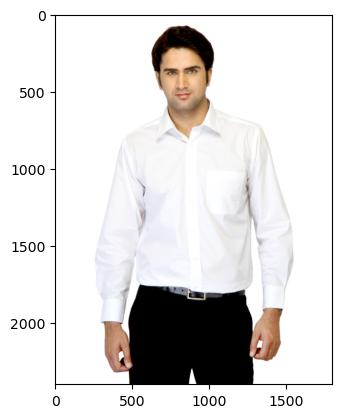

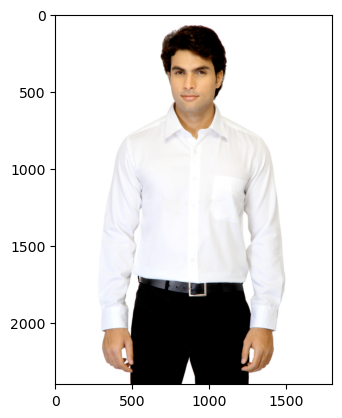

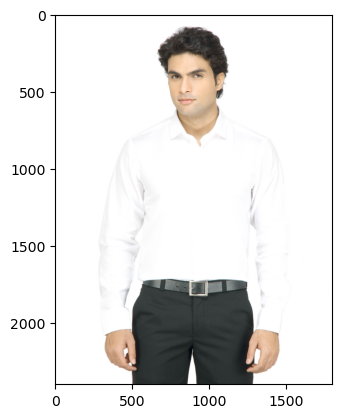

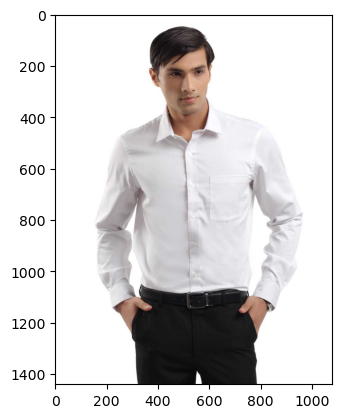

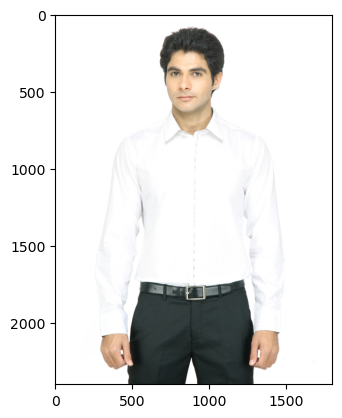

In [56]:
from matplotlib import pyplot as plt

# Assuming 'filenames' is a list of image paths and 'indices' is obtained from your nearest neighbors query
for index in indices[0][1:6]:  # Skip the first index if it's the query image itself
    image_path = filenames[index]
#     print(image_path)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    plt.imshow(image)
    plt.show()
